# Classical Futures Trading Strategy

### 1. Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.arima.model import ARIMA

import os, sys

sys.path.append(os.path.abspath('../pysystemtrade'))
print(sys.path)
from sysdata.sim.csv_futures_sim_data import csvFuturesSimData
from sysquant.estimators.vol import robust_vol_calc
from systems.accounts.account_forecast import pandl_for_instrument_forecast

%matplotlib inline

['/Users/zeegtab/Documents/Imperial College London 2020 - 2024/3rd Year/Final Year Project/ML-Futures-Copy/trading_strategies', '/Users/zeegtab/opt/anaconda3/envs/mlfinlab/lib/python38.zip', '/Users/zeegtab/opt/anaconda3/envs/mlfinlab/lib/python3.8', '/Users/zeegtab/opt/anaconda3/envs/mlfinlab/lib/python3.8/lib-dynload', '', '/Users/zeegtab/opt/anaconda3/envs/mlfinlab/lib/python3.8/site-packages', '/Users/zeegtab/Documents/Imperial College London 2020 - 2024/3rd Year/Final Year Project/ML-Futures-Copy/pysystemtrade', '/Users/zeegtab/Documents/Imperial College London 2020 - 2024/3rd Year/Final Year Project/ML-Futures-Copy/pysystemtrade']


In [4]:
plt.rcParams.update({
    "font.size": 16,
    "legend.fontsize": 14
})

### 2. Read in Data

In [3]:
start_datetime = '2018-01-02'

In [4]:
S_P_500 = 'ES'
NASDAQ = 'NQ'
EUROSTOXX = 'FX'
DAX = 'DY'
FT_100 = 'X'

equity_futures = [S_P_500, NASDAQ, EUROSTOXX, DAX, FT_100]

In [5]:
CRUDE_OIL = 'CL'
NAT_GAS = 'NG'
BRENT_CRUDE = 'BZ'
GAS = 'RB'
HEAT_OIL = 'HO'

fuel_futures = [CRUDE_OIL, NAT_GAS, BRENT_CRUDE, GAS, HEAT_OIL]

In [6]:
fuel_futures_data = pd.read_parquet('../data/fuel_first_rate_data_R_prices.parquet')[start_datetime:]
equity_futures_data = pd.read_parquet('../data/equity_indices_first_rate_data_R_prices.parquet')[start_datetime:]

#### 2.1 Plotting the ACF Plot for Fuel and Equity Contracts data

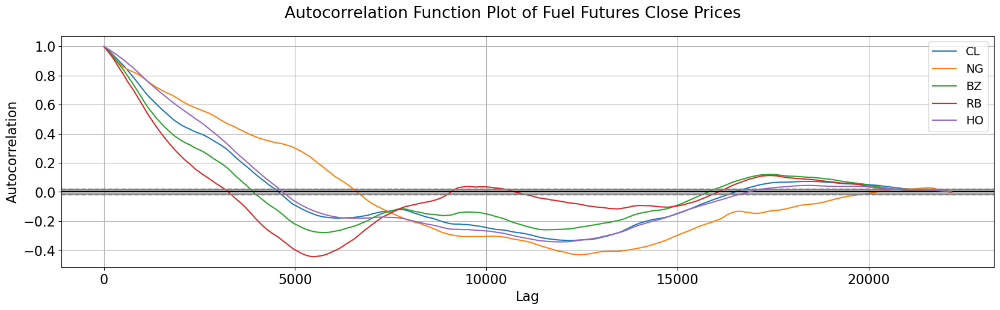

In [9]:
fig, axs = plt.subplots(1,1, figsize=(20,5))
fig.suptitle("Autocorrelation Function Plot of Fuel Futures Close Prices")
for symbol in fuel_futures:
    autocorrelation_plot(fuel_futures_data[symbol], axs, label=symbol)

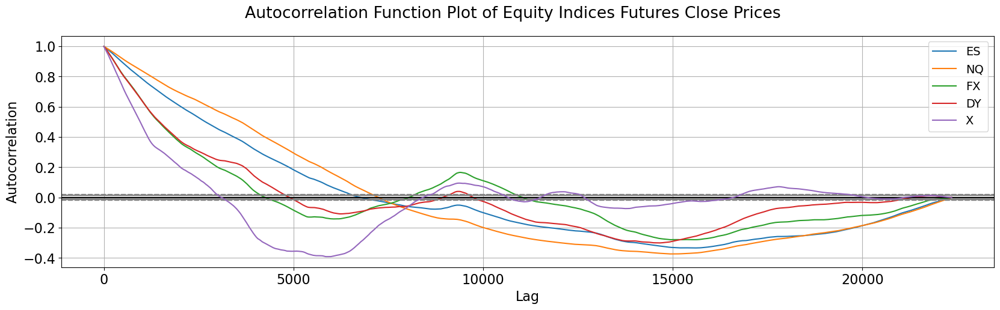

In [10]:
fig, axs = plt.subplots(1,1, figsize=(20,5))
fig.suptitle("Autocorrelation Function Plot of Equity Indices Futures Close Prices")
for symbol in equity_futures:
    autocorrelation_plot(equity_futures_data[symbol], axs, label=symbol)

In [11]:
SIGNAL = 'SIGNAL'
CLOSE = 'CLOSE'
PREDICTIONS = 'PREDICTIONS'
RETURNS = 'RETURNS'
STRATEGY_RETURNS = 'STRATEGY_RETURNS'

In [13]:
def run_arima_strategy(source_dataframe: pd.DataFrame, symbols: list, p: int, d: int, q: int, arima_window_len: int):
    
    accounts = []
    
    for column in symbols:
        curr_data = pd.DataFrame(source_dataframe[column], index=source_dataframe.index, columns=[CLOSE])
        curr_data[SIGNAL] = 0.0
        
        dataset = source_dataframe[column][start_datetime:]
        diff_returns = np.diff(dataset)
        diff_returns = np.roll(diff_returns, 1)
        
        arima_order = (p, d, q)
        
        window_length = 30
        
        forecast_length = len(dataset) - window_length
        forecasts = np.zeros(forecast_length)

        for i in range(forecast_length - 1):
            returns_window = diff_returns[(1+i):(window_length+i)]
            current_model = ARIMA(returns_window, order=arima_order)
            current_model_fit = current_model.fit()

            forecast = current_model_fit.forecast(1)
            print(f"forecast: {forecast}")
#             print(f"expected: {diff_returns[window_length+i+1]}, forecasted: {forecast}")
            forecasts[i] = forecast
    
        print(forecasts)
        
        np.savetxt(f"../ARIMA-saved-data/{column}.csv", forecasts, delimiter=",")
    
        start_timedelta = pd.Timestamp(start_datetime)
        start_timedelta_plus = start_timedelta + pd.Timedelta(31, 'H')
        print(start_timedelta)
        print(start_timedelta_plus)
            
        instrument_data = csvFuturesSimData(csv_data_paths=dict(csvFuturesAdjustedPricesData="data.firstrate_futures"))
        price = instrument_data.get_raw_price(column)[start_timedelta_plus:]
        print(price)
        
        forecasts_df = pd.DataFrame(forecasts, columns=['forecast'], index=price.index)
        print(forecasts_df)
        
        account = pandl_for_instrument_forecast(forecast=forecasts_df['forecast'], price=price)
        print(account)
        accounts.append(account)
    
    return accounts

In [15]:
fuel_accounts = run_arima_strategy(fuel_futures_data, fuel_futures, 2, 1, 0, 30)
fuel_accounts

forecast: [0.16032644]
forecast: [0.09094265]
forecast: [0.04222883]
forecast: [0.16160323]
forecast: [0.0573822]
forecast: [0.20002408]
forecast: [0.31476538]
forecast: [0.07510979]
forecast: [0.02762515]
forecast: [0.12812877]
forecast: [0.09472671]
forecast: [0.00363624]
forecast: [0.10383698]
forecast: [-0.05521456]
forecast: [0.01005912]
forecast: [0.0112641]
forecast: [0.13839747]
forecast: [0.01281359]
forecast: [0.12539004]
forecast: [0.03640617]
forecast: [-0.13588416]
forecast: [0.00196723]
forecast: [-0.18971648]
forecast: [0.00639297]
forecast: [-0.05384299]
forecast: [0.00086865]
forecast: [-0.04877744]
forecast: [-0.01662512]
forecast: [0.10941433]
forecast: [0.04832868]
forecast: [0.14107767]
forecast: [-0.001833]
forecast: [-0.02814749]
forecast: [-0.03566459]
forecast: [0.0012728]
forecast: [0.02113304]
forecast: [0.00520023]
forecast: [0.00114334]
forecast: [-0.00424675]
forecast: [0.0201141]
forecast: [0.02748539]
forecast: [-0.04447663]
forecast: [-0.0843633]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01795348]
forecast: [-0.00230566]
forecast: [0.08953823]
forecast: [0.16211566]
forecast: [0.08387299]
forecast: [0.12336289]
forecast: [0.13411656]
forecast: [0.1394887]
forecast: [-0.01294223]
forecast: [-0.00784244]
forecast: [0.04275766]
forecast: [-0.02350152]
forecast: [-0.02419185]
forecast: [-0.02687935]
forecast: [-0.04092272]
forecast: [-0.06386428]
forecast: [-0.0962094]
forecast: [-0.00547283]
forecast: [0.02536454]
forecast: [0.07335661]
forecast: [0.00901415]
forecast: [-0.05254462]
forecast: [0.18248773]
forecast: [0.30606507]
forecast: [0.34486354]
forecast: [0.11742506]
forecast: [-0.07885483]
forecast: [0.16091418]
forecast: [0.17633323]
forecast: [0.21123612]
forecast: [-0.00790862]
forecast: [0.05797365]
forecast: [0.0292928]
forecast: [-0.00622811]
forecast: [-0.02237955]
forecast: [-0.01669477]
forecast: [-0.02047349]
forecast: [0.00264501]
forecast: [-0.01294009]
forecast: [-0.00204106]
forecast: [0.02926681]
forecast: [0.08220933]
forecast: [-0.0039

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11780782]
forecast: [0.00861191]
forecast: [-0.10384393]
forecast: [-0.03687141]
forecast: [-0.05217674]
forecast: [0.0237282]
forecast: [-0.01017202]
forecast: [-0.01034595]
forecast: [0.00867617]
forecast: [-0.07350151]
forecast: [-0.02126035]
forecast: [-0.12156358]
forecast: [-0.2130692]
forecast: [-0.17090611]
forecast: [0.06403011]
forecast: [0.03951231]
forecast: [-0.07187357]
forecast: [-0.16746784]
forecast: [-0.04271333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04371525]
forecast: [0.00242197]
forecast: [-0.00770815]
forecast: [0.03571701]
forecast: [-0.03527518]
forecast: [0.07437069]
forecast: [-0.02404518]
forecast: [-0.04786782]
forecast: [-0.1350965]
forecast: [-0.01896575]
forecast: [-0.03295027]
forecast: [0.02954868]
forecast: [0.06672065]
forecast: [-0.05394198]
forecast: [-0.03970582]
forecast: [-0.15856287]
forecast: [0.00101265]
forecast: [-0.00188533]
forecast: [0.10748047]
forecast: [-0.07668136]
forecast: [0.19892134]
forecast: [0.1213208]
forecast: [0.09201346]
forecast: [0.03829171]
forecast: [-0.02586539]
forecast: [-0.04496884]
forecast: [0.0953933]
forecast: [0.09969374]
forecast: [0.03519389]
forecast: [0.05270122]
forecast: [0.01452324]
forecast: [0.01385213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271851]
forecast: [-0.10730586]
forecast: [-0.07154256]
forecast: [-0.05092224]
forecast: [-0.06754846]
forecast: [0.02221996]
forecast: [-0.02806962]
forecast: [0.06569861]
forecast: [0.02727222]
forecast: [-0.04577999]
forecast: [-0.07939938]
forecast: [-0.17433891]
forecast: [0.06561051]
forecast: [0.11417307]
forecast: [0.15984148]
forecast: [-0.03026307]
forecast: [-0.11195286]
forecast: [-0.06775431]
forecast: [-0.06755168]
forecast: [-0.0915454]
forecast: [-0.11257284]
forecast: [-0.25455307]
forecast: [-0.1016216]
forecast: [-0.04762208]
forecast: [0.03761537]
forecast: [-0.03594438]
forecast: [0.04012281]
forecast: [0.09688808]
forecast: [0.08665362]
forecast: [0.14124824]
forecast: [0.02665685]
forecast: [-0.04255146]
forecast: [-0.15947215]
forecast: [-0.09793643]
forecast: [0.23710757]
forecast: [-0.00149139]
forecast: [-0.08206712]
forecast: [0.00207907]
forecast: [0.03761891]
forecast: [0.04950702]
forecast: [0.08968636]
forecast: [0.01711173]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17051785]
forecast: [0.07513115]
forecast: [0.02505402]
forecast: [0.01841031]
forecast: [0.08764233]
forecast: [0.03139186]
forecast: [0.02521571]
forecast: [0.01681605]
forecast: [-0.00025467]
forecast: [-0.00788625]
forecast: [-0.02551095]
forecast: [-0.05089515]
forecast: [-0.02577641]
forecast: [-0.05910904]
forecast: [-0.07290605]
forecast: [-0.12001602]
forecast: [-0.13733865]
forecast: [-0.10955435]
forecast: [-0.10499949]
forecast: [-0.11526875]
forecast: [-0.11603083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07517656]
forecast: [-0.01841102]
forecast: [0.12200957]
forecast: [-0.01315456]
forecast: [0.003032]
forecast: [-0.02851104]
forecast: [0.02378467]
forecast: [-0.08264097]
forecast: [-0.0954982]
forecast: [-0.10997873]
forecast: [-0.16884608]
forecast: [-0.13932475]
forecast: [-0.041518]
forecast: [0.03423465]
forecast: [0.02941415]
forecast: [0.05761374]
forecast: [0.07940361]
forecast: [0.02571109]
forecast: [-0.07656743]
forecast: [-0.04609002]
forecast: [-0.19899017]
forecast: [-0.38476866]
forecast: [-0.3276583]
forecast: [0.02401271]
forecast: [0.0530583]
forecast: [0.03994957]
forecast: [-0.00592511]
forecast: [-0.14830539]
forecast: [-0.14434027]
forecast: [-0.22525343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02946324]
forecast: [-0.00591961]
forecast: [0.04309045]
forecast: [0.0262124]
forecast: [-0.00140971]
forecast: [-0.00542576]
forecast: [0.03571513]
forecast: [0.05860428]
forecast: [0.04671035]
forecast: [0.01878457]
forecast: [-0.01102597]
forecast: [0.01794745]
forecast: [0.01111898]
forecast: [0.07713068]
forecast: [0.08788659]
forecast: [0.05896611]
forecast: [0.06693109]
forecast: [-0.02136379]
forecast: [0.09126942]
forecast: [-0.01274885]
forecast: [0.05772795]
forecast: [0.21711536]
forecast: [0.06813012]
forecast: [-0.03437019]
forecast: [0.05103379]
forecast: [-0.02766967]
forecast: [-0.02614491]
forecast: [-0.02036925]
forecast: [0.05038641]
forecast: [-0.01180687]
forecast: [-0.01415631]
forecast: [0.01163492]
forecast: [0.06280402]
forecast: [0.1214903]
forecast: [0.1903335]
forecast: [0.13626039]
forecast: [-0.12136659]
forecast: [0.01721544]
forecast: [0.28123295]
forecast: [-0.16394766]
forecast: [0.16941781]
forecast: [-0.04581836]
forecast: [0.17429189

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.16325212]
forecast: [0.01057197]
forecast: [-0.02950198]
forecast: [0.0904305]
forecast: [0.01342948]
forecast: [0.0453958]
forecast: [-0.00253666]
forecast: [0.18041985]
forecast: [0.08796814]
forecast: [-0.05269255]
forecast: [-0.12977937]
forecast: [0.01709145]
forecast: [-0.22241862]
forecast: [0.12496295]
forecast: [-0.01459643]
forecast: [-0.22676986]
forecast: [-0.33021449]
forecast: [-0.26735215]
forecast: [-0.16809507]
forecast: [-0.21054423]
forecast: [-0.01315488]
forecast: [-0.11293191]
forecast: [-0.00342948]
forecast: [-0.03337104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10087604]
forecast: [-0.00917666]
forecast: [0.06341489]
forecast: [-0.01894465]
forecast: [0.129956]
forecast: [0.06036665]
forecast: [0.09857153]
forecast: [0.11934157]
forecast: [-0.11295041]
forecast: [-0.04457729]
forecast: [-0.16454102]
forecast: [0.21483973]
forecast: [0.1890969]
forecast: [0.31819343]
forecast: [-0.17840023]
forecast: [-0.03882972]
forecast: [-0.05459688]
forecast: [-0.27241996]
forecast: [0.09952658]
forecast: [0.15267876]
forecast: [0.21411819]
forecast: [0.03716082]
forecast: [0.06215518]
forecast: [0.05350149]
forecast: [-0.09661585]
forecast: [-0.04088034]
forecast: [-0.00903599]
forecast: [-0.05788894]
forecast: [-0.02231773]
forecast: [-0.18244553]
forecast: [-0.23559345]
forecast: [-0.17295769]
forecast: [-0.07667205]
forecast: [0.02604612]
forecast: [0.17079445]
forecast: [0.35861892]
forecast: [-0.03213621]
forecast: [-1.06045047]
forecast: [-0.34446376]
forecast: [-0.12633209]
forecast: [0.09575817]
forecast: [0.0827584]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00718771]
forecast: [0.30672398]
forecast: [0.00943976]
forecast: [-0.00499594]
forecast: [0.04864344]
forecast: [0.01274664]
forecast: [0.0832852]
forecast: [0.11402051]
forecast: [-0.00204567]
forecast: [-0.01008968]
forecast: [-0.0713994]
forecast: [-0.09436507]
forecast: [0.0849724]
forecast: [0.06904735]
forecast: [-0.11693166]
forecast: [-0.09578313]
forecast: [0.10144026]
forecast: [-0.04465469]
forecast: [-0.24177344]
forecast: [-0.05736551]
forecast: [0.19123522]
forecast: [0.44570442]
forecast: [0.01620763]
forecast: [-0.29391219]
forecast: [0.16164251]
forecast: [0.03837789]
forecast: [0.1821145]
forecast: [0.09847884]
forecast: [0.24488567]
forecast: [0.14918775]
forecast: [-0.07010806]
forecast: [0.0452636]
forecast: [-0.00066138]
forecast: [-0.13188129]
forecast: [0.02031339]
forecast: [-0.15632084]
forecast: [0.10956681]
forecast: [-0.09875034]
forecast: [0.02619393]
forecast: [-0.00420165]
forecast: [-0.07451779]
forecast: [0.17432648]
forecast: [0.01795427

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00974351]
forecast: [0.04428643]
forecast: [0.002167]
forecast: [0.08192534]
forecast: [0.02858565]
forecast: [0.15016253]
forecast: [0.01540229]
forecast: [0.15567488]
forecast: [0.05413052]
forecast: [0.09491968]
forecast: [-0.0161059]
forecast: [0.1000766]
forecast: [0.89078478]
forecast: [0.00745225]
forecast: [-0.04055346]
forecast: [-0.05315121]
forecast: [0.00132786]
forecast: [0.02684239]
forecast: [0.06284127]
forecast: [0.08188409]
forecast: [0.03102628]
forecast: [-0.04361833]
forecast: [-0.0443563]
forecast: [-0.02655339]
forecast: [0.00873644]
forecast: [-0.00189747]
forecast: [-0.07549535]
forecast: [-0.10895768]
forecast: [-0.0705522]
forecast: [0.0594102]
forecast: [0.10218242]
forecast: [0.063765]
forecast: [0.13014306]
forecast: [0.36248464]
forecast: [0.27701737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07704267]
forecast: [-0.05048023]
forecast: [-0.00455636]
forecast: [0.04265652]
forecast: [-0.01232516]
forecast: [-0.07816373]
forecast: [0.08121266]
forecast: [0.11616912]
forecast: [0.02651948]
forecast: [0.07546129]
forecast: [0.03598269]
forecast: [-0.05916416]
forecast: [-0.07007188]
forecast: [-0.1392551]
forecast: [-0.01480392]
forecast: [0.00554389]
forecast: [-0.11480098]
forecast: [0.12819334]
forecast: [-0.21611217]
forecast: [-0.02677487]
forecast: [0.0718231]
forecast: [0.36590066]
forecast: [0.12583971]
forecast: [0.06502301]
forecast: [-0.0186474]
forecast: [0.06305812]
forecast: [-0.07152932]
forecast: [0.01816929]
forecast: [0.0761054]
forecast: [-0.08427462]
forecast: [-0.03936788]
forecast: [-0.03066647]
forecast: [-0.0835634]
forecast: [0.02804293]
forecast: [0.01240991]
forecast: [-0.11727449]
forecast: [0.03353193]
forecast: [-0.05342724]
forecast: [0.02090103]
forecast: [-0.12940806]
forecast: [0.163086]
forecast: [-0.1612216]
forecast: [0.07690538

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18893065]
forecast: [0.13445593]
forecast: [0.06884045]
forecast: [-0.40054193]
forecast: [0.84718621]
forecast: [-0.10371554]
forecast: [0.14568206]
forecast: [-0.02059808]
forecast: [0.12904315]
forecast: [0.05485534]
forecast: [0.05395877]
forecast: [-0.01283262]
forecast: [-0.03945665]
forecast: [-0.04005851]
forecast: [-0.00584245]
forecast: [-0.0389252]
forecast: [0.00826844]
forecast: [0.01548732]
forecast: [0.14370748]
forecast: [0.16361385]
forecast: [-0.15996153]
forecast: [-0.19781231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17808543]
forecast: [0.06443867]
forecast: [0.32210578]
forecast: [0.50871552]
forecast: [0.39611777]
forecast: [0.02843963]
forecast: [0.0324462]
forecast: [0.0909512]
forecast: [-0.00618933]
forecast: [-0.00588666]
forecast: [0.11195862]
forecast: [-0.04125811]
forecast: [0.02314171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01671634]
forecast: [-0.00114471]
forecast: [0.00422649]
forecast: [0.00655939]
forecast: [-0.05866209]
forecast: [-0.06106081]
forecast: [0.05203578]
forecast: [0.0696543]
forecast: [0.17884075]
forecast: [0.18921395]
forecast: [-0.01404191]
forecast: [-0.23001106]
forecast: [-0.25426657]
forecast: [0.07605059]
forecast: [-0.14011791]
forecast: [-0.0252296]
forecast: [0.12298872]
forecast: [-0.11531745]
forecast: [-0.03287313]
forecast: [-0.25571731]
forecast: [-0.12666397]
forecast: [0.13763394]
forecast: [-0.1430054]
forecast: [0.10167402]
forecast: [0.00167903]
forecast: [-0.09320753]
forecast: [0.06611447]
forecast: [0.00996397]
forecast: [-0.23002016]
forecast: [0.07758774]
forecast: [0.09274653]
forecast: [-0.14972298]
forecast: [0.32277638]
forecast: [-0.01987512]
forecast: [-0.1727596]
forecast: [0.20467557]
forecast: [0.40326916]
forecast: [-0.05160611]
forecast: [-1.23232903]
forecast: [-0.02288398]
forecast: [0.15007002]
forecast: [0.1390443]
forecast: [0.0980

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08350783]
forecast: [0.01362727]
forecast: [0.00318415]
forecast: [0.02942755]
forecast: [0.06288036]
forecast: [0.05330247]
forecast: [-0.04406152]
forecast: [-0.06362765]
forecast: [-0.03102047]
forecast: [-0.00958785]
forecast: [-0.05741564]
forecast: [-0.10184102]
forecast: [-0.06714295]
forecast: [-0.11403414]
forecast: [-0.06519276]
forecast: [-0.06130238]
forecast: [-0.09429354]
forecast: [-0.08931772]
forecast: [-0.07130386]
forecast: [-0.39760355]
forecast: [-0.09133027]
forecast: [0.14824207]
forecast: [0.1299869]
forecast: [0.09260303]
forecast: [-0.00181455]
forecast: [-0.03408161]
forecast: [-0.05322094]
forecast: [-0.04765363]
forecast: [-0.01343567]
forecast: [0.00806926]
forecast: [0.00906764]
forecast: [0.04683883]
forecast: [0.00920791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04825983]
forecast: [-0.02137202]
forecast: [0.14555619]
forecast: [0.1803504]
forecast: [-0.04308147]
forecast: [-0.16289302]
forecast: [0.24939625]
forecast: [0.86588355]
forecast: [-0.2019895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-1.16539494]
forecast: [0.23619589]
forecast: [-0.06958215]
forecast: [-0.05332625]
forecast: [0.13517517]
forecast: [0.07348808]
forecast: [0.12810106]
forecast: [0.01968692]
forecast: [0.00057559]
forecast: [-0.0524183]
forecast: [-0.04881261]
forecast: [0.03119253]
forecast: [-0.05227634]
forecast: [-0.04463255]
forecast: [-0.01251862]
forecast: [-0.0264722]
forecast: [0.21095933]
forecast: [0.136329]
forecast: [-0.01712091]
forecast: [0.14339316]
forecast: [-0.05556663]
forecast: [-0.07491854]
forecast: [-0.08886862]
forecast: [-0.36385948]
forecast: [-0.1693982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13988047]
forecast: [0.12957703]
forecast: [0.08204436]
forecast: [0.02044939]
forecast: [0.01300905]
forecast: [0.02480382]
forecast: [0.04059583]
forecast: [0.05890183]
forecast: [0.01045681]
forecast: [0.01662008]
forecast: [-0.02955748]
forecast: [-0.01205278]
forecast: [-0.00065435]
forecast: [-0.00153897]
forecast: [-0.00240277]
forecast: [-0.0259104]
forecast: [0.10185852]
forecast: [0.11992075]
forecast: [0.12199463]
forecast: [-0.02183336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06971817]
forecast: [-0.02236777]
forecast: [-0.0138615]
forecast: [0.01403913]
forecast: [-0.0597608]
forecast: [-0.01620797]
forecast: [-0.0062801]
forecast: [-0.00881241]
forecast: [0.00239498]
forecast: [0.06103011]
forecast: [-0.02107203]
forecast: [-0.02716758]
forecast: [-0.01970938]
forecast: [-0.01420164]
forecast: [0.03414262]
forecast: [0.07724574]
forecast: [-0.02321181]
forecast: [-0.03107357]
forecast: [0.0630912]
forecast: [0.08307065]
forecast: [-0.05411862]
forecast: [-0.03415176]
forecast: [-0.01787068]
forecast: [-0.11148596]
forecast: [0.60991106]
forecast: [0.01727779]
forecast: [0.71754329]
forecast: [0.04012058]
forecast: [-0.03257422]
forecast: [0.00705689]
forecast: [-0.05898598]
forecast: [-0.02918544]
forecast: [-0.05870325]
forecast: [-0.04683818]
forecast: [-0.02121112]
forecast: [-0.02930772]
forecast: [-0.01203318]
forecast: [0.03296525]
forecast: [0.05648875]
forecast: [-0.0391627]
forecast: [0.02790503]
forecast: [-0.02707275]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0014712]
forecast: [0.00320307]
forecast: [0.02911965]
forecast: [0.03642229]
forecast: [0.01857855]
forecast: [0.01528228]
forecast: [0.10473774]
forecast: [0.17131064]
forecast: [0.09909349]
forecast: [0.02747521]
forecast: [-0.00512876]
forecast: [-0.02803153]
forecast: [0.06209154]
forecast: [0.15847883]
forecast: [0.14902684]
forecast: [0.17143291]
forecast: [0.238987]
forecast: [0.10694262]
forecast: [-0.0298676]
forecast: [-0.02142807]
forecast: [0.00459762]
forecast: [0.06645302]
forecast: [0.09421698]
forecast: [0.09022106]
forecast: [0.01038731]
forecast: [0.03275464]
forecast: [0.0001863]
forecast: [-0.02233751]
forecast: [-0.04806985]
forecast: [-0.03177339]
forecast: [-0.00977948]
forecast: [-0.00205877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02184562]
forecast: [0.04626087]
forecast: [0.10293012]
forecast: [0.16645667]
forecast: [0.09730685]
forecast: [0.10507134]
forecast: [0.22892984]
forecast: [0.19280391]
forecast: [0.310107]
forecast: [0.09444125]
forecast: [0.15053049]
forecast: [0.01966679]
forecast: [0.15390075]
forecast: [-0.00775471]
forecast: [0.02236949]
forecast: [0.00729277]
forecast: [-0.14783602]
forecast: [0.01094563]
forecast: [-0.05751643]
forecast: [0.05151987]
forecast: [-0.08960576]
forecast: [0.00127986]
forecast: [0.01760199]
forecast: [-0.05018587]
forecast: [-0.31009003]
forecast: [0.15830767]
forecast: [-0.20774161]
forecast: [-0.06774004]
forecast: [0.02700057]
forecast: [-0.26017193]
forecast: [-4.46976688e-05]
forecast: [-0.12025664]
forecast: [0.02817357]
forecast: [-0.02777509]
forecast: [-0.06857733]
forecast: [-0.05023527]
forecast: [-0.12356489]
forecast: [0.07257712]
forecast: [0.32179216]
forecast: [0.29339784]
forecast: [0.17626187]
forecast: [-0.00440409]
forecast: [-0.04

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03566058]
forecast: [0.01659956]
forecast: [0.15784171]
forecast: [0.27976244]
forecast: [0.00637141]
forecast: [-0.47842909]
forecast: [-0.02198406]
forecast: [-0.00406045]
forecast: [-0.12703649]
forecast: [-0.23725926]
forecast: [-0.24408998]
forecast: [-0.01183321]
forecast: [0.00992077]
forecast: [0.05854567]
forecast: [0.01844352]
forecast: [-0.0095287]
forecast: [-0.04036454]
forecast: [-0.06148169]
forecast: [-0.02846797]
forecast: [0.01201257]
forecast: [-0.04829437]
forecast: [-0.04705757]
forecast: [-0.05299626]
forecast: [0.08171082]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09868365]
forecast: [0.04904126]
forecast: [-0.07612337]
forecast: [-0.04898051]
forecast: [-0.20148663]
forecast: [-0.32339417]
forecast: [-0.37452033]
forecast: [0.29638072]
forecast: [0.19829939]
forecast: [0.08103576]
forecast: [0.02091905]
forecast: [0.00069212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03514001]
forecast: [-0.02140911]
forecast: [-0.02090617]
forecast: [0.02143341]
forecast: [0.00047594]
forecast: [0.0209]
forecast: [0.02437402]
forecast: [-0.01128761]
forecast: [-0.05857576]
forecast: [-0.04936987]
forecast: [-0.09688416]
forecast: [-0.06776353]
forecast: [-0.06047557]
forecast: [0.06996774]
forecast: [0.17301688]
forecast: [0.16203159]
forecast: [0.10753393]
forecast: [0.14020467]
forecast: [0.00130433]
forecast: [0.05130506]
forecast: [-0.06090674]
forecast: [0.03464215]
forecast: [0.0637382]
forecast: [0.07577088]
forecast: [0.05406879]
forecast: [0.04316876]
forecast: [0.0041613]
forecast: [-0.01090028]
forecast: [-0.01293083]
forecast: [0.01196539]
forecast: [0.0148812]
forecast: [-0.00200543]
forecast: [0.05025549]
forecast: [-0.02939404]
forecast: [0.01079303]
forecast: [-0.00999159]
forecast: [-0.49928332]
forecast: [-0.67798031]
forecast: [-0.52102917]
forecast: [-0.00934577]
forecast: [-0.07301865]
forecast: [-0.09955686]
forecast: [0.0413544

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02258167]
forecast: [-0.01267364]
forecast: [-0.02831594]
forecast: [-0.03911975]
forecast: [-0.07853102]
forecast: [-0.06866217]
forecast: [-0.13159049]
forecast: [-0.05141514]
forecast: [-0.03885783]
forecast: [0.26961983]
forecast: [0.24834879]
forecast: [-0.0313431]
forecast: [-0.01262085]
forecast: [0.17074389]
forecast: [-0.27399535]
forecast: [0.05636724]
forecast: [0.0973706]
forecast: [0.08073915]
forecast: [-0.05658654]
forecast: [-0.2977249]
forecast: [-0.20330138]
forecast: [-0.01862328]
forecast: [0.05909073]
forecast: [-0.00259646]
forecast: [-0.02465164]
forecast: [-0.04745693]
forecast: [0.00919166]
forecast: [0.00343236]
forecast: [0.13649994]
forecast: [0.06005617]
forecast: [-0.06813624]
forecast: [-0.14949244]
forecast: [0.12504552]
forecast: [0.22124365]
forecast: [-0.37423709]
forecast: [-0.5513628]
forecast: [-0.09280722]
forecast: [-0.17491095]
forecast: [-0.32367278]
forecast: [-0.04435027]
forecast: [0.12514484]
forecast: [0.00208522]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07794673]
forecast: [0.05176754]
forecast: [-0.01878683]
forecast: [0.01387824]
forecast: [0.11071331]
forecast: [0.16897889]
forecast: [0.2256058]
forecast: [0.13659272]
forecast: [0.15005434]
forecast: [0.11698841]
forecast: [-0.04930633]
forecast: [-0.24519339]
forecast: [0.31712792]
forecast: [0.37269347]
forecast: [0.19007676]
forecast: [-0.01474751]
forecast: [-0.01320544]
forecast: [0.06393484]
forecast: [-0.01415233]
forecast: [-0.03453654]
forecast: [0.07111111]
forecast: [0.06351758]
forecast: [-0.02252895]
forecast: [-0.02597574]
forecast: [0.11039762]
forecast: [0.08546771]
forecast: [0.03721835]
forecast: [-0.0870947]
forecast: [0.11922075]
forecast: [0.26975972]
forecast: [0.00978642]
forecast: [-0.17453392]
forecast: [-0.16783068]
forecast: [0.04835216]
forecast: [-0.23356101]
forecast: [-0.1866948]
forecast: [-0.20745888]
forecast: [-0.09442911]
forecast: [0.07087117]
forecast: [0.03887759]
forecast: [0.05940828]
forecast: [0.01657747]
forecast: [-0.0462459

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.22977172]
forecast: [-0.29784808]
forecast: [0.04396884]
forecast: [0.1013992]
forecast: [0.20620745]
forecast: [0.08602629]
forecast: [0.06311619]
forecast: [-0.07618001]
forecast: [-0.11055545]
forecast: [0.03044403]
forecast: [0.06266493]
forecast: [-0.00389588]
forecast: [-0.00464488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02092483]
forecast: [0.04180068]
forecast: [0.04448643]
forecast: [0.02545603]
forecast: [-0.05716491]
forecast: [-0.103949]
forecast: [-0.12702437]
forecast: [-0.05454128]
forecast: [0.05676522]
forecast: [0.09244516]
forecast: [-0.30272718]
forecast: [-0.35383451]
forecast: [-0.31683733]
forecast: [0.12514415]
forecast: [0.32017837]
forecast: [0.2662117]
forecast: [0.28717497]
forecast: [0.23437208]
forecast: [0.05853275]
forecast: [0.07923962]
forecast: [0.02819992]
forecast: [-0.11265329]
forecast: [0.07610021]
forecast: [-0.03061582]
forecast: [0.01409344]
forecast: [-0.01216209]
forecast: [0.15745471]
forecast: [0.00177688]
forecast: [0.10902325]
forecast: [-0.15093683]
forecast: [0.03393815]
forecast: [0.00998211]
forecast: [-0.25533325]
forecast: [0.18002535]
forecast: [-0.21261919]
forecast: [0.12892165]
forecast: [-0.12683371]
forecast: [-0.25342257]
forecast: [-0.24446065]
forecast: [-0.49448054]
forecast: [-0.16564064]
forecast: [0.00113742]
forecast: [-0.00932

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10844048]
forecast: [-0.0579669]
forecast: [0.06685157]
forecast: [0.11669619]
forecast: [0.13106578]
forecast: [0.10513477]
forecast: [-0.09028917]
forecast: [-0.15672241]
forecast: [-0.23129483]
forecast: [-0.13113984]
forecast: [0.27652873]
forecast: [-0.078915]
forecast: [0.18341686]
forecast: [-0.04748789]
forecast: [-0.04162977]
forecast: [-0.02821263]
forecast: [-0.01525543]
forecast: [-0.05921487]
forecast: [-0.08322351]
forecast: [-0.01494337]
forecast: [0.04381369]
forecast: [0.02455164]
forecast: [-0.02123318]
forecast: [0.03226843]
forecast: [-0.06868772]
forecast: [-0.01218924]
forecast: [0.04160863]
forecast: [0.01653222]
forecast: [-0.00478047]
forecast: [-0.02232952]
forecast: [-0.14992858]
forecast: [0.09333385]
forecast: [0.06539908]
forecast: [0.23835298]
forecast: [0.02219574]
forecast: [-0.14639607]
forecast: [-0.0220268]
forecast: [-0.03909351]
forecast: [0.01242632]
forecast: [-0.00205222]
forecast: [-0.00845459]
forecast: [-0.05225238]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00753764]
forecast: [0.03849583]
forecast: [0.0354033]
forecast: [-0.09079901]
forecast: [-0.0614992]
forecast: [-0.18913307]
forecast: [-0.20820566]
forecast: [-0.12840625]
forecast: [-0.17879305]
forecast: [-0.0304885]
forecast: [-0.13274065]
forecast: [-0.17523783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0193305]
forecast: [-0.22361117]
forecast: [0.32689391]
forecast: [-0.07414581]
forecast: [-0.42085073]
forecast: [0.24865844]
forecast: [-0.01687333]
forecast: [0.05286912]
forecast: [-0.04677143]
forecast: [-0.00695969]
forecast: [-0.02099587]
forecast: [0.04527231]
forecast: [0.05498913]
forecast: [0.02548094]
forecast: [0.02193759]
forecast: [0.04120492]
forecast: [0.12215248]
forecast: [-0.04757864]
forecast: [-0.0521668]
forecast: [-0.16689076]
forecast: [-0.08828934]
forecast: [-0.04514522]
forecast: [-0.01534158]
forecast: [-0.04266941]
forecast: [0.10822922]
forecast: [-0.04011441]
forecast: [0.12535475]
forecast: [0.11792333]
forecast: [0.33310734]
forecast: [-0.07572305]
forecast: [-0.0138436]
forecast: [0.02722198]
forecast: [0.02429097]
forecast: [0.01605726]
forecast: [0.06089079]
forecast: [0.00764582]
forecast: [-0.0019164]
forecast: [0.05668125]
forecast: [0.06607397]
forecast: [0.07704959]
forecast: [0.11086713]
forecast: [-0.08787027]
forecast: [-0.00602

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03554335]
forecast: [0.11595993]
forecast: [-0.04542806]
forecast: [-0.01218707]
forecast: [-0.04548544]
forecast: [0.07872171]
forecast: [0.07564345]
forecast: [-0.14617905]
forecast: [-0.38950901]
forecast: [-0.42797351]
forecast: [0.07603486]
forecast: [0.06650925]
forecast: [0.02107805]
forecast: [-0.0099312]
forecast: [-0.00326696]
forecast: [-0.05886408]
forecast: [-0.05462555]
forecast: [-0.02646148]
forecast: [0.09162874]
forecast: [0.03201039]
forecast: [-0.01156408]
forecast: [-0.11512174]
forecast: [-0.02735995]
forecast: [0.05282177]
forecast: [0.05000165]
forecast: [0.07892196]
forecast: [-0.08585661]
forecast: [-0.36907419]
forecast: [-0.43112301]
forecast: [-0.28661914]
forecast: [0.4452321]
forecast: [0.12200536]
forecast: [0.48431195]
forecast: [0.03794312]
forecast: [0.19018405]
forecast: [0.05608936]
forecast: [0.2679667]
forecast: [0.07942096]
forecast: [0.06191597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01353431]
forecast: [-0.01659354]
forecast: [-0.00044806]
forecast: [0.23541191]
forecast: [0.20132897]
forecast: [0.00582232]
forecast: [-0.11567201]
forecast: [0.06216481]
forecast: [-0.12716766]
forecast: [0.0394686]
forecast: [-0.07138714]
forecast: [0.10064071]
forecast: [0.12189877]
forecast: [0.0866403]
forecast: [0.03513716]
forecast: [0.00970658]
forecast: [0.04778925]
forecast: [0.02130213]
forecast: [0.04867988]
forecast: [0.17123848]
forecast: [0.10512148]
forecast: [0.09242832]
forecast: [0.04973268]
forecast: [0.02903503]
forecast: [-0.02910884]
forecast: [0.02085662]
forecast: [0.00994877]
forecast: [-0.03462273]
forecast: [-0.03072354]
forecast: [-0.05438742]
forecast: [-0.06593812]
forecast: [-0.03319375]
forecast: [-0.01284564]
forecast: [-0.3908367]
forecast: [-0.28615157]
forecast: [0.0082845]
forecast: [0.12022018]
forecast: [0.05355991]
forecast: [-0.10887426]
forecast: [0.39786375]
forecast: [0.00900669]
forecast: [0.03060818]
forecast: [0.07592983]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.22579015]
forecast: [0.07936607]
forecast: [0.13251826]
forecast: [-0.47074569]
forecast: [-0.79931364]
forecast: [-0.05018145]
forecast: [-0.05044363]
forecast: [0.32870033]
forecast: [0.06086532]
forecast: [0.0027956]
forecast: [-0.02487102]
forecast: [-0.12527513]
forecast: [-0.0456414]
forecast: [0.04098967]
forecast: [0.03696678]
forecast: [-0.00101124]
forecast: [0.06734417]
forecast: [0.04828491]
forecast: [-0.01869646]
forecast: [0.00126233]
forecast: [-0.08531645]
forecast: [-0.02303709]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05659061]
forecast: [0.13727555]
forecast: [0.05751351]
forecast: [-0.15991625]
forecast: [-0.06005008]
forecast: [-0.0407369]
forecast: [0.08745251]
forecast: [-0.00963645]
forecast: [0.2441028]
forecast: [0.00612677]
forecast: [0.15405806]
forecast: [0.16052331]
forecast: [0.03820881]
forecast: [0.00526054]
forecast: [0.03378127]
forecast: [0.09795005]
forecast: [0.02242167]
forecast: [0.04393535]
forecast: [-0.00060993]
forecast: [-0.00252847]
forecast: [0.01824844]
forecast: [-0.04559167]
forecast: [0.0584304]
forecast: [0.20158182]
forecast: [0.11504409]
forecast: [0.04772783]
forecast: [0.02543929]
forecast: [-0.06709365]
forecast: [-0.09786052]
forecast: [-0.10427466]
forecast: [-0.30554368]
forecast: [-0.27255164]
forecast: [0.05862736]
forecast: [0.10119632]
forecast: [0.0782793]
forecast: [0.06560978]
forecast: [-0.06968225]
forecast: [0.06620691]
forecast: [-0.03607039]
forecast: [0.02731843]
forecast: [-0.00298324]
forecast: [-0.01923541]
forecast: [0.03924631

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10177391]
forecast: [0.03901019]
forecast: [-0.09924814]
forecast: [-0.0788484]
forecast: [-0.01252441]
forecast: [0.02613638]
forecast: [-0.12605233]
forecast: [0.12051235]
forecast: [0.34503109]
forecast: [-0.16643721]
forecast: [-0.28427268]
forecast: [-0.14686815]
forecast: [0.00129871]
forecast: [-0.05302131]
forecast: [0.04510965]
forecast: [0.00507249]
forecast: [-0.05524399]
forecast: [-0.10568379]
forecast: [0.00707185]
forecast: [-0.10322919]
forecast: [0.0360906]
forecast: [0.00648361]
forecast: [-0.10926701]
forecast: [0.07071149]
forecast: [-0.11774858]
forecast: [0.02111383]
forecast: [-0.03338739]
forecast: [0.0395211]
forecast: [0.04084933]
forecast: [-0.16819819]
forecast: [0.08004745]
forecast: [-0.2514195]
forecast: [0.14115294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11673701]
forecast: [0.02922835]
forecast: [0.09096964]
forecast: [0.05816334]
forecast: [0.06224657]
forecast: [0.0044255]
forecast: [-0.04221188]
forecast: [-0.10437626]
forecast: [-0.05944683]
forecast: [0.01676335]
forecast: [-0.05191446]
forecast: [-0.02728341]
forecast: [0.04219973]
forecast: [0.02650387]
forecast: [-0.09893148]
forecast: [-0.16617895]
forecast: [-0.03702962]
forecast: [-0.12849976]
forecast: [-0.21545879]
forecast: [-0.09652308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06592969]
forecast: [0.12930891]
forecast: [0.00042527]
forecast: [-0.10996915]
forecast: [-0.21558156]
forecast: [-0.06629297]
forecast: [0.04131515]
forecast: [0.0225804]
forecast: [-0.0327021]
forecast: [-0.00405955]
forecast: [-0.04805807]
forecast: [-0.01975086]
forecast: [0.01404259]
forecast: [-0.03506764]
forecast: [-0.09534078]
forecast: [-0.12902586]
forecast: [-0.12461779]
forecast: [-0.31469141]
forecast: [-0.60573711]
forecast: [-0.22361474]
forecast: [-0.21236839]
forecast: [-0.30863669]
forecast: [-0.1516521]
forecast: [-0.22962425]
forecast: [-0.45748517]
forecast: [-0.36927366]
forecast: [0.0015107]
forecast: [-0.01731065]
forecast: [-0.09774789]
forecast: [-0.15403257]
forecast: [-0.11658231]
forecast: [-0.13331528]
forecast: [-0.33324255]
forecast: [-0.3723204]
forecast: [-0.57245384]
forecast: [0.03523896]
forecast: [0.00620871]
forecast: [0.19448489]
forecast: [0.11127335]
forecast: [0.28062155]
forecast: [-0.02473554]
forecast: [-0.03586258]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17396984]
forecast: [0.10994786]
forecast: [-0.28472332]
forecast: [-0.11306675]
forecast: [0.09160764]
forecast: [0.09981895]
forecast: [-0.00315083]
forecast: [0.04728121]
forecast: [-0.03241769]
forecast: [-0.10270244]
forecast: [-0.05107362]
forecast: [-0.00681395]
forecast: [-0.05141142]
forecast: [-0.00728224]
forecast: [0.00545227]
forecast: [0.15945674]
forecast: [0.06846848]
forecast: [0.01791731]
forecast: [-0.22292149]
forecast: [-0.30781079]
forecast: [-0.0898848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01038474]
forecast: [-0.03995239]
forecast: [0.01100957]
forecast: [-0.02648965]
forecast: [-0.22683578]
forecast: [-0.28245915]
forecast: [-0.19130094]
forecast: [-0.13085304]
forecast: [0.02089308]
forecast: [0.01824286]
forecast: [0.06939669]
forecast: [0.06157175]
forecast: [-0.03463243]
forecast: [-0.04717384]
forecast: [-0.03765585]
forecast: [-0.02212927]
forecast: [0.05012933]
forecast: [0.05053747]
forecast: [0.0012002]
forecast: [-0.06673812]
forecast: [-0.19645967]
forecast: [-0.09578195]
forecast: [0.04538204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.18860347]
forecast: [-0.37965833]
forecast: [-0.28448699]
forecast: [-0.36601068]
forecast: [-0.07194266]
forecast: [-0.06166071]
forecast: [0.01552555]
forecast: [0.05790222]
forecast: [0.04413238]
forecast: [0.04813372]
forecast: [0.05156213]
forecast: [0.03092915]
forecast: [0.04347628]
forecast: [0.02336132]
forecast: [-0.00574181]
forecast: [-0.01694287]
forecast: [0.00534201]
forecast: [0.03636766]
forecast: [0.03686035]
forecast: [-0.15221032]
forecast: [-0.21299935]
forecast: [-0.23044591]
forecast: [-0.09733049]
forecast: [0.02420951]
forecast: [0.1671689]
forecast: [0.09413624]
forecast: [0.1414796]
forecast: [0.12972824]
forecast: [0.32596894]
forecast: [0.1234479]
forecast: [0.06765282]
forecast: [0.00018431]
forecast: [0.07212553]
forecast: [0.05726194]
forecast: [0.05243745]
forecast: [0.0288811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09673161]
forecast: [-0.01741379]
forecast: [0.08141055]
forecast: [-0.02912693]
forecast: [0.02073498]
forecast: [-0.18078908]
forecast: [-0.18521445]
forecast: [-0.17505268]
forecast: [-0.01084779]
forecast: [-0.08408076]
forecast: [0.03423154]
forecast: [-0.10582979]
forecast: [-0.40895981]
forecast: [-0.15396861]
forecast: [-0.02005053]
forecast: [0.1173271]
forecast: [0.09159525]
forecast: [0.11607235]
forecast: [0.00099718]
forecast: [0.10620518]
forecast: [0.00792456]
forecast: [-0.020043]
forecast: [-0.19453083]
forecast: [0.04626267]
forecast: [0.0569924]
forecast: [0.12173574]
forecast: [-0.03156818]
forecast: [-0.1391297]
forecast: [-0.02645557]
forecast: [-0.06289082]
forecast: [0.23792774]
forecast: [0.16445217]
forecast: [0.08803421]
forecast: [-0.0479044]
forecast: [0.14785066]
forecast: [0.26449482]
forecast: [0.03875794]
forecast: [0.03063836]
forecast: [-0.09783031]
forecast: [0.23123036]
forecast: [0.00768744]
forecast: [0.00571342]
forecast: [0.06846196

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02667171]
forecast: [-0.09918376]
forecast: [0.02223453]
forecast: [0.07229848]
forecast: [-0.1756777]
forecast: [0.02367839]
forecast: [-0.21194652]
forecast: [-0.15414494]
forecast: [0.08629849]
forecast: [0.36082577]
forecast: [0.28398929]
forecast: [0.07295874]
forecast: [0.44446093]
forecast: [-0.11263615]
forecast: [-0.00410619]
forecast: [-0.00429744]
forecast: [0.01354202]
forecast: [0.00342638]
forecast: [0.0174204]
forecast: [0.0778548]
forecast: [-0.0406753]
forecast: [0.05641555]
forecast: [-0.00011566]
forecast: [0.01116308]
forecast: [0.15181613]
forecast: [0.02755739]
forecast: [-0.10402892]
forecast: [0.09528739]
forecast: [-0.32917848]
forecast: [0.01277081]
forecast: [-0.09823535]
forecast: [0.15732242]
forecast: [0.18096557]
forecast: [0.04881929]
forecast: [0.04364473]
forecast: [-0.08181892]
forecast: [-0.04440514]
forecast: [-0.03935602]
forecast: [-0.07152153]
forecast: [-0.16756192]
forecast: [-0.12033146]
forecast: [0.01645463]
forecast: [0.068542

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01428026]
forecast: [0.06065887]
forecast: [0.07647983]
forecast: [0.04081692]
forecast: [0.06070163]
forecast: [0.04534254]
forecast: [0.08130036]
forecast: [0.02739891]
forecast: [-0.20973798]
forecast: [-0.16976935]
forecast: [-0.11934501]
forecast: [0.09744311]
forecast: [0.10597396]
forecast: [0.08389491]
forecast: [0.1005109]
forecast: [-0.01183396]
forecast: [0.00914214]
forecast: [-0.01095875]
forecast: [-0.02563139]
forecast: [0.00944285]
forecast: [0.00339384]
forecast: [0.00129198]
forecast: [-0.03601098]
forecast: [0.02676013]
forecast: [-0.08699101]
forecast: [-0.02471751]
forecast: [-0.09360201]
forecast: [-0.02502269]
forecast: [0.02882172]
forecast: [-0.05929844]
forecast: [-0.42022427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.78175621]
forecast: [-0.36238869]
forecast: [-0.10997288]
forecast: [-0.06681778]
forecast: [0.067039]
forecast: [-0.39767013]
forecast: [-0.18611126]
forecast: [-0.00846694]
forecast: [0.07068208]
forecast: [-0.23587189]
forecast: [-0.82612588]
forecast: [0.57408983]
forecast: [-0.3112808]
forecast: [0.07038641]
forecast: [0.1122961]
forecast: [0.00306296]
forecast: [0.07797538]
forecast: [0.47009887]
forecast: [0.04102305]
forecast: [0.2321038]
forecast: [0.13940738]
forecast: [0.21297772]
forecast: [0.12076704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0159156]
forecast: [0.04990145]
forecast: [0.01859502]
forecast: [0.4299284]
forecast: [0.04053636]
forecast: [0.24642624]
forecast: [-0.03651726]
forecast: [-0.00212181]
forecast: [-0.04057182]
forecast: [-0.04166741]
forecast: [-0.07151606]
forecast: [0.01391797]
forecast: [-0.06879206]
forecast: [-0.03496832]
forecast: [-0.09068162]
forecast: [-0.07718377]
forecast: [-0.05040321]
forecast: [-0.07551873]
forecast: [-0.04054109]
forecast: [-0.20617608]
forecast: [-0.10995859]
forecast: [0.00050571]
forecast: [0.14078884]
forecast: [-0.035335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07023486]
forecast: [-0.32387925]
forecast: [0.13662134]
forecast: [0.03022894]
forecast: [0.12582937]
forecast: [0.11176747]
forecast: [-0.0072657]
forecast: [0.0534057]
forecast: [0.10125042]
forecast: [0.03984864]
forecast: [0.01001995]
forecast: [0.00398345]
forecast: [-0.01521698]
forecast: [0.0372493]
forecast: [0.07545387]
forecast: [0.07177768]
forecast: [0.07966776]
forecast: [0.05110063]
forecast: [-0.11811462]
forecast: [-0.2204964]
forecast: [0.02059276]
forecast: [0.29073232]
forecast: [0.19404649]
forecast: [0.11243366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.33072437]
forecast: [-0.16515059]
forecast: [0.01209314]
forecast: [0.08813494]
forecast: [-0.16185277]
forecast: [-0.13424838]
forecast: [-0.01034924]
forecast: [0.09724357]
forecast: [0.02933152]
forecast: [0.09998483]
forecast: [0.06700499]
forecast: [-0.07519049]
forecast: [-0.12352394]
forecast: [0.02340976]
forecast: [-0.12903146]
forecast: [-0.10012783]
forecast: [-0.32958812]
forecast: [-0.32667488]
forecast: [0.10311322]
forecast: [0.05097657]
forecast: [0.09586231]
forecast: [-0.00289209]
forecast: [0.56730253]
forecast: [0.30952486]
forecast: [-0.11385606]
forecast: [0.45159052]
forecast: [-0.11341418]
forecast: [-0.19647569]
forecast: [0.0918461]
forecast: [0.05499359]
forecast: [0.06177921]
forecast: [0.23523186]
forecast: [0.28558226]
forecast: [0.03152522]
forecast: [0.00325681]
forecast: [-0.05978228]
forecast: [-0.06907201]
forecast: [-0.03816753]
forecast: [-0.02985853]
forecast: [0.00982027]
forecast: [0.0856581]
forecast: [0.06805152]
forecast: [0.11553

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.36017806]
forecast: [0.11598385]
forecast: [0.17178846]
forecast: [0.21180256]
forecast: [0.12770335]
forecast: [-0.11565809]
forecast: [-0.3282774]
forecast: [-0.14638042]
forecast: [-0.16761204]
forecast: [0.01403948]
forecast: [0.04273383]
forecast: [0.018545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01635839]
forecast: [0.08173828]
forecast: [0.11598474]
forecast: [0.14510211]
forecast: [-0.02606316]
forecast: [-0.0787811]
forecast: [0.1205444]
forecast: [0.16247162]
forecast: [-0.08312562]
forecast: [-0.20605256]
forecast: [-0.15998411]
forecast: [-0.12982888]
forecast: [-0.12257368]
forecast: [-0.12371219]
forecast: [-0.01696639]
forecast: [0.08698672]
forecast: [0.00659453]
forecast: [-0.03462181]
forecast: [0.08780833]
forecast: [-0.03964022]
forecast: [-0.05134868]
forecast: [0.09653721]
forecast: [0.00705012]
forecast: [0.02153925]
forecast: [0.11885604]
forecast: [0.02009099]
forecast: [-0.04945875]
forecast: [-0.12942077]
forecast: [-0.14043168]
forecast: [0.0299698]
forecast: [-0.02075623]
forecast: [0.31771623]
forecast: [-0.04519104]
forecast: [1.40962631]
forecast: [0.97694455]
forecast: [0.06863025]
forecast: [0.07476251]
forecast: [0.08985218]
forecast: [0.10323434]
forecast: [0.02814347]
forecast: [0.01659044]
forecast: [0.06095862]
forecast: [-0.00023

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0860244]
forecast: [0.19761556]
forecast: [-0.02114934]
forecast: [-0.07028887]
forecast: [-0.15593692]
forecast: [0.05689273]
forecast: [1.13476217]
forecast: [0.27036012]
forecast: [0.50309816]
forecast: [-0.10452635]
forecast: [-0.15647666]
forecast: [-0.08076398]
forecast: [-0.09836092]
forecast: [0.01284562]
forecast: [0.01065584]
forecast: [-0.03628292]
forecast: [-0.08939547]
forecast: [-0.0123953]
forecast: [-0.01484774]
forecast: [0.03582161]
forecast: [0.00876823]
forecast: [0.00082626]
forecast: [0.04589151]
forecast: [0.00464243]
forecast: [0.13194573]
forecast: [-0.01069861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04061454]
forecast: [-0.10622298]
forecast: [0.32568231]
forecast: [0.29731778]
forecast: [0.19008035]
forecast: [0.03672304]
forecast: [-0.10944455]
forecast: [0.11961713]
forecast: [0.07556328]
forecast: [0.00549138]
forecast: [-0.30075642]
forecast: [-0.24942154]
forecast: [-0.31867786]
forecast: [-0.03261344]
forecast: [-0.10904481]
forecast: [-0.06128245]
forecast: [-0.05598706]
forecast: [0.09025664]
forecast: [0.12501872]
forecast: [0.12957227]
forecast: [0.18072694]
forecast: [0.06388257]
forecast: [0.14888681]
forecast: [-0.00973835]
forecast: [-0.12889925]
forecast: [-0.10629082]
forecast: [-0.03182939]
forecast: [0.0677727]
forecast: [0.1105427]
forecast: [0.12810476]
forecast: [0.04008155]
forecast: [-0.06504302]
forecast: [-0.06405855]
forecast: [0.0115979]
forecast: [0.04484596]
forecast: [0.03647632]
forecast: [0.13020996]
forecast: [0.17491543]
forecast: [0.18926006]
forecast: [0.01272362]
forecast: [0.10615843]
forecast: [0.03838569]
forecast: [0.07315032]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03624477]
forecast: [0.09585911]
forecast: [0.20084468]
forecast: [0.07010286]
forecast: [-0.05568409]
forecast: [-0.04535235]
forecast: [-0.24313803]
forecast: [-0.3521596]
forecast: [-0.21953958]
forecast: [0.07540141]
forecast: [-0.05989003]
forecast: [0.95275795]
forecast: [0.54379361]
forecast: [0.14030166]
forecast: [-0.03990108]
forecast: [0.03298953]
forecast: [0.05464487]
forecast: [0.08747793]
forecast: [0.04060276]
forecast: [-0.01329105]
forecast: [-0.06546513]
forecast: [0.13859382]
forecast: [0.13955927]
forecast: [0.00673574]
forecast: [-0.02643653]
forecast: [0.05010938]
forecast: [-0.03635779]
forecast: [-0.26967674]
forecast: [-0.20521763]
forecast: [0.06123484]
forecast: [-0.02001006]
forecast: [-0.03543968]
forecast: [0.26064815]
forecast: [-0.11495576]
forecast: [0.08388364]
forecast: [-0.23463074]
forecast: [0.03049297]
forecast: [-0.10130701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.25457091]
forecast: [0.21863371]
forecast: [0.16956145]
forecast: [-0.00783903]
forecast: [-0.02195954]
forecast: [0.00713949]
forecast: [0.00352617]
forecast: [0.00023643]
forecast: [-0.00257563]
forecast: [0.09203306]
forecast: [0.12783796]
forecast: [0.04857503]
forecast: [-0.01477197]
forecast: [0.01009154]
forecast: [0.03504431]
forecast: [-0.02388717]
forecast: [-0.10301336]
forecast: [0.00358431]
forecast: [0.21373335]
forecast: [0.02570613]
forecast: [-0.31793183]
forecast: [-0.17833109]
forecast: [0.08697721]
forecast: [0.07718688]
forecast: [0.06884718]
forecast: [0.08691043]
forecast: [-0.05978392]
forecast: [0.04965999]
forecast: [-0.44812642]
forecast: [-0.19559731]
forecast: [-0.13268823]
forecast: [0.05779714]
forecast: [0.06118952]
forecast: [0.0377485]
forecast: [0.07139944]
forecast: [-0.06888862]
forecast: [-0.06324605]
forecast: [-0.12056411]
forecast: [0.06870618]
forecast: [-0.03823165]
forecast: [-0.08141134]
forecast: [-0.06420942]
forecast: [-0.063

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00669476]
forecast: [-0.00825738]
forecast: [0.07110333]
forecast: [0.10359357]
forecast: [0.04055505]
forecast: [-0.00198137]
forecast: [-0.01285753]
forecast: [-0.02609779]
forecast: [0.21711919]
forecast: [0.04827305]
forecast: [-0.13165594]
forecast: [-0.10321145]
forecast: [0.09679584]
forecast: [-0.08090093]
forecast: [-0.73062649]
forecast: [-0.62573242]
forecast: [0.06460661]
forecast: [0.33691716]
forecast: [0.28152339]
forecast: [-0.06610156]
forecast: [0.08014374]
forecast: [0.00348117]
forecast: [-0.03293065]
forecast: [-0.02791945]
forecast: [-0.02556328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0338833]
forecast: [0.02084835]
forecast: [0.06063019]
forecast: [0.02728953]
forecast: [-0.11404751]
forecast: [-0.073667]
forecast: [-0.07367136]
forecast: [-0.05085645]
forecast: [0.06720699]
forecast: [0.08366424]
forecast: [0.2084601]
forecast: [0.02125143]
forecast: [0.29544728]
forecast: [-0.01434319]
forecast: [0.18175653]
forecast: [0.3389959]
forecast: [0.07664155]
forecast: [-0.04940818]
forecast: [-0.58314487]
forecast: [-0.03571037]
forecast: [-0.00238881]
forecast: [0.06319722]
forecast: [-0.01691039]
forecast: [-0.01370095]
forecast: [-0.04475673]
forecast: [-0.0175493]
forecast: [-0.00794295]
forecast: [-0.06102537]
forecast: [-0.04494124]
forecast: [0.00838188]
forecast: [-0.00969486]
forecast: [-0.16299138]
forecast: [-0.3366721]
forecast: [-0.20536033]
forecast: [-0.20036319]
forecast: [-0.50927957]
forecast: [-0.42173529]
forecast: [-0.38184938]
forecast: [-0.21347308]
forecast: [-0.01220518]
forecast: [-0.10691029]
forecast: [0.24357018]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0542219]
forecast: [0.09963804]
forecast: [-0.00528192]
forecast: [-0.04297671]
forecast: [0.11396922]
forecast: [-0.12831394]
forecast: [-0.27026787]
forecast: [-0.21322767]
forecast: [0.15414439]
forecast: [0.34310363]
forecast: [0.2311059]
forecast: [-0.02010499]
forecast: [-0.21328974]
forecast: [-0.16116425]
forecast: [0.05284471]
forecast: [0.06758273]
forecast: [-0.03168702]
forecast: [-0.01717432]
forecast: [0.01707345]
forecast: [-0.01731798]
forecast: [-0.07956119]
forecast: [-0.07161255]
forecast: [-0.01987365]
forecast: [-0.01094785]
forecast: [0.03219392]
forecast: [0.04587838]
forecast: [-0.01921977]
forecast: [-0.00644509]
forecast: [-0.0770311]
forecast: [0.12161829]
forecast: [0.47713156]
forecast: [0.14430188]
forecast: [0.16429855]
forecast: [0.21578138]
forecast: [0.13919086]
forecast: [0.06289918]
forecast: [0.00338288]
forecast: [-0.05031669]
forecast: [-0.02217316]
forecast: [0.03803107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04348292]
forecast: [-0.05090604]
forecast: [-0.00701769]
forecast: [-0.04086406]
forecast: [-0.05905846]
forecast: [-0.01731486]
forecast: [-0.16868655]
forecast: [-0.32249844]
forecast: [-0.18598002]
forecast: [-0.08998669]
forecast: [0.10937052]
forecast: [0.16699018]
forecast: [0.81529557]
forecast: [0.63258577]
forecast: [-0.23368954]
forecast: [-0.09619228]
forecast: [0.09495438]
forecast: [0.06494526]
forecast: [-0.01546515]
forecast: [-0.01057184]
forecast: [0.06361054]
forecast: [0.10163868]
forecast: [-0.04456737]
forecast: [-0.00866137]
forecast: [-0.01200996]
forecast: [0.08203491]
forecast: [0.052139]
forecast: [0.03958924]
forecast: [0.13601081]
forecast: [0.04195524]
forecast: [0.06112857]
forecast: [-0.02411365]
forecast: [-0.27595282]
forecast: [-0.00533094]
forecast: [0.06666017]
forecast: [-0.01339893]
forecast: [-0.11130859]
forecast: [-0.04497296]
forecast: [0.08873367]
forecast: [0.03977308]
forecast: [-0.08587362]
forecast: [-0.13514886]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.26800668]
forecast: [-0.00578793]
forecast: [0.86719527]
forecast: [-0.1241103]
forecast: [-0.08361808]
forecast: [-0.02301077]
forecast: [0.06763816]
forecast: [-0.01220701]
forecast: [0.10037826]
forecast: [0.0540732]
forecast: [0.0200937]
forecast: [-0.07137597]
forecast: [-0.04216093]
forecast: [-0.01892484]
forecast: [0.0148484]
forecast: [0.00333165]
forecast: [0.02289998]
forecast: [-0.07061494]
forecast: [-0.16069333]
forecast: [0.04730292]
forecast: [-0.06301078]
forecast: [-0.01747427]
forecast: [0.06608287]
forecast: [0.22477221]
forecast: [0.21454006]
forecast: [0.03836794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08747754]
forecast: [0.00744027]
forecast: [-0.06809666]
forecast: [-0.01401098]
forecast: [-0.0234958]
forecast: [-0.00242501]
forecast: [-0.01542825]
forecast: [0.01335447]
forecast: [0.01535742]
forecast: [0.05141326]
forecast: [0.01560909]
forecast: [-0.0454409]
forecast: [-0.05874524]
forecast: [-0.08568904]
forecast: [-0.03066729]
forecast: [0.03855982]
forecast: [0.00251948]
forecast: [0.02579372]
forecast: [0.0697358]
forecast: [-0.14994818]
forecast: [0.03249303]
forecast: [-0.08975116]
forecast: [-0.56710829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.47585986]
forecast: [0.16261506]
forecast: [0.17951693]
forecast: [0.09504441]
forecast: [-0.01858953]
forecast: [-0.03391099]
forecast: [-0.01435583]
forecast: [-0.01303866]
forecast: [-0.03968596]
forecast: [0.00465468]
forecast: [0.02657297]
forecast: [0.05424365]
forecast: [0.08888512]
forecast: [0.17739776]
forecast: [0.1990254]
forecast: [0.09724858]
forecast: [0.21036589]
forecast: [0.25127876]
forecast: [0.17838128]
forecast: [0.09788136]
forecast: [-0.05472105]
forecast: [-0.04133972]
forecast: [0.00321035]
forecast: [0.01796847]
forecast: [-0.09525647]
forecast: [-0.06097352]
forecast: [0.01219571]
forecast: [0.02028589]
forecast: [0.01958181]
forecast: [0.03488879]
forecast: [0.04381019]
forecast: [-0.07552451]
forecast: [-0.19938405]
forecast: [-0.12522105]
forecast: [0.04]
forecast: [0.0005124]
forecast: [-0.05522455]
forecast: [-0.05192074]
forecast: [-0.01553855]
forecast: [0.03410637]
forecast: [0.01899878]
forecast: [-0.29740372]
forecast: [-0.30643368]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05647247]
forecast: [0.09881065]
forecast: [0.0041741]
forecast: [0.06383255]
forecast: [0.0733508]
forecast: [0.12516924]
forecast: [0.11062904]
forecast: [0.07461825]
forecast: [-0.11960818]
forecast: [-0.00793665]
forecast: [-0.20484022]
forecast: [-0.05509118]
forecast: [-0.00119651]
forecast: [-0.07760363]
forecast: [-0.10511555]
forecast: [-0.09991083]
forecast: [0.02340145]
forecast: [0.05226959]
forecast: [0.02918965]
forecast: [0.02489287]
forecast: [0.01926044]
forecast: [0.04150973]
forecast: [-0.00163778]
forecast: [0.00739063]
forecast: [-0.02362713]
forecast: [-0.00449251]
forecast: [-0.02332363]
forecast: [0.03543218]
forecast: [-0.04619363]
forecast: [-0.30447499]
forecast: [-0.33201706]
forecast: [-0.29621454]
forecast: [-0.3583406]
forecast: [-0.50036819]
forecast: [-0.56191666]
forecast: [-0.29420957]
forecast: [0.13718554]
forecast: [0.06162502]
forecast: [0.00777554]
forecast: [-0.02906641]
forecast: [-0.00351289]
forecast: [0.03959875]
forecast: [0.04

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05437654]
forecast: [0.00043792]
forecast: [-0.05120996]
forecast: [-0.05770563]
forecast: [0.02066013]
forecast: [0.08623457]
forecast: [-0.0828365]
forecast: [0.09072496]
forecast: [-0.2149162]
forecast: [-0.00672854]
forecast: [0.01263842]
forecast: [0.24166987]
forecast: [-0.49352853]
forecast: [-1.15335571]
forecast: [0.62464731]
forecast: [0.4060251]
forecast: [0.30595434]
forecast: [0.0442555]
forecast: [0.01051384]
forecast: [0.05275696]
forecast: [0.01650093]
forecast: [0.02914059]
forecast: [-0.00816229]
forecast: [-0.00237082]
forecast: [-0.00999688]
forecast: [-0.01289638]
forecast: [0.14014774]
forecast: [0.04741041]
forecast: [0.1161444]
forecast: [0.02048423]
forecast: [0.15914926]
forecast: [0.09457453]
forecast: [-0.0582053]
forecast: [-0.04797079]
forecast: [-0.41571039]
forecast: [-0.22564763]
forecast: [-0.10513917]
forecast: [-0.05727806]
forecast: [0.03765408]
forecast: [-0.46115672]
forecast: [-0.13584213]
forecast: [-0.12083439]
forecast: [0.028850

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00954898]
forecast: [0.05330423]
forecast: [0.03258883]
forecast: [0.0001119]
forecast: [-0.03693762]
forecast: [-0.02759703]
forecast: [0.00071699]
forecast: [-0.00412977]
forecast: [-0.00516695]
forecast: [0.02764632]
forecast: [0.03228815]
forecast: [-0.0076325]
forecast: [0.01262724]
forecast: [0.04352897]
forecast: [0.12147952]
forecast: [0.07019659]
forecast: [0.04417619]
forecast: [0.05526136]
forecast: [0.20830634]
forecast: [0.24778281]
forecast: [-0.14396092]
forecast: [-0.19712323]
forecast: [-0.22766835]
forecast: [0.00415074]
forecast: [0.1822257]
forecast: [0.06629999]
forecast: [-0.05586366]
forecast: [-0.01412072]
forecast: [-0.0192329]
forecast: [-0.02388545]
forecast: [-0.02056129]
forecast: [-0.08260152]
forecast: [-0.04950139]
forecast: [-0.01117782]
forecast: [0.05259493]
forecast: [0.08614708]
forecast: [0.10003508]
forecast: [0.03402129]
forecast: [-0.0486089]
forecast: [-0.03991495]
forecast: [-0.04206048]
forecast: [0.01941105]
forecast: [0.0662484

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01039834]
forecast: [0.07116306]
forecast: [-0.08957421]
forecast: [0.00360899]
forecast: [0.04000936]
forecast: [0.01635063]
forecast: [0.00414255]
forecast: [0.07577058]
forecast: [-0.00547957]
forecast: [-0.00998778]
forecast: [0.02240263]
forecast: [0.00633357]
forecast: [0.03087166]
forecast: [-0.04583225]
forecast: [-0.06936981]
forecast: [-0.0190486]
forecast: [-0.02798615]
forecast: [-0.00460581]
forecast: [0.13581243]
forecast: [0.23093239]
forecast: [0.34964063]
forecast: [0.07881917]
forecast: [-0.08495317]
forecast: [-0.0981152]
forecast: [-0.1494645]
forecast: [-0.06588927]
forecast: [0.15582289]
forecast: [0.07629245]
forecast: [0.03846]
forecast: [0.02584308]
forecast: [-0.02396647]
forecast: [0.0215184]
forecast: [0.05344466]
forecast: [0.02826186]
forecast: [-0.01274361]
forecast: [0.03378608]
forecast: [0.00121717]
forecast: [0.16133279]
forecast: [0.20622355]
forecast: [0.28285946]
forecast: [0.12723777]
forecast: [0.04778253]
forecast: [0.20235917]
fore

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02100265]
forecast: [0.02702945]
forecast: [0.09458046]
forecast: [0.11682652]
forecast: [0.13872382]
forecast: [0.05255142]
forecast: [0.01769687]
forecast: [-0.01475229]
forecast: [0.07141975]
forecast: [0.05115768]
forecast: [0.05949827]
forecast: [0.08833158]
forecast: [0.09988876]
forecast: [-0.00859738]
forecast: [0.14123616]
forecast: [0.3288987]
forecast: [-0.01484326]
forecast: [-0.11916423]
forecast: [-0.17662244]
forecast: [-0.17222938]
forecast: [-0.12821609]
forecast: [0.06474592]
forecast: [-0.00872428]
forecast: [0.01482831]
forecast: [0.03480692]
forecast: [-0.04558615]
forecast: [0.05832703]
forecast: [-0.00790903]
forecast: [0.06669639]
forecast: [-0.09303026]
forecast: [-0.02142643]
forecast: [-0.13443875]
forecast: [-0.01218164]
forecast: [-0.05103028]
forecast: [0.08836517]
forecast: [0.07934398]
forecast: [0.2073039]
forecast: [0.02135236]
forecast: [-0.02962094]
forecast: [-0.02435097]
forecast: [0.05169659]
forecast: [0.03746256]
forecast: [0.052565

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0518699]
forecast: [0.03280845]
forecast: [-0.05192028]
forecast: [0.01679986]
forecast: [-0.01767222]
forecast: [0.01426057]
forecast: [-0.02369126]
forecast: [0.03836277]
forecast: [-0.02939915]
forecast: [-0.05106767]
forecast: [-0.02010879]
forecast: [0.00389818]
forecast: [0.08970055]
forecast: [0.13200119]
forecast: [0.19207046]
forecast: [0.06320487]
forecast: [0.15650573]
forecast: [-0.04323493]
forecast: [0.09298647]
forecast: [0.06911214]
forecast: [0.21411371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.15993911]
forecast: [-0.02951796]
forecast: [0.10912858]
forecast: [-0.02601246]
forecast: [-0.03617003]
forecast: [0.02605652]
forecast: [0.01393226]
forecast: [-0.04200245]
forecast: [0.018635]
forecast: [0.02660375]
forecast: [-0.01055013]
forecast: [0.05987042]
forecast: [0.09766881]
forecast: [-0.07166402]
forecast: [-0.09659339]
forecast: [0.0988277]
forecast: [0.16688745]
forecast: [0.04891635]
forecast: [-0.16647021]
forecast: [-0.08992397]
forecast: [0.04248773]
forecast: [0.08285961]
forecast: [0.23334112]
forecast: [0.19934674]
forecast: [0.05114751]
forecast: [-0.10855881]
forecast: [-0.06600486]
forecast: [-0.01903332]
forecast: [0.02913149]
forecast: [0.06830278]
forecast: [0.04748057]
forecast: [0.0514183]
forecast: [0.03550675]
forecast: [-0.0069583]
forecast: [0.00417892]
forecast: [-0.09034079]
forecast: [-0.05198678]
forecast: [-0.23404892]
forecast: [-0.03950117]
forecast: [0.07373412]
forecast: [0.01672521]
forecast: [0.06336169]
forecast: [-0.00071269

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.8310834]
forecast: [-0.28632385]
forecast: [-0.18686239]
forecast: [-0.08325404]
forecast: [-0.01066279]
forecast: [-0.49058443]
forecast: [-0.18386762]
forecast: [0.03330168]
forecast: [0.02411636]
forecast: [0.02842428]
forecast: [0.04475237]
forecast: [-0.01174498]
forecast: [-0.02675395]
forecast: [-0.02402024]
forecast: [-0.03843336]
forecast: [-0.09989521]
forecast: [-0.14163452]
forecast: [-0.01660978]
forecast: [-0.07298318]
forecast: [-0.17003524]
forecast: [-0.05193152]
forecast: [0.08297456]
forecast: [0.13816434]
forecast: [0.18785762]
forecast: [-0.10378185]
forecast: [-0.24201833]
forecast: [0.01413671]
forecast: [-0.01769951]
forecast: [-0.0926029]
forecast: [-0.05336864]
forecast: [-0.03182747]
forecast: [-0.13122755]
forecast: [-0.01800268]
forecast: [-0.02335347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01196366]
forecast: [0.00207678]
forecast: [0.01082678]
forecast: [0.02148166]
forecast: [-0.00045607]
forecast: [0.01443254]
forecast: [0.02292409]
forecast: [-0.00403417]
forecast: [0.11690612]
forecast: [-0.00891122]
forecast: [0.00938397]
forecast: [0.06520336]
forecast: [0.01360431]
forecast: [-0.62998382]
forecast: [-0.78422578]
forecast: [-0.73915097]
forecast: [0.08047667]
forecast: [0.21542884]
forecast: [0.00150371]
forecast: [0.00171285]
forecast: [0.01868075]
forecast: [-0.02298541]
forecast: [0.00243053]
forecast: [-0.07554361]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02440919]
forecast: [0.00210113]
forecast: [0.02712747]
forecast: [0.07787194]
forecast: [0.07665821]
forecast: [-0.13705029]
forecast: [0.06499475]
forecast: [-0.08292733]
forecast: [0.0491419]
forecast: [-0.09869661]
forecast: [-0.28388124]
forecast: [-0.18931195]
forecast: [0.08644059]
forecast: [-0.11619967]
forecast: [0.25876883]
forecast: [0.04774659]
forecast: [0.1215551]
forecast: [0.09719794]
forecast: [0.11407169]
forecast: [0.05221837]
forecast: [0.08032801]
forecast: [-0.04490819]
forecast: [0.08404921]
forecast: [0.00238693]
forecast: [0.05599504]
forecast: [-0.03897337]
forecast: [0.0556392]
forecast: [0.05301878]
forecast: [0.13222156]
forecast: [-0.07424961]
forecast: [-0.05892653]
forecast: [-0.18369812]
forecast: [-0.04341464]
forecast: [0.16323353]
forecast: [-0.09469341]
forecast: [-0.09076321]
forecast: [-0.29270554]
forecast: [-0.10465238]
forecast: [-0.00896793]
forecast: [0.00250994]
forecast: [-0.01640489]
forecast: [0.0445351]
forecast: [-0.00861

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02601891]
forecast: [-0.03845804]
forecast: [-0.04241929]
forecast: [-0.04218336]
forecast: [0.08542441]
forecast: [0.07238768]
forecast: [-0.01713859]
forecast: [0.05138321]
forecast: [-0.01199337]
forecast: [-0.11234143]
forecast: [0.12984161]
forecast: [0.16610583]
forecast: [0.0389801]
forecast: [-0.07081833]
forecast: [-0.0271699]
forecast: [-0.04846453]
forecast: [-0.23037408]
forecast: [-0.09931435]
forecast: [0.10279671]
forecast: [0.05631042]
forecast: [-0.01554404]
forecast: [0.04543297]
forecast: [-0.10925686]
forecast: [-0.13818929]
forecast: [-0.06824118]
forecast: [0.05816738]
forecast: [0.05852241]
forecast: [0.07280766]
forecast: [0.01909487]
forecast: [-0.02137122]
forecast: [0.04020299]
forecast: [0.01179113]
forecast: [0.06272395]
forecast: [-0.06823856]
forecast: [-0.03077204]
forecast: [-0.15210115]
forecast: [-0.10911274]
forecast: [-0.03662385]
forecast: [0.02471041]
forecast: [-0.01714579]
forecast: [0.07780507]
forecast: [-0.15025476]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01712758]
forecast: [0.02741141]
forecast: [0.06933795]
forecast: [-0.02320235]
forecast: [0.04458363]
forecast: [-0.01399487]
forecast: [0.03827301]
forecast: [-0.0273786]
forecast: [-0.01477515]
forecast: [-0.06405764]
forecast: [-0.01054544]
forecast: [-0.04137801]
forecast: [0.04053767]
forecast: [0.24357496]
forecast: [0.30295386]
forecast: [0.68328108]
forecast: [0.10564422]
forecast: [-0.11718492]
forecast: [-0.03179677]
forecast: [0.10813289]
forecast: [-0.0152482]
forecast: [-0.0128632]
forecast: [0.01086206]
forecast: [-0.01817644]
forecast: [0.04849258]
forecast: [0.04532131]
forecast: [-0.004953]
forecast: [-0.01703641]
forecast: [-0.0528488]
forecast: [-0.0823303]
forecast: [-0.0477865]
forecast: [0.04788361]
forecast: [0.03440289]
forecast: [-0.02966803]
forecast: [-0.03633403]
forecast: [0.04489031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13251646]
forecast: [0.65841208]
forecast: [0.52311765]
forecast: [0.46526571]
forecast: [0.31958686]
forecast: [0.23710772]
forecast: [0.21324324]
forecast: [-0.04855771]
forecast: [0.0026796]
forecast: [0.00509136]
forecast: [0.01837085]
forecast: [0.01250232]
forecast: [-0.00517994]
forecast: [0.02739395]
forecast: [0.01256977]
forecast: [0.07707627]
forecast: [-0.02067375]
forecast: [-0.06743817]
forecast: [-0.13276232]
forecast: [-0.05055443]
forecast: [-0.00643698]
forecast: [0.06738723]
forecast: [0.00841334]
forecast: [-0.13736691]
forecast: [-0.05492115]
forecast: [-0.11721033]
forecast: [0.01503284]
forecast: [-0.11873254]
forecast: [-0.05947369]
forecast: [0.03084935]
forecast: [0.07246185]
forecast: [-0.02116491]
forecast: [0.0531101]
forecast: [0.01771654]
forecast: [-0.01488859]
forecast: [0.06177071]
forecast: [0.01340321]
forecast: [0.01938017]
forecast: [0.02799535]
forecast: [0.066577]
forecast: [0.05773602]
forecast: [0.027419]
forecast: [0.03379669]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04133478]
forecast: [0.28595114]
forecast: [-0.00261339]
forecast: [-0.05262289]
forecast: [-0.10790646]
forecast: [-0.1007101]
forecast: [-0.0089652]
forecast: [0.04963468]
forecast: [-0.0489284]
forecast: [-0.03928878]
forecast: [-0.16490698]
forecast: [-0.1457909]
forecast: [-0.09827171]
forecast: [0.1262507]
forecast: [0.1871603]
forecast: [0.07614428]
forecast: [0.22030057]
forecast: [0.2180705]
forecast: [0.39302686]
forecast: [0.02801427]
forecast: [-0.08399221]
forecast: [0.00492774]
forecast: [-0.05018695]
forecast: [-0.04801852]
forecast: [-0.03780592]
forecast: [-0.16936178]
forecast: [-0.2477964]
forecast: [-0.16549199]
forecast: [0.22590718]
forecast: [0.04259679]
forecast: [-0.00388005]
forecast: [-0.06850552]
forecast: [-0.28919301]
forecast: [-0.36363656]
forecast: [0.08735349]
forecast: [-0.06810239]
forecast: [0.17196605]
forecast: [0.12812351]
forecast: [0.09039179]
forecast: [0.02944632]
forecast: [0.03516367]
forecast: [0.06226132]
forecast: [0.0719844

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.2800615]
forecast: [-0.79654231]
forecast: [-0.42003621]
forecast: [-0.29487365]
forecast: [-0.18053281]
forecast: [0.11251634]
forecast: [-0.02211154]
forecast: [-0.03889471]
forecast: [0.01509984]
forecast: [0.02502231]
forecast: [-0.09903831]
forecast: [-0.00367333]
forecast: [-0.1520947]
forecast: [0.15400587]
forecast: [-0.12638814]
forecast: [0.04382607]
forecast: [-0.04470713]
forecast: [0.000312]
forecast: [-0.33852945]
forecast: [0.0375055]
forecast: [-0.33317696]
forecast: [-0.11336534]
forecast: [-0.07344423]
forecast: [-0.01374872]
forecast: [0.35218857]
forecast: [-0.076467]
forecast: [0.2990133]
forecast: [-0.31021826]
forecast: [-0.21797456]
forecast: [-0.16286712]
forecast: [-0.04421302]
forecast: [-0.04964714]
forecast: [0.0721836]
forecast: [0.04311928]
forecast: [0.07982427]
forecast: [0.03933134]
forecast: [-0.10239407]
forecast: [-0.04377623]
forecast: [0.0474169]
forecast: [0.09212407]
forecast: [-0.04399263]
forecast: [-0.00578213]
forecast: [0.0343

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04500374]
forecast: [0.02978046]
forecast: [-0.04454755]
forecast: [0.02283796]
forecast: [-0.05968416]
forecast: [0.0290416]
forecast: [0.03746414]
forecast: [0.11418854]
forecast: [0.08898959]
forecast: [-0.03013755]
forecast: [-0.0570696]
forecast: [-0.12138779]
forecast: [-0.05944038]
forecast: [-0.23009489]
forecast: [-0.01643398]
forecast: [-0.16704028]
forecast: [0.02009826]
forecast: [0.05771534]
forecast: [-0.22482168]
forecast: [-0.32083135]
forecast: [-0.39945653]
forecast: [0.12431526]
forecast: [-0.09320118]
forecast: [0.05011206]
forecast: [0.05925419]
forecast: [0.04250487]
forecast: [-0.17520347]
forecast: [0.06781746]
forecast: [-0.14109073]
forecast: [0.15886782]
forecast: [-0.15409214]
forecast: [0.13924677]
forecast: [-0.11630025]
forecast: [-0.02384437]
forecast: [0.08549887]
forecast: [-0.01744561]
forecast: [0.16058874]
forecast: [-0.04971869]
forecast: [-1.44443683]
forecast: [-0.36143133]
forecast: [-1.11833913]
forecast: [0.11633832]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18698165]
forecast: [0.0201309]
forecast: [0.13559087]
forecast: [-0.08108353]
forecast: [-0.18724328]
forecast: [0.40785516]
forecast: [0.48511512]
forecast: [-0.03007305]
forecast: [0.01153979]
forecast: [0.07458092]
forecast: [0.06841311]
forecast: [0.02473795]
forecast: [0.01354204]
forecast: [0.14221458]
forecast: [0.02981004]
forecast: [-0.22915064]
forecast: [-0.2305213]
forecast: [-0.07403245]
forecast: [0.145374]
forecast: [0.16026438]
forecast: [0.00470465]
forecast: [-0.00961076]
forecast: [-0.009173]
forecast: [-0.20410498]
forecast: [-0.38706476]
forecast: [-0.56813267]
forecast: [-0.29103176]
forecast: [-0.36481073]
forecast: [0.01717957]
forecast: [0.12604343]
forecast: [0.03194179]
forecast: [0.04944241]
forecast: [-0.07054478]
forecast: [-0.00336578]
forecast: [0.03835396]
forecast: [0.04683546]
forecast: [-0.11719167]
forecast: [-0.35989419]
forecast: [-0.02640833]
forecast: [-0.00910881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11872431]
forecast: [0.08905429]
forecast: [-0.4912373]
forecast: [-0.83358614]
forecast: [0.1073519]
forecast: [-0.67573735]
forecast: [-0.53619512]
forecast: [-0.65002701]
forecast: [-0.3386094]
forecast: [-0.27714872]
forecast: [0.31830374]
forecast: [-0.01238267]
forecast: [-0.01161539]
forecast: [-0.01069046]
forecast: [0.03040973]
forecast: [-0.16761653]
forecast: [-0.07530831]
forecast: [0.18779166]
forecast: [-0.08790081]
forecast: [0.00960734]
forecast: [0.76645831]
forecast: [-0.36073654]
forecast: [0.30649133]
forecast: [0.06735147]
forecast: [-0.14655503]
forecast: [0.58843762]
forecast: [0.16642234]
forecast: [0.27275578]
forecast: [-0.00748689]
forecast: [-0.25342209]
forecast: [-0.16922119]
forecast: [-0.08795536]
forecast: [-0.23802372]
forecast: [-0.0592624]
forecast: [-0.0624239]
forecast: [-0.01012376]
forecast: [0.07855967]
forecast: [-0.09565581]
forecast: [0.00099945]
forecast: [0.03395845]
forecast: [0.05371681]
forecast: [0.12711015]
forecast: [0.11

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.041749]
forecast: [0.01309037]
forecast: [0.01149519]
forecast: [0.11264053]
forecast: [0.13225547]
forecast: [0.05029919]
forecast: [0.04330674]
forecast: [0.04791897]
forecast: [0.07028507]
forecast: [0.20306122]
forecast: [0.09493898]
forecast: [-0.00223468]
forecast: [0.21737253]
forecast: [0.02689057]
forecast: [-0.22672555]
forecast: [0.27181351]
forecast: [0.26272272]
forecast: [-0.19733033]
forecast: [-0.51244635]
forecast: [-0.39077134]
forecast: [-0.04887916]
forecast: [0.03660486]
forecast: [0.04996186]
forecast: [0.03781014]
forecast: [0.14465505]
forecast: [0.09786653]
forecast: [0.0675772]
forecast: [0.00368708]
forecast: [-0.0382481]
forecast: [-0.01929561]
forecast: [-0.02530014]
forecast: [0.07274815]
forecast: [0.07874973]
forecast: [-0.0840707]
forecast: [-0.21932643]
forecast: [-0.21013881]
forecast: [-0.18621597]
forecast: [-0.14536412]
forecast: [-0.58744619]
forecast: [-0.44714188]
forecast: [0.16626782]
forecast: [0.38678525]
forecast: [0.18088191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03341336]
forecast: [-0.17357011]
forecast: [-0.0672368]
forecast: [0.0138191]
forecast: [0.00841721]
forecast: [0.02186191]
forecast: [0.02527636]
forecast: [-0.20160981]
forecast: [-0.35379306]
forecast: [-0.08607373]
forecast: [0.07677086]
forecast: [0.2227573]
forecast: [0.28787617]
forecast: [0.04031245]
forecast: [-0.1719417]
forecast: [-0.21967513]
forecast: [-0.17134888]
forecast: [-0.00128489]
forecast: [0.02737568]
forecast: [-0.08391609]
forecast: [-0.00765472]
forecast: [-0.29174659]
forecast: [-0.082348]
forecast: [-0.26124357]
forecast: [-0.04817468]
forecast: [0.01451447]
forecast: [-0.02082367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06086179]
forecast: [-0.46610325]
forecast: [-0.62179652]
forecast: [-0.38994156]
forecast: [-0.15345042]
forecast: [-0.48150171]
forecast: [-0.79598425]
forecast: [0.13862317]
forecast: [-0.39077891]
forecast: [0.23262166]
forecast: [-0.03578056]
forecast: [-0.57359243]
forecast: [0.23012202]
forecast: [0.07184899]
forecast: [-0.0627191]
forecast: [0.02268109]
forecast: [0.07177999]
forecast: [0.21584904]
forecast: [0.1189447]
forecast: [0.01753651]
forecast: [-0.01583827]
forecast: [0.15215623]
forecast: [0.02718487]
forecast: [-0.30937308]
forecast: [0.04950447]
forecast: [0.19467541]
forecast: [0.26045358]
forecast: [0.44609673]
forecast: [0.01532196]
forecast: [-0.10518907]
forecast: [0.11522237]
forecast: [-0.04457753]
forecast: [-0.20306552]
forecast: [0.06051106]
forecast: [-0.07035187]
forecast: [-0.02550062]
forecast: [-0.16748979]
forecast: [-0.08087522]
forecast: [0.09642701]
forecast: [0.02056877]
forecast: [-0.11328669]
forecast: [-0.08650405]
forecast: [-0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.15435029]
forecast: [-0.15594499]
forecast: [-0.1774584]
forecast: [-0.20062757]
forecast: [-0.17077014]
forecast: [0.31443168]
forecast: [-0.02781337]
forecast: [0.33249294]
forecast: [-0.7188294]
forecast: [-0.33513935]
forecast: [-0.26865921]
forecast: [0.05501024]
forecast: [0.22776193]
forecast: [0.07220629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07709447]
forecast: [-0.04416115]
forecast: [0.08802708]
forecast: [-0.06576174]
forecast: [-0.17449362]
forecast: [0.01040872]
forecast: [-0.32274187]
forecast: [-0.40478302]
forecast: [0.06718384]
forecast: [0.14108114]
forecast: [0.39348386]
forecast: [0.45711294]
forecast: [0.23061231]
forecast: [0.1958534]
forecast: [0.2306085]
forecast: [0.21498578]
forecast: [0.15865246]
forecast: [-0.13785208]
forecast: [-0.29695437]
forecast: [-0.16587251]
forecast: [-0.04307763]
forecast: [0.03538959]
forecast: [0.09513325]
forecast: [0.05016075]
forecast: [0.08697519]
forecast: [0.01114518]
forecast: [-0.02145708]
forecast: [-0.02319021]
forecast: [-0.04528936]
forecast: [-0.0059317]
forecast: [-0.18398672]
forecast: [-0.23247309]
forecast: [-0.30347958]
forecast: [-0.11053657]
forecast: [0.00790749]
forecast: [-0.29112773]
forecast: [-0.23473376]
forecast: [-0.05615916]
forecast: [-0.07665863]
forecast: [0.88701348]
forecast: [-0.39255948]
forecast: [-0.05932827]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00445479]
forecast: [-0.02831118]
forecast: [0.07771223]
forecast: [0.01390874]
forecast: [0.13541702]
forecast: [-0.10012338]
forecast: [0.02564939]
forecast: [-0.0477439]
forecast: [0.08024796]
forecast: [-0.09349476]
forecast: [0.03640988]
forecast: [-0.07307402]
forecast: [-0.01802923]
forecast: [0.02285314]
forecast: [0.30524103]
forecast: [0.09624788]
forecast: [0.09015809]
forecast: [-0.15393475]
forecast: [-0.1818446]
forecast: [-0.44024907]
forecast: [-0.36763902]
forecast: [-0.11253205]
forecast: [-0.19222846]
forecast: [-0.51675699]
forecast: [-0.19628951]
forecast: [-0.38073941]
forecast: [0.07623548]
forecast: [0.10174959]
forecast: [0.02234146]
forecast: [-0.00962773]
forecast: [-0.10937667]
forecast: [-0.07312472]
forecast: [-0.25897211]
forecast: [0.0242509]
forecast: [-0.11382958]
forecast: [-0.03084989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.29535256]
forecast: [-0.12352197]
forecast: [-0.01847388]
forecast: [0.0413122]
forecast: [0.20722727]
forecast: [-0.06273592]
forecast: [-0.65177513]
forecast: [-0.58539042]
forecast: [-0.04423229]
forecast: [-0.236681]
forecast: [-0.56519555]
forecast: [-0.20083024]
forecast: [-0.58939387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.18150057]
forecast: [0.15101861]
forecast: [0.10235706]
forecast: [0.01773797]
forecast: [-0.0685528]
forecast: [0.01148562]
forecast: [0.06405747]
forecast: [0.03541621]
forecast: [-0.04558928]
forecast: [-0.06477437]
forecast: [0.02981288]
forecast: [-0.03068244]
forecast: [0.04986487]
forecast: [-0.00351413]
forecast: [0.10036525]
forecast: [0.34159543]
forecast: [0.51509931]
forecast: [0.03398667]
forecast: [0.3232878]
forecast: [-0.27474892]
forecast: [-0.19751892]
forecast: [-0.05219561]
forecast: [-0.09994477]
forecast: [0.02921858]
forecast: [-0.04071022]
forecast: [-0.00189266]
forecast: [0.00315183]
forecast: [-0.06836442]
forecast: [-0.14785762]
forecast: [-0.01658494]
forecast: [-0.07152008]
forecast: [0.07008539]
forecast: [-0.39987275]
forecast: [-0.13071115]
forecast: [-0.2333474]
forecast: [0.04227916]
forecast: [0.08212721]
forecast: [0.00868889]
forecast: [0.05985864]
forecast: [-0.05841731]
forecast: [-0.21925763]
forecast: [-0.21377176]
forecast: [-0.12

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03255671]
forecast: [0.04108462]
forecast: [0.09336146]
forecast: [0.13138866]
forecast: [0.12929643]
forecast: [0.07346382]
forecast: [-0.02952682]
forecast: [-0.112926]
forecast: [-0.12034967]
forecast: [-0.02202018]
forecast: [0.03977703]
forecast: [-0.08298195]
forecast: [-0.21458026]
forecast: [-0.20796974]
forecast: [-0.20586908]
forecast: [-0.18706111]
forecast: [-0.09365269]
forecast: [0.08889333]
forecast: [0.52177734]
forecast: [0.07830446]
forecast: [0.10459751]
forecast: [-0.01859398]
forecast: [-0.23715358]
forecast: [-0.21976908]
forecast: [-0.11565239]
forecast: [0.07987331]
forecast: [0.01971371]
forecast: [0.06370258]
forecast: [0.2293801]
forecast: [0.11109674]
forecast: [0.12514203]
forecast: [-0.04049679]
forecast: [-0.07402505]
forecast: [-0.12454909]
forecast: [-0.1283715]
forecast: [-0.1521882]
forecast: [-0.07812968]
forecast: [-0.00592344]
forecast: [-0.19225549]
forecast: [-0.22159834]
forecast: [-0.25971723]
forecast: [-0.08833189]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05847722]
forecast: [-0.05942211]
forecast: [0.10815251]
forecast: [-0.00458626]
forecast: [0.02941185]
forecast: [9.56812803e-05]
forecast: [-0.17438531]
forecast: [-0.07562505]
forecast: [-0.0305838]
forecast: [-0.06374716]
forecast: [-0.03654969]
forecast: [0.08995931]
forecast: [0.38648617]
forecast: [-0.05354012]
forecast: [0.08186408]
forecast: [0.17146734]
forecast: [-0.04033359]
forecast: [-0.04254179]
forecast: [0.00148502]
forecast: [0.0345335]
forecast: [0.00978888]
forecast: [0.03822214]
forecast: [0.02880288]
forecast: [0.00989648]
forecast: [-0.10122529]
forecast: [-0.16976083]
forecast: [-0.1616183]
forecast: [-0.39367518]
forecast: [0.20693669]
forecast: [-0.02888439]
forecast: [-0.44874053]
forecast: [0.35744513]
forecast: [0.07163684]
forecast: [0.06077984]
forecast: [-0.02886489]
forecast: [-0.07940541]
forecast: [0.03986284]
forecast: [0.28124711]
forecast: [0.05219688]
forecast: [-0.03166539]
forecast: [0.21864597]
forecast: [-0.00442648]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08213557]
forecast: [0.09917428]
forecast: [-0.00910948]
forecast: [-0.18983772]
forecast: [-0.1350356]
forecast: [-0.24322906]
forecast: [-0.16737309]
forecast: [-0.20779455]
forecast: [-0.02914982]
forecast: [-0.00330621]
forecast: [-0.11558772]
forecast: [0.22862523]
forecast: [-0.14718819]
forecast: [0.13465241]
forecast: [-0.05992286]
forecast: [-0.07324255]
forecast: [-0.01272114]
forecast: [1.35568609]
forecast: [0.83816777]
forecast: [0.89451574]
forecast: [-0.29263636]
forecast: [-0.30330447]
forecast: [-0.06113524]
forecast: [-0.19263943]
forecast: [-0.3934066]
forecast: [-0.21167047]
forecast: [0.09408266]
forecast: [-0.13734104]
forecast: [-0.07427328]
forecast: [-0.04370838]
forecast: [-0.01968721]
forecast: [-0.00507569]
forecast: [-0.03705288]
forecast: [0.10052668]
forecast: [0.17464668]
forecast: [0.20338771]
forecast: [0.23252447]
forecast: [0.30292854]
forecast: [0.38150691]
forecast: [-0.13283944]
forecast: [-0.54812399]
forecast: [0.26985879]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01844015]
forecast: [0.003168]
forecast: [0.36613381]
forecast: [0.08863328]
forecast: [0.07397237]
forecast: [-0.02182563]
forecast: [0.27337394]
forecast: [0.25696735]
forecast: [-0.73805109]
forecast: [0.69831769]
forecast: [0.80277092]
forecast: [0.03225656]
forecast: [0.0385167]
forecast: [0.01708544]
forecast: [-0.04673495]
forecast: [-0.04493355]
forecast: [-0.12887475]
forecast: [-0.16518856]
forecast: [-0.05704474]
forecast: [0.05018236]
forecast: [0.00180717]
forecast: [-0.07855977]
forecast: [-0.03368637]
forecast: [-0.03378518]
forecast: [-0.05354001]
forecast: [0.01106608]
forecast: [0.12048112]
forecast: [0.07854741]
forecast: [0.16321766]
forecast: [-0.16707788]
forecast: [-0.30605818]
forecast: [0.25422454]
forecast: [0.3584364]
forecast: [0.05559066]
forecast: [0.01447966]
forecast: [0.24384571]
forecast: [0.02328336]
forecast: [-0.06523184]
forecast: [-0.15287413]
forecast: [0.05097238]
forecast: [0.0289384]
forecast: [0.05375394]
forecast: [0.07478756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.14043801]
forecast: [-0.11125533]
forecast: [-0.09540267]
forecast: [-0.03930224]
forecast: [-0.15305446]
forecast: [-0.01413599]
forecast: [-0.04969976]
forecast: [0.14463816]
forecast: [0.1217101]
forecast: [0.01062617]
forecast: [0.06021138]
forecast: [0.12442458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.15430241]
forecast: [0.1222727]
forecast: [-0.26334734]
forecast: [-0.07006657]
forecast: [-0.04674682]
forecast: [-0.24204847]
forecast: [-0.08759755]
forecast: [0.14407255]
forecast: [0.03623262]
forecast: [0.11059958]
forecast: [0.17022971]
forecast: [-0.04839554]
forecast: [0.07651062]
forecast: [-0.02605573]
forecast: [0.08056604]
forecast: [-0.10651117]
forecast: [-0.09372103]
forecast: [-0.0801441]
forecast: [0.06874486]
forecast: [0.17087884]
forecast: [-0.00886733]
forecast: [0.26823544]
forecast: [0.02216828]
forecast: [0.3145523]
forecast: [0.18690355]
forecast: [-0.08839098]
forecast: [0.01304842]
forecast: [0.18909223]
forecast: [-0.07034084]
forecast: [0.03568776]
forecast: [-0.06471707]
forecast: [-0.01615818]
forecast: [0.02156886]
forecast: [0.02310315]
forecast: [0.0761914]
forecast: [0.03570683]
forecast: [0.04004639]
forecast: [0.06155529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08798099]
forecast: [-0.15735695]
forecast: [0.10259879]
forecast: [-0.32188404]
forecast: [-0.06281264]
forecast: [-0.12491302]
forecast: [0.08753418]
forecast: [0.15210858]
forecast: [0.1177507]
forecast: [-0.11609241]
forecast: [0.03261962]
forecast: [-0.00269032]
forecast: [0.25403537]
forecast: [0.2149568]
forecast: [0.00745767]
forecast: [-0.07561078]
forecast: [-0.12865109]
forecast: [-0.18104264]
forecast: [0.01363111]
forecast: [0.02712825]
forecast: [0.00020217]
forecast: [0.00365818]
forecast: [-0.01378999]
forecast: [-0.04272741]
forecast: [-0.00622705]
forecast: [-0.13145353]
forecast: [-0.10217087]
forecast: [-0.14775153]
forecast: [-0.31844588]
forecast: [0.08639163]
forecast: [0.24844294]
forecast: [-0.15291119]
forecast: [-0.10469507]
forecast: [0.21230784]
forecast: [0.15910512]
forecast: [0.34934019]
forecast: [0.11303481]
forecast: [-0.08287381]
forecast: [0.00714521]
forecast: [0.11280063]
forecast: [0.1985249]
forecast: [0.10927901]
forecast: [-0.0194

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02770311]
forecast: [-0.04812447]
forecast: [-0.0401287]
forecast: [0.13987148]
forecast: [0.10892907]
forecast: [0.02759704]
forecast: [-0.01640233]
forecast: [0.03119879]
forecast: [0.59021009]
forecast: [0.38383832]
forecast: [0.31376869]
forecast: [-0.01123341]
forecast: [0.00806683]
forecast: [-0.1262668]
forecast: [-0.08347621]
forecast: [-0.02762427]
forecast: [0.08102063]
forecast: [0.01635622]
forecast: [0.01476456]
forecast: [-0.01641419]
forecast: [0.08767366]
forecast: [0.08906194]
forecast: [0.03924977]
forecast: [-0.07419216]
forecast: [-0.07551164]
forecast: [0.01432748]
forecast: [0.03529642]
forecast: [0.1624817]
forecast: [0.16533869]
forecast: [0.14618799]
forecast: [0.02155147]
forecast: [-0.00321494]
forecast: [0.22553426]
forecast: [0.41074263]
forecast: [0.34888417]
forecast: [-0.10907553]
forecast: [-0.14249808]
forecast: [-0.07643956]
forecast: [-0.09942969]
forecast: [0.20705688]
forecast: [-0.05876778]
forecast: [0.17743644]
forecast: [0.00795671

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06474407]
forecast: [0.1771872]
forecast: [0.44800515]
forecast: [0.17744062]
forecast: [0.20916868]
forecast: [-0.78584319]
forecast: [-0.56177799]
forecast: [-0.0818879]
forecast: [0.03390563]
forecast: [0.01418616]
forecast: [-0.07997993]
forecast: [0.09371569]
forecast: [-0.25519411]
forecast: [-0.00267313]
forecast: [-0.04414466]
forecast: [0.10166849]
forecast: [-0.09112416]
forecast: [0.02613241]
forecast: [0.08574304]
forecast: [-0.28300851]
forecast: [0.0450671]
forecast: [0.1318992]
forecast: [-0.01984729]
forecast: [0.02331598]
forecast: [0.21214358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.20499285]
forecast: [0.27260674]
forecast: [0.13403468]
forecast: [0.30714311]
forecast: [0.2736124]
forecast: [0.05983121]
forecast: [0.22887228]
forecast: [0.01534145]
forecast: [-0.09251187]
forecast: [-0.00896529]
forecast: [-0.07595128]
forecast: [0.05239706]
forecast: [-0.03187537]
forecast: [0.06850473]
forecast: [-0.10556648]
forecast: [0.0430687]
forecast: [0.06883576]
forecast: [0.04235185]
forecast: [0.17660816]
forecast: [-0.06241247]
forecast: [-0.03533993]
forecast: [-0.2267017]
forecast: [-0.26883857]
forecast: [-0.31762025]
forecast: [-0.38468328]
forecast: [-0.15000818]
forecast: [0.29017794]
forecast: [0.17318589]
forecast: [0.21825736]
forecast: [0.08672739]
forecast: [0.10741312]
forecast: [-0.00836876]
forecast: [-0.04119775]
forecast: [0.00059868]
forecast: [0.03389987]
forecast: [0.03033845]
forecast: [0.01983974]
forecast: [-0.01297121]
forecast: [-0.03737248]
forecast: [-0.05481043]
forecast: [-0.12343165]
forecast: [0.06418536]
forecast: [0.176456

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09877948]
forecast: [-0.0282143]
forecast: [0.04502132]
forecast: [-0.04692641]
forecast: [0.06645647]
forecast: [-0.06699192]
forecast: [-0.0277194]
forecast: [0.05335478]
forecast: [-0.04646736]
forecast: [-0.01045188]
forecast: [-0.07750198]
forecast: [-0.03291921]
forecast: [-0.2645448]
forecast: [0.08048167]
forecast: [-0.20720367]
forecast: [0.24954647]
forecast: [0.07590036]
forecast: [-0.14939312]
forecast: [0.0279842]
forecast: [-0.07286052]
forecast: [0.53597557]
forecast: [-0.00463563]
forecast: [-0.03572171]
forecast: [-0.0495728]
forecast: [-0.06476506]
forecast: [0.01070707]
forecast: [-0.0094454]
forecast: [-0.0200735]
forecast: [-0.07287986]
forecast: [0.00100392]
forecast: [0.03990791]
forecast: [0.01599905]
forecast: [-0.03865047]
forecast: [-0.04907956]
forecast: [-0.12852517]
forecast: [0.02945818]
forecast: [0.28952004]
forecast: [-0.03095259]
forecast: [-0.30165018]
forecast: [-0.1683444]
forecast: [-0.06941768]
forecast: [-0.08481486]
forecast: [-0.4

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.16739873]
forecast: [0.06759975]
forecast: [0.06611881]
forecast: [-0.07126716]
forecast: [-0.05806388]
forecast: [-0.0291169]
forecast: [0.05143236]
forecast: [0.05427219]
forecast: [0.1935164]
forecast: [0.2612033]
forecast: [0.13328987]
forecast: [0.18314883]
forecast: [0.08248214]
forecast: [-0.11722975]
forecast: [0.13830062]
forecast: [-0.05129603]
forecast: [-0.09384576]
forecast: [-0.17624594]
forecast: [-0.20524822]
forecast: [-0.07465458]
forecast: [0.15871702]
forecast: [0.12917049]
forecast: [0.07036453]
forecast: [0.09413648]
forecast: [0.04501014]
forecast: [0.01573011]
forecast: [-0.01391194]
forecast: [-0.03729599]
forecast: [-0.00173941]
forecast: [-0.05004012]
forecast: [-0.02497341]
forecast: [0.11154397]
forecast: [0.1022908]
forecast: [0.02596919]
forecast: [-0.14193515]
forecast: [-0.03958793]
forecast: [0.23845743]
forecast: [0.21723667]
forecast: [0.14576306]
forecast: [-0.0759054]
forecast: [-0.17369744]
forecast: [-0.06532448]
forecast: [0.0039922

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07232054]
forecast: [0.27197954]
forecast: [0.02298394]
forecast: [0.02220255]
forecast: [0.00453112]
forecast: [-0.02667275]
forecast: [0.23587525]
forecast: [0.04732555]
forecast: [0.06215258]
forecast: [0.0675117]
forecast: [-0.03645351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00280956]
forecast: [-0.05493728]
forecast: [-0.01301992]
forecast: [0.07878578]
forecast: [0.0793172]
forecast: [0.09740538]
forecast: [0.01356505]
forecast: [-0.0497739]
forecast: [-0.13049505]
forecast: [-0.00162238]
forecast: [0.01189478]
forecast: [0.15303883]
forecast: [0.01490954]
forecast: [-0.08720948]
forecast: [-0.04027825]
forecast: [0.03362492]
forecast: [-0.0084858]
forecast: [-0.10801035]
forecast: [-0.07428411]
forecast: [-0.03883308]
forecast: [0.00698941]
forecast: [0.05660908]
forecast: [0.04137235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10275778]
forecast: [0.05413954]
forecast: [-0.03173715]
forecast: [0.05768962]
forecast: [0.06641585]
forecast: [0.04053068]
forecast: [-0.08857704]
forecast: [-0.18810828]
forecast: [-0.10614454]
forecast: [-0.18324598]
forecast: [0.3081727]
forecast: [0.10208859]
forecast: [-0.00891011]
forecast: [0.03616964]
forecast: [0.05401439]
forecast: [-0.00699445]
forecast: [-0.06106855]
forecast: [-0.01858341]
forecast: [0.05650992]
forecast: [0.17232572]
forecast: [0.02189096]
forecast: [-0.05096246]
forecast: [-0.01320247]
forecast: [0.01829938]
forecast: [-0.01494353]
forecast: [-0.10501297]
forecast: [-0.10779303]
forecast: [-0.06187039]
forecast: [-0.09400286]
forecast: [-0.09435773]
forecast: [-0.00064327]
forecast: [0.3093278]
forecast: [0.49054788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.64380413]
forecast: [-0.13750556]
forecast: [-0.06264646]
forecast: [-0.03208818]
forecast: [-0.02198884]
forecast: [0.0266759]
forecast: [0.00756703]
forecast: [-0.03650662]
forecast: [0.00816758]
forecast: [0.15099194]
forecast: [0.05187119]
forecast: [-0.0220122]
forecast: [-0.03787415]
forecast: [-0.01069728]
forecast: [-0.04817475]
forecast: [-0.04651652]
forecast: [0.04817135]
forecast: [0.11359663]
forecast: [-0.08022995]
forecast: [-0.19795896]
forecast: [-0.10274859]
forecast: [-0.06369231]
forecast: [-0.10779647]
forecast: [-0.00827494]
forecast: [0.03012066]
forecast: [0.02828321]
forecast: [0.02071893]
forecast: [-0.01458033]
forecast: [-0.02364935]
forecast: [0.02925868]
forecast: [0.00776301]
forecast: [-0.02804434]
forecast: [-0.00397783]
forecast: [0.00274916]
forecast: [0.02028983]
forecast: [0.09572117]
forecast: [0.07996841]
forecast: [0.05529424]
forecast: [0.00162459]
forecast: [0.0526336]
forecast: [0.13987387]
forecast: [0.23282693]
forecast: [0.1307

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.4501786]
forecast: [-0.04376067]
forecast: [-0.68840092]
forecast: [-0.53951849]
forecast: [-0.0050932]
forecast: [0.01794075]
forecast: [-0.06693679]
forecast: [0.1439617]
forecast: [0.00647264]
forecast: [0.14269294]
forecast: [0.01678023]
forecast: [0.00961204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0038444]
forecast: [-0.03560892]
forecast: [0.02360414]
forecast: [-0.08387226]
forecast: [0.1122022]
forecast: [0.0297116]
forecast: [0.12014068]
forecast: [-0.02424877]
forecast: [0.09240097]
forecast: [-0.05537775]
forecast: [0.30221255]
forecast: [0.02429128]
forecast: [0.03497992]
forecast: [-0.18820002]
forecast: [-0.07186877]
forecast: [-0.10414732]
forecast: [0.07606123]
forecast: [-0.00402915]
forecast: [-0.0214576]
forecast: [-0.04423424]
forecast: [-0.09526494]
forecast: [0.05537998]
forecast: [-0.04843053]
forecast: [-0.02050711]
forecast: [0.01245783]
forecast: [0.03441332]
forecast: [0.00529325]
forecast: [-0.08003252]
forecast: [-0.00151559]
forecast: [0.1272115]
forecast: [0.29243411]
forecast: [0.06285755]
forecast: [0.0196017]
forecast: [-0.03377064]
forecast: [-0.19505529]
forecast: [0.02537938]
forecast: [-0.00118513]
forecast: [-0.05114488]
forecast: [0.13337331]
forecast: [-0.10159892]
forecast: [-0.18379411]
forecast: [-0.10981772]
forecast: [-0.0687

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01185373]
forecast: [-0.01706021]
forecast: [-0.35436027]
forecast: [0.10647831]
forecast: [-0.03918543]
forecast: [-0.01907813]
forecast: [0.08952682]
forecast: [0.21968632]
forecast: [-0.15359756]
forecast: [-0.00519054]
forecast: [0.08299866]
forecast: [-0.15210504]
forecast: [0.09217822]
forecast: [-0.02200186]
forecast: [0.00622665]
forecast: [0.01826294]
forecast: [0.00186756]
forecast: [0.06854755]
forecast: [-0.05815215]
forecast: [0.0759701]
forecast: [-0.0592682]
forecast: [0.12550592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00918167]
forecast: [0.07442358]
forecast: [0.02425975]
forecast: [-0.13430359]
forecast: [-0.07519575]
forecast: [-0.28128226]
forecast: [-0.05255005]
forecast: [-0.06924956]
forecast: [0.07566183]
forecast: [0.11865243]
forecast: [0.0683489]
forecast: [-0.06552977]
forecast: [-0.0536253]
forecast: [-0.02381788]
forecast: [0.06656127]
forecast: [0.02925741]
forecast: [-0.09847891]
forecast: [-0.05340381]
forecast: [0.06098344]
forecast: [-0.03460083]
forecast: [-0.03127558]
forecast: [0.01925041]
forecast: [0.05826988]
forecast: [0.02342073]
forecast: [-0.06795942]
forecast: [-0.04839991]
forecast: [-0.009709]
forecast: [0.23623277]
forecast: [0.12637992]
forecast: [0.07024951]
forecast: [0.32010581]
forecast: [0.0827816]
forecast: [0.19987164]
forecast: [-0.04625228]
forecast: [0.04393042]
forecast: [-0.02546479]
forecast: [-0.04979358]
forecast: [-0.01356116]
forecast: [0.00503498]
forecast: [0.0342684]
forecast: [0.03739128]
forecast: [-0.01002871]
forecast: [0.008704

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01309297]
forecast: [-0.01125709]
forecast: [-0.02623086]
forecast: [-0.00897097]
forecast: [0.06557586]
forecast: [0.11943309]
forecast: [0.13925722]
forecast: [0.0849312]
forecast: [0.01870023]
forecast: [-0.04559461]
forecast: [-0.13028082]
forecast: [-0.35893743]
forecast: [-0.1123209]
forecast: [-0.01040605]
forecast: [-0.08363859]
forecast: [0.14569583]
forecast: [-0.05554284]
forecast: [-0.01551493]
forecast: [0.05839856]
forecast: [-0.02486529]
forecast: [-0.04507773]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07108134]
forecast: [0.01940592]
forecast: [0.01737301]
forecast: [-0.02718589]
forecast: [0.05466202]
forecast: [0.09886128]
forecast: [0.04164153]
forecast: [-0.0223358]
forecast: [-0.14748766]
forecast: [-0.31060265]
forecast: [-0.18776838]
forecast: [0.08244006]
forecast: [0.39032247]
forecast: [0.49901425]
forecast: [0.25429106]
forecast: [-0.22062022]
forecast: [0.06459299]
forecast: [0.09197401]
forecast: [0.10704389]
forecast: [-0.03230971]
forecast: [0.02347256]
forecast: [0.05373722]
forecast: [0.02284889]
forecast: [0.02666118]
forecast: [0.01109363]
forecast: [0.05817612]
forecast: [-0.04703227]
forecast: [0.01507336]
forecast: [-0.06619881]
forecast: [-0.07982916]
forecast: [-0.04101848]
forecast: [-0.08571787]
forecast: [-0.10541395]
forecast: [0.08642544]
forecast: [0.03423945]
forecast: [0.13151115]
forecast: [0.06862261]
forecast: [-0.18770158]
forecast: [0.21348236]
forecast: [-0.21297568]
forecast: [0.15931259]
forecast: [-0.26684572]
forecast: [-0.0079

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09556555]
forecast: [-0.12359302]
forecast: [-0.11873232]
forecast: [-0.04057646]
forecast: [0.07619942]
forecast: [0.05420892]
forecast: [-0.06166741]
forecast: [-0.08510085]
forecast: [-0.01610031]
forecast: [0.06846144]
forecast: [0.06150837]
forecast: [-0.00121265]
forecast: [-0.00181706]
forecast: [0.01654611]
forecast: [-0.02982675]
forecast: [-0.0594052]
forecast: [-0.09446515]
forecast: [-0.13989508]
forecast: [-0.12953776]
forecast: [0.023618]
forecast: [0.24662759]
forecast: [0.15232411]
forecast: [-0.05956269]
forecast: [-0.68889307]
forecast: [-0.22352885]
forecast: [-0.19309753]
forecast: [0.03875049]
forecast: [0.03312833]
forecast: [-0.01333125]
forecast: [-0.05365849]
forecast: [0.02280479]
forecast: [-0.10521107]
forecast: [-0.05351675]
forecast: [-0.00024447]
forecast: [-0.00106896]
forecast: [-0.00209318]
forecast: [-0.03062358]
forecast: [-0.040674]
forecast: [-0.04471544]
forecast: [-0.06166914]
forecast: [0.16575275]
forecast: [-0.09465893]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0379077]
forecast: [0.04297798]
forecast: [0.01194647]
forecast: [0.22109303]
forecast: [0.0947507]
forecast: [0.30965808]
forecast: [0.01027707]
forecast: [-0.04786598]
forecast: [-0.08239635]
forecast: [-0.15053873]
forecast: [0.1116245]
forecast: [0.05003968]
forecast: [0.00855822]
forecast: [0.04640908]
forecast: [0.00227764]
forecast: [0.04250793]
forecast: [0.11904961]
forecast: [0.01274032]
forecast: [0.04969849]
forecast: [0.0207204]
forecast: [0.02640142]
forecast: [0.05336505]
forecast: [-0.02188119]
forecast: [0.09249095]
forecast: [-0.01604638]
forecast: [0.09470032]
forecast: [-0.00427811]
forecast: [0.04053161]
forecast: [0.03303699]
forecast: [0.04293554]
forecast: [0.05744253]
forecast: [0.09830984]
forecast: [0.21490889]
forecast: [0.19153637]
forecast: [0.11853929]
forecast: [0.13686269]
forecast: [0.01548979]
forecast: [0.0855472]
forecast: [0.05235796]
forecast: [-0.01198468]
forecast: [0.07524228]
forecast: [0.05500294]
forecast: [-0.0293773]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08894833]
forecast: [0.07651572]
forecast: [0.21338253]
forecast: [0.12964849]
forecast: [0.16071715]
forecast: [0.01937563]
forecast: [0.22375645]
forecast: [0.20488784]
forecast: [0.20573688]
forecast: [0.04889197]
forecast: [0.08614936]
forecast: [0.00696174]
forecast: [0.07962238]
forecast: [0.01413429]
forecast: [0.01035998]
forecast: [-0.00835271]
forecast: [-0.02282514]
forecast: [-0.03]
forecast: [-0.00701252]
forecast: [-0.02436323]
forecast: [-0.00568785]
forecast: [-0.01092766]
forecast: [0.02231073]
forecast: [-0.01166855]
forecast: [-0.0691556]
forecast: [0.19864636]
forecast: [0.12445302]
forecast: [0.41404353]
forecast: [0.13007045]
forecast: [0.11166953]
forecast: [0.08200549]
forecast: [0.03071408]
forecast: [0.02697891]
forecast: [0.01540497]
forecast: [-0.00732069]
forecast: [0.03704285]
forecast: [0.02127658]
forecast: [-0.02961972]
forecast: [0.00711529]
forecast: [0.06550905]
forecast: [-0.01352012]
forecast: [-0.05535501]
forecast: [-0.03006647]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06948524]
forecast: [0.19034219]
forecast: [0.14395334]
forecast: [-0.10267296]
forecast: [-0.0223874]
forecast: [-0.1941723]
forecast: [-0.02145786]
forecast: [0.17390645]
forecast: [0.04976496]
forecast: [0.11618597]
forecast: [0.00654546]
forecast: [0.16745489]
forecast: [0.06373436]
forecast: [0.28590182]
forecast: [0.31019841]
forecast: [0.66250078]
forecast: [0.1100247]
forecast: [0.37510323]
forecast: [-0.07323734]
forecast: [-0.07332903]
forecast: [-0.02835997]
forecast: [0.03172853]
forecast: [0.01594511]
forecast: [-0.04368646]
forecast: [-0.04277541]
forecast: [0.01341936]
forecast: [0.01951666]
forecast: [0.04850872]
forecast: [0.14022342]
forecast: [0.10921288]
forecast: [-0.00507103]
forecast: [-0.08161142]
forecast: [-0.02053207]
forecast: [0.00099134]
forecast: [0.01654071]
forecast: [0.03600346]
forecast: [0.00796722]
forecast: [0.01229695]
forecast: [0.05966616]
forecast: [0.02875359]
forecast: [-0.01515571]
forecast: [0.01545866]
forecast: [0.09668974]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01875191]
forecast: [0.10333158]
forecast: [-0.44749007]
forecast: [0.07173192]
forecast: [-0.21556982]
forecast: [0.03628096]
forecast: [-0.00831532]
forecast: [-0.04801456]
forecast: [-0.02831509]
forecast: [-0.0356048]
forecast: [0.00121948]
forecast: [-0.05321993]
forecast: [-0.04090609]
forecast: [-0.00305009]
forecast: [0.05579464]
forecast: [0.05390187]
forecast: [0.07198576]
forecast: [0.04563537]
forecast: [0.10536185]
forecast: [0.06923625]
forecast: [0.07019486]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00929524]
forecast: [-0.00688187]
forecast: [-0.08330677]
forecast: [-0.08323278]
forecast: [-0.08472963]
forecast: [-0.04656758]
forecast: [-0.04916415]
forecast: [-0.02957873]
forecast: [0.00806984]
forecast: [-0.32259245]
forecast: [-0.42967064]
forecast: [-0.06420738]
forecast: [0.0245884]
forecast: [-0.09754315]
forecast: [-0.05807936]
forecast: [-0.06072071]
forecast: [0.00581289]
forecast: [0.03381137]
forecast: [0.02054425]
forecast: [0.01764333]
forecast: [0.01291644]
forecast: [-0.19349062]
forecast: [-0.20999848]
forecast: [-0.32058745]
forecast: [-0.11196967]
forecast: [-0.01769114]
forecast: [-0.11636833]
forecast: [-0.78214477]
forecast: [-0.31572753]
forecast: [-0.65411026]
forecast: [0.16603057]
forecast: [0.10882221]
forecast: [0.02375148]
forecast: [-0.07376452]
forecast: [-0.00665116]
forecast: [-0.01152461]
forecast: [0.04685769]
forecast: [0.02141255]
forecast: [0.03859146]
forecast: [0.00498027]
forecast: [-0.00260634]
forecast: [-0.02941105]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02061024]
forecast: [-0.01350497]
forecast: [0.00849448]
forecast: [-0.00667954]
forecast: [0.11021152]
forecast: [0.08535527]
forecast: [0.11990147]
forecast: [0.19153848]
forecast: [0.25545604]
forecast: [0.16969393]
forecast: [0.15258173]
forecast: [-0.1881446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.50906612]
forecast: [-0.13671837]
forecast: [-0.17867631]
forecast: [0.17693163]
forecast: [-0.05672091]
forecast: [0.01023435]
forecast: [-0.17451575]
forecast: [-0.17690432]
forecast: [-0.1087651]
forecast: [0.02089824]
forecast: [-0.00479826]
forecast: [-0.08526857]
forecast: [-0.07347134]
forecast: [-0.02087569]
forecast: [0.02303285]
forecast: [-0.04337427]
forecast: [-0.04408749]
forecast: [0.04893807]
forecast: [0.08338655]
forecast: [0.10673397]
forecast: [0.03903649]
forecast: [-0.02637462]
forecast: [0.04485871]
forecast: [0.08661277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.24651733]
forecast: [-0.58664027]
forecast: [0.12966974]
forecast: [0.18645568]
forecast: [0.21079237]
forecast: [0.06048868]
forecast: [0.00152171]
forecast: [-0.03519633]
forecast: [-0.04997276]
forecast: [0.04824392]
forecast: [0.03009187]
forecast: [-0.08738121]
forecast: [-0.05746301]
forecast: [0.00504159]
forecast: [-0.04825328]
forecast: [-0.05540477]
forecast: [-0.03711187]
forecast: [-0.12471375]
forecast: [-0.20900436]
forecast: [-0.11980457]
forecast: [-0.10494275]
forecast: [-0.2384598]
forecast: [-0.33403937]
forecast: [-0.49268147]
forecast: [-0.36621947]
forecast: [0.02630005]
forecast: [0.19968904]
forecast: [-0.11621639]
forecast: [0.05510353]
forecast: [-0.03741577]
forecast: [0.1249973]
forecast: [-0.02773627]
forecast: [0.16632755]
forecast: [-0.06222985]
forecast: [0.0074697]
forecast: [-0.03399639]
forecast: [-0.09263449]
forecast: [0.06441234]
forecast: [0.0430997]
forecast: [-0.19705152]
forecast: [-0.06337567]
forecast: [0.22400722]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10446876]
forecast: [-0.12174153]
forecast: [-0.08601602]
forecast: [0.03837315]
forecast: [-0.08664888]
forecast: [-0.15379221]
forecast: [-0.07934056]
forecast: [0.09571226]
forecast: [0.11628534]
forecast: [0.06513304]
forecast: [0.01921199]
forecast: [0.05526714]
forecast: [0.08078671]
forecast: [0.08250182]
forecast: [0.14938442]
forecast: [0.31188319]
forecast: [0.23712594]
forecast: [-0.03524462]
forecast: [0.00830779]
forecast: [0.1540856]
forecast: [-0.02538317]
forecast: [-0.47023536]
forecast: [-0.63926911]
forecast: [-0.01815808]
forecast: [-0.41185934]
forecast: [-0.08341564]
forecast: [0.19535327]
forecast: [-0.00625822]
forecast: [-0.07517487]
forecast: [0.28674359]
forecast: [-0.09855936]
forecast: [0.04187225]
forecast: [0.17149737]
forecast: [-0.1445592]
forecast: [0.06893991]
forecast: [0.02054364]
forecast: [-0.15159175]
forecast: [-0.05780177]
forecast: [0.00458122]
forecast: [0.63756899]
forecast: [-0.24308349]
forecast: [0.27759725]
forecast: [-0.03

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00813123]
forecast: [0.00217254]
forecast: [-0.05862758]
forecast: [0.07245658]
forecast: [-0.09479494]
forecast: [-0.08237923]
forecast: [-0.06761174]
forecast: [-0.01239021]
forecast: [-0.0107909]
forecast: [0.05835502]
forecast: [-0.09262164]
forecast: [0.17849119]
forecast: [0.22026411]
forecast: [0.34607314]
forecast: [0.08194746]
forecast: [0.05479678]
forecast: [0.06528432]
forecast: [0.04825948]
forecast: [-0.02077749]
forecast: [0.03140134]
forecast: [0.02364445]
forecast: [0.05892133]
forecast: [0.07878381]
forecast: [0.02275828]
forecast: [0.02752178]
forecast: [-0.02965696]
forecast: [0.00721916]
forecast: [-0.01385944]
forecast: [-0.03012156]
forecast: [0.05054404]
forecast: [0.03079255]
forecast: [0.11465433]
forecast: [0.16545013]
forecast: [0.11547332]
forecast: [0.10968817]
forecast: [0.23529226]
forecast: [0.1459215]
forecast: [0.04224722]
forecast: [-0.04856678]
forecast: [-0.10770022]
forecast: [-0.03618676]
forecast: [0.09217892]
forecast: [-0.01464498

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03470122]
forecast: [-0.17008639]
forecast: [-0.14823521]
forecast: [-0.21950894]
forecast: [-0.00140471]
forecast: [-0.12559583]
forecast: [-0.07214874]
forecast: [0.09865473]
forecast: [0.20894768]
forecast: [0.01297927]
forecast: [-0.16539122]
forecast: [-0.02392711]
forecast: [0.08654749]
forecast: [0.09879429]
forecast: [0.02047111]
forecast: [0.06238246]
forecast: [0.01470964]
forecast: [0.02088141]
forecast: [0.09341473]
forecast: [0.01208296]
forecast: [-0.03849436]
forecast: [0.01992866]
forecast: [0.03540816]
forecast: [0.01120587]
forecast: [-0.06947451]
forecast: [-0.06633205]
forecast: [0.09446497]
forecast: [0.14411339]
forecast: [-0.01555183]
forecast: [-0.16822703]
forecast: [-0.19706034]
forecast: [-0.13152303]
forecast: [-0.13680185]
forecast: [0.03412346]
forecast: [0.08183435]
forecast: [-0.02231631]
forecast: [-0.04434868]
forecast: [-0.08160489]
forecast: [-0.04079458]
forecast: [-0.13608751]
forecast: [-0.13558567]
forecast: [-0.02091634]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13815654]
forecast: [-0.15533496]
forecast: [0.19068394]
forecast: [-0.43830388]
forecast: [-0.59538753]
forecast: [-0.22642772]
forecast: [0.02919008]
forecast: [0.02099032]
forecast: [0.03977644]
forecast: [0.02018918]
forecast: [0.00703258]
forecast: [-0.02279904]
forecast: [-0.13444121]
forecast: [-0.06167772]
forecast: [-0.06070442]
forecast: [0.00352584]
forecast: [-0.09851676]
forecast: [-0.02095787]
forecast: [0.00334478]
forecast: [0.01010354]
forecast: [-0.27217424]
forecast: [-0.10730104]
forecast: [-0.22995802]
forecast: [-0.25999796]
forecast: [-0.62951333]
forecast: [-0.57891195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.37724279]
forecast: [-0.61663216]
forecast: [0.11500186]
forecast: [-0.23960871]
forecast: [0.37362877]
forecast: [-0.0352465]
forecast: [0.08211796]
forecast: [0.08799128]
forecast: [0.01399512]
forecast: [0.17318477]
forecast: [0.04079359]
forecast: [0.12463213]
forecast: [0.0091681]
forecast: [0.05071842]
forecast: [-0.08688919]
forecast: [0.06633685]
forecast: [0.00053792]
forecast: [-0.02283161]
forecast: [0.02677242]
forecast: [-0.08490981]
forecast: [0.15463761]
forecast: [-0.37621855]
forecast: [-0.31648749]
forecast: [0.12886701]
forecast: [-0.18299848]
forecast: [0.28788649]
forecast: [0.20986962]
forecast: [0.20367896]
forecast: [0.1708394]
forecast: [-0.03315211]
forecast: [0.05605351]
forecast: [-0.09191493]
forecast: [-0.14431548]
forecast: [-0.02335995]
forecast: [-0.13791707]
forecast: [-0.06521515]
forecast: [-0.0889008]
forecast: [0.07986986]
forecast: [-0.15591619]
forecast: [0.15643256]
forecast: [-0.07982622]
forecast: [0.13232355]
forecast: [0.009228

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.2116267]
forecast: [0.01039149]
forecast: [-0.14715874]
forecast: [-0.09249029]
forecast: [-0.01461428]
forecast: [0.04273091]
forecast: [-0.10988973]
forecast: [-0.06736279]
forecast: [-0.1119104]
forecast: [-0.08202862]
forecast: [-0.09355904]
forecast: [0.00998241]
forecast: [-0.02944875]
forecast: [-0.04501135]
forecast: [-0.10327881]
forecast: [-0.18594947]
forecast: [-0.19207634]
forecast: [-0.1334153]
forecast: [-0.07237957]
forecast: [-0.32321751]
forecast: [-0.05553913]
forecast: [0.0633183]
forecast: [-0.03395632]
forecast: [0.026667]
forecast: [0.40524658]
forecast: [0.69136956]
forecast: [0.07141629]
forecast: [0.10698273]
forecast: [0.00401705]
forecast: [0.03867341]
forecast: [-0.02220369]
forecast: [-0.10316424]
forecast: [0.12732077]
forecast: [0.0447319]
forecast: [0.07613104]
forecast: [0.07]
forecast: [0.15964488]
forecast: [-0.20128425]
forecast: [0.21154835]
forecast: [-0.35895784]
forecast: [-0.06504568]
forecast: [0.00840952]
forecast: [-0.19444686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.21205386]
forecast: [0.20298353]
forecast: [0.04651916]
forecast: [0.00108482]
forecast: [0.03004626]
forecast: [-0.19894526]
forecast: [-0.15994998]
forecast: [-0.13311984]
forecast: [0.05914227]
forecast: [0.06592015]
forecast: [0.02400679]
forecast: [-0.00361563]
forecast: [-0.02599593]
forecast: [-0.03430664]
forecast: [-0.07621302]
forecast: [-0.02557008]
forecast: [-0.0328581]
forecast: [0.13331195]
forecast: [0.09213927]
forecast: [-0.00713922]
forecast: [-0.19309584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.15361773]
forecast: [-0.35410412]
forecast: [-0.72351237]
forecast: [-0.71840752]
forecast: [0.40400589]
forecast: [-0.02298828]
forecast: [0.25733892]
forecast: [-0.11886897]
forecast: [-0.08895162]
forecast: [0.02776196]
forecast: [-0.01808913]
forecast: [0.1358918]
forecast: [0.02324314]
forecast: [0.0491149]
forecast: [-0.00632605]
forecast: [-0.0773215]
forecast: [0.05880405]
forecast: [-0.035898]
forecast: [0.26778542]
forecast: [-0.13492299]
forecast: [0.06253236]
forecast: [0.02834273]
forecast: [-0.02475301]
forecast: [-0.06731542]
forecast: [-0.16855594]
forecast: [-0.14589968]
forecast: [-0.00719386]
forecast: [0.03710992]
forecast: [0.70213511]
forecast: [0.3832608]
forecast: [0.78412873]
forecast: [-0.01044111]
forecast: [0.04481762]
forecast: [-0.0770093]
forecast: [0.03453878]
forecast: [0.02676208]
forecast: [0.07888699]
forecast: [0.05940102]
forecast: [0.02543979]
forecast: [-0.02451346]
forecast: [0.19792796]
forecast: [0.00500844]
forecast: [-0.0799658

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.16460636]
forecast: [-0.0390596]
forecast: [-0.00749186]
forecast: [0.04828245]
forecast: [0.12390884]
forecast: [0.42043335]
forecast: [0.10227623]
forecast: [0.07006046]
forecast: [0.03111433]
forecast: [0.06771556]
forecast: [0.07092674]
forecast: [0.12084281]
forecast: [0.14292909]
forecast: [0.17508549]
forecast: [-0.13747244]
forecast: [-0.09527061]
forecast: [-0.05888445]
forecast: [0.08833826]
forecast: [0.00305213]
forecast: [0.00657967]
forecast: [-0.02691274]
forecast: [-0.04036137]
forecast: [-0.06323818]
forecast: [-0.10792725]
forecast: [0.04438216]
forecast: [0.05380756]
forecast: [-0.04909113]
forecast: [-0.00820488]
forecast: [-0.13564792]
forecast: [0.06775364]
forecast: [-0.21636551]
forecast: [-0.1324285]
forecast: [-0.20523182]
forecast: [-0.2283979]
forecast: [0.03060761]
forecast: [0.02293101]
forecast: [-0.02340656]
forecast: [0.03935877]
forecast: [0.09473098]
forecast: [0.0221658]
forecast: [0.01253648]
forecast: [0.06548942]
forecast: [0.1556081

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08881732]
forecast: [0.19110881]
forecast: [0.1977934]
forecast: [0.25986229]
forecast: [-0.06993566]
forecast: [-0.07899497]
forecast: [-0.09344109]
forecast: [-0.03135472]
forecast: [0.03776322]
forecast: [0.07280172]
forecast: [0.02896153]
forecast: [0.0097451]
forecast: [-0.0152138]
forecast: [-0.01600282]
forecast: [-0.03172759]
forecast: [-0.01166945]
forecast: [-0.04606829]
forecast: [-0.14296926]
forecast: [-0.11398787]
forecast: [-0.03381585]
forecast: [-0.12217614]
forecast: [-0.19508481]
forecast: [0.06260829]
forecast: [0.13100637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.12710131]
forecast: [0.02115907]
forecast: [0.01615515]
forecast: [-0.09028016]
forecast: [-0.15626112]
forecast: [-0.05903519]
forecast: [-0.15924947]
forecast: [0.08029174]
forecast: [-0.0469082]
forecast: [0.02321788]
forecast: [-0.06234799]
forecast: [0.01697252]
forecast: [-0.02506271]
forecast: [0.02475805]
forecast: [-0.015245]
forecast: [-0.0390052]
forecast: [-0.06754496]
forecast: [-0.06595077]
forecast: [-0.01659079]
forecast: [0.02192131]
forecast: [0.07982308]
forecast: [0.21383544]
forecast: [0.72469348]
forecast: [0.99612222]
forecast: [-0.01873151]
forecast: [0.75407369]
forecast: [-0.1603109]
forecast: [0.09430533]
forecast: [0.10749351]
forecast: [0.08570249]
forecast: [-0.01989127]
forecast: [0.09021704]
forecast: [0.04920176]
forecast: [-0.09500014]
forecast: [-0.09292243]
forecast: [-0.02095859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04280938]
forecast: [0.02629113]
forecast: [0.04265448]
forecast: [-0.01893455]
forecast: [-0.14082933]
forecast: [-0.03001342]
forecast: [-0.00318728]
forecast: [0.03208099]
forecast: [0.00176655]
forecast: [-0.21767813]
forecast: [0.19383358]
forecast: [-0.02955364]
forecast: [0.02561576]
forecast: [-0.16429374]
forecast: [0.1322161]
forecast: [0.36803407]
forecast: [0.31680785]
forecast: [0.01170324]
forecast: [-0.0195493]
forecast: [0.11294657]
forecast: [0.08120407]
forecast: [-0.00462729]
forecast: [-0.02551086]
forecast: [0.0192]
forecast: [0.08628509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.26194882]
forecast: [0.38064624]
forecast: [0.18430219]
forecast: [-0.06161775]
forecast: [0.12767591]
forecast: [0.19465743]
forecast: [0.0958352]
forecast: [0.02386526]
forecast: [0.32912861]
forecast: [0.42608278]
forecast: [0.4011164]
forecast: [-0.02391248]
forecast: [0.082223]
forecast: [0.05751778]
forecast: [0.10966359]
forecast: [0.1021365]
forecast: [0.01056179]
forecast: [0.07755443]
forecast: [0.03963333]
forecast: [-0.00979752]
forecast: [-0.18128285]
forecast: [-0.08307182]
forecast: [-0.24197291]
forecast: [0.04765006]
forecast: [0.14478456]
forecast: [0.00399525]
forecast: [0.24760959]
forecast: [0.26383272]
forecast: [-0.31998663]
forecast: [0.43977519]
forecast: [-0.22263015]
forecast: [0.00348828]
forecast: [0.00471174]
forecast: [0.02624713]
forecast: [0.05324653]
forecast: [-0.03172411]
forecast: [0.07224253]
forecast: [-0.02691211]
forecast: [0.12343433]
forecast: [0.0285624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09325159]
forecast: [0.03738532]
forecast: [-0.00347708]
forecast: [-0.02091134]
forecast: [0.00472468]
forecast: [-0.00591604]
forecast: [0.09942065]
forecast: [0.01629759]
forecast: [0.0943147]
forecast: [-0.14890226]
forecast: [0.01227883]
forecast: [-0.01501491]
forecast: [-0.03952511]
forecast: [0.12694451]
forecast: [-0.29258102]
forecast: [-0.38450942]
forecast: [-0.07767967]
forecast: [0.01289188]
forecast: [0.26763814]
forecast: [0.32450231]
forecast: [0.02446928]
forecast: [-0.06347148]
forecast: [0.0036876]
forecast: [0.02467739]
forecast: [0.00170967]
forecast: [-0.1425552]
forecast: [-0.23300615]
forecast: [-0.13526572]
forecast: [0.12055117]
forecast: [0.1904374]
forecast: [0.0741176]
forecast: [0.04685129]
forecast: [0.03558925]
forecast: [-0.03554711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00842653]
forecast: [0.02113807]
forecast: [0.15601092]
forecast: [-0.01522443]
forecast: [0.00138998]
forecast: [0.07950474]
forecast: [0.02473788]
forecast: [-0.10969366]
forecast: [-0.05735268]
forecast: [0.45994864]
forecast: [0.35699897]
forecast: [0.3265676]
forecast: [0.0217522]
forecast: [0.02642205]
forecast: [0.02699863]
forecast: [0.05850174]
forecast: [0.03460837]
forecast: [0.05476764]
forecast: [0.04181002]
forecast: [-0.0415798]
forecast: [-0.13974677]
forecast: [-0.09213152]
forecast: [0.02240309]
forecast: [0.05234264]
forecast: [0.02226336]
forecast: [0.15155314]
forecast: [0.33768246]
forecast: [0.23595445]
forecast: [-0.02569392]
forecast: [-0.17736562]
forecast: [-0.09780639]
forecast: [-0.03758606]
forecast: [-0.01125169]
forecast: [-0.14249477]
forecast: [-0.05739857]
forecast: [-0.11071062]
forecast: [0.0744994]
forecast: [0.05706673]
forecast: [0.04449567]
forecast: [-0.08425626]
forecast: [0.06606721]
forecast: [-0.11324346]
forecast: [0.06055665]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01843711]
forecast: [-0.06854406]
forecast: [0.06567244]
forecast: [-0.00985621]
forecast: [-0.20399975]
forecast: [-0.16044915]
forecast: [-0.01344956]
forecast: [0.0203393]
forecast: [-0.09990198]
forecast: [-0.1225333]
forecast: [0.02568589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.15074627]
forecast: [0.15548667]
forecast: [0.04201956]
forecast: [-0.0371935]
forecast: [-0.06162475]
forecast: [-0.04250387]
forecast: [-0.01151871]
forecast: [-0.03415447]
forecast: [-0.06477654]
forecast: [0.03398288]
forecast: [-0.10078959]
forecast: [-0.06480646]
forecast: [-0.02512499]
forecast: [0.00717473]
forecast: [0.05032513]
forecast: [0.01046458]
forecast: [0.05241658]
forecast: [-0.19430947]
forecast: [-0.04284213]
forecast: [-0.02011969]
forecast: [0.16133143]
forecast: [0.08000884]
forecast: [-0.15525243]
forecast: [-0.01810524]
forecast: [0.64668368]
forecast: [0.48827021]
forecast: [-0.30165975]
forecast: [0.12951466]
forecast: [0.11999314]
forecast: [0.15935256]
forecast: [0.09160735]
forecast: [0.08892434]
forecast: [0.06436241]
forecast: [-0.04152184]
forecast: [-0.02137525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00524852]
forecast: [-0.06915379]
forecast: [-0.02310663]
forecast: [0.01876963]
forecast: [-0.07973947]
forecast: [0.05182982]
forecast: [0.07727641]
forecast: [0.04175032]
forecast: [-0.07466401]
forecast: [-0.13072885]
forecast: [-0.09725666]
forecast: [-0.03260913]
forecast: [0.36075361]
forecast: [0.3309825]
forecast: [-0.0526213]
forecast: [-0.1043925]
forecast: [0.16166238]
forecast: [-0.12032998]
forecast: [-0.18023164]
forecast: [-0.01456231]
forecast: [0.00217129]
forecast: [-0.03384821]
forecast: [0.01811291]
forecast: [-0.02653696]
forecast: [0.02630031]
forecast: [-0.04221701]
forecast: [0.05769889]
forecast: [-0.00813862]
forecast: [-0.02490596]
forecast: [0.09800392]
forecast: [0.04006211]
forecast: [0.23239797]
forecast: [0.05299922]
forecast: [0.07775918]
forecast: [-0.17014627]
forecast: [-0.10679729]
forecast: [-0.1375245]
forecast: [0.09720199]
forecast: [0.07550809]
forecast: [0.0411859]
forecast: [0.05229476]
forecast: [0.1530149]
forecast: [0.207127

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04058295]
forecast: [0.07443104]
forecast: [0.08495005]
forecast: [0.00637767]
forecast: [0.04576786]
forecast: [-0.10249553]
forecast: [-0.03080063]
forecast: [0.20945834]
forecast: [0.00565017]
forecast: [-0.04542493]
forecast: [-0.04216396]
forecast: [-0.03339098]
forecast: [-0.06923072]
forecast: [-0.03725408]
forecast: [0.00991158]
forecast: [0.04503433]
forecast: [-0.0055895]
forecast: [-0.29322366]
forecast: [-0.03377699]
forecast: [0.10226904]
forecast: [0.04897391]
forecast: [-0.03084591]
forecast: [0.02593717]
forecast: [0.07224191]
forecast: [0.04651913]
forecast: [-0.01250415]
forecast: [-0.00408713]
forecast: [0.03831781]
forecast: [0.01957831]
forecast: [0.051507]
forecast: [0.02330524]
forecast: [-0.06655069]
forecast: [-0.11021748]
forecast: [-0.15303275]
forecast: [-0.06665542]
forecast: [0.02514393]
forecast: [0.0311496]
forecast: [0.07478393]
forecast: [0.0201663]
forecast: [0.01810247]
forecast: [-0.04062828]
forecast: [-0.08468329]
forecast: [0.0303134

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01846315]
forecast: [0.38536791]
forecast: [0.29516654]
forecast: [0.12698734]
forecast: [0.16413842]
forecast: [0.04684553]
forecast: [-0.04810636]
forecast: [-0.01875532]
forecast: [-0.00824823]
forecast: [-0.01991176]
forecast: [-0.01949251]
forecast: [-0.00804162]
forecast: [0.02192265]
forecast: [0.00962936]
forecast: [-0.00640495]
forecast: [0.02457112]
forecast: [-0.01938638]
forecast: [-0.06983715]
forecast: [-0.01125006]
forecast: [0.07819941]
forecast: [0.12402614]
forecast: [-0.02942384]
forecast: [-0.38283108]
forecast: [0.05311333]
forecast: [-0.31488434]
forecast: [-0.62802007]
forecast: [-0.13669939]
forecast: [0.04217809]
forecast: [0.03704733]
forecast: [0.04000812]
forecast: [0.02220312]
forecast: [0.03582922]
forecast: [0.02272713]
forecast: [-0.00992803]
forecast: [-0.00068963]
forecast: [0.02693439]
forecast: [0.0699616]
forecast: [0.07428153]
forecast: [0.02046198]
forecast: [0.09638238]
forecast: [0.11599903]
forecast: [0.1584287]
forecast: [0.11450

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12246519]
forecast: [0.05390282]
forecast: [0.05543814]
forecast: [-0.01868138]
forecast: [0.00692669]
forecast: [0.12238407]
forecast: [0.04439195]
forecast: [0.01635398]
forecast: [0.04181198]
forecast: [0.05298863]
forecast: [-0.00351936]
forecast: [-0.0224728]
forecast: [0.07440749]
forecast: [0.07760567]
forecast: [0.04828314]
forecast: [-0.04741005]
forecast: [-0.1567958]
forecast: [-0.18255167]
forecast: [-0.17201272]
forecast: [0.14524799]
forecast: [-0.0823015]
forecast: [-0.00550894]
forecast: [0.10735209]
forecast: [-0.09638114]
forecast: [-0.02501117]
forecast: [-0.04703341]
forecast: [-0.0126403]
forecast: [0.04895445]
forecast: [0.02645441]
forecast: [-0.01800384]
forecast: [0.01838768]
forecast: [-0.03385357]
forecast: [-0.03009571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01814159]
forecast: [0.10591489]
forecast: [0.03295628]
forecast: [-0.00467711]
forecast: [-0.09465163]
forecast: [0.14787234]
forecast: [0.0604419]
forecast: [0.07386675]
forecast: [-0.0281868]
forecast: [0.11617196]
forecast: [0.2176263]
forecast: [0.09812653]
forecast: [0.07366064]
forecast: [0.09699833]
forecast: [0.06563744]
forecast: [0.0088668]
forecast: [0.0090106]
forecast: [0.02464552]
forecast: [-0.00046572]
forecast: [-0.00664106]
forecast: [0.02116464]
forecast: [0.05899902]
forecast: [0.01128562]
forecast: [-0.00069947]
forecast: [0.08716505]
forecast: [0.10527476]
forecast: [-0.04365761]
forecast: [-0.11009921]
forecast: [-0.05225156]
forecast: [-0.00040519]
forecast: [-0.11355713]
forecast: [0.01805074]
forecast: [0.24379664]
forecast: [0.47869739]
forecast: [0.23132189]
forecast: [0.1469693]
forecast: [0.01202306]
forecast: [-0.06748954]
forecast: [0.05560693]
forecast: [0.0881258]
forecast: [0.07245379]
forecast: [0.01424467]
forecast: [-0.00765395]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05831091]
forecast: [-0.0317705]
forecast: [-0.02247254]
forecast: [-0.03971765]
forecast: [0.10189668]
forecast: [-0.05477793]
forecast: [0.08845894]
forecast: [-0.03157449]
forecast: [-0.12529433]
forecast: [-0.08487273]
forecast: [-0.0995453]
forecast: [-0.8007084]
forecast: [-0.60473023]
forecast: [-0.43874934]
forecast: [-0.67744047]
forecast: [-0.16722082]
forecast: [0.18724619]
forecast: [0.33055394]
forecast: [0.50594609]
forecast: [0.30851732]
forecast: [0.03763868]
forecast: [-0.02106691]
forecast: [0.07410594]
forecast: [0.13972496]
forecast: [0.04688288]
forecast: [-0.00787604]
forecast: [0.0643345]
forecast: [0.0481451]
forecast: [-0.01442989]
forecast: [-0.06559527]
forecast: [-0.1381685]
forecast: [-0.18384455]
forecast: [-0.16828981]
forecast: [0.08197223]
forecast: [0.1217107]
forecast: [0.08938177]
forecast: [0.03272552]
forecast: [0.18954059]
forecast: [-0.08035032]
forecast: [-0.06572553]
forecast: [0.10541311]
forecast: [0.18844379]
forecast: [0.016835

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0775528]
forecast: [0.06537925]
forecast: [0.13671443]
forecast: [0.27415648]
forecast: [0.07375898]
forecast: [-0.04142635]
forecast: [0.42881558]
forecast: [0.79249838]
forecast: [0.09148892]
forecast: [0.05678286]
forecast: [0.03450635]
forecast: [0.01102261]
forecast: [-0.14195019]
forecast: [-0.07046151]
forecast: [-0.06757489]
forecast: [0.01715415]
forecast: [-0.04565538]
forecast: [0.05064465]
forecast: [-0.01806953]
forecast: [0.06486994]
forecast: [-0.06785849]
forecast: [0.01269903]
forecast: [-0.03182706]
forecast: [-0.12116237]
forecast: [-0.07771912]
forecast: [-0.33470496]
forecast: [0.1231928]
forecast: [0.2702117]
forecast: [0.32629563]
forecast: [0.17300567]
forecast: [0.32477323]
forecast: [-0.27459382]
forecast: [0.08405568]
forecast: [0.0339761]
forecast: [0.02249148]
forecast: [-0.03124545]
forecast: [0.01842189]
forecast: [0.02955487]
forecast: [-0.01016668]
forecast: [0.01266614]
forecast: [-0.00206551]
forecast: [-0.01651441]
forecast: [0.03561278]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06772958]
forecast: [-0.01147993]
forecast: [0.16452193]
forecast: [0.06288808]
forecast: [-0.44500923]
forecast: [-0.04073066]
forecast: [-0.38546062]
forecast: [0.0827188]
forecast: [0.03162693]
forecast: [0.01222597]
forecast: [-0.06383756]
forecast: [0.03644285]
forecast: [0.08665768]
forecast: [0.01408512]
forecast: [0.03608437]
forecast: [0.1241139]
forecast: [0.10800739]
forecast: [0.08227604]
forecast: [0.06589772]
forecast: [0.03731985]
forecast: [0.01131569]
forecast: [-0.01025515]
forecast: [0.08625223]
forecast: [0.05616997]
forecast: [-0.05549865]
forecast: [-0.09454174]
forecast: [-0.08162173]
forecast: [-0.0321082]
forecast: [0.0467979]
forecast: [0.13603278]
forecast: [0.18619075]
forecast: [0.11075913]
forecast: [-0.00354145]
forecast: [0.08667697]
forecast: [0.16645801]
forecast: [0.11616051]
forecast: [0.09996115]
forecast: [0.01259057]
forecast: [-0.08317264]
forecast: [0.02046582]
forecast: [-0.01987273]
forecast: [0.0331764]
forecast: [0.05357941]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04478957]
forecast: [0.03197078]
forecast: [0.05114796]
forecast: [0.04374999]
forecast: [0.02371005]
forecast: [0.0345534]
forecast: [-0.01957683]
forecast: [0.00388207]
forecast: [-0.08215833]
forecast: [0.07751203]
forecast: [0.18764897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.22119936]
forecast: [-0.06675672]
forecast: [-0.05581085]
forecast: [-0.03471931]
forecast: [-0.15543673]
forecast: [-0.27676024]
forecast: [-0.18577475]
forecast: [-0.1189483]
forecast: [-0.14044187]
forecast: [0.06282603]
forecast: [0.0766624]
forecast: [0.11389733]
forecast: [-0.02283634]
forecast: [-0.01406478]
forecast: [-0.18057203]
forecast: [-0.10192613]
forecast: [-0.03105382]
forecast: [0.01216787]
forecast: [-0.07208059]
forecast: [0.12838027]
forecast: [0.15030056]
forecast: [0.08339979]
forecast: [0.08596018]
forecast: [-0.03439397]
forecast: [0.15511134]
forecast: [0.19062792]
forecast: [-0.71191342]
forecast: [-0.50587238]
forecast: [0.00095727]
forecast: [0.34815193]
forecast: [-0.10624674]
forecast: [0.07543519]
forecast: [-0.0831588]
forecast: [0.03011875]
forecast: [0.05154272]
forecast: [0.00645988]
forecast: [-0.02349148]
forecast: [0.03462808]
forecast: [-0.09376159]
forecast: [0.02529919]
forecast: [0.08056143]
forecast: [-0.06940115]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06355481]
forecast: [0.16262304]
forecast: [0.37132163]
forecast: [0.1559078]
forecast: [0.27077508]
forecast: [0.036482]
forecast: [0.19547096]
forecast: [-0.04166749]
forecast: [0.02293714]
forecast: [-0.29920556]
forecast: [-0.39768853]
forecast: [-0.13322263]
forecast: [-0.13253812]
forecast: [-0.00917733]
forecast: [0.00436117]
forecast: [0.04815816]
forecast: [-0.01528491]
forecast: [-0.01789048]
forecast: [0.06735081]
forecast: [0.08058065]
forecast: [-0.02092934]
forecast: [0.00328273]
forecast: [-0.09655999]
forecast: [0.0374438]
forecast: [0.00540277]
forecast: [0.04860196]
forecast: [0.15504424]
forecast: [0.07500963]
forecast: [0.06451739]
forecast: [0.15830917]
forecast: [-0.10269304]
forecast: [0.01560655]
forecast: [-0.26017645]
forecast: [-0.13499997]
forecast: [0.11771581]
forecast: [0.55029349]
forecast: [0.19161948]
forecast: [0.52707203]
forecast: [0.30221607]
forecast: [0.20449167]
forecast: [-0.03147555]
forecast: [-0.0383663]
forecast: [-0.0435378]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09929572]
forecast: [-0.20946205]
forecast: [-0.17610894]
forecast: [0.20259981]
forecast: [0.17933323]
forecast: [-0.03149348]
forecast: [-0.02]
forecast: [-0.01362927]
forecast: [0.02516053]
forecast: [-0.01260794]
forecast: [-0.00247334]
forecast: [0.04428362]
forecast: [-0.02523679]
forecast: [-0.10751094]
forecast: [-0.15999623]
forecast: [-0.0782188]
forecast: [-0.01070176]
forecast: [-0.04946878]
forecast: [-0.24060565]
forecast: [-0.03740161]
forecast: [0.29091482]
forecast: [-0.29970526]
forecast: [-0.21037266]
forecast: [-0.84173704]
forecast: [-0.00543568]
forecast: [0.06872889]
forecast: [-0.08370504]
forecast: [0.04523075]
forecast: [-0.21722578]
forecast: [0.0789069]
forecast: [-0.14517746]
forecast: [0.04271815]
forecast: [0.02811905]
forecast: [0.12886325]
forecast: [-0.01455841]
forecast: [0.09968768]
forecast: [-0.06144951]
forecast: [-0.00469384]
forecast: [-0.08218979]
forecast: [-0.08511624]
forecast: [0.11162345]
forecast: [-0.06742469]
forecast: [0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00828274]
forecast: [-0.02647031]
forecast: [0.00608772]
forecast: [-0.00624113]
forecast: [-0.21138474]
forecast: [-0.18537564]
forecast: [-0.13854244]
forecast: [-0.13129408]
forecast: [-0.17814319]
forecast: [-0.19061472]
forecast: [-0.26764543]
forecast: [-0.22550695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0197126]
forecast: [0.05975869]
forecast: [0.16015895]
forecast: [0.14456076]
forecast: [0.11883117]
forecast: [0.16484814]
forecast: [-0.07158833]
forecast: [-0.05586256]
forecast: [0.11339167]
forecast: [-0.01523124]
forecast: [0.05389848]
forecast: [0.12960713]
forecast: [0.00586358]
forecast: [-0.05300316]
forecast: [0.12427233]
forecast: [-0.04013122]
forecast: [0.02856827]
forecast: [-0.02686644]
forecast: [0.02118587]
forecast: [0.20753826]
forecast: [0.26036301]
forecast: [0.38073591]
forecast: [0.3793361]
forecast: [0.26996808]
forecast: [0.34568242]
forecast: [0.15113705]
forecast: [-0.03523318]
forecast: [0.11199083]
forecast: [-0.23199988]
forecast: [-0.02413946]
forecast: [-0.07055325]
forecast: [-0.00791761]
forecast: [0.11198256]
forecast: [0.17064463]
forecast: [0.07462859]
forecast: [-0.06011394]
forecast: [-0.04771775]
forecast: [-0.09363564]
forecast: [-0.1124531]
forecast: [0.00109656]
forecast: [0.10297537]
forecast: [0.10871154]
forecast: [0.08781084

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08578307]
forecast: [0.09702501]
forecast: [0.10409086]
forecast: [0.04494064]
forecast: [-0.01997352]
forecast: [0.05701811]
forecast: [0.11344032]
forecast: [0.13009179]
forecast: [0.00792102]
forecast: [0.00559243]
forecast: [-0.0334468]
forecast: [-0.04945416]
forecast: [-0.06163151]
forecast: [0.00394881]
forecast: [-0.04887501]
forecast: [-0.05427981]
forecast: [0.04234422]
forecast: [0.38291579]
forecast: [0.5005599]
forecast: [0.0659474]
forecast: [0.1096678]
forecast: [-0.02007827]
forecast: [0.07058979]
forecast: [0.02875575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06605116]
forecast: [0.05270098]
forecast: [0.07624033]
forecast: [0.03350743]
forecast: [-0.00942805]
forecast: [-0.11299672]
forecast: [-0.02153809]
forecast: [-0.03587532]
forecast: [0.00033491]
forecast: [-0.13242989]
forecast: [0.10228995]
forecast: [-0.04128962]
forecast: [0.1108012]
forecast: [0.20079969]
forecast: [-0.099746]
forecast: [0.07530617]
forecast: [0.14142809]
forecast: [-0.2011947]
forecast: [0.01152237]
forecast: [-0.22141237]
forecast: [-0.4434649]
forecast: [-0.04762146]
forecast: [-0.17064045]
forecast: [0.1384431]
forecast: [0.22587026]
forecast: [-0.01425867]
forecast: [-0.04682061]
forecast: [-0.02626541]
forecast: [-0.06284541]
forecast: [0.07406032]
forecast: [0.01034063]
forecast: [0.01934582]
forecast: [-0.04058953]
forecast: [0.17494948]
forecast: [0.04203888]
forecast: [0.12242794]
forecast: [-0.10065537]
forecast: [-0.10689664]
forecast: [-0.12582705]
forecast: [-0.18608468]
forecast: [-0.66212316]
forecast: [-0.44763968]
forecast: [-0.377

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.15103505]
forecast: [-0.01813917]
forecast: [-0.11998963]
forecast: [0.07636494]
forecast: [0.02443265]
forecast: [-0.00239027]
forecast: [-0.06971217]
forecast: [-0.06513625]
forecast: [0.08741818]
forecast: [0.1516097]
forecast: [-0.04659886]
forecast: [-0.33473508]
forecast: [-0.20370384]
forecast: [-0.0147668]
forecast: [0.15141133]
forecast: [0.07843573]
forecast: [0.12951439]
forecast: [-0.00739505]
forecast: [-0.0162628]
forecast: [-0.02922386]
forecast: [0.02021154]
forecast: [0.04456859]
forecast: [-0.0067462]
forecast: [-0.11950277]
forecast: [-0.13846745]
forecast: [-0.26645747]
forecast: [-0.3139304]
forecast: [-0.16693435]
forecast: [0.0474809]
forecast: [0.12591825]
forecast: [-0.01179251]
forecast: [0.104841]
forecast: [0.10717085]
forecast: [0.09994213]
forecast: [0.17183669]
forecast: [0.04728066]
forecast: [-0.01579968]
forecast: [-0.02825707]
forecast: [-0.10690131]
forecast: [0.01370291]
forecast: [0.05104581]
forecast: [-0.00016042]
forecast: [0.008065

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175725]
forecast: [0.0090852]
forecast: [-0.04421538]
forecast: [-0.17985538]
forecast: [-0.1978088]
forecast: [0.02154453]
forecast: [-0.01347878]
forecast: [-0.19953521]
forecast: [0.04318525]
forecast: [-0.508624]
forecast: [-0.07795327]
forecast: [0.31341634]
forecast: [-0.03304651]
forecast: [-0.06085474]
forecast: [0.2071412]
forecast: [0.19679881]
forecast: [0.03975101]
forecast: [0.06517589]
forecast: [0.02786019]
forecast: [-0.021094]
forecast: [-0.08026641]
forecast: [-0.03956341]
forecast: [0.00487945]
forecast: [0.00388979]
forecast: [-0.05978068]
forecast: [-0.08060957]
forecast: [-0.08753726]
forecast: [0.12389589]
forecast: [0.22625031]
forecast: [-0.06615195]
forecast: [-0.10066424]
forecast: [-0.21354221]
forecast: [-0.33351322]
forecast: [-0.19363873]
forecast: [0.11951584]
forecast: [0.17931416]
forecast: [0.00648864]
forecast: [0.14399185]
forecast: [0.30790714]
forecast: [-0.02305696]
forecast: [-0.09066965]
forecast: [-0.07814903]
forecast: [-0.051

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01267341]
forecast: [0.03670896]
forecast: [0.04737549]
forecast: [0.10787571]
forecast: [0.05211443]
forecast: [0.03809398]
forecast: [-0.05771448]
forecast: [-0.0662143]
forecast: [-0.00641022]
forecast: [0.05659297]
forecast: [0.10122807]
forecast: [0.0651826]
forecast: [-0.09694404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05559731]
forecast: [-0.0407231]
forecast: [-0.03655316]
forecast: [-0.41035255]
forecast: [-0.33231516]
forecast: [-0.30735827]
forecast: [0.18239408]
forecast: [0.10093502]
forecast: [0.18136761]
forecast: [0.1938632]
forecast: [0.02037834]
forecast: [-0.00532186]
forecast: [0.06785253]
forecast: [0.06608907]
forecast: [0.01281833]
forecast: [0.04098851]
forecast: [0.02436184]
forecast: [0.03546861]
forecast: [-0.17495244]
forecast: [-0.28097302]
forecast: [-0.05747471]
forecast: [-0.05524561]
forecast: [0.08426125]
forecast: [0.14266418]
forecast: [-0.26740177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.66037881]
forecast: [-0.46496863]
forecast: [-0.08980972]
forecast: [0.38555286]
forecast: [-0.02892303]
forecast: [-0.11411704]
forecast: [-0.02870095]
forecast: [-0.0209328]
forecast: [0.03119508]
forecast: [0.04678307]
forecast: [0.14869325]
forecast: [0.02173784]
forecast: [0.0256095]
forecast: [0.03120494]
forecast: [-0.09065624]
forecast: [-0.04559338]
forecast: [-0.02223297]
forecast: [-0.00146995]
forecast: [-0.07570162]
forecast: [-0.08221391]
forecast: [-0.02657446]
forecast: [-0.06929092]
forecast: [-0.40841875]
forecast: [-0.34564081]
forecast: [0.06577038]
forecast: [0.19197001]
forecast: [0.25580889]
forecast: [0.16441961]
forecast: [-0.03588116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03167861]
forecast: [0.00088148]
forecast: [0.02443984]
forecast: [0.16674314]
forecast: [0.03204238]
forecast: [0.09469953]
forecast: [-0.02470438]
forecast: [0.07645796]
forecast: [0.01115042]
forecast: [-0.11736208]
forecast: [0.19353482]
forecast: [-0.05752287]
forecast: [0.02102775]
forecast: [-0.12979582]
forecast: [0.02736295]
forecast: [0.34798523]
forecast: [0.13187547]
forecast: [-0.07570876]
forecast: [0.01374953]
forecast: [-0.44029224]
forecast: [0.02646754]
forecast: [0.03433745]
forecast: [0.13965344]
forecast: [0.14153983]
forecast: [-0.03225866]
forecast: [-0.11792613]
forecast: [-0.06366641]
forecast: [-0.00354642]
forecast: [-0.01067767]
forecast: [-0.00549973]
forecast: [0.05412941]
forecast: [0.06528303]
forecast: [0.03907127]
forecast: [0.07183169]
forecast: [0.13202863]
forecast: [0.05279468]
forecast: [0.16266212]
forecast: [0.13184087]
forecast: [0.10461955]
forecast: [0.0527522]
forecast: [0.18834747]
forecast: [0.05389951]
forecast: [-0.06245645

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00350184]
forecast: [0.01009787]
forecast: [0.03078491]
forecast: [0.0271431]
forecast: [-0.09610689]
forecast: [-0.07801831]
forecast: [0.0166735]
forecast: [-0.20863605]
forecast: [-0.31980774]
forecast: [-0.3004706]
forecast: [0.01692918]
forecast: [0.21974367]
forecast: [0.22820138]
forecast: [-0.15466184]
forecast: [0.0304762]
forecast: [0.07297006]
forecast: [0.065757]
forecast: [-0.14975225]
forecast: [0.15577721]
forecast: [-0.11191488]
forecast: [-0.01445077]
forecast: [0.01302863]
forecast: [0.03664676]
forecast: [0.04091826]
forecast: [-0.05157795]
forecast: [-0.03258762]
forecast: [0.08321855]
forecast: [0.02379939]
forecast: [0.01017661]
forecast: [0.18477508]
forecast: [0.41822852]
forecast: [0.03622948]
forecast: [0.06550169]
forecast: [0.00620906]
forecast: [0.01429243]
forecast: [-0.05355401]
forecast: [0.27736852]
forecast: [-0.02165189]
forecast: [-0.47023052]
forecast: [-0.15383681]
forecast: [-0.00592887]
forecast: [-0.11525578]
forecast: [-0.53638695

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08483463]
forecast: [9.74639871e-06]
forecast: [0.01242811]
forecast: [0.10524873]
forecast: [0.22841391]
forecast: [0.19206818]
forecast: [0.04396865]
forecast: [-0.06073703]
forecast: [-0.06570647]
forecast: [-0.12549061]
forecast: [-0.09893705]
forecast: [-0.20035832]
forecast: [-0.05056033]
forecast: [0.03752311]
forecast: [0.02617344]
forecast: [0.03972544]
forecast: [-0.03437555]
forecast: [-0.03365419]
forecast: [-0.01609771]
forecast: [0.03034274]
forecast: [0.0473597]
forecast: [0.12969091]
forecast: [0.02437385]
forecast: [0.00711871]
forecast: [-0.061587]
forecast: [-0.01087795]
forecast: [0.00549906]
forecast: [-0.00138592]
forecast: [0.01424143]
forecast: [0.09517839]
forecast: [0.36147499]
forecast: [0.29221341]
forecast: [0.18199259]
forecast: [0.01879462]
forecast: [-0.05410036]
forecast: [-0.05714997]
forecast: [-0.04197995]
forecast: [-0.04450213]
forecast: [-0.0195403]
forecast: [0.01520065]
forecast: [-0.00324877]
forecast: [0.01621089]
forecast: [0.084

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01595847]
forecast: [0.01442319]
forecast: [-0.05979834]
forecast: [0.0887521]
forecast: [0.08935286]
forecast: [-0.03764279]
forecast: [-0.29172514]
forecast: [-0.06561252]
forecast: [0.05994249]
forecast: [-0.06492132]
forecast: [-0.18484962]
forecast: [0.07596193]
forecast: [-0.23137482]
forecast: [0.08272389]
forecast: [0.04590153]
forecast: [0.09082283]
forecast: [0.14631746]
forecast: [-0.01309937]
forecast: [0.00439363]
forecast: [-0.02226589]
forecast: [-0.01397007]
forecast: [-0.01069222]
forecast: [0.0055532]
forecast: [-0.03953186]
forecast: [-0.06204946]
forecast: [-0.00650148]
forecast: [-0.08231196]
forecast: [0.01891266]
forecast: [0.04846164]
forecast: [0.11886985]
forecast: [0.12540629]
forecast: [0.03932119]
forecast: [0.1143156]
forecast: [0.03889824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.30169361]
forecast: [0.25143604]
forecast: [0.0821168]
forecast: [-0.09128108]
forecast: [-0.0543898]
forecast: [0.00923046]
forecast: [0.04898517]
forecast: [-0.04259959]
forecast: [-0.06554858]
forecast: [-0.05141163]
forecast: [-0.04772802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03486311]
forecast: [-0.03727212]
forecast: [-0.00333826]
forecast: [0.0282982]
forecast: [0.04789833]
forecast: [0.06846461]
forecast: [-0.05991581]
forecast: [-0.1867526]
forecast: [-0.0463235]
forecast: [-0.01193729]
forecast: [-0.05747629]
forecast: [0.00944619]
forecast: [0.60075495]
forecast: [0.46768188]
forecast: [0.31205952]
forecast: [0.29780859]
forecast: [0.14163702]
forecast: [0.15876066]
forecast: [0.03650862]
forecast: [-0.08139656]
forecast: [0.03663368]
forecast: [-0.15621984]
forecast: [-0.02034359]
forecast: [-0.11231935]
forecast: [0.00420877]
forecast: [-0.01242191]
forecast: [0.05837858]
forecast: [0.0503203]
forecast: [0.02339418]
forecast: [-0.07703685]
forecast: [0.04599218]
forecast: [-0.04719963]
forecast: [0.19826785]
forecast: [0.17790462]
forecast: [0.12147486]
forecast: [0.05616692]
forecast: [0.09673597]
forecast: [0.06065683]
forecast: [0.12722357]
forecast: [-0.08061128]
forecast: [-0.05909139]
forecast: [-0.10522987]
forecast: [-0.062898

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05713588]
forecast: [0.03846707]
forecast: [0.00699697]
forecast: [0.01982291]
forecast: [0.17811344]
forecast: [0.11846785]
forecast: [-0.07258995]
forecast: [-0.02874466]
forecast: [0.03866469]
forecast: [0.01052218]
forecast: [-0.01200558]
forecast: [-0.00307453]
forecast: [-0.06499247]
forecast: [-0.09659779]
forecast: [-0.05276878]
forecast: [-0.04713766]
forecast: [-0.03155829]
forecast: [0.02708259]
forecast: [0.03530088]
forecast: [-0.01224809]
forecast: [-0.05756117]
forecast: [-0.02140045]
forecast: [0.00359066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08294403]
forecast: [0.1171963]
forecast: [-0.01308692]
forecast: [-0.00794525]
forecast: [0.10627594]
forecast: [0.1237567]
forecast: [-0.03295439]
forecast: [-0.55417365]
forecast: [-0.00202165]
forecast: [0.07174148]
forecast: [-0.04483411]
forecast: [0.00641626]
forecast: [-0.0420238]
forecast: [-0.08482587]
forecast: [0.06499618]
forecast: [-0.07229979]
forecast: [0.028145]
forecast: [0.03422673]
forecast: [-0.03716027]
forecast: [0.3046913]
forecast: [-0.07972788]
forecast: [0.41025579]
forecast: [-0.02861435]
forecast: [0.14044066]
forecast: [0.08488411]
forecast: [-0.00756033]
forecast: [0.17613307]
forecast: [-0.08515978]
forecast: [0.2981805]
forecast: [-0.0092826]
forecast: [0.17421787]
forecast: [-0.28679388]
forecast: [-0.3151129]
forecast: [-0.04187663]
forecast: [-0.02382434]
forecast: [-0.00338576]
forecast: [-0.0272001]
forecast: [-0.02038715]
forecast: [0.00090658]
forecast: [-0.01217889]
forecast: [0.00596615]
forecast: [-0.1386949]
forecast: [-0.1298762

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.17150429]
forecast: [-0.07809077]
forecast: [0.15815974]
forecast: [-0.2259403]
forecast: [0.01694875]
forecast: [-0.2489113]
forecast: [-0.04581018]
forecast: [-0.13317081]
forecast: [-0.01157269]
forecast: [-0.04271967]
forecast: [-0.10074594]
forecast: [0.09341244]
forecast: [-0.08628989]
forecast: [-0.08748901]
forecast: [-0.05277688]
forecast: [-0.00949752]
forecast: [-0.00902895]
forecast: [-0.06517006]
forecast: [0.42765888]
forecast: [-0.02286984]
forecast: [0.13264501]
forecast: [0.15305349]
forecast: [-0.00038137]
forecast: [-0.13722445]
forecast: [0.13739279]
forecast: [-0.16564796]
forecast: [-0.09026435]
forecast: [-0.01235797]
forecast: [-0.16924404]
forecast: [0.06422681]
forecast: [-0.02656672]
forecast: [0.1102563]
forecast: [0.1005896]
forecast: [0.10964446]
forecast: [0.04441092]
forecast: [-0.00153725]
forecast: [-0.06811133]
forecast: [0.05560451]
forecast: [-0.09076948]
forecast: [0.19160606]
forecast: [-0.03179732]
forecast: [0.0615024]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080763]
forecast: [0.030005]
forecast: [-0.0083652]
forecast: [-0.00872827]
forecast: [0.02260723]
forecast: [-0.01125223]
forecast: [0.01275924]
forecast: [-0.0338864]
forecast: [-0.03516274]
forecast: [-0.05120025]
forecast: [0.09981]
forecast: [-0.01300765]
forecast: [-0.23588387]
forecast: [-0.09941492]
forecast: [-0.14893017]
forecast: [-0.17526756]
forecast: [-0.10846782]
forecast: [-0.23586935]
forecast: [-0.14057503]
forecast: [-0.01492815]
forecast: [-0.2795407]
forecast: [-0.15667653]
forecast: [0.02111748]
forecast: [-0.00217477]
forecast: [-0.06650919]
forecast: [0.1133298]
forecast: [0.09961511]
forecast: [-0.07859544]
forecast: [-0.00260589]
forecast: [-0.07106736]
forecast: [-0.00302812]
forecast: [-0.0526381]
forecast: [-0.01259948]
forecast: [-0.02118927]
forecast: [0.01702153]
forecast: [0.14112236]
forecast: [0.15538021]
forecast: [0.10479455]
forecast: [0.01179921]
forecast: [0.11386036]
forecast: [0.35427962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.55643011]
forecast: [0.29764626]
forecast: [0.00467084]
forecast: [-0.00229771]
forecast: [-0.02683919]
forecast: [-0.06417359]
forecast: [-0.09727435]
forecast: [-0.07089889]
forecast: [0.00028408]
forecast: [0.01348001]
forecast: [0.00284626]
forecast: [-0.00891348]
forecast: [0.00232001]
forecast: [0.02034823]
forecast: [-0.10361078]
forecast: [-0.02967227]
forecast: [0.07320536]
forecast: [0.03324798]
forecast: [0.19648954]
forecast: [0.15654138]
forecast: [0.36234828]
forecast: [0.25434265]
forecast: [0.18182229]
forecast: [0.1703203]
forecast: [0.05597246]
forecast: [0.18665826]
forecast: [-0.04601442]
forecast: [-0.04285209]
forecast: [-0.05774368]
forecast: [-0.09060507]
forecast: [-0.00906109]
forecast: [-0.061561]
forecast: [-0.02299864]
forecast: [-0.00255558]
forecast: [-0.03623591]
forecast: [0.03591646]
forecast: [0.0582913]
forecast: [0.0303948]
forecast: [0.08832897]
forecast: [-0.01419437]
forecast: [0.01771517]
forecast: [-0.01252644]
forecast: [0.0660449

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08818317]
forecast: [0.22519715]
forecast: [0.00494199]
forecast: [-0.03239697]
forecast: [-0.08035931]
forecast: [-0.04104879]
forecast: [-0.04322801]
forecast: [0.01640943]
forecast: [-0.0118211]
forecast: [-0.02908172]
forecast: [-0.00986805]
forecast: [-0.06480178]
forecast: [-0.01324541]
forecast: [-0.0443284]
forecast: [0.07009133]
forecast: [0.09073206]
forecast: [0.00672673]
forecast: [0.03091753]
forecast: [-0.00426445]
forecast: [-0.0662371]
forecast: [0.02544097]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.17458214]
forecast: [-0.03937974]
forecast: [0.18077095]
forecast: [-0.0840528]
forecast: [0.00792859]
forecast: [-0.03756056]
forecast: [0.00420789]
forecast: [-0.03440748]
forecast: [0.03170208]
forecast: [0.02690871]
forecast: [0.021426]
forecast: [-0.03215167]
forecast: [-0.03703295]
forecast: [0.01908491]
forecast: [0.04209546]
forecast: [-0.00552327]
forecast: [-0.47091392]
forecast: [-0.50535322]
forecast: [-0.90328095]
forecast: [-0.24483131]
forecast: [-0.17744783]
forecast: [0.13057855]
forecast: [0.32151148]
forecast: [0.09540982]
forecast: [0.03253213]
forecast: [0.00463431]
forecast: [0.00263339]
forecast: [0.02690291]
forecast: [-0.05169195]
forecast: [-0.05303864]
forecast: [0.08690227]
forecast: [0.2864606]
forecast: [0.13834019]
forecast: [0.03782369]
forecast: [-0.10722183]
forecast: [-0.00158381]
forecast: [-0.02645802]
forecast: [-0.27938597]
forecast: [-0.06141695]
forecast: [-0.11973518]
forecast: [-0.02647459]
forecast: [0.03183757]
forecast: [-0.006

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00444039]
forecast: [-0.02790916]
forecast: [-0.0361783]
forecast: [0.09420925]
forecast: [0.06700684]
forecast: [-0.57414544]
forecast: [-0.34747251]
forecast: [0.15569608]
forecast: [0.07465886]
forecast: [0.08573903]
forecast: [0.09257781]
forecast: [-0.05535204]
forecast: [0.02738773]
forecast: [0.03705308]
forecast: [-0.013483]
forecast: [-0.00137668]
forecast: [-0.01222239]
forecast: [0.0058218]
forecast: [-0.00766466]
forecast: [0.01472356]
forecast: [-0.01199058]
forecast: [-0.00771971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09417526]
forecast: [0.10094657]
forecast: [0.0039773]
forecast: [-0.01178936]
forecast: [0.00329568]
forecast: [0.29857183]
forecast: [0.19457233]
forecast: [-0.11700989]
forecast: [0.05722087]
forecast: [0.02947699]
forecast: [-0.05049261]
forecast: [-0.07083984]
forecast: [-0.06834263]
forecast: [0.16479216]
forecast: [0.1627939]
forecast: [-0.03594815]
forecast: [-0.00842159]
forecast: [-0.00261568]
forecast: [-0.01424665]
forecast: [-0.01053389]
forecast: [0.01477685]
forecast: [0.02003899]
forecast: [0.05399299]
forecast: [0.12424171]
forecast: [0.14501145]
forecast: [0.03249155]
forecast: [-0.07741036]
forecast: [-0.06477092]
forecast: [-0.11156774]
forecast: [-0.09751005]
forecast: [0.11556231]
forecast: [0.28303963]
forecast: [0.05872933]
forecast: [-0.11980999]
forecast: [0.00281705]
forecast: [-0.10950166]
forecast: [0.03552119]
forecast: [0.00885883]
forecast: [0.03802899]
forecast: [-0.01]
forecast: [-0.00135849]
forecast: [0.00155953]
forecast: [0.04215112]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11891484]
forecast: [0.01425461]
forecast: [-0.01581718]
forecast: [0.06048969]
forecast: [-0.03439761]
forecast: [0.3401652]
forecast: [0.03896894]
forecast: [0.01174678]
forecast: [-0.06506389]
forecast: [-0.05688165]
forecast: [-0.01521766]
forecast: [-0.01528119]
forecast: [0.00780123]
forecast: [0.00201071]
forecast: [-0.01430958]
forecast: [-0.00118637]
forecast: [0.01148108]
forecast: [0.02249797]
forecast: [0.02308982]
forecast: [-0.0241741]
forecast: [-0.02816504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03044823]
forecast: [0.04867194]
forecast: [0.00084449]
forecast: [0.00079495]
forecast: [0.00922729]
forecast: [0.05354436]
forecast: [0.08247923]
forecast: [0.13287065]
forecast: [0.09575643]
forecast: [-0.04038089]
forecast: [-0.04879472]
forecast: [-0.02202827]
forecast: [0.02702249]
forecast: [0.02219209]
forecast: [0.01731188]
forecast: [0.00684741]
forecast: [-0.00867271]
forecast: [0.00520553]
forecast: [0.0123847]
forecast: [0.02069821]
forecast: [-0.02071881]
forecast: [0.0009135]
forecast: [-0.03864255]
forecast: [-0.02294751]
forecast: [-0.0811426]
forecast: [-0.05646836]
forecast: [0.02554893]
forecast: [0.08604871]
forecast: [-0.39786841]
forecast: [-0.27945692]
forecast: [-0.1604189]
forecast: [0.07299038]
forecast: [0.00660339]
forecast: [0.00845808]
forecast: [0.00920915]
forecast: [0.04521275]
forecast: [-0.01479121]
forecast: [-0.02884629]
forecast: [-0.03746435]
forecast: [-0.05622536]
forecast: [-0.03633739]
forecast: [-0.0235716]
forecast: [-0.0401392

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04229143]
forecast: [-0.06034552]
forecast: [-0.00712867]
forecast: [0.08645119]
forecast: [0.11829741]
forecast: [-0.14944872]
forecast: [-0.33503765]
forecast: [-0.20700439]
forecast: [-0.02408259]
forecast: [0.37567672]
forecast: [0.27227338]
forecast: [-0.08158388]
forecast: [-0.21435328]
forecast: [-0.0548952]
forecast: [0.00120252]
forecast: [0.09861532]
forecast: [0.06097804]
forecast: [-0.03526659]
forecast: [-0.01583043]
forecast: [-0.03816037]
forecast: [-0.02685336]
forecast: [0.0002657]
forecast: [-0.01237882]
forecast: [0.07397931]
forecast: [0.09112264]
forecast: [-0.12353342]
forecast: [-0.11996183]
forecast: [-0.01191871]
forecast: [-0.06667619]
forecast: [0.04521444]
forecast: [0.03427874]
forecast: [0.0248692]
forecast: [-0.18998167]
forecast: [-0.09806734]
forecast: [-0.08616279]
forecast: [0.12796488]
forecast: [0.03677249]
forecast: [0.02832426]
forecast: [-0.00490611]
forecast: [0.00717415]
forecast: [0.68823207]
forecast: [0.48182551]
forecast: [0.5

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.19142561]
forecast: [0.08771459]
forecast: [-0.19989135]
forecast: [0.11683084]
forecast: [-0.11500478]
forecast: [-0.2071672]
forecast: [0.08260644]
forecast: [-0.04261598]
forecast: [-0.08308916]
forecast: [0.00088126]
forecast: [0.05571844]
forecast: [0.02824065]
forecast: [0.00766163]
forecast: [0.03382211]
forecast: [0.03399185]
forecast: [-0.01623915]
forecast: [0.00588868]
forecast: [0.04549114]
forecast: [-0.00830757]
forecast: [-0.09455233]
forecast: [-0.07472058]
forecast: [0.00323581]
forecast: [-0.1485527]
forecast: [-0.25182197]
forecast: [-0.2837567]
forecast: [-0.04030325]
forecast: [0.01189416]
forecast: [-0.04618531]
forecast: [-0.15913138]
forecast: [-0.08198028]
forecast: [0.04080319]
forecast: [0.03165738]
forecast: [0.03990752]
forecast: [0.0439271]
forecast: [-0.0361785]
forecast: [-0.04216384]
forecast: [-0.05695404]
forecast: [-0.00057625]
forecast: [-0.03055111]
forecast: [-0.05593619]
forecast: [0.04707667]
forecast: [0.08651269]
forecast: [0.210

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026839]
forecast: [-0.06245091]
forecast: [-0.07831724]
forecast: [-0.12002971]
forecast: [-0.24919368]
forecast: [-0.26506092]
forecast: [0.06744858]
forecast: [0.08957666]
forecast: [0.06848266]
forecast: [-0.17976422]
forecast: [0.23819024]
forecast: [0.20071542]
forecast: [0.05000924]
forecast: [0.05239505]
forecast: [-0.0375715]
forecast: [-0.02513071]
forecast: [-0.02689844]
forecast: [0.05896314]
forecast: [0.07038556]
forecast: [0.10623473]
forecast: [-0.01228263]
forecast: [-0.00508842]
forecast: [-0.12020643]
forecast: [-0.17384127]
forecast: [-0.12520429]
forecast: [0.00532985]
forecast: [0.00661739]
forecast: [-0.22768608]
forecast: [-0.379166]
forecast: [-0.38757878]
forecast: [-0.18939163]
forecast: [-0.03688196]
forecast: [0.06507111]
forecast: [0.05586492]
forecast: [-0.03184683]
forecast: [-1.98915063]
forecast: [-0.31807001]
forecast: [-0.9167219]
forecast: [0.1027158]
forecast: [-0.00360939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07745208]
forecast: [0.01335465]
forecast: [-0.01094098]
forecast: [-0.01313997]
forecast: [-0.11466275]
forecast: [-0.16603541]
forecast: [-0.16367522]
forecast: [0.04057902]
forecast: [0.05120075]
forecast: [0.07726119]
forecast: [0.28372951]
forecast: [-0.00277839]
forecast: [0.15083527]
forecast: [-0.27487743]
forecast: [0.0697301]
forecast: [0.13063355]
forecast: [0.11216704]
forecast: [-0.07324651]
forecast: [-0.02648435]
forecast: [-0.01896263]
forecast: [0.05126179]
forecast: [-0.05554193]
forecast: [0.02345871]
forecast: [-0.01884352]
forecast: [0.05617045]
forecast: [0.11021414]
forecast: [0.00868059]
forecast: [-0.05010608]
forecast: [-0.08628122]
forecast: [-0.06843117]
forecast: [0.04779864]
forecast: [0.17763057]
forecast: [0.10750666]
forecast: [0.09267265]
forecast: [-0.01791405]
forecast: [0.0122348]
forecast: [0.49235873]
forecast: [-0.12438835]
forecast: [-0.16652248]
forecast: [0.03752055]
forecast: [0.2217367]
forecast: [0.03087769]
forecast: [0.22842

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0433908]
forecast: [-0.10145898]
forecast: [-0.12920806]
forecast: [-0.17670616]
forecast: [-0.17523226]
forecast: [-0.15920472]
forecast: [-0.09134482]
forecast: [-0.03754951]
forecast: [-0.05162538]
forecast: [-0.16393443]
forecast: [-0.30388443]
forecast: [-0.06598716]
forecast: [0.18012249]
forecast: [-0.20415731]
forecast: [-0.64226948]
forecast: [0.00251722]
forecast: [0.31090621]
forecast: [-0.1418691]
forecast: [-0.16358924]
forecast: [-0.13833083]
forecast: [0.08351166]
forecast: [0.19215287]
forecast: [-0.11420236]
forecast: [0.13707969]
forecast: [0.02208851]
forecast: [0.06966431]
forecast: [-0.03809702]
forecast: [0.03193573]
forecast: [0.0635407]
forecast: [-0.06085184]
forecast: [0.13101222]
forecast: [-0.10992948]
forecast: [-0.15546955]
forecast: [-0.15301061]
forecast: [-0.32751797]
forecast: [-0.26486569]
forecast: [-0.38940862]
forecast: [0.15350948]
forecast: [-0.28812369]
forecast: [-0.23522432]
forecast: [-0.02970457]
forecast: [-0.03303628]
forecas

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00289819]
forecast: [0.01515022]
forecast: [0.01153161]
forecast: [-0.06686644]
forecast: [0.07673426]
forecast: [-0.02961505]
forecast: [0.09863973]
forecast: [0.13235186]
forecast: [-0.00965929]
forecast: [0.11063468]
forecast: [-0.05604426]
forecast: [0.03895927]
forecast: [-0.12380526]
forecast: [-0.15229954]
forecast: [-0.05398284]
forecast: [-0.21871419]
forecast: [-0.12839279]
forecast: [0.09349177]
forecast: [0.02930174]
forecast: [0.10321579]
forecast: [0.09000726]
forecast: [0.18461111]
forecast: [0.20661763]
forecast: [0.05236232]
forecast: [-0.01165766]
forecast: [0.00374404]
forecast: [0.05414947]
forecast: [0.06923881]
forecast: [0.0496076]
forecast: [-0.04664246]
forecast: [-0.01000417]
forecast: [0.02694458]
forecast: [0.03571937]
forecast: [0.30755949]
forecast: [0.30100606]
forecast: [-0.00142763]
forecast: [-0.01623602]
forecast: [-0.01860421]
forecast: [-0.01020174]
forecast: [0.06792225]
forecast: [0.13981637]
forecast: [0.00229886]
forecast: [-0.2091

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00354539]
forecast: [0.19466429]
forecast: [0.09795144]
forecast: [0.14000044]
forecast: [0.14077479]
forecast: [-0.01136037]
forecast: [-0.06739989]
forecast: [0.09440065]
forecast: [-0.16417354]
forecast: [0.16801186]
forecast: [-0.01030762]
forecast: [-0.01236905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07979018]
forecast: [0.09476436]
forecast: [-0.11128791]
forecast: [0.02944686]
forecast: [-0.0159728]
forecast: [0.03478804]
forecast: [0.02494205]
forecast: [-0.01706206]
forecast: [0.04533714]
forecast: [0.07164217]
forecast: [0.17199004]
forecast: [0.36212465]
forecast: [-0.04016174]
forecast: [-0.07815843]
forecast: [-0.04128809]
forecast: [0.02640058]
forecast: [-0.12907224]
forecast: [-0.05121567]
forecast: [0.06124891]
forecast: [0.13587939]
forecast: [0.08895432]
forecast: [0.10081572]
forecast: [-0.05492108]
forecast: [-0.07296204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00830026]
forecast: [0.00940023]
forecast: [-0.01516656]
forecast: [0.01511378]
forecast: [0.08621768]
forecast: [0.00304249]
forecast: [-0.00850161]
forecast: [0.02790672]
forecast: [-0.03278936]
forecast: [-0.046955]
forecast: [-0.01678628]
forecast: [0.00138273]
forecast: [0.02968893]
forecast: [-0.00610428]
forecast: [-0.01312534]
forecast: [0.03512248]
forecast: [0.18363124]
forecast: [-0.05406698]
forecast: [-0.18803837]
forecast: [-0.05944577]
forecast: [-0.1004837]
forecast: [-0.07357873]
forecast: [-0.01615533]
forecast: [0.00143144]
forecast: [-0.00662838]
forecast: [-0.12272549]
forecast: [-0.17839809]
forecast: [-0.04771457]
forecast: [-0.05461047]
forecast: [-0.07338105]
forecast: [-0.13993307]
forecast: [0.08607871]
forecast: [0.2638206]
forecast: [0.17686453]
forecast: [0.11156342]
forecast: [0.05141926]
forecast: [0.14838562]
forecast: [0.09992858]
forecast: [0.09293508]
forecast: [0.04188491]
forecast: [-0.01345438]
forecast: [0.03399938]
forecast: [-0.00

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17666839]
forecast: [-0.10561257]
forecast: [0.07305688]
forecast: [0.07773186]
forecast: [0.01290212]
forecast: [-0.01987632]
forecast: [-0.11483913]
forecast: [0.02145172]
forecast: [-0.01430212]
forecast: [-0.00676305]
forecast: [0.19771544]
forecast: [0.12651265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06638887]
forecast: [0.3258425]
forecast: [-0.07139705]
forecast: [-0.28234443]
forecast: [0.01144569]
forecast: [-0.06249012]
forecast: [0.01480984]
forecast: [-0.0534519]
forecast: [-0.23940127]
forecast: [-0.07660939]
forecast: [0.09231496]
forecast: [-0.04486957]
forecast: [0.00268206]
forecast: [-0.01855503]
forecast: [-0.10596766]
forecast: [-0.09402203]
forecast: [-0.01651938]
forecast: [0.05241558]
forecast: [-0.19211992]
forecast: [-0.21123267]
forecast: [-0.09467532]
forecast: [-0.00088462]
forecast: [0.03630878]
forecast: [-0.09897954]
forecast: [-0.02901017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.24775504]
forecast: [0.26642368]
forecast: [0.03535173]
forecast: [-0.00876137]
forecast: [-0.03400706]
forecast: [-0.02390963]
forecast: [-0.89228919]
forecast: [-0.74970539]
forecast: [-0.01658728]
forecast: [0.0650702]
forecast: [0.06577108]
forecast: [0.0550425]
forecast: [0.02006629]
forecast: [-0.09639405]
forecast: [-0.16753035]
forecast: [-0.1913494]
forecast: [-0.13972743]
forecast: [-0.15284369]
forecast: [-0.09333151]
forecast: [-0.11634988]
forecast: [-0.06472884]
forecast: [-0.04301503]
forecast: [-0.1107802]
forecast: [-0.17445428]
forecast: [0.03720379]
forecast: [0.3312687]
forecast: [0.16498437]
forecast: [0.09571606]
forecast: [-0.02328169]
forecast: [0.15491637]
forecast: [0.06365496]
forecast: [0.12429245]
forecast: [-0.04457746]
forecast: [0.02793256]
forecast: [0.03942198]
forecast: [0.11311366]
forecast: [0.05593902]
forecast: [-0.15949109]
forecast: [-0.1765609]
forecast: [-0.19596431]
forecast: [-0.00153011]
forecast: [0.06897219]
forecast: [0.0407

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17126018]
forecast: [-0.05748504]
forecast: [0.1411549]
forecast: [0.09793123]
forecast: [-0.24640477]
forecast: [-0.57500334]
forecast: [-0.26279909]
forecast: [-0.13675564]
forecast: [0.20002303]
forecast: [0.20628734]
forecast: [0.06413895]
forecast: [0.23261807]
forecast: [-0.18217075]
forecast: [-0.17999966]
forecast: [-0.00088032]
forecast: [0.66299869]
forecast: [0.28059767]
forecast: [0.35461904]
forecast: [0.07887001]
forecast: [-0.22648952]
forecast: [0.33002877]
forecast: [-0.14306563]
forecast: [-0.19806867]
forecast: [-0.26370997]
forecast: [-0.46010178]
forecast: [0.31660381]
forecast: [0.176951]
forecast: [0.04976641]
forecast: [0.44028833]
forecast: [0.4175786]
forecast: [0.1979553]
forecast: [0.23569747]
forecast: [-0.09254744]
forecast: [0.42865266]
forecast: [-0.08757975]
forecast: [0.50615246]
forecast: [0.26357029]
forecast: [0.0038644]
forecast: [0.04455684]
forecast: [0.04978466]
forecast: [-0.29214262]
forecast: [-0.04001622]
forecast: [-0.06368401

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05942758]
forecast: [-0.05311113]
forecast: [-0.13194633]
forecast: [0.09621469]
forecast: [-0.11354574]
forecast: [-0.20962744]
forecast: [-0.27720141]
forecast: [-0.16608188]
forecast: [-0.07954896]
forecast: [0.12634071]
forecast: [0.08284173]
forecast: [-0.12533979]
forecast: [-0.27829261]
forecast: [-0.21951376]
forecast: [-0.09221587]
forecast: [-0.00039405]
forecast: [0.03240078]
forecast: [-0.08156361]
forecast: [-0.07541046]
forecast: [-0.22375013]
forecast: [-0.40918554]
forecast: [-0.45506456]
forecast: [-0.36969136]
forecast: [-0.07542381]
forecast: [-0.18522696]
forecast: [-0.48979306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.39414034]
forecast: [-0.39832988]
forecast: [-0.07248534]
forecast: [-0.63986191]
forecast: [-0.27326295]
forecast: [-0.18645792]
forecast: [-8.20494216]
forecast: [-0.70699987]
forecast: [-7.5109368]
forecast: [-0.63226352]
forecast: [-0.23839569]
forecast: [-1.72009862]
forecast: [-0.59169893]
forecast: [-0.70432899]
forecast: [0.34708235]
forecast: [0.66940719]
forecast: [0.93726214]
forecast: [0.76631808]
forecast: [0.82576056]
forecast: [0.39843698]
forecast: [-0.91218273]
forecast: [0.53755157]
forecast: [0.29904864]
forecast: [1.00147319]
forecast: [0.04272442]
forecast: [-0.29243742]
forecast: [-0.9191548]
forecast: [-0.69200872]
forecast: [-0.82443642]
forecast: [0.19089307]
forecast: [0.17352707]
forecast: [0.93333389]
forecast: [0.48648369]
forecast: [0.24725191]
forecast: [0.11821261]
forecast: [0.0728128]
forecast: [0.25582913]
forecast: [-0.03492268]
forecast: [-0.35913876]
forecast: [-0.27394661]
forecast: [0.33048022]
forecast: [0.51213982]
forecast: [0.49

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07263968]
forecast: [0.02182058]
forecast: [-0.12171351]
forecast: [-0.15775914]
forecast: [-0.31431786]
forecast: [-0.4149315]
forecast: [-0.55252827]
forecast: [0.10118403]
forecast: [-0.15716019]
forecast: [0.10294285]
forecast: [0.10058638]
forecast: [0.35085012]
forecast: [0.43454217]
forecast: [0.1145122]
forecast: [-0.11249879]
forecast: [-0.19803]
forecast: [-0.03966105]
forecast: [0.02851978]
forecast: [0.02366577]
forecast: [-0.13078817]
forecast: [-0.18362144]
forecast: [0.02201481]
forecast: [0.00843082]
forecast: [-0.03450159]
forecast: [-0.2105727]
forecast: [-0.16232063]
forecast: [0.03098668]
forecast: [-0.05732029]
forecast: [-0.03677569]
forecast: [0.02774767]
forecast: [-0.0196047]
forecast: [-0.07128703]
forecast: [0.14454123]
forecast: [-0.12541495]
forecast: [-0.35732743]
forecast: [-0.33425742]
forecast: [0.10449894]
forecast: [0.20422337]
forecast: [0.05035202]
forecast: [-0.04004828]
forecast: [0.03300221]
forecast: [0.0079899]
forecast: [-0.060178

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.20001958]
forecast: [0.09008102]
forecast: [-0.04188758]
forecast: [0.0820519]
forecast: [0.17871901]
forecast: [0.10778072]
forecast: [-0.23686645]
forecast: [-1.23400242]
forecast: [-0.43764345]
forecast: [0.10748984]
forecast: [-0.03811104]
forecast: [-0.08440195]
forecast: [0.06713698]
forecast: [0.12092385]
forecast: [0.09744958]
forecast: [-0.08777418]
forecast: [-0.2040574]
forecast: [-0.02297479]
forecast: [0.05060246]
forecast: [-0.0019341]
forecast: [0.00207408]
forecast: [-0.01118781]
forecast: [-0.08991676]
forecast: [-0.06491162]
forecast: [0.08953739]
forecast: [-0.1645715]
forecast: [-0.35391061]
forecast: [-0.1048097]
forecast: [0.33731067]
forecast: [0.11466051]
forecast: [0.06778584]
forecast: [0.13216789]
forecast: [0.12610796]
forecast: [0.22956737]
forecast: [0.25483102]
forecast: [0.17753585]
forecast: [-0.13515248]
forecast: [-0.06559191]
forecast: [0.04239211]
forecast: [-0.03383397]
forecast: [0.08896621]
forecast: [0.07456294]
forecast: [0.057801

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.083425]
forecast: [-0.06205361]
forecast: [-0.04244512]
forecast: [-0.10823455]
forecast: [-0.11944006]
forecast: [-0.06053669]
forecast: [0.01370181]
forecast: [0.00686506]
forecast: [0.06992384]
forecast: [0.12702437]
forecast: [0.01425015]
forecast: [-0.10608171]
forecast: [-0.06090955]
forecast: [0.04154731]
forecast: [-0.01138098]
forecast: [0.067422]
forecast: [-0.0523295]
forecast: [0.35627457]
forecast: [0.12661368]
forecast: [0.24277455]
forecast: [0.06811821]
forecast: [-0.10522111]
forecast: [0.00809166]
forecast: [-0.06798001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10288136]
forecast: [0.08570258]
forecast: [0.28463338]
forecast: [0.37489682]
forecast: [0.17836003]
forecast: [0.11407479]
forecast: [-0.02164717]
forecast: [0.08131227]
forecast: [0.07016593]
forecast: [-0.07515681]
forecast: [-0.17896577]
forecast: [2.50889009]
forecast: [1.65049311]
forecast: [2.84919504]
forecast: [-0.47036578]
forecast: [-0.47129191]
forecast: [0.14391344]
forecast: [0.09350023]
forecast: [0.02833687]
forecast: [0.02512914]
forecast: [-0.26846531]
forecast: [-0.33769435]
forecast: [0.05030806]
forecast: [0.05519514]
forecast: [-0.17481587]
forecast: [-0.08966202]
forecast: [0.27301161]
forecast: [0.58513114]
forecast: [0.50569721]
forecast: [0.48506295]
forecast: [0.49449123]
forecast: [0.23766898]
forecast: [0.42275599]
forecast: [0.30981231]
forecast: [-0.23834794]
forecast: [-0.2140587]
forecast: [-0.02191387]
forecast: [0.1303587]
forecast: [0.54491032]
forecast: [0.71116892]
forecast: [0.41390993]
forecast: [-0.08535019]
forecast: [-1.80582505]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14884651]
forecast: [0.01054614]
forecast: [-0.40070098]
forecast: [-0.22269635]
forecast: [-0.03163134]
forecast: [0.05666245]
forecast: [-0.03044738]
forecast: [-0.12745466]
forecast: [-0.04013526]
forecast: [0.00786472]
forecast: [0.03346763]
forecast: [-0.23907913]
forecast: [-0.26732687]
forecast: [-0.43962822]
forecast: [-0.23980558]
forecast: [-0.19473222]
forecast: [-0.03574903]
forecast: [-0.04589181]
forecast: [-0.10722564]
forecast: [0.03487746]
forecast: [-0.04443226]
forecast: [-0.31379869]
forecast: [-0.09250517]
forecast: [-0.35321393]
forecast: [-0.36680373]
forecast: [-0.14948071]
forecast: [0.05001523]
forecast: [-0.22452181]
forecast: [0.86166959]
forecast: [-0.37095265]
forecast: [-0.18419209]
forecast: [-0.61492537]
forecast: [-0.49474502]
forecast: [-0.21745528]
forecast: [0.17957218]
forecast: [0.08905135]
forecast: [0.04663197]
forecast: [0.21170711]
forecast: [-0.08905897]
forecast: [-0.25312134]
forecast: [-0.02744074]
forecast: [0.07411122]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12602831]
forecast: [0.00178096]
forecast: [0.12731884]
forecast: [0.1418855]
forecast: [0.12826163]
forecast: [0.15244699]
forecast: [0.23129355]
forecast: [0.10337696]
forecast: [-0.27932796]
forecast: [-0.25824074]
forecast: [0.05970227]
forecast: [0.34917251]
forecast: [0.18733686]
forecast: [-0.02451489]
forecast: [0.0919592]
forecast: [0.24753743]
forecast: [0.31092883]
forecast: [0.18528554]
forecast: [0.12625901]
forecast: [0.07509979]
forecast: [0.39225194]
forecast: [0.29026324]
forecast: [0.26225295]
forecast: [0.10496269]
forecast: [0.02131481]
forecast: [-0.14017395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212326]
forecast: [0.09219126]
forecast: [0.1767305]
forecast: [0.16191091]
forecast: [-0.02663106]
forecast: [0.19448409]
forecast: [0.38787418]
forecast: [0.27427265]
forecast: [0.17560834]
forecast: [0.06842863]
forecast: [0.25717409]
forecast: [0.20402782]
forecast: [-0.23975702]
forecast: [-0.2215514]
forecast: [-0.24435911]
forecast: [0.04694117]
forecast: [0.3026354]
forecast: [0.34079907]
forecast: [0.08684612]
forecast: [0.1352346]
forecast: [-0.28125665]
forecast: [-0.40274931]
forecast: [-0.1902567]
forecast: [0.04548388]
forecast: [-0.12049729]
forecast: [0.1254612]
forecast: [0.04584324]
forecast: [-0.12130439]
forecast: [-0.24784187]
forecast: [0.32956912]
forecast: [-0.30246599]
forecast: [0.29025994]
forecast: [0.12348522]
forecast: [-0.18190559]
forecast: [-0.21149221]
forecast: [0.18222264]
forecast: [-0.29988651]
forecast: [0.21741354]
forecast: [0.05070111]
forecast: [0.02730894]
forecast: [-0.06859081]
forecast: [-0.0580473]
forecast: [0.02579874]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.18375417]
forecast: [0.24150262]
forecast: [0.11934686]
forecast: [-0.09784237]
forecast: [-0.00236428]
forecast: [0.0997794]
forecast: [0.01410591]
forecast: [-0.04492568]
forecast: [-0.1033756]
forecast: [0.21247709]
forecast: [-0.07223149]
forecast: [-0.25010202]
forecast: [-0.25874356]
forecast: [-0.12220136]
forecast: [0.15072226]
forecast: [0.08744651]
forecast: [0.087637]
forecast: [-0.02063233]
forecast: [0.00448688]
forecast: [0.06804978]
forecast: [-0.15065601]
forecast: [-0.52282981]
forecast: [-0.85409959]
forecast: [-0.74355394]
forecast: [0.00747482]
forecast: [0.09136469]
forecast: [-0.11877337]
forecast: [-0.05195542]
forecast: [0.24974496]
forecast: [-0.0544723]
forecast: [0.13960014]
forecast: [0.33471399]
forecast: [0.213383]
forecast: [0.04896611]
forecast: [0.1096036]
forecast: [0.06975807]
forecast: [0.13407667]
forecast: [0.19517143]
forecast: [0.20464718]
forecast: [0.15162278]
forecast: [-0.23854814]
forecast: [-0.22751299]
forecast: [-0.07932491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00892474]
forecast: [-0.01973732]
forecast: [0.08739843]
forecast: [0.16233068]
forecast: [0.00840655]
forecast: [0.07089111]
forecast: [0.01178286]
forecast: [0.10226263]
forecast: [0.05663163]
forecast: [0.07699815]
forecast: [0.05423003]
forecast: [0.13169051]
forecast: [0.05635722]
forecast: [0.13394051]
forecast: [-0.03386763]
forecast: [-0.18802759]
forecast: [-0.07233196]
forecast: [-0.20413385]
forecast: [0.03742889]
forecast: [0.11107168]
forecast: [0.03824191]
forecast: [0.09469167]
forecast: [-0.3232937]
forecast: [-0.24124759]
forecast: [-0.00075135]
forecast: [0.12676316]
forecast: [0.12815478]
forecast: [0.07477724]
forecast: [-0.00674875]
forecast: [-0.0528434]
forecast: [-0.04151194]
forecast: [-0.03863518]
forecast: [0.01270669]
forecast: [0.08784252]
forecast: [0.09503773]
forecast: [-0.02637188]
forecast: [-0.21421277]
forecast: [-0.21140901]
forecast: [0.10110359]
forecast: [0.25149954]
forecast: [0.01841436]
forecast: [-0.15114772]
forecast: [-0.267186

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00442888]
forecast: [-0.00723264]
forecast: [-0.06350492]
forecast: [0.04134823]
forecast: [0.0076132]
forecast: [0.13400083]
forecast: [-0.1097564]
forecast: [0.07584801]
forecast: [-0.03105559]
forecast: [0.09419601]
forecast: [-0.16242497]
forecast: [0.12664763]
forecast: [-0.14280887]
forecast: [0.03336379]
forecast: [-0.23322107]
forecast: [-0.1661251]
forecast: [-0.13771591]
forecast: [0.03816443]
forecast: [0.14596464]
forecast: [0.36661651]
forecast: [0.08611735]
forecast: [0.17469075]
forecast: [-0.02974795]
forecast: [-0.04460406]
forecast: [0.01099335]
forecast: [-0.04674525]
forecast: [-0.00851843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.12172648]
forecast: [0.02301874]
forecast: [0.0314688]
forecast: [0.01122325]
forecast: [0.0619981]
forecast: [0.35238494]
forecast: [0.19262765]
forecast: [0.08106524]
forecast: [-0.00148196]
forecast: [-0.24464209]
forecast: [-0.05133971]
forecast: [-0.0354497]
forecast: [0.12534972]
forecast: [0.18640247]
forecast: [0.14153248]
forecast: [0.1696896]
forecast: [0.14199769]
forecast: [0.08231476]
forecast: [0.13842585]
forecast: [0.10852812]
forecast: [0.29673747]
forecast: [0.22499511]
forecast: [0.06881925]
forecast: [-0.02762938]
forecast: [-0.02059371]
forecast: [0.22438371]
forecast: [0.15066723]
forecast: [-0.03672228]
forecast: [-0.20418837]
forecast: [-0.11522024]
forecast: [-0.25367657]
forecast: [-0.8240908]
forecast: [-0.59328499]
forecast: [0.19638265]
forecast: [0.21504827]
forecast: [-0.0680213]
forecast: [-0.11455191]
forecast: [0.06633556]
forecast: [0.29279839]
forecast: [0.02943352]
forecast: [0.01852067]
forecast: [-0.21077003]
forecast: [0.08255366]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07848786]
forecast: [0.16481005]
forecast: [0.19538294]
forecast: [0.02380118]
forecast: [-0.17438537]
forecast: [-0.03920906]
forecast: [0.58916801]
forecast: [0.53822082]
forecast: [-0.35344978]
forecast: [-0.16202389]
forecast: [0.00449798]
forecast: [0.17803178]
forecast: [0.04465659]
forecast: [-0.0599996]
forecast: [-0.02762882]
forecast: [-0.02683933]
forecast: [-0.03531395]
forecast: [-0.1277685]
forecast: [-0.29051472]
forecast: [-0.44503301]
forecast: [-0.21008126]
forecast: [-0.27354802]
forecast: [-0.21808442]
forecast: [-0.1080309]
forecast: [-0.00117011]
forecast: [-0.02655832]
forecast: [0.00257392]
forecast: [-0.03527328]
forecast: [0.12590779]
forecast: [0.14250192]
forecast: [0.14227569]
forecast: [0.08086357]
forecast: [-0.07547208]
forecast: [-0.00722722]
forecast: [-0.14272056]
forecast: [-0.01772899]
forecast: [0.08997312]
forecast: [-0.04855587]
forecast: [-0.35022165]
forecast: [-0.55561584]
forecast: [-0.01549597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.49117698]
forecast: [0.05852374]
forecast: [0.19018429]
forecast: [-0.03109962]
forecast: [0.07822379]
forecast: [-0.01219908]
forecast: [0.06597164]
forecast: [0.38327324]
forecast: [0.33392952]
forecast: [0.00451462]
forecast: [-0.28642601]
forecast: [-0.11158961]
forecast: [-0.00120986]
forecast: [0.04777598]
forecast: [0.00177792]
forecast: [-0.05602334]
forecast: [0.00494862]
forecast: [0.00615162]
forecast: [-0.02529614]
forecast: [-0.07591463]
forecast: [-0.06835245]
forecast: [-0.05656646]
forecast: [-0.05722912]
forecast: [0.02021643]
forecast: [0.15490913]
forecast: [0.07816523]
forecast: [-0.01735036]
forecast: [0.03220527]
forecast: [0.22571451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.47806632]
forecast: [0.09639443]
forecast: [0.02712797]
forecast: [-0.04897788]
forecast: [-0.1779704]
forecast: [-0.13405637]
forecast: [-0.11879934]
forecast: [-0.03670178]
forecast: [-0.0555528]
forecast: [-0.11237757]
forecast: [-0.10899547]
forecast: [-0.16927027]
forecast: [-0.05814455]
forecast: [-0.06190457]
forecast: [-0.01701068]
forecast: [0.09576907]
forecast: [0.08419887]
forecast: [-0.15036677]
forecast: [-0.44056686]
forecast: [-0.47078522]
forecast: [-0.3503441]
forecast: [-0.20262511]
forecast: [-0.25348596]
forecast: [-0.05001246]
forecast: [0.13577725]
forecast: [-0.43722055]
forecast: [-0.09962308]
forecast: [0.16301542]
forecast: [-0.05832391]
forecast: [-0.42214441]
forecast: [-0.73521664]
forecast: [0.0004834]
forecast: [0.15177]
forecast: [0.17641655]
forecast: [0.1640948]
forecast: [-0.24445152]
forecast: [-0.29654375]
forecast: [0.31136057]
forecast: [0.51754239]
forecast: [0.30703062]
forecast: [0.06729649]
forecast: [0.08050341]
forecast: [0.115

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.21505851]
forecast: [-0.29038332]
forecast: [0.00071333]
forecast: [0.39660084]
forecast: [0.45852428]
forecast: [0.16864874]
forecast: [-0.11678533]
forecast: [-0.24286036]
forecast: [-0.26490955]
forecast: [0.01369932]
forecast: [0.4615963]
forecast: [0.56511894]
forecast: [0.42268641]
forecast: [0.2500492]
forecast: [0.12907185]
forecast: [0.06773218]
forecast: [0.21411756]
forecast: [0.02646198]
forecast: [-0.26532224]
forecast: [-0.19510599]
forecast: [0.20213003]
forecast: [-0.07824642]
forecast: [0.03296261]
forecast: [0.01514992]
forecast: [0.07264833]
forecast: [0.07981194]
forecast: [0.34416138]
forecast: [0.13607241]
forecast: [0.09595686]
forecast: [0.02840463]
forecast: [0.37511316]
forecast: [0.42232098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.20264869]
forecast: [-0.23655928]
forecast: [-0.37260591]
forecast: [0.15211492]
forecast: [0.02219837]
forecast: [0.32428467]
forecast: [-0.24982851]
forecast: [-0.05707169]
forecast: [-0.06941969]
forecast: [-0.12968533]
forecast: [-0.04276986]
forecast: [-0.07638261]
forecast: [-0.17494087]
forecast: [0.05287645]
forecast: [0.10512537]
forecast: [0.07310989]
forecast: [0.42052155]
forecast: [0.21845432]
forecast: [-0.30149312]
forecast: [0.19410095]
forecast: [-0.36090885]
forecast: [0.06697265]
forecast: [-0.16070876]
forecast: [0.43236575]
forecast: [-0.38472481]
forecast: [0.37670321]
forecast: [-0.19678729]
forecast: [0.08837049]
forecast: [-0.21127604]
forecast: [-0.18204926]
forecast: [-0.05103008]
forecast: [-0.01900878]
forecast: [-0.14771569]
forecast: [-0.16985762]
forecast: [-0.0292447]
forecast: [0.09599154]
forecast: [0.1289561]
forecast: [0.0904146]
forecast: [0.04697427]
forecast: [0.1151099]
forecast: [0.23953314]
forecast: [0.18219281]
forecast: [0.039

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07559701]
forecast: [0.10737583]
forecast: [0.22421304]
forecast: [-0.02981838]
forecast: [0.11893859]
forecast: [0.22010119]
forecast: [-0.04973765]
forecast: [0.34396362]
forecast: [-0.29578297]
forecast: [-0.20547577]
forecast: [-0.04016266]
forecast: [0.01320543]
forecast: [-0.10441552]
forecast: [-0.03823743]
forecast: [0.25196099]
forecast: [0.25900693]
forecast: [0.18920582]
forecast: [0.20611844]
forecast: [0.18304218]
forecast: [-0.04898688]
forecast: [-0.28094599]
forecast: [-0.22081933]
forecast: [0.00534054]
forecast: [0.02626608]
forecast: [-0.2752369]
forecast: [-0.26518745]
forecast: [-0.11915185]
forecast: [-0.06018784]
forecast: [-0.12895939]
forecast: [-0.0529859]
forecast: [0.11304547]
forecast: [0.08428076]
forecast: [-0.06553715]
forecast: [-0.05287483]
forecast: [0.0137714]
forecast: [0.04371487]
forecast: [0.06066384]
forecast: [-0.04958304]
forecast: [-0.1243879]
forecast: [-0.18905421]
forecast: [-0.21374083]
forecast: [-0.05463453]
forecast: [0.01

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03332882]
forecast: [-0.06281626]
forecast: [-0.09174033]
forecast: [-0.05796133]
forecast: [0.09125245]
forecast: [0.03739579]
forecast: [-0.1378608]
forecast: [-0.24040257]
forecast: [-0.2017106]
forecast: [-0.33400777]
forecast: [0.02276693]
forecast: [-0.28066101]
forecast: [0.06688745]
forecast: [0.24686731]
forecast: [-0.06552535]
forecast: [-0.03911449]
forecast: [-0.14896185]
forecast: [-0.08567547]
forecast: [-0.13205364]
forecast: [0.00816042]
forecast: [-0.03443412]
forecast: [-0.0194319]
forecast: [-0.11382608]
forecast: [-0.03235588]
forecast: [0.00317248]
forecast: [0.06244241]
forecast: [0.12100738]
forecast: [0.0665384]
forecast: [0.26628515]
forecast: [0.35685395]
forecast: [0.22866495]
forecast: [0.01898913]
forecast: [-0.00890027]
forecast: [-0.06444694]
forecast: [0.25385356]
forecast: [0.3013391]
forecast: [0.20346953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02535094]
forecast: [-0.04530615]
forecast: [0.03052493]
forecast: [-0.0118063]
forecast: [-0.13391403]
forecast: [-0.09666644]
forecast: [0.02140732]
forecast: [0.00723538]
forecast: [-0.04023566]
forecast: [-0.03410209]
forecast: [-0.01228674]
forecast: [-0.04653449]
forecast: [-0.03670795]
forecast: [-0.03296394]
forecast: [-0.03502694]
forecast: [-0.0888986]
forecast: [-0.0823767]
forecast: [0.09563817]
forecast: [0.24672299]
forecast: [0.16959393]
forecast: [0.05884046]
forecast: [0.03107083]
forecast: [-0.11145592]
forecast: [-0.19617122]
forecast: [0.0102609]
forecast: [-0.00704843]
forecast: [0.30181078]
forecast: [-0.04059061]
forecast: [0.04412237]
forecast: [-0.01616136]
forecast: [0.1177431]
forecast: [-0.08869532]
forecast: [0.02253677]
forecast: [-0.01300169]
forecast: [0.19114491]
forecast: [0.19095339]
forecast: [0.12251657]
forecast: [0.07342294]
forecast: [-0.26457306]
forecast: [-0.05349866]
forecast: [-0.31143678]
forecast: [0.03830418]
forecast: [-0.02

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08216675]
forecast: [-0.02366791]
forecast: [0.03581955]
forecast: [-0.02460113]
forecast: [0.00297759]
forecast: [0.06341175]
forecast: [0.02624306]
forecast: [-0.03409182]
forecast: [-0.10555149]
forecast: [-0.0667707]
forecast: [0.06859533]
forecast: [-0.02982309]
forecast: [-0.08122757]
forecast: [-0.11582545]
forecast: [0.05758494]
forecast: [0.07789309]
forecast: [-0.0350952]
forecast: [-0.05796874]
forecast: [0.03224004]
forecast: [0.10750036]
forecast: [0.09232233]
forecast: [0.15424332]
forecast: [-0.05765114]
forecast: [-0.03900625]
forecast: [0.0014915]
forecast: [0.05636205]
forecast: [0.03458482]
forecast: [0.05436233]
forecast: [0.10367129]
forecast: [0.15389652]
forecast: [0.06199386]
forecast: [-0.04365907]
forecast: [-0.0792039]
forecast: [-0.09541191]
forecast: [-0.00213594]
forecast: [-0.00083]
forecast: [0.11399679]
forecast: [0.01488516]
forecast: [-0.16136083]
forecast: [-0.01691865]
forecast: [-0.09454347]
forecast: [0.12611699]
forecast: [-0.067451

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0440367]
forecast: [-0.08333459]
forecast: [-0.05444929]
forecast: [-0.13978152]
forecast: [-0.02087628]
forecast: [-0.0114121]
forecast: [-0.13691449]
forecast: [-0.02272842]
forecast: [-0.07828823]
forecast: [0.01533655]
forecast: [-0.03435977]
forecast: [0.08461331]
forecast: [-0.02682296]
forecast: [0.21278944]
forecast: [0.08708627]
forecast: [0.0895477]
forecast: [0.10883488]
forecast: [0.10374046]
forecast: [-0.14977874]
forecast: [-0.02494431]
forecast: [-0.15265078]
forecast: [-0.10049649]
forecast: [0.0758995]
forecast: [-0.02391346]
forecast: [0.03395491]
forecast: [0.07]
forecast: [0.01363874]
forecast: [0.00536684]
forecast: [-0.02568854]
forecast: [-0.07842289]
forecast: [0.07189348]
forecast: [-0.03171601]
forecast: [0.08146685]
forecast: [-0.00580471]
forecast: [0.05053554]
forecast: [0.03938981]
forecast: [0.10269541]
forecast: [-0.02208583]
forecast: [-0.01490126]
forecast: [0.05188638]
forecast: [0.02561363]
forecast: [0.19847081]
forecast: [-0.03571942]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03757026]
forecast: [0.04132729]
forecast: [0.04521797]
forecast: [0.01774942]
forecast: [-0.03146337]
forecast: [-0.65750321]
forecast: [-0.7232206]
forecast: [-0.54910766]
forecast: [0.11773726]
forecast: [-0.09780182]
forecast: [-0.1568311]
forecast: [-0.0009335]
forecast: [0.03152662]
forecast: [0.06927481]
forecast: [-0.02172994]
forecast: [-0.03328339]
forecast: [-0.11328352]
forecast: [-0.08810598]
forecast: [-0.08715792]
forecast: [-0.10652434]
forecast: [-0.11990265]
forecast: [-0.05670198]
forecast: [-0.06252009]
forecast: [-0.00362342]
forecast: [-0.07282146]
forecast: [0.01468178]
forecast: [0.24220488]
forecast: [0.33285489]
forecast: [0.28351158]
forecast: [0.33473979]
forecast: [0.05290158]
forecast: [0.2357404]
forecast: [0.00740937]
forecast: [0.31076476]
forecast: [-0.00375899]
forecast: [-0.06028418]
forecast: [-0.11920415]
forecast: [-0.13806264]
forecast: [-0.05004339]
forecast: [-0.0086992]
forecast: [0.02843152]
forecast: [-0.03176935]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07869107]
forecast: [0.16087963]
forecast: [0.23238329]
forecast: [-0.01404741]
forecast: [0.01336609]
forecast: [-0.19754739]
forecast: [-0.48946381]
forecast: [-0.17576308]
forecast: [-0.04943429]
forecast: [-0.04979326]
forecast: [-0.09706392]
forecast: [-0.15898195]
forecast: [-0.09706526]
forecast: [-0.00369532]
forecast: [0.04632039]
forecast: [0.11968675]
forecast: [0.09362391]
forecast: [0.10075832]
forecast: [0.03040474]
forecast: [0.16546412]
forecast: [0.05584939]
forecast: [-0.1279441]
forecast: [-0.19992584]
forecast: [0.04540314]
forecast: [0.43809522]
forecast: [0.11400188]
forecast: [-0.04351051]
forecast: [-0.07175677]
forecast: [0.00244283]
forecast: [0.1054022]
forecast: [0.14349339]
forecast: [0.03133158]
forecast: [-0.00275292]
forecast: [-0.01749776]
forecast: [0.00597382]
forecast: [-0.00504373]
forecast: [-0.00263352]
forecast: [-0.03547718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01835072]
forecast: [0.10553652]
forecast: [0.1690361]
forecast: [-0.02241337]
forecast: [0.11569467]
forecast: [-0.0354478]
forecast: [0.0786223]
forecast: [-0.26752924]
forecast: [0.06491957]
forecast: [-0.1184053]
forecast: [0.12871238]
forecast: [0.06927185]
forecast: [0.1172637]
forecast: [0.04953981]
forecast: [-0.05893076]
forecast: [-0.02106231]
forecast: [0.00839263]
forecast: [0.00208843]
forecast: [0.02094558]
forecast: [0.02307455]
forecast: [-0.05065734]
forecast: [-0.08402628]
forecast: [-0.0120537]
forecast: [-0.02867156]
forecast: [-0.04971423]
forecast: [0.01377549]
forecast: [-0.04248115]
forecast: [-0.05599296]
forecast: [-0.00534783]
forecast: [0.05155318]
forecast: [-0.01293132]
forecast: [-0.01982159]
forecast: [0.16990582]
forecast: [0.16260178]
forecast: [-0.15676885]
forecast: [-0.1501871]
forecast: [-0.02841413]
forecast: [0.00587017]
forecast: [0.06301989]
forecast: [0.02625365]
forecast: [-0.00662402]
forecast: [-0.01458367]
forecast: [-0.000665

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02409926]
forecast: [0.10078807]
forecast: [0.03370081]
forecast: [0.00733488]
forecast: [-0.11258077]
forecast: [-0.21662957]
forecast: [-0.269441]
forecast: [-0.00696773]
forecast: [0.09685677]
forecast: [0.23004266]
forecast: [-0.09606509]
forecast: [-0.28318549]
forecast: [-0.22090221]
forecast: [-0.00626005]
forecast: [-0.14351063]
forecast: [0.02462537]
forecast: [0.0593427]
forecast: [0.09371931]
forecast: [-0.07743998]
forecast: [0.01953524]
forecast: [-0.03524645]
forecast: [-0.06858993]
forecast: [-0.15226275]
forecast: [0.01022862]
forecast: [0.30058189]
forecast: [0.26640616]
forecast: [-0.02247412]
forecast: [-0.27406841]
forecast: [-0.01693441]
forecast: [0.01529916]
forecast: [-0.21550808]
forecast: [-0.06353985]
forecast: [-0.18628386]
forecast: [0.1913284]
forecast: [0.1122693]
forecast: [0.1129806]
forecast: [0.05186226]
forecast: [-0.05642019]
forecast: [-0.2029859]
forecast: [0.11445985]
forecast: [0.08806086]
forecast: [-0.02200414]
forecast: [-0.00438

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09824224]
forecast: [-0.21086364]
forecast: [0.03739999]
forecast: [0.03037072]
forecast: [-0.13891941]
forecast: [-0.05261897]
forecast: [0.12204164]
forecast: [-0.14506575]
forecast: [0.09084419]
forecast: [0.0055504]
forecast: [0.04082883]
forecast: [0.04831885]
forecast: [0.01907848]
forecast: [-0.05448416]
forecast: [-0.03748647]
forecast: [-0.00304815]
forecast: [-0.00976646]
forecast: [0.03556069]
forecast: [0.09327471]
forecast: [0.11086567]
forecast: [0.11950828]
forecast: [0.05090257]
forecast: [0.01303437]
forecast: [-0.04671024]
forecast: [-0.01051316]
forecast: [-0.03861048]
forecast: [-0.01618055]
forecast: [-0.03489527]
forecast: [-0.03200487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02305488]
forecast: [-0.00166679]
forecast: [0.00579648]
forecast: [0.048393]
forecast: [0.03341223]
forecast: [-0.03656628]
forecast: [-0.01774973]
forecast: [-0.0156006]
forecast: [0.0029283]
forecast: [-0.01452412]
forecast: [-0.0297871]
forecast: [-0.07785902]
forecast: [-0.19348822]
forecast: [-0.12817707]
forecast: [-0.11196345]
forecast: [-0.08344366]
forecast: [-0.14641427]
forecast: [0.04746356]
forecast: [-0.01429338]
forecast: [-0.30881139]
forecast: [-0.2339578]
forecast: [-0.05718843]
forecast: [-0.07412689]
forecast: [0.28275146]
forecast: [-0.19528605]
forecast: [0.25760794]
forecast: [0.08885362]
forecast: [0.03955543]
forecast: [0.0042114]
forecast: [-0.06599159]
forecast: [-0.10070089]
forecast: [0.0190471]
forecast: [-0.09750173]
forecast: [0.00925359]
forecast: [0.05362399]
forecast: [0.03064256]
forecast: [0.05468484]
forecast: [-0.03602756]
forecast: [-0.07795734]
forecast: [0.00108655]
forecast: [0.11848942]
forecast: [0.02200116]
forecast: [-0.1508

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00410711]
forecast: [0.01178181]
forecast: [0.02305088]
forecast: [0.05222432]
forecast: [0.02628755]
forecast: [-0.0316978]
forecast: [-0.02343341]
forecast: [0.09245273]
forecast: [0.15551015]
forecast: [0.18572327]
forecast: [0.28690476]
forecast: [0.26144765]
forecast: [0.35797629]
forecast: [0.41282269]
forecast: [0.02819876]
forecast: [0.09542555]
forecast: [-0.08130822]
forecast: [-0.28174015]
forecast: [-0.32477738]
forecast: [-0.31876871]
forecast: [-0.09748334]
forecast: [-0.10058318]
forecast: [0.02537697]
forecast: [0.08247853]
forecast: [-0.04638869]
forecast: [-0.04084124]
forecast: [-0.04552973]
forecast: [-0.06676576]
forecast: [0.04674252]
forecast: [0.0808111]
forecast: [0.14381667]
forecast: [-0.0948826]
forecast: [-0.25428468]
forecast: [-0.16040091]
forecast: [0.0311249]
forecast: [-0.07175488]
forecast: [0.18716541]
forecast: [0.31307567]
forecast: [0.08268633]
forecast: [-0.08344958]
forecast: [-0.01607966]
forecast: [-0.09730901]
forecast: [-0.03302

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11318956]
forecast: [-0.07806301]
forecast: [-0.04144358]
forecast: [-0.05029161]
forecast: [0.07996479]
forecast: [-0.09072076]
forecast: [-0.01513081]
forecast: [-0.1797974]
forecast: [-0.07861275]
forecast: [0.06722554]
forecast: [0.12365899]
forecast: [0.08882976]
forecast: [-0.24500105]
forecast: [-0.04599452]
forecast: [-0.061945]
forecast: [-0.07093278]
forecast: [0.07071421]
forecast: [0.16622084]
forecast: [0.08226178]
forecast: [-0.0021854]
forecast: [0.02583299]
forecast: [0.07405517]
forecast: [0.02156189]
forecast: [0.00805989]
forecast: [0.04623323]
forecast: [0.03334747]
forecast: [0.01056683]
forecast: [-0.07567441]
forecast: [0.03949449]
forecast: [0.12974044]
forecast: [-0.01967007]
forecast: [-0.03944636]
forecast: [-0.03575189]
forecast: [0.02180462]
forecast: [0.15352665]
forecast: [0.08101329]
forecast: [-0.037289]
forecast: [0.2324797]
forecast: [0.01434479]
forecast: [-0.08888984]
forecast: [-0.06375263]
forecast: [-0.01305228]
forecast: [-0.016915

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02746493]
forecast: [-0.06818118]
forecast: [0.0727356]
forecast: [-0.04220366]
forecast: [0.02121584]
forecast: [0.00789377]
forecast: [-0.01642164]
forecast: [-0.01650822]
forecast: [-0.04233131]
forecast: [0.01690121]
forecast: [-0.00564029]
forecast: [0.04911833]
forecast: [-0.01442006]
forecast: [0.02595047]
forecast: [-0.06059971]
forecast: [-0.02346319]
forecast: [-0.04870241]
forecast: [-0.06273481]
forecast: [-0.06005773]
forecast: [-0.07292971]
forecast: [-0.14581088]
forecast: [-0.25473513]
forecast: [-0.04035934]
forecast: [0.13604965]
forecast: [-0.32006167]
forecast: [0.20874771]
forecast: [0.06452121]
forecast: [0.05682354]
forecast: [-0.07655226]
forecast: [-0.03381786]
forecast: [-0.01823707]
forecast: [-0.03517015]
forecast: [0.09010378]
forecast: [0.01827251]
forecast: [0.06057144]
forecast: [0.02444638]
forecast: [-0.06163569]
forecast: [-0.11160888]
forecast: [-0.09345813]
forecast: [0.08910692]
forecast: [0.19386734]
forecast: [0.00983651]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01980575]
forecast: [0.06621339]
forecast: [0.03502778]
forecast: [0.02484736]
forecast: [0.00425304]
forecast: [-0.0069432]
forecast: [-0.01082293]
forecast: [0.07550009]
forecast: [0.05161832]
forecast: [0.13606817]
forecast: [0.07408666]
forecast: [0.04077284]
forecast: [-0.0292309]
forecast: [-0.07656071]
forecast: [-0.14751807]
forecast: [-0.09140602]
forecast: [-0.03328239]
forecast: [-0.01416906]
forecast: [-0.15698196]
forecast: [-0.10235819]
forecast: [-0.05108529]
forecast: [0.01332333]
forecast: [0.02435871]
forecast: [0.04364451]
forecast: [0.00322803]
forecast: [-0.00860744]
forecast: [0.06025459]
forecast: [0.05940776]
forecast: [0.01228253]
forecast: [0.01114011]
forecast: [0.03955687]
forecast: [0.06198543]
forecast: [-0.01423971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03080331]
forecast: [-0.0067146]
forecast: [0.02612261]
forecast: [-0.01348697]
forecast: [0.06966686]
forecast: [0.06493963]
forecast: [0.07070628]
forecast: [-0.02429389]
forecast: [-0.1321947]
forecast: [-0.11579907]
forecast: [-0.09872548]
forecast: [-0.00525406]
forecast: [0.08285928]
forecast: [0.07186219]
forecast: [0.01590072]
forecast: [0.04797422]
forecast: [0.01234437]
forecast: [0.01500768]
forecast: [-0.01315991]
forecast: [0.03498959]
forecast: [-0.01702958]
forecast: [0.01555859]
forecast: [-0.0689311]
forecast: [-0.07047636]
forecast: [-0.03844227]
forecast: [-0.00224758]
forecast: [0.0130351]
forecast: [-0.34573349]
forecast: [-0.28505453]
forecast: [-0.38812519]
forecast: [-0.17203215]
forecast: [-0.28389875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00278532]
forecast: [0.1487467]
forecast: [-0.03847429]
forecast: [0.15793874]
forecast: [0.06293955]
forecast: [-0.10357837]
forecast: [0.07974164]
forecast: [-0.0793629]
forecast: [-0.0001297]
forecast: [-0.06825943]
forecast: [-0.0941701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05425486]
forecast: [-0.12477064]
forecast: [-0.37171397]
forecast: [-0.00951183]
forecast: [-0.16422133]
forecast: [-0.09517053]
forecast: [-0.02894415]
forecast: [0.23890383]
forecast: [-0.06935326]
forecast: [0.10625876]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02604696]
forecast: [0.18238218]
forecast: [0.17588288]
forecast: [-0.00044268]
forecast: [-0.02530536]
forecast: [-0.01251965]
forecast: [-0.07927626]
forecast: [-0.08444342]
forecast: [-0.10155726]
forecast: [0.03069512]
forecast: [-0.03533112]
forecast: [-0.09455113]
forecast: [0.02798256]
forecast: [0.01987637]
forecast: [0.13577021]
forecast: [0.0873171]
forecast: [0.40934215]
forecast: [0.11266744]
forecast: [-0.00861708]
forecast: [-0.16897252]
forecast: [-0.40548222]
forecast: [-0.42377987]
forecast: [-0.42962296]
forecast: [-0.32688494]
forecast: [-0.07341625]
forecast: [-0.08011434]
forecast: [-0.16870858]
forecast: [-0.04634219]
forecast: [-0.39274328]
forecast: [-0.31897247]
forecast: [0.02966382]
forecast: [0.14448969]
forecast: [0.10603005]
forecast: [0.07371929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06954987]
forecast: [-0.10680163]
forecast: [-0.00847835]
forecast: [0.03062225]
forecast: [-0.02090988]
forecast: [-0.07192082]
forecast: [0.0164902]
forecast: [0.02791089]
forecast: [-0.02197065]
forecast: [-0.02366741]
forecast: [0.05962792]
forecast: [-0.03752545]
forecast: [-0.01099447]
forecast: [0.06572731]
forecast: [-0.02185032]
forecast: [0.01535296]
forecast: [-0.02936649]
forecast: [-0.03910582]
forecast: [-0.04199683]
forecast: [-0.03390131]
forecast: [0.02284038]
forecast: [-0.16320668]
forecast: [-0.0224095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.3079388]
forecast: [-0.09627378]
forecast: [-0.31903866]
forecast: [-0.34063971]
forecast: [-0.28685153]
forecast: [-0.38337658]
forecast: [-0.09809763]
forecast: [-0.58596308]
forecast: [-0.31103674]
forecast: [0.14114164]
forecast: [0.29793864]
forecast: [-0.02033554]
forecast: [0.16734107]
forecast: [-0.26744323]
forecast: [-0.08894657]
forecast: [-0.10977907]
forecast: [0.03357624]
forecast: [-0.00882758]
forecast: [-0.1039903]
forecast: [0.02469662]
forecast: [-0.00073881]
forecast: [0.05996056]
forecast: [0.24814693]
forecast: [0.32890661]
forecast: [0.51144315]
forecast: [-0.04589525]
forecast: [0.02866832]
forecast: [-0.00531132]
forecast: [0.00331924]
forecast: [-0.04280103]
forecast: [0.11639113]
forecast: [0.31029185]
forecast: [0.30587927]
forecast: [-0.01145276]
forecast: [-0.10302078]
forecast: [-0.0906271]
forecast: [-0.10291517]
forecast: [-0.05186037]
forecast: [-0.00366737]
forecast: [0.01112909]
forecast: [0.02443969]
forecast: [-0.00181719]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02201077]
forecast: [-0.04080253]
forecast: [-0.07185765]
forecast: [-0.03843811]
forecast: [0.03789777]
forecast: [0.01579211]
forecast: [-0.06402216]
forecast: [0.04239489]
forecast: [0.11785095]
forecast: [0.02993944]
forecast: [-0.01636033]
forecast: [-0.17051712]
forecast: [-0.32150407]
forecast: [0.13620897]
forecast: [0.28598012]
forecast: [0.19406618]
forecast: [-0.1373762]
forecast: [0.03707112]
forecast: [-0.06211505]
forecast: [0.00202579]
forecast: [-0.01297478]
forecast: [0.03626021]
forecast: [-0.07305563]
forecast: [0.12889733]
forecast: [0.02237217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05250597]
forecast: [0.02252524]
forecast: [-0.00621145]
forecast: [-0.10571706]
forecast: [-0.03712564]
forecast: [-0.18843312]
forecast: [-0.09967251]
forecast: [-0.00480352]
forecast: [0.02266593]
forecast: [-0.08657876]
forecast: [0.17473968]
forecast: [-0.16562875]
forecast: [0.15756229]
forecast: [0.00195924]
forecast: [0.02816188]
forecast: [-0.00421028]
forecast: [0.02312235]
forecast: [-0.0717623]
forecast: [0.05167618]
forecast: [0.01797528]
forecast: [0.03539797]
forecast: [-0.04982305]
forecast: [-0.02418198]
forecast: [0.00115899]
forecast: [-0.04997476]
forecast: [0.02235633]
forecast: [-0.00226743]
forecast: [-0.0522366]
forecast: [0.01253161]
forecast: [0.19422316]
forecast: [0.28696533]
forecast: [0.14710735]
forecast: [-0.04601511]
forecast: [-0.15175377]
forecast: [-0.05877086]
forecast: [0.08928213]
forecast: [0.33868406]
forecast: [0.18477608]
forecast: [0.16768249]
forecast: [-0.1400107]
forecast: [0.10262991]
forecast: [0.0373059]
forecast: [0.073031

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02379254]
forecast: [-0.01048304]
forecast: [0.0339942]
forecast: [-0.03029183]
forecast: [0.00362005]
forecast: [0.09895935]
forecast: [0.15961674]
forecast: [0.26487523]
forecast: [0.32602734]
forecast: [0.06319874]
forecast: [0.07052362]
forecast: [0.02142494]
forecast: [0.03862684]
forecast: [0.02687703]
forecast: [0.02314836]
forecast: [-0.02053093]
forecast: [-0.12112542]
forecast: [-0.13700174]
forecast: [-0.11811035]
forecast: [-0.11700763]
forecast: [-0.10392504]
forecast: [-0.06382783]
forecast: [0.09975076]
forecast: [0.07270122]
forecast: [0.17629969]
forecast: [0.14578063]
forecast: [0.03287647]
forecast: [-0.13395287]
forecast: [-0.03955875]
forecast: [0.46365011]
forecast: [0.28589779]
forecast: [0.27003616]
forecast: [0.05523422]
forecast: [0.00498591]
forecast: [0.03059169]
forecast: [-0.04208678]
forecast: [0.00278597]
forecast: [-0.07885109]
forecast: [-0.05681238]
forecast: [0.06261595]
forecast: [0.05202367]
forecast: [0.08403431]
forecast: [0.10158966

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01103629]
forecast: [0.17584587]
forecast: [0.13069476]
forecast: [-0.20706965]
forecast: [-0.01475769]
forecast: [-0.00535456]
forecast: [-0.12510448]
forecast: [-0.1946319]
forecast: [-0.06689125]
forecast: [-0.08893418]
forecast: [-0.09173729]
forecast: [0.11989424]
forecast: [-0.00530155]
forecast: [-0.03166703]
forecast: [-0.04204996]
forecast: [0.00626833]
forecast: [0.1871421]
forecast: [0.02932428]
forecast: [0.02007742]
forecast: [-0.04894582]
forecast: [0.13783895]
forecast: [0.20852685]
forecast: [-0.03236995]
forecast: [-0.19930975]
forecast: [-0.01614546]
forecast: [0.09332232]
forecast: [0.07244255]
forecast: [-0.02239045]
forecast: [0.20647677]
forecast: [0.0441342]
forecast: [0.01894982]
forecast: [0.0186772]
forecast: [0.04085036]
forecast: [0.06353046]
forecast: [0.05700283]
forecast: [0.02266782]
forecast: [0.05035713]
forecast: [0.05037677]
forecast: [0.00917431]
forecast: [-0.07237384]
forecast: [-0.04104669]
forecast: [0.04136574]
forecast: [0.0621995

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05083714]
forecast: [-0.08208692]
forecast: [-0.01518852]
forecast: [0.00536454]
forecast: [0.00808199]
forecast: [-0.00671853]
forecast: [-0.08955826]
forecast: [0.03872999]
forecast: [-0.05088401]
forecast: [-0.04517113]
forecast: [-0.04422304]
forecast: [0.00219945]
forecast: [-0.03408639]
forecast: [0.02886941]
forecast: [0.2625013]
forecast: [0.03440228]
forecast: [0.35894557]
forecast: [0.06699259]
forecast: [-0.33188089]
forecast: [-0.19893487]
forecast: [0.18552089]
forecast: [0.10592285]
forecast: [0.02458704]
forecast: [0.10249382]
forecast: [-0.01445689]
forecast: [-0.04289895]
forecast: [0.02293425]
forecast: [0.006201]
forecast: [-0.05892382]
forecast: [-0.18448088]
forecast: [-0.04709102]
forecast: [0.04585988]
forecast: [0.00707933]
forecast: [-0.03752251]
forecast: [-0.01869578]
forecast: [-0.00908288]
forecast: [-0.02714368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05251364]
forecast: [-0.00202071]
forecast: [-0.03239939]
forecast: [-0.07296469]
forecast: [-0.39396259]
forecast: [-0.55105051]
forecast: [-0.50755712]
forecast: [-0.12765838]
forecast: [0.18636575]
forecast: [0.03439335]
forecast: [0.01056616]
forecast: [0.03694151]
forecast: [0.0230505]
forecast: [-0.09981347]
forecast: [-0.03004355]
forecast: [-0.01556977]
forecast: [-0.04710452]
forecast: [0.01201544]
forecast: [-0.02274408]
forecast: [0.00786804]
forecast: [0.07000275]
forecast: [0.07788641]
forecast: [-0.0883143]
forecast: [-0.0693001]
forecast: [0.15931037]
forecast: [0.09111077]
forecast: [0.13018677]
forecast: [0.27719322]
forecast: [0.19505771]
forecast: [0.1636201]
forecast: [0.00305219]
forecast: [0.03831787]
forecast: [0.00738208]
forecast: [-0.0396802]
forecast: [-0.01222728]
forecast: [0.01653094]
forecast: [0.06190733]
forecast: [0.05509874]
forecast: [0.05416702]
forecast: [0.09361676]
forecast: [-0.01135198]
forecast: [0.04449938]
forecast: [0.01217534]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13315051]
forecast: [0.19333144]
forecast: [0.30283728]
forecast: [0.29817329]
forecast: [0.16351041]
forecast: [-0.02716472]
forecast: [-0.16787355]
forecast: [-0.06166244]
forecast: [-0.09028073]
forecast: [-0.18397437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17376045]
forecast: [-0.06190741]
forecast: [-0.00065472]
forecast: [0.06437202]
forecast: [-0.00031422]
forecast: [0.00579518]
forecast: [0.02167785]
forecast: [0.08588771]
forecast: [0.14913642]
forecast: [0.04356205]
forecast: [-0.08202027]
forecast: [-0.12807402]
forecast: [-0.18382347]
forecast: [-0.03781599]
forecast: [0.12119214]
forecast: [-0.24019122]
forecast: [-0.02872349]
forecast: [-0.00774693]
forecast: [-0.25295644]
forecast: [0.27954424]
forecast: [0.02683868]
forecast: [0.2177354]
forecast: [0.06264481]
forecast: [0.07246299]
forecast: [-0.01860171]
forecast: [-0.02709784]
forecast: [0.00547771]
forecast: [-0.0197297]
forecast: [-0.00405834]
forecast: [-0.00159875]
forecast: [-0.03062726]
forecast: [0.13182263]
forecast: [0.11534381]
forecast: [0.13783392]
forecast: [0.07067162]
forecast: [0.06458352]
forecast: [0.02720061]
forecast: [0.14745911]
forecast: [0.14874308]
forecast: [0.00155577]
forecast: [0.16115018]
forecast: [-0.14746931]
forecast: [0.1914

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.15393084]
forecast: [-0.03185176]
forecast: [-0.08844918]
forecast: [0.05270685]
forecast: [-0.10568753]
forecast: [0.06431797]
forecast: [0.01205258]
forecast: [0.14965659]
forecast: [0.09353878]
forecast: [-0.01484758]
forecast: [-0.04075108]
forecast: [-0.00103957]
forecast: [0.02278115]
forecast: [0.02284197]
forecast: [0.08152161]
forecast: [-0.04725455]
forecast: [-0.05572176]
forecast: [-0.06518935]
forecast: [-0.00545221]
forecast: [-0.01785303]
forecast: [0.06355021]
forecast: [-0.01206608]
forecast: [0.01778004]
forecast: [-0.09604902]
forecast: [0.00804269]
forecast: [-0.05110865]
forecast: [0.02056109]
forecast: [0.11907866]
forecast: [0.04831316]
forecast: [0.16973059]
forecast: [-0.01561404]
forecast: [-0.08861267]
forecast: [-0.13187598]
forecast: [-0.10630215]
forecast: [-0.04331536]
forecast: [-0.03334825]
forecast: [0.04460504]
forecast: [-0.03600612]
forecast: [-0.06059219]
forecast: [-0.05398027]
forecast: [-0.00894509]
forecast: [0.00875565]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03394455]
forecast: [0.11820611]
forecast: [-0.04118697]
forecast: [-0.02535398]
forecast: [-0.21089367]
forecast: [0.08581034]
forecast: [0.13776412]
forecast: [0.17851975]
forecast: [0.21287019]
forecast: [0.0179596]
forecast: [-0.0936926]
forecast: [-0.01465276]
forecast: [-0.06840334]
forecast: [0.04482166]
forecast: [0.03384447]
forecast: [0.02624899]
forecast: [0.00494111]
forecast: [0.04181891]
forecast: [-0.06250894]
forecast: [-0.0097343]
forecast: [-0.11775759]
forecast: [-0.18314257]
forecast: [-0.01696596]
forecast: [-0.13266712]
forecast: [0.07446166]
forecast: [-0.00881263]
forecast: [-0.04830946]
forecast: [-0.15513626]
forecast: [-0.19970725]
forecast: [-0.42220933]
forecast: [-0.16133778]
forecast: [-0.07872734]
forecast: [0.07710503]
forecast: [-0.01716524]
forecast: [-0.06340825]
forecast: [-0.05028608]
forecast: [-0.05617011]
forecast: [-0.04911875]
forecast: [-0.04023925]
forecast: [-0.01858387]
forecast: [-0.02078744]
forecast: [0.01715539]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11327839]
forecast: [-0.19951869]
forecast: [-0.23509006]
forecast: [-0.25256693]
forecast: [0.05089937]
forecast: [0.04754295]
forecast: [0.00420414]
forecast: [-0.39387103]
forecast: [-0.62000587]
forecast: [-0.18586837]
forecast: [0.0828705]
forecast: [-0.0147949]
forecast: [-0.03996236]
forecast: [-0.03057127]
forecast: [-0.07619616]
forecast: [-0.09385368]
forecast: [-0.14904491]
forecast: [-0.09108692]
forecast: [-0.00057893]
forecast: [0.11954534]
forecast: [0.13679465]
forecast: [-0.04368442]
forecast: [-0.11480027]
forecast: [-0.09439349]
forecast: [-0.1107988]
forecast: [-0.07725693]
forecast: [-0.07762056]
forecast: [-0.01021629]
forecast: [0.076759]
forecast: [0.02833289]
forecast: [0.02998956]
forecast: [0.07712158]
forecast: [0.00601251]
forecast: [-0.04008352]
forecast: [-0.00418715]
forecast: [0.00999404]
forecast: [0.03884898]
forecast: [0.03934163]
forecast: [0.06722745]
forecast: [0.09370324]
forecast: [-0.08192916]
forecast: [0.02608005]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.19714525]
forecast: [-0.27051219]
forecast: [0.23492979]
forecast: [0.20418026]
forecast: [0.14269884]
forecast: [-0.05573]
forecast: [-0.10895206]
forecast: [-0.15316407]
forecast: [-0.18034825]
forecast: [-0.26703407]
forecast: [-0.14723503]
forecast: [-0.0368058]
forecast: [0.03025521]
forecast: [0.11782139]
forecast: [0.09748737]
forecast: [-0.76240188]
forecast: [-1.13378685]
forecast: [-0.62800361]
forecast: [0.14126646]
forecast: [0.05701999]
forecast: [-0.05823612]
forecast: [0.01053331]
forecast: [-0.00395231]
forecast: [0.01767775]
forecast: [0.06321006]
forecast: [0.15810345]
forecast: [0.12335051]
forecast: [0.0895363]
forecast: [-1.80062296e-05]
forecast: [0.19316787]
forecast: [0.36180189]
forecast: [0.28220314]
forecast: [0.3277194]
forecast: [0.18041741]
forecast: [0.18908566]
forecast: [0.31452362]
forecast: [0.02134318]
forecast: [0.33371744]
forecast: [0.043879]
forecast: [0.00044216]
forecast: [-0.09030263]
forecast: [-0.03741654]
forecast: [-0.2032193

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06195698]
forecast: [0.00495793]
forecast: [-0.03968789]
forecast: [0.01643434]
forecast: [0.0039789]
forecast: [0.39050002]
forecast: [0.45980655]
forecast: [0.4663791]
forecast: [-0.26956812]
forecast: [0.16314074]
forecast: [0.0205003]
forecast: [0.0660924]
forecast: [0.07808751]
forecast: [-0.16810898]
forecast: [-0.22841029]
forecast: [-0.05744894]
forecast: [0.10484873]
forecast: [0.11580033]
forecast: [0.19002731]
forecast: [0.07323191]
forecast: [0.17668195]
forecast: [-0.12880982]
forecast: [0.2031552]
forecast: [-0.02019908]
forecast: [0.14412795]
forecast: [-0.12792264]
forecast: [-0.24231271]
forecast: [-0.24213701]
forecast: [0.12518361]
forecast: [0.0796569]
forecast: [0.52693238]
forecast: [-0.05225789]
forecast: [-0.06685036]
forecast: [-0.11080308]
forecast: [0.16424698]
forecast: [-0.18566407]
forecast: [0.43113129]
forecast: [0.1336023]
forecast: [0.00030245]
forecast: [-0.00451769]
forecast: [0.04956483]
forecast: [-0.08009169]
forecast: [0.02674627]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09343325]
forecast: [0.08882318]
forecast: [0.05594721]
forecast: [-0.0559964]
forecast: [0.10504663]
forecast: [0.28151876]
forecast: [0.18943723]
forecast: [0.18779106]
forecast: [0.28087713]
forecast: [-0.03989246]
forecast: [-0.23700846]
forecast: [-0.15501895]
forecast: [-0.01324731]
forecast: [-0.02498582]
forecast: [-0.09394701]
forecast: [-0.11944194]
forecast: [-0.265157]
forecast: [-0.18945511]
forecast: [-0.07559138]
forecast: [-0.0337669]
forecast: [-0.0261372]
forecast: [0.06614182]
forecast: [0.12461975]
forecast: [0.05800526]
forecast: [-0.06510445]
forecast: [-0.12975633]
forecast: [-0.04735595]
forecast: [0.00848497]
forecast: [-0.04981385]
forecast: [-0.03373448]
forecast: [0.01489011]
forecast: [-0.00587017]
forecast: [-0.05164013]
forecast: [0.00117779]
forecast: [0.01279605]
forecast: [0.38026214]
forecast: [0.20056774]
forecast: [-0.04023813]
forecast: [-0.15863995]
forecast: [-0.35800228]
forecast: [-0.17131914]
forecast: [-0.32547947]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02208896]
forecast: [0.00575492]
forecast: [-0.03099786]
forecast: [0.06595594]
forecast: [0.06088557]
forecast: [0.07759573]
forecast: [0.03308422]
forecast: [-0.042147]
forecast: [-0.09762089]
forecast: [-0.15389362]
forecast: [0.01123227]
forecast: [0.02487046]
forecast: [-0.01327398]
forecast: [-0.04414786]
forecast: [-0.24892598]
forecast: [-0.09884682]
forecast: [-0.10191182]
forecast: [0.04729186]
forecast: [0.01455814]
forecast: [0.01491333]
forecast: [0.08945903]
forecast: [0.26515068]
forecast: [0.06805501]
forecast: [-0.05530018]
forecast: [-0.0866005]
forecast: [-0.08928568]
forecast: [-0.03992294]
forecast: [0.08481005]
forecast: [0.10198295]
forecast: [0.01651795]
forecast: [-0.02965516]
forecast: [0.03570059]
forecast: [0.12154184]
forecast: [0.14966743]
forecast: [0.1311975]
forecast: [0.17262519]
forecast: [0.22356909]
forecast: [0.09325915]
forecast: [-0.09736826]
forecast: [-0.13232816]
forecast: [0.03695418]
forecast: [0.05512519]
forecast: [0.04401488

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10666681]
forecast: [-0.10054529]
forecast: [0.04264019]
forecast: [0.09135452]
forecast: [0.05100679]
forecast: [0.058698]
forecast: [0.16527668]
forecast: [0.48441517]
forecast: [0.53589603]
forecast: [0.0898633]
forecast: [0.00652055]
forecast: [-0.03158074]
forecast: [-0.02091204]
forecast: [-0.02421574]
forecast: [-0.00682245]
forecast: [-0.0062038]
forecast: [0.33098289]
forecast: [0.32806281]
forecast: [0.17955654]
forecast: [-0.06719293]
forecast: [-0.19040681]
forecast: [-0.06826356]
forecast: [0.09803301]
forecast: [0.03522206]
forecast: [0.01855225]
forecast: [0.04383913]
forecast: [-0.07283295]
forecast: [-0.03378386]
forecast: [-0.00175059]
forecast: [0.01501841]
forecast: [-0.00730255]
forecast: [0.09572836]
forecast: [0.21352805]
forecast: [0.23990307]
forecast: [-0.19725413]
forecast: [0.12866098]
forecast: [-0.14892865]
forecast: [0.06392072]
forecast: [0.022397]
forecast: [0.0740598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00586274]
forecast: [0.04376248]
forecast: [-0.00892211]
forecast: [-0.043308]
forecast: [-0.07040356]
forecast: [-0.14343972]
forecast: [-0.35731669]
forecast: [-0.09074858]
forecast: [-0.2531253]
forecast: [0.09721697]
forecast: [-0.13262489]
forecast: [0.21401357]
forecast: [-0.12407457]
forecast: [0.01908396]
forecast: [0.02973604]
forecast: [-0.16413719]
forecast: [-0.00269074]
forecast: [-0.00329782]
forecast: [0.02055319]
forecast: [0.02234559]
forecast: [-0.00158484]
forecast: [-0.01115282]
forecast: [-0.10230497]
forecast: [0.03083408]
forecast: [-0.16432261]
forecast: [0.09057124]
forecast: [0.07321207]
forecast: [0.17542079]
forecast: [0.22082424]
forecast: [-0.04187403]
forecast: [0.06951723]
forecast: [-0.13653725]
forecast: [0.016247]
forecast: [-0.00793861]
forecast: [0.08783258]
forecast: [0.0552228]
forecast: [0.06848243]
forecast: [-0.16040235]
forecast: [-0.1649291]
forecast: [-0.01299858]
forecast: [-0.0678231]
forecast: [-0.05690897]
forecast: [-0.0752

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01932974]
forecast: [-0.07406394]
forecast: [0.03706141]
forecast: [-0.08416648]
forecast: [-0.17319714]
forecast: [-0.15080588]
forecast: [-0.04869156]
forecast: [0.01549389]
forecast: [-0.07352619]
forecast: [0.06527961]
forecast: [0.03224802]
forecast: [0.06881293]
forecast: [0.12132018]
forecast: [0.14346517]
forecast: [0.07229696]
forecast: [-0.03719063]
forecast: [-0.06789304]
forecast: [-0.08505498]
forecast: [0.15630478]
forecast: [0.13821276]
forecast: [0.40014087]
forecast: [0.25671002]
forecast: [0.17778233]
forecast: [-0.12577813]
forecast: [-0.14911002]
forecast: [-0.13110205]
forecast: [-0.13618796]
forecast: [0.04240047]
forecast: [0.17418293]
forecast: [0.15147151]
forecast: [0.04781352]
forecast: [-0.07719527]
forecast: [-0.16800042]
forecast: [-0.05586341]
forecast: [0.32979731]
forecast: [0.18635236]
forecast: [-0.3515454]
forecast: [-0.19135147]
forecast: [-0.00166074]
forecast: [-0.03263265]
forecast: [0.06638479]
forecast: [0.11022249]
forecast: [0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13650322]
forecast: [-0.10463719]
forecast: [-0.22636306]
forecast: [-0.19123164]
forecast: [-0.01771713]
forecast: [-0.05573551]
forecast: [-0.03006402]
forecast: [-0.09646731]
forecast: [-0.02336026]
forecast: [-0.04391167]
forecast: [0.06028226]
forecast: [-0.07005955]
forecast: [0.05931399]
forecast: [0.05791067]
forecast: [0.05299715]
forecast: [0.04076244]
forecast: [-0.0863614]
forecast: [-0.01012084]
forecast: [-0.08156211]
forecast: [-0.09733867]
forecast: [0.18611758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08609681]
forecast: [0.17954131]
forecast: [-0.02044602]
forecast: [0.03676095]
forecast: [0.00019162]
forecast: [-0.01142657]
forecast: [-0.01078003]
forecast: [-0.05354195]
forecast: [-0.01636259]
forecast: [-0.04383308]
forecast: [-0.03121357]
forecast: [-0.03972944]
forecast: [0.03039079]
forecast: [0.05504562]
forecast: [0.05441381]
forecast: [0.14587124]
forecast: [0.28874527]
forecast: [0.09394618]
forecast: [-0.13755192]
forecast: [-0.10903794]
forecast: [0.11548597]
forecast: [0.1277004]
forecast: [-0.3009228]
forecast: [-0.12689517]
forecast: [-0.27411774]
forecast: [0.19793795]
forecast: [-0.14619926]
forecast: [-0.06456096]
forecast: [0.0694319]
forecast: [0.08322105]
forecast: [0.04283187]
forecast: [0.00091326]
forecast: [0.03328067]
forecast: [0.04258375]
forecast: [0.02375747]
forecast: [-0.0264621]
forecast: [-0.066715]
forecast: [-0.04535499]
forecast: [-0.0012995]
forecast: [0.09439407]
forecast: [0.13713423]
forecast: [0.12035867]
forecast: [0.11550144

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0226705]
forecast: [0.017004]
forecast: [0.04920039]
forecast: [-0.02980171]
forecast: [0.01519668]
forecast: [-0.00045204]
forecast: [0.08719871]
forecast: [0.10620174]
forecast: [0.02335601]
forecast: [0.11679719]
forecast: [0.06586969]
forecast: [0.08852775]
forecast: [0.01206009]
forecast: [-0.0539599]
forecast: [0.03433883]
forecast: [0.00180944]
forecast: [0.07507213]
forecast: [0.28922243]
forecast: [-0.32779917]
forecast: [-0.54093199]
forecast: [-0.03188611]
forecast: [0.22394654]
forecast: [0.2455606]
forecast: [0.08289085]
forecast: [0.10954163]
forecast: [-0.04080138]
forecast: [0.01387681]
forecast: [-0.09235512]
forecast: [-0.06611826]
forecast: [-0.01840805]
forecast: [-0.11772033]
forecast: [0.02612958]
forecast: [-1.12110249e-05]
forecast: [-0.08835362]
forecast: [0.2133106]
forecast: [0.06442744]
forecast: [0.17390896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08208608]
forecast: [0.06979672]
forecast: [0.121283]
forecast: [0.04782011]
forecast: [0.22481497]
forecast: [0.00830758]
forecast: [0.14334362]
forecast: [-0.08475832]
forecast: [0.08320849]
forecast: [0.07667265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05524086]
forecast: [-0.0140537]
forecast: [-0.0251294]
forecast: [-0.0502367]
forecast: [-0.00619749]
forecast: [0.06661331]
forecast: [0.00663112]
forecast: [-0.01965383]
forecast: [0.01711986]
forecast: [-0.06652739]
forecast: [-0.02864548]
forecast: [0.08282212]
forecast: [0.13352553]
forecast: [0.06051371]
forecast: [-0.07058493]
forecast: [-0.08039907]
forecast: [-0.09394189]
forecast: [-0.05779117]
forecast: [-0.17051431]
forecast: [0.23541137]
forecast: [0.21984923]
forecast: [0.01644274]
forecast: [-0.00488059]
forecast: [0.02878241]
forecast: [0.00619166]
forecast: [0.02670429]
forecast: [0.10420432]
forecast: [0.19168695]
forecast: [0.08811382]
forecast: [0.0616302]
forecast: [0.0444261]
forecast: [0.00350725]
forecast: [0.09413917]
forecast: [-0.03483717]
forecast: [-0.07261755]
forecast: [-0.16231885]
forecast: [-0.09268993]
forecast: [0.0121713]
forecast: [0.03787353]
forecast: [0.14600504]
forecast: [0.08899931]
forecast: [-0.01209738]
forecast: [-0.03345272

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01881577]
forecast: [-0.00545226]
forecast: [-0.02809699]
forecast: [-0.04075357]
forecast: [-0.04386297]
forecast: [-0.00208259]
forecast: [0.00537283]
forecast: [-0.02777405]
forecast: [-0.0511665]
forecast: [-0.00386961]
forecast: [0.06872472]
forecast: [0.05671448]
forecast: [-0.01688384]
forecast: [-0.03953051]
forecast: [-0.00908376]
forecast: [0.10127889]
forecast: [0.13587996]
forecast: [0.29611796]
forecast: [0.37683681]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10235241]
forecast: [-0.02887808]
forecast: [-0.04219551]
forecast: [0.07511889]
forecast: [-0.05018721]
forecast: [-0.0780719]
forecast: [-0.12742333]
forecast: [-0.46365794]
forecast: [-0.38916364]
forecast: [-0.26336667]
forecast: [0.03128602]
forecast: [0.15000395]
forecast: [0.00708515]
forecast: [-0.05949139]
forecast: [-0.11900562]
forecast: [-0.38678244]
forecast: [-0.44006635]
forecast: [0.00237703]
forecast: [-0.04011911]
forecast: [0.37557764]
forecast: [0.06265129]
forecast: [-0.03176884]
forecast: [-0.09840034]
forecast: [0.12631432]
forecast: [0.11843981]
forecast: [0.15484965]
forecast: [0.13974315]
forecast: [0.03466313]
forecast: [-0.08401232]
forecast: [-0.06294024]
forecast: [-0.00070073]
forecast: [0.01206712]
forecast: [-0.0605391]
forecast: [0.04950394]
forecast: [-0.44932613]
forecast: [-0.22290519]
forecast: [0.08176117]
forecast: [-0.29509713]
forecast: [0.146503]
forecast: [0.30187305]
forecast: [-0.16218248]
forecast: [0.26573375]
forecast: [-0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03373426]
forecast: [0.22734089]
forecast: [0.08213833]
forecast: [-0.18237595]
forecast: [0.06940483]
forecast: [-0.03785534]
forecast: [-0.13801151]
forecast: [-0.41003675]
forecast: [0.14376996]
forecast: [0.11634387]
forecast: [-0.139247]
forecast: [0.40872351]
forecast: [0.16839152]
forecast: [0.17048163]
forecast: [0.18026076]
forecast: [0.05998489]
forecast: [0.08408308]
forecast: [-0.03765121]
forecast: [-0.04171551]
forecast: [-0.07898822]
forecast: [-0.05731289]
forecast: [0.00520069]
forecast: [-0.256648]
forecast: [-0.20599303]
forecast: [0.0124475]
forecast: [-0.11815024]
forecast: [-0.14126509]
forecast: [-0.06604774]
forecast: [0.02071482]
forecast: [0.13703733]
forecast: [-0.02709638]
forecast: [0.00437043]
forecast: [-0.54562594]
forecast: [-0.37546247]
forecast: [0.07554906]
forecast: [-0.07050222]
forecast: [0.02860205]
forecast: [-0.07710885]
forecast: [-0.14531561]
forecast: [0.00426805]
forecast: [0.05808346]
forecast: [-0.12964777]
forecast: [-0.083

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05634111]
forecast: [0.13998819]
forecast: [0.1495672]
forecast: [0.10951032]
forecast: [0.12200905]
forecast: [0.0312152]
forecast: [0.02842751]
forecast: [-0.0801684]
forecast: [-0.10987891]
forecast: [-0.07497897]
forecast: [-0.12935464]
forecast: [-0.03574297]
forecast: [-0.04890444]
forecast: [-0.00113639]
forecast: [0.17075902]
forecast: [0.20043973]
forecast: [0.17931737]
forecast: [0.06360544]
forecast: [0.08021486]
forecast: [-0.02311181]
forecast: [-0.04223137]
forecast: [-0.23077643]
forecast: [-0.17268682]
forecast: [-0.04862016]
forecast: [0.02938448]
forecast: [-0.00131885]
forecast: [-0.01784037]
forecast: [0.16695694]
forecast: [-0.0099592]
forecast: [0.08893794]
forecast: [-0.02968163]
forecast: [-0.01476883]
forecast: [0.08826901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0441307]
forecast: [0.15703645]
forecast: [0.02342579]
forecast: [0.0279414]
forecast: [-0.01623377]
forecast: [-0.05405224]
forecast: [0.02432828]
forecast: [-0.21459509]
forecast: [-0.08017364]
forecast: [-0.11256164]
forecast: [-0.18150107]
forecast: [0.01844139]
forecast: [0.46943331]
forecast: [0.40147906]
forecast: [-0.00748414]
forecast: [-0.27964733]
forecast: [-0.18288383]
forecast: [-0.00575259]
forecast: [-0.04954042]
forecast: [-0.12459645]
forecast: [0.02573644]
forecast: [0.15141387]
forecast: [0.02429959]
forecast: [-0.0634826]
forecast: [-0.06282225]
forecast: [-0.027146]
forecast: [0.02315548]
forecast: [-0.00318477]
forecast: [-0.00893729]
forecast: [0.10969102]
forecast: [0.05784745]
forecast: [-0.00610307]
forecast: [0.17812674]
forecast: [0.36867402]
forecast: [0.04343177]
forecast: [-0.34424611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.27622714]
forecast: [-0.02607343]
forecast: [0.04092016]
forecast: [-0.06232527]
forecast: [-0.2041602]
forecast: [0.02701228]
forecast: [-0.04636675]
forecast: [0.061586]
forecast: [0.02624622]
forecast: [-0.02828549]
forecast: [-0.01107702]
forecast: [-0.04187987]
forecast: [0.03238432]
forecast: [-0.05567926]
forecast: [0.14873534]
forecast: [0.05735767]
forecast: [0.1330691]
forecast: [0.05634258]
forecast: [0.03847579]
forecast: [0.12285136]
forecast: [0.10813593]
forecast: [-0.03033441]
forecast: [-0.12061475]
forecast: [-0.2909833]
forecast: [-0.04273329]
forecast: [-0.00832753]
forecast: [-0.02212687]
forecast: [-0.032746]
forecast: [-0.08645059]
forecast: [-0.07665656]
forecast: [0.06024013]
forecast: [0.086803]
forecast: [0.13628194]
forecast: [0.10897995]
forecast: [0.0511714]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00407002]
forecast: [0.05435723]
forecast: [0.08832235]
forecast: [-0.04830989]
forecast: [-0.09771755]
forecast: [0.07348073]
forecast: [0.05669575]
forecast: [0.01451374]
forecast: [-0.02782134]
forecast: [0.05275844]
forecast: [0.25080998]
forecast: [0.10891385]
forecast: [0.28485356]
forecast: [0.22524071]
forecast: [0.15781599]
forecast: [0.0490475]
forecast: [0.01713038]
forecast: [-0.04056538]
forecast: [0.25259853]
forecast: [0.16992306]
forecast: [0.10894796]
forecast: [0.05509602]
forecast: [0.02935488]
forecast: [-0.02899271]
forecast: [-0.04670737]
forecast: [0.0954675]
forecast: [0.05518652]
forecast: [0.32461197]
forecast: [0.01602189]
forecast: [0.23307301]
forecast: [0.0279589]
forecast: [0.01024061]
forecast: [0.1421247]
forecast: [-0.10157806]
forecast: [-0.07435855]
forecast: [-0.02627921]
forecast: [-0.09998744]
forecast: [0.05190285]
forecast: [0.07951782]
forecast: [0.01914727]
forecast: [0.13067643]
forecast: [-0.05564968]
forecast: [0.03569652]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05471955]
forecast: [-0.02413997]
forecast: [0.00300567]
forecast: [0.01488636]
forecast: [-0.0963435]
forecast: [-0.16281354]
forecast: [-0.052505]
forecast: [0.05121465]
forecast: [0.07002857]
forecast: [0.04391403]
forecast: [-0.05817665]
forecast: [-0.17465991]
forecast: [-0.09697675]
forecast: [-0.00573522]
forecast: [-0.11898287]
forecast: [-0.07086864]
forecast: [-0.00416268]
forecast: [0.04660065]
forecast: [0.05243891]
forecast: [0.06106763]
forecast: [0.03275173]
forecast: [-0.11132865]
forecast: [-0.07258989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02023174]
forecast: [-0.08931697]
forecast: [-0.09386614]
forecast: [-0.10690486]
forecast: [-0.00111194]
forecast: [-0.066899]
forecast: [-0.05586767]
forecast: [0.04242607]
forecast: [0.12552036]
forecast: [0.01151385]
forecast: [-0.0978879]
forecast: [-0.01329721]
forecast: [0.10658349]
forecast: [0.12570949]
forecast: [0.07486453]
forecast: [-0.00821192]
forecast: [-0.11105898]
forecast: [-0.09705021]
forecast: [-0.01867934]
forecast: [0.09227871]
forecast: [0.0443453]
forecast: [0.08925265]
forecast: [0.02840117]
forecast: [0.17073496]
forecast: [0.05999569]
forecast: [0.01425123]
forecast: [0.14422274]
forecast: [-0.04369577]
forecast: [0.28166684]
forecast: [0.02014915]
forecast: [-0.2688103]
forecast: [-0.01520287]
forecast: [-0.39400817]
forecast: [0.23547881]
forecast: [0.20449574]
forecast: [0.25854249]
forecast: [0.13693725]
forecast: [0.35587035]
forecast: [0.13923209]
forecast: [0.2230965]
forecast: [0.03369799]
forecast: [0.08115985]
forecast: [-0.06577849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01630689]
forecast: [-0.01328603]
forecast: [-0.05546697]
forecast: [-0.1901227]
forecast: [-0.08080213]
forecast: [0.0757486]
forecast: [0.07196935]
forecast: [-0.09488942]
forecast: [-0.37738255]
forecast: [-0.0765051]
forecast: [-0.14089586]
forecast: [-0.13977973]
forecast: [-0.44144238]
forecast: [-0.50328254]
forecast: [0.16007629]
forecast: [-0.10301567]
forecast: [-0.17608417]
forecast: [-0.24924836]
forecast: [-0.24721224]
forecast: [-0.3357489]
forecast: [0.05552617]
forecast: [0.23171088]
forecast: [0.18040414]
forecast: [0.11638356]
forecast: [-0.10260416]
forecast: [-0.14804654]
forecast: [-0.04213975]
forecast: [-0.10875812]
forecast: [-0.08111447]
forecast: [0.14200178]
forecast: [0.33842191]
forecast: [0.30890459]
forecast: [-0.07288034]
forecast: [-0.34574605]
forecast: [-0.2118285]
forecast: [-0.11269873]
forecast: [-0.07074341]
forecast: [-0.2620434]
forecast: [0.22778303]
forecast: [0.39850036]
forecast: [0.15710094]
forecast: [0.0503723]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10693617]
forecast: [-0.0266676]
forecast: [0.02763025]
forecast: [-0.058176]
forecast: [-0.1440182]
forecast: [0.07167189]
forecast: [-0.34608055]
forecast: [0.05676845]
forecast: [-0.21801027]
forecast: [-0.22669722]
forecast: [-0.37564686]
forecast: [-0.06569703]
forecast: [0.03655689]
forecast: [0.22467377]
forecast: [0.06102707]
forecast: [0.1826303]
forecast: [-0.08485421]
forecast: [-0.1670694]
forecast: [-0.39262371]
forecast: [0.05032359]
forecast: [-0.0562268]
forecast: [0.03950065]
forecast: [-0.09033451]
forecast: [0.0055183]
forecast: [0.05558798]
forecast: [0.08948188]
forecast: [0.0936925]
forecast: [0.20405688]
forecast: [0.2460298]
forecast: [0.25363342]
forecast: [0.11979135]
forecast: [-0.07421233]
forecast: [0.01038881]
forecast: [0.24050243]
forecast: [0.46322873]
forecast: [0.07521389]
forecast: [0.10385305]
forecast: [0.04357995]
forecast: [0.09328734]
forecast: [0.05264935]
forecast: [0.12957185]
forecast: [0.06879786]
forecast: [0.00174404]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18623315]
forecast: [0.18582597]
forecast: [0.16328603]
forecast: [0.12331939]
forecast: [-0.05852188]
forecast: [-0.01914341]
forecast: [0.10127998]
forecast: [0.00464616]
forecast: [-0.00297537]
forecast: [-0.07557853]
forecast: [-0.0864332]
forecast: [-0.04286934]
forecast: [-0.18288181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10211379]
forecast: [-0.13853972]
forecast: [-0.06011341]
forecast: [0.01146131]
forecast: [0.1251382]
forecast: [0.05409185]
forecast: [-0.57384777]
forecast: [0.20547435]
forecast: [-0.3469135]
forecast: [-0.06999991]
forecast: [-0.01392428]
forecast: [0.16421748]
forecast: [-0.36674359]
forecast: [0.05634154]
forecast: [-0.38517242]
forecast: [0.00570295]
forecast: [-0.15760897]
forecast: [0.54896871]
forecast: [0.18602232]
forecast: [0.32936217]
forecast: [-0.03268237]
forecast: [-0.00279252]
forecast: [-0.10430845]
forecast: [-0.00299564]
forecast: [0.06824293]
forecast: [0.07762415]
forecast: [-0.02666896]
forecast: [-0.00415424]
forecast: [-0.18590319]
forecast: [-0.14946882]
forecast: [0.02886556]
forecast: [-0.37133502]
forecast: [-0.06359849]
forecast: [-0.15732188]
forecast: [-0.19148352]
forecast: [-0.41307776]
forecast: [-0.25096702]
forecast: [-0.38689646]
forecast: [-0.04005805]
forecast: [-0.166832]
forecast: [-0.02823812]
forecast: [-0.14582474]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03992487]
forecast: [-0.03893548]
forecast: [0.28986906]
forecast: [0.22560308]
forecast: [0.4290393]
forecast: [0.06452101]
forecast: [0.03562743]
forecast: [-0.30032225]
forecast: [0.56157649]
forecast: [0.07398748]
forecast: [0.4517524]
forecast: [-0.00146305]
forecast: [-0.19006851]
forecast: [-0.19545522]
forecast: [-0.15289055]
forecast: [-0.14765923]
forecast: [0.00236138]
forecast: [0.14213562]
forecast: [0.2379081]
forecast: [0.07116912]
forecast: [0.1407617]
forecast: [0.0807389]
forecast: [-0.0210944]
forecast: [-0.04358466]
forecast: [-0.03623347]
forecast: [-0.15162616]
forecast: [-0.26160245]
forecast: [-0.03612743]
forecast: [0.17645937]
forecast: [0.43890617]
forecast: [0.52955321]
forecast: [-0.71230287]
forecast: [1.53960274]
forecast: [1.59322569]
forecast: [-0.08853269]
forecast: [-0.31740316]
forecast: [0.03963582]
forecast: [0.08992735]
forecast: [-0.04712325]
forecast: [0.06898888]
forecast: [0.02084044]
forecast: [-0.15318532]
forecast: [0.1999763]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18835169]
forecast: [-0.14452973]
forecast: [-0.15828528]
forecast: [0.03833952]
forecast: [0.02857058]
forecast: [-0.01794837]
forecast: [-0.10392783]
forecast: [0.26450422]
forecast: [-0.23553144]
forecast: [-0.09411957]
forecast: [-0.01928658]
forecast: [-0.12621932]
forecast: [0.06549537]
forecast: [-0.25632848]
forecast: [0.00342732]
forecast: [0.22076109]
forecast: [0.008014]
forecast: [0.34224371]
forecast: [-0.13625893]
forecast: [0.07931455]
forecast: [0.03636596]
forecast: [0.02458293]
forecast: [0.07674001]
forecast: [-0.00716944]
forecast: [-0.05624032]
forecast: [-0.0865687]
forecast: [-0.00731965]
forecast: [0.03584194]
forecast: [0.19119705]
forecast: [0.10209281]
forecast: [0.09840282]
forecast: [-0.31977923]
forecast: [-0.1806474]
forecast: [-0.32738116]
forecast: [0.00640425]
forecast: [-0.22083439]
forecast: [0.09318676]
forecast: [-0.01477204]
forecast: [-0.20095863]
forecast: [0.0417682]
forecast: [0.06147757]
forecast: [0.37423589]
forecast: [0.21446

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05216354]
forecast: [0.17516109]
forecast: [0.21434153]
forecast: [0.29736218]
forecast: [-0.23612066]
forecast: [0.03334395]
forecast: [0.1275243]
forecast: [-0.19924645]
forecast: [-0.41820699]
forecast: [0.43010926]
forecast: [0.73785012]
forecast: [0.14360906]
forecast: [-0.41463256]
forecast: [-0.56772323]
forecast: [-0.30098751]
forecast: [0.49829536]
forecast: [0.57568812]
forecast: [0.37860106]
forecast: [0.37686379]
forecast: [0.05016963]
forecast: [0.11219921]
forecast: [0.01379609]
forecast: [-0.15575147]
forecast: [-0.21132533]
forecast: [-0.22534602]
forecast: [0.0938458]
forecast: [0.24737905]
forecast: [0.00894949]
forecast: [-0.01742415]
forecast: [-0.02934318]
forecast: [0.02794147]
forecast: [-0.31692394]
forecast: [0.10569943]
forecast: [0.07326277]
forecast: [0.16470514]
forecast: [0.21887487]
forecast: [-0.0745601]
forecast: [-0.13482695]
forecast: [0.22965517]
forecast: [0.14182878]
forecast: [-0.17680224]
forecast: [-0.28111411]
forecast: [0.08072725

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04964501]
forecast: [0.14405147]
forecast: [0.08080719]
forecast: [0.17258368]
forecast: [0.20019963]
forecast: [0.12538327]
forecast: [0.10297626]
forecast: [0.01334679]
forecast: [0.02034109]
forecast: [0.18517927]
forecast: [0.14601911]
forecast: [0.48104287]
forecast: [0.14341731]
forecast: [0.12322116]
forecast: [0.00160512]
forecast: [-0.04782481]
forecast: [-0.18512314]
forecast: [-0.10409754]
forecast: [-0.04787186]
forecast: [0.09518116]
forecast: [0.11417541]
forecast: [-0.08670914]
forecast: [-0.3636976]
forecast: [-0.39560008]
forecast: [-0.26010587]
forecast: [-0.15226045]
forecast: [0.20662452]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.38203709]
forecast: [0.29204624]
forecast: [0.42693536]
forecast: [0.39942796]
forecast: [0.11314382]
forecast: [-0.56810227]
forecast: [-0.64897324]
forecast: [0.28404701]
forecast: [0.30083759]
forecast: [0.30977327]
forecast: [0.05976627]
forecast: [0.0749351]
forecast: [0.04306458]
forecast: [0.33305901]
forecast: [0.11936119]
forecast: [-0.10485879]
forecast: [-0.11826705]
forecast: [-0.15468164]
forecast: [0.0737629]
forecast: [-0.06485273]
forecast: [-0.21403356]
forecast: [0.00970507]
forecast: [0.03809883]
forecast: [-0.29776299]
forecast: [0.14203852]
forecast: [-0.48038755]
forecast: [-0.1729164]
forecast: [-0.15516345]
forecast: [0.02502341]
forecast: [0.06993027]
forecast: [0.00692287]
forecast: [-0.07330761]
forecast: [-0.00704932]
forecast: [-0.10773914]
forecast: [0.00171015]
forecast: [-0.01931993]
forecast: [-0.02762042]
forecast: [0.0010135]
forecast: [0.14414706]
forecast: [0.07318826]
forecast: [0.10696944]
forecast: [0.04094835]
forecast: [0.02092856]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11930783]
forecast: [0.04199763]
forecast: [-0.03870008]
forecast: [-0.01966697]
forecast: [-0.1876101]
forecast: [-0.23800255]
forecast: [-0.0886086]
forecast: [0.15704497]
forecast: [0.03842683]
forecast: [0.05339329]
forecast: [0.16310982]
forecast: [0.1769915]
forecast: [-0.08963635]
forecast: [-0.74049535]
forecast: [-0.73166159]
forecast: [-0.04246271]
forecast: [0.10758247]
forecast: [0.08734075]
forecast: [0.02037614]
forecast: [0.00649488]
forecast: [-0.08404723]
forecast: [-0.02250184]
forecast: [0.02147267]
forecast: [0.09131132]
forecast: [0.20105688]
forecast: [0.3761089]
forecast: [0.16866404]
forecast: [0.09339432]
forecast: [-0.08253643]
forecast: [-0.36470813]
forecast: [-0.19037778]
forecast: [-0.16632105]
forecast: [0.25132406]
forecast: [-0.00587925]
forecast: [0.01879333]
forecast: [0.61599712]
forecast: [0.34630219]
forecast: [0.41859758]
forecast: [-0.08143229]
forecast: [-0.0591603]
forecast: [0.03366837]
forecast: [-0.01140169]
forecast: [-0.043539

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11467737]
forecast: [-0.03871586]
forecast: [-0.206351]
forecast: [0.00977869]
forecast: [0.38283035]
forecast: [0.25460938]
forecast: [0.25074507]
forecast: [0.04911358]
forecast: [0.10756258]
forecast: [0.17689268]
forecast: [-0.13109052]
forecast: [-0.2848353]
forecast: [-0.17786271]
forecast: [-0.03760671]
forecast: [-0.00876078]
forecast: [-0.00438308]
forecast: [0.06087691]
forecast: [0.05453179]
forecast: [0.03728556]
forecast: [0.00106434]
forecast: [0.06609403]
forecast: [0.08405076]
forecast: [0.02544771]
forecast: [-0.01757033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02909336]
forecast: [-0.01685596]
forecast: [-0.09516861]
forecast: [0.0434139]
forecast: [0.16773277]
forecast: [0.16484337]
forecast: [0.00596667]
forecast: [-0.16286276]
forecast: [0.15920429]
forecast: [0.08903407]
forecast: [-0.19322133]
forecast: [0.20473452]
forecast: [-0.15185326]
forecast: [0.01116592]
forecast: [0.19143529]
forecast: [0.07236044]
forecast: [0.06696824]
forecast: [0.08551991]
forecast: [-0.04777873]
forecast: [-0.04570132]
forecast: [0.0830105]
forecast: [0.06271315]
forecast: [0.02215096]
forecast: [0.09422495]
forecast: [0.14524016]
forecast: [0.18253775]
forecast: [-0.13478937]
forecast: [0.19847544]
forecast: [0.07380554]
forecast: [-0.08386767]
forecast: [-0.00844241]
forecast: [0.24445256]
forecast: [0.38907845]
forecast: [1.00106098]
forecast: [0.1086791]
forecast: [-0.03214749]
forecast: [-0.02235261]
forecast: [-0.2223985]
forecast: [0.0390059]
forecast: [-0.02950969]
forecast: [-0.03876]
forecast: [0.0811562]
forecast: [0.06147184]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.21368405]
forecast: [-0.14362617]
forecast: [0.05048171]
forecast: [0.08934484]
forecast: [0.1059816]
forecast: [-0.03705586]
forecast: [-0.05524198]
forecast: [-0.05333457]
forecast: [-0.01800144]
forecast: [0.10903993]
forecast: [-0.05243316]
forecast: [-0.40130627]
forecast: [-0.32733781]
forecast: [0.10183673]
forecast: [0.19684654]
forecast: [-0.03648541]
forecast: [-0.04022336]
forecast: [-0.00474142]
forecast: [0.00999273]
forecast: [0.07033855]
forecast: [-0.2559797]
forecast: [-0.05218081]
forecast: [-0.15748282]
forecast: [-0.00995591]
forecast: [-0.05844377]
forecast: [0.12082212]
forecast: [-0.03163374]
forecast: [-0.05688671]
forecast: [-0.06553052]
forecast: [0.08086829]
forecast: [0.02982571]
forecast: [-0.26321565]
forecast: [0.00286741]
forecast: [0.39988191]
forecast: [-0.33827483]
forecast: [0.74921189]
forecast: [-0.18060728]
forecast: [0.24978139]
forecast: [0.12534982]
forecast: [0.13674773]
forecast: [0.05639013]
forecast: [0.01629247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05966859]
forecast: [-0.0111467]
forecast: [-0.00187582]
forecast: [-0.08985131]
forecast: [-0.11030436]
forecast: [-0.03370514]
forecast: [-0.02776718]
forecast: [0.21911313]
forecast: [0.14934103]
forecast: [0.16675555]
forecast: [0.044053]
forecast: [0.00638377]
forecast: [0.13613653]
forecast: [0.15867182]
forecast: [0.15175874]
forecast: [-0.02649596]
forecast: [0.16584306]
forecast: [-0.06652333]
forecast: [-0.20122889]
forecast: [0.16796867]
forecast: [0.07606257]
forecast: [-0.24783078]
forecast: [-0.13701999]
forecast: [-0.05908193]
forecast: [-0.03344429]
forecast: [0.06036066]
forecast: [-0.06059658]
forecast: [-0.06321459]
forecast: [-0.12390311]
forecast: [-0.12341574]
forecast: [-0.04189558]
forecast: [-0.17710191]
forecast: [-0.10127758]
forecast: [-0.34154215]
forecast: [-0.21257002]
forecast: [-0.05352793]
forecast: [0.1339933]
forecast: [0.12932941]
forecast: [-0.10042393]
forecast: [-0.24056821]
forecast: [-0.43978386]
forecast: [-0.34742554]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08333666]
forecast: [0.06774608]
forecast: [0.03715683]
forecast: [0.02556921]
forecast: [-0.03000865]
forecast: [0.02393756]
forecast: [-0.02304234]
forecast: [0.03203665]
forecast: [0.04246521]
forecast: [0.07688864]
forecast: [0.01471953]
forecast: [0.02218021]
forecast: [0.01562501]
forecast: [0.1616105]
forecast: [-0.03277005]
forecast: [0.09961451]
forecast: [-0.08723265]
forecast: [-0.01962056]
forecast: [-0.08405075]
forecast: [-0.26895252]
forecast: [-0.22694772]
forecast: [-0.27029215]
forecast: [-0.07133092]
forecast: [-0.62606133]
forecast: [-0.02092492]
forecast: [0.15801378]
forecast: [-0.00471482]
forecast: [-0.11365906]
forecast: [-0.11209473]
forecast: [-0.05432881]
forecast: [-0.1447792]
forecast: [-0.17927271]
forecast: [-0.13775049]
forecast: [-0.01953986]
forecast: [0.03995703]
forecast: [0.0171689]
forecast: [-0.02851933]
forecast: [-0.11368211]
forecast: [-0.18292718]
forecast: [-0.15831765]
forecast: [0.005822]
forecast: [-0.03565838]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01851838]
forecast: [0.04030756]
forecast: [0.07891231]
forecast: [0.02541178]
forecast: [-0.07076027]
forecast: [0.11956944]
forecast: [-0.75807451]
forecast: [-0.21382047]
forecast: [-0.49848781]
forecast: [0.11303651]
forecast: [0.3780096]
forecast: [-0.01316723]
forecast: [0.15607917]
forecast: [-0.0094646]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.30157465]
forecast: [-0.10616154]
forecast: [-0.39408699]
forecast: [-0.18086848]
forecast: [-0.05654489]
forecast: [0.03681194]
forecast: [0.0181989]
forecast: [0.16720068]
forecast: [-0.02090988]
forecast: [-0.01277932]
forecast: [-0.06604057]
forecast: [0.06685224]
forecast: [0.00726294]
forecast: [-0.07343616]
forecast: [-0.10985917]
forecast: [0.03937663]
forecast: [0.25905243]
forecast: [0.28618442]
forecast: [0.3675817]
forecast: [0.11772038]
forecast: [0.33735326]
forecast: [0.12786543]
forecast: [0.33625787]
forecast: [-0.00155931]
forecast: [-0.00352889]
forecast: [-0.05482738]
forecast: [0.08090649]
forecast: [0.06194135]
forecast: [-0.02744569]
forecast: [-0.11282341]
forecast: [-0.00058285]
forecast: [0.25328893]
forecast: [0.1729225]
forecast: [-0.05738794]
forecast: [-0.10575393]
forecast: [0.01438983]
forecast: [0.14937281]
forecast: [0.23201396]
forecast: [0.27106167]
forecast: [0.06025842]
forecast: [-0.05539294]
forecast: [-0.01270118]
forecast: [-0.000

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09095528]
forecast: [0.04447726]
forecast: [0.15214246]
forecast: [0.08421904]
forecast: [-0.01104677]
forecast: [-0.08630672]
forecast: [-0.15762411]
forecast: [-0.08319614]
forecast: [-0.14897394]
forecast: [-0.27342293]
forecast: [-0.0077286]
forecast: [0.33318782]
forecast: [0.07295617]
forecast: [0.1800283]
forecast: [-0.05745474]
forecast: [0.1196066]
forecast: [-0.03542469]
forecast: [-0.02259238]
forecast: [-0.00773389]
forecast: [-0.06354627]
forecast: [-0.03567641]
forecast: [-0.11534034]
forecast: [-0.03993154]
forecast: [-0.03337133]
forecast: [0.07073098]
forecast: [-0.02656065]
forecast: [-0.0358125]
forecast: [-0.12401473]
forecast: [-0.03757953]
forecast: [-0.0144614]
forecast: [-0.01668048]
forecast: [0.01777182]
forecast: [0.12039639]
forecast: [0.22631138]
forecast: [0.29326117]
forecast: [0.13302308]
forecast: [0.0704928]
forecast: [0.03967041]
forecast: [0.10051547]
forecast: [0.07728962]
forecast: [0.04295504]
forecast: [0.15492944]
forecast: [0.0768

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10200588]
forecast: [0.0094552]
forecast: [0.06119175]
forecast: [0.12692811]
forecast: [0.09]
forecast: [0.02892552]
forecast: [-0.0924516]
forecast: [-0.04947195]
forecast: [-0.14971149]
forecast: [-0.01716787]
forecast: [-0.05695688]
forecast: [-0.20662647]
forecast: [0.03981752]
forecast: [-0.2656976]
forecast: [0.08070393]
forecast: [0.00704854]
forecast: [-0.06274809]
forecast: [0.04196516]
forecast: [0.02814458]
forecast: [0.08798066]
forecast: [0.03293352]
forecast: [0.04726353]
forecast: [0.05368314]
forecast: [0.16652392]
forecast: [0.03282562]
forecast: [0.05757293]
forecast: [-0.05859277]
forecast: [0.08992835]
forecast: [0.07886663]
forecast: [0.07015129]
forecast: [-0.07309686]
forecast: [-0.17750436]
forecast: [-0.07082277]
forecast: [-0.03221501]
forecast: [0.03446485]
forecast: [0.15640387]
forecast: [0.18402141]
forecast: [0.20909896]
forecast: [0.07532052]
forecast: [0.03491647]
forecast: [0.05286523]
forecast: [0.01159324]
forecast: [0.29174984]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09144202]
forecast: [-0.00770557]
forecast: [-0.07310545]
forecast: [0.05457832]
forecast: [0.10920949]
forecast: [0.10906175]
forecast: [-0.17697327]
forecast: [-0.06160329]
forecast: [-0.16267266]
forecast: [0.00804014]
forecast: [-0.0989644]
forecast: [-0.1267794]
forecast: [-0.01662123]
forecast: [0.05065925]
forecast: [0.01676279]
forecast: [0.03116952]
forecast: [0.09443932]
forecast: [0.06937788]
forecast: [0.03508994]
forecast: [-0.05987715]
forecast: [-0.1096166]
forecast: [-0.01765178]
forecast: [0.08568537]
forecast: [-0.04720028]
forecast: [-0.08279308]
forecast: [-0.01663856]
forecast: [-0.02705295]
forecast: [-0.05660581]
forecast: [-0.04915861]
forecast: [-0.12866943]
forecast: [-0.21790758]
forecast: [-0.13485649]
forecast: [-0.01638384]
forecast: [0.04341566]
forecast: [0.10408988]
forecast: [0.06121065]
forecast: [-0.01288635]
forecast: [-0.0222355]
forecast: [-0.01190271]
forecast: [-0.00573025]
forecast: [-0.03940174]
forecast: [-0.01236346]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02100029]
forecast: [0.01833263]
forecast: [-0.07263694]
forecast: [-0.13538785]
forecast: [0.09646698]
forecast: [0.07326765]
forecast: [-0.05339017]
forecast: [-0.05852757]
forecast: [0.01858157]
forecast: [0.02414516]
forecast: [-0.04732447]
forecast: [-0.1242382]
forecast: [-0.19420391]
forecast: [0.04430514]
forecast: [0.1732169]
forecast: [0.12845291]
forecast: [0.08777149]
forecast: [0.07979745]
forecast: [0.07828721]
forecast: [0.03293531]
forecast: [0.03073093]
forecast: [-0.03554263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241054]
forecast: [0.16476932]
forecast: [0.21153446]
forecast: [0.12082568]
forecast: [0.14723287]
forecast: [-0.06944116]
forecast: [-0.19444033]
forecast: [-0.13546522]
forecast: [0.07373937]
forecast: [0.04490993]
forecast: [0.02829315]
forecast: [0.11337282]
forecast: [0.09112386]
forecast: [0.06901358]
forecast: [0.00309541]
forecast: [-0.00033171]
forecast: [0.03560899]
forecast: [0.09219003]
forecast: [0.11765533]
forecast: [0.01390722]
forecast: [-0.01034758]
forecast: [-0.10671506]
forecast: [0.14065292]
forecast: [0.10068956]
forecast: [0.04656956]
forecast: [-0.01364008]
forecast: [-0.26223327]
forecast: [-0.23487391]
forecast: [-0.1163278]
forecast: [-0.0153971]
forecast: [0.1131191]
forecast: [-0.0451635]
forecast: [0.0233919]
forecast: [0.08716514]
forecast: [-0.03495991]
forecast: [-0.04597791]
forecast: [0.07671258]
forecast: [-0.05373224]
forecast: [0.04793279]
forecast: [0.01377205]
forecast: [0.01258677]
forecast: [-0.12548154]
forecast: [0.12653001]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02645722]
forecast: [0.03058514]
forecast: [0.02417532]
forecast: [-0.01065487]
forecast: [-0.01860005]
forecast: [0.11151]
forecast: [0.38282436]
forecast: [0.23322514]
forecast: [-0.40923973]
forecast: [-0.12071214]
forecast: [-0.11041516]
forecast: [-0.12713838]
forecast: [-0.13428402]
forecast: [-0.05486599]
forecast: [-0.01042647]
forecast: [0.00349998]
forecast: [0.01716453]
forecast: [0.15934583]
forecast: [0.16082492]
forecast: [0.02007812]
forecast: [-0.0075416]
forecast: [-0.01334822]
forecast: [0.14565812]
forecast: [0.04687358]
forecast: [-0.0183285]
forecast: [-0.12987249]
forecast: [-0.11168494]
forecast: [0.05567253]
forecast: [-0.17198519]
forecast: [-0.57461621]
forecast: [-0.68102151]
forecast: [0.25796625]
forecast: [0.13648847]
forecast: [0.15971457]
forecast: [-0.07286518]
forecast: [-0.03676626]
forecast: [-0.07272029]
forecast: [-0.14001007]
forecast: [-0.14484098]
forecast: [-0.11425137]
forecast: [0.00229257]
forecast: [0.05824505]
forecast: [0.02

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11092467]
forecast: [-0.25397582]
forecast: [-0.21850269]
forecast: [-0.09345615]
forecast: [-0.01232512]
forecast: [0.05846325]
forecast: [0.04094145]
forecast: [-0.03808781]
forecast: [-0.03073611]
forecast: [0.00581637]
forecast: [-0.07890413]
forecast: [-0.02179594]
forecast: [0.07080162]
forecast: [0.04312553]
forecast: [0.07496915]
forecast: [0.12273457]
forecast: [0.06746933]
forecast: [-0.07564472]
forecast: [-0.32187284]
forecast: [-0.18415063]
forecast: [-0.10426347]
forecast: [-0.07821022]
forecast: [0.29397633]
forecast: [0.22562336]
forecast: [-0.01075372]
forecast: [-0.00842679]
forecast: [0.04480602]
forecast: [0.08594643]
forecast: [0.03107143]
forecast: [-0.00031103]
forecast: [0.03756451]
forecast: [0.10606146]
forecast: [-0.06072235]
forecast: [0.06823722]
forecast: [0.06645284]
forecast: [-0.15178105]
forecast: [0.15696638]
forecast: [-0.13241898]
forecast: [0.10798935]
forecast: [-0.07923417]
forecast: [-0.03881344]
forecast: [-0.14643532]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08991781]
forecast: [0.08457449]
forecast: [-0.01839453]
forecast: [0.0414961]
forecast: [-0.05447358]
forecast: [-0.00152931]
forecast: [0.24437611]
forecast: [0.28471731]
forecast: [-0.09890401]
forecast: [0.65609479]
forecast: [0.03919292]
forecast: [0.60524837]
forecast: [0.21267966]
forecast: [-0.30127371]
forecast: [-0.24288221]
forecast: [-0.09718131]
forecast: [-0.27678395]
forecast: [0.16912556]
forecast: [-0.15063041]
forecast: [0.03872517]
forecast: [0.00848047]
forecast: [0.01584713]
forecast: [0.08950781]
forecast: [0.069466]
forecast: [0.12916397]
forecast: [0.0061605]
forecast: [-0.01335197]
forecast: [-0.05553967]
forecast: [-0.0294693]
forecast: [0.02487919]
forecast: [0.01114397]
forecast: [-0.01941235]
forecast: [-0.03809753]
forecast: [-0.16153351]
forecast: [0.03788414]
forecast: [0.10755817]
forecast: [-0.05677543]
forecast: [-0.10836982]
forecast: [0.0977146]
forecast: [0.12326369]
forecast: [-0.10804827]
forecast: [0.10703035]
forecast: [0.19733019]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.22525228]
forecast: [0.0387106]
forecast: [0.13231122]
forecast: [0.05829756]
forecast: [0.17265484]
forecast: [-0.02083819]
forecast: [-0.06929923]
forecast: [0.06915222]
forecast: [0.13611032]
forecast: [-0.23399118]
forecast: [0.03970671]
forecast: [-0.04161795]
forecast: [-0.49969716]
forecast: [-0.08568954]
forecast: [-0.54456264]
forecast: [-0.74940486]
forecast: [-0.45100181]
forecast: [-0.66704611]
forecast: [-0.00227041]
forecast: [-0.05559382]
forecast: [0.20807109]
forecast: [0.0660396]
forecast: [-0.0255508]
forecast: [-0.01842238]
forecast: [-0.0708831]
forecast: [-0.2212354]
forecast: [-0.10518548]
forecast: [0.03859984]
forecast: [0.01407211]
forecast: [0.14478808]
forecast: [0.08273398]
forecast: [0.23761123]
forecast: [0.11306267]
forecast: [0.42699663]
forecast: [0.23051026]
forecast: [0.05747947]
forecast: [-0.44165361]
forecast: [-0.7159777]
forecast: [-0.67319697]
forecast: [-1.25773704]
forecast: [0.22461583]
forecast: [0.20287509]
forecast: [-0.02002

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.38219698]
forecast: [0.00546731]
forecast: [0.31343008]
forecast: [0.07262782]
forecast: [0.14200951]
forecast: [0.00572892]
forecast: [-0.04004804]
forecast: [0.30313642]
forecast: [0.30736339]
forecast: [0.36241702]
forecast: [0.40582126]
forecast: [-0.07552626]
forecast: [0.24648111]
forecast: [0.01808994]
forecast: [0.08683469]
forecast: [-0.02080089]
forecast: [-0.17308267]
forecast: [0.10952481]
forecast: [-0.24133208]
forecast: [0.1429251]
forecast: [-0.00197692]
forecast: [0.08228741]
forecast: [0.09849174]
forecast: [0.14902213]
forecast: [0.22248902]
forecast: [0.15975131]
forecast: [0.05791293]
forecast: [-0.0178402]
forecast: [0.08774963]
forecast: [0.17938931]
forecast: [0.32946156]
forecast: [0.16238543]
forecast: [-0.06900525]
forecast: [0.06135295]
forecast: [-0.00787578]
forecast: [0.05392816]
forecast: [0.08218788]
forecast: [0.00089101]
forecast: [0.01986744]
forecast: [-0.13001182]
forecast: [-0.02959771]
forecast: [-0.08919355]
forecast: [0.03039113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04458625]
forecast: [0.13844136]
forecast: [0.10250941]
forecast: [-0.02295729]
forecast: [0.38530645]
forecast: [0.31505015]
forecast: [0.18833145]
forecast: [-0.05437872]
forecast: [-0.48595376]
forecast: [0.00643167]
forecast: [-0.14231766]
forecast: [0.38189707]
forecast: [0.49980738]
forecast: [0.32668642]
forecast: [0.07680063]
forecast: [-0.10005304]
forecast: [-0.0208556]
forecast: [0.03565232]
forecast: [-0.00660346]
forecast: [0.09795792]
forecast: [0.03343084]
forecast: [-0.12984809]
forecast: [-0.05822268]
forecast: [-0.00364391]
forecast: [-0.07181398]
forecast: [0.02721102]
forecast: [0.09084592]
forecast: [0.0848408]
forecast: [0.05882813]
forecast: [-0.05641253]
forecast: [0.01739679]
forecast: [-0.02544232]
forecast: [-0.28899267]
forecast: [-0.05771134]
forecast: [0.14274623]
forecast: [0.23566117]
forecast: [0.10244726]
forecast: [0.08742728]
forecast: [0.01331283]
forecast: [0.10879766]
forecast: [0.1030258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05733634]
forecast: [-0.17159765]
forecast: [-0.0162861]
forecast: [-0.24099471]
forecast: [-0.09252024]
forecast: [-0.08339673]
forecast: [-0.17586751]
forecast: [-0.17494696]
forecast: [-0.10307963]
forecast: [-0.14738134]
forecast: [0.27734847]
forecast: [0.25669586]
forecast: [0.15013214]
forecast: [0.0956975]
forecast: [0.06608393]
forecast: [-0.04329779]
forecast: [-0.09419376]
forecast: [-0.03781975]
forecast: [0.16124921]
forecast: [0.21763336]
forecast: [0.17658815]
forecast: [0.04663079]
forecast: [0.000239]
forecast: [-0.0256094]
forecast: [-0.08562577]
forecast: [-0.02842592]
forecast: [0.07130764]
forecast: [0.07681254]
forecast: [0.01225992]
forecast: [-0.02764167]
forecast: [-0.10103829]
forecast: [-0.11003195]
forecast: [-0.06605848]
forecast: [0.06837484]
forecast: [0.03097898]
forecast: [-0.03622651]
forecast: [-0.06429319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08500864]
forecast: [0.12352175]
forecast: [-0.27892233]
forecast: [-0.08106322]
forecast: [-0.06509076]
forecast: [-0.09293612]
forecast: [0.22269301]
forecast: [0.04887829]
forecast: [0.16631329]
forecast: [0.04140832]
forecast: [0.06114079]
forecast: [0.05658955]
forecast: [0.0608024]
forecast: [0.01465263]
forecast: [-0.01082185]
forecast: [-0.01472924]
forecast: [-0.07386075]
forecast: [-0.0190421]
forecast: [0.14383432]
forecast: [0.00924835]
forecast: [0.22832307]
forecast: [-0.06958688]
forecast: [-0.17724237]
forecast: [-0.05126524]
forecast: [0.01015736]
forecast: [0.07669653]
forecast: [-0.00331842]
forecast: [0.21459042]
forecast: [0.03164748]
forecast: [-0.01902419]
forecast: [0.09618555]
forecast: [-0.04148759]
forecast: [0.07895277]
forecast: [-0.00087132]
forecast: [0.05692034]
forecast: [0.06457713]
forecast: [-0.00549343]
forecast: [0.19144051]
forecast: [0.00299211]
forecast: [0.03857582]
forecast: [0.13818909]
forecast: [0.05523189]
forecast: [-0.00967

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.21458969]
forecast: [0.06374982]
forecast: [0.13049302]
forecast: [-0.00061002]
forecast: [-0.00469915]
forecast: [0.1831141]
forecast: [-0.15621421]
forecast: [-0.02908412]
forecast: [-0.07302147]
forecast: [-0.11549353]
forecast: [-0.03587586]
forecast: [-0.04010006]
forecast: [0.15013503]
forecast: [0.27989471]
forecast: [0.12376787]
forecast: [-0.03366585]
forecast: [-0.13760506]
forecast: [-1.29427926]
forecast: [-0.33866726]
forecast: [-0.24965506]
forecast: [0.60493475]
forecast: [-0.04439021]
forecast: [0.30441012]
forecast: [0.17710159]
forecast: [-0.1760872]
forecast: [-0.25297498]
forecast: [0.21474505]
forecast: [-0.19765795]
forecast: [-0.08937554]
forecast: [0.04944229]
forecast: [0.04495547]
forecast: [0.06238721]
forecast: [0.04939059]
forecast: [-0.08907444]
forecast: [0.06138606]
forecast: [0.16702962]
forecast: [-0.20691033]
forecast: [0.07865702]
forecast: [-0.21640255]
forecast: [-0.8378406]
forecast: [0.04817931]
forecast: [-0.61286804]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034571]
forecast: [0.33947626]
forecast: [0.22456731]
forecast: [-0.25266603]
forecast: [-0.25303052]
forecast: [0.18766018]
forecast: [0.24235172]
forecast: [0.1349149]
forecast: [0.11020413]
forecast: [0.13189852]
forecast: [0.05]
forecast: [0.08717458]
forecast: [-0.01117248]
forecast: [0.03950039]
forecast: [-0.06886348]
forecast: [-0.03523917]
forecast: [-0.0359588]
forecast: [0.06291284]
forecast: [0.05694605]
forecast: [0.04740293]
forecast: [0.10879545]
forecast: [0.12310735]
forecast: [0.01408611]
forecast: [0.03285077]
forecast: [-0.03726885]
forecast: [0.26288506]
forecast: [0.09771951]
forecast: [0.24754069]
forecast: [-0.46924196]
forecast: [-0.65599748]
forecast: [-0.38207984]
forecast: [-0.08615866]
forecast: [0.18922934]
forecast: [-0.0895695]
forecast: [-0.26676524]
forecast: [-0.08553924]
forecast: [-0.48900445]
forecast: [-0.39922365]
forecast: [-0.16133371]
forecast: [-0.09030257]
forecast: [-0.14139629]
forecast: [-0.0261709]
forecast: [0.06594605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02975068]
forecast: [0.03569454]
forecast: [0.01750191]
forecast: [0.20957603]
forecast: [-0.02973148]
forecast: [0.24083956]
forecast: [-0.09269737]
forecast: [-0.0107941]
forecast: [0.07816325]
forecast: [0.04787403]
forecast: [0.14575881]
forecast: [0.01316295]
forecast: [0.36412259]
forecast: [-0.02899713]
forecast: [0.37644946]
forecast: [0.02827635]
forecast: [0.1213381]
forecast: [0.1645882]
forecast: [0.44916612]
forecast: [-0.13351836]
forecast: [0.27813477]
forecast: [0.0017848]
forecast: [0.04276279]
forecast: [-0.03979594]
forecast: [-0.06729641]
forecast: [-0.06413808]
forecast: [-0.11231094]
forecast: [-0.09816592]
forecast: [-0.09050948]
forecast: [-0.11522458]
forecast: [0.08638762]
forecast: [0.06347432]
forecast: [0.09122219]
forecast: [-0.08194069]
forecast: [-0.08730175]
forecast: [-0.04947997]
forecast: [0.34641619]
forecast: [0.26517321]
forecast: [-0.07228928]
forecast: [0.00263364]
forecast: [-0.28418941]
forecast: [0.07585385]
forecast: [0.2218856

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13119982]
forecast: [-0.12656555]
forecast: [0.13807723]
forecast: [0.15791342]
forecast: [0.05732867]
forecast: [0.05232009]
forecast: [-0.00120962]
forecast: [-0.04077172]
forecast: [0.00545696]
forecast: [0.00944265]
forecast: [-0.02072251]
forecast: [-0.0386896]
forecast: [0.1021506]
forecast: [0.31390623]
forecast: [0.25601642]
forecast: [-0.29291909]
forecast: [-0.10740939]
forecast: [-0.13842583]
forecast: [-0.02791523]
forecast: [-0.10341123]
forecast: [-0.09257894]
forecast: [-0.25407773]
forecast: [-0.06948371]
forecast: [0.06684239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10676704]
forecast: [0.24054715]
forecast: [0.17683131]
forecast: [-0.26488225]
forecast: [0.20027083]
forecast: [-0.08590087]
forecast: [0.23356627]
forecast: [0.11625195]
forecast: [0.0447278]
forecast: [0.01600336]
forecast: [0.01279884]
forecast: [0.01725549]
forecast: [0.01177689]
forecast: [0.00543466]
forecast: [-0.13298914]
forecast: [-0.06411854]
forecast: [-0.09280322]
forecast: [0.06038524]
forecast: [0.11265952]
forecast: [0.09827007]
forecast: [-0.10917709]
forecast: [-0.21814389]
forecast: [-0.22978013]
forecast: [0.00098583]
forecast: [-0.00205028]
forecast: [0.05247677]
forecast: [-0.049036]
forecast: [0.09581439]
forecast: [0.10702555]
forecast: [0.12823391]
forecast: [0.0047169]
forecast: [-0.15623405]
forecast: [-0.1101259]
forecast: [0.02281536]
forecast: [-0.00899627]
forecast: [-0.0034089]
forecast: [0.00825298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14618239]
forecast: [0.31631961]
forecast: [0.08234581]
forecast: [-0.00552019]
forecast: [0.02947225]
forecast: [0.00611322]
forecast: [0.05828443]
forecast: [-0.18419477]
forecast: [-0.11280835]
forecast: [-0.10168305]
forecast: [-0.05770024]
forecast: [-0.04997429]
forecast: [-0.5447047]
forecast: [-0.65533609]
forecast: [-0.65855234]
forecast: [0.45928313]
forecast: [0.16741108]
forecast: [0.16490619]
forecast: [-0.07489669]
forecast: [-0.07094694]
forecast: [-0.07627498]
forecast: [-0.01017085]
forecast: [-0.04905269]
forecast: [-0.12024021]
forecast: [0.04645616]
forecast: [0.1065126]
forecast: [0.09422919]
forecast: [0.00470556]
forecast: [0.05712958]
forecast: [0.11050943]
forecast: [0.1645691]
forecast: [0.1041972]
forecast: [0.15278096]
forecast: [0.01335266]
forecast: [0.12754425]
forecast: [0.61622358]
forecast: [0.50429733]
forecast: [0.33027336]
forecast: [-0.07926023]
forecast: [-0.07249776]
forecast: [-0.24944525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17204411]
forecast: [-0.08667809]
forecast: [-0.04682348]
forecast: [0.00923313]
forecast: [0.11154105]
forecast: [-0.12930594]
forecast: [0.221646]
forecast: [-0.12975942]
forecast: [0.05299884]
forecast: [0.01382893]
forecast: [0.03355531]
forecast: [-0.00781713]
forecast: [-0.00701721]
forecast: [0.12190218]
forecast: [0.01095077]
forecast: [0.15918831]
forecast: [0.11416993]
forecast: [-0.15859244]
forecast: [-0.13045862]
forecast: [-0.32138556]
forecast: [-0.10145181]
forecast: [-0.12445957]
forecast: [-0.12361835]
forecast: [-0.08095924]
forecast: [-0.07233469]
forecast: [-0.06667249]
forecast: [-0.16657446]
forecast: [-0.13660477]
forecast: [-0.12625581]
forecast: [-0.0716848]
forecast: [-0.0388041]
forecast: [-0.00063721]
forecast: [-0.08644375]
forecast: [-0.00712278]
forecast: [-0.01715562]
forecast: [0.23197447]
forecast: [0.0759448]
forecast: [0.08185165]
forecast: [0.06469619]
forecast: [0.06379148]
forecast: [0.15466219]
forecast: [-0.01411558]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07407297]
forecast: [0.08381662]
forecast: [0.03972098]
forecast: [0.11546031]
forecast: [0.19465614]
forecast: [0.01776875]
forecast: [0.06829513]
forecast: [0.05078221]
forecast: [0.04003474]
forecast: [-0.00176291]
forecast: [-0.0196685]
forecast: [0.0346896]
forecast: [0.04045927]
forecast: [0.09040173]
forecast: [0.08909333]
forecast: [0.19748151]
forecast: [0.15591177]
forecast: [-0.07749651]
forecast: [0.46621364]
forecast: [0.50499353]
forecast: [0.42376788]
forecast: [-0.01891269]
forecast: [-0.03462828]
forecast: [0.00072247]
forecast: [0.00958226]
forecast: [-0.00654113]
forecast: [-0.00310769]
forecast: [-0.05182387]
forecast: [-0.05616018]
forecast: [-0.07101117]
forecast: [0.37011799]
forecast: [-0.21082626]
forecast: [0.23613672]
forecast: [-0.14095164]
forecast: [-0.02658602]
forecast: [-0.07474018]
forecast: [0.09815384]
forecast: [-0.13205056]
forecast: [0.01418981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10026825]
forecast: [-0.10634336]
forecast: [-0.18273434]
forecast: [-0.13605113]
forecast: [0.08640022]
forecast: [0.07099681]
forecast: [0.31386793]
forecast: [0.0762225]
forecast: [0.01728934]
forecast: [-0.02993241]
forecast: [0.01285121]
forecast: [0.0084382]
forecast: [-0.09454833]
forecast: [-0.01360929]
forecast: [0.02756589]
forecast: [-0.05785239]
forecast: [-0.03463016]
forecast: [-0.00957134]
forecast: [-0.05069487]
forecast: [-0.0679793]
forecast: [-0.09070574]
forecast: [-0.04720615]
forecast: [0.01894962]
forecast: [0.06731988]
forecast: [0.08073905]
forecast: [-0.23609471]
forecast: [-0.54501473]
forecast: [-0.24775673]
forecast: [0.13424318]
forecast: [0.10274803]
forecast: [-0.00895631]
forecast: [0.23932863]
forecast: [0.05828275]
forecast: [-0.08019474]
forecast: [-0.17045389]
forecast: [-0.08541492]
forecast: [-0.05338228]
forecast: [-0.15665903]
forecast: [-0.08442724]
forecast: [-0.00324316]
forecast: [-0.0168626]
forecast: [0.07234862]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00603591]
forecast: [0.04746522]
forecast: [0.00919316]
forecast: [-0.02779128]
forecast: [-0.00099412]
forecast: [0.20884551]
forecast: [0.21396773]
forecast: [0.0071109]
forecast: [-0.01203228]
forecast: [0.03723729]
forecast: [-0.0356987]
forecast: [-0.10325339]
forecast: [-0.02525872]
forecast: [-0.07973742]
forecast: [-0.2691504]
forecast: [-0.08837757]
forecast: [0.33929565]
forecast: [0.40615598]
forecast: [0.31121074]
forecast: [0.18287385]
forecast: [-0.02036569]
forecast: [-0.05135474]
forecast: [0.01492694]
forecast: [-0.00263738]
forecast: [0.02182015]
forecast: [0.02956841]
forecast: [-0.10448547]
forecast: [0.01327647]
forecast: [-0.07036725]
forecast: [0.1736005]
forecast: [0.01752937]
forecast: [0.10544945]
forecast: [0.03046726]
forecast: [-0.16285131]
forecast: [0.16150734]
forecast: [-0.05193124]
forecast: [-0.06439516]
forecast: [-0.1011617]
forecast: [-0.10967591]
forecast: [0.27113005]
forecast: [0.34442549]
forecast: [0.14236787]
forecast: [0.1258396

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022998]
forecast: [0.11685734]
forecast: [0.30585032]
forecast: [0.04971401]
forecast: [-0.02449688]
forecast: [0.01017122]
forecast: [0.00265676]
forecast: [-0.02196579]
forecast: [0.18373839]
forecast: [-0.19243513]
forecast: [0.02630927]
forecast: [-0.03091558]
forecast: [-0.07562767]
forecast: [0.13948061]
forecast: [0.05355259]
forecast: [0.2938593]
forecast: [0.13799618]
forecast: [0.23682289]
forecast: [0.04921394]
forecast: [0.0961612]
forecast: [0.02297991]
forecast: [-0.07199119]
forecast: [-0.05337527]
forecast: [0.00114919]
forecast: [-0.15512602]
forecast: [-0.01698797]
forecast: [-0.39609356]
forecast: [-0.3901997]
forecast: [-0.32401047]
forecast: [0.09995426]
forecast: [0.00042225]
forecast: [0.05529674]
forecast: [-0.33293104]
forecast: [-0.13845864]
forecast: [-0.01287102]
forecast: [0.09221909]
forecast: [-0.03711413]
forecast: [-0.1959415]
forecast: [-0.12841401]
forecast: [0.03788544]
forecast: [-0.13981155]
forecast: [-0.08483061]
forecast: [0.18141

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042738]
forecast: [-0.01346394]
forecast: [0.0073331]
forecast: [-0.00118981]
forecast: [0.00920029]
forecast: [0.00601757]
forecast: [0.00204542]
forecast: [0.00983983]
forecast: [0.00967285]
forecast: [0.00869586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0027395]
forecast: [-0.00069305]
forecast: [0.00256985]
forecast: [0.01122925]
forecast: [0.01045766]
forecast: [-0.00116222]
forecast: [-0.0185499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01225103]
forecast: [-0.00796044]
forecast: [-0.00603102]
forecast: [-0.00671474]
forecast: [0.00087766]
forecast: [0.01121324]
forecast: [0.00080654]
forecast: [-0.01080272]
forecast: [-0.0418853]
forecast: [-0.06735652]
forecast: [-0.01972189]
forecast: [-0.0240158]
forecast: [0.002837]
forecast: [0.00324922]
forecast: [0.00268495]
forecast: [0.00075914]
forecast: [-0.00784899]
forecast: [0.00436005]
forecast: [-0.00596019]
forecast: [-0.01109779]
forecast: [0.00345783]
forecast: [-0.02916077]
forecast: [-0.01294606]
forecast: [-0.01027741]
forecast: [0.00619312]
forecast: [-0.00472634]
forecast: [-0.00054136]
forecast: [-0.02839891]
forecast: [0.00157436]
forecast: [0.00042765]
forecast: [-0.00876754]
forecast: [0.01147943]
forecast: [-0.00611383]
forecast: [0.00646708]
forecast: [0.0012634]
forecast: [-0.00050689]
forecast: [0.02373309]
forecast: [0.01041812]
forecast: [0.0192081]
forecast: [0.00115968]
forecast: [-0.00445676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00248308]
forecast: [0.0035315]
forecast: [0.00792819]
forecast: [0.00815273]
forecast: [-4.02740466e-05]
forecast: [-0.00108425]
forecast: [0.00093834]
forecast: [-0.00033045]
forecast: [-0.00455291]
forecast: [-0.00389829]
forecast: [-0.01016428]
forecast: [-0.00088025]
forecast: [-0.00047429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01057724]
forecast: [0.00538294]
forecast: [-0.01295229]
forecast: [0.00175538]
forecast: [0.01274379]
forecast: [-0.00218017]
forecast: [0.00849164]
forecast: [-0.00018638]
forecast: [0.0012446]
forecast: [0.00445692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247392]
forecast: [0.00559763]
forecast: [0.00139815]
forecast: [0.01782729]
forecast: [0.0098253]
forecast: [0.02960433]
forecast: [0.00394973]
forecast: [0.00120556]
forecast: [-0.00335981]
forecast: [-0.0089028]
forecast: [-0.01767725]
forecast: [-0.02214479]
forecast: [-0.00422183]
forecast: [0.00572095]
forecast: [0.02273157]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02219328]
forecast: [0.02125835]
forecast: [0.03324016]
forecast: [-0.0009254]
forecast: [0.00376395]
forecast: [-0.00333656]
forecast: [-0.00151143]
forecast: [-0.00565675]
forecast: [-0.00230864]
forecast: [0.01462109]
forecast: [0.00542487]
forecast: [0.01823242]
forecast: [-0.00141944]
forecast: [-0.00057729]
forecast: [-0.00916516]
forecast: [-0.00811717]
forecast: [-0.01438817]
forecast: [0.0045606]
forecast: [0.00392526]
forecast: [-0.02225556]
forecast: [-1.64149339e-05]
forecast: [-0.02750058]
forecast: [-0.01930195]
forecast: [0.01543337]
forecast: [-0.00129698]
forecast: [0.00650999]
forecast: [0.00147124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00293314]
forecast: [0.00082003]
forecast: [0.00119952]
forecast: [0.00045628]
forecast: [-0.00798854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00869287]
forecast: [-0.0059764]
forecast: [0.01747029]
forecast: [-0.00035517]
forecast: [0.01198268]
forecast: [-0.00496286]
forecast: [0.0043989]
forecast: [0.01181592]
forecast: [0.03604106]
forecast: [0.00919436]
forecast: [0.02610484]
forecast: [0.01632821]
forecast: [-0.00288511]
forecast: [0.04254881]
forecast: [-0.00179024]
forecast: [0.01011897]
forecast: [0.02086374]
forecast: [0.01752285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02396362]
forecast: [-0.00911426]
forecast: [-0.00324256]
forecast: [-0.00030175]
forecast: [0.00193555]
forecast: [0.00471095]
forecast: [0.00317586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00254164]
forecast: [-0.00253645]
forecast: [-0.00454779]
forecast: [-0.01653882]
forecast: [0.00027177]
forecast: [0.00189066]
forecast: [0.0185728]
forecast: [0.00162546]
forecast: [-0.00417101]
forecast: [-0.00501282]
forecast: [0.01993698]
forecast: [0.02864335]
forecast: [0.01395208]
forecast: [0.00343041]
forecast: [0.00417297]
forecast: [-0.05157459]
forecast: [-0.01091152]
forecast: [-0.04574899]
forecast: [0.00229443]
forecast: [0.00016513]
forecast: [0.0035095]
forecast: [0.01248878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00423208]
forecast: [0.00814209]
forecast: [-0.00099923]
forecast: [-0.00919593]
forecast: [0.00572506]
forecast: [-0.00815596]
forecast: [0.00218746]
forecast: [-0.0101175]
forecast: [0.00437321]
forecast: [0.00086105]
forecast: [0.00719202]
forecast: [-0.00298107]
forecast: [-0.00055549]
forecast: [-0.00318617]
forecast: [0.00292688]
forecast: [2.06037773e-05]
forecast: [0.00238655]
forecast: [-0.00181611]
forecast: [-0.0047682]
forecast: [-0.00873425]
forecast: [-0.00297358]
forecast: [-0.00100475]
forecast: [-0.00461908]
forecast: [-0.01972042]
forecast: [-0.02311418]
forecast: [-0.01376441]
forecast: [-0.00352749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.001375]
forecast: [0.00826498]
forecast: [0.00804411]
forecast: [0.00198391]
forecast: [0.0258323]
forecast: [0.02251828]
forecast: [0.00718056]
forecast: [-0.00492497]
forecast: [-0.00506134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00882376]
forecast: [0.0010962]
forecast: [0.00111912]
forecast: [-0.01340622]
forecast: [-0.00411299]
forecast: [0.00276467]
forecast: [0.00455843]
forecast: [0.01229129]
forecast: [0.00779632]
forecast: [-0.00197495]
forecast: [0.00490347]
forecast: [0.010089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00814831]
forecast: [0.01865188]
forecast: [-0.00535329]
forecast: [0.02382043]
forecast: [0.0090922]
forecast: [0.03286631]
forecast: [0.00051586]
forecast: [-0.00096126]
forecast: [0.00795556]
forecast: [0.00601623]
forecast: [-0.00424113]
forecast: [-0.00501079]
forecast: [-0.00230045]
forecast: [-0.00421011]
forecast: [-0.00158227]
forecast: [0.00153432]
forecast: [-0.00286251]
forecast: [-0.0015807]
forecast: [-0.00306]
forecast: [-0.01418299]
forecast: [-0.00921879]
forecast: [0.00502201]
forecast: [0.00367286]
forecast: [-0.0143824]
forecast: [-0.01884067]
forecast: [-0.00339347]
forecast: [0.00583919]
forecast: [-0.04488819]
forecast: [-0.05330569]
forecast: [0.01410233]
forecast: [0.04213545]
forecast: [0.03654494]
forecast: [0.01344602]
forecast: [-0.00932719]
forecast: [-0.00441814]
forecast: [-0.0027545]
forecast: [-0.00238096]
forecast: [0.0008404]
forecast: [-0.00447446]
forecast: [-0.00766022]
forecast: [-0.00475218]
forecast: [-0.00880891]
forecast: [0.0055

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00195459]
forecast: [0.00322872]
forecast: [0.00369321]
forecast: [0.01708322]
forecast: [0.00806917]
forecast: [0.00017507]
forecast: [-0.00893216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00607892]
forecast: [-0.00693599]
forecast: [0.02986051]
forecast: [0.02334896]
forecast: [0.03525481]
forecast: [0.00024935]
forecast: [-0.00362343]
forecast: [-0.00116872]
forecast: [-7.05421346e-05]
forecast: [-0.00124779]
forecast: [0.00215843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010322]
forecast: [-0.00331099]
forecast: [-0.01100048]
forecast: [-0.01429016]
forecast: [-0.00808933]
forecast: [-7.35998879e-05]
forecast: [-0.01250155]
forecast: [0.00288112]
forecast: [-0.01052649]
forecast: [0.01400153]
forecast: [0.00591617]
forecast: [0.00695981]
forecast: [0.00552802]
forecast: [0.00897666]
forecast: [0.00914645]
forecast: [0.0037044]
forecast: [0.00156381]
forecast: [0.00028142]
forecast: [0.004]
forecast: [0.003577]
forecast: [0.00065906]
forecast: [-0.00433187]
forecast: [-0.00423933]
forecast: [0.01182089]
forecast: [0.01436149]
forecast: [0.00185504]
forecast: [0.02120969]
forecast: [0.01235106]
forecast: [-0.00435117]
forecast: [0.02459508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04058675]
forecast: [0.02992912]
forecast: [0.01283497]
forecast: [0.01347001]
forecast: [-0.01464681]
forecast: [0.04170726]
forecast: [0.06168298]
forecast: [0.0009675]
forecast: [-0.00445301]
forecast: [-0.00476942]
forecast: [-0.0012413]
forecast: [0.00173819]
forecast: [0.00580448]
forecast: [0.01675857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02182008]
forecast: [0.01368295]
forecast: [0.00371339]
forecast: [-0.00609643]
forecast: [-0.02015897]
forecast: [-0.01777227]
forecast: [0.01685064]
forecast: [0.00820652]
forecast: [0.00065254]
forecast: [-0.00965625]
forecast: [-0.00217731]
forecast: [-0.01900426]
forecast: [-0.02860834]
forecast: [0.02176634]
forecast: [-0.06003267]
forecast: [-0.03763137]
forecast: [0.00548252]
forecast: [0.03812735]
forecast: [0.01202371]
forecast: [0.00117861]
forecast: [-0.00023355]
forecast: [-0.00197098]
forecast: [0.00050636]
forecast: [0.02384399]
forecast: [0.00918852]
forecast: [0.03614564]
forecast: [0.00914855]
forecast: [0.00102674]
forecast: [0.00493925]
forecast: [-0.01441101]
forecast: [-0.00441085]
forecast: [0.00585709]
forecast: [-0.00865772]
forecast: [-0.00851778]
forecast: [0.02979264]
forecast: [0.00689273]
forecast: [-0.02747572]
forecast: [-0.02180728]
forecast: [0.00069647]
forecast: [-0.00111573]
forecast: [0.00270388]
forecast: [0.00125217]
forecast: [-0.00

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087674]
forecast: [-0.00212789]
forecast: [-0.00056926]
forecast: [0.00489988]
forecast: [0.01506369]
forecast: [0.00727879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00436648]
forecast: [0.00574811]
forecast: [-0.00737274]
forecast: [0.0045382]
forecast: [0.01697165]
forecast: [-0.00396892]
forecast: [0.03262478]
forecast: [-0.00404434]
forecast: [0.00622036]
forecast: [-0.01036781]
forecast: [0.00130703]
forecast: [-0.00605568]
forecast: [-0.03220848]
forecast: [-0.04206158]
forecast: [-0.0622604]
forecast: [0.00731051]
forecast: [0.00043663]
forecast: [-0.00293195]
forecast: [-0.00165778]
forecast: [0.00347341]
forecast: [0.01149826]
forecast: [0.00517714]
forecast: [0.00716359]
forecast: [-0.01273324]
forecast: [0.00427142]
forecast: [-0.00330237]
forecast: [-0.01160084]
forecast: [0.00695202]
forecast: [0.01453688]
forecast: [0.02952087]
forecast: [0.01439552]
forecast: [0.01473645]
forecast: [-0.00359479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00097623]
forecast: [0.01014315]
forecast: [0.01046913]
forecast: [0.00244223]
forecast: [8.87237709e-19]
forecast: [-0.00067312]
forecast: [-0.00436171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00592415]
forecast: [0.00575783]
forecast: [0.02163785]
forecast: [0.01219559]
forecast: [0.00983589]
forecast: [0.00233631]
forecast: [-0.01187134]
forecast: [-0.02131062]
forecast: [0.01585772]
forecast: [0.01442478]
forecast: [0.00414752]
forecast: [-0.00943847]
forecast: [0.00115052]
forecast: [-0.00752193]
forecast: [0.02938297]
forecast: [-0.01568218]
forecast: [-0.03109679]
forecast: [-0.01756577]
forecast: [-0.00403542]
forecast: [0.00057803]
forecast: [0.00296008]
forecast: [-0.00506297]
forecast: [-0.0085148]
forecast: [0.00139879]
forecast: [0.00614152]
forecast: [-0.01093508]
forecast: [-0.01952564]
forecast: [-0.02646933]
forecast: [-0.02996222]
forecast: [-0.01616418]
forecast: [-0.00452408]
forecast: [-0.00745141]
forecast: [-0.00701741]
forecast: [0.00441238]
forecast: [-0.00028482]
forecast: [-0.01263489]
forecast: [-0.02411482]
forecast: [-0.02170933]
forecast: [-0.01348112]
forecast: [0.00052943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00617564]
forecast: [-0.00506621]
forecast: [-0.00603417]
forecast: [-0.00373552]
forecast: [0.0020165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00574045]
forecast: [0.00384642]
forecast: [0.00089618]
forecast: [-0.00657381]
forecast: [-0.00440026]
forecast: [0.00175007]
forecast: [-0.01417514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00981847]
forecast: [0.00026901]
forecast: [-0.00604383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00368458]
forecast: [-0.01543105]
forecast: [-0.0066285]
forecast: [0.00917786]
forecast: [-0.02265198]
forecast: [-0.0398588]
forecast: [-0.0051235]
forecast: [0.00603288]
forecast: [0.00816771]
forecast: [0.01569039]
forecast: [-0.00280975]
forecast: [7.05644926e-05]
forecast: [-0.00107833]
forecast: [0.00126297]
forecast: [0.00048502]
forecast: [0.00574806]
forecast: [0.00355412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01046624]
forecast: [-0.00088638]
forecast: [0.00477405]
forecast: [0.00033751]
forecast: [-0.00246629]
forecast: [-0.00711243]
forecast: [-0.00789102]
forecast: [-0.00476945]
forecast: [-0.01597784]
forecast: [0.00071351]
forecast: [-0.01635388]
forecast: [0.01150682]
forecast: [-0.00064166]
forecast: [-0.00078618]
forecast: [-0.00078764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056335]
forecast: [-0.00408312]
forecast: [-0.00586377]
forecast: [-0.00598249]
forecast: [0.00461902]
forecast: [0.000711]
forecast: [-0.00219524]
forecast: [-0.00117302]
forecast: [-0.00046937]
forecast: [0.00660445]
forecast: [0.00750548]
forecast: [0.00889037]
forecast: [0.00079888]
forecast: [-0.01134775]
forecast: [-0.01505545]
forecast: [-0.02597791]
forecast: [-0.02300571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0154017]
forecast: [-0.0153225]
forecast: [-0.00629836]
forecast: [-0.0042762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00189788]
forecast: [-0.0007903]
forecast: [0.00343236]
forecast: [0.00898254]
forecast: [0.00395666]
forecast: [0.00772338]
forecast: [-0.00166122]
forecast: [-0.00191739]
forecast: [0.00054575]
forecast: [-0.00367824]
forecast: [-0.00205813]
forecast: [0.00095932]
forecast: [0.00329466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271234]
forecast: [0.0021421]
forecast: [-0.00750387]
forecast: [-0.01796803]
forecast: [-0.01857547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00358351]
forecast: [0.00125635]
forecast: [0.0122996]
forecast: [0.00314604]
forecast: [0.00490198]
forecast: [0.00554587]
forecast: [0.00571065]
forecast: [0.00389385]
forecast: [-0.00330079]
forecast: [0.0002526]
forecast: [0.00010336]
forecast: [0.00010031]
forecast: [0.00395911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391234]
forecast: [-0.00185537]
forecast: [0.00177354]
forecast: [0.00555996]
forecast: [-0.00142018]
forecast: [0.0001924]
forecast: [-0.00468104]
forecast: [-0.00307763]
forecast: [-0.01065005]
forecast: [0.00051867]
forecast: [-0.01578874]
forecast: [-0.0138018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01699233]
forecast: [0.0056699]
forecast: [0.00527612]
forecast: [0.00027176]
forecast: [-0.00516561]
forecast: [-0.00362853]
forecast: [0.00481267]
forecast: [0.00351647]
forecast: [0.00317124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126484]
forecast: [0.00017033]
forecast: [-0.00209376]
forecast: [-0.00590975]
forecast: [-0.00483728]
forecast: [0.00485895]
forecast: [0.00452173]
forecast: [0.00615508]
forecast: [0.00055569]
forecast: [0.00924612]
forecast: [0.00632064]
forecast: [0.00198111]
forecast: [0.0051153]
forecast: [-0.00502091]
forecast: [-0.00273619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00902677]
forecast: [-0.00886398]
forecast: [-0.0098391]
forecast: [0.0012029]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0157132]
forecast: [0.00508828]
forecast: [-0.00111913]
forecast: [0.00430607]
forecast: [0.00040715]
forecast: [0.00015329]
forecast: [-5.12946502e-05]
forecast: [-0.01137207]
forecast: [-0.00784029]
forecast: [-0.01864329]
forecast: [-0.01374761]
forecast: [-0.01753806]
forecast: [-0.00223765]
forecast: [0.00196206]
forecast: [0.001645]
forecast: [-5.42690478e-05]
forecast: [0.00457745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00406314]
forecast: [-0.01847081]
forecast: [-0.01542368]
forecast: [-0.0066629]
forecast: [-0.0012987]
forecast: [0.00894135]
forecast: [0.00899072]
forecast: [-0.01342719]
forecast: [-0.01187246]
forecast: [0.00020082]
forecast: [0.0098486]
forecast: [-0.00145955]
forecast: [0.00024161]
forecast: [-0.00757799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056888]
forecast: [-0.00707425]
forecast: [-0.00381971]
forecast: [-0.0060577]
forecast: [-0.00562707]
forecast: [-0.00558334]
forecast: [-0.00817679]
forecast: [-0.0016249]
forecast: [0.00060565]
forecast: [0.0091231]
forecast: [0.00742214]
forecast: [-0.00039193]
forecast: [-0.00244301]
forecast: [-0.00345083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0004204]
forecast: [0.001]
forecast: [0.00507631]
forecast: [0.00375772]
forecast: [0.00399442]
forecast: [0.00256271]
forecast: [0.00192919]
forecast: [0.00166737]
forecast: [0.00339573]
forecast: [0.00375216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00246682]
forecast: [0.01130892]
forecast: [0.00954576]
forecast: [0.00335704]
forecast: [6.99963192e-05]
forecast: [0.00363431]
forecast: [-0.00396669]
forecast: [0.00488344]
forecast: [0.00469291]
forecast: [0.00441524]
forecast: [-0.00319575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00540944]
forecast: [-0.0112675]
forecast: [-0.01032738]
forecast: [-0.00258107]
forecast: [0.00512116]
forecast: [0.00049257]
forecast: [-0.00066984]
forecast: [-0.001]
forecast: [-0.00077869]
forecast: [0.00073782]
forecast: [0.00533454]
forecast: [0.0050563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01383881]
forecast: [-0.01151329]
forecast: [-0.01000833]
forecast: [-0.00408417]
forecast: [0.0021054]
forecast: [-0.00370242]
forecast: [-0.00533628]
forecast: [0.00716363]
forecast: [0.00599075]
forecast: [0.02120684]
forecast: [-0.01106279]
forecast: [0.00287108]
forecast: [0.00490208]
forecast: [0.00346403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261818]
forecast: [0.00707217]
forecast: [0.00712972]
forecast: [0.0009523]
forecast: [-0.00159475]
forecast: [-0.00128318]
forecast: [-0.00274718]
forecast: [-0.00389664]
forecast: [-0.00971685]
forecast: [-0.01450333]
forecast: [-0.01299748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01907936]
forecast: [-0.00567175]
forecast: [0.0017866]
forecast: [-0.00104768]
forecast: [0.0077273]
forecast: [0.01287027]
forecast: [0.00082042]
forecast: [0.00806254]
forecast: [-0.00010273]
forecast: [-0.01457915]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00566655]
forecast: [0.00873103]
forecast: [0.00368833]
forecast: [-0.00081457]
forecast: [2.18923328e-05]
forecast: [-0.00069438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00244722]
forecast: [-0.00220105]
forecast: [0.00013218]
forecast: [0.00288182]
forecast: [-0.01101063]
forecast: [-0.01072569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00131163]
forecast: [-0.00386577]
forecast: [-0.00248348]
forecast: [-0.00160634]
forecast: [0.00078015]
forecast: [0.00244345]
forecast: [-0.00531594]
forecast: [0.00654879]
forecast: [0.01473369]
forecast: [-0.00175164]
forecast: [-0.00322632]
forecast: [-0.00137283]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00207169]
forecast: [0.00308499]
forecast: [0.00448501]
forecast: [0.00869076]
forecast: [0.00981983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0057201]
forecast: [0.00203503]
forecast: [0.0026527]
forecast: [0.00432706]
forecast: [0.00089374]
forecast: [0.00378578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00279604]
forecast: [0.00074621]
forecast: [0.00174326]
forecast: [0.00070652]
forecast: [0.00026615]
forecast: [-0.00677278]
forecast: [-0.00327784]
forecast: [-0.01010696]
forecast: [-0.00831155]
forecast: [-0.00670054]
forecast: [-0.01731144]
forecast: [0.02029484]
forecast: [0.02247114]
forecast: [0.00160278]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.64540694e-05]
forecast: [-5.460343e-05]
forecast: [0.00430047]
forecast: [0.01163348]
forecast: [0.01391898]
forecast: [-0.00219647]
forecast: [-0.0006972]
forecast: [0.004607]
forecast: [0.00296727]
forecast: [-0.0046695]
forecast: [-0.00194765]
forecast: [-0.00992648]
forecast: [0.01334631]
forecast: [-0.00835647]
forecast: [0.0007462]
forecast: [-0.0056205]
forecast: [0.00144174]
forecast: [5.06281999e-05]
forecast: [0.00458045]
forecast: [0.00244802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173638]
forecast: [-0.00136719]
forecast: [-0.00257187]
forecast: [-0.00274756]
forecast: [0.00184827]
forecast: [-0.00206326]
forecast: [-0.00153722]
forecast: [-0.00699368]
forecast: [-0.01577157]
forecast: [-0.01046581]
forecast: [-0.01180854]
forecast: [0.00681075]
forecast: [0.02005417]
forecast: [0.00335327]
forecast: [0.02204154]
forecast: [0.0129687]
forecast: [0.00641254]
forecast: [-0.00568624]
forecast: [-0.00230489]
forecast: [0.00046903]
forecast: [0.00306894]
forecast: [-0.00676154]
forecast: [0.00109096]
forecast: [-8.6285517e-06]
forecast: [-0.00106341]
forecast: [0.00056108]
forecast: [-0.00152535]
forecast: [0.0056677]
forecast: [-0.00444013]
forecast: [-0.00106618]
forecast: [-0.00315641]
forecast: [0.0084347]
forecast: [0.00230484]
forecast: [0.00012071]
forecast: [-0.00266778]
forecast: [-0.001527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00253043]
forecast: [-0.00349412]
forecast: [-0.00136726]
forecast: [0.00356301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00314668]
forecast: [-0.00237906]
forecast: [-0.0055499]
forecast: [-0.00674545]
forecast: [-0.0042894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00024237]
forecast: [0.00052896]
forecast: [0.00061714]
forecast: [6.93833709e-05]
forecast: [-0.00226552]
forecast: [-0.00204198]
forecast: [-0.00291598]
forecast: [-0.00432364]
forecast: [-0.00700392]
forecast: [-0.00934854]
forecast: [-0.00710837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00121705]
forecast: [-0.0046514]
forecast: [-0.00090862]
forecast: [0.00510887]
forecast: [0.00675759]
forecast: [0.00587407]
forecast: [-0.00094074]
forecast: [0.00422549]
forecast: [0.00743504]
forecast: [0.00612916]
forecast: [0.00520747]
forecast: [0.00435754]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00566464]
forecast: [0.01301142]
forecast: [0.01028364]
forecast: [0.00216543]
forecast: [0.00074032]
forecast: [0.00320069]
forecast: [0.00168315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010764]
forecast: [-0.00311546]
forecast: [-0.00166648]
forecast: [0.00106864]
forecast: [0.00845038]
forecast: [0.00978382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00296293]
forecast: [-0.00834827]
forecast: [-0.02342816]
forecast: [-0.01123248]
forecast: [0.00377611]
forecast: [0.00321971]
forecast: [-0.0018982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299826]
forecast: [0.00306485]
forecast: [0.00204717]
forecast: [-0.00318622]
forecast: [0.00061186]
forecast: [0.00181987]
forecast: [0.00038143]
forecast: [-0.00069642]
forecast: [-0.001664]
forecast: [-0.00262735]
forecast: [-0.00236753]
forecast: [-0.00890094]
forecast: [-0.0030173]
forecast: [0.00338501]
forecast: [0.00768951]
forecast: [-0.00608063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00797415]
forecast: [-0.00755935]
forecast: [-0.00214153]
forecast: [0.01478697]
forecast: [0.01176125]
forecast: [0.00858766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00146829]
forecast: [-0.00456969]
forecast: [-0.00514213]
forecast: [0.00536126]
forecast: [0.00425232]
forecast: [-0.00079746]
forecast: [-0.00458413]
forecast: [-0.00161852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.47819196e-05]
forecast: [-0.00238527]
forecast: [-0.0073648]
forecast: [-0.00843842]
forecast: [-0.00037359]
forecast: [-0.00278109]
forecast: [0.00113195]
forecast: [0.0027962]
forecast: [0.01082867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00525505]
forecast: [-0.00392372]
forecast: [0.00731031]
forecast: [0.00695259]
forecast: [-0.00474009]
forecast: [-0.00742567]
forecast: [-0.00175249]
forecast: [-0.00205751]
forecast: [-6.94523857e-05]
forecast: [-0.00492617]
forecast: [-6.46727181e-05]
forecast: [-0.00441744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111205]
forecast: [-0.00268519]
forecast: [0.00393747]
forecast: [0.00051074]
forecast: [0.00067437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00590435]
forecast: [-0.00902704]
forecast: [-0.00038699]
forecast: [0.00078594]
forecast: [0.00460059]
forecast: [-0.00040368]
forecast: [-0.0049847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00187645]
forecast: [0.01615768]
forecast: [0.01245665]
forecast: [0.01183996]
forecast: [0.00518931]
forecast: [0.0030998]
forecast: [-0.00478988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00477368]
forecast: [-0.00274531]
forecast: [0.00201734]
forecast: [0.00134597]
forecast: [0.00515252]
forecast: [0.00450073]
forecast: [0.003109]
forecast: [0.00575958]
forecast: [-0.00739378]
forecast: [-0.00683562]
forecast: [-0.00658481]
forecast: [0.00418052]
forecast: [0.00189142]
forecast: [0.00942556]
forecast: [0.00013605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00729675]
forecast: [-0.00081288]
forecast: [-0.00272389]
forecast: [-0.00522484]
forecast: [-0.00140761]
forecast: [0.00015381]
forecast: [-0.00235002]
forecast: [0.00036617]
forecast: [0.00317722]
forecast: [0.00259055]
forecast: [-0.00018478]
forecast: [-0.00319097]
forecast: [-0.00437014]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00246279]
forecast: [-0.00020069]
forecast: [0.00162028]
forecast: [0.00047043]
forecast: [-0.00849107]
forecast: [-0.00685917]
forecast: [-0.00078849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00227034]
forecast: [-0.00298926]
forecast: [-0.00418155]
forecast: [0.00054933]
forecast: [0.01245374]
forecast: [0.00844212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00471151]
forecast: [0.00029875]
forecast: [-0.01179388]
forecast: [0.00601309]
forecast: [-0.00495094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00480066]
forecast: [-0.00058946]
forecast: [0.00327575]
forecast: [0.00292388]
forecast: [0.00104512]
forecast: [-0.00154261]
forecast: [-0.00241901]
forecast: [-0.00168751]
forecast: [0.00398701]
forecast: [0.001329]
forecast: [0.00073439]
forecast: [-0.00330257]
forecast: [4.42886244e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079717]
forecast: [0.00201585]
forecast: [0.00822104]
forecast: [0.00699477]
forecast: [0.00943425]
forecast: [0.00315064]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214317]
forecast: [0.00233018]
forecast: [0.00235011]
forecast: [0.00199903]
forecast: [0.00124265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305984]
forecast: [0.00398011]
forecast: [-0.00096936]
forecast: [-0.00033187]
forecast: [-0.00281657]
forecast: [0.00043475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00084006]
forecast: [-0.00052099]
forecast: [-0.0015816]
forecast: [0.00222131]
forecast: [0.00444407]
forecast: [0.00557554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197752]
forecast: [0.00624694]
forecast: [0.00745404]
forecast: [0.00925929]
forecast: [0.0008035]
forecast: [-0.00067313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020563]
forecast: [-0.0003307]
forecast: [-0.00069353]
forecast: [0.0041311]
forecast: [0.00277358]
forecast: [-0.0008463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00168786]
forecast: [-0.00250088]
forecast: [-0.00145491]
forecast: [-0.00348485]
forecast: [0.00159431]
forecast: [-0.00256689]
forecast: [0.0019677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00314169]
forecast: [0.00307113]
forecast: [-0.0005048]
forecast: [0.00268465]
forecast: [-0.00216174]
forecast: [-0.0020915]
forecast: [-0.0015099]
forecast: [0.00186342]
forecast: [-0.00230814]
forecast: [0.00016446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02000549]
forecast: [0.00093446]
forecast: [0.00408495]
forecast: [-0.00083075]
forecast: [-0.00234312]
forecast: [-0.005]
forecast: [-5.40307556e-05]
forecast: [-0.00236408]
forecast: [0.00279819]
forecast: [-0.00195935]
forecast: [-0.00695109]
forecast: [-0.00385691]
forecast: [-0.00501631]
forecast: [-0.00325633]
forecast: [0.00253213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00311246]
forecast: [0.00079242]
forecast: [-0.00097044]
forecast: [0.00731775]
forecast: [-0.00138178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013627]
forecast: [0.00193566]
forecast: [-0.00468102]
forecast: [-0.0007327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0054462]
forecast: [-0.00607308]
forecast: [0.00113387]
forecast: [-0.00175219]
forecast: [-0.00525243]
forecast: [0.00271015]
forecast: [-0.00636682]
forecast: [0.00889989]
forecast: [0.00101587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107]
forecast: [0.00067628]
forecast: [0.00063709]
forecast: [0.00246847]
forecast: [-0.00034878]
forecast: [0.00071662]
forecast: [-0.00061442]
forecast: [0.00129102]
forecast: [-0.00642537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00758411]
forecast: [0.01630674]
forecast: [0.01940707]
forecast: [0.00887512]
forecast: [0.00486117]
forecast: [-0.0061602]
forecast: [-0.00684398]
forecast: [-0.00181201]
forecast: [-0.00116794]
forecast: [0.00492524]
forecast: [-0.00048468]
forecast: [-0.00018831]
forecast: [0.00125659]
forecast: [0.00123419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.32257632e-06]
forecast: [-0.00130465]
forecast: [0.00077441]
forecast: [0.00355275]
forecast: [0.00666148]
forecast: [0.00054502]
forecast: [0.00734448]
forecast: [-0.00227632]
forecast: [0.00309862]
forecast: [0.00303016]
forecast: [-0.00193963]
forecast: [-0.01472847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01168302]
forecast: [0.00443792]
forecast: [-0.0035816]
forecast: [-0.00392469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0021459]
forecast: [0.00267857]
forecast: [0.00190182]
forecast: [-0.00043763]
forecast: [-0.00039926]
forecast: [0.00103601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00105241]
forecast: [0.00148859]
forecast: [0.00081656]
forecast: [0.00109055]
forecast: [-0.0033142]
forecast: [-0.01030531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01005555]
forecast: [-0.00838404]
forecast: [-0.00748885]
forecast: [-0.00425488]
forecast: [-0.00323298]
forecast: [-0.00315887]
forecast: [-0.00690412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0081275]
forecast: [-0.01035985]
forecast: [-0.0013875]
forecast: [0.00425722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0026741]
forecast: [0.00580715]
forecast: [0.00389282]
forecast: [0.00298664]
forecast: [-0.00064859]
forecast: [-0.00164086]
forecast: [-0.00034634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083316]
forecast: [-0.00159911]
forecast: [0.00094186]
forecast: [0.00065944]
forecast: [-0.00066204]
forecast: [-0.00178037]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00282528]
forecast: [0.0006388]
forecast: [0.0024606]
forecast: [0.00861845]
forecast: [0.00185439]
forecast: [-0.00581795]
forecast: [-0.02755463]
forecast: [-0.03387636]
forecast: [-0.01675223]
forecast: [-0.00312774]
forecast: [0.00945488]
forecast: [0.00867813]
forecast: [-0.00054525]
forecast: [-0.00089611]
forecast: [0.00097652]
forecast: [-0.00025044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180985]
forecast: [-0.00037278]
forecast: [0.00023829]
forecast: [6.73355241e-05]
forecast: [-0.00281654]
forecast: [0.00239575]
forecast: [0.00136644]
forecast: [-0.00139429]
forecast: [-0.0027328]
forecast: [-0.00214899]
forecast: [0.00445436]
forecast: [-0.00141753]
forecast: [-0.00012295]
forecast: [-0.00202839]
forecast: [0.00077732]
forecast: [-0.00255878]
forecast: [0.0014434]
forecast: [0.00409906]
forecast: [0.00919745]
forecast: [0.00661658]
forecast: [0.00375626]
forecast: [-0.00708573]
forecast: [-0.00985915]
forecast: [0.00026999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00234669]
forecast: [0.00228963]
forecast: [0.0009803]
forecast: [0.00274834]
forecast: [0.00273936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034016]
forecast: [-0.0021548]
forecast: [-0.00307202]
forecast: [-0.00055765]
forecast: [0.00105478]
forecast: [-0.00131889]
forecast: [-0.00076057]
forecast: [-0.00985902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02429338]
forecast: [-0.00637965]
forecast: [-0.00428918]
forecast: [0.00162722]
forecast: [0.00237194]
forecast: [0.00180772]
forecast: [0.00080211]
forecast: [0.00254114]
forecast: [0.00146175]
forecast: [-0.00289292]
forecast: [-0.00267235]
forecast: [0.00038077]
forecast: [0.001]
forecast: [0.001]
forecast: [-0.00011954]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00274405]
forecast: [-0.00063389]
forecast: [0.0036984]
forecast: [0.00385787]
forecast: [-0.00062762]
forecast: [-0.00573389]
forecast: [0.00218108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00565824]
forecast: [0.00315426]
forecast: [0.008836]
forecast: [0.01193764]
forecast: [2.03537109e-05]
forecast: [-0.0058225]
forecast: [-0.00443186]
forecast: [0.00023273]
forecast: [0.00079536]
forecast: [0.00181432]
forecast: [-0.00025629]
forecast: [0.0001233]
forecast: [-0.00065806]
forecast: [-0.00037312]
forecast: [-0.000691]
forecast: [-0.0006295]
forecast: [0.00046822]
forecast: [0.00098519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00169929]
forecast: [0.00203583]
forecast: [0.00929745]
forecast: [0.00768585]
forecast: [0.0052751]
forecast: [-0.0019154]
forecast: [-0.01027136]
forecast: [-0.01341708]
forecast: [-0.01081214]
forecast: [-0.01448334]
forecast: [-0.00668528]
forecast: [0.00165823]
forecast: [0.00097184]
forecast: [0.00259864]
forecast: [0.00267904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00147513]
forecast: [0.00095159]
forecast: [0.00161145]
forecast: [-0.00093837]
forecast: [-0.00051958]
forecast: [-0.00084602]
forecast: [0.00014908]
forecast: [-0.00114876]
forecast: [-0.00046344]
forecast: [0.00272631]
forecast: [-0.00030507]
forecast: [-0.00122166]
forecast: [0.00057071]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133293]
forecast: [-0.00044592]
forecast: [-0.01216816]
forecast: [-0.00968641]
forecast: [-0.00257945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00554889]
forecast: [-0.00633013]
forecast: [-0.00267313]
forecast: [0.00217461]
forecast: [0.00298873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079391]
forecast: [0.00280079]
forecast: [0.0006122]
forecast: [-0.00212332]
forecast: [-0.00351688]
forecast: [-0.00281111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00045287]
forecast: [-0.00116326]
forecast: [-0.00124046]
forecast: [-0.00139537]
forecast: [-0.00016402]
forecast: [-0.00078774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00565834]
forecast: [-0.00812435]
forecast: [0.00344482]
forecast: [0.00316617]
forecast: [0.00783273]
forecast: [-0.00600799]
forecast: [-0.00123917]
forecast: [-0.00157883]
forecast: [-0.00159203]
forecast: [-0.00498021]
forecast: [-0.00284793]
forecast: [-0.00093423]
forecast: [0.00212236]
forecast: [0.00166697]
forecast: [-0.00035416]
forecast: [-0.00151839]
forecast: [-0.00158366]
forecast: [-0.00040628]
forecast: [0.0001085]
forecast: [-0.00063013]
forecast: [0.00190184]
forecast: [0.00563861]
forecast: [0.00622905]
forecast: [-0.00143488]
forecast: [0.00249973]
forecast: [0.00817091]
forecast: [0.0156953]
forecast: [0.00069249]
forecast: [0.00103038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.50423736e-05]
forecast: [0.00293589]
forecast: [0.00366028]
forecast: [0.00121594]
forecast: [-0.00157225]
forecast: [-2.30769894e-05]
forecast: [0.00189358]
forecast: [0.00289711]
forecast: [0.00186682]
forecast: [0.00226745]
forecast: [0.00370676]
forecast: [0.0049887]
forecast: [0.00343315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00211013]
forecast: [0.00053527]
forecast: [-0.00072336]
forecast: [-0.00430775]
forecast: [-0.00681645]
forecast: [-0.00225078]
forecast: [0.00340244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00096254]
forecast: [0.00414563]
forecast: [0.00084311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00626932]
forecast: [0.01493165]
forecast: [0.00761069]
forecast: [0.00177722]
forecast: [0.00663514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00320223]
forecast: [-0.00579386]
forecast: [-0.00347009]
forecast: [0.00276993]
forecast: [-0.00168991]
forecast: [-0.00461794]
forecast: [-0.00151111]
forecast: [0.00361245]
forecast: [-0.00255052]
forecast: [-0.00310168]
forecast: [0.00299749]
forecast: [-0.00564566]
forecast: [-0.00146142]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050777]
forecast: [-0.00411841]
forecast: [0.0011261]
forecast: [0.00640165]
forecast: [-0.0044748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00340691]
forecast: [-0.00266354]
forecast: [0.00426961]
forecast: [0.00017118]
forecast: [0.00096089]
forecast: [-0.00028367]
forecast: [0.0021281]
forecast: [0.00287329]
forecast: [0.00193863]
forecast: [0.00177272]
forecast: [0.00408715]
forecast: [0.00695743]
forecast: [0.02360855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00284255]
forecast: [-0.00392236]
forecast: [-0.00022382]
forecast: [-0.00041463]
forecast: [0.00605919]
forecast: [0.00570124]
forecast: [0.00344346]
forecast: [0.0041523]
forecast: [-0.01039661]
forecast: [0.00144714]
forecast: [-0.00343454]
forecast: [-0.00122624]
forecast: [-0.00450982]
forecast: [0.00095238]
forecast: [0.00182012]
forecast: [0.00168721]
forecast: [-0.00041618]
forecast: [-0.00239797]
forecast: [-0.00320245]
forecast: [-0.00183913]
forecast: [0.00146764]
forecast: [0.00128062]
forecast: [0.00155558]
forecast: [0.00227075]
forecast: [0.00495402]
forecast: [0.00424068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115779]
forecast: [0.0007916]
forecast: [0.00514446]
forecast: [-0.04030351]
forecast: [-0.04754857]
forecast: [-0.00169125]
forecast: [0.00804174]
forecast: [0.00556411]
forecast: [0.00014915]
forecast: [0.00056432]
forecast: [0.00069417]
forecast: [0.00134375]
forecast: [0.00185857]
forecast: [0.00138737]
forecast: [0.00013605]
forecast: [-0.00032338]
forecast: [-0.00210437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095433]
forecast: [-0.00055324]
forecast: [0.00416265]
forecast: [-0.00059612]
forecast: [0.00057587]
forecast: [-0.00493587]
forecast: [-0.00329315]
forecast: [0.00645648]
forecast: [0.01210059]
forecast: [0.00211738]
forecast: [0.00356551]
forecast: [-0.00637911]
forecast: [-0.00643128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0093627]
forecast: [0.00274218]
forecast: [0.00094807]
forecast: [-0.00033559]
forecast: [0.00243313]
forecast: [0.00374716]
forecast: [0.00296481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00287256]
forecast: [0.00215119]
forecast: [0.00014881]
forecast: [-0.00314839]
forecast: [-0.00414969]
forecast: [-0.00314643]
forecast: [-0.00531356]
forecast: [-0.00895503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00229182]
forecast: [0.00403162]
forecast: [-0.00102002]
forecast: [0.01195277]
forecast: [0.01609497]
forecast: [0.02896503]
forecast: [-0.00021237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212471]
forecast: [-0.00596942]
forecast: [-0.00883043]
forecast: [-0.00992112]
forecast: [-0.0011935]
forecast: [2.02827341e-05]
forecast: [-0.0001487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083623]
forecast: [0.00105097]
forecast: [6.71004976e-05]
forecast: [0.00171113]
forecast: [-0.00780109]
forecast: [-0.00385287]
forecast: [-0.01000978]
forecast: [-0.00038244]
forecast: [0.0002682]
forecast: [0.00016622]
forecast: [0.00125863]
forecast: [0.00303696]
forecast: [0.00298133]
forecast: [-0.01663738]
forecast: [-0.00331233]
forecast: [-0.02803225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069408]
forecast: [0.00704718]
forecast: [0.00093803]
forecast: [0.00612589]
forecast: [0.00072501]
forecast: [-9.12266845e-05]
forecast: [0.00090093]
forecast: [0.00096712]
forecast: [0.00257566]
forecast: [0.00112552]
forecast: [0.00019221]
forecast: [0.00028213]
forecast: [-0.00048104]
forecast: [0.00190604]
forecast: [0.00286341]
forecast: [0.01043306]
forecast: [0.00647616]
forecast: [0.0032693]
forecast: [0.00346217]
forecast: [-0.00751328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180698]
forecast: [-0.00327811]
forecast: [-0.0019943]
forecast: [-0.00056096]
forecast: [-0.00152031]
forecast: [0.00051193]
forecast: [-0.00184087]
forecast: [-0.00467335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0027333]
forecast: [-0.00516192]
forecast: [-9.61340587e-05]
forecast: [-0.00069117]
forecast: [-0.00061244]
forecast: [-0.00025323]
forecast: [0.00165536]
forecast: [-7.5354536e-05]
forecast: [-0.00054673]
forecast: [-0.00279706]
forecast: [-0.00193305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0023254]
forecast: [-0.00138623]
forecast: [0.00403967]
forecast: [-0.00346156]
forecast: [-0.0349497]
forecast: [-0.01395251]
forecast: [-0.00346707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01334963]
forecast: [0.02309124]
forecast: [0.01085148]
forecast: [-0.00023434]
forecast: [0.00187251]
forecast: [0.0012645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082172]
forecast: [0.00310552]
forecast: [0.00182314]
forecast: [0.00110384]
forecast: [-0.00029922]
forecast: [-0.002621]
forecast: [-0.00394556]
forecast: [-0.00116536]
forecast: [-0.00116876]
forecast: [-0.0038605]
forecast: [0.00270704]
forecast: [0.00707829]
forecast: [-0.00700933]
forecast: [-0.02316604]
forecast: [-0.0145916]
forecast: [-0.00329923]
forecast: [-0.0014932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00571775]
forecast: [-0.00104384]
forecast: [0.00210104]
forecast: [0.00213909]
forecast: [0.00337541]
forecast: [0.0024232]
forecast: [-0.0001896]
forecast: [0.00269082]
forecast: [-0.00014087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075843]
forecast: [0.00056478]
forecast: [-0.00095665]
forecast: [-7.39122458e-05]
forecast: [5.26302506e-05]
forecast: [0.00058244]
forecast: [-5.79992671e-05]
forecast: [-0.00851857]
forecast: [-0.00026838]
forecast: [-0.01782771]
forecast: [0.00288642]
forecast: [0.01000421]
forecast: [0.01869746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00702912]
forecast: [0.0033023]
forecast: [-0.00194532]
forecast: [-0.00100523]
forecast: [-0.00383333]
forecast: [-0.00113005]
forecast: [0.00031829]
forecast: [-0.00057091]
forecast: [-0.00177933]
forecast: [-0.00340154]
forecast: [0.00102232]
forecast: [0.00055414]
forecast: [-0.00219789]
forecast: [-0.00595786]
forecast: [-0.00011687]
forecast: [0.00131599]
forecast: [-1.77344297e-05]
forecast: [-0.00383728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00342885]
forecast: [0.00359447]
forecast: [0.01946181]
forecast: [0.01325618]
forecast: [-0.00562912]
forecast: [-0.00516768]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00400095]
forecast: [0.00355195]
forecast: [0.0028226]
forecast: [0.0027043]
forecast: [0.0017117]
forecast: [0.00029676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00012131]
forecast: [-0.00054421]
forecast: [-0.00104592]
forecast: [0.00016382]
forecast: [0.00195091]
forecast: [0.00211435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101252]
forecast: [-0.00163187]
forecast: [-0.00117291]
forecast: [-0.00047087]
forecast: [-0.00200938]
forecast: [-0.00379656]
forecast: [0.00502402]
forecast: [0.01148457]
forecast: [0.01740168]
forecast: [0.01684449]
forecast: [0.01348506]
forecast: [0.00133731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00380669]
forecast: [-0.00387178]
forecast: [0.00116775]
forecast: [-0.00046962]
forecast: [0.00750047]
forecast: [0.00589719]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329112]
forecast: [-0.00016938]
forecast: [0.0004584]
forecast: [-0.00193468]
forecast: [-0.0002039]
forecast: [0.00214231]
forecast: [-0.00235991]
forecast: [0.00619805]
forecast: [0.00229914]
forecast: [-0.00115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00342823]
forecast: [0.00530733]
forecast: [0.00300933]
forecast: [0.00743753]
forecast: [0.00239829]
forecast: [-0.00345626]
forecast: [-0.00594461]
forecast: [-0.0014672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138239]
forecast: [-0.00209811]
forecast: [-0.00336364]
forecast: [-0.00290431]
forecast: [-0.00221013]
forecast: [-0.00177616]
forecast: [-0.00558119]
forecast: [-0.00568888]
forecast: [-0.00149796]
forecast: [-0.00182252]
forecast: [-0.0042606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00380409]
forecast: [0.00414964]
forecast: [-0.00030241]
forecast: [-0.00495453]
forecast: [0.00029298]
forecast: [0.00058159]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01028275]
forecast: [0.01151037]
forecast: [0.00321482]
forecast: [-0.00345837]
forecast: [-0.00148163]
forecast: [0.00042403]
forecast: [-0.00072716]
forecast: [-0.003]
forecast: [-0.00098181]
forecast: [0.0006312]
forecast: [0.00223856]
forecast: [0.00137516]
forecast: [0.00017079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036444]
forecast: [-0.00094327]
forecast: [-0.00066442]
forecast: [-0.00238192]
forecast: [-0.00127235]
forecast: [-0.00062647]
forecast: [0.00191161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0027556]
forecast: [0.00468701]
forecast: [0.00415109]
forecast: [-0.00156504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zer

forecast: [0.01751298]
forecast: [0.00427979]
forecast: [0.02533403]
forecast: [-0.00663928]
forecast: [-0.01429764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00542075]
forecast: [-0.00032199]
forecast: [-0.00417295]
forecast: [0.00392711]
forecast: [-0.00269441]
forecast: [0.00119793]
forecast: [-0.00345681]
forecast: [0.00089137]
forecast: [-0.00255247]
forecast: [0.00033317]
forecast: [-0.00130525]
forecast: [-0.00016609]
forecast: [-0.000466]
forecast: [7.52350289e-05]
forecast: [0.00011263]
forecast: [-0.00592616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020704]
forecast: [-0.00919465]
forecast: [-0.01161357]
forecast: [-0.0031673]
forecast: [-0.00244404]
forecast: [0.02948135]
forecast: [-0.03486799]
forecast: [-0.01079589]
forecast: [-0.00358355]
forecast: [0.00393173]
forecast: [0.00524035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214857]
forecast: [-0.00014696]
forecast: [0.00157462]
forecast: [0.00115295]
forecast: [-0.001]
forecast: [-0.00104383]
forecast: [-0.00045165]
forecast: [-0.00092172]
forecast: [-0.00191643]
forecast: [-0.00309641]
forecast: [-0.00188989]
forecast: [-0.00368077]
forecast: [0.00274312]
forecast: [0.00803742]
forecast: [7.90034032e-06]
forecast: [0.00861873]
forecast: [0.01806617]
forecast: [0.00983313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01145216]
forecast: [0.01324555]
forecast: [-0.00112628]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00371368]
forecast: [0.001252]
forecast: [0.0017836]
forecast: [-0.00290534]
forecast: [-0.00027298]
forecast: [-0.0017333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028761]
forecast: [-0.00192566]
forecast: [0.00096785]
forecast: [-0.00183936]
forecast: [0.00085063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00125891]
forecast: [-0.00049622]
forecast: [-0.00223965]
forecast: [0.0019511]
forecast: [-0.00416026]
forecast: [-0.01201639]
forecast: [0.00832413]
forecast: [0.01278697]
forecast: [-0.00386555]
forecast: [0.00249089]
forecast: [0.00082617]
forecast: [-0.0003318]
forecast: [-0.00014645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00151366]
forecast: [0.00263102]
forecast: [0.0001569]
forecast: [0.00103103]
forecast: [-0.0022953]
forecast: [-0.00165016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167771]
forecast: [0.00125783]
forecast: [-0.00487279]
forecast: [-0.00184774]
forecast: [-0.0013418]
forecast: [-0.00065638]
forecast: [0.00965111]
forecast: [0.00118083]
forecast: [0.00694419]
forecast: [-0.00541077]
forecast: [0.00257616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01225923]
forecast: [0.00753132]
forecast: [0.00662867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00276831]
forecast: [0.00384727]
forecast: [0.00054942]
forecast: [-0.00054875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00169259]
forecast: [0.00455671]
forecast: [-0.00205212]
forecast: [-0.00398768]
forecast: [-0.00124892]
forecast: [-0.00094846]
forecast: [-0.00316208]
forecast: [-0.00335019]
forecast: [0.00101777]
forecast: [0.0005193]
forecast: [-0.00232365]
forecast: [-0.00362466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337184]
forecast: [0.00820747]
forecast: [0.00025341]
forecast: [-0.0075422]
forecast: [-0.00172121]
forecast: [-0.00378671]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00717195]
forecast: [0.00629289]
forecast: [-6.51032496e-05]
forecast: [0.00395184]
forecast: [0.00251626]
forecast: [0.001]
forecast: [0.00015279]
forecast: [-0.0015086]
forecast: [-0.002]
forecast: [-0.0008498]
forecast: [0.00058345]
forecast: [-0.00160693]
forecast: [-0.00159239]
forecast: [0.00290046]
forecast: [0.00111824]
forecast: [-0.00039325]
forecast: [0.00098206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019352]
forecast: [-0.0014783]
forecast: [0.00124224]
forecast: [-0.00279527]
forecast: [0.02492249]
forecast: [0.00144912]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00198943]
forecast: [0.00389171]
forecast: [0.00037581]
forecast: [-0.00602991]
forecast: [-0.004141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062519]
forecast: [-0.00158675]
forecast: [-0.00151965]
forecast: [-0.0030094]
forecast: [-0.00340237]
forecast: [0.00140067]
forecast: [0.00053897]
forecast: [-8.2878078e-05]
forecast: [-0.00239396]
forecast: [-0.00369152]
forecast: [-0.00823798]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00642199]
forecast: [-0.00268297]
forecast: [0.00611837]
forecast: [0.00423268]
forecast: [-0.01232866]
forecast: [-0.01304285]
forecast: [-0.00067447]
forecast: [0.00327219]
forecast: [-0.0008421]
forecast: [-0.00438145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00318865]
forecast: [-0.00491162]
forecast: [0.0038649]
forecast: [-0.0025791]
forecast: [0.0040897]
forecast: [-0.0021798]
forecast: [-0.00026097]
forecast: [-0.00046359]
forecast: [0.00405251]
forecast: [-0.00576996]
forecast: [0.0021971]
forecast: [-0.00396471]
forecast: [0.00924973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00463952]
forecast: [2.99210636e-05]
forecast: [7.70978912e-05]
forecast: [-0.02943128]
forecast: [-0.00598265]
forecast: [-0.01438358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00973081]
forecast: [0.00976594]
forecast: [0.00977368]
forecast: [0.0046182]
forecast: [-0.00141146]
forecast: [0.00110993]
forecast: [0.00205573]
forecast: [0.00045177]
forecast: [0.00096823]
forecast: [0.00155809]
forecast: [0.00094778]
forecast: [0.00304559]
forecast: [0.00200649]
forecast: [-4.13499715e-05]
forecast: [0.00050187]
forecast: [-0.00688048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00441665]
forecast: [0.02052717]
forecast: [0.01061443]
forecast: [0.00261113]
forecast: [0.00909865]
forecast: [-0.0038747]
forecast: [0.00724628]
forecast: [-0.00055481]
forecast: [-0.00955879]
forecast: [0.0032283]
forecast: [-0.00974681]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00626263]
forecast: [0.00159825]
forecast: [0.00144551]
forecast: [-0.00165047]
forecast: [0.00237547]
forecast: [-0.00286903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00204451]
forecast: [0.0001204]
forecast: [-0.00080558]
forecast: [5.42584875e-05]
forecast: [-0.0076703]
forecast: [0.00014713]
forecast: [-0.00682252]
forecast: [0.00157051]
forecast: [-0.00597387]
forecast: [0.00523393]
forecast: [-0.01291584]
forecast: [-0.00808135]
forecast: [-0.01620376]
forecast: [-0.00347998]
forecast: [-0.00544602]
forecast: [0.00235537]
forecast: [0.00220916]
forecast: [0.00099717]
forecast: [0.00166339]
forecast: [0.00076423]
forecast: [-0.00232353]
forecast: [0.00134004]
forecast: [-0.00069333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00331923]
forecast: [-0.00153767]
forecast: [0.00040383]
forecast: [0.0055366]
forecast: [0.00127976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080479]
forecast: [-0.00414336]
forecast: [0.00055624]
forecast: [0.00686796]
forecast: [-0.01218802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0178165]
forecast: [-0.01223208]
forecast: [-0.01347864]
forecast: [-0.00312312]
forecast: [0.0045388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00785806]
forecast: [0.00614574]
forecast: [0.00097704]
forecast: [-0.00270302]
forecast: [0.00106799]
forecast: [0.00215406]
forecast: [1.87795951e-05]
forecast: [0.00114389]
forecast: [-0.00020512]
forecast: [0.00100062]
forecast: [0.00018939]
forecast: [0.00385644]
forecast: [-0.00204411]
forecast: [-0.00122246]
forecast: [-0.00047295]
forecast: [-0.00496349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00522578]
forecast: [-2.30237921e-05]
forecast: [-0.00779392]
forecast: [-0.00390748]
forecast: [-0.0030824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00327916]
forecast: [0.00175716]
forecast: [0.00519128]
forecast: [-0.00445589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00378153]
forecast: [0.00571624]
forecast: [-0.00300454]
forecast: [0.00664519]
forecast: [0.00371168]
forecast: [0.00299682]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00399076]
forecast: [-0.00292907]
forecast: [0.00027642]
forecast: [-0.00020498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00392247]
forecast: [-0.00396201]
forecast: [-0.0042094]
forecast: [-0.00873385]
forecast: [0.00055882]
forecast: [0.01658427]
forecast: [0.0015844]
forecast: [0.02576776]
forecast: [-0.00247504]
forecast: [-0.00469497]
forecast: [-0.00884541]
forecast: [0.00045066]
forecast: [-0.00247861]
forecast: [-0.00042386]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080492]
forecast: [0.00041855]
forecast: [0.00245453]
forecast: [-0.00200716]
forecast: [0.00012414]
forecast: [-0.00074106]
forecast: [-0.00063896]
forecast: [0.00861107]
forecast: [0.0025829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035961]
forecast: [0.00062688]
forecast: [0.01744369]
forecast: [0.00556011]
forecast: [-0.0021072]
forecast: [-0.00132577]
forecast: [-0.00777641]
forecast: [-0.01406675]
forecast: [-0.01249817]
forecast: [-0.0063048]
forecast: [0.00176276]
forecast: [0.0050604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00604596]
forecast: [0.00488797]
forecast: [0.00142094]
forecast: [-0.00037432]
forecast: [4.83565198e-05]
forecast: [0.0001845]
forecast: [0.00063614]
forecast: [0.00086442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00049828]
forecast: [0.00062393]
forecast: [0.00044917]
forecast: [-0.0015636]
forecast: [0.00185936]
forecast: [-0.00093522]
forecast: [0.00320019]
forecast: [0.00309577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252951]
forecast: [0.00037218]
forecast: [-0.00952817]
forecast: [-0.00194812]
forecast: [0.00460265]
forecast: [-0.00067859]
forecast: [-0.00291588]
forecast: [0.00051599]
forecast: [-0.00161309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00176005]
forecast: [-0.00017943]
forecast: [-0.00039539]
forecast: [0.00166545]
forecast: [-0.00133799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080702]
forecast: [-0.00281572]
forecast: [-0.00179476]
forecast: [-0.00193958]
forecast: [-0.0072959]
forecast: [-0.00334354]
forecast: [-0.00490463]
forecast: [0.00262105]
forecast: [0.00427144]
forecast: [0.00634093]
forecast: [0.01525577]
forecast: [0.03115526]
forecast: [0.01635543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00987323]
forecast: [0.02154297]
forecast: [-0.00750843]
forecast: [0.00306855]
forecast: [-8.16459754e-05]
forecast: [-0.0050932]
forecast: [3.2044855e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00186274]
forecast: [-0.00037844]
forecast: [-0.00069207]
forecast: [0.00143207]
forecast: [0.00088041]
forecast: [0.00269754]
forecast: [-0.00154851]
forecast: [-0.000132]
forecast: [0.00416864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00177403]
forecast: [-0.00219579]
forecast: [0.00414677]
forecast: [-0.00089424]
forecast: [-0.00050381]
forecast: [0.00393116]
forecast: [0.00297506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017798]
forecast: [0.00091]
forecast: [0.00275425]
forecast: [-0.00546893]
forecast: [0.00339966]
forecast: [0.00034533]
forecast: [0.00229506]
forecast: [-0.00124127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00225618]
forecast: [0.00228625]
forecast: [-0.00335041]
forecast: [0.00129742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00131406]
forecast: [0.00032721]
forecast: [0.00133507]
forecast: [0.00044409]
forecast: [0.00132812]
forecast: [-0.00035409]
forecast: [0.0051383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00185262]
forecast: [0.00816815]
forecast: [-0.01294593]
forecast: [0.00987724]
forecast: [0.00632834]
forecast: [0.00399483]
forecast: [0.00132851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109709]
forecast: [-0.00043934]
forecast: [-0.00192207]
forecast: [-0.0011387]
forecast: [0.00054241]
forecast: [-0.00092243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074344]
forecast: [0.00115844]
forecast: [-0.00075612]
forecast: [-0.00210138]
forecast: [-8.74757266e-05]
forecast: [-0.00033593]
forecast: [-6.21403578e-05]
forecast: [0.00492719]
forecast: [0.00380439]
forecast: [-0.00464877]
forecast: [0.00324366]
forecast: [0.01480169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00181006]
forecast: [-0.00375137]
forecast: [-0.00493425]
forecast: [-0.00696238]
forecast: [-0.00057003]
forecast: [-0.00370439]
forecast: [-0.00882764]
forecast: [0.00267927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0027703]
forecast: [-0.00086122]
forecast: [-0.00035835]
forecast: [-0.00261555]
forecast: [0.00036058]
forecast: [-0.00335778]
forecast: [-0.00222829]
forecast: [0.0006997]
forecast: [-0.00434367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046258]
forecast: [-0.00064477]
forecast: [0.00284843]
forecast: [0.01220382]
forecast: [-0.00588254]
forecast: [0.01384588]
forecast: [-0.01213997]
forecast: [0.00106775]
forecast: [0.0002638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018756]
forecast: [-0.00297339]
forecast: [-0.00264786]
forecast: [-0.00136448]
forecast: [0.0023114]
forecast: [0.00063627]
forecast: [-0.00139021]
forecast: [-0.00027998]
forecast: [0.00105199]
forecast: [0.00012519]
forecast: [0.00061237]
forecast: [-0.00060461]
forecast: [-0.001]
forecast: [-0.00031034]
forecast: [0.00111041]
forecast: [0.00158786]
forecast: [-0.00195527]
forecast: [-0.00438472]
forecast: [-0.00053098]
forecast: [-0.00791444]
forecast: [-0.01541587]
forecast: [0.00921458]
forecast: [0.01985445]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01101546]
forecast: [0.00623874]
forecast: [0.00566959]
forecast: [0.00137766]
forecast: [-0.00351453]
forecast: [0.00013135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148565]
forecast: [-0.00108013]
forecast: [0.00051015]
forecast: [-0.00064862]
forecast: [-0.00083972]
forecast: [-0.00013753]
forecast: [-0.00158747]
forecast: [0.00065652]
forecast: [-0.00075477]
forecast: [0.00165574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00332855]
forecast: [0.00049446]
forecast: [0.00251665]
forecast: [0.00040899]
forecast: [-0.00067183]
forecast: [0.00707066]
forecast: [-0.00053403]
forecast: [-0.00108768]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001449]
forecast: [-0.01130672]
forecast: [-0.00565262]
forecast: [-0.00305013]
forecast: [2.92246754e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00134356]
forecast: [-0.00290796]
forecast: [-0.00130926]
forecast: [-0.00046022]
forecast: [-0.00025549]
forecast: [-0.00323459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00562993]
forecast: [-0.00487907]
forecast: [-0.00223065]
forecast: [1.89660667e-05]
forecast: [0.00534091]
forecast: [0.00745769]
forecast: [0.00151405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00580997]
forecast: [-0.00241722]
forecast: [0.00040226]
forecast: [0.00031866]
forecast: [-0.00041535]
forecast: [-0.00239332]
forecast: [0.00529613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00294777]
forecast: [-0.0036899]
forecast: [0.00168474]
forecast: [-0.00523648]
forecast: [0.00164352]
forecast: [-0.00155771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0012794]
forecast: [-0.00115413]
forecast: [-0.00016692]
forecast: [0.00077973]
forecast: [0.00746411]
forecast: [-0.00360248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00499724]
forecast: [0.00479368]
forecast: [0.00041785]
forecast: [0.01233963]
forecast: [0.01534085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00809076]
forecast: [0.01909877]
forecast: [0.0059824]
forecast: [0.00826405]
forecast: [0.00126517]
forecast: [0.00140438]
forecast: [0.00145831]
forecast: [-0.00072014]
forecast: [-0.00113477]
forecast: [3.68538494e-05]
forecast: [-0.00104632]
forecast: [-0.00112609]
forecast: [-0.0002049]
forecast: [1.95069102e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058637]
forecast: [0.00039754]
forecast: [0.0008498]
forecast: [0.0029416]
forecast: [0.00209469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00103025]
forecast: [0.00083518]
forecast: [-0.00201601]
forecast: [0.00199524]
forecast: [0.01128833]
forecast: [0.00870741]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334844]
forecast: [-0.00413631]
forecast: [-4.57264362e-05]
forecast: [0.00255756]
forecast: [0.0015634]
forecast: [-0.00136364]
forecast: [-0.00239658]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00265565]
forecast: [0.0008136]
forecast: [-0.00159257]
forecast: [0.00214774]
forecast: [-0.00308154]
forecast: [0.00344406]
forecast: [-0.00165688]
forecast: [0.0040973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001815]
forecast: [0.00093094]
forecast: [-0.00245828]
forecast: [-0.00674114]
forecast: [-0.00215814]
forecast: [-0.00100848]
forecast: [0.01001865]
forecast: [0.00452197]
forecast: [0.0005272]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.000968]
forecast: [0.00342723]
forecast: [0.0010877]
forecast: [-0.00181519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020086]
forecast: [-0.00145098]
forecast: [-0.0004383]
forecast: [0.00054952]
forecast: [-0.0009908]
forecast: [-0.00083348]
forecast: [-0.0008759]
forecast: [-0.00070765]
forecast: [0.0003406]
forecast: [0.00137712]
forecast: [0.00426509]
forecast: [0.00704163]
forecast: [0.0048716]
forecast: [0.00317727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00373082]
forecast: [0.00125662]
forecast: [0.00072207]
forecast: [-0.01332576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00821086]
forecast: [-0.00100636]
forecast: [0.00563682]
forecast: [0.00364318]
forecast: [-0.00235534]
forecast: [-0.00268376]
forecast: [0.00138249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122847]
forecast: [-0.00399851]
forecast: [-0.00513342]
forecast: [-0.00188945]
forecast: [-0.00083088]
forecast: [-0.0018443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0038439]
forecast: [0.00403667]
forecast: [3.12253603e-06]
forecast: [-0.00593645]
forecast: [-0.00265069]
forecast: [-0.0005561]
forecast: [0.00163564]
forecast: [0.01496363]
forecast: [0.0172998]
forecast: [0.01578231]
forecast: [-0.00082721]
forecast: [-0.00583498]
forecast: [-0.00582345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00357601]
forecast: [-0.00181883]
forecast: [-5.68408165e-05]
forecast: [-2.30225946e-06]
forecast: [0.00255411]
forecast: [0.00149215]
forecast: [0.00332864]
forecast: [-4.78734536e-05]
forecast: [-0.00036261]
forecast: [0.00339036]
forecast: [-7.17364429e-06]
forecast: [-0.02194371]
forecast: [-0.03190216]
forecast: [-0.02201577]
forecast: [-0.01275079]
forecast: [-0.02171627]
forecast: [0.00711274]
forecast: [0.00372254]
forecast: [0.01052539]
forecast: [0.00463301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062736]
forecast: [0.00311402]
forecast: [-0.00097177]
forecast: [-0.00041464]
forecast: [-0.00069456]
forecast: [0.00200034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115378]
forecast: [-0.00200273]
forecast: [-0.00377958]
forecast: [0.00690104]
forecast: [-0.00585922]
forecast: [0.00867311]
forecast: [-0.00266083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.30083348e-05]
forecast: [-0.01277037]
forecast: [0.00617808]
forecast: [-0.00626742]
forecast: [0.00233742]
forecast: [-0.0007274]
forecast: [-0.00767442]
forecast: [-0.00037176]
forecast: [0.00456431]
forecast: [0.00032105]
forecast: [0.00340541]
forecast: [0.00510997]
forecast: [-0.0007566]
forecast: [-0.00377169]
forecast: [-0.00075872]
forecast: [0.00211984]
forecast: [0.00118289]
forecast: [-0.00047923]
forecast: [0.00091956]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00358841]
forecast: [0.00211978]
forecast: [-0.00116427]
forecast: [0.00188146]
forecast: [0.00109846]
forecast: [-0.00145058]
forecast: [0.00625981]
forecast: [0.02914709]
forecast: [0.02288356]
forecast: [0.00590562]
forecast: [0.0064381]
forecast: [-0.01396549]
forecast: [-0.00110208]
forecast: [-0.00136905]
forecast: [-0.00040327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00187299]
forecast: [0.00145354]
forecast: [-0.00306033]
forecast: [-0.00036338]
forecast: [-0.00023867]
forecast: [0.00218255]
forecast: [-0.0015909]
forecast: [0.00075306]
forecast: [-0.0027385]
forecast: [0.00046772]
forecast: [0.00389467]
forecast: [0.00147593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00365644]
forecast: [-0.00952453]
forecast: [0.00427799]
forecast: [0.00315066]
forecast: [-0.01014859]
forecast: [0.00572342]
forecast: [-0.00898329]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00268053]
forecast: [0.00960237]
forecast: [0.00771363]
forecast: [0.01258849]
forecast: [0.00050117]
forecast: [-0.00358586]
forecast: [-0.00899972]
forecast: [0.00082234]
forecast: [0.00190802]
forecast: [0.00189029]
forecast: [0.00019941]
forecast: [-0.00056677]
forecast: [8.94053697e-05]
forecast: [-0.00128785]
forecast: [-0.00123171]
forecast: [0.00208084]
forecast: [0.00491251]
forecast: [0.00130579]
forecast: [-0.00108054]
forecast: [-0.00820733]
forecast: [-0.01319661]
forecast: [-0.00688533]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00110695]
forecast: [-0.00297146]
forecast: [-0.00521202]
forecast: [-0.00634714]
forecast: [-0.00307627]
forecast: [-0.00126191]
forecast: [-0.00186469]
forecast: [-0.00278587]
forecast: [-0.00189295]
forecast: [-0.001]
forecast: [-7.21421953e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050697]
forecast: [-0.00029465]
forecast: [-0.00018126]
forecast: [-0.00049124]
forecast: [-0.00097618]
forecast: [0.00026944]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00194029]
forecast: [-0.00099036]
forecast: [-0.00037639]
forecast: [-0.01023763]
forecast: [-0.01211972]
forecast: [-0.00742375]
forecast: [0.00203388]
forecast: [-0.00216708]
forecast: [-0.00335338]
forecast: [-0.00237363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190405]
forecast: [0.00285695]
forecast: [0.00179582]
forecast: [0.00161654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00228073]
forecast: [0.00487895]
forecast: [0.00106935]
forecast: [-0.0017146]
forecast: [0.0013123]
forecast: [0.00582526]
forecast: [0.0031417]
forecast: [-0.00172503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00551483]
forecast: [-0.00334912]
forecast: [-0.00094148]
forecast: [-0.00415848]
forecast: [-0.00751803]
forecast: [-0.0045914]
forecast: [0.00063265]
forecast: [0.00363262]
forecast: [0.0084493]
forecast: [0.00334958]
forecast: [0.00017687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031707]
forecast: [-0.00076311]
forecast: [-8.18854235e-05]
forecast: [0.00192625]
forecast: [1.72371189e-05]
forecast: [9.35924161e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00076725]
forecast: [0.00240094]
forecast: [0.00214128]
forecast: [5.80376801e-05]
forecast: [0.00137615]
forecast: [0.00501269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00210813]
forecast: [-0.00597474]
forecast: [0.00674569]
forecast: [0.00865122]
forecast: [-0.00628076]
forecast: [0.03058044]
forecast: [-0.00636467]
forecast: [-0.00505965]
forecast: [-0.00222025]
forecast: [-0.00454054]
forecast: [-0.00334743]
forecast: [0.00239399]
forecast: [-0.00670787]
forecast: [0.00393328]
forecast: [-0.00390331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216864]
forecast: [-0.00216318]
forecast: [-0.00170089]
forecast: [-0.0035264]
forecast: [-0.00432013]
forecast: [-0.00265504]
forecast: [-0.00490549]
forecast: [-0.00339058]
forecast: [0.00232151]
forecast: [-0.00557828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00328664]
forecast: [-0.0106757]
forecast: [0.00070625]
forecast: [-0.00685895]
forecast: [0.00042626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.32919314e-05]
forecast: [0.00296628]
forecast: [0.00414908]
forecast: [0.00280081]
forecast: [0.00654712]
forecast: [0.0040384]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02378755]
forecast: [0.01077754]
forecast: [-0.00123898]
forecast: [0.0009318]
forecast: [0.00334026]
forecast: [-7.71993698e-05]
forecast: [-0.00010434]
forecast: [0.00143345]
forecast: [0.00193055]
forecast: [0.0014133]
forecast: [0.00159757]
forecast: [-0.00167989]
forecast: [0.00187349]
forecast: [0.00541483]
forecast: [0.00311191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0038139]
forecast: [-0.00110552]
forecast: [-0.00048673]
forecast: [-0.00485974]
forecast: [-0.00247127]
forecast: [0.00329943]
forecast: [0.00352952]
forecast: [0.00431669]
forecast: [0.00300681]
forecast: [0.00181215]
forecast: [0.00188047]
forecast: [0.00292202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00088201]
forecast: [-0.00034936]
forecast: [-0.000248]
forecast: [0.00267734]
forecast: [0.00578298]
forecast: [0.00579816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00119119]
forecast: [-0.00200507]
forecast: [0.00031092]
forecast: [-0.00104088]
forecast: [-0.01708821]
forecast: [-0.01223849]
forecast: [-0.02167865]
forecast: [-0.00217354]
forecast: [0.00368316]
forecast: [0.00435236]
forecast: [0.00165736]
forecast: [0.00214265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331492]
forecast: [-0.00013126]
forecast: [-0.00456384]
forecast: [0.00112031]
forecast: [-0.00775574]
forecast: [0.0002902]
forecast: [-0.0015117]
forecast: [-0.00101074]
forecast: [-0.00457468]
forecast: [0.00293364]
forecast: [0.00281064]
forecast: [0.00168771]
forecast: [0.01191287]
forecast: [-0.00036538]
forecast: [0.01465228]
forecast: [0.00950183]
forecast: [0.00385906]
forecast: [0.00020414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00617027]
forecast: [-0.01075676]
forecast: [-0.00865176]
forecast: [-0.00268621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103372]
forecast: [-0.0020223]
forecast: [-0.000249]
forecast: [0.00070299]
forecast: [-0.00132352]
forecast: [-0.00159068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00089485]
forecast: [-2.79634464e-05]
forecast: [0.00041604]
forecast: [-0.00362303]
forecast: [-0.00483109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-1.64300099e-05]
forecast: [-0.00192427]
forecast: [-0.00472049]
forecast: [-0.00144474]
forecast: [0.00331882]
forecast: [0.00828846]
forecast: [0.00641636]
forecast: [-0.00033063]
forecast: [-0.00077739]
forecast: [0.00175246]
forecast: [0.00121536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00676025]
forecast: [0.00300736]
forecast: [-0.00080436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.47735881e-20]
forecast: [-0.00040841]
forecast: [0.00568123]
forecast: [0.00300931]
forecast: [0.00661027]
forecast: [0.0004043]
forecast: [-0.00077771]
forecast: [-0.00044405]
forecast: [0.00373112]
forecast: [0.00133402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0011558]
forecast: [0.00208907]
forecast: [-0.00376712]
forecast: [0.00707039]
forecast: [0.00531996]
forecast: [0.01106184]
forecast: [0.00690334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136836]
forecast: [0.0008758]
forecast: [-0.00312086]
forecast: [0.00614349]
forecast: [0.00255259]
forecast: [0.00958481]
forecast: [0.00404366]
forecast: [0.00373322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084084]
forecast: [-0.00244968]
forecast: [-6.27491435e-05]
forecast: [-0.00034223]
forecast: [-0.00041966]
forecast: [-0.00027493]
forecast: [-0.00055067]
forecast: [0.00053449]
forecast: [-0.00398064]
forecast: [-0.00062121]
forecast: [-0.00616273]
forecast: [-0.01045767]
forecast: [-0.00844522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01250665]
forecast: [-0.00507318]
forecast: [-0.01279983]
forecast: [-0.01939421]
forecast: [-0.00599849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00488442]
forecast: [-0.00198541]
forecast: [0.00010151]
forecast: [-0.00452835]
forecast: [-0.0030412]
forecast: [-0.00103507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00201481]
forecast: [-0.00102689]
forecast: [-0.00070661]
forecast: [-0.00094647]
forecast: [0.00094627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082638]
forecast: [0.00144757]
forecast: [-0.00041771]
forecast: [-0.00278666]
forecast: [-0.01085553]
forecast: [-0.00706195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01167951]
forecast: [-0.006]
forecast: [-0.00396065]
forecast: [-0.00770006]
forecast: [0.00485248]
forecast: [0.00818209]
forecast: [0.00191543]
forecast: [0.00475858]
forecast: [0.002]
forecast: [-5.24354204e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00201948]
forecast: [-0.00030667]
forecast: [-0.00237233]
forecast: [0.00078692]
forecast: [0.00091056]
forecast: [0.00467081]
forecast: [1.52348697e-05]
forecast: [-0.00035909]
forecast: [-0.00245368]
forecast: [-0.0022404]
forecast: [0.01009556]
forecast: [4.9181886e-05]
forecast: [0.00735896]
forecast: [0.01404928]
forecast: [0.00555286]
forecast: [0.01060434]
forecast: [0.0007854]
forecast: [-0.00030594]
forecast: [0.00100534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0041158]
forecast: [0.00080896]
forecast: [0.00329859]
forecast: [0.00109836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022657]
forecast: [0.00225054]
forecast: [-0.00064178]
forecast: [0.00096621]
forecast: [3.01262185e-19]
forecast: [-7.70185714e-20]
forecast: [-0.00230771]
forecast: [0.0024256]
forecast: [0.00408099]
forecast: [0.00315889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00703345]
forecast: [0.00642022]
forecast: [-0.00165799]
forecast: [0.01024017]
forecast: [0.00742208]
forecast: [-0.00787859]
forecast: [-0.02102586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01238571]
forecast: [0.00975872]
forecast: [0.00277415]
forecast: [0.00477851]
forecast: [0.00221824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064811]
forecast: [-7.18657177e-05]
forecast: [-0.00087099]
forecast: [0.00019536]
forecast: [-0.00050714]
forecast: [0.00193313]
forecast: [0.00039356]
forecast: [0.00145516]
forecast: [-0.0008671]
forecast: [0.00024556]
forecast: [-0.00520969]
forecast: [-0.0035306]
forecast: [-0.00975361]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401134]
forecast: [-0.01039734]
forecast: [-0.00430925]
forecast: [-0.00524876]
forecast: [-0.00376483]
forecast: [-0.00741291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00620625]
forecast: [0.00343014]
forecast: [0.00216999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00158049]
forecast: [-0.0156689]
forecast: [-0.0106958]
forecast: [0.00318471]
forecast: [0.0011236]
forecast: [-0.00142964]
forecast: [-0.00108103]
forecast: [-0.00182365]
forecast: [-0.00332154]
forecast: [-0.00259722]
forecast: [-0.00325932]
forecast: [-0.00458255]
forecast: [-0.00188861]
forecast: [-0.00136737]
forecast: [-0.0031493]
forecast: [-0.00017273]
forecast: [0.00356813]
forecast: [0.00625618]
forecast: [0.00782316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00310895]
forecast: [-0.0039246]
forecast: [0.00167961]
forecast: [0.00324696]
forecast: [0.0021883]
forecast: [-0.00113952]
forecast: [0.0014386]
forecast: [-0.00129919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00243412]
forecast: [0.00084151]
forecast: [-0.00434607]
forecast: [0.00130239]
forecast: [-0.00461662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00209892]
forecast: [-3.65834099e-05]
forecast: [-0.00046003]
forecast: [-0.00027176]
forecast: [-0.00137829]
forecast: [-0.00207728]
forecast: [-0.00705987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120797]
forecast: [-0.00103298]
forecast: [0.00335288]
forecast: [0.00161502]
forecast: [0.00681725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00776333]
forecast: [0.00746948]
forecast: [0.00243144]
forecast: [0.00019327]
forecast: [0.00244111]
forecast: [0.00265566]
forecast: [0.00045222]
forecast: [0.00082536]
forecast: [0.00248551]
forecast: [0.00275146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192465]
forecast: [0.00278954]
forecast: [0.00503117]
forecast: [0.00416719]
forecast: [0.00285351]
forecast: [0.00351565]
forecast: [0.00758045]
forecast: [0.00765027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00302069]
forecast: [-0.0087755]
forecast: [-0.00954194]
forecast: [0.00263427]
forecast: [-0.00242362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00821498]
forecast: [0.00128385]
forecast: [0.00226185]
forecast: [0.00018206]
forecast: [0.00383707]
forecast: [-0.00284888]
forecast: [-0.00227404]
forecast: [-0.00333288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00408209]
forecast: [-0.004]
forecast: [-0.00329775]
forecast: [-0.00115269]
forecast: [0.00392224]
forecast: [0.00775905]
forecast: [-0.00260525]
forecast: [-0.00254739]
forecast: [0.00962183]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0158561]
forecast: [-0.00518886]
forecast: [-0.0087993]
forecast: [-0.0092873]
forecast: [-0.02764929]
forecast: [-0.01028941]
forecast: [0.00408783]
forecast: [0.0040257]
forecast: [0.0012032]
forecast: [-0.0020403]
forecast: [-0.00334613]
forecast: [-0.00280515]
forecast: [-0.00180611]
forecast: [-0.00151647]
forecast: [-0.00112336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140153]
forecast: [-0.00215898]
forecast: [-0.0025162]
forecast: [-0.00067566]
forecast: [0.00170591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037315]
forecast: [-0.00450659]
forecast: [-0.00745201]
forecast: [-0.00325757]
forecast: [0.00065992]
forecast: [-0.00088224]
forecast: [0.00130606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00421477]
forecast: [-0.00122603]
forecast: [0.00073975]
forecast: [-0.00111254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00316929]
forecast: [-0.00520181]
forecast: [-0.00413792]
forecast: [-0.00014009]
forecast: [-0.00226169]
forecast: [0.0006186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216613]
forecast: [-0.0003529]
forecast: [-0.00215928]
forecast: [-0.00301782]
forecast: [-0.00349405]
forecast: [-0.00070796]
forecast: [0.00248594]
forecast: [-0.00421198]
forecast: [-0.00259907]
forecast: [-0.01496239]
forecast: [-0.00888447]
forecast: [-0.00647573]
forecast: [-0.00094107]
forecast: [0.00073546]
forecast: [0.00139118]
forecast: [0.00278605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00113645]
forecast: [-0.0005131]
forecast: [-0.00047619]
forecast: [-0.00119644]
forecast: [-0.00206841]
forecast: [-4.75796391e-05]
forecast: [0.00280276]
forecast: [6.39234468e-05]
forecast: [0.00114087]
forecast: [0.0015838]
forecast: [0.00041094]
forecast: [-0.00144662]
forecast: [-0.00220134]
forecast: [-0.00046977]
forecast: [-0.00050828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.55109696e-05]
forecast: [0.0087821]
forecast: [0.00544074]
forecast: [0.00675094]
forecast: [0.01061668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00495256]
forecast: [-0.01690595]
forecast: [-0.00449023]
forecast: [-0.00510512]
forecast: [-0.00318486]
forecast: [-0.00669637]
forecast: [-0.00348552]
forecast: [0.00065301]
forecast: [0.00384203]
forecast: [0.00173699]
forecast: [-0.00035841]
forecast: [0.00999757]
forecast: [0.00455038]
forecast: [0.00538986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0090548]
forecast: [-0.00180264]
forecast: [0.00349878]
forecast: [-0.00382422]
forecast: [0.00200655]
forecast: [-0.0042676]
forecast: [-0.02149875]
forecast: [-0.01451741]
forecast: [-0.00900582]
forecast: [0.00211185]
forecast: [0.00221433]
forecast: [-0.00161448]
forecast: [-0.00372299]
forecast: [0.00054119]
forecast: [-0.00179656]
forecast: [9.30684336e-05]
forecast: [0.00103491]
forecast: [0.00248854]
forecast: [-0.00069209]
forecast: [0.00566771]
forecast: [-0.00139966]
forecast: [0.00131244]
forecast: [0.00802137]
forecast: [0.01062673]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00638702]
forecast: [0.01480163]
forecast: [-0.01684061]
forecast: [0.0044261]
forecast: [-0.00422129]
forecast: [-0.00291717]
forecast: [-0.00725807]
forecast: [-0.00318398]
forecast: [-0.00032084]
forecast: [-0.00030243]
forecast: [-0.00052271]
forecast: [-0.00074019]
forecast: [0.00026791]
forecast: [0.00107573]
forecast: [0.00157026]
forecast: [0.00289738]
forecast: [0.00280892]
forecast: [-0.0018175]
forecast: [-0.00486518]
forecast: [-0.00177238]
forecast: [0.00295703]
forecast: [0.002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247459]
forecast: [0.0019199]
forecast: [0.00213275]
forecast: [0.00332398]
forecast: [0.00326534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00416871]
forecast: [-0.00038511]
forecast: [-0.00134297]
forecast: [0.00074615]
forecast: [0.00139339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00586166]
forecast: [-0.00410627]
forecast: [8.12550864e-05]
forecast: [0.00251851]
forecast: [0.00261223]
forecast: [0.00060041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095607]
forecast: [0.00200939]
forecast: [0.00177092]
forecast: [0.00156375]
forecast: [0.00108824]
forecast: [0.00101561]
forecast: [-0.00581305]
forecast: [-0.00973913]
forecast: [-0.00540741]
forecast: [3.53766754e-05]
forecast: [-0.00356209]
forecast: [-0.00501318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263113]
forecast: [-0.00045298]
forecast: [0.0016453]
forecast: [0.0006544]
forecast: [0.00077332]
forecast: [0.00064179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00136038]
forecast: [0.001]
forecast: [-0.00031233]
forecast: [-0.00195291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176058]
forecast: [-0.00153368]
forecast: [3.4831703e-20]
forecast: [-0.00107389]
forecast: [-0.01016126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00743639]
forecast: [-0.00801131]
forecast: [0.00413512]
forecast: [0.00397065]
forecast: [-0.00142099]
forecast: [-0.00286793]
forecast: [-0.00213725]
forecast: [-0.00754658]
forecast: [-0.00696684]
forecast: [-0.00436119]
forecast: [-0.00590575]
forecast: [0.00023979]
forecast: [0.00088922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039058]
forecast: [-0.0009416]
forecast: [0.00122481]
forecast: [-0.00162124]
forecast: [2.97737572e-05]
forecast: [-0.0003593]
forecast: [-0.0009866]
forecast: [-2.04811602e-05]
forecast: [0.0002579]
forecast: [0.00502296]
forecast: [0.00301714]
forecast: [-0.00197371]
forecast: [0.00891169]
forecast: [0.00073291]
forecast: [0.00892697]
forecast: [0.00481567]
forecast: [0.00146576]
forecast: [0.00849285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00403682]
forecast: [-0.00149258]
forecast: [0.00270144]
forecast: [0.000358]
forecast: [-0.00083408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00068783]
forecast: [-9.38678337e-05]
forecast: [-0.00015673]
forecast: [-0.00084414]
forecast: [-3.35994688e-05]
forecast: [-0.0003653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.001626]
forecast: [-0.00050915]
forecast: [-0.00236795]
forecast: [-0.00796806]
forecast: [0.0019208]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00374877]
forecast: [-0.00243429]
forecast: [0.00167776]
forecast: [0.00272221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00071714]
forecast: [-0.0049118]
forecast: [0.00074108]
forecast: [-0.00379997]
forecast: [0.0063644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271283]
forecast: [-0.0047477]
forecast: [7.98523974e-05]
forecast: [0.00102677]
forecast: [-5.06445202e-05]
forecast: [-0.00144126]
forecast: [-0.00091395]
forecast: [-0.00205617]
forecast: [0.00068624]
forecast: [-0.00230866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00213136]
forecast: [-0.00254045]
forecast: [0.00223539]
forecast: [0.00320425]
forecast: [0.00144761]
forecast: [-0.00157226]
forecast: [-0.00718693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01421773]
forecast: [-0.00355846]
forecast: [-0.00681854]
forecast: [0.00019606]
forecast: [-0.00597102]
forecast: [-0.0032647]
forecast: [0.0039567]
forecast: [-0.00905887]
forecast: [0.00854222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00198943]
forecast: [0.00210108]
forecast: [-0.00015146]
forecast: [0.0004204]
forecast: [-0.00040048]
forecast: [0.00039499]
forecast: [0.0007479]
forecast: [0.00217507]
forecast: [-0.00164937]
forecast: [-0.00418592]
forecast: [-0.00745111]
forecast: [0.00171459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00175285]
forecast: [-0.00831136]
forecast: [-0.00303123]
forecast: [0.00358426]
forecast: [-0.00790031]
forecast: [0.02475131]
forecast: [-0.00516776]
forecast: [0.0017462]
forecast: [0.00095246]
forecast: [0.00169608]
forecast: [-0.00141337]
forecast: [0.00234414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095414]
forecast: [0.00010264]
forecast: [0.00115286]
forecast: [0.00039887]
forecast: [0.0002535]
forecast: [0.00019269]
forecast: [0.0005337]
forecast: [0.00101023]
forecast: [-0.00591198]
forecast: [0.00078077]
forecast: [0.00107391]
forecast: [-0.00086178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00593649]
forecast: [0.00041084]
forecast: [-0.00622099]
forecast: [-0.01575151]
forecast: [-0.00201399]
forecast: [-0.01037768]
forecast: [0.00209686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127384]
forecast: [0.00221099]
forecast: [-0.00066313]
forecast: [0.00097917]
forecast: [2.0874939e-05]
forecast: [0.00082141]
forecast: [0.00213898]
forecast: [-0.0006182]
forecast: [-0.00116908]
forecast: [-0.00134641]
forecast: [-0.00050125]
forecast: [-0.00275605]
forecast: [0.00359195]
forecast: [-0.00314949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00343509]
forecast: [0.00150449]
forecast: [0.00807932]
forecast: [-0.00635772]
forecast: [-0.0053737]
forecast: [-0.00054421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00461436]
forecast: [0.00129471]
forecast: [-0.00437804]
forecast: [-0.00055467]
forecast: [0.00152728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.001]
forecast: [-7.22225652e-05]
forecast: [0.00047655]
forecast: [-0.00308962]
forecast: [2.60845371e-05]
forecast: [-0.00275949]
forecast: [-5.46019591e-06]
forecast: [-0.00104063]
forecast: [-0.00132684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00149767]
forecast: [-0.00047338]
forecast: [-0.00197268]
forecast: [0.00192537]
forecast: [0.00070318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00113545]
forecast: [0.0004775]
forecast: [0.02242406]
forecast: [-0.0098952]
forecast: [0.05022631]
forecast: [-0.00288377]
forecast: [0.005]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00314563]
forecast: [0.0010378]
forecast: [-0.00064207]
forecast: [0.00029631]
forecast: [0.00202719]
forecast: [-0.00045339]
forecast: [0.00050907]
forecast: [0.00056545]
forecast: [0.00040324]
forecast: [-0.00030015]
forecast: [-0.00012704]
forecast: [0.00103098]
forecast: [0.00039696]
forecast: [-0.00055192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00193741]
forecast: [-0.00244008]
forecast: [-0.00300091]
forecast: [-0.00074569]
forecast: [0.00107539]
forecast: [0.00226393]
forecast: [-5.13539257e-05]
forecast: [0.000753]
forecast: [-0.00320291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01058812]
forecast: [0.00101081]
forecast: [-0.01077964]
forecast: [0.00440204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02851842]
forecast: [0.00198143]
forecast: [0.0012065]
forecast: [2.23939236e-05]
forecast: [0.00045911]
forecast: [-0.0023653]
forecast: [-0.00177804]
forecast: [-0.0036509]
forecast: [0.00131747]
forecast: [0.00129353]
forecast: [0.0008922]
forecast: [-0.0018653]
forecast: [-0.0058545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00371904]
forecast: [-0.00337618]
forecast: [0.0036198]
forecast: [-0.0022703]
forecast: [0.00139197]
forecast: [0.00182045]
forecast: [-0.00241606]
forecast: [-0.00594665]
forecast: [0.00175196]
forecast: [0.00242332]
forecast: [-0.0005701]
forecast: [-0.00030853]
forecast: [-0.00281822]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00273961]
forecast: [-0.00088393]
forecast: [1.2590938e-05]
forecast: [0.00104718]
forecast: [-0.0002146]
forecast: [-0.00024563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014623]
forecast: [0.00220621]
forecast: [0.00506423]
forecast: [0.00458142]
forecast: [0.00493101]
forecast: [-0.00178237]
forecast: [0.00929352]
forecast: [-0.00135157]
forecast: [-0.0028339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087863]
forecast: [0.00532354]
forecast: [0.0005518]
forecast: [8.90042138e-06]
forecast: [-0.00056511]
forecast: [-0.00067838]
forecast: [-0.00133738]
forecast: [-0.00165115]
forecast: [-0.00020019]
forecast: [0.00116444]
forecast: [0.00072615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00156187]
forecast: [0.00236754]
forecast: [0.00067781]
forecast: [-0.00026343]
forecast: [0.00045997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070673]
forecast: [0.00288813]
forecast: [0.008367]
forecast: [0.01029008]
forecast: [0.00277961]
forecast: [-0.002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038538]
forecast: [0.00141038]
forecast: [0.00258036]
forecast: [0.0009512]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054151]
forecast: [0.00323237]
forecast: [-0.00090358]
forecast: [0.00351357]
forecast: [0.00309143]
forecast: [-0.00160689]
forecast: [-0.00033255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078566]
forecast: [-2.78014669e-05]
forecast: [0.00112316]
forecast: [0.00067176]
forecast: [0.00140918]
forecast: [0.00764616]
forecast: [-0.00487868]
forecast: [0.00157385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0099808]
forecast: [0.00294128]
forecast: [0.01483729]
forecast: [0.00549333]
forecast: [-0.00401262]
forecast: [-0.00256333]
forecast: [-0.00040625]
forecast: [-0.00163534]
forecast: [-0.00228986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046544]
forecast: [0.00231278]
forecast: [0.00302649]
forecast: [0.00212688]
forecast: [0.00200369]
forecast: [0.00082422]
forecast: [-0.00012986]
forecast: [-0.00017689]
forecast: [0.00088358]
forecast: [-0.00219643]
forecast: [0.00096212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053726]
forecast: [-0.00333347]
forecast: [0.01083079]
forecast: [0.01064754]
forecast: [0.00158497]
forecast: [-0.00124572]
forecast: [-0.00160896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0001971]
forecast: [0.00627993]
forecast: [-0.0070061]
forecast: [-0.00445334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00347503]
forecast: [0.003528]
forecast: [0.00229342]
forecast: [0.00049043]
forecast: [0.00202695]
forecast: [0.0022241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036409]
forecast: [-2.07440308e-19]
forecast: [2.72201603e-19]
forecast: [0.00114881]
forecast: [0.00410099]
forecast: [-0.00171944]
forecast: [-0.00744897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192857]
forecast: [0.00088634]
forecast: [-0.00322741]
forecast: [-0.00258267]
forecast: [0.00261247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01067538]
forecast: [0.00392074]
forecast: [-0.00289202]
forecast: [0.00294604]
forecast: [-0.00207779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034091]
forecast: [-8.00846674e-05]
forecast: [-0.00139001]
forecast: [-0.00025409]
forecast: [-0.0020697]
forecast: [-0.00209173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109348]
forecast: [-0.00231216]
forecast: [0.0007663]
forecast: [-0.00031114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236077]
forecast: [-0.00016841]
forecast: [0.00034612]
forecast: [-0.0058961]
forecast: [0.00279765]
forecast: [-0.01465188]
forecast: [0.02474891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00911394]
forecast: [-0.00658203]
forecast: [-0.01141354]
forecast: [-0.00359539]
forecast: [-0.00460995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01223841]
forecast: [-0.00251106]
forecast: [0.00316064]
forecast: [-0.00395647]
forecast: [0.0035172]
forecast: [-0.00074449]
forecast: [0.00262537]
forecast: [-0.00423707]
forecast: [0.00142542]
forecast: [-0.00450002]
forecast: [-0.00068247]
forecast: [-0.00026213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00164371]
forecast: [-0.00246545]
forecast: [0.00420449]
forecast: [-0.0074581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111759]
forecast: [0.00096605]
forecast: [-0.00304716]
forecast: [-0.00238008]
forecast: [0.00362997]
forecast: [-0.00613626]
forecast: [-0.00056464]
forecast: [-0.00896258]
forecast: [0.0011381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00683258]
forecast: [-0.00092588]
forecast: [0.00040742]
forecast: [0.00111315]
forecast: [0.00145069]
forecast: [1.66174399e-21]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011922]
forecast: [0.00035957]
forecast: [0.0005278]
forecast: [-0.00026987]
forecast: [-0.00079196]
forecast: [-0.00100692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00463308]
forecast: [0.00698263]
forecast: [0.00825726]
forecast: [0.0006849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00341422]
forecast: [0.03376422]
forecast: [0.01125414]
forecast: [-0.00495375]
forecast: [0.001129]
forecast: [2.48799474e-05]
forecast: [-0.00146777]
forecast: [0.00238171]
forecast: [0.00019159]
forecast: [-0.00174598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018871]
forecast: [-0.00120194]
forecast: [0.0007858]
forecast: [0.00093174]
forecast: [0.00176275]
forecast: [-0.00110327]
forecast: [0.00385568]
forecast: [-0.00230062]
forecast: [0.00276816]
forecast: [0.00525679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00474759]
forecast: [0.00627019]
forecast: [0.00817706]
forecast: [0.00346833]
forecast: [0.0051332]
forecast: [0.00246405]
forecast: [-0.00284553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022098]
forecast: [0.00014168]
forecast: [-0.00369591]
forecast: [0.00320919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056024]
forecast: [0.00124537]
forecast: [0.00011347]
forecast: [-0.00092405]
forecast: [-0.00142291]
forecast: [-0.00324296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00343792]
forecast: [0.00034606]
forecast: [-0.00160216]
forecast: [-0.00077963]
forecast: [-0.00304567]
forecast: [0.00211158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00489175]
forecast: [-0.01506651]
forecast: [0.0226763]
forecast: [0.00700327]
forecast: [0.00218712]
forecast: [0.00218192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00264259]
forecast: [0.00535371]
forecast: [0.00217968]
forecast: [0.00326751]
forecast: [0.00195559]
forecast: [-0.00049317]
forecast: [-0.00193177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00486251]
forecast: [0.00491633]
forecast: [-0.00133359]
forecast: [-0.00265044]
forecast: [-0.00295138]
forecast: [0.00404147]
forecast: [0.00223768]
forecast: [-0.00028368]
forecast: [-0.00033431]
forecast: [-0.00280279]
forecast: [-1.10958202e-05]
forecast: [0.00920665]
forecast: [0.00974764]
forecast: [0.00688457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062973]
forecast: [0.00165961]
forecast: [0.0015617]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00055741]
forecast: [-0.00178494]
forecast: [-0.00198953]
forecast: [0.00013787]
forecast: [-0.00183319]
forecast: [0.00032079]
forecast: [0.00100822]
forecast: [0.00252868]
forecast: [-0.00054836]
forecast: [-0.00191355]
forecast: [-6.89022848e-05]
forecast: [0.00033782]
forecast: [0.00309773]
forecast: [0.00287479]
forecast: [0.00180034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00426144]
forecast: [0.00581051]
forecast: [0.02853159]
forecast: [0.01964621]
forecast: [0.01363433]
forecast: [-0.0040871]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00343355]
forecast: [-0.00088177]
forecast: [0.00131854]
forecast: [0.00127461]
forecast: [0.00350575]
forecast: [0.00105114]
forecast: [-0.00017309]
forecast: [0.00061231]
forecast: [-0.00186936]
forecast: [-0.00130374]
forecast: [-0.00046747]
forecast: [-0.00148159]
forecast: [0.00104451]
forecast: [0.0010356]
forecast: [0.00085293]
forecast: [0.00103723]
forecast: [0.0001884]
forecast: [-0.00203987]
forecast: [0.00037923]
forecast: [0.00103695]
forecast: [-0.00013505]
forecast: [-0.00603522]
forecast: [-0.00083891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00110362]
forecast: [0.00440038]
forecast: [0.0040594]
forecast: [-0.00037717]
forecast: [-0.00196537]
forecast: [-0.00045931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00436519]
forecast: [0.00273933]
forecast: [-0.00209775]
forecast: [0.0013672]
forecast: [-0.00198964]
forecast: [-0.00384109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00148481]
forecast: [-0.00089482]
forecast: [0.00519151]
forecast: [0.00109399]
forecast: [0.00604236]
forecast: [-0.00736242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01715749]
forecast: [0.01313954]
forecast: [-0.01582324]
forecast: [-0.00023921]
forecast: [0.00719726]
forecast: [-0.00269842]
forecast: [0.00718105]
forecast: [-0.00043238]
forecast: [-0.00154797]
forecast: [-0.00325565]
forecast: [-0.00253276]
forecast: [-0.0041964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00090194]
forecast: [-0.00569045]
forecast: [-0.00117658]
forecast: [-0.0032028]
forecast: [0.00074806]
forecast: [0.00158383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142787]
forecast: [0.00272889]
forecast: [-0.00257235]
forecast: [-0.00016847]
forecast: [-0.0041589]
forecast: [0.00139121]
forecast: [0.00460303]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00795186]
forecast: [0.00316204]
forecast: [0.00036324]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0035791]
forecast: [-0.00143405]
forecast: [0.00091204]
forecast: [-0.0005635]
forecast: [0.00141831]
forecast: [0.00044969]
forecast: [-9.06729276e-05]
forecast: [0.00075157]
forecast: [0.00054488]
forecast: [-0.00084716]
forecast: [-9.35883617e-05]
forecast: [0.00051109]
forecast: [-0.0001648]
forecast: [0.00050462]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173823]
forecast: [-0.00284734]
forecast: [0.000963]
forecast: [0.00364857]
forecast: [0.01028481]
forecast: [0.01434736]
forecast: [0.00579285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00389199]
forecast: [-0.00356022]
forecast: [-0.00256743]
forecast: [-0.00594984]
forecast: [-0.00415644]
forecast: [0.00134186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00300297]
forecast: [-0.00154256]
forecast: [0.00171195]
forecast: [-0.00015147]
forecast: [0.00056516]
forecast: [-0.00016986]
forecast: [-0.00066952]
forecast: [0.00183819]
forecast: [-0.00207447]
forecast: [-0.00167284]
forecast: [-0.00166817]
forecast: [0.00081104]
forecast: [0.00227351]
forecast: [-0.00883083]
forecast: [-0.00409253]
forecast: [0.00292812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391471]
forecast: [-0.00322226]
forecast: [-0.00498482]
forecast: [-0.00260448]
forecast: [-0.00163554]
forecast: [0.00131917]
forecast: [0.00211798]
forecast: [-0.00188129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00397687]
forecast: [-0.00149488]
forecast: [-0.00257228]
forecast: [-0.0031689]
forecast: [0.00063242]
forecast: [0.00255019]
forecast: [0.00174333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00175501]
forecast: [0.00349096]
forecast: [-0.00042139]
forecast: [6.92946069e-05]
forecast: [-0.00467819]
forecast: [-0.00271878]
forecast: [0.00529067]
forecast: [0.00209283]
forecast: [-0.00947456]
forecast: [-0.02562062]
forecast: [-0.0056702]
forecast: [0.00518799]
forecast: [-0.00221177]
forecast: [-0.00347218]
forecast: [-0.00112565]
forecast: [0.00149686]
forecast: [0.00139073]
forecast: [0.00109183]
forecast: [0.00079681]
forecast: [0.00049429]
forecast: [0.00091478]
forecast: [-0.00041521]
forecast: [0.00025874]
forecast: [0.00129698]
forecast: [0.00238407]
forecast: [0.00132268]
forecast: [0.00129078]
forecast: [0.00111949]
forecast: [0.00315287]
forecast: [0.00587533]
forecast: [0.00923086]
forecast: [0.00782686]
forecast: [0.00387986]
forecast: [1.08203187e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00155599]
forecast: [-0.00244432]
forecast: [-0.00234407]
forecast: [-0.0022575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00965082]
forecast: [-0.00434477]
forecast: [-0.0078108]
forecast: [-0.00137049]
forecast: [-0.001]
forecast: [-0.00032084]
forecast: [-0.00036367]
forecast: [-0.00415538]
forecast: [-0.00594838]
forecast: [-0.00204307]
forecast: [-0.00054731]
forecast: [0.00662252]
forecast: [-0.00056151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00506158]
forecast: [-0.00109645]
forecast: [0.01496708]
forecast: [0.00505838]
forecast: [0.00740631]
forecast: [-0.00089715]
forecast: [-0.00033294]
forecast: [0.00241499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00396374]
forecast: [0.00067135]
forecast: [0.00624461]
forecast: [0.00047201]
forecast: [0.00315677]
forecast: [0.00171896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052869]
forecast: [-0.00083344]
forecast: [-0.00115457]
forecast: [0.00775988]
forecast: [0.00555401]
forecast: [0.00493233]
forecast: [0.00058034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00148737]
forecast: [-0.00348457]
forecast: [-0.00078662]
forecast: [-0.00253113]
forecast: [-0.00582475]
forecast: [-0.00157077]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00107588]
forecast: [0.00784893]
forecast: [0.00491967]
forecast: [-0.0081259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00344497]
forecast: [0.00921344]
forecast: [0.00313839]
forecast: [-0.00029216]
forecast: [-0.00173986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00043904]
forecast: [0.00153227]
forecast: [0.00093173]
forecast: [-0.0002358]
forecast: [-0.00078075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00147412]
forecast: [-0.00033826]
forecast: [4.71175622e-05]
forecast: [-0.0012882]
forecast: [-0.00289403]
forecast: [-0.00673566]
forecast: [-2.57608486e-05]
forecast: [-0.00028095]
forecast: [-0.00640208]
forecast: [-0.00511344]
forecast: [-0.00040635]
forecast: [0.00214638]
forecast: [-0.00331001]
forecast: [-0.00336299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00322719]
forecast: [-0.00132356]
forecast: [-0.00498474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00040703]
forecast: [0.00098534]
forecast: [-0.00022525]
forecast: [-0.00183039]
forecast: [-0.00047269]
forecast: [-0.00062005]
forecast: [-0.00100953]
forecast: [-0.00068828]
forecast: [-0.00251694]
forecast: [0.00195943]
forecast: [0.00325176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00380307]
forecast: [-0.00599067]
forecast: [-0.00474298]
forecast: [-0.00016281]
forecast: [0.00413421]
forecast: [0.01372212]
forecast: [0.00042291]
forecast: [0.00153324]
forecast: [0.00293248]
forecast: [-0.00131524]
forecast: [0.00238732]
forecast: [0.00110026]
forecast: [-0.00044714]
forecast: [0.0033854]
forecast: [-0.00437803]
forecast: [0.0022465]
forecast: [-0.00113387]
forecast: [0.00192129]
forecast: [-0.00100352]
forecast: [0.00139344]
forecast: [-0.00030611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00312943]
forecast: [-0.00301992]
forecast: [-0.00574019]
forecast: [-0.00546916]
forecast: [-0.00508635]
forecast: [-0.0119284]
forecast: [-0.00420366]
forecast: [-0.0070614]
forecast: [-0.00279341]
forecast: [-0.00365668]
forecast: [-0.00443264]
forecast: [-0.00329942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00395566]
forecast: [-0.00328797]
forecast: [5.64723748e-05]
forecast: [0.00116749]
forecast: [-0.00094461]
forecast: [0.00098494]
forecast: [-0.00100694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0014298]
forecast: [0.00047665]
forecast: [-0.00293006]
forecast: [-0.00148085]
forecast: [-0.000246]
forecast: [0.00200006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018142]
forecast: [-0.00167459]
forecast: [-0.00712314]
forecast: [-0.01048557]
forecast: [-0.00472206]
forecast: [-0.00345944]
forecast: [-0.00667302]
forecast: [0.00131296]
forecast: [-0.00460608]
forecast: [-0.00552144]
forecast: [9.88779295e-05]
forecast: [-0.00064068]
forecast: [-0.00080738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101004]
forecast: [0.00021835]
forecast: [-0.00155329]
forecast: [-0.0019372]
forecast: [0.00017231]
forecast: [0.00091958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0004325]
forecast: [-0.00050426]
forecast: [0.00189291]
forecast: [0.00276108]
forecast: [-0.00217965]
forecast: [-0.00987526]
forecast: [0.00164164]
forecast: [0.00285775]
forecast: [-0.015261]
forecast: [-0.00651979]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00208855]
forecast: [0.00196916]
forecast: [0.00052608]
forecast: [2.6049005e-05]
forecast: [0.00151201]
forecast: [0.00112996]
forecast: [0.00114557]
forecast: [0.00024674]
forecast: [-0.00097234]
forecast: [-0.00016769]
forecast: [0.00077945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039539]
forecast: [-0.00074819]
forecast: [-0.00173102]
forecast: [-0.00432324]
forecast: [-0.00450883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052122]
forecast: [0.00395264]
forecast: [0.00872042]
forecast: [0.00898359]
forecast: [-0.0074621]
forecast: [-0.00185263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0122989]
forecast: [0.01309831]
forecast: [0.00229055]
forecast: [0.00370565]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172672]
forecast: [-0.00251381]
forecast: [-0.00045165]
forecast: [0.00042545]
forecast: [-0.00037924]
forecast: [-0.00047769]
forecast: [0.0023706]
forecast: [-0.00155105]
forecast: [0.00153138]
forecast: [-0.00020061]
forecast: [0.00163596]
forecast: [0.00036908]
forecast: [0.00227235]
forecast: [0.00503537]
forecast: [0.00372471]
forecast: [0.00238905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01364027]
forecast: [-0.00739259]
forecast: [-0.00260284]
forecast: [-0.00341555]
forecast: [0.00588142]
forecast: [0.00698087]
forecast: [0.00567796]
forecast: [0.00275097]
forecast: [0.00018911]
forecast: [0.00056584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0012042]
forecast: [0.0001588]
forecast: [0.00267873]
forecast: [-0.0002554]
forecast: [0.00170575]
forecast: [0.00364213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00129493]
forecast: [0.00353745]
forecast: [-0.0008238]
forecast: [0.00027637]
forecast: [0.00356628]
forecast: [0.00338362]
forecast: [0.00516568]
forecast: [0.00982519]
forecast: [0.0034974]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00648164]
forecast: [-0.00565766]
forecast: [-0.00426038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045011]
forecast: [0.00107944]
forecast: [0.0049733]
forecast: [-0.00715969]
forecast: [-0.0155486]
forecast: [-0.00880116]
forecast: [-0.00047192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005149]
forecast: [-0.00024532]
forecast: [-0.0014911]
forecast: [-0.00299489]
forecast: [-0.00214105]
forecast: [1.58222352e-05]
forecast: [-0.00677156]
forecast: [-0.01456989]
forecast: [-0.01091916]
forecast: [-0.00273646]
forecast: [-0.00659285]
forecast: [-0.00597412]
forecast: [0.00010112]
forecast: [0.00462949]
forecast: [0.00750546]
forecast: [0.00287288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0043405]
forecast: [0.00208838]
forecast: [0.00038778]
forecast: [5.11545464e-19]
forecast: [-0.00121469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00220405]
forecast: [-0.00186007]
forecast: [0.00204102]
forecast: [-0.00174827]
forecast: [-0.00069297]
forecast: [-0.00294339]
forecast: [0.00251092]
forecast: [0.00054725]
forecast: [-0.00483422]
forecast: [0.00313669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00887956]
forecast: [-0.00194261]
forecast: [-0.01321286]
forecast: [-0.00374454]
forecast: [-0.01048049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00189158]
forecast: [-0.00310976]
forecast: [-0.00184974]
forecast: [0.00012541]
forecast: [0.00152606]
forecast: [0.00148989]
forecast: [-0.00112142]
forecast: [0.0001026]
forecast: [0.00064484]
forecast: [-0.00038834]
forecast: [-0.00153496]
forecast: [-0.00165565]
forecast: [-0.00192622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00143372]
forecast: [0.00489882]
forecast: [0.0056107]
forecast: [0.00858536]
forecast: [-0.00158133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00994665]
forecast: [0.00096955]
forecast: [-0.00289042]
forecast: [-0.01183453]
forecast: [-0.01472978]
forecast: [-0.00522902]
forecast: [-0.00071842]
forecast: [-0.00024477]
forecast: [-0.00115814]
forecast: [-0.00030287]
forecast: [2.32179816e-20]
forecast: [-0.00089774]
forecast: [-0.00090193]
forecast: [0.00054355]
forecast: [-0.00146658]
forecast: [0.00047387]
forecast: [0.00014173]
forecast: [0.0014592]
forecast: [0.00081871]
forecast: [-0.00165686]
forecast: [0.00143947]
forecast: [0.00043944]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0021653]
forecast: [-0.00221765]
forecast: [-0.00653648]
forecast: [-0.00045238]
forecast: [-0.00294192]
forecast: [-0.00089999]
forecast: [0.0007395]
forecast: [-0.00141838]
forecast: [0.00363502]
forecast: [0.00171385]
forecast: [-0.00070459]
forecast: [0.00338529]
forecast: [-0.00407587]
forecast: [0.00066642]
forecast: [-0.00014922]
forecast: [0.00233065]
forecast: [0.00133613]
forecast: [-0.00128125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035068]
forecast: [0.00071017]
forecast: [-0.00170291]
forecast: [-0.00394833]
forecast: [-0.00376936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00710262]
forecast: [-0.00508251]
forecast: [-0.00417772]
forecast: [0.00270628]
forecast: [-0.00434666]
forecast: [0.00437667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00569721]
forecast: [0.00042744]
forecast: [0.00101347]
forecast: [-0.00253252]
forecast: [-0.00028507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001]
forecast: [-0.00123092]
forecast: [-0.00068101]
forecast: [-2.36871437e-19]
forecast: [0.00120841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00253454]
forecast: [-0.00574914]
forecast: [0.00543914]
forecast: [0.00321893]
forecast: [-0.00492916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00230888]
forecast: [-0.00252606]
forecast: [-0.00122539]
forecast: [-0.00040087]
forecast: [-4.43496474e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0143872]
forecast: [0.01146259]
forecast: [0.00043576]
forecast: [-0.00015623]
forecast: [0.00094262]
forecast: [0.00128618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.92435881e-05]
forecast: [-0.00019702]
forecast: [0.00141385]
forecast: [0.00281904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00142907]
forecast: [-0.00122026]
forecast: [-0.00233748]
forecast: [0.00139832]
forecast: [-0.0002475]
forecast: [0.00310718]
forecast: [-0.00066201]
forecast: [-0.00193306]
forecast: [-0.01128757]
forecast: [-0.00272533]
forecast: [-0.00446988]
forecast: [-0.00033855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00792058]
forecast: [0.00511556]
forecast: [0.01479948]
forecast: [0.01310904]
forecast: [0.00039663]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013339]
forecast: [0.00199142]
forecast: [0.00326682]
forecast: [0.00139602]
forecast: [-0.00091124]
forecast: [-0.00079693]
forecast: [0.00053418]
forecast: [-4.30561462e-05]
forecast: [-0.00015557]
forecast: [0.00134944]
forecast: [0.00167431]
forecast: [0.00015855]
forecast: [-0.00087499]
forecast: [-0.0034886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00322359]
forecast: [0.0097906]
forecast: [0.00814406]
forecast: [0.00300721]
forecast: [-0.02298665]
forecast: [-0.00734395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063599]
forecast: [0.00078203]
forecast: [-0.00132556]
forecast: [-0.00227901]
forecast: [-0.00345069]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00220856]
forecast: [-0.00018476]
forecast: [0.00224661]
forecast: [0.0031224]
forecast: [0.00159159]
forecast: [0.00017101]
forecast: [0.00027624]
forecast: [0.00281623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147779]
forecast: [-0.00109039]
forecast: [-0.00169396]
forecast: [-0.00272481]
forecast: [-0.00101579]
forecast: [0.00956865]
forecast: [0.01477934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077086]
forecast: [-0.00469681]
forecast: [-0.00948614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00363018]
forecast: [-0.00847999]
forecast: [-0.01004433]
forecast: [-0.0023806]
forecast: [0.00067903]
forecast: [0.00026199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138326]
forecast: [-0.00121525]
forecast: [-0.00040514]
forecast: [4.29424964e-21]
forecast: [0.00046722]
forecast: [-0.0009244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065684]
forecast: [0.00038606]
forecast: [0.001]
forecast: [0.00012645]
forecast: [-0.00117852]
forecast: [-0.00097254]
forecast: [-0.00427414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01598689]
forecast: [-0.01303764]
forecast: [-0.00877912]
forecast: [-0.00151502]
forecast: [-0.00076933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001]
forecast: [-1.26943183e-05]
forecast: [0.00117329]
forecast: [0.00449004]
forecast: [0.00168785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.71655844e-05]
forecast: [0.00562507]
forecast: [-0.0028649]
forecast: [0.0012788]
forecast: [-0.0001857]
forecast: [-0.00044983]
forecast: [0.00330008]
forecast: [-0.00338624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00506139]
forecast: [-0.00169103]
forecast: [0.00075976]
forecast: [0.00012674]
forecast: [0.0087207]
forecast: [0.00808558]
forecast: [0.01268307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319626]
forecast: [-0.00082342]
forecast: [-0.00462007]
forecast: [0.00582532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00285725]
forecast: [0.00258805]
forecast: [0.00092414]
forecast: [0.0015092]
forecast: [0.00268982]
forecast: [0.00296629]
forecast: [5.88629977e-05]
forecast: [0.00112627]
forecast: [0.00062418]
forecast: [0.00221428]
forecast: [0.00012882]
forecast: [-0.00192875]
forecast: [0.00166506]
forecast: [-0.00051472]
forecast: [-0.00205274]
forecast: [-0.002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01103429]
forecast: [0.02238173]
forecast: [0.02218394]
forecast: [0.00724073]
forecast: [0.00523589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0205165]
forecast: [0.01025885]
forecast: [0.00092657]
forecast: [0.0133693]
forecast: [-0.00128269]
forecast: [0.00196535]
forecast: [0.00039805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-4.22325916e-19]
forecast: [-0.00084518]
forecast: [0.00113444]
forecast: [-0.00070033]
forecast: [-0.00213554]
forecast: [0.00172898]
forecast: [0.00442667]
forecast: [-0.00437564]
forecast: [0.00634008]
forecast: [0.00036659]
forecast: [-0.00254718]
forecast: [-0.01206097]
forecast: [0.01188154]
forecast: [-0.01198281]
forecast: [0.00315918]
forecast: [-0.00740826]
forecast: [-0.00299311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085032]
forecast: [0.00122901]
forecast: [-0.0076192]
forecast: [-0.00159665]
forecast: [0.00252915]
forecast: [0.00088596]
forecast: [0.00056747]
forecast: [0.0020899]
forecast: [0.00219862]
forecast: [-0.0012475]
forecast: [-0.00158829]
forecast: [0.00134127]
forecast: [-0.00178882]
forecast: [-0.0033247]
forecast: [-0.00256003]
forecast: [-0.00123962]
forecast: [0.00343919]
forecast: [0.01144036]
forecast: [0.00327814]
forecast: [-0.00378246]
forecast: [0.01072837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02585706]
forecast: [0.0199622]
forecast: [-0.0125877]
forecast: [-0.00944584]
forecast: [-0.00345029]
forecast: [0.00016493]
forecast: [-0.00016275]
forecast: [-0.00320342]
forecast: [0.00102417]
forecast: [-0.00055991]
forecast: [-0.00243023]
forecast: [0.00078647]
forecast: [0.00203578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092718]
forecast: [-0.00248176]
forecast: [-0.00081161]
forecast: [-0.00229001]
forecast: [-0.00292131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077818]
forecast: [0.00598085]
forecast: [0.01673605]
forecast: [0.00457946]
forecast: [-0.00327124]
forecast: [0.006353]
forecast: [0.00369589]
forecast: [0.00029142]
forecast: [0.00035566]
forecast: [0.00069359]
forecast: [-0.00244778]
forecast: [-0.00710716]
forecast: [-0.01124086]
forecast: [0.00178311]
forecast: [2.95396362e-19]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079261]
forecast: [-0.00079666]
forecast: [0.00121421]
forecast: [-0.00038002]
forecast: [-0.00045593]
forecast: [0.00244973]
forecast: [0.00069617]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00503246]
forecast: [-0.00390071]
forecast: [0.00318103]
forecast: [-0.0055849]
forecast: [0.02052486]
forecast: [0.01882704]
forecast: [0.005486]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00750727]
forecast: [0.00165893]
forecast: [0.00150799]
forecast: [0.00070115]
forecast: [-0.00013241]
forecast: [0.00055101]
forecast: [0.001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038406]
forecast: [0.00012719]
forecast: [-0.00071284]
forecast: [-0.00025147]
forecast: [-0.00010492]
forecast: [0.00057326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00165151]
forecast: [0.00182456]
forecast: [0.00339884]
forecast: [0.00055257]
forecast: [-0.00768738]
forecast: [-0.00239105]
forecast: [-0.00758396]
forecast: [0.00722184]
forecast: [-0.00247563]
forecast: [0.00131258]
forecast: [0.00596122]
forecast: [0.00854882]
forecast: [0.00303472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00192488]
forecast: [-0.00075357]
forecast: [-0.00012881]
forecast: [-0.00038115]
forecast: [-6.32529441e-05]
forecast: [-0.0007879]
forecast: [-0.00248243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132274]
forecast: [0.00137096]
forecast: [0.00191141]
forecast: [-0.00085848]
forecast: [-0.00108368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.000449]
forecast: [-0.00271369]
forecast: [-0.00530812]
forecast: [-0.00415291]
forecast: [0.00546571]
forecast: [0.00678818]
forecast: [0.00480255]
forecast: [0.00376054]
forecast: [-0.02555433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03558488]
forecast: [-0.01148952]
forecast: [-0.01797358]
forecast: [-0.00123953]
forecast: [-0.00130164]
forecast: [-0.00222698]
forecast: [0.00064282]
forecast: [-0.00193437]
forecast: [0.00139698]
forecast: [0.00122055]
forecast: [-0.00352583]
forecast: [0.00246057]
forecast: [0.00056759]
forecast: [0.0017702]
forecast: [-0.0015291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00051729]
forecast: [0.00710836]
forecast: [0.01103199]
forecast: [0.01489391]
forecast: [0.03125823]
forecast: [0.01911672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02115455]
forecast: [-0.00297388]
forecast: [-0.01460203]
forecast: [-0.00401188]
forecast: [0.0017631]
forecast: [-0.00660307]
forecast: [0.00243068]
forecast: [0.00407581]
forecast: [-0.00019877]
forecast: [-0.00380316]
forecast: [2.48754035e-05]
forecast: [0.00150605]
forecast: [0.0006057]
forecast: [-0.00481694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0050671]
forecast: [-0.00299526]
forecast: [0.00374944]
forecast: [-0.00175556]
forecast: [-0.01056944]
forecast: [-0.03281262]
forecast: [-0.01641772]
forecast: [0.00156465]
forecast: [0.00895682]
forecast: [-0.00819515]
forecast: [0.01203866]
forecast: [0.00076606]
forecast: [0.00018295]
forecast: [-0.00245452]
forecast: [0.01164836]
forecast: [0.00192567]
forecast: [0.0010826]
forecast: [0.00463495]
forecast: [-0.00084796]
forecast: [0.00182803]
forecast: [-0.00150507]
forecast: [0.0028419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00593427]
forecast: [0.00716343]
forecast: [-0.00260205]
forecast: [0.0141367]
forecast: [0.00984661]
forecast: [0.01755963]
forecast: [-0.00158907]
forecast: [0.00916905]
forecast: [0.0022405]
forecast: [0.01119139]
forecast: [0.00756303]
forecast: [0.00833672]
forecast: [0.00499144]
forecast: [0.00247449]
forecast: [0.00292758]
forecast: [0.00185847]
forecast: [-0.00010838]
forecast: [0.00437024]
forecast: [0.0062815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00341961]
forecast: [0.00379093]
forecast: [0.00131215]
forecast: [-0.00352006]
forecast: [-0.00361243]
forecast: [-0.0024438]
forecast: [-0.00135246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00306263]
forecast: [0.00405505]
forecast: [0.01103174]
forecast: [-0.00566]
forecast: [-0.01019208]
forecast: [0.00349936]
forecast: [0.01690326]
forecast: [0.02003112]
forecast: [-0.00106161]
forecast: [-0.0004743]
forecast: [-0.00976544]
forecast: [0.00558284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128744]
forecast: [0.00145815]
forecast: [0.00040752]
forecast: [0.00384177]
forecast: [0.00146148]
forecast: [0.0006502]
forecast: [-0.00540824]
forecast: [0.00686717]
forecast: [-0.00650288]
forecast: [0.0040661]
forecast: [0.00682451]
forecast: [-0.0066966]
forecast: [0.00326105]
forecast: [-0.00700572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02133876]
forecast: [0.01174783]
forecast: [0.03075017]
forecast: [0.00044561]
forecast: [-0.0024117]
forecast: [-0.00727728]
forecast: [0.00697805]
forecast: [0.01022426]
forecast: [-0.00643865]
forecast: [-0.00097989]
forecast: [-0.00039084]
forecast: [6.29490107e-05]
forecast: [0.00072819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095572]
forecast: [0.00172656]
forecast: [-0.0039169]
forecast: [0.00346908]
forecast: [-0.00030396]
forecast: [0.00264105]
forecast: [-0.00101154]
forecast: [-0.00333116]
forecast: [-0.00578601]
forecast: [-6.2767662e-05]
forecast: [0.00136117]
forecast: [-0.01694336]
forecast: [-0.02971525]
forecast: [-0.00197561]
forecast: [-0.01903335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00600816]
forecast: [-0.00073076]
forecast: [0.0012389]
forecast: [0.01338639]
forecast: [0.00231009]
forecast: [0.00079462]
forecast: [-0.00025166]
forecast: [-0.00110626]
forecast: [0.00142669]
forecast: [0.0019351]
forecast: [-0.0017418]
forecast: [0.00364877]
forecast: [0.0055551]
forecast: [0.00537507]
forecast: [0.0087249]
forecast: [0.00103896]
forecast: [0.00039178]
forecast: [-0.00671249]
forecast: [-0.00578646]
forecast: [-0.02098497]
forecast: [-0.01647223]
forecast: [-0.03113033]
forecast: [-0.00506869]
forecast: [-0.0020495]
forecast: [-0.00060417]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0067607]
forecast: [0.01049633]
forecast: [0.01161698]
forecast: [0.01244993]
forecast: [0.01804651]
forecast: [-0.00117954]
forecast: [0.00039551]
forecast: [0.00182801]
forecast: [0.00228245]
forecast: [0.00143908]
forecast: [-0.00262478]
forecast: [-0.00224975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0031251]
forecast: [0.0001764]
forecast: [0.00355097]
forecast: [0.01156762]
forecast: [0.01426169]
forecast: [0.02757622]
forecast: [0.02350304]
forecast: [0.01391302]
forecast: [-0.00551208]
forecast: [-0.00406366]
forecast: [0.00114452]
forecast: [0.00046363]
forecast: [0.00730852]
forecast: [0.00210247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00570729]
forecast: [-0.00133455]
forecast: [0.0014465]
forecast: [-0.00015142]
forecast: [-0.00397409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147503]
forecast: [0.00064531]
forecast: [0.00075735]
forecast: [0.01369722]
forecast: [-0.00051618]
forecast: [0.01739195]
forecast: [0.03363706]
forecast: [0.01229948]
forecast: [-0.026161]
forecast: [-0.03523924]
forecast: [-0.00287354]
forecast: [-0.007751]
forecast: [-0.01206227]
forecast: [-0.01294316]
forecast: [0.00491495]
forecast: [0.01281382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01635034]
forecast: [0.01503391]
forecast: [0.00056751]
forecast: [-0.0014046]
forecast: [0.00175407]
forecast: [0.00661984]
forecast: [0.00174433]
forecast: [-0.00125534]
forecast: [0.0068511]
forecast: [0.00301805]
forecast: [-0.00190865]
forecast: [-0.00210456]
forecast: [0.00300929]
forecast: [0.01033852]
forecast: [-0.00275917]
forecast: [-0.00610603]
forecast: [-0.00252661]
forecast: [-0.00973895]
forecast: [-0.01415188]
forecast: [-0.01803255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01094092]
forecast: [0.00205693]
forecast: [-0.00052555]
forecast: [0.00091048]
forecast: [0.00426773]
forecast: [-0.00529529]
forecast: [-0.00404193]
forecast: [-0.00705614]
forecast: [-0.00576225]
forecast: [-0.00046742]
forecast: [0.00185557]
forecast: [0.00499733]
forecast: [0.00338797]
forecast: [0.00985294]
forecast: [-0.01622078]
forecast: [-0.00392614]
forecast: [0.00233508]
forecast: [-0.00163719]
forecast: [-0.01595194]
forecast: [-0.02773834]
forecast: [-0.00613655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00320187]
forecast: [-0.01531034]
forecast: [-0.03956412]
forecast: [0.01837972]
forecast: [0.03483662]
forecast: [-0.00014546]
forecast: [0.00336083]
forecast: [0.00858382]
forecast: [0.00066012]
forecast: [0.00255616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027463]
forecast: [0.00342823]
forecast: [0.00027488]
forecast: [0.00463689]
forecast: [0.00422482]
forecast: [0.01098143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272045]
forecast: [0.0062116]
forecast: [-0.00289928]
forecast: [-0.01253382]
forecast: [-0.00477315]
forecast: [-0.02880242]
forecast: [-0.02254682]
forecast: [-0.0417935]
forecast: [0.01715703]
forecast: [-0.00269451]
forecast: [-0.01038416]
forecast: [-0.007282]
forecast: [-0.01167884]
forecast: [-0.00631433]
forecast: [0.03727692]
forecast: [0.03176207]
forecast: [-0.00126221]
forecast: [-0.00221842]
forecast: [-0.00168713]
forecast: [0.00178089]
forecast: [-0.00300086]
forecast: [-0.00434121]
forecast: [-0.01000827]
forecast: [-4.74886348e-05]
forecast: [0.01065838]
forecast: [0.01169722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0162772]
forecast: [0.0130813]
forecast: [-0.00239384]
forecast: [-0.01095936]
forecast: [0.0092026]
forecast: [0.01191454]
forecast: [-0.00449349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00404645]
forecast: [0.0048957]
forecast: [0.00847319]
forecast: [0.0010675]
forecast: [0.00185272]
forecast: [0.00681116]
forecast: [0.00986075]
forecast: [0.01435076]
forecast: [0.00554085]
forecast: [-0.00082279]
forecast: [-0.00667607]
forecast: [0.00081065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01307425]
forecast: [0.00044758]
forecast: [-0.01065119]
forecast: [-0.00248749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231676]
forecast: [-0.02469483]
forecast: [0.00108342]
forecast: [-0.01598833]
forecast: [0.00896296]
forecast: [0.00366816]
forecast: [0.00446613]
forecast: [-0.00471814]
forecast: [-0.00203996]
forecast: [0.00677348]
forecast: [-0.00022055]
forecast: [0.00342599]
forecast: [-0.00056886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00650199]
forecast: [-0.00314366]
forecast: [0.00828809]
forecast: [-0.00022172]
forecast: [0.00098767]
forecast: [-0.00275131]
forecast: [-0.0089688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117426]
forecast: [0.0102172]
forecast: [-0.00411111]
forecast: [0.01012703]
forecast: [-0.00689558]
forecast: [0.01041825]
forecast: [-0.00129941]
forecast: [0.00322822]
forecast: [0.00012252]
forecast: [0.01920835]
forecast: [0.02128179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01434071]
forecast: [-0.00223245]
forecast: [-0.00502649]
forecast: [-0.0029977]
forecast: [0.00126291]
forecast: [-0.00235607]
forecast: [-0.00135205]
forecast: [-0.00215667]
forecast: [-0.00234571]
forecast: [-0.00728001]
forecast: [-0.00227014]
forecast: [-0.00763271]
forecast: [0.00034314]
forecast: [0.00229075]
forecast: [-0.00217972]
forecast: [-0.00462035]
forecast: [-0.01619669]
forecast: [-0.01832144]
forecast: [-0.00670561]
forecast: [-0.00179821]
forecast: [-0.01248925]
forecast: [-0.00613412]
forecast: [-0.01327509]
forecast: [0.01519581]
forecast: [-0.00126653]
forecast: [0.01244745]
forecast: [0.00600458]
forecast: [0.00019124]
forecast: [0.0028074]
forecast: [-0.00689865]
forecast: [-0.00088214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177349]
forecast: [0.0051977]
forecast: [-0.00205955]
forecast: [-0.0252559]
forecast: [-0.01778459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01714742]
forecast: [-0.00351461]
forecast: [-0.01235687]
forecast: [0.00585106]
forecast: [0.03964794]
forecast: [0.00682706]
forecast: [0.0169664]
forecast: [0.01265006]
forecast: [0.00707292]
forecast: [-0.00077168]
forecast: [0.00563866]
forecast: [-0.00555728]
forecast: [-0.0263061]
forecast: [0.00170932]
forecast: [-0.01443755]
forecast: [0.00326603]
forecast: [0.00136412]
forecast: [-0.00341574]
forecast: [-0.00063175]
forecast: [-0.00696976]
forecast: [0.0028546]
forecast: [0.01138215]
forecast: [-0.00494603]
forecast: [0.01534961]
forecast: [0.0100125]
forecast: [-0.01786461]
forecast: [-0.01087547]
forecast: [-0.00520884]
forecast: [-0.02501794]
forecast: [-0.00609225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00575906]
forecast: [-0.02273249]
forecast: [0.00377125]
forecast: [-0.00905085]
forecast: [-0.00354465]
forecast: [0.0017566]
forecast: [0.00334097]
forecast: [0.00214897]
forecast: [0.00465232]
forecast: [0.00097691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00297629]
forecast: [-0.00013795]
forecast: [0.0075601]
forecast: [-0.01605394]
forecast: [0.00626214]
forecast: [-0.01198564]
forecast: [-0.00429256]
forecast: [-0.00275802]
forecast: [0.00070204]
forecast: [0.00938783]
forecast: [0.04017597]
forecast: [0.01859987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02364253]
forecast: [-0.00390111]
forecast: [-0.00328406]
forecast: [0.00425525]
forecast: [-0.0002991]
forecast: [0.00723876]
forecast: [-0.00036688]
forecast: [0.00453369]
forecast: [0.00117457]
forecast: [-0.0011931]
forecast: [-0.00587027]
forecast: [0.00451702]
forecast: [-0.00101408]
forecast: [-0.00636573]
forecast: [-0.00518835]
forecast: [-0.00545313]
forecast: [-0.00586098]
forecast: [-0.00119067]
forecast: [-0.00974721]
forecast: [0.00305097]
forecast: [0.03594586]
forecast: [-0.00155614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01006751]
forecast: [-0.00055036]
forecast: [-0.02128573]
forecast: [-0.00521631]
forecast: [-0.01033744]
forecast: [-0.01234185]
forecast: [0.00720552]
forecast: [0.00351717]
forecast: [0.00127414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.006012]
forecast: [0.00252808]
forecast: [-0.00232689]
forecast: [-0.00078972]
forecast: [-0.00153683]
forecast: [-0.00092354]
forecast: [0.00046804]
forecast: [-0.00647763]
forecast: [0.01334194]
forecast: [-0.0095629]
forecast: [0.01010007]
forecast: [-0.00325824]
forecast: [-0.00115003]
forecast: [0.00589166]
forecast: [0.01119386]
forecast: [-0.00631777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.009451]
forecast: [-0.00547769]
forecast: [0.00486676]
forecast: [-0.00818346]
forecast: [-0.01013911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00677516]
forecast: [-0.00632878]
forecast: [-0.00293388]
forecast: [-0.00824385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004198]
forecast: [-0.00139092]
forecast: [-0.00152878]
forecast: [-0.00356023]
forecast: [-0.00645678]
forecast: [-0.00448676]
forecast: [0.00289042]
forecast: [0.00166304]
forecast: [0.00106758]
forecast: [-0.02593391]
forecast: [0.00977013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00753914]
forecast: [-0.00353721]
forecast: [-0.00239241]
forecast: [0.00724179]
forecast: [0.01510555]
forecast: [0.01879755]
forecast: [0.0054188]
forecast: [0.01761271]
forecast: [-0.02536773]
forecast: [-0.00797941]
forecast: [-0.02550631]
forecast: [-0.00207942]
forecast: [-0.00537403]
forecast: [-0.00155192]
forecast: [-0.00371079]
forecast: [0.00079051]
forecast: [0.00191305]
forecast: [-0.00484111]
forecast: [-0.00298359]
forecast: [-0.00801808]
forecast: [0.00041689]
forecast: [7.87375581e-05]
forecast: [-0.00378773]
forecast: [-0.00690368]
forecast: [0.00236264]
forecast: [0.01211118]
forecast: [0.00537561]
forecast: [0.00695852]
forecast: [0.00703277]
forecast: [0.00105593]
forecast: [-0.00100816]
forecast: [-0.00453045]
forecast: [-0.00325681]
forecast: [-0.00222719]
forecast: [-0.00232617]
forecast: [-0.00070598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300825]
forecast: [0.00056514]
forecast: [0.00745082]
forecast: [0.00062302]
forecast: [-0.00454421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00246591]
forecast: [-0.00498712]
forecast: [-0.0073724]
forecast: [0.02241325]
forecast: [0.0141448]
forecast: [-0.00209712]
forecast: [0.00576478]
forecast: [0.00130606]
forecast: [-0.01522892]
forecast: [0.00210154]
forecast: [0.00759216]
forecast: [0.00246501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01152587]
forecast: [-0.00584008]
forecast: [0.01338531]
forecast: [0.00134259]
forecast: [-0.00391311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00970949]
forecast: [-0.00168267]
forecast: [0.00619973]
forecast: [-0.00287435]
forecast: [0.01764461]
forecast: [-0.03231724]
forecast: [0.01581042]
forecast: [-0.00950847]
forecast: [0.00091349]
forecast: [-0.00353143]
forecast: [0.01111785]
forecast: [-0.00915073]
forecast: [0.01347237]
forecast: [-0.0019835]
forecast: [0.01089724]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01109699]
forecast: [-0.00306769]
forecast: [0.02332405]
forecast: [0.01592183]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226353]
forecast: [-0.00324103]
forecast: [-0.00805985]
forecast: [0.00118374]
forecast: [-0.00063244]
forecast: [0.00655688]
forecast: [0.00133118]
forecast: [-0.01069821]
forecast: [-0.00419416]
forecast: [0.01026424]
forecast: [-0.00211205]
forecast: [0.00943137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00474189]
forecast: [0.00398777]
forecast: [0.02407309]
forecast: [-0.01291271]
forecast: [-0.00041303]
forecast: [-0.01902118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01914637]
forecast: [-0.0092594]
forecast: [0.02530175]
forecast: [-0.01556759]
forecast: [0.00113865]
forecast: [0.00195704]
forecast: [-0.00159774]
forecast: [0.00063768]
forecast: [0.00208098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093291]
forecast: [-0.00642645]
forecast: [-0.00446848]
forecast: [0.0049977]
forecast: [0.00293515]
forecast: [0.00151864]
forecast: [-0.01689235]
forecast: [-0.02540205]
forecast: [-0.00712614]
forecast: [-0.00109785]
forecast: [-0.00536659]
forecast: [0.00027649]
forecast: [0.01206543]
forecast: [0.00309243]
forecast: [0.00588387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03801542]
forecast: [0.04168614]
forecast: [0.00855672]
forecast: [-0.00169849]
forecast: [0.07529475]
forecast: [0.08488255]
forecast: [0.09397195]
forecast: [-0.00208853]
forecast: [-0.00740812]
forecast: [-0.002535]
forecast: [-0.00240801]
forecast: [0.00428308]
forecast: [0.01480997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0029414]
forecast: [0.0059901]
forecast: [0.00119646]
forecast: [0.00666212]
forecast: [0.02109764]
forecast: [0.01913647]
forecast: [0.00783995]
forecast: [0.01039973]
forecast: [0.00553175]
forecast: [-0.00209524]
forecast: [0.0090715]
forecast: [0.00187392]
forecast: [0.00764103]
forecast: [0.00365271]
forecast: [-0.00476446]
forecast: [-0.00161689]
forecast: [-0.00620808]
forecast: [0.00188888]
forecast: [-0.0048825]
forecast: [0.00550354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00416243]
forecast: [0.00346259]
forecast: [-0.00422076]
forecast: [-0.00454514]
forecast: [-0.00998895]
forecast: [-0.00413531]
forecast: [0.00329002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340338]
forecast: [0.00375939]
forecast: [0.00509645]
forecast: [0.01766093]
forecast: [0.00420639]
forecast: [0.00139872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00983021]
forecast: [-0.00531946]
forecast: [-0.00086289]
forecast: [-0.00544566]
forecast: [-0.00139578]
forecast: [-0.00168555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00221259]
forecast: [-0.00020448]
forecast: [-0.00339867]
forecast: [-0.0021083]
forecast: [0.00207243]
forecast: [0.00066632]
forecast: [-0.01036814]
forecast: [0.01311063]
forecast: [-0.00243573]
forecast: [0.00119903]
forecast: [0.0156882]
forecast: [0.00027933]
forecast: [-0.02310796]
forecast: [0.01192186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02754299]
forecast: [-0.00111009]
forecast: [0.01739147]
forecast: [-0.00125294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01740548]
forecast: [-0.00637505]
forecast: [-0.00347001]
forecast: [-0.00090418]
forecast: [0.0030371]
forecast: [0.00193692]
forecast: [-0.00120457]
forecast: [-0.00338915]
forecast: [-0.00187221]
forecast: [-0.00497676]
forecast: [0.00169228]
forecast: [-0.00742126]
forecast: [-5.23425593e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00249618]
forecast: [0.00230074]
forecast: [-0.00641848]
forecast: [-0.00063062]
forecast: [0.01169117]
forecast: [0.01153986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00366782]
forecast: [-0.00244214]
forecast: [-0.00649768]
forecast: [0.01017318]
forecast: [0.00685662]
forecast: [0.00703408]
forecast: [-0.0002633]
forecast: [0.00101866]
forecast: [0.00178796]
forecast: [0.00015146]
forecast: [-0.00353727]
forecast: [0.00347765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00449326]
forecast: [0.01619131]
forecast: [0.00659365]
forecast: [0.0090319]
forecast: [0.00300121]
forecast: [-0.00033927]
forecast: [-0.00240666]
forecast: [0.00409601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0313597]
forecast: [0.0216783]
forecast: [0.03697211]
forecast: [0.07386405]
forecast: [0.05526479]
forecast: [0.0727153]
forecast: [-0.03515176]
forecast: [-0.00541457]
forecast: [-0.00662016]
forecast: [0.00641674]
forecast: [0.03218234]
forecast: [0.01066234]
forecast: [0.01820166]
forecast: [-0.00694995]
forecast: [0.01023644]
forecast: [0.00824114]
forecast: [0.00417461]
forecast: [-0.0082831]
forecast: [0.00520295]
forecast: [0.00357283]
forecast: [0.00241732]
forecast: [-0.00062473]
forecast: [0.02527076]
forecast: [0.03272752]
forecast: [-0.0020021]
forecast: [-0.0202508]
forecast: [-0.01865205]
forecast: [-0.01996276]
forecast: [-0.00616557]
forecast: [-0.00890479]
forecast: [0.02585038]
forecast: [0.03461384]
forecast: [0.05349186]
forecast: [0.00580993]
forecast: [0.01681378]
forecast: [0.01436852]
forecast: [-0.010225]
forecast: [0.00535237]
forecast: [0.00284353]
forecast: [0.00861542]
forecast: [0.00677284]
forecast: [0.01078348]
forecast: [-0.00365306]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.41822144]
forecast: [0.23185484]
forecast: [0.19379507]
forecast: [-0.103888]
forecast: [0.04602385]
forecast: [-0.05236145]
forecast: [0.16422482]
forecast: [0.1265896]
forecast: [0.03346901]
forecast: [0.01361689]
forecast: [-0.06761687]
forecast: [-0.05323702]
forecast: [-0.01230838]
forecast: [0.00183119]
forecast: [0.00713281]
forecast: [0.00275412]
forecast: [0.00274667]
forecast: [-0.00274893]
forecast: [0.02336435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04266272]
forecast: [-0.06874158]
forecast: [-0.02181669]
forecast: [-0.01426325]
forecast: [0.01299098]
forecast: [-0.03873299]
forecast: [-0.01280819]
forecast: [-0.08147133]
forecast: [-0.19785749]
forecast: [-0.17630948]
forecast: [-0.07928487]
forecast: [0.0919211]
forecast: [0.00651021]
forecast: [-0.07437105]
forecast: [-0.09142045]
forecast: [-0.02047805]
forecast: [0.02275424]
forecast: [0.03551153]
forecast: [0.04966747]
forecast: [0.06834509]
forecast: [0.01798645]
forecast: [-0.02362864]
forecast: [-0.03939176]
forecast: [0.00140634]
forecast: [-0.018096]
forecast: [-0.0067483]
forecast: [-0.05254991]
forecast: [-0.00094293]
forecast: [0.05151827]
forecast: [0.07547367]
forecast: [0.08437467]
forecast: [0.01201179]
forecast: [0.02485851]
forecast: [-0.04025056]
forecast: [0.01825921]
forecast: [0.14477076]
forecast: [-0.04688255]
forecast: [0.08105036]
forecast: [0.1875329]
forecast: [0.00225885]
forecast: [0.04645115]
forecast: [0.06763172]
forecast: [-0.0252

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03600665]
forecast: [-0.02626262]
forecast: [0.03563526]
forecast: [0.00801479]
forecast: [-0.00076133]
forecast: [0.01900489]
forecast: [-0.0028966]
forecast: [-0.01781637]
forecast: [-0.01869732]
forecast: [0.05003395]
forecast: [0.11860534]
forecast: [0.04674338]
forecast: [-0.01106127]
forecast: [-0.017575]
forecast: [-0.02503023]
forecast: [-0.08044599]
forecast: [0.01126802]
forecast: [0.0023672]
forecast: [-0.05458041]
forecast: [-0.02164771]
forecast: [0.04166136]
forecast: [-0.04294734]
forecast: [-0.0765617]
forecast: [-0.02292568]
forecast: [-0.00356237]
forecast: [0.00599337]
forecast: [0.02787988]
forecast: [-0.00162934]
forecast: [-0.01969997]
forecast: [-0.00446237]
forecast: [0.01480658]
forecast: [0.01194691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03342477]
forecast: [-0.07948303]
forecast: [-0.11000807]
forecast: [-0.06492496]
forecast: [-0.00140025]
forecast: [0.00753254]
forecast: [-0.00364869]
forecast: [-0.02424492]
forecast: [-0.01260632]
forecast: [-0.00434936]
forecast: [0.0257977]
forecast: [0.02657947]
forecast: [0.00109536]
forecast: [0.01010298]
forecast: [-0.01012055]
forecast: [-0.00140601]
forecast: [0.00488075]
forecast: [0.03317517]
forecast: [-0.01311525]
forecast: [-0.01425469]
forecast: [-0.00634107]
forecast: [0.01664973]
forecast: [0.01638885]
forecast: [-0.00739228]
forecast: [0.0064072]
forecast: [0.0676543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10003637]
forecast: [0.06398177]
forecast: [-0.0109665]
forecast: [-0.0039194]
forecast: [-0.10590762]
forecast: [-0.27071109]
forecast: [-0.04605485]
forecast: [-0.13141121]
forecast: [0.01666189]
forecast: [-0.00235152]
forecast: [0.00057365]
forecast: [-0.00531459]
forecast: [0.00825478]
forecast: [-0.00362452]
forecast: [0.00490776]
forecast: [0.00279281]
forecast: [-0.02165996]
forecast: [-0.04598462]
forecast: [0.00755128]
forecast: [-0.00386534]
forecast: [0.09749536]
forecast: [-0.02905134]
forecast: [0.03987044]
forecast: [0.05551064]
forecast: [0.00257082]
forecast: [0.04824011]
forecast: [-0.01894601]
forecast: [0.00512318]
forecast: [-0.01300457]
forecast: [-0.00538532]
forecast: [-0.00967058]
forecast: [-0.00726823]
forecast: [-0.00865869]
forecast: [-0.00919994]
forecast: [-0.01421656]
forecast: [-0.01896098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00737811]
forecast: [0.00055178]
forecast: [0.01093261]
forecast: [-0.02069876]
forecast: [0.0116529]
forecast: [0.02465053]
forecast: [0.02077161]
forecast: [-0.01435722]
forecast: [-0.02152925]
forecast: [-0.00100513]
forecast: [0.03870695]
forecast: [0.0412933]
forecast: [0.00140694]
forecast: [-0.01366051]
forecast: [-0.02293121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00791351]
forecast: [0.00635513]
forecast: [0.01277189]
forecast: [-0.00363918]
forecast: [-0.00724935]
forecast: [0.01025648]
forecast: [0.00308475]
forecast: [0.00325861]
forecast: [0.00852011]
forecast: [-0.02897711]
forecast: [0.0063782]
forecast: [-0.01475959]
forecast: [0.02703982]
forecast: [0.04893752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07124994]
forecast: [0.02402499]
forecast: [0.03548347]
forecast: [-0.02855228]
forecast: [0.03745629]
forecast: [0.02618652]
forecast: [0.08808667]
forecast: [0.04730125]
forecast: [0.02391743]
forecast: [-0.02523882]
forecast: [-0.01602648]
forecast: [-0.01395937]
forecast: [-0.00256256]
forecast: [0.0130991]
forecast: [-0.01114659]
forecast: [-0.04521231]
forecast: [-0.01145048]
forecast: [0.05055957]
forecast: [0.0098164]
forecast: [-0.00906819]
forecast: [-0.02165151]
forecast: [-0.01608077]
forecast: [0.03218753]
forecast: [-0.03011822]
forecast: [-0.0316205]
forecast: [-0.00615571]
forecast: [-0.00633964]
forecast: [0.09271819]
forecast: [0.0456114]
forecast: [-0.00222324]
forecast: [-0.01952977]
forecast: [-0.00388262]
forecast: [0.01827677]
forecast: [0.00734751]
forecast: [0.00879261]
forecast: [-2.83036704e-05]
forecast: [-0.00236149]
forecast: [-0.01374811]
forecast: [-0.00027289]
forecast: [0.00977531]
forecast: [-0.01431948]
forecast: [0.01858564]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02080931]
forecast: [0.04465281]
forecast: [0.01529323]
forecast: [0.04711527]
forecast: [-0.04301786]
forecast: [-0.11682429]
forecast: [-0.03088545]
forecast: [0.01038528]
forecast: [0.00226582]
forecast: [-0.00136984]
forecast: [-0.00015049]
forecast: [0.00065593]
forecast: [0.00513226]
forecast: [0.00202822]
forecast: [0.00128727]
forecast: [-0.0123629]
forecast: [-0.07037596]
forecast: [-0.04621367]
forecast: [-0.02308871]
forecast: [-0.03159693]
forecast: [0.03879714]
forecast: [-0.00211052]
forecast: [-0.02665822]
forecast: [-0.01057566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01408936]
forecast: [0.00340844]
forecast: [0.00870226]
forecast: [0.02309914]
forecast: [0.01426464]
forecast: [0.02086492]
forecast: [0.01612789]
forecast: [0.007166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207204]
forecast: [-0.00812867]
forecast: [0.00064241]
forecast: [-0.00022995]
forecast: [-0.00756149]
forecast: [-0.01617744]
forecast: [-0.00519792]
forecast: [0.01767044]
forecast: [-0.00717282]
forecast: [0.00730935]
forecast: [0.10416906]
forecast: [0.05915687]
forecast: [-0.0021121]
forecast: [0.00449516]
forecast: [-0.02585886]
forecast: [-0.01388263]
forecast: [-0.0090063]
forecast: [0.00345487]
forecast: [0.02639841]
forecast: [0.01475584]
forecast: [0.00558754]
forecast: [0.00486162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00580618]
forecast: [0.00166781]
forecast: [0.00026387]
forecast: [0.02021627]
forecast: [0.02358141]
forecast: [-0.00478546]
forecast: [0.00224938]
forecast: [0.01664293]
forecast: [0.0084445]
forecast: [-0.01723299]
forecast: [-0.00976263]
forecast: [-0.024777]
forecast: [-0.03726838]
forecast: [-0.04481022]
forecast: [-0.00417182]
forecast: [-0.02977889]
forecast: [-0.00417003]
forecast: [0.00944574]
forecast: [-0.01572299]
forecast: [-0.00226564]
forecast: [0.00091146]
forecast: [0.00176453]
forecast: [-0.00081209]
forecast: [-0.00950055]
forecast: [-0.01752613]
forecast: [0.00522539]
forecast: [0.01449378]
forecast: [0.01275664]
forecast: [-0.00541286]
forecast: [-0.02181738]
forecast: [0.00361709]
forecast: [-0.0064544]
forecast: [-0.00878978]
forecast: [-0.01595869]
forecast: [-0.02703375]
forecast: [-0.02746127]
forecast: [-0.01153694]
forecast: [0.01146797]
forecast: [0.00509397]
forecast: [0.0011529]
forecast: [0.0039284]
forecast: [0.01037817]
forecast: [0.00248

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01739056]
forecast: [-0.01196955]
forecast: [-0.01076911]
forecast: [0.01148881]
forecast: [0.01039156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00666024]
forecast: [-0.00625033]
forecast: [-0.01675007]
forecast: [0.00113701]
forecast: [0.02622374]
forecast: [0.00502802]
forecast: [-0.02890333]
forecast: [-0.03878973]
forecast: [0.00390668]
forecast: [-0.00320577]
forecast: [-0.01202206]
forecast: [-0.07473508]
forecast: [-0.06037549]
forecast: [0.00426701]
forecast: [-0.00562604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01744032]
forecast: [-0.03787569]
forecast: [-0.01737297]
forecast: [-0.01627581]
forecast: [-0.00757834]
forecast: [0.00086468]
forecast: [1.05671688e-05]
forecast: [0.00668427]
forecast: [-0.00035043]
forecast: [-0.0012082]
forecast: [0.00078864]
forecast: [-0.0097649]
forecast: [-0.00643102]
forecast: [-0.006517]
forecast: [0.00907953]
forecast: [0.0145177]
forecast: [-0.00190405]
forecast: [0.01458926]
forecast: [0.01579411]
forecast: [0.06005325]
forecast: [0.02621756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03109634]
forecast: [-0.05143977]
forecast: [-0.02931878]
forecast: [-0.00959869]
forecast: [-0.03735555]
forecast: [-0.01799766]
forecast: [-0.00849124]
forecast: [-0.011934]
forecast: [-0.01355769]
forecast: [-0.02064042]
forecast: [-0.00197784]
forecast: [0.00024744]
forecast: [0.00149009]
forecast: [-0.00402058]
forecast: [-0.01929733]
forecast: [-0.03525057]
forecast: [-0.03663425]
forecast: [-0.01165535]
forecast: [-0.02121883]
forecast: [-0.00056233]
forecast: [-0.00444593]
forecast: [0.00116103]
forecast: [-0.00041548]
forecast: [-0.02894936]
forecast: [-0.00739382]
forecast: [-0.04323485]
forecast: [-0.0169584]
forecast: [-0.02341306]
forecast: [-0.01773949]
forecast: [-0.04268425]
forecast: [0.0194642]
forecast: [-0.07925394]
forecast: [-0.10182717]
forecast: [0.00724997]
forecast: [0.01306972]
forecast: [0.01336086]
forecast: [-0.00254624]
forecast: [-0.02668462]
forecast: [-0.01610058]
forecast: [0.01474604]
forecast: [0.00576244]
forecast: [-0.00392299]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01235454]
forecast: [-0.00754683]
forecast: [-0.01110936]
forecast: [0.00255852]
forecast: [0.01441876]
forecast: [0.0272527]
forecast: [0.03252064]
forecast: [0.0436458]
forecast: [0.03178756]
forecast: [-0.02968087]
forecast: [-0.00556341]
forecast: [0.02418562]
forecast: [0.02038773]
forecast: [0.03477418]
forecast: [0.0277628]
forecast: [0.01169305]
forecast: [-0.00292016]
forecast: [-0.0071333]
forecast: [-0.01019169]
forecast: [-0.01324384]
forecast: [0.00731344]
forecast: [0.02551588]
forecast: [0.01752641]
forecast: [0.00249449]
forecast: [0.00419431]
forecast: [-0.03250854]
forecast: [-0.05458904]
forecast: [-0.03167658]
forecast: [0.00381258]
forecast: [-0.01647903]
forecast: [-0.04488551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05605315]
forecast: [0.0071206]
forecast: [0.01377466]
forecast: [0.02008548]
forecast: [0.02959766]
forecast: [0.02704296]
forecast: [0.01412773]
forecast: [-0.00760184]
forecast: [-0.01006906]
forecast: [0.00699325]
forecast: [0.00848344]
forecast: [0.00195787]
forecast: [-0.01278887]
forecast: [-0.00991776]
forecast: [0.00704637]
forecast: [0.0277345]
forecast: [0.04014496]
forecast: [0.02359897]
forecast: [0.02901224]
forecast: [0.01663249]
forecast: [0.02168222]
forecast: [0.0314223]
forecast: [-0.03415521]
forecast: [-0.05306117]
forecast: [-0.04343241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03302849]
forecast: [-0.05868932]
forecast: [-0.04085712]
forecast: [-0.00232096]
forecast: [0.03294203]
forecast: [-0.00250793]
forecast: [0.00908055]
forecast: [0.00118729]
forecast: [0.0132277]
forecast: [0.00030843]
forecast: [-0.00123343]
forecast: [-0.02089183]
forecast: [-0.00399044]
forecast: [-0.01233628]
forecast: [-0.00365211]
forecast: [-0.02009271]
forecast: [-0.01015858]
forecast: [-0.01486478]
forecast: [0.00526394]
forecast: [0.0261289]
forecast: [0.01859915]
forecast: [0.02881748]
forecast: [0.01286449]
forecast: [0.03879159]
forecast: [0.02820807]
forecast: [-0.00711215]
forecast: [-0.02785681]
forecast: [-0.04098901]
forecast: [0.02671544]
forecast: [0.04787688]
forecast: [0.03917745]
forecast: [-0.00225912]
forecast: [0.00151801]
forecast: [0.00264994]
forecast: [0.00282878]
forecast: [-0.00223565]
forecast: [-0.00750493]
forecast: [-0.01208346]
forecast: [-0.01443403]
forecast: [-0.00723791]
forecast: [-0.00377278]
forecast: [-0.01853567]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00648692]
forecast: [-0.05309279]
forecast: [-0.07817056]
forecast: [-0.1325089]
forecast: [0.0040647]
forecast: [0.00900708]
forecast: [-0.00126621]
forecast: [0.0016186]
forecast: [0.00238742]
forecast: [-0.00660336]
forecast: [-0.00943465]
forecast: [-0.00908897]
forecast: [-0.00028444]
forecast: [0.001581]
forecast: [0.00553841]
forecast: [0.00977942]
forecast: [-0.00889351]
forecast: [-0.01037123]
forecast: [-0.02960723]
forecast: [-0.01351968]
forecast: [-0.02326025]
forecast: [-0.01863222]
forecast: [-0.0165078]
forecast: [-0.0170383]
forecast: [0.00183602]
forecast: [0.00318855]
forecast: [0.01999323]
forecast: [0.0081095]
forecast: [0.01190714]
forecast: [-0.00207931]
forecast: [-5.46345612e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00219279]
forecast: [-0.01601938]
forecast: [-0.01404165]
forecast: [0.00406579]
forecast: [0.01158141]
forecast: [-0.01016984]
forecast: [-0.01159029]
forecast: [-0.02150929]
forecast: [-0.02067125]
forecast: [0.00559494]
forecast: [0.01040187]
forecast: [-0.00048818]
forecast: [-0.00303447]
forecast: [0.01248761]
forecast: [-0.00067726]
forecast: [-0.01185833]
forecast: [0.00912079]
forecast: [0.00365286]
forecast: [0.00202957]
forecast: [0.00039338]
forecast: [-0.00404436]
forecast: [-0.01191651]
forecast: [-0.00683706]
forecast: [-0.01185437]
forecast: [-0.01894105]
forecast: [0.00768023]
forecast: [1.16914929e-05]
forecast: [-0.00609315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01416545]
forecast: [0.02509954]
forecast: [0.0082302]
forecast: [-0.01841526]
forecast: [-0.03620817]
forecast: [0.01069654]
forecast: [0.00322486]
forecast: [0.01423392]
forecast: [0.01050262]
forecast: [0.00185444]
forecast: [-0.00904396]
forecast: [-0.00400648]
forecast: [-0.00655879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064336]
forecast: [7.80774895e-05]
forecast: [0.00591043]
forecast: [0.00213688]
forecast: [0.00314995]
forecast: [0.00185583]
forecast: [0.02994412]
forecast: [0.01880376]
forecast: [0.01643758]
forecast: [0.03473152]
forecast: [-0.00838132]
forecast: [-0.01515862]
forecast: [0.02829298]
forecast: [-0.0344742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00934752]
forecast: [-0.02672608]
forecast: [0.00786659]
forecast: [0.01869742]
forecast: [0.01274747]
forecast: [0.0066758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0032959]
forecast: [-0.02755908]
forecast: [-0.03432432]
forecast: [-0.04702332]
forecast: [-0.00276131]
forecast: [-0.00177025]
forecast: [-0.00221648]
forecast: [0.01278119]
forecast: [0.01396307]
forecast: [0.01620449]
forecast: [-0.00038553]
forecast: [0.00162445]
forecast: [-0.00336035]
forecast: [-0.00254218]
forecast: [-0.0058818]
forecast: [-0.00155782]
forecast: [-0.00510253]
forecast: [0.00202811]
forecast: [0.00352614]
forecast: [-0.00430255]
forecast: [-0.01282044]
forecast: [-0.00513517]
forecast: [0.00321088]
forecast: [0.00547501]
forecast: [0.00694052]
forecast: [0.0080417]
forecast: [0.00522977]
forecast: [0.00762308]
forecast: [0.00174872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00291964]
forecast: [0.00952273]
forecast: [0.01214946]
forecast: [0.01123051]
forecast: [0.00208368]
forecast: [0.00564978]
forecast: [0.00108601]
forecast: [-0.00829008]
forecast: [-0.00081374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00352467]
forecast: [0.00575563]
forecast: [0.00722435]
forecast: [0.00763461]
forecast: [-0.00762759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02098911]
forecast: [0.01239877]
forecast: [-0.02091677]
forecast: [0.00322086]
forecast: [0.00740444]
forecast: [0.00691732]
forecast: [-0.00424589]
forecast: [0.00270216]
forecast: [0.00805939]
forecast: [-0.00109513]
forecast: [0.00228327]
forecast: [-0.00119468]
forecast: [-0.00712081]
forecast: [-0.00071797]
forecast: [0.00569623]
forecast: [0.0063832]
forecast: [-0.01084082]
forecast: [-0.00196983]
forecast: [-0.0028587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01174092]
forecast: [-0.01740771]
forecast: [0.00027832]
forecast: [0.00914884]
forecast: [0.01751627]
forecast: [-0.00885624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00258458]
forecast: [0.01463798]
forecast: [0.00211102]
forecast: [-0.00356533]
forecast: [0.00110399]
forecast: [0.00162956]
forecast: [-0.00108377]
forecast: [0.00458278]
forecast: [-1.72200257e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00499323]
forecast: [-0.00042799]
forecast: [0.00038629]
forecast: [0.01586234]
forecast: [-0.00213724]
forecast: [0.00684353]
forecast: [0.00494756]
forecast: [0.02191229]
forecast: [0.02279441]
forecast: [-0.01886462]
forecast: [-0.0311544]
forecast: [-0.01367846]
forecast: [0.00453168]
forecast: [-0.01280331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00099964]
forecast: [-0.00995293]
forecast: [0.00113335]
forecast: [0.0111348]
forecast: [0.01699041]
forecast: [0.00492509]
forecast: [0.00148874]
forecast: [0.00025574]
forecast: [0.00435075]
forecast: [0.00289003]
forecast: [-0.00306927]
forecast: [0.00023463]
forecast: [0.00572167]
forecast: [0.004889]
forecast: [0.00792172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00555854]
forecast: [-0.00453385]
forecast: [-0.00980932]
forecast: [-0.00280396]
forecast: [0.00718542]
forecast: [0.01237191]
forecast: [0.01929276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02756759]
forecast: [0.03312115]
forecast: [0.00905567]
forecast: [0.01639153]
forecast: [0.10326524]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14807634]
forecast: [-0.01790378]
forecast: [-0.00633107]
forecast: [-0.00305122]
forecast: [0.00381318]
forecast: [-0.00068068]
forecast: [0.00444898]
forecast: [0.00566387]
forecast: [0.0073134]
forecast: [0.00485708]
forecast: [0.00499363]
forecast: [0.01200254]
forecast: [0.02717502]
forecast: [0.04497766]
forecast: [0.04288577]
forecast: [0.03664693]
forecast: [0.01099977]
forecast: [0.02190823]
forecast: [0.02939979]
forecast: [0.03579076]
forecast: [-0.00020484]
forecast: [0.00659402]
forecast: [0.02569751]
forecast: [0.03163301]
forecast: [0.02712289]
forecast: [0.00038785]
forecast: [0.01373443]
forecast: [0.00959466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01215194]
forecast: [-0.06977522]
forecast: [-0.03137691]
forecast: [-0.07017529]
forecast: [0.00363411]
forecast: [-0.01852471]
forecast: [-0.00569592]
forecast: [0.01277146]
forecast: [-0.00337207]
forecast: [-0.0253663]
forecast: [-0.01516402]
forecast: [-0.03112469]
forecast: [-0.00239888]
forecast: [0.01522206]
forecast: [-0.03745794]
forecast: [-0.01537212]
forecast: [0.00915543]
forecast: [-0.01132884]
forecast: [0.01615537]
forecast: [-0.0154154]
forecast: [0.00662122]
forecast: [-0.02629468]
forecast: [-0.01163962]
forecast: [-0.00842588]
forecast: [0.01246481]
forecast: [0.01190253]
forecast: [0.05293114]
forecast: [-0.0081482]
forecast: [0.04270466]
forecast: [-0.01593312]
forecast: [0.06724423]
forecast: [0.01946515]
forecast: [0.05414644]
forecast: [-0.04959205]
forecast: [-0.04545795]
forecast: [-0.07565592]
forecast: [-0.06800292]
forecast: [-0.02061636]
forecast: [0.02679045]
forecast: [0.00999829]
forecast: [0.01912377]
forecast: [0.00029523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01084475]
forecast: [-0.00144432]
forecast: [0.02558004]
forecast: [0.0149014]
forecast: [-0.01857549]
forecast: [0.04659867]
forecast: [0.04447484]
forecast: [-0.00029982]
forecast: [-0.00269613]
forecast: [0.0199349]
forecast: [0.02378605]
forecast: [-0.01890375]
forecast: [-0.0289933]
forecast: [-0.03723451]
forecast: [-0.06805367]
forecast: [0.02171887]
forecast: [0.00367304]
forecast: [0.01035798]
forecast: [-0.03562117]
forecast: [-0.01057554]
forecast: [0.00495863]
forecast: [-0.00792741]
forecast: [0.00368586]
forecast: [-0.01941963]
forecast: [0.01183984]
forecast: [-0.01106255]
forecast: [-0.00538591]
forecast: [-0.02201171]
forecast: [-0.02697341]
forecast: [0.00123754]
forecast: [-0.02114647]
forecast: [0.00412058]
forecast: [-0.00417691]
forecast: [-0.01209487]
forecast: [-0.01697646]
forecast: [-0.02559218]
forecast: [-0.01344649]
forecast: [0.01702696]
forecast: [0.01438248]
forecast: [0.04016952]
forecast: [0.04882507]
forecast: [0.03664538]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00984443]
forecast: [0.01148139]
forecast: [0.01230178]
forecast: [-0.00390001]
forecast: [-0.02282314]
forecast: [-0.04339375]
forecast: [0.0153854]
forecast: [0.02406767]
forecast: [0.01532921]
forecast: [0.0039077]
forecast: [0.00615298]
forecast: [0.01058782]
forecast: [0.0092765]
forecast: [0.0006747]
forecast: [-0.02599141]
forecast: [-0.02437629]
forecast: [-0.01430105]
forecast: [-0.00574788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01039447]
forecast: [-0.01108234]
forecast: [-0.02345135]
forecast: [-0.0268784]
forecast: [-0.0228523]
forecast: [-0.01472446]
forecast: [-0.01055007]
forecast: [-0.03122124]
forecast: [-0.03814616]
forecast: [-0.01823175]
forecast: [-0.0150906]
forecast: [0.00484957]
forecast: [0.00412332]
forecast: [0.00129302]
forecast: [0.00377439]
forecast: [0.0043441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00805266]
forecast: [0.00444475]
forecast: [0.01210051]
forecast: [0.0273339]
forecast: [0.00119818]
forecast: [0.0207117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078076]
forecast: [-0.01611596]
forecast: [0.00397363]
forecast: [-0.01492342]
forecast: [0.01143742]
forecast: [-0.011005]
forecast: [-0.00715302]
forecast: [-0.03066158]
forecast: [-0.03165404]
forecast: [-0.0325055]
forecast: [-0.01805614]
forecast: [0.01708874]
forecast: [0.00345045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00642285]
forecast: [-0.00302251]
forecast: [0.00119314]
forecast: [-0.01069291]
forecast: [-0.01320548]
forecast: [-0.00409628]
forecast: [-0.00742147]
forecast: [0.02140053]
forecast: [0.0136283]
forecast: [0.01443782]
forecast: [0.0025472]
forecast: [0.01339889]
forecast: [0.0036596]
forecast: [0.02152501]
forecast: [0.00118721]
forecast: [-0.00205099]
forecast: [0.01353637]
forecast: [0.00691886]
forecast: [0.00557122]
forecast: [0.02683957]
forecast: [-0.03762446]
forecast: [0.02395509]
forecast: [0.00844828]
forecast: [0.00096062]
forecast: [0.0036655]
forecast: [0.00452363]
forecast: [-0.00219876]
forecast: [-0.00382137]
forecast: [0.00498377]
forecast: [3.67491636e-05]
forecast: [0.00107943]
forecast: [-0.00973454]
forecast: [-0.01512449]
forecast: [-0.00665688]
forecast: [-0.00300675]
forecast: [-0.00821404]
forecast: [-0.01678703]
forecast: [0.00102817]
forecast: [-0.01043296]
forecast: [0.03923328]
forecast: [0.03066599]
forecast: [0.00785472]
forecast: [0.01014

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00245632]
forecast: [-0.00374071]
forecast: [0.00086768]
forecast: [0.00102494]
forecast: [-0.00519374]
forecast: [-0.00096102]
forecast: [0.00479944]
forecast: [0.00278667]
forecast: [-0.00423497]
forecast: [0.01081353]
forecast: [-0.04864351]
forecast: [-0.03874478]
forecast: [0.00784938]
forecast: [0.00941506]
forecast: [0.02309128]
forecast: [0.02724146]
forecast: [0.0061945]
forecast: [-0.00453918]
forecast: [0.00227184]
forecast: [0.00231149]
forecast: [-0.0018153]
forecast: [-0.0023553]
forecast: [0.00058122]
forecast: [0.00430571]
forecast: [-0.00244751]
forecast: [-0.01333352]
forecast: [-0.00867701]
forecast: [-0.01022086]
forecast: [-0.00730594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00225274]
forecast: [0.0011405]
forecast: [0.00250905]
forecast: [-0.00302465]
forecast: [-0.0067074]
forecast: [0.00150802]
forecast: [0.00550187]
forecast: [0.00490897]
forecast: [-0.00206535]
forecast: [-0.00432169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070081]
forecast: [0.0043406]
forecast: [0.00587061]
forecast: [0.00555852]
forecast: [-0.00076099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163427]
forecast: [0.00355064]
forecast: [0.0039175]
forecast: [0.00223495]
forecast: [0.00468465]
forecast: [0.0040343]
forecast: [0.00844571]
forecast: [0.00742815]
forecast: [-0.00207101]
forecast: [-0.01204264]
forecast: [-0.00481215]
forecast: [-0.00628239]
forecast: [-0.01232062]
forecast: [-0.01479646]
forecast: [-0.02881112]
forecast: [-0.01389044]
forecast: [-4.22150187e-05]
forecast: [0.00187039]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00327571]
forecast: [-0.00042684]
forecast: [0.00413932]
forecast: [0.00415571]
forecast: [0.00330477]
forecast: [-0.00460673]
forecast: [-0.00480569]
forecast: [-0.00232695]
forecast: [0.00121083]
forecast: [-0.00221163]
forecast: [-0.00324533]
forecast: [-0.0117244]
forecast: [-0.00822379]
forecast: [-0.01084786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00578864]
forecast: [-0.00058133]
forecast: [-0.00095168]
forecast: [-0.00503924]
forecast: [-0.00604554]
forecast: [0.00149101]
forecast: [-0.00680976]
forecast: [-0.02084813]
forecast: [-0.01926429]
forecast: [0.00193177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00819171]
forecast: [-0.00391456]
forecast: [-0.00769265]
forecast: [-0.00664388]
forecast: [0.00072543]
forecast: [0.00729243]
forecast: [-0.00345641]
forecast: [0.00057057]
forecast: [-0.0038763]
forecast: [-0.0034886]
forecast: [-0.00640446]
forecast: [-0.01276941]
forecast: [0.00591488]
forecast: [0.00471009]
forecast: [-0.00019507]
forecast: [-0.01842766]
forecast: [-0.0042944]
forecast: [-0.01514023]
forecast: [-0.01380125]
forecast: [0.02117811]
forecast: [-0.01140174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00381529]
forecast: [0.00094345]
forecast: [-0.00526999]
forecast: [0.00461436]
forecast: [-0.00273544]
forecast: [0.00523915]
forecast: [-0.0030984]
forecast: [0.00129486]
forecast: [-0.00311377]
forecast: [-0.00157107]
forecast: [-0.00463988]
forecast: [-0.00376921]
forecast: [-0.00211032]
forecast: [0.00042442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00033215]
forecast: [0.00805006]
forecast: [0.01131072]
forecast: [0.01208661]
forecast: [0.00018875]
forecast: [0.00514711]
forecast: [-0.01385215]
forecast: [-0.00012013]
forecast: [0.00286575]
forecast: [-0.01024526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00419283]
forecast: [0.00474666]
forecast: [0.0177701]
forecast: [-0.00351807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00991735]
forecast: [-0.0001526]
forecast: [0.00124695]
forecast: [-0.00200181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00347759]
forecast: [0.00219042]
forecast: [-0.01415723]
forecast: [0.00535089]
forecast: [-0.01134705]
forecast: [0.01371057]
forecast: [-0.001041]
forecast: [0.00778315]
forecast: [-0.00630926]
forecast: [-0.00665414]
forecast: [-0.00882529]
forecast: [-0.0094718]
forecast: [0.00545408]
forecast: [0.00530778]
forecast: [0.00626696]
forecast: [-0.00370795]
forecast: [-0.00064997]
forecast: [0.0001232]
forecast: [6.62662331e-05]
forecast: [0.0052542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00397655]
forecast: [-0.00031865]
forecast: [-0.0004591]
forecast: [-0.00397449]
forecast: [-0.00640458]
forecast: [-0.01196297]
forecast: [-0.03786056]
forecast: [-0.0220329]
forecast: [0.00158079]
forecast: [0.00083012]
forecast: [0.00342694]
forecast: [0.00252591]
forecast: [-0.00042956]
forecast: [-0.00832062]
forecast: [-0.02124198]
forecast: [-0.02520672]
forecast: [-0.00967711]
forecast: [0.00257893]
forecast: [0.0068586]
forecast: [0.00332719]
forecast: [0.00248577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00601212]
forecast: [0.00497296]
forecast: [0.00099313]
forecast: [-0.0001941]
forecast: [-0.00068198]
forecast: [-0.00237068]
forecast: [-0.00045945]
forecast: [-0.00047625]
forecast: [0.00237783]
forecast: [0.00217649]
forecast: [-0.00462391]
forecast: [-0.00750744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01072041]
forecast: [0.00349892]
forecast: [-0.00707627]
forecast: [-0.00113587]
forecast: [-0.00643586]
forecast: [0.0080065]
forecast: [0.00453516]
forecast: [0.01009265]
forecast: [0.00812649]
forecast: [0.0086792]
forecast: [0.02264048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0180471]
forecast: [0.02328687]
forecast: [0.00208223]
forecast: [0.00317999]
forecast: [-0.00327883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146935]
forecast: [-0.00220733]
forecast: [0.00355696]
forecast: [0.00637346]
forecast: [0.00470968]
forecast: [0.00754237]
forecast: [0.00201265]
forecast: [0.00102907]
forecast: [0.01327952]
forecast: [0.01842451]
forecast: [0.00758675]
forecast: [-0.03351431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00626592]
forecast: [-0.00123428]
forecast: [-0.00785468]
forecast: [-0.0137782]
forecast: [-0.00789432]
forecast: [-0.0006478]
forecast: [0.00324019]
forecast: [0.00248009]
forecast: [-0.00051851]
forecast: [0.00350335]
forecast: [0.0031055]
forecast: [-0.00148945]
forecast: [-0.00253037]
forecast: [-0.00073164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01244862]
forecast: [-0.0148914]
forecast: [0.00019273]
forecast: [0.00842887]
forecast: [0.02147926]
forecast: [0.01226339]
forecast: [-0.0015961]
forecast: [-0.00402847]
forecast: [-0.00315343]
forecast: [0.01404112]
forecast: [0.00280073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0023718]
forecast: [-0.00637207]
forecast: [-0.00321331]
forecast: [-0.00610199]
forecast: [-0.01025368]
forecast: [-0.00562177]
forecast: [7.28595896e-05]
forecast: [-0.00053459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00222107]
forecast: [-0.01426981]
forecast: [-0.01861803]
forecast: [-0.00775475]
forecast: [-0.00869348]
forecast: [0.00246398]
forecast: [-0.00453461]
forecast: [-0.00427906]
forecast: [-0.0071567]
forecast: [0.01084818]
forecast: [3.09165487e-05]
forecast: [-0.0004303]
forecast: [-0.00732717]
forecast: [0.0024806]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01824077]
forecast: [-0.00828308]
forecast: [-0.01466319]
forecast: [0.00384732]
forecast: [0.00281924]
forecast: [0.00284592]
forecast: [0.00051264]
forecast: [-0.00150481]
forecast: [0.00130802]
forecast: [0.00099277]
forecast: [-0.00282959]
forecast: [-0.00146987]
forecast: [-0.00031419]
forecast: [-0.00229731]
forecast: [0.004365]
forecast: [0.00978877]
forecast: [0.0046232]
forecast: [0.00342744]
forecast: [0.00129058]
forecast: [-0.00490605]
forecast: [-0.00477688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00328035]
forecast: [0.00643054]
forecast: [-0.01923856]
forecast: [-0.00447166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00040367]
forecast: [0.00086543]
forecast: [-0.00213167]
forecast: [-0.00200033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090215]
forecast: [0.00247253]
forecast: [-0.00540367]
forecast: [-0.00320058]
forecast: [-0.00587069]
forecast: [0.00059835]
forecast: [-0.00819286]
forecast: [0.01323333]
forecast: [0.00488017]
forecast: [0.01080903]
forecast: [0.0022619]
forecast: [0.00135374]
forecast: [0.00895858]
forecast: [0.00204632]
forecast: [0.00388378]
forecast: [0.00335033]
forecast: [-0.00310877]
forecast: [-0.00037124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01263928]
forecast: [0.00190586]
forecast: [0.00995808]
forecast: [-0.00183699]
forecast: [-0.00067497]
forecast: [-0.00675656]
forecast: [-0.00301162]
forecast: [-0.00317174]
forecast: [-0.00301176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00908466]
forecast: [0.01016259]
forecast: [0.01309945]
forecast: [0.00311723]
forecast: [-0.00680202]
forecast: [-0.01407031]
forecast: [-0.00493919]
forecast: [0.00116895]
forecast: [0.00805415]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066027]
forecast: [0.00015661]
forecast: [-0.00348659]
forecast: [-0.00165871]
forecast: [0.00963097]
forecast: [0.00565108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00220468]
forecast: [-0.00199006]
forecast: [-0.00254745]
forecast: [0.0047978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01101549]
forecast: [0.00255566]
forecast: [-0.00588282]
forecast: [0.001343]
forecast: [-0.00290764]
forecast: [-0.00296046]
forecast: [-0.01523239]
forecast: [-0.01030064]
forecast: [0.00028766]
forecast: [0.02636722]
forecast: [0.02436005]
forecast: [-0.00664414]
forecast: [-0.00189635]
forecast: [0.00558818]
forecast: [0.00412276]
forecast: [-0.00010304]
forecast: [-0.00051302]
forecast: [-0.00035711]
forecast: [-0.00208313]
forecast: [-0.00225565]
forecast: [-0.00147809]
forecast: [-0.00065226]
forecast: [0.00114409]
forecast: [0.00199759]
forecast: [0.00269211]
forecast: [0.00561228]
forecast: [0.00415561]
forecast: [-0.00292314]
forecast: [-0.00115848]
forecast: [0.0071094]
forecast: [0.00760413]
forecast: [0.00338618]
forecast: [-0.00132775]
forecast: [-0.00461009]
forecast: [-0.011824]
forecast: [-0.01048375]
forecast: [-0.01718279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039027]
forecast: [0.00149276]
forecast: [-0.00050081]
forecast: [0.00249224]
forecast: [0.00153617]
forecast: [-0.0017612]
forecast: [5.65864701e-05]
forecast: [-0.00176966]
forecast: [-0.00093621]
forecast: [0.00326333]
forecast: [0.00463639]
forecast: [0.01415914]
forecast: [0.01005782]
forecast: [0.00431805]
forecast: [0.00128513]
forecast: [-0.00302518]
forecast: [-0.00134099]
forecast: [-0.00179114]
forecast: [-0.00044978]
forecast: [0.00244062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00202451]
forecast: [0.00211911]
forecast: [0.0056856]
forecast: [0.0084592]
forecast: [0.0059417]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00210753]
forecast: [0.00182877]
forecast: [-0.00106474]
forecast: [-0.00832869]
forecast: [-0.00717383]
forecast: [-0.00404567]
forecast: [0.00283943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00452285]
forecast: [-0.00270424]
forecast: [-0.00430357]
forecast: [-0.00678046]
forecast: [-0.00053012]
forecast: [0.00024284]
forecast: [0.00242974]
forecast: [0.00313925]
forecast: [0.00275975]
forecast: [0.00126482]
forecast: [0.00120515]
forecast: [-0.00093948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070128]
forecast: [0.00786375]
forecast: [0.00763391]
forecast: [0.00240343]
forecast: [-0.00476938]
forecast: [0.02136183]
forecast: [0.02492078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01825984]
forecast: [-0.00102682]
forecast: [0.00072337]
forecast: [0.001]
forecast: [0.00488992]
forecast: [0.00501211]
forecast: [0.00421868]
forecast: [-0.00105592]
forecast: [-0.0009021]
forecast: [0.00053503]
forecast: [0.00071742]
forecast: [-0.00314981]
forecast: [0.0008054]
forecast: [0.00114325]
forecast: [-0.00075083]
forecast: [-0.00379194]
forecast: [0.00327051]
forecast: [0.00924681]
forecast: [0.01269683]
forecast: [0.00897177]
forecast: [0.00387915]
forecast: [0.00071381]
forecast: [0.00155373]
forecast: [-0.00023802]
forecast: [8.12364999e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092113]
forecast: [0.00050344]
forecast: [3.17486113e-05]
forecast: [0.00462054]
forecast: [0.00226124]
forecast: [0.00187556]
forecast: [0.00291273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00557828]
forecast: [0.00551164]
forecast: [0.00079697]
forecast: [-0.00089759]
forecast: [-0.00127409]
forecast: [-0.00463173]
forecast: [-0.01366131]
forecast: [-0.01843156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00218101]
forecast: [-0.00039181]
forecast: [-0.01191567]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02627343]
forecast: [0.00272882]
forecast: [-0.00196431]
forecast: [-0.0022635]
forecast: [-0.0031845]
forecast: [0.00106284]
forecast: [0.00499473]
forecast: [0.01283734]
forecast: [-0.00516343]
forecast: [2.02780629e-05]
forecast: [0.00258255]
forecast: [-0.00058627]
forecast: [-0.00671304]
forecast: [-0.00738353]
forecast: [-0.01011011]
forecast: [0.00074644]
forecast: [0.01522219]
forecast: [0.01268745]
forecast: [0.00200255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00347824]
forecast: [0.0056039]
forecast: [0.00925942]
forecast: [0.00138297]
forecast: [0.00251141]
forecast: [-0.00194631]
forecast: [-0.00027831]
forecast: [0.00108592]
forecast: [-0.00098187]
forecast: [-0.00284375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124728]
forecast: [-0.00459162]
forecast: [0.00703783]
forecast: [-0.00098817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00891593]
forecast: [0.01117529]
forecast: [-0.00725811]
forecast: [0.0127777]
forecast: [-0.00516007]
forecast: [-0.00138501]
forecast: [-0.0129875]
forecast: [-0.00464779]
forecast: [-0.00289076]
forecast: [0.00494974]
forecast: [-0.00033883]
forecast: [-0.00275531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00438722]
forecast: [-0.00625074]
forecast: [-0.00428597]
forecast: [-0.00066657]
forecast: [0.00046205]
forecast: [-0.00181218]
forecast: [0.00095695]
forecast: [0.00444828]
forecast: [0.00226187]
forecast: [-0.00050103]
forecast: [0.0002604]
forecast: [0.00774707]
forecast: [0.00706686]
forecast: [-0.00120796]
forecast: [0.001081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01688635]
forecast: [-0.00163292]
forecast: [0.0253913]
forecast: [-0.00449197]
forecast: [0.00664002]
forecast: [-0.00307512]
forecast: [0.00173038]
forecast: [-0.00157037]
forecast: [0.00163592]
forecast: [0.00068768]
forecast: [0.00217858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00308205]
forecast: [-0.00168584]
forecast: [0.00203397]
forecast: [-0.00649539]
forecast: [-0.0021521]
forecast: [-0.00965969]
forecast: [-0.00264579]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129013]
forecast: [0.00486899]
forecast: [0.00925709]
forecast: [0.00710479]
forecast: [0.00507675]
forecast: [-0.00079913]
forecast: [-0.00401568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00624819]
forecast: [-0.00473442]
forecast: [0.00377824]
forecast: [0.00788229]
forecast: [0.0001258]
forecast: [-0.00066558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0023311]
forecast: [-0.00050856]
forecast: [-0.00096913]
forecast: [-0.00010745]
forecast: [4.79436212e-21]
forecast: [-0.00062572]
forecast: [0.00272501]
forecast: [0.00272562]
forecast: [0.00384933]
forecast: [0.00798992]
forecast: [-0.00080762]
forecast: [0.00590525]
forecast: [0.00517316]
forecast: [0.00213214]
forecast: [-0.00723658]
forecast: [-0.01565726]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00867638]
forecast: [0.01177295]
forecast: [-0.00124487]
forecast: [0.00969591]
forecast: [0.00635711]
forecast: [0.00620334]
forecast: [0.00283397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00031395]
forecast: [-0.0005066]
forecast: [0.00163154]
forecast: [0.00144872]
forecast: [-0.00097302]
forecast: [-0.00227641]
forecast: [-0.00104852]
forecast: [0.00055662]
forecast: [-0.003354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020313]
forecast: [-0.00199249]
forecast: [0.00034333]
forecast: [0.0046675]
forecast: [-0.0072037]
forecast: [-0.00385476]
forecast: [-0.00565148]
forecast: [-0.00681384]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01037329]
forecast: [-0.01874378]
forecast: [-0.00091959]
forecast: [0.00730528]
forecast: [0.00345713]
forecast: [-0.00083772]
forecast: [-0.00070488]
forecast: [0.00237882]
forecast: [0.00163514]
forecast: [0.00036845]
forecast: [-0.00047534]
forecast: [-0.00016082]
forecast: [-0.00170406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00823558]
forecast: [-0.00307324]
forecast: [-0.00260436]
forecast: [-0.00419153]
forecast: [0.00272966]
forecast: [0.00693357]
forecast: [-0.00199116]
forecast: [-0.00812702]
forecast: [0.00302013]
forecast: [0.0090867]
forecast: [0.00176199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087887]
forecast: [0.00093439]
forecast: [0.00968751]
forecast: [0.01146302]
forecast: [0.00225409]
forecast: [-0.00080741]
forecast: [-0.00118117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319724]
forecast: [-0.00356497]
forecast: [0.00105211]
forecast: [0.00084021]
forecast: [3.62767774e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208162]
forecast: [-0.00156012]
forecast: [0.0161465]
forecast: [-0.00936386]
forecast: [0.00909866]
forecast: [0.00396467]
forecast: [-0.01130582]
forecast: [0.00490036]
forecast: [-0.01157377]
forecast: [0.00388201]
forecast: [-0.00724188]
forecast: [0.00079931]
forecast: [0.00059671]
forecast: [0.00013717]
forecast: [-0.00115496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148956]
forecast: [-0.00780109]
forecast: [-0.01551428]
forecast: [-0.02328969]
forecast: [-0.00364124]
forecast: [-0.00279244]
forecast: [-0.00173901]
forecast: [0.00054763]
forecast: [-0.00058403]
forecast: [-0.00386758]
forecast: [-0.00529257]
forecast: [-0.00400347]
forecast: [-0.0059118]
forecast: [-0.00175814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0021904]
forecast: [-0.00390859]
forecast: [-0.00470516]
forecast: [-0.00328587]
forecast: [-0.00448915]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00366824]
forecast: [0.00021237]
forecast: [0.0025019]
forecast: [-0.00041669]
forecast: [-0.00108333]
forecast: [-9.42896877e-05]
forecast: [0.0005298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00015692]
forecast: [-0.00048682]
forecast: [0.00148021]
forecast: [0.00027732]
forecast: [-0.00014878]
forecast: [-0.00065246]
forecast: [-0.00072073]
forecast: [0.00030686]
forecast: [0.00123069]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00118682]
forecast: [-0.00373672]
forecast: [-0.00701678]
forecast: [-0.00650123]
forecast: [0.00742505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00292082]
forecast: [0.00548878]
forecast: [0.00016429]
forecast: [0.00729541]
forecast: [0.00335136]
forecast: [0.0089501]
forecast: [0.0017385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00273496]
forecast: [-0.00035567]
forecast: [0.00039541]
forecast: [0.00035165]
forecast: [0.00051578]
forecast: [-0.00182922]
forecast: [-0.00324306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00198977]
forecast: [-0.00597549]
forecast: [-0.0074523]
forecast: [-0.00324769]
forecast: [0.00043853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092204]
forecast: [0.00382637]
forecast: [0.00616343]
forecast: [0.00451499]
forecast: [0.02248168]
forecast: [0.00598081]
forecast: [0.01079823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00898907]
forecast: [0.00230828]
forecast: [0.00303078]
forecast: [0.00378866]
forecast: [0.01156748]
forecast: [0.00872827]
forecast: [-0.00207183]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0027874]
forecast: [-0.00162476]
forecast: [0.00037981]
forecast: [0.00058071]
forecast: [-0.00424766]
forecast: [-0.00084929]
forecast: [0.00328011]
forecast: [-0.00157498]
forecast: [-0.00219647]
forecast: [-0.00277089]
forecast: [0.00053109]
forecast: [0.00701787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00153894]
forecast: [0.00770196]
forecast: [-0.00398939]
forecast: [0.00579511]
forecast: [0.00315923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.72945902e-05]
forecast: [0.00328254]
forecast: [-0.00158784]
forecast: [8.78961456e-05]
forecast: [-0.00195206]
forecast: [-0.00315286]
forecast: [-0.00236523]
forecast: [-0.00245181]
forecast: [-0.00095087]
forecast: [-0.00120984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00294589]
forecast: [0.0030874]
forecast: [0.00442278]
forecast: [0.00864111]
forecast: [-0.00186304]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00218758]
forecast: [0.00349918]
forecast: [-0.01084771]
forecast: [-0.01365924]
forecast: [-0.00417132]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00527812]
forecast: [-0.00864352]
forecast: [-0.00119589]
forecast: [0.00192263]
forecast: [-0.00246521]
forecast: [-0.00754474]
forecast: [-0.0035559]
forecast: [-0.00075623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0032118]
forecast: [0.00276712]
forecast: [-0.00471844]
forecast: [0.00108917]
forecast: [-0.00334755]
forecast: [0.00233913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00262766]
forecast: [-0.00078027]
forecast: [0.00539018]
forecast: [-0.0038995]
forecast: [0.00686079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00541059]
forecast: [0.01163074]
forecast: [0.01009246]
forecast: [0.02063167]
forecast: [0.01238176]
forecast: [-0.00095546]
forecast: [0.00765497]
forecast: [-0.00179324]
forecast: [0.002736]
forecast: [-0.00340209]
forecast: [-0.00308691]
forecast: [0.00285749]
forecast: [-0.00187281]
forecast: [-1.49587603e-05]
forecast: [-0.00255673]
forecast: [-0.00206873]
forecast: [0.00093551]
forecast: [0.00710437]
forecast: [0.00169199]
forecast: [0.0121785]
forecast: [0.00758519]
forecast: [0.01128119]
forecast: [0.00763158]
forecast: [-0.00562922]
forecast: [0.00531001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00889149]
forecast: [-0.01208993]
forecast: [-0.01180626]
forecast: [0.0016795]
forecast: [0.00239091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.002]
forecast: [0.00118204]
forecast: [-0.0024803]
forecast: [-0.00290474]
forecast: [-0.00131672]
forecast: [0.00189479]
forecast: [0.00372066]
forecast: [-0.00081865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084925]
forecast: [0.00025648]
forecast: [-0.00240757]
forecast: [-0.00185651]
forecast: [-0.00424739]
forecast: [-0.0024784]
forecast: [-0.00250774]
forecast: [0.00067408]
forecast: [0.00656468]
forecast: [-0.00315664]
forecast: [-0.01505208]
forecast: [-0.01529747]
forecast: [-0.00015373]
forecast: [0.00068875]
forecast: [-0.0002344]
forecast: [-0.00114913]
forecast: [-0.00062847]
forecast: [0.00233632]
forecast: [0.0036288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070705]
forecast: [0.0021535]
forecast: [-0.00160631]
forecast: [-0.00014571]
forecast: [0.00044967]
forecast: [-0.00068664]
forecast: [-0.00338632]
forecast: [-0.00314783]
forecast: [0.0002753]
forecast: [0.00145149]
forecast: [-0.0012353]
forecast: [-0.002893]
forecast: [-0.0063871]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00837119]
forecast: [-0.00566596]
forecast: [0.00031805]
forecast: [-0.00046736]
forecast: [0.0019193]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00210189]
forecast: [-0.00101208]
forecast: [0.01043212]
forecast: [-0.00227101]
forecast: [0.00093352]
forecast: [0.00035758]
forecast: [-0.01660821]
forecast: [-0.0129455]
forecast: [-0.02923563]
forecast: [0.00579028]
forecast: [0.00256777]
forecast: [0.00144476]
forecast: [8.66748016e-05]
forecast: [0.00060528]
forecast: [-0.00477408]
forecast: [-0.00170476]
forecast: [-1.86039927e-05]
forecast: [-0.00470502]
forecast: [-0.00195592]
forecast: [-0.00351557]
forecast: [-0.00013832]
forecast: [-0.00626174]
forecast: [-0.0034222]
forecast: [-0.00420286]
forecast: [-0.0011229]
forecast: [2.26030802e-05]
forecast: [-0.00470328]
forecast: [-0.00535329]
forecast: [-0.01607942]
forecast: [-0.02029261]
forecast: [0.00219]
forecast: [0.00217105]
forecast: [0.00351194]
forecast: [0.00066982]
forecast: [0.00143058]
forecast: [0.00091756]
forecast: [0.00013198]
forecast: [0.00166373]
forecast: [0.00300363]
forecast: [0.00273588]
forecast: [0.00096549]
forecast: [-0.00380672]
forecas

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00582213]
forecast: [-0.00509728]
forecast: [-0.00120343]
forecast: [-0.00083296]
forecast: [-0.00027151]
forecast: [0.00178866]
forecast: [0.00588539]
forecast: [0.00360068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00300967]
forecast: [-0.00664191]
forecast: [-0.00261938]
forecast: [-0.00095081]
forecast: [-0.00496324]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00443226]
forecast: [-0.00052634]
forecast: [-0.00066786]
forecast: [-0.00061037]
forecast: [-0.00034509]
forecast: [-0.00265564]
forecast: [0.0002923]
forecast: [-0.00295477]
forecast: [-0.00106932]
forecast: [-0.00144958]
forecast: [-0.00048615]
forecast: [-0.00071917]
forecast: [0.00112348]
forecast: [0.00081158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00420097]
forecast: [-0.00097065]
forecast: [-0.00368314]
forecast: [-0.00709583]
forecast: [-0.00970835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00896139]
forecast: [-0.00471829]
forecast: [-0.00169435]
forecast: [0.00182067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01315757]
forecast: [0.00258714]
forecast: [0.00165815]
forecast: [-0.0008383]
forecast: [0.00128049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242874]
forecast: [0.0030722]
forecast: [2.87723144e-05]
forecast: [-0.00019932]
forecast: [0.00097894]
forecast: [0.00449036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0043181]
forecast: [0.0029009]
forecast: [0.00083758]
forecast: [0.00119786]
forecast: [-0.00130754]
forecast: [-0.00657947]
forecast: [-0.00193309]
forecast: [-0.00519412]
forecast: [0.00204131]
forecast: [-0.00677371]
forecast: [-0.00108316]
forecast: [-0.00425168]
forecast: [-0.00446729]
forecast: [0.00390604]
forecast: [-0.00197181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00068373]
forecast: [0.00339843]
forecast: [0.00663737]
forecast: [-0.00247023]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00219336]
forecast: [0.00058087]
forecast: [-0.00047374]
forecast: [-0.00058679]
forecast: [-0.00667793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01693424]
forecast: [-0.00435808]
forecast: [3.62478694e-05]
forecast: [-0.00209661]
forecast: [-0.00034527]
forecast: [0.00251488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00474056]
forecast: [-0.0037201]
forecast: [0.00204907]
forecast: [-0.00255537]
forecast: [-0.00821781]
forecast: [-0.00497526]
forecast: [-0.00113625]
forecast: [-0.00178477]
forecast: [0.00178831]
forecast: [-0.00159616]
forecast: [0.00407757]
forecast: [0.00176807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00419696]
forecast: [0.00028167]
forecast: [-0.0013587]
forecast: [0.00023266]
forecast: [0.00122889]
forecast: [0.00247606]
forecast: [0.00168987]
forecast: [0.0007973]
forecast: [-0.00355501]
forecast: [0.00251392]
forecast: [0.00934127]
forecast: [0.00593678]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01435366]
forecast: [-0.00081215]
forecast: [-0.0019873]
forecast: [-0.00179769]
forecast: [-0.00503737]
forecast: [-0.00014145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045579]
forecast: [-0.00150567]
forecast: [0.00068138]
forecast: [-0.00097192]
forecast: [-0.00101607]
forecast: [-0.00144717]
forecast: [-0.0044677]
forecast: [0.00504965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00303075]
forecast: [0.00142519]
forecast: [-0.00359533]
forecast: [-0.00313198]
forecast: [0.0032416]
forecast: [0.00351616]
forecast: [0.00797153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0003623]
forecast: [-0.00487491]
forecast: [-0.01382277]
forecast: [-0.00553904]
forecast: [-0.00219286]
forecast: [0.00375601]
forecast: [0.00433917]
forecast: [0.00405815]
forecast: [-7.09557994e-05]
forecast: [-0.00070453]
forecast: [-0.00059045]
forecast: [-0.00074725]
forecast: [9.57011746e-05]
forecast: [-0.00025626]
forecast: [0.00060662]
forecast: [-0.00067628]
forecast: [-0.00263297]
forecast: [-0.00411298]
forecast: [0.0004988]
forecast: [0.0009326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00263325]
forecast: [-0.00075401]
forecast: [-0.00764072]
forecast: [-0.00655902]
forecast: [-0.00438832]
forecast: [0.00292172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00635804]
forecast: [0.00297356]
forecast: [-0.00194059]
forecast: [-0.0021635]
forecast: [0.0011854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036754]
forecast: [0.00167261]
forecast: [0.00172281]
forecast: [-0.00024668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072315]
forecast: [-9.86560844e-05]
forecast: [-0.00154819]
forecast: [0.00192911]
forecast: [0.00094051]
forecast: [0.00335212]
forecast: [0.00034764]
forecast: [2.9817482e-05]
forecast: [-0.00181246]
forecast: [-0.00553476]
forecast: [-0.00322804]
forecast: [0.00054677]
forecast: [-0.00881868]
forecast: [-0.00762821]
forecast: [-0.01288445]
forecast: [-0.0026218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002641]
forecast: [-0.00049149]
forecast: [0.00248693]
forecast: [-0.00058777]
forecast: [-0.0003923]
forecast: [-0.00281643]
forecast: [-0.00111579]
forecast: [0.00025909]
forecast: [0.00132605]
forecast: [-0.00079302]
forecast: [-9.87619491e-05]
forecast: [-0.00170921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00156526]
forecast: [-6.11739384e-05]
forecast: [-0.00174174]
forecast: [0.000948]
forecast: [0.0004818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00274945]
forecast: [0.00680405]
forecast: [0.00285301]
forecast: [0.0086379]
forecast: [0.00461278]
forecast: [0.00164293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0015943]
forecast: [0.00321263]
forecast: [0.00630238]
forecast: [0.00684245]
forecast: [-0.00247841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.000933]
forecast: [0.00021907]
forecast: [0.00248581]
forecast: [0.00306997]
forecast: [-0.00075336]
forecast: [0.00016783]
forecast: [-0.00049924]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00119813]
forecast: [0.00469505]
forecast: [4.72570577e-06]
forecast: [-0.00359179]
forecast: [-0.00223586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01233453]
forecast: [0.00597772]
forecast: [0.0123282]
forecast: [0.01232119]
forecast: [0.00609461]
forecast: [-0.00236083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129697]
forecast: [0.00124256]
forecast: [0.00062159]
forecast: [0.00070351]
forecast: [0.00234529]
forecast: [0.00173618]
forecast: [0.00024371]
forecast: [0.00116505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00108454]
forecast: [0.00227985]
forecast: [-0.0011235]
forecast: [-0.00214419]
forecast: [0.00275952]
forecast: [0.00049588]
forecast: [-0.00433496]
forecast: [-0.00581167]
forecast: [-0.00420065]
forecast: [-0.00275437]
forecast: [-0.00526549]
forecast: [-0.00430405]
forecast: [0.00111463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00179704]
forecast: [-0.00172015]
forecast: [0.00212225]
forecast: [0.00345983]
forecast: [0.00647683]
forecast: [0.00481464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019547]
forecast: [0.00045334]
forecast: [-0.00116524]
forecast: [-0.00171215]
forecast: [0.00105633]
forecast: [0.00021601]
forecast: [-0.00030292]
forecast: [-0.0012233]
forecast: [-0.00223948]
forecast: [-0.00064571]
forecast: [-0.00229744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0013164]
forecast: [0.01250288]
forecast: [-0.00110177]
forecast: [0.02181259]
forecast: [-0.00405204]
forecast: [-0.00425404]
forecast: [-0.00049118]
forecast: [-0.00567507]
forecast: [-0.00184815]
forecast: [-0.00419058]
forecast: [0.00250832]
forecast: [-0.00155654]
forecast: [8.39662243e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00045764]
forecast: [-0.00017129]
forecast: [-0.00086981]
forecast: [-0.00013584]
forecast: [0.00149467]
forecast: [0.00306671]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0027686]
forecast: [0.00021177]
forecast: [5.78309572e-05]
forecast: [0.00060932]
forecast: [-0.001]
forecast: [-0.00140899]
forecast: [-0.00573314]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01334706]
forecast: [-0.01262309]
forecast: [0.00459272]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064701]
forecast: [-0.01186067]
forecast: [-0.00319174]
forecast: [0.00131696]
forecast: [0.00553621]
forecast: [0.00273122]
forecast: [0.00060762]
forecast: [0.00280765]
forecast: [-0.00061217]
forecast: [-0.00089436]
forecast: [-0.00010226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027473]
forecast: [-0.00063326]
forecast: [-0.00034937]
forecast: [-0.00167911]
forecast: [0.0011112]
forecast: [-0.00163016]
forecast: [0.00496728]
forecast: [-0.00351429]
forecast: [0.00391647]
forecast: [-0.00163304]
forecast: [-0.00149305]
forecast: [-0.00905757]
forecast: [-0.00495024]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046445]
forecast: [0.00031857]
forecast: [-0.00339136]
forecast: [-0.00173041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116747]
forecast: [-0.00575657]
forecast: [-0.00471778]
forecast: [0.00028968]
forecast: [0.00087676]
forecast: [-6.67673417e-05]
forecast: [0.00195708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.97355542e-05]
forecast: [-0.0021681]
forecast: [-0.00266451]
forecast: [0.00152891]
forecast: [0.00057434]
forecast: [-0.00082177]
forecast: [-0.00689219]
forecast: [-0.00822869]
forecast: [-0.00284196]
forecast: [-0.00823495]
forecast: [-0.00744267]
forecast: [-0.00128661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0036254]
forecast: [-0.00547552]
forecast: [-0.00808355]
forecast: [-0.0059934]
forecast: [0.00024134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00035524]
forecast: [0.00036014]
forecast: [-0.00068035]
forecast: [-0.00063272]
forecast: [0.00031012]
forecast: [0.00049578]
forecast: [0.00125015]
forecast: [0.00107921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025768]
forecast: [-0.00087565]
forecast: [0.00023292]
forecast: [0.00029651]
forecast: [0.00027075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079898]
forecast: [-0.00097425]
forecast: [-0.00519399]
forecast: [-0.00418574]
forecast: [-0.00413996]
forecast: [-0.00090966]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00185278]
forecast: [-0.00019485]
forecast: [-0.00035541]
forecast: [0.00099759]
forecast: [0.00045676]
forecast: [0.00168334]
forecast: [0.00443097]
forecast: [-0.00142526]
forecast: [0.00107804]
forecast: [-0.00049902]
forecast: [-0.00027453]
forecast: [-0.00072697]
forecast: [-0.000615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215667]
forecast: [0.00034443]
forecast: [0.00253328]
forecast: [-0.00096643]
forecast: [-0.00736424]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04427935]
forecast: [-0.02255525]
forecast: [-0.01624905]
forecast: [0.00186504]
forecast: [-0.00127971]
forecast: [-0.00687308]
forecast: [-0.00697227]
forecast: [-0.00516379]
forecast: [-0.00154594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00054042]
forecast: [0.00046352]
forecast: [9.5492648e-05]
forecast: [-2.22802108e-20]
forecast: [-0.00107869]
forecast: [-0.00017416]
forecast: [0.0007375]
forecast: [-0.00068415]
forecast: [-1.4188948e-05]
forecast: [0.00012837]
forecast: [0.00010468]
forecast: [-1.15021057e-20]
forecast: [0.0011245]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00151809]
forecast: [-0.00401807]
forecast: [0.00774896]
forecast: [0.00261514]
forecast: [0.00575088]
forecast: [-0.00574612]
forecast: [-0.00795414]
forecast: [-0.00789697]
forecast: [-0.00213054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00535568]
forecast: [0.00531244]
forecast: [0.00344617]
forecast: [0.0019837]
forecast: [0.00167146]
forecast: [-0.00031133]
forecast: [-0.00116288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.00028183e-05]
forecast: [-1.10425763e-05]
forecast: [0.00019085]
forecast: [0.00021522]
forecast: [0.00152314]
forecast: [0.000719]
forecast: [0.00183669]
forecast: [0.00543177]
forecast: [0.00639817]
forecast: [0.00349062]
forecast: [-0.00180546]
forecast: [-0.00051055]
forecast: [0.0014041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022963]
forecast: [0.00242143]
forecast: [0.00325353]
forecast: [-0.0004683]
forecast: [0.00538626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00229106]
forecast: [0.00173852]
forecast: [-0.00131978]
forecast: [0.00123784]
forecast: [0.00211558]
forecast: [8.6072787e-05]
forecast: [-0.00160917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.27353799e-21]
forecast: [-2.55096258e-20]
forecast: [-1.21068729e-19]
forecast: [-2.71052352e-36]
forecast: [-0.00129769]
forecast: [-0.00377472]
forecast: [-0.04517827]
forecast: [-0.02712289]
forecast: [-0.03669705]
forecast: [0.00226658]
forecast: [-0.00070906]
forecast: [-0.00470294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00374504]
forecast: [-0.00248365]
forecast: [0.00248438]
forecast: [0.00304057]
forecast: [0.0022697]
forecast: [-0.0003031]
forecast: [-0.00148969]
forecast: [-0.00025248]
forecast: [0.00173902]
forecast: [0.00283513]
forecast: [0.00029639]
forecast: [0.00023526]
forecast: [0.00162891]
forecast: [0.0005936]
forecast: [0.0010647]
forecast: [0.00574204]
forecast: [-0.00126676]
forecast: [-0.00176572]
forecast: [-0.00521509]
forecast: [-0.00548751]
forecast: [-0.00633329]
forecast: [-0.00048223]
forecast: [0.00193225]
forecast: [-0.0028652]
forecast: [6.84130748e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00670481]
forecast: [0.00125082]
forecast: [-0.00118781]
forecast: [-0.00229103]
forecast: [0.00037384]
forecast: [0.00167085]
forecast: [0.00025382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0011274]
forecast: [0.00044223]
forecast: [-0.00230076]
forecast: [-0.00025376]
forecast: [0.00175977]
forecast: [0.00222817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00230654]
forecast: [-0.00192602]
forecast: [0.0070868]
forecast: [-0.04043887]
forecast: [0.00526364]
forecast: [0.02406493]
forecast: [0.01165301]
forecast: [0.00500539]
forecast: [-0.00294099]
forecast: [-0.00525482]
forecast: [-0.00222646]
forecast: [4.04691717e-05]
forecast: [0.00227624]
forecast: [0.00082831]
forecast: [-0.00099409]
forecast: [0.00137608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172863]
forecast: [-0.00037215]
forecast: [-0.00200374]
forecast: [-0.00250178]
forecast: [-0.00349225]
forecast: [-0.0041817]
forecast: [-0.00296707]
forecast: [0.00219304]
forecast: [0.01018166]
forecast: [0.01725306]
forecast: [0.01518521]
forecast: [0.00410522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00400251]
forecast: [0.00306118]
forecast: [0.01000112]
forecast: [0.00585862]
forecast: [-0.0118684]
forecast: [0.00406151]
forecast: [-0.00037872]
forecast: [0.00029388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00160449]
forecast: [-0.00048538]
forecast: [0.00066494]
forecast: [-0.0024143]
forecast: [0.00042891]
forecast: [-0.00216228]
forecast: [-0.00128395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329011]
forecast: [-0.00348229]
forecast: [0.00161966]
forecast: [-0.00546485]
forecast: [0.0016139]
forecast: [-0.00377667]
forecast: [-0.00568312]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00369379]
forecast: [0.00153762]
forecast: [-6.29782359e-05]
forecast: [0.01250769]
forecast: [0.00778952]
forecast: [0.00217905]
forecast: [-7.66037967e-05]
forecast: [-0.00193732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00196704]
forecast: [-0.00203794]
forecast: [-0.00093233]
forecast: [-0.00073192]
forecast: [0.0005045]
forecast: [0.00367218]
forecast: [0.0017585]
forecast: [0.00324823]
forecast: [0.00850143]
forecast: [-0.00024217]
forecast: [0.00680989]
forecast: [0.00051919]
forecast: [-0.00726787]
forecast: [-0.00235735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0107323]
forecast: [0.00710257]
forecast: [-0.00213587]
forecast: [-0.00149063]
forecast: [-0.00304406]
forecast: [-0.00257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.003091]
forecast: [-0.00314739]
forecast: [0.00020127]
forecast: [0.00268323]
forecast: [0.00254148]
forecast: [-0.00019729]
forecast: [-0.00195738]
forecast: [-0.0017707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111814]
forecast: [0.00097832]
forecast: [0.00113877]
forecast: [-0.00047365]
forecast: [0.00130253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00281936]
forecast: [-0.0017927]
forecast: [0.00639564]
forecast: [0.01490212]
forecast: [0.00712298]
forecast: [0.00549026]
forecast: [0.00313258]
forecast: [0.00171192]
forecast: [-0.000222]
forecast: [0.00065027]
forecast: [-0.00308734]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064866]
forecast: [-0.00078515]
forecast: [-0.0003051]
forecast: [-0.0004671]
forecast: [0.00146539]
forecast: [-0.00038538]
forecast: [-0.00043273]
forecast: [0.00032716]
forecast: [0.00057917]
forecast: [-0.00113907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00133748]
forecast: [-0.0008174]
forecast: [-0.00275195]
forecast: [-0.00341951]
forecast: [-0.00216466]
forecast: [0.00010981]
forecast: [-0.00481003]
forecast: [-0.0216994]
forecast: [0.00378947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01231167]
forecast: [0.0019268]
forecast: [9.86585959e-05]
forecast: [-0.00282701]
forecast: [-1.50437084e-05]
forecast: [0.00329714]
forecast: [0.00152896]
forecast: [0.00437633]
forecast: [0.00168671]
forecast: [0.00033495]
forecast: [0.00211358]
forecast: [-0.00029224]
forecast: [0.00317314]
forecast: [0.00182258]
forecast: [0.00321036]
forecast: [0.0012877]
forecast: [0.00117513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072736]
forecast: [-0.00598529]
forecast: [-0.01600274]
forecast: [-0.01857018]
forecast: [0.00106052]
forecast: [-0.00892951]
forecast: [0.00470322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00737061]
forecast: [-0.00730156]
forecast: [0.00086868]
forecast: [-0.00810806]
forecast: [0.0034462]
forecast: [0.00138664]
forecast: [-0.00169638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176636]
forecast: [0.00197952]
forecast: [0.00192836]
forecast: [0.00252487]
forecast: [-0.00089625]
forecast: [-0.00081946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028067]
forecast: [-0.00112486]
forecast: [-0.00039897]
forecast: [-0.00278082]
forecast: [-0.00332359]
forecast: [-0.01086257]
forecast: [-0.00418302]
forecast: [-0.00906494]
forecast: [-0.00462222]
forecast: [-0.00413885]
forecast: [-0.00507078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340086]
forecast: [0.00220622]
forecast: [-0.00320299]
forecast: [0.00014931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0030619]
forecast: [0.00159191]
forecast: [0.00168254]
forecast: [0.00049633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00100427]
forecast: [-0.00098943]
forecast: [0.00069873]
forecast: [-0.00205386]
forecast: [-0.00199783]
forecast: [-0.00116907]
forecast: [-0.00079786]
forecast: [0.00062433]
forecast: [0.00955988]
forecast: [0.00942589]
forecast: [0.00654645]
forecast: [0.00179163]
forecast: [-0.00648608]
forecast: [0.00537426]
forecast: [0.00177174]
forecast: [-0.00300374]
forecast: [0.00012728]
forecast: [-0.00260864]
forecast: [0.00311885]
forecast: [0.00034011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00023719]
forecast: [0.00185687]
forecast: [-0.00141144]
forecast: [0.00023854]
forecast: [7.59788738e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001]
forecast: [-0.00293725]
forecast: [0.00416179]
forecast: [-0.00608305]
forecast: [0.00338236]
forecast: [-0.00258437]
forecast: [0.01258386]
forecast: [0.00797883]
forecast: [0.02004907]
forecast: [0.01159575]
forecast: [0.00535776]
forecast: [0.0006469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00541649]
forecast: [0.00376703]
forecast: [-0.00396676]
forecast: [-0.00228702]
forecast: [-0.00015414]
forecast: [-3.82515772e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145808]
forecast: [-0.00177752]
forecast: [0.00034042]
forecast: [-0.00086859]
forecast: [-0.00158174]
forecast: [0.00043915]
forecast: [-6.98533877e-05]
forecast: [9.79478299e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00155334]
forecast: [-0.00103067]
forecast: [-0.0018885]
forecast: [-0.00103016]
forecast: [-0.00382943]
forecast: [-0.00454036]
forecast: [-0.00922764]
forecast: [-0.00151995]
forecast: [0.01391514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01554326]
forecast: [0.01297779]
forecast: [-0.00105487]
forecast: [0.00362029]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175813]
forecast: [-0.00264105]
forecast: [-0.00317273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00172784]
forecast: [-0.00198734]
forecast: [-0.00105922]
forecast: [-5.00170623e-05]
forecast: [-0.00104959]
forecast: [0.00189695]
forecast: [0.01000326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478057]
forecast: [0.00246452]
forecast: [-0.00468254]
forecast: [0.0001369]
forecast: [0.0048528]
forecast: [0.0028836]
forecast: [0.00463752]
forecast: [0.01372492]
forecast: [0.00713861]
forecast: [0.01281492]
forecast: [0.00016655]
forecast: [-0.00448327]
forecast: [-0.00324157]
forecast: [-0.00121275]
forecast: [-0.00298288]
forecast: [-0.00022081]
forecast: [-0.00063013]
forecast: [-0.00352012]
forecast: [0.00089595]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00125038]
forecast: [-8.36391541e-05]
forecast: [-0.00011944]
forecast: [0.00072516]
forecast: [0.00186369]
forecast: [-0.00428568]
forecast: [0.00124124]
forecast: [-0.00142929]
forecast: [-0.00078833]
forecast: [0.01926332]
forecast: [0.01418067]
forecast: [0.0138798]
forecast: [-0.00967129]
forecast: [-0.00187824]
forecast: [0.00024814]
forecast: [0.00146005]
forecast: [0.000792]
forecast: [0.0002522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101912]
forecast: [0.00166925]
forecast: [0.00386171]
forecast: [0.00351765]
forecast: [0.00340921]
forecast: [0.0022226]
forecast: [-4.85987328e-05]
forecast: [0.00148277]
forecast: [0.00117239]
forecast: [-0.00032732]
forecast: [-0.00173888]
forecast: [-0.00128954]
forecast: [0.00572963]
forecast: [0.00884878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0041738]
forecast: [-0.00209645]
forecast: [-0.00390501]
forecast: [-0.00244913]
forecast: [0.00416031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00307482]
forecast: [-0.0021393]
forecast: [-0.00049055]
forecast: [-5.12596246e-05]
forecast: [0.00015164]
forecast: [-0.00057957]
forecast: [0.00091354]
forecast: [0.00090637]
forecast: [0.00230292]
forecast: [0.00037682]
forecast: [0.00020973]
forecast: [-0.00017122]
forecast: [0.00245002]
forecast: [0.00163911]
forecast: [-0.00382188]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235751]
forecast: [0.00630971]
forecast: [-0.00485149]
forecast: [-0.01536503]
forecast: [0.00700737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02592074]
forecast: [-0.00247655]
forecast: [-0.00312241]
forecast: [-0.00977293]
forecast: [0.00721548]
forecast: [-0.01016108]
forecast: [0.00637052]
forecast: [1.43386157e-05]
forecast: [0.00204902]
forecast: [0.00122042]
forecast: [-0.00266937]
forecast: [0.00267322]
forecast: [-0.00455663]
forecast: [0.0030018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00381595]
forecast: [0.00158012]
forecast: [-0.00199398]
forecast: [-0.00052226]
forecast: [-0.00325371]
forecast: [0.0002721]
forecast: [0.00174794]
forecast: [0.01191396]
forecast: [0.00592789]
forecast: [0.00993882]
forecast: [0.00447877]
forecast: [-0.00044684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.000447]
forecast: [0.00227055]
forecast: [0.00145118]
forecast: [0.00012827]
forecast: [0.00070526]
forecast: [0.00103668]
forecast: [-0.00077291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012109]
forecast: [-0.00087555]
forecast: [-0.00182697]
forecast: [-0.00071356]
forecast: [-0.00053591]
forecast: [0.00097217]
forecast: [0.00065773]
forecast: [-0.00202231]
forecast: [0.00479642]
forecast: [0.0059794]
forecast: [0.00355327]
forecast: [0.00080971]
forecast: [-0.0012668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00298126]
forecast: [0.00220445]
forecast: [-0.00514129]
forecast: [-0.00405999]
forecast: [-0.00220242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00599591]
forecast: [0.00265886]
forecast: [-0.00052438]
forecast: [0.00991414]
forecast: [0.00162445]
forecast: [0.00206834]
forecast: [0.00025106]
forecast: [9.07088979e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063629]
forecast: [-0.00151835]
forecast: [0.00335763]
forecast: [0.00229369]
forecast: [0.01546992]
forecast: [0.0102551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00245812]
forecast: [0.01585168]
forecast: [-0.00864179]
forecast: [0.00776496]
forecast: [-0.00038166]
forecast: [-0.01163476]
forecast: [-0.00811528]
forecast: [0.00094951]
forecast: [-0.00070114]
forecast: [-0.00337022]
forecast: [-0.0012075]
forecast: [-0.00189091]
forecast: [-0.00289298]
forecast: [-0.00247194]
forecast: [-0.00244303]
forecast: [0.0002536]
forecast: [-0.00034834]
forecast: [-0.0011918]
forecast: [-0.00162291]
forecast: [-0.00082134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162526]
forecast: [-0.00356968]
forecast: [-0.0040978]
forecast: [0.00053496]
forecast: [0.00057093]
forecast: [-0.00320957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00600064]
forecast: [-0.01149925]
forecast: [-0.00838816]
forecast: [-0.00401817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080386]
forecast: [0.00203444]
forecast: [0.00228205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048224]
forecast: [0.00057157]
forecast: [0.00019428]
forecast: [0.0009078]
forecast: [-0.00031376]
forecast: [0.00109597]
forecast: [4.25913449e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00110162]
forecast: [-0.001]
forecast: [-0.00052253]
forecast: [-0.00148578]
forecast: [-0.00150894]
forecast: [0.00212027]
forecast: [-0.00660889]
forecast: [-0.0126921]
forecast: [-0.01582019]
forecast: [-0.00449078]
forecast: [-0.00439852]
forecast: [-0.00350253]
forecast: [-0.00775944]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00820287]
forecast: [-0.00704519]
forecast: [-0.00053284]
forecast: [0.0019853]
forecast: [0.00062133]
forecast: [-0.00025387]
forecast: [-0.00064811]
forecast: [-0.00143492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080978]
forecast: [-0.00071074]
forecast: [-9.98724253e-05]
forecast: [0.00013091]
forecast: [-3.01123658e-05]
forecast: [0.00133063]
forecast: [0.00080701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122258]
forecast: [0.00339498]
forecast: [0.00282894]
forecast: [-0.00172533]
forecast: [0.00066529]
forecast: [-0.00426934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00891123]
forecast: [0.00332747]
forecast: [0.00647256]
forecast: [0.00326184]
forecast: [0.0033721]
forecast: [-0.00251431]
forecast: [0.00143345]
forecast: [-0.00054423]
forecast: [-0.00263187]
forecast: [-0.00131185]
forecast: [0.0032451]
forecast: [0.00295273]
forecast: [-0.00050284]
forecast: [-0.00116515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136662]
forecast: [-0.00163323]
forecast: [-0.0017819]
forecast: [-0.00238191]
forecast: [-0.00126804]
forecast: [0.00043466]
forecast: [-0.00357338]
forecast: [-0.00933592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212135]
forecast: [0.0142639]
forecast: [0.01149346]
forecast: [0.00488802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00098546]
forecast: [-0.00084022]
forecast: [0.00026706]
forecast: [0.00047645]
forecast: [0.00145698]
forecast: [0.00157512]
forecast: [0.00068372]
forecast: [-0.00071913]
forecast: [-0.00134418]
forecast: [0.00177359]
forecast: [0.00407326]
forecast: [-0.00147674]
forecast: [-0.0032077]
forecast: [-0.00343998]
forecast: [4.85414778e-05]
forecast: [-0.00104362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01254221]
forecast: [-0.01278252]
forecast: [-0.00666176]
forecast: [0.00289138]
forecast: [0.00325686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00553621]
forecast: [0.00051569]
forecast: [0.00246697]
forecast: [0.00516487]
forecast: [-0.00244555]
forecast: [-0.00181588]
forecast: [-0.00130119]
forecast: [0.0029775]
forecast: [0.00331041]
forecast: [-0.00690548]
forecast: [-0.0094946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00323932]
forecast: [-8.51865316e-05]
forecast: [-0.00044074]
forecast: [-0.00836252]
forecast: [-0.00388032]
forecast: [0.00871966]
forecast: [0.00614827]
forecast: [0.00400653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078495]
forecast: [-0.00115115]
forecast: [0.0008367]
forecast: [0.00018718]
forecast: [0.00495162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00196024]
forecast: [0.00373292]
forecast: [0.002]
forecast: [-0.00078746]
forecast: [0.0009516]
forecast: [-0.00067894]
forecast: [-0.00047674]
forecast: [0.0008551]
forecast: [0.00220661]
forecast: [0.00421207]
forecast: [0.00655532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00699477]
forecast: [0.00824454]
forecast: [0.00237856]
forecast: [0.00323994]
forecast: [0.00524373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0036283]
forecast: [0.00899506]
forecast: [-0.00179987]
forecast: [0.00364397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191809]
forecast: [-0.01112808]
forecast: [-0.00090117]
forecast: [-0.00074882]
forecast: [-0.00014575]
forecast: [-0.00288045]
forecast: [1.42949343e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00262194]
forecast: [-0.0014602]
forecast: [-0.00211378]
forecast: [-0.00315309]
forecast: [-0.00221573]
forecast: [0.00112819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00717999]
forecast: [-0.0048299]
forecast: [-0.00371735]
forecast: [-0.00288555]
forecast: [-0.00303022]
forecast: [-0.01279396]
forecast: [-0.01460706]
forecast: [-0.01399618]
forecast: [0.00112718]
forecast: [0.00482308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00529357]
forecast: [0.00197608]
forecast: [-9.5676911e-05]
forecast: [-0.00144961]
forecast: [0.00032408]
forecast: [0.00060161]
forecast: [0.001]
forecast: [0.00019973]
forecast: [0.00243466]
forecast: [-0.00119071]
forecast: [-8.13439099e-05]
forecast: [0.00140987]
forecast: [-0.00302953]
forecast: [-0.00292909]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00490956]
forecast: [0.0038859]
forecast: [-0.02429978]
forecast: [-0.05851543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01959297]
forecast: [-0.03325143]
forecast: [-0.00011889]
forecast: [-0.00949462]
forecast: [-0.00465873]
forecast: [-0.00461094]
forecast: [0.00365925]
forecast: [-0.00182923]
forecast: [-0.00076894]
forecast: [0.00287497]
forecast: [0.00368434]
forecast: [0.00090668]
forecast: [3.89501219e-05]
forecast: [-0.00276775]
forecast: [-0.00172197]
forecast: [0.00157451]
forecast: [-0.00189203]
forecast: [-0.00059914]
forecast: [-0.01527734]
forecast: [0.00028835]
forecast: [-0.00965694]
forecast: [0.01033344]
forecast: [-0.01705648]
forecast: [-0.01233801]
forecast: [-0.01787907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0033864]
forecast: [0.01943811]
forecast: [-0.02010562]
forecast: [0.00389079]
forecast: [0.00240071]
forecast: [0.0059256]
forecast: [0.00447006]
forecast: [0.00149927]
forecast: [0.00082714]
forecast: [0.00100125]
forecast: [0.00267998]
forecast: [-0.00344572]
forecast: [-0.00212645]
forecast: [-0.00111426]
forecast: [-0.0018484]
forecast: [-0.00439505]
forecast: [-0.00107406]
forecast: [0.00188687]
forecast: [0.01639935]
forecast: [0.00833462]
forecast: [-0.02465944]
forecast: [-0.00379528]
forecast: [0.01167795]
forecast: [0.00389624]
forecast: [0.00688447]
forecast: [-0.00162208]
forecast: [-0.00529777]
forecast: [-0.00021211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00296057]
forecast: [-0.00257576]
forecast: [-0.00090293]
forecast: [-0.00043153]
forecast: [-4.52149732e-05]
forecast: [-0.00093276]
forecast: [-0.00223846]
forecast: [-0.00026845]
forecast: [-0.00049477]
forecast: [-0.0002896]
forecast: [-0.00030989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00263173]
forecast: [0.00079319]
forecast: [-0.00262889]
forecast: [-0.003748]
forecast: [0.00306177]
forecast: [-0.0081878]
forecast: [-0.00816249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00802825]
forecast: [-0.00403202]
forecast: [0.00295239]
forecast: [-0.01371481]
forecast: [-0.00875071]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.64857393e-05]
forecast: [-1.23575024e-05]
forecast: [0.00164772]
forecast: [3.2384194e-06]
forecast: [0.00061475]
forecast: [-0.00083753]
forecast: [-0.00079693]
forecast: [0.00184919]
forecast: [-5.26673573e-05]
forecast: [-0.00264555]
forecast: [0.00066703]
forecast: [-0.00068059]
forecast: [0.00069623]
forecast: [-0.00063616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011854]
forecast: [-0.00967635]
forecast: [0.03756071]
forecast: [-0.01743594]
forecast: [-0.0381601]
forecast: [-0.00607623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247078]
forecast: [0.00720546]
forecast: [0.00659902]
forecast: [0.00192679]
forecast: [0.00193507]
forecast: [0.00050277]
forecast: [0.00014257]
forecast: [0.00032078]
forecast: [-0.0013259]
forecast: [0.00024049]
forecast: [0.0009918]
forecast: [0.00066701]
forecast: [0.0005589]
forecast: [0.00043071]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.97764455e-06]
forecast: [0.00102195]
forecast: [-0.00134044]
forecast: [-0.00357405]
forecast: [-0.00322938]
forecast: [-0.00329678]
forecast: [0.00146442]
forecast: [0.00920419]
forecast: [0.01350317]
forecast: [-0.00505495]
forecast: [2.51696079e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00059102]
forecast: [-0.00041037]
forecast: [-0.00225689]
forecast: [-0.00338853]
forecast: [-0.00015413]
forecast: [0.00054048]
forecast: [0.00106376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00318223]
forecast: [-0.00094212]
forecast: [-0.00311959]
forecast: [0.00149112]
forecast: [-0.00203481]
forecast: [-0.0060509]
forecast: [-2.68897308e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00157849]
forecast: [0.00986603]
forecast: [0.0095323]
forecast: [-0.00013501]
forecast: [0.00052895]
forecast: [-0.00129127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091984]
forecast: [0.00151107]
forecast: [0.00406777]
forecast: [0.00478092]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00186323]
forecast: [0.00341377]
forecast: [0.00342041]
forecast: [0.00617509]
forecast: [0.00059162]
forecast: [-0.00127705]
forecast: [-0.00072446]
forecast: [-0.00065817]
forecast: [6.66433398e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00133448]
forecast: [-0.0040393]
forecast: [-0.00299646]
forecast: [0.00175303]
forecast: [0.00144413]
forecast: [-0.00391222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0015942]
forecast: [-0.01137599]
forecast: [0.00395321]
forecast: [0.00792043]
forecast: [0.00786357]
forecast: [0.01440675]
forecast: [0.00980214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00177099]
forecast: [0.00080278]
forecast: [0.00152252]
forecast: [-0.00063608]
forecast: [-0.00519353]
forecast: [-0.00187274]
forecast: [0.00027952]
forecast: [0.00019073]
forecast: [-0.00035742]
forecast: [-0.00018161]
forecast: [-0.0005757]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197084]
forecast: [-0.00038119]
forecast: [0.00209634]
forecast: [0.00099146]
forecast: [-0.00115233]
forecast: [-0.00588239]
forecast: [-0.00588909]
forecast: [0.00377348]
forecast: [-0.0016525]
forecast: [-0.00800189]
forecast: [0.00290086]
forecast: [0.00606149]
forecast: [-0.00443031]
forecast: [-0.00326119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00244188]
forecast: [-0.00166857]
forecast: [-0.00394768]
forecast: [-0.00538833]
forecast: [0.00063984]
forecast: [-0.00017609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081809]
forecast: [-0.00118952]
forecast: [0.002]
forecast: [0.00135794]
forecast: [-0.00155652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0057082]
forecast: [-0.00217982]
forecast: [0.00427713]
forecast: [0.00203676]
forecast: [-0.00112146]
forecast: [-0.00631993]
forecast: [-0.00876558]
forecast: [-0.0160912]
forecast: [-0.00050915]
forecast: [0.00121889]
forecast: [-0.01119763]
forecast: [0.00381363]
forecast: [0.00183117]
forecast: [0.00431775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00102696]
forecast: [-0.00127605]
forecast: [0.00017132]
forecast: [-0.00081941]
forecast: [-0.00041412]
forecast: [-0.00143356]
forecast: [-0.00095614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136775]
forecast: [0.0039465]
forecast: [0.00202266]
forecast: [-0.00026369]
forecast: [0.0033829]
forecast: [0.00127677]
forecast: [0.00799707]
forecast: [0.01755431]
forecast: [0.02568468]
forecast: [0.00143497]
forecast: [-0.00357123]
forecast: [3.90003897e-05]
forecast: [-0.00019785]
forecast: [0.00626731]
forecast: [0.0031112]
forecast: [0.00388317]
forecast: [0.00019319]
forecast: [5.08254079e-06]
forecast: [-0.00162308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248521]
forecast: [0.00045821]
forecast: [0.00016864]
forecast: [-0.00469379]
forecast: [-0.00289217]
forecast: [-0.0009661]
forecast: [-0.00864282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180709]
forecast: [-0.00048403]
forecast: [0.00091862]
forecast: [0.01649956]
forecast: [-0.00781274]
forecast: [0.00420301]
forecast: [-0.01063429]
forecast: [0.00020133]
forecast: [-0.00358184]
forecast: [0.00049858]
forecast: [-0.00220905]
forecast: [0.00011146]
forecast: [-0.00067244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.03227304e-05]
forecast: [-0.00161436]
forecast: [0.00243434]
forecast: [-0.00068817]
forecast: [0.0026499]
forecast: [0.00091334]
forecast: [0.00384968]
forecast: [0.00214683]
forecast: [0.0021]
forecast: [0.00198335]
forecast: [0.00430046]
forecast: [-4.00196318e-05]
forecast: [-0.00874317]
forecast: [-0.01641688]
forecast: [-0.01578627]
forecast: [-0.00598928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00488888]
forecast: [-0.01067363]
forecast: [-0.00166501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00344394]
forecast: [0.00589026]
forecast: [0.00047855]
forecast: [0.00475431]
forecast: [0.00011315]
forecast: [-0.00088811]
forecast: [0.00082976]
forecast: [-0.0028149]
forecast: [0.00087511]
forecast: [-0.00181049]
forecast: [-0.00564193]
forecast: [-0.00322541]
forecast: [-0.00099917]
forecast: [-0.00079272]
forecast: [0.00642476]
forecast: [0.00136965]
forecast: [0.00536128]
forecast: [-0.00143635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00287337]
forecast: [-0.02149636]
forecast: [-0.02095369]
forecast: [-0.00863613]
forecast: [-0.01003538]
forecast: [-0.00807574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117026]
forecast: [0.0023141]
forecast: [0.00048972]
forecast: [-0.00247235]
forecast: [0.00245679]
forecast: [0.00182065]
forecast: [-0.00034202]
forecast: [0.00037237]
forecast: [-0.00082953]
forecast: [-0.00312137]
forecast: [0.00538101]
forecast: [9.33379973e-05]
forecast: [0.00168541]
forecast: [-0.00244165]
forecast: [-0.01131648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00229978]
forecast: [0.04850848]
forecast: [-0.01793442]
forecast: [-0.05331723]
forecast: [-0.01148938]
forecast: [0.00437718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01146654]
forecast: [0.00937737]
forecast: [0.00479564]
forecast: [-0.00091845]
forecast: [-0.00077403]
forecast: [5.09314242e-06]
forecast: [0.00068786]
forecast: [-0.00116338]
forecast: [-0.001161]
forecast: [9.76135147e-05]
forecast: [0.0003831]
forecast: [-0.00345156]
forecast: [-0.0036935]
forecast: [-0.00435184]
forecast: [-0.00310715]
forecast: [0.00381828]
forecast: [0.00227098]
forecast: [-0.00398826]
forecast: [-0.00388664]
forecast: [0.00391904]
forecast: [0.00116452]
forecast: [0.00055983]
forecast: [0.00263803]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00531804]
forecast: [-6.45400401e-05]
forecast: [0.00196787]
forecast: [0.00387704]
forecast: [0.00311532]
forecast: [0.0010369]
forecast: [0.00166883]
forecast: [-0.00065853]
forecast: [0.00164922]
forecast: [0.00056879]
forecast: [0.00074541]
forecast: [0.00210872]
forecast: [-0.00189331]
forecast: [0.00033884]
forecast: [8.84738422e-05]
forecast: [0.00107883]
forecast: [0.01107872]
forecast: [0.01641201]
forecast: [0.01053941]
forecast: [0.0190694]
forecast: [0.00706093]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02566166]
forecast: [0.00443446]
forecast: [0.00189604]
forecast: [-0.00139735]
forecast: [-0.00430864]
forecast: [-0.00184089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00098328]
forecast: [-0.00031517]
forecast: [0.00078424]
forecast: [0.00149734]
forecast: [-0.00245218]
forecast: [-0.00180304]
forecast: [0.00139247]
forecast: [0.00268957]
forecast: [-0.00189594]
forecast: [-0.0036617]
forecast: [0.00031893]
forecast: [-0.00137452]
forecast: [-0.00499146]
forecast: [-0.00305311]
forecast: [-0.00217074]
forecast: [-0.01902496]
forecast: [-0.00753064]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02655943]
forecast: [0.00295674]
forecast: [-0.00527516]
forecast: [-0.00884194]
forecast: [-0.00193533]
forecast: [0.00279693]
forecast: [0.00508789]
forecast: [0.0032948]
forecast: [0.00214977]
forecast: [-0.00073286]
forecast: [-0.00084972]
forecast: [0.00024426]
forecast: [0.00049039]
forecast: [0.00173157]
forecast: [0.00175587]
forecast: [-0.00056696]
forecast: [-0.00598497]
forecast: [-0.00520926]
forecast: [-0.00016004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00361914]
forecast: [0.00455284]
forecast: [0.00719095]
forecast: [0.00543651]
forecast: [0.00024525]
forecast: [-0.00553597]
forecast: [-0.00749433]
forecast: [0.00055142]
forecast: [-0.00024754]
forecast: [-0.00291341]
forecast: [-0.00126511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066941]
forecast: [3.41589337e-20]
forecast: [-0.00067256]
forecast: [-0.00077287]
forecast: [0.00121652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00297509]
forecast: [0.00322874]
forecast: [-1.73661559e-05]
forecast: [0.0040695]
forecast: [-0.00223892]
forecast: [0.00321079]
forecast: [0.00491185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00831582]
forecast: [0.02224686]
forecast: [0.0178549]
forecast: [0.00212811]
forecast: [-0.00033078]
forecast: [0.00016751]
forecast: [-0.00190106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231172]
forecast: [-0.00092869]
forecast: [0.00321792]
forecast: [-0.00142616]
forecast: [-0.0003415]
forecast: [-0.00073216]
forecast: [0.00176616]
forecast: [-1.79577249e-05]
forecast: [-0.00095484]
forecast: [0.00070188]
forecast: [0.00191353]
forecast: [0.00283781]
forecast: [-0.00220366]
forecast: [-0.01224351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00547498]
forecast: [0.00181385]
forecast: [0.03916945]
forecast: [-0.00903993]
forecast: [0.01278637]
forecast: [-0.00920007]
forecast: [-0.00655798]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00458167]
forecast: [0.00010658]
forecast: [0.0024315]
forecast: [0.00459332]
forecast: [0.00129382]
forecast: [-0.00073386]
forecast: [-0.0045402]
forecast: [-0.00093344]
forecast: [0.0004248]
forecast: [0.00297864]
forecast: [-0.00170332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037594]
forecast: [-0.00109634]
forecast: [-0.00108398]
forecast: [-0.00245849]
forecast: [-0.0014493]
forecast: [-0.01425113]
forecast: [-0.01958463]
forecast: [-0.01757294]
forecast: [-0.01773303]
forecast: [-0.00893131]
forecast: [-0.00298975]
forecast: [0.01067655]
forecast: [0.01087809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00035593]
forecast: [0.00218777]
forecast: [0.00084522]
forecast: [0.00033616]
forecast: [0.00172896]
forecast: [-0.0001593]
forecast: [0.00117366]
forecast: [0.00117015]
forecast: [0.0083533]
forecast: [0.00451537]
forecast: [0.00367372]
forecast: [-0.00024593]
forecast: [-0.00075801]
forecast: [-0.00224241]
forecast: [-0.00809767]
forecast: [0.00161306]
forecast: [0.00014153]
forecast: [-0.00682328]
forecast: [-0.00352017]
forecast: [-0.01456486]
forecast: [0.00593877]
forecast: [-0.00697589]
forecast: [-0.00480282]
forecast: [-0.00694275]
forecast: [-0.00239017]
forecast: [0.00019154]
forecast: [-0.0001037]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252684]
forecast: [0.00437941]
forecast: [0.0017114]
forecast: [-0.00227961]
forecast: [-0.00173735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121011]
forecast: [0.0031093]
forecast: [0.00172335]
forecast: [-0.0019176]
forecast: [-0.0001021]
forecast: [0.00406827]
forecast: [0.00373928]
forecast: [0.00981754]
forecast: [0.01080261]
forecast: [-0.0052674]
forecast: [-0.00148171]
forecast: [0.00728796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00201139]
forecast: [0.00017418]
forecast: [0.00395081]
forecast: [0.00577556]
forecast: [-0.00039936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129334]
forecast: [-0.00224939]
forecast: [0.00085509]
forecast: [-0.00232582]
forecast: [-0.00013434]
forecast: [-0.00176076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00024662]
forecast: [-0.00273941]
forecast: [-0.00226718]
forecast: [-0.00185313]
forecast: [-0.00120643]
forecast: [0.00168392]
forecast: [0.00183923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0067129]
forecast: [0.0138208]
forecast: [-0.00343419]
forecast: [-0.01385091]
forecast: [-0.00262511]
forecast: [0.00717759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0083622]
forecast: [0.00379895]
forecast: [0.00178354]
forecast: [0.00046981]
forecast: [-0.00158559]
forecast: [-0.00142428]
forecast: [0.00232504]
forecast: [0.0017132]
forecast: [0.00093067]
forecast: [0.00249315]
forecast: [0.00370178]
forecast: [0.00735598]
forecast: [0.00738808]
forecast: [0.01248841]
forecast: [0.04246393]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03628914]
forecast: [0.01729013]
forecast: [-0.00961479]
forecast: [0.01890333]
forecast: [-0.01273302]
forecast: [-0.0067103]
forecast: [-0.00892885]
forecast: [0.01300128]
forecast: [0.02025212]
forecast: [-0.00171947]
forecast: [-0.0033941]
forecast: [-0.00036849]
forecast: [-0.00123605]
forecast: [-0.00362579]
forecast: [-0.00299937]
forecast: [0.0024949]
forecast: [0.00452018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00367621]
forecast: [0.00118561]
forecast: [-0.00093915]
forecast: [-0.0134849]
forecast: [-0.00511208]
forecast: [-0.00621104]
forecast: [-0.02106695]
forecast: [-0.00147947]
forecast: [-0.00107704]
forecast: [-0.00721427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489645]
forecast: [0.01087623]
forecast: [0.00914571]
forecast: [0.00133084]
forecast: [-0.00042118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136834]
forecast: [-0.0045935]
forecast: [0.00022052]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057222]
forecast: [-0.00175946]
forecast: [-0.00683466]
forecast: [0.00566891]
forecast: [0.00330244]
forecast: [-0.00593051]
forecast: [-0.0036199]
forecast: [-0.00375014]
forecast: [0.00725151]
forecast: [-0.00334591]
forecast: [-0.0143323]
forecast: [0.00716485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00757945]
forecast: [0.02177999]
forecast: [0.02058158]
forecast: [-0.00333328]
forecast: [-0.00365838]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046471]
forecast: [0.00516114]
forecast: [0.00258004]
forecast: [-0.00106107]
forecast: [-0.00051197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044229]
forecast: [-0.0019122]
forecast: [-0.00086276]
forecast: [-0.00128357]
forecast: [-0.00105552]
forecast: [0.00024619]
forecast: [0.00416673]
forecast: [0.00361156]
forecast: [0.00110781]
forecast: [-0.00422765]
forecast: [0.00107674]
forecast: [0.01181097]
forecast: [0.01832362]
forecast: [0.01184843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00850931]
forecast: [-0.02791653]
forecast: [-0.00672756]
forecast: [-0.00470909]
forecast: [-0.00130353]
forecast: [0.00457095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00289383]
forecast: [-0.00437818]
forecast: [0.00412887]
forecast: [-0.00236186]
forecast: [0.0015054]
forecast: [-0.00961677]
forecast: [0.00229533]
forecast: [0.0024812]
forecast: [-0.00057173]
forecast: [0.0079844]
forecast: [0.00067897]
forecast: [0.01693942]
forecast: [-0.01278321]
forecast: [0.00281661]
forecast: [0.00153737]
forecast: [0.00477382]
forecast: [-0.00418124]
forecast: [-0.00220551]
forecast: [-0.03707364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02548754]
forecast: [-0.01779116]
forecast: [0.00031349]
forecast: [0.00243817]
forecast: [0.00114494]
forecast: [-0.00269917]
forecast: [-0.00110879]
forecast: [0.00057284]
forecast: [0.0022435]
forecast: [0.00196218]
forecast: [0.00043215]
forecast: [0.00128862]
forecast: [-0.00034259]
forecast: [-0.00164377]
forecast: [-0.00050354]
forecast: [9.08654005e-20]
forecast: [0.00597392]
forecast: [0.02113412]
forecast: [0.02198534]
forecast: [0.00146287]
forecast: [-0.00087007]
forecast: [0.00373205]
forecast: [0.00151505]
forecast: [-0.00383272]
forecast: [-0.00444886]
forecast: [-0.00212845]
forecast: [-0.00345252]
forecast: [-0.00601306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00855248]
forecast: [-0.00178439]
forecast: [-0.00166123]
forecast: [-0.00014291]
forecast: [-0.00090918]
forecast: [8.16932003e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.51809354e-05]
forecast: [0.00083261]
forecast: [-0.00636271]
forecast: [-0.00413457]
forecast: [-0.00859264]
forecast: [-0.00329675]
forecast: [-0.00261179]
forecast: [-0.00079946]
forecast: [0.0008847]
forecast: [-0.00385551]
forecast: [-0.00878877]
forecast: [-0.01859214]
forecast: [0.00778534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00978319]
forecast: [-0.00519285]
forecast: [-0.00657728]
forecast: [2.03686363e-05]
forecast: [0.00052523]
forecast: [-0.00211695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00262438]
forecast: [0.00020585]
forecast: [-0.00057375]
forecast: [0.00056941]
forecast: [0.00173072]
forecast: [-0.0014395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00484204]
forecast: [-0.00649707]
forecast: [-0.0064899]
forecast: [-0.01137647]
forecast: [-0.02076376]
forecast: [-0.01228535]
forecast: [-0.01091995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127759]
forecast: [-0.00955134]
forecast: [-0.00248874]
forecast: [-0.00381735]
forecast: [0.00630391]
forecast: [0.00087703]
forecast: [0.00225174]
forecast: [0.00053418]
forecast: [0.00035851]
forecast: [0.00157661]
forecast: [0.0017214]
forecast: [0.00255988]
forecast: [-0.00012372]
forecast: [-0.00329488]
forecast: [0.00086591]
forecast: [-0.00322149]
forecast: [0.00342579]
forecast: [-0.00095745]
forecast: [-0.00070281]
forecast: [0.0020906]
forecast: [0.00885808]
forecast: [-0.00018998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010152]
forecast: [-0.00659456]
forecast: [-0.01694584]
forecast: [-0.01408681]
forecast: [-0.00237471]
forecast: [0.00479082]
forecast: [0.00206595]
forecast: [0.00171017]
forecast: [-0.00093431]
forecast: [0.00218674]
forecast: [-0.00085639]
forecast: [0.00158559]
forecast: [-0.00106379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00012323]
forecast: [-0.00048513]
forecast: [0.0001403]
forecast: [0.00110227]
forecast: [-0.00223467]
forecast: [0.0022858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00806047]
forecast: [-0.00011317]
forecast: [0.01272301]
forecast: [-0.0036614]
forecast: [-0.00726687]
forecast: [-0.02442363]
forecast: [-0.00760388]
forecast: [-0.01621663]
forecast: [0.0046067]
forecast: [0.00125463]
forecast: [0.00085381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098278]
forecast: [0.00186977]
forecast: [0.00232925]
forecast: [0.00237928]
forecast: [0.00019077]
forecast: [0.00073442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00328956]
forecast: [-0.0007512]
forecast: [-0.00224391]
forecast: [0.00321065]
forecast: [-1.02381643e-05]
forecast: [-0.00423278]
forecast: [-0.0046575]
forecast: [0.00193562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011688]
forecast: [-0.00917134]
forecast: [-0.01161253]
forecast: [-0.01287822]
forecast: [0.00034084]
forecast: [-0.00068094]
forecast: [0.00289866]
forecast: [0.00038742]
forecast: [-0.00058966]
forecast: [0.02069799]
forecast: [-0.00326827]
forecast: [0.01435872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.7401573e-05]
forecast: [0.00133648]
forecast: [-0.0018943]
forecast: [-0.00175622]
forecast: [0.00063939]
forecast: [-0.0015627]
forecast: [0.0066356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212905]
forecast: [0.00132502]
forecast: [0.00103675]
forecast: [-0.00971477]
forecast: [-0.00149541]
forecast: [0.01715441]
forecast: [-0.00240708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01310291]
forecast: [0.00319057]
forecast: [-0.00024464]
forecast: [0.0051967]
forecast: [-0.00651351]
forecast: [0.00569875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00072877]
forecast: [0.0004533]
forecast: [-0.00388148]
forecast: [-0.00123076]
forecast: [0.00071705]
forecast: [0.00200827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168666]
forecast: [0.00236522]
forecast: [-0.0011511]
forecast: [-0.00043706]
forecast: [-0.00028904]
forecast: [-0.00386697]
forecast: [0.00031339]
forecast: [0.00024439]
forecast: [-0.00186016]
forecast: [-0.00108766]
forecast: [-0.00909117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00075837]
forecast: [-0.00061773]
forecast: [0.00822739]
forecast: [0.00864865]
forecast: [-0.00705762]
forecast: [-0.0074124]
forecast: [-0.00428022]
forecast: [0.00183917]
forecast: [-0.0005988]
forecast: [-0.00306234]
forecast: [-0.00157355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00150953]
forecast: [0.00193308]
forecast: [0.00120709]
forecast: [-0.00039199]
forecast: [-0.0007597]
forecast: [-0.00159409]
forecast: [-0.00287599]
forecast: [-0.0024821]
forecast: [-0.00232639]
forecast: [-0.00581185]
forecast: [-0.01278362]
forecast: [-0.01181251]
forecast: [-0.01295681]
forecast: [-0.01079976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00332576]
forecast: [-0.00172107]
forecast: [0.00195387]
forecast: [0.00343365]
forecast: [0.0022952]
forecast: [-2.3244676e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128425]
forecast: [0.00176322]
forecast: [0.00050994]
forecast: [0.00027306]
forecast: [-0.00242347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263129]
forecast: [0.00054798]
forecast: [-0.00046697]
forecast: [-0.00031663]
forecast: [0.00630447]
forecast: [0.00724229]
forecast: [0.00032721]
forecast: [-0.00204806]
forecast: [0.00935794]
forecast: [0.01197197]
forecast: [0.01391804]
forecast: [-0.01759943]
forecast: [0.00117506]
forecast: [0.00405063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00382566]
forecast: [-0.00154064]
forecast: [-0.00225235]
forecast: [0.00118119]
forecast: [0.00099585]
forecast: [-1.71011585e-05]
forecast: [-0.00190063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154745]
forecast: [-0.00232569]
forecast: [-0.00034662]
forecast: [-0.00371128]
forecast: [0.0010208]
forecast: [-0.0018739]
forecast: [0.00258437]
forecast: [-0.00045366]
forecast: [-0.00448726]
forecast: [-0.00977948]
forecast: [-0.01494871]
forecast: [-0.01234531]
forecast: [-0.00716548]
forecast: [-0.00033049]
forecast: [-0.00086108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00470913]
forecast: [0.0027037]
forecast: [-0.00569812]
forecast: [0.00277486]
forecast: [-0.000742]
forecast: [0.00164529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00245507]
forecast: [0.00070616]
forecast: [-0.00128362]
forecast: [-0.00054815]
forecast: [0.00043987]
forecast: [9.13212082e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00219444]
forecast: [-0.00275277]
forecast: [-0.00160062]
forecast: [-0.00804174]
forecast: [-0.0131071]
forecast: [-0.01304457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00876659]
forecast: [-0.00713784]
forecast: [-0.01085946]
forecast: [-0.00451281]
forecast: [0.00187576]
forecast: [-0.00139708]
forecast: [-0.00298774]
forecast: [0.0037591]
forecast: [0.00293538]
forecast: [0.0009277]
forecast: [-0.00074096]
forecast: [-0.00057473]
forecast: [-0.00117379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066214]
forecast: [-0.00012791]
forecast: [0.00228919]
forecast: [-0.00055568]
forecast: [-0.00052239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00115696]
forecast: [0.00236305]
forecast: [0.0029954]
forecast: [0.0054318]
forecast: [0.00630275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.13571532e-05]
forecast: [-0.00669985]
forecast: [0.00103088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0054325]
forecast: [-0.00197249]
forecast: [0.00511687]
forecast: [0.00171143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00423019]
forecast: [-0.00045264]
forecast: [0.00220964]
forecast: [-0.00134616]
forecast: [-0.00041834]
forecast: [-0.00015352]
forecast: [5.18301034e-05]
forecast: [0.00033897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00309741]
forecast: [-0.00439821]
forecast: [0.00089923]
forecast: [-0.00455044]
forecast: [-0.00203832]
forecast: [-0.00127715]
forecast: [0.01349915]
forecast: [0.03196482]
forecast: [0.03268246]
forecast: [0.01003871]
forecast: [0.02215021]
forecast: [-0.00577818]
forecast: [-0.00549774]
forecast: [0.00018016]
forecast: [-0.00274227]
forecast: [-0.00022505]
forecast: [-0.00465877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065204]
forecast: [0.00157853]
forecast: [0.00010214]
forecast: [-0.00111395]
forecast: [-0.00110496]
forecast: [6.16916236e-06]
forecast: [0.00211876]
forecast: [0.0052439]
forecast: [0.00130501]
forecast: [-0.00142489]
forecast: [-0.00326518]
forecast: [0.0063328]
forecast: [0.02460124]
forecast: [0.06591482]
forecast: [0.00444633]
forecast: [-0.02583197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01939615]
forecast: [-0.03514747]
forecast: [-0.01116713]
forecast: [-0.02432281]
forecast: [-0.00904812]
forecast: [-0.00366348]
forecast: [-0.00286084]
forecast: [-0.00950437]
forecast: [0.01652611]
forecast: [-0.00559701]
forecast: [0.0057125]
forecast: [-0.00173966]
forecast: [0.00010288]
forecast: [0.0026728]
forecast: [-0.00429629]
forecast: [0.01814963]
forecast: [-0.02549097]
forecast: [0.0165817]
forecast: [-0.02733845]
forecast: [0.0136817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03127582]
forecast: [-0.0252092]
forecast: [-0.02354066]
forecast: [-0.00098167]
forecast: [0.01330136]
forecast: [0.01158531]
forecast: [0.00643374]
forecast: [0.0058615]
forecast: [0.00488367]
forecast: [-0.01769874]
forecast: [-0.03646315]
forecast: [-0.0081315]
forecast: [0.00339876]
forecast: [0.00219201]
forecast: [0.00086796]
forecast: [-0.00017308]
forecast: [-0.00408556]
forecast: [0.00082861]
forecast: [0.00352797]
forecast: [0.00117054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083696]
forecast: [-0.00119742]
forecast: [-0.01477582]
forecast: [-0.02533867]
forecast: [-0.0087406]
forecast: [0.01964921]
forecast: [0.01039616]
forecast: [0.00015387]
forecast: [-0.00950555]
forecast: [0.01027556]
forecast: [0.00651386]
forecast: [0.01188787]
forecast: [-0.00147029]
forecast: [-0.00251697]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00373188]
forecast: [0.00278665]
forecast: [0.0027714]
forecast: [-0.00120556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.83305403e-05]
forecast: [0.00353748]
forecast: [-3.0106699e-05]
forecast: [-0.00208558]
forecast: [0.00034392]
forecast: [-0.00770564]
forecast: [0.01467492]
forecast: [0.01071979]
forecast: [-0.00024814]
forecast: [-0.00024413]
forecast: [0.00450191]
forecast: [0.00635885]
forecast: [0.0020546]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00394392]
forecast: [-0.00717361]
forecast: [-0.00520035]
forecast: [-0.00418968]
forecast: [0.00240259]
forecast: [0.00011652]
forecast: [0.00049886]
forecast: [-0.00056239]
forecast: [-0.00308191]
forecast: [-0.00049938]
forecast: [-0.00300727]
forecast: [-0.00039866]
forecast: [-0.00307914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00427601]
forecast: [0.00057759]
forecast: [0.00575547]
forecast: [0.00230386]
forecast: [0.00871015]
forecast: [0.01104745]
forecast: [-0.00072312]
forecast: [0.00060419]
forecast: [-0.01896319]
forecast: [-0.00761205]
forecast: [0.00075203]
forecast: [-0.0144824]
forecast: [0.00193745]
forecast: [-0.00291556]
forecast: [0.00518399]
forecast: [0.00342734]
forecast: [0.0028231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00289099]
forecast: [0.00209825]
forecast: [0.00031354]
forecast: [0.00092897]
forecast: [-0.00211515]
forecast: [0.00217891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00628501]
forecast: [0.00715744]
forecast: [0.00097682]
forecast: [0.0042908]
forecast: [-0.00222082]
forecast: [-0.00514628]
forecast: [0.00280725]
forecast: [0.00448005]
forecast: [0.00232116]
forecast: [0.01569652]
forecast: [0.00338282]
forecast: [-0.0070199]
forecast: [-0.00518549]
forecast: [-0.00104356]
forecast: [-0.00877393]
forecast: [0.00700413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00872591]
forecast: [0.00075655]
forecast: [0.00158897]
forecast: [-0.00204713]
forecast: [0.00195664]
forecast: [-0.00811324]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00705479]
forecast: [-0.00920596]
forecast: [0.00235435]
forecast: [-0.00459408]
forecast: [0.00247791]
forecast: [-0.01514157]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00637804]
forecast: [0.0290183]
forecast: [-0.02279413]
forecast: [0.03230965]
forecast: [0.00476783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00297816]
forecast: [0.00154636]
forecast: [-0.00971464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141004]
forecast: [0.00519562]
forecast: [0.00458503]
forecast: [-0.00074966]
forecast: [-0.00050362]
forecast: [-0.00225034]
forecast: [0.00127415]
forecast: [0.00140244]
forecast: [0.00060814]
forecast: [-0.00120005]
forecast: [0.00095116]
forecast: [-0.00254054]
forecast: [-0.00265718]
forecast: [0.00181124]
forecast: [-0.00049397]
forecast: [0.00248926]
forecast: [-0.00376945]
forecast: [0.00327388]
forecast: [0.0019938]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01734814]
forecast: [-0.00859878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00296626]
forecast: [-0.00336274]
forecast: [0.0045827]
forecast: [0.00063508]
forecast: [-0.00294867]
forecast: [-0.00142086]
forecast: [0.00045148]
forecast: [-0.00016081]
forecast: [0.00504255]
forecast: [-0.00085167]
forecast: [0.00323631]
forecast: [0.00114832]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489288]
forecast: [-0.00073277]
forecast: [-0.0004147]
forecast: [-0.00335583]
forecast: [-0.00782669]
forecast: [0.00435997]
forecast: [0.00232607]
forecast: [0.01890378]
forecast: [0.01866604]
forecast: [0.001046]
forecast: [-0.00742555]
forecast: [-0.00128852]
forecast: [0.00870307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00276441]
forecast: [0.00625112]
forecast: [-0.00185062]
forecast: [0.00092711]
forecast: [-0.00135744]
forecast: [0.00056881]
forecast: [-1.62540356e-06]
forecast: [-0.00067105]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00525973]
forecast: [0.00027893]
forecast: [0.00955672]
forecast: [0.00965645]
forecast: [0.00479172]
forecast: [0.00737675]
forecast: [-0.00146482]
forecast: [-0.00438587]
forecast: [-0.02885898]
forecast: [-0.01331584]
forecast: [0.00548281]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00423724]
forecast: [-0.01070326]
forecast: [-0.00096329]
forecast: [0.00968606]
forecast: [0.01036039]
forecast: [0.00532355]
forecast: [0.00231311]
forecast: [0.00249581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117987]
forecast: [0.00186719]
forecast: [-0.00143343]
forecast: [-0.00276618]
forecast: [-0.00290749]
forecast: [0.00068236]
forecast: [0.00318553]
forecast: [-0.00107505]
forecast: [-0.00503939]
forecast: [-0.0039426]
forecast: [0.00484629]
forecast: [0.00640499]
forecast: [0.00057814]
forecast: [0.01621202]
forecast: [0.01251039]
forecast: [0.06090576]
forecast: [0.00231841]
forecast: [-0.00820637]
forecast: [-0.00317519]
forecast: [-0.00655426]
forecast: [-0.00374647]
forecast: [-0.00090009]
forecast: [-0.00297255]
forecast: [-0.00287688]
forecast: [-0.00245063]
forecast: [-0.00127356]
forecast: [0.0035599]
forecast: [-0.00360137]
forecast: [0.00032399]
forecast: [-0.00457171]
forecast: [-0.00177516]
forecast: [-0.00892121]
forecast: [-0.00211438]
forecast: [-0.0046096]
forecast: [-0.00058467]
forecast: [0.00192295]
forecast: [-0.00240136]
forecast: [-0.00096478]
forecast: [-0.00504097]
forecast: [0.00130342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337385]
forecast: [-0.00070669]
forecast: [0.00240643]
forecast: [-0.01191033]
forecast: [-0.01479603]
forecast: [-0.0048892]
forecast: [0.00194991]
forecast: [0.00056287]
forecast: [-2.84215393e-05]
forecast: [0.00018265]
forecast: [0.00137232]
forecast: [0.00303938]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009863]
forecast: [-0.00747013]
forecast: [-0.00857647]
forecast: [-0.00150249]
forecast: [-0.00190759]
forecast: [-0.0130717]
forecast: [-0.00011553]
forecast: [-0.00619033]
forecast: [0.01609222]
forecast: [0.0032718]
forecast: [0.01178153]
forecast: [0.00801031]
forecast: [0.01153769]
forecast: [0.00019419]
forecast: [-0.00581702]
forecast: [-0.00046118]
forecast: [0.00494163]
forecast: [0.00172367]
forecast: [0.00611112]
forecast: [-0.00076189]
forecast: [-0.00252122]
forecast: [-0.00177465]
forecast: [0.00024795]
forecast: [0.00156372]
forecast: [0.00524075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00744679]
forecast: [0.00274809]
forecast: [-0.01015059]
forecast: [0.00312221]
forecast: [-0.00410483]
forecast: [0.00598547]
forecast: [-0.00397715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01254995]
forecast: [-0.00335037]
forecast: [0.00162178]
forecast: [0.00222698]
forecast: [0.00093768]
forecast: [-0.00043884]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004964]
forecast: [0.0017732]
forecast: [-0.00021387]
forecast: [-0.00141736]
forecast: [0.00022095]
forecast: [0.00204524]
forecast: [0.00244453]
forecast: [0.00037097]
forecast: [-0.00210407]
forecast: [0.00117553]
forecast: [0.00135868]
forecast: [-0.00203118]
forecast: [0.00459575]
forecast: [0.00387112]
forecast: [-0.00849876]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01851025]
forecast: [-0.01666957]
forecast: [-0.01024198]
forecast: [-0.00455182]
forecast: [0.00216808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00149262]
forecast: [-0.00346528]
forecast: [0.0007571]
forecast: [-0.00104477]
forecast: [-0.00040506]
forecast: [-0.0009889]
forecast: [-3.27961788e-05]
forecast: [-0.00289371]
forecast: [-0.00266321]
forecast: [0.0045835]
forecast: [0.00309019]
forecast: [-0.00347661]
forecast: [0.00095784]
forecast: [0.00238011]
forecast: [-0.00900383]
forecast: [-0.00072207]
forecast: [0.00161965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00591574]
forecast: [0.00570766]
forecast: [-0.00680185]
forecast: [-0.00183724]
forecast: [-0.00220321]
forecast: [-0.00973408]
forecast: [0.00407885]
forecast: [-0.01022276]
forecast: [0.00067257]
forecast: [-0.00429193]
forecast: [-0.00061706]
forecast: [-0.00319335]
forecast: [0.00029038]
forecast: [0.00341036]
forecast: [-0.00046186]
forecast: [-0.00045427]
forecast: [-0.00249629]
forecast: [-0.00075331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0020563]
forecast: [0.00094547]
forecast: [0.00417381]
forecast: [-0.00405978]
forecast: [-0.00696698]
forecast: [-0.0067543]
forecast: [0.00509807]
forecast: [0.00798394]
forecast: [0.00405691]
forecast: [-0.00321204]
forecast: [0.00158259]
forecast: [0.00010427]
forecast: [0.0028969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00439272]
forecast: [0.00642966]
forecast: [0.00506495]
forecast: [0.00393749]
forecast: [0.00015108]
forecast: [-0.00295687]
forecast: [0.00282427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00218678]
forecast: [-0.00021091]
forecast: [0.00236031]
forecast: [9.477783e-05]
forecast: [0.00049237]
forecast: [0.00636145]
forecast: [-0.00109483]
forecast: [0.00795024]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00891682]
forecast: [-0.00256207]
forecast: [0.01585686]
forecast: [-0.00426009]
forecast: [0.01215107]
forecast: [0.005718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00144895]
forecast: [-0.00047937]
forecast: [-0.00117527]
forecast: [-0.00103581]
forecast: [0.00032394]
forecast: [0.00073555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101436]
forecast: [0.00011895]
forecast: [-0.00124578]
forecast: [-1.91423516e-05]
forecast: [0.00160741]
forecast: [-0.00156893]
forecast: [0.00056852]
forecast: [-0.00247638]
forecast: [-0.00479789]
forecast: [-0.00268638]
forecast: [0.00089153]
forecast: [-0.00174754]
forecast: [-0.01343765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0109461]
forecast: [0.00396144]
forecast: [-0.00838622]
forecast: [-0.00217537]
forecast: [0.00353561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136398]
forecast: [0.00345023]
forecast: [-0.00172657]
forecast: [0.00039471]
forecast: [0.00053085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.40290973e-05]
forecast: [-0.00180465]
forecast: [0.00013776]
forecast: [9.64332312e-05]
forecast: [0.00594592]
forecast: [0.00120343]
forecast: [0.00114751]
forecast: [0.00507152]
forecast: [0.006828]
forecast: [0.00726585]
forecast: [0.00335274]
forecast: [0.00093775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00544567]
forecast: [0.02086874]
forecast: [0.00225255]
forecast: [-0.00961719]
forecast: [-0.00437075]
forecast: [-0.00725986]
forecast: [-0.00130007]
forecast: [0.00158442]
forecast: [0.00198011]
forecast: [-0.00642691]
forecast: [0.00291944]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00431706]
forecast: [-0.00143656]
forecast: [-0.00334455]
forecast: [-0.00153226]
forecast: [0.00239209]
forecast: [-0.00449796]
forecast: [0.00808853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00653565]
forecast: [-0.00373053]
forecast: [0.0057329]
forecast: [0.015049]
forecast: [0.00548926]
forecast: [-0.01015754]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03861844]
forecast: [-0.01552989]
forecast: [0.02305017]
forecast: [6.50803955e-05]
forecast: [-0.00263414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00796556]
forecast: [-0.0021241]
forecast: [-0.00184311]
forecast: [-0.00065398]
forecast: [-0.0018249]
forecast: [-0.00197734]
forecast: [0.00134093]
forecast: [0.00053176]
forecast: [0.00070627]
forecast: [-0.00112882]
forecast: [-0.0009119]
forecast: [-0.00151292]
forecast: [0.00049772]
forecast: [-0.00248766]
forecast: [-0.00275093]
forecast: [-0.00485946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049173]
forecast: [0.0021526]
forecast: [0.00432708]
forecast: [0.00362064]
forecast: [0.01518172]
forecast: [-0.00351311]
forecast: [-0.0060896]
forecast: [-0.00195452]
forecast: [0.00075356]
forecast: [0.00096451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00509246]
forecast: [-0.00299471]
forecast: [0.00179248]
forecast: [0.00225077]
forecast: [0.00154499]
forecast: [0.00047539]
forecast: [-0.00044059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036875]
forecast: [0.00337706]
forecast: [0.00396583]
forecast: [0.0039869]
forecast: [0.01404007]
forecast: [0.02405711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01425488]
forecast: [-0.00430859]
forecast: [-0.00634435]
forecast: [-0.00411019]
forecast: [-0.0047732]
forecast: [0.0019573]
forecast: [0.00245629]
forecast: [0.00166838]
forecast: [0.0016789]
forecast: [0.00151597]
forecast: [0.0004472]
forecast: [-0.00026397]
forecast: [0.00184937]
forecast: [-0.00096643]
forecast: [0.00114285]
forecast: [-0.00268698]
forecast: [0.00121603]
forecast: [-0.00369115]
forecast: [0.00355718]
forecast: [-0.01273752]
forecast: [0.00925862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03073787]
forecast: [-0.002465]
forecast: [0.01217473]
forecast: [0.00579016]
forecast: [-0.00444194]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01063626]
forecast: [-0.00322388]
forecast: [0.00211172]
forecast: [-0.0009401]
forecast: [-0.00195551]
forecast: [-5.35975814e-05]
forecast: [0.00060453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092292]
forecast: [-0.00395035]
forecast: [-0.00077877]
forecast: [-0.00047362]
forecast: [-1.00706303e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134898]
forecast: [0.00021252]
forecast: [0.00269716]
forecast: [0.00673557]
forecast: [0.0194887]
forecast: [0.00869052]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337379]
forecast: [0.00941919]
forecast: [0.01081905]
forecast: [0.0104003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00976408]
forecast: [0.00144617]
forecast: [0.0029161]
forecast: [0.0026166]
forecast: [-0.00091043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0039963]
forecast: [0.00112341]
forecast: [0.00234262]
forecast: [-0.00058933]
forecast: [-0.00023831]
forecast: [-0.00086317]
forecast: [-0.00166293]
forecast: [-2.71152543e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00372151]
forecast: [0.00300978]
forecast: [0.00292772]
forecast: [-0.00363593]
forecast: [-0.01137057]
forecast: [-0.01351414]
forecast: [-0.02395034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0362006]
forecast: [-0.00936063]
forecast: [0.00260022]
forecast: [0.00700858]
forecast: [0.00317774]
forecast: [-0.00164024]
forecast: [-0.00855654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00468006]
forecast: [-0.00277116]
forecast: [-0.00576613]
forecast: [-0.00131311]
forecast: [0.00450631]
forecast: [0.00326049]
forecast: [-0.00141955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00410744]
forecast: [-0.00495955]
forecast: [-0.0043323]
forecast: [-0.00064632]
forecast: [-0.00191601]
forecast: [0.00605951]
forecast: [0.00498166]
forecast: [0.02420314]
forecast: [0.02939872]
forecast: [0.01277261]
forecast: [0.00602248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00251927]
forecast: [-0.00176712]
forecast: [-0.00375551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00947564]
forecast: [0.00235964]
forecast: [0.00163679]
forecast: [0.00179621]
forecast: [0.00029946]
forecast: [0.00043545]
forecast: [-0.00455101]
forecast: [0.00098416]
forecast: [-0.00015816]
forecast: [0.0015168]
forecast: [0.00976637]
forecast: [0.00197959]
forecast: [0.00704152]
forecast: [-0.0005877]
forecast: [-0.00030386]
forecast: [0.03165282]
forecast: [0.01487637]
forecast: [0.02988017]
forecast: [0.00042058]
forecast: [0.00200943]
forecast: [0.00435337]
forecast: [0.0057675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00761069]
forecast: [0.00351697]
forecast: [0.00254811]
forecast: [-0.00164078]
forecast: [-0.00051896]
forecast: [-0.00119803]
forecast: [-0.00069561]
forecast: [0.00011372]
forecast: [0.00104964]
forecast: [0.00333452]
forecast: [0.00352903]
forecast: [0.00290368]
forecast: [0.00359109]
forecast: [0.00434119]
forecast: [0.00334066]
forecast: [0.00697596]
forecast: [0.00392982]
forecast: [-0.01165707]
forecast: [-0.02100749]
forecast: [-0.0026632]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0025213]
forecast: [-0.00326509]
forecast: [-0.00501011]
forecast: [-0.0040944]
forecast: [-0.00064094]
forecast: [5.18669905e-05]
forecast: [0.001]
forecast: [0.00065188]
forecast: [0.00105179]
forecast: [0.00167523]
forecast: [0.0037883]
forecast: [0.0023284]
forecast: [0.00144758]
forecast: [-0.001]
forecast: [0.00205346]
forecast: [0.00114214]
forecast: [-0.00039451]
forecast: [-0.02324429]
forecast: [-0.01684928]
forecast: [-0.01260161]
forecast: [0.01150736]
forecast: [0.0056365]
forecast: [-0.0060581]
forecast: [-0.00343377]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00604779]
forecast: [-0.00036585]
forecast: [-0.00503521]
forecast: [-0.00089511]
forecast: [-0.00495748]
forecast: [0.00438979]
forecast: [-0.00010184]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00261785]
forecast: [0.00324547]
forecast: [-0.00025153]
forecast: [-0.00216084]
forecast: [-0.00056647]
forecast: [0.00443697]
forecast: [-0.01388259]
forecast: [-0.00535137]
forecast: [-0.00473959]
forecast: [0.00285531]
forecast: [0.00034491]
forecast: [0.00472475]
forecast: [0.01771209]
forecast: [-0.00473405]
forecast: [0.01344641]
forecast: [-0.00104163]
forecast: [0.00987411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00661933]
forecast: [0.00223286]
forecast: [-7.48009802e-06]
forecast: [-0.00018035]
forecast: [0.00081888]
forecast: [0.0052332]
forecast: [-0.00041584]
forecast: [0.00021912]
forecast: [-0.00132834]
forecast: [-0.00130058]
forecast: [-0.0020869]
forecast: [-0.00044325]
forecast: [0.00278425]
forecast: [0.00556045]
forecast: [0.00051]
forecast: [-0.00411308]
forecast: [-0.00374421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00282705]
forecast: [-0.00027207]
forecast: [0.00075216]
forecast: [0.00039711]
forecast: [0.0044367]
forecast: [0.02237699]
forecast: [0.01932288]
forecast: [0.00124042]
forecast: [0.02344121]
forecast: [0.03090868]
forecast: [0.0313556]
forecast: [-0.0085699]
forecast: [-0.00297584]
forecast: [-0.00327251]
forecast: [0.00245306]
forecast: [-0.00212109]
forecast: [-0.0004275]
forecast: [-0.00335528]
forecast: [-0.00487328]
forecast: [0.00274729]
forecast: [0.00083338]
forecast: [0.01243487]
forecast: [0.00723704]
forecast: [0.0096858]
forecast: [0.00173441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00416742]
forecast: [-0.00337309]
forecast: [-0.01235805]
forecast: [0.00342489]
forecast: [0.00220113]
forecast: [0.01454435]
forecast: [0.00050566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00060908]
forecast: [-0.003735]
forecast: [-0.00137227]
forecast: [-0.0017325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069646]
forecast: [-0.00038848]
forecast: [-0.00027636]
forecast: [0.0017194]
forecast: [0.00261549]
forecast: [-0.00025447]
forecast: [-7.56199228e-05]
forecast: [-0.00114469]
forecast: [-0.00253349]
forecast: [-0.00146254]
forecast: [-0.02088401]
forecast: [-0.00045389]
forecast: [0.0169068]
forecast: [0.00313963]
forecast: [-0.0117935]
forecast: [-0.00947677]
forecast: [-0.00350695]
forecast: [-0.00059667]
forecast: [0.00074229]
forecast: [0.00084121]
forecast: [-0.0010612]
forecast: [-0.00068574]
forecast: [-0.00130741]
forecast: [-0.00066194]
forecast: [-0.00049065]
forecast: [0.0022097]
forecast: [0.00610358]
forecast: [0.00354507]
forecast: [0.00837077]
forecast: [0.00343885]
forecast: [-0.00025266]
forecast: [-0.00170898]
forecast: [0.00384626]
forecast: [-0.009248]
forecast: [-0.0150228]
forecast: [-0.02203805]
forecast: [-0.00895122]
forecast: [-0.00267451]
forecast: [0.00265456]
forecast: [0.00164236]
forecast: [0.00375667]
forecast: [0.00014328]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185728]
forecast: [0.00133962]
forecast: [-0.00185568]
forecast: [-0.00124059]
forecast: [-0.00072347]
forecast: [-0.00044653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177867]
forecast: [-0.00205573]
forecast: [-0.00102876]
forecast: [-0.00067567]
forecast: [-4.34368943e-05]
forecast: [3.32441642e-06]
forecast: [-0.0022318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01290826]
forecast: [-0.03370584]
forecast: [-0.01973656]
forecast: [-0.02124605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00345723]
forecast: [-0.00702418]
forecast: [0.01098484]
forecast: [-0.00229846]
forecast: [-0.00228131]
forecast: [-0.00208296]
forecast: [-0.00113666]
forecast: [0.00262705]
forecast: [-0.00096478]
forecast: [-0.00253794]
forecast: [0.00104218]
forecast: [-0.00422445]
forecast: [0.00040491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00441256]
forecast: [0.01658986]
forecast: [-0.00492624]
forecast: [0.00134401]
forecast: [0.00029245]
forecast: [0.01303643]
forecast: [-0.01098469]
forecast: [-0.02809]
forecast: [-0.00201873]
forecast: [-0.01248726]
forecast: [0.01151423]
forecast: [0.00455092]
forecast: [0.0085218]
forecast: [-0.00232508]
forecast: [-0.01764494]
forecast: [-0.00523106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00758937]
forecast: [0.00327779]
forecast: [-0.00213392]
forecast: [0.00257761]
forecast: [-0.00166083]
forecast: [-0.00022065]
forecast: [0.00038862]
forecast: [-0.00297475]
forecast: [-0.0033961]
forecast: [-0.00753865]
forecast: [0.01042148]
forecast: [-0.00488899]
forecast: [0.0067757]
forecast: [0.00028076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01196662]
forecast: [0.00212368]
forecast: [0.00479605]
forecast: [0.00195174]
forecast: [-0.00256857]
forecast: [0.00344561]
forecast: [0.0003398]
forecast: [-0.00049582]
forecast: [-0.00407769]
forecast: [-0.00253813]
forecast: [-0.00396395]
forecast: [-0.00216593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137024]
forecast: [0.00271268]
forecast: [0.00403031]
forecast: [0.00078802]
forecast: [0.00241679]
forecast: [-0.0018808]
forecast: [0.00112321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01104989]
forecast: [0.03849172]
forecast: [0.00842341]
forecast: [-0.01660534]
forecast: [-0.01385937]
forecast: [-0.00668831]
forecast: [-0.00917857]
forecast: [-0.00722248]
forecast: [-0.00841484]
forecast: [-0.00219984]
forecast: [-0.0003692]
forecast: [0.0006682]
forecast: [0.00257405]
forecast: [-0.00094648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00366939]
forecast: [0.00146049]
forecast: [0.0007564]
forecast: [-0.0005447]
forecast: [0.00037213]
forecast: [0.00079685]
forecast: [-0.00328148]
forecast: [-0.00205569]
forecast: [-0.01186816]
forecast: [-0.00732598]
forecast: [-0.00603916]
forecast: [-0.00581482]
forecast: [-0.00091844]
forecast: [0.00026378]
forecast: [0.00833798]
forecast: [0.01116279]
forecast: [-0.00079153]
forecast: [-0.00280294]
forecast: [-0.00039804]
forecast: [0.00623904]
forecast: [0.00389855]
forecast: [0.00604364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034928]
forecast: [-0.0001141]
forecast: [-0.002]
forecast: [-1.63340904e-05]
forecast: [-0.00137312]
forecast: [0.0059552]
forecast: [0.00806817]
forecast: [-0.00110863]
forecast: [0.01075016]
forecast: [0.00059162]
forecast: [0.00583755]
forecast: [-0.00949814]
forecast: [-0.00872539]
forecast: [-0.02187794]
forecast: [-0.0537396]
forecast: [-0.0273216]
forecast: [-0.02556324]
forecast: [0.00922306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00673736]
forecast: [0.00698992]
forecast: [0.00319516]
forecast: [-0.00377723]
forecast: [-0.00595954]
forecast: [0.00288704]
forecast: [0.00057331]
forecast: [0.000644]
forecast: [-0.00051799]
forecast: [0.00272048]
forecast: [0.00020162]
forecast: [-0.01415751]
forecast: [-0.00733501]
forecast: [0.00262661]
forecast: [-0.0013357]
forecast: [-0.01217026]
forecast: [0.00109717]
forecast: [0.0005517]
forecast: [-0.01768863]
forecast: [0.00715795]
forecast: [-0.00086721]
forecast: [7.18326585e-05]
forecast: [0.00331018]
forecast: [-0.00452179]
forecast: [-0.0039483]
forecast: [-0.00482119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00515146]
forecast: [-0.00145143]
forecast: [-0.0063594]
forecast: [0.00062061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.4527486e-05]
forecast: [0.00041014]
forecast: [0.00059815]
forecast: [0.00036947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00233352]
forecast: [-0.00269121]
forecast: [0.00069076]
forecast: [-0.0087554]
forecast: [0.00056572]
forecast: [-0.00445235]
forecast: [-0.01196063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069789]
forecast: [-0.02020825]
forecast: [0.00206598]
forecast: [-0.00284821]
forecast: [-0.00550007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00730467]
forecast: [-0.01078535]
forecast: [-0.00540544]
forecast: [0.00050429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101693]
forecast: [-0.00323805]
forecast: [-0.00193393]
forecast: [0.0031692]
forecast: [-0.00125259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00308589]
forecast: [0.00029683]
forecast: [-0.00433361]
forecast: [-0.00660647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00223369]
forecast: [-0.00101151]
forecast: [0.00037541]
forecast: [0.00329714]
forecast: [0.00646769]
forecast: [0.01120674]
forecast: [-0.00957086]
forecast: [-0.02028459]
forecast: [-0.01183641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00324005]
forecast: [-0.00221128]
forecast: [0.00627708]
forecast: [0.00300518]
forecast: [-0.00023916]
forecast: [0.0036935]
forecast: [-0.0011407]
forecast: [0.00361865]
forecast: [-0.00111803]
forecast: [-0.00099288]
forecast: [0.00032005]
forecast: [-0.00228801]
forecast: [0.0024381]
forecast: [-0.00792301]
forecast: [-0.00385871]
forecast: [-0.00911809]
forecast: [0.0048225]
forecast: [0.0051032]
forecast: [0.00889706]
forecast: [-0.00457357]
forecast: [-0.02165058]
forecast: [0.00295147]
forecast: [-0.01564436]
forecast: [-0.00101864]
forecast: [-0.00277695]
forecast: [0.00243251]
forecast: [-0.00175909]
forecast: [0.00115358]
forecast: [0.00118218]
forecast: [-0.00063796]
forecast: [2.48613825e-05]
forecast: [-0.00233012]
forecast: [-0.00011402]
forecast: [0.00248806]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00791006]
forecast: [8.6393448e-05]
forecast: [0.00375607]
forecast: [0.00148812]
forecast: [0.00129638]
forecast: [0.00865388]
forecast: [-0.00349281]
forecast: [-0.00350764]
forecast: [-0.01435669]
forecast: [-0.01596712]
forecast: [0.01677945]
forecast: [0.00257699]
forecast: [0.02104662]
forecast: [0.04814709]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02000946]
forecast: [-0.00090466]
forecast: [0.00335489]
forecast: [-0.00079446]
forecast: [0.0001709]
forecast: [0.00507174]
forecast: [0.00432799]
forecast: [0.00108093]
forecast: [0.00155081]
forecast: [-0.00286636]
forecast: [-0.00552841]
forecast: [-0.00155412]
forecast: [-0.00146563]
forecast: [-0.00387955]
forecast: [-0.00431574]
forecast: [-0.00695084]
forecast: [-0.01097094]
forecast: [-0.01647877]
forecast: [0.01919787]
forecast: [0.03592158]
forecast: [0.01836817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0022952]
forecast: [-0.0138972]
forecast: [-0.00316902]
forecast: [-0.00678833]
forecast: [-0.01556862]
forecast: [-0.01077218]
forecast: [-0.00472451]
forecast: [-0.00381194]
forecast: [0.0044929]
forecast: [0.0047663]
forecast: [0.00465779]
forecast: [0.00442889]
forecast: [-0.00342428]
forecast: [-0.00871545]
forecast: [0.0009591]
forecast: [-0.00108074]
forecast: [0.00612482]
forecast: [-0.01871702]
forecast: [0.00746567]
forecast: [0.00058336]
forecast: [-0.01481862]
forecast: [0.02142546]
forecast: [-0.0073719]
forecast: [0.00650358]
forecast: [-0.02795852]
forecast: [0.01021161]
forecast: [-0.01511911]
forecast: [-0.00024577]
forecast: [-0.00397043]
forecast: [0.00042403]
forecast: [0.0005386]
forecast: [0.00104668]
forecast: [-0.00019713]
forecast: [5.36507287e-05]
forecast: [-0.00059741]
forecast: [-0.00194574]
forecast: [0.00201876]
forecast: [0.00475063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0075249]
forecast: [0.00326757]
forecast: [-0.001062]
forecast: [-0.01016905]
forecast: [-0.01326971]
forecast: [-0.00707796]
forecast: [0.00368477]
forecast: [0.00147882]
forecast: [-0.00118328]
forecast: [-0.00059367]
forecast: [0.00230564]
forecast: [0.00122024]
forecast: [0.00314744]
forecast: [0.00382572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00206838]
forecast: [0.0013112]
forecast: [-0.00315793]
forecast: [0.00125471]
forecast: [-0.00483082]
forecast: [-0.00274751]
forecast: [0.00320015]
forecast: [-0.00090708]
forecast: [-5.89374402e-05]
forecast: [0.00998622]
forecast: [-0.01400225]
forecast: [0.00060097]
forecast: [-0.01183138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00746662]
forecast: [0.00353311]
forecast: [-0.00373395]
forecast: [-0.00705384]
forecast: [-0.02274063]
forecast: [-0.01348864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007475]
forecast: [0.00452743]
forecast: [-0.00076304]
forecast: [-0.00324038]
forecast: [6.07745236e-05]
forecast: [0.002502]
forecast: [0.00374817]
forecast: [0.00332333]
forecast: [-0.00065672]
forecast: [-0.00073188]
forecast: [-0.0005996]
forecast: [-0.00071584]
forecast: [0.00192549]
forecast: [-0.00180254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00407522]
forecast: [0.00530165]
forecast: [0.00421575]
forecast: [0.00196266]
forecast: [0.00788227]
forecast: [-0.01967548]
forecast: [-0.00980763]
forecast: [0.00205866]
forecast: [-0.00580989]
forecast: [-0.01225558]
forecast: [-0.00737365]
forecast: [-0.00429264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031024]
forecast: [-7.05451961e-05]
forecast: [0.00128417]
forecast: [0.00144759]
forecast: [0.00143307]
forecast: [1.98990507e-05]
forecast: [0.0007126]
forecast: [0.00059931]
forecast: [0.00314968]
forecast: [0.0036911]
forecast: [0.00453974]
forecast: [0.00115751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099258]
forecast: [-0.00201774]
forecast: [-0.00616134]
forecast: [0.00713563]
forecast: [0.01821898]
forecast: [0.02378158]
forecast: [-0.01441622]
forecast: [-0.003382]
forecast: [-0.00047766]
forecast: [0.00057811]
forecast: [0.00869281]
forecast: [0.02015026]
forecast: [0.01921599]
forecast: [0.00695219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00206703]
forecast: [0.00060088]
forecast: [0.00047618]
forecast: [-0.00028767]
forecast: [0.00330071]
forecast: [0.00023515]
forecast: [0.00096211]
forecast: [-0.00368919]
forecast: [0.00528607]
forecast: [0.00268883]
forecast: [0.00585863]
forecast: [-0.00430483]
forecast: [-0.01311601]
forecast: [-0.01088575]
forecast: [-0.00446437]
forecast: [0.00932385]
forecast: [0.00801779]
forecast: [0.01057569]
forecast: [-0.00366264]
forecast: [0.00655299]
forecast: [0.00134881]
forecast: [0.00233625]
forecast: [0.00343442]
forecast: [0.00078923]
forecast: [-0.00179611]
forecast: [-0.00105648]
forecast: [-0.00024149]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128954]
forecast: [-0.0077203]
forecast: [-0.00591382]
forecast: [0.00149386]
forecast: [-0.00559372]
forecast: [0.00140227]
forecast: [0.01820203]
forecast: [-0.00097895]
forecast: [0.0148795]
forecast: [0.01105637]
forecast: [0.00850164]
forecast: [-0.00321012]
forecast: [0.00949346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01536324]
forecast: [-0.00406605]
forecast: [0.00167538]
forecast: [0.0003472]
forecast: [0.00343281]
forecast: [0.00221485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00105252]
forecast: [-0.00050109]
forecast: [-0.00447049]
forecast: [-0.0015965]
forecast: [0.00011454]
forecast: [6.96913482e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00277239]
forecast: [0.00367313]
forecast: [0.01216937]
forecast: [0.0060333]
forecast: [-0.00012409]
forecast: [-0.0043947]
forecast: [0.0020651]
forecast: [0.00500839]
forecast: [-0.00633241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01414616]
forecast: [-0.01267137]
forecast: [-0.01123035]
forecast: [-0.01241466]
forecast: [0.0026556]
forecast: [0.00168976]
forecast: [-0.00051436]
forecast: [-0.00198307]
forecast: [-0.00189679]
forecast: [0.00411291]
forecast: [0.00077629]
forecast: [0.00263971]
forecast: [-0.00253696]
forecast: [0.00437561]
forecast: [0.00828553]
forecast: [0.00723313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00877546]
forecast: [0.00518145]
forecast: [-0.00106801]
forecast: [0.00880663]
forecast: [0.00428379]
forecast: [-0.0138147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00451912]
forecast: [-0.02115293]
forecast: [0.00392479]
forecast: [-0.00057986]
forecast: [0.00200135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117744]
forecast: [0.00080118]
forecast: [-0.00052294]
forecast: [0.00104094]
forecast: [-0.00019542]
forecast: [0.00171745]
forecast: [0.00201785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00497372]
forecast: [0.00405824]
forecast: [0.00337291]
forecast: [-0.00064597]
forecast: [-0.00066054]
forecast: [-0.00488296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0071393]
forecast: [-0.00847004]
forecast: [-0.00312159]
forecast: [0.00559683]
forecast: [0.01070968]
forecast: [-0.00226696]
forecast: [-0.00532182]
forecast: [0.00271712]
forecast: [0.01457904]
forecast: [0.01053526]
forecast: [-0.05838065]
forecast: [0.00424882]
forecast: [-0.01962685]
forecast: [0.00111937]
forecast: [0.00365608]
forecast: [-0.00124582]
forecast: [0.00601768]
forecast: [-0.00419473]
forecast: [0.00281923]
forecast: [-0.00531977]
forecast: [-0.0056145]
forecast: [-0.00266942]
forecast: [-0.00434202]
forecast: [0.00267307]
forecast: [-0.02451776]
forecast: [-0.02510905]
forecast: [-0.0068764]
forecast: [-0.01389262]
forecast: [0.00335404]
forecast: [-0.0039811]
forecast: [0.00227323]
forecast: [0.00579106]
forecast: [-0.00444892]
forecast: [0.0044923]
forecast: [-0.0035118]
forecast: [0.00101523]
forecast: [0.00217227]
forecast: [0.00038577]
forecast: [-0.00050648]
forecast: [-0.002]
forecast: [0.00215243]
forecast: [0.00223428]
forecast: [0.00309522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00512524]
forecast: [-0.00201089]
forecast: [0.00212276]
forecast: [-0.00236163]
forecast: [-0.00183372]
forecast: [0.00022518]
forecast: [-0.00184239]
forecast: [-0.00213956]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01132258]
forecast: [0.00022948]
forecast: [-0.00152987]
forecast: [-0.00017963]
forecast: [-0.00348966]
forecast: [0.00163666]
forecast: [0.01578423]
forecast: [0.00484271]
forecast: [0.0021759]
forecast: [-0.00545538]
forecast: [0.00515475]
forecast: [0.00599319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.002136]
forecast: [0.00096194]
forecast: [-0.00019745]
forecast: [-0.00115679]
forecast: [-0.00289449]
forecast: [0.00237174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155471]
forecast: [0.00019938]
forecast: [0.00214983]
forecast: [-0.00016723]
forecast: [-0.00196374]
forecast: [-0.00059255]
forecast: [0.00020711]
forecast: [-0.00172563]
forecast: [-0.00139145]
forecast: [0.00321748]
forecast: [0.01266311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00293173]
forecast: [0.00372348]
forecast: [-0.00562443]
forecast: [-0.00918496]
forecast: [-0.01286508]
forecast: [0.01716406]
forecast: [0.01277177]
forecast: [9.35980988e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275788]
forecast: [-0.00074169]
forecast: [-0.00158227]
forecast: [-0.00228131]
forecast: [-0.00026441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173153]
forecast: [0.0001436]
forecast: [0.00040016]
forecast: [0.0016606]
forecast: [-0.00064615]
forecast: [-0.00391038]
forecast: [-0.00482641]
forecast: [-0.00635825]
forecast: [0.00074146]
forecast: [-0.00260063]
forecast: [-0.00153119]
forecast: [-0.0040652]
forecast: [-0.00012589]
forecast: [0.0030041]
forecast: [0.00452955]
forecast: [0.00268265]
forecast: [-0.00258674]
forecast: [0.0053439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013576]
forecast: [-0.00025029]
forecast: [0.05259275]
forecast: [0.02814258]
forecast: [0.00198445]
forecast: [0.0002607]
forecast: [0.00044785]
forecast: [0.00290205]
forecast: [0.00537704]
forecast: [0.00771839]
forecast: [0.00656642]
forecast: [-0.00465471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01242555]
forecast: [-0.00468481]
forecast: [-0.00122879]
forecast: [0.00101792]
forecast: [0.01756371]
forecast: [0.01492765]
forecast: [-0.00037913]
forecast: [-0.0136132]
forecast: [-0.00920499]
forecast: [0.00323994]
forecast: [0.01662036]
forecast: [0.01011069]
forecast: [0.00041088]
forecast: [0.00025241]
forecast: [0.00040386]
forecast: [-0.00166855]
forecast: [-0.00293246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00202636]
forecast: [0.0011295]
forecast: [0.02323442]
forecast: [0.01448971]
forecast: [0.01151296]
forecast: [0.00062326]
forecast: [0.00663792]
forecast: [0.00324211]
forecast: [0.00944186]
forecast: [0.01446174]
forecast: [0.00067051]
forecast: [0.00504361]
forecast: [0.0141658]
forecast: [0.01145124]
forecast: [0.01578674]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02845535]
forecast: [-0.03102115]
forecast: [-0.02063177]
forecast: [0.00210885]
forecast: [0.00283569]
forecast: [-0.00159387]
forecast: [-0.00032372]
forecast: [-0.00024113]
forecast: [0.00723061]
forecast: [0.00303653]
forecast: [0.00059677]
forecast: [-0.00844529]
forecast: [-0.0072012]
forecast: [0.00010183]
forecast: [0.00718885]
forecast: [0.00493631]
forecast: [0.01421092]
forecast: [0.01665233]
forecast: [0.01346314]
forecast: [0.01137942]
forecast: [0.00055374]
forecast: [-0.00258039]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00860297]
forecast: [-0.00479155]
forecast: [0.00861324]
forecast: [0.00326241]
forecast: [0.003491]
forecast: [0.00206055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00605081]
forecast: [0.00348913]
forecast: [0.00014039]
forecast: [-0.00022742]
forecast: [-0.00202109]
forecast: [0.00013879]
forecast: [0.00452855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00565313]
forecast: [0.00460193]
forecast: [0.00376231]
forecast: [-9.81231665e-05]
forecast: [0.00111692]
forecast: [0.00491001]
forecast: [-0.00559877]
forecast: [-0.01696651]
forecast: [-0.02351504]
forecast: [-0.0255026]
forecast: [-0.00350382]
forecast: [-0.01353866]
forecast: [-0.01497925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00426697]
forecast: [0.00789146]
forecast: [-0.0010267]
forecast: [-0.00403903]
forecast: [0.00287533]
forecast: [-0.00794623]
forecast: [0.00331586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008131]
forecast: [-0.00106085]
forecast: [-0.00137419]
forecast: [-0.00818641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080967]
forecast: [-0.00762069]
forecast: [-0.01918557]
forecast: [0.01308825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02237605]
forecast: [0.01014362]
forecast: [0.00953438]
forecast: [0.0078428]
forecast: [0.01397212]
forecast: [0.03011842]
forecast: [0.01128708]
forecast: [0.03895417]
forecast: [-0.00313612]
forecast: [0.03867443]
forecast: [0.05533894]
forecast: [0.04429775]
forecast: [-0.00256532]
forecast: [-0.00099724]
forecast: [0.00570817]
forecast: [0.00553447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00505773]
forecast: [0.00939826]
forecast: [0.00576854]
forecast: [0.00211814]
forecast: [-0.00238987]
forecast: [-0.00012586]
forecast: [-0.00200177]
forecast: [-0.00317552]
forecast: [-0.00631549]
forecast: [-0.00190671]
forecast: [-0.00189551]
forecast: [0.00639422]
forecast: [0.00377467]
forecast: [0.00324552]
forecast: [0.00045346]
forecast: [0.00013045]
forecast: [0.00119499]
forecast: [0.00212902]
forecast: [0.00454453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00334171]
forecast: [0.00628757]
forecast: [0.00584711]
forecast: [-0.00244681]
forecast: [0.01099632]
forecast: [0.02120258]
forecast: [0.00590145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00408385]
forecast: [0.00236009]
forecast: [0.00627091]
forecast: [-0.00473407]
forecast: [-0.0050195]
forecast: [-0.00937105]
forecast: [-0.00143996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271338]
forecast: [-0.00348657]
forecast: [-0.00618334]
forecast: [-0.00621355]
forecast: [0.00926114]
forecast: [0.00733321]
forecast: [-0.00069261]
forecast: [-0.00275418]
forecast: [-0.00612172]
forecast: [-0.00609077]
forecast: [0.00230597]
forecast: [0.00678665]
forecast: [0.00433107]
forecast: [-0.00214106]
forecast: [-0.00282693]
forecast: [0.00140513]
forecast: [0.00223173]
forecast: [0.00372594]
forecast: [0.0077232]
forecast: [-0.00139713]
forecast: [-0.00956363]
forecast: [-8.90159947e-05]
forecast: [0.00502503]
forecast: [-0.00283196]
forecast: [-0.01198136]
forecast: [-0.0086504]
forecast: [-0.00766286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329165]
forecast: [-0.0024616]
forecast: [-0.00445384]
forecast: [0.00223737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018846]
forecast: [-0.00193758]
forecast: [0.00368905]
forecast: [-0.01087027]
forecast: [0.00402337]
forecast: [-0.00708511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00511554]
forecast: [-0.01200545]
forecast: [0.00122286]
forecast: [-0.01999344]
forecast: [0.00115012]
forecast: [-0.00542286]
forecast: [0.01309348]
forecast: [0.00934015]
forecast: [0.02660887]
forecast: [0.03735158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01487256]
forecast: [-0.02377708]
forecast: [-0.0068619]
forecast: [0.01657739]
forecast: [0.00371855]
forecast: [-0.0017775]
forecast: [0.00027347]
forecast: [-0.0020395]
forecast: [-0.00165964]
forecast: [-0.00311255]
forecast: [-0.00745323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333916]
forecast: [0.00573907]
forecast: [0.0001094]
forecast: [0.01121793]
forecast: [0.0031689]
forecast: [0.00428205]
forecast: [0.00749606]
forecast: [0.00285387]
forecast: [-0.00370266]
forecast: [-0.00300285]
forecast: [-0.01054477]
forecast: [-0.00424025]
forecast: [-0.00587659]
forecast: [0.0184233]
forecast: [-0.00638619]
forecast: [-0.00703142]
forecast: [0.00199928]
forecast: [-0.00820522]
forecast: [-0.06466301]
forecast: [-0.05983629]
forecast: [0.00246587]
forecast: [0.00311897]
forecast: [0.00663208]
forecast: [0.0024587]
forecast: [-0.00516849]
forecast: [-0.00542864]
forecast: [-0.00533964]
forecast: [-0.00292756]
forecast: [-0.00227362]
forecast: [-0.00437597]
forecast: [-0.00558815]
forecast: [-0.01022102]
forecast: [-0.00991512]
forecast: [-0.00751383]
forecast: [-0.00058032]
forecast: [-0.00407014]
forecast: [-0.00894611]
forecast: [-0.00562894]
forecast: [0.00645222]
forecast: [0.00237057]
forecast: [0.00024117]
forecast: [0.00316576]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00228448]
forecast: [0.00390178]
forecast: [0.00233005]
forecast: [0.00069201]
forecast: [0.01619488]
forecast: [0.00641997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00721657]
forecast: [0.00186835]
forecast: [0.00710616]
forecast: [0.00405496]
forecast: [-0.00547587]
forecast: [-0.00957512]
forecast: [-0.01945584]
forecast: [-0.01538717]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01006919]
forecast: [0.00976216]
forecast: [0.00047807]
forecast: [-0.01380354]
forecast: [0.00401998]
forecast: [-0.00717911]
forecast: [0.0037059]
forecast: [-0.00044812]
forecast: [-0.00325385]
forecast: [0.00433794]
forecast: [0.00535058]
forecast: [0.00055891]
forecast: [0.00332727]
forecast: [-0.00828171]
forecast: [-0.00619272]
forecast: [-0.00705122]
forecast: [-0.01234946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00896622]
forecast: [-0.01155965]
forecast: [0.0011328]
forecast: [-0.00561432]
forecast: [-0.0070652]
forecast: [-0.00123001]
forecast: [0.00041825]
forecast: [0.03531012]
forecast: [0.02116744]
forecast: [0.02697302]
forecast: [-0.0026512]
forecast: [0.00355038]
forecast: [0.00043866]
forecast: [-0.00281816]
forecast: [-0.00515861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01195475]
forecast: [0.0052949]
forecast: [0.00499566]
forecast: [-0.02205117]
forecast: [-0.00823786]
forecast: [-0.01057292]
forecast: [0.00466036]
forecast: [0.00884511]
forecast: [-0.00021209]
forecast: [0.01540981]
forecast: [-0.00862059]
forecast: [-0.01360283]
forecast: [0.00866765]
forecast: [0.00385508]
forecast: [-0.00143789]
forecast: [-0.01167984]
forecast: [-8.21921279e-05]
forecast: [-0.0088042]
forecast: [-0.01284328]
forecast: [0.00311346]
forecast: [-0.00403811]
forecast: [-0.00283052]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00528037]
forecast: [-0.01587204]
forecast: [0.0032076]
forecast: [-0.00839044]
forecast: [0.00590407]
forecast: [-0.00444851]
forecast: [0.00429578]
forecast: [-0.00342005]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01361581]
forecast: [0.00932317]
forecast: [0.01871556]
forecast: [0.0016449]
forecast: [-0.01268429]
forecast: [0.00059178]
forecast: [0.02390053]
forecast: [0.01178034]
forecast: [-0.00061566]
forecast: [-0.0092812]
forecast: [-0.00472624]
forecast: [-0.01749178]
forecast: [-0.0159015]
forecast: [-0.00538227]
forecast: [-0.00058211]
forecast: [0.00019011]
forecast: [-0.00075542]
forecast: [-0.00398814]
forecast: [-0.0031082]
forecast: [-0.00921004]
forecast: [-0.01176947]
forecast: [-0.00402099]
forecast: [-0.00166317]
forecast: [-0.0022066]
forecast: [-0.00717967]
forecast: [-0.00554209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034632]
forecast: [0.01137179]
forecast: [-5.20118304e-05]
forecast: [0.00733808]
forecast: [-0.01348892]
forecast: [-0.01985647]
forecast: [-0.01254001]
forecast: [-0.02130537]
forecast: [-0.00628391]
forecast: [-0.00127412]
forecast: [0.00561969]
forecast: [0.00180363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168215]
forecast: [0.00076273]
forecast: [0.00124988]
forecast: [0.00080419]
forecast: [-0.00177387]
forecast: [-0.00296948]
forecast: [-0.00227861]
forecast: [-0.00037143]
forecast: [0.00142897]
forecast: [0.00018667]
forecast: [-0.01114344]
forecast: [-0.01352707]
forecast: [-0.00690794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00829224]
forecast: [0.01059205]
forecast: [-0.00221792]
forecast: [-0.01137261]
forecast: [-0.00670257]
forecast: [-0.00177848]
forecast: [-0.00078416]
forecast: [0.00495527]
forecast: [0.00455755]
forecast: [0.000626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078115]
forecast: [0.00228277]
forecast: [0.00721002]
forecast: [0.00498969]
forecast: [0.00762221]
forecast: [0.00989488]
forecast: [0.00665683]
forecast: [0.00573419]
forecast: [0.00268072]
forecast: [0.00268495]
forecast: [-0.00178088]
forecast: [-0.01156963]
forecast: [-0.00361948]
forecast: [0.00409974]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046117]
forecast: [0.001655]
forecast: [0.00092186]
forecast: [0.00252771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071528]
forecast: [0.00629315]
forecast: [0.00133537]
forecast: [0.00470407]
forecast: [-0.0009255]
forecast: [0.00230986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121052]
forecast: [0.00066005]
forecast: [-0.00326558]
forecast: [-1.41752155e-05]
forecast: [-0.00046746]
forecast: [0.00258702]
forecast: [-0.00099817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00338358]
forecast: [-0.00846784]
forecast: [-0.01111962]
forecast: [-0.00639814]
forecast: [-0.00484593]
forecast: [0.00976136]
forecast: [-0.0082165]
forecast: [-0.01150676]
forecast: [0.02997668]
forecast: [0.01160704]
forecast: [-0.00522432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00569477]
forecast: [-0.00170904]
forecast: [-0.00875816]
forecast: [0.00196635]
forecast: [-0.00034107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041605]
forecast: [-0.00221583]
forecast: [0.00946738]
forecast: [-0.00291346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00480873]
forecast: [-0.0081661]
forecast: [-0.00484735]
forecast: [0.00951138]
forecast: [-0.00357949]
forecast: [0.01965038]
forecast: [0.01647981]
forecast: [0.01594126]
forecast: [0.02440523]
forecast: [-0.0002909]
forecast: [0.00817366]
forecast: [-0.00439037]
forecast: [0.01341867]
forecast: [-0.0093502]
forecast: [0.0026038]
forecast: [0.00448199]
forecast: [-3.07502793e-06]
forecast: [-0.00348019]
forecast: [-0.00067135]
forecast: [0.00040063]
forecast: [-0.00561348]
forecast: [-0.00798254]
forecast: [-0.00646335]
forecast: [-0.0227708]
forecast: [-0.01187128]
forecast: [3.79664581e-05]
forecast: [-0.00241147]
forecast: [-0.02207804]
forecast: [-0.02203976]
forecast: [-0.01179765]
forecast: [0.00912443]
forecast: [0.00165775]
forecast: [-0.00748236]
forecast: [-0.00218561]
forecast: [-0.00192605]
forecast: [-0.00305641]
forecast: [0.00074182]
forecast: [-0.00255784]
forecast: [-0.00416454]
forecast: [0.00102691]
forecast: [-4.15388804e-05]
forecast: [-0.00539529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00512995]
forecast: [-0.01195013]
forecast: [0.00178017]
forecast: [0.00756046]
forecast: [0.00943121]
forecast: [0.00114686]
forecast: [-0.00019558]
forecast: [-1.88287094e-05]
forecast: [0.00130474]
forecast: [0.001]
forecast: [0.00045972]
forecast: [-0.00080455]
forecast: [-0.00699467]
forecast: [-0.00376551]
forecast: [0.01589059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00656506]
forecast: [0.01072259]
forecast: [-0.00053362]
forecast: [-0.00707088]
forecast: [0.00690473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01143806]
forecast: [-0.00453461]
forecast: [-0.01457962]
forecast: [-0.00217207]
forecast: [-0.00149658]
forecast: [-0.00158943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00877221]
forecast: [-0.00380069]
forecast: [-0.00329937]
forecast: [-0.00219204]
forecast: [0.00211694]
forecast: [0.00372246]
forecast: [0.00177016]
forecast: [0.0016864]
forecast: [-0.000382]
forecast: [-0.00121699]
forecast: [0.00170733]
forecast: [0.00232945]
forecast: [0.0007743]
forecast: [-0.0019581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329018]
forecast: [-0.00191827]
forecast: [0.0026406]
forecast: [-0.00353918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00362596]
forecast: [-0.00139992]
forecast: [-0.00900552]
forecast: [-0.00428053]
forecast: [-0.00419177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01036829]
forecast: [-0.00314928]
forecast: [0.00551593]
forecast: [0.00160433]
forecast: [-0.00298907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254643]
forecast: [-0.00096696]
forecast: [-0.0032664]
forecast: [0.00078162]
forecast: [-0.00203954]
forecast: [-0.00425261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00568006]
forecast: [-0.01058217]
forecast: [-0.01108815]
forecast: [-0.02312017]
forecast: [-0.01007029]
forecast: [-0.0424236]
forecast: [-0.01648822]
forecast: [-0.0084055]
forecast: [0.00792252]
forecast: [-0.00425466]
forecast: [0.01431642]
forecast: [0.00445483]
forecast: [-0.0014766]
forecast: [-0.00284024]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01529843]
forecast: [-0.01067289]
forecast: [0.01279752]
forecast: [-0.00235327]
forecast: [-0.0019108]
forecast: [0.00280814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00637642]
forecast: [-0.0123231]
forecast: [-0.00140348]
forecast: [-0.01244857]
forecast: [0.00375363]
forecast: [-0.01230012]
forecast: [0.0025335]
forecast: [0.00411341]
forecast: [0.00268447]
forecast: [-0.00367246]
forecast: [0.01255967]
forecast: [0.00348325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350692]
forecast: [0.00201018]
forecast: [-0.00099871]
forecast: [-0.00093172]
forecast: [-0.00046154]
forecast: [0.00946838]
forecast: [0.01064028]
forecast: [0.0019142]
forecast: [0.01008462]
forecast: [0.00750996]
forecast: [0.00289716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00541535]
forecast: [0.00833417]
forecast: [0.02113593]
forecast: [0.00270652]
forecast: [-0.00249714]
forecast: [0.00483205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03024034]
forecast: [0.03993574]
forecast: [-0.0145916]
forecast: [0.00184366]
forecast: [-0.03209455]
forecast: [0.01016514]
forecast: [-0.0068858]
forecast: [0.00937762]
forecast: [-0.00180736]
forecast: [0.00512768]
forecast: [-0.01260682]
forecast: [-0.01507719]
forecast: [-0.00975875]
forecast: [-0.01156923]
forecast: [-0.01225725]
forecast: [0.00971261]
forecast: [-0.00866756]
forecast: [0.00076261]
forecast: [0.00036664]
forecast: [0.00262465]
forecast: [-0.00681322]
forecast: [0.00660981]
forecast: [-0.01032648]
forecast: [0.00291722]
forecast: [0.01658929]
forecast: [-0.00507894]
forecast: [0.01303176]
forecast: [-0.00610866]
forecast: [0.00119127]
forecast: [8.48928517e-05]
forecast: [0.0006323]
forecast: [0.0015133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00114568]
forecast: [0.00736468]
forecast: [0.00816429]
forecast: [-0.00130655]
forecast: [-0.00190266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00673534]
forecast: [-0.0027982]
forecast: [0.00851835]
forecast: [-0.00019098]
forecast: [0.00838792]
forecast: [-8.2024779e-05]
forecast: [-4.63822659e-05]
forecast: [0.00200563]
forecast: [0.0031242]
forecast: [0.01281963]
forecast: [-0.00475086]
forecast: [-0.00635236]
forecast: [-0.00981368]
forecast: [-0.00442132]
forecast: [-0.00104308]
forecast: [0.00205115]
forecast: [0.00116785]
forecast: [-0.00072542]
forecast: [-0.00206947]
forecast: [-0.00685519]
forecast: [-0.00527445]
forecast: [-0.00124097]
forecast: [0.00756436]
forecast: [0.00371762]
forecast: [-0.0006633]
forecast: [-0.00224761]
forecast: [0.00232974]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085383]
forecast: [-0.00878305]
forecast: [-0.01099723]
forecast: [-0.00411086]
forecast: [-0.00405504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01421593]
forecast: [-0.01255971]
forecast: [-0.01370835]
forecast: [-0.00284171]
forecast: [-0.00544996]
forecast: [-0.04018005]
forecast: [-0.00730536]
forecast: [-0.11569448]
forecast: [0.00747164]
forecast: [0.00192993]
forecast: [-0.00194433]
forecast: [0.0013401]
forecast: [0.00127762]
forecast: [0.0016379]
forecast: [0.00081056]
forecast: [-0.00524726]
forecast: [0.00423346]
forecast: [-0.00389211]
forecast: [-0.00540423]
forecast: [-0.00150909]
forecast: [-0.00396086]
forecast: [0.00128916]
forecast: [-0.0019905]
forecast: [-0.00488617]
forecast: [-0.00230125]
forecast: [0.00651727]
forecast: [0.01195967]
forecast: [0.01601074]
forecast: [0.00258433]
forecast: [-0.00458358]
forecast: [-0.00312536]
forecast: [-0.00277602]
forecast: [0.0015318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0037653]
forecast: [-0.00529481]
forecast: [-0.00537345]
forecast: [0.00085378]
forecast: [-0.00252125]
forecast: [-0.0015815]
forecast: [0.00934512]
forecast: [-0.00101341]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00957431]
forecast: [0.00689426]
forecast: [0.00129983]
forecast: [-0.00236289]
forecast: [0.01904646]
forecast: [-0.00514173]
forecast: [0.01025165]
forecast: [0.00023231]
forecast: [-0.00038331]
forecast: [0.00091603]
forecast: [0.00286096]
forecast: [0.00025135]
forecast: [0.00483485]
forecast: [-0.000945]
forecast: [-0.00223122]
forecast: [-0.00017601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00210433]
forecast: [0.00651628]
forecast: [0.00281307]
forecast: [-0.00306288]
forecast: [-0.00529012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013623]
forecast: [-0.00092361]
forecast: [0.00037727]
forecast: [0.00493015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00633783]
forecast: [0.00225702]
forecast: [0.0054256]
forecast: [-0.01095028]
forecast: [-0.0165643]
forecast: [-0.00488766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00678865]
forecast: [-0.00233834]
forecast: [0.00604348]
forecast: [-0.00023833]
forecast: [0.00696961]
forecast: [-0.00266806]
forecast: [-0.001627]
forecast: [-0.00095862]
forecast: [-0.00022538]
forecast: [0.00429309]
forecast: [0.01717659]
forecast: [0.00463677]
forecast: [0.01402907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085599]
forecast: [-0.00601094]
forecast: [0.00146763]
forecast: [-0.00331216]
forecast: [0.00637138]
forecast: [-0.00549136]
forecast: [0.00364318]
forecast: [0.00254888]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01334975]
forecast: [0.01205643]
forecast: [0.01216002]
forecast: [0.0049597]
forecast: [-0.00140108]
forecast: [-0.00088925]
forecast: [-0.0044359]
forecast: [-0.00325478]
forecast: [0.00274346]
forecast: [-0.00711857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00438846]
forecast: [-0.00829115]
forecast: [-0.01873533]
forecast: [-0.01259055]
forecast: [-0.01674852]
forecast: [-0.00483413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194427]
forecast: [-0.00137398]
forecast: [0.00593392]
forecast: [0.01409483]
forecast: [0.00789194]
forecast: [0.01079252]
forecast: [-0.00397555]
forecast: [0.00144661]
forecast: [0.00257723]
forecast: [0.00066877]
forecast: [0.00458155]
forecast: [0.00380397]
forecast: [0.00165018]
forecast: [0.00194427]
forecast: [0.00146546]
forecast: [-0.0013736]
forecast: [-0.00325204]
forecast: [-0.00525376]
forecast: [-0.00432273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440185]
forecast: [0.00273564]
forecast: [0.00089162]
forecast: [-0.00196182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235329]
forecast: [0.00440389]
forecast: [-0.00033266]
forecast: [0.01617553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02200954]
forecast: [0.01891334]
forecast: [-0.00040867]
forecast: [0.00144589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01091681]
forecast: [0.003672]
forecast: [-0.00497708]
forecast: [0.00267424]
forecast: [0.00273268]
forecast: [-0.00188402]
forecast: [0.00237955]
forecast: [-0.00260059]
forecast: [-0.00239582]
forecast: [-0.00494085]
forecast: [-0.00157914]
forecast: [-0.01020589]
forecast: [-0.00363593]
forecast: [-0.00643604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020542]
forecast: [-0.00672524]
forecast: [-0.00328219]
forecast: [0.00845285]
forecast: [-0.00137399]
forecast: [0.01100695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00950072]
forecast: [-0.00730239]
forecast: [0.00869677]
forecast: [0.0051046]
forecast: [-0.00121771]
forecast: [-0.00291374]
forecast: [-0.00047309]
forecast: [0.00080679]
forecast: [0.00142747]
forecast: [-0.00227376]
forecast: [-0.00151062]
forecast: [0.00087557]
forecast: [0.00132593]
forecast: [-0.00341264]
forecast: [-0.00780598]
forecast: [-0.0096661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00459643]
forecast: [0.00238049]
forecast: [0.00044734]
forecast: [-0.00544217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0071886]
forecast: [-0.00783697]
forecast: [-0.00796941]
forecast: [0.00322683]
forecast: [0.00787454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00408519]
forecast: [0.00416296]
forecast: [0.00133609]
forecast: [-0.00229155]
forecast: [-0.00044513]
forecast: [-0.00142745]
forecast: [0.00083]
forecast: [0.00108941]
forecast: [-0.00145426]
forecast: [-0.00455059]
forecast: [-0.00487692]
forecast: [-0.00114178]
forecast: [-0.00042341]
forecast: [-0.0021529]
forecast: [-0.00028728]
forecast: [-0.00060963]
forecast: [-0.00636559]
forecast: [-0.01156786]
forecast: [-0.00459759]
forecast: [-0.00015521]
forecast: [0.0048322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02403343]
forecast: [0.00793206]
forecast: [-0.00959539]
forecast: [0.00184414]
forecast: [0.01451558]
forecast: [0.01006116]
forecast: [-0.00210305]
forecast: [-0.00228156]
forecast: [0.00025311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0021593]
forecast: [0.00030419]
forecast: [0.00201011]
forecast: [0.00851625]
forecast: [0.00477801]
forecast: [0.00402771]
forecast: [0.00338469]
forecast: [0.00289182]
forecast: [0.00656428]
forecast: [0.0007526]
forecast: [0.00072235]
forecast: [-0.00100841]
forecast: [0.00425491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039665]
forecast: [-0.00545216]
forecast: [0.00042831]
forecast: [0.00107605]
forecast: [0.00636559]
forecast: [0.00127217]
forecast: [0.00391744]
forecast: [-0.03308134]
forecast: [-0.05018113]
forecast: [-0.02922765]
forecast: [-0.00033386]
forecast: [0.00094291]
forecast: [-0.00175116]
forecast: [-0.005893]
forecast: [-0.00282208]
forecast: [-0.00145314]
forecast: [-0.00338138]
forecast: [-0.00557768]
forecast: [-0.00472543]
forecast: [-0.00276247]
forecast: [-0.00323088]
forecast: [-0.00428283]
forecast: [-0.00249609]
forecast: [0.00042597]
forecast: [0.0051783]
forecast: [0.0023231]
forecast: [0.00265508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00471637]
forecast: [-0.00357374]
forecast: [-0.00815053]
forecast: [0.00145887]
forecast: [0.00840311]
forecast: [0.00455584]
forecast: [0.00057324]
forecast: [-0.00119198]
forecast: [-4.43418267e-05]
forecast: [-0.00099615]
forecast: [-0.00264061]
forecast: [-0.00332842]
forecast: [-0.00219312]
forecast: [-0.00500114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.006]
forecast: [-0.00458034]
forecast: [-0.00073201]
forecast: [-0.00239197]
forecast: [-0.00517017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064941]
forecast: [0.00615279]
forecast: [0.00084561]
forecast: [-0.00032977]
forecast: [0.00412157]
forecast: [0.0266642]
forecast: [0.01445317]
forecast: [-0.00113507]
forecast: [-0.00067296]
forecast: [0.00453914]
forecast: [0.00322355]
forecast: [0.00360428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083607]
forecast: [0.00124294]
forecast: [0.00032898]
forecast: [0.00358027]
forecast: [0.00548269]
forecast: [0.00089455]
forecast: [0.0003152]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055376]
forecast: [0.00509158]
forecast: [0.00193224]
forecast: [0.00203791]
forecast: [0.00535034]
forecast: [0.00028849]
forecast: [-0.00047482]
forecast: [-0.00147637]
forecast: [-0.00239283]
forecast: [-0.00186587]
forecast: [-0.0051044]
forecast: [-0.00325175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052847]
forecast: [0.00071251]
forecast: [-0.00149945]
forecast: [-0.00632322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00378585]
forecast: [-0.01419314]
forecast: [-0.03674661]
forecast: [-0.00444399]
forecast: [0.00310067]
forecast: [0.00021846]
forecast: [0.00708679]
forecast: [0.00420154]
forecast: [-0.00228084]
forecast: [-0.00421635]
forecast: [-0.00355988]
forecast: [-0.01097209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01940025]
forecast: [0.01017743]
forecast: [0.02543862]
forecast: [0.00354176]
forecast: [0.00139821]
forecast: [0.00153394]
forecast: [-0.00315025]
forecast: [-0.00433691]
forecast: [-0.00093942]
forecast: [-0.00269095]
forecast: [0.00211512]
forecast: [0.00166727]
forecast: [-0.00314963]
forecast: [3.18732969e-05]
forecast: [-0.01161606]
forecast: [-0.0035033]
forecast: [-0.00577857]
forecast: [-0.00295865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01063347]
forecast: [-0.00869179]
forecast: [-0.0005558]
forecast: [-0.00700708]
forecast: [-0.00909432]
forecast: [-0.00275244]
forecast: [-0.00527539]
forecast: [-0.00117727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047154]
forecast: [0.0016311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066991]
forecast: [-0.00122886]
forecast: [-0.00024027]
forecast: [0.00262433]
forecast: [0.0034304]
forecast: [0.00348611]
forecast: [-0.00120674]
forecast: [-0.00363239]
forecast: [-0.00334528]
forecast: [-0.00252811]
forecast: [-0.00543379]
forecast: [-0.00085297]
forecast: [0.00366078]
forecast: [-0.00355003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01235425]
forecast: [-0.00881132]
forecast: [0.01091245]
forecast: [0.00519315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0008801]
forecast: [0.00657533]
forecast: [0.00149274]
forecast: [-0.00625688]
forecast: [-0.00245396]
forecast: [-0.00128516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00931708]
forecast: [0.00367864]
forecast: [-0.00164139]
forecast: [-0.00180151]
forecast: [-0.00020665]
forecast: [-0.00516296]
forecast: [-0.00017414]
forecast: [-0.0003145]
forecast: [0.00222635]
forecast: [0.00720637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00332787]
forecast: [0.0110809]
forecast: [-0.00770601]
forecast: [-0.01747241]
forecast: [-0.00761238]
forecast: [-0.01447867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00273335]
forecast: [-0.00149576]
forecast: [0.00075277]
forecast: [-0.00024883]
forecast: [0.00168908]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00241205]
forecast: [-0.00176803]
forecast: [0.00015848]
forecast: [-1.5901083e-05]
forecast: [0.00231096]
forecast: [-0.00197]
forecast: [0.00219568]
forecast: [-0.00322171]
forecast: [-0.00376338]
forecast: [-0.00871886]
forecast: [-0.01761758]
forecast: [-9.69574943e-05]
forecast: [0.01494821]
forecast: [0.0086932]
forecast: [-0.00352846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01585209]
forecast: [-0.00107051]
forecast: [-0.00731563]
forecast: [0.00376128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00988893]
forecast: [-0.00415669]
forecast: [-0.00243683]
forecast: [0.00500132]
forecast: [-0.00305872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00488527]
forecast: [0.00607132]
forecast: [-3.89152398e-05]
forecast: [0.00975334]
forecast: [-0.00393742]
forecast: [0.00623756]
forecast: [-0.00750894]
forecast: [0.0088741]
forecast: [-0.0055275]
forecast: [0.002946]
forecast: [0.00507808]
forecast: [0.00259957]
forecast: [-0.00284756]
forecast: [0.0110756]
forecast: [-0.01332111]
forecast: [-0.00413289]
forecast: [-0.00841726]
forecast: [-0.00590433]
forecast: [0.00689549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00165235]
forecast: [0.01320583]
forecast: [0.00148903]
forecast: [0.00072275]
forecast: [0.00063544]
forecast: [-0.00068408]
forecast: [0.00087696]
forecast: [0.00026068]
forecast: [-0.00336155]
forecast: [-0.00853617]
forecast: [-0.00974119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00672311]
forecast: [-0.00339902]
forecast: [0.00202774]
forecast: [-0.0010175]
forecast: [-0.00374793]
forecast: [0.00198691]
forecast: [0.01069893]
forecast: [0.00833733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00387247]
forecast: [0.00992721]
forecast: [0.01027834]
forecast: [0.0011553]
forecast: [-0.00354744]
forecast: [-0.00357296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00144857]
forecast: [-0.00055994]
forecast: [0.00091628]
forecast: [-0.00107366]
forecast: [0.0002088]
forecast: [-0.00318778]
forecast: [0.00078583]
forecast: [0.00162392]
forecast: [0.0028698]
forecast: [0.00535494]
forecast: [0.00486411]
forecast: [0.00240687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0048788]
forecast: [0.00828548]
forecast: [-0.00224234]
forecast: [0.00033408]
forecast: [-0.01193697]
forecast: [-0.00934923]
forecast: [-0.01437848]
forecast: [-0.00333575]
forecast: [0.01686846]
forecast: [-0.00388608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01232164]
forecast: [0.00460789]
forecast: [-0.00108886]
forecast: [0.00462332]
forecast: [0.00072331]
forecast: [0.00233977]
forecast: [0.00246315]
forecast: [0.00319799]
forecast: [-0.00681358]
forecast: [-0.01355519]
forecast: [-0.00506697]
forecast: [-0.01532192]
forecast: [-0.00030443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0033428]
forecast: [0.00977452]
forecast: [-0.00696251]
forecast: [0.00920054]
forecast: [-0.00165626]
forecast: [0.00949351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00269282]
forecast: [0.00693757]
forecast: [0.00351224]
forecast: [0.00443289]
forecast: [0.00298204]
forecast: [0.00294356]
forecast: [0.00212138]
forecast: [0.00307193]
forecast: [0.00228118]
forecast: [-0.00133359]
forecast: [-0.003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00269358]
forecast: [-0.00465891]
forecast: [-0.00802296]
forecast: [-0.00370571]
forecast: [0.00127112]
forecast: [0.00298618]
forecast: [0.00366117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01651558]
forecast: [0.01778472]
forecast: [0.00992655]
forecast: [0.02066858]
forecast: [0.01969606]
forecast: [-0.00224051]
forecast: [-0.00609147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00521143]
forecast: [-0.00905365]
forecast: [-0.00838991]
forecast: [-0.0037217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073084]
forecast: [-0.01435732]
forecast: [-0.0016926]
forecast: [0.00060191]
forecast: [-0.00275049]
forecast: [0.00653364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0011451]
forecast: [0.00766134]
forecast: [0.00639819]
forecast: [0.00288427]
forecast: [0.00413595]
forecast: [-0.0015012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00465198]
forecast: [0.00435837]
forecast: [-0.0088441]
forecast: [-0.00986919]
forecast: [-0.01748376]
forecast: [-0.00038591]
forecast: [-0.00529939]
forecast: [0.00239948]
forecast: [0.00954342]
forecast: [0.0042067]
forecast: [0.00061187]
forecast: [-0.00050738]
forecast: [0.00019964]
forecast: [-0.00027523]
forecast: [-0.0023636]
forecast: [-0.00611899]
forecast: [0.00014832]
forecast: [0.00265315]
forecast: [0.00307199]
forecast: [0.00685087]
forecast: [0.00224556]
forecast: [0.0098578]
forecast: [0.00131217]
forecast: [0.00753799]
forecast: [0.00544601]
forecast: [0.01038409]
forecast: [0.00675647]
forecast: [0.00427817]
forecast: [-0.00033523]
forecast: [-0.00793057]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03144245]
forecast: [-0.02182814]
forecast: [-0.01126922]
forecast: [0.00273395]
forecast: [0.00109192]
forecast: [-0.00149218]
forecast: [-0.0005439]
forecast: [0.00162787]
forecast: [-0.00306723]
forecast: [-0.00129833]
forecast: [0.00038309]
forecast: [-0.01233145]
forecast: [-0.00922008]
forecast: [-0.0060164]
forecast: [-0.00260901]
forecast: [0.00449643]
forecast: [-0.00077023]
forecast: [-0.01901882]
forecast: [-0.00873505]
forecast: [-0.00775969]
forecast: [0.00418732]
forecast: [0.00227652]
forecast: [-0.00581999]
forecast: [0.00159908]
forecast: [-0.00434797]
forecast: [0.00116603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00144391]
forecast: [0.00210669]
forecast: [0.00333321]
forecast: [0.00037471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101125]
forecast: [-0.00282551]
forecast: [-0.00239606]
forecast: [-0.00435252]
forecast: [0.00213027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00398688]
forecast: [0.00244058]
forecast: [-0.00084562]
forecast: [0.00084973]
forecast: [-0.00132059]
forecast: [-0.00214042]
forecast: [0.00785584]
forecast: [0.00070294]
forecast: [0.00509797]
forecast: [0.00894977]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01250479]
forecast: [-0.02561072]
forecast: [-0.01462361]
forecast: [-0.01695534]
forecast: [-0.00958577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00399756]
forecast: [-0.00697786]
forecast: [0.00131524]
forecast: [0.00106386]
forecast: [-4.87945329e-05]
forecast: [-0.00205674]
forecast: [-0.00098728]
forecast: [-0.00983996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126509]
forecast: [-0.0119622]
forecast: [-0.00777638]
forecast: [-0.00077706]
forecast: [-0.00459219]
forecast: [0.00250985]
forecast: [-0.01091127]
forecast: [-0.00243379]
forecast: [-0.00690947]
forecast: [-0.00563943]
forecast: [0.00313996]
forecast: [-0.00315029]
forecast: [-0.0056471]
forecast: [0.00063461]
forecast: [-0.02655345]
forecast: [-0.06501588]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0684326]
forecast: [0.00271509]
forecast: [0.00060097]
forecast: [0.00076079]
forecast: [-0.00233023]
forecast: [-0.00384498]
forecast: [5.71021952e-06]
forecast: [0.01020093]
forecast: [0.01031659]
forecast: [0.00317653]
forecast: [0.0006148]
forecast: [-0.00421096]
forecast: [-0.00772559]
forecast: [-0.00389844]
forecast: [-0.00043281]
forecast: [-0.00075492]
forecast: [0.00622414]
forecast: [0.01040737]
forecast: [0.00227998]
forecast: [-0.00368672]
forecast: [-0.00360472]
forecast: [-0.00113916]
forecast: [0.00184823]
forecast: [-0.00079984]
forecast: [-0.00420798]
forecast: [-0.00282473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00355205]
forecast: [-0.0002262]
forecast: [0.00616665]
forecast: [0.00671699]
forecast: [0.0030293]
forecast: [0.00726651]
forecast: [-0.00021691]
forecast: [0.00162334]
forecast: [-0.00981767]
forecast: [-0.02015339]
forecast: [-0.00898957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00700953]
forecast: [-0.0003408]
forecast: [0.00900004]
forecast: [0.00673407]
forecast: [-0.00148786]
forecast: [0.0018219]
forecast: [-0.00726197]
forecast: [-0.00138141]
forecast: [-0.00399919]
forecast: [0.00269534]
forecast: [-0.00249864]
forecast: [0.00544557]
forecast: [-0.00126261]
forecast: [0.0018823]
forecast: [0.00201926]
forecast: [0.00209326]
forecast: [-2.20286372e-05]
forecast: [0.00271735]
forecast: [0.00887556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00017866]
forecast: [0.01069815]
forecast: [-0.00880341]
forecast: [-0.00118203]
forecast: [-0.0038434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143713]
forecast: [0.00048879]
forecast: [-0.00019748]
forecast: [0.00123728]
forecast: [0.00172928]
forecast: [0.00267506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00259489]
forecast: [-0.00105912]
forecast: [0.00482293]
forecast: [0.00060161]
forecast: [-0.00629848]
forecast: [0.00877221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01103107]
forecast: [-9.85197591e-05]
forecast: [0.0021448]
forecast: [0.00644001]
forecast: [0.00881482]
forecast: [0.00231068]
forecast: [-0.00326455]
forecast: [-0.00980219]
forecast: [-0.01893285]
forecast: [-0.00140345]
forecast: [-0.00430296]
forecast: [-0.00208913]
forecast: [0.00666488]
forecast: [0.0022899]
forecast: [0.00028552]
forecast: [0.00085149]
forecast: [-0.00292894]
forecast: [-0.00436651]
forecast: [3.47217014e-05]
forecast: [-0.00115397]
forecast: [-0.00177789]
forecast: [-0.00572569]
forecast: [-0.00581895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00885188]
forecast: [-0.01031316]
forecast: [-0.01319511]
forecast: [-0.00481456]
forecast: [0.00155396]
forecast: [0.00514529]
forecast: [0.01043975]
forecast: [0.00449912]
forecast: [-0.00078594]
forecast: [-0.00766706]
forecast: [-0.0002026]
forecast: [0.00545424]
forecast: [-0.00429478]
forecast: [-0.0029279]
forecast: [0.03554172]
forecast: [0.04286279]
forecast: [0.00072935]
forecast: [-0.00108258]
forecast: [0.00039722]
forecast: [0.00016019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00032379]
forecast: [-0.00601501]
forecast: [-0.00183816]
forecast: [-0.00392273]
forecast: [0.00089914]
forecast: [0.0002475]
forecast: [-0.00206997]
forecast: [0.00422131]
forecast: [-0.0039817]
forecast: [-0.01078196]
forecast: [-0.01425279]
forecast: [-0.00696953]
forecast: [0.00115744]
forecast: [-0.01150771]
forecast: [-0.00725643]
forecast: [-0.00944258]
forecast: [0.00721084]
forecast: [0.00071097]
forecast: [0.00340721]
forecast: [-0.00263629]
forecast: [-0.00199555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00353039]
forecast: [-0.00302067]
forecast: [0.00083497]
forecast: [0.00283056]
forecast: [0.00240642]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071434]
forecast: [0.00131637]
forecast: [-0.00495589]
forecast: [-0.00147635]
forecast: [0.00658699]
forecast: [0.01371258]
forecast: [0.01553506]
forecast: [0.00479703]
forecast: [0.00391901]
forecast: [-0.00533928]
forecast: [0.00016334]
forecast: [-0.00338381]
forecast: [0.00012783]
forecast: [0.00463944]
forecast: [0.00253906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082963]
forecast: [-0.00086345]
forecast: [0.00227805]
forecast: [-0.00052557]
forecast: [-0.00709586]
forecast: [-0.00019103]
forecast: [-0.01181756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00403418]
forecast: [-6.31393652e-05]
forecast: [-0.00486924]
forecast: [0.00167361]
forecast: [0.00044946]
forecast: [-0.00925096]
forecast: [-0.01557047]
forecast: [-0.00114436]
forecast: [0.00137768]
forecast: [0.0019047]
forecast: [-0.00175512]
forecast: [-0.00288364]
forecast: [0.00131146]
forecast: [0.0048212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00455397]
forecast: [-0.00091299]
forecast: [-0.0023827]
forecast: [-0.00228583]
forecast: [-0.00046707]
forecast: [0.00115754]
forecast: [0.00027064]
forecast: [0.00185852]
forecast: [-0.01070586]
forecast: [-0.01527032]
forecast: [-0.01015122]
forecast: [-0.0003573]
forecast: [-0.00102349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00205711]
forecast: [-0.00495547]
forecast: [0.00621557]
forecast: [-2.13500243e-05]
forecast: [0.00410355]
forecast: [-0.01419151]
forecast: [-0.00426319]
forecast: [0.00246993]
forecast: [0.00503577]
forecast: [0.00315792]
forecast: [-0.00085696]
forecast: [-0.00119629]
forecast: [-0.00302787]
forecast: [0.00053238]
forecast: [-0.00093554]
forecast: [-0.00141897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00184731]
forecast: [0.00087041]
forecast: [0.00456086]
forecast: [0.0062306]
forecast: [3.46810486e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046367]
forecast: [-0.00252215]
forecast: [0.000179]
forecast: [0.00268529]
forecast: [0.00259408]
forecast: [0.0048958]
forecast: [0.00531826]
forecast: [0.00105929]
forecast: [-0.00042719]
forecast: [-0.0040742]
forecast: [-0.00336996]
forecast: [0.00020252]
forecast: [0.00570076]
forecast: [0.00234359]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00780681]
forecast: [2.01622337e-05]
forecast: [-0.00115308]
forecast: [0.00248888]
forecast: [-0.00419488]
forecast: [-0.00031018]
forecast: [-0.00248568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00242742]
forecast: [0.00716832]
forecast: [0.00631893]
forecast: [0.00509824]
forecast: [0.00178172]
forecast: [-0.00909528]
forecast: [-0.01203955]
forecast: [-0.0181639]
forecast: [-0.0075205]
forecast: [0.00259413]
forecast: [-0.00334286]
forecast: [0.0005931]
forecast: [-0.0022051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261253]
forecast: [0.00421458]
forecast: [-0.00315397]
forecast: [0.00029436]
forecast: [-0.00196405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111124]
forecast: [-0.00372867]
forecast: [0.00276514]
forecast: [0.00129424]
forecast: [0.0030132]
forecast: [0.0019194]
forecast: [0.00217765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0026695]
forecast: [-0.00120308]
forecast: [0.00673079]
forecast: [-0.00024309]
forecast: [-0.00016392]
forecast: [0.00551975]
forecast: [0.01276927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00918117]
forecast: [0.01171836]
forecast: [-0.0031173]
forecast: [0.0078533]
forecast: [-0.00088235]
forecast: [0.00340105]
forecast: [-0.00149102]
forecast: [0.00156391]
forecast: [-0.00244963]
forecast: [0.00074237]
forecast: [0.00170564]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00190472]
forecast: [-0.00337446]
forecast: [-0.01884059]
forecast: [-0.01700955]
forecast: [-0.00351061]
forecast: [-0.0024163]
forecast: [-0.00312504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00989242]
forecast: [0.0035833]
forecast: [-0.00442063]
forecast: [0.00627143]
forecast: [0.00990126]
forecast: [0.0073745]
forecast: [-0.0001172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142236]
forecast: [0.00635763]
forecast: [0.00902545]
forecast: [-0.00048545]
forecast: [0.00292412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0022243]
forecast: [0.00121337]
forecast: [0.00243655]
forecast: [-0.00063312]
forecast: [0.0027146]
forecast: [0.01008486]
forecast: [0.00099646]
forecast: [-0.01334234]
forecast: [-0.00780969]
forecast: [0.00179959]
forecast: [-0.00966309]
forecast: [-0.00949122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0087616]
forecast: [-0.00058533]
forecast: [0.00257602]
forecast: [0.01180741]
forecast: [0.01512843]
forecast: [0.0152403]
forecast: [-0.00651187]
forecast: [-0.01382562]
forecast: [-0.00795064]
forecast: [0.00199631]
forecast: [0.0032633]
forecast: [0.00104606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085468]
forecast: [-0.00050478]
forecast: [-0.00073319]
forecast: [-0.00468414]
forecast: [-0.00233624]
forecast: [-0.00965349]
forecast: [0.00168594]
forecast: [0.00215844]
forecast: [0.00243667]
forecast: [-0.00378707]
forecast: [-0.00441106]
forecast: [0.00443057]
forecast: [0.01995234]
forecast: [0.00575076]
forecast: [-0.00920839]
forecast: [0.00126145]
forecast: [-0.00516083]
forecast: [-0.00661697]
forecast: [0.00143673]
forecast: [-0.00881577]
forecast: [-0.02789027]
forecast: [-0.00503246]
forecast: [-0.03763514]
forecast: [0.0019704]
forecast: [0.00200061]
forecast: [0.00087905]
forecast: [0.0011063]
forecast: [-0.00052006]
forecast: [-0.00178079]
forecast: [-0.00236619]
forecast: [-0.00307524]
forecast: [-0.00533571]
forecast: [-0.00120028]
forecast: [-0.00440041]
forecast: [-0.00119299]
forecast: [0.0028798]
forecast: [-0.00155551]
forecast: [0.0058426]
forecast: [-0.00958451]
forecast: [-0.00508027]
forecast: [-0.00747021]
forecast: [0.00057371]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00160231]
forecast: [0.0048904]
forecast: [0.00076457]
forecast: [-0.00167661]
forecast: [-0.00499704]
forecast: [-0.00221244]
forecast: [-0.00405299]
forecast: [0.00016291]
forecast: [0.00094214]
forecast: [0.00185209]
forecast: [-0.0009212]
forecast: [0.00912398]
forecast: [0.00069717]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00206128]
forecast: [0.00575999]
forecast: [0.0049046]
forecast: [-0.00124443]
forecast: [0.01241185]
forecast: [-0.00163498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00182242]
forecast: [0.00380324]
forecast: [-0.00015759]
forecast: [0.00029316]
forecast: [-0.00115176]
forecast: [0.0014403]
forecast: [0.00104911]
forecast: [0.00498601]
forecast: [0.00825621]
forecast: [0.00514171]
forecast: [0.00929059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00098106]
forecast: [0.00555189]
forecast: [-0.00180184]
forecast: [-0.00046323]
forecast: [0.00191721]
forecast: [0.00444334]
forecast: [0.00060055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00317556]
forecast: [0.00459562]
forecast: [-0.00222918]
forecast: [0.01317706]
forecast: [-0.00464611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215878]
forecast: [0.00023514]
forecast: [-0.00446467]
forecast: [0.00099968]
forecast: [-1.26807972e-06]
forecast: [-0.00305026]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130142]
forecast: [-0.00082995]
forecast: [0.00169774]
forecast: [0.0030505]
forecast: [0.00434398]
forecast: [1.13892432e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00625559]
forecast: [0.00104026]
forecast: [0.00165785]
forecast: [-0.0031819]
forecast: [-0.00342473]
forecast: [-0.00540129]
forecast: [0.00020893]
forecast: [-0.00340758]
forecast: [-0.00341395]
forecast: [-0.00448354]
forecast: [-0.00173939]
forecast: [-0.00221154]
forecast: [-0.00372521]
forecast: [0.00034232]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00205538]
forecast: [0.00208458]
forecast: [-0.00677211]
forecast: [0.00170081]
forecast: [-0.0090122]
forecast: [-0.00639072]
forecast: [-0.00352529]
forecast: [0.00211424]
forecast: [0.00383903]
forecast: [0.00647789]
forecast: [0.00779093]
forecast: [0.01059712]
forecast: [0.01155804]
forecast: [-0.00127958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00189919]
forecast: [9.27988382e-05]
forecast: [0.00579935]
forecast: [1.85470546e-05]
forecast: [-0.00086892]
forecast: [0.03019538]
forecast: [0.02042264]
forecast: [0.02735196]
forecast: [-0.00021274]
forecast: [-0.00225628]
forecast: [-0.00331653]
forecast: [-0.00036299]
forecast: [0.0021534]
forecast: [0.00206496]
forecast: [0.001739]
forecast: [-0.00316388]
forecast: [-0.00321978]
forecast: [-0.00015432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256599]
forecast: [0.01181504]
forecast: [0.00855762]
forecast: [0.01290513]
forecast: [0.00676888]
forecast: [0.00356405]
forecast: [-0.00474974]
forecast: [-0.00423341]
forecast: [-0.00168102]
forecast: [-0.00191912]
forecast: [0.00141129]
forecast: [0.00026562]
forecast: [0.00264359]
forecast: [0.0016655]
forecast: [0.00489978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00693373]
forecast: [7.55062762e-05]
forecast: [0.00291913]
forecast: [0.00558019]
forecast: [-0.00056388]
forecast: [-0.00372567]
forecast: [-0.00026582]
forecast: [0.00056388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00184014]
forecast: [0.00801547]
forecast: [0.01073752]
forecast: [0.00111414]
forecast: [-0.00333009]
forecast: [-0.00248173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082029]
forecast: [0.00072458]
forecast: [-0.00356445]
forecast: [-0.00089783]
forecast: [-0.00079225]
forecast: [0.00169881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083693]
forecast: [-0.0003516]
forecast: [-0.00211938]
forecast: [0.00298265]
forecast: [-0.0001816]
forecast: [0.00463932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00356195]
forecast: [-0.00615373]
forecast: [-0.00106968]
forecast: [-0.00631185]
forecast: [-3.37360862e-05]
forecast: [0.00833962]
forecast: [-0.0065104]
forecast: [0.00063872]
forecast: [0.00503885]
forecast: [-0.00353538]
forecast: [0.0051277]
forecast: [-0.00215204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00119575]
forecast: [-0.00069457]
forecast: [-0.0017251]
forecast: [-0.00053487]
forecast: [-0.00371342]
forecast: [5.28913215e-05]
forecast: [0.0027218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0041768]
forecast: [0.00209862]
forecast: [-0.0054782]
forecast: [0.0015535]
forecast: [-0.00024116]
forecast: [-0.00297506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00119822]
forecast: [-0.00853933]
forecast: [0.0095452]
forecast: [0.02056653]
forecast: [0.0337462]
forecast: [-0.0177197]
forecast: [-0.02665845]
forecast: [-0.0058762]
forecast: [-0.00575158]
forecast: [-0.01654596]
forecast: [-0.00211558]
forecast: [-0.00694889]
forecast: [0.00031524]
forecast: [0.00865444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0011855]
forecast: [0.00358602]
forecast: [-0.00228112]
forecast: [-0.00732376]
forecast: [-0.00680011]
forecast: [-0.01029705]
forecast: [-0.00377971]
forecast: [-0.00126617]
forecast: [-0.00448384]
forecast: [0.01054351]
forecast: [0.01298266]
forecast: [0.00473234]
forecast: [0.01029292]
forecast: [0.00579653]
forecast: [-0.00784241]
forecast: [0.01617046]
forecast: [-0.01212554]
forecast: [0.0037568]
forecast: [-0.01662627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00952425]
forecast: [-0.01556447]
forecast: [-0.00409857]
forecast: [-0.00469687]
forecast: [-0.00388308]
forecast: [-0.0031031]
forecast: [-0.00193597]
forecast: [0.00145938]
forecast: [0.0011116]
forecast: [-0.00403487]
forecast: [-0.00657116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00728325]
forecast: [-0.00421912]
forecast: [0.00715199]
forecast: [0.0095289]
forecast: [-0.0008409]
forecast: [-0.01047184]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00405229]
forecast: [0.00453451]
forecast: [0.00067761]
forecast: [-0.00047547]
forecast: [0.00058405]
forecast: [0.00014135]
forecast: [-0.00029879]
forecast: [0.0012556]
forecast: [0.00112158]
forecast: [0.00156143]
forecast: [0.00211084]
forecast: [-0.00413997]
forecast: [0.00047644]
forecast: [-0.0099139]
forecast: [-0.00221709]
forecast: [-0.00422918]
forecast: [0.00205168]
forecast: [-0.00059205]
forecast: [0.01461829]
forecast: [0.00257299]
forecast: [0.0090499]
forecast: [-0.0067459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037856]
forecast: [-0.00380823]
forecast: [-0.00293954]
forecast: [-0.00395608]
forecast: [-0.002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267936]
forecast: [-0.00055633]
forecast: [0.00473471]
forecast: [-0.00663002]
forecast: [-0.00076339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00365528]
forecast: [0.00211743]
forecast: [0.00087638]
forecast: [-0.00585043]
forecast: [-0.021064]
forecast: [0.0092114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0151507]
forecast: [0.00040831]
forecast: [0.00031031]
forecast: [0.00585204]
forecast: [0.0047491]
forecast: [-0.00039752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0050297]
forecast: [0.00491778]
forecast: [-0.00717956]
forecast: [-0.00670786]
forecast: [-0.00920174]
forecast: [-0.01037961]
forecast: [-0.01909836]
forecast: [-0.0061744]
forecast: [-0.00162287]
forecast: [-0.00922625]
forecast: [-0.00358048]
forecast: [-0.00325152]
forecast: [-0.00743419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062838]
forecast: [-0.00157126]
forecast: [0.00175186]
forecast: [-0.00023776]
forecast: [-0.0082588]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00548452]
forecast: [-0.01020487]
forecast: [-0.00408635]
forecast: [0.00542877]
forecast: [-0.00722431]
forecast: [-0.00562503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01492417]
forecast: [-0.00772068]
forecast: [-0.00231623]
forecast: [0.00375563]
forecast: [0.01451331]
forecast: [-0.00457766]
forecast: [-0.00390329]
forecast: [0.0019138]
forecast: [-0.00097803]
forecast: [-0.00253753]
forecast: [-0.00129459]
forecast: [-0.00592137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0055808]
forecast: [-0.00225997]
forecast: [-0.00527208]
forecast: [-0.02382666]
forecast: [-0.04846432]
forecast: [-0.00904441]
forecast: [0.0149124]
forecast: [0.00441724]
forecast: [0.00541091]
forecast: [0.0089048]
forecast: [-0.00029359]
forecast: [-0.00743089]
forecast: [-0.01090894]
forecast: [0.00595641]
forecast: [-0.00091872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00477372]
forecast: [0.00181542]
forecast: [-0.00034504]
forecast: [0.00503095]
forecast: [0.00400202]
forecast: [0.01265262]
forecast: [0.01548027]
forecast: [0.00576104]
forecast: [-0.00126125]
forecast: [9.99019081e-06]
forecast: [0.00161961]
forecast: [0.00400053]
forecast: [-0.00417017]
forecast: [-0.00352233]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01063409]
forecast: [-0.01566749]
forecast: [0.0067731]
forecast: [0.00838571]
forecast: [-0.00799977]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0194357]
forecast: [-0.00361784]
forecast: [0.01569185]
forecast: [-0.00364355]
forecast: [0.00056056]
forecast: [0.00666923]
forecast: [0.00497694]
forecast: [0.00631511]
forecast: [0.00811267]
forecast: [0.00134279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045357]
forecast: [-0.00528655]
forecast: [-0.00105644]
forecast: [-0.00369856]
forecast: [0.0055561]
forecast: [-0.00062414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01647793]
forecast: [0.00446893]
forecast: [0.0047587]
forecast: [0.00253493]
forecast: [-0.00845647]
forecast: [0.008912]
forecast: [0.01080362]
forecast: [0.01078926]
forecast: [0.00132385]
forecast: [-0.01215077]
forecast: [-0.00817914]
forecast: [-0.01548551]
forecast: [0.0054336]
forecast: [0.00312426]
forecast: [0.00131126]
forecast: [0.00065669]
forecast: [-0.00108624]
forecast: [0.00080866]
forecast: [0.0015235]
forecast: [0.00128788]
forecast: [-0.00240012]
forecast: [-0.00832156]
forecast: [-0.0067933]
forecast: [-0.0025148]
forecast: [-0.00113145]
forecast: [0.00254909]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00680359]
forecast: [0.00303671]
forecast: [0.01222474]
forecast: [0.00544275]
forecast: [0.00157196]
forecast: [-0.00669405]
forecast: [-0.00355398]
forecast: [0.00615279]
forecast: [0.00858943]
forecast: [0.00876378]
forecast: [0.00391394]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090299]
forecast: [0.00024707]
forecast: [-0.00117435]
forecast: [-0.00361732]
forecast: [-0.00198446]
forecast: [-0.00052182]
forecast: [-0.00113579]
forecast: [0.00090262]
forecast: [-0.00219473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00555683]
forecast: [0.00368571]
forecast: [0.0020827]
forecast: [-0.00432908]
forecast: [-0.00619756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00994725]
forecast: [-0.00943665]
forecast: [-0.00853836]
forecast: [-0.00857063]
forecast: [-0.00536472]
forecast: [-0.01057422]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00431444]
forecast: [-0.00473189]
forecast: [-0.00118659]
forecast: [0.00144852]
forecast: [-0.00721278]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00677482]
forecast: [-0.00501719]
forecast: [-0.00249088]
forecast: [-0.00137642]
forecast: [0.00524038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00586794]
forecast: [0.00311865]
forecast: [-0.00017024]
forecast: [-0.00740368]
forecast: [0.00184229]
forecast: [0.00423517]
forecast: [-0.00273162]
forecast: [-0.00533312]
forecast: [-0.00426474]
forecast: [-0.00406996]
forecast: [-0.00683607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00618434]
forecast: [-0.00394262]
forecast: [-0.00086434]
forecast: [0.0062226]
forecast: [-0.00331788]
forecast: [-0.01233343]
forecast: [-0.05531365]
forecast: [-0.00651222]
forecast: [-0.0055454]
forecast: [-0.0116483]
forecast: [-0.00383561]
forecast: [-0.00465473]
forecast: [0.00291058]
forecast: [-0.00300978]
forecast: [0.00175979]
forecast: [0.00272515]
forecast: [0.0076475]
forecast: [0.00074706]
forecast: [0.00609741]
forecast: [0.02621008]
forecast: [0.01718735]
forecast: [0.03624902]
forecast: [-0.00481526]
forecast: [0.01944503]
forecast: [0.02794845]
forecast: [0.03553054]
forecast: [0.01932957]
forecast: [0.0132672]
forecast: [-0.00515454]
forecast: [-0.00535995]
forecast: [-0.00236449]
forecast: [-0.00387176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001556]
forecast: [0.00608849]
forecast: [-0.00379044]
forecast: [0.00638218]
forecast: [0.01042]
forecast: [-0.00255076]
forecast: [0.01794452]
forecast: [-0.00318521]
forecast: [0.01393773]
forecast: [-0.0021779]
forecast: [0.023028]
forecast: [0.00817671]
forecast: [0.02338846]
forecast: [0.00730132]
forecast: [-0.02104431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02600331]
forecast: [0.00924874]
forecast: [-0.00567473]
forecast: [-0.00442752]
forecast: [0.00761717]
forecast: [0.00951445]
forecast: [-0.00077285]
forecast: [-0.00368817]
forecast: [-0.00457917]
forecast: [-0.00192174]
forecast: [-0.00202797]
forecast: [-0.00176166]
forecast: [-0.00556162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00601553]
forecast: [0.01373797]
forecast: [-0.00998417]
forecast: [-0.00865747]
forecast: [-0.00734594]
forecast: [0.03308943]
forecast: [0.0391027]
forecast: [0.00348817]
forecast: [0.00012785]
forecast: [0.00230907]
forecast: [-0.01388981]
forecast: [-0.04460101]
forecast: [-0.03010706]
forecast: [-0.00320801]
forecast: [-0.00644396]
forecast: [-0.00336723]
forecast: [-0.01470852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03642202]
forecast: [-0.0220086]
forecast: [0.00682528]
forecast: [0.0068197]
forecast: [-0.00659421]
forecast: [-0.00347861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00015806]
forecast: [-0.0029837]
forecast: [-0.01110795]
forecast: [-0.00551728]
forecast: [-0.00153288]
forecast: [0.00590862]
forecast: [0.02223037]
forecast: [0.02206251]
forecast: [0.01366773]
forecast: [0.00634899]
forecast: [0.0077761]
forecast: [-0.0067501]
forecast: [-0.01478286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00552422]
forecast: [-0.00633006]
forecast: [-0.0036844]
forecast: [0.00493792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00245757]
forecast: [0.00466846]
forecast: [0.01124217]
forecast: [0.01359693]
forecast: [0.01568845]
forecast: [0.0191015]
forecast: [0.0041017]
forecast: [0.01891967]
forecast: [0.00212045]
forecast: [-0.00024264]
forecast: [0.01270808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01043364]
forecast: [0.00644634]
forecast: [-0.01371633]
forecast: [-0.01843196]
forecast: [-0.01721438]
forecast: [0.00501237]
forecast: [0.00704715]
forecast: [0.00459818]
forecast: [-0.01915767]
forecast: [-0.02191723]
forecast: [-0.02807688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00655547]
forecast: [0.00454424]
forecast: [0.00164504]
forecast: [0.00965939]
forecast: [0.00398884]
forecast: [0.00653147]
forecast: [0.00243199]
forecast: [0.0030891]
forecast: [-0.01123293]
forecast: [-0.01099437]
forecast: [-0.01943503]
forecast: [0.00415433]
forecast: [-0.00481405]
forecast: [0.0090885]
forecast: [0.00844894]
forecast: [0.00828474]
forecast: [-0.01397218]
forecast: [0.01348726]
forecast: [-0.02202569]
forecast: [0.00237384]
forecast: [-0.00745907]
forecast: [0.00130479]
forecast: [-0.00985535]
forecast: [0.00822055]
forecast: [-0.00155316]
forecast: [-8.63688986e-05]
forecast: [0.00433923]
forecast: [0.0015705]
forecast: [-0.00578987]
forecast: [-0.0035955]
forecast: [-0.00309422]
forecast: [-0.00950473]
forecast: [-0.00226888]
forecast: [0.00440341]
forecast: [0.00561376]
forecast: [-0.00024696]
forecast: [-0.00162121]
forecast: [-0.00463199]
forecast: [-0.00512144]
forecast: [0.00264157]
forecast: [-0.01997765]
forecast: [-0.02860996]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01031398]
forecast: [-0.00273696]
forecast: [-0.00159693]
forecast: [0.00157157]
forecast: [-0.00475844]
forecast: [-0.010043]
forecast: [-0.01019255]
forecast: [-0.00491192]
forecast: [-0.00529661]
forecast: [0.00635463]
forecast: [-0.00641646]
forecast: [-0.01970535]
forecast: [-0.00205278]
forecast: [-0.02214631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0064401]
forecast: [-0.02035246]
forecast: [-0.01789166]
forecast: [0.01249479]
forecast: [0.00566426]
forecast: [0.0226029]
forecast: [0.00624306]
forecast: [0.00599259]
forecast: [0.00057354]
forecast: [-0.00544568]
forecast: [-0.01241339]
forecast: [-0.00944958]
forecast: [-0.00240787]
forecast: [-0.00018854]
forecast: [0.01231062]
forecast: [0.01212069]
forecast: [0.01684382]
forecast: [0.00838624]
forecast: [-0.00384606]
forecast: [-0.02066477]
forecast: [-0.00539172]
forecast: [-0.00553926]
forecast: [-0.00281356]
forecast: [0.01525872]
forecast: [-7.25982056e-05]
forecast: [0.00338327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01094253]
forecast: [-0.00050059]
forecast: [-0.00308903]
forecast: [-0.00613642]
forecast: [-0.00244993]
forecast: [-0.01596829]
forecast: [-0.0093329]
forecast: [-0.00680095]
forecast: [0.00482979]
forecast: [0.00931588]
forecast: [0.00092052]
forecast: [0.02414869]
forecast: [0.00214966]
forecast: [0.0119522]
forecast: [0.00823292]
forecast: [0.00079679]
forecast: [0.01393933]
forecast: [-0.01043977]
forecast: [-0.01908972]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00403766]
forecast: [-0.04351317]
forecast: [-0.00031203]
forecast: [-0.00041692]
forecast: [-0.000715]
forecast: [-0.01798331]
forecast: [-0.01344202]
forecast: [-0.01321539]
forecast: [-0.03011557]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0125365]
forecast: [-0.00137253]
forecast: [-0.000629]
forecast: [0.00322134]
forecast: [0.00344435]
forecast: [0.00048452]
forecast: [-0.00027562]
forecast: [-0.00144467]
forecast: [-0.00284836]
forecast: [0.00462435]
forecast: [0.00995497]
forecast: [-0.00069481]
forecast: [0.01043257]
forecast: [0.01784163]
forecast: [0.02444715]
forecast: [-0.00450373]
forecast: [-0.0143049]
forecast: [0.01167274]
forecast: [0.01722078]
forecast: [-0.00656903]
forecast: [-0.00963565]
forecast: [-0.00343935]
forecast: [0.00642323]
forecast: [0.00459163]
forecast: [-0.00091165]
forecast: [-0.00083309]
forecast: [-0.00387042]
forecast: [-0.00459667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00347063]
forecast: [0.00612825]
forecast: [0.00099373]
forecast: [0.00273983]
forecast: [0.00030741]
forecast: [0.00641459]
forecast: [0.01296958]
forecast: [0.01992026]
forecast: [0.01033552]
forecast: [0.01302709]
forecast: [-0.00243224]
forecast: [-0.00548305]
forecast: [-0.00845631]
forecast: [0.00723271]
forecast: [-0.00290278]
forecast: [0.01891491]
forecast: [-0.00217817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207506]
forecast: [-0.00537013]
forecast: [0.00524198]
forecast: [-0.00077177]
forecast: [0.00510246]
forecast: [0.0009238]
forecast: [-0.00122811]
forecast: [0.00581906]
forecast: [0.00752047]
forecast: [0.00555063]
forecast: [0.00230933]
forecast: [-0.02987995]
forecast: [-0.01448881]
forecast: [-0.00722611]
forecast: [0.00256977]
forecast: [-0.00821608]
forecast: [-0.00941518]
forecast: [-0.00226002]
forecast: [0.00155369]
forecast: [-0.00052565]
forecast: [0.00165895]
forecast: [0.00064016]
forecast: [0.00305666]
forecast: [0.00044934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-4.14421488e-05]
forecast: [-0.01123093]
forecast: [-0.00804704]
forecast: [-0.01124245]
forecast: [0.00243685]
forecast: [-0.00348842]
forecast: [-0.0042307]
forecast: [0.0068657]
forecast: [0.01790985]
forecast: [0.0276283]
forecast: [-0.01028867]
forecast: [-0.001449]
forecast: [0.00320432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0116116]
forecast: [-0.01030197]
forecast: [0.00472821]
forecast: [-0.01134537]
forecast: [5.47089538e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00238301]
forecast: [-0.00979725]
forecast: [0.00344859]
forecast: [0.0036911]
forecast: [0.00214846]
forecast: [-0.0003038]
forecast: [0.0056155]
forecast: [-1.50459283e-20]
forecast: [0.00049071]
forecast: [0.00185395]
forecast: [0.00266427]
forecast: [-0.0043152]
forecast: [0.00011812]
forecast: [-0.0015105]
forecast: [-0.01590759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00361319]
forecast: [0.00033193]
forecast: [-0.00122017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02093634]
forecast: [-0.00235923]
forecast: [0.01186205]
forecast: [0.00728658]
forecast: [-0.00160506]
forecast: [-0.00571992]
forecast: [-0.00096128]
forecast: [-0.00068517]
forecast: [-0.02322771]
forecast: [-0.01812695]
forecast: [-0.01638185]
forecast: [-0.00276441]
forecast: [0.00403651]
forecast: [-0.00098493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00326052]
forecast: [-0.00012686]
forecast: [-0.00392239]
forecast: [0.00015614]
forecast: [0.00113496]
forecast: [0.00728246]
forecast: [-0.00471468]
forecast: [0.00953473]
forecast: [-0.00547012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01570454]
forecast: [0.00941004]
forecast: [0.01044354]
forecast: [-0.00067607]
forecast: [-0.00308442]
forecast: [0.01311534]
forecast: [0.0112942]
forecast: [0.01254509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215721]
forecast: [0.0004004]
forecast: [-0.00363014]
forecast: [0.00100683]
forecast: [0.00944211]
forecast: [0.00808991]
forecast: [-0.00042676]
forecast: [-0.00096556]
forecast: [-0.00070722]
forecast: [0.00077807]
forecast: [0.00491766]
forecast: [-0.0001538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00253177]
forecast: [0.00031734]
forecast: [-0.01110786]
forecast: [0.00083349]
forecast: [-0.01284735]
forecast: [-0.01769405]
forecast: [-0.01452418]
forecast: [-0.008341]
forecast: [-0.00720784]
forecast: [0.00115785]
forecast: [0.00562514]
forecast: [-0.00471227]
forecast: [-0.00278516]
forecast: [0.00235237]
forecast: [0.00038027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230633]
forecast: [-0.00116624]
forecast: [0.00104425]
forecast: [-0.00098007]
forecast: [-0.00350102]
forecast: [-0.00646754]
forecast: [0.00097924]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00227087]
forecast: [0.00050612]
forecast: [0.00798774]
forecast: [0.0242423]
forecast: [-0.02068893]
forecast: [-0.02375039]
forecast: [-0.00914798]
forecast: [-0.00381938]
forecast: [-0.00667563]
forecast: [0.00019506]
forecast: [-0.00017225]
forecast: [0.00085088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00195993]
forecast: [0.00040155]
forecast: [0.00260991]
forecast: [0.00422239]
forecast: [0.00195886]
forecast: [2.76801216e-05]
forecast: [-0.00071377]
forecast: [0.00599441]
forecast: [0.01108013]
forecast: [2.04876959e-05]
forecast: [-0.00311969]
forecast: [-0.00730448]
forecast: [-0.00309859]
forecast: [0.00074997]
forecast: [-0.00717293]
forecast: [-0.02083164]
forecast: [-0.01656386]
forecast: [0.00169973]
forecast: [0.00223448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00294854]
forecast: [-0.00331867]
forecast: [0.00039975]
forecast: [-0.00409066]
forecast: [-0.00075207]
forecast: [0.00245814]
forecast: [0.00334082]
forecast: [0.00185911]
forecast: [0.00204393]
forecast: [0.00281141]
forecast: [0.00227288]
forecast: [-0.00236895]
forecast: [-0.00113389]
forecast: [0.00401249]
forecast: [0.00288346]
forecast: [0.00497345]
forecast: [-0.00019498]
forecast: [-0.00272509]
forecast: [-0.01057703]
forecast: [-0.00108505]
forecast: [0.0043994]
forecast: [0.00858276]
forecast: [0.00541405]
forecast: [0.0024206]
forecast: [0.01047777]
forecast: [0.02472814]
forecast: [0.02386549]
forecast: [-0.00411758]
forecast: [0.0017128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138371]
forecast: [-1.78082256e-05]
forecast: [0.0010706]
forecast: [-0.00586533]
forecast: [0.00426462]
forecast: [0.00528473]
forecast: [0.029203]
forecast: [-0.00060091]
forecast: [-0.0057737]
forecast: [-0.01345127]
forecast: [0.00448366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00946862]
forecast: [0.0025352]
forecast: [0.02821454]
forecast: [0.01631644]
forecast: [0.01140875]
forecast: [0.00973539]
forecast: [0.00094133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01182728]
forecast: [0.00377402]
forecast: [0.00635338]
forecast: [0.00382596]
forecast: [0.01160063]
forecast: [0.00979657]
forecast: [0.00463953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279729]
forecast: [-0.00391445]
forecast: [-0.00563035]
forecast: [0.00699471]
forecast: [0.00708796]
forecast: [0.00508262]
forecast: [0.01060956]
forecast: [-0.00629593]
forecast: [0.00662793]
forecast: [0.00160138]
forecast: [0.00337396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01837403]
forecast: [-0.00516013]
forecast: [0.009816]
forecast: [-0.00189052]
forecast: [0.00897413]
forecast: [0.01393208]
forecast: [0.02168527]
forecast: [0.02297497]
forecast: [0.01311257]
forecast: [-0.00642079]
forecast: [-0.00658059]
forecast: [-0.00206383]
forecast: [0.00442482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00338072]
forecast: [-0.00408478]
forecast: [-0.00275415]
forecast: [0.00182767]
forecast: [-0.00607994]
forecast: [-0.01137489]
forecast: [-0.00391603]
forecast: [0.00800811]
forecast: [0.00125962]
forecast: [0.0072039]
forecast: [-0.02471726]
forecast: [-0.01659406]
forecast: [-0.00269068]
forecast: [-0.00418043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01686401]
forecast: [-0.02113061]
forecast: [-0.00971793]
forecast: [0.00942221]
forecast: [0.00826278]
forecast: [0.00900107]
forecast: [-0.00853064]
forecast: [0.00341835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048136]
forecast: [-0.00104903]
forecast: [0.00303688]
forecast: [-0.00190242]
forecast: [-0.00394236]
forecast: [0.00228284]
forecast: [-0.00751657]
forecast: [-0.01147]
forecast: [-0.00786491]
forecast: [-0.00139597]
forecast: [-0.00295136]
forecast: [0.00118749]
forecast: [0.00670463]
forecast: [-0.00512032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02602011]
forecast: [-0.0119789]
forecast: [-0.00037563]
forecast: [-0.00376401]
forecast: [0.00062752]
forecast: [0.00797494]
forecast: [0.01155688]
forecast: [0.00920229]
forecast: [0.00620373]
forecast: [0.00290139]
forecast: [0.00056468]
forecast: [0.00105043]
forecast: [-0.00231818]
forecast: [-0.00350133]
forecast: [-0.00393513]
forecast: [0.00193109]
forecast: [0.0052948]
forecast: [0.00370522]
forecast: [-0.00043426]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046028]
forecast: [0.01692392]
forecast: [0.00788055]
forecast: [-0.03377357]
forecast: [-0.02990379]
forecast: [-0.011779]
forecast: [0.0172512]
forecast: [0.01665531]
forecast: [-0.00408178]
forecast: [0.00096505]
forecast: [0.00319065]
forecast: [-0.01055192]
forecast: [-0.0013139]
forecast: [0.00637564]
forecast: [0.00066196]
forecast: [0.00047477]
forecast: [0.0006295]
forecast: [-0.00061707]
forecast: [-0.0051361]
forecast: [-0.00135581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0056491]
forecast: [-0.00091394]
forecast: [0.00050415]
forecast: [-0.01199751]
forecast: [-0.01808225]
forecast: [-0.0029863]
forecast: [5.75497438e-05]
forecast: [1.88436655e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00096299]
forecast: [-0.02223598]
forecast: [-0.00893253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01608723]
forecast: [-0.00091501]
forecast: [-0.00638956]
forecast: [0.00130976]
forecast: [0.001478]
forecast: [-0.00045473]
forecast: [0.0061626]
forecast: [-0.00073245]
forecast: [-0.00442936]
forecast: [-0.00682838]
forecast: [-0.01014699]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174381]
forecast: [0.00119382]
forecast: [0.00744041]
forecast: [-0.00427028]
forecast: [0.009929]
forecast: [0.00634132]
forecast: [-0.00322991]
forecast: [-0.0114476]
forecast: [-0.00209195]
forecast: [-0.00334298]
forecast: [-0.00997071]
forecast: [-0.00999434]
forecast: [-0.00268771]
forecast: [-2.75010872e-05]
forecast: [-0.0031315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061027]
forecast: [0.00312639]
forecast: [0.00576312]
forecast: [-0.00251115]
forecast: [-0.00181769]
forecast: [-0.00194352]
forecast: [0.00193265]
forecast: [0.0030315]
forecast: [0.00082267]
forecast: [0.00238168]
forecast: [0.003616]
forecast: [0.00238136]
forecast: [0.00045591]
forecast: [-0.00820741]
forecast: [-0.01530225]
forecast: [-0.00900189]
forecast: [0.0085255]
forecast: [0.02293252]
forecast: [0.05530397]
forecast: [0.03057233]
forecast: [0.03227033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335421]
forecast: [0.00515337]
forecast: [0.0141072]
forecast: [-0.00537664]
forecast: [-0.00099083]
forecast: [-0.00927505]
forecast: [-0.00014476]
forecast: [-0.00011776]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00358206]
forecast: [-0.00570912]
forecast: [-0.00228607]
forecast: [-0.01068978]
forecast: [0.00624708]
forecast: [0.01226767]
forecast: [0.02455529]
forecast: [0.0308691]
forecast: [0.00956844]
forecast: [0.0058901]
forecast: [-0.0142251]
forecast: [0.00461922]
forecast: [-0.00385602]
forecast: [-0.00102537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00113803]
forecast: [0.00920771]
forecast: [0.00798396]
forecast: [-0.00377859]
forecast: [-0.00948247]
forecast: [-0.00444001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00399376]
forecast: [0.00444399]
forecast: [0.00364168]
forecast: [-0.00689655]
forecast: [-0.00145978]
forecast: [-0.00355725]
forecast: [-0.00301898]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346783]
forecast: [-0.01901264]
forecast: [-0.02014669]
forecast: [0.02753905]
forecast: [0.01452331]
forecast: [0.04748939]
forecast: [0.01803558]
forecast: [0.00348634]
forecast: [0.04705095]
forecast: [0.02000284]
forecast: [0.03980906]
forecast: [0.00205263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0117451]
forecast: [-0.00271254]
forecast: [0.00923599]
forecast: [0.00306584]
forecast: [-0.00361961]
forecast: [-0.01341786]
forecast: [0.00087126]
forecast: [-0.02311614]
forecast: [-0.01220488]
forecast: [-0.00898479]
forecast: [-0.00743595]
forecast: [0.00518963]
forecast: [-0.00288051]
forecast: [0.01730976]
forecast: [-0.02489246]
forecast: [0.02112653]
forecast: [-0.01075655]
forecast: [0.01137944]
forecast: [-0.03302912]
forecast: [-0.0291234]
forecast: [-0.01812469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00507734]
forecast: [0.00141555]
forecast: [0.00464285]
forecast: [0.00058808]
forecast: [-0.00047779]
forecast: [-0.00267694]
forecast: [-0.00621801]
forecast: [-0.0071496]
forecast: [-0.00585593]
forecast: [-0.00019058]
forecast: [0.00551953]
forecast: [0.00565255]
forecast: [0.00268835]
forecast: [-0.00671848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01164589]
forecast: [0.00266046]
forecast: [0.03813621]
forecast: [0.05471631]
forecast: [0.01206468]
forecast: [0.00737104]
forecast: [-0.03013118]
forecast: [0.02950322]
forecast: [0.02372523]
forecast: [-0.00358868]
forecast: [0.0034965]
forecast: [0.01027716]
forecast: [-0.00456475]
forecast: [-0.0049405]
forecast: [-0.0034913]
forecast: [0.00112843]
forecast: [0.00926875]
forecast: [0.00580166]
forecast: [0.00041374]
forecast: [0.00296693]
forecast: [0.00236481]
forecast: [-0.00046031]
forecast: [-0.00182711]
forecast: [-0.00299253]
forecast: [-0.0199224]
forecast: [-0.0137949]
forecast: [-0.00390037]
forecast: [-0.01817775]
forecast: [-0.01220116]
forecast: [-0.02535807]
forecast: [-0.01695497]
forecast: [-0.01781368]
forecast: [-0.00092173]
forecast: [-0.00203193]
forecast: [0.00578248]
forecast: [0.00545228]
forecast: [-0.00290839]
forecast: [0.00528327]
forecast: [0.00756135]
forecast: [0.0077124]
forecast: [-0.00052776]
forecast: [-0.00020617]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00170722]
forecast: [-0.00130497]
forecast: [-0.00466522]
forecast: [0.00185006]
forecast: [0.00970895]
forecast: [-0.01574645]
forecast: [-0.02289104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01349371]
forecast: [-0.01923847]
forecast: [-0.00259836]
forecast: [0.01307401]
forecast: [-0.00914359]
forecast: [-0.01338788]
forecast: [-0.00515452]
forecast: [-0.0067104]
forecast: [-0.00655339]
forecast: [-0.00100055]
forecast: [0.00626136]
forecast: [-0.00069422]
forecast: [-0.00497462]
forecast: [-0.00293631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00412207]
forecast: [-0.00876342]
forecast: [-0.00955897]
forecast: [7.40786808e-05]
forecast: [0.00679307]
forecast: [-0.00201774]
forecast: [-0.00676403]
forecast: [-0.00945929]
forecast: [-0.0141842]
forecast: [-0.01861566]
forecast: [-0.01752596]
forecast: [0.03091711]
forecast: [0.04405728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01894956]
forecast: [0.01044484]
forecast: [0.00792552]
forecast: [0.0028515]
forecast: [0.00191723]
forecast: [0.00786893]
forecast: [0.00405662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046511]
forecast: [-0.00785189]
forecast: [-0.00077926]
forecast: [0.00503257]
forecast: [0.00569922]
forecast: [-0.01534659]
forecast: [-0.00939906]
forecast: [-0.00252394]
forecast: [0.01092774]
forecast: [0.00491536]
forecast: [0.019]
forecast: [0.02324697]
forecast: [0.00749807]
forecast: [-0.00735642]
forecast: [-0.01868533]
forecast: [0.00804129]
forecast: [-0.01563799]
forecast: [0.00700399]
forecast: [-0.0060814]
forecast: [0.00199523]
forecast: [0.0051579]
forecast: [0.00192814]
forecast: [0.00239469]
forecast: [0.00248805]
forecast: [0.00475633]
forecast: [-0.00413416]
forecast: [-0.00161839]
forecast: [-0.00688117]
forecast: [0.00093166]
forecast: [-0.0002161]
forecast: [0.00973666]
forecast: [-0.00519501]
forecast: [-0.00588894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094124]
forecast: [-0.01742316]
forecast: [-0.01012679]
forecast: [-0.04732742]
forecast: [-0.00556965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00302335]
forecast: [0.01008849]
forecast: [-0.00684028]
forecast: [-0.00563705]
forecast: [0.00042673]
forecast: [-0.00121228]
forecast: [-0.00200865]
forecast: [-0.0022457]
forecast: [-0.00173557]
forecast: [0.0016079]
forecast: [0.00261687]
forecast: [-0.00158594]
forecast: [-0.00822552]
forecast: [-0.01194001]
forecast: [-0.00841043]
forecast: [-0.00058946]
forecast: [0.00294005]
forecast: [0.01117771]
forecast: [0.01994711]
forecast: [0.00294561]
forecast: [-0.00291836]
forecast: [0.02237761]
forecast: [0.01926495]
forecast: [-0.0096771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01078861]
forecast: [0.01213047]
forecast: [0.02483449]
forecast: [0.00116598]
forecast: [-0.0009815]
forecast: [0.0011413]
forecast: [0.00124815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00189291]
forecast: [-0.00341056]
forecast: [-0.00367803]
forecast: [0.00148903]
forecast: [-0.00122885]
forecast: [0.00043747]
forecast: [0.0059747]
forecast: [0.00671631]
forecast: [0.00285055]
forecast: [0.01571994]
forecast: [0.00234088]
forecast: [-0.01812296]
forecast: [-0.02829248]
forecast: [0.0025866]
forecast: [0.00031972]
forecast: [-0.0300629]
forecast: [0.00090231]
forecast: [-0.00371425]
forecast: [-0.00047146]
forecast: [0.03194665]
forecast: [-0.01024617]
forecast: [0.05656704]
forecast: [-0.00436942]
forecast: [0.00165102]
forecast: [0.0072341]
forecast: [0.00184182]
forecast: [-0.00050487]
forecast: [0.00397074]
forecast: [0.00190422]
forecast: [0.00383142]
forecast: [-0.00196353]
forecast: [-0.00472845]
forecast: [-0.01195973]
forecast: [0.00609708]
forecast: [0.00180713]
forecast: [0.00792419]
forecast: [0.00675644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042269]
forecast: [0.002853]
forecast: [0.01617243]
forecast: [0.00050807]
forecast: [0.00507128]
forecast: [-0.00394972]
forecast: [0.01932339]
forecast: [0.0467671]
forecast: [0.04330504]
forecast: [0.03557052]
forecast: [-0.00437045]
forecast: [-0.00123188]
forecast: [0.0061662]
forecast: [0.00753844]
forecast: [-0.01770014]
forecast: [0.00457624]
forecast: [-0.00718812]
forecast: [0.00252743]
forecast: [-0.01084181]
forecast: [0.00087187]
forecast: [0.02303529]
forecast: [-0.00747792]
forecast: [0.0308643]
forecast: [-0.00499212]
forecast: [-0.00581867]
forecast: [-0.01016965]
forecast: [-0.01507666]
forecast: [-0.01166195]
forecast: [0.00915363]
forecast: [-0.00803466]
forecast: [-0.00592864]
forecast: [-0.00035182]
forecast: [-0.016938]
forecast: [-0.00052973]
forecast: [0.00065368]
forecast: [-0.00089502]
forecast: [0.00111563]
forecast: [0.00024756]
forecast: [-0.00062068]
forecast: [-0.00033156]
forecast: [0.00038985]
forecast: [0.00012152]
forecast: [-0.014745

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0089942]
forecast: [-0.03446902]
forecast: [-0.00073278]
forecast: [-0.02113402]
forecast: [-0.00980594]
forecast: [-0.00638479]
forecast: [0.00268551]
forecast: [0.00683815]
forecast: [0.01118236]
forecast: [-0.0060241]
forecast: [-0.00434762]
forecast: [0.00011323]
forecast: [0.00121607]
forecast: [0.00131671]
forecast: [0.00067875]
forecast: [0.00115061]
forecast: [-0.00173268]
forecast: [-0.00572928]
forecast: [-0.01079609]
forecast: [-0.01069395]
forecast: [-0.01199576]
forecast: [-0.01282662]
forecast: [-0.00381356]
forecast: [-0.00063931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257335]
forecast: [-0.00334216]
forecast: [-0.00823377]
forecast: [-0.01223766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00641542]
forecast: [-0.00022437]
forecast: [0.00909374]
forecast: [0.00283127]
forecast: [-0.00490438]
forecast: [-0.00717515]
forecast: [0.00420376]
forecast: [0.00040449]
forecast: [-0.00511565]
forecast: [-0.00132407]
forecast: [0.00314838]
forecast: [0.00467027]
forecast: [0.00106777]
forecast: [-0.00081697]
forecast: [-0.00189495]
forecast: [-0.00657907]
forecast: [0.02308052]
forecast: [0.01546784]
forecast: [-0.01416276]
forecast: [-0.00939127]
forecast: [-0.01159249]
forecast: [-0.00200982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00771382]
forecast: [0.0111268]
forecast: [-0.00319881]
forecast: [-0.00643022]
forecast: [-0.00793062]
forecast: [-0.00278677]
forecast: [-0.00335094]
forecast: [-0.00143963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061647]
forecast: [0.00242258]
forecast: [0.00410816]
forecast: [0.00592204]
forecast: [0.00193881]
forecast: [0.0024705]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042576]
forecast: [-0.00257898]
forecast: [-0.02750197]
forecast: [-0.01811893]
forecast: [-0.01907573]
forecast: [-0.00701951]
forecast: [-0.01075976]
forecast: [-2.50429292e-05]
forecast: [-0.00470747]
forecast: [-0.0251433]
forecast: [-0.02662861]
forecast: [-0.00309386]
forecast: [-0.00104866]
forecast: [0.00460938]
forecast: [0.00243416]
forecast: [0.00033723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00458869]
forecast: [-0.00778259]
forecast: [-0.01197088]
forecast: [-0.01005766]
forecast: [0.00502825]
forecast: [0.00513374]
forecast: [0.0029557]
forecast: [0.0052397]
forecast: [0.00861059]
forecast: [0.00981094]
forecast: [-0.00519826]
forecast: [-0.01600013]
forecast: [-0.02036818]
forecast: [-0.01887036]
forecast: [-0.01986308]
forecast: [-0.00446854]
forecast: [0.00258884]
forecast: [0.00930674]
forecast: [-0.00142892]
forecast: [-0.00351905]
forecast: [-0.00400263]
forecast: [-0.00407654]
forecast: [0.00186697]
forecast: [-0.0010497]
forecast: [0.0010303]
forecast: [-0.00066794]
forecast: [0.00036576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00568316]
forecast: [-0.00457819]
forecast: [0.00551396]
forecast: [-0.00310051]
forecast: [0.00992533]
forecast: [-0.003747]
forecast: [0.00186723]
forecast: [0.02203177]
forecast: [0.02339807]
forecast: [0.00328197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01835049]
forecast: [-0.01151493]
forecast: [-0.00600397]
forecast: [-0.00474472]
forecast: [0.00883934]
forecast: [0.00680425]
forecast: [0.0082642]
forecast: [0.00071891]
forecast: [-0.00067444]
forecast: [-0.00120004]
forecast: [0.00015451]
forecast: [0.0006151]
forecast: [0.00108316]
forecast: [0.00837318]
forecast: [-0.00028736]
forecast: [0.00505833]
forecast: [-0.00143107]
forecast: [-0.00272039]
forecast: [0.00167384]
forecast: [-0.0108361]
forecast: [-0.00657885]
forecast: [-0.00129217]
forecast: [-0.01775718]
forecast: [0.00257758]
forecast: [-0.01264043]
forecast: [-0.01530834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00807471]
forecast: [0.02462223]
forecast: [0.01451791]
forecast: [0.04459151]
forecast: [-0.00017674]
forecast: [-0.001]
forecast: [-0.001]
forecast: [-0.00044644]
forecast: [0.00023844]
forecast: [0.00211723]
forecast: [0.00267236]
forecast: [0.00202782]
forecast: [0.00171966]
forecast: [0.00103613]
forecast: [0.01267917]
forecast: [0.01217584]
forecast: [0.01053252]
forecast: [0.02115755]
forecast: [0.04073347]
forecast: [0.01627901]
forecast: [-0.00257835]
forecast: [-0.0069431]
forecast: [-0.01351013]
forecast: [-0.02224762]
forecast: [-0.00818485]
forecast: [0.00045381]
forecast: [0.00502832]
forecast: [-0.00214014]
forecast: [-0.00304248]
forecast: [-0.00387518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157002]
forecast: [0.00350586]
forecast: [0.00741101]
forecast: [0.01191974]
forecast: [0.00602785]
forecast: [-0.01006678]
forecast: [-0.01233731]
forecast: [0.01343812]
forecast: [0.02280206]
forecast: [0.01201059]
forecast: [0.00646429]
forecast: [-0.01077766]
forecast: [0.00389058]
forecast: [-0.00281741]
forecast: [0.0090712]
forecast: [0.00394705]
forecast: [-0.01401752]
forecast: [-0.01724769]
forecast: [-0.00104228]
forecast: [0.0063666]
forecast: [0.00406041]
forecast: [-0.00111613]
forecast: [-0.00140092]
forecast: [-0.00335063]
forecast: [0.00279746]
forecast: [0.00288214]
forecast: [-0.00016417]
forecast: [-0.00128923]
forecast: [0.00406568]
forecast: [0.00521737]
forecast: [0.00663751]
forecast: [0.01468102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01926146]
forecast: [0.00767309]
forecast: [-0.02377993]
forecast: [-0.0384865]
forecast: [-0.02494912]
forecast: [-0.00047759]
forecast: [0.0034535]
forecast: [0.00371824]
forecast: [-0.00562427]
forecast: [-0.00208906]
forecast: [-0.00299643]
forecast: [-0.0042668]
forecast: [-0.00134169]
forecast: [-0.00718491]
forecast: [0.00483485]
forecast: [0.00501949]
forecast: [-0.00011538]
forecast: [-0.00454887]
forecast: [0.00659857]
forecast: [-0.0354758]
forecast: [0.00236201]
forecast: [0.00303599]
forecast: [-0.01171904]
forecast: [-0.00261145]
forecast: [0.00354356]
forecast: [-0.01278488]
forecast: [-0.01143001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00528444]
forecast: [-0.00647632]
forecast: [0.00907702]
forecast: [-3.74296493e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00513146]
forecast: [-0.00137701]
forecast: [-0.00036719]
forecast: [-0.00352143]
forecast: [-0.00293974]
forecast: [-0.01052937]
forecast: [0.00165609]
forecast: [-0.00133154]
forecast: [0.00110746]
forecast: [-0.00159479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.26896983e-05]
forecast: [-0.00414191]
forecast: [0.00168337]
forecast: [-0.00029218]
forecast: [0.00652357]
forecast: [0.00449509]
forecast: [0.01290324]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0030221]
forecast: [0.01038301]
forecast: [0.00270035]
forecast: [0.00975545]
forecast: [-0.00774049]
forecast: [0.00746015]
forecast: [-0.01002889]
forecast: [-0.00678376]
forecast: [-0.01253793]
forecast: [-0.0021407]
forecast: [0.00147264]
forecast: [0.00252128]
forecast: [0.00095865]
forecast: [-0.00306554]
forecast: [-0.001867]
forecast: [0.00133311]
forecast: [0.00285895]
forecast: [0.00672297]
forecast: [0.00227454]
forecast: [0.00495238]
forecast: [-0.00451324]
forecast: [-0.00706149]
forecast: [-0.00831674]
forecast: [-0.00135266]
forecast: [0.00036049]
forecast: [0.00301091]
forecast: [0.00381149]
forecast: [0.00344914]
forecast: [0.00596428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00199491]
forecast: [-0.00519666]
forecast: [-0.00058426]
forecast: [0.00227326]
forecast: [-0.00243201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00586527]
forecast: [-0.00175638]
forecast: [0.00410751]
forecast: [0.00625119]
forecast: [0.00860313]
forecast: [0.04040213]
forecast: [0.02090675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0016586]
forecast: [-0.00446731]
forecast: [0.00636992]
forecast: [0.00380251]
forecast: [0.00403753]
forecast: [0.00331834]
forecast: [-0.0026994]
forecast: [0.00108453]
forecast: [-0.00053881]
forecast: [-0.00057237]
forecast: [-0.00182633]
forecast: [-0.00136073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00298197]
forecast: [0.00140859]
forecast: [0.00527392]
forecast: [4.84157996e-05]
forecast: [0.00218064]
forecast: [0.00296963]
forecast: [0.00823616]
forecast: [0.00958585]
forecast: [0.00323699]
forecast: [-0.01293497]
forecast: [-0.01130178]
forecast: [-0.02452851]
forecast: [-0.00338471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00514339]
forecast: [-0.00588682]
forecast: [-0.00978467]
forecast: [-0.0194987]
forecast: [-0.00659984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108241]
forecast: [-0.00391483]
forecast: [-0.00197621]
forecast: [-0.00162622]
forecast: [-0.00203718]
forecast: [-0.00299995]
forecast: [-0.00456199]
forecast: [-0.00179068]
forecast: [0.00231403]
forecast: [0.00310699]
forecast: [0.00246931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00510922]
forecast: [0.00642436]
forecast: [0.0026942]
forecast: [0.00027695]
forecast: [-0.00066823]
forecast: [-0.00744865]
forecast: [-0.01588703]
forecast: [-0.01167972]
forecast: [-0.00128897]
forecast: [-0.00456502]
forecast: [-0.00675578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00664988]
forecast: [-0.0054575]
forecast: [0.00134505]
forecast: [0.00079136]
forecast: [-0.00243053]
forecast: [-0.00352796]
forecast: [0.0004783]
forecast: [-0.00131051]
forecast: [-0.00459009]
forecast: [-0.00349186]
forecast: [0.01211491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00819323]
forecast: [0.02151111]
forecast: [-0.00143143]
forecast: [-0.00168011]
forecast: [-0.01266487]
forecast: [-0.03325948]
forecast: [-0.02210964]
forecast: [-0.01571456]
forecast: [0.00139289]
forecast: [0.01449173]
forecast: [0.03086567]
forecast: [0.00888007]
forecast: [0.01243488]
forecast: [-0.02110373]
forecast: [-0.01762817]
forecast: [0.00019271]
forecast: [-0.00371717]
forecast: [-0.00039894]
forecast: [-0.00559723]
forecast: [-0.00275171]
forecast: [0.00176529]
forecast: [-0.00117274]
forecast: [-0.00470895]
forecast: [-0.00117369]
forecast: [-0.00280973]
forecast: [-0.01652748]
forecast: [-0.01015389]
forecast: [0.00783502]
forecast: [0.00783195]
forecast: [0.00133702]
forecast: [0.01932097]
forecast: [-6.29778232e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01126474]
forecast: [-0.0086901]
forecast: [-0.01271258]
forecast: [-0.00680245]
forecast: [-0.00041909]
forecast: [0.0019125]
forecast: [0.00405031]
forecast: [0.00153462]
forecast: [-0.00064684]
forecast: [-0.00325617]
forecast: [-0.00117523]
forecast: [0.00048023]
forecast: [0.00057012]
forecast: [-0.00560658]
forecast: [-0.00659506]
forecast: [-0.0014829]
forecast: [0.00802123]
forecast: [0.00407603]
forecast: [0.00246013]
forecast: [0.00024076]
forecast: [0.00336999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00233473]
forecast: [-0.00123372]
forecast: [-0.00667665]
forecast: [-0.00716339]
forecast: [0.00395858]
forecast: [-0.00364666]
forecast: [-0.00135838]
forecast: [0.00184781]
forecast: [0.00329869]
forecast: [0.00242398]
forecast: [0.00049937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143444]
forecast: [0.0020181]
forecast: [0.00364895]
forecast: [0.00448438]
forecast: [-9.70421285e-06]
forecast: [-0.00283199]
forecast: [-0.00158933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00169092]
forecast: [0.00755837]
forecast: [0.02629032]
forecast: [0.01748845]
forecast: [0.00152264]
forecast: [-0.01199318]
forecast: [0.00115641]
forecast: [-0.02249561]
forecast: [0.00212214]
forecast: [0.00253084]
forecast: [-0.00352095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00321951]
forecast: [0.00619827]
forecast: [-0.00163226]
forecast: [-0.00170791]
forecast: [0.00068692]
forecast: [-0.00048866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126877]
forecast: [0.00277083]
forecast: [0.00146343]
forecast: [-0.00020465]
forecast: [0.00306899]
forecast: [0.00280041]
forecast: [0.0009027]
forecast: [0.00425867]
forecast: [-0.00365043]
forecast: [-0.00478769]
forecast: [0.00142144]
forecast: [0.00191043]
forecast: [-0.00995684]
forecast: [-0.01249]
forecast: [0.00505791]
forecast: [0.00088556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155306]
forecast: [0.00467306]
forecast: [-0.00082853]
forecast: [0.00170065]
forecast: [-0.00102044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00306522]
forecast: [0.00140711]
forecast: [0.00237155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00303385]
forecast: [0.00251192]
forecast: [-0.0001268]
forecast: [-0.00130277]
forecast: [-0.00207271]
forecast: [-0.00804315]
forecast: [0.00661768]
forecast: [0.0011418]
forecast: [0.02590482]
forecast: [0.01466264]
forecast: [-0.01856923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01981107]
forecast: [-0.00228594]
forecast: [-0.0028322]
forecast: [-0.00748598]
forecast: [0.00790908]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00326311]
forecast: [-0.0154246]
forecast: [-0.01186462]
forecast: [-0.0011914]
forecast: [0.00280542]
forecast: [0.00353707]
forecast: [0.00105162]
forecast: [4.73802558e-05]
forecast: [-0.00123917]
forecast: [-0.00291114]
forecast: [-0.00100408]
forecast: [-0.00012003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077159]
forecast: [0.00205282]
forecast: [-0.00162167]
forecast: [0.00132497]
forecast: [0.01043048]
forecast: [0.00274572]
forecast: [-0.00460487]
forecast: [0.00011631]
forecast: [0.00699232]
forecast: [0.00543417]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01048902]
forecast: [0.00446542]
forecast: [0.00349057]
forecast: [0.0013198]
forecast: [0.00140318]
forecast: [-0.0013619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00100575]
forecast: [0.00058931]
forecast: [0.002464]
forecast: [0.00101621]
forecast: [0.00027487]
forecast: [0.0025987]
forecast: [-0.00442127]
forecast: [-0.00098019]
forecast: [-0.01051651]
forecast: [-0.01014831]
forecast: [-0.00930073]
forecast: [-0.0064821]
forecast: [-0.00523619]
forecast: [-0.00192195]
forecast: [-0.0051862]
forecast: [-0.00464699]
forecast: [0.00358032]
forecast: [-0.00377065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130943]
forecast: [-0.0132315]
forecast: [-0.00730976]
forecast: [-0.0155476]
forecast: [0.00096151]
forecast: [-0.00277477]
forecast: [-0.00243793]
forecast: [-0.00346126]
forecast: [3.32754607e-05]
forecast: [0.00129303]
forecast: [0.00294097]
forecast: [0.00182903]
forecast: [-0.00123381]
forecast: [0.00362397]
forecast: [0.00903209]
forecast: [0.02237811]
forecast: [0.01768986]
forecast: [0.00216666]
forecast: [0.00482492]
forecast: [-0.00191752]
forecast: [0.006767]
forecast: [-0.0072084]
forecast: [-0.0014425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00363285]
forecast: [0.0021869]
forecast: [-0.0002615]
forecast: [-0.00100915]
forecast: [-0.00273443]
forecast: [-0.0017155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215785]
forecast: [-0.00616789]
forecast: [-0.00105508]
forecast: [-0.005579]
forecast: [0.00179231]
forecast: [0.00154172]
forecast: [0.0046492]
forecast: [0.0031788]
forecast: [-0.00378919]
forecast: [0.01081437]
forecast: [0.00447142]
forecast: [0.01318185]
forecast: [-0.01421557]
forecast: [0.00870428]
forecast: [0.00336879]
forecast: [0.01146558]
forecast: [0.00239793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00189054]
forecast: [0.0021369]
forecast: [-0.00023687]
forecast: [-0.00514912]
forecast: [-0.00204681]
forecast: [0.00128796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044097]
forecast: [6.0757613e-05]
forecast: [0.00013091]
forecast: [-0.00413348]
forecast: [-0.01173283]
forecast: [-0.00675263]
forecast: [0.00178648]
forecast: [-0.00020228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070666]
forecast: [0.00073482]
forecast: [0.00260676]
forecast: [-0.0082905]
forecast: [-0.00702471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00542653]
forecast: [-0.02002749]
forecast: [-0.01012929]
forecast: [-0.00049699]
forecast: [0.00428587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00266636]
forecast: [-0.00254064]
forecast: [-0.00306193]
forecast: [-0.00183827]
forecast: [0.00042605]
forecast: [-0.00034471]
forecast: [-0.0028208]
forecast: [-0.00390815]
forecast: [-0.00555282]
forecast: [-0.00643951]
forecast: [0.00146939]
forecast: [0.00738079]
forecast: [0.00476384]
forecast: [-0.00204244]
forecast: [-0.02465511]
forecast: [-0.02415717]
forecast: [-0.00726954]
forecast: [-0.00182393]
forecast: [2.31967277e-05]
forecast: [-0.00184525]
forecast: [0.00071073]
forecast: [-0.00487607]
forecast: [-0.00257526]
forecast: [-0.00344668]
forecast: [0.00630844]
forecast: [-0.00265129]
forecast: [0.00377383]
forecast: [0.00237995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00234497]
forecast: [0.00443118]
forecast: [-0.00446318]
forecast: [-0.00088763]
forecast: [0.00687551]
forecast: [-0.01688218]
forecast: [-0.00143979]
forecast: [-0.00763942]
forecast: [-0.00719679]
forecast: [-0.00967947]
forecast: [-0.01763576]
forecast: [-0.00104528]
forecast: [-0.01180597]
forecast: [0.00520183]
forecast: [-0.00249925]
forecast: [0.00412834]
forecast: [-0.0010124]
forecast: [-0.002182]
forecast: [-0.00050427]
forecast: [0.00118717]
forecast: [0.00038322]
forecast: [0.00407381]
forecast: [-0.00110759]
forecast: [-0.00283895]
forecast: [-0.00135545]
forecast: [-6.76703997e-06]
forecast: [0.00474866]
forecast: [0.00635886]
forecast: [0.00634804]
forecast: [-0.00166604]
forecast: [-0.00703047]
forecast: [-0.00704093]
forecast: [-0.00089076]
forecast: [0.00575644]
forecast: [0.00358354]
forecast: [-0.0064935]
forecast: [-0.00550491]
forecast: [0.00043529]
forecast: [0.0100406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01011006]
forecast: [-0.00415842]
forecast: [-0.00163906]
forecast: [-0.00229029]
forecast: [0.00168706]
forecast: [0.00169727]
forecast: [0.00085086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037188]
forecast: [0.00094552]
forecast: [0.00334225]
forecast: [0.00344624]
forecast: [0.00405842]
forecast: [-0.0011101]
forecast: [0.00025288]
forecast: [-0.00808297]
forecast: [-0.00596297]
forecast: [-0.00744191]
forecast: [0.00288291]
forecast: [0.0118366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01077395]
forecast: [-0.00525199]
forecast: [-0.00593909]
forecast: [-0.00333881]
forecast: [-0.00144563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011774]
forecast: [0.00071695]
forecast: [-0.005419]
forecast: [-0.000623]
forecast: [0.00362901]
forecast: [0.00206181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177809]
forecast: [0.00388379]
forecast: [0.00102994]
forecast: [0.00120959]
forecast: [-1.78482057e-05]
forecast: [0.00283102]
forecast: [-0.00121366]
forecast: [0.00152623]
forecast: [0.00068616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00885959]
forecast: [0.01168821]
forecast: [0.00328474]
forecast: [-0.00340285]
forecast: [0.00186957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075177]
forecast: [-0.00183258]
forecast: [-0.00057814]
forecast: [-0.00040483]
forecast: [0.01157131]
forecast: [0.00791317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017462]
forecast: [0.00087513]
forecast: [0.00161702]
forecast: [0.00109105]
forecast: [-0.00031786]
forecast: [-0.00189438]
forecast: [0.00504375]
forecast: [0.00807108]
forecast: [0.00058926]
forecast: [-0.00210312]
forecast: [-0.00180642]
forecast: [0.001471]
forecast: [-0.00548679]
forecast: [-0.00409612]
forecast: [0.00684823]
forecast: [0.00359559]
forecast: [-0.01096554]
forecast: [-0.01214648]
forecast: [-0.0097366]
forecast: [-0.00279265]
forecast: [0.00094986]
forecast: [0.0009763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130518]
forecast: [-0.00824231]
forecast: [0.00779991]
forecast: [-0.00627328]
forecast: [0.002961]
forecast: [-0.00761295]
forecast: [0.00369859]
forecast: [-0.00692175]
forecast: [0.00255689]
forecast: [-0.00139446]
forecast: [0.00470218]
forecast: [-0.00566852]
forecast: [0.00299006]
forecast: [-0.02178724]
forecast: [0.00787211]
forecast: [-0.00182066]
forecast: [-0.0068165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01141348]
forecast: [-0.00814706]
forecast: [-0.00060573]
forecast: [-0.00258543]
forecast: [0.00095721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00118042]
forecast: [0.00286715]
forecast: [0.00210202]
forecast: [0.00164864]
forecast: [-0.00032663]
forecast: [-0.00139731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00045145]
forecast: [0.00047824]
forecast: [0.00208503]
forecast: [0.00016209]
forecast: [-0.00056516]
forecast: [-0.00365543]
forecast: [0.00857047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00483421]
forecast: [0.00629038]
forecast: [-0.00325177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00463062]
forecast: [0.01292043]
forecast: [-0.01405825]
forecast: [-0.00063442]
forecast: [-0.00995975]
forecast: [-0.01889327]
forecast: [0.00019971]
forecast: [-0.00138931]
forecast: [-0.00819891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0020862]
forecast: [0.00065601]
forecast: [-0.0037763]
forecast: [-0.00195095]
forecast: [0.00106729]
forecast: [0.00048923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212911]
forecast: [-0.00317658]
forecast: [0.00159235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00259108]
forecast: [-0.0078402]
forecast: [-0.0025316]
forecast: [-0.00541759]
forecast: [-0.00521169]
forecast: [-0.02055308]
forecast: [-0.03735381]
forecast: [-0.00335425]
forecast: [-0.01107822]
forecast: [0.01461214]
forecast: [-0.01395514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00769036]
forecast: [-0.00557577]
forecast: [0.00561376]
forecast: [-0.00362202]
forecast: [0.00021317]
forecast: [-0.00337833]
forecast: [-0.00015992]
forecast: [-2.27742832e-05]
forecast: [0.00614819]
forecast: [0.00235699]
forecast: [0.00045668]
forecast: [-0.00070095]
forecast: [-0.0004615]
forecast: [0.01119302]
forecast: [-0.007249]
forecast: [0.00779785]
forecast: [0.00413948]
forecast: [-0.00657556]
forecast: [0.00781525]
forecast: [-0.00322371]
forecast: [0.00046257]
forecast: [-0.00212832]
forecast: [-0.00564678]
forecast: [0.0034977]
forecast: [0.01637456]
forecast: [0.01542093]
forecast: [0.00576977]
forecast: [0.00227119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257518]
forecast: [-0.00025397]
forecast: [0.00152989]
forecast: [0.00028173]
forecast: [0.00251863]
forecast: [0.00319249]
forecast: [0.00143466]
forecast: [-0.00028047]
forecast: [0.00128076]
forecast: [0.01268792]
forecast: [0.05143118]
forecast: [0.02878832]
forecast: [0.01896292]
forecast: [0.01926021]
forecast: [-0.01371922]
forecast: [0.00144974]
forecast: [-0.00961113]
forecast: [-0.00434282]
forecast: [0.01661556]
forecast: [-0.0003441]
forecast: [-0.00483835]
forecast: [-0.00131489]
forecast: [-0.00485761]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235688]
forecast: [0.01075285]
forecast: [-0.00536158]
forecast: [-0.00175349]
forecast: [0.00309503]
forecast: [-0.00794696]
forecast: [0.01083984]
forecast: [0.00124642]
forecast: [0.02815883]
forecast: [0.01602385]
forecast: [0.01337875]
forecast: [-0.01842648]
forecast: [-0.01432576]
forecast: [-0.00898606]
forecast: [-0.00284933]
forecast: [0.01804793]
forecast: [0.01355716]
forecast: [0.00595141]
forecast: [-0.00848388]
forecast: [-0.01759686]
forecast: [-0.0030927]
forecast: [-0.0032802]
forecast: [-0.00195202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124525]
forecast: [-0.00207244]
forecast: [0.00107771]
forecast: [-0.00545138]
forecast: [-0.00424464]
forecast: [-0.00091786]
forecast: [0.00459047]
forecast: [0.00484469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02308173]
forecast: [-0.01843012]
forecast: [-0.00576972]
forecast: [0.01096788]
forecast: [0.00099188]
forecast: [0.00335663]
forecast: [-0.00439516]
forecast: [-0.00195238]
forecast: [0.00402257]
forecast: [0.00231006]
forecast: [0.00118918]
forecast: [-0.00287903]
forecast: [0.00730948]
forecast: [0.00631625]
forecast: [0.00279408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191663]
forecast: [-0.00094134]
forecast: [-0.00270623]
forecast: [0.00031974]
forecast: [0.00742522]
forecast: [0.00604854]
forecast: [-0.01704661]
forecast: [-0.01255801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00520935]
forecast: [-0.00012943]
forecast: [0.00540045]
forecast: [0.00051628]
forecast: [0.00669032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01001139]
forecast: [0.00901507]
forecast: [-0.00435863]
forecast: [0.00139661]
forecast: [0.00139353]
forecast: [-0.00379198]
forecast: [0.00430248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0056943]
forecast: [0.00341889]
forecast: [-0.0060877]
forecast: [0.00191996]
forecast: [-0.00014545]
forecast: [0.00592013]
forecast: [-0.00279147]
forecast: [0.01112624]
forecast: [-0.00259672]
forecast: [0.00168115]
forecast: [0.00617995]
forecast: [-0.01247722]
forecast: [0.01391963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.010127]
forecast: [0.00991846]
forecast: [-0.00243522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00783646]
forecast: [0.00119159]
forecast: [-0.00033236]
forecast: [0.0049756]
forecast: [0.00135047]
forecast: [-0.00149262]
forecast: [0.00906313]
forecast: [0.0229707]
forecast: [0.00943676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138246]
forecast: [0.00868593]
forecast: [0.01491408]
forecast: [0.00067942]
forecast: [0.00526168]
forecast: [0.01229628]
forecast: [0.00097618]
forecast: [0.00333474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02442727]
forecast: [0.00103964]
forecast: [-0.01420575]
forecast: [-0.00722864]
forecast: [0.00859062]
forecast: [0.01579139]
forecast: [0.01586892]
forecast: [0.00601041]
forecast: [0.01556484]
forecast: [0.00716354]
forecast: [0.00779573]
forecast: [0.00057216]
forecast: [-0.00908273]
forecast: [0.00204494]
forecast: [-0.00145948]
forecast: [-0.00150051]
forecast: [0.0043515]
forecast: [0.00598516]
forecast: [0.01650066]
forecast: [0.00319633]
forecast: [0.01879859]
forecast: [-0.01523213]
forecast: [-0.00540873]
forecast: [-0.00157229]
forecast: [0.01651531]
forecast: [0.00270416]
forecast: [-0.00522003]
forecast: [-0.00272447]
forecast: [-0.0145966]
forecast: [-0.00826435]
forecast: [0.00233174]
forecast: [0.00213767]
forecast: [-0.00349076]
forecast: [-0.00740168]
forecast: [-0.00094619]
forecast: [0.00471079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051548]
forecast: [-0.00361578]
forecast: [-0.00085756]
forecast: [0.00132204]
forecast: [-0.00105318]
forecast: [-0.01049553]
forecast: [-0.00352258]
forecast: [-3.58603197e-05]
forecast: [-0.02526505]
forecast: [-0.00317859]
forecast: [0.00456583]
forecast: [0.01122396]
forecast: [-0.00378337]
forecast: [-0.00107994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0018593]
forecast: [-0.01153755]
forecast: [-0.00804049]
forecast: [-0.00349571]
forecast: [-0.0034486]
forecast: [0.00414731]
forecast: [0.00207139]
forecast: [0.00067019]
forecast: [0.00089108]
forecast: [1.81270473e-05]
forecast: [0.00049614]
forecast: [0.00555219]
forecast: [0.0078764]
forecast: [0.00752877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154966]
forecast: [-0.00309109]
forecast: [-0.00457534]
forecast: [0.01366008]
forecast: [0.01511303]
forecast: [-0.02037686]
forecast: [-0.03856239]
forecast: [-0.01380632]
forecast: [-0.01247476]
forecast: [-0.01049247]
forecast: [-0.00671187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401495]
forecast: [0.00196499]
forecast: [0.00529208]
forecast: [-0.00104475]
forecast: [-0.01062071]
forecast: [-0.00556063]
forecast: [-0.00208651]
forecast: [0.00166645]
forecast: [-0.00394507]
forecast: [-0.00257559]
forecast: [0.00106549]
forecast: [0.00194764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00206457]
forecast: [-0.00171539]
forecast: [-0.00645027]
forecast: [0.02242601]
forecast: [0.02982458]
forecast: [0.01650919]
forecast: [0.01367102]
forecast: [0.00028445]
forecast: [-0.00333644]
forecast: [-0.01418891]
forecast: [-0.0004006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00424994]
forecast: [-0.00458752]
forecast: [-0.02650573]
forecast: [-0.00699038]
forecast: [0.00389068]
forecast: [-0.00156153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00173012]
forecast: [0.00114969]
forecast: [-0.00280295]
forecast: [-0.00450884]
forecast: [0.00593289]
forecast: [0.01473944]
forecast: [0.00779811]
forecast: [-0.00175478]
forecast: [-0.01232717]
forecast: [-0.01273563]
forecast: [0.01023987]
forecast: [0.01129264]
forecast: [-0.00088458]
forecast: [-0.01513294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0063936]
forecast: [-0.0210233]
forecast: [0.00141663]
forecast: [-0.01679585]
forecast: [-0.00965647]
forecast: [-5.91057098e-05]
forecast: [-0.00097891]
forecast: [-0.00460398]
forecast: [-0.00081063]
forecast: [-0.0008344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334233]
forecast: [0.00486672]
forecast: [-0.00057531]
forecast: [-0.00169151]
forecast: [0.00754469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00452892]
forecast: [-0.0002964]
forecast: [7.0516395e-06]
forecast: [0.00395738]
forecast: [-0.00708441]
forecast: [0.02118716]
forecast: [-0.00746955]
forecast: [0.01485975]
forecast: [0.00497323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00773787]
forecast: [0.00398641]
forecast: [-0.00471205]
forecast: [0.00572486]
forecast: [0.00064738]
forecast: [0.00253413]
forecast: [0.00018444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00244899]
forecast: [0.00250112]
forecast: [0.00115051]
forecast: [0.00209957]
forecast: [0.00080247]
forecast: [-0.00311434]
forecast: [0.00171799]
forecast: [0.00523566]
forecast: [-0.00489052]
forecast: [-0.00551311]
forecast: [-0.00551749]
forecast: [0.00185506]
forecast: [0.00407369]
forecast: [-0.00457664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00353992]
forecast: [0.01115331]
forecast: [0.01583797]
forecast: [0.00887494]
forecast: [0.00313347]
forecast: [0.00244267]
forecast: [-0.00093858]
forecast: [0.00073734]
forecast: [0.00234361]
forecast: [-0.00014484]
forecast: [0.0007649]
forecast: [-0.00168751]
forecast: [-0.00045053]
forecast: [-0.00074089]
forecast: [-0.00059524]
forecast: [-0.00167515]
forecast: [5.90767058e-05]
forecast: [0.00111272]
forecast: [0.00368791]
forecast: [0.00612977]
forecast: [-0.00227962]
forecast: [-0.00251737]
forecast: [0.00306455]
forecast: [-0.01313797]
forecast: [-0.03089135]
forecast: [-0.00562838]
forecast: [0.00349833]
forecast: [0.00438656]
forecast: [0.00095132]
forecast: [-0.00192643]
forecast: [-0.00211096]
forecast: [-0.00159782]
forecast: [-0.00017538]
forecast: [-0.00044343]
forecast: [0.00034156]
forecast: [0.00134184]
forecast: [0.00320029]
forecast: [0.00140643]
forecast: [-0.00111122]
forecast: [0.00059225]
forecast: [-0.00319368]
forecast: [-0.01377615]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00932943]
forecast: [-0.00729436]
forecast: [-0.00206377]
forecast: [-0.00034516]
forecast: [-0.00023674]
forecast: [-0.00047546]
forecast: [0.00224141]
forecast: [0.0014631]
forecast: [0.00034674]
forecast: [-0.00099072]
forecast: [-4.29372324e-05]
forecast: [0.00152946]
forecast: [0.00228615]
forecast: [0.00020759]
forecast: [-0.00197316]
forecast: [-0.0318036]
forecast: [-0.02832845]
forecast: [-0.02787766]
forecast: [0.00405461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00544123]
forecast: [0.00365613]
forecast: [0.00235319]
forecast: [-0.0011829]
forecast: [0.00260676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061909]
forecast: [0.00228464]
forecast: [-0.00179229]
forecast: [0.00052902]
forecast: [-0.00328323]
forecast: [-0.00337589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124772]
forecast: [0.00190412]
forecast: [0.0024376]
forecast: [0.00418306]
forecast: [0.00096362]
forecast: [-0.0035751]
forecast: [-0.00354045]
forecast: [0.01149564]
forecast: [0.0013927]
forecast: [0.01362813]
forecast: [-0.00219041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00233749]
forecast: [-0.00226509]
forecast: [0.00275704]
forecast: [0.0033541]
forecast: [0.00020008]
forecast: [-0.00124949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00045924]
forecast: [-0.00179501]
forecast: [-0.00223464]
forecast: [-0.00033116]
forecast: [0.0013566]
forecast: [0.00264644]
forecast: [0.00154793]
forecast: [-0.00130461]
forecast: [-0.00544703]
forecast: [-0.00657136]
forecast: [-0.00578405]
forecast: [-0.00266972]
forecast: [-0.00485444]
forecast: [-0.00129091]
forecast: [0.0044048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0063248]
forecast: [0.017733]
forecast: [-0.00803375]
forecast: [0.00459688]
forecast: [0.02382114]
forecast: [-0.00357748]
forecast: [0.00792841]
forecast: [-0.00264982]
forecast: [0.00091268]
forecast: [-0.002]
forecast: [0.00105372]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00151204]
forecast: [0.00334994]
forecast: [0.00147864]
forecast: [-0.00134121]
forecast: [0.00230122]
forecast: [-0.00463364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00148004]
forecast: [-0.00078548]
forecast: [-0.00296153]
forecast: [0.00033062]
forecast: [0.00857613]
forecast: [-0.00568893]
forecast: [0.01821875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00633608]
forecast: [0.02132824]
forecast: [0.01917693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02391157]
forecast: [0.00618206]
forecast: [-0.01009248]
forecast: [-0.00302811]
forecast: [0.00475389]
forecast: [-0.00669125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00379487]
forecast: [-0.00060508]
forecast: [-0.00071529]
forecast: [-0.0012406]
forecast: [-0.00499864]
forecast: [-0.00437592]
forecast: [-0.00364038]
forecast: [0.00018264]
forecast: [-0.00240251]
forecast: [0.00117127]
forecast: [-0.00153353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00840635]
forecast: [0.01647519]
forecast: [0.0055045]
forecast: [0.00343961]
forecast: [0.00923853]
forecast: [-0.00076322]
forecast: [0.00244592]
forecast: [0.00938135]
forecast: [0.00384064]
forecast: [-0.00939109]
forecast: [-0.01156195]
forecast: [-0.00964241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00341362]
forecast: [-0.00091652]
forecast: [0.00273979]
forecast: [1.1556412e-05]
forecast: [-0.00326025]
forecast: [-0.00272137]
forecast: [-0.00242435]
forecast: [-0.00386464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254536]
forecast: [-0.00206115]
forecast: [0.00155689]
forecast: [0.00264595]
forecast: [0.00477182]
forecast: [0.00247554]
forecast: [-0.02537181]
forecast: [-0.02786127]
forecast: [-0.00586124]
forecast: [0.00080126]
forecast: [0.00308439]
forecast: [-0.00785559]
forecast: [9.46773525e-05]
forecast: [0.00288535]
forecast: [-0.00037905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00251198]
forecast: [-0.00115876]
forecast: [-0.00153615]
forecast: [-4.01320218e-05]
forecast: [-0.00394706]
forecast: [0.00351014]
forecast: [0.00148514]
forecast: [0.00284974]
forecast: [0.00638066]
forecast: [0.00539235]
forecast: [0.01692247]
forecast: [0.00899731]
forecast: [0.01608886]
forecast: [-0.00736172]
forecast: [-0.00525568]
forecast: [-0.00544401]
forecast: [0.00839395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01126585]
forecast: [0.00721631]
forecast: [0.01233724]
forecast: [-0.00731885]
forecast: [-0.00037287]
forecast: [-0.00236905]
forecast: [-0.00022123]
forecast: [-0.00191723]
forecast: [-0.00716379]
forecast: [-0.00129043]
forecast: [0.00371767]
forecast: [0.00419528]
forecast: [-0.00346423]
forecast: [0.00355151]
forecast: [0.00165125]
forecast: [-0.00934031]
forecast: [-0.00226738]
forecast: [0.00443597]
forecast: [0.02246694]
forecast: [0.01385756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00993788]
forecast: [0.02425253]
forecast: [0.00554916]
forecast: [0.00335875]
forecast: [-0.00341479]
forecast: [0.00225692]
forecast: [0.00444945]
forecast: [0.00302528]
forecast: [-0.00128673]
forecast: [-0.00143503]
forecast: [-0.00077474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124121]
forecast: [-0.00155481]
forecast: [0.00212411]
forecast: [-0.00941461]
forecast: [-0.00419032]
forecast: [-0.00820404]
forecast: [-0.00258836]
forecast: [0.00057357]
forecast: [0.00289587]
forecast: [0.0026994]
forecast: [-0.00499361]
forecast: [-0.02888594]
forecast: [-0.00819117]
forecast: [-0.0214735]
forecast: [-0.01597283]
forecast: [0.00789625]
forecast: [-0.01087329]
forecast: [0.00751506]
forecast: [0.00298302]
forecast: [0.00368418]
forecast: [0.00169484]
forecast: [-0.00231984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014937]
forecast: [0.00032966]
forecast: [0.00054541]
forecast: [0.00040503]
forecast: [0.00558892]
forecast: [0.00455655]
forecast: [0.00487413]
forecast: [-0.00159837]
forecast: [-0.0013995]
forecast: [-0.00752732]
forecast: [-0.00300407]
forecast: [0.00082369]
forecast: [0.00258174]
forecast: [-0.01670595]
forecast: [-0.01073032]
forecast: [-0.01384811]
forecast: [-0.00451916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241043]
forecast: [0.00136733]
forecast: [0.01426809]
forecast: [0.03463537]
forecast: [0.01692928]
forecast: [-0.0020192]
forecast: [0.00011613]
forecast: [0.00360086]
forecast: [0.00291882]
forecast: [0.00180333]
forecast: [0.00329414]
forecast: [0.003214]
forecast: [0.0078405]
forecast: [0.01504703]
forecast: [0.0074935]
forecast: [0.00024629]
forecast: [0.00781825]
forecast: [0.0345631]
forecast: [0.06416516]
forecast: [0.0502432]
forecast: [0.02830993]
forecast: [-0.00711933]
forecast: [0.00042338]
forecast: [0.00924874]
forecast: [-0.00747551]
forecast: [0.00667038]
forecast: [0.02818047]
forecast: [-0.01459558]
forecast: [0.00786493]
forecast: [-0.01026976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.88722541e-05]
forecast: [0.00015298]
forecast: [0.00128309]
forecast: [0.00046925]
forecast: [0.013864]
forecast: [0.00577452]
forecast: [-0.00168601]
forecast: [0.00380169]
forecast: [0.01087676]
forecast: [-0.04561825]
forecast: [-0.01462009]
forecast: [-0.01537566]
forecast: [0.0271152]
forecast: [0.01898277]
forecast: [0.01509593]
forecast: [0.01240675]
forecast: [0.00644103]
forecast: [0.00248049]
forecast: [-0.00574159]
forecast: [-0.00190068]
forecast: [0.00021687]
forecast: [-0.00176136]
forecast: [0.00076043]
forecast: [0.00181213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166409]
forecast: [-0.00315537]
forecast: [-0.0010649]
forecast: [0.01728943]
forecast: [0.02410277]
forecast: [0.03027183]
forecast: [0.00076996]
forecast: [0.00326387]
forecast: [-0.01137692]
forecast: [-0.01614546]
forecast: [-0.00069372]
forecast: [0.01631561]
forecast: [-0.0178931]
forecast: [-0.02416767]
forecast: [0.00979811]
forecast: [0.0118832]
forecast: [0.00987837]
forecast: [-0.00145567]
forecast: [0.00214687]
forecast: [0.0054137]
forecast: [0.00235262]
forecast: [-0.00021894]
forecast: [-0.00235811]
forecast: [-0.00139764]
forecast: [0.00597906]
forecast: [0.00509801]
forecast: [-0.00096222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00867947]
forecast: [-0.01132368]
forecast: [-0.00387415]
forecast: [0.00706532]
forecast: [0.01441498]
forecast: [0.0191316]
forecast: [-0.00343635]
forecast: [-0.00275826]
forecast: [-0.02950584]
forecast: [-0.00877906]
forecast: [-0.02080455]
forecast: [-0.01501694]
forecast: [0.0013769]
forecast: [0.00406536]
forecast: [0.0013724]
forecast: [0.00367528]
forecast: [0.00265725]
forecast: [-0.00172548]
forecast: [-0.00477908]
forecast: [-0.0108914]
forecast: [-0.00203456]
forecast: [0.00378849]
forecast: [0.00997225]
forecast: [0.00548107]
forecast: [0.00959018]
forecast: [0.02075075]
forecast: [0.00711992]
forecast: [-0.0073215]
forecast: [0.00571885]
forecast: [0.0118673]
forecast: [-0.00868466]
forecast: [-0.00394257]
forecast: [-0.00585268]
forecast: [0.01729159]
forecast: [0.02354069]
forecast: [-0.00207581]
forecast: [0.01240299]
forecast: [0.00281796]
forecast: [-0.004382]
forecast: [0.00125386]
forecast: [-0.00145465]
forecast: [0.00292986]
forecast: [0.00609465]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01786028]
forecast: [0.01024449]
forecast: [0.00847272]
forecast: [0.00460589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145373]
forecast: [-0.00147053]
forecast: [0.00240861]
forecast: [0.00426778]
forecast: [0.00435336]
forecast: [0.00127138]
forecast: [0.00428076]
forecast: [-0.00792162]
forecast: [-0.02940861]
forecast: [0.01166946]
forecast: [0.01251835]
forecast: [0.00035202]
forecast: [0.00507874]
forecast: [0.00096597]
forecast: [-0.01417925]
forecast: [7.9564098e-05]
forecast: [0.00342436]
forecast: [0.0050887]
forecast: [0.00239883]
forecast: [-0.0144281]
forecast: [-0.01386257]
forecast: [-0.01127134]
forecast: [-0.00065103]
forecast: [0.00530226]
forecast: [-0.00567409]
forecast: [-0.00415598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.001]
forecast: [0.00133397]
forecast: [-0.00280515]
forecast: [-0.0100653]
forecast: [-0.00028626]
forecast: [0.00983177]
forecast: [0.01059842]
forecast: [4.57098228e-05]
forecast: [-0.00986003]
forecast: [-0.00178228]
forecast: [0.00155501]
forecast: [-0.01719987]
forecast: [-0.01753291]
forecast: [-0.00882292]
forecast: [-0.00283668]
forecast: [-0.00371206]
forecast: [0.01692573]
forecast: [0.01335111]
forecast: [0.01159029]
forecast: [0.00022708]
forecast: [0.00348102]
forecast: [0.0093478]
forecast: [0.0114839]
forecast: [0.00865726]
forecast: [-0.00144403]
forecast: [-0.00074443]
forecast: [-4.09991551e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000262]
forecast: [0.00460841]
forecast: [0.00575288]
forecast: [-0.00359725]
forecast: [-0.00917094]
forecast: [-0.01204268]
forecast: [-0.00377954]
forecast: [0.00047361]
forecast: [0.00929699]
forecast: [0.00317483]
forecast: [-0.01262698]
forecast: [0.00229823]
forecast: [0.00625569]
forecast: [0.00823049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01219738]
forecast: [-0.00305958]
forecast: [-0.00410404]
forecast: [-0.00586338]
forecast: [-0.00255494]
forecast: [0.00327557]
forecast: [0.00296461]
forecast: [0.00176049]
forecast: [-0.00044081]
forecast: [-0.00064358]
forecast: [-0.00217442]
forecast: [0.00033273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092423]
forecast: [-0.00135884]
forecast: [-0.00049669]
forecast: [0.00622152]
forecast: [0.04700259]
forecast: [0.05511486]
forecast: [0.04550999]
forecast: [0.0048235]
forecast: [-0.00765363]
forecast: [-0.00850589]
forecast: [-0.00771685]
forecast: [0.00366186]
forecast: [0.02055433]
forecast: [0.01471978]
forecast: [-0.01925212]
forecast: [0.00033248]
forecast: [0.01215279]
forecast: [0.00259207]
forecast: [0.00286489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00409733]
forecast: [0.00060482]
forecast: [-0.00524347]
forecast: [-0.01454438]
forecast: [-0.00860051]
forecast: [0.00517375]
forecast: [0.01193516]
forecast: [-0.00495879]
forecast: [-0.01771083]
forecast: [-0.01504328]
forecast: [-0.01151846]
forecast: [0.0074982]
forecast: [0.01120342]
forecast: [-0.01308804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00761789]
forecast: [0.00284777]
forecast: [0.00202353]
forecast: [0.00579827]
forecast: [-0.00711361]
forecast: [-0.00111743]
forecast: [-0.00397771]
forecast: [-0.01545503]
forecast: [0.00899046]
forecast: [-0.00056289]
forecast: [0.00167019]
forecast: [-0.00022297]
forecast: [0.00462326]
forecast: [0.01408613]
forecast: [0.00213061]
forecast: [0.02434423]
forecast: [0.01210856]
forecast: [0.01631364]
forecast: [0.06038812]
forecast: [-0.01127072]
forecast: [0.00167334]
forecast: [-0.01174782]
forecast: [-0.00162645]
forecast: [-0.00546076]
forecast: [0.00783731]
forecast: [-0.00368511]
forecast: [0.00246959]
forecast: [0.00761174]
forecast: [0.00319766]
forecast: [-0.00138253]
forecast: [0.00088355]
forecast: [-0.00302619]
forecast: [-0.00203719]
forecast: [-0.00461631]
forecast: [0.00045065]
forecast: [0.00756696]
forecast: [0.00778912]
forecast: [0.00749052]
forecast: [-0.00060019]
forecast: [-0.01094167]
forecast: [-0.01773166]
forecast: [-0.00229101]
forecast: [0.00

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00217673]
forecast: [0.00058302]
forecast: [0.00117124]
forecast: [8.64931083e-06]
forecast: [-0.00146053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075768]
forecast: [-0.00026584]
forecast: [-0.00207518]
forecast: [-0.00287896]
forecast: [-0.00176468]
forecast: [0.0009023]
forecast: [0.00949157]
forecast: [-0.00547716]
forecast: [0.00478487]
forecast: [-0.00908325]
forecast: [-0.01249158]
forecast: [0.00604153]
forecast: [-0.01134339]
forecast: [0.0027436]
forecast: [0.00141925]
forecast: [0.00050162]
forecast: [-0.00524084]
forecast: [-0.01945442]
forecast: [-0.00787314]
forecast: [-0.01484129]
forecast: [-0.00404303]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01214784]
forecast: [0.00518152]
forecast: [0.00883306]
forecast: [0.00148271]
forecast: [-0.00908194]
forecast: [-0.00280732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101101]
forecast: [-0.00315649]
forecast: [0.00434327]
forecast: [0.00459429]
forecast: [0.00239691]
forecast: [0.0122085]
forecast: [-0.00932552]
forecast: [-0.01298135]
forecast: [-0.00190024]
forecast: [-0.04371226]
forecast: [-0.00240619]
forecast: [-0.01760657]
forecast: [0.05144783]
forecast: [0.03041989]
forecast: [0.01400738]
forecast: [0.0139299]
forecast: [0.03815387]
forecast: [0.00483449]
forecast: [-0.00568869]
forecast: [-0.01493409]
forecast: [-0.0179316]
forecast: [-0.0017392]
forecast: [-0.00090403]
forecast: [-0.00116187]
forecast: [0.00325459]
forecast: [0.00269623]
forecast: [0.00648658]
forecast: [0.00350796]
forecast: [-0.00254404]
forecast: [-0.00112999]
forecast: [0.00968948]
forecast: [0.01390558]
forecast: [0.01494109]
forecast: [0.02040851]
forecast: [0.02082522]
forecast: [0.0418283]
forecast: [-0.00215627]
forecast: [-0.00116439]
forecast: [0.00097837]
forecast: [-0.00908803]
forecast: [-0.00728995]
forecast: [0.00044754]
forecast: [0.004248

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152024]
forecast: [-0.00231996]
forecast: [-0.00292403]
forecast: [0.00157469]
forecast: [0.00416539]
forecast: [0.00125958]
forecast: [-0.00068712]
forecast: [-0.00795024]
forecast: [-0.01736994]
forecast: [-0.0093008]
forecast: [0.00240334]
forecast: [0.01421973]
forecast: [0.02422979]
forecast: [-0.00153407]
forecast: [-0.01120359]
forecast: [-0.0219891]
forecast: [-0.00346273]
forecast: [-0.00279522]
forecast: [0.00702469]
forecast: [-0.00312996]
forecast: [-0.00639044]
forecast: [-0.00422001]
forecast: [-0.00230765]
forecast: [-0.00099242]
forecast: [-0.00117694]
forecast: [0.00191386]
forecast: [0.00190621]
forecast: [0.00185683]
forecast: [-0.00088721]
forecast: [0.00168527]
forecast: [0.0040147]
forecast: [0.00624636]
forecast: [0.00503178]
forecast: [0.00443787]
forecast: [0.00960923]
forecast: [0.00545718]
forecast: [-0.00510984]
forecast: [-0.00867007]
forecast: [-0.00696407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01601283]
forecast: [-0.0112965]
forecast: [-0.02246218]
forecast: [-0.01582743]
forecast: [-0.02310619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00679824]
forecast: [0.00245399]
forecast: [-0.00938279]
forecast: [0.00067351]
forecast: [-0.00935852]
forecast: [0.0057648]
forecast: [0.00027497]
forecast: [0.00736511]
forecast: [0.00690298]
forecast: [0.01163693]
forecast: [0.00895075]
forecast: [0.0131351]
forecast: [0.01467764]
forecast: [0.01123497]
forecast: [0.02301823]
forecast: [0.01577287]
forecast: [0.02303294]
forecast: [0.02216086]
forecast: [0.0101081]
forecast: [0.01520671]
forecast: [-0.02844921]
forecast: [0.02910155]
forecast: [0.00239288]
forecast: [-0.01089059]
forecast: [0.00562538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00499236]
forecast: [0.00466419]
forecast: [0.00484505]
forecast: [0.01163288]
forecast: [-0.00252258]
forecast: [0.00507709]
forecast: [0.00294913]
forecast: [-0.01137874]
forecast: [0.01451687]
forecast: [-0.00822394]
forecast: [-0.00294242]
forecast: [0.00781655]
forecast: [-0.02359144]
forecast: [-0.00640483]
forecast: [0.00154219]
forecast: [-0.03625355]
forecast: [0.00750456]
forecast: [-0.01384788]
forecast: [0.00602512]
forecast: [-0.01153123]
forecast: [0.01569889]
forecast: [-0.00321051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00673319]
forecast: [-0.0095629]
forecast: [0.0019147]
forecast: [-0.00115863]
forecast: [0.00134362]
forecast: [-0.00158583]
forecast: [-0.00172378]
forecast: [0.00132593]
forecast: [-0.00010461]
forecast: [0.00480077]
forecast: [0.00090945]
forecast: [0.00399474]
forecast: [-0.00712986]
forecast: [-0.02379096]
forecast: [-0.05655814]
forecast: [-0.02697741]
forecast: [-0.03231859]
forecast: [0.02739523]
forecast: [0.0549723]
forecast: [0.02053192]
forecast: [0.01289563]
forecast: [-0.00118031]
forecast: [0.01051851]
forecast: [0.00325554]
forecast: [0.00596503]
forecast: [0.00342278]
forecast: [0.00428205]
forecast: [-0.00335858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173338]
forecast: [0.00987038]
forecast: [0.00221989]
forecast: [-0.01237333]
forecast: [-0.0071795]
forecast: [0.00261143]
forecast: [-0.01851497]
forecast: [-0.02022753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02950907]
forecast: [-0.0174325]
forecast: [-0.0071325]
forecast: [-0.02399185]
forecast: [-0.00345818]
forecast: [0.03204177]
forecast: [0.00198007]
forecast: [0.03299598]
forecast: [-0.05372138]
forecast: [0.00471446]
forecast: [0.00385138]
forecast: [0.00223021]
forecast: [-0.00291936]
forecast: [0.00402091]
forecast: [0.00083098]
forecast: [-0.00210212]
forecast: [-0.00183123]
forecast: [0.00057747]
forecast: [0.00187344]
forecast: [-0.00572965]
forecast: [-0.03260635]
forecast: [-0.00319949]
forecast: [-0.00214081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01008846]
forecast: [-0.00368228]
forecast: [0.01987629]
forecast: [0.02260883]
forecast: [0.02416751]
forecast: [-0.01852492]
forecast: [-0.0052618]
forecast: [-0.00763357]
forecast: [0.00826119]
forecast: [-0.00311161]
forecast: [-0.01106242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00404006]
forecast: [-0.00537304]
forecast: [0.00309969]
forecast: [0.00317091]
forecast: [0.00573624]
forecast: [-0.00927439]
forecast: [0.01379174]
forecast: [-0.01885463]
forecast: [-0.001191]
forecast: [0.00612577]
forecast: [-0.0038743]
forecast: [0.02540112]
forecast: [0.00029918]
forecast: [0.01939142]
forecast: [0.00518969]
forecast: [-0.00304393]
forecast: [-0.01199755]
forecast: [-0.0254514]
forecast: [-0.00912672]
forecast: [-0.0076426]
forecast: [0.00082437]
forecast: [-0.00030133]
forecast: [-0.00219079]
forecast: [-0.00179669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00280991]
forecast: [0.00174541]
forecast: [0.00113971]
forecast: [0.00096485]
forecast: [-0.00021468]
forecast: [-0.00093506]
forecast: [0.00500483]
forecast: [0.00837196]
forecast: [0.01887567]
forecast: [0.00516488]
forecast: [0.00332507]
forecast: [-0.00648197]
forecast: [-0.01561261]
forecast: [-0.0248269]
forecast: [-0.01487669]
forecast: [0.01153062]
forecast: [0.05396123]
forecast: [0.03494969]
forecast: [0.01966693]
forecast: [2.145328e-05]
forecast: [-0.01162726]
forecast: [-0.00538279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00384245]
forecast: [0.00093419]
forecast: [-0.00120908]
forecast: [-0.0023975]
forecast: [0.00122745]
forecast: [-0.00032737]
forecast: [-0.00619928]
forecast: [-0.0001388]
forecast: [-0.00890944]
forecast: [-0.01713218]
forecast: [0.0011507]
forecast: [-0.00082019]
forecast: [-0.00598688]
forecast: [-0.0055028]
forecast: [0.00310708]
forecast: [0.01497975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00758359]
forecast: [-0.00337548]
forecast: [0.00570116]
forecast: [-0.00085315]
forecast: [0.00372311]
forecast: [0.00135434]
forecast: [0.00344478]
forecast: [-0.00410017]
forecast: [0.01338091]
forecast: [-0.00622219]
forecast: [0.00997179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01023563]
forecast: [-0.005407]
forecast: [-0.00581801]
forecast: [-0.00026544]
forecast: [-0.0033886]
forecast: [0.00217479]
forecast: [-0.01457211]
forecast: [-0.02962579]
forecast: [-0.00486282]
forecast: [-0.02467281]
forecast: [-0.02077406]
forecast: [-0.03652382]
forecast: [-0.02002253]
forecast: [-0.01222024]
forecast: [-0.00440389]
forecast: [0.00282994]
forecast: [0.01265418]
forecast: [0.00374285]
forecast: [-0.00089647]
forecast: [0.00230887]
forecast: [-0.00650592]
forecast: [5.17900619e-06]
forecast: [-0.01939516]
forecast: [0.02198303]
forecast: [0.00280814]
forecast: [-0.0061938]
forecast: [0.01589606]
forecast: [0.02244905]
forecast: [0.05294853]
forecast: [-0.07838315]
forecast: [-0.05337106]
forecast: [-0.00402179]
forecast: [0.01999687]
forecast: [0.0084974]
forecast: [0.00085017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0054622]
forecast: [-0.00559639]
forecast: [0.00150384]
forecast: [0.00723353]
forecast: [-0.00448123]
forecast: [0.00532241]
forecast: [-0.00187567]
forecast: [-0.0061042]
forecast: [0.00471588]
forecast: [-0.00434884]
forecast: [-0.00339961]
forecast: [0.00563475]
forecast: [-0.01042689]
forecast: [0.00355433]
forecast: [-0.01683323]
forecast: [-0.00519704]
forecast: [-0.01530075]
forecast: [0.0176801]
forecast: [-0.01314432]
forecast: [0.02424983]
forecast: [-0.02376939]
forecast: [-0.01468857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01326939]
forecast: [-0.01038959]
forecast: [-0.0010213]
forecast: [0.00035873]
forecast: [1.80636489e-05]
forecast: [0.00028987]
forecast: [-0.00176578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00282753]
forecast: [-0.00208395]
forecast: [0.00202932]
forecast: [0.00081112]
forecast: [0.00066833]
forecast: [-0.00304441]
forecast: [-0.00293795]
forecast: [-0.00100722]
forecast: [-0.00139268]
forecast: [-0.00185405]
forecast: [-0.00544006]
forecast: [-0.00941534]
forecast: [-0.01139128]
forecast: [-0.00420907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021516]
forecast: [0.00328894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00647987]
forecast: [-0.01355548]
forecast: [0.05849532]
forecast: [0.02374035]
forecast: [0.02618826]
forecast: [0.00440576]
forecast: [0.00653808]
forecast: [0.00946601]
forecast: [0.00318614]
forecast: [0.00244144]
forecast: [-0.00275272]
forecast: [0.00372788]
forecast: [0.00338618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166638]
forecast: [0.00344666]
forecast: [0.0082372]
forecast: [0.00751293]
forecast: [0.00318264]
forecast: [-0.00447245]
forecast: [-0.01088512]
forecast: [-0.02947029]
forecast: [-0.00961111]
forecast: [-0.0094118]
forecast: [0.00405024]
forecast: [-0.00607327]
forecast: [-0.00476354]
forecast: [-0.0038913]
forecast: [-0.00438356]
forecast: [-0.00308159]
forecast: [-0.00324182]
forecast: [-0.00015915]
forecast: [0.00047227]
forecast: [1.26536144e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058085]
forecast: [-0.00129479]
forecast: [0.00191725]
forecast: [0.00487523]
forecast: [0.01013699]
forecast: [0.01061974]
forecast: [0.00744636]
forecast: [0.00671385]
forecast: [0.0111183]
forecast: [0.00845648]
forecast: [0.0104981]
forecast: [0.00727541]
forecast: [0.00144525]
forecast: [-0.00365793]
forecast: [-0.00534784]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00387353]
forecast: [0.00504633]
forecast: [0.00174589]
forecast: [0.00825702]
forecast: [0.00155675]
forecast: [-0.0029898]
forecast: [-0.00360889]
forecast: [0.00147418]
forecast: [0.00320731]
forecast: [0.00251699]
forecast: [0.0057976]
forecast: [0.00373535]
forecast: [-0.00434301]
forecast: [-0.0147309]
forecast: [-0.02224364]
forecast: [-0.01145093]
forecast: [-0.01480551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02921512]
forecast: [-0.01905765]
forecast: [0.00147835]
forecast: [-0.01308754]
forecast: [-0.01613907]
forecast: [-0.00814206]
forecast: [-0.00194889]
forecast: [0.00509752]
forecast: [-0.0021953]
forecast: [-0.00419977]
forecast: [-0.00893355]
forecast: [0.00041344]
forecast: [0.00318107]
forecast: [0.00453453]
forecast: [0.00574807]
forecast: [0.00491531]
forecast: [0.00590074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180737]
forecast: [-0.00281526]
forecast: [-0.01055421]
forecast: [-0.02741158]
forecast: [-0.07381883]
forecast: [-0.06656015]
forecast: [-0.04544037]
forecast: [0.00671765]
forecast: [0.00176034]
forecast: [-0.01395894]
forecast: [-0.01733779]
forecast: [0.0039092]
forecast: [-0.05193273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02644294]
forecast: [-0.00209057]
forecast: [-0.00779245]
forecast: [0.00180751]
forecast: [0.01417754]
forecast: [-0.00914979]
forecast: [0.00652237]
forecast: [-0.01129174]
forecast: [0.01589598]
forecast: [-0.00899411]
forecast: [0.02480151]
forecast: [-0.00663341]
forecast: [-0.02461789]
forecast: [0.03457352]
forecast: [-0.00484298]
forecast: [0.01720892]
forecast: [0.00614486]
forecast: [0.0044695]
forecast: [0.00602169]
forecast: [0.0212297]
forecast: [0.01057912]
forecast: [0.019172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01281338]
forecast: [-0.01734169]
forecast: [-0.01543966]
forecast: [0.00081826]
forecast: [-0.00264778]
forecast: [-0.00367013]
forecast: [-0.00185209]
forecast: [-0.00202332]
forecast: [-0.00100822]
forecast: [-0.00803163]
forecast: [-0.0124744]
forecast: [-0.0163324]
forecast: [0.00373638]
forecast: [0.00687666]
forecast: [-0.00274753]
forecast: [-0.01996069]
forecast: [-0.05351403]
forecast: [0.00916147]
forecast: [0.00113644]
forecast: [-0.01039258]
forecast: [-0.02413103]
forecast: [0.00084145]
forecast: [0.01803356]
forecast: [0.01507911]
forecast: [0.00627088]
forecast: [-0.00550845]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00704866]
forecast: [-0.00532291]
forecast: [0.00202088]
forecast: [0.00245197]
forecast: [0.0040015]
forecast: [0.00503309]
forecast: [0.00145949]
forecast: [-0.00320676]
forecast: [0.00308216]
forecast: [0.00329784]
forecast: [-0.00407893]
forecast: [-0.00718392]
forecast: [-0.00498155]
forecast: [-0.00728435]
forecast: [-0.0119951]
forecast: [-0.01336219]
forecast: [-0.00571032]
forecast: [-0.00344652]
forecast: [-0.00193694]
forecast: [0.00887528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006067]
forecast: [-0.00128343]
forecast: [-0.00263204]
forecast: [-0.00300176]
forecast: [-0.00073821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00121167]
forecast: [0.00091557]
forecast: [-0.00102375]
forecast: [-0.00377117]
forecast: [-0.00447373]
forecast: [0.00166472]
forecast: [-0.00039659]
forecast: [0.01031808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0311814]
forecast: [0.09096468]
forecast: [0.02692503]
forecast: [0.06865093]
forecast: [0.03307843]
forecast: [0.00539452]
forecast: [0.00443465]
forecast: [0.02538159]
forecast: [0.02611798]
forecast: [0.0161913]
forecast: [-0.02287406]
forecast: [0.02751089]
forecast: [-0.02564074]
forecast: [0.00379202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263662]
forecast: [0.00927702]
forecast: [0.02651399]
forecast: [0.01437581]
forecast: [0.00252411]
forecast: [-0.00276075]
forecast: [-0.01644958]
forecast: [-0.01708262]
forecast: [-0.00920889]
forecast: [0.02180965]
forecast: [-0.01034947]
forecast: [-0.04452586]
forecast: [0.05165566]
forecast: [-0.01984771]
forecast: [0.0156364]
forecast: [0.03606752]
forecast: [0.0017994]
forecast: [-0.01104609]
forecast: [0.00393511]
forecast: [-0.00187298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01182762]
forecast: [-0.00467074]
forecast: [0.00453018]
forecast: [-0.00831964]
forecast: [-0.00221896]
forecast: [0.00141127]
forecast: [-0.00808018]
forecast: [0.02545845]
forecast: [-0.00756443]
forecast: [0.03069052]
forecast: [-0.02255884]
forecast: [-0.01020389]
forecast: [-0.02530602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00921438]
forecast: [-0.00431682]
forecast: [0.00656011]
forecast: [-0.00161662]
forecast: [-0.0046018]
forecast: [-0.00744041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01612386]
forecast: [-0.00136373]
forecast: [-0.00915179]
forecast: [-0.00961106]
forecast: [-0.00047894]
forecast: [0.00404436]
forecast: [0.0099059]
forecast: [-0.00193029]
forecast: [-0.00403383]
forecast: [0.000376]
forecast: [-0.00768459]
forecast: [0.00170129]
forecast: [-0.00631664]
forecast: [-0.00244955]
forecast: [-0.01573718]
forecast: [-0.00722213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00957568]
forecast: [-0.01043659]
forecast: [-0.01613427]
forecast: [0.03942311]
forecast: [-0.01039724]
forecast: [0.03703529]
forecast: [0.00119734]
forecast: [-0.00673518]
forecast: [0.00723436]
forecast: [-0.00209403]
forecast: [-0.00783995]
forecast: [0.00423547]
forecast: [0.00647912]
forecast: [-0.00426597]
forecast: [-0.00888778]
forecast: [-0.00282805]
forecast: [-0.00228218]
forecast: [-0.00154458]
forecast: [-0.0028879]
forecast: [0.00393242]
forecast: [0.00882475]
forecast: [-0.01298654]
forecast: [-0.01694396]
forecast: [-0.0007851]
forecast: [-0.00408262]
forecast: [-0.05561313]
forecast: [-0.05696373]
forecast: [-0.03693346]
forecast: [-0.02093784]
forecast: [-0.00641215]
forecast: [0.00124146]
forecast: [-0.01686405]
forecast: [-0.01383876]
forecast: [-0.00254084]
forecast: [-0.01950076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01096135]
forecast: [-0.00647957]
forecast: [-0.00217355]
forecast: [-0.01076616]
forecast: [-0.00138905]
forecast: [-0.00592361]
forecast: [0.00645539]
forecast: [0.00934069]
forecast: [0.00980142]
forecast: [-0.00125098]
forecast: [-0.00424815]
forecast: [-0.00671121]
forecast: [-0.0205854]
forecast: [0.04494488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01844957]
forecast: [-0.0175497]
forecast: [0.04882765]
forecast: [-0.01697142]
forecast: [-0.00582852]
forecast: [0.01357397]
forecast: [-0.00267599]
forecast: [0.01554859]
forecast: [0.00222501]
forecast: [0.00833518]
forecast: [0.00144329]
forecast: [0.00121804]
forecast: [0.00206186]
forecast: [0.00431507]
forecast: [-0.00253149]
forecast: [0.00167763]
forecast: [-0.01989088]
forecast: [0.01590312]
forecast: [-0.00907979]
forecast: [0.01830814]
forecast: [0.00483796]
forecast: [-0.0198139]
forecast: [-0.03422164]
forecast: [-0.01705593]
forecast: [-0.03957835]
forecast: [0.00450421]
forecast: [-0.00023495]
forecast: [0.01233303]
forecast: [0.01042663]
forecast: [-0.00938287]
forecast: [-0.0062154]
forecast: [-0.00519165]
forecast: [-0.00147036]
forecast: [0.0010834]
forecast: [-0.00283113]
forecast: [0.00554622]
forecast: [-0.00354765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00950796]
forecast: [0.00132685]
forecast: [-0.00219093]
forecast: [0.00379209]
forecast: [0.00316568]
forecast: [-0.00040342]
forecast: [-0.04450166]
forecast: [-0.01786226]
forecast: [-0.02762874]
forecast: [0.0327073]
forecast: [-0.00116254]
forecast: [0.02651238]
forecast: [-0.02019268]
forecast: [-0.0116782]
forecast: [0.00768294]
forecast: [-0.03093817]
forecast: [0.01902987]
forecast: [0.00117882]
forecast: [0.04215353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01835701]
forecast: [0.02010439]
forecast: [-0.00283868]
forecast: [0.00044306]
forecast: [0.00444941]
forecast: [-0.00398404]
forecast: [-0.00388097]
forecast: [-0.00547565]
forecast: [-0.00657558]
forecast: [-0.00425107]
forecast: [-0.01001992]
forecast: [0.00885106]
forecast: [0.05314701]
forecast: [0.05796802]
forecast: [0.04236394]
forecast: [0.01410158]
forecast: [-0.01202445]
forecast: [-0.01330783]
forecast: [-0.01115677]
forecast: [-0.00785484]
forecast: [0.00342151]
forecast: [0.0049891]
forecast: [-0.00271694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00785702]
forecast: [-0.00340504]
forecast: [-0.00089422]
forecast: [0.00338209]
forecast: [0.00039681]
forecast: [0.00017475]
forecast: [0.0169514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00989568]
forecast: [0.00371736]
forecast: [0.00620661]
forecast: [0.01119708]
forecast: [-0.03560447]
forecast: [0.00692893]
forecast: [-0.02164302]
forecast: [-0.02047031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01995295]
forecast: [-0.02526674]
forecast: [-0.02828667]
forecast: [-0.01546552]
forecast: [-0.012882]
forecast: [-0.00173993]
forecast: [-0.00479884]
forecast: [0.00021222]
forecast: [0.00434609]
forecast: [0.0012779]
forecast: [0.00218699]
forecast: [0.00022153]
forecast: [0.00262769]
forecast: [0.00221497]
forecast: [0.00466733]
forecast: [-0.000735]
forecast: [-0.00256138]
forecast: [-0.00490597]
forecast: [0.00821375]
forecast: [0.05396612]
forecast: [0.03297413]
forecast: [0.00397891]
forecast: [-0.00403116]
forecast: [-0.01730864]
forecast: [0.00610638]
forecast: [0.027587]
forecast: [-0.02223311]
forecast: [0.00587263]
forecast: [0.01928778]
forecast: [-0.01325728]
forecast: [-0.0190641]
forecast: [0.02198819]
forecast: [-0.02045873]
forecast: [0.0026715]
forecast: [0.00281651]
forecast: [-0.0116805]
forecast: [0.01566804]
forecast: [-0.01749309]
forecast: [0.00451968]
forecast: [-0.03597541]
forecast: [0.00892052]
forecast: [0.0001205]
forecast: [-0.03038181]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02382154]
forecast: [-0.00461892]
forecast: [0.01974168]
forecast: [0.02506485]
forecast: [-0.00242242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066737]
forecast: [-0.00777646]
forecast: [0.00492616]
forecast: [-0.00390837]
forecast: [0.0093592]
forecast: [-0.00079064]
forecast: [0.0024119]
forecast: [-0.003485]
forecast: [0.00363991]
forecast: [0.00459668]
forecast: [0.00706877]
forecast: [0.00624351]
forecast: [0.00839067]
forecast: [0.01104171]
forecast: [0.02487818]
forecast: [0.02597274]
forecast: [0.02486341]
forecast: [0.0067106]
forecast: [0.00948191]
forecast: [-0.01758027]
forecast: [0.00143864]
forecast: [0.00290521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00157097]
forecast: [0.12413757]
forecast: [0.14441293]
forecast: [0.10017283]
forecast: [-0.00560855]
forecast: [-0.00117863]
forecast: [0.00238413]
forecast: [-0.00153411]
forecast: [0.00056698]
forecast: [0.00547586]
forecast: [0.00197545]
forecast: [0.00560063]
forecast: [-0.00700662]
forecast: [-0.00753304]
forecast: [-0.01021075]
forecast: [0.00186374]
forecast: [-0.00181708]
forecast: [-0.00605441]
forecast: [-0.0130872]
forecast: [0.00199741]
forecast: [0.00865227]
forecast: [0.00163073]
forecast: [-0.01971535]
forecast: [-0.02321749]
forecast: [-0.00948059]
forecast: [-0.00931561]
forecast: [-0.00709502]
forecast: [-0.01149251]
forecast: [0.00431022]
forecast: [0.00781096]
forecast: [0.00177582]
forecast: [0.01025048]
forecast: [-0.00017284]
forecast: [-0.00056398]
forecast: [-0.00892918]
forecast: [0.00066252]
forecast: [-0.01127196]
forecast: [-0.01256001]
forecast: [-0.01095916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00641162]
forecast: [0.02413951]
forecast: [0.01781922]
forecast: [0.00067444]
forecast: [-0.00017001]
forecast: [-0.00549623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00667219]
forecast: [-0.03049921]
forecast: [-0.02888011]
forecast: [-0.02771569]
forecast: [-0.01613824]
forecast: [0.00064643]
forecast: [0.00847412]
forecast: [0.00620073]
forecast: [-8.27401476e-06]
forecast: [-0.00604974]
forecast: [-0.00640702]
forecast: [-0.01001937]
forecast: [-0.01358573]
forecast: [-0.01904027]
forecast: [-0.01504649]
forecast: [0.00826358]
forecast: [-0.00479076]
forecast: [-0.00839317]
forecast: [-0.00135513]
forecast: [0.00117047]
forecast: [-0.0073089]
forecast: [-0.00082151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00211551]
forecast: [4.16182932e-06]
forecast: [-0.03262467]
forecast: [0.00241732]
forecast: [0.02012002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00409164]
forecast: [3.2036124e-05]
forecast: [0.00066933]
forecast: [-0.00047116]
forecast: [0.00699958]
forecast: [-0.00015602]
forecast: [0.00676173]
forecast: [0.01210697]
forecast: [0.02284859]
forecast: [0.01926722]
forecast: [0.02009765]
forecast: [-0.003464]
forecast: [0.01846191]
forecast: [-0.00302233]
forecast: [0.03394419]
forecast: [0.01191089]
forecast: [-0.02797666]
forecast: [0.02865448]
forecast: [-0.00720086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.010089]
forecast: [0.00502372]
forecast: [0.00044467]
forecast: [0.00076495]
forecast: [-0.00265011]
forecast: [0.00392305]
forecast: [-0.00530411]
forecast: [-0.0056511]
forecast: [-0.00188605]
forecast: [-0.0068669]
forecast: [0.01304008]
forecast: [-0.00329725]
forecast: [0.01916294]
forecast: [-0.01096938]
forecast: [0.00231212]
forecast: [0.00491989]
forecast: [0.0161829]
forecast: [0.00637991]
forecast: [0.00643699]
forecast: [-0.02783268]
forecast: [-0.01505665]
forecast: [0.02007048]
forecast: [0.01325945]
forecast: [-0.0409992]
forecast: [-0.07020801]
forecast: [0.00058214]
forecast: [-0.0008336]
forecast: [-0.00320925]
forecast: [0.00272201]
forecast: [-0.00683041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010915]
forecast: [-0.00488138]
forecast: [-0.00244115]
forecast: [-0.00566794]
forecast: [0.00574439]
forecast: [0.00728596]
forecast: [0.01199743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01342882]
forecast: [0.01253387]
forecast: [0.00413672]
forecast: [0.01393266]
forecast: [-0.00145997]
forecast: [0.02719688]
forecast: [-0.00819195]
forecast: [-0.00496746]
forecast: [0.01546311]
forecast: [0.01574698]
forecast: [0.06140906]
forecast: [0.00454396]
forecast: [-0.00626649]
forecast: [0.00352646]
forecast: [0.0078524]
forecast: [0.00302296]
forecast: [0.00297671]
forecast: [0.00203955]
forecast: [-0.00035222]
forecast: [0.00138918]
forecast: [-0.00303542]
forecast: [0.00028984]
forecast: [0.00047612]
forecast: [0.01575338]
forecast: [0.00733265]
forecast: [0.01761742]
forecast: [0.01829316]
forecast: [0.0046026]
forecast: [0.0221822]
forecast: [-0.01904197]
forecast: [0.00978472]
forecast: [-0.02960464]
forecast: [0.01231628]
forecast: [-0.01688207]
forecast: [0.01031649]
forecast: [0.00504091]
forecast: [0.00441706]
forecast: [0.00433842]
forecast: [0.00692414]
forecast: [0.00265837]
forecast: [-0.00582334]
forecast: [0.01062745]
forecast: [0.00914712]
fore

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02370426]
forecast: [0.04265267]
forecast: [-0.00308943]
forecast: [-0.0131833]
forecast: [0.01124516]
forecast: [0.0097183]
forecast: [0.00691881]
forecast: [0.00117673]
forecast: [-0.00240067]
forecast: [-0.00045776]
forecast: [-0.0053945]
forecast: [-0.00799395]
forecast: [-0.00298966]
forecast: [-0.00193977]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101127]
forecast: [0.00464477]
forecast: [0.00173709]
forecast: [0.00929109]
forecast: [-0.00542141]
forecast: [0.00361641]
forecast: [-0.01518305]
forecast: [-0.00127063]
forecast: [0.0038358]
forecast: [0.00099862]
forecast: [0.00113256]
forecast: [-0.00160575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162565]
forecast: [0.01808208]
forecast: [0.01042154]
forecast: [-0.01520839]
forecast: [-0.02015889]
forecast: [-0.0126974]
forecast: [-0.00218147]
forecast: [-0.00332601]
forecast: [-0.00309272]
forecast: [-0.00444454]
forecast: [0.00107376]
forecast: [0.00141365]
forecast: [-0.00342888]
forecast: [-0.00490357]
forecast: [-0.00203166]
forecast: [-0.01031653]
forecast: [-0.01347393]
forecast: [-0.01238743]
forecast: [0.00606739]
forecast: [-0.00055955]
forecast: [0.01729959]
forecast: [0.03375925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01917673]
forecast: [-0.01153654]
forecast: [0.00085895]
forecast: [0.0017255]
forecast: [-0.00248544]
forecast: [-0.00247695]
forecast: [-0.00706683]
forecast: [-0.0161664]
forecast: [0.01127503]
forecast: [0.02537965]
forecast: [0.00285681]
forecast: [-0.00239132]
forecast: [-0.00072201]
forecast: [0.00105186]
forecast: [-0.00162426]
forecast: [0.00087395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00474827]
forecast: [0.01152305]
forecast: [0.01099624]
forecast: [0.00605969]
forecast: [0.00328187]
forecast: [0.00197714]
forecast: [-0.00315642]
forecast: [0.0101945]
forecast: [0.01550767]
forecast: [-0.01614458]
forecast: [-0.01042322]
forecast: [0.00237333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00383959]
forecast: [0.00884961]
forecast: [-0.00492799]
forecast: [-0.00219928]
forecast: [0.00316008]
forecast: [0.00371362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00469825]
forecast: [-0.00050763]
forecast: [-0.00138029]
forecast: [-0.00368797]
forecast: [-0.00554922]
forecast: [-0.00356369]
forecast: [-0.00162458]
forecast: [0.0011558]
forecast: [-0.00377665]
forecast: [-0.00440321]
forecast: [0.00642117]
forecast: [-0.01235546]
forecast: [-0.00068047]
forecast: [0.00731956]
forecast: [0.03829001]
forecast: [0.01937795]
forecast: [0.00837739]
forecast: [0.00728001]
forecast: [-0.00835289]
forecast: [0.00025612]
forecast: [-0.0017737]
forecast: [-0.00154386]
forecast: [-0.00032215]
forecast: [0.00054397]
forecast: [-0.00029237]
forecast: [-0.00095876]
forecast: [-0.00134544]
forecast: [0.00253086]
forecast: [-0.00233266]
forecast: [-0.00327745]
forecast: [-0.00031594]
forecast: [-0.00278344]
forecast: [0.00247846]
forecast: [-0.00524239]
forecast: [-0.0002617]
forecast: [0.00678671]
forecast: [0.00205436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01325884]
forecast: [0.00269428]
forecast: [-0.00484704]
forecast: [-0.00027908]
forecast: [-0.00528346]
forecast: [0.00942808]
forecast: [-0.00475277]
forecast: [0.00294296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00318695]
forecast: [0.00385927]
forecast: [0.00550545]
forecast: [-0.0025751]
forecast: [0.00169001]
forecast: [0.0007511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017782]
forecast: [-0.00958401]
forecast: [-0.01458528]
forecast: [-0.01818869]
forecast: [-0.00452812]
forecast: [-0.01653399]
forecast: [-0.00722706]
forecast: [0.00718781]
forecast: [-0.04738048]
forecast: [0.06368892]
forecast: [0.01427135]
forecast: [0.00887113]
forecast: [0.00489331]
forecast: [0.0007523]
forecast: [0.00473616]
forecast: [0.00136474]
forecast: [0.0013778]
forecast: [0.00631572]
forecast: [0.00402894]
forecast: [0.00269307]
forecast: [0.00164195]
forecast: [-0.0033546]
forecast: [0.00027706]
forecast: [-0.00993351]
forecast: [-0.00480616]
forecast: [-0.01400164]
forecast: [-0.00141225]
forecast: [-0.01508409]
forecast: [-0.00250726]
forecast: [-0.00851694]
forecast: [0.00738053]
forecast: [0.00628965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00687007]
forecast: [0.01051677]
forecast: [0.02012899]
forecast: [0.01953136]
forecast: [0.01710834]
forecast: [0.02238138]
forecast: [-0.01132613]
forecast: [-0.00715901]
forecast: [-0.00041286]
forecast: [-0.00153715]
forecast: [-0.00165792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104253]
forecast: [-0.00886053]
forecast: [-0.01524426]
forecast: [-0.03163909]
forecast: [-0.001895]
forecast: [-0.01418632]
forecast: [-0.00644779]
forecast: [-0.00771663]
forecast: [-0.0047022]
forecast: [-0.02447547]
forecast: [-0.01426201]
forecast: [-0.01486049]
forecast: [0.00909961]
forecast: [0.00968245]
forecast: [0.00036216]
forecast: [-0.00238492]
forecast: [-0.00066174]
forecast: [-0.0011927]
forecast: [-0.00889216]
forecast: [-0.0083584]
forecast: [-0.00301675]
forecast: [-0.00376208]
forecast: [-0.00116833]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472976]
forecast: [-0.0060222]
forecast: [-0.00545634]
forecast: [-0.01894021]
forecast: [-0.0015502]
forecast: [0.00319793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00531177]
forecast: [-0.0124842]
forecast: [-0.02354936]
forecast: [-0.03807812]
forecast: [-0.02821053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00988783]
forecast: [-0.00681589]
forecast: [0.01248214]
forecast: [-0.00760626]
forecast: [-0.00679358]
forecast: [-0.0007093]
forecast: [-0.00011183]
forecast: [0.00404697]
forecast: [0.00072873]
forecast: [0.0012126]
forecast: [0.00024664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00540902]
forecast: [0.00327382]
forecast: [0.00363238]
forecast: [-0.00558363]
forecast: [-0.03021541]
forecast: [-0.00153603]
forecast: [-0.00329515]
forecast: [-0.00754243]
forecast: [-0.00773797]
forecast: [-0.01469559]
forecast: [0.01215142]
forecast: [0.00013354]
forecast: [-0.0180131]
forecast: [0.03219441]
forecast: [0.03258833]
forecast: [-0.01915495]
forecast: [0.00963429]
forecast: [0.00675006]
forecast: [-0.00454675]
forecast: [0.00566112]
forecast: [0.00590509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025622]
forecast: [8.53082748e-06]
forecast: [-0.00075167]
forecast: [-0.00454719]
forecast: [-0.00421364]
forecast: [-0.0120034]
forecast: [-0.01309463]
forecast: [-0.00168093]
forecast: [0.00590844]
forecast: [0.01060429]
forecast: [0.02514121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01121453]
forecast: [-0.00482057]
forecast: [-0.00015467]
forecast: [-0.01870922]
forecast: [-0.03402174]
forecast: [-0.02501415]
forecast: [-0.02219048]
forecast: [-0.02145187]
forecast: [-0.01704509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00552698]
forecast: [0.00281629]
forecast: [-0.00393308]
forecast: [-0.00048911]
forecast: [-0.00457231]
forecast: [-0.0019064]
forecast: [-0.00863678]
forecast: [-0.00079327]
forecast: [-0.00090196]
forecast: [0.01143235]
forecast: [-0.00690189]
forecast: [0.00952525]
forecast: [0.00390866]
forecast: [-0.00452376]
forecast: [-0.0233273]
forecast: [-0.00518711]
forecast: [-0.00734428]
forecast: [-0.03466953]
forecast: [0.04603176]
forecast: [-0.00405417]
forecast: [-0.01596568]
forecast: [-0.00378617]
forecast: [0.00831282]
forecast: [-0.00171424]
forecast: [-0.025821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01165942]
forecast: [0.00153536]
forecast: [-0.0010147]
forecast: [-0.00040672]
forecast: [-0.00233639]
forecast: [-0.00190569]
forecast: [0.00091487]
forecast: [-0.00207035]
forecast: [-0.00307337]
forecast: [0.00686169]
forecast: [0.00345821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01395819]
forecast: [0.03407004]
forecast: [-0.00582464]
forecast: [-0.02036497]
forecast: [0.00149197]
forecast: [0.00963806]
forecast: [-0.00906505]
forecast: [-0.01370545]
forecast: [0.0011938]
forecast: [-0.01264416]
forecast: [0.00622381]
forecast: [0.0028675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00735583]
forecast: [0.00376908]
forecast: [0.00249409]
forecast: [0.00724915]
forecast: [0.00517364]
forecast: [0.00978474]
forecast: [-0.00298973]
forecast: [-0.00038181]
forecast: [-0.00413356]
forecast: [0.00246292]
forecast: [-0.00201538]
forecast: [0.00605156]
forecast: [1.86584925e-05]
forecast: [0.00978607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02537328]
forecast: [0.03285967]
forecast: [0.01664622]
forecast: [-0.01615281]
forecast: [-0.00681482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.006572]
forecast: [0.00299997]
forecast: [-0.01022782]
forecast: [0.00150766]
forecast: [0.00037659]
forecast: [0.00486751]
forecast: [0.00021891]
forecast: [-0.00122177]
forecast: [0.02044946]
forecast: [0.00130668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00633765]
forecast: [-0.00273277]
forecast: [0.00176524]
forecast: [-0.02145238]
forecast: [-0.00753845]
forecast: [-0.01220518]
forecast: [0.01826066]
forecast: [0.00335497]
forecast: [0.02171773]
forecast: [-0.01032186]
forecast: [-0.00886706]
forecast: [-0.01473261]
forecast: [0.09608521]
forecast: [0.04038946]
forecast: [-0.00454885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00240916]
forecast: [-0.00499993]
forecast: [0.00084415]
forecast: [0.00285751]
forecast: [0.00419618]
forecast: [0.00520127]
forecast: [0.00742457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00671304]
forecast: [-0.00812843]
forecast: [-0.00952093]
forecast: [-0.00215981]
forecast: [-0.00536946]
forecast: [-0.00326839]
forecast: [-0.00291002]
forecast: [-0.00498094]
forecast: [0.00319953]
forecast: [0.00876059]
forecast: [0.00111596]
forecast: [0.00452072]
forecast: [-0.02572121]
forecast: [-0.01216036]
forecast: [-0.02132061]
forecast: [-0.00326006]
forecast: [-0.01190407]
forecast: [0.00251823]
forecast: [0.00384489]
forecast: [-0.00010891]
forecast: [-0.00031542]
forecast: [0.00482958]
forecast: [-0.00210276]
forecast: [-0.00087484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0135159]
forecast: [0.00662989]
forecast: [-0.00139359]
forecast: [0.00097871]
forecast: [0.00999107]
forecast: [0.00507099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01560559]
forecast: [0.00990059]
forecast: [0.02125223]
forecast: [0.00548743]
forecast: [0.01314171]
forecast: [-0.01418768]
forecast: [-0.02619]
forecast: [-0.03898884]
forecast: [0.0028846]
forecast: [0.0040593]
forecast: [-0.04743239]
forecast: [-0.04993533]
forecast: [-0.00740252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00357053]
forecast: [-0.0022614]
forecast: [-0.0030691]
forecast: [-8.85405075e-06]
forecast: [0.00404718]
forecast: [0.00489995]
forecast: [0.00023286]
forecast: [0.00161613]
forecast: [-0.00836181]
forecast: [-0.01008678]
forecast: [-0.00578385]
forecast: [-0.01251318]
forecast: [-0.03574353]
forecast: [-0.02682359]
forecast: [-0.01175146]
forecast: [-0.01297169]
forecast: [-0.02405734]
forecast: [-0.03037712]
forecast: [-0.01008832]
forecast: [0.00454395]
forecast: [-0.00218215]
forecast: [0.00514731]
forecast: [0.00549064]
forecast: [-0.00429553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055331]
forecast: [0.00308869]
forecast: [0.00550721]
forecast: [0.00640079]
forecast: [0.00584811]
forecast: [0.00830973]
forecast: [0.00199805]
forecast: [-0.00942881]
forecast: [0.00413708]
forecast: [-0.01164966]
forecast: [-0.00558559]
forecast: [0.0103025]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02692152]
forecast: [0.01430449]
forecast: [-0.00939106]
forecast: [-0.0127437]
forecast: [0.01252419]
forecast: [-0.0066004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00622838]
forecast: [-0.00021508]
forecast: [0.00279971]
forecast: [-0.00127992]
forecast: [-0.00049319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175616]
forecast: [-0.00167793]
forecast: [0.00107955]
forecast: [0.02225975]
forecast: [0.02254238]
forecast: [0.03000758]
forecast: [0.00605433]
forecast: [-0.00164279]
forecast: [-0.0058363]
forecast: [-0.00967091]
forecast: [-0.01041724]
forecast: [-0.00922796]
forecast: [0.01160775]
forecast: [-6.4864683e-05]
forecast: [-0.00328734]
forecast: [-0.01373535]
forecast: [-0.0072571]
forecast: [0.0006685]
forecast: [0.0062015]
forecast: [0.00320974]
forecast: [0.00407148]
forecast: [-0.00052859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00614096]
forecast: [0.00404853]
forecast: [0.00133277]
forecast: [-0.0081619]
forecast: [-0.02832089]
forecast: [-0.02153887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01298435]
forecast: [-0.01181718]
forecast: [-0.00624951]
forecast: [-0.03626417]
forecast: [-0.03060194]
forecast: [-0.03019913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01207967]
forecast: [0.02442443]
forecast: [0.02466974]
forecast: [0.01648667]
forecast: [-0.0110321]
forecast: [-0.00211476]
forecast: [-0.00192472]
forecast: [0.00477949]
forecast: [0.01071776]
forecast: [0.00275475]
forecast: [-0.00096198]
forecast: [-0.00571661]
forecast: [0.003281]
forecast: [0.00768354]
forecast: [-0.01022219]
forecast: [0.00703021]
forecast: [0.00055275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00631893]
forecast: [0.0128271]
forecast: [0.01457451]
forecast: [0.0078379]
forecast: [-2.88794279e-05]
forecast: [-0.0121447]
forecast: [0.00377134]
forecast: [0.00119357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028447]
forecast: [-0.00647852]
forecast: [0.00651534]
forecast: [0.00514486]
forecast: [0.00629605]
forecast: [0.00422355]
forecast: [0.01277101]
forecast: [0.00956213]
forecast: [-0.00377629]
forecast: [-0.00202906]
forecast: [0.00034107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00358234]
forecast: [0.00544983]
forecast: [0.00528195]
forecast: [0.00324302]
forecast: [0.00027647]
forecast: [0.00727936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166455]
forecast: [-0.00380568]
forecast: [-0.00596406]
forecast: [-0.00730903]
forecast: [-0.00614385]
forecast: [-0.00227013]
forecast: [0.00657261]
forecast: [0.00947246]
forecast: [0.00698333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00234612]
forecast: [-9.59284219e-05]
forecast: [-0.00747244]
forecast: [-0.00043522]
forecast: [0.00087083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00113125]
forecast: [0.00080345]
forecast: [-0.00074699]
forecast: [-0.00050681]
forecast: [-0.00476559]
forecast: [-0.00638296]
forecast: [0.01147282]
forecast: [0.01639444]
forecast: [0.00230415]
forecast: [-0.00094059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00598878]
forecast: [0.01429256]
forecast: [0.01244151]
forecast: [0.00983815]
forecast: [0.00240151]
forecast: [0.00653525]
forecast: [-0.00493533]
forecast: [-0.00210863]
forecast: [-0.00237507]
forecast: [0.00565368]
forecast: [0.00684233]
forecast: [0.00635572]
forecast: [0.00695605]
forecast: [-0.0036046]
forecast: [-0.00732895]
forecast: [-0.00882266]
forecast: [-0.00909289]
forecast: [-0.01468342]
forecast: [-0.00759783]
forecast: [-0.00131589]
forecast: [-0.00122562]
forecast: [-0.00104201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194247]
forecast: [0.00885269]
forecast: [0.01041375]
forecast: [0.01091725]
forecast: [0.00723142]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00582369]
forecast: [0.00141607]
forecast: [0.03250349]
forecast: [0.03163807]
forecast: [0.01677229]
forecast: [-0.01607819]
forecast: [-0.00836902]
forecast: [0.00068825]
forecast: [-0.00994638]
forecast: [0.00047284]
forecast: [-0.0009603]
forecast: [0.00284108]
forecast: [0.00707786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00768276]
forecast: [0.00594559]
forecast: [-0.00672023]
forecast: [-0.00114171]
forecast: [0.00210228]
forecast: [0.01065801]
forecast: [-0.00999977]
forecast: [0.00962677]
forecast: [-0.01214256]
forecast: [0.00367668]
forecast: [-0.00812064]
forecast: [0.00561926]
forecast: [-0.00261145]
forecast: [0.00532681]
forecast: [0.00464231]
forecast: [0.01015244]
forecast: [-0.0032139]
forecast: [0.00430442]
forecast: [-0.00754226]
forecast: [-0.00478286]
forecast: [-0.0042322]
forecast: [-0.01061764]
forecast: [0.00126334]
forecast: [-0.00019927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111379]
forecast: [0.0099331]
forecast: [0.01976862]
forecast: [-0.01714941]
forecast: [-0.03336031]
forecast: [-0.01716491]
forecast: [-0.01282981]
forecast: [-0.00216756]
forecast: [0.01531888]
forecast: [0.01636326]
forecast: [0.01089984]
forecast: [3.34532105e-05]
forecast: [0.00058157]
forecast: [-0.00611296]
forecast: [-0.00639568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348905]
forecast: [0.02064181]
forecast: [0.01764964]
forecast: [0.00819099]
forecast: [-0.00492521]
forecast: [0.00225087]
forecast: [0.00011073]
forecast: [-0.00164801]
forecast: [0.02677097]
forecast: [0.00332314]
forecast: [0.00909292]
forecast: [-0.01926007]
forecast: [-0.01235924]
forecast: [0.01286608]
forecast: [0.00771406]
forecast: [0.00635637]
forecast: [0.00692507]
forecast: [0.0043137]
forecast: [0.0076901]
forecast: [0.0048173]
forecast: [0.00308826]
forecast: [0.00261789]
forecast: [-0.00713216]
forecast: [-0.00974032]
forecast: [-0.01816738]
forecast: [-0.01284262]
forecast: [-0.01799318]
forecast: [-0.00647191]
forecast: [-0.0086284]
forecast: [0.00058922]
forecast: [0.00899482]
forecast: [0.00649245]
forecast: [-0.00626178]
forecast: [-0.03540114]
forecast: [0.00543226]
forecast: [0.0002353]
forecast: [-0.0035684]
forecast: [0.00713329]
forecast: [0.01586698]
forecast: [-0.00565504]
forecast: [-0.00492377]
forecast: [-0.00306333]
forecast: [0.002443]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00214614]
forecast: [-0.00021606]
forecast: [-0.00105114]
forecast: [0.00221862]
forecast: [0.00235047]
forecast: [-0.00177542]
forecast: [-0.00413276]
forecast: [-0.00692721]
forecast: [-0.00909637]
forecast: [-0.01928937]
forecast: [-0.02040438]
forecast: [-0.00219239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00714717]
forecast: [-0.01274749]
forecast: [-0.02970599]
forecast: [-0.04481782]
forecast: [-0.02789601]
forecast: [-0.0320192]
forecast: [-0.00089725]
forecast: [-0.03443337]
forecast: [-0.00658438]
forecast: [0.01165523]
forecast: [-0.00149089]
forecast: [-0.00968473]
forecast: [0.00218155]
forecast: [0.00175744]
forecast: [0.00436666]
forecast: [-0.00241403]
forecast: [-0.00118882]
forecast: [-0.0063825]
forecast: [-0.00325861]
forecast: [-0.01146655]
forecast: [-0.00538356]
forecast: [-0.01455814]
forecast: [0.00725109]
forecast: [0.00431452]
forecast: [0.00818998]
forecast: [-0.00046389]
forecast: [0.00984448]
forecast: [0.02518354]
forecast: [0.02603852]
forecast: [0.01315648]
forecast: [0.00946978]
forecast: [0.01017524]
forecast: [-0.00328975]
forecast: [-0.01191135]
forecast: [0.00423956]
forecast: [-0.04476242]
forecast: [-0.0578197]
forecast: [-0.00169749]
forecast: [-0.00683801]
forecast: [0.00235336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00312058]
forecast: [0.00074284]
forecast: [-0.00977212]
forecast: [-0.01658284]
forecast: [-0.01068667]
forecast: [0.00112516]
forecast: [0.00051847]
forecast: [-0.01221266]
forecast: [-0.01060372]
forecast: [0.00323778]
forecast: [-0.0003306]
forecast: [-0.00239546]
forecast: [0.01451459]
forecast: [-0.00064293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00700894]
forecast: [-0.00559208]
forecast: [0.01372538]
forecast: [0.00578408]
forecast: [0.00799367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01518618]
forecast: [0.00179111]
forecast: [-0.00012552]
forecast: [-0.00260121]
forecast: [0.00080863]
forecast: [0.00999371]
forecast: [0.00230695]
forecast: [0.00239891]
forecast: [-0.01751694]
forecast: [-0.01182847]
forecast: [-0.00662342]
forecast: [-0.00293459]
forecast: [0.0082979]
forecast: [-0.01358012]
forecast: [0.00316062]
forecast: [0.00180345]
forecast: [0.0084247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01223996]
forecast: [-0.01871442]
forecast: [0.00687016]
forecast: [0.01476915]
forecast: [0.01664861]
forecast: [0.00084939]
forecast: [0.00502129]
forecast: [-0.00316655]
forecast: [0.00017396]
forecast: [0.00089459]
forecast: [-0.00157517]
forecast: [0.00332753]
forecast: [0.01006699]
forecast: [0.00844424]
forecast: [0.00959291]
forecast: [0.00162893]
forecast: [0.00232686]
forecast: [0.00202508]
forecast: [0.00679273]
forecast: [-0.00178167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034183]
forecast: [-0.01259918]
forecast: [-0.00607641]
forecast: [0.01341542]
forecast: [-0.02829644]
forecast: [0.0132807]
forecast: [-0.03657521]
forecast: [0.00045632]
forecast: [-0.00015548]
forecast: [0.00153842]
forecast: [-0.00258256]
forecast: [-0.00161695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00431268]
forecast: [-0.00818017]
forecast: [-0.01095148]
forecast: [-0.0015058]
forecast: [0.0081321]
forecast: [0.01300064]
forecast: [0.00784386]
forecast: [0.0119767]
forecast: [0.01111809]
forecast: [0.00470625]
forecast: [0.00103446]
forecast: [0.05088366]
forecast: [0.04436703]
forecast: [0.05233564]
forecast: [-0.00969125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00065907]
forecast: [-0.00433689]
forecast: [0.00262353]
forecast: [-0.00496908]
forecast: [-0.00814474]
forecast: [-0.0001932]
forecast: [-0.00237121]
forecast: [0.00337419]
forecast: [-0.00076213]
forecast: [-0.00285363]
forecast: [0.00087877]
forecast: [-0.0128903]
forecast: [-0.00457872]
forecast: [-0.00166713]
forecast: [0.00457351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02055499]
forecast: [0.00327397]
forecast: [0.01640089]
forecast: [0.00920338]
forecast: [0.00979396]
forecast: [0.00733111]
forecast: [-0.00419322]
forecast: [-0.00529855]
forecast: [-0.00342624]
forecast: [0.00639172]
forecast: [0.0032132]
forecast: [-0.00903437]
forecast: [0.03650472]
forecast: [0.04221731]
forecast: [0.00078339]
forecast: [0.00265099]
forecast: [-0.00027456]
forecast: [0.00260307]
forecast: [0.00193391]
forecast: [0.00041706]
forecast: [0.00242572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00221024]
forecast: [0.00730555]
forecast: [0.00889051]
forecast: [-0.00268744]
forecast: [-0.0021372]
forecast: [0.00011432]
forecast: [-0.00508542]
forecast: [-0.0041123]
forecast: [-0.00635815]
forecast: [-0.01518286]
forecast: [0.00346624]
forecast: [0.00697117]
forecast: [0.00813033]
forecast: [-0.00362544]
forecast: [0.00616135]
forecast: [0.00451314]
forecast: [0.00358211]
forecast: [0.00128262]
forecast: [-0.00475858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00615704]
forecast: [-0.00168928]
forecast: [-0.01252844]
forecast: [-0.01037994]
forecast: [0.00703189]
forecast: [0.00092991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00871345]
forecast: [-0.00728792]
forecast: [-0.00794968]
forecast: [-0.02255839]
forecast: [0.00915587]
forecast: [0.02502581]
forecast: [0.00366218]
forecast: [0.0024596]
forecast: [-0.00419571]
forecast: [0.01233343]
forecast: [-0.00209814]
forecast: [-0.00417565]
forecast: [0.00078849]
forecast: [0.0011049]
forecast: [-0.00057002]
forecast: [-0.00451408]
forecast: [0.00449263]
forecast: [-0.0091597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.001388]
forecast: [-0.01586933]
forecast: [0.00117153]
forecast: [-0.01100719]
forecast: [0.01513214]
forecast: [-0.00600281]
forecast: [0.00746908]
forecast: [-0.00955086]
forecast: [0.01174669]
forecast: [0.00091639]
forecast: [0.0010867]
forecast: [-0.00470353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300642]
forecast: [-0.00512305]
forecast: [0.01720551]
forecast: [0.01305053]
forecast: [-0.00431815]
forecast: [0.01553705]
forecast: [0.01354832]
forecast: [0.00175826]
forecast: [0.00119206]
forecast: [-0.00143643]
forecast: [-0.00136013]
forecast: [0.01026058]
forecast: [-0.00154158]
forecast: [-0.01723562]
forecast: [-0.0099701]
forecast: [-0.00540935]
forecast: [-0.00175168]
forecast: [-0.00257547]
forecast: [-0.00846377]
forecast: [0.00286778]
forecast: [0.00638967]
forecast: [-0.01566696]
forecast: [-0.04505599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01165257]
forecast: [0.00575865]
forecast: [0.00857108]
forecast: [0.006588]
forecast: [0.00609425]
forecast: [-0.00222118]
forecast: [0.00890684]
forecast: [-0.00197236]
forecast: [-0.00295694]
forecast: [-0.00091268]
forecast: [-0.00331862]
forecast: [-0.00115811]
forecast: [0.00074456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00815979]
forecast: [0.01168193]
forecast: [-6.77484927e-05]
forecast: [-0.00040606]
forecast: [-0.00332684]
forecast: [0.00389222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00405533]
forecast: [0.00909845]
forecast: [0.00752143]
forecast: [0.00420995]
forecast: [-0.01753845]
forecast: [-0.00499364]
forecast: [0.01658419]
forecast: [0.01327342]
forecast: [-0.00244571]
forecast: [-0.00159124]
forecast: [-0.00302586]
forecast: [-0.00220183]
forecast: [-0.00084524]
forecast: [-0.00096265]
forecast: [-0.00291091]
forecast: [-0.00243673]
forecast: [0.00138763]
forecast: [0.00549104]
forecast: [0.00297258]
forecast: [-0.00982921]
forecast: [-0.02068702]
forecast: [-0.00858243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0041604]
forecast: [0.00834211]
forecast: [-0.00188795]
forecast: [-0.00167417]
forecast: [0.00447426]
forecast: [0.00581293]
forecast: [0.00540819]
forecast: [0.00537661]
forecast: [0.00295021]
forecast: [0.00330798]
forecast: [0.00027412]
forecast: [0.00419365]
forecast: [0.00165746]
forecast: [-0.00216961]
forecast: [0.00316798]
forecast: [-0.00805097]
forecast: [0.00180453]
forecast: [0.00467588]
forecast: [0.00845364]
forecast: [0.00454949]
forecast: [0.02536539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00837166]
forecast: [0.00555284]
forecast: [0.02098605]
forecast: [-0.0037649]
forecast: [0.01089009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00017804]
forecast: [0.01021222]
forecast: [0.00385401]
forecast: [0.00661822]
forecast: [-0.01356035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01937412]
forecast: [0.00122947]
forecast: [0.00432135]
forecast: [-0.00510368]
forecast: [-0.00426947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00160459]
forecast: [0.00711264]
forecast: [0.00940849]
forecast: [0.00444197]
forecast: [-0.00227389]
forecast: [-0.01184025]
forecast: [-0.01341579]
forecast: [-0.00526124]
forecast: [-0.00114079]
forecast: [-0.0057788]
forecast: [-0.00983563]
forecast: [-0.01273086]
forecast: [-0.01956421]
forecast: [-0.00632925]
forecast: [-0.00642419]
forecast: [-0.00205275]
forecast: [-0.06545498]
forecast: [-0.03305347]
forecast: [0.02707156]
forecast: [-0.00872994]
forecast: [0.0074975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01966734]
forecast: [0.01500978]
forecast: [-0.00709581]
forecast: [-0.00041631]
forecast: [-4.40785918e-05]
forecast: [-0.00937823]
forecast: [-0.01043905]
forecast: [-0.00750545]
forecast: [-0.00795163]
forecast: [-0.00465898]
forecast: [-0.00339224]
forecast: [0.01035858]
forecast: [0.00276864]
forecast: [0.0288029]
forecast: [0.00439961]
forecast: [-0.00584012]
forecast: [0.00777273]
forecast: [-0.03474384]
forecast: [-0.14679166]
forecast: [-0.00314784]
forecast: [-0.16498716]
forecast: [-0.00156009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019427]
forecast: [-0.00118132]
forecast: [0.00168795]
forecast: [-0.00044005]
forecast: [-0.00288334]
forecast: [0.00529118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00357648]
forecast: [0.00465441]
forecast: [-0.00660384]
forecast: [-0.0068903]
forecast: [-0.01350693]
forecast: [-0.00063988]
forecast: [-0.0139794]
forecast: [0.00239715]
forecast: [0.00844771]
forecast: [0.01291596]
forecast: [0.02037082]
forecast: [0.00722534]
forecast: [0.00703138]
forecast: [0.00023775]
forecast: [2.69111104e-05]
forecast: [-0.00155058]
forecast: [0.00062228]
forecast: [0.00155185]
forecast: [-0.00274057]
forecast: [-0.00575311]
forecast: [-0.00869295]
forecast: [-0.00615285]
forecast: [0.00532688]
forecast: [0.00535459]
forecast: [0.00774663]
forecast: [-0.00078167]
forecast: [0.01699319]
forecast: [0.01481964]
forecast: [0.00737115]
forecast: [0.04101019]
forecast: [0.00286578]
forecast: [-0.00752369]
forecast: [0.02347962]
forecast: [0.01707046]
forecast: [-0.00315098]
forecast: [-0.00497176]
forecast: [-0.00142658]
forecast: [-0.02088089]
forecast: [-0.01985658]
forecast: [-2.54755669e-05]
forecast: [0.00238037]
forecast: [0.00316681]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00733288]
forecast: [0.00715027]
forecast: [0.00471744]
forecast: [-0.0009712]
forecast: [0.00325016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154908]
forecast: [0.00085343]
forecast: [-0.001]
forecast: [0.0100465]
forecast: [0.00225282]
forecast: [0.02603486]
forecast: [0.01448621]
forecast: [0.01493543]
forecast: [0.00674694]
forecast: [0.00045124]
forecast: [0.00244663]
forecast: [-0.00390547]
forecast: [-0.01128812]
forecast: [-0.01163266]
forecast: [-0.0010044]
forecast: [0.00370314]
forecast: [0.02119661]
forecast: [0.01756657]
forecast: [0.01120935]
forecast: [0.00738861]
forecast: [0.03587705]
forecast: [0.04537315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04020926]
forecast: [0.00466947]
forecast: [-0.0068368]
forecast: [0.0067291]
forecast: [0.00092583]
forecast: [0.00264009]
forecast: [-0.00504484]
forecast: [-0.00719365]
forecast: [-0.00399187]
forecast: [-0.00394432]
forecast: [0.00122198]
forecast: [-0.00461888]
forecast: [0.02317161]
forecast: [-0.00175056]
forecast: [0.01084725]
forecast: [-0.02368285]
forecast: [-0.01081939]
forecast: [-0.00980962]
forecast: [-0.00013924]
forecast: [0.00736831]
forecast: [0.00397256]
forecast: [0.0104722]
forecast: [-0.00390558]
forecast: [0.00764671]
forecast: [0.00299099]
forecast: [0.0036163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180353]
forecast: [0.00635923]
forecast: [0.01631105]
forecast: [0.01981846]
forecast: [0.01852641]
forecast: [0.01302555]
forecast: [0.00265359]
forecast: [-0.00400735]
forecast: [-0.00590594]
forecast: [-0.00488324]
forecast: [0.01106415]
forecast: [0.01646143]
forecast: [0.0116839]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00357588]
forecast: [-0.00820059]
forecast: [0.00551541]
forecast: [8.38993242e-05]
forecast: [-0.00305434]
forecast: [-0.00282925]
forecast: [-0.00922924]
forecast: [-0.00373239]
forecast: [-0.00063618]
forecast: [0.00099532]
forecast: [-0.00736814]
forecast: [-0.01871755]
forecast: [-0.0058796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01782613]
forecast: [-0.00814408]
forecast: [-0.00190594]
forecast: [0.00333292]
forecast: [0.00361898]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092257]
forecast: [0.01711292]
forecast: [0.02262376]
forecast: [0.01966884]
forecast: [0.02282445]
forecast: [0.01938625]
forecast: [-0.00751857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01009962]
forecast: [-0.00566514]
forecast: [-0.00088941]
forecast: [-0.00462823]
forecast: [-0.00533067]
forecast: [0.00136582]
forecast: [0.00288701]
forecast: [0.00318897]
forecast: [0.00519291]
forecast: [0.00748836]
forecast: [0.00480038]
forecast: [-0.01664273]
forecast: [-0.02266544]
forecast: [-0.0136141]
forecast: [-0.00480398]
forecast: [0.01410237]
forecast: [0.00950853]
forecast: [-0.00129298]
forecast: [0.00717221]
forecast: [0.00241628]
forecast: [0.00996648]
forecast: [0.00522178]
forecast: [0.00235781]
forecast: [-0.01375594]
forecast: [-0.01944802]
forecast: [-0.01246732]
forecast: [0.00588619]
forecast: [0.01030772]
forecast: [0.00414486]
forecast: [-0.00146874]
forecast: [0.00038362]
forecast: [-0.0040718]
forecast: [-0.00620622]
forecast: [-0.00478099]
forecast: [-0.01888713]
forecast: [-0.00649878]
forecast: [-0.0004987]
forecast: [0.00310163]
forecast: [-0.01363587]
forecast: [-0.00770966]
forecast: [-0.00026709]
forecast: [0.00822175]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02308202]
forecast: [0.00297819]
forecast: [0.00719463]
forecast: [0.01495589]
forecast: [-0.02993061]
forecast: [0.00618894]
forecast: [-0.01631566]
forecast: [-0.03059531]
forecast: [-0.0174031]
forecast: [-0.05488551]
forecast: [-0.00032693]
forecast: [-0.00417018]
forecast: [0.00421159]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00528852]
forecast: [0.00279051]
forecast: [-0.0013793]
forecast: [-0.00300811]
forecast: [-0.00522877]
forecast: [-0.00013752]
forecast: [0.00543128]
forecast: [0.01265558]
forecast: [0.00237465]
forecast: [0.00640593]
forecast: [0.01444438]
forecast: [0.01784137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00219477]
forecast: [-0.01932288]
forecast: [-0.00721309]
forecast: [-5.73133745e-05]
forecast: [-0.01554416]
forecast: [-0.01919229]
forecast: [0.0020527]
forecast: [0.0058626]
forecast: [0.00053309]
forecast: [0.00338948]
forecast: [0.009657]
forecast: [-0.00366992]
forecast: [0.00306895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00406585]
forecast: [0.00047378]
forecast: [0.00233508]
forecast: [0.00436699]
forecast: [0.00309494]
forecast: [0.0012234]
forecast: [0.00067197]
forecast: [-0.00862503]
forecast: [0.00263718]
forecast: [-0.01535472]
forecast: [0.00772381]
forecast: [-0.01583457]
forecast: [-0.00139999]
forecast: [-0.01520968]
forecast: [-0.03650887]
forecast: [0.00439245]
forecast: [-0.02048524]
forecast: [-0.00123978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241427]
forecast: [-0.01054176]
forecast: [0.00113971]
forecast: [0.01243475]
forecast: [0.00217662]
forecast: [-0.00815316]
forecast: [-0.00216362]
forecast: [-0.00513883]
forecast: [-0.00024534]
forecast: [0.01786537]
forecast: [0.03706002]
forecast: [0.01411446]
forecast: [0.00202932]
forecast: [0.00700653]
forecast: [0.00696273]
forecast: [-0.00078139]
forecast: [0.02191727]
forecast: [-0.00561362]
forecast: [-0.0194939]
forecast: [-0.00965736]
forecast: [0.00648373]
forecast: [0.00182042]
forecast: [0.01416163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06971146]
forecast: [-0.02621097]
forecast: [-0.05135554]
forecast: [0.00248289]
forecast: [0.00059535]
forecast: [-0.00270938]
forecast: [-0.00766972]
forecast: [-0.00901786]
forecast: [-0.01415393]
forecast: [-0.00413846]
forecast: [-0.00451311]
forecast: [-0.01091087]
forecast: [-0.00577718]
forecast: [-0.0065835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074614]
forecast: [0.00523449]
forecast: [0.0053764]
forecast: [0.00469887]
forecast: [0.0045901]
forecast: [0.01077749]
forecast: [0.01694529]
forecast: [0.01235941]
forecast: [0.00675088]
forecast: [0.00024114]
forecast: [-0.00160785]
forecast: [-0.0060421]
forecast: [-0.00320779]
forecast: [-0.01153238]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00503005]
forecast: [0.00222915]
forecast: [0.01141504]
forecast: [0.00842984]
forecast: [-0.01825117]
forecast: [-0.01796136]
forecast: [-0.01376586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04445333]
forecast: [0.00606558]
forecast: [-0.00821311]
forecast: [-0.00594528]
forecast: [-0.00622634]
forecast: [0.00401113]
forecast: [-0.00632368]
forecast: [0.00616276]
forecast: [-0.00101019]
forecast: [0.00041999]
forecast: [0.00760141]
forecast: [-0.01226631]
forecast: [0.01252501]
forecast: [-0.02554091]
forecast: [-0.00321167]
forecast: [-0.01881183]
forecast: [-0.01140715]
forecast: [0.00048504]
forecast: [-0.02598868]
forecast: [0.00643842]
forecast: [-0.01697726]
forecast: [0.00357071]
forecast: [-0.00090855]
forecast: [0.00205377]
forecast: [-0.00616878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0023966]
forecast: [0.00798957]
forecast: [0.00012474]
forecast: [0.04466474]
forecast: [0.03545422]
forecast: [-0.00713238]
forecast: [-0.00198001]
forecast: [0.00435575]
forecast: [0.00423399]
forecast: [-0.00010166]
forecast: [-0.00302883]
forecast: [-0.0034069]
forecast: [-0.01047877]
forecast: [-0.01812567]
forecast: [-0.01451589]
forecast: [-0.00633898]
forecast: [-0.00632858]
forecast: [-0.00517736]
forecast: [-0.0048385]
forecast: [-0.00279215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00956406]
forecast: [0.01410854]
forecast: [-0.00090527]
forecast: [-0.00447001]
forecast: [-0.01303761]
forecast: [0.01148435]
forecast: [0.0048813]
forecast: [0.00485536]
forecast: [0.0019344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00404083]
forecast: [-0.00854841]
forecast: [0.00201013]
forecast: [-0.00113924]
forecast: [-0.00276591]
forecast: [-0.01133411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00743323]
forecast: [-0.02170098]
forecast: [-0.00590515]
forecast: [-0.00452787]
forecast: [-0.00139194]
forecast: [0.01247844]
forecast: [0.00022705]
forecast: [-0.00038364]
forecast: [0.01692319]
forecast: [-0.01066534]
forecast: [0.00027826]
forecast: [0.01212284]
forecast: [-0.00409017]
forecast: [0.00064446]
forecast: [0.00145493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0049732]
forecast: [0.03386665]
forecast: [0.01752583]
forecast: [0.02686928]
forecast: [0.00310774]
forecast: [0.00198643]
forecast: [-0.00082453]
forecast: [-0.00057086]
forecast: [-0.00060589]
forecast: [-0.00032188]
forecast: [-0.00330733]
forecast: [-0.00236551]
forecast: [0.00143862]
forecast: [0.00258793]
forecast: [-0.00238828]
forecast: [0.00593359]
forecast: [0.00761212]
forecast: [0.0175332]
forecast: [0.00776824]
forecast: [-0.00523229]
forecast: [0.00046468]
forecast: [0.01048418]
forecast: [0.01409272]
forecast: [0.02034935]
forecast: [9.52400126e-05]
forecast: [-0.00053685]
forecast: [0.00088194]
forecast: [0.00289708]
forecast: [-0.00252489]
forecast: [0.00228513]
forecast: [-0.00494814]
forecast: [0.01198147]
forecast: [0.01650733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00579593]
forecast: [0.02076982]
forecast: [-0.0113787]
forecast: [0.00319772]
forecast: [-0.00806754]
forecast: [-0.00032971]
forecast: [-0.01463297]
forecast: [-0.00740291]
forecast: [-0.00025351]
forecast: [0.0045053]
forecast: [0.00825769]
forecast: [0.00762505]
forecast: [0.00063404]
forecast: [-0.00267722]
forecast: [0.00163835]
forecast: [-0.00363076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.35826641e-05]
forecast: [-0.00101006]
forecast: [-0.00201568]
forecast: [-0.00140712]
forecast: [0.01023904]
forecast: [0.00347088]
forecast: [0.02180504]
forecast: [0.01820536]
forecast: [0.01109752]
forecast: [0.00461165]
forecast: [0.00050786]
forecast: [9.69110493e-05]
forecast: [0.00647482]
forecast: [-0.00167569]
forecast: [-0.00502299]
forecast: [-0.00464623]
forecast: [0.01822377]
forecast: [0.01474635]
forecast: [-0.01434418]
forecast: [-0.01490938]
forecast: [-0.01618392]
forecast: [-0.00529955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00362612]
forecast: [0.00155979]
forecast: [0.00041208]
forecast: [0.00224217]
forecast: [0.00413667]
forecast: [0.00523459]
forecast: [-0.00862294]
forecast: [-0.02077816]
forecast: [-0.00864128]
forecast: [-0.01302874]
forecast: [0.00468651]
forecast: [0.00932096]
forecast: [-0.00685502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01562781]
forecast: [-0.0005304]
forecast: [-0.02487095]
forecast: [0.00126459]
forecast: [-0.03358273]
forecast: [0.02042888]
forecast: [0.0165316]
forecast: [0.01404152]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00188674]
forecast: [0.00618647]
forecast: [-0.00285593]
forecast: [0.00137883]
forecast: [-0.0030556]
forecast: [-0.00420565]
forecast: [0.00345218]
forecast: [0.00345535]
forecast: [0.00633103]
forecast: [-0.00386199]
forecast: [-0.00176]
forecast: [-0.00721443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00571748]
forecast: [-0.0029664]
forecast: [-0.00193068]
forecast: [-0.01094678]
forecast: [4.10488787e-05]
forecast: [-0.00666507]
forecast: [-0.01251742]
forecast: [-0.01866156]
forecast: [-0.00896617]
forecast: [-0.01856527]
forecast: [-0.02488832]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.011201]
forecast: [0.07821912]
forecast: [0.14327957]
forecast: [0.06349707]
forecast: [0.0008624]
forecast: [0.00048137]
forecast: [0.00172079]
forecast: [0.00033315]
forecast: [0.00295643]
forecast: [0.00686491]
forecast: [0.00420528]
forecast: [-0.00066431]
forecast: [-0.00086598]
forecast: [0.00417221]
forecast: [0.00978823]
forecast: [0.01211752]
forecast: [0.01675505]
forecast: [0.01822075]
forecast: [0.01648203]
forecast: [0.01432516]
forecast: [0.01489864]
forecast: [0.0021196]
forecast: [-0.01252324]
forecast: [-0.00676689]
forecast: [0.00935473]
forecast: [0.00771326]
forecast: [0.00449985]
forecast: [-0.00484198]
forecast: [0.00518429]
forecast: [-0.00281206]
forecast: [-0.00167967]
forecast: [-0.00398351]
forecast: [0.05509801]
forecast: [0.04723047]
forecast: [0.0608028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01679912]
forecast: [0.01202657]
forecast: [0.00182542]
forecast: [-0.00568176]
forecast: [-0.00499128]
forecast: [-0.01357616]
forecast: [-0.02014784]
forecast: [-0.02224702]
forecast: [-0.02108734]
forecast: [-0.03331715]
forecast: [-0.02307597]
forecast: [-0.01731029]
forecast: [0.00322013]
forecast: [-0.01079995]
forecast: [-0.00171252]
forecast: [-0.00420335]
forecast: [0.00502548]
forecast: [0.00124584]
forecast: [0.0030075]
forecast: [0.01069629]
forecast: [0.01418648]
forecast: [0.01286337]
forecast: [-0.00175444]
forecast: [0.00069536]
forecast: [0.00043652]
forecast: [-0.00225179]
forecast: [-0.01001009]
forecast: [-0.02213238]
forecast: [-0.01185871]
forecast: [-0.01400518]
forecast: [0.00127864]
forecast: [0.00511318]
forecast: [-0.01711334]
forecast: [-0.01399307]
forecast: [0.00577653]
forecast: [-0.00859926]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00302389]
forecast: [-0.00745273]
forecast: [0.00113136]
forecast: [0.00184008]
forecast: [0.00130462]
forecast: [0.00290138]
forecast: [0.00410908]
forecast: [-0.00742837]
forecast: [-3.72601279e-05]
forecast: [-0.02500661]
forecast: [0.0053526]
forecast: [0.00058804]
forecast: [0.02047885]
forecast: [0.02114778]
forecast: [0.0056647]
forecast: [0.00391256]
forecast: [0.00826233]
forecast: [0.01879653]
forecast: [0.01986581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01535829]
forecast: [0.04595183]
forecast: [0.02123615]
forecast: [0.00937792]
forecast: [0.00186632]
forecast: [0.00180503]
forecast: [-0.001079]
forecast: [-0.00139461]
forecast: [0.00569552]
forecast: [0.02477381]
forecast: [0.00417541]
forecast: [0.03125906]
forecast: [0.0013427]
forecast: [0.00529607]
forecast: [-0.00409876]
forecast: [-0.00492564]
forecast: [-0.00262038]
forecast: [0.00424146]
forecast: [-0.02032432]
forecast: [-0.00656542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02778659]
forecast: [-0.00385335]
forecast: [-0.02016709]
forecast: [-0.03853444]
forecast: [-0.04478849]
forecast: [-0.00410816]
forecast: [0.01687781]
forecast: [0.00939649]
forecast: [0.00767259]
forecast: [0.00105668]
forecast: [0.00088841]
forecast: [0.00460012]
forecast: [0.01086408]
forecast: [0.0224335]
forecast: [0.0039973]
forecast: [-0.01069617]
forecast: [-0.01589774]
forecast: [0.00054322]
forecast: [0.00428591]
forecast: [0.01028161]
forecast: [-0.0009676]
forecast: [-0.02006628]
forecast: [-0.02496159]
forecast: [-0.00647888]
forecast: [-0.00070761]
forecast: [-0.00519822]
forecast: [0.00029611]
forecast: [0.00017232]
forecast: [0.00950466]
forecast: [0.00899019]
forecast: [0.00806087]
forecast: [0.01050769]
forecast: [0.00047824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200022]
forecast: [-0.00184698]
forecast: [-0.01289751]
forecast: [-0.01863516]
forecast: [-0.02809223]
forecast: [-0.01780681]
forecast: [-0.01531264]
forecast: [0.00286486]
forecast: [-0.00089934]
forecast: [-0.00262693]
forecast: [0.00131219]
forecast: [-0.0123169]
forecast: [0.0128983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00336131]
forecast: [0.00133953]
forecast: [0.00830099]
forecast: [-0.00955367]
forecast: [0.00558079]
forecast: [-0.0037835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017061]
forecast: [-0.00029359]
forecast: [0.00023413]
forecast: [-0.00075479]
forecast: [0.00109811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00684916]
forecast: [-0.01077088]
forecast: [-0.01543629]
forecast: [-0.01428793]
forecast: [-0.00935601]
forecast: [-0.00229582]
forecast: [0.00170474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01561257]
forecast: [0.02110525]
forecast: [0.02047004]
forecast: [0.02602602]
forecast: [0.02934541]
forecast: [0.03679699]
forecast: [-0.00831548]
forecast: [-0.01098852]
forecast: [0.02279061]
forecast: [0.02182989]
forecast: [0.02599203]
forecast: [0.00911192]
forecast: [0.00361277]
forecast: [0.00131568]
forecast: [0.00286527]
forecast: [0.00065632]
forecast: [0.00090724]
forecast: [-0.00671095]
forecast: [0.00413499]
forecast: [-0.00846466]
forecast: [-0.00013522]
forecast: [-0.00506677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00169923]
forecast: [0.00664015]
forecast: [0.01315195]
forecast: [0.01686898]
forecast: [-0.0129818]
forecast: [-0.05409205]
forecast: [-0.02924068]
forecast: [-0.03340573]
forecast: [0.03345521]
forecast: [-0.05605524]
forecast: [0.01547411]
forecast: [-0.00888795]
forecast: [-0.00298779]
forecast: [0.00222906]
forecast: [-0.00133294]
forecast: [-0.00258191]
forecast: [-0.0011744]
forecast: [0.00455105]
forecast: [-0.0081069]
forecast: [-0.00854985]
forecast: [0.00551852]
forecast: [-0.0020296]
forecast: [0.0098234]
forecast: [-0.00551258]
forecast: [0.01409796]
forecast: [0.00705917]
forecast: [0.02906994]
forecast: [-0.00858798]
forecast: [-0.01116882]
forecast: [0.0283584]
forecast: [0.0193623]
forecast: [0.02694124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02465182]
forecast: [0.00328597]
forecast: [-0.04275745]
forecast: [0.06582996]
forecast: [0.06280364]
forecast: [0.03390296]
forecast: [0.00357721]
forecast: [0.00772243]
forecast: [0.00564198]
forecast: [0.00146042]
forecast: [-0.00583892]
forecast: [-0.00837421]
forecast: [-0.01190865]
forecast: [-0.00919427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00808753]
forecast: [-0.00204454]
forecast: [-0.00079073]
forecast: [0.0031545]
forecast: [0.0049855]
forecast: [0.01309492]
forecast: [-0.00464234]
forecast: [-0.00566805]
forecast: [0.01913052]
forecast: [0.02075273]
forecast: [0.00887516]
forecast: [0.00030091]
forecast: [0.00062981]
forecast: [0.00165943]
forecast: [-0.00561999]
forecast: [-0.00163809]
forecast: [-0.0084645]
forecast: [0.0089398]
forecast: [0.01023805]
forecast: [0.00277629]
forecast: [0.00741528]
forecast: [-0.00557343]
forecast: [0.02612272]
forecast: [-0.00026408]
forecast: [0.00683915]
forecast: [-0.02627062]
forecast: [-0.01450618]
forecast: [0.04436412]
forecast: [-0.00788263]
forecast: [0.03971169]
forecast: [-0.01384126]
forecast: [-0.00707732]
forecast: [-0.00370187]
forecast: [0.00060707]
forecast: [0.00071894]
forecast: [-0.00051389]
forecast: [0.00242392]
forecast: [0.00402921]
forecast: [0.00478569]
forecast: [-0.00403515]
forecast: [-0.01107033]
forecast: [-0.01530442]
forecast: [-0.0137

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04733813]
forecast: [0.00690784]
forecast: [-0.00528607]
forecast: [0.02197172]
forecast: [0.00059993]
forecast: [0.00493132]
forecast: [0.01510489]
forecast: [-0.01005331]
forecast: [0.01975338]
forecast: [-0.0144968]
forecast: [-0.00395843]
forecast: [-0.01296067]
forecast: [-0.00441881]
forecast: [-0.00465407]
forecast: [0.00406105]
forecast: [-0.01393056]
forecast: [-0.00054922]
forecast: [-0.02705656]
forecast: [-0.05221039]
forecast: [-0.02253087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01409201]
forecast: [-0.02782688]
forecast: [-0.02484076]
forecast: [0.00948912]
forecast: [-0.03186974]
forecast: [0.0063743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03597838]
forecast: [0.00898959]
forecast: [-0.02156726]
forecast: [0.00540149]
forecast: [-0.00295559]
forecast: [0.0030601]
forecast: [0.00302441]
forecast: [0.00885852]
forecast: [0.01603268]
forecast: [0.01471377]
forecast: [0.01508747]
forecast: [0.00035844]
forecast: [0.00656618]
forecast: [-0.00433516]
forecast: [0.00596619]
forecast: [0.01991624]
forecast: [-0.0016199]
forecast: [-0.00516427]
forecast: [-0.00794866]
forecast: [-0.02077789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00468785]
forecast: [-0.00451733]
forecast: [-0.01118214]
forecast: [0.02632769]
forecast: [-0.0364367]
forecast: [-0.03770146]
forecast: [0.00049911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00127423]
forecast: [0.00050635]
forecast: [0.00051025]
forecast: [-0.00886776]
forecast: [-0.00826902]
forecast: [-0.00436776]
forecast: [-0.00363988]
forecast: [-0.00047353]
forecast: [-0.00343968]
forecast: [-0.01271304]
forecast: [-0.0110681]
forecast: [-0.00780984]
forecast: [0.00322121]
forecast: [0.00943551]
forecast: [-0.0095571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00425046]
forecast: [0.02380091]
forecast: [0.02518898]
forecast: [-0.00946345]
forecast: [0.00016411]
forecast: [-0.00353651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200199]
forecast: [0.00355071]
forecast: [2.69636466e-05]
forecast: [-0.00330957]
forecast: [0.00235171]
forecast: [-0.00952546]
forecast: [-0.00078563]
forecast: [-0.01532641]
forecast: [0.00318239]
forecast: [0.00038538]
forecast: [0.0077592]
forecast: [0.00183783]
forecast: [-0.02002771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01008899]
forecast: [-0.01275038]
forecast: [-0.00813676]
forecast: [0.00581724]
forecast: [0.01174571]
forecast: [0.0040326]
forecast: [-0.00382699]
forecast: [-0.01042519]
forecast: [-0.00071127]
forecast: [-0.00337528]
forecast: [-0.00160388]
forecast: [0.00039261]
forecast: [-0.00248973]
forecast: [-0.00746985]
forecast: [-0.01104484]
forecast: [-0.01010147]
forecast: [-0.00423542]
forecast: [0.00364859]
forecast: [0.0059572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121379]
forecast: [-0.00073084]
forecast: [0.00366854]
forecast: [0.0007051]
forecast: [0.00173204]
forecast: [-0.00668447]
forecast: [0.00765025]
forecast: [-0.00895083]
forecast: [-0.01565767]
forecast: [-0.00103925]
forecast: [-0.01099354]
forecast: [-0.00010022]
forecast: [-0.00073972]
forecast: [-0.00120197]
forecast: [-0.00314752]
forecast: [-0.00038067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212804]
forecast: [-0.00124864]
forecast: [0.00347884]
forecast: [0.00625253]
forecast: [0.02452949]
forecast: [0.00204439]
forecast: [0.0158943]
forecast: [-0.00084181]
forecast: [0.00412626]
forecast: [-0.00568712]
forecast: [-0.01657221]
forecast: [-0.00484138]
forecast: [-0.02057357]
forecast: [-0.00485173]
forecast: [-0.00609357]
forecast: [-0.00314534]
forecast: [-0.00977132]
forecast: [-0.00760714]
forecast: [-0.00296953]
forecast: [-0.00088357]
forecast: [-0.0015373]
forecast: [-0.00084943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00356671]
forecast: [-0.00061635]
forecast: [0.00220807]
forecast: [-0.0050115]
forecast: [-0.01227697]
forecast: [-0.00940902]
forecast: [0.00184115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331442]
forecast: [-0.00628782]
forecast: [-0.00910927]
forecast: [0.00347134]
forecast: [0.0072736]
forecast: [0.01216483]
forecast: [0.00398158]
forecast: [0.00297015]
forecast: [0.00839243]
forecast: [0.01515368]
forecast: [0.00407745]
forecast: [-0.00119075]
forecast: [0.0012214]
forecast: [0.01278826]
forecast: [0.01202912]
forecast: [0.00565763]
forecast: [-0.00264992]
forecast: [-0.00342867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188544]
forecast: [-0.00063043]
forecast: [-0.00145234]
forecast: [0.0007526]
forecast: [-0.00102674]
forecast: [0.00021733]
forecast: [0.00440635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00278219]
forecast: [-0.01398461]
forecast: [-0.01189774]
forecast: [-0.00026571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00514765]
forecast: [-0.01081613]
forecast: [0.01917423]
forecast: [-0.01487474]
forecast: [0.01543672]
forecast: [-0.00778853]
forecast: [0.01163811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0021484]
forecast: [0.00147609]
forecast: [-0.00032542]
forecast: [-0.00104729]
forecast: [0.00054962]
forecast: [-0.00680792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00505436]
forecast: [0.00132224]
forecast: [0.00820559]
forecast: [0.00134516]
forecast: [0.00433848]
forecast: [0.00232863]
forecast: [0.00655355]
forecast: [0.00584333]
forecast: [0.01154942]
forecast: [-0.00227599]
forecast: [0.01363385]
forecast: [0.01860152]
forecast: [0.01603821]
forecast: [-0.00413932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01143972]
forecast: [0.01030541]
forecast: [0.00521284]
forecast: [0.00143984]
forecast: [-0.00109127]
forecast: [-0.00024569]
forecast: [0.00051134]
forecast: [-0.00188043]
forecast: [-0.00344019]
forecast: [-0.00089057]
forecast: [0.0080905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00970531]
forecast: [0.00417763]
forecast: [-0.00403458]
forecast: [-0.00310574]
forecast: [0.00252425]
forecast: [0.00433182]
forecast: [0.0031515]
forecast: [-0.01899076]
forecast: [-0.00446057]
forecast: [-0.00313478]
forecast: [-0.00769593]
forecast: [-0.00219557]
forecast: [-0.00464558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01094536]
forecast: [-0.00782933]
forecast: [-0.00349699]
forecast: [-0.005315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00133486]
forecast: [0.00173247]
forecast: [0.00050473]
forecast: [-0.00189988]
forecast: [1.83922636e-05]
forecast: [-0.00250536]
forecast: [0.00276775]
forecast: [0.01206908]
forecast: [0.00415956]
forecast: [-0.00627046]
forecast: [-0.00780728]
forecast: [-0.00712304]
forecast: [-0.00444457]
forecast: [-0.0081677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01568874]
forecast: [-0.01265935]
forecast: [-0.00418733]
forecast: [-0.00974033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346168]
forecast: [0.0045581]
forecast: [-0.00270211]
forecast: [-0.00262004]
forecast: [-0.00199414]
forecast: [-0.00635093]
forecast: [-0.00774703]
forecast: [-0.0017026]
forecast: [-0.00089852]
forecast: [-0.00387269]
forecast: [-0.00172368]
forecast: [-0.00014532]
forecast: [0.00336657]
forecast: [-4.68512679e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350553]
forecast: [0.00663727]
forecast: [0.00366359]
forecast: [0.00885862]
forecast: [-0.0151641]
forecast: [0.01450456]
forecast: [-0.02422089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02304292]
forecast: [-0.00419713]
forecast: [0.00581457]
forecast: [0.0053286]
forecast: [0.00100476]
forecast: [-0.00324864]
forecast: [0.00536707]
forecast: [0.00191283]
forecast: [0.00206237]
forecast: [0.00016928]
forecast: [-0.00135555]
forecast: [0.00179205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.008505]
forecast: [-6.95307681e-05]
forecast: [0.00071797]
forecast: [-0.00332406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00276511]
forecast: [-0.00432448]
forecast: [-0.01410558]
forecast: [-0.03001908]
forecast: [-0.0172839]
forecast: [-0.00656857]
forecast: [-0.00356647]
forecast: [0.00715866]
forecast: [0.00238732]
forecast: [0.00815183]
forecast: [0.00592712]
forecast: [0.00352597]
forecast: [0.000741]
forecast: [-0.00219704]
forecast: [-0.00179898]
forecast: [-0.00247776]
forecast: [-0.00222681]
forecast: [-0.0026464]
forecast: [-0.00323517]
forecast: [-0.00085715]
forecast: [4.83654775e-05]
forecast: [0.00547692]
forecast: [0.00305684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00644742]
forecast: [-0.00984345]
forecast: [-0.00870581]
forecast: [-0.0057099]
forecast: [-0.0047555]
forecast: [0.00376508]
forecast: [0.00887835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00185774]
forecast: [0.00168945]
forecast: [0.00960546]
forecast: [-0.00030498]
forecast: [0.00364615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00907537]
forecast: [-0.00545777]
forecast: [0.00264917]
forecast: [-0.00229951]
forecast: [-0.00303924]
forecast: [-0.00197327]
forecast: [-0.00338697]
forecast: [-0.00288335]
forecast: [0.00313923]
forecast: [-0.01591435]
forecast: [0.00029888]
forecast: [0.00512645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00919723]
forecast: [0.00479851]
forecast: [-0.01250989]
forecast: [-0.00582649]
forecast: [0.00064402]
forecast: [0.01696836]
forecast: [0.01821892]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01076768]
forecast: [0.00837962]
forecast: [-2.91678831e-05]
forecast: [-0.00326262]
forecast: [0.00028039]
forecast: [-0.00150618]
forecast: [-0.00148841]
forecast: [7.38297601e-06]
forecast: [0.00162138]
forecast: [0.00029047]
forecast: [0.0005129]
forecast: [0.00067002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098548]
forecast: [0.00411861]
forecast: [0.0044974]
forecast: [0.00076779]
forecast: [-0.00028205]
forecast: [-0.00121219]
forecast: [-0.01184784]
forecast: [-0.00745732]
forecast: [0.0052648]
forecast: [-0.00196549]
forecast: [-0.00302488]
forecast: [-0.00881237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00884094]
forecast: [0.00726539]
forecast: [-0.00058356]
forecast: [0.0023153]
forecast: [0.00278187]
forecast: [0.0006599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004718]
forecast: [0.00132833]
forecast: [-0.00345326]
forecast: [0.00080114]
forecast: [0.00251136]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00785779]
forecast: [0.00625645]
forecast: [-0.0182806]
forecast: [-0.00264088]
forecast: [0.00418615]
forecast: [0.00958534]
forecast: [-0.00075586]
forecast: [0.00774315]
forecast: [-0.00484774]
forecast: [-0.00547579]
forecast: [-0.00404615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01617557]
forecast: [-0.02111012]
forecast: [-0.01069402]
forecast: [-0.00335084]
forecast: [-0.02167318]
forecast: [0.00129516]
forecast: [-0.02180128]
forecast: [-0.00084489]
forecast: [-0.00010679]
forecast: [0.0036247]
forecast: [-0.00216479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00427556]
forecast: [-0.01085208]
forecast: [-0.00275443]
forecast: [-0.00449075]
forecast: [0.00464879]
forecast: [-0.00013896]
forecast: [-0.00291242]
forecast: [0.00087697]
forecast: [-0.0117531]
forecast: [-0.00867578]
forecast: [-0.01190455]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163553]
forecast: [-0.00586754]
forecast: [-0.00359714]
forecast: [0.00047176]
forecast: [-0.00344843]
forecast: [0.00529195]
forecast: [-0.00190592]
forecast: [-0.00249157]
forecast: [-0.00114957]
forecast: [-0.00073194]
forecast: [0.00056614]
forecast: [0.00067966]
forecast: [-0.00060026]
forecast: [0.00446818]
forecast: [-0.00544995]
forecast: [0.00092553]
forecast: [-0.00501616]
forecast: [0.00957653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00306345]
forecast: [0.01114419]
forecast: [0.00920724]
forecast: [-0.00262302]
forecast: [0.01744298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00209797]
forecast: [0.00791844]
forecast: [0.00357225]
forecast: [0.00705585]
forecast: [0.00851173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022687]
forecast: [0.00341075]
forecast: [-0.00095036]
forecast: [-0.00019261]
forecast: [-0.00072838]
forecast: [-0.0002759]
forecast: [-0.00013859]
forecast: [-0.00253295]
forecast: [-0.00332727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00569551]
forecast: [-0.00026299]
forecast: [0.00259284]
forecast: [0.00279741]
forecast: [-0.00371648]
forecast: [-0.00617655]
forecast: [-0.00943892]
forecast: [-0.00404714]
forecast: [-0.00227089]
forecast: [-0.00965446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00350239]
forecast: [0.01388984]
forecast: [0.00183285]
forecast: [-0.00096261]
forecast: [-0.00217092]
forecast: [-0.00085205]
forecast: [-0.00311392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00324566]
forecast: [-0.00086059]
forecast: [-0.00293344]
forecast: [-0.00039819]
forecast: [0.00020718]
forecast: [0.00070927]
forecast: [0.00369739]
forecast: [0.00294837]
forecast: [0.00076182]
forecast: [0.00018826]
forecast: [-0.0023464]
forecast: [-0.00785927]
forecast: [-0.04498939]
forecast: [-0.05093701]
forecast: [-0.01257862]
forecast: [0.0262853]
forecast: [0.00814531]
forecast: [-0.01111801]
forecast: [-0.00030014]
forecast: [-0.00329612]
forecast: [0.00043585]
forecast: [-0.00050601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00150602]
forecast: [0.00042301]
forecast: [-8.99766611e-07]
forecast: [0.00113827]
forecast: [-6.19046632e-05]
forecast: [0.00453586]
forecast: [-0.00432396]
forecast: [0.01482511]
forecast: [-0.00620598]
forecast: [0.01135782]
forecast: [-0.00765531]
forecast: [-0.00796428]
forecast: [-0.00865843]
forecast: [-0.00333273]
forecast: [0.00908408]
forecast: [0.00901034]
forecast: [0.01876327]
forecast: [0.00423758]
forecast: [0.01448568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00906318]
forecast: [0.00875064]
forecast: [-0.01138884]
forecast: [-0.01493805]
forecast: [-0.01128708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00451703]
forecast: [-0.00378764]
forecast: [-0.00403141]
forecast: [-0.00269216]
forecast: [-0.0032811]
forecast: [-0.00168899]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00867805]
forecast: [0.00764304]
forecast: [0.00157341]
forecast: [-0.00222303]
forecast: [-0.008683]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01246123]
forecast: [0.01620164]
forecast: [0.00783306]
forecast: [0.01571019]
forecast: [0.0040289]
forecast: [0.00754623]
forecast: [0.01775489]
forecast: [-0.00099622]
forecast: [0.01190431]
forecast: [-0.00560133]
forecast: [0.00233673]
forecast: [-0.001715]
forecast: [-0.00142372]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333104]
forecast: [-0.00314686]
forecast: [-0.00249028]
forecast: [-0.00651505]
forecast: [-0.00182185]
forecast: [-0.00359549]
forecast: [-0.00038732]
forecast: [0.00019265]
forecast: [-0.00192123]
forecast: [0.00581804]
forecast: [-0.00487155]
forecast: [0.00560759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00548371]
forecast: [-0.0002305]
forecast: [-0.01036085]
forecast: [-0.009243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00676903]
forecast: [-0.01080609]
forecast: [-0.00161522]
forecast: [0.00296087]
forecast: [0.00200432]
forecast: [0.00133969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135982]
forecast: [-0.00046102]
forecast: [-0.0005617]
forecast: [-0.00154564]
forecast: [-0.00119888]
forecast: [0.00349539]
forecast: [0.00542718]
forecast: [0.00710317]
forecast: [0.00068663]
forecast: [0.00489392]
forecast: [0.00247353]
forecast: [-0.01243392]
forecast: [-0.00043256]
forecast: [0.00912825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016763]
forecast: [-0.00531272]
forecast: [-0.00299919]
forecast: [0.00087811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00328165]
forecast: [-0.00020775]
forecast: [-0.00545292]
forecast: [-0.01469225]
forecast: [-0.01152483]
forecast: [0.00194768]
forecast: [0.00078153]
forecast: [0.00088395]
forecast: [0.00327258]
forecast: [0.00323069]
forecast: [0.00105325]
forecast: [0.00401379]
forecast: [0.00441167]
forecast: [0.00157121]
forecast: [-0.00189111]
forecast: [-0.00253885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00774125]
forecast: [-0.005433]
forecast: [0.03157919]
forecast: [0.019012]
forecast: [0.01389313]
forecast: [0.00023878]
forecast: [0.00418061]
forecast: [0.00020143]
forecast: [0.00203931]
forecast: [0.0002177]
forecast: [0.0005769]
forecast: [0.00181755]
forecast: [-0.00131315]
forecast: [-0.0020089]
forecast: [-0.00022886]
forecast: [0.00205824]
forecast: [0.00189379]
forecast: [0.00530738]
forecast: [0.00874018]
forecast: [-0.00162293]
forecast: [-0.00281129]
forecast: [-0.00581141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01138927]
forecast: [0.00638947]
forecast: [-0.00330252]
forecast: [0.00207568]
forecast: [-0.00033937]
forecast: [0.00148538]
forecast: [0.00243797]
forecast: [0.00145999]
forecast: [-0.00097927]
forecast: [0.00020144]
forecast: [0.00648743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0068131]
forecast: [0.00228009]
forecast: [0.00216156]
forecast: [-0.00217423]
forecast: [3.42590859e-05]
forecast: [-0.00232606]
forecast: [-0.00495554]
forecast: [-0.00231552]
forecast: [-0.00618698]
forecast: [-0.00410899]
forecast: [-0.00622706]
forecast: [-0.00258803]
forecast: [0.01156523]
forecast: [0.01437401]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01981499]
forecast: [-0.00739881]
forecast: [-0.01990452]
forecast: [0.00969962]
forecast: [0.01325073]
forecast: [0.00719268]
forecast: [0.00134653]
forecast: [0.00156203]
forecast: [0.00329706]
forecast: [-0.00195106]
forecast: [0.00331398]
forecast: [-0.00017013]
forecast: [-0.0004976]
forecast: [0.00200992]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085753]
forecast: [0.00275736]
forecast: [-0.00045542]
forecast: [0.01112556]
forecast: [0.00628715]
forecast: [0.01100922]
forecast: [-0.00675523]
forecast: [-0.0001732]
forecast: [-0.02733768]
forecast: [-0.00080423]
forecast: [-0.01325985]
forecast: [-0.00668198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00834486]
forecast: [0.00071753]
forecast: [0.00114592]
forecast: [0.00440687]
forecast: [0.00140248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212804]
forecast: [0.0001109]
forecast: [0.00223412]
forecast: [0.00194642]
forecast: [-0.00031335]
forecast: [0.00169255]
forecast: [0.00043112]
forecast: [0.00038089]
forecast: [0.00118835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00297914]
forecast: [0.00016734]
forecast: [0.00913498]
forecast: [0.00395012]
forecast: [0.00479927]
forecast: [0.00417658]
forecast: [-0.04074313]
forecast: [-0.02033564]
forecast: [-0.04028281]
forecast: [0.01453523]
forecast: [-0.00133665]
forecast: [-0.00079242]
forecast: [-0.00456048]
forecast: [-0.00160358]
forecast: [-0.00302744]
forecast: [-0.00051339]
forecast: [-0.00050987]
forecast: [0.00039074]
forecast: [0.00042527]
forecast: [-0.00090477]
forecast: [-0.00170593]
forecast: [-0.00295953]
forecast: [-0.00226969]
forecast: [0.00223426]
forecast: [0.00626786]
forecast: [0.00504578]
forecast: [-0.00109584]
forecast: [-0.00022143]
forecast: [-0.00593592]
forecast: [0.00438196]
forecast: [0.01028553]
forecast: [0.01889147]
forecast: [0.00458612]
forecast: [0.00369124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00458042]
forecast: [-0.00395452]
forecast: [-0.00680493]
forecast: [-0.00978216]
forecast: [-0.0094647]
forecast: [-0.00605426]
forecast: [-0.00128808]
forecast: [-0.00150799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004885]
forecast: [-0.0014453]
forecast: [-0.00441233]
forecast: [-0.00554729]
forecast: [-0.00411065]
forecast: [-0.00706565]
forecast: [-0.00683205]
forecast: [-0.0042383]
forecast: [-0.00436548]
forecast: [-0.00645066]
forecast: [-0.00487625]
forecast: [-0.01741954]
forecast: [-0.02364559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02703715]
forecast: [-0.00311205]
forecast: [0.00838239]
forecast: [0.00266349]
forecast: [0.00795147]
forecast: [-0.00013725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011779]
forecast: [0.00315485]
forecast: [0.00155499]
forecast: [0.00291204]
forecast: [-0.00237506]
forecast: [0.0013745]
forecast: [0.00365276]
forecast: [-0.00050598]
forecast: [0.01472718]
forecast: [0.00478676]
forecast: [0.00770464]
forecast: [0.00520626]
forecast: [0.00251703]
forecast: [-0.01445577]
forecast: [-0.0023651]
forecast: [-0.01595077]
forecast: [-0.00529026]
forecast: [-0.00902806]
forecast: [-0.02195749]
forecast: [-0.02179134]
forecast: [-0.01328582]
forecast: [-0.00271868]
forecast: [0.00166739]
forecast: [0.00055764]
forecast: [-0.00015485]
forecast: [-0.00036668]
forecast: [-0.00166636]
forecast: [-0.00065275]
forecast: [0.00249524]
forecast: [0.00266675]
forecast: [0.00552023]
forecast: [0.00420153]
forecast: [0.00187329]
forecast: [-0.00142403]
forecast: [0.00074475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066036]
forecast: [0.00249978]
forecast: [0.02564052]
forecast: [0.01678806]
forecast: [0.04223919]
forecast: [-0.00787583]
forecast: [0.00461259]
forecast: [-0.0005128]
forecast: [0.00438499]
forecast: [-0.01279526]
forecast: [-0.00442541]
forecast: [-0.00106321]
forecast: [-0.00059882]
forecast: [-0.00078898]
forecast: [-0.00182808]
forecast: [-0.00037935]
forecast: [-0.00210258]
forecast: [-0.00421792]
forecast: [-0.00457636]
forecast: [-0.0044161]
forecast: [-0.00034005]
forecast: [0.00377421]
forecast: [0.00206921]
forecast: [0.00387735]
forecast: [-0.00415842]
forecast: [0.00841221]
forecast: [0.00890615]
forecast: [0.01183123]
forecast: [-0.00343709]
forecast: [-0.00492879]
forecast: [-0.00823274]
forecast: [0.00643149]
forecast: [0.00619712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038156]
forecast: [5.2011168e-05]
forecast: [0.00080997]
forecast: [0.0014104]
forecast: [-0.00035929]
forecast: [-0.00015772]
forecast: [-0.0011551]
forecast: [-0.00139102]
forecast: [-0.00313954]
forecast: [-0.00627252]
forecast: [-0.00322985]
forecast: [0.00186972]
forecast: [0.00754906]
forecast: [0.00735186]
forecast: [0.00182764]
forecast: [0.00652619]
forecast: [0.00569244]
forecast: [0.00280517]
forecast: [-0.00144467]
forecast: [-0.00497323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00193855]
forecast: [-0.00321827]
forecast: [-0.00242481]
forecast: [0.01553496]
forecast: [0.00618534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01994916]
forecast: [0.00188261]
forecast: [0.00165275]
forecast: [0.00158422]
forecast: [-0.00028796]
forecast: [0.00020699]
forecast: [0.00053074]
forecast: [-0.00414758]
forecast: [0.00170543]
forecast: [0.0050193]
forecast: [0.00678692]
forecast: [0.011062]
forecast: [-0.00087225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02605536]
forecast: [-0.00599456]
forecast: [-0.0222924]
forecast: [0.00541991]
forecast: [-0.00199018]
forecast: [0.00124876]
forecast: [0.00693986]
forecast: [-0.0027832]
forecast: [0.00010724]
forecast: [-0.00164083]
forecast: [-0.00084827]
forecast: [0.00069676]
forecast: [0.00013423]
forecast: [-0.00076681]
forecast: [-0.00086026]
forecast: [-0.00094687]
forecast: [-9.27434635e-05]
forecast: [-0.00111617]
forecast: [-0.00439103]
forecast: [-0.00187184]
forecast: [0.00295542]
forecast: [0.00179299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00521425]
forecast: [0.02081068]
forecast: [0.04756498]
forecast: [0.00859861]
forecast: [-0.00231831]
forecast: [0.00266155]
forecast: [0.00023413]
forecast: [-0.00161222]
forecast: [0.00253212]
forecast: [-0.00305778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128293]
forecast: [-0.00043867]
forecast: [0.00201345]
forecast: [-0.00070608]
forecast: [0.00050402]
forecast: [-0.00191152]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117356]
forecast: [-0.00242855]
forecast: [0.00486673]
forecast: [-0.00038538]
forecast: [0.00454922]
forecast: [-0.00121812]
forecast: [0.00313962]
forecast: [0.00799359]
forecast: [-0.00034887]
forecast: [-0.00274973]
forecast: [-0.01783166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00429734]
forecast: [-0.00322122]
forecast: [-0.00912421]
forecast: [0.00023347]
forecast: [-0.00120138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061308]
forecast: [0.00078472]
forecast: [-0.0014806]
forecast: [0.00101238]
forecast: [0.00180622]
forecast: [3.11959757e-05]
forecast: [-3.2185615e-05]
forecast: [-0.00106901]
forecast: [0.00521899]
forecast: [0.00452599]
forecast: [-0.0116523]
forecast: [-0.01350098]
forecast: [-0.00290773]
forecast: [-0.00269212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00487134]
forecast: [0.00471375]
forecast: [0.02619732]
forecast: [0.02588933]
forecast: [0.02321085]
forecast: [0.01375051]
forecast: [-0.00296145]
forecast: [-0.0027496]
forecast: [0.00033739]
forecast: [0.0006191]
forecast: [-0.00108543]
forecast: [-0.00371858]
forecast: [0.00544969]
forecast: [-0.0037155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039378]
forecast: [-0.00156585]
forecast: [0.0058374]
forecast: [-0.00183132]
forecast: [0.01702949]
forecast: [9.79343001e-05]
forecast: [0.00616249]
forecast: [0.00072958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00223611]
forecast: [0.00124879]
forecast: [-0.01503761]
forecast: [-0.00147649]
forecast: [0.00955747]
forecast: [-0.01490763]
forecast: [0.01539205]
forecast: [-0.00226931]
forecast: [0.00084614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046683]
forecast: [0.00526536]
forecast: [0.00636893]
forecast: [0.00695773]
forecast: [0.00658663]
forecast: [0.00353709]
forecast: [0.00752541]
forecast: [-0.00174607]
forecast: [0.00014386]
forecast: [0.00105193]
forecast: [0.00047717]
forecast: [0.00084964]
forecast: [-1.40633587e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00312616]
forecast: [0.00216169]
forecast: [-0.00028166]
forecast: [-0.00933219]
forecast: [-0.00094131]
forecast: [0.00505292]
forecast: [0.00304051]
forecast: [0.0079195]
forecast: [0.00344736]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00584121]
forecast: [0.00380191]
forecast: [0.00024414]
forecast: [-0.00181253]
forecast: [0.00229092]
forecast: [0.00108562]
forecast: [0.00077745]
forecast: [0.00094922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011889]
forecast: [0.00216764]
forecast: [-0.00148005]
forecast: [-0.00284128]
forecast: [-0.00062374]
forecast: [-0.00907531]
forecast: [-0.00170814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00367983]
forecast: [-0.00094575]
forecast: [0.00099216]
forecast: [0.00346817]
forecast: [0.00130322]
forecast: [-7.20114724e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00206754]
forecast: [-0.00185356]
forecast: [-0.00533766]
forecast: [0.00146386]
forecast: [-0.00457265]
forecast: [-2.67014218e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055747]
forecast: [0.00046759]
forecast: [0.00021597]
forecast: [-0.00030883]
forecast: [-0.00047786]
forecast: [-0.00087235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00257009]
forecast: [-0.00446009]
forecast: [-0.00091489]
forecast: [0.00154892]
forecast: [-0.00208713]
forecast: [-0.00568838]
forecast: [-0.00792544]
forecast: [-0.00793782]
forecast: [-0.01163926]
forecast: [0.00622068]
forecast: [-0.00566789]
forecast: [0.00415195]
forecast: [0.00343627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193697]
forecast: [0.0004756]
forecast: [0.0030419]
forecast: [0.00390834]
forecast: [0.00140223]
forecast: [-0.00148504]
forecast: [-0.00171195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107886]
forecast: [-1.86537058e-05]
forecast: [0.0038027]
forecast: [0.00228123]
forecast: [-0.00776212]
forecast: [-0.02044432]
forecast: [-0.0089565]
forecast: [-0.00333202]
forecast: [0.0019389]
forecast: [0.00038769]
forecast: [0.00376873]
forecast: [0.0684413]
forecast: [0.03439501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02145186]
forecast: [0.00532359]
forecast: [-0.00688678]
forecast: [-0.00341836]
forecast: [-0.00024692]
forecast: [0.00148866]
forecast: [-0.00112076]
forecast: [-0.00054725]
forecast: [0.00262494]
forecast: [0.00023884]
forecast: [-0.00172849]
forecast: [0.00348253]
forecast: [0.00209221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00338328]
forecast: [0.01023829]
forecast: [-0.00586271]
forecast: [-0.00127225]
forecast: [-0.00052858]
forecast: [-0.00846623]
forecast: [0.00403078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00813804]
forecast: [0.01356307]
forecast: [-0.01670111]
forecast: [0.00744829]
forecast: [-0.00928575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00808384]
forecast: [-0.00053161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00678469]
forecast: [-0.0027913]
forecast: [-0.0041698]
forecast: [-0.00077289]
forecast: [0.00091672]
forecast: [0.00058015]
forecast: [-0.00011199]
forecast: [-0.0015398]
forecast: [-0.002]
forecast: [-0.00197288]
forecast: [0.00023852]
forecast: [0.00088274]
forecast: [-9.32341939e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101125]
forecast: [0.00236276]
forecast: [-0.00546821]
forecast: [-0.01120537]
forecast: [0.01376088]
forecast: [0.01981098]
forecast: [0.01600174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01151648]
forecast: [0.01716354]
forecast: [0.00165665]
forecast: [0.00623843]
forecast: [0.00389327]
forecast: [-0.00163919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041532]
forecast: [0.00158905]
forecast: [-0.00426104]
forecast: [0.0006832]
forecast: [-0.00216491]
forecast: [-0.00277162]
forecast: [-0.00128529]
forecast: [0.00476249]
forecast: [-0.00347346]
forecast: [0.00915193]
forecast: [-0.00303852]
forecast: [0.01303857]
forecast: [0.00383383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02100373]
forecast: [0.01364815]
forecast: [0.01041853]
forecast: [0.0011817]
forecast: [-0.01720072]
forecast: [-0.00395759]
forecast: [0.00829107]
forecast: [0.00397852]
forecast: [-0.00120411]
forecast: [-0.00040386]
forecast: [-8.00419309e-20]
forecast: [-0.0002599]
forecast: [0.00021185]
forecast: [0.00071381]
forecast: [-0.00107172]
forecast: [-0.00184084]
forecast: [-0.00230522]
forecast: [0.00279322]
forecast: [0.00745841]
forecast: [0.00321526]
forecast: [0.00085508]
forecast: [0.00729505]
forecast: [0.00938047]
forecast: [0.00850162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00307796]
forecast: [-0.00651168]
forecast: [-0.0067277]
forecast: [-0.00253813]
forecast: [-0.00920215]
forecast: [0.00456676]
forecast: [-0.01394083]
forecast: [0.00708032]
forecast: [-0.00109012]
forecast: [-0.00014432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.67822369e-05]
forecast: [0.00057212]
forecast: [-0.000841]
forecast: [-0.00201817]
forecast: [-0.00317348]
forecast: [-0.00314294]
forecast: [-0.00041499]
forecast: [-5.12425713e-05]
forecast: [0.0021598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337976]
forecast: [0.00370922]
forecast: [-0.00268158]
forecast: [-0.00288807]
forecast: [-0.00195268]
forecast: [-0.01791882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02715865]
forecast: [-0.00656297]
forecast: [0.00745732]
forecast: [0.00609466]
forecast: [0.00811556]
forecast: [-0.00134702]
forecast: [-0.00035507]
forecast: [-0.00119244]
forecast: [8.35815521e-05]
forecast: [-0.0016987]
forecast: [0.0001803]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00233317]
forecast: [-0.00064487]
forecast: [0.00062806]
forecast: [0.00111768]
forecast: [-0.00043161]
forecast: [-0.0007088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-4.46342171e-05]
forecast: [0.00532435]
forecast: [0.02011561]
forecast: [0.00280925]
forecast: [0.01432733]
forecast: [-0.00236472]
forecast: [0.0009611]
forecast: [0.00010677]
forecast: [0.00151407]
forecast: [-0.00080541]
forecast: [0.00091171]
forecast: [0.00284385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00176196]
forecast: [0.00156949]
forecast: [0.0037598]
forecast: [0.00223456]
forecast: [-0.00157587]
forecast: [-0.00449034]
forecast: [-0.0048383]
forecast: [-0.00060247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00375575]
forecast: [0.01300469]
forecast: [0.00863316]
forecast: [-0.00036183]
forecast: [-0.00259656]
forecast: [-0.01623265]
forecast: [-0.04307186]
forecast: [-0.01334092]
forecast: [0.04701246]
forecast: [-0.00954556]
forecast: [-0.01598736]
forecast: [0.00991564]
forecast: [0.01267119]
forecast: [0.0045594]
forecast: [-0.00188897]
forecast: [-0.00259157]
forecast: [0.00153837]
forecast: [0.000885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00144198]
forecast: [-0.00067435]
forecast: [-0.0003597]
forecast: [-0.00140639]
forecast: [0.00243278]
forecast: [-0.00103062]
forecast: [0.0005409]
forecast: [-0.00176831]
forecast: [-0.00842566]
forecast: [0.00324593]
forecast: [0.00297066]
forecast: [0.00655384]
forecast: [0.01955747]
forecast: [-0.0225447]
forecast: [-0.0190087]
forecast: [0.0108794]
forecast: [0.01231488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060536]
forecast: [0.01093784]
forecast: [0.00030023]
forecast: [0.00388638]
forecast: [-0.00219485]
forecast: [0.00057986]
forecast: [-0.00062643]
forecast: [-0.00027185]
forecast: [-0.00183781]
forecast: [-0.00273024]
forecast: [0.00024253]
forecast: [0.00021387]
forecast: [0.00168904]
forecast: [0.00305603]
forecast: [0.00856289]
forecast: [-0.00963521]
forecast: [0.00496826]
forecast: [-0.01794395]
forecast: [-0.00747149]
forecast: [-0.00555113]
forecast: [-0.01018444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01343163]
forecast: [-0.00424745]
forecast: [-0.00211243]
forecast: [0.0001599]
forecast: [0.00126314]
forecast: [0.00019815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.05391912e-05]
forecast: [0.00010115]
forecast: [-0.00031265]
forecast: [0.00082832]
forecast: [0.00135759]
forecast: [0.00149471]
forecast: [-0.00074489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00220211]
forecast: [-0.0036929]
forecast: [-0.00240444]
forecast: [0.00166917]
forecast: [0.00109682]
forecast: [-0.00226641]
forecast: [-0.00408715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00616984]
forecast: [0.0067117]
forecast: [-0.00026739]
forecast: [-0.02196354]
forecast: [0.00532466]
forecast: [0.0077782]
forecast: [0.00230646]
forecast: [-0.00168574]
forecast: [-0.00188589]
forecast: [0.00015782]
forecast: [-0.00075218]
forecast: [0.00102662]
forecast: [0.00036568]
forecast: [-0.00017281]
forecast: [-0.00024611]
forecast: [0.00025057]
forecast: [0.00163858]
forecast: [0.00218068]
forecast: [0.00164649]
forecast: [0.00357899]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098214]
forecast: [0.00013165]
forecast: [-0.00509732]
forecast: [-0.00413553]
forecast: [0.0074907]
forecast: [0.00429379]
forecast: [0.02519855]
forecast: [-0.00655449]
forecast: [0.00468409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00780309]
forecast: [0.0094474]
forecast: [-0.00638509]
forecast: [-0.00392332]
forecast: [0.00047467]
forecast: [0.00357164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020831]
forecast: [0.00144945]
forecast: [-0.00408632]
forecast: [-0.01217744]
forecast: [-0.01515667]
forecast: [0.00016673]
forecast: [0.00414746]
forecast: [-0.00271113]
forecast: [-0.00038044]
forecast: [0.00591208]
forecast: [-0.01484876]
forecast: [-0.00433959]
forecast: [0.00127038]
forecast: [0.01644134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00642659]
forecast: [-0.0083173]
forecast: [0.00500452]
forecast: [0.00080333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00528402]
forecast: [-0.00391447]
forecast: [-0.00636023]
forecast: [-0.00516765]
forecast: [-0.00641255]
forecast: [0.00499709]
forecast: [0.00063612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122682]
forecast: [-0.00051541]
forecast: [0.00161864]
forecast: [0.00193342]
forecast: [0.00117735]
forecast: [-0.00123766]
forecast: [-0.00698994]
forecast: [-0.00682248]
forecast: [-0.00891075]
forecast: [0.00882143]
forecast: [0.0135237]
forecast: [0.01545259]
forecast: [0.01448361]
forecast: [0.0071691]
forecast: [0.00354397]
forecast: [-0.00363274]
forecast: [-0.00103551]
forecast: [-0.00223283]
forecast: [-0.00755627]
forecast: [-0.00329853]
forecast: [0.00060336]
forecast: [8.37843772e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041122]
forecast: [-0.00108708]
forecast: [-0.00033328]
forecast: [4.18158133e-05]
forecast: [0.00066296]
forecast: [-0.00419052]
forecast: [0.00053808]
forecast: [0.00122741]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01059287]
forecast: [0.01644466]
forecast: [-0.00087397]
forecast: [0.00145456]
forecast: [0.00388696]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00688519]
forecast: [0.00838482]
forecast: [-6.46902757e-05]
forecast: [0.00482462]
forecast: [-0.00108976]
forecast: [0.001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025808]
forecast: [-0.00108354]
forecast: [-0.00356471]
forecast: [-0.00229277]
forecast: [-0.00032321]
forecast: [-0.00177631]
forecast: [0.00039844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197917]
forecast: [0.00043365]
forecast: [-0.00172292]
forecast: [-0.00384367]
forecast: [-0.0049514]
forecast: [-0.00828428]
forecast: [-0.00020114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0044284]
forecast: [-0.0001256]
forecast: [0.02036974]
forecast: [0.00880581]
forecast: [-0.00909362]
forecast: [0.00297015]
forecast: [-0.00137574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00325823]
forecast: [0.00215383]
forecast: [0.00241198]
forecast: [0.00049648]
forecast: [-0.00070488]
forecast: [-0.00389509]
forecast: [0.00044454]
forecast: [-0.00432717]
forecast: [-0.00043459]
forecast: [-0.00034978]
forecast: [0.00052775]
forecast: [0.00466329]
forecast: [0.0047018]
forecast: [0.01088501]
forecast: [-0.00150139]
forecast: [0.00098471]
forecast: [-0.01496933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00657929]
forecast: [-0.00511362]
forecast: [-0.00364267]
forecast: [0.00014978]
forecast: [0.00620347]
forecast: [0.00730524]
forecast: [0.03161773]
forecast: [0.04756392]
forecast: [0.03347418]
forecast: [-0.00033831]
forecast: [0.00061685]
forecast: [-0.00434775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00251828]
forecast: [-0.00056598]
forecast: [0.00343718]
forecast: [-0.00071389]
forecast: [-0.00053288]
forecast: [-0.00013741]
forecast: [0.00680511]
forecast: [0.0032137]
forecast: [0.00959942]
forecast: [0.03157859]
forecast: [0.02470021]
forecast: [0.03120462]
forecast: [0.00287478]
forecast: [0.01805437]
forecast: [-0.00520749]
forecast: [-0.0108808]
forecast: [-0.01039467]
forecast: [0.00222565]
forecast: [0.00152708]
forecast: [-0.00018137]
forecast: [0.00189522]
forecast: [4.88705995e-05]
forecast: [0.00415414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00090353]
forecast: [-0.00067782]
forecast: [-0.00251807]
forecast: [-0.00143569]
forecast: [4.88118042e-05]
forecast: [-0.00197123]
forecast: [-0.00255698]
forecast: [-0.0045019]
forecast: [-0.01192856]
forecast: [-0.02184535]
forecast: [-0.02279184]
forecast: [-0.02139423]
forecast: [-0.0128972]
forecast: [-0.00150185]
forecast: [0.00225256]
forecast: [-0.00408581]
forecast: [0.00203035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0009981]
forecast: [-0.00136222]
forecast: [-0.00141638]
forecast: [-0.00427348]
forecast: [-0.00419577]
forecast: [-0.00045596]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061535]
forecast: [-0.00105762]
forecast: [-0.00256553]
forecast: [-0.00076664]
forecast: [-0.00198322]
forecast: [-0.0045024]
forecast: [0.00430133]
forecast: [0.00127119]
forecast: [-0.00398069]
forecast: [-0.00184023]
forecast: [-0.00660565]
forecast: [-0.01305876]
forecast: [-0.01372612]
forecast: [0.00713733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00589073]
forecast: [0.00086504]
forecast: [-0.00726483]
forecast: [-0.00337851]
forecast: [-0.00147949]
forecast: [-0.00257441]
forecast: [-0.00207256]
forecast: [0.0023828]
forecast: [-0.00073154]
forecast: [0.00142906]
forecast: [0.00387367]
forecast: [0.0020941]
forecast: [4.33911872e-06]
forecast: [0.00362204]
forecast: [0.00146134]
forecast: [-0.0036507]
forecast: [0.0009329]
forecast: [0.00051342]
forecast: [-0.00618729]
forecast: [-0.0156131]
forecast: [-0.01639073]
forecast: [-0.00237525]
forecast: [0.00154412]
forecast: [-0.00306407]
forecast: [0.00376444]
forecast: [0.0122163]
forecast: [0.00901717]
forecast: [0.00564686]
forecast: [0.00048935]
forecast: [0.00212771]
forecast: [0.00413448]
forecast: [-0.00054876]
forecast: [-0.00295206]
forecast: [0.00054084]
forecast: [0.00258936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087063]
forecast: [-0.0069393]
forecast: [-0.00106423]
forecast: [0.00540423]
forecast: [-0.00717392]
forecast: [-0.02269856]
forecast: [-0.01847821]
forecast: [-0.00469679]
forecast: [0.00272518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00273581]
forecast: [0.00010837]
forecast: [0.00012799]
forecast: [-0.00707053]
forecast: [0.00271028]
forecast: [-0.02439875]
forecast: [-0.0224778]
forecast: [-0.01204201]
forecast: [0.00136779]
forecast: [0.00100694]
forecast: [0.00090535]
forecast: [0.00069395]
forecast: [-0.00081548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00424689]
forecast: [-0.00372868]
forecast: [-2.55987316e-05]
forecast: [0.00197027]
forecast: [-0.00149546]
forecast: [-0.00758363]
forecast: [-0.00649945]
forecast: [0.01400655]
forecast: [0.0101453]
forecast: [0.0074199]
forecast: [0.011357]
forecast: [0.00630793]
forecast: [0.00075652]
forecast: [0.00437348]
forecast: [0.00182946]
forecast: [-0.00058738]
forecast: [0.00085995]
forecast: [-9.52844771e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00123674]
forecast: [0.00022757]
forecast: [0.00276552]
forecast: [0.00227232]
forecast: [0.00134428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147901]
forecast: [-0.00070912]
forecast: [-0.00400397]
forecast: [-0.00366756]
forecast: [-0.00209228]
forecast: [0.00334585]
forecast: [0.00664033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02284088]
forecast: [-0.0072685]
forecast: [-0.0080364]
forecast: [0.00602331]
forecast: [0.00307773]
forecast: [0.00662475]
forecast: [-0.00162921]
forecast: [0.00630566]
forecast: [0.00234845]
forecast: [0.00388259]
forecast: [-0.00157749]
forecast: [-0.00039269]
forecast: [0.00243987]
forecast: [-0.00138206]
forecast: [-0.00129778]
forecast: [0.00087846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0055605]
forecast: [0.00414675]
forecast: [-0.00083292]
forecast: [0.00045008]
forecast: [0.00621418]
forecast: [0.00431526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00686665]
forecast: [-0.01013207]
forecast: [-0.0130142]
forecast: [0.0038098]
forecast: [0.01156245]
forecast: [0.00298048]
forecast: [0.0144346]
forecast: [0.00161196]
forecast: [-0.00135304]
forecast: [-0.00023642]
forecast: [-0.00109483]
forecast: [-0.0007921]
forecast: [-0.00019057]
forecast: [0.00040272]
forecast: [0.00159673]
forecast: [-0.0006705]
forecast: [-0.00417897]
forecast: [-0.00282519]
forecast: [0.00086244]
forecast: [-0.00160534]
forecast: [-0.00117266]
forecast: [0.00059486]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00062951]
forecast: [-0.00502464]
forecast: [-0.00342572]
forecast: [-0.0114425]
forecast: [-0.03222984]
forecast: [-0.03489161]
forecast: [0.00348353]
forecast: [0.0095904]
forecast: [0.00773584]
forecast: [0.00425933]
forecast: [0.00171684]
forecast: [0.00097798]
forecast: [0.00104472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009679]
forecast: [-0.00104251]
forecast: [-0.00144061]
forecast: [-0.00031585]
forecast: [-0.00206951]
forecast: [-0.00038458]
forecast: [0.00145313]
forecast: [0.00088593]
forecast: [0.00129399]
forecast: [0.00674209]
forecast: [0.02037905]
forecast: [0.0182728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00686983]
forecast: [0.00028315]
forecast: [-0.0027015]
forecast: [-0.00444606]
forecast: [-0.00685897]
forecast: [-0.01004416]
forecast: [0.00414868]
forecast: [0.0115434]
forecast: [0.02092394]
forecast: [0.00688679]
forecast: [-0.00152178]
forecast: [0.00200565]
forecast: [-0.00161917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00260618]
forecast: [-0.0007892]
forecast: [-0.00319309]
forecast: [-0.00270883]
forecast: [0.00842025]
forecast: [-0.00678742]
forecast: [-0.00294449]
forecast: [5.74170507e-05]
forecast: [0.00358058]
forecast: [0.01872382]
forecast: [-0.00087026]
forecast: [-0.0001549]
forecast: [0.00623616]
forecast: [-0.0052527]
forecast: [0.00832479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00282833]
forecast: [0.003302]
forecast: [0.00584062]
forecast: [0.00396193]
forecast: [0.00478682]
forecast: [0.00166925]
forecast: [0.00189209]
forecast: [0.00787204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0033749]
forecast: [0.00764105]
forecast: [0.00077647]
forecast: [-0.00304586]
forecast: [-0.00696215]
forecast: [-0.0075499]
forecast: [0.00537667]
forecast: [0.07181934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03435109]
forecast: [-0.01313924]
forecast: [-0.00473162]
forecast: [0.00450206]
forecast: [-0.00285746]
forecast: [-0.00433614]
forecast: [-0.00829007]
forecast: [-0.0070663]
forecast: [-0.00234227]
forecast: [-0.00039594]
forecast: [-0.00298228]
forecast: [-0.00197085]
forecast: [4.10951195e-05]
forecast: [-0.00041956]
forecast: [0.00162361]
forecast: [0.0014764]
forecast: [0.00100292]
forecast: [-0.00171041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00015906]
forecast: [-0.00181555]
forecast: [0.00159803]
forecast: [0.01279275]
forecast: [0.00447491]
forecast: [-0.01132485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01853557]
forecast: [-0.01698134]
forecast: [0.00274096]
forecast: [-0.00191143]
forecast: [0.00629946]
forecast: [-0.00131581]
forecast: [0.00331425]
forecast: [0.00049872]
forecast: [-3.79771846e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00441857]
forecast: [0.00170418]
forecast: [-0.0013335]
forecast: [0.00428466]
forecast: [-0.00031408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00946186]
forecast: [-0.000873]
forecast: [-0.00532551]
forecast: [-0.0119351]
forecast: [0.00238185]
forecast: [-0.00154219]
forecast: [-0.00869023]
forecast: [0.00959914]
forecast: [-0.00625681]
forecast: [-0.00990975]
forecast: [0.00226525]
forecast: [-0.00340051]
forecast: [0.00493166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00724385]
forecast: [0.00709328]
forecast: [0.00153089]
forecast: [0.00146371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012561]
forecast: [-0.00262495]
forecast: [0.00277211]
forecast: [-0.00193202]
forecast: [0.00442085]
forecast: [-0.00086525]
forecast: [0.00363654]
forecast: [0.00033118]
forecast: [-0.01020432]
forecast: [-0.00124967]
forecast: [-0.0081838]
forecast: [0.00137121]
forecast: [9.90425607e-05]
forecast: [-0.00748373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334242]
forecast: [0.03610635]
forecast: [0.02655872]
forecast: [0.03648984]
forecast: [-0.00191967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00323881]
forecast: [0.00461348]
forecast: [0.00383229]
forecast: [0.00276112]
forecast: [7.98946094e-05]
forecast: [-0.00096663]
forecast: [-0.00374874]
forecast: [-0.0002807]
forecast: [-0.00251337]
forecast: [-0.00082337]
forecast: [-0.00479031]
forecast: [-0.00342987]
forecast: [-0.00114092]
forecast: [-0.00176647]
forecast: [-0.00040698]
forecast: [-0.01514665]
forecast: [-0.00686944]
forecast: [-0.0112416]
forecast: [0.01095344]
forecast: [0.00643372]
forecast: [-0.00239958]
forecast: [-0.00217812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00611112]
forecast: [0.01213012]
forecast: [0.0092851]
forecast: [0.00902191]
forecast: [0.00416058]
forecast: [8.99544785e-05]
forecast: [-0.002]
forecast: [-0.00291715]
forecast: [-0.00318314]
forecast: [0.0026547]
forecast: [0.00494033]
forecast: [0.00953811]
forecast: [0.0045547]
forecast: [0.00276701]
forecast: [-0.00020813]
forecast: [0.00023786]
forecast: [0.01749609]
forecast: [0.02066015]
forecast: [0.01809199]
forecast: [0.00543397]
forecast: [-0.01029872]
forecast: [-0.01759601]
forecast: [-0.02025596]
forecast: [-0.00434036]
forecast: [-0.00254244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283456]
forecast: [-0.00124619]
forecast: [-0.00062399]
forecast: [-0.00102218]
forecast: [-0.00029082]
forecast: [0.00570965]
forecast: [0.00187754]
forecast: [-0.00452606]
forecast: [-0.00383914]
forecast: [-0.0037293]
forecast: [0.00167681]
forecast: [-0.00013441]
forecast: [-0.00395213]
forecast: [0.00674726]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01961097]
forecast: [0.01253262]
forecast: [-0.00176678]
forecast: [-0.01628129]
forecast: [-0.00099606]
forecast: [-0.00847549]
forecast: [0.0139539]
forecast: [0.00918206]
forecast: [0.00163551]
forecast: [0.00453745]
forecast: [0.00032596]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000366]
forecast: [-0.00153712]
forecast: [0.00030423]
forecast: [0.00035758]
forecast: [-0.00283115]
forecast: [0.00422721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00304713]
forecast: [-0.0060588]
forecast: [0.00711364]
forecast: [-0.00482301]
forecast: [-0.00688259]
forecast: [0.00344669]
forecast: [0.00214369]
forecast: [0.00548749]
forecast: [-0.00579702]
forecast: [0.01128685]
forecast: [-0.00776298]
forecast: [-0.01124733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01288276]
forecast: [0.00315333]
forecast: [0.0041932]
forecast: [0.00556802]
forecast: [0.02658004]
forecast: [0.03206129]
forecast: [0.03085741]
forecast: [0.00572519]
forecast: [-0.00199089]
forecast: [-0.00753138]
forecast: [0.00678765]
forecast: [0.00128434]
forecast: [0.00189134]
forecast: [0.00102823]
forecast: [0.00348693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00448171]
forecast: [-0.00044194]
forecast: [-0.01619096]
forecast: [0.02186626]
forecast: [-0.00044245]
forecast: [0.01081529]
forecast: [0.01221102]
forecast: [0.02129798]
forecast: [-0.01180614]
forecast: [0.01276882]
forecast: [-0.01223901]
forecast: [0.01355919]
forecast: [-0.00967364]
forecast: [0.00941915]
forecast: [-0.0043776]
forecast: [0.0004721]
forecast: [0.00486603]
forecast: [-0.00331126]
forecast: [0.00329115]
forecast: [-0.00321225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0025605]
forecast: [-0.00054464]
forecast: [-0.00103221]
forecast: [-0.00368367]
forecast: [0.00345786]
forecast: [-0.00253296]
forecast: [0.00223807]
forecast: [0.0054513]
forecast: [-0.00244023]
forecast: [0.00562276]
forecast: [0.00709191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01579308]
forecast: [0.01960232]
forecast: [0.00683549]
forecast: [-0.00048793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00363102]
forecast: [0.00067036]
forecast: [-3.90468001e-05]
forecast: [0.00201792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070493]
forecast: [0.00736588]
forecast: [-0.00193097]
forecast: [0.00074316]
forecast: [-0.00898886]
forecast: [0.00236707]
forecast: [-0.00468441]
forecast: [0.00178259]
forecast: [0.00956202]
forecast: [-0.01652631]
forecast: [0.0001136]
forecast: [-0.01908854]
forecast: [-0.02783251]
forecast: [-0.02344494]
forecast: [-0.02032949]
forecast: [-0.0169435]
forecast: [-0.00923433]
forecast: [0.00031861]
forecast: [-0.01016697]
forecast: [-0.00071412]
forecast: [-0.00687187]
forecast: [-0.00132822]
forecast: [-0.0020261]
forecast: [0.00180199]
forecast: [-0.00055831]
forecast: [0.00200051]
forecast: [0.00292547]
forecast: [0.00537883]
forecast: [0.00419463]
forecast: [-2.10653078e-05]
forecast: [-0.00620229]
forecast: [-0.00369003]
forecast: [-0.00424382]
forecast: [0.00604876]
forecast: [0.02350252]
forecast: [0.01061899]
forecast: [0.02339018]
forecast: [-0.00701569]
forecast: [-0.00377356]
forecast: [0.00328475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150183]
forecast: [0.00010944]
forecast: [-0.00033148]
forecast: [0.00518599]
forecast: [-0.00181396]
forecast: [0.00209088]
forecast: [-0.00431412]
forecast: [-0.00150691]
forecast: [-0.00097561]
forecast: [0.00101567]
forecast: [-0.00544811]
forecast: [0.00032971]
forecast: [-0.00735594]
forecast: [-0.00600165]
forecast: [0.00175499]
forecast: [-0.00839026]
forecast: [0.00413568]
forecast: [-0.0137714]
forecast: [-0.00448221]
forecast: [-0.0055741]
forecast: [0.01359299]
forecast: [0.01389765]
forecast: [0.01018849]
forecast: [-0.01588195]
forecast: [-0.01584543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01197458]
forecast: [-0.00639067]
forecast: [0.0011552]
forecast: [0.00314732]
forecast: [0.00017282]
forecast: [-0.00394517]
forecast: [-0.0052192]
forecast: [-0.01172159]
forecast: [-0.01329451]
forecast: [-0.00197143]
forecast: [0.0011791]
forecast: [0.00444011]
forecast: [0.00766133]
forecast: [0.00236848]
forecast: [0.01193364]
forecast: [0.02647057]
forecast: [0.02769217]
forecast: [-0.00168519]
forecast: [-0.01171833]
forecast: [-0.01166593]
forecast: [-0.00465196]
forecast: [0.00706542]
forecast: [0.00211951]
forecast: [-0.01220752]
forecast: [-0.01163994]
forecast: [0.00066015]
forecast: [0.0017655]
forecast: [-0.00104015]
forecast: [-0.00491409]
forecast: [-0.00571043]
forecast: [-0.00482027]
forecast: [-0.0016945]
forecast: [0.00178421]
forecast: [0.00036491]
forecast: [-0.00444114]
forecast: [-0.0022953]
forecast: [0.00109545]
forecast: [-0.00902899]
forecast: [-0.01319407]
forecast: [0.00287682]
forecast: [0.01106938]
forecast: [0.00443704]
forecast: [0.00313

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00211937]
forecast: [-0.00030575]
forecast: [-9.84035122e-05]
forecast: [0.00273351]
forecast: [0.00301937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00587629]
forecast: [0.00129388]
forecast: [-0.0013127]
forecast: [0.00640115]
forecast: [0.02329174]
forecast: [0.00803628]
forecast: [0.02580484]
forecast: [-0.00388337]
forecast: [0.00179209]
forecast: [0.00414884]
forecast: [-0.00050171]
forecast: [-0.00107992]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064172]
forecast: [-0.00247189]
forecast: [0.0027872]
forecast: [-0.00113597]
forecast: [0.0056168]
forecast: [-0.00155337]
forecast: [0.00413651]
forecast: [-0.00113951]
forecast: [0.00074141]
forecast: [-0.00316376]
forecast: [-0.00418415]
forecast: [-0.00403106]
forecast: [0.01232296]
forecast: [0.0009682]
forecast: [0.01282705]
forecast: [0.01964686]
forecast: [0.02804907]
forecast: [0.02070715]
forecast: [0.0143578]
forecast: [-0.01529744]
forecast: [-0.00163997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00758277]
forecast: [-0.0151268]
forecast: [0.00504031]
forecast: [-0.01034646]
forecast: [0.00123563]
forecast: [-0.00465581]
forecast: [0.00031258]
forecast: [-0.00245412]
forecast: [6.6668366e-05]
forecast: [-0.00107905]
forecast: [-0.00064152]
forecast: [0.00937309]
forecast: [0.00041236]
forecast: [0.00302322]
forecast: [0.00135568]
forecast: [0.0126988]
forecast: [-0.01171433]
forecast: [0.00458558]
forecast: [-0.00147189]
forecast: [0.02425196]
forecast: [0.01767217]
forecast: [0.03904963]
forecast: [-5.11231229e-05]
forecast: [-0.00266978]
forecast: [-0.00037021]
forecast: [0.00227942]
forecast: [0.00663891]
forecast: [0.00056252]
forecast: [-0.00071172]
forecast: [0.00160711]
forecast: [-0.00045365]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098853]
forecast: [-0.00343069]
forecast: [-0.00214546]
forecast: [-0.00457817]
forecast: [0.00566816]
forecast: [0.0063743]
forecast: [0.00373832]
forecast: [0.00412036]
forecast: [0.0097636]
forecast: [-0.00437418]
forecast: [0.00735912]
forecast: [0.02359516]
forecast: [0.01156419]
forecast: [0.00616273]
forecast: [0.00146799]
forecast: [-0.00089901]
forecast: [0.00707572]
forecast: [0.00309654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.006465]
forecast: [0.0045616]
forecast: [-0.00457915]
forecast: [-0.00697836]
forecast: [0.0241037]
forecast: [0.00157143]
forecast: [0.00415483]
forecast: [-0.00117589]
forecast: [-0.0036287]
forecast: [0.00210295]
forecast: [-0.00522044]
forecast: [0.00652702]
forecast: [-0.00206776]
forecast: [0.00369067]
forecast: [0.01187603]
forecast: [0.03314374]
forecast: [0.01022421]
forecast: [0.04223743]
forecast: [-0.00716928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00593853]
forecast: [-0.00985775]
forecast: [-0.00974075]
forecast: [-0.00565699]
forecast: [-0.00521737]
forecast: [-0.00420639]
forecast: [0.00238319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0029443]
forecast: [0.00026968]
forecast: [-0.00221127]
forecast: [-0.0021787]
forecast: [0.00413696]
forecast: [0.00173711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00509565]
forecast: [0.00085036]
forecast: [0.00375337]
forecast: [0.01024395]
forecast: [0.03597098]
forecast: [0.04102455]
forecast: [0.03581951]
forecast: [0.04245025]
forecast: [0.01693545]
forecast: [-0.00864127]
forecast: [-0.03662575]
forecast: [-0.02090791]
forecast: [-0.0067785]
forecast: [-0.00201785]
forecast: [-0.00529515]
forecast: [-0.0029349]
forecast: [0.010404]
forecast: [0.01367587]
forecast: [0.0106924]
forecast: [0.01883762]
forecast: [0.0110114]
forecast: [-0.00927052]
forecast: [-0.00750042]
forecast: [0.00387957]
forecast: [0.00681143]
forecast: [0.00140171]
forecast: [-0.00622592]
forecast: [0.00503608]
forecast: [0.01163095]
forecast: [-0.03224098]
forecast: [-0.02086705]
forecast: [-0.04207331]
forecast: [0.01676983]
forecast: [0.00408182]
forecast: [0.00664849]
forecast: [0.02348185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00623407]
forecast: [0.05546729]
forecast: [-0.00713873]
forecast: [-0.01915759]
forecast: [-0.0067939]
forecast: [-0.00951968]
forecast: [-0.00280622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01081648]
forecast: [-0.00240036]
forecast: [0.00920443]
forecast: [0.00356018]
forecast: [0.00865986]
forecast: [0.0068844]
forecast: [0.00216699]
forecast: [-0.00439963]
forecast: [0.00191547]
forecast: [-0.02197945]
forecast: [-0.02619148]
forecast: [-0.01607739]
forecast: [-0.03234699]
forecast: [0.02191022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001508]
forecast: [-0.00782161]
forecast: [0.00062449]
forecast: [0.01053597]
forecast: [-0.00210223]
forecast: [0.00514408]
forecast: [-0.00325058]
forecast: [0.00167255]
forecast: [-0.0002654]
forecast: [-0.00291359]
forecast: [0.00894168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00616527]
forecast: [-0.00955141]
forecast: [0.00277626]
forecast: [-0.01693228]
forecast: [-0.00027293]
forecast: [-0.01395416]
forecast: [0.01442458]
forecast: [-0.00153343]
forecast: [0.00393492]
forecast: [0.0387663]
forecast: [-0.02013759]
forecast: [0.03003117]
forecast: [0.00502105]
forecast: [0.0196136]
forecast: [-0.01694464]
forecast: [0.00140685]
forecast: [0.00835306]
forecast: [0.00570142]
forecast: [0.00158533]
forecast: [-0.00115322]
forecast: [0.00147145]
forecast: [0.00103106]
forecast: [0.00223686]
forecast: [0.00359335]
forecast: [0.00878959]
forecast: [0.01129878]
forecast: [0.0044835]
forecast: [-0.00661736]
forecast: [-0.00817192]
forecast: [-0.00155512]
forecast: [0.00513048]
forecast: [0.00246858]
forecast: [0.00629734]
forecast: [0.01200031]
forecast: [0.01493404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01266709]
forecast: [0.00429757]
forecast: [0.00540216]
forecast: [0.00504001]
forecast: [0.00313804]
forecast: [-0.00325747]
forecast: [-0.00265889]
forecast: [-0.00496439]
forecast: [-0.00312345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00245793]
forecast: [-0.00442784]
forecast: [-0.00593369]
forecast: [-0.00891599]
forecast: [-0.04998527]
forecast: [-0.03240055]
forecast: [-0.05091721]
forecast: [-0.02025708]
forecast: [0.00670868]
forecast: [0.00355842]
forecast: [0.00811856]
forecast: [0.02193859]
forecast: [0.01345329]
forecast: [-0.00126399]
forecast: [-0.00094404]
forecast: [0.00348381]
forecast: [0.00328561]
forecast: [-0.00323482]
forecast: [-0.0006208]
forecast: [0.00054489]
forecast: [0.00372531]
forecast: [0.001738]
forecast: [0.00220771]
forecast: [0.00518078]
forecast: [-0.00379973]
forecast: [0.01168781]
forecast: [-0.01274569]
forecast: [-0.0335945]
forecast: [-0.03762212]
forecast: [-0.03590362]
forecast: [-0.02412232]
forecast: [0.01678096]
forecast: [0.01941443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01291875]
forecast: [0.00431447]
forecast: [-0.00885991]
forecast: [-0.00246215]
forecast: [0.00196924]
forecast: [-0.00429666]
forecast: [0.00237009]
forecast: [0.0006408]
forecast: [-0.00102237]
forecast: [0.00541708]
forecast: [0.00671026]
forecast: [-0.00426411]
forecast: [-0.01102729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01329126]
forecast: [0.00054866]
forecast: [0.00506272]
forecast: [-0.00284411]
forecast: [0.01891307]
forecast: [0.0207622]
forecast: [0.04411748]
forecast: [0.0384951]
forecast: [0.00438544]
forecast: [-0.01071789]
forecast: [0.01952793]
forecast: [-0.01220375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00264848]
forecast: [-0.00349661]
forecast: [0.00215274]
forecast: [-2.55151744e-05]
forecast: [-0.00303874]
forecast: [-0.00265602]
forecast: [-0.00494117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302041]
forecast: [-0.00362197]
forecast: [-0.00182857]
forecast: [-0.0014557]
forecast: [0.00417313]
forecast: [0.00715537]
forecast: [0.01190198]
forecast: [-0.00479218]
forecast: [-0.00040415]
forecast: [0.01812454]
forecast: [0.00992372]
forecast: [-0.00371584]
forecast: [0.00478744]
forecast: [0.00039596]
forecast: [-0.00718302]
forecast: [-0.01376765]
forecast: [-0.00646971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120869]
forecast: [-0.01296626]
forecast: [-0.00970212]
forecast: [-0.00545238]
forecast: [-0.00539474]
forecast: [-0.0031708]
forecast: [0.00529884]
forecast: [0.00606885]
forecast: [-0.00430127]
forecast: [-0.00818496]
forecast: [-0.00316772]
forecast: [0.00256321]
forecast: [-0.00677929]
forecast: [-0.01024436]
forecast: [0.02506965]
forecast: [0.03324215]
forecast: [0.05144866]
forecast: [-0.01412734]
forecast: [-0.01317721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030992]
forecast: [0.00851767]
forecast: [0.01353507]
forecast: [0.00642878]
forecast: [-0.00190774]
forecast: [0.00407157]
forecast: [0.00545454]
forecast: [0.00019386]
forecast: [-0.00259416]
forecast: [-0.00291859]
forecast: [-0.00414543]
forecast: [-0.00394362]
forecast: [-0.00322694]
forecast: [0.00053962]
forecast: [0.00215259]
forecast: [-0.00055583]
forecast: [-0.0043444]
forecast: [-0.00456031]
forecast: [-0.01244497]
forecast: [-0.01744635]
forecast: [-0.01205285]
forecast: [0.00123802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00599]
forecast: [0.00669796]
forecast: [-0.00998464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283063]
forecast: [0.00150512]
forecast: [-0.00426233]
forecast: [-0.00345555]
forecast: [0.00309443]
forecast: [-0.00089149]
forecast: [0.00174373]
forecast: [0.00110958]
forecast: [0.00256851]
forecast: [0.00515404]
forecast: [0.00453476]
forecast: [-0.00422674]
forecast: [8.70552441e-05]
forecast: [-0.00862371]
forecast: [0.00456285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00434059]
forecast: [0.01430248]
forecast: [0.03250196]
forecast: [-0.04805643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01516467]
forecast: [-0.01836912]
forecast: [-0.01905269]
forecast: [0.00835481]
forecast: [0.0059479]
forecast: [0.00186149]
forecast: [0.00535777]
forecast: [0.00130503]
forecast: [-0.00047432]
forecast: [-0.0022238]
forecast: [-0.00387246]
forecast: [0.00103698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115284]
forecast: [-0.00045049]
forecast: [0.00192781]
forecast: [0.00368317]
forecast: [-0.00273942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004637]
forecast: [-0.00196479]
forecast: [-0.00807837]
forecast: [-0.01061699]
forecast: [-0.00774777]
forecast: [0.02606392]
forecast: [0.01048289]
forecast: [-0.01381358]
forecast: [-0.01422687]
forecast: [-0.01422861]
forecast: [-0.00561703]
forecast: [-0.00201885]
forecast: [-0.00065779]
forecast: [-0.00202828]
forecast: [0.00183006]
forecast: [0.00280343]
forecast: [0.00049812]
forecast: [-0.00112491]
forecast: [0.00064206]
forecast: [-0.00167081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00586406]
forecast: [-0.01165064]
forecast: [-0.00327087]
forecast: [0.00216127]
forecast: [0.00104535]
forecast: [0.00532218]
forecast: [0.0123695]
forecast: [0.0215496]
forecast: [0.00810982]
forecast: [0.00328809]
forecast: [-0.00327281]
forecast: [0.0063436]
forecast: [0.01054175]
forecast: [0.00525175]
forecast: [0.00421737]
forecast: [0.01855227]
forecast: [0.00323882]
forecast: [0.0118183]
forecast: [-0.00175123]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076531]
forecast: [-0.00734131]
forecast: [0.00394377]
forecast: [-0.00397861]
forecast: [0.0012679]
forecast: [-0.00257348]
forecast: [-0.00404799]
forecast: [0.00552472]
forecast: [0.00601125]
forecast: [0.02495832]
forecast: [0.00739184]
forecast: [0.01108687]
forecast: [-0.00577224]
forecast: [0.00026623]
forecast: [0.00482302]
forecast: [0.01122911]
forecast: [0.01121036]
forecast: [0.00170841]
forecast: [-0.00085091]
forecast: [-0.00878871]
forecast: [-0.00156472]
forecast: [-0.00166383]
forecast: [-0.00154238]
forecast: [-0.00385472]
forecast: [-0.00395055]
forecast: [-0.00072148]
forecast: [0.00050678]
forecast: [-0.00430499]
forecast: [0.01260531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01508138]
forecast: [0.00220693]
forecast: [0.00382134]
forecast: [-0.0017866]
forecast: [0.03218208]
forecast: [0.07170002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03693027]
forecast: [0.00386201]
forecast: [0.01346069]
forecast: [0.00511775]
forecast: [-0.00260798]
forecast: [0.00728717]
forecast: [0.02219594]
forecast: [0.02315839]
forecast: [0.01106182]
forecast: [0.00371711]
forecast: [0.00925546]
forecast: [0.00388913]
forecast: [-0.00504456]
forecast: [-0.00335751]
forecast: [-0.00291092]
forecast: [-0.00561111]
forecast: [-0.00373277]
forecast: [0.00365362]
forecast: [0.00543192]
forecast: [0.00380347]
forecast: [0.0036679]
forecast: [0.00215772]
forecast: [-0.01319427]
forecast: [-0.01201683]
forecast: [0.00904203]
forecast: [0.03082786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00347487]
forecast: [-0.01565886]
forecast: [-0.0111998]
forecast: [0.01264519]
forecast: [-0.02824894]
forecast: [-0.01274968]
forecast: [0.00989478]
forecast: [-0.03178695]
forecast: [0.01299973]
forecast: [0.00333792]
forecast: [-0.0001454]
forecast: [0.01060213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00255184]
forecast: [0.01611445]
forecast: [0.00186392]
forecast: [0.00296364]
forecast: [0.00526232]
forecast: [-0.0055455]
forecast: [0.01779879]
forecast: [-0.02332233]
forecast: [0.0053316]
forecast: [0.01192864]
forecast: [-0.00678644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02291056]
forecast: [0.01488198]
forecast: [0.01803798]
forecast: [0.01027837]
forecast: [-0.00140412]
forecast: [-0.00202602]
forecast: [-0.00054667]
forecast: [0.00554033]
forecast: [0.00373869]
forecast: [-0.00295098]
forecast: [-0.00330352]
forecast: [-0.00050713]
forecast: [0.00571576]
forecast: [-0.0027103]
forecast: [-0.00040771]
forecast: [-0.00923777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00754041]
forecast: [0.00038232]
forecast: [0.0044874]
forecast: [-0.00866902]
forecast: [0.01417005]
forecast: [0.01963015]
forecast: [0.00471551]
forecast: [0.01147921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00405278]
forecast: [9.20325308e-05]
forecast: [-0.00623829]
forecast: [-0.01418469]
forecast: [-0.00521636]
forecast: [-0.01062645]
forecast: [0.00226034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.14886693e-05]
forecast: [0.00128519]
forecast: [0.00239438]
forecast: [0.001969]
forecast: [0.0009434]
forecast: [0.00598828]
forecast: [0.01500687]
forecast: [0.01815862]
forecast: [0.01042621]
forecast: [0.01826888]
forecast: [0.02737467]
forecast: [0.00827483]
forecast: [-0.03738275]
forecast: [-0.03952638]
forecast: [0.00290281]
forecast: [0.01576154]
forecast: [0.00876051]
forecast: [-0.00206791]
forecast: [0.00387629]
forecast: [-0.00078778]
forecast: [0.00585384]
forecast: [-0.00484589]
forecast: [0.00063213]
forecast: [-0.0048829]
forecast: [0.00444661]
forecast: [-0.00018383]
forecast: [-0.00018167]
forecast: [-0.00538868]
forecast: [0.0011867]
forecast: [0.01005327]
forecast: [0.0024803]
forecast: [-0.01061488]
forecast: [-0.01739592]
forecast: [-0.02780964]
forecast: [-0.02776567]
forecast: [-0.02450466]
forecast: [-0.00222007]
forecast: [-0.02841567]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00847395]
forecast: [-0.01253756]
forecast: [-0.01566012]
forecast: [-0.00856556]
forecast: [-0.00240944]
forecast: [0.00202964]
forecast: [0.00256869]
forecast: [-0.00061259]
forecast: [-0.00684602]
forecast: [-0.0012585]
forecast: [0.00224717]
forecast: [0.00335064]
forecast: [-0.00217546]
forecast: [-0.04672392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02213967]
forecast: [-0.01737127]
forecast: [0.01105299]
forecast: [0.02872678]
forecast: [0.03802529]
forecast: [0.01425823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01269196]
forecast: [-0.00324295]
forecast: [0.0160584]
forecast: [0.01281566]
forecast: [-0.01172829]
forecast: [-0.00907827]
forecast: [-0.02015436]
forecast: [0.00194693]
forecast: [-0.0004696]
forecast: [-0.00015916]
forecast: [0.00041571]
forecast: [-0.00014551]
forecast: [0.00286486]
forecast: [0.00747044]
forecast: [-0.00236101]
forecast: [0.00134332]
forecast: [-0.00049964]
forecast: [-0.00038448]
forecast: [-1.67257498e-05]
forecast: [0.00970379]
forecast: [-0.00419812]
forecast: [0.00735837]
forecast: [0.00512246]
forecast: [0.03717306]
forecast: [0.03640131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02502896]
forecast: [-0.01081409]
forecast: [-0.00698417]
forecast: [-0.00826783]
forecast: [0.00392432]
forecast: [-0.02760627]
forecast: [-0.01965242]
forecast: [-0.00278257]
forecast: [-0.00779385]
forecast: [-0.01750433]
forecast: [-0.009423]
forecast: [-0.00025512]
forecast: [-0.00575356]
forecast: [-0.00378684]
forecast: [0.01278566]
forecast: [0.01030869]
forecast: [-0.00120359]
forecast: [0.00187235]
forecast: [-0.01118384]
forecast: [-0.02505732]
forecast: [-0.04053549]
forecast: [-0.03674312]
forecast: [-0.00108546]
forecast: [0.01049013]
forecast: [-0.00107568]
forecast: [0.01847204]
forecast: [0.01526717]
forecast: [0.005826]
forecast: [0.01322624]
forecast: [0.01260553]
forecast: [0.02181279]
forecast: [0.00442525]
forecast: [0.00022331]
forecast: [-0.00085477]
forecast: [0.00062885]
forecast: [0.00091701]
forecast: [0.01020317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00549559]
forecast: [0.00620672]
forecast: [-0.00070715]
forecast: [0.00742931]
forecast: [-0.00218548]
forecast: [-0.00683324]
forecast: [0.01056512]
forecast: [-0.01387415]
forecast: [0.00800402]
forecast: [0.0180138]
forecast: [-0.03930437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00898768]
forecast: [-0.01564668]
forecast: [-0.00261084]
forecast: [-0.00609358]
forecast: [0.00574372]
forecast: [0.00867649]
forecast: [0.0047191]
forecast: [-0.00019947]
forecast: [0.00023705]
forecast: [-0.00179251]
forecast: [0.00287076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00132916]
forecast: [0.0061943]
forecast: [-0.00620064]
forecast: [-0.0021999]
forecast: [-0.00288264]
forecast: [0.00104083]
forecast: [-0.01213171]
forecast: [0.00692785]
forecast: [0.02242846]
forecast: [0.0260353]
forecast: [-0.00424335]
forecast: [0.002932]
forecast: [0.00193102]
forecast: [0.0206883]
forecast: [0.00684901]
forecast: [0.00724914]
forecast: [0.00378484]
forecast: [0.00358117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00167702]
forecast: [0.00189835]
forecast: [0.00073528]
forecast: [0.00023671]
forecast: [-0.00128137]
forecast: [-0.00610734]
forecast: [0.00281549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01208591]
forecast: [0.01321933]
forecast: [0.00644836]
forecast: [-0.00369914]
forecast: [0.028353]
forecast: [0.01486693]
forecast: [0.05017601]
forecast: [0.00871251]
forecast: [0.00492687]
forecast: [-0.00278394]
forecast: [-0.00442949]
forecast: [-0.00656392]
forecast: [-0.00851133]
forecast: [-0.00501953]
forecast: [-0.00239119]
forecast: [0.00463815]
forecast: [0.00975766]
forecast: [0.00522003]
forecast: [0.00259125]
forecast: [-0.00191989]
forecast: [-0.00913601]
forecast: [-0.0100294]
forecast: [-0.00551937]
forecast: [-0.00844911]
forecast: [-0.00084776]
forecast: [0.00252268]
forecast: [-0.00448923]
forecast: [0.01496664]
forecast: [0.02226991]
forecast: [0.00972475]
forecast: [-0.00183515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0053553]
forecast: [-0.00338867]
forecast: [-0.01845416]
forecast: [-0.00707154]
forecast: [0.00231281]
forecast: [0.00969196]
forecast: [-0.00422203]
forecast: [-0.00153037]
forecast: [7.67617528e-05]
forecast: [-0.00134888]
forecast: [-0.00273974]
forecast: [0.00175632]
forecast: [0.00539508]
forecast: [0.00388883]
forecast: [-0.00739745]
forecast: [-0.01680922]
forecast: [-0.00869197]
forecast: [0.00453844]
forecast: [0.00678978]
forecast: [-0.00082616]
forecast: [-0.01659447]
forecast: [0.00783596]
forecast: [0.01890915]
forecast: [0.00535086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00447291]
forecast: [0.00103222]
forecast: [-0.02894587]
forecast: [-0.01053678]
forecast: [0.01153279]
forecast: [0.02299116]
forecast: [0.00523968]
forecast: [-0.00399287]
forecast: [0.000251]
forecast: [0.00664681]
forecast: [0.0033961]
forecast: [0.00078529]
forecast: [-0.00239267]
forecast: [-0.00737449]
forecast: [-0.01064685]
forecast: [-0.00240262]
forecast: [0.00306491]
forecast: [-0.01153461]
forecast: [-0.03142141]
forecast: [-0.02338121]
forecast: [-0.03227051]
forecast: [-0.03941534]
forecast: [-0.00904857]
forecast: [0.01266227]
forecast: [0.00859889]
forecast: [-0.00173723]
forecast: [-0.00507007]
forecast: [-0.00207175]
forecast: [0.00367407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00098122]
forecast: [-0.00425741]
forecast: [-0.00280446]
forecast: [0.00107276]
forecast: [0.00373385]
forecast: [0.00058032]
forecast: [0.00138569]
forecast: [0.00279557]
forecast: [-0.00200936]
forecast: [-0.0028909]
forecast: [-0.00345194]
forecast: [0.00307961]
forecast: [0.00977744]
forecast: [-0.00388703]
forecast: [0.05623746]
forecast: [0.03085163]
forecast: [-0.02355874]
forecast: [-0.00816964]
forecast: [0.00743713]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01981016]
forecast: [0.0030539]
forecast: [0.00122851]
forecast: [0.00582835]
forecast: [0.00262711]
forecast: [-0.00297078]
forecast: [-0.00346704]
forecast: [-0.00093372]
forecast: [-0.00411289]
forecast: [-0.0007058]
forecast: [0.00486459]
forecast: [0.00332844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00071664]
forecast: [-0.00077164]
forecast: [-0.00642159]
forecast: [-0.01390548]
forecast: [-0.02313911]
forecast: [-0.020821]
forecast: [-0.02643108]
forecast: [-0.00576455]
forecast: [0.01764525]
forecast: [0.02187073]
forecast: [0.00883506]
forecast: [-0.00241636]
forecast: [-0.00525615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235002]
forecast: [-0.00240533]
forecast: [-0.00424104]
forecast: [-0.00147937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00405833]
forecast: [0.00390983]
forecast: [0.0047403]
forecast: [-0.00305823]
forecast: [-0.00256105]
forecast: [0.00747477]
forecast: [-0.00539102]
forecast: [-0.00899216]
forecast: [-0.00538371]
forecast: [-0.01044733]
forecast: [-0.01769665]
forecast: [0.00213336]
forecast: [0.00496722]
forecast: [-0.04470722]
forecast: [-0.02323799]
forecast: [-0.04148074]
forecast: [-0.00365247]
forecast: [-0.00635392]
forecast: [-0.01111133]
forecast: [0.00143342]
forecast: [-0.00139613]
forecast: [0.00771526]
forecast: [-0.00546056]
forecast: [-0.00262952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00274399]
forecast: [-0.01016869]
forecast: [-0.00332843]
forecast: [0.00066528]
forecast: [-0.00365021]
forecast: [0.00169493]
forecast: [9.67890758e-05]
forecast: [-0.0043783]
forecast: [-0.00258976]
forecast: [0.02561886]
forecast: [-0.01951133]
forecast: [0.02303949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00306865]
forecast: [0.01194667]
forecast: [-0.01881621]
forecast: [-0.01973419]
forecast: [-0.01956382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01589203]
forecast: [-0.00868833]
forecast: [-0.00859794]
forecast: [-0.00423027]
forecast: [-0.00194021]
forecast: [-0.00215658]
forecast: [-0.00394549]
forecast: [-0.00158048]
forecast: [0.0022843]
forecast: [-5.73664537e-06]
forecast: [-0.00031445]
forecast: [0.0064859]
forecast: [0.01028007]
forecast: [0.00665501]
forecast: [0.01673345]
forecast: [0.03371617]
forecast: [0.0327376]
forecast: [0.03125423]
forecast: [-0.00264892]
forecast: [-0.01398121]
forecast: [-0.00171566]
forecast: [-0.00645137]
forecast: [-0.00476682]
forecast: [-0.00713659]
forecast: [-6.77911411e-05]
forecast: [0.00169815]
forecast: [-0.00205373]
forecast: [0.00217267]
forecast: [-0.00477347]
forecast: [-8.48727571e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00143822]
forecast: [-0.01120546]
forecast: [-0.00517759]
forecast: [-0.00765526]
forecast: [-0.01278069]
forecast: [0.00232465]
forecast: [-0.01429438]
forecast: [-0.00338864]
forecast: [0.00034856]
forecast: [-0.01038847]
forecast: [-0.01456774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01742082]
forecast: [-0.00282642]
forecast: [-0.01303777]
forecast: [-0.00329461]
forecast: [-0.01326033]
forecast: [0.00579306]
forecast: [0.00256774]
forecast: [0.00158171]
forecast: [-0.00087409]
forecast: [-0.00158533]
forecast: [0.00162087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147353]
forecast: [0.00322031]
forecast: [0.00091132]
forecast: [-0.00308495]
forecast: [-0.00100108]
forecast: [-0.00572595]
forecast: [-0.00464291]
forecast: [0.01273106]
forecast: [0.01134207]
forecast: [0.00654635]
forecast: [0.00160886]
forecast: [-0.01256199]
forecast: [-0.00372158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00258444]
forecast: [0.01070124]
forecast: [0.00719769]
forecast: [-0.01074703]
forecast: [-0.01733087]
forecast: [-0.00495749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.90310252e-05]
forecast: [-0.0008594]
forecast: [-0.00260822]
forecast: [0.00148176]
forecast: [-0.00425742]
forecast: [-0.00401154]
forecast: [-4.66519206e-05]
forecast: [-0.00521014]
forecast: [-0.0098123]
forecast: [-0.00218414]
forecast: [-0.00164182]
forecast: [-0.00145652]
forecast: [-0.00580608]
forecast: [-0.00665769]
forecast: [-0.01027694]
forecast: [-0.00752699]
forecast: [0.00195233]
forecast: [0.03376725]
forecast: [0.04616324]
forecast: [0.00517603]
forecast: [0.02353427]
forecast: [0.01327999]
forecast: [0.00241878]
forecast: [0.00413336]
forecast: [0.00072334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00930324]
forecast: [0.00352613]
forecast: [-0.00271378]
forecast: [-0.00118667]
forecast: [-0.00220368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00226946]
forecast: [0.00868428]
forecast: [0.01751113]
forecast: [0.01051234]
forecast: [0.00048008]
forecast: [0.00858742]
forecast: [-0.00292568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00889598]
forecast: [0.00932845]
forecast: [-0.0059784]
forecast: [-0.01717434]
forecast: [-0.02138015]
forecast: [-0.01586344]
forecast: [-0.01675518]
forecast: [-0.01197449]
forecast: [-0.00438962]
forecast: [0.01206811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00539962]
forecast: [0.00503288]
forecast: [0.00187662]
forecast: [0.00158442]
forecast: [-0.00164505]
forecast: [-0.00362977]
forecast: [-0.00052805]
forecast: [0.0101242]
forecast: [0.01972952]
forecast: [0.01089635]
forecast: [0.00774712]
forecast: [-0.00406907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00592293]
forecast: [0.00219563]
forecast: [0.00503124]
forecast: [-0.01057211]
forecast: [0.00403867]
forecast: [0.02059563]
forecast: [0.01549786]
forecast: [0.00524383]
forecast: [-0.00771734]
forecast: [-0.00269563]
forecast: [-0.00141856]
forecast: [0.00142279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00452788]
forecast: [0.00413492]
forecast: [-0.00076084]
forecast: [-0.0019385]
forecast: [0.00536998]
forecast: [0.00816484]
forecast: [-0.00744056]
forecast: [-0.01051468]
forecast: [-0.00425408]
forecast: [0.01273251]
forecast: [-0.00939901]
forecast: [0.00695931]
forecast: [-0.022587]
forecast: [0.00621091]
forecast: [-0.00451047]
forecast: [-0.00349686]
forecast: [9.680892e-05]
forecast: [-0.01059239]
forecast: [0.00029618]
forecast: [-0.00081993]
forecast: [-0.00136625]
forecast: [0.00166085]
forecast: [-0.01139636]
forecast: [-0.00226046]
forecast: [-0.00606545]
forecast: [-0.0022114]
forecast: [4.41137891e-05]
forecast: [-0.00235025]
forecast: [0.00852667]
forecast: [0.00121767]
forecast: [0.00366708]
forecast: [-0.00023917]
forecast: [-8.69353053e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00852093]
forecast: [0.01657113]
forecast: [0.02130808]
forecast: [0.0431567]
forecast: [0.0068928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04023729]
forecast: [-0.00492887]
forecast: [-0.00046006]
forecast: [-0.01373813]
forecast: [0.01258985]
forecast: [-0.00190523]
forecast: [-7.96534909e-05]
forecast: [8.87219788e-05]
forecast: [0.01131494]
forecast: [-0.00771307]
forecast: [0.00199685]
forecast: [0.00226732]
forecast: [0.0023297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00418162]
forecast: [-0.01440237]
forecast: [0.00578247]
forecast: [0.00764736]
forecast: [0.00900621]
forecast: [0.01913841]
forecast: [0.00947663]
forecast: [0.03073261]
forecast: [0.09414199]
forecast: [0.00865373]
forecast: [0.06231512]
forecast: [0.04064825]
forecast: [-0.03120332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03451773]
forecast: [0.0027984]
forecast: [0.00303519]
forecast: [0.0140615]
forecast: [0.00575992]
forecast: [0.00367776]
forecast: [0.00667247]
forecast: [0.00107007]
forecast: [-0.00758894]
forecast: [-0.00146364]
forecast: [-4.48209766e-05]
forecast: [-0.00290112]
forecast: [-0.00461129]
forecast: [-0.00454147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00209309]
forecast: [0.02122842]
forecast: [0.0699658]
forecast: [0.01662977]
forecast: [0.04835944]
forecast: [-0.00473545]
forecast: [-0.00580114]
forecast: [0.00952466]
forecast: [0.00282529]
forecast: [0.01531767]
forecast: [0.01410287]
forecast: [0.03976268]
forecast: [0.02180691]
forecast: [0.01701299]
forecast: [-0.01213023]
forecast: [-0.00443351]
forecast: [-0.00204337]
forecast: [-0.00167871]
forecast: [-0.0056666]
forecast: [-0.0012545]
forecast: [-0.00466293]
forecast: [0.00483176]
forecast: [-0.00036261]
forecast: [-0.03082607]
forecast: [-0.01867696]
forecast: [-0.03928152]
forecast: [-0.05525391]
forecast: [-0.03237926]
forecast: [-0.04157191]
forecast: [0.02026529]
forecast: [0.0168852]
forecast: [0.01904972]
forecast: [0.00978164]
forecast: [0.00067611]
forecast: [0.00076427]
forecast: [-0.00345759]
forecast: [-0.00255756]
forecast: [-0.00333313]
forecast: [-0.00721853]
forecast: [-0.00821059]
forecast: [0.00380503]
forecast: [-0.00252926]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01786669]
forecast: [0.00420342]
forecast: [0.00197177]
forecast: [-0.01062537]
forecast: [-0.01025892]
forecast: [-0.01480722]
forecast: [-0.01479429]
forecast: [0.01159406]
forecast: [0.02261289]
forecast: [0.04018523]
forecast: [0.01247576]
forecast: [-0.02731667]
forecast: [0.01618033]
forecast: [0.01211226]
forecast: [0.01550651]
forecast: [-0.00068827]
forecast: [0.00206622]
forecast: [5.94414831e-05]
forecast: [0.00529403]
forecast: [0.01898404]
forecast: [0.00519717]
forecast: [0.00117477]
forecast: [-0.00409181]
forecast: [-0.00028707]
forecast: [0.00216401]
forecast: [0.00605262]
forecast: [0.00712219]
forecast: [0.02361171]
forecast: [0.00802904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017701]
forecast: [0.02966218]
forecast: [0.04667522]
forecast: [0.0246597]
forecast: [0.07791287]
forecast: [-0.0114163]
forecast: [0.00584143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01065647]
forecast: [-0.01427562]
forecast: [-0.00879152]
forecast: [0.01462465]
forecast: [-0.02209]
forecast: [-0.00476809]
forecast: [-0.0017674]
forecast: [-0.00801541]
forecast: [0.01396377]
forecast: [0.00036303]
forecast: [0.00165562]
forecast: [-0.00920659]
forecast: [0.01303273]
forecast: [0.00803087]
forecast: [0.01219483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022246]
forecast: [0.02650396]
forecast: [-0.03877795]
forecast: [0.04510121]
forecast: [-0.00223945]
forecast: [0.01577165]
forecast: [-0.01748127]
forecast: [-0.02544548]
forecast: [0.00750401]
forecast: [-0.01132356]
forecast: [-0.01015581]
forecast: [-0.01683992]
forecast: [-0.0180686]
forecast: [0.00251163]
forecast: [0.01079717]
forecast: [0.01005907]
forecast: [-0.0001447]
forecast: [-2.86742209e-05]
forecast: [0.00307675]
forecast: [0.0075413]
forecast: [0.00915346]
forecast: [0.00010217]
forecast: [-0.00390486]
forecast: [0.00708163]
forecast: [0.01139252]
forecast: [0.03660156]
forecast: [0.024061]
forecast: [-0.00814662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00332465]
forecast: [-0.0026663]
forecast: [-0.00673828]
forecast: [0.00462929]
forecast: [0.00942634]
forecast: [-0.00507885]
forecast: [0.01746572]
forecast: [0.00925756]
forecast: [0.00016506]
forecast: [-0.00181616]
forecast: [0.00192498]
forecast: [0.00060711]
forecast: [0.00098543]
forecast: [-0.00509478]
forecast: [0.00604501]
forecast: [0.00099904]
forecast: [0.01695386]
forecast: [0.01296814]
forecast: [-0.0043963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01016344]
forecast: [-0.03234527]
forecast: [-0.01678054]
forecast: [-0.00395835]
forecast: [-0.00059552]
forecast: [0.00076565]
forecast: [0.00220931]
forecast: [-0.00248939]
forecast: [-0.00419771]
forecast: [9.54364476e-05]
forecast: [0.001732]
forecast: [-0.00018189]
forecast: [0.00612072]
forecast: [0.00321143]
forecast: [-0.01277914]
forecast: [-0.00893262]
forecast: [-0.01302357]
forecast: [-0.05328125]
forecast: [-0.04214808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0316683]
forecast: [0.00559553]
forecast: [0.03200966]
forecast: [-0.03630883]
forecast: [0.00268189]
forecast: [-0.01176671]
forecast: [-0.00137423]
forecast: [6.60973903e-05]
forecast: [0.00203129]
forecast: [0.0017844]
forecast: [0.01288708]
forecast: [0.00514224]
forecast: [0.00410919]
forecast: [0.0040714]
forecast: [-0.0016372]
forecast: [-0.00311124]
forecast: [-0.00113643]
forecast: [0.0021361]
forecast: [0.00628685]
forecast: [0.00372593]
forecast: [0.00045983]
forecast: [0.00720036]
forecast: [0.01065686]
forecast: [0.00776566]
forecast: [0.06160938]
forecast: [0.0492801]
forecast: [0.17093247]
forecast: [0.00170546]
forecast: [-0.0037469]
forecast: [0.0020067]
forecast: [0.00728783]
forecast: [0.00754397]
forecast: [-0.01020323]
forecast: [0.00621854]
forecast: [-0.01038118]
forecast: [0.01373639]
forecast: [0.00265558]
forecast: [0.00924192]
forecast: [-0.00849048]
forecast: [0.00653138]
forecast: [-0.01603516]
forecast: [0.0042069]
forecast: [-0.00344432]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02883234]
forecast: [0.04880429]
forecast: [0.07859083]
forecast: [0.05210111]
forecast: [-0.01032433]
forecast: [0.0382324]
forecast: [0.00263878]
forecast: [0.02914816]
forecast: [-0.00957857]
forecast: [-0.01830094]
forecast: [-0.00973759]
forecast: [0.00093949]
forecast: [0.00431951]
forecast: [0.0027601]
forecast: [-0.00194452]
forecast: [0.00504761]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00226173]
forecast: [0.01593184]
forecast: [-0.00019445]
forecast: [-0.01734233]
forecast: [0.00985446]
forecast: [-0.01623121]
forecast: [0.04037925]
forecast: [0.05119479]
forecast: [0.04512071]
forecast: [-0.00112156]
forecast: [-0.03495862]
forecast: [-0.0537641]
forecast: [0.01316838]
forecast: [0.03088873]
forecast: [-0.00160082]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00389459]
forecast: [0.0032533]
forecast: [-0.01842162]
forecast: [0.00627765]
forecast: [-0.01136056]
forecast: [0.00133341]
forecast: [0.01700932]
forecast: [0.00314879]
forecast: [0.0092668]
forecast: [0.00411665]
forecast: [-0.01840918]
forecast: [0.00396482]
forecast: [-0.00410996]
forecast: [0.11274154]
forecast: [0.0457484]
forecast: [0.02308604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01225973]
forecast: [0.03689251]
forecast: [0.10781883]
forecast: [-0.02503821]
forecast: [-0.16664977]
forecast: [0.15463297]
forecast: [-0.17344287]
forecast: [0.02283014]
forecast: [0.04507021]
forecast: [-0.04786628]
forecast: [0.00588732]
forecast: [-0.03224924]
forecast: [0.01721113]
forecast: [-0.00353798]
forecast: [0.03248838]
forecast: [-0.00295317]
forecast: [0.01442126]
forecast: [-0.00677076]
forecast: [-0.02395402]
forecast: [-0.01232435]
forecast: [0.00331065]
forecast: [-0.05285048]
forecast: [0.00750736]
forecast: [-0.06413328]
forecast: [0.05687809]
forecast: [-0.05899347]
forecast: [0.04879678]
forecast: [-0.03100923]
forecast: [-0.00861737]
forecast: [-0.00892227]
forecast: [0.000588]
forecast: [0.00238298]
forecast: [-0.00420348]
forecast: [-0.00670955]
forecast: [0.00850508]
forecast: [0.00268594]
forecast: [-0.00094504]
forecast: [0.00861597]
forecast: [0.00962046]
forecast: [0.00333068]
forecast: [-0.00912752]
forecast: [-0.02206759]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01839621]
forecast: [0.0154023]
forecast: [0.01986686]
forecast: [0.02665633]
forecast: [-0.03731673]
forecast: [-0.05802469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04140756]
forecast: [-0.00503065]
forecast: [-0.00436327]
forecast: [-0.0279487]
forecast: [-0.06703506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00567997]
forecast: [-0.04730229]
forecast: [-0.07390386]
forecast: [0.02850556]
forecast: [-0.06285856]
forecast: [0.00401497]
forecast: [0.00199055]
forecast: [0.00043495]
forecast: [0.00501637]
forecast: [0.00296607]
forecast: [0.02477285]
forecast: [-0.00270387]
forecast: [0.00912368]
forecast: [0.00048129]
forecast: [0.02265777]
forecast: [-0.00638017]
forecast: [0.04995247]
forecast: [0.00266396]
forecast: [0.03532686]
forecast: [0.00715523]
forecast: [-0.00113645]
forecast: [-0.05101709]
forecast: [-0.05046207]
forecast: [-0.04328963]
forecast: [-0.01414888]
forecast: [-0.00732707]
forecast: [0.00357864]
forecast: [0.00490411]
forecast: [0.0116286]
forecast: [0.00330262]
forecast: [0.00774808]
forecast: [-0.00270948]
forecast: [-0.01491845]
forecast: [0.01246924]
forecast: [-0.00899343]
forecast: [0.01091389]
forecast: [0.01987083]
forecast: [0.00836526]
forecast: [-0.03887648]
forecast: [-0.03500914]
forecast: [-0.04565177]
forecast: [-0.06211187]
forecast: [-0.05

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03698286]
forecast: [0.026377]
forecast: [-0.01186027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04036855]
forecast: [0.00303555]
forecast: [0.00752126]
forecast: [0.00083423]
forecast: [0.01351528]
forecast: [0.00421568]
forecast: [0.01843937]
forecast: [0.00447554]
forecast: [0.01251675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00603382]
forecast: [-0.02603085]
forecast: [0.00838572]
forecast: [-0.01249226]
forecast: [0.02733087]
forecast: [0.00779207]
forecast: [0.00288466]
forecast: [-0.02405313]
forecast: [-0.03387216]
forecast: [0.02040597]
forecast: [0.00730214]
forecast: [0.02821895]
forecast: [0.02993174]
forecast: [0.00627265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0278845]
forecast: [0.04963287]
forecast: [0.02224953]
forecast: [0.04947745]
forecast: [0.01177196]
forecast: [0.00749228]
forecast: [-0.00389195]
forecast: [-0.00090206]
forecast: [-0.00169953]
forecast: [0.00275995]
forecast: [0.00659371]
forecast: [0.00980158]
forecast: [0.01724126]
forecast: [-0.00584605]
forecast: [0.03162835]
forecast: [0.02643646]
forecast: [0.0219676]
forecast: [0.08973716]
forecast: [0.00374951]
forecast: [0.03655197]
forecast: [0.02266418]
forecast: [0.01019102]
forecast: [0.08004964]
forecast: [0.09884822]
forecast: [0.06928294]
forecast: [0.02454621]
forecast: [0.05702051]
forecast: [0.02195332]
forecast: [0.00571649]
forecast: [0.07533915]
forecast: [0.08781905]
forecast: [-0.00968431]
forecast: [-0.00168758]
forecast: [-0.01376292]
forecast: [0.04639259]
forecast: [-0.0519223]
forecast: [0.03932081]
forecast: [0.04950255]
forecast: [-0.03487903]
forecast: [-0.0487777]
forecast: [-0.19242216]
forecast: [-0.01770625]
forecast: [-0.03200567]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0122735]
forecast: [-0.04786484]
forecast: [-0.05321152]
forecast: [-0.04051651]
forecast: [-0.11616994]
forecast: [-0.0033248]
forecast: [-0.03810905]
forecast: [-0.07286072]
forecast: [0.00942242]
forecast: [-0.00311149]
forecast: [-0.04500193]
forecast: [0.00617932]
forecast: [-0.01916637]
forecast: [0.02290967]
forecast: [0.05724562]
forecast: [-0.00117242]
forecast: [0.00796966]
forecast: [-0.01004618]
forecast: [0.0338502]
forecast: [0.01144944]
forecast: [0.02195577]
forecast: [0.03087689]
forecast: [0.00881173]
forecast: [0.04093552]
forecast: [0.00443007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03117893]
forecast: [-0.03297763]
forecast: [-0.08511648]
forecast: [0.08009602]
forecast: [0.06483543]
forecast: [0.0149507]
forecast: [0.08058432]
forecast: [0.07169356]
forecast: [-0.01551671]
forecast: [0.09388765]
forecast: [-0.00144153]
forecast: [-0.02271922]
forecast: [0.02166251]
forecast: [-0.03470468]
forecast: [0.00867077]
forecast: [-0.02233867]
forecast: [0.03218623]
forecast: [-0.02208412]
forecast: [-0.0039936]
forecast: [-0.02014399]
forecast: [0.00774068]
forecast: [-0.06304135]
forecast: [-0.05421703]
forecast: [-0.06261065]
forecast: [-0.04694704]
forecast: [-0.0070668]
forecast: [-0.03517304]
forecast: [-0.01064599]
forecast: [0.01784182]
[-0.00570473  0.0021897  -0.00562461 ... -0.01064599  0.01784182
  0.        ]
2018-01-02 00:00:00
2018-01-03 07:00:00
2023-06-16 18:05:39 {'type': 'csvFuturesSimData'} [Warning] No key for csvFuturesMultiplePricesData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


index
2018-01-03 07:00:00    4.706
2018-01-03 08:00:00    4.704
2018-01-03 09:00:00    4.675
2018-01-03 10:00:00    4.686
2018-01-03 11:00:00    4.681
                       ...  
2021-10-01 12:00:00    5.615
2021-10-01 13:00:00    5.677
2021-10-01 14:00:00    5.606
2021-10-01 15:00:00    5.571
2021-10-01 16:00:00    5.544
Name: price, Length: 22143, dtype: float64
                     forecast
index                        
2018-01-03 07:00:00 -0.005705
2018-01-03 08:00:00  0.002190
2018-01-03 09:00:00 -0.005625
2018-01-03 10:00:00 -0.014528
2018-01-03 11:00:00  0.000427
...                       ...
2021-10-01 12:00:00 -0.007067
2021-10-01 13:00:00 -0.035173
2021-10-01 14:00:00 -0.010646
2021-10-01 15:00:00  0.017842
2021-10-01 16:00:00  0.000000

[22143 rows x 1 columns]
index
2018-01-03    0.000000
2018-01-04    0.000000
2018-01-05    0.000000
2018-01-08    0.000000
2018-01-09    0.000000
                ...   
2021-09-27    0.011693
2021-09-28    0.006212
2021-09-29    0.006915
202

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02955109]
forecast: [-0.08971071]
forecast: [-0.01857588]
forecast: [-0.1384455]
forecast: [0.08473431]
forecast: [0.05205224]
forecast: [0.03563052]
forecast: [-0.01466113]
forecast: [-0.31572686]
forecast: [-0.00040523]
forecast: [0.0720093]
forecast: [-0.01403029]
forecast: [0.14896794]
forecast: [0.10615556]
forecast: [0.17250701]
forecast: [0.22275529]
forecast: [0.07045673]
forecast: [0.08932193]
forecast: [-0.05044395]
forecast: [-0.00450215]
forecast: [0.04305493]
forecast: [0.04499569]
forecast: [0.02193183]
forecast: [0.03231225]
forecast: [0.05337037]
forecast: [-0.05132713]
forecast: [-0.00147707]
forecast: [-0.06861411]
forecast: [-0.09521756]
forecast: [0.07485842]
forecast: [-0.11779503]
forecast: [0.068671]
forecast: [-0.01908696]
forecast: [0.092235]
forecast: [0.09756998]
forecast: [0.07167084]
forecast: [0.11578157]
forecast: [0.07240176]
forecast: [-0.00589384]
forecast: [-0.08443906]
forecast: [-0.00772696]
forecast: [-0.0046995]
forecast: [0.00959518]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.40095029]
forecast: [0.05791786]
forecast: [-0.3431361]
forecast: [0.18283566]
forecast: [0.2427788]
forecast: [0.03615077]
forecast: [0.02673899]
forecast: [0.00292133]
forecast: [-0.00816453]
forecast: [0.08995653]
forecast: [0.0162194]
forecast: [0.00926614]
forecast: [0.03935398]
forecast: [-0.02701908]
forecast: [0.03788045]
forecast: [-0.02747058]
forecast: [-0.02963346]
forecast: [0.02600486]
forecast: [-0.09689457]
forecast: [0.12638561]
forecast: [0.0744663]
forecast: [0.32739592]
forecast: [0.06872717]
forecast: [0.11574926]
forecast: [-0.14126199]
forecast: [0.01757172]
forecast: [0.12419885]
forecast: [0.06335976]
forecast: [-0.04495989]
forecast: [-0.02864925]
forecast: [-0.01319896]
forecast: [-0.0591138]
forecast: [-0.0821446]
forecast: [0.02154701]
forecast: [0.02371148]
forecast: [0.01835305]
forecast: [-0.00898651]
forecast: [-0.00830603]
forecast: [-0.02360605]
forecast: [0.00458801]
forecast: [0.03478252]
forecast: [0.06044078]
forecast: [0.02501673]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.18771863]
forecast: [-0.06636458]
forecast: [0.00384204]
forecast: [0.0992954]
forecast: [0.05340328]
forecast: [0.01510015]
forecast: [0.03695286]
forecast: [0.03145312]
forecast: [-0.00519855]
forecast: [-0.06137929]
forecast: [-0.04011791]
forecast: [0.00453709]
forecast: [-0.04830755]
forecast: [-0.02885324]
forecast: [0.03477035]
forecast: [0.17932678]
forecast: [0.09213865]
forecast: [-0.1795823]
forecast: [-0.11164639]
forecast: [0.05927788]
forecast: [0.04217324]
forecast: [-0.23669534]
forecast: [-0.27361321]
forecast: [-0.19656434]
forecast: [-0.11357701]
forecast: [0.02144585]
forecast: [0.08615128]
forecast: [0.01978588]
forecast: [0.09482485]
forecast: [-0.04934629]
forecast: [0.00669364]
forecast: [0.01428429]
forecast: [0.05880949]
forecast: [0.01675658]
forecast: [0.12806027]
forecast: [0.026675]
forecast: [0.05038048]
forecast: [-0.09958027]
forecast: [-0.0647434]
forecast: [-0.01373462]
forecast: [0.00304691]
forecast: [0.11268442]
forecast: [0.03405543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13024302]
forecast: [-0.12966313]
forecast: [0.06264372]
forecast: [0.01178007]
forecast: [0.09520159]
forecast: [0.04302173]
forecast: [0.11751065]
forecast: [0.06471763]
forecast: [0.0149637]
forecast: [0.03955088]
forecast: [0.03841925]
forecast: [0.00711286]
forecast: [0.2504581]
forecast: [0.02847294]
forecast: [-0.01915693]
forecast: [0.05467748]
forecast: [-0.00277668]
forecast: [0.04583093]
forecast: [-0.01578702]
forecast: [0.05583153]
forecast: [-0.00146468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00776929]
forecast: [-0.0560386]
forecast: [0.20279744]
forecast: [0.13313795]
forecast: [0.36233388]
forecast: [0.0151188]
forecast: [-0.06362848]
forecast: [-0.03193237]
forecast: [0.07243537]
forecast: [-0.16435079]
forecast: [0.05156691]
forecast: [-0.10233816]
forecast: [0.20678984]
forecast: [0.08601827]
forecast: [0.10131992]
forecast: [0.06826423]
forecast: [0.09168358]
forecast: [-0.16188262]
forecast: [0.1618327]
forecast: [-0.11600423]
forecast: [0.04613808]
forecast: [-0.01066279]
forecast: [0.01734715]
forecast: [0.05144277]
forecast: [-0.01025212]
forecast: [-0.07457141]
forecast: [-0.07966434]
forecast: [-0.17797931]
forecast: [-0.05954799]
forecast: [-0.1708473]
forecast: [-0.31771409]
forecast: [-0.43782151]
forecast: [-0.47317158]
forecast: [0.214031]
forecast: [0.42562975]
forecast: [-0.00686352]
forecast: [-0.07606751]
forecast: [-0.20016884]
forecast: [-0.15935946]
forecast: [-0.17817286]
forecast: [0.02864809]
forecast: [-0.18530929]
forecast: [0.030

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11452849]
forecast: [-0.0744088]
forecast: [-0.01186908]
forecast: [-0.04949219]
forecast: [-0.06731746]
forecast: [-0.02864408]
forecast: [0.01164635]
forecast: [0.00879068]
forecast: [0.08479889]
forecast: [0.10026529]
forecast: [0.0587389]
forecast: [0.05356487]
forecast: [-0.11673192]
forecast: [-0.04906072]
forecast: [-0.10825085]
forecast: [0.12355978]
forecast: [0.25973997]
forecast: [0.03802822]
forecast: [-0.10172745]
forecast: [-0.03251365]
forecast: [-0.1130877]
forecast: [-0.06487661]
forecast: [0.02609954]
forecast: [0.17721099]
forecast: [0.08830201]
forecast: [0.0299583]
forecast: [0.11764141]
forecast: [0.07311847]
forecast: [-0.04824662]
forecast: [0.01894234]
forecast: [-0.0363182]
forecast: [0.05720476]
forecast: [-0.00976328]
forecast: [-0.19596355]
forecast: [-0.29283756]
forecast: [-0.15668825]
forecast: [0.06006659]
forecast: [0.0453021]
forecast: [0.16228146]
forecast: [1.06674471]
forecast: [-0.25539949]
forecast: [-0.88412001]
forecast: [-0.37191

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11633304]
forecast: [-0.17693874]
forecast: [-0.24439984]
forecast: [-0.10471808]
forecast: [-0.3535631]
forecast: [0.07949066]
forecast: [-0.24748526]
forecast: [-0.23697313]
forecast: [-0.06486163]
forecast: [0.52216624]
forecast: [0.20406852]
forecast: [-0.08086806]
forecast: [0.22898637]
forecast: [0.05851584]
forecast: [0.02035821]
forecast: [0.05969366]
forecast: [0.04929034]
forecast: [0.03337048]
forecast: [0.06567766]
forecast: [-0.00300345]
forecast: [-0.03403788]
forecast: [-0.03913588]
forecast: [-0.0677176]
forecast: [0.08192856]
forecast: [0.06481831]
forecast: [-0.13555713]
forecast: [-0.08801729]
forecast: [0.15565003]
forecast: [0.07176457]
forecast: [-0.18610645]
forecast: [-0.05990158]
forecast: [0.18097367]
forecast: [0.46108669]
forecast: [0.01178431]
forecast: [-0.38769171]
forecast: [0.19790763]
forecast: [0.07545341]
forecast: [0.12028086]
forecast: [0.00816997]
forecast: [0.16498444]
forecast: [0.15724054]
forecast: [-0.13449269]
forecast: [0.0206

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07995581]
forecast: [-0.08808084]
forecast: [-0.04166364]
forecast: [0.02730569]
forecast: [-0.11463783]
forecast: [0.06840942]
forecast: [-0.17169673]
forecast: [-0.041778]
forecast: [-0.00399645]
forecast: [0.29773699]
forecast: [0.24170662]
forecast: [0.05127072]
forecast: [-0.09098207]
forecast: [0.0502856]
forecast: [-0.09705483]
forecast: [0.0309946]
forecast: [-0.00961387]
forecast: [-0.02049286]
forecast: [-0.01536275]
forecast: [-0.01564994]
forecast: [-0.0744443]
forecast: [-0.01531585]
forecast: [0.00153019]
forecast: [-0.00730755]
forecast: [-0.0221432]
forecast: [-0.00445073]
forecast: [0.02163377]
forecast: [-0.07696881]
forecast: [0.09874482]
forecast: [-0.00501599]
forecast: [-0.02561736]
forecast: [-0.25462746]
forecast: [-0.48235638]
forecast: [0.35667428]
forecast: [-0.30334244]
forecast: [0.10563491]
forecast: [-0.14211898]
forecast: [-0.05896301]
forecast: [-0.03709456]
forecast: [-0.03531915]
forecast: [-0.01341028]
forecast: [-0.05457181]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01763265]
forecast: [-0.06524518]
forecast: [-0.0534837]
forecast: [-0.04777975]
forecast: [0.03596544]
forecast: [0.01191256]
forecast: [0.02483521]
forecast: [0.04418688]
forecast: [0.14783571]
forecast: [0.07738629]
forecast: [0.16261047]
forecast: [0.05707707]
forecast: [0.13064661]
forecast: [0.00279477]
forecast: [0.18850168]
forecast: [0.42306604]
forecast: [0.32923219]
forecast: [-0.07574524]
forecast: [0.27984243]
forecast: [0.13739213]
forecast: [-0.0006314]
forecast: [0.00255772]
forecast: [0.04783271]
forecast: [0.08248756]
forecast: [0.09416639]
forecast: [-0.04976326]
forecast: [-0.10175567]
forecast: [-0.04754518]
forecast: [0.00700052]
forecast: [-0.09020883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.1097847]
forecast: [-0.07790054]
forecast: [-0.15647257]
forecast: [-0.09770375]
forecast: [-0.03183289]
forecast: [-0.04470478]
forecast: [-0.07197657]
forecast: [-0.05100113]
forecast: [-0.38533248]
forecast: [-0.03749515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.19897494]
forecast: [0.15168743]
forecast: [0.11549585]
forecast: [-0.00704925]
forecast: [-0.00302453]
forecast: [-0.05078777]
forecast: [-0.0820354]
forecast: [-0.01839083]
forecast: [0.00509718]
forecast: [0.01631816]
forecast: [0.0562815]
forecast: [0.03085718]
forecast: [-0.06046091]
forecast: [-0.03591781]
forecast: [0.1384956]
forecast: [0.12652423]
forecast: [-0.10102691]
forecast: [-0.05705684]
forecast: [0.32553709]
forecast: [0.36055905]
forecast: [0.02604156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-1.01848263]
forecast: [0.36461057]
forecast: [-0.0479652]
forecast: [-0.08797058]
forecast: [0.09822542]
forecast: [0.06369329]
forecast: [0.12581674]
forecast: [-0.03343269]
forecast: [-0.01128153]
forecast: [-0.05034313]
forecast: [-0.01661744]
forecast: [0.04618796]
forecast: [-0.0938887]
forecast: [-0.06474097]
forecast: [-0.04221043]
forecast: [-0.03087891]
forecast: [0.30652971]
forecast: [0.19456752]
forecast: [-0.06222024]
forecast: [0.06562494]
forecast: [-0.07636772]
forecast: [-0.0827236]
forecast: [-0.0991805]
forecast: [-0.17223634]
forecast: [-0.15523496]
forecast: [0.08696322]
forecast: [0.21223769]
forecast: [0.05180755]
forecast: [0.0274477]
forecast: [0.02224219]
forecast: [0.04312096]
forecast: [0.03544159]
forecast: [0.05001114]
forecast: [-0.0246786]
forecast: [-0.01362606]
forecast: [-0.03457623]
forecast: [0.00102435]
forecast: [0.01440844]
forecast: [-0.03775876]
forecast: [-0.01686458]
forecast: [-0.05283487]
forecast: [0.10525521]
forecast: [0.1751

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05218283]
forecast: [0.21542467]
forecast: [-0.18615546]
forecast: [0.33602377]
forecast: [-0.3990072]
forecast: [-0.01470359]
forecast: [-0.03606711]
forecast: [-0.10637982]
forecast: [-0.17411433]
forecast: [-0.21251888]
forecast: [0.00271216]
forecast: [0.02740892]
forecast: [0.03539485]
forecast: [0.06074347]
forecast: [0.02880744]
forecast: [-0.01080969]
forecast: [-0.04188417]
forecast: [-0.08462797]
forecast: [-0.02693551]
forecast: [-0.02191172]
forecast: [0.02213997]
forecast: [0.02082399]
forecast: [0.09833958]
forecast: [0.05864047]
forecast: [0.07142781]
forecast: [-0.05568631]
forecast: [0.01093793]
forecast: [-0.11119702]
forecast: [-0.36089087]
forecast: [-0.64714896]
forecast: [0.30296934]
forecast: [0.23771207]
forecast: [0.09927705]
forecast: [0.01601158]
forecast: [-0.00592854]
forecast: [-0.04301886]
forecast: [-0.03528499]
forecast: [-0.01076035]
forecast: [0.01239133]
forecast: [0.01496614]
forecast: [-0.00447053]
forecast: [-0.00848688]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216354]
forecast: [0.06651528]
forecast: [0.06899863]
forecast: [0.08892871]
forecast: [0.10136385]
forecast: [0.05098322]
forecast: [0.00840816]
forecast: [-0.00204643]
forecast: [-0.01351376]
forecast: [0.00969787]
forecast: [0.02245673]
forecast: [-0.00844937]
forecast: [0.09047915]
forecast: [-0.0380762]
forecast: [0.00671683]
forecast: [0.03348243]
forecast: [-0.41766015]
forecast: [-0.52530174]
forecast: [-0.46932687]
forecast: [-0.25119962]
forecast: [-0.08329644]
forecast: [-0.11588761]
forecast: [-0.07260092]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07183238]
forecast: [-0.07226623]
forecast: [0.06224156]
forecast: [0.08062262]
forecast: [0.05618534]
forecast: [0.00540607]
forecast: [-0.01193914]
forecast: [-0.02521987]
forecast: [-0.03288741]
forecast: [0.079927]
forecast: [0.11007058]
forecast: [0.11444394]
forecast: [-0.01048586]
forecast: [-0.14566259]
forecast: [-0.08431743]
forecast: [0.06878369]
forecast: [0.14681368]
forecast: [0.0492338]
forecast: [-0.10248591]
forecast: [0.03003542]
forecast: [0.12316318]
forecast: [-0.04646658]
forecast: [0.02694759]
forecast: [0.04235094]
forecast: [0.00066294]
forecast: [-0.01694335]
forecast: [-0.07390274]
forecast: [-0.09759634]
forecast: [-0.03832517]
forecast: [-0.00402684]
forecast: [-0.00981474]
forecast: [-0.02338899]
forecast: [-0.03269652]
forecast: [-0.05261005]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.30522379]
forecast: [-0.3994047]
forecast: [-0.209276]
forecast: [0.25457842]
forecast: [0.16684947]
forecast: [-0.09839284]
forecast: [0.1939991]
forecast: [0.02510311]
forecast: [0.40548353]
forecast: [0.05687592]
forecast: [0.09681693]
forecast: [0.12329904]
forecast: [0.1914877]
forecast: [0.09991503]
forecast: [0.04320539]
forecast: [0.02357379]
forecast: [-0.05300092]
forecast: [-0.00898929]
forecast: [0.02843699]
forecast: [0.02028459]
forecast: [-0.00412994]
forecast: [0.0004729]
forecast: [-0.01063624]
forecast: [-0.05756788]
forecast: [-0.09997491]
forecast: [-0.12238047]
forecast: [-0.09891663]
forecast: [-0.00708089]
forecast: [0.25218072]
forecast: [0.37529793]
forecast: [-0.08247196]
forecast: [-0.05546476]
forecast: [0.23802123]
forecast: [-0.26321529]
forecast: [0.00947474]
forecast: [0.09564136]
forecast: [0.07483765]
forecast: [0.11280841]
forecast: [-0.24453802]
forecast: [-0.34061909]
forecast: [-0.04873917]
forecast: [0.07666194]
forecast: [0.02467032

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00296706]
forecast: [-0.0175449]
forecast: [0.01612974]
forecast: [-0.15738909]
forecast: [-0.0965889]
forecast: [-0.26739599]
forecast: [0.19200772]
forecast: [0.04351951]
forecast: [0.15205622]
forecast: [0.19559583]
forecast: [-0.0026719]
forecast: [0.00401583]
forecast: [-0.12018859]
forecast: [-0.06899803]
forecast: [-0.05420458]
forecast: [-0.07746359]
forecast: [-0.05973056]
forecast: [0.02103642]
forecast: [0.04955343]
forecast: [0.02075005]
forecast: [0.04315659]
forecast: [0.04643722]
forecast: [0.00333393]
forecast: [-0.03311902]
forecast: [0.00842044]
forecast: [0.0060759]
forecast: [0.05931695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02132909]
forecast: [-0.09738779]
forecast: [-0.16186362]
forecast: [-0.05129007]
forecast: [0.02553145]
forecast: [0.00114835]
forecast: [-0.4115674]
forecast: [-0.02568623]
forecast: [0.27947612]
forecast: [0.03227548]
forecast: [-0.13958329]
forecast: [0.0764093]
forecast: [0.05749316]
forecast: [0.13858815]
forecast: [0.06066867]
forecast: [0.05855858]
forecast: [0.01735651]
forecast: [0.07016367]
forecast: [0.10857596]
forecast: [0.00509166]
forecast: [0.01938631]
forecast: [0.06678306]
forecast: [0.06477802]
forecast: [0.05192774]
forecast: [-0.02953463]
forecast: [-0.01184379]
forecast: [0.08924208]
forecast: [0.12719492]
forecast: [0.25910714]
forecast: [0.07795755]
forecast: [0.15831097]
forecast: [0.08176496]
forecast: [0.0156307]
forecast: [-0.17859301]
forecast: [0.31770223]
forecast: [0.43029732]
forecast: [0.21359883]
forecast: [-0.00769301]
forecast: [-0.02986744]
forecast: [0.06514769]
forecast: [0.00834665]
forecast: [-0.05135576]
forecast: [0.11460138]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09108882]
forecast: [0.08653637]
forecast: [-0.03167619]
forecast: [0.01580891]
forecast: [0.02289325]
forecast: [-0.01588451]
forecast: [-0.10200401]
forecast: [-0.07090314]
forecast: [0.05637665]
forecast: [0.13486309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14190364]
forecast: [0.12641413]
forecast: [0.03333138]
forecast: [-0.05649035]
forecast: [-0.13255179]
forecast: [-0.10741273]
forecast: [0.07325085]
forecast: [0.00580512]
forecast: [0.19269104]
forecast: [0.06256258]
forecast: [-0.00749393]
forecast: [-0.00196335]
forecast: [-0.03661483]
forecast: [-0.13501518]
forecast: [-0.094436]
forecast: [-0.00573185]
forecast: [0.02372111]
forecast: [0.00945683]
forecast: [-0.02132122]
forecast: [0.04384652]
forecast: [0.04883487]
forecast: [-0.03996137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05911837]
forecast: [0.05767075]
forecast: [0.0779708]
forecast: [0.01315215]
forecast: [-0.07804756]
forecast: [0.04897992]
forecast: [-0.03385868]
forecast: [0.2727254]
forecast: [0.13390063]
forecast: [-0.23234395]
forecast: [-0.19712855]
forecast: [0.04371439]
forecast: [0.0111948]
forecast: [0.03483805]
forecast: [-0.03497459]
forecast: [-0.0132172]
forecast: [-0.0612994]
forecast: [-0.05880614]
forecast: [-0.04848012]
forecast: [-0.0714454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11152578]
forecast: [-0.20568216]
forecast: [-0.04752107]
forecast: [0.01041676]
forecast: [0.04378959]
forecast: [0.00795981]
forecast: [0.15786339]
forecast: [0.48960891]
forecast: [0.40951789]
forecast: [0.46770186]
forecast: [0.23842951]
forecast: [0.0822582]
forecast: [0.10088584]
forecast: [-0.21213272]
forecast: [-0.0610596]
forecast: [0.04930233]
forecast: [0.03026641]
forecast: [0.01888305]
forecast: [0.07205547]
forecast: [0.05168874]
forecast: [-0.00368973]
forecast: [0.05127745]
forecast: [-0.11115219]
forecast: [-0.12545491]
forecast: [-0.18311694]
forecast: [-0.16064781]
forecast: [-0.11556706]
forecast: [-0.03753948]
forecast: [-0.11283015]
forecast: [-0.27471852]
forecast: [-0.24362924]
forecast: [0.1672452]
forecast: [-0.44294931]
forecast: [0.29683594]
forecast: [-0.0760069]
forecast: [-0.31296709]
forecast: [0.16640237]
forecast: [-0.05137357]
forecast: [0.04398463]
forecast: [-0.0244857]
forecast: [-0.03198131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02521989]
forecast: [0.00302858]
forecast: [-0.02712448]
forecast: [0.05731357]
forecast: [0.03443095]
forecast: [0.02804117]
forecast: [0.10398928]
forecast: [-0.12725732]
forecast: [-0.07006904]
forecast: [-0.2282055]
forecast: [-0.13570469]
forecast: [0.02263637]
forecast: [-0.02396082]
forecast: [-0.02820037]
forecast: [0.14362684]
forecast: [-0.06677772]
forecast: [0.18016405]
forecast: [0.01904129]
forecast: [0.19326217]
forecast: [-0.06075013]
forecast: [-0.00843188]
forecast: [-0.01189348]
forecast: [0.07880304]
forecast: [0.00635604]
forecast: [0.03150176]
forecast: [-0.02138343]
forecast: [0.0015259]
forecast: [0.07551542]
forecast: [0.09893827]
forecast: [0.11622874]
forecast: [0.06443183]
forecast: [-0.16480904]
forecast: [-0.18501965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.27216067]
forecast: [-0.33490849]
forecast: [0.10797339]
forecast: [0.22344787]
forecast: [0.42994498]
forecast: [0.22253259]
forecast: [0.02368669]
forecast: [-0.123975]
forecast: [0.03278353]
forecast: [-0.01053206]
forecast: [-0.002687]
forecast: [-0.04052547]
forecast: [-0.01465222]
forecast: [-0.06890227]
forecast: [0.00459255]
forecast: [-0.01131041]
forecast: [0.04766903]
forecast: [0.01077913]
forecast: [-0.10045583]
forecast: [-0.12309099]
forecast: [-0.01692637]
forecast: [0.53717306]
forecast: [0.17814787]
forecast: [-0.10944907]
forecast: [0.05213634]
forecast: [-0.00382473]
forecast: [0.59884211]
forecast: [0.41888567]
forecast: [0.15747142]
forecast: [0.00202619]
forecast: [0.0180374]
forecast: [0.03693348]
forecast: [0.03303065]
forecast: [0.01286477]
forecast: [-0.0293187]
forecast: [-0.02179188]
forecast: [0.14842652]
forecast: [0.3490658]
forecast: [0.15294241]
forecast: [0.23800254]
forecast: [-0.13612324]
forecast: [-0.09331796]
forecast: [-0.03074715]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02013612]
forecast: [-0.0946277]
forecast: [0.15548694]
forecast: [0.11052743]
forecast: [0.15506807]
forecast: [0.03644124]
forecast: [0.02140891]
forecast: [-0.01152839]
forecast: [0.05819415]
forecast: [0.1138057]
forecast: [-0.11243917]
forecast: [-0.0818101]
forecast: [-0.15256036]
forecast: [-0.1798401]
forecast: [0.0305607]
forecast: [0.11281277]
forecast: [-0.5073759]
forecast: [-0.33220102]
forecast: [0.1724442]
forecast: [0.07611518]
forecast: [0.04579517]
forecast: [0.00326735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.35239737]
forecast: [-0.02624081]
forecast: [0.08669602]
forecast: [0.04387269]
forecast: [-0.05652425]
forecast: [-0.06145959]
forecast: [-0.06233041]
forecast: [-0.0033185]
forecast: [-0.04444886]
forecast: [0.00702095]
forecast: [-0.05014642]
forecast: [0.03078907]
forecast: [-0.01928128]
forecast: [0.12125385]
forecast: [0.00813561]
forecast: [-0.02610454]
forecast: [-0.09957913]
forecast: [0.03627633]
forecast: [-0.02755889]
forecast: [0.1300055]
forecast: [-0.06338759]
forecast: [0.03632738]
forecast: [-0.08680814]
forecast: [-0.2773957]
forecast: [-0.00336453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03131865]
forecast: [0.02903113]
forecast: [-0.0863487]
forecast: [-0.1170789]
forecast: [-0.11356886]
forecast: [-0.03010704]
forecast: [-0.01657136]
forecast: [0.00903154]
forecast: [0.00821639]
forecast: [0.05717993]
forecast: [0.09822706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.16738827]
forecast: [0.1978956]
forecast: [0.15786936]
forecast: [0.12097385]
forecast: [0.24493476]
forecast: [0.29487856]
forecast: [0.09683241]
forecast: [-0.02989533]
forecast: [0.06712153]
forecast: [0.06917988]
forecast: [0.19878249]
forecast: [-0.00924631]
forecast: [0.00621324]
forecast: [-0.04281342]
forecast: [-0.06827664]
forecast: [-0.04705206]
forecast: [-0.00967493]
forecast: [-0.0147616]
forecast: [-0.00570149]
forecast: [-0.01868762]
forecast: [0.13581357]
forecast: [0.00224443]
forecast: [0.28918238]
forecast: [0.20818348]
forecast: [0.12219197]
forecast: [-0.03985324]
forecast: [-0.63606608]
forecast: [-0.30918977]
forecast: [0.14284121]
forecast: [0.11066802]
forecast: [0.13377208]
forecast: [-0.31541099]
forecast: [-0.31199702]
forecast: [-0.09327306]
forecast: [-0.08753418]
forecast: [0.00872652]
forecast: [0.02752512]
forecast: [0.0040625]
forecast: [0.04430056]
forecast: [0.07098192]
forecast: [0.03682133]
forecast: [-0.02430437]
forecast: [0.0120527

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07084664]
forecast: [-0.13406927]
forecast: [0.15590921]
forecast: [0.11780325]
forecast: [0.03328585]
forecast: [0.10536838]
forecast: [0.04231021]
forecast: [0.04646927]
forecast: [-0.02386933]
forecast: [0.00927499]
forecast: [-0.0139755]
forecast: [-0.05083948]
forecast: [-0.12512327]
forecast: [-0.07833349]
forecast: [-0.1117944]
forecast: [-0.1588187]
forecast: [-0.15534912]
forecast: [-0.11446804]
forecast: [0.08741223]
forecast: [0.25448558]
forecast: [0.1638028]
forecast: [0.27762202]
forecast: [0.17261884]
forecast: [0.14544973]
forecast: [0.12146201]
forecast: [-0.03349075]
forecast: [0.02391561]
forecast: [-0.02701148]
forecast: [-0.00120268]
forecast: [-0.03142377]
forecast: [-0.01237144]
forecast: [-0.01056522]
forecast: [0.02170225]
forecast: [0.03119787]
forecast: [0.21514689]
forecast: [0.17569553]
forecast: [-0.08880076]
forecast: [-0.09308656]
forecast: [-0.04222953]
forecast: [0.3391291]
forecast: [0.18044508]
forecast: [0.18550908]
forecast: [0.1385870

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.2171203]
forecast: [-0.0748174]
forecast: [0.01507187]
forecast: [-0.03165878]
forecast: [0.16613913]
forecast: [-0.35674621]
forecast: [-0.38302584]
forecast: [-0.19596636]
forecast: [-0.05471051]
forecast: [0.08255325]
forecast: [0.30173275]
forecast: [-0.12018523]
forecast: [-0.26154351]
forecast: [-0.14856754]
forecast: [-0.01213556]
forecast: [-0.04636496]
forecast: [0.02195161]
forecast: [0.06292897]
forecast: [-0.00746986]
forecast: [-0.04985142]
forecast: [-0.07251574]
forecast: [-0.02430523]
forecast: [0.13212721]
forecast: [0.05645841]
forecast: [-0.02007489]
forecast: [-0.20110984]
forecast: [-0.40329504]
forecast: [-0.13551007]
forecast: [0.05068153]
forecast: [0.06776579]
forecast: [-0.30078349]
forecast: [0.08783888]
forecast: [-0.2294088]
forecast: [-0.11839262]
forecast: [-0.06979664]
forecast: [-0.08583792]
forecast: [0.00389847]
forecast: [0.06013613]
forecast: [-0.02877074]
forecast: [0.05656028]
forecast: [0.12432798]
forecast: [-0.15780482]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04988896]
forecast: [-0.10328377]
forecast: [0.1601854]
forecast: [-0.06448009]
forecast: [0.28209222]
forecast: [0.24511549]
forecast: [0.26863679]
forecast: [-0.02792314]
forecast: [0.01660646]
forecast: [-0.03222399]
forecast: [-0.07377832]
forecast: [-0.14183146]
forecast: [0.10873367]
forecast: [0.05206279]
forecast: [0.17663837]
forecast: [-0.04344711]
forecast: [-0.06763058]
forecast: [-0.06478149]
forecast: [-0.17813263]
forecast: [0.40917219]
forecast: [0.31623435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01325352]
forecast: [-0.0805977]
forecast: [0.26415752]
forecast: [0.36288639]
forecast: [0.15891371]
forecast: [0.03938131]
forecast: [0.14786474]
forecast: [0.1596954]
forecast: [0.10829934]
forecast: [-0.00782647]
forecast: [0.05958786]
forecast: [0.02580515]
forecast: [-0.01520071]
forecast: [-0.03869753]
forecast: [-0.08802385]
forecast: [-0.01092298]
forecast: [-0.11774739]
forecast: [-0.16553725]
forecast: [-0.00100835]
forecast: [-0.12720623]
forecast: [0.00918797]
forecast: [-0.06347949]
forecast: [-0.1885696]
forecast: [0.16413327]
forecast: [-0.17611083]
forecast: [0.00735841]
forecast: [0.03098414]
forecast: [-0.20636268]
forecast: [0.16757647]
forecast: [-0.04769111]
forecast: [0.01062141]
forecast: [-0.168307]
forecast: [-0.02222289]
forecast: [-0.06384356]
forecast: [-0.00171791]
forecast: [0.02896406]
forecast: [0.11856252]
forecast: [0.05099583]
forecast: [-0.10009373]
forecast: [-0.0859239]
forecast: [-0.19807864]
forecast: [-0.00937912]
forecast: [0.064

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.22432997]
forecast: [-0.287331]
forecast: [-0.21202914]
forecast: [-0.05055558]
forecast: [0.30185069]
forecast: [0.22593021]
forecast: [-0.07835052]
forecast: [-0.19480954]
forecast: [-0.31234315]
forecast: [-0.17033716]
forecast: [-0.04688441]
forecast: [-0.22473125]
forecast: [-0.08248718]
forecast: [0.08986132]
forecast: [0.15612135]
forecast: [0.0858454]
forecast: [-0.04714001]
forecast: [-0.03222701]
forecast: [0.00700587]
forecast: [-0.1064138]
forecast: [-0.16841034]
forecast: [0.06613577]
forecast: [0.09187612]
forecast: [0.22379197]
forecast: [0.24126542]
forecast: [-0.12187009]
forecast: [0.07771442]
forecast: [-0.1571914]
forecast: [0.65866208]
forecast: [0.08969255]
forecast: [0.03113658]
forecast: [0.24316403]
forecast: [0.05253983]
forecast: [-0.09260091]
forecast: [-0.07994207]
forecast: [-0.0169126]
forecast: [0.00933222]
forecast: [-0.04976318]
forecast: [0.08086352]
forecast: [-0.00996743]
forecast: [-0.06593986]
forecast: [0.0151596]
forecast: [-0.0293

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04266504]
forecast: [-0.12085206]
forecast: [0.09902562]
forecast: [0.08940231]
forecast: [-0.03504276]
forecast: [0.2250658]
forecast: [-0.56829059]
forecast: [0.257364]
forecast: [0.11883166]
forecast: [0.04086824]
forecast: [-0.05350249]
forecast: [-0.05927166]
forecast: [-0.0177724]
forecast: [0.06587794]
forecast: [0.09497142]
forecast: [0.04977857]
forecast: [0.01649805]
forecast: [0.01061705]
forecast: [0.02883512]
forecast: [0.08316759]
forecast: [0.09394212]
forecast: [0.11138698]
forecast: [0.07509861]
forecast: [-0.20364876]
forecast: [-0.25773724]
forecast: [-0.10413253]
forecast: [0.18074424]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06693183]
forecast: [-0.16660316]
forecast: [0.05232259]
forecast: [-0.53219778]
forecast: [0.61573437]
forecast: [-0.38898328]
forecast: [-0.36976767]
forecast: [-0.13583793]
forecast: [0.08130544]
forecast: [0.10575407]
forecast: [0.04656206]
forecast: [0.07028344]
forecast: [0.02350566]
forecast: [-0.1014013]
forecast: [-0.15738699]
forecast: [-0.00585062]
forecast: [-0.15743138]
forecast: [-0.06413276]
forecast: [-0.47162603]
forecast: [-0.2581634]
forecast: [0.11086754]
forecast: [0.1226227]
forecast: [-0.04423714]
forecast: [-0.22097525]
forecast: [0.31922162]
forecast: [0.01036967]
forecast: [-0.03848869]
forecast: [0.1191778]
forecast: [-0.41318963]
forecast: [-0.28514197]
forecast: [-0.00451984]
forecast: [0.15995506]
forecast: [0.28522562]
forecast: [0.36785791]
forecast: [0.24453899]
forecast: [0.00828627]
forecast: [-0.023305]
forecast: [-0.06446737]
forecast: [-0.00584397]
forecast: [0.00524198]
forecast: [-0.01461723]
forecast: [0.1105748]
forecast: [0.14065

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.22350945]
forecast: [-0.1207669]
forecast: [0.19071843]
forecast: [0.90887216]
forecast: [0.11907853]
forecast: [-0.03711372]
forecast: [0.19979307]
forecast: [0.03807763]
forecast: [0.06904071]
forecast: [0.03655583]
forecast: [-0.09275884]
forecast: [0.06668443]
forecast: [-0.08426989]
forecast: [0.09188989]
forecast: [0.00093073]
forecast: [0.14643392]
forecast: [-0.06136635]
forecast: [0.03726109]
forecast: [-0.12471791]
forecast: [0.01636601]
forecast: [0.14992087]
forecast: [0.13739279]
forecast: [0.21769799]
forecast: [0.23525781]
forecast: [0.37945886]
forecast: [0.15418332]
forecast: [0.04176465]
forecast: [-0.34162715]
forecast: [-0.12776941]
forecast: [-0.17379252]
forecast: [0.02712584]
forecast: [0.03112537]
forecast: [0.05502022]
forecast: [0.10050669]
forecast: [0.02632762]
forecast: [-0.05137312]
forecast: [-0.01027869]
forecast: [-0.08302367]
forecast: [0.00254256]
forecast: [0.14287759]
forecast: [-0.07121249]
forecast: [0.21531872]
forecast: [0.03198828

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02584968]
forecast: [0.11289424]
forecast: [0.04784352]
forecast: [0.01494065]
forecast: [0.07022771]
forecast: [0.12557654]
forecast: [0.33603834]
forecast: [0.32173832]
forecast: [0.10616222]
forecast: [-0.10157931]
forecast: [0.14862167]
forecast: [0.13393111]
forecast: [0.42484148]
forecast: [-0.07753316]
forecast: [0.19951243]
forecast: [-0.06164704]
forecast: [-0.0417838]
forecast: [0.05755977]
forecast: [-0.22367656]
forecast: [-0.25241709]
forecast: [-0.18373467]
forecast: [-0.03388909]
forecast: [-0.16287582]
forecast: [-0.06096512]
forecast: [-0.1394379]
forecast: [0.06365856]
forecast: [0.07123645]
forecast: [0.08371427]
forecast: [0.10363367]
forecast: [0.04321259]
forecast: [0.10626074]
forecast: [-0.07104645]
forecast: [-0.05384146]
forecast: [-0.26833612]
forecast: [-0.21744874]
forecast: [-0.16558088]
forecast: [-0.03175019]
forecast: [-0.00543013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17651136]
forecast: [-0.17942391]
forecast: [-0.15389199]
forecast: [-0.00456978]
forecast: [0.05329481]
forecast: [0.10066502]
forecast: [0.05262773]
forecast: [0.17734386]
forecast: [0.10569596]
forecast: [-0.01885784]
forecast: [0.06372626]
forecast: [0.02984782]
forecast: [-0.00287779]
forecast: [-0.06799131]
forecast: [0.00264818]
forecast: [0.09667336]
forecast: [0.12411859]
forecast: [0.15011116]
forecast: [0.14429909]
forecast: [-0.59528025]
forecast: [-0.38521102]
forecast: [-0.73606845]
forecast: [0.05376239]
forecast: [0.16244893]
forecast: [0.14348323]
forecast: [0.11198691]
forecast: [0.1059623]
forecast: [0.05237753]
forecast: [-0.00396365]
forecast: [0.05663068]
forecast: [0.14748401]
forecast: [0.0721964]
forecast: [-0.01765825]
forecast: [-0.02529808]
forecast: [-0.04121088]
forecast: [-0.06010343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09428517]
forecast: [-0.07623122]
forecast: [0.02642158]
forecast: [0.12672626]
forecast: [0.0475747]
forecast: [-0.11071667]
forecast: [-0.11587268]
forecast: [0.03279704]
forecast: [0.1926342]
forecast: [0.16226877]
forecast: [-0.14332233]
forecast: [-0.08543638]
forecast: [-0.17538269]
forecast: [-0.07812439]
forecast: [-0.02720877]
forecast: [0.00947579]
forecast: [0.03710131]
forecast: [0.00794565]
forecast: [0.09329786]
forecast: [-0.02064857]
forecast: [0.12818667]
forecast: [0.16129593]
forecast: [0.14279066]
forecast: [-0.2080847]
forecast: [-0.06501652]
forecast: [0.01221753]
forecast: [0.13828677]
forecast: [-0.12109931]
forecast: [-0.12172513]
forecast: [-0.36644916]
forecast: [0.02153722]
forecast: [-0.06605056]
forecast: [0.06373131]
forecast: [-0.05821536]
forecast: [-0.25708541]
forecast: [-0.13311971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07077042]
forecast: [0.01723383]
forecast: [0.06530207]
forecast: [0.15313655]
forecast: [0.04929653]
forecast: [-0.02467008]
forecast: [-0.12530637]
forecast: [-0.26756645]
forecast: [-0.23577495]
forecast: [-0.08285772]
forecast: [-0.11565362]
forecast: [0.06594691]
forecast: [0.22234479]
forecast: [0.17246224]
forecast: [0.08382575]
forecast: [-0.03097883]
forecast: [0.001446]
forecast: [0.01409416]
forecast: [-0.00015859]
forecast: [0.07505184]
forecast: [-0.01957404]
forecast: [-0.03341581]
forecast: [0.19509008]
forecast: [-0.00456162]
forecast: [0.15695953]
forecast: [-0.00259374]
forecast: [0.09546798]
forecast: [0.00133707]
forecast: [0.01288052]
forecast: [-0.0060584]
forecast: [0.19081528]
forecast: [-0.03985915]
forecast: [0.08326069]
forecast: [0.0865162]
forecast: [-0.11381955]
forecast: [0.22298697]
forecast: [-0.04284897]
forecast: [0.12735895]
forecast: [-0.08172869]
forecast: [0.12220387]
forecast: [0.08816916]
forecast: [0.08181407]
forecast: [0.0121441

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.52643921]
forecast: [-0.15985401]
forecast: [0.21012395]
forecast: [0.36931888]
forecast: [0.19481047]
forecast: [0.05181883]
forecast: [0.14813378]
forecast: [-0.02137493]
forecast: [-0.04201467]
forecast: [-0.09676104]
forecast: [-0.11017327]
forecast: [-0.02690291]
forecast: [-0.00407312]
forecast: [0.08281016]
forecast: [0.05751984]
forecast: [-0.11800866]
forecast: [-0.22891201]
forecast: [-0.07888948]
forecast: [-0.17854309]
forecast: [0.15978489]
forecast: [0.18506883]
forecast: [0.28040617]
forecast: [0.14273137]
forecast: [0.37664724]
forecast: [0.13915305]
forecast: [0.27857089]
forecast: [0.31919705]
forecast: [-0.23839093]
forecast: [-0.20188854]
forecast: [-0.36962662]
forecast: [0.05230954]
forecast: [0.04873231]
forecast: [0.01484735]
forecast: [-0.09554111]
forecast: [-0.07450958]
forecast: [-0.03843028]
forecast: [0.00503545]
forecast: [0.0092658]
forecast: [-0.07921017]
forecast: [0.04169599]
forecast: [0.1611761]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04436116]
forecast: [-0.30579559]
forecast: [-0.37638974]
forecast: [-0.62007522]
forecast: [-0.0614888]
forecast: [-0.56987165]
forecast: [-0.29694433]
forecast: [-0.32025784]
forecast: [-0.34781517]
forecast: [-0.06797528]
forecast: [-0.13658969]
forecast: [0.14161069]
forecast: [-0.12617555]
forecast: [-0.04747572]
forecast: [0.06684633]
forecast: [0.2305182]
forecast: [0.12492818]
forecast: [-0.01165134]
forecast: [-0.07032808]
forecast: [-0.09357078]
forecast: [-0.18900131]
forecast: [-0.18438495]
forecast: [0.04099797]
forecast: [0.18242433]
forecast: [-0.11657593]
forecast: [0.0099009]
forecast: [0.1344439]
forecast: [-0.01204528]
forecast: [0.03306971]
forecast: [0.003928]
forecast: [-0.06709675]
forecast: [0.03350407]
forecast: [0.45010255]
forecast: [0.00649997]
forecast: [-0.31546515]
forecast: [-0.22983013]
forecast: [-0.07063776]
forecast: [0.0589259]
forecast: [0.02174903]
forecast: [0.03194548]
forecast: [0.03189856]
forecast: [0.0280585]
forecast: [-0.0601

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.39539705]
forecast: [-0.38948378]
forecast: [-0.19316741]
forecast: [0.08813085]
forecast: [0.07790465]
forecast: [0.03116695]
forecast: [-0.02062462]
forecast: [-0.0023447]
forecast: [-0.02996019]
forecast: [-0.07693038]
forecast: [-0.030679]
forecast: [-0.02768146]
forecast: [-0.01647003]
forecast: [0.1062045]
forecast: [0.14308084]
forecast: [0.1052166]
forecast: [0.05467237]
forecast: [-0.02636025]
forecast: [-0.03752486]
forecast: [-0.03719437]
forecast: [0.04712326]
forecast: [0.31164455]
forecast: [0.28856946]
forecast: [0.11942108]
forecast: [-0.07984419]
forecast: [-0.24227175]
forecast: [-0.15357066]
forecast: [0.15449415]
forecast: [0.13672748]
forecast: [0.07168409]
forecast: [0.05031097]
forecast: [0.14892412]
forecast: [0.10477974]
forecast: [0.01768693]
forecast: [-0.03335936]
forecast: [0.03522909]
forecast: [0.09041618]
forecast: [-0.07579824]
forecast: [-0.03530735]
forecast: [0.04231373]
forecast: [-0.05199398]
forecast: [-0.01203195]
forecast: [-0.0319

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03721903]
forecast: [0.09536785]
forecast: [0.09746215]
forecast: [-0.04118437]
forecast: [0.08730874]
forecast: [-0.35378025]
forecast: [-0.56807801]
forecast: [0.14026206]
forecast: [0.1676601]
forecast: [-0.01266349]
forecast: [0.0018262]
forecast: [-0.03029738]
forecast: [-0.03387991]
forecast: [-0.04211109]
forecast: [0.02894979]
forecast: [0.02829273]
forecast: [0.00396359]
forecast: [0.03330524]
forecast: [0.0867619]
forecast: [0.10838168]
forecast: [0.0401676]
forecast: [0.02186439]
forecast: [0.04256854]
forecast: [0.15476139]
forecast: [0.13506641]
forecast: [0.10795521]
forecast: [0.09128626]
forecast: [-0.08008487]
forecast: [0.01112351]
forecast: [-0.05313846]
forecast: [0.00823834]
forecast: [-0.27316477]
forecast: [0.09561189]
forecast: [0.06259651]
forecast: [0.01792304]
forecast: [0.00010405]
forecast: [0.01864574]
forecast: [-0.10025463]
forecast: [-0.18393278]
forecast: [-0.04964462]
forecast: [0.07394877]
forecast: [0.02630204]
forecast: [-0.04091986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10114626]
forecast: [-0.28562907]
forecast: [-0.28814491]
forecast: [-0.25742575]
forecast: [-0.01016156]
forecast: [-0.15731657]
forecast: [-0.11999759]
forecast: [-0.16446933]
forecast: [-0.11757842]
forecast: [-0.00748406]
forecast: [-0.06798503]
forecast: [-0.14919012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08620409]
forecast: [-0.16614061]
forecast: [0.06301487]
forecast: [-0.02135363]
forecast: [0.11762622]
forecast: [-0.17807756]
forecast: [0.11813878]
forecast: [-0.22925114]
forecast: [-0.1426077]
forecast: [-0.13383996]
forecast: [-0.25119519]
forecast: [-0.10626792]
forecast: [-0.19362914]
forecast: [-0.02144067]
forecast: [-0.10742273]
forecast: [0.20681447]
forecast: [-0.27151961]
forecast: [-0.11460938]
forecast: [-0.168193]
forecast: [0.07656837]
forecast: [0.06042819]
forecast: [-0.03341209]
forecast: [-0.04215316]
forecast: [0.11880377]
forecast: [0.17931469]
forecast: [0.02361529]
forecast: [-0.09931005]
forecast: [-0.0789222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03090759]
forecast: [0.10453206]
forecast: [-0.04697348]
forecast: [-0.138654]
forecast: [-0.22740911]
forecast: [-0.24657412]
forecast: [0.00324228]
forecast: [0.09872659]
forecast: [0.19930329]
forecast: [0.41218286]
forecast: [0.48134334]
forecast: [0.3203589]
forecast: [-0.15020549]
forecast: [-0.1883193]
forecast: [0.03065674]
forecast: [-0.04780404]
forecast: [-0.03867014]
forecast: [-0.04752001]
forecast: [-0.04226361]
forecast: [0.02186666]
forecast: [0.11131021]
forecast: [0.04606978]
forecast: [-0.03547898]
forecast: [0.01146099]
forecast: [-0.12567413]
forecast: [-0.11400696]
forecast: [0.08423814]
forecast: [0.10240615]
forecast: [0.05002811]
forecast: [-0.00084231]
forecast: [0.07072982]
forecast: [-0.08959046]
forecast: [-0.50081386]
forecast: [0.16274207]
forecast: [-0.13696256]
forecast: [0.11387095]
forecast: [0.10220048]
forecast: [0.03388746]
forecast: [-0.04518478]
forecast: [-0.1034254]
forecast: [-0.0447822]
forecast: [0.09331233]
forecast: [0.231749

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18160231]
forecast: [0.04337291]
forecast: [0.28534104]
forecast: [0.21857754]
forecast: [-0.11648465]
forecast: [-0.1034791]
forecast: [-0.1405198]
forecast: [-0.13548095]
forecast: [-0.01512264]
forecast: [0.02975321]
forecast: [0.02908045]
forecast: [0.02512702]
forecast: [0.10151336]
forecast: [0.08195509]
forecast: [0.1034284]
forecast: [-0.00383854]
forecast: [0.04131651]
forecast: [0.04003165]
forecast: [0.10820361]
forecast: [0.05041084]
forecast: [0.15553298]
forecast: [0.19394041]
forecast: [0.10311058]
forecast: [0.02495483]
forecast: [-0.02706088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.11236703]
forecast: [-0.03187971]
forecast: [-0.17496642]
forecast: [0.11982789]
forecast: [0.10818348]
forecast: [-0.07501175]
forecast: [-0.03469727]
forecast: [0.04532923]
forecast: [0.00018781]
forecast: [0.06955274]
forecast: [-0.01759939]
forecast: [0.03421554]
forecast: [-0.02421392]
forecast: [0.01003549]
forecast: [-0.02123882]
forecast: [0.02508549]
forecast: [-0.01515633]
forecast: [0.08692901]
forecast: [-0.04202881]
forecast: [-0.13955577]
forecast: [-0.25157198]
forecast: [-0.22958086]
forecast: [-0.42793651]
forecast: [-0.62604905]
forecast: [-0.54808036]
forecast: [-0.06753304]
forecast: [0.17894886]
forecast: [-0.01705517]
forecast: [0.05041589]
forecast: [-0.09761288]
forecast: [0.09951798]
forecast: [0.02325288]
forecast: [0.18992596]
forecast: [0.0304151]
forecast: [-0.02354157]
forecast: [-0.02688515]
forecast: [0.07363039]
forecast: [-0.06655938]
forecast: [-0.44383842]
forecast: [0.2925842]
forecast: [-0.03331047]
forecast: [0.10098018]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01075758]
forecast: [0.15152429]
forecast: [-0.11829691]
forecast: [-0.16446179]
forecast: [0.00715052]
forecast: [0.01879661]
forecast: [-0.00457399]
forecast: [0.05105822]
forecast: [-0.00272427]
forecast: [-0.09632656]
forecast: [0.05497695]
forecast: [0.02708501]
forecast: [0.02348752]
forecast: [-0.01307723]
forecast: [-0.06436027]
forecast: [0.11466168]
forecast: [0.04341941]
forecast: [-0.02181637]
forecast: [0.0994187]
forecast: [0.18513236]
forecast: [0.06664793]
forecast: [0.0505745]
forecast: [0.01285413]
forecast: [-0.08169387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07806352]
forecast: [0.05039107]
forecast: [-0.08762065]
forecast: [0.05178284]
forecast: [0.15374266]
forecast: [0.00209775]
forecast: [-0.03100069]
forecast: [0.02787329]
forecast: [-0.02006726]
forecast: [0.02578926]
forecast: [0.05239971]
forecast: [0.03674513]
forecast: [0.08723429]
forecast: [0.15104655]
forecast: [0.17297908]
forecast: [0.2282784]
forecast: [0.18359811]
forecast: [0.08236838]
forecast: [0.19336626]
forecast: [-0.0676067]
forecast: [0.26444371]
forecast: [0.19495924]
forecast: [0.18705222]
forecast: [0.22215455]
forecast: [-0.06031726]
forecast: [-0.04064417]
forecast: [0.04562945]
forecast: [0.00409721]
forecast: [-0.04869014]
forecast: [-0.08594926]
forecast: [0.03596844]
forecast: [0.08716656]
forecast: [-0.08716459]
forecast: [-0.06575434]
forecast: [-0.05197988]
forecast: [-0.08481434]
forecast: [-0.04080207]
forecast: [-0.00775538]
forecast: [-0.02913091]
forecast: [0.19122325]
forecast: [0.13916658]
forecast: [-0.15902473]
forecast: [-0.11976

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02912357]
forecast: [-0.08288702]
forecast: [-0.08314661]
forecast: [-0.00955178]
forecast: [0.0290122]
forecast: [0.09030825]
forecast: [0.0501721]
forecast: [-0.0148234]
forecast: [0.57233775]
forecast: [0.48543796]
forecast: [0.87531834]
forecast: [-0.0775514]
forecast: [0.17929213]
forecast: [0.04995657]
forecast: [0.04262282]
forecast: [-0.19901223]
forecast: [-0.20276204]
forecast: [0.02916316]
forecast: [-0.04259427]
forecast: [0.07660675]
forecast: [-0.01029507]
forecast: [-0.04879557]
forecast: [0.01248109]
forecast: [-0.02866514]
forecast: [0.03496434]
forecast: [0.00267091]
forecast: [0.12164529]
forecast: [0.00141031]
forecast: [0.041238]
forecast: [0.0062555]
forecast: [0.00724927]
forecast: [-0.0405038]
forecast: [-0.05751936]
forecast: [0.01694333]
forecast: [-0.15901625]
forecast: [-0.04129107]
forecast: [-0.03327554]
forecast: [0.12026593]
forecast: [0.27241695]
forecast: [-0.00863746]
forecast: [0.0582364]
forecast: [0.0596061]
forecast: [-0.03702636]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.44496673]
forecast: [-0.56363254]
forecast: [0.13732594]
forecast: [-0.07678109]
forecast: [-0.02561181]
forecast: [0.18864379]
forecast: [0.3496823]
forecast: [0.62151643]
forecast: [0.02496526]
forecast: [-0.08211827]
forecast: [0.03727216]
forecast: [0.03574695]
forecast: [0.17557164]
forecast: [0.15736082]
forecast: [0.21214293]
forecast: [0.12997808]
forecast: [0.06047417]
forecast: [0.10930476]
forecast: [0.02296267]
forecast: [-0.118731]
forecast: [0.0400731]
forecast: [-0.06321135]
forecast: [0.26639748]
forecast: [0.10058025]
forecast: [0.15392528]
forecast: [0.04730506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.19564624]
forecast: [0.09788485]
forecast: [0.00597754]
forecast: [-0.03929005]
forecast: [-0.03642892]
forecast: [-0.03571688]
forecast: [-0.0114642]
forecast: [0.0575892]
forecast: [0.01158262]
forecast: [0.04617749]
forecast: [0.07532597]
forecast: [-0.02461173]
forecast: [-0.03260525]
forecast: [0.27789074]
forecast: [0.21273519]
forecast: [0.04146651]
forecast: [-0.10143823]
forecast: [-0.0265033]
forecast: [-0.02535659]
forecast: [-0.05327692]
forecast: [0.10145438]
forecast: [0.06495067]
forecast: [-0.07446785]
forecast: [-0.06917592]
forecast: [-0.06155807]
forecast: [-0.13065187]
forecast: [-0.07702709]
forecast: [0.00253565]
forecast: [0.11854492]
forecast: [0.12635125]
forecast: [0.09372379]
forecast: [0.00775829]
forecast: [-0.0358141]
forecast: [0.12236933]
forecast: [-0.00651133]
forecast: [0.0475944]
forecast: [-0.19360738]
forecast: [-0.04760762]
forecast: [-0.1879685]
forecast: [-0.19990382]
forecast: [-0.04559762]
forecast: [0.16509364]
forecast: [0.11257

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00650427]
forecast: [-0.0006571]
forecast: [0.00858367]
forecast: [0.1006735]
forecast: [0.02145461]
forecast: [0.10610372]
forecast: [0.09560006]
forecast: [0.33637306]
forecast: [0.60307012]
forecast: [0.06956682]
forecast: [-0.17789891]
forecast: [-0.09553298]
forecast: [0.03436942]
forecast: [0.06568516]
forecast: [0.0516814]
forecast: [0.03448852]
forecast: [-0.03784937]
forecast: [0.11517963]
forecast: [0.09204488]
forecast: [-0.01893589]
forecast: [0.01622409]
forecast: [-0.08114879]
forecast: [-0.20822582]
forecast: [0.00410231]
forecast: [0.13477642]
forecast: [-0.0266204]
forecast: [-0.11174407]
forecast: [0.04213461]
forecast: [0.09131058]
forecast: [0.14898924]
forecast: [0.84297895]
forecast: [0.35690546]
forecast: [0.40777273]
forecast: [0.27237285]
forecast: [0.33825225]
forecast: [0.21668517]
forecast: [-0.11960527]
forecast: [-0.03281325]
forecast: [-0.00649307]
forecast: [-0.01653472]
forecast: [-0.03219991]
forecast: [0.04798268]
forecast: [0.04504836]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.26546724]
forecast: [-0.09394734]
forecast: [-0.0352535]
forecast: [0.10380425]
forecast: [0.11749672]
forecast: [0.1347331]
forecast: [-0.05342728]
forecast: [0.01149762]
forecast: [0.02676541]
forecast: [-0.21104371]
forecast: [-0.14883445]
forecast: [-0.00463678]
forecast: [0.09121192]
forecast: [0.04076354]
forecast: [0.00047178]
forecast: [-0.0252548]
forecast: [0.03780402]
forecast: [0.06477765]
forecast: [0.03921817]
forecast: [0.00950996]
forecast: [0.01323887]
forecast: [0.03363531]
forecast: [0.14315942]
forecast: [0.11162848]
forecast: [-0.09001211]
forecast: [-0.15527866]
forecast: [0.00130976]
forecast: [-0.01622887]
forecast: [-0.20539962]
forecast: [-0.04628914]
forecast: [0.31739171]
forecast: [0.20641149]
forecast: [0.66782493]
forecast: [0.65626295]
forecast: [-0.18324095]
forecast: [-0.07264761]
forecast: [-0.0198166]
forecast: [-0.01439506]
forecast: [-0.05617298]
forecast: [0.04610316]
forecast: [0.08038634]
forecast: [0.09210551]
forecast: [0.0078590

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02309824]
forecast: [-0.07551698]
forecast: [-0.04395984]
forecast: [-0.00952829]
forecast: [0.04491054]
forecast: [0.06711663]
forecast: [-0.05907562]
forecast: [-0.1103729]
forecast: [-0.0350725]
forecast: [-0.00227345]
forecast: [0.05912941]
forecast: [0.16430417]
forecast: [-0.09135695]
forecast: [-0.17417184]
forecast: [0.20596357]
forecast: [0.0907649]
forecast: [-0.1031964]
forecast: [-0.18825442]
forecast: [-0.36608893]
forecast: [-0.46454109]
forecast: [-0.33371139]
forecast: [-0.07993806]
forecast: [-0.08014415]
forecast: [-0.28980729]
forecast: [-0.30359789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17771691]
forecast: [-0.02244026]
forecast: [-0.00729327]
forecast: [-0.32109864]
forecast: [-0.23077283]
forecast: [-0.25654983]
forecast: [0.01124621]
forecast: [0.08510821]
forecast: [0.28534203]
forecast: [-0.03010244]
forecast: [-0.1385331]
forecast: [0.05858023]
forecast: [-0.38732795]
forecast: [0.05357704]
forecast: [0.14422812]
forecast: [0.01886717]
forecast: [-0.31969007]
forecast: [-0.03465792]
forecast: [-0.33894885]
forecast: [-0.30057258]
forecast: [-0.39432585]
forecast: [-0.14702149]
forecast: [-0.04151201]
forecast: [0.11215556]
forecast: [0.00292401]
forecast: [0.08023065]
forecast: [0.0775827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04784242]
forecast: [0.1533159]
forecast: [0.27503578]
forecast: [0.03691675]
forecast: [0.34593889]
forecast: [-0.08761006]
forecast: [-0.09486325]
forecast: [-0.15983241]
forecast: [-0.2487335]
forecast: [-0.0147134]
forecast: [0.02858196]
forecast: [-0.06920099]
forecast: [0.00032095]
forecast: [-0.33467995]
forecast: [-0.36782839]
forecast: [0.07775283]
forecast: [0.17153882]
forecast: [0.23495808]
forecast: [0.09761236]
forecast: [0.71227894]
forecast: [0.11681048]
forecast: [0.52391605]
forecast: [0.00888053]
forecast: [-0.14192863]
forecast: [-0.02737683]
forecast: [-0.03759166]
forecast: [-0.08249117]
forecast: [0.07618758]
forecast: [-0.3712748]
forecast: [-0.05281508]
forecast: [-0.14499]
forecast: [0.20337097]
forecast: [0.05379235]
forecast: [-0.06896715]
forecast: [-0.37106146]
forecast: [-0.29443312]
forecast: [-0.48041265]
forecast: [0.11313248]
forecast: [-0.07760061]
forecast: [0.18528485]
forecast: [0.12609495]
forecast: [0.10548712]
forecast: [0.07771605

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.20423429]
forecast: [-0.03237319]
forecast: [0.02214215]
forecast: [0.06414385]
forecast: [0.07378496]
forecast: [0.12432548]
forecast: [-0.04973601]
forecast: [-0.13979418]
forecast: [0.0034222]
forecast: [0.06772623]
forecast: [0.10186193]
forecast: [-0.00636615]
forecast: [0.06662353]
forecast: [0.14322274]
forecast: [0.12005792]
forecast: [0.113884]
forecast: [0.07192558]
forecast: [0.1226575]
forecast: [0.31380771]
forecast: [-0.03416895]
forecast: [-0.17468331]
forecast: [-0.19383861]
forecast: [-0.17335638]
forecast: [-0.00571695]
forecast: [0.02333996]
forecast: [-0.04878053]
forecast: [-0.03052501]
forecast: [-0.12806127]
forecast: [0.0458893]
forecast: [0.01627122]
forecast: [0.09709133]
forecast: [0.06079704]
forecast: [0.00502963]
forecast: [0.07422399]
forecast: [0.14349378]
forecast: [0.15742713]
forecast: [-0.14776162]
forecast: [-0.11687407]
forecast: [-0.07806859]
forecast: [-0.07490653]
forecast: [-0.3121517]
forecast: [-0.20150209]
forecast: [-0.0230029

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.053582]
forecast: [-0.05419015]
forecast: [-0.06377046]
forecast: [-0.04139814]
forecast: [-0.02323367]
forecast: [-0.037743]
forecast: [-0.06985293]
forecast: [-0.06971507]
forecast: [-0.04327775]
forecast: [0.09066039]
forecast: [0.0061727]
forecast: [-0.15090884]
forecast: [-0.27251469]
forecast: [0.11141918]
forecast: [0.23001129]
forecast: [0.23872188]
forecast: [0.3253431]
forecast: [0.23366915]
forecast: [0.19276916]
forecast: [0.09892866]
forecast: [0.08827106]
forecast: [0.05934645]
forecast: [0.07174131]
forecast: [0.12356835]
forecast: [0.03279981]
forecast: [-0.05749972]
forecast: [-0.03391807]
forecast: [0.03432955]
forecast: [-0.12418764]
forecast: [-0.24603869]
forecast: [0.03556305]
forecast: [-0.10520938]
forecast: [-0.07334558]
forecast: [-0.02873995]
forecast: [0.10950616]
forecast: [0.17376051]
forecast: [-0.34298845]
forecast: [0.34247226]
forecast: [-0.26219267]
forecast: [0.22058386]
forecast: [-0.08817131]
forecast: [0.2472248]
forecast: [-0.186469

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09924257]
forecast: [0.07389442]
forecast: [0.01052021]
forecast: [0.08336024]
forecast: [-0.10367729]
forecast: [-0.04580008]
forecast: [-0.04708856]
forecast: [-0.11726854]
forecast: [-0.27687482]
forecast: [-0.36642617]
forecast: [-0.41030598]
forecast: [-0.0164261]
forecast: [0.33004996]
forecast: [-0.0565135]
forecast: [0.11178549]
forecast: [-0.26098716]
forecast: [0.01726295]
forecast: [0.27282089]
forecast: [-0.04817995]
forecast: [0.19232388]
forecast: [0.02797824]
forecast: [0.01620419]
forecast: [0.01486625]
forecast: [-0.00145154]
forecast: [-0.01646363]
forecast: [-0.00728285]
forecast: [0.0765847]
forecast: [0.11894464]
forecast: [0.11017508]
forecast: [-0.00685036]
forecast: [-0.03083006]
forecast: [-0.11941376]
forecast: [-0.18799537]
forecast: [-0.26643604]
forecast: [0.01578744]
forecast: [-0.27769006]
forecast: [0.14392828]
forecast: [-0.21289166]
forecast: [-0.11582297]
forecast: [-0.40379597]
forecast: [-0.3952085]
forecast: [0.06390989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05217967]
forecast: [-0.00010453]
forecast: [0.07434118]
forecast: [0.04793608]
forecast: [-0.23270403]
forecast: [0.08970592]
forecast: [-0.15886179]
forecast: [0.1795663]
forecast: [-0.18450803]
forecast: [0.13488602]
forecast: [-0.2582856]
forecast: [-0.01104284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06559492]
forecast: [0.0175769]
forecast: [0.1408542]
forecast: [0.06835654]
forecast: [-1.43171539]
forecast: [-0.67592346]
forecast: [-1.05142506]
forecast: [0.02409893]
forecast: [-0.10689162]
forecast: [-0.05970778]
forecast: [-0.00306098]
forecast: [0.02013107]
forecast: [0.02301592]
forecast: [-0.02728364]
forecast: [-0.08466592]
forecast: [-0.10125374]
forecast: [0.057703]
forecast: [0.21170867]
forecast: [0.25409466]
forecast: [-0.00961206]
forecast: [-0.19479379]
forecast: [-0.10305569]
forecast: [0.16170579]
forecast: [0.11080185]
forecast: [-0.05072509]
forecast: [-0.12022061]
forecast: [-0.10917354]
forecast: [0.01066628]
forecast: [-0.06203542]
forecast: [0.04232571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.15950945]
forecast: [0.05589718]
forecast: [-0.16664045]
forecast: [0.00136297]
forecast: [-0.00144105]
forecast: [-0.08708368]
forecast: [-0.07076768]
forecast: [-0.04368961]
forecast: [-0.00676923]
forecast: [0.02343339]
forecast: [0.09440961]
forecast: [0.09835727]
forecast: [-0.06064154]
forecast: [0.04593967]
forecast: [0.00167856]
forecast: [0.17967872]
forecast: [0.0124455]
forecast: [0.21003176]
forecast: [0.3451885]
forecast: [0.16010758]
forecast: [0.22506488]
forecast: [-0.09202395]
forecast: [-0.22460472]
forecast: [0.15088833]
forecast: [-0.11281461]
forecast: [-0.48326087]
forecast: [-0.06651725]
forecast: [-0.04294019]
forecast: [0.09438615]
forecast: [0.05275747]
forecast: [0.00012273]
forecast: [0.05247606]
forecast: [-0.00877021]
forecast: [-0.02863096]
forecast: [-0.01101361]
forecast: [-0.08948494]
forecast: [-0.00483093]
forecast: [0.03853656]
forecast: [-0.00347669]
forecast: [-0.06281536]
forecast: [-0.07543779]
forecast: [0.16740246]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08853605]
forecast: [-0.24028406]
forecast: [0.13337484]
forecast: [0.44938799]
forecast: [-0.1336365]
forecast: [0.00523229]
forecast: [0.10768525]
forecast: [-0.13725827]
forecast: [-0.37303922]
forecast: [0.52151101]
forecast: [0.8382035]
forecast: [-0.02917868]
forecast: [0.0077771]
forecast: [0.13284849]
forecast: [0.13391545]
forecast: [0.14473346]
forecast: [0.05386966]
forecast: [0.10947039]
forecast: [0.04474605]
forecast: [-0.25392606]
forecast: [-0.23122381]
forecast: [-0.11091177]
forecast: [0.08995705]
forecast: [0.08028943]
forecast: [-0.11099785]
forecast: [-0.01977906]
forecast: [-0.0146244]
forecast: [-0.14628118]
forecast: [-0.36599837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.58534048]
forecast: [-0.38808168]
forecast: [-0.28694571]
forecast: [-0.06618792]
forecast: [0.20397753]
forecast: [0.03070558]
forecast: [0.12021168]
forecast: [-0.06190894]
forecast: [-0.0729553]
forecast: [0.03809741]
forecast: [0.0735407]
forecast: [-0.1258668]
forecast: [-0.51389399]
forecast: [-0.11579354]
forecast: [-0.10836523]
forecast: [0.26078459]
forecast: [0.0659741]
forecast: [-0.54151787]
forecast: [-0.92011028]
forecast: [0.07053691]
forecast: [-0.70479105]
forecast: [-0.75475902]
forecast: [-0.50349744]
forecast: [-0.28525828]
forecast: [-0.29227935]
forecast: [0.3477699]
forecast: [-0.06060064]
forecast: [0.01419928]
forecast: [-0.07874665]
forecast: [0.17551524]
forecast: [-0.32614963]
forecast: [0.01335129]
forecast: [0.17697186]
forecast: [-0.0786084]
forecast: [0.01628104]
forecast: [1.01437206]
forecast: [-0.42036018]
forecast: [0.43097192]
forecast: [-0.06137632]
forecast: [-0.11864323]
forecast: [0.57023341]
forecast: [0.17201267]
forecast: [0.382

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0700552]
forecast: [0.01680748]
forecast: [-0.05940432]
forecast: [-0.0550581]
forecast: [-0.03230134]
forecast: [0.07371906]
forecast: [0.09661755]
forecast: [-0.11037642]
forecast: [-0.22098541]
forecast: [-0.20118763]
forecast: [-0.14893428]
forecast: [-0.21961927]
forecast: [-0.53395765]
forecast: [-0.34739863]
forecast: [0.06377858]
forecast: [0.21450286]
forecast: [0.15717655]
forecast: [0.2700029]
forecast: [0.23195496]
forecast: [0.09451826]
forecast: [-0.03442749]
forecast: [-0.02769525]
forecast: [-0.03969907]
forecast: [-0.11333393]
forecast: [-0.10813461]
forecast: [-0.08750772]
forecast: [-0.0691824]
forecast: [-0.05833525]
forecast: [-0.04119396]
forecast: [-0.12443858]
forecast: [-0.08275226]
forecast: [-0.06700495]
forecast: [0.12893353]
forecast: [0.10366016]
forecast: [-0.29116239]
forecast: [-0.62952826]
forecast: [-0.63475629]
forecast: [-0.64511919]
forecast: [-0.50465099]
forecast: [-0.72886976]
forecast: [-0.52157807]
forecast: [-0.17799018]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.26324052]
forecast: [-0.13002982]
forecast: [-0.00568033]
forecast: [-0.09030139]
forecast: [-0.01561903]
forecast: [-0.23345542]
forecast: [-0.15169335]
forecast: [-0.29973006]
forecast: [-0.05527372]
forecast: [0.01450975]
forecast: [-0.01564072]
forecast: [0.09999729]
forecast: [-0.28651723]
forecast: [-0.82291476]
forecast: [-0.3864367]
forecast: [0.11129886]
forecast: [-0.54746239]
forecast: [-0.88052877]
forecast: [-0.3340811]
forecast: [-0.59303669]
forecast: [0.33130396]
forecast: [0.36457777]
forecast: [-0.37224033]
forecast: [0.32303687]
forecast: [0.06035778]
forecast: [0.03438944]
forecast: [0.07908958]
forecast: [0.13609904]
forecast: [0.26026339]
forecast: [0.21359557]
forecast: [0.03619038]
forecast: [-0.0675926]
forecast: [0.12272965]
forecast: [-0.00752921]
forecast: [-0.16688141]
forecast: [0.05607986]
forecast: [0.1398454]
forecast: [0.15723886]
forecast: [0.31299006]
forecast: [0.12015513]
forecast: [-0.05255301]
forecast: [0.25845584]
forecast: [-0.08

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05416797]
forecast: [-0.19697248]
forecast: [0.04123743]
forecast: [0.42935233]
forecast: [0.1234541]
forecast: [-0.09886853]
forecast: [-0.04819275]
forecast: [0.22468581]
forecast: [0.06919121]
forecast: [-0.53998984]
forecast: [-0.29165873]
forecast: [-0.37118827]
forecast: [0.39679197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.28043519]
forecast: [0.10664535]
forecast: [0.02140442]
forecast: [-0.02979045]
forecast: [-0.10037756]
forecast: [0.04031449]
forecast: [0.11513305]
forecast: [0.08644528]
forecast: [0.19439504]
forecast: [-0.11035754]
forecast: [0.02081444]
forecast: [-0.36851708]
forecast: [-0.15765016]
forecast: [-0.30328819]
forecast: [-0.08472766]
forecast: [-0.3445939]
forecast: [-0.03932602]
forecast: [-0.27888785]
forecast: [0.39156995]
forecast: [0.03805659]
forecast: [0.25667438]
forecast: [-0.83775058]
forecast: [-0.25952491]
forecast: [-0.14221132]
forecast: [0.00743629]
forecast: [0.27090386]
forecast: [0.19197511]
forecast: [-0.1113585]
forecast: [-0.14171787]
forecast: [0.12559539]
forecast: [-0.09355059]
forecast: [-0.23696781]
forecast: [0.03619981]
forecast: [-0.28549967]
forecast: [-0.42049533]
forecast: [-0.07423817]
forecast: [0.11224413]
forecast: [0.47454522]
forecast: [0.47482688]
forecast: [0.33847936]
forecast: [-0.02983313]
forecast: [0.09633546]
forecast: [0.21

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13924132]
forecast: [0.04612631]
forecast: [-0.09914005]
forecast: [0.11146471]
forecast: [-0.3194227]
forecast: [-0.00423759]
forecast: [-0.05741834]
forecast: [0.1945398]
forecast: [0.03589392]
forecast: [0.12454396]
forecast: [0.13975948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02932007]
forecast: [0.07251696]
forecast: [0.00337295]
forecast: [0.00535791]
forecast: [0.03853433]
forecast: [-0.08973716]
forecast: [-0.0730483]
forecast: [0.25858808]
forecast: [0.06935251]
forecast: [0.36665628]
forecast: [-0.07833035]
forecast: [-0.0453541]
forecast: [-0.00609003]
forecast: [-0.06968386]
forecast: [0.00110322]
forecast: [-0.00691909]
forecast: [-0.07934859]
forecast: [-0.14412984]
forecast: [-0.30532131]
forecast: [-0.49769797]
forecast: [0.04210268]
forecast: [0.07888027]
forecast: [0.09866771]
forecast: [0.0247588]
forecast: [0.10463916]
forecast: [-0.01274854]
forecast: [-0.01551986]
forecast: [-0.0142583]
forecast: [-0.02596779]
forecast: [-0.02224595]
forecast: [-0.16213508]
forecast: [-0.15063128]
forecast: [-0.27749239]
forecast: [-0.17180134]
forecast: [-0.10785437]
forecast: [0.19139758]
forecast: [0.3360103]
forecast: [0.31377412]
forecast: [0.22633928]
forecast: [0.06584484]
forecast: [0.3204785]
forecast: [0.27477508]
forecast: [0.263793

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.1673542]
forecast: [0.00099525]
forecast: [-0.00274963]
forecast: [0.05135408]
forecast: [1.32086227]
forecast: [0.98631069]
forecast: [0.7595542]
forecast: [-0.30598492]
forecast: [-0.33157088]
forecast: [-0.06290535]
forecast: [-0.1590006]
forecast: [-0.36485983]
forecast: [-0.20368882]
forecast: [0.23943007]
forecast: [-0.05286892]
forecast: [-0.07836219]
forecast: [-0.04430757]
forecast: [-0.0661065]
forecast: [0.01999863]
forecast: [-0.01393898]
forecast: [0.07525493]
forecast: [0.18982695]
forecast: [0.15875243]
forecast: [0.30673501]
forecast: [0.27315345]
forecast: [0.37182026]
forecast: [-0.07448626]
forecast: [-0.52104684]
forecast: [0.06190133]
forecast: [0.04427721]
forecast: [0.088696]
forecast: [0.363484]
forecast: [0.01614881]
forecast: [0.09233679]
forecast: [0.11328424]
forecast: [-0.10661973]
forecast: [-0.08008644]
forecast: [0.15671645]
forecast: [0.0445146]
forecast: [0.12120975]
forecast: [0.1465703]
forecast: [0.20752521]
forecast: [0.20970438]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11688431]
forecast: [-0.01333202]
forecast: [0.19177102]
forecast: [0.07676323]
forecast: [0.21772393]
forecast: [0.1845856]
forecast: [-0.01257919]
forecast: [-0.27528859]
forecast: [0.17122732]
forecast: [-0.25150204]
forecast: [0.17181384]
forecast: [0.27034066]
forecast: [-0.22603826]
forecast: [-0.16200995]
forecast: [-0.33524162]
forecast: [-0.36702918]
forecast: [0.03203674]
forecast: [0.05582814]
forecast: [0.03792345]
forecast: [0.02412536]
forecast: [-0.22271051]
forecast: [0.1129014]
forecast: [-0.08305816]
forecast: [-0.03371839]
forecast: [-0.09939788]
forecast: [0.03525627]
forecast: [0.07393384]
forecast: [0.0759929]
forecast: [0.3307975]
forecast: [0.36024265]
forecast: [0.04273125]
forecast: [-0.13862617]
forecast: [0.04221069]
forecast: [0.21125562]
forecast: [-0.23415539]
forecast: [0.47896841]
forecast: [-0.03663739]
forecast: [0.16461171]
forecast: [0.03355074]
forecast: [-0.00225119]
forecast: [-0.02471489]
forecast: [0.21734155]
forecast: [0.34513144

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.18135824]
forecast: [0.11588224]
forecast: [0.05210186]
forecast: [0.11467122]
forecast: [0.09320521]
forecast: [-0.05101362]
forecast: [-0.26176157]
forecast: [-0.14253053]
forecast: [-0.50291016]
forecast: [-0.61587787]
forecast: [-0.16721559]
forecast: [0.08668535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.29365593]
forecast: [-0.01080658]
forecast: [-0.11690228]
forecast: [0.00933991]
forecast: [-0.06608563]
forecast: [-0.05440958]
forecast: [0.02155114]
forecast: [0.02958809]
forecast: [0.00309716]
forecast: [-0.09016715]
forecast: [0.00954738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02654952]
forecast: [0.02247158]
forecast: [0.29133254]
forecast: [-0.03346607]
forecast: [-0.23159913]
forecast: [-0.13392831]
forecast: [0.01370399]
forecast: [0.23644671]
forecast: [0.10705934]
forecast: [0.20120302]
forecast: [-0.03878881]
forecast: [0.03200163]
forecast: [-0.09274401]
forecast: [-0.00063939]
forecast: [-0.00203985]
forecast: [-0.02596389]
forecast: [0.05053872]
forecast: [0.23721135]
forecast: [0.29125178]
forecast: [0.11367032]
forecast: [-0.0099383]
forecast: [-0.02477908]
forecast: [-0.05908428]
forecast: [-0.05820795]
forecast: [-0.12274902]
forecast: [-0.26181972]
forecast: [-0.13126796]
forecast: [-0.1250666]
forecast: [0.00273231]
forecast: [0.14060434]
forecast: [0.1560172]
forecast: [0.06556824]
forecast: [0.11795803]
forecast: [0.04376346]
forecast: [0.13849224]
forecast: [-0.10680961]
forecast: [-0.05686926]
forecast: [-0.08928768]
forecast: [-0.16445828]
forecast: [0.12814453]
forecast: [0.12661173]
forecast: [-0.03822793]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05513382]
forecast: [-0.1624353]
forecast: [-0.08389741]
forecast: [0.07112926]
forecast: [0.01397268]
forecast: [-0.15422526]
forecast: [-0.0449563]
forecast: [-0.40004327]
forecast: [-0.13596823]
forecast: [-0.20159986]
forecast: [0.05287395]
forecast: [0.12739215]
forecast: [0.08407954]
forecast: [0.04220267]
forecast: [-0.05715484]
forecast: [0.04873662]
forecast: [0.02698933]
forecast: [0.12199216]
forecast: [-0.04007499]
forecast: [0.04320309]
forecast: [0.14121516]
forecast: [-0.00378693]
forecast: [-0.16995349]
forecast: [0.11811706]
forecast: [0.25730123]
forecast: [0.10066763]
forecast: [-0.06691081]
forecast: [0.02563897]
forecast: [0.37109028]
forecast: [0.33042425]
forecast: [0.21597131]
forecast: [0.06628117]
forecast: [0.04840507]
forecast: [-0.12593632]
forecast: [-0.1432881]
forecast: [0.00157388]
forecast: [0.10633469]
forecast: [0.01028362]
forecast: [-0.03212448]
forecast: [-0.02908812]
forecast: [0.1201079]
forecast: [0.17405192]
forecast: [0.03878271

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03968819]
forecast: [-0.06634855]
forecast: [0.23254367]
forecast: [0.4012166]
forecast: [0.21749226]
forecast: [-0.26447905]
forecast: [-0.36197572]
forecast: [-0.13726487]
forecast: [0.02877455]
forecast: [0.10343815]
forecast: [0.01423712]
forecast: [0.20770595]
forecast: [0.0985802]
forecast: [0.09913046]
forecast: [-0.03369438]
forecast: [-0.0027408]
forecast: [-0.04503332]
forecast: [-0.1058452]
forecast: [-0.11478141]
forecast: [-0.04912019]
forecast: [-0.05123181]
forecast: [0.14873578]
forecast: [-0.14882098]
forecast: [0.02378298]
forecast: [0.17967679]
forecast: [0.15443333]
forecast: [0.01268293]
forecast: [-0.42454221]
forecast: [-0.65502572]
forecast: [-0.15651144]
forecast: [0.07186325]
forecast: [0.02212706]
forecast: [-0.02687932]
forecast: [0.08704203]
forecast: [-0.20227466]
forecast: [-0.02426869]
forecast: [-0.03553276]
forecast: [0.072779]
forecast: [-0.06074995]
forecast: [-0.02391878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09069618]
forecast: [-0.20863378]
forecast: [-0.00112813]
forecast: [0.0662728]
forecast: [0.00279491]
forecast: [0.10474125]
forecast: [0.19964098]
forecast: [0.16545439]
forecast: [0.32619401]
forecast: [0.23491959]
forecast: [0.31263638]
forecast: [0.32694463]
forecast: [0.10280287]
forecast: [0.24771672]
forecast: [-0.007887]
forecast: [0.00671889]
forecast: [-0.0437005]
forecast: [-0.05495845]
forecast: [0.03495832]
forecast: [-0.07080472]
forecast: [0.14608519]
forecast: [-0.10311273]
forecast: [0.0688029]
forecast: [0.05932722]
forecast: [0.18414872]
forecast: [0.1940799]
forecast: [0.0087176]
forecast: [-0.00901226]
forecast: [-0.29803144]
forecast: [-0.2551524]
forecast: [-0.19879579]
forecast: [-0.2449746]
forecast: [-0.11117928]
forecast: [0.23396038]
forecast: [0.21044977]
forecast: [0.15730197]
forecast: [-0.0007035]
forecast: [0.17353355]
forecast: [0.01525162]
forecast: [-0.05439077]
forecast: [-0.01303208]
forecast: [-0.00806898]
forecast: [0.09104989]
fore

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.1355233]
forecast: [0.30290964]
forecast: [-0.26230223]
forecast: [0.14688172]
forecast: [-0.06842524]
forecast: [-0.02508647]
forecast: [0.15284879]
forecast: [-0.01402799]
forecast: [0.08159162]
forecast: [-0.00435966]
forecast: [-0.05494835]
forecast: [-0.01617247]
forecast: [-0.23032969]
forecast: [-0.07123048]
forecast: [-0.18379971]
forecast: [0.04269593]
forecast: [-0.04464421]
forecast: [0.0658763]
forecast: [0.05303687]
forecast: [0.19931403]
forecast: [0.11138312]
forecast: [0.06429036]
forecast: [0.0767832]
forecast: [-0.14132157]
forecast: [-0.01082301]
forecast: [-0.06034015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.22711823]
forecast: [-0.4419267]
forecast: [0.07986309]
forecast: [0.12727371]
forecast: [0.06972453]
forecast: [0.02115731]
forecast: [-0.08517063]
forecast: [0.00933757]
forecast: [0.0755455]
forecast: [0.04690985]
forecast: [0.17572442]
forecast: [0.08390873]
forecast: [0.12312359]
forecast: [-0.07706767]
forecast: [-0.04861073]
forecast: [-0.06582315]
forecast: [0.04286613]
forecast: [0.01682123]
forecast: [0.27067674]
forecast: [0.27466047]
forecast: [0.14489898]
forecast: [0.2984354]
forecast: [0.03344667]
forecast: [-0.13143408]
forecast: [0.23181101]
forecast: [-0.13351583]
forecast: [-0.02623278]
forecast: [-0.16545924]
forecast: [-0.10560425]
forecast: [-0.11456473]
forecast: [0.0219713]
forecast: [0.12479167]
forecast: [0.11817957]
forecast: [0.14105196]
forecast: [0.05751584]
forecast: [0.05177003]
forecast: [0.06651782]
forecast: [-0.05916382]
forecast: [0.01143105]
forecast: [0.01167554]
forecast: [-0.05772593]
forecast: [0.18536438]
forecast: [0.20514853]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.17109061]
forecast: [0.06246921]
forecast: [-0.10910781]
forecast: [0.01464299]
forecast: [0.01012399]
forecast: [-0.0162109]
forecast: [0.03815313]
forecast: [0.06010695]
forecast: [0.09376769]
forecast: [0.01718602]
forecast: [0.05815929]
forecast: [0.10392675]
forecast: [0.0938274]
forecast: [0.20285192]
forecast: [0.10331962]
forecast: [0.10690478]
forecast: [0.02011984]
forecast: [-0.0474457]
forecast: [0.05242871]
forecast: [-0.07611654]
forecast: [-0.17582398]
forecast: [-0.36323895]
forecast: [-0.16750714]
forecast: [0.22674173]
forecast: [0.21130392]
forecast: [0.12411685]
forecast: [0.08052559]
forecast: [0.01603868]
forecast: [0.03149816]
forecast: [0.11276839]
forecast: [0.04843586]
forecast: [0.00108035]
forecast: [-0.0051069]
forecast: [0.0796927]
forecast: [0.00930032]
forecast: [-0.01080068]
forecast: [-0.07019561]
forecast: [-0.0753296]
forecast: [0.05210248]
forecast: [0.00191584]
forecast: [0.02569871]
forecast: [0.17390036]
forecast: [0.02072058]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17938871]
forecast: [0.00465936]
forecast: [0.093004]
forecast: [0.05911478]
forecast: [0.10013255]
forecast: [0.17090899]
forecast: [-0.07587925]
forecast: [-0.12656181]
forecast: [-0.00995095]
forecast: [0.06493046]
forecast: [0.02225244]
forecast: [-0.16434877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12391596]
forecast: [-0.03944466]
forecast: [-0.0921101]
forecast: [0.08671979]
forecast: [0.03139046]
forecast: [0.00219215]
forecast: [0.12469246]
forecast: [0.15862947]
forecast: [0.01765536]
forecast: [-0.04917406]
forecast: [-0.05154278]
forecast: [0.02309603]
forecast: [0.0774766]
forecast: [0.03025489]
forecast: [-0.03456829]
forecast: [-0.0932998]
forecast: [0.05751772]
forecast: [-0.05041863]
forecast: [-0.07115052]
forecast: [-0.11273693]
forecast: [-0.05951877]
forecast: [-0.07140809]
forecast: [-0.15393166]
forecast: [-0.00885937]
forecast: [0.24420647]
forecast: [0.3471563]
forecast: [0.74687606]
forecast: [0.04111509]
forecast: [-0.02981763]
forecast: [-0.04939921]
forecast: [-0.06543451]
forecast: [0.0389514]
forecast: [-0.00146407]
forecast: [-0.05995363]
forecast: [-0.10097905]
forecast: [0.19057049]
forecast: [0.0797055]
forecast: [-0.0270619]
forecast: [-0.04508774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00426258]
forecast: [-0.01441889]
forecast: [-0.03427109]
forecast: [-0.00576967]
forecast: [0.06842142]
forecast: [-0.00876833]
forecast: [-0.10977064]
forecast: [-0.03333454]
forecast: [0.02594361]
forecast: [-0.08504565]
forecast: [-0.03475354]
forecast: [0.04053828]
forecast: [0.03411182]
forecast: [0.01442698]
forecast: [0.01939498]
forecast: [-0.02529363]
forecast: [-0.03186265]
forecast: [0.01070315]
forecast: [0.03026831]
forecast: [-0.02601342]
forecast: [0.00173818]
forecast: [-0.01176336]
forecast: [0.07311498]
forecast: [0.04250342]
forecast: [0.11447038]
forecast: [-0.00098722]
forecast: [0.10533699]
forecast: [0.06349728]
forecast: [0.15370793]
forecast: [0.03767141]
forecast: [0.00715962]
forecast: [-0.17995906]
forecast: [-0.10469071]
forecast: [-0.12154893]
forecast: [-0.03427554]
forecast: [-0.09788975]
forecast: [-0.0663135]
forecast: [-0.04231006]
forecast: [0.15296001]
forecast: [0.22454651]
forecast: [-0.0598382]
forecast: [-0.04575477]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.24655136]
forecast: [-0.34434931]
forecast: [-0.1914002]
forecast: [-0.25735439]
forecast: [-0.19926143]
forecast: [-0.29043801]
forecast: [0.30421048]
forecast: [-0.27628581]
forecast: [0.06651305]
forecast: [0.06242215]
forecast: [-0.18356009]
forecast: [0.12441351]
forecast: [-0.23495126]
forecast: [0.09787569]
forecast: [0.04198425]
forecast: [-0.01402133]
forecast: [0.05230335]
forecast: [0.12874422]
forecast: [0.04018844]
forecast: [0.17469032]
forecast: [0.09494276]
forecast: [0.13460919]
forecast: [-0.0741638]
forecast: [0.12259375]
forecast: [-0.24530682]
forecast: [0.13670987]
forecast: [-0.09949589]
forecast: [0.12612917]
forecast: [-0.15574285]
forecast: [0.01662609]
forecast: [0.22875251]
forecast: [0.13470596]
forecast: [0.14242339]
forecast: [-0.00703754]
forecast: [-0.0117543]
forecast: [-0.00642823]
forecast: [-0.02016717]
forecast: [-0.04882477]
forecast: [-0.08189095]
forecast: [0.04442988]
forecast: [0.14468859]
forecast: [0.19543807]
forecast: [0.2395

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13738015]
forecast: [-0.00743991]
forecast: [-0.21892286]
forecast: [-0.20139837]
forecast: [-0.06040236]
forecast: [-0.0265828]
forecast: [-0.08421514]
forecast: [-0.00837929]
forecast: [-0.00087763]
forecast: [-0.45501654]
forecast: [-0.55171727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.22492598]
forecast: [-0.02236738]
forecast: [0.08052146]
forecast: [-0.05527022]
forecast: [0.19853493]
forecast: [-0.02060845]
forecast: [0.18534292]
forecast: [0.02275184]
forecast: [0.04248987]
forecast: [-0.00215492]
forecast: [-0.01645805]
forecast: [0.02646605]
forecast: [-0.09805273]
forecast: [0.19889472]
forecast: [0.10664109]
forecast: [0.13127159]
forecast: [-0.0826009]
forecast: [0.14937396]
forecast: [-0.08991409]
forecast: [0.25813449]
forecast: [-0.07419393]
forecast: [-0.10204515]
forecast: [-0.23288124]
forecast: [-0.04571815]
forecast: [-0.05936046]
forecast: [0.07818307]
forecast: [0.00698698]
forecast: [-0.00743945]
forecast: [-0.04459728]
forecast: [-0.13118321]
forecast: [0.02500013]
forecast: [-0.07377162]
forecast: [-0.03099452]
forecast: [0.01863223]
forecast: [0.00877175]
forecast: [0.01659955]
forecast: [0.00684763]
forecast: [-0.02916144]
forecast: [0.06381469]
forecast: [0.31978223]
forecast: [0.02668388]
forecast: [0.00065786]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11726103]
forecast: [0.00134249]
forecast: [-0.0139475]
forecast: [-0.15761513]
forecast: [-0.19876413]
forecast: [-0.11134704]
forecast: [0.01536508]
forecast: [0.06890682]
forecast: [0.10015549]
forecast: [0.01825911]
forecast: [0.01052545]
forecast: [0.04386008]
forecast: [0.08495101]
forecast: [0.08356856]
forecast: [-0.01179662]
forecast: [-0.11562592]
forecast: [-0.01196486]
forecast: [0.04633705]
forecast: [0.12918814]
forecast: [0.14880295]
forecast: [0.20448121]
forecast: [0.00774853]
forecast: [-0.02917552]
forecast: [-0.02356329]
forecast: [0.01412345]
forecast: [0.04944864]
forecast: [0.081562]
forecast: [0.04607063]
forecast: [-0.0422732]
forecast: [-0.07389871]
forecast: [-0.01622109]
forecast: [0.02133047]
forecast: [0.0164024]
forecast: [0.05377669]
forecast: [0.0973128]
forecast: [0.11666513]
forecast: [0.09234305]
forecast: [0.07797851]
forecast: [0.05341292]
forecast: [0.11463316]
forecast: [0.10271656]
forecast: [0.00377684]
forecast: [-0.08069677]
fore

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.16321464]
forecast: [-0.00359809]
forecast: [0.04853718]
forecast: [-0.03338325]
forecast: [0.00834523]
forecast: [-0.03036243]
forecast: [0.12860804]
forecast: [0.08894922]
forecast: [0.23657108]
forecast: [0.060236]
forecast: [0.07956769]
forecast: [0.01603862]
forecast: [0.06012716]
forecast: [0.04294418]
forecast: [0.027985]
forecast: [0.06405419]
forecast: [0.02280344]
forecast: [-0.06674973]
forecast: [-0.06754786]
forecast: [-0.01246093]
forecast: [0.00997015]
forecast: [-0.03087287]
forecast: [-0.01953495]
forecast: [0.06215851]
forecast: [0.06164812]
forecast: [-0.07461544]
forecast: [-0.19866925]
forecast: [0.01546492]
forecast: [0.04446117]
forecast: [0.17924354]
forecast: [0.02209607]
forecast: [-0.01791144]
forecast: [0.03906392]
forecast: [0.09514408]
forecast: [0.07451182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00675834]
forecast: [0.00593741]
forecast: [0.08020033]
forecast: [0.10742724]
forecast: [0.09342815]
forecast: [-0.00368808]
forecast: [-0.02241938]
forecast: [-0.00175984]
forecast: [0.03372102]
forecast: [0.0367878]
forecast: [-0.01374607]
forecast: [0.00651747]
forecast: [-0.04720633]
forecast: [-0.05103968]
forecast: [-0.0384189]
forecast: [-0.06018164]
forecast: [-0.05914378]
forecast: [-0.17860635]
forecast: [-0.23338503]
forecast: [-0.23227991]
forecast: [0.21432091]
forecast: [0.07270513]
forecast: [0.12864202]
forecast: [0.0327769]
forecast: [-0.03903172]
forecast: [-0.11086991]
forecast: [0.08397195]
forecast: [-0.01264067]
forecast: [-0.12933421]
forecast: [0.05106524]
forecast: [-0.01255882]
forecast: [-0.05103851]
forecast: [-0.01858068]
forecast: [-0.21970529]
forecast: [0.13641422]
forecast: [0.2830573]
forecast: [-0.03511779]
forecast: [0.23082276]
forecast: [-0.16544604]
forecast: [-0.11123824]
forecast: [0.54351307]
forecast: [-0.2383376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.2707642]
forecast: [-0.28632182]
forecast: [-0.36793865]
forecast: [-0.1080447]
forecast: [-0.05657822]
forecast: [-0.05418501]
forecast: [-0.01174978]
forecast: [0.00510213]
forecast: [0.00391412]
forecast: [0.05199719]
forecast: [0.04734352]
forecast: [0.01681728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02217075]
forecast: [-0.07058853]
forecast: [0.00169985]
forecast: [0.04673229]
forecast: [-0.01254245]
forecast: [-0.06942147]
forecast: [0.04478525]
forecast: [0.28597578]
forecast: [0.19138625]
forecast: [0.10073898]
forecast: [0.11798665]
forecast: [0.21199173]
forecast: [0.26126601]
forecast: [0.09855503]
forecast: [0.027915]
forecast: [0.05611281]
forecast: [0.14217106]
forecast: [0.08886395]
forecast: [0.01579799]
forecast: [0.00084181]
forecast: [-0.00588011]
forecast: [-0.03498126]
forecast: [-0.03950874]
forecast: [-0.03193073]
forecast: [-0.02140533]
forecast: [0.01052073]
forecast: [0.00426909]
forecast: [0.01072345]
forecast: [0.02958686]
forecast: [-0.03932504]
forecast: [-0.04165737]
forecast: [0.09179329]
forecast: [0.19811891]
forecast: [0.22973154]
forecast: [-0.01225405]
forecast: [0.06542971]
forecast: [-0.08764003]
forecast: [0.03181183]
forecast: [-0.00561784]
forecast: [0.01719408]
forecast: [0.02794263]
forecast: [-0.03251594]
forecast: [-0.1200127

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01413793]
forecast: [0.05165344]
forecast: [0.12189256]
forecast: [-0.01981798]
forecast: [-0.03793623]
forecast: [-0.0622455]
forecast: [-0.06638471]
forecast: [-0.08480521]
forecast: [-0.00601539]
forecast: [-0.05244111]
forecast: [0.01571891]
forecast: [0.04911423]
forecast: [0.00602713]
forecast: [-0.02511288]
forecast: [-0.02166798]
forecast: [0.04380326]
forecast: [0.04006882]
forecast: [-0.09739908]
forecast: [-0.23646623]
forecast: [-0.168058]
forecast: [0.02153433]
forecast: [0.05601574]
forecast: [0.10874167]
forecast: [0.0292885]
forecast: [-0.07620077]
forecast: [-0.05245347]
forecast: [0.0603799]
forecast: [0.05812743]
forecast: [0.05942925]
forecast: [0.00487134]
forecast: [-0.02957995]
forecast: [-0.0361602]
forecast: [-0.08258344]
forecast: [-0.07805989]
forecast: [-0.04035175]
forecast: [0.00606653]
forecast: [-0.03100898]
forecast: [0.00070393]
forecast: [0.0396914]
forecast: [-0.05174623]
forecast: [0.10888353]
forecast: [0.00362946]
forecast: [0.167263

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09129334]
forecast: [-0.04244791]
forecast: [-0.15569602]
forecast: [0.19145895]
forecast: [0.08160405]
forecast: [0.11619134]
forecast: [0.10733602]
forecast: [0.18831976]
forecast: [0.05671372]
forecast: [0.09470564]
forecast: [0.01708783]
forecast: [-0.00631791]
forecast: [0.02831368]
forecast: [-0.00339459]
forecast: [0.03902459]
forecast: [-0.01616775]
forecast: [0.00717897]
forecast: [0.02181927]
forecast: [0.01753574]
forecast: [0.04364143]
forecast: [0.05768694]
forecast: [0.01591735]
forecast: [-0.0305524]
forecast: [-0.11152172]
forecast: [-0.14483756]
forecast: [-0.07498373]
forecast: [-0.15807363]
forecast: [0.17877734]
forecast: [-0.08716224]
forecast: [-0.04049927]
forecast: [-0.03981552]
forecast: [-0.01894278]
forecast: [0.01684869]
forecast: [-0.07179595]
forecast: [-0.02264913]
forecast: [-0.03925449]
forecast: [0.01427332]
forecast: [0.09634294]
forecast: [0.00663851]
forecast: [-0.04302676]
forecast: [-0.10900361]
forecast: [-0.02231368]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.22575097]
forecast: [0.12274246]
forecast: [-0.14984226]
forecast: [0.03127598]
forecast: [-0.063092]
forecast: [-0.0774333]
forecast: [0.23487098]
forecast: [-0.01983919]
forecast: [0.08501751]
forecast: [-0.01266569]
forecast: [0.19033524]
forecast: [0.15338631]
forecast: [0.20618511]
forecast: [0.45509523]
forecast: [0.8602397]
forecast: [0.10720541]
forecast: [0.73200646]
forecast: [-0.18116128]
forecast: [-0.0688873]
forecast: [0.06791668]
forecast: [0.06018951]
forecast: [0.04223562]
forecast: [-0.07535374]
forecast: [-0.03941597]
forecast: [-0.00957059]
forecast: [0.06485656]
forecast: [0.04415669]
forecast: [0.26550974]
forecast: [0.10909301]
forecast: [0.12136656]
forecast: [-0.06816404]
forecast: [-0.07509594]
forecast: [-0.02549676]
forecast: [0.05557767]
forecast: [0.05449899]
forecast: [0.05999717]
forecast: [0.06000831]
forecast: [-0.00619029]
forecast: [0.00530824]
forecast: [-0.04408274]
forecast: [0.02867692]
forecast: [0.10150031]
forecast: [0.1565829]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0998681]
forecast: [-0.12125779]
forecast: [-0.13506094]
forecast: [0.00699287]
forecast: [0.00017884]
forecast: [-0.04893319]
forecast: [-0.04380224]
forecast: [0.05327405]
forecast: [-0.63490911]
forecast: [-0.33820228]
forecast: [0.04116763]
forecast: [-0.00044381]
forecast: [-0.06619137]
forecast: [-0.05995126]
forecast: [-0.01437868]
forecast: [-0.00459318]
forecast: [0.00269236]
forecast: [0.02802027]
forecast: [0.01046649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02622688]
forecast: [-0.04584919]
forecast: [-0.49839359]
forecast: [-0.48839264]
forecast: [-0.20064706]
forecast: [0.0492988]
forecast: [0.01249977]
forecast: [-0.58610045]
forecast: [-0.46713752]
forecast: [-0.52609071]
forecast: [0.00678192]
forecast: [0.10259405]
forecast: [0.05724401]
forecast: [0.00018961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01914967]
forecast: [-0.0254853]
forecast: [0.07509552]
forecast: [0.02041887]
forecast: [0.10822699]
forecast: [0.0208044]
forecast: [-0.02842398]
forecast: [-0.0614871]
forecast: [-0.07239095]
forecast: [0.02616922]
forecast: [-0.19681029]
forecast: [-0.08574535]
forecast: [0.05901373]
forecast: [0.24661124]
forecast: [0.18096838]
forecast: [-0.0825513]
forecast: [0.1930724]
forecast: [0.04446014]
forecast: [0.16979024]
forecast: [0.00774362]
forecast: [-0.21690727]
forecast: [-0.17661861]
forecast: [-0.10311701]
forecast: [0.0691704]
forecast: [-0.03505189]
forecast: [-0.03844897]
forecast: [-0.08600468]
forecast: [-0.05746211]
forecast: [0.01980396]
forecast: [0.03846155]
forecast: [-0.02351771]
forecast: [0.0984947]
forecast: [0.1588295]
forecast: [0.16879387]
forecast: [0.11395161]
forecast: [0.21346766]
forecast: [0.22053355]
forecast: [0.1630439]
forecast: [-0.06096067]
forecast: [-0.20486335]
forecast: [-0.18612549]
forecast: [-0.05940839]
forecast: [0.18510166]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06802761]
forecast: [-0.02458791]
forecast: [-0.01289855]
forecast: [-0.01925966]
forecast: [-0.04349105]
forecast: [-0.00804625]
forecast: [0.15146077]
forecast: [0.34466421]
forecast: [0.32636238]
forecast: [0.32083624]
forecast: [0.08866652]
forecast: [0.03421431]
forecast: [0.1267632]
forecast: [-0.01703074]
forecast: [-0.04015915]
forecast: [0.31098636]
forecast: [0.37526438]
forecast: [0.18763702]
forecast: [0.00829067]
forecast: [-0.23372309]
forecast: [-0.18562149]
forecast: [-0.0113801]
forecast: [0.01718691]
forecast: [0.00537731]
forecast: [-0.01924789]
forecast: [0.03768083]
forecast: [0.07095909]
forecast: [0.00713391]
forecast: [-0.16552388]
forecast: [-0.23937042]
forecast: [-0.14900393]
forecast: [-0.11725069]
forecast: [-0.13087483]
forecast: [-0.08475818]
forecast: [-0.13645178]
forecast: [-0.1577547]
forecast: [-0.03833438]
forecast: [0.09056108]
forecast: [0.01093341]
forecast: [-0.26329151]
forecast: [-0.12648707]
forecast: [-0.1160092]
forecast: [0.18

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.17557529]
forecast: [0.3320266]
forecast: [0.45692358]
forecast: [0.02643909]
forecast: [0.07356505]
forecast: [-0.00802878]
forecast: [0.03345101]
forecast: [-0.00673421]
forecast: [0.08290762]
forecast: [0.01860858]
forecast: [0.05777051]
forecast: [0.05391724]
forecast: [0.01325448]
forecast: [0.00554378]
forecast: [0.00258696]
forecast: [-0.01718473]
forecast: [-0.04681685]
forecast: [0.00302375]
forecast: [0.10094034]
forecast: [-0.08241119]
forecast: [0.15738793]
forecast: [0.18039763]
forecast: [0.16191738]
forecast: [0.19998929]
forecast: [0.25764983]
forecast: [0.07027241]
forecast: [-0.09762095]
forecast: [0.11423722]
forecast: [-0.29566143]
forecast: [0.03005203]
forecast: [-0.1557178]
forecast: [0.04786717]
forecast: [0.02612003]
forecast: [0.03896064]
forecast: [0.01993599]
forecast: [0.07575988]
forecast: [-0.02224703]
forecast: [-0.02449842]
forecast: [-0.13938798]
forecast: [-0.03709725]
forecast: [-0.05643712]
forecast: [0.042073]
forecast: [0.10720193]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.52433017]
forecast: [-0.59638613]
forecast: [-0.27452227]
forecast: [-0.15452809]
forecast: [0.0677967]
forecast: [0.42116184]
forecast: [-0.01694925]
forecast: [0.09030905]
forecast: [0.07922339]
forecast: [0.04343226]
forecast: [0.28216675]
forecast: [0.07849721]
forecast: [0.15582994]
forecast: [0.00171314]
forecast: [0.07610489]
forecast: [-0.18971919]
forecast: [0.03295649]
forecast: [0.06746433]
forecast: [-0.04937695]
forecast: [0.09559471]
forecast: [-0.06141419]
forecast: [0.1634714]
forecast: [-0.382925]
forecast: [-0.57780201]
forecast: [0.37839578]
forecast: [-0.50717828]
forecast: [0.38651556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.32922945]
forecast: [0.26698628]
forecast: [0.24004041]
forecast: [0.0774589]
forecast: [0.06486097]
forecast: [-0.0405541]
forecast: [-0.22063564]
forecast: [-0.02618925]
forecast: [-0.18668565]
forecast: [-0.04134912]
forecast: [-0.04770474]
forecast: [0.07510801]
forecast: [-0.10524565]
forecast: [0.17403569]
forecast: [-0.04813177]
forecast: [0.16896995]
forecast: [0.11198509]
forecast: [0.00765783]
forecast: [0.12316502]
forecast: [0.03051039]
forecast: [0.28325442]
forecast: [0.28862358]
forecast: [0.13746271]
forecast: [0.18011876]
forecast: [-0.06461741]
forecast: [-0.00833688]
forecast: [0.05331192]
forecast: [0.00227956]
forecast: [0.04974975]
forecast: [0.04113648]
forecast: [-0.02789197]
forecast: [-0.049293]
forecast: [-0.12554042]
forecast: [0.14298372]
forecast: [0.36141883]
forecast: [0.02402845]
forecast: [-0.19377129]
forecast: [-0.15241682]
forecast: [-0.14384458]
forecast: [-0.06069371]
forecast: [0.08996679]
forecast: [0.18970354]
forecast: [0.04651203

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06997006]
forecast: [-0.12280453]
forecast: [-0.21802152]
forecast: [-0.28794804]
forecast: [-0.14652687]
forecast: [-0.15920124]
forecast: [-0.08237567]
forecast: [-0.13577121]
forecast: [0.17625258]
forecast: [-0.02984737]
forecast: [0.13380929]
forecast: [0.06084023]
forecast: [0.12176094]
forecast: [0.44378962]
forecast: [0.00252929]
forecast: [0.02554673]
forecast: [0.14841428]
forecast: [-0.06048917]
forecast: [0.03556253]
forecast: [-0.14235317]
forecast: [0.07397112]
forecast: [0.05599183]
forecast: [0.01211439]
forecast: [0.14176789]
forecast: [-0.05394606]
forecast: [-0.05766808]
forecast: [-0.02380249]
forecast: [-0.40524101]
forecast: [-0.07261975]
forecast: [-0.21292588]
forecast: [-0.13716642]
forecast: [0.1266958]
forecast: [-0.80926537]
forecast: [-0.25254909]
forecast: [-0.82496931]
forecast: [-0.22195836]
forecast: [-0.31184412]
forecast: [-0.27221924]
forecast: [0.07903903]
forecast: [0.02115943]
forecast: [-0.14276376]
forecast: [-0.12349199]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0796687]
forecast: [-0.04634074]
forecast: [0.04330005]
forecast: [0.36536608]
forecast: [0.08327378]
forecast: [0.02935664]
forecast: [-0.17995919]
forecast: [-0.18556857]
forecast: [-0.71707371]
forecast: [-0.60917273]
forecast: [-0.13314384]
forecast: [-0.03077657]
forecast: [-0.10897259]
forecast: [0.4647176]
forecast: [-0.17533068]
forecast: [-0.15538194]
forecast: [0.13188442]
forecast: [-0.080997]
forecast: [0.20079937]
forecast: [-0.03637005]
forecast: [0.11557636]
forecast: [0.04509655]
forecast: [-0.15371224]
forecast: [0.14837734]
forecast: [-0.09696691]
forecast: [0.44851918]
forecast: [-0.28702061]
forecast: [0.36673736]
forecast: [-0.07710881]
forecast: [0.02280076]
forecast: [-0.15837878]
forecast: [-0.21285497]
forecast: [-0.0753142]
forecast: [-0.12974671]
forecast: [0.05628281]
forecast: [0.84918698]
forecast: [0.24005069]
forecast: [0.79608452]
forecast: [0.01012684]
forecast: [0.06926873]
forecast: [-0.09843419]
forecast: [-0.00772]
forecast: [0.049931

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0361506]
forecast: [0.01560638]
forecast: [0.09933899]
forecast: [0.54454478]
forecast: [0.00350257]
forecast: [0.33642939]
forecast: [-0.02875793]
forecast: [0.05930074]
forecast: [0.0574111]
forecast: [0.13905655]
forecast: [0.10869606]
forecast: [0.21343423]
forecast: [-0.18105339]
forecast: [-0.10511623]
forecast: [-0.09574527]
forecast: [0.14216439]
forecast: [0.02015257]
forecast: [0.02755676]
forecast: [-0.05044369]
forecast: [-0.06845687]
forecast: [-0.1035011]
forecast: [-0.15337192]
forecast: [-0.02197142]
forecast: [0.01834125]
forecast: [-0.08968014]
forecast: [0.03531844]
forecast: [-0.17377096]
forecast: [-0.03118366]
forecast: [-0.2372445]
forecast: [-0.10512208]
forecast: [-0.13834342]
forecast: [-0.2437808]
forecast: [0.02405693]
forecast: [0.01991913]
forecast: [-0.01239464]
forecast: [0.01595122]
forecast: [0.05763822]
forecast: [0.0204686]
forecast: [-0.01700287]
forecast: [0.06331988]
forecast: [0.16197133]
forecast: [0.08455497]
forecast: [-0.1565893

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09931628]
forecast: [-0.12665714]
forecast: [-0.13288115]
forecast: [-0.00898233]
forecast: [-0.01264669]
forecast: [0.19536667]
forecast: [0.14405231]
forecast: [0.55734522]
forecast: [0.89268947]
forecast: [0.04456616]
forecast: [0.49479831]
forecast: [-0.1533097]
forecast: [-0.02450735]
forecast: [0.05474808]
forecast: [0.05680058]
forecast: [-0.04311887]
forecast: [0.05126969]
forecast: [0.07732378]
forecast: [-0.05947101]
forecast: [-0.09936809]
forecast: [-0.05773527]
forecast: [0.04632942]
forecast: [0.05496938]
forecast: [0.06745299]
forecast: [0.03493132]
forecast: [-0.20423719]
forecast: [-0.17641832]
forecast: [-0.16826331]
forecast: [-0.01484684]
forecast: [0.00128673]
forecast: [-0.03982402]
forecast: [0.21730918]
forecast: [0.1329188]
forecast: [0.13417805]
forecast: [-0.16617171]
forecast: [-0.05540974]
forecast: [0.07516915]
forecast: [0.20751805]
forecast: [0.13009591]
forecast: [0.01224517]
forecast: [0.09866176]
forecast: [0.09847741]
forecast: [0.00992

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04515339]
forecast: [-0.4983649]
forecast: [-0.13413307]
forecast: [-0.18582544]
forecast: [0.15943867]
forecast: [0.24824923]
forecast: [0.05896903]
forecast: [-0.04346782]
forecast: [-0.01238712]
forecast: [0.0258175]
forecast: [-0.02326209]
forecast: [-0.1512189]
forecast: [-0.2311716]
forecast: [-0.17442236]
forecast: [0.10378805]
forecast: [0.13448118]
forecast: [0.0382861]
forecast: [-0.00207096]
forecast: [0.01713393]
forecast: [-0.00030218]
forecast: [-0.00423395]
forecast: [0.06055788]
forecast: [0.2665456]
forecast: [0.1550739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.15957578]
forecast: [0.05388416]
forecast: [-0.01093974]
forecast: [-0.12171458]
forecast: [-0.04216441]
forecast: [0.47916593]
forecast: [0.25516392]
forecast: [0.19702077]
forecast: [0.00189201]
forecast: [0.01796879]
forecast: [0.01271008]
forecast: [0.0926126]
forecast: [0.05965291]
forecast: [0.12603702]
forecast: [0.04001871]
forecast: [-0.07235884]
forecast: [-0.19747269]
forecast: [-0.07309669]
forecast: [0.00942163]
forecast: [0.03872817]
forecast: [0.00114341]
forecast: [0.1457309]
forecast: [0.36341947]
forecast: [0.24299875]
forecast: [0.07129539]
forecast: [-0.05985063]
forecast: [-0.1167296]
forecast: [-0.10312142]
forecast: [-0.07340135]
forecast: [-0.15751861]
forecast: [-0.05709216]
forecast: [-0.11185543]
forecast: [0.10956451]
forecast: [0.09990787]
forecast: [0.05926109]
forecast: [-0.01179167]
forecast: [0.02317516]
forecast: [-0.09966987]
forecast: [-0.04226454]
forecast: [-0.07585545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09427849]
forecast: [-0.05092591]
forecast: [-0.10022077]
forecast: [0.11856095]
forecast: [0.20030969]
forecast: [0.16424465]
forecast: [0.02248998]
forecast: [0.09618958]
forecast: [-0.00397708]
forecast: [0.05453454]
forecast: [-0.09155668]
forecast: [-0.05425024]
forecast: [0.00546564]
forecast: [0.04404588]
forecast: [0.03357875]
forecast: [0.04541766]
forecast: [-0.07949673]
forecast: [-0.04205407]
forecast: [-0.13739662]
forecast: [0.02521943]
forecast: [-0.02956511]
forecast: [0.00899689]
forecast: [-0.00293935]
forecast: [0.13966961]
forecast: [0.0149208]
forecast: [0.16424652]
forecast: [0.038207]
forecast: [-0.09212885]
forecast: [-0.10482491]
forecast: [-0.12131718]
forecast: [-0.12736516]
forecast: [0.22163506]
forecast: [-0.65134187]
forecast: [-0.60282698]
forecast: [-0.48289144]
forecast: [1.03572613]
forecast: [0.6776493]
forecast: [0.06574448]
forecast: [0.19654476]
forecast: [0.13432194]
forecast: [0.20498152]
forecast: [0.03907401]
forecast: [0.1399153

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.16802714]
forecast: [0.07276876]
forecast: [0.3754748]
forecast: [0.16221413]
forecast: [-0.15765888]
forecast: [-0.01056912]
forecast: [0.13149873]
forecast: [-0.22289391]
forecast: [-0.30038372]
forecast: [-0.02794972]
forecast: [-0.01320985]
forecast: [-0.01074131]
forecast: [0.01091857]
forecast: [-0.01174405]
forecast: [0.07882259]
forecast: [-0.0554013]
forecast: [0.12701902]
forecast: [-0.01974896]
forecast: [0.0239308]
forecast: [0.10497074]
forecast: [0.04410303]
forecast: [0.25047993]
forecast: [0.02535701]
forecast: [0.05677151]
forecast: [-0.19330563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03192284]
forecast: [-0.18730293]
forecast: [0.08005318]
forecast: [0.02794313]
forecast: [0.00548562]
forecast: [0.01577087]
forecast: [0.07317193]
forecast: [0.14646927]
forecast: [0.17549864]
forecast: [0.11034038]
forecast: [-0.00424054]
forecast: [-0.04654589]
forecast: [-0.00721611]
forecast: [0.04024995]
forecast: [-0.00600938]
forecast: [0.03386076]
forecast: [0.07902756]
forecast: [0.13248772]
forecast: [0.17568048]
forecast: [0.20325832]
forecast: [0.15743835]
forecast: [0.08420602]
forecast: [0.09579794]
forecast: [0.14140588]
forecast: [0.19186129]
forecast: [0.17372903]
forecast: [0.22122044]
forecast: [0.1630214]
forecast: [0.07325927]
forecast: [-0.05447311]
forecast: [0.05558248]
forecast: [-0.00284761]
forecast: [0.1253688]
forecast: [0.04145372]
forecast: [0.08567821]
forecast: [0.10494821]
forecast: [0.02786149]
forecast: [0.04430289]
forecast: [-0.06508792]
forecast: [0.03635113]
forecast: [0.23683848]
forecast: [0.01390188]
forecast: [-0.03816918]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08519397]
forecast: [0.01310635]
forecast: [0.02707867]
forecast: [0.00156192]
forecast: [-0.00370891]
forecast: [0.0141448]
forecast: [-0.04154629]
forecast: [0.04942894]
forecast: [-0.07153412]
forecast: [-0.06153069]
forecast: [-0.04885426]
forecast: [-0.08923655]
forecast: [-0.03267189]
forecast: [-0.03948953]
forecast: [0.05426099]
forecast: [0.00663589]
forecast: [0.0038302]
forecast: [0.02389363]
forecast: [0.09949342]
forecast: [0.07062692]
forecast: [0.10540868]
forecast: [0.0713317]
forecast: [0.03400325]
forecast: [-0.04437166]
forecast: [-0.06526906]
forecast: [-0.1189189]
forecast: [-0.16958005]
forecast: [-0.25185964]
forecast: [-0.05029231]
forecast: [0.00373477]
forecast: [-0.0947012]
forecast: [-0.11400105]
forecast: [0.05654883]
forecast: [0.03648978]
forecast: [0.06526425]
forecast: [0.07897392]
forecast: [0.06739452]
forecast: [0.12357325]
forecast: [-0.05233952]
forecast: [-0.01999911]
forecast: [-0.01978363]
forecast: [0.00498746]
forecast: [0.0668632

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07345606]
forecast: [-0.41698662]
forecast: [-0.10444902]
forecast: [-0.34863597]
forecast: [-0.11968621]
forecast: [-0.30260763]
forecast: [0.01943207]
forecast: [-0.23833993]
forecast: [-0.02240676]
forecast: [-0.01290744]
forecast: [0.00966732]
forecast: [0.03176171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.12957797]
forecast: [0.09030624]
forecast: [-0.04911287]
forecast: [-0.05124355]
forecast: [0.0416405]
forecast: [-0.03167185]
forecast: [-0.083976]
forecast: [0.05850746]
forecast: [0.31138547]
forecast: [0.04266086]
forecast: [0.02791781]
forecast: [-0.72579061]
forecast: [-0.72675473]
forecast: [-0.63092405]
forecast: [0.00703782]
forecast: [0.27033609]
forecast: [-0.28813775]
forecast: [0.33323287]
forecast: [0.20957566]
forecast: [0.21333251]
forecast: [0.03536462]
forecast: [0.08224815]
forecast: [0.21027774]
forecast: [0.20518248]
forecast: [0.02949306]
forecast: [-0.03617394]
forecast: [-0.12383197]
forecast: [-0.05594078]
forecast: [-0.06808783]
forecast: [-0.06702471]
forecast: [0.10848101]
forecast: [0.04822168]
forecast: [-0.06444516]
forecast: [-0.11173178]
forecast: [-0.24369771]
forecast: [-0.25031514]
forecast: [-0.19323466]
forecast: [-0.10186132]
forecast: [0.21530146]
forecast: [0.395228]
forecast: [0.34933559]
forecast: [0.11311016]
forecast: [-0.014498

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013975]
forecast: [0.1719761]
forecast: [0.16910133]
forecast: [0.15238175]
forecast: [-0.04256476]
forecast: [-0.26160838]
forecast: [-0.1617708]
forecast: [-0.17223518]
forecast: [-0.05813199]
forecast: [0.0690219]
forecast: [0.11274562]
forecast: [0.07641113]
forecast: [-0.08449913]
forecast: [-0.02528261]
forecast: [-0.00327564]
forecast: [0.03458598]
forecast: [-0.0420498]
forecast: [-0.02829471]
forecast: [0.02716042]
forecast: [0.04555898]
forecast: [-0.0234848]
forecast: [0.00646845]
forecast: [0.02648973]
forecast: [0.0510181]
forecast: [0.09820027]
forecast: [-0.14186688]
forecast: [-0.07933752]
forecast: [-0.09328383]
forecast: [-0.29164888]
forecast: [-0.0276182]
forecast: [0.15273134]
forecast: [0.11489976]
forecast: [-0.03036621]
forecast: [0.00042709]
forecast: [-0.05038364]
forecast: [0.41129633]
forecast: [0.33697849]
forecast: [0.15788251]
forecast: [0.14064844]
forecast: [0.02135165]
forecast: [-0.02831885]
forecast: [-0.00103942]
forecast: [-0.0332707

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00754883]
forecast: [0.00995476]
forecast: [0.04417863]
forecast: [0.03075048]
forecast: [-0.00456618]
forecast: [-0.00520599]
forecast: [0.04168154]
forecast: [0.10325836]
forecast: [0.09099443]
forecast: [0.07902457]
forecast: [0.14709332]
forecast: [0.11023068]
forecast: [0.15059965]
forecast: [-0.00339774]
forecast: [-0.17508336]
forecast: [-0.02723233]
forecast: [-0.1436393]
forecast: [-0.14740624]
forecast: [0.05906558]
forecast: [-0.08518419]
forecast: [-0.23712386]
forecast: [-0.19753831]
forecast: [0.0236634]
forecast: [0.02598799]
forecast: [-0.00685931]
forecast: [-0.06129681]
forecast: [0.15931218]
forecast: [0.05781163]
forecast: [0.06573255]
forecast: [0.04098128]
forecast: [0.0264025]
forecast: [0.02867771]
forecast: [-0.01691892]
forecast: [0.12940602]
forecast: [0.07859602]
forecast: [0.01556756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07909065]
forecast: [-0.15577031]
forecast: [-0.07726604]
forecast: [-0.19374445]
forecast: [0.19347864]
forecast: [-0.1382345]
forecast: [0.01520111]
forecast: [0.00103893]
forecast: [-0.12943681]
forecast: [-0.05914441]
forecast: [-0.10769023]
forecast: [0.01970861]
forecast: [0.07847695]
forecast: [0.02139217]
forecast: [0.00939082]
forecast: [-0.00238093]
forecast: [-0.04310828]
forecast: [-0.0650516]
forecast: [-0.03113893]
forecast: [0.12545393]
forecast: [0.13658162]
forecast: [-0.11258928]
forecast: [-0.03671731]
forecast: [0.12208283]
forecast: [0.00333067]
forecast: [0.0953485]
forecast: [0.08345386]
forecast: [-0.02494298]
forecast: [0.07695114]
forecast: [0.09791155]
forecast: [0.00234728]
forecast: [0.12166238]
forecast: [0.0413129]
forecast: [0.05903053]
forecast: [0.00133477]
forecast: [0.02663807]
forecast: [0.04428205]
forecast: [-0.02989542]
forecast: [0.02110518]
forecast: [0.03684115]
forecast: [0.1047984]
forecast: [0.01276795]
forecast: [-0.02966195]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.29405768]
forecast: [0.06042341]
forecast: [0.01846982]
forecast: [0.08859167]
forecast: [0.11727513]
forecast: [0.06358179]
forecast: [-0.00682952]
forecast: [0.05185573]
forecast: [0.04308798]
forecast: [-0.06980675]
forecast: [-0.12108582]
forecast: [-0.18482531]
forecast: [-0.21726619]
forecast: [-0.22338658]
forecast: [-0.00247002]
forecast: [0.06116361]
forecast: [0.09811435]
forecast: [0.14966096]
forecast: [0.17328172]
forecast: [-0.01832417]
forecast: [-0.0258001]
forecast: [0.10929428]
forecast: [0.11046082]
forecast: [0.0111791]
forecast: [-0.01669763]
forecast: [0.03742441]
forecast: [-0.04656229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12754585]
forecast: [-0.12673056]
forecast: [-0.08814769]
forecast: [-0.00104171]
forecast: [0.10294326]
forecast: [0.14599041]
forecast: [0.04840451]
forecast: [0.20508266]
forecast: [0.09896212]
forecast: [0.38004502]
forecast: [-0.02470273]
forecast: [-0.14398176]
forecast: [0.31247134]
forecast: [0.55525907]
forecast: [-0.05350047]
forecast: [-0.11061657]
forecast: [0.03496449]
forecast: [-0.04739167]
forecast: [-0.18179468]
forecast: [-0.12453422]
forecast: [-0.05031663]
forecast: [-0.00712372]
forecast: [-0.03627702]
forecast: [0.06838254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03390933]
forecast: [0.10017839]
forecast: [-0.06394357]
forecast: [-0.01625848]
forecast: [-0.06677629]
forecast: [0.03000322]
forecast: [-0.03407786]
forecast: [-0.20435601]
forecast: [0.05326247]
forecast: [0.13701495]
forecast: [0.17116898]
forecast: [0.06321418]
forecast: [0.26409015]
forecast: [-0.18958078]
forecast: [0.00928224]
forecast: [-0.03886008]
forecast: [0.00021515]
forecast: [-0.06379954]
forecast: [-0.04016079]
forecast: [0.00016976]
forecast: [-0.01384834]
forecast: [-0.01062098]
forecast: [0.00137982]
forecast: [-0.02455449]
forecast: [0.0316541]
forecast: [-0.01232774]
forecast: [-0.09282486]
forecast: [0.01277384]
forecast: [0.08313834]
forecast: [-0.09690668]
forecast: [0.32768691]
forecast: [-0.18016491]
forecast: [-0.10198981]
forecast: [0.63297954]
forecast: [0.4886698]
forecast: [1.21140221]
forecast: [0.41966646]
forecast: [0.10712931]
forecast: [-0.02040872]
forecast: [-0.01822255]
forecast: [-0.05433391]
forecast: [-0.13938317]
forecast: [-0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.21409458]
forecast: [0.23640876]
forecast: [0.00428303]
forecast: [0.06361376]
forecast: [-0.05873126]
forecast: [-0.11264549]
forecast: [-0.15699574]
forecast: [-0.21420262]
forecast: [-0.02386686]
forecast: [-0.19202555]
forecast: [0.00741673]
forecast: [0.06434892]
forecast: [0.13548082]
forecast: [0.01431294]
forecast: [0.02765165]
forecast: [-0.17690508]
forecast: [-0.0979862]
forecast: [-0.04276939]
forecast: [-0.00276759]
forecast: [-0.05476199]
forecast: [0.09417357]
forecast: [0.15662625]
forecast: [0.08018844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.20744295]
forecast: [-0.04147495]
forecast: [0.06013131]
forecast: [0.09979092]
forecast: [-0.58920755]
forecast: [-0.47248033]
forecast: [0.06151793]
forecast: [0.56143423]
forecast: [0.10296632]
forecast: [-0.13515135]
forecast: [-0.05399259]
forecast: [0.02120196]
forecast: [0.10873809]
forecast: [0.01846526]
forecast: [-0.06732527]
forecast: [0.07191505]
forecast: [-0.10502009]
forecast: [-0.0043044]
forecast: [0.09352503]
forecast: [-0.01596522]
forecast: [-0.13881584]
forecast: [0.04517794]
forecast: [-0.21075181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07159344]
forecast: [-0.20284687]
forecast: [-0.57709401]
forecast: [0.11710477]
forecast: [0.03348627]
forecast: [-0.97654613]
forecast: [0.77864015]
forecast: [-0.59585466]
forecast: [0.08013193]
forecast: [0.16622203]
forecast: [0.22703689]
forecast: [-0.40396556]
forecast: [-0.03771546]
forecast: [-0.47106804]
forecast: [0.16814755]
forecast: [0.1134015]
forecast: [0.14103965]
forecast: [0.01015148]
forecast: [-0.02433607]
forecast: [0.11648919]
forecast: [0.18361781]
forecast: [0.38008248]
forecast: [0.06718601]
forecast: [0.16658781]
forecast: [-0.04906839]
forecast: [0.18740937]
forecast: [-0.04781613]
forecast: [-0.16697081]
forecast: [-0.23164452]
forecast: [-0.37230211]
forecast: [-0.02877058]
forecast: [-0.11171992]
forecast: [-0.02737265]
forecast: [0.0213637]
forecast: [0.06561884]
forecast: [-0.01817402]
forecast: [0.00559774]
forecast: [0.03183708]
forecast: [0.07809415]
forecast: [-0.00676061]
forecast: [-0.00048038]
forecast: [-0.06754661]
forecast: [0.042

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10977481]
forecast: [-0.04008654]
forecast: [-0.00014404]
forecast: [0.0196836]
forecast: [0.00174949]
forecast: [0.03514934]
forecast: [-0.04207588]
forecast: [-0.06063632]
forecast: [-0.1550602]
forecast: [-0.10212494]
forecast: [-0.03225491]
forecast: [-0.04701055]
forecast: [0.00563647]
forecast: [0.10054119]
forecast: [0.08259899]
forecast: [0.07807601]
forecast: [0.03169576]
forecast: [0.01274184]
forecast: [0.14911277]
forecast: [-0.09491128]
forecast: [0.22402639]
forecast: [-0.12025771]
forecast: [0.27571454]
forecast: [-0.06589637]
forecast: [-0.35143311]
forecast: [0.24389662]
forecast: [0.27623159]
forecast: [-0.00757617]
forecast: [-0.04542923]
forecast: [-0.05677398]
forecast: [0.05593477]
forecast: [0.01467639]
forecast: [0.03863409]
forecast: [0.10219527]
forecast: [0.00626596]
forecast: [-0.0603547]
forecast: [-0.19377532]
forecast: [-0.09189014]
forecast: [0.05175367]
forecast: [0.06320496]
forecast: [-0.21510938]
forecast: [-0.08695853]
forecast: [0.203

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.1438174]
forecast: [-0.04012041]
forecast: [-0.02678338]
forecast: [0.03100578]
forecast: [-0.14249792]
forecast: [-0.08766818]
forecast: [0.05188219]
forecast: [0.11850199]
forecast: [0.11969596]
forecast: [0.12955038]
forecast: [0.07377225]
forecast: [0.17911071]
forecast: [0.20207078]
forecast: [0.21084799]
forecast: [0.10065749]
forecast: [-0.25156608]
forecast: [-0.44711183]
forecast: [-0.03856335]
forecast: [-0.29769213]
forecast: [0.10933114]
forecast: [-0.03810923]
forecast: [0.0149154]
forecast: [0.19162453]
forecast: [-0.08224928]
forecast: [0.15268097]
forecast: [-0.06403544]
forecast: [-0.05956271]
forecast: [0.12174838]
forecast: [-0.20443765]
forecast: [0.12055167]
forecast: [-0.22187182]
forecast: [-0.73709054]
forecast: [-0.05608075]
forecast: [-0.55460107]
forecast: [0.1585159]
forecast: [0.14082229]
forecast: [0.35382834]
forecast: [0.40074786]
forecast: [0.37459222]
forecast: [0.2046365]
forecast: [0.04604153]
forecast: [0.04700619]
forecast: [0.07505391

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0132257]
forecast: [0.00343553]
forecast: [0.08630874]
forecast: [0.06051026]
forecast: [0.08072697]
forecast: [0.0459725]
forecast: [0.02781039]
forecast: [-0.12721353]
forecast: [-0.08963522]
forecast: [-0.00724772]
forecast: [-0.02982336]
forecast: [-0.08452489]
forecast: [0.03856817]
forecast: [-0.00015375]
forecast: [0.14712849]
forecast: [0.17511207]
forecast: [-0.04450375]
forecast: [0.15377881]
forecast: [0.27050018]
forecast: [-0.20948784]
forecast: [-0.114286]
forecast: [0.00386142]
forecast: [-0.56244809]
forecast: [0.01715103]
forecast: [0.03940619]
forecast: [0.06525738]
forecast: [0.20893378]
forecast: [-0.00571974]
forecast: [-0.11936882]
forecast: [0.04512173]
forecast: [-0.06256916]
forecast: [0.08335131]
forecast: [-0.01018822]
forecast: [0.07131931]
forecast: [-0.03556776]
forecast: [0.1949483]
forecast: [0.00630215]
forecast: [-0.01968797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02016511]
forecast: [-0.09854845]
forecast: [0.03264999]
forecast: [-0.18143668]
forecast: [-0.99514481]
forecast: [-0.40045784]
forecast: [-0.514752]
forecast: [-0.3424336]
forecast: [0.3007767]
forecast: [-0.08881097]
forecast: [0.032328]
forecast: [0.16081715]
forecast: [-0.05579788]
forecast: [0.14229155]
forecast: [-0.0530806]
forecast: [0.04059984]
forecast: [-0.02138177]
forecast: [-0.04151593]
forecast: [-0.08513832]
forecast: [-0.00405846]
forecast: [-0.38595939]
forecast: [-0.16639298]
forecast: [-0.35049477]
forecast: [-0.05834606]
forecast: [-0.44708848]
forecast: [-0.05451117]
forecast: [-0.18695235]
forecast: [0.3190416]
forecast: [0.07827412]
forecast: [0.23805805]
forecast: [0.16247263]
forecast: [0.15523968]
forecast: [-0.04772497]
forecast: [-0.01789839]
forecast: [0.08379304]
forecast: [-0.03188313]
forecast: [-0.1114579]
forecast: [-0.01611766]
forecast: [-0.02067119]
forecast: [-0.01046757]
forecast: [0.06733558]
forecast: [0.02570397]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14843867]
forecast: [-0.04257079]
forecast: [-0.23363769]
forecast: [-0.26683375]
forecast: [0.05087824]
forecast: [0.17307938]
forecast: [0.09857066]
forecast: [0.16644888]
forecast: [-0.01034424]
forecast: [0.00412183]
forecast: [-0.03709925]
forecast: [0.02516329]
forecast: [0.05837771]
forecast: [0.00255398]
forecast: [-0.15198045]
forecast: [-0.1999876]
forecast: [-0.23786756]
forecast: [-0.2902847]
forecast: [-0.18196271]
forecast: [-0.07275819]
forecast: [0.13093243]
forecast: [0.06007314]
forecast: [0.04543356]
forecast: [0.04758294]
forecast: [0.0989535]
forecast: [0.22513166]
forecast: [0.017247]
forecast: [-0.10383383]
forecast: [0.00827541]
forecast: [-0.08874259]
forecast: [0.00998313]
forecast: [0.03258868]
forecast: [-0.00127128]
forecast: [0.0564229]
forecast: [-0.03594753]
forecast: [-0.02234481]
forecast: [-0.04470981]
forecast: [-0.12010024]
forecast: [-0.07031174]
forecast: [0.00323797]
forecast: [-0.03985549]
forecast: [-0.24141241]
forecast: [0.036680

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08606985]
forecast: [-0.00051487]
forecast: [-0.31256088]
forecast: [-0.31371496]
forecast: [-0.33600875]
forecast: [-0.17245187]
forecast: [0.04849224]
forecast: [-0.0337312]
forecast: [0.04937806]
forecast: [0.10038827]
forecast: [0.08917545]
forecast: [0.08830459]
forecast: [-0.00638112]
forecast: [-0.04112117]
forecast: [-0.07101374]
forecast: [-0.02502603]
forecast: [0.07069416]
forecast: [0.13114824]
forecast: [0.08378501]
forecast: [-0.0439682]
forecast: [0.01419083]
forecast: [-0.00316641]
forecast: [0.03274743]
forecast: [-0.35419747]
forecast: [-0.34007006]
forecast: [-0.30758188]
forecast: [0.13804063]
forecast: [0.05192437]
forecast: [0.18135913]
forecast: [0.15058747]
forecast: [0.03674189]
forecast: [-0.01941083]
forecast: [0.04302574]
forecast: [0.0012213]
forecast: [-0.02594259]
forecast: [0.02314963]
forecast: [0.05960262]
forecast: [0.00976506]
forecast: [-0.27577902]
forecast: [-0.30415698]
forecast: [-0.01335519]
forecast: [-0.08969616]
forecast: [0.159

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0060351]
forecast: [-0.02777709]
forecast: [-0.01507661]
forecast: [-0.07927853]
forecast: [0.05089714]
forecast: [-0.20495555]
forecast: [-0.38035634]
forecast: [-0.05134918]
forecast: [0.25418632]
forecast: [0.31039532]
forecast: [0.16898661]
forecast: [-0.02002744]
forecast: [-0.06006853]
forecast: [-0.00693958]
forecast: [0.05404449]
forecast: [0.10088536]
forecast: [0.05615691]
forecast: [0.04849298]
forecast: [0.00803382]
forecast: [0.0349404]
forecast: [0.0259349]
forecast: [-0.0540415]
forecast: [0.0880148]
forecast: [0.10257827]
forecast: [0.05128508]
forecast: [-0.03609742]
forecast: [0.05233412]
forecast: [0.29433021]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.26867849]
forecast: [-0.06483418]
forecast: [-0.12050139]
forecast: [-0.3858912]
forecast: [0.06484894]
forecast: [0.09043845]
forecast: [0.06863944]
forecast: [0.11293606]
forecast: [-0.06096357]
forecast: [-0.11905989]
forecast: [-0.04306788]
forecast: [-0.04846192]
forecast: [-0.05224017]
forecast: [-0.02665781]
forecast: [0.12977859]
forecast: [0.08960292]
forecast: [0.03612254]
forecast: [0.03925324]
forecast: [0.14140375]
forecast: [0.06201087]
forecast: [0.14288105]
forecast: [0.17275883]
forecast: [0.0739868]
forecast: [0.05416069]
forecast: [0.23099792]
forecast: [0.14559595]
forecast: [-0.16128335]
forecast: [-0.15340749]
forecast: [-0.34305576]
forecast: [-0.35654687]
forecast: [-0.06348723]
forecast: [0.02729518]
forecast: [0.02931965]
forecast: [0.05317993]
forecast: [0.08991011]
forecast: [0.05819522]
forecast: [0.01336123]
forecast: [0.06986023]
forecast: [0.01634107]
forecast: [0.0431007]
forecast: [-0.02355536]
forecast: [-0.11865492]
forecast: [0.07384489

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.41587452]
forecast: [0.24861922]
forecast: [-0.13121537]
forecast: [-0.17000961]
forecast: [-0.02354532]
forecast: [-0.08322964]
forecast: [-0.08726639]
forecast: [-0.00381531]
forecast: [0.34939029]
forecast: [0.04621408]
forecast: [-0.06435186]
forecast: [0.07241629]
forecast: [0.15338188]
forecast: [0.33231781]
forecast: [-0.02112119]
forecast: [0.06922241]
forecast: [-0.07033543]
forecast: [-0.05039582]
forecast: [-0.19990561]
forecast: [-0.05430525]
forecast: [-0.02316662]
forecast: [0.00231784]
forecast: [-0.12566923]
forecast: [-0.2183037]
forecast: [-0.13840964]
forecast: [0.04600725]
forecast: [0.09835132]
forecast: [-0.53746744]
forecast: [-0.25378112]
forecast: [0.07418002]
forecast: [-0.13994145]
forecast: [-0.24210904]
forecast: [-0.17323147]
forecast: [0.14959296]
forecast: [0.18293121]
forecast: [0.11919228]
forecast: [-0.01106391]
forecast: [0.03514965]
forecast: [0.03840355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02097161]
forecast: [0.00103697]
forecast: [-0.0853485]
forecast: [-0.12030485]
forecast: [-0.07992732]
forecast: [-0.03672748]
forecast: [-0.03988603]
forecast: [0.0141749]
forecast: [0.04055553]
forecast: [-0.08792755]
forecast: [-0.21059546]
forecast: [-0.21379435]
forecast: [0.11741911]
forecast: [0.43008259]
forecast: [0.08014612]
forecast: [0.15615144]
forecast: [0.02921845]
forecast: [0.02311163]
forecast: [-0.08010555]
forecast: [-0.29348165]
forecast: [-0.23375734]
forecast: [-0.0366396]
forecast: [0.08466828]
forecast: [0.0146115]
forecast: [-0.01450146]
forecast: [-0.00637323]
forecast: [0.01604762]
forecast: [0.01095003]
forecast: [-0.03889142]
forecast: [-0.01379617]
forecast: [0.04785537]
forecast: [-0.04363444]
forecast: [-0.13155374]
forecast: [-0.04618428]
forecast: [0.01608473]
forecast: [0.07115264]
forecast: [-0.03012413]
forecast: [0.06565187]
forecast: [0.18743387]
forecast: [0.26624675]
forecast: [0.187417]
forecast: [0.09451919]
forecast: [-0.028336

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.41606982]
forecast: [0.34424086]
forecast: [0.30312033]
forecast: [0.17618627]
forecast: [0.21867197]
forecast: [-0.01259097]
forecast: [0.01595656]
forecast: [-0.03538733]
forecast: [-0.07887515]
forecast: [-0.02667215]
forecast: [-0.10384282]
forecast: [0.03349627]
forecast: [-0.01565046]
forecast: [0.08516525]
forecast: [0.03468441]
forecast: [0.01311223]
forecast: [-0.072242]
forecast: [0.01166281]
forecast: [-0.04311898]
forecast: [0.18063177]
forecast: [0.15893588]
forecast: [0.11161675]
forecast: [0.10493558]
forecast: [0.08551423]
forecast: [0.07790909]
forecast: [0.14489964]
forecast: [-0.0608525]
forecast: [-0.0125363]
forecast: [-0.14757636]
forecast: [-0.02327226]
forecast: [-0.00560548]
forecast: [-0.04973822]
forecast: [-0.07088874]
forecast: [-0.04550916]
forecast: [0.01717072]
forecast: [-0.02812913]
forecast: [-0.00262618]
forecast: [0.0809391]
forecast: [0.04225387]
forecast: [0.01099353]
forecast: [0.12022175]
forecast: [0.02379929]
forecast: [-0.0523642

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06561388]
forecast: [-0.01749418]
forecast: [-0.03185804]
forecast: [0.03927759]
forecast: [-0.01476831]
forecast: [0.03364115]
forecast: [0.00085079]
forecast: [-0.03321759]
forecast: [-0.04010862]
forecast: [-0.04384874]
forecast: [-0.08194344]
forecast: [-0.04511244]
forecast: [-0.03806623]
forecast: [-0.06066112]
forecast: [-0.03465595]
forecast: [-0.12084995]
forecast: [-0.10107085]
forecast: [-0.0370141]
forecast: [-0.09890897]
forecast: [-0.00376995]
forecast: [0.01653266]
forecast: [0.29727033]
forecast: [0.30724442]
forecast: [0.16351835]
forecast: [-0.15118381]
forecast: [-0.08038434]
forecast: [-0.04844897]
forecast: [0.03029663]
forecast: [0.00884906]
forecast: [-0.05411738]
forecast: [-0.06694247]
forecast: [0.00031966]
forecast: [-0.02680959]
forecast: [-0.00718441]
forecast: [-0.00635932]
forecast: [-0.04505677]
forecast: [0.1265089]
forecast: [0.09783642]
forecast: [0.10134609]
forecast: [-0.03562716]
forecast: [0.07464893]
forecast: [-0.10203662]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08077735]
forecast: [-0.06658077]
forecast: [0.00399538]
forecast: [0.02851876]
forecast: [-0.01705971]
forecast: [-0.00062653]
forecast: [-0.10246825]
forecast: [-0.03696667]
forecast: [0.04494241]
forecast: [0.05315419]
forecast: [0.08851382]
forecast: [-0.06397971]
forecast: [0.04359498]
forecast: [0.07474856]
forecast: [-0.06076633]
forecast: [0.00424528]
forecast: [-0.63604501]
forecast: [0.00459007]
forecast: [0.03329057]
forecast: [-0.04642918]
forecast: [-0.03006799]
forecast: [-0.00679005]
forecast: [-0.05790977]
forecast: [0.0320371]
forecast: [-0.02922316]
forecast: [0.01665998]
forecast: [-0.02038563]
forecast: [0.01729892]
forecast: [0.22877346]
forecast: [-0.03230469]
forecast: [0.43626808]
forecast: [0.0237833]
forecast: [0.15973924]
forecast: [0.00518981]
forecast: [-0.0737966]
forecast: [0.08063009]
forecast: [-0.02850317]
forecast: [0.13210215]
forecast: [0.01378265]
forecast: [0.09337446]
forecast: [-0.17970222]
forecast: [-0.23957392]
forecast: [-0.056

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03942614]
forecast: [0.33745656]
forecast: [0.14331375]
forecast: [0.63113523]
forecast: [0.12099198]
forecast: [-0.01698282]
forecast: [0.11217204]
forecast: [-0.1546908]
forecast: [0.03427626]
forecast: [-0.28078618]
forecast: [-0.03932846]
forecast: [-0.15294302]
forecast: [-0.05396341]
forecast: [0.00452037]
forecast: [-0.203584]
forecast: [0.25266565]
forecast: [-0.18355045]
forecast: [0.02929925]
forecast: [-0.05103084]
forecast: [-0.00264524]
forecast: [0.01967854]
forecast: [-0.03725398]
forecast: [0.45086609]
forecast: [-0.01534137]
forecast: [0.12839016]
forecast: [0.15842424]
forecast: [-0.04466449]
forecast: [-0.16134688]
forecast: [0.13773509]
forecast: [-0.19418758]
forecast: [-0.07802152]
forecast: [0.00502302]
forecast: [-0.1721377]
forecast: [0.03789003]
forecast: [-0.03405451]
forecast: [0.09544394]
forecast: [0.14520207]
forecast: [0.07389807]
forecast: [0.0850744]
forecast: [0.03256293]
forecast: [-0.09476029]
forecast: [0.04433106]
forecast: [-0.068378

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03799768]
forecast: [0.00060232]
forecast: [0.07857838]
forecast: [0.01495508]
forecast: [-0.02210183]
forecast: [0.04377061]
forecast: [-0.01752132]
forecast: [-0.00385441]
forecast: [-0.00831762]
forecast: [0.01690509]
forecast: [-0.06761502]
forecast: [0.09377075]
forecast: [-0.01995597]
forecast: [-0.26473906]
forecast: [-0.08085044]
forecast: [-0.17100511]
forecast: [-0.15954042]
forecast: [-0.026088]
forecast: [-0.18134416]
forecast: [-0.08528281]
forecast: [-0.02376037]
forecast: [-0.34026933]
forecast: [-0.14672245]
forecast: [0.07134852]
forecast: [-0.01150284]
forecast: [-0.07768523]
forecast: [0.10006775]
forecast: [0.07128755]
forecast: [-0.0550027]
forecast: [-0.00403029]
forecast: [-0.05258552]
forecast: [-0.01571068]
forecast: [-0.05469935]
forecast: [-0.02661866]
forecast: [-0.0223201]
forecast: [0.09560343]
forecast: [0.20974368]
forecast: [0.19085781]
forecast: [0.14114662]
forecast: [-0.01588926]
forecast: [0.27145774]
forecast: [0.26989176]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.25909889]
forecast: [-0.05668208]
forecast: [0.0043515]
forecast: [-0.03920639]
forecast: [-0.09182871]
forecast: [-0.07148378]
forecast: [-0.06952582]
forecast: [0.01990343]
forecast: [0.01149032]
forecast: [0.00506096]
forecast: [-0.019472]
forecast: [0.0288435]
forecast: [-0.00569714]
forecast: [-0.09481973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06524207]
forecast: [0.11878017]
forecast: [-0.00256054]
forecast: [0.18804718]
forecast: [0.1494278]
forecast: [0.32213967]
forecast: [0.40815208]
forecast: [0.17176289]
forecast: [0.21424628]
forecast: [0.04759556]
forecast: [0.09611593]
forecast: [-0.0195769]
forecast: [-0.02872407]
forecast: [-0.06495022]
forecast: [-0.09497754]
forecast: [0.02979528]
forecast: [-0.06143837]
forecast: [-0.00233244]
forecast: [0.01529214]
forecast: [-0.06461081]
forecast: [0.05395795]
forecast: [0.03599398]
forecast: [0.04882702]
forecast: [0.14074098]
forecast: [-0.02049775]
forecast: [0.06019024]
forecast: [-0.00226161]
forecast: [0.06791614]
forecast: [-0.00349311]
forecast: [-0.24036615]
forecast: [-0.04811349]
forecast: [-0.28925788]
forecast: [-0.01693415]
forecast: [0.0727271]
forecast: [0.0371219]
forecast: [0.04357169]
forecast: [0.04912155]
forecast: [-0.08735266]
forecast: [0.00958681]
forecast: [-0.03440478]
forecast: [0.02719317]
forecast: [0.01529025]
forecast: [0.0701512

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04518595]
forecast: [-0.08487504]
forecast: [-0.13377025]
forecast: [-0.01895903]
forecast: [-0.04862375]
forecast: [-0.05745666]
forecast: [0.10231714]
forecast: [-0.04373458]
forecast: [0.04321791]
forecast: [-0.1745068]
forecast: [0.14248471]
forecast: [0.1973721]
forecast: [0.06906527]
forecast: [-0.05410402]
forecast: [-0.01505548]
forecast: [0.02714017]
forecast: [0.02365636]
forecast: [0.01014685]
forecast: [-0.01942229]
forecast: [0.00114091]
forecast: [-0.00947223]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03756093]
forecast: [0.00040102]
forecast: [0.06356678]
forecast: [0.09982425]
forecast: [-0.07132798]
forecast: [-0.08037709]
forecast: [0.12207247]
forecast: [0.11498946]
forecast: [0.22631862]
forecast: [-0.12075573]
forecast: [-0.04608286]
forecast: [0.17629905]
forecast: [-0.35136589]
forecast: [0.0547503]
forecast: [0.4219541]
forecast: [-0.05559513]
forecast: [-0.09773635]
forecast: [-0.07708746]
forecast: [-0.0386563]
forecast: [0.00141481]
forecast: [0.03775418]
forecast: [0.07035887]
forecast: [0.03089202]
forecast: [-0.01001553]
forecast: [-0.01247802]
forecast: [0.13169603]
forecast: [0.09879755]
forecast: [0.04334499]
forecast: [0.04521018]
forecast: [-0.01640476]
forecast: [-0.06655197]
forecast: [0.03183386]
forecast: [-0.21406381]
forecast: [-0.27484843]
forecast: [-0.14063294]
forecast: [0.09000166]
forecast: [0.22892911]
forecast: [0.01821138]
forecast: [-0.04537516]
forecast: [-0.10981559]
forecast: [-0.01382905]
forecast: [0.00137091]
forecast: [0.0221

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02840328]
forecast: [-0.00484168]
forecast: [0.07701626]
forecast: [0.01980676]
forecast: [0.07111973]
forecast: [0.09391883]
forecast: [-0.02269967]
forecast: [0.05229071]
forecast: [-0.04393955]
forecast: [-0.193396]
forecast: [-0.07915086]
forecast: [1.15463758]
forecast: [0.58704594]
forecast: [0.02297673]
forecast: [0.01126608]
forecast: [0.07800378]
forecast: [0.14657798]
forecast: [-0.11243094]
forecast: [0.01383742]
forecast: [-0.06382123]
forecast: [-0.13793268]
forecast: [0.02586126]
forecast: [0.04578009]
forecast: [-0.00995739]
forecast: [-0.00821506]
forecast: [-0.01183985]
forecast: [0.09058636]
forecast: [-0.00894195]
forecast: [-0.19021129]
forecast: [-0.13632034]
forecast: [-0.07795991]
forecast: [-0.09702163]
forecast: [-0.08322173]
forecast: [0.00598618]
forecast: [0.34727901]
forecast: [0.1306024]
forecast: [0.06990634]
forecast: [-0.04429298]
forecast: [0.2271244]
forecast: [-0.10000268]
forecast: [-0.0879862]
forecast: [-0.06284373]
forecast: [-0.042

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11764872]
forecast: [0.10470266]
forecast: [0.00265218]
forecast: [0.06660607]
forecast: [0.03186494]
forecast: [-0.00579979]
forecast: [0.00807325]
forecast: [-0.00712637]
forecast: [0.0225714]
forecast: [0.00687689]
forecast: [0.00650262]
forecast: [-0.01424918]
forecast: [0.0136671]
forecast: [0.11085365]
forecast: [0.11110398]
forecast: [0.00888128]
forecast: [-0.04888425]
forecast: [0.00848736]
forecast: [0.34132033]
forecast: [0.1587032]
forecast: [-0.17852904]
forecast: [0.02339371]
forecast: [0.02575715]
forecast: [-0.05794536]
forecast: [-0.04523754]
forecast: [-0.02776328]
forecast: [0.1678008]
forecast: [0.13900047]
forecast: [-0.03436082]
forecast: [0.0257295]
forecast: [0.02838269]
forecast: [-0.00961754]
forecast: [-0.01842527]
forecast: [0.02364074]
forecast: [0.03651732]
forecast: [0.06666468]
forecast: [0.14390834]
forecast: [0.17210919]
forecast: [0.06897961]
forecast: [-0.07793558]
forecast: [-0.09686784]
forecast: [-0.10439689]
forecast: [-0.17055057]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.14127118e-05]
forecast: [-0.10639591]
forecast: [0.04869239]
forecast: [0.04969978]
forecast: [0.00095999]
forecast: [0.02846668]
forecast: [0.02310992]
forecast: [0.03154064]
forecast: [0.00228402]
forecast: [0.00508202]
forecast: [0.02389527]
forecast: [0.00553041]
forecast: [-0.00881099]
forecast: [-0.02726307]
forecast: [-0.04150642]
forecast: [-0.07939188]
forecast: [-0.09945848]
forecast: [-0.05314717]
forecast: [0.03172807]
forecast: [0.0418347]
forecast: [-0.23604807]
forecast: [-0.14775878]
forecast: [-0.15197509]
forecast: [0.05264259]
forecast: [-0.01315122]
forecast: [0.00620386]
forecast: [0.0056974]
forecast: [0.00756531]
forecast: [0.02619553]
forecast: [-0.02866391]
forecast: [-0.01376005]
forecast: [-0.05106217]
forecast: [-0.0262731]
forecast: [-0.02100874]
forecast: [-0.01753074]
forecast: [0.0105371]
forecast: [0.05454836]
forecast: [0.04447847]
forecast: [0.08753086]
forecast: [0.05269297]
forecast: [0.05210156]
forecast: [0.03592887]
forecast: [-0.102

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04525245]
forecast: [0.04931698]
forecast: [0.01039776]
forecast: [0.00378003]
forecast: [-0.01256288]
forecast: [-0.01623182]
forecast: [0.06049234]
forecast: [0.08655858]
forecast: [0.07710506]
forecast: [0.05482978]
forecast: [0.08723131]
forecast: [0.16736227]
forecast: [0.11457571]
forecast: [0.0090733]
forecast: [0.01941467]
forecast: [0.01450342]
forecast: [0.08781072]
forecast: [0.0871206]
forecast: [0.08769657]
forecast: [0.0308506]
forecast: [-0.00335452]
forecast: [0.00812397]
forecast: [-0.03483697]
forecast: [-0.04371588]
forecast: [-0.0256771]
forecast: [0.03112432]
forecast: [0.02657056]
forecast: [-0.02093454]
forecast: [-0.03280382]
forecast: [0.06995747]
forecast: [0.02699344]
forecast: [0.15761638]
forecast: [0.17575153]
forecast: [0.08334421]
forecast: [0.00102168]
forecast: [-0.01993812]
forecast: [0.0038898]
forecast: [0.05242132]
forecast: [0.03409267]
forecast: [0.0276035]
forecast: [0.07504642]
forecast: [0.033043]
forecast: [-0.0264643]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08869648]
forecast: [-0.04369849]
forecast: [-0.08804998]
forecast: [0.00353964]
forecast: [0.0062884]
forecast: [-0.0480396]
forecast: [-0.08797772]
forecast: [-0.11826203]
forecast: [-0.08857344]
forecast: [-0.08762084]
forecast: [-0.11315218]
forecast: [-0.0971002]
forecast: [-0.10106085]
forecast: [-0.03984376]
forecast: [-0.05565035]
forecast: [-0.11457403]
forecast: [-0.06544189]
forecast: [0.04856179]
forecast: [0.28104194]
forecast: [0.20625117]
forecast: [-0.00167516]
forecast: [0.04927151]
forecast: [-0.0251239]
forecast: [-0.10163536]
forecast: [-0.06588749]
forecast: [-0.0970261]
forecast: [0.01675462]
forecast: [-0.00236273]
forecast: [-0.12603016]
forecast: [0.07619816]
forecast: [-0.12679767]
forecast: [0.002651]
forecast: [-0.00655344]
forecast: [-0.01119006]
forecast: [-0.06013183]
forecast: [-0.01822035]
forecast: [-0.12867336]
forecast: [0.07312119]
forecast: [-0.03987055]
forecast: [0.03078312]
forecast: [-0.08488913]
forecast: [-0.38174965]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01842899]
forecast: [-0.1919401]
forecast: [-0.36817589]
forecast: [-0.38876695]
forecast: [-0.22335454]
forecast: [-0.03772549]
forecast: [0.06852306]
forecast: [0.10029002]
forecast: [-0.0089527]
forecast: [-2.06782986]
forecast: [-0.09926781]
forecast: [-0.86726707]
forecast: [0.08444536]
forecast: [-0.01356534]
forecast: [-0.05279889]
forecast: [0.00506202]
forecast: [-0.04517393]
forecast: [-0.00863799]
forecast: [-0.17164965]
forecast: [-0.17209095]
forecast: [-0.17471355]
forecast: [0.05032916]
forecast: [0.07548011]
forecast: [0.04496202]
forecast: [0.2831601]
forecast: [-0.03190672]
forecast: [0.06373494]
forecast: [-0.28956748]
forecast: [0.09511424]
forecast: [0.09042849]
forecast: [0.05332598]
forecast: [-0.10869791]
forecast: [0.00262317]
forecast: [0.00614465]
forecast: [0.04322616]
forecast: [-0.07992604]
forecast: [-0.01533246]
forecast: [-0.0522613]
forecast: [0.07249732]
forecast: [0.10126458]
forecast: [0.02970093]
forecast: [-0.07637071]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13553523]
forecast: [0.12168771]
forecast: [0.00249222]
forecast: [-0.05252973]
forecast: [-0.04727491]
forecast: [-0.31314681]
forecast: [-0.34719814]
forecast: [-0.14330506]
forecast: [-0.49111223]
forecast: [-0.08955141]
forecast: [-0.03008677]
forecast: [-0.48716991]
forecast: [0.10325874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08452263]
forecast: [-0.15903016]
forecast: [0.28717175]
forecast: [-0.1637546]
forecast: [0.18849261]
forecast: [0.13909346]
forecast: [0.02932483]
forecast: [0.14096328]
forecast: [-0.13226234]
forecast: [0.06890446]
forecast: [-0.04227612]
forecast: [-0.02155172]
forecast: [-0.05748524]
forecast: [0.00692133]
forecast: [0.06188616]
forecast: [-0.20164504]
forecast: [-0.01432007]
forecast: [-0.02931093]
forecast: [-0.27120625]
forecast: [-0.06832219]
forecast: [-0.26862836]
forecast: [-0.07160727]
forecast: [0.22356827]
forecast: [0.24691809]
forecast: [-0.17496576]
forecast: [-0.09326757]
forecast: [-0.02979212]
forecast: [-0.00670557]
forecast: [-0.12033484]
forecast: [-0.21218253]
forecast: [-0.14696221]
forecast: [0.25164805]
forecast: [0.05652566]
forecast: [0.06069914]
forecast: [-0.05106963]
forecast: [0.0318398]
forecast: [-0.03141789]
forecast: [-0.14171218]
forecast: [-0.03841548]
forecast: [-0.10667226]
forecast: [0.13308587]
forecast: [0.03316854]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05546515]
forecast: [-0.01013427]
forecast: [0.32197626]
forecast: [0.40630738]
forecast: [-0.0262119]
forecast: [0.03688651]
forecast: [0.11258954]
forecast: [0.00703311]
forecast: [-0.00975906]
forecast: [0.12811808]
forecast: [0.0113204]
forecast: [-0.03149895]
forecast: [-0.06827874]
forecast: [-0.23212611]
forecast: [0.144596]
forecast: [-0.08328697]
forecast: [-0.06118483]
forecast: [-0.09236293]
forecast: [-0.11260848]
forecast: [-0.11359824]
forecast: [-0.12435065]
forecast: [-0.10147685]
forecast: [0.02122289]
forecast: [0.02709057]
forecast: [0.23135675]
forecast: [0.24166382]
forecast: [0.21560305]
forecast: [0.2522606]
forecast: [0.05690594]
forecast: [-0.13212995]
forecast: [0.1785224]
forecast: [-0.09217394]
forecast: [0.13817818]
forecast: [-0.03928742]
forecast: [0.03433751]
forecast: [-0.1266332]
forecast: [0.08743638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09526932]
forecast: [0.02370121]
forecast: [0.01388358]
forecast: [0.02311199]
forecast: [0.02400914]
forecast: [0.05681463]
forecast: [0.05684497]
forecast: [0.22586998]
forecast: [0.28114494]
forecast: [0.240979]
forecast: [-0.02831208]
forecast: [0.00605504]
forecast: [0.03198645]
forecast: [-0.05597448]
forecast: [-0.10751598]
forecast: [-0.06613967]
forecast: [0.17137047]
forecast: [0.17034491]
forecast: [0.06760561]
forecast: [0.01379]
forecast: [-0.08728564]
forecast: [-0.07393038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0038468]
forecast: [0.02776811]
forecast: [0.00942615]
forecast: [-0.00668662]
forecast: [0.11237932]
forecast: [-0.00695968]
forecast: [0.0162553]
forecast: [0.09064274]
forecast: [-0.04875494]
forecast: [-0.09836147]
forecast: [-0.05342649]
forecast: [-0.01251918]
forecast: [0.04841943]
forecast: [0.05022119]
forecast: [-0.0253747]
forecast: [0.13438698]
forecast: [0.22219681]
forecast: [-0.02657243]
forecast: [-0.18986198]
forecast: [-0.0334774]
forecast: [-0.08430416]
forecast: [-0.08401315]
forecast: [-0.01725986]
forecast: [-0.0056675]
forecast: [-0.0278863]
forecast: [-0.09926666]
forecast: [-0.1902538]
forecast: [-0.04490629]
forecast: [-0.07133759]
forecast: [-0.04737038]
forecast: [-0.11263689]
forecast: [0.11254325]
forecast: [0.27608007]
forecast: [0.21786325]
forecast: [0.22369875]
forecast: [0.04146977]
forecast: [0.17896693]
forecast: [0.0861316]
forecast: [0.09408358]
forecast: [0.02170418]
forecast: [-0.00245538]
forecast: [0.09574222]
forecast: [0.035744

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0499028]
forecast: [-0.08257844]
forecast: [0.02832219]
forecast: [-0.11475526]
forecast: [0.1614409]
forecast: [0.07751913]
forecast: [0.13866223]
forecast: [0.0395161]
forecast: [0.05257226]
forecast: [-0.02506397]
forecast: [0.13449796]
forecast: [0.25057364]
forecast: [0.20729378]
forecast: [0.07894392]
forecast: [0.01360053]
forecast: [-0.01801077]
forecast: [-0.03761833]
forecast: [0.1714845]
forecast: [0.01090149]
forecast: [0.05478006]
forecast: [0.15365555]
forecast: [-0.15435196]
forecast: [-0.17745997]
forecast: [0.06401651]
forecast: [0.08541271]
forecast: [-0.00913542]
forecast: [-0.08016285]
forecast: [-0.06772209]
forecast: [0.01244101]
forecast: [-0.0376621]
forecast: [-0.04569817]
forecast: [0.17479846]
forecast: [0.11952765]
forecast: [-0.01306603]
forecast: [0.22741747]
forecast: [0.07873096]
forecast: [-0.27819353]
forecast: [0.085205]
forecast: [-0.14230658]
forecast: [-0.02857617]
forecast: [-0.05463531]
forecast: [-0.28333986]
forecast: [-0.08589945]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.21299596]
forecast: [-0.25113485]
forecast: [-0.34090533]
forecast: [-0.12000524]
forecast: [0.03367714]
forecast: [0.06028135]
forecast: [0.1194409]
forecast: [0.15987358]
forecast: [-0.08680831]
forecast: [0.08538457]
forecast: [0.00056395]
forecast: [-0.06017446]
forecast: [-0.16409419]
forecast: [-0.2177801]
forecast: [-0.31516687]
forecast: [-0.28990103]
forecast: [-0.13543914]
forecast: [-0.14285976]
forecast: [-0.04330923]
forecast: [0.13219537]
forecast: [0.5202179]
forecast: [0.09305661]
forecast: [-0.21283673]
forecast: [0.16119542]
forecast: [-0.84503163]
forecast: [-0.39143423]
forecast: [-0.01300766]
forecast: [0.01680916]
forecast: [0.00104028]
forecast: [-0.14681227]
forecast: [-0.31637031]
forecast: [-0.18341044]
forecast: [-0.01671635]
forecast: [0.03027222]
forecast: [-0.02216115]
forecast: [-0.0708951]
forecast: [0.03340545]
forecast: [0.13330273]
forecast: [-0.06259125]
forecast: [-0.23317072]
forecast: [-0.25540189]
forecast: [-0.22804502]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05491573]
forecast: [-0.11319526]
forecast: [-0.15170839]
forecast: [-0.19135671]
forecast: [-0.2455144]
forecast: [-0.13088886]
forecast: [-0.2730449]
forecast: [-0.07000814]
forecast: [-0.0020776]
forecast: [0.04175412]
forecast: [-0.11754747]
forecast: [0.05862128]
forecast: [0.01145403]
forecast: [0.08105288]
forecast: [0.24439942]
forecast: [-0.32233164]
forecast: [-0.48762189]
forecast: [-0.03041041]
forecast: [-0.26229444]
forecast: [0.18449579]
forecast: [0.26552655]
forecast: [-0.12145068]
forecast: [0.15990046]
forecast: [-0.29444435]
forecast: [-0.11612934]
forecast: [0.09765919]
forecast: [0.84603946]
forecast: [0.28911613]
forecast: [0.32866353]
forecast: [0.06979005]
forecast: [-0.16387042]
forecast: [0.27162311]
forecast: [-0.08568419]
forecast: [-0.29664584]
forecast: [-0.31598411]
forecast: [-0.5091692]
forecast: [0.25119981]
forecast: [0.05738423]
forecast: [-0.02369166]
forecast: [0.4384652]
forecast: [0.578296]
forecast: [0.23936349]
forecast: [0.35523

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09654098]
forecast: [-0.08327334]
forecast: [-0.32019872]
forecast: [-0.42204704]
forecast: [-0.42677792]
forecast: [-0.34287415]
forecast: [-0.03718486]
forecast: [-0.19558985]
forecast: [-0.5700118]
forecast: [-0.33974746]
forecast: [-0.72548833]
forecast: [-0.08793405]
forecast: [-0.40158057]
forecast: [0.00407565]
forecast: [-0.37302993]
forecast: [-10.36220833]
forecast: [-1.68933124]
forecast: [-7.77456591]
forecast: [-0.5995681]
forecast: [-0.39542753]
forecast: [-1.40576158]
forecast: [-0.45847222]
forecast: [-0.45062039]
forecast: [0.41607902]
forecast: [0.59822422]
forecast: [0.95652471]
forecast: [0.8235316]
forecast: [0.72862089]
forecast: [0.03211959]
forecast: [-0.89331811]
forecast: [0.29505787]
forecast: [0.21667682]
forecast: [0.80386332]
forecast: [-0.02984689]
forecast: [-0.24601002]
forecast: [-0.69175387]
forecast: [-0.58688097]
forecast: [-0.68377335]
forecast: [0.13814217]
forecast: [0.13093993]
forecast: [1.02978367]
forecast: [0.61670212]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.14580579]
forecast: [0.29303157]
forecast: [-0.23965501]
forecast: [-0.13941856]
forecast: [0.12159583]
forecast: [0.57202259]
forecast: [0.41434733]
forecast: [0.42345172]
forecast: [0.12172835]
forecast: [0.13044687]
forecast: [0.08248341]
forecast: [0.3541081]
forecast: [0.08980044]
forecast: [-0.26122899]
forecast: [-0.04490167]
forecast: [0.01952873]
forecast: [0.16673426]
forecast: [-0.09944944]
forecast: [0.08873344]
forecast: [0.10921056]
forecast: [-0.03711961]
forecast: [-0.15597398]
forecast: [0.0342501]
forecast: [-0.38509153]
forecast: [0.11539737]
forecast: [-0.23011687]
forecast: [0.05910167]
forecast: [-0.55823943]
forecast: [-0.10191887]
forecast: [-0.14689941]
forecast: [0.25472118]
forecast: [0.3476799]
forecast: [0.22402123]
forecast: [-0.03385653]
forecast: [-0.01131539]
forecast: [0.09648034]
forecast: [0.13007926]
forecast: [-0.01831604]
forecast: [-0.00387115]
forecast: [0.01703689]
forecast: [-0.0906973]
forecast: [-0.18282826]
forecast: [-0.250064

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17545082]
forecast: [-0.11665337]
forecast: [-0.15969199]
forecast: [-0.23928038]
forecast: [-0.0114481]
forecast: [0.18639642]
forecast: [0.00555326]
forecast: [0.03142354]
forecast: [-0.03708423]
forecast: [-0.1056997]
forecast: [-0.13141408]
forecast: [-0.0767187]
forecast: [0.05663627]
forecast: [-0.27786945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.19767154]
forecast: [0.27908343]
forecast: [0.05900294]
forecast: [0.25948557]
forecast: [0.08453295]
forecast: [0.09358624]
forecast: [0.10938435]
forecast: [0.03427824]
forecast: [0.31689828]
forecast: [0.52604944]
forecast: [0.28567928]
forecast: [-0.42067634]
forecast: [0.89067711]
forecast: [-0.34787456]
forecast: [0.09008462]
forecast: [-0.03108073]
forecast: [-0.17352]
forecast: [-0.52598924]
forecast: [2.09747161]
forecast: [0.71213492]
forecast: [3.2342649]
forecast: [-0.45997964]
forecast: [-0.21942947]
forecast: [-0.09724538]
forecast: [0.05052056]
forecast: [-0.00364484]
forecast: [0.01722759]
forecast: [-0.08574046]
forecast: [-0.21912228]
forecast: [-0.24962398]
forecast: [-0.16669382]
forecast: [-0.1882451]
forecast: [-0.17681715]
forecast: [0.40016367]
forecast: [1.01048025]
forecast: [0.81663125]
forecast: [0.96620289]
forecast: [0.44123788]
forecast: [0.48595223]
forecast: [0.41252442]
forecast: [0.51071115]
forecast: [0.17308887]
forecast: [-0.4125906]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.35414617]
forecast: [-0.10960737]
forecast: [0.17503665]
forecast: [0.00958598]
forecast: [-0.03955755]
forecast: [0.04110235]
forecast: [0.02303985]
forecast: [0.01761895]
forecast: [-0.1958015]
forecast: [0.1441098]
forecast: [-0.44412349]
forecast: [0.06054358]
forecast: [-0.22698032]
forecast: [0.00861824]
forecast: [-0.1097262]
forecast: [0.07325546]
forecast: [0.16650564]
forecast: [-0.03134779]
forecast: [-0.05665882]
forecast: [0.09770161]
forecast: [-0.37954483]
forecast: [0.70198735]
forecast: [0.71777484]
forecast: [0.13558834]
forecast: [0.00222861]
forecast: [0.14134545]
forecast: [0.00709039]
forecast: [-0.11386066]
forecast: [-0.29658105]
forecast: [-0.08579879]
forecast: [-0.09108561]
forecast: [0.19996321]
forecast: [0.14480794]
forecast: [0.27710599]
forecast: [0.16459255]
forecast: [0.17558335]
forecast: [0.25615632]
forecast: [-0.62795413]
forecast: [-0.01253534]
forecast: [0.33842242]
forecast: [0.11165056]
forecast: [-0.66539915]
forecast: [-0.3122092

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.2324526]
forecast: [0.04460055]
forecast: [0.10788504]
forecast: [-0.03305019]
forecast: [0.13740761]
forecast: [-0.02091895]
forecast: [0.36407954]
forecast: [0.51581836]
forecast: [0.40556812]
forecast: [-0.01180045]
forecast: [-0.00829344]
forecast: [0.74683373]
forecast: [0.16498054]
forecast: [-0.64358542]
forecast: [0.07835421]
forecast: [0.01863927]
forecast: [0.20926275]
forecast: [0.14452341]
forecast: [0.0537643]
forecast: [0.08859849]
forecast: [0.02796571]
forecast: [-0.15034656]
forecast: [0.21957234]
forecast: [0.28872316]
forecast: [-0.03364409]
forecast: [0.08180192]
forecast: [-0.12239358]
forecast: [-0.01850971]
forecast: [0.08023944]
forecast: [0.08666224]
forecast: [0.2057109]
forecast: [-0.13958055]
forecast: [0.42487707]
forecast: [-0.07570593]
forecast: [0.90852056]
forecast: [0.20207473]
forecast: [-0.05945141]
forecast: [-0.10864367]
forecast: [0.0596901]
forecast: [-0.00606799]
forecast: [0.06283999]
forecast: [0.0991259]
forecast: [0.07233949]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.1855688]
forecast: [0.03771427]
forecast: [-0.12936112]
forecast: [-0.08921997]
forecast: [-0.03291523]
forecast: [0.04086203]
forecast: [0.00486747]
forecast: [0.21935433]
forecast: [0.0509708]
forecast: [0.21663846]
forecast: [0.20757872]
forecast: [0.22083902]
forecast: [0.14308533]
forecast: [-0.1220565]
forecast: [-0.05670603]
forecast: [-0.2329848]
forecast: [-0.18837232]
forecast: [-0.03304394]
forecast: [0.1810291]
forecast: [0.08704588]
forecast: [-0.03274731]
forecast: [-0.16043335]
forecast: [-0.00735059]
forecast: [-0.15269692]
forecast: [-0.26133829]
forecast: [0.04211338]
forecast: [0.02917632]
forecast: [-0.13970364]
forecast: [0.26549525]
forecast: [0.33030837]
forecast: [-0.23827251]
forecast: [-0.27296293]
forecast: [-0.15698613]
forecast: [-0.01803783]
forecast: [0.03702513]
forecast: [0.07856578]
forecast: [0.04458643]
forecast: [-0.00424129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03713691]
forecast: [-0.09549106]
forecast: [-0.07102742]
forecast: [-0.07697684]
forecast: [-0.02829126]
forecast: [0.00423208]
forecast: [0.05359883]
forecast: [0.05814838]
forecast: [0.07042393]
forecast: [0.09856539]
forecast: [0.15258031]
forecast: [0.18151262]
forecast: [-0.00831848]
forecast: [-0.10246589]
forecast: [-0.25186731]
forecast: [-0.0424289]
forecast: [0.19285492]
forecast: [-0.12590383]
forecast: [-0.00329862]
forecast: [-0.12390363]
forecast: [-0.25519278]
forecast: [-0.24161954]
forecast: [-0.1458328]
forecast: [0.07356502]
forecast: [-0.02386346]
forecast: [0.14875333]
forecast: [-0.01245291]
forecast: [0.08073347]
forecast: [-0.12536469]
forecast: [0.12385071]
forecast: [-0.17188316]
forecast: [-0.18403224]
forecast: [0.04705148]
forecast: [0.29692]
forecast: [0.28237008]
forecast: [0.07000792]
forecast: [-0.05755101]
forecast: [-0.19304264]
forecast: [-0.19612908]
forecast: [-0.19337073]
forecast: [-0.16283369]
forecast: [-0.05447901]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.16212255]
forecast: [0.22659289]
forecast: [0.51858658]
forecast: [0.06700623]
forecast: [0.12360881]
forecast: [0.08357149]
forecast: [0.19212632]
forecast: [0.01612906]
forecast: [-0.21710369]
forecast: [-0.24190223]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.23396488]
forecast: [0.07764835]
forecast: [0.24341738]
forecast: [0.11371541]
forecast: [0.23016467]
forecast: [0.23388123]
forecast: [-0.0844861]
forecast: [-0.42147305]
forecast: [-0.20150345]
forecast: [0.07329293]
forecast: [0.32627263]
forecast: [0.03376213]
forecast: [-0.43476536]
forecast: [-0.04809972]
forecast: [0.35575914]
forecast: [0.38177957]
forecast: [0.14935304]
forecast: [0.12500112]
forecast: [0.10797683]
forecast: [0.3226422]
forecast: [0.24583883]
forecast: [0.28385234]
forecast: [0.1016411]
forecast: [0.01265202]
forecast: [-0.19966539]
forecast: [-0.01229652]
forecast: [-0.04029352]
forecast: [0.19571251]
forecast: [0.10934424]
forecast: [-0.08273343]
forecast: [0.27267437]
forecast: [0.2022482]
forecast: [0.22021721]
forecast: [0.1847575]
forecast: [0.05251353]
forecast: [0.33912077]
forecast: [0.20840989]
forecast: [0.05599823]
forecast: [-0.0676862]
forecast: [-0.08427621]
forecast: [0.07010125]
forecast: [0.23614695]
forecast: [0.22723653]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10697182]
forecast: [-0.57261904]
forecast: [-0.52393007]
forecast: [-0.40847634]
forecast: [-0.14696954]
forecast: [0.09405447]
forecast: [-0.18808539]
forecast: [-0.17640283]
forecast: [0.21773223]
forecast: [0.10201921]
forecast: [0.05402743]
forecast: [0.16392012]
forecast: [0.13595272]
forecast: [-0.11916561]
forecast: [0.06285201]
forecast: [0.04868276]
forecast: [0.17526739]
forecast: [0.09655126]
forecast: [0.15306446]
forecast: [0.11581179]
forecast: [-0.1549927]
forecast: [-0.18261747]
forecast: [-0.13870867]
forecast: [0.0309785]
forecast: [0.11302052]
forecast: [0.14722321]
forecast: [0.15701109]
forecast: [0.09895293]
forecast: [-0.05585488]
forecast: [-0.03832714]
forecast: [0.0060759]
forecast: [-0.01810589]
forecast: [0.01938338]
forecast: [-0.05678076]
forecast: [0.04077246]
forecast: [-0.00164914]
forecast: [0.09841707]
forecast: [0.18161885]
forecast: [0.09175513]
forecast: [0.08345462]
forecast: [-0.05143698]
forecast: [0.08315926]
forecast: [0.1150762

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.05375242]
forecast: [0.03642244]
forecast: [0.20991816]
forecast: [0.01339944]
forecast: [-0.32764798]
forecast: [-0.24221208]
forecast: [0.12336308]
forecast: [0.00893449]
forecast: [0.20787875]
forecast: [0.11813624]
forecast: [0.00684763]
forecast: [-0.06028245]
forecast: [-0.07867004]
forecast: [0.03698189]
forecast: [0.06798895]
forecast: [0.00409313]
forecast: [0.1187937]
forecast: [-0.02394511]
forecast: [-0.27924287]
forecast: [-0.31186048]
forecast: [0.0287071]
forecast: [0.23878814]
forecast: [0.01859924]
forecast: [-0.16806383]
forecast: [-0.19186175]
forecast: [-0.23700474]
forecast: [-0.39791616]
forecast: [-0.25538848]
forecast: [0.43009058]
forecast: [0.12705404]
forecast: [-0.17324007]
forecast: [-0.11183601]
forecast: [-0.20717845]
forecast: [-0.16410533]
forecast: [-0.49293907]
forecast: [0.15719295]
forecast: [0.21947191]
forecast: [0.17666035]
forecast: [-0.20761975]
forecast: [-0.04362112]
forecast: [0.06786801]
forecast: [0.05620725]
forecast: [0.0153

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07122928]
forecast: [0.09109943]
forecast: [0.1771408]
forecast: [0.23218964]
forecast: [0.27817927]
forecast: [0.11668068]
forecast: [0.14918265]
forecast: [0.26323095]
forecast: [0.38901282]
forecast: [0.36641314]
forecast: [-0.02049136]
forecast: [0.00263093]
forecast: [0.13589114]
forecast: [0.19786446]
forecast: [0.00427523]
forecast: [-0.14019327]
forecast: [0.18661529]
forecast: [0.58486492]
forecast: [0.4207626]
forecast: [-0.40450686]
forecast: [-0.14973351]
forecast: [0.04465918]
forecast: [0.21492184]
forecast: [0.03296887]
forecast: [-0.09755972]
forecast: [-0.05481448]
forecast: [-0.03194657]
forecast: [-0.07737917]
forecast: [-0.09674711]
forecast: [-0.26290217]
forecast: [-0.44228982]
forecast: [-0.26795499]
forecast: [-0.30460945]
forecast: [-0.24990416]
forecast: [-0.15948042]
forecast: [-0.04732099]
forecast: [-0.08450619]
forecast: [-0.00944394]
forecast: [-0.07551508]
forecast: [0.1577626]
forecast: [0.11862906]
forecast: [0.11300439]
forecast: [0.06715

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.26762553]
forecast: [0.09465022]
forecast: [0.04585207]
forecast: [-0.07708628]
forecast: [0.16493609]
forecast: [-0.01165633]
forecast: [-0.03212546]
forecast: [0.21194009]
forecast: [0.30168048]
forecast: [0.10544173]
forecast: [-0.25740256]
forecast: [-0.12788376]
forecast: [-0.01311736]
forecast: [0.06648676]
forecast: [0.02737172]
forecast: [-0.03464481]
forecast: [-0.02307762]
forecast: [-0.02058912]
forecast: [0.01541994]
forecast: [-0.0617743]
forecast: [-0.06834728]
forecast: [-0.07514809]
forecast: [-0.04046348]
forecast: [0.01747914]
forecast: [0.07969419]
forecast: [0.06338976]
forecast: [-0.01699892]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0491242]
forecast: [0.09790943]
forecast: [0.43542033]
forecast: [0.12497791]
forecast: [0.04339403]
forecast: [-0.06495669]
forecast: [-0.14977077]
forecast: [-0.12908611]
forecast: [-0.15524192]
forecast: [-0.04994897]
forecast: [-0.03070015]
forecast: [-0.06525816]
forecast: [-0.08422299]
forecast: [-0.10681075]
forecast: [-0.12290543]
forecast: [-0.06151679]
forecast: [-0.09821945]
forecast: [0.0906423]
forecast: [0.16291875]
forecast: [-0.10802248]
forecast: [-0.33538111]
forecast: [-0.43870404]
forecast: [-0.38136039]
forecast: [-0.19286837]
forecast: [-0.20875062]
forecast: [-0.24884337]
forecast: [0.09240039]
forecast: [-0.46639391]
forecast: [-0.06817906]
forecast: [0.11303319]
forecast: [-0.08908797]
forecast: [-0.36181551]
forecast: [-0.65971131]
forecast: [0.22199502]
forecast: [0.03496562]
forecast: [0.1592735]
forecast: [0.18613327]
forecast: [-0.2610386]
forecast: [-0.41060232]
forecast: [0.38221082]
forecast: [0.51149043]
forecast: [0.31995617]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11936875]
forecast: [0.24291604]
forecast: [0.15493117]
forecast: [0.03720023]
forecast: [0.0399662]
forecast: [-0.17643554]
forecast: [-0.10819941]
forecast: [0.07979388]
forecast: [0.3401881]
forecast: [0.14332672]
forecast: [0.02346417]
forecast: [0.02091581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08978551]
forecast: [-0.00246537]
forecast: [0.13262847]
forecast: [0.14719397]
forecast: [0.01039687]
forecast: [-0.03978485]
forecast: [0.05480672]
forecast: [0.05461395]
forecast: [0.04312409]
forecast: [0.01525664]
forecast: [0.09772303]
forecast: [0.23569576]
forecast: [0.2781884]
forecast: [0.12903778]
forecast: [-0.08754568]
forecast: [-0.01186935]
forecast: [-0.04933951]
forecast: [0.07829729]
forecast: [-0.01946656]
forecast: [-0.20491345]
forecast: [-0.1716162]
forecast: [-0.00902019]
forecast: [-0.20264967]
forecast: [0.02067981]
forecast: [-0.04105809]
forecast: [0.20010002]
forecast: [-0.2227596]
forecast: [0.18992152]
forecast: [0.07296285]
forecast: [-0.04738418]
forecast: [-0.0046894]
forecast: [-0.07904477]
forecast: [-0.02732024]
forecast: [0.05393053]
forecast: [0.02336907]
forecast: [0.06691563]
forecast: [-0.13163915]
forecast: [0.05303508]
forecast: [-0.16789516]
forecast: [0.06059371]
forecast: [0.01348511]
forecast: [0.1379883]
forecast: [0.27460379

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10390788]
forecast: [0.21857053]
forecast: [0.03137651]
forecast: [0.2982449]
forecast: [-0.2882653]
forecast: [-0.21821194]
forecast: [0.07471655]
forecast: [0.02130647]
forecast: [-0.08197355]
forecast: [-0.07767088]
forecast: [0.2398426]
forecast: [0.28055134]
forecast: [0.12303093]
forecast: [0.18462762]
forecast: [0.18702539]
forecast: [-0.02293026]
forecast: [-0.2643924]
forecast: [-0.23127237]
forecast: [0.03533131]
forecast: [0.02634777]
forecast: [-0.31130443]
forecast: [-0.34336186]
forecast: [-0.16027638]
forecast: [-0.04684813]
forecast: [-0.10128692]
forecast: [-0.02608812]
forecast: [0.09775569]
forecast: [0.07038523]
forecast: [-0.06912715]
forecast: [-0.04423334]
forecast: [0.03999771]
forecast: [0.0650472]
forecast: [0.08477393]
forecast: [-0.02356788]
forecast: [-0.14401909]
forecast: [-0.18525866]
forecast: [-0.23261933]
forecast: [-0.07170196]
forecast: [-0.00793343]
forecast: [-0.19091809]
forecast: [-0.40909858]
forecast: [-0.41302648]
forecast: [-0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10987622]
forecast: [0.08677856]
forecast: [0.07335134]
forecast: [-0.11951754]
forecast: [-0.12062165]
forecast: [-0.17961709]
forecast: [-0.40055583]
forecast: [0.03081962]
forecast: [-0.33182638]
forecast: [0.11048822]
forecast: [0.16338489]
forecast: [-0.03667583]
forecast: [0.00998787]
forecast: [-0.12860174]
forecast: [-0.07898447]
forecast: [-0.19009331]
forecast: [-0.04497375]
forecast: [0.00516332]
forecast: [-0.01542075]
forecast: [-0.12083196]
forecast: [-0.02498724]
forecast: [0.02622277]
forecast: [0.0554548]
forecast: [0.09575842]
forecast: [0.00375524]
forecast: [0.24959023]
forecast: [0.34682098]
forecast: [0.23739938]
forecast: [0.05360537]
forecast: [-0.0634511]
forecast: [-0.04816272]
forecast: [0.17811719]
forecast: [0.21067458]
forecast: [0.11855074]
forecast: [-0.04403176]
forecast: [-0.00949426]
forecast: [0.05275233]
forecast: [0.02734116]
forecast: [-0.08908259]
forecast: [-0.10095436]
forecast: [-0.01351262]
forecast: [0.01016501]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02553249]
forecast: [0.14290117]
forecast: [0.12743899]
forecast: [0.0508547]
forecast: [-0.02623813]
forecast: [-0.12091681]
forecast: [-0.10091025]
forecast: [0.06295205]
forecast: [-0.02718623]
forecast: [0.21692148]
forecast: [-0.05497056]
forecast: [0.09921194]
forecast: [0.00143342]
forecast: [0.06650014]
forecast: [-0.05267219]
forecast: [0.00984348]
forecast: [0.01471489]
forecast: [0.2019439]
forecast: [0.29184996]
forecast: [0.08805043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04735195]
forecast: [-0.30794453]
forecast: [-0.04840614]
forecast: [-0.27644089]
forecast: [0.00527279]
forecast: [0.18617096]
forecast: [0.07341068]
forecast: [0.06585262]
forecast: [6.12289291e-05]
forecast: [-0.05274747]
forecast: [-0.03031389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06190386]
forecast: [-0.05132367]
forecast: [0.01043903]
forecast: [0.06633022]
forecast: [0.10540681]
forecast: [0.07365732]
forecast: [-0.01218096]
forecast: [-0.00562136]
forecast: [0.13142876]
forecast: [0.21772454]
forecast: [-0.04127674]
forecast: [-0.02346597]
forecast: [0.02851782]
forecast: [-0.00214896]
forecast: [0.09145701]
forecast: [0.17171243]
forecast: [0.12547622]
forecast: [-0.17226133]
forecast: [-0.02740358]
forecast: [0.05757076]
forecast: [0.17438587]
forecast: [0.11770385]
forecast: [-0.05951502]
forecast: [-0.01825427]
forecast: [0.01627087]
forecast: [-0.02661586]
forecast: [0.00869166]
forecast: [0.07383997]
forecast: [0.03756475]
forecast: [-0.03603587]
forecast: [-0.10249453]
forecast: [-0.05990316]
forecast: [0.06587647]
forecast: [-0.02362725]
forecast: [-0.08680355]
forecast: [-0.12443155]
forecast: [0.05588513]
forecast: [0.06080448]
forecast: [-0.02597014]
forecast: [-0.04524972]
forecast: [0.04948162]
forecast: [0.12089955]
forecast: [0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05478768]
forecast: [-0.6662192]
forecast: [-0.72033801]
forecast: [-0.4348594]
forecast: [0.10296246]
forecast: [-0.10979557]
forecast: [-0.10696345]
forecast: [0.0442598]
forecast: [0.05334386]
forecast: [0.04108014]
forecast: [0.0181289]
forecast: [-0.0585286]
forecast: [-0.05886693]
forecast: [-0.11685782]
forecast: [-0.06997317]
forecast: [-0.10969799]
forecast: [-0.12881707]
forecast: [-0.07641679]
forecast: [-0.02356459]
forecast: [-0.01965014]
forecast: [-0.10262493]
forecast: [0.0222815]
forecast: [0.21757175]
forecast: [0.26631469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.31600868]
forecast: [0.30777193]
forecast: [0.09476762]
forecast: [0.19302782]
forecast: [0.02208475]
forecast: [0.27084618]
forecast: [-0.0437439]
forecast: [-0.0149925]
forecast: [-0.08787182]
forecast: [-0.2134444]
forecast: [0.00082758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137643]
forecast: [-0.00331493]
forecast: [-0.0155014]
forecast: [0.05117821]
forecast: [0.01545705]
forecast: [-0.04105967]
forecast: [-0.13933502]
forecast: [-0.13230951]
forecast: [-0.04029908]
forecast: [-0.00614778]
forecast: [0.06457871]
forecast: [0.13904749]
forecast: [-0.0122169]
forecast: [0.14695907]
forecast: [0.27825933]
forecast: [0.00486711]
forecast: [-0.00699514]
forecast: [-0.25365577]
forecast: [-0.46451471]
forecast: [-0.17085942]
forecast: [-0.0429955]
forecast: [-0.03108159]
forecast: [-0.10648843]
forecast: [-0.14454647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06631409]
forecast: [-0.00268025]
forecast: [0.03959208]
forecast: [0.13558301]
forecast: [0.0793354]
forecast: [0.10278876]
forecast: [0.04987356]
forecast: [0.13508224]
forecast: [0.04036152]
forecast: [-0.12388438]
forecast: [-0.13284774]
forecast: [0.10627762]
forecast: [0.36795004]
forecast: [0.07022541]
forecast: [-0.05571144]
forecast: [-0.08575528]
forecast: [-0.01065678]
forecast: [0.10204506]
forecast: [0.16842265]
forecast: [0.00977572]
forecast: [-0.01362653]
forecast: [-0.00018442]
forecast: [-0.00053673]
forecast: [0.01500585]
forecast: [-0.00096577]
forecast: [-0.02863453]
forecast: [0.02194363]
forecast: [0.0873556]
forecast: [0.19223215]
forecast: [-0.06479961]
forecast: [0.1244909]
forecast: [-0.08772212]
forecast: [0.07435315]
forecast: [-0.20032162]
forecast: [0.12666478]
forecast: [-0.0464822]
forecast: [0.12112165]
forecast: [0.01442235]
forecast: [0.12609856]
forecast: [0.09025256]
forecast: [-0.05236672]
forecast: [-0.01481802]
forecast: [0.0256487

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04012905]
forecast: [-0.00718768]
forecast: [-5.46934214e-18]
forecast: [0.0071353]
forecast: [-0.00167233]
forecast: [-0.13132956]
forecast: [-0.11433248]
forecast: [-0.01023711]
forecast: [0.01789648]
forecast: [0.00126798]
forecast: [-0.02483029]
forecast: [-0.05578473]
forecast: [0.00153251]
forecast: [0.04372861]
forecast: [-0.010417]
forecast: [-0.0285049]
forecast: [0.01948381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03723746]
forecast: [-0.30256812]
forecast: [-0.0618876]
forecast: [0.34998354]
forecast: [0.11862675]
forecast: [0.05738242]
forecast: [-0.0370689]
forecast: [-0.06414966]
forecast: [-0.04476421]
forecast: [-0.01820315]
forecast: [0.01327785]
forecast: [0.08102707]
forecast: [0.07913618]
forecast: [0.01288189]
forecast: [0.00084412]
forecast: [0.01757916]
forecast: [0.05620987]
forecast: [0.09058905]
forecast: [0.2479123]
forecast: [0.30715342]
forecast: [0.27949702]
forecast: [0.14628841]
forecast: [0.07135491]
forecast: [-0.00776829]
forecast: [0.16259689]
forecast: [0.09718094]
forecast: [-0.21135256]
forecast: [-0.17662176]
forecast: [-0.06366943]
forecast: [0.02237231]
forecast: [-0.08219794]
forecast: [-0.13794081]
forecast: [-0.07061009]
forecast: [-0.00037481]
forecast: [-0.02217373]
forecast: [0.0024819]
forecast: [0.08468171]
forecast: [0.02012919]
forecast: [-0.0149278]
forecast: [-0.01846189]
forecast: [0.02901785]
forecast: [-0.06503259]
forecast: [-0.074197

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13066729]
forecast: [0.05874764]
forecast: [0.07784183]
forecast: [-0.02670252]
forecast: [0.09908669]
forecast: [-0.00447716]
forecast: [0.02969117]
forecast: [-0.07185839]
forecast: [-0.08594078]
forecast: [0.09607701]
forecast: [-0.19657809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.20550209]
forecast: [-0.14320764]
forecast: [0.09227165]
forecast: [-0.13337584]
forecast: [0.11955526]
forecast: [-0.04849609]
forecast: [-0.03343823]
forecast: [-0.20706597]
forecast: [0.05655633]
forecast: [0.08014599]
forecast: [-0.18830606]
forecast: [-0.02418921]
forecast: [0.19263918]
forecast: [-0.16611163]
forecast: [0.08043505]
forecast: [0.00260104]
forecast: [0.02610861]
forecast: [0.02595959]
forecast: [0.08349892]
forecast: [0.00725826]
forecast: [-0.04328842]
forecast: [0.002465]
forecast: [-0.01532064]
forecast: [0.03545746]
forecast: [0.04965061]
forecast: [0.13861991]
forecast: [0.15600171]
forecast: [0.09859672]
forecast: [-0.01463678]
forecast: [-0.01709943]
forecast: [-0.02847664]
forecast: [-0.04185413]
forecast: [0.00057912]
forecast: [0.02546344]
forecast: [-0.01706016]
forecast: [-0.00916546]
forecast: [0.09319873]
forecast: [0.02185417]
forecast: [-0.01661085]
forecast: [1.6820152e-20]
forecast: [0.00017836]
forecast: [0.01305198]
forecast: [0.000

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13650321]
forecast: [0.32743666]
forecast: [0.30765886]
forecast: [0.08044198]
forecast: [0.16526095]
forecast: [0.14418805]
forecast: [-0.11091836]
forecast: [-0.08169094]
forecast: [-0.0348133]
forecast: [-0.01727556]
forecast: [0.01739937]
forecast: [-0.0042061]
forecast: [0.04977886]
forecast: [0.05976581]
forecast: [-0.02342025]
forecast: [-0.0273234]
forecast: [0.06404199]
forecast: [0.15082521]
forecast: [0.18226562]
forecast: [0.26738192]
forecast: [0.26228629]
forecast: [0.29174724]
forecast: [0.49753349]
forecast: [0.06116684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0741792]
forecast: [-0.04005003]
forecast: [-0.22921305]
forecast: [-0.22386319]
forecast: [-0.23976948]
forecast: [-0.04107531]
forecast: [-0.0879348]
forecast: [-0.02516152]
forecast: [0.10843441]
forecast: [-0.00080344]
forecast: [-0.06199586]
forecast: [-0.01287169]
forecast: [-0.04582855]
forecast: [0.04946511]
forecast: [0.07907125]
forecast: [0.14343843]
forecast: [-0.05538234]
forecast: [-0.18700485]
forecast: [-0.12702688]
forecast: [0.03912778]
forecast: [-0.07154593]
forecast: [0.10573402]
forecast: [0.23927099]
forecast: [0.12384032]
forecast: [-0.04689006]
forecast: [0.02067215]
forecast: [-0.09968764]
forecast: [-0.10390621]
forecast: [-0.06268679]
forecast: [-0.00043467]
forecast: [-0.04488096]
forecast: [0.00400363]
forecast: [0.0333251]
forecast: [0.03221182]
forecast: [-0.03296237]
forecast: [-0.06526665]
forecast: [-0.08043566]
forecast: [-0.02944445]
forecast: [-0.05370399]
forecast: [0.02295533]
forecast: [-0.01910125]
forecast: [-0.01738113]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00622978]
forecast: [0.0088375]
forecast: [0.03242302]
forecast: [0.01313317]
forecast: [0.01449239]
forecast: [-0.10171168]
forecast: [0.06579343]
forecast: [0.11815358]
forecast: [-0.0386695]
forecast: [-0.04236114]
forecast: [-0.03140722]
forecast: [0.01634853]
forecast: [0.15494455]
forecast: [0.01124972]
forecast: [-0.01274946]
forecast: [0.23950197]
forecast: [0.01994535]
forecast: [-0.0787831]
forecast: [-0.07845094]
forecast: [-0.0528489]
forecast: [0.00977253]
forecast: [0.0601692]
forecast: [0.03259136]
forecast: [0.03387215]
forecast: [0.0635416]
forecast: [0.03345201]
forecast: [-0.0053666]
forecast: [-0.02962036]
forecast: [-0.06654467]
forecast: [0.08552383]
forecast: [0.20443475]
forecast: [0.03973301]
forecast: [-0.00272278]
forecast: [0.0756433]
forecast: [-0.01572072]
forecast: [-0.09061268]
forecast: [-0.11476966]
forecast: [-0.06295847]
forecast: [-0.11891842]
forecast: [-0.1925529]
forecast: [-0.23654658]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05530128]
forecast: [-0.05759128]
forecast: [0.05631053]
forecast: [0.00638011]
forecast: [0.01736559]
forecast: [0.02812844]
forecast: [0.06491445]
forecast: [0.001157]
forecast: [-0.02614241]
forecast: [0.10439536]
forecast: [0.05331827]
forecast: [0.1396539]
forecast: [0.03136865]
forecast: [0.03375362]
forecast: [0.10966572]
forecast: [0.08178654]
forecast: [0.0003109]
forecast: [0.13057858]
forecast: [-0.02036921]
forecast: [-0.00728763]
forecast: [-0.1106891]
forecast: [0.0862482]
forecast: [0.06299109]
forecast: [-0.00013497]
forecast: [-0.01902545]
forecast: [0.02516591]
forecast: [-0.0059613]
forecast: [-0.08948981]
forecast: [0.00372255]
forecast: [0.05171577]
forecast: [0.02257507]
forecast: [-0.01514733]
forecast: [-0.037024]
forecast: [-0.02841011]
forecast: [0.02150146]
forecast: [0.07770889]
forecast: [0.0151692]
forecast: [-0.04076177]
forecast: [0.00998442]
forecast: [0.01965658]
forecast: [-0.05075089]
forecast: [-0.13308301]
forecast: [-0.12287325]
fore

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11585204]
forecast: [0.08011488]
forecast: [0.05750063]
forecast: [0.00319982]
forecast: [-0.01621922]
forecast: [0.02881944]
forecast: [0.05875759]
forecast: [0.0123558]
forecast: [0.01264408]
forecast: [-0.01133428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0525526]
forecast: [-0.13507747]
forecast: [-0.16298886]
forecast: [-0.10140188]
forecast: [-0.00976298]
forecast: [-0.01359449]
forecast: [0.09446974]
forecast: [0.164021]
forecast: [0.28708763]
forecast: [0.01312106]
forecast: [-0.04946182]
forecast: [0.08337825]
forecast: [0.16061381]
forecast: [-0.02892907]
forecast: [0.03054969]
forecast: [-0.01956019]
forecast: [-0.00679606]
forecast: [8.41317321e-05]
forecast: [-0.07286576]
forecast: [0.01409002]
forecast: [-0.01854628]
forecast: [-0.05004642]
forecast: [0.06400631]
forecast: [0.07024139]
forecast: [-0.06342942]
forecast: [0.13244546]
forecast: [0.04854034]
forecast: [-0.15284201]
forecast: [0.08760733]
forecast: [-0.16318145]
forecast: [0.10975081]
forecast: [-0.11886714]
forecast: [0.06257776]
forecast: [0.11312673]
forecast: [-0.04565681]
forecast: [-0.05310102]
forecast: [-0.14135045]
forecast: [-0.00218776]
forecast: [0.0038403]
forecast: [0.04056829]
forecast: [0.01829381]
forecast: [-0.0130491]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06254997]
forecast: [0.27601225]
forecast: [-0.05195173]
forecast: [-0.03735386]
forecast: [-0.04671975]
forecast: [-0.0284772]
forecast: [-0.08388896]
forecast: [-0.01673557]
forecast: [-0.08889045]
forecast: [-0.02305653]
forecast: [-0.00239928]
forecast: [-0.03809259]
forecast: [0.03566023]
forecast: [0.00319915]
forecast: [0.02421117]
forecast: [-0.01353889]
forecast: [-0.07656516]
forecast: [0.02676325]
forecast: [-0.09143979]
forecast: [0.05342478]
forecast: [-0.35362508]
forecast: [-1.02935239]
forecast: [-0.10233223]
forecast: [0.41599111]
forecast: [-0.06809261]
forecast: [-0.04441084]
forecast: [0.0714526]
forecast: [0.09614737]
forecast: [-0.0156562]
forecast: [0.06256856]
forecast: [0.1056144]
forecast: [-0.02656721]
forecast: [0.00458807]
forecast: [0.04372295]
forecast: [-0.02509778]
forecast: [0.00139231]
forecast: [-0.00960316]
forecast: [-0.02933759]
forecast: [-0.10969522]
forecast: [-0.13507523]
forecast: [-0.12179241]
forecast: [-0.1441802]
forecast: [-

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0460646]
forecast: [-0.12754987]
forecast: [-0.31884817]
forecast: [-0.3199059]
forecast: [0.29293384]
forecast: [0.14345935]
forecast: [0.01452387]
forecast: [0.07879658]
forecast: [0.05406957]
forecast: [0.02707508]
forecast: [0.00095652]
forecast: [-0.03747605]
forecast: [-0.04796281]
forecast: [-0.03963319]
forecast: [0.0392039]
forecast: [0.05717211]
forecast: [0.10576018]
forecast: [0.0889181]
forecast: [0.02598612]
forecast: [0.03642449]
forecast: [0.04808031]
forecast: [0.08153615]
forecast: [-0.03525167]
forecast: [-0.04311227]
forecast: [0.06632409]
forecast: [0.0312371]
forecast: [0.05343733]
forecast: [0.04787347]
forecast: [0.11641236]
forecast: [-0.01299197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00317353]
forecast: [0.01944826]
forecast: [0.05584017]
forecast: [0.05390321]
forecast: [0.06016072]
forecast: [0.02790005]
forecast: [0.00363201]
forecast: [-0.0539482]
forecast: [-0.01881997]
forecast: [0.08536209]
forecast: [-0.02276894]
forecast: [-0.02068409]
forecast: [0.10496387]
forecast: [0.06394377]
forecast: [0.10704333]
forecast: [0.19416365]
forecast: [0.14183641]
forecast: [0.01705686]
forecast: [-0.00202386]
forecast: [0.04887312]
forecast: [-0.00837956]
forecast: [-0.01881212]
forecast: [0.04087488]
forecast: [0.04162714]
forecast: [0.01628306]
forecast: [-0.01378564]
forecast: [0.02850186]
forecast: [-0.00730084]
forecast: [0.01314319]
forecast: [0.03590539]
forecast: [-0.04209942]
forecast: [0.02912817]
forecast: [-0.05084895]
forecast: [-0.00135009]
forecast: [-0.02740244]
forecast: [-0.10357398]
forecast: [-0.05171167]
forecast: [-0.03867159]
forecast: [0.0541185]
forecast: [0.02291898]
forecast: [0.06472611]
forecast: [-0.1371082]
forecast: [-0.044307

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01445054]
forecast: [0.04837413]
forecast: [0.01653142]
forecast: [-0.01753367]
forecast: [0.02073956]
forecast: [-0.0965342]
forecast: [-0.02288313]
forecast: [-0.01582052]
forecast: [-0.1213419]
forecast: [-0.10399196]
forecast: [-0.17761839]
forecast: [-0.55203968]
forecast: [0.1382181]
forecast: [0.11092762]
forecast: [-0.19559534]
forecast: [0.07181501]
forecast: [-0.02194732]
forecast: [0.07395201]
forecast: [-0.02560629]
forecast: [-0.04408277]
forecast: [0.01771198]
forecast: [0.00929937]
forecast: [0.07018922]
forecast: [-0.00751784]
forecast: [0.07120596]
forecast: [-0.00221466]
forecast: [-0.02887375]
forecast: [-0.09960611]
forecast: [-0.13495788]
forecast: [0.06934203]
forecast: [0.17819297]
forecast: [-0.03690175]
forecast: [-0.03839814]
forecast: [0.07949055]
forecast: [-0.00840414]
forecast: [0.01393612]
forecast: [0.10321526]
forecast: [0.01920296]
forecast: [0.02492348]
forecast: [0.05013339]
forecast: [0.03006578]
forecast: [0.01612196]
forecast: [0.0452

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07125609]
forecast: [0.08449851]
forecast: [0.01437272]
forecast: [-0.00188426]
forecast: [0.03344699]
forecast: [0.03773972]
forecast: [-0.03530654]
forecast: [-0.02884891]
forecast: [0.05119907]
forecast: [0.0454575]
forecast: [-0.01268458]
forecast: [0.02592127]
forecast: [0.13210965]
forecast: [0.0666445]
forecast: [-0.07904933]
forecast: [-0.11418089]
forecast: [-0.10976165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05264144]
forecast: [0.04929997]
forecast: [0.08715686]
forecast: [0.04298793]
forecast: [0.04854141]
forecast: [0.01518738]
forecast: [0.04109115]
forecast: [-0.00083178]
forecast: [-0.02417001]
forecast: [0.02831086]
forecast: [-0.00777401]
forecast: [0.014836]
forecast: [-0.08804403]
forecast: [-0.08937198]
forecast: [-0.00571516]
forecast: [0.01913966]
forecast: [-0.00428768]
forecast: [-0.25342547]
forecast: [-0.35659018]
forecast: [-0.36378612]
forecast: [-0.0946229]
forecast: [-0.36018493]
forecast: [-0.04015231]
forecast: [0.15099146]
forecast: [-0.13350003]
forecast: [0.13367918]
forecast: [0.12419628]
forecast: [-0.16748633]
forecast: [0.15528498]
forecast: [-0.07608336]
forecast: [-0.01929639]
forecast: [-0.05436344]
forecast: [-0.07925701]
forecast: [-0.0543564]
forecast: [-0.16150722]
forecast: [-0.28749651]
forecast: [-0.05978627]
forecast: [-0.115167]
forecast: [-0.05926959]
forecast: [-0.05199459]
forecast: [0.13137213]
forecast: [-0.06749902]
forecast: [0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.19758676]
forecast: [0.18117452]
forecast: [-0.02793241]
forecast: [-0.02498827]
forecast: [-0.00437002]
forecast: [-0.02223559]
forecast: [-0.11127582]
forecast: [-0.07206677]
forecast: [0.03022156]
forecast: [-0.07383793]
forecast: [-0.10275729]
forecast: [0.03228315]
forecast: [0.02547251]
forecast: [0.16791094]
forecast: [0.0701363]
forecast: [0.35715005]
forecast: [0.09787842]
forecast: [-0.0206831]
forecast: [-0.18382838]
forecast: [-0.37755831]
forecast: [-0.38466111]
forecast: [-0.35979808]
forecast: [-0.3124613]
forecast: [-0.02183889]
forecast: [-0.08759482]
forecast: [-0.19228603]
forecast: [-0.02428817]
forecast: [-0.39561427]
forecast: [-0.26172467]
forecast: [0.06506564]
forecast: [0.16628435]
forecast: [0.10124508]
forecast: [0.07615891]
forecast: [-0.03294423]
forecast: [-0.15362902]
forecast: [0.03917408]
forecast: [-0.05396087]
forecast: [-0.01507568]
forecast: [-0.09591273]
forecast: [0.03293489]
forecast: [-0.00478498]
forecast: [-0.02573148]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13314993]
forecast: [-0.05888414]
forecast: [-0.02693614]
forecast: [-0.00884709]
forecast: [-0.05126319]
forecast: [-0.00471447]
forecast: [0.03430553]
forecast: [0.00620327]
forecast: [0.00470456]
forecast: [0.05288386]
forecast: [0.07067993]
forecast: [-0.06199245]
forecast: [-0.1926593]
forecast: [-0.14001465]
forecast: [-0.06991707]
forecast: [-0.02229965]
forecast: [0.06380656]
forecast: [0.09328246]
forecast: [0.08712365]
forecast: [-0.01365947]
forecast: [-0.02687535]
forecast: [-0.11040373]
forecast: [-0.2027181]
forecast: [-0.19793813]
forecast: [-0.07336353]
forecast: [0.05583968]
forecast: [0.13133148]
forecast: [0.03220873]
forecast: [-0.00693244]
forecast: [-0.05722268]
forecast: [-0.06136697]
forecast: [-0.01809313]
forecast: [0.0616483]
forecast: [-0.00470385]
forecast: [-0.08911589]
forecast: [0.04700125]
forecast: [0.05835639]
forecast: [0.03026459]
forecast: [-0.03223893]
forecast: [-0.18077862]
forecast: [-0.22430425]
forecast: [0.04555276]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.20213671]
forecast: [0.10755025]
forecast: [0.02911585]
forecast: [-0.03105098]
forecast: [-0.02515563]
forecast: [0.02743268]
forecast: [-0.13777032]
forecast: [0.07532652]
forecast: [0.00531804]
forecast: [0.04195854]
forecast: [-0.05443861]
forecast: [-0.06909435]
forecast: [0.04228774]
forecast: [-0.06567927]
forecast: [0.02039423]
forecast: [-0.01713444]
forecast: [-0.05977422]
forecast: [0.03768866]
forecast: [0.17771429]
forecast: [0.27642549]
forecast: [0.10978981]
forecast: [-0.04101689]
forecast: [-0.16170715]
forecast: [-0.0636343]
forecast: [0.07614392]
forecast: [0.28751547]
forecast: [0.19458956]
forecast: [0.10881896]
forecast: [-0.07080352]
forecast: [0.06006823]
forecast: [-0.00378368]
forecast: [0.06394713]
forecast: [-0.047247]
forecast: [0.3579331]
forecast: [0.04313133]
forecast: [0.10922155]
forecast: [0.05761478]
forecast: [-0.05357033]
forecast: [0.099307]
forecast: [0.1162843]
forecast: [0.01651066]
forecast: [0.01263943]
forecast: [0.03366498]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02103182]
forecast: [-0.00311615]
forecast: [-0.01351824]
forecast: [0.00862022]
forecast: [-0.06894322]
forecast: [-0.07000641]
forecast: [0.10625349]
forecast: [0.08582928]
forecast: [0.0946779]
forecast: [0.12356896]
forecast: [0.00880412]
forecast: [0.05573419]
forecast: [-0.10928879]
forecast: [-0.15847732]
forecast: [0.01403132]
forecast: [0.02173717]
forecast: [-0.26233698]
forecast: [0.04158922]
forecast: [-0.04484714]
forecast: [0.02944728]
forecast: [0.00627795]
forecast: [-0.04672219]
forecast: [-0.12722315]
forecast: [0.02718814]
forecast: [-0.17605436]
forecast: [0.17271176]
forecast: [-0.2230478]
forecast: [0.09862573]
forecast: [-0.11598729]
forecast: [0.09300864]
forecast: [0.08368881]
forecast: [0.1175689]
forecast: [0.00010084]
forecast: [-0.08802927]
forecast: [-0.22182737]
forecast: [-0.25815572]
forecast: [-0.23358818]
forecast: [-0.07432416]
forecast: [-0.00117006]
forecast: [0.03230042]
forecast: [-0.01629406]
forecast: [-0.21761663]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.39354658]
forecast: [-0.1688415]
forecast: [-0.01921809]
forecast: [-0.10894563]
forecast: [0.03680198]
forecast: [0.1870617]
forecast: [0.11251244]
forecast: [0.04087193]
forecast: [0.03937703]
forecast: [-0.02436538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04695043]
forecast: [-0.05947405]
forecast: [-0.04417649]
forecast: [0.0133087]
forecast: [-0.25486195]
forecast: [0.14053324]
forecast: [-0.04009678]
forecast: [0.25181759]
forecast: [0.08013567]
forecast: [0.04906535]
forecast: [-0.13461876]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.10006417]
forecast: [-0.18798854]
forecast: [-0.01671712]
forecast: [0.03741397]
forecast: [-0.24163492]
forecast: [0.09764608]
forecast: [-0.07194339]
forecast: [0.12992038]
forecast: [0.04025473]
forecast: [-0.00312046]
forecast: [-0.03794177]
forecast: [-0.0500573]
forecast: [-0.11622966]
forecast: [-0.07941395]
forecast: [-0.04668474]
forecast: [0.01448525]
forecast: [0.0465584]
forecast: [0.03017748]
forecast: [0.03130392]
forecast: [0.199056]
forecast: [0.25234031]
forecast: [0.05454294]
forecast: [-0.09524195]
forecast: [-0.08224144]
forecast: [0.01717394]
forecast: [0.13083487]
forecast: [0.20749048]
forecast: [-0.27964079]
forecast: [-0.006436]
forecast: [-0.03219801]
forecast: [-0.11898908]
forecast: [-0.18557]
forecast: [-0.04291935]
forecast: [-0.04800013]
forecast: [-0.08769391]
forecast: [0.07219603]
forecast: [0.00151009]
forecast: [0.00943277]
forecast: [-0.05203446]
forecast: [-0.01911292]
forecast: [0.16747351]
forecast: [-0.00115108]
forecast: [0.0152121

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.42967713]
forecast: [0.17506585]
forecast: [0.15995059]
forecast: [0.02635191]
forecast: [0.02098354]
forecast: [-0.02087755]
forecast: [-0.09530956]
forecast: [-0.12082179]
forecast: [0.00256797]
forecast: [-0.2501234]
forecast: [0.16644173]
forecast: [-0.1567673]
forecast: [-0.44408843]
forecast: [0.13362013]
forecast: [-0.54673942]
forecast: [0.11324033]
forecast: [-0.24073086]
forecast: [-0.0744957]
forecast: [-0.15816166]
forecast: [-0.04439976]
forecast: [0.0209395]
forecast: [-0.0246754]
forecast: [0.14268606]
forecast: [0.08097656]
forecast: [-0.03778555]
forecast: [-0.12508743]
forecast: [-0.17498193]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04613137]
forecast: [0.07958685]
forecast: [0.10238278]
forecast: [0.24045529]
forecast: [0.18447616]
forecast: [0.18423302]
forecast: [0.05087378]
forecast: [0.0882216]
forecast: [0.10684123]
forecast: [-0.05440776]
forecast: [-0.02589694]
forecast: [-0.07798407]
forecast: [0.32005335]
forecast: [0.36819153]
forecast: [0.15118248]
forecast: [-0.06771664]
forecast: [0.02567534]
forecast: [0.35704171]
forecast: [0.18842835]
forecast: [0.19199231]
forecast: [0.07265758]
forecast: [-0.02454539]
forecast: [-0.06969097]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03668577]
forecast: [0.04871595]
forecast: [-0.02695708]
forecast: [-0.04687346]
forecast: [-0.02638937]
forecast: [0.0270422]
forecast: [0.01678346]
forecast: [0.01625433]
forecast: [0.01122789]
forecast: [0.03320531]
forecast: [-0.00963604]
forecast: [0.0319024]
forecast: [0.0514774]
forecast: [0.08522926]
forecast: [0.10869054]
forecast: [0.18326453]
forecast: [0.28417275]
forecast: [0.27571348]
forecast: [0.13184937]
forecast: [-0.02989643]
forecast: [-0.21308757]
forecast: [-0.02258681]
forecast: [-0.05209827]
forecast: [-0.15427632]
forecast: [-0.11646568]
forecast: [-0.06475155]
forecast: [-0.01189068]
forecast: [0.05247064]
forecast: [-0.01599571]
forecast: [0.02652294]
forecast: [0.0034852]
forecast: [0.10173843]
forecast: [0.12582005]
forecast: [0.02243487]
forecast: [-0.00411129]
forecast: [-0.13343897]
forecast: [-0.18667623]
forecast: [-0.03573859]
forecast: [0.09770407]
forecast: [-0.31556925]
forecast: [0.05527785]
forecast: [0.02134417]
forecast: [-0.33938

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05043128]
forecast: [0.0061613]
forecast: [-0.02846337]
forecast: [-0.04551878]
forecast: [0.07987609]
forecast: [-0.05446012]
forecast: [0.00971177]
forecast: [0.14564975]
forecast: [-0.34199015]
forecast: [0.00407906]
forecast: [-0.00010879]
forecast: [0.04500625]
forecast: [0.08238147]
forecast: [0.08781722]
forecast: [0.08515447]
forecast: [0.0565187]
forecast: [-0.46621481]
forecast: [-0.0237051]
forecast: [-0.00569474]
forecast: [0.05459854]
forecast: [-0.14820485]
forecast: [-0.14563332]
forecast: [-0.08076448]
forecast: [0.05435403]
forecast: [0.07374434]
forecast: [-0.07328217]
forecast: [-0.04467598]
forecast: [0.02210174]
forecast: [-0.01509658]
forecast: [-0.09186095]
forecast: [-0.11458121]
forecast: [0.01473578]
forecast: [0.10028889]
forecast: [-0.01477305]
forecast: [-0.17186079]
forecast: [-0.40338789]
forecast: [-0.14246752]
forecast: [-0.04334728]
forecast: [-0.06434976]
forecast: [0.05673673]
forecast: [0.04753728]
forecast: [0.08052318]
forecast: [0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02700749]
forecast: [0.10260889]
forecast: [-0.02178392]
forecast: [0.29489648]
forecast: [0.08787203]
forecast: [-0.06404032]
forecast: [-0.03757692]
forecast: [-0.05021686]
forecast: [-0.00628608]
forecast: [0.01218341]
forecast: [-0.03854243]
forecast: [0.04117571]
forecast: [-0.01422993]
forecast: [0.08968097]
forecast: [-0.0352669]
forecast: [0.01376729]
forecast: [-0.12104095]
forecast: [-0.08076056]
forecast: [-0.00630371]
forecast: [-0.01425184]
forecast: [0.15243395]
forecast: [0.05888488]
forecast: [0.11991656]
forecast: [0.0153856]
forecast: [-0.07138456]
forecast: [-0.11526511]
forecast: [-0.20304784]
forecast: [-0.21967033]
forecast: [-0.20746962]
forecast: [0.01962069]
forecast: [0.03972189]
forecast: [-0.02796195]
forecast: [-0.40079191]
forecast: [-0.5613664]
forecast: [-0.10889301]
forecast: [0.08501631]
forecast: [0.00139954]
forecast: [-0.06513362]
forecast: [-0.02632355]
forecast: [-0.08369567]
forecast: [-0.08524178]
forecast: [-0.15183636]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09139008]
forecast: [-0.07315368]
forecast: [0.01165173]
forecast: [0.05615128]
forecast: [-0.05902775]
forecast: [-0.18763439]
forecast: [-0.15912572]
forecast: [-0.10501689]
forecast: [-0.15126407]
forecast: [-0.14263781]
forecast: [-0.06080648]
forecast: [-0.1952659]
forecast: [-0.20685064]
forecast: [-0.05505816]
forecast: [-0.07985538]
forecast: [-0.07419791]
forecast: [-0.0791462]
forecast: [0.02712885]
forecast: [0.06833171]
forecast: [-0.08940758]
forecast: [0.09706925]
forecast: [0.07311173]
forecast: [0.25241087]
forecast: [-0.21182608]
forecast: [0.03725506]
forecast: [-0.16249418]
forecast: [-0.03761959]
forecast: [0.06861896]
forecast: [-0.07777001]
forecast: [-0.267982]
forecast: [-0.31637916]
forecast: [-0.42156432]
forecast: [-0.27886156]
forecast: [-0.28163243]
forecast: [-0.09404707]
forecast: [0.15630908]
forecast: [-0.26473867]
forecast: [0.49460335]
forecast: [-0.17937584]
forecast: [-0.16040025]
forecast: [0.37824775]
forecast: [-0.16715962]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08067892]
forecast: [-0.11459799]
forecast: [0.09391517]
forecast: [0.05596511]
forecast: [-0.00484951]
forecast: [0.04689441]
forecast: [0.08454295]
forecast: [0.06753344]
forecast: [0.03168578]
forecast: [-0.14675826]
forecast: [0.09080051]
forecast: [-0.18325993]
forecast: [-0.03171624]
forecast: [0.00674384]
forecast: [-0.04143619]
forecast: [0.03860843]
forecast: [-0.06789012]
forecast: [-0.02710241]
forecast: [-0.09543119]
forecast: [0.09319597]
forecast: [0.05548827]
forecast: [0.15234068]
forecast: [0.05438456]
forecast: [0.02961111]
forecast: [0.0636792]
forecast: [0.02164661]
forecast: [0.02974369]
forecast: [0.10241711]
forecast: [0.06140466]
forecast: [0.10878885]
forecast: [-0.00360055]
forecast: [0.16896866]
forecast: [0.30717737]
forecast: [0.29722305]
forecast: [0.02020803]
forecast: [0.04285095]
forecast: [-0.1421171]
forecast: [0.00343861]
forecast: [-0.21300232]
forecast: [-0.048035]
forecast: [-0.04360008]
forecast: [0.04253677]
forecast: [0.00470731]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.09474297]
forecast: [0.09013485]
forecast: [-0.04897567]
forecast: [0.07997783]
forecast: [-0.22038799]
forecast: [0.01150473]
forecast: [0.07641684]
forecast: [0.12955694]
forecast: [0.01421729]
forecast: [-0.0001339]
forecast: [-0.16305878]
forecast: [-0.06572066]
forecast: [-0.06866929]
forecast: [0.13128186]
forecast: [0.14252389]
forecast: [0.09403975]
forecast: [-0.11034813]
forecast: [-0.05857298]
forecast: [0.00597467]
forecast: [0.07503005]
forecast: [0.01286156]
forecast: [0.01704608]
forecast: [-0.01699835]
forecast: [0.02909706]
forecast: [-0.08273682]
forecast: [0.08438259]
forecast: [0.0816511]
forecast: [0.11430083]
forecast: [0.13883167]
forecast: [0.01833884]
forecast: [-0.10422606]
forecast: [-0.06436194]
forecast: [-0.03978616]
forecast: [0.00481493]
forecast: [0.04443213]
forecast: [0.19077753]
forecast: [0.22576592]
forecast: [0.15485634]
forecast: [0.05307646]
forecast: [0.04962346]
forecast: [0.02556355]
forecast: [-0.03836771]
forecast: [-0.0557531]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.46684892]
forecast: [0.12897092]
forecast: [0.03679987]
forecast: [0.03354449]
forecast: [0.02254319]
forecast: [-0.00224219]
forecast: [-0.01434848]
forecast: [-0.01565248]
forecast: [0.43116484]
forecast: [0.11578687]
forecast: [0.30808539]
forecast: [-0.06357838]
forecast: [-0.17311141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0028944]
forecast: [0.06393093]
forecast: [0.02785787]
forecast: [0.05072533]
forecast: [0.06523646]
forecast: [-0.14551615]
forecast: [0.00346448]
forecast: [-0.08655159]
forecast: [-0.03802162]
forecast: [-0.01287617]
forecast: [0.02323412]
forecast: [0.21052456]
forecast: [0.2055343]
forecast: [-0.00198126]
forecast: [0.10473733]
forecast: [-0.07792014]
forecast: [0.05983407]
forecast: [0.05196227]
forecast: [0.05813979]
forecast: [0.0443984]
forecast: [0.06093292]
forecast: [-0.00160204]
forecast: [-0.09620708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.08747639]
forecast: [-0.13620418]
forecast: [-0.39884617]
forecast: [-0.08001429]
forecast: [-0.36199549]
forecast: [0.13474721]
forecast: [-0.1457342]
forecast: [0.1554517]
forecast: [-0.15077213]
forecast: [-0.05625544]
forecast: [0.12844311]
forecast: [-0.24523624]
forecast: [0.10444892]
forecast: [-0.03742818]
forecast: [0.10913305]
forecast: [-0.02466522]
forecast: [0.01649783]
forecast: [-0.03877849]
forecast: [-0.10953395]
forecast: [0.04084633]
forecast: [-0.17511429]
forecast: [0.04039642]
forecast: [0.04326776]
forecast: [0.20107369]
forecast: [0.22215951]
forecast: [-0.01458256]
forecast: [-0.00260991]
forecast: [-0.14143717]
forecast: [-0.03064895]
forecast: [-0.0366972]
forecast: [0.03454879]
forecast: [0.04557383]
forecast: [0.11905446]
forecast: [-0.10982811]
forecast: [-0.24806296]
forecast: [0.00975611]
forecast: [-0.01829502]
forecast: [-0.04601325]
forecast: [-0.08203956]
forecast: [-0.18302673]
forecast: [-0.18012505]
forecast: [-0.01561753]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.33167445]
forecast: [-0.25353534]
forecast: [-0.01746082]
forecast: [-0.0048187]
forecast: [0.08774012]
forecast: [0.14602675]
forecast: [0.16353309]
forecast: [0.06241959]
forecast: [0.26918954]
forecast: [0.15406389]
forecast: [0.07517431]
forecast: [-0.08085059]
forecast: [-0.02743646]
forecast: [0.0915274]
forecast: [0.06538417]
forecast: [0.36819573]
forecast: [0.25459857]
forecast: [0.1369754]
forecast: [0.02128828]
forecast: [0.06349023]
forecast: [-0.0869394]
forecast: [0.04351074]
forecast: [0.04235513]
forecast: [-0.02209116]
forecast: [-0.09188218]
forecast: [-0.16565942]
forecast: [-0.09275675]
forecast: [-0.06694104]
forecast: [-0.08068109]
forecast: [-0.05004453]
forecast: [-0.0756348]
forecast: [0.00807539]
forecast: [0.08710788]
forecast: [0.08481023]
forecast: [-0.01718945]
forecast: [-0.11650441]
forecast: [-0.02324989]
forecast: [-0.00510946]
forecast: [5.37671868e-05]
forecast: [0.00399295]
forecast: [0.03429327]
forecast: [0.00529364]
forecast: [0.012

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08829657]
forecast: [-0.13411537]
forecast: [-0.00437808]
forecast: [0.06663217]
forecast: [0.07817839]
forecast: [0.04184528]
forecast: [-0.00459439]
forecast: [0.03347184]
forecast: [0.02119652]
forecast: [0.02434099]
forecast: [-0.02838196]
forecast: [-0.06388554]
forecast: [-0.04867376]
forecast: [0.03080935]
forecast: [0.11474725]
forecast: [0.19743673]
forecast: [0.16200424]
forecast: [0.11523859]
forecast: [-0.01769332]
forecast: [0.12210822]
forecast: [0.47821257]
forecast: [0.43973233]
forecast: [0.32690864]
forecast: [-0.19016495]
forecast: [-0.12096405]
forecast: [-0.02857044]
forecast: [-0.09422256]
forecast: [0.10123371]
forecast: [-0.03361211]
forecast: [0.10650985]
forecast: [-0.12918487]
forecast: [-0.02373896]
forecast: [0.01981243]
forecast: [-0.16180956]
forecast: [0.22657131]
forecast: [-0.0243214]
forecast: [-0.21166932]
forecast: [-0.02287432]
forecast: [-0.05434359]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.17367997]
forecast: [0.24810197]
forecast: [-0.17997274]
forecast: [0.12129104]
forecast: [-0.05819517]
forecast: [-0.08223552]
forecast: [0.07488635]
forecast: [-0.15579073]
forecast: [0.06206568]
forecast: [-0.01333778]
forecast: [0.01325602]
forecast: [0.0460886]
forecast: [-0.01908137]
forecast: [-0.0032313]
forecast: [-0.00744878]
forecast: [0.10724699]
forecast: [0.13159538]
forecast: [0.0379389]
forecast: [0.09013032]
forecast: [0.06846509]
forecast: [0.11231943]
forecast: [0.00764522]
forecast: [-0.06647331]
forecast: [0.02087323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01079693]
forecast: [0.03975982]
forecast: [0.12849477]
forecast: [-0.41585884]
forecast: [-0.47602389]
forecast: [0.01247244]
forecast: [0.21426196]
forecast: [0.1882736]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06863087]
forecast: [0.07072994]
forecast: [0.00043141]
forecast: [0.0074204]
forecast: [-0.13537405]
forecast: [-0.08080858]
forecast: [-0.01681233]
forecast: [-0.11557549]
forecast: [0.0241291]
forecast: [-0.01429088]
forecast: [-0.09964957]
forecast: [0.21524057]
forecast: [0.09603509]
forecast: [0.17077788]
forecast: [-0.07777281]
forecast: [0.05019358]
forecast: [0.11360821]
forecast: [0.00872309]
forecast: [0.18236038]
forecast: [0.02081308]
forecast: [0.1196793]
forecast: [-0.07273881]
forecast: [0.0620792]
forecast: [0.05206421]
forecast: [0.05442605]
forecast: [-0.02014011]
forecast: [-0.04297424]
forecast: [-0.06021997]
forecast: [-0.00861959]
forecast: [0.06066449]
forecast: [0.02628129]
forecast: [-0.03675705]
forecast: [0.00108103]
forecast: [-0.05173961]
forecast: [-0.03610051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08183111]
forecast: [0.15404408]
forecast: [0.07811681]
forecast: [-0.08524059]
forecast: [-0.07770878]
forecast: [-0.05741509]
forecast: [-0.0582402]
forecast: [-0.04508961]
forecast: [0.24477362]
forecast: [0.20801123]
forecast: [0.0324792]
forecast: [-0.01495693]
forecast: [0.02072156]
forecast: [-0.04053498]
forecast: [0.05929153]
forecast: [0.15860574]
forecast: [0.16696973]
forecast: [0.02167054]
forecast: [0.1152753]
forecast: [0.05878622]
forecast: [-0.04655784]
forecast: [0.18021586]
forecast: [-0.14391295]
forecast: [-0.04570797]
forecast: [-0.18198105]
forecast: [-0.06440406]
forecast: [0.02543002]
forecast: [-0.01104162]
forecast: [0.17948588]
forecast: [-0.0035956]
forecast: [0.00608517]
forecast: [-0.0333255]
forecast: [-0.03196962]
forecast: [0.04915886]
forecast: [0.04207481]
forecast: [0.00337683]
forecast: [-0.00441752]
forecast: [-0.01600904]
forecast: [-0.07316279]
forecast: [-0.0638202]
forecast: [-0.0109735]
forecast: [-0.02095857]
forecast: [-0.03575

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07200959]
forecast: [-0.11802991]
forecast: [-0.38768077]
forecast: [-0.43150213]
forecast: [0.06634963]
forecast: [0.06606792]
forecast: [0.30982208]
forecast: [0.0921227]
forecast: [-0.00653304]
forecast: [-0.08222913]
forecast: [0.06346672]
forecast: [0.13994133]
forecast: [0.17181094]
forecast: [0.15100228]
forecast: [0.03337327]
forecast: [-0.04398513]
forecast: [-0.1089059]
forecast: [0.01352696]
forecast: [-0.00436376]
forecast: [-0.00335712]
forecast: [0.03200275]
forecast: [-0.45136885]
forecast: [-0.23588958]
forecast: [0.07895819]
forecast: [-0.3127269]
forecast: [0.18628728]
forecast: [0.32516461]
forecast: [-0.16224171]
forecast: [0.24371099]
forecast: [-0.13037186]
forecast: [-0.06043406]
forecast: [0.02412949]
forecast: [-0.15000626]
forecast: [0.03024038]
forecast: [0.07994668]
forecast: [-0.24395754]
forecast: [0.08675697]
forecast: [-0.24608763]
forecast: [0.06518689]
forecast: [-0.21423884]
forecast: [-0.12338456]
forecast: [-0.20489476]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.06178785]
forecast: [0.01020763]
forecast: [-0.0011941]
forecast: [-0.01025371]
forecast: [-0.03703156]
forecast: [0.02945782]
forecast: [-0.04383341]
forecast: [0.07830393]
forecast: [0.07052815]
forecast: [-0.04751088]
forecast: [-0.03141299]
forecast: [0.03391742]
forecast: [-0.1638105]
forecast: [-0.06286238]
forecast: [-0.0388101]
forecast: [-0.17175551]
forecast: [-0.0103922]
forecast: [0.14955264]
forecast: [-0.02608288]
forecast: [0.05771285]
forecast: [0.17275196]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04892428]
forecast: [0.01711094]
forecast: [0.27213836]
forecast: [-0.08557614]
forecast: [0.0741482]
forecast: [0.11387678]
forecast: [0.29047011]
forecast: [-0.10980901]
forecast: [0.39444083]
forecast: [-0.02539351]
forecast: [0.18275973]
forecast: [0.19378609]
forecast: [0.15819383]
forecast: [-0.4316254]
forecast: [0.03525616]
forecast: [-0.32992151]
forecast: [-0.20306998]
forecast: [-0.05328158]
forecast: [-0.33694596]
forecast: [0.4237901]
forecast: [-0.28248204]
forecast: [-0.77738376]
forecast: [0.10340915]
forecast: [-0.10846953]
forecast: [0.04487164]
forecast: [-0.29267172]
forecast: [-0.14362104]
forecast: [0.04985894]
forecast: [0.0990439]
forecast: [0.12340714]
forecast: [0.10900175]
forecast: [-0.04764403]
forecast: [-0.08954483]
forecast: [0.00229582]
forecast: [-0.06018229]
forecast: [0.06647398]
forecast: [0.07828762]
forecast: [0.24928653]
forecast: [0.3007838]
forecast: [0.13619421]
forecast: [0.16673398]
forecast: [0.12591451]
forecast: [-0.05822827]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04534242]
forecast: [-0.09076261]
forecast: [-0.0186311]
forecast: [0.07299509]
forecast: [0.16536268]
forecast: [0.01088978]
forecast: [-0.02070094]
forecast: [0.02804558]
forecast: [0.05092977]
forecast: [0.03798592]
forecast: [0.1298769]
forecast: [0.106055]
forecast: [0.14544206]
forecast: [0.16868987]
forecast: [0.08762537]
forecast: [0.07011017]
forecast: [-0.05133947]
forecast: [-0.09648132]
forecast: [-0.11914083]
forecast: [-0.18450468]
forecast: [-0.09639633]
forecast: [-0.08308735]
forecast: [-0.01244965]
forecast: [0.01622293]
forecast: [-0.15238722]
forecast: [-0.44103689]
forecast: [-0.2049153]
forecast: [0.22915264]
forecast: [-0.31183045]
forecast: [-0.10075091]
forecast: [0.11037204]
forecast: [-0.04902838]
forecast: [-0.05255824]
forecast: [-0.07314363]
forecast: [-0.04444542]
forecast: [0.06088124]
forecast: [-0.02605758]
forecast: [-0.06584765]
forecast: [0.03376724]
forecast: [0.00997303]
forecast: [-0.02426032]
forecast: [0.21987981]
forecast: [0.087

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0039272]
forecast: [0.09559068]
forecast: [0.11839372]
forecast: [0.0123316]
forecast: [0.01705258]
forecast: [0.07351488]
forecast: [0.01501164]
forecast: [-0.09388874]
forecast: [-0.04956724]
forecast: [0.10653945]
forecast: [0.09282718]
forecast: [-0.04744793]
forecast: [-0.03958165]
forecast: [-0.06366059]
forecast: [0.0655585]
forecast: [0.11994506]
forecast: [-0.00909065]
forecast: [-0.02185696]
forecast: [0.00481734]
forecast: [-0.00472433]
forecast: [0.01785771]
forecast: [0.04347981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.11533668]
forecast: [0.0988493]
forecast: [0.06022774]
forecast: [0.07256782]
forecast: [-0.02549028]
forecast: [-0.03532337]
forecast: [-0.00780079]
forecast: [0.22798581]
forecast: [0.15454772]
forecast: [0.10723217]
forecast: [-0.013931]
forecast: [-0.01610987]
forecast: [-0.0225776]
forecast: [-0.00990276]
forecast: [0.08410018]
forecast: [0.06732514]
forecast: [0.0937684]
forecast: [0.12959366]
forecast: [0.01813852]
forecast: [0.0612483]
forecast: [-0.06128606]
forecast: [0.07006462]
forecast: [-0.02912804]
forecast: [0.02527807]
forecast: [0.00771057]
forecast: [0.07350261]
forecast: [-0.02079036]
forecast: [-0.08204749]
forecast: [0.06097654]
forecast: [-0.05213562]
forecast: [0.02526496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0406218]
forecast: [-0.14503124]
forecast: [-0.01054699]
forecast: [-0.15442878]
forecast: [-0.09786818]
forecast: [-0.10079128]
forecast: [-0.05667493]
forecast: [-0.0326714]
forecast: [0.02288035]
forecast: [0.01125654]
forecast: [0.02334027]
forecast: [0.05118396]
forecast: [0.03575744]
forecast: [0.03616245]
forecast: [0.0244993]
forecast: [-0.08679269]
forecast: [-0.14760883]
forecast: [-0.07347846]
forecast: [0.00579625]
forecast: [0.08064237]
forecast: [-0.00936143]
forecast: [-0.0067345]
forecast: [0.01219673]
forecast: [0.07899841]
forecast: [0.15952827]
forecast: [0.03901788]
forecast: [0.02651935]
forecast: [-0.02793792]
forecast: [-0.03878305]
forecast: [-0.01696679]
forecast: [-0.00749346]
forecast: [-0.12252822]
forecast: [-0.24049242]
forecast: [-0.11197759]
forecast: [-0.11617725]
forecast: [-0.04437114]
forecast: [0.0682039]
forecast: [-0.0881325]
forecast: [0.0395452]
forecast: [-0.16811864]
forecast: [-0.15154212]
forecast: [-0.1269641]
forecast: [-0.222

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12921736]
forecast: [-0.10790198]
forecast: [-0.0592455]
forecast: [-0.03116285]
forecast: [-0.02089463]
forecast: [0.00359272]
forecast: [0.22356128]
forecast: [0.2463097]
forecast: [0.15978492]
forecast: [0.04715486]
forecast: [0.07350279]
forecast: [-0.02794428]
forecast: [-0.01840406]
forecast: [-0.16051157]
forecast: [-0.14189737]
forecast: [-0.00076304]
forecast: [0.02695715]
forecast: [-0.01709171]
forecast: [-0.01090865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.08343291]
forecast: [0.00267857]
forecast: [0.10538035]
forecast: [-0.02995559]
forecast: [0.02096139]
forecast: [0.07016145]
forecast: [-0.03742795]
forecast: [0.17209332]
forecast: [0.00867965]
forecast: [0.06145695]
forecast: [-0.02695783]
forecast: [-0.03584208]
forecast: [0.02157051]
forecast: [-0.16323113]
forecast: [-0.06151496]
forecast: [-0.16779053]
forecast: [-0.14712023]
forecast: [-0.05184123]
forecast: [0.23095999]
forecast: [0.39400472]
forecast: [-0.03483489]
forecast: [-0.27838291]
forecast: [-0.27034525]
forecast: [-0.0726652]
forecast: [-0.06056394]
forecast: [-0.10303939]
forecast: [0.02086764]
forecast: [0.11611359]
forecast: [0.01519234]
forecast: [-0.04858419]
forecast: [-0.03492436]
forecast: [-0.0191374]
forecast: [0.00356668]
forecast: [0.01081245]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07670975]
forecast: [0.12830594]
forecast: [0.08266147]
forecast: [0.03078366]
forecast: [0.13078445]
forecast: [0.29301097]
forecast: [0.03789219]
forecast: [-0.24984362]
forecast: [-0.19272479]
forecast: [-0.03107003]
forecast: [0.04461317]
forecast: [-0.07897525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.1559274]
forecast: [0.00134946]
forecast: [-0.02161935]
forecast: [0.09311341]
forecast: [0.06672806]
forecast: [0.03664074]
forecast: [-0.01219729]
forecast: [-0.07077002]
forecast: [-0.00292894]
forecast: [0.00146221]
forecast: [0.09966443]
forecast: [0.12443655]
forecast: [0.10286757]
forecast: [0.0782791]
forecast: [0.03927523]
forecast: [0.06466217]
forecast: [0.09232329]
forecast: [-0.02801149]
forecast: [-0.15179786]
forecast: [-0.21508541]
forecast: [-0.16630065]
forecast: [-0.01056841]
forecast: [-0.01317573]
forecast: [0.0249191]
forecast: [-0.09370772]
forecast: [-0.08708891]
forecast: [0.10365973]
forecast: [0.08887112]
forecast: [0.12560786]
forecast: [0.14094008]
forecast: [0.06647892]
forecast: [0.01373595]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00168765]
forecast: [0.11048283]
forecast: [0.03105798]
forecast: [-0.08526497]
forecast: [0.00425604]
forecast: [0.06374]
forecast: [0.05352258]
forecast: [-0.00505331]
forecast: [-0.06155711]
forecast: [0.19171723]
forecast: [0.06504994]
forecast: [0.25470097]
forecast: [0.18262072]
forecast: [0.15694955]
forecast: [0.0623443]
forecast: [-0.0439332]
forecast: [-0.01661044]
forecast: [0.1878251]
forecast: [0.18305]
forecast: [0.11901164]
forecast: [0.09703021]
forecast: [-0.01225683]
forecast: [0.01436581]
forecast: [-0.07360441]
forecast: [0.09242017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03888995]
forecast: [0.33781243]
forecast: [0.07038193]
forecast: [0.20752252]
forecast: [0.04480739]
forecast: [-0.03513563]
forecast: [0.1459991]
forecast: [-0.10029128]
forecast: [-0.10571293]
forecast: [-0.0683952]
forecast: [-0.0594687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03254449]
forecast: [0.10804688]
forecast: [0.0309725]
forecast: [0.12240181]
forecast: [-0.08337849]
forecast: [0.01610138]
forecast: [-0.02507758]
forecast: [0.02900927]
forecast: [-0.01750407]
forecast: [0.01336684]
forecast: [0.08755252]
forecast: [0.13375989]
forecast: [0.01090774]
forecast: [0.01872528]
forecast: [0.02031969]
forecast: [0.00494392]
forecast: [0.04545433]
forecast: [0.04638882]
forecast: [0.23955528]
forecast: [0.30902233]
forecast: [0.09056205]
forecast: [-0.11255136]
forecast: [-0.1112752]
forecast: [-0.07382878]
forecast: [0.08714926]
forecast: [0.07936711]
forecast: [-0.00248069]
forecast: [0.03246444]
forecast: [0.10593146]
forecast: [0.1773025]
forecast: [-0.05088112]
forecast: [-0.03301865]
forecast: [0.05304579]
forecast: [0.02924654]
forecast: [-0.02527494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06170135]
forecast: [-0.0216448]
forecast: [0.03904109]
forecast: [-0.01560206]
forecast: [-0.01238925]
forecast: [-0.11057198]
forecast: [-0.21241202]
forecast: [-0.11334838]
forecast: [0.2881435]
forecast: [0.13897506]
forecast: [0.04266352]
forecast: [0.04333601]
forecast: [0.08185971]
forecast: [0.09149753]
forecast: [0.0844931]
forecast: [0.073831]
forecast: [0.03989505]
forecast: [-0.01994129]
forecast: [-0.01970067]
forecast: [0.0043]
forecast: [-0.00563271]
forecast: [-0.04204385]
forecast: [0.15398435]
forecast: [0.18634699]
forecast: [0.04159478]
forecast: [-0.04475165]
forecast: [-0.02981588]
forecast: [-0.0092519]
forecast: [-0.00860288]
forecast: [0.04274236]
forecast: [-0.01628346]
forecast: [-0.05272377]
forecast: [-0.05188218]
forecast: [0.03245232]
forecast: [0.02353548]
forecast: [0.08246904]
forecast: [0.19432058]
forecast: [0.12092761]
forecast: [0.11228359]
forecast: [-0.03650919]
forecast: [0.03779419]
forecast: [0.04057153]
forecast: [0.01431847]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03117643]
forecast: [-0.00849456]
forecast: [0.02800855]
forecast: [0.12207513]
forecast: [0.12480407]
forecast: [0.07581241]
forecast: [0.08965996]
forecast: [0.0153161]
forecast: [0.10652877]
forecast: [0.01387494]
forecast: [0.06179997]
forecast: [0.06705321]
forecast: [0.17594032]
forecast: [0.06221071]
forecast: [0.04071604]
forecast: [-0.03079693]
forecast: [0.07450248]
forecast: [0.0181168]
forecast: [-0.03648186]
forecast: [-0.0647787]
forecast: [-0.16029392]
forecast: [-0.09133839]
forecast: [-0.1533297]
forecast: [-0.04727556]
forecast: [-0.05776094]
forecast: [-0.08895913]
forecast: [0.12424322]
forecast: [0.22621354]
forecast: [0.10909316]
forecast: [0.07931161]
forecast: [0.01230491]
forecast: [0.08883693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01688936]
forecast: [0.01860771]
forecast: [0.01069285]
forecast: [-0.16856824]
forecast: [0.01967474]
forecast: [-0.10329037]
forecast: [0.08726781]
forecast: [-0.0338977]
forecast: [0.00151021]
forecast: [-0.00498219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.12352103]
forecast: [0.15894022]
forecast: [0.10242497]
forecast: [0.07892722]
forecast: [-0.05837403]
forecast: [-0.09555599]
forecast: [-0.00976227]
forecast: [0.02172754]
forecast: [0.15022334]
forecast: [-0.03328674]
forecast: [-0.02153345]
forecast: [-0.06732389]
forecast: [-0.08663941]
forecast: [-0.14003657]
forecast: [-0.08144579]
forecast: [-0.07128445]
forecast: [-0.04135342]
forecast: [0.03270301]
forecast: [0.0453305]
forecast: [0.01563092]
forecast: [0.03113436]
forecast: [0.00505931]
forecast: [-0.02807184]
forecast: [-0.02074354]
forecast: [-0.01980842]
forecast: [-0.01095107]
forecast: [-0.01590781]
forecast: [0.0382078]
forecast: [0.02046688]
forecast: [0.21802788]
forecast: [0.00843457]
forecast: [-0.04432326]
forecast: [0.00083459]
forecast: [-0.12476978]
forecast: [-0.11280991]
forecast: [-0.1823353]
forecast: [0.00422191]
forecast: [-0.03119377]
forecast: [-0.02691704]
forecast: [-0.05579896]
forecast: [-0.01608178]
forecast: [0.00559887]
forecast: [0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03480464]
forecast: [-0.01770848]
forecast: [-0.04638765]
forecast: [-0.07931905]
forecast: [-0.13008269]
forecast: [0.02407119]
forecast: [-0.12535165]
forecast: [0.01541417]
forecast: [-0.04860111]
forecast: [0.03277554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01904504]
forecast: [-0.02127984]
forecast: [0.02987562]
forecast: [0.09921987]
forecast: [0.11212039]
forecast: [0.0891663]
forecast: [0.01070851]
forecast: [-0.13021943]
forecast: [-0.15934033]
forecast: [0.00528253]
forecast: [0.19280415]
forecast: [0.11552239]
forecast: [0.05808234]
forecast: [0.0077021]
forecast: [0.19215851]
forecast: [0.17552725]
forecast: [0.00416349]
forecast: [0.08222285]
forecast: [0.04247417]
forecast: [0.26325612]
forecast: [0.12565051]
forecast: [-0.32936229]
forecast: [-0.13790044]
forecast: [-0.25372791]
forecast: [0.16440655]
forecast: [0.13376132]
forecast: [0.20336073]
forecast: [0.08927296]
forecast: [0.31054099]
forecast: [0.13720464]
forecast: [0.19457327]
forecast: [0.09475436]
forecast: [0.17191854]
forecast: [0.00953767]
forecast: [-0.04778293]
forecast: [-0.09102512]
forecast: [-0.08301929]
forecast: [-0.05804255]
forecast: [-0.03014598]
forecast: [-0.10057415]
forecast: [-0.22024978]
forecast: [-0.13257871]
forecast: [0.07584177

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.256313]
forecast: [-0.35407237]
forecast: [-0.29795042]
forecast: [0.1239937]
forecast: [-0.11782588]
forecast: [-0.05281429]
forecast: [-0.13212638]
forecast: [-0.28208403]
forecast: [-0.37023484]
forecast: [0.0433089]
forecast: [0.22112874]
forecast: [0.1746075]
forecast: [0.11421296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.04945552]
forecast: [-0.1124041]
forecast: [-0.03056417]
forecast: [-0.07407175]
forecast: [-0.05255516]
forecast: [0.11048862]
forecast: [0.3076756]
forecast: [0.31552597]
forecast: [0.042927]
forecast: [-0.32817224]
forecast: [-0.23705084]
forecast: [-0.15896734]
forecast: [-0.10849161]
forecast: [-0.17037384]
forecast: [0.24092602]
forecast: [0.38909611]
forecast: [0.15063388]
forecast: [0.08930617]
forecast: [0.02231074]
forecast: [0.14424801]
forecast: [0.13929713]
forecast: [-0.04755863]
forecast: [-0.16339892]
forecast: [-0.11160863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.21865233]
forecast: [-0.02223693]
forecast: [0.03299293]
forecast: [0.04308913]
forecast: [0.33115588]
forecast: [0.36233608]
forecast: [0.33377475]
forecast: [0.20710672]
forecast: [0.09305183]
forecast: [0.23744844]
forecast: [0.12388354]
forecast: [0.10658094]
forecast: [0.41549471]
forecast: [0.17579217]
forecast: [-0.02555029]
forecast: [0.10526419]
forecast: [0.34405781]
forecast: [0.26943219]
forecast: [0.24932474]
forecast: [-0.14735975]
forecast: [-0.01557804]
forecast: [0.04125308]
forecast: [-0.10669025]
forecast: [-0.15270514]
forecast: [0.01594348]
forecast: [-0.36885901]
forecast: [-0.00145074]
forecast: [-0.21533683]
forecast: [-0.18597773]
forecast: [-0.2725638]
forecast: [-0.03120578]
forecast: [-0.00543043]
forecast: [0.24605748]
forecast: [0.02553946]
forecast: [0.21529709]
forecast: [-0.02590709]
forecast: [-0.09620715]
forecast: [-0.33021413]
forecast: [0.0419795]
forecast: [-0.07412636]
forecast: [0.0400979]
forecast: [-0.11073325]
forecast: [0.06319

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.23840067]
forecast: [0.14500351]
forecast: [-0.02620726]
forecast: [0.10817029]
forecast: [-0.23323248]
forecast: [-0.03040566]
forecast: [-0.2655044]
forecast: [-0.09979066]
forecast: [-0.16578574]
forecast: [0.57223916]
forecast: [0.33564295]
forecast: [0.39222046]
forecast: [-0.00904068]
forecast: [-0.02045112]
forecast: [-0.10969843]
forecast: [-0.05819685]
forecast: [0.09481616]
forecast: [0.11481842]
forecast: [0.01415875]
forecast: [-0.0385484]
forecast: [-0.20445774]
forecast: [-0.18455134]
forecast: [0.03188433]
forecast: [-0.20791365]
forecast: [-0.11236771]
forecast: [-0.05306438]
forecast: [-0.14585225]
forecast: [-0.4185023]
forecast: [-0.31475204]
forecast: [-0.31828541]
forecast: [-0.11868386]
forecast: [-0.21050413]
forecast: [-0.02212009]
forecast: [-0.14062165]
forecast: [-0.18977446]
forecast: [-0.16250084]
forecast: [-0.11542524]
forecast: [-0.03222769]
forecast: [0.10262861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01034256]
forecast: [-0.03860486]
forecast: [-0.09089053]
forecast: [0.44966346]
forecast: [0.00538726]
forecast: [0.50512781]
forecast: [0.0516302]
forecast: [0.08481681]
forecast: [0.0446226]
forecast: [-0.02847363]
forecast: [-0.17570602]
forecast: [0.12333054]
forecast: [-0.03926212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.46486763]
forecast: [-0.28548547]
forecast: [-0.50216494]
forecast: [-0.04480134]
forecast: [-0.0403507]
forecast: [0.18316956]
forecast: [0.13059814]
forecast: [0.19801263]
forecast: [0.02920412]
forecast: [-0.03613206]
forecast: [0.08058589]
forecast: [-0.05868848]
forecast: [-0.04182125]
forecast: [0.25090762]
forecast: [0.27025333]
forecast: [0.42910573]
forecast: [0.06074564]
forecast: [-0.03767268]
forecast: [-0.37791074]
forecast: [0.56042884]
forecast: [-0.02035647]
forecast: [0.44729609]
forecast: [-0.02391265]
forecast: [-0.16276999]
forecast: [-0.15438648]
forecast: [-0.15857618]
forecast: [-0.17554239]
forecast: [0.03749565]
forecast: [0.10566941]
forecast: [0.25000179]
forecast: [0.11582657]
forecast: [0.18691187]
forecast: [0.0578544]
forecast: [-0.02115113]
forecast: [0.01387385]
forecast: [-0.14708311]
forecast: [-0.11217274]
forecast: [-0.26297009]
forecast: [-0.04282474]
forecast: [0.09386378]
forecast: [0.51867624]
forecast: [0.48455193]
forecast: [-0.6

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.35231608]
forecast: [0.18022192]
forecast: [0.28733808]
forecast: [0.27262995]
forecast: [0.20935012]
forecast: [-0.09863803]
forecast: [-0.19983136]
forecast: [-0.43805768]
forecast: [-0.42721824]
forecast: [0.18706966]
forecast: [-0.23847946]
forecast: [-0.22886179]
forecast: [-0.09152944]
forecast: [-0.10417249]
forecast: [-0.15827053]
forecast: [-0.06947787]
forecast: [0.07313947]
forecast: [0.07302915]
forecast: [-0.07258982]
forecast: [-0.23392427]
forecast: [-0.09729963]
forecast: [-0.05444158]
forecast: [-0.04898205]
forecast: [-0.0374305]
forecast: [0.12116425]
forecast: [0.28651366]
forecast: [0.17029243]
forecast: [0.20008963]
forecast: [0.0796364]
forecast: [0.15067654]
forecast: [0.26601487]
forecast: [0.17458576]
forecast: [-0.66568893]
forecast: [-0.58036661]
forecast: [0.10951061]
forecast: [0.30180286]
forecast: [0.38195933]
forecast: [-0.00132718]
forecast: [0.07131897]
forecast: [0.19034748]
forecast: [-0.06192999]
forecast: [0.11241359]
forecast: [-0.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.32144242]
forecast: [-0.16461554]
forecast: [-0.09220956]
forecast: [0.11304496]
forecast: [0.03664939]
forecast: [0.01959754]
forecast: [0.09698627]
forecast: [0.14110906]
forecast: [-0.06242024]
forecast: [-0.52750806]
forecast: [-0.70741215]
forecast: [-0.06550681]
forecast: [0.0923293]
forecast: [0.07092155]
forecast: [-0.00624656]
forecast: [-0.00825669]
forecast: [-0.09244402]
forecast: [-0.03229469]
forecast: [0.00177203]
forecast: [0.10932181]
forecast: [0.18856369]
forecast: [0.34571119]
forecast: [0.19743352]
forecast: [0.08093596]
forecast: [-0.03322377]
forecast: [-0.26742782]
forecast: [-0.28947677]
forecast: [-0.14891468]
forecast: [0.22156323]
forecast: [-0.05391175]
forecast: [0.00996097]
forecast: [0.57643361]
forecast: [0.3476125]
forecast: [0.38542446]
forecast: [-0.07396575]
forecast: [-0.11214131]
forecast: [0.10343868]
forecast: [-0.01812965]
forecast: [-0.07294907]
forecast: [0.02397802]
forecast: [-0.24612489]
forecast: [0.02657291]
forecast: [-0.2

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07212877]
forecast: [0.07464696]
forecast: [0.05794222]
forecast: [0.09314282]
forecast: [0.10398236]
forecast: [0.02831404]
forecast: [0.02346112]
forecast: [0.00988351]
forecast: [0.02348556]
forecast: [-0.03395046]
forecast: [-0.10957938]
forecast: [-0.04064883]
forecast: [-0.02871235]
forecast: [-0.09219809]
forecast: [-0.07943469]
forecast: [-0.05697311]
forecast: [-0.08856503]
forecast: [0.06750719]
forecast: [0.14673709]
forecast: [-0.0080325]
forecast: [-0.14086089]
forecast: [-0.00171804]
forecast: [0.14563813]
forecast: [0.04626851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07434644]
forecast: [-0.0446554]
forecast: [-0.00298381]
forecast: [0.03707015]
forecast: [0.09916751]
forecast: [0.05130412]
forecast: [0.09922368]
forecast: [-0.00409086]
forecast: [-0.14101672]
forecast: [-0.04801618]
forecast: [-0.11817304]
forecast: [-0.07993643]
forecast: [-0.04751192]
forecast: [-0.18519444]
forecast: [0.25930903]
forecast: [0.22610401]
forecast: [0.35677419]
forecast: [0.18315019]
forecast: [-0.01165341]
forecast: [0.07618887]
forecast: [0.08028411]
forecast: [-0.11281734]
forecast: [-0.20888214]
forecast: [-0.18955537]
forecast: [-0.05285723]
forecast: [0.0078537]
forecast: [-0.0395842]
forecast: [0.0761783]
forecast: [0.01589132]
forecast: [0.04687377]
forecast: [-0.00762054]
forecast: [0.097629]
forecast: [0.08162472]
forecast: [0.05311251]
forecast: [-0.00864623]
forecast: [0.03802558]
forecast: [-0.01555063]
forecast: [-0.06185833]
forecast: [0.07488273]
forecast: [0.17070796]
forecast: [0.20331953]
forecast: [-0.02747606]
forecast: [-0.11508

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02154804]
forecast: [-0.06608262]
forecast: [-0.01254001]
forecast: [0.0867082]
forecast: [0.05129796]
forecast: [0.094271]
forecast: [0.13612604]
forecast: [0.04455383]
forecast: [-0.07036495]
forecast: [0.0229212]
forecast: [0.01402134]
forecast: [-0.11224233]
forecast: [-0.06095416]
forecast: [0.06346298]
forecast: [-0.09902821]
forecast: [-0.34152235]
forecast: [-0.01046938]
forecast: [0.19619908]
forecast: [-0.02199193]
forecast: [0.05328818]
forecast: [-0.13086659]
forecast: [-0.07054106]
forecast: [-0.06389686]
forecast: [-0.13071376]
forecast: [-0.00761804]
forecast: [0.04118458]
forecast: [-0.03044007]
forecast: [0.10640734]
forecast: [-0.07287784]
forecast: [0.06215121]
forecast: [0.13174808]
forecast: [-0.02282547]
forecast: [0.18774922]
forecast: [-0.0873054]
forecast: [-0.11786975]
forecast: [0.10590238]
forecast: [0.11760868]
forecast: [-0.03859735]
forecast: [0.17220852]
forecast: [-0.27491775]
forecast: [0.18160138]
forecast: [0.08889892]
forecast: [0.06202

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02815113]
forecast: [0.05400013]
forecast: [0.05658276]
forecast: [0.13198474]
forecast: [0.13910181]
forecast: [0.14161012]
forecast: [0.03392852]
forecast: [0.07036651]
forecast: [-0.01498818]
forecast: [0.05855373]
forecast: [-0.11229257]
forecast: [-0.20777557]
forecast: [-0.13532687]
forecast: [-0.03378794]
forecast: [-0.87311962]
forecast: [-0.53243742]
forecast: [-0.9575293]
forecast: [0.23764972]
forecast: [0.04328581]
forecast: [0.05812802]
forecast: [-0.01922607]
forecast: [-0.04281084]
forecast: [-0.08009866]
forecast: [0.01104113]
forecast: [-0.07979958]
forecast: [-0.0762447]
forecast: [-0.11409996]
forecast: [0.00578247]
forecast: [-0.00250425]
forecast: [0.05179941]
forecast: [0.13988129]
forecast: [0.06637931]
forecast: [-0.16612915]
forecast: [-0.26923297]
forecast: [-0.16747785]
forecast: [-0.14424958]
forecast: [-0.10661602]
forecast: [0.21037823]
forecast: [0.22151257]
forecast: [0.07674598]
forecast: [-0.25696679]
forecast: [-0.21602826]
forecast: [-0.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.3168359]
forecast: [0.27854841]
forecast: [0.13704507]
forecast: [0.08700021]
forecast: [-0.06571175]
forecast: [-0.10276693]
forecast: [0.01054517]
forecast: [0.0580006]
forecast: [-0.0294521]
forecast: [0.09876641]
forecast: [-0.01665516]
forecast: [0.14921697]
forecast: [-0.0209245]
forecast: [0.11068068]
forecast: [0.02582158]
forecast: [0.17008146]
forecast: [-0.11216774]
forecast: [0.02652004]
forecast: [-0.07289842]
forecast: [-0.08597358]
forecast: [0.07642007]
forecast: [0.04983813]
forecast: [0.04682369]
forecast: [-0.01247627]
forecast: [-0.09355465]
forecast: [-0.05908936]
forecast: [0.1879172]
forecast: [0.26827295]
forecast: [0.19154567]
forecast: [0.03661511]
forecast: [-0.02450273]
forecast: [0.01226499]
forecast: [-0.08860851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10853763]
forecast: [-0.09051266]
forecast: [0.0581012]
forecast: [0.08410908]
forecast: [0.0784578]
forecast: [-0.02683594]
forecast: [-0.02059056]
forecast: [-0.10682379]
forecast: [0.04359458]
forecast: [0.27543397]
forecast: [0.04465238]
forecast: [0.22074998]
forecast: [0.14716974]
forecast: [0.22344553]
forecast: [-0.07539198]
forecast: [0.13839996]
forecast: [-0.24100269]
forecast: [-0.04501464]
forecast: [-0.09181583]
forecast: [0.00129058]
forecast: [0.018708]
forecast: [0.0499485]
forecast: [0.15964491]
forecast: [0.17465582]
forecast: [0.11150358]
forecast: [-0.03973457]
forecast: [-0.01266953]
forecast: [-0.0012955]
forecast: [0.06274964]
forecast: [0.10295357]
forecast: [0.17125094]
forecast: [0.22516474]
forecast: [0.17047777]
forecast: [0.19738711]
forecast: [0.28755432]
forecast: [-0.01919645]
forecast: [-0.21045716]
forecast: [-0.07924747]
forecast: [0.05463844]
forecast: [0.06913384]
forecast: [0.16508962]
forecast: [-0.06625046]
forecast: [0.0052582]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0277556]
forecast: [-0.09981765]
forecast: [-0.03563806]
forecast: [-0.14584288]
forecast: [0.33610243]
forecast: [0.04752199]
forecast: [0.11029507]
forecast: [-0.06104354]
forecast: [-0.06867954]
forecast: [-0.04131247]
forecast: [0.0658072]
forecast: [0.3496936]
forecast: [0.30821112]
forecast: [0.09843059]
forecast: [-0.08300042]
forecast: [-0.22984171]
forecast: [-0.08999694]
forecast: [0.05269514]
forecast: [0.08970707]
forecast: [0.09872432]
forecast: [-0.07295815]
forecast: [-0.0262482]
forecast: [-0.0541462]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02074576]
forecast: [0.13366535]
forecast: [-0.09242995]
forecast: [-0.43129369]
forecast: [-0.30833456]
forecast: [0.1468192]
forecast: [0.14464508]
forecast: [-0.03856371]
forecast: [-0.06485637]
forecast: [-0.00327871]
forecast: [0.01721078]
forecast: [0.01949123]
forecast: [-0.23222001]
forecast: [-0.0971846]
forecast: [-0.10143429]
forecast: [-0.02752606]
forecast: [-0.04279235]
forecast: [0.09039558]
forecast: [0.015457]
forecast: [-0.09026598]
forecast: [-0.04925999]
forecast: [0.10090502]
forecast: [0.05462074]
forecast: [-0.22315856]
forecast: [-0.10235673]
forecast: [0.37868447]
forecast: [-0.10021782]
forecast: [0.49738566]
forecast: [-0.07924285]
forecast: [0.18786784]
forecast: [0.09048027]
forecast: [0.09828304]
forecast: [0.01165942]
forecast: [0.02331155]
forecast: [0.0456569]
forecast: [0.02848026]
forecast: [-0.02703424]
forecast: [-0.07884821]
forecast: [-0.13383234]
forecast: [-0.03417337]
forecast: [-0.03037717]
forecast: [0.25162779]
forecast: [0.1695

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00692139]
forecast: [-0.01050767]
forecast: [-0.07759255]
forecast: [-0.03359895]
forecast: [0.05905596]
forecast: [0.03015833]
forecast: [-0.00593146]
forecast: [0.01162633]
forecast: [0.07592058]
forecast: [-0.02820617]
forecast: [-0.03640734]
forecast: [0.03105281]
forecast: [0.12211155]
forecast: [0.09426624]
forecast: [0.02897143]
forecast: [-0.08068562]
forecast: [-0.11085655]
forecast: [-0.13169193]
forecast: [-0.22640045]
forecast: [-0.09906016]
forecast: [-0.03024458]
forecast: [0.25002073]
forecast: [0.01649267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.29975349]
forecast: [-0.09844421]
forecast: [0.11799497]
forecast: [-0.02875589]
forecast: [-0.00745117]
forecast: [-0.00225297]
forecast: [-0.03210054]
forecast: [-0.03379295]
forecast: [-0.1422282]
forecast: [-0.14498847]
forecast: [-0.09879555]
forecast: [0.11465549]
forecast: [0.035171]
forecast: [-0.00215782]
forecast: [-0.08643736]
forecast: [-0.02560948]
forecast: [-0.0005945]
forecast: [-0.0304165]
forecast: [-0.0429589]
forecast: [0.09376385]
forecast: [0.25839805]
forecast: [0.28572468]
forecast: [0.13252958]
forecast: [0.02172653]
forecast: [0.05565028]
forecast: [0.13012343]
forecast: [0.04598055]
forecast: [0.12491692]
forecast: [0.1519875]
forecast: [0.01395229]
forecast: [0.04797825]
forecast: [-0.06998501]
forecast: [0.05228771]
forecast: [-0.02631476]
forecast: [-0.05781112]
forecast: [-0.1262887]
forecast: [-0.09267417]
forecast: [0.004915]
forecast: [0.08630523]
forecast: [0.11738263]
forecast: [0.07718507]
forecast: [0.01222652]
forecast: [-0.11976984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.03953446]
forecast: [0.04851118]
forecast: [-0.05570041]
forecast: [0.09870092]
forecast: [0.10156885]
forecast: [0.06897035]
forecast: [-0.05455887]
forecast: [-0.1505943]
forecast: [-0.08718828]
forecast: [-0.06168688]
forecast: [0.01928362]
forecast: [0.19480276]
forecast: [0.30213641]
forecast: [0.24642199]
forecast: [0.066152]
forecast: [0.03792405]
forecast: [0.0798957]
forecast: [-0.00747984]
forecast: [0.30754711]
forecast: [0.27709435]
forecast: [-0.02650035]
forecast: [0.12814521]
forecast: [-0.00924663]
forecast: [0.18701037]
forecast: [0.09322561]
forecast: [0.08418121]
forecast: [-0.73643609]
forecast: [-0.20096333]
forecast: [-0.32050452]
forecast: [0.07848332]
forecast: [0.10267466]
forecast: [0.04468641]
forecast: [-0.00374637]
forecast: [-0.00322735]
forecast: [0.16380663]
forecast: [0.02205805]
forecast: [-0.11235701]
forecast: [-0.09599702]
forecast: [-0.06837861]
forecast: [0.05552942]
forecast: [0.06578871]
forecast: [0.02112833]
forecast: [0.0717622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10911294]
forecast: [0.06486508]
forecast: [0.0695863]
forecast: [0.07384507]
forecast: [0.02358642]
forecast: [-0.04321892]
forecast: [-0.1328602]
forecast: [-0.15157045]
forecast: [-0.09091999]
forecast: [0.09937076]
forecast: [0.09851387]
forecast: [0.09230428]
forecast: [0.09235653]
forecast: [0.1144383]
forecast: [0.10861542]
forecast: [0.08236275]
forecast: [0.00198939]
forecast: [-0.08909445]
forecast: [-0.01720775]
forecast: [0.17137592]
forecast: [0.04160918]
forecast: [0.02234836]
forecast: [-0.07954289]
forecast: [0.1338872]
forecast: [0.05044274]
forecast: [-0.0094256]
forecast: [-0.07051366]
forecast: [0.03366228]
forecast: [0.10812417]
forecast: [0.07418433]
forecast: [-0.20009149]
forecast: [0.01004681]
forecast: [-0.23553304]
forecast: [0.04153889]
forecast: [-0.1508729]
forecast: [-0.10332869]
forecast: [-0.04217535]
forecast: [0.05487728]
forecast: [0.07931856]
forecast: [0.00151941]
forecast: [0.09864876]
forecast: [0.06106545]
forecast: [0.05692368]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.12115252]
forecast: [-0.24743605]
forecast: [-0.06968901]
forecast: [-0.28234542]
forecast: [-0.05370196]
forecast: [-0.04000405]
forecast: [-0.02934779]
forecast: [0.04093714]
forecast: [-0.00317379]
forecast: [0.00454332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334331]
forecast: [-0.13953214]
forecast: [-0.16069765]
forecast: [-0.07445696]
forecast: [0.01004025]
forecast: [-0.00487108]
forecast: [0.04837257]
forecast: [0.122758]
forecast: [0.19936979]
forecast: [0.19347056]
forecast: [0.1155811]
forecast: [0.03407392]
forecast: [0.03614825]
forecast: [0.12089614]
forecast: [-0.01022386]
forecast: [-0.06382733]
forecast: [-0.00645586]
forecast: [-0.22543347]
forecast: [0.14758881]
forecast: [0.07716894]
forecast: [-0.05811048]
forecast: [-0.08901061]
forecast: [-0.02072347]
forecast: [0.05635661]
forecast: [-0.02818883]
forecast: [-0.153463]
forecast: [-0.24038511]
forecast: [0.08839839]
forecast: [0.16119769]
forecast: [0.13372883]
forecast: [0.11726431]
forecast: [0.08929676]
forecast: [0.10539294]
forecast: [0.01729625]
forecast: [-0.00628495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.09731365]
forecast: [-0.03610235]
forecast: [0.09354809]
forecast: [0.11114298]
forecast: [0.04562004]
forecast: [0.0249931]
forecast: [-0.06912498]
forecast: [-0.16631919]
forecast: [-0.06510717]
forecast: [0.04918517]
forecast: [0.08761398]
forecast: [-0.00866772]
forecast: [0.10500292]
forecast: [0.09949532]
forecast: [0.06191972]
forecast: [0.00820994]
forecast: [-0.00149738]
forecast: [0.04468368]
forecast: [0.10379421]
forecast: [0.1691195]
forecast: [0.03454523]
forecast: [-0.06120954]
forecast: [-0.12806172]
forecast: [0.06864491]
forecast: [0.08840482]
forecast: [0.00025809]
forecast: [-0.01470966]
forecast: [-0.24185212]
forecast: [-0.17303359]
forecast: [0.01380669]
forecast: [0.04889555]
forecast: [0.12172494]
forecast: [-0.0729277]
forecast: [0.01098866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.18263908]
forecast: [-0.15718784]
forecast: [0.01932112]
forecast: [0.02770481]
forecast: [0.00083938]
forecast: [0.0370159]
forecast: [-0.00146363]
forecast: [0.07483873]
forecast: [-0.20446153]
forecast: [0.19153198]
forecast: [0.11343359]
forecast: [0.24996075]
forecast: [-0.11758922]
forecast: [0.33289758]
forecast: [-0.08405197]
forecast: [-0.00842831]
forecast: [0.06182771]
forecast: [0.06861673]
forecast: [0.17321122]
forecast: [0.08449927]
forecast: [0.12671313]
forecast: [0.04127576]
forecast: [0.03486598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01426321]
forecast: [0.14754794]
forecast: [0.14068089]
forecast: [0.13463447]
forecast: [-0.02999895]
forecast: [-0.08574289]
forecast: [-0.07900015]
forecast: [-0.07560886]
forecast: [-0.10419821]
forecast: [-0.09382248]
forecast: [-0.02841876]
forecast: [0.07309759]
forecast: [0.07015705]
forecast: [0.02715411]
forecast: [0.02978817]
forecast: [0.11631195]
forecast: [0.2077007]
forecast: [0.19067723]
forecast: [-0.32133005]
forecast: [-0.09918088]
forecast: [-0.0951648]
forecast: [-0.12775513]
forecast: [-0.09951826]
forecast: [-0.06341489]
forecast: [-0.01568379]
forecast: [-0.01717672]
forecast: [0.02648715]
forecast: [0.13746193]
forecast: [0.17843972]
forecast: [0.00302279]
forecast: [0.04067677]
forecast: [-0.01119925]
forecast: [0.14178859]
forecast: [0.00926822]
forecast: [-0.03673202]
forecast: [-0.14437504]
forecast: [-0.11755538]
forecast: [0.02795249]
forecast: [-0.25604143]
forecast: [-0.55880429]
forecast: [-0.75924072]
forecast: [0.22221787]
forecast: [0.1

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.06154288]
forecast: [0.04888946]
forecast: [-0.09288024]
forecast: [-0.03757625]
forecast: [-0.15957698]
forecast: [0.09925458]
forecast: [0.1798318]
forecast: [0.15742406]
forecast: [0.15822887]
forecast: [0.16739297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02559758]
forecast: [-0.16216826]
forecast: [-0.1479325]
forecast: [-0.08245916]
forecast: [0.0299095]
forecast: [0.04689138]
forecast: [-0.00395731]
forecast: [-0.10816932]
forecast: [-0.0777458]
forecast: [-0.11496776]
forecast: [-0.00683037]
forecast: [0.37644535]
forecast: [0.45976027]
forecast: [0.31955802]
forecast: [0.15459754]
forecast: [0.07911978]
forecast: [0.04471686]
forecast: [-0.00412097]
forecast: [-0.07618135]
forecast: [-0.00699886]
forecast: [-0.02471756]
forecast: [0.12688157]
forecast: [0.17446262]
forecast: [0.0899292]
forecast: [-0.01141274]
forecast: [-0.06720966]
forecast: [0.06998201]
forecast: [-0.23065371]
forecast: [-0.27768202]
forecast: [-0.18212776]
forecast: [-0.09057354]
forecast: [0.0203763]
forecast: [0.18660356]
forecast: [0.19949678]
forecast: [0.09768052]
forecast: [-0.06254902]
forecast: [-0.11525269]
forecast: [-0.02443965]
forecast: [0.14288567]
forecast: [0.08649966]
forecast: [0.05082829]
forecast: [0.00703024]
forecast: [-0.157

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.16328254]
forecast: [-0.15748748]
forecast: [-0.00656629]
forecast: [0.31304497]
forecast: [0.16008804]
forecast: [0.01961992]
forecast: [0.06071449]
forecast: [0.01157729]
forecast: [0.0911072]
forecast: [0.0664364]
forecast: [-0.04848219]
forecast: [0.08954142]
forecast: [0.06068837]
forecast: [-0.00945752]
forecast: [0.00660526]
forecast: [0.12000489]
forecast: [-0.18859001]
forecast: [0.16356427]
forecast: [-0.11758492]
forecast: [0.07253772]
forecast: [-0.01473147]
forecast: [-0.0718798]
forecast: [-0.15036345]
forecast: [-0.03770425]
forecast: [0.12740829]
forecast: [0.10969728]
forecast: [0.09643941]
forecast: [0.07949549]
forecast: [0.12450717]
forecast: [0.14163828]
forecast: [-0.01025816]
forecast: [-0.03347935]
forecast: [0.03949228]
forecast: [0.05153175]
forecast: [0.04714411]
forecast: [0.08676547]
forecast: [0.06654947]
forecast: [-0.10609099]
forecast: [-0.13566244]
forecast: [-0.00578693]
forecast: [0.03149378]
forecast: [0.01015152]
forecast: [-0.0612642

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.07667414]
forecast: [0.13331862]
forecast: [-0.01381429]
forecast: [-0.06773608]
forecast: [0.00819799]
forecast: [0.12417418]
forecast: [-0.00530974]
forecast: [0.0195077]
forecast: [-0.03873011]
forecast: [-0.34773395]
forecast: [-0.14016245]
forecast: [-0.45109797]
forecast: [-0.65663986]
forecast: [-0.54811229]
forecast: [-0.59100687]
forecast: [-0.04805602]
forecast: [-0.01861952]
forecast: [0.17294768]
forecast: [0.06740057]
forecast: [-0.02258061]
forecast: [-0.01519513]
forecast: [-0.06107993]
forecast: [-0.30521875]
forecast: [-0.08754213]
forecast: [0.02478039]
forecast: [-0.00160879]
forecast: [0.15515805]
forecast: [0.11448119]
forecast: [0.21314816]
forecast: [0.11815516]
forecast: [0.50840814]
forecast: [0.09018057]
forecast: [0.14599195]
forecast: [-0.508363]
forecast: [-0.64609512]
forecast: [-0.66856188]
forecast: [-1.05410908]
forecast: [0.2254223]
forecast: [0.09541965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05228129]
forecast: [-0.12625985]
forecast: [0.051103]
forecast: [0.17895117]
forecast: [0.02770838]
forecast: [-0.08122249]
forecast: [-0.19054834]
forecast: [-0.05657911]
forecast: [0.18339417]
forecast: [0.0889256]
forecast: [-0.03212833]
forecast: [-0.11411227]
forecast: [-0.29383457]
forecast: [-0.32877863]
forecast: [0.0618344]
forecast: [0.2567968]
forecast: [0.03116474]
forecast: [0.15095445]
forecast: [0.01910642]
forecast: [-0.02141743]
forecast: [0.27124214]
forecast: [0.23527568]
forecast: [0.31454104]
forecast: [0.37256868]
forecast: [-0.08504396]
forecast: [0.21884302]
forecast: [0.00150537]
forecast: [0.08830139]
forecast: [-0.0520429]
forecast: [-0.18024816]
forecast: [0.10794985]
forecast: [-0.29664234]
forecast: [0.16168919]
forecast: [-0.01228374]
forecast: [0.09996272]
forecast: [0.07210718]
forecast: [0.14926758]
forecast: [0.21711126]
forecast: [0.14229866]
forecast: [0.06566283]
forecast: [-0.04630901]
forecast: [0.0745589]
forecast: [0.18044223]
fo

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04676921]
forecast: [-0.01820694]
forecast: [0.01868261]
forecast: [0.05606916]
forecast: [0.0269994]
forecast: [-0.00141102]
forecast: [-0.12178019]
forecast: [-0.01222963]
forecast: [-0.10819715]
forecast: [0.02605411]
forecast: [-0.00981141]
forecast: [-0.10787845]
forecast: [-0.29559503]
forecast: [-0.12078369]
forecast: [-0.26746397]
forecast: [-0.24847439]
forecast: [0.06108278]
forecast: [0.04663992]
forecast: [0.02736609]
forecast: [0.22303595]
forecast: [0.06420898]
forecast: [0.30939362]
forecast: [0.01719513]
forecast: [0.05531815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01911886]
forecast: [0.26571537]
forecast: [-0.06225087]
forecast: [0.04097489]
forecast: [0.02484954]
forecast: [0.04159447]
forecast: [0.0504852]
forecast: [-0.05372523]
forecast: [9.35700553e-05]
forecast: [-0.00695419]
forecast: [0.05206498]
forecast: [0.0517657]
forecast: [0.15862201]
forecast: [0.03051401]
forecast: [-0.01057678]
forecast: [-0.09429271]
forecast: [-0.27471407]
forecast: [0.02747415]
forecast: [-0.2042563]
forecast: [0.23184545]
forecast: [0.33583079]
forecast: [0.43221694]
forecast: [0.08800925]
forecast: [0.01147894]
forecast: [0.05466534]
forecast: [-0.00344768]
forecast: [-0.0913897]
forecast: [-0.09837764]
forecast: [0.00930821]
forecast: [0.07359124]
forecast: [-0.0411874]
forecast: [-0.06239232]
forecast: [0.00073501]
forecast: [0.1381795]
forecast: [0.05611068]
forecast: [-0.12106001]
forecast: [-0.17818225]
forecast: [-0.1472036]
forecast: [0.09619506]
forecast: [0.31585702]
forecast: [0.1100752]
forecast: [-0.23000138]
forecast: [-0.212573]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.1397043]
forecast: [-0.28719693]
forecast: [-0.14089752]
forecast: [0.06091407]
forecast: [0.11161436]
forecast: [0.01928385]
forecast: [-0.141289]
forecast: [-0.18575562]
forecast: [0.10892021]
forecast: [0.1562962]
forecast: [-0.17284495]
forecast: [-0.09860975]
forecast: [-0.17325609]
forecast: [0.05828776]
forecast: [0.24306023]
forecast: [0.14419879]
forecast: [0.09981161]
forecast: [-0.14896732]
forecast: [-0.32005289]
forecast: [-0.15282488]
forecast: [-0.22683937]
forecast: [-0.11947386]
forecast: [0.03483373]
forecast: [0.03431917]
forecast: [0.153572]
forecast: [-0.08300808]
forecast: [0.12529971]
forecast: [0.02903382]
forecast: [-0.17237355]
forecast: [0.01458037]
forecast: [0.13911268]
forecast: [0.17351888]
forecast: [-0.0120159]
forecast: [0.0110277]
forecast: [0.14754818]
forecast: [-0.02880497]
forecast: [-0.46081479]
forecast: [0.1302494]
forecast: [0.56403858]
forecast: [-0.74933967]
forecast: [0.58448454]
forecast: [-0.18890584]
forecast: [-0.04341225]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.39939732]
forecast: [0.30476274]
forecast: [0.07107403]
forecast: [-0.06013935]
forecast: [-0.00523173]
forecast: [-0.05877327]
forecast: [0.01935491]
forecast: [0.1792176]
forecast: [-0.01486979]
forecast: [-0.12878421]
forecast: [-0.04085055]
forecast: [-0.02006734]
forecast: [-0.0975602]
forecast: [0.0790728]
forecast: [0.10096601]
forecast: [0.05353789]
forecast: [0.03968674]
forecast: [-0.09660802]
forecast: [0.02648721]
forecast: [-0.05631572]
forecast: [-0.20449579]
forecast: [-0.00073768]
forecast: [0.22541742]
forecast: [0.26057772]
forecast: [0.04473585]
forecast: [0.15500339]
forecast: [0.00311881]
forecast: [0.13297407]
forecast: [0.07307593]
forecast: [0.07323321]
forecast: [-0.23940124]
forecast: [0.05908889]
forecast: [-0.26080399]
forecast: [-0.06128083]
forecast: [-0.08170218]
forecast: [-0.19773918]
forecast: [-0.19260906]
forecast: [-0.04461715]
forecast: [-0.14122016]
forecast: [0.22276979]
forecast: [0.28917846]
forecast: [0.10848604]
forecast: [0.1434

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01086158]
forecast: [0.21866372]
forecast: [-0.01571103]
forecast: [0.02056676]
forecast: [0.0836048]
forecast: [0.07194824]
forecast: [-0.10368362]
forecast: [0.02986333]
forecast: [-0.10090133]
forecast: [-0.1957426]
forecast: [0.24029097]
forecast: [0.07201137]
forecast: [0.05030921]
forecast: [0.26517428]
forecast: [0.06597291]
forecast: [0.20384857]
forecast: [-0.03230642]
forecast: [0.29851374]
forecast: [-0.08061825]
forecast: [-0.08924737]
forecast: [-0.10660781]
forecast: [-0.09574762]
forecast: [-0.06750958]
forecast: [-0.03990573]
forecast: [-0.03370181]
forecast: [-0.02181831]
forecast: [0.02853752]
forecast: [0.00497388]
forecast: [0.12102951]
forecast: [0.08717817]
forecast: [0.07982844]
forecast: [-0.02419194]
forecast: [0.07538265]
forecast: [0.12018567]
forecast: [-0.03006643]
forecast: [0.11893703]
forecast: [-0.04538163]
forecast: [0.21143601]
forecast: [-0.02335023]
forecast: [-0.10873627]
forecast: [-0.16274134]
forecast: [0.04341222]
forecast: [-0.01

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.13846644]
forecast: [0.02946637]
forecast: [-0.19317674]
forecast: [-0.23237413]
forecast: [0.02785535]
forecast: [0.04983285]
forecast: [-0.03176159]
forecast: [0.10386488]
forecast: [0.06249512]
forecast: [-0.10189823]
forecast: [-0.11912855]
forecast: [-0.06151206]
forecast: [-0.04628107]
forecast: [-0.0333901]
forecast: [-0.05060272]
forecast: [-0.07799181]
forecast: [-0.09562121]
forecast: [-0.02205849]
forecast: [-0.02380049]
forecast: [-0.0428827]
forecast: [-0.00979349]
forecast: [-0.03025831]
forecast: [0.12138588]
forecast: [0.14157095]
forecast: [0.04453813]
forecast: [0.18172856]
forecast: [-0.05705809]
forecast: [-0.04175833]
forecast: [-0.06640864]
forecast: [-0.09080645]
forecast: [-0.13189894]
forecast: [-0.12219506]
forecast: [-0.23231849]
forecast: [-0.20648289]
forecast: [-0.32387117]
forecast: [0.09940997]
forecast: [0.07398675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.07951527]
forecast: [-0.21736883]
forecast: [-0.19662538]
forecast: [0.00087754]
forecast: [-0.01156303]
forecast: [0.00403993]
forecast: [-0.03567787]
forecast: [-0.115332]
forecast: [-0.07253509]
forecast: [0.20909274]
forecast: [0.20292432]
forecast: [-0.13612184]
forecast: [-0.18343721]
forecast: [-0.51699]
forecast: [-0.56977746]
forecast: [0.34514213]
forecast: [0.29521496]
forecast: [0.26895484]
forecast: [-0.00345949]
forecast: [-0.08272083]
forecast: [0.0395203]
forecast: [0.00368592]
forecast: [0.084049]
forecast: [-0.11973398]
forecast: [0.12659752]
forecast: [-0.14140211]
forecast: [-0.05042134]
forecast: [0.00793276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.12692498]
forecast: [-0.2032189]
forecast: [0.04672107]
forecast: [-0.092252]
forecast: [0.03769776]
forecast: [-0.10333422]
forecast: [0.18582729]
forecast: [-0.06154368]
forecast: [0.08566954]
forecast: [0.38112297]
forecast: [-0.65197598]
forecast: [0.33149002]
forecast: [-0.0934712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.35032265]
forecast: [0.15636201]
forecast: [-0.09338015]
forecast: [0.07084551]
forecast: [-0.09198465]
forecast: [0.02180463]
forecast: [-0.07910295]
forecast: [0.05339926]
forecast: [0.05895705]
forecast: [0.12175299]
forecast: [0.0721461]
forecast: [0.11841581]
forecast: [-0.00073989]
forecast: [0.06493065]
forecast: [0.05332834]
forecast: [0.13148943]
forecast: [0.1819961]
forecast: [0.04430056]
forecast: [-0.09570456]
forecast: [-0.2416378]
forecast: [-0.37853425]
forecast: [-0.4567547]
forecast: [-0.20459943]
forecast: [-0.35983523]
forecast: [-0.12382172]
forecast: [-0.39227831]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13301446]
forecast: [0.03877208]
forecast: [-0.02754601]
forecast: [-0.04395377]
forecast: [-0.15642822]
forecast: [0.12661807]
forecast: [-0.03991765]
forecast: [0.01133593]
forecast: [-0.16024645]
forecast: [-0.35674293]
forecast: [-0.31514031]
forecast: [-0.14642237]
forecast: [-0.26438191]
forecast: [0.09335773]
forecast: [0.00169483]
forecast: [0.16143708]
forecast: [-0.12594004]
forecast: [-0.0376342]
forecast: [-0.06104545]
forecast: [-0.05604524]
forecast: [0.18173759]
forecast: [0.25703902]
forecast: [0.31507876]
forecast: [-0.00772628]
forecast: [-0.12702776]
forecast: [0.08483247]
forecast: [-0.08248287]
forecast: [-0.01178712]
forecast: [-0.02094971]
forecast: [0.08544162]
forecast: [0.00214465]
forecast: [0.00239048]
forecast: [-0.06492066]
forecast: [-0.18186906]
forecast: [-0.16935154]
forecast: [-0.12684365]
forecast: [-0.23378376]
forecast: [-0.26463259]
forecast: [-0.10039945]
forecast: [0.24762699]
forecast: [0.15447769]
forecast: [-0.23652046]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.24424846]
forecast: [0.08510907]
forecast: [-0.01428161]
forecast: [-0.0527441]
forecast: [-0.15869272]
forecast: [0.06412718]
forecast: [-0.05742421]
forecast: [0.05619835]
forecast: [-0.06722808]
forecast: [0.01528125]
forecast: [0.07474369]
forecast: [-0.10438187]
forecast: [-0.21279837]
forecast: [-0.01311233]
forecast: [-0.12743839]
forecast: [0.01226633]
forecast: [0.12032309]
forecast: [-0.07594045]
forecast: [0.0775579]
forecast: [-0.23021625]
forecast: [0.19792395]
forecast: [-0.19682995]
forecast: [0.01065281]
forecast: [0.14734749]
forecast: [0.02549282]
forecast: [-0.51456974]
forecast: [0.3418886]
forecast: [-0.08149137]
forecast: [-0.00390844]
forecast: [0.06362076]
forecast: [-0.19091548]
forecast: [0.17212393]
forecast: [0.13522639]
forecast: [0.16075291]
forecast: [0.08767846]
forecast: [0.13332851]
forecast: [-0.12780631]
forecast: [0.07655011]
forecast: [-0.12054469]
forecast: [0.15016542]
forecast: [0.14599447]
forecast: [0.03944151]
forecast: [0.097037

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13884704]
forecast: [-0.07168395]
forecast: [-0.03758131]
forecast: [-0.05375992]
forecast: [-0.08107705]
forecast: [-0.17931872]
forecast: [-0.14143197]
forecast: [-0.14118489]
forecast: [-0.08563365]
forecast: [-0.04818607]
forecast: [0.01115526]
forecast: [-0.1047186]
forecast: [0.04808079]
forecast: [-0.04948279]
forecast: [0.27159437]
forecast: [0.07249365]
forecast: [0.06609071]
forecast: [0.06657189]
forecast: [0.06509272]
forecast: [0.1504268]
forecast: [0.01789332]
forecast: [-0.15394801]
forecast: [-0.06284264]
forecast: [-0.12047452]
forecast: [-0.01196871]
forecast: [0.00643064]
forecast: [0.11598628]
forecast: [0.11586709]
forecast: [0.09425361]
forecast: [0.03991235]
forecast: [0.07481019]
forecast: [0.00256756]
forecast: [-0.02681991]
forecast: [-0.03478028]
forecast: [-0.09533282]
forecast: [-0.22824927]
forecast: [-0.2451342]
forecast: [-0.21622622]
forecast: [0.10211884]
forecast: [0.08554122]
forecast: [-0.08056909]
forecast: [-0.24278338]
forecast: [-0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.04451393]
forecast: [-0.0489243]
forecast: [0.00397633]
forecast: [-0.06990153]
forecast: [0.06571587]
forecast: [0.02800575]
forecast: [-0.02405621]
forecast: [0.13997967]
forecast: [-0.10380515]
forecast: [0.02923373]
forecast: [-0.11928384]
forecast: [0.15901094]
forecast: [-0.02686933]
forecast: [0.09775772]
forecast: [-0.038268]
forecast: [0.06421627]
forecast: [-0.04631495]
forecast: [-0.15030877]
forecast: [0.1268932]
forecast: [-0.06639086]
forecast: [0.02712351]
forecast: [0.23146826]
forecast: [0.10450506]
forecast: [-0.32469736]
forecast: [-0.66671043]
forecast: [0.24852026]
forecast: [0.19898337]
forecast: [-0.51289242]
forecast: [-0.43485893]
forecast: [-0.31713304]
forecast: [-0.03849853]
forecast: [0.02909437]
forecast: [0.00490356]
forecast: [-0.01828414]
forecast: [0.05830602]
forecast: [0.08524951]
forecast: [0.22887315]
forecast: [0.14382856]
forecast: [0.18144029]
forecast: [0.03117129]
forecast: [0.20308095]
forecast: [0.14227406]
forecast: [0.13704173

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03450132]
forecast: [0.08859898]
forecast: [0.1084188]
forecast: [0.01188694]
forecast: [-0.01898796]
forecast: [0.19280186]
forecast: [-0.05672085]
forecast: [0.05015679]
forecast: [-0.18806728]
forecast: [0.23394386]
forecast: [-0.06638781]
forecast: [-0.07989318]
forecast: [-0.17413393]
forecast: [0.09713493]
forecast: [0.01821936]
forecast: [0.10691746]
forecast: [0.05002668]
forecast: [-0.01121471]
forecast: [-0.01419086]
forecast: [0.06765668]
forecast: [-0.00181771]
forecast: [0.14582601]
forecast: [0.05703792]
forecast: [0.08879954]
forecast: [-0.00945313]
forecast: [0.09149309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13378648]
forecast: [0.06231597]
forecast: [-0.08062117]
forecast: [0.02353233]
forecast: [0.05044799]
forecast: [-0.00019198]
forecast: [0.02624626]
forecast: [-0.12155343]
forecast: [-0.23201608]
forecast: [-0.16012887]
forecast: [-0.109269]
forecast: [0.1427673]
forecast: [0.07579016]
forecast: [0.12035142]
forecast: [0.12152013]
forecast: [-0.0193445]
forecast: [0.08423248]
forecast: [0.0754936]
forecast: [0.06433876]
forecast: [0.01176856]
forecast: [-0.02382813]
forecast: [0.06034625]
forecast: [0.03475772]
forecast: [0.05536322]
forecast: [0.0411048]
forecast: [0.18430629]
forecast: [0.15012564]
forecast: [-0.07549873]
forecast: [0.41963111]
forecast: [0.55380197]
forecast: [0.41356082]
forecast: [-0.07105529]
forecast: [-0.06691129]
forecast: [-0.06264027]
forecast: [-0.0155065]
forecast: [-0.10080337]
forecast: [0.04159611]
forecast: [-0.04203288]
forecast: [-0.00729055]
forecast: [-0.10047481]
forecast: [0.29447013]
forecast: [-0.04428853]
forecast: [0.16295775]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.10308651]
forecast: [-0.1874912]
forecast: [-0.11829481]
forecast: [0.07324448]
forecast: [0.1428009]
forecast: [0.29434264]
forecast: [0.19142205]
forecast: [0.05132283]
forecast: [-0.04257118]
forecast: [-0.03284546]
forecast: [0.04456358]
forecast: [-0.05526387]
forecast: [-0.03578303]
forecast: [0.0802029]
forecast: [-0.09804435]
forecast: [-0.04970467]
forecast: [0.01148528]
forecast: [-0.01]
forecast: [-0.03969906]
forecast: [-0.10080107]
forecast: [-0.04269281]
forecast: [0.00836962]
forecast: [0.08321784]
forecast: [0.08168833]
forecast: [-0.13221166]
forecast: [-0.44536929]
forecast: [-0.16883367]
forecast: [0.09364732]
forecast: [0.16183654]
forecast: [-0.01450765]
forecast: [0.3488395]
forecast: [0.06817915]
forecast: [-0.15160895]
forecast: [-0.22252304]
forecast: [-0.03024717]
forecast: [-0.00907191]
forecast: [-0.158181]
forecast: [-0.05501566]
forecast: [0.03154854]
forecast: [-0.02404738]
forecast: [0.09891558]
forecast: [-0.14427612]
forecast: [-0.2719647

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.13703495]
forecast: [-0.32548514]
forecast: [-0.11691774]
forecast: [-0.02360027]
forecast: [0.1830268]
forecast: [0.07540173]
forecast: [0.01513881]
forecast: [0.01127494]
forecast: [0.02363875]
forecast: [0.07017101]
forecast: [0.08689582]
forecast: [0.08052431]
forecast: [-0.00061827]
forecast: [-0.0289232]
forecast: [0.06422706]
forecast: [0.14156855]
forecast: [0.11492425]
forecast: [-0.04023059]
forecast: [-0.06756018]
forecast: [-0.07291906]
forecast: [-0.15568946]
forecast: [-0.20254683]
forecast: [-0.39979788]
forecast: [-0.06477257]
forecast: [0.02903158]
forecast: [0.14215337]
forecast: [0.13784882]
forecast: [0.18292476]
forecast: [0.09042288]
forecast: [0.10156465]
forecast: [0.04279998]
forecast: [-0.03903402]
forecast: [0.0650491]
forecast: [0.15565387]
forecast: [0.10062772]
forecast: [0.07957762]
forecast: [0.08642711]
forecast: [0.0779509]
forecast: [0.01698519]
forecast: [-0.0214298]
forecast: [0.07717538]
forecast: [0.04096434]
forecast: [0.01879221]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00933377]
forecast: [0.0071677]
forecast: [-0.0024152]
forecast: [0.00084132]
forecast: [-0.0026627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00128003]
forecast: [0.00417005]
forecast: [0.00036818]
forecast: [0.00128271]
forecast: [-0.00050033]
forecast: [0.00019636]
forecast: [0.00053209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214354]
forecast: [0.00148068]
forecast: [0.00062511]
forecast: [0.00147699]
forecast: [-0.00249802]
forecast: [-0.0014515]
forecast: [-0.00444534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057638]
forecast: [-0.00091942]
forecast: [-0.0019632]
forecast: [-0.00438138]
forecast: [-0.0039511]
forecast: [0.00451289]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00217204]
forecast: [0.00451422]
forecast: [0.00521554]
forecast: [0.00171953]
forecast: [0.00347675]
forecast: [-0.00257439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188402]
forecast: [-0.00117907]
forecast: [-0.00033108]
forecast: [0.00065452]
forecast: [0.0008916]
forecast: [0.00044775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092319]
forecast: [-0.00181393]
forecast: [-0.00161364]
forecast: [-0.00506363]
forecast: [-0.00220101]
forecast: [-0.00388798]
forecast: [0.0008349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112844]
forecast: [0.00459874]
forecast: [0.00091304]
forecast: [-0.00553905]
forecast: [-0.00554514]
forecast: [0.00133301]
forecast: [0.00092061]
forecast: [-0.00015327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-7.14003978e-06]
forecast: [0.00051614]
forecast: [0.00042379]
forecast: [-0.00134295]
forecast: [-0.00075473]
forecast: [-0.00018761]
forecast: [0.00010303]
forecast: [-0.00013884]
forecast: [-0.00087975]
forecast: [4.1299036e-05]
forecast: [-0.00094131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00335657]
forecast: [0.00025576]
forecast: [0.00331934]
forecast: [0.00090035]
forecast: [-6.08940785e-05]
forecast: [-0.00025012]
forecast: [-0.00074861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256994]
forecast: [0.00452386]
forecast: [0.00035085]
forecast: [-0.0019166]
forecast: [0.00156655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00253811]
forecast: [0.00310603]
forecast: [0.00132577]
forecast: [0.00166793]
forecast: [-0.00133803]
forecast: [0.00153209]
forecast: [0.00028335]
forecast: [-0.00016686]
forecast: [-0.00041672]
forecast: [-0.00039017]
forecast: [-3.7878194e-05]
forecast: [-0.00043312]
forecast: [-0.00128687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080183]
forecast: [0.00270106]
forecast: [0.00260918]
forecast: [0.00256884]
forecast: [0.00013818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01197422]
forecast: [0.01217336]
forecast: [0.00917852]
forecast: [0.00501856]
forecast: [-0.00529131]
forecast: [0.0003364]
forecast: [0.00622013]
forecast: [0.00286487]
forecast: [0.00031561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095246]
forecast: [0.00093448]
forecast: [-0.00074575]
forecast: [-0.00094021]
forecast: [-0.00071076]
forecast: [-0.00044592]
forecast: [0.00136642]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173603]
forecast: [-0.00085038]
forecast: [-0.00094073]
forecast: [0.00078772]
forecast: [4.53058715e-05]
forecast: [-0.00532678]
forecast: [-0.0083697]
forecast: [-0.0063305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248096]
forecast: [0.00067181]
forecast: [0.00336949]
forecast: [0.00433609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121582]
forecast: [0.00073274]
forecast: [-0.00017388]
forecast: [-6.80908377e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085647]
forecast: [-0.00075257]
forecast: [0.00033014]
forecast: [-0.00117585]
forecast: [-3.65778363e-05]
forecast: [-0.00056855]
forecast: [0.00310377]
forecast: [0.00063733]
forecast: [0.00215199]
forecast: [0.00058842]
forecast: [0.00077828]
forecast: [-0.00204315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00680699]
forecast: [0.01505956]
forecast: [-0.00988585]
forecast: [0.00815553]
forecast: [-0.00206601]
forecast: [-0.01058081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472548]
forecast: [-0.00848951]
forecast: [-0.00022766]
forecast: [-0.0008056]
forecast: [0.00124282]
forecast: [0.00076244]
forecast: [0.00051662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022045]
forecast: [-0.00125912]
forecast: [-0.00159157]
forecast: [-0.00246734]
forecast: [-5.51824833e-05]
forecast: [0.0014414]
forecast: [0.00263419]
forecast: [0.00036982]
forecast: [-0.00453311]
forecast: [-0.002222]
forecast: [0.00042342]
forecast: [0.0008815]
forecast: [0.00299247]
forecast: [0.00034688]
forecast: [0.00373998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00627344]
forecast: [0.00380926]
forecast: [0.00341857]
forecast: [-0.00131656]
forecast: [-9.20564683e-05]
forecast: [0.00100931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124373]
forecast: [0.00073991]
forecast: [0.00058469]
forecast: [0.00024892]
forecast: [-0.00049096]
forecast: [0.00023035]
forecast: [-0.00265758]
forecast: [-0.00094316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055415]
forecast: [-0.0012735]
forecast: [0.00123275]
forecast: [-0.0010935]
forecast: [0.00285621]
forecast: [0.00277362]
forecast: [0.00152015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090016]
forecast: [0.00208202]
forecast: [0.00199701]
forecast: [-0.0027439]
forecast: [-0.00245365]
forecast: [-0.00103474]
forecast: [0.00012815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076097]
forecast: [0.00035401]
forecast: [-0.00066494]
forecast: [-0.00089961]
forecast: [-2.56895045e-05]
forecast: [-0.00135676]
forecast: [-0.00305259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00763185]
forecast: [0.00251474]
forecast: [0.00658222]
forecast: [1.81212456e-05]
forecast: [-0.00093787]
forecast: [-0.00217991]
forecast: [-0.00144952]
forecast: [-0.00033259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043251]
forecast: [-0.00261451]
forecast: [-0.00171513]
forecast: [0.00335728]
forecast: [-0.00132209]
forecast: [0.0004861]
forecast: [-0.00314742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022371]
forecast: [-0.00315286]
forecast: [0.00170436]
forecast: [0.00048455]
forecast: [-0.0006267]
forecast: [0.0004357]
forecast: [-0.00452354]
forecast: [0.00230826]
forecast: [-0.00042744]
forecast: [0.00555132]
forecast: [0.00733415]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00335194]
forecast: [0.00726524]
forecast: [-0.00146314]
forecast: [0.00524438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0024521]
forecast: [0.00041333]
forecast: [0.0030216]
forecast: [0.00764013]
forecast: [0.00347603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029799]
forecast: [0.00032953]
forecast: [-0.00016851]
forecast: [-0.00051334]
forecast: [-0.00237354]
forecast: [-0.00201696]
forecast: [-0.00160133]
forecast: [-0.0020547]
forecast: [-0.00124869]
forecast: [-0.00117473]
forecast: [0.00086208]
forecast: [0.00115244]
forecast: [-0.00080146]
forecast: [-0.00173045]
forecast: [-0.00388204]
forecast: [0.00110656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00806822]
forecast: [0.0079764]
forecast: [0.00490916]
forecast: [0.00131636]
forecast: [-0.00120368]
forecast: [-0.00115256]
forecast: [-0.00166475]
forecast: [-0.00254034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00330071]
forecast: [-0.00213768]
forecast: [0.0006992]
forecast: [-0.00048371]
forecast: [-0.00016054]
forecast: [0.00123581]
forecast: [0.00059365]
forecast: [-0.00304077]
forecast: [-0.00027876]
forecast: [0.00218103]
forecast: [-0.00215982]
forecast: [-0.00337475]
forecast: [-0.0052907]
forecast: [0.00830692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132101]
forecast: [-0.00362548]
forecast: [-0.00063896]
forecast: [0.00035463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00145441]
forecast: [0.00260347]
forecast: [0.00297188]
forecast: [-0.00117325]
forecast: [0.00269527]
forecast: [0.00333716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026221]
forecast: [0.00192109]
forecast: [0.00062223]
forecast: [-0.00139287]
forecast: [-0.00180112]
forecast: [0.00097911]
forecast: [-0.00189632]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00519766]
forecast: [-0.00320764]
forecast: [0.00065668]
forecast: [0.00050819]
forecast: [0.00022209]
forecast: [0.00108795]
forecast: [0.00206816]
forecast: [0.00456172]
forecast: [-0.00519887]
forecast: [-0.00119474]
forecast: [0.008126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00718713]
forecast: [0.00173554]
forecast: [0.00030465]
forecast: [0.00061387]
forecast: [0.00036601]
forecast: [0.00123803]
forecast: [0.00060898]
forecast: [0.00056526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143346]
forecast: [-0.00070022]
forecast: [-0.00162656]
forecast: [0.00109873]
forecast: [-0.00372712]
forecast: [0.00215569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026506]
forecast: [0.00375279]
forecast: [0.00157512]
forecast: [0.00757861]
forecast: [0.00353833]
forecast: [0.00690377]
forecast: [-0.00378895]
forecast: [-0.00043513]
forecast: [0.0025471]
forecast: [0.00211064]
forecast: [0.00048804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00240608]
forecast: [0.0005022]
forecast: [-0.00108934]
forecast: [-0.00271367]
forecast: [0.00028297]
forecast: [0.00156694]
forecast: [-0.00108288]
forecast: [-8.25864237e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00092492]
forecast: [0.00012536]
forecast: [-0.00326213]
forecast: [-0.00150969]
forecast: [0.00241852]
forecast: [0.0002526]
forecast: [0.00178967]
forecast: [-0.00089786]
forecast: [-0.00189207]
forecast: [-0.00789525]
forecast: [-0.00206585]
forecast: [0.01167269]
forecast: [0.01046116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086635]
forecast: [-0.00032413]
forecast: [0.00377516]
forecast: [4.50296303e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00049915]
forecast: [0.00051413]
forecast: [0.00032801]
forecast: [-0.00012331]
forecast: [-0.00144012]
forecast: [-0.00193861]
forecast: [2.37654862e-06]
forecast: [-0.0039998]
forecast: [-0.00081371]
forecast: [-0.00162829]
forecast: [0.00255159]
forecast: [0.00527747]
forecast: [-0.00897942]
forecast: [0.00014355]
forecast: [0.00122442]
forecast: [0.00053972]
forecast: [0.0035831]
forecast: [-0.00872176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0022876]
forecast: [-0.00633027]
forecast: [-0.00214285]
forecast: [-0.00066773]
forecast: [0.00079004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079023]
forecast: [0.00152339]
forecast: [-0.00026552]
forecast: [-6.21499225e-05]
forecast: [0.00055374]
forecast: [0.00143718]
forecast: [-0.00133258]
forecast: [0.00415106]
forecast: [-0.00051743]
forecast: [0.00383411]
forecast: [-0.00238264]
forecast: [-0.00158722]
forecast: [-0.00037324]
forecast: [0.00328119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00969246]
forecast: [0.00803957]
forecast: [0.00947577]
forecast: [-0.00270283]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00794345]
forecast: [-0.00066105]
forecast: [0.00318443]
forecast: [0.00245434]
forecast: [-0.00068814]
forecast: [-0.00052643]
forecast: [-7.22029795e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042381]
forecast: [-0.00065754]
forecast: [-0.00113467]
forecast: [-0.00043008]
forecast: [-0.00189972]
forecast: [-0.00210688]
forecast: [-0.00106723]
forecast: [-0.00020948]
forecast: [-0.00148916]
forecast: [-0.0022371]
forecast: [-0.00024673]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074907]
forecast: [-0.00983318]
forecast: [-0.00276776]
forecast: [0.00104273]
forecast: [0.00154367]
forecast: [0.00386062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138668]
forecast: [0.00157584]
forecast: [-0.00139129]
forecast: [-0.00047635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059051]
forecast: [-0.00120066]
forecast: [-0.00287198]
forecast: [-0.00315322]
forecast: [-0.00155722]
forecast: [0.00017225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048653]
forecast: [-0.00074868]
forecast: [-0.00102291]
forecast: [-0.00108843]
forecast: [-0.00276415]
forecast: [-0.00274589]
forecast: [0.00118325]
forecast: [-0.00609136]
forecast: [-0.019536]
forecast: [-0.00229989]
forecast: [0.00149487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-4.24384835e-06]
forecast: [-0.00243971]
forecast: [-0.00583009]
forecast: [-0.00380965]
forecast: [-0.00629531]
forecast: [-0.00069952]
forecast: [-0.00049099]
forecast: [1.19060746e-05]
forecast: [0.00148239]
forecast: [-0.00036146]
forecast: [-9.40307399e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020646]
forecast: [0.00021363]
forecast: [-0.00082811]
forecast: [0.0001294]
forecast: [-0.00190923]
forecast: [0.00156342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006912]
forecast: [0.00114286]
forecast: [-0.00094032]
forecast: [0.00264123]
forecast: [0.00492691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01409336]
forecast: [0.00528624]
forecast: [0.00524674]
forecast: [0.00499617]
forecast: [0.00192973]
forecast: [0.0003501]
forecast: [0.00031539]
forecast: [0.00076122]
forecast: [0.00024602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042968]
forecast: [0.0004212]
forecast: [0.00051834]
forecast: [-0.0007651]
forecast: [-0.00144243]
forecast: [-0.00072033]
forecast: [0.00392942]
forecast: [0.00579797]
forecast: [0.00200171]
forecast: [-0.00292855]
forecast: [-0.00192183]
forecast: [-6.64455709e-05]
forecast: [-0.00247676]
forecast: [-0.00497827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00510828]
forecast: [-0.00094642]
forecast: [0.00436568]
forecast: [-0.00145968]
forecast: [-0.0001056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01009845]
forecast: [-0.00080348]
forecast: [-0.00555807]
forecast: [0.00764705]
forecast: [-0.00488467]
forecast: [0.00205439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00172079]
forecast: [0.0008214]
forecast: [0.00019357]
forecast: [-0.00283763]
forecast: [-0.00572273]
forecast: [0.0025584]
forecast: [-0.00869169]
forecast: [0.00035334]
forecast: [-0.00620328]
forecast: [-0.02251898]
forecast: [-0.00329896]
forecast: [-0.02000324]
forecast: [0.00872556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00886558]
forecast: [0.00504442]
forecast: [-0.00180995]
forecast: [-0.00235974]
forecast: [-0.00341176]
forecast: [-0.00082311]
forecast: [-0.00040164]
forecast: [-0.00373341]
forecast: [0.00159437]
forecast: [-0.00036948]
forecast: [0.00136174]
forecast: [0.00033055]
forecast: [-0.00039904]
forecast: [-0.00123439]
forecast: [-0.00051564]
forecast: [0.00074783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00796279]
forecast: [-0.00444854]
forecast: [0.00446641]
forecast: [-0.0041654]
forecast: [0.01145795]
forecast: [0.01033445]
forecast: [-0.00221414]
forecast: [-0.00960048]
forecast: [-0.00607126]
forecast: [-0.00550147]
forecast: [-0.00574093]
forecast: [-0.003613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094304]
forecast: [0.00018647]
forecast: [-0.00186329]
forecast: [-0.00390255]
forecast: [-0.00153633]
forecast: [2.03670709e-05]
forecast: [-0.00039483]
forecast: [0.00231405]
forecast: [0.00191957]
forecast: [-0.0002264]
forecast: [-0.00051654]
forecast: [-0.00690298]
forecast: [-0.0016138]
forecast: [-0.00420196]
forecast: [0.00211789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00271734]
forecast: [-0.00048426]
forecast: [-0.00376684]
forecast: [-0.00020926]
forecast: [-0.0017098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00485689]
forecast: [-3.07108947e-07]
forecast: [0.00704046]
forecast: [0.00621438]
forecast: [-0.0007863]
forecast: [0.00242473]
forecast: [0.00212361]
forecast: [-0.00185532]
forecast: [-0.00059241]
forecast: [-0.00111303]
forecast: [0.00154032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069945]
forecast: [-0.00248612]
forecast: [-0.00727095]
forecast: [-0.00421911]
forecast: [0.0018628]
forecast: [0.00336233]
forecast: [0.00211009]
forecast: [0.00387712]
forecast: [-0.02163613]
forecast: [-0.02117491]
forecast: [-0.01015346]
forecast: [0.00299965]
forecast: [0.00366264]
forecast: [-0.0021649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00178931]
forecast: [-0.00067769]
forecast: [-0.00084153]
forecast: [0.00071468]
forecast: [0.00143899]
forecast: [-0.00184321]
forecast: [0.0001658]
forecast: [0.00160556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139863]
forecast: [-0.00199025]
forecast: [0.00108032]
forecast: [0.00090164]
forecast: [-0.00377144]
forecast: [-0.0007192]
forecast: [0.00658216]
forecast: [0.00170886]
forecast: [-0.00130057]
forecast: [-0.0049216]
forecast: [-0.00702016]
forecast: [-0.00228552]
forecast: [0.00219306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00593677]
forecast: [0.0027104]
forecast: [-0.00389267]
forecast: [0.00023239]
forecast: [0.01114488]
forecast: [0.00100716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005488]
forecast: [-0.00074924]
forecast: [0.00166543]
forecast: [-0.00079877]
forecast: [-0.00138876]
forecast: [0.00126333]
forecast: [0.00130626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00538438]
forecast: [0.00487843]
forecast: [-0.0086914]
forecast: [-0.00339038]
forecast: [-0.01151398]
forecast: [-0.00567733]
forecast: [-0.01308798]
forecast: [-0.01457836]
forecast: [-0.00761853]
forecast: [-0.00091581]
forecast: [-0.0058806]
forecast: [-0.00050439]
forecast: [0.01131065]
forecast: [-0.00241604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00564192]
forecast: [0.00271466]
forecast: [0.00067945]
forecast: [0.00134438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061636]
forecast: [0.00035218]
forecast: [-0.00080805]
forecast: [0.0103603]
forecast: [-0.00098024]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.012154]
forecast: [-0.00413959]
forecast: [-0.00151071]
forecast: [-0.00229156]
forecast: [-0.00520928]
forecast: [-0.0038236]
forecast: [-0.00806308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00303835]
forecast: [-0.00479584]
forecast: [-0.00616106]
forecast: [-0.01066194]
forecast: [-0.00518793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00291886]
forecast: [0.00413295]
forecast: [0.00170382]
forecast: [0.00201917]
forecast: [0.00232509]
forecast: [0.00067156]
forecast: [-0.00029505]
forecast: [-0.00075524]
forecast: [0.00024929]
forecast: [-0.00017978]
forecast: [-0.00737879]
forecast: [-0.0084598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118727]
forecast: [-0.00374963]
forecast: [0.00121583]
forecast: [-0.01474985]
forecast: [0.00072989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00973146]
forecast: [0.0105817]
forecast: [0.00078627]
forecast: [-0.00137169]
forecast: [-0.00011551]
forecast: [-0.00213163]
forecast: [-0.00889434]
forecast: [-6.07442583e-05]
forecast: [0.0039189]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177814]
forecast: [-0.00082105]
forecast: [-0.00075211]
forecast: [0.00017582]
forecast: [0.00096588]
forecast: [-0.00139492]
forecast: [-0.00477674]
forecast: [-0.00305044]
forecast: [-0.00223361]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091439]
forecast: [0.00045014]
forecast: [-0.00315575]
forecast: [-0.00322123]
forecast: [0.00554671]
forecast: [0.01133035]
forecast: [0.00780982]
forecast: [0.01215677]
forecast: [0.00947787]
forecast: [0.00503837]
forecast: [0.00378349]
forecast: [0.00150571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083184]
forecast: [0.00407479]
forecast: [0.00111475]
forecast: [0.0018799]
forecast: [0.00127148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00400971]
forecast: [0.00038399]
forecast: [-0.00030807]
forecast: [-0.00052613]
forecast: [-0.00024372]
forecast: [-0.00434984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00411575]
forecast: [0.00153391]
forecast: [-0.00876205]
forecast: [0.00789936]
forecast: [0.00537028]
forecast: [-0.01892743]
forecast: [-0.00469854]
forecast: [0.01808145]
forecast: [0.00182412]
forecast: [0.00128888]
forecast: [0.00788163]
forecast: [0.00107147]
forecast: [0.00141968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00187204]
forecast: [0.00036872]
forecast: [0.0004914]
forecast: [0.00244017]
forecast: [-0.00215325]
forecast: [-0.00092335]
forecast: [2.42883275e-05]
forecast: [-0.00445805]
forecast: [0.00237255]
forecast: [0.00283152]
forecast: [-0.00753236]
forecast: [-0.00542775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00385664]
forecast: [0.00531245]
forecast: [-0.00174611]
forecast: [-0.00611822]
forecast: [0.00771489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01599732]
forecast: [-0.00498602]
forecast: [-0.00563567]
forecast: [0.00703423]
forecast: [-6.40096504e-06]
forecast: [0.00299641]
forecast: [0.00023093]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00748382]
forecast: [-0.00078385]
forecast: [0.00112801]
forecast: [-8.17595751e-05]
forecast: [0.00146283]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213746]
forecast: [-0.00274021]
forecast: [-0.00227246]
forecast: [-0.0003297]
forecast: [-0.00227106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00345551]
forecast: [-0.00192917]
forecast: [0.00116408]
forecast: [0.00507139]
forecast: [0.00310079]
forecast: [0.00981139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099609]
forecast: [0.00549103]
forecast: [-0.00172467]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00266784]
forecast: [-6.27065681e-05]
forecast: [0.00054124]
forecast: [0.00146012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019162]
forecast: [-0.00056247]
forecast: [-0.00162113]
forecast: [-0.00432985]
forecast: [-0.00823643]
forecast: [-0.00219123]
forecast: [0.00516427]
forecast: [-0.00016274]
forecast: [-0.00205024]
forecast: [-0.00146124]
forecast: [2.37190864e-05]
forecast: [0.00235318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138647]
forecast: [-0.00535935]
forecast: [-0.00787595]
forecast: [-0.00167304]
forecast: [-0.00045927]
forecast: [0.00125612]
forecast: [-0.0017731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00338154]
forecast: [-0.00164669]
forecast: [-0.00260099]
forecast: [-0.00197516]
forecast: [0.00054067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123521]
forecast: [-0.00079362]
forecast: [-0.0006259]
forecast: [0.0009908]
forecast: [0.00350787]
forecast: [0.00402124]
forecast: [0.00134508]
forecast: [-0.00094436]
forecast: [0.00187044]
forecast: [0.00267673]
forecast: [0.00015862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043611]
forecast: [-0.00154049]
forecast: [-0.00042582]
forecast: [0.00019351]
forecast: [0.00077755]
forecast: [0.0002087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135683]
forecast: [-0.00270257]
forecast: [-0.00082423]
forecast: [0.00173578]
forecast: [0.00046284]
forecast: [0.00050103]
forecast: [0.00022189]
forecast: [-0.00125211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00284527]
forecast: [-0.00012225]
forecast: [-0.00038132]
forecast: [0.00300728]
forecast: [-0.00015442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208167]
forecast: [0.00302895]
forecast: [-0.02309959]
forecast: [0.0014864]
forecast: [0.01843493]
forecast: [0.00133712]
forecast: [-0.00084317]
forecast: [0.00036736]
forecast: [0.0004922]
forecast: [-0.00123741]
forecast: [0.00063251]
forecast: [0.00240425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0017312]
forecast: [-8.00918858e-05]
forecast: [-9.65247424e-05]
forecast: [-0.00034232]
forecast: [-0.00126823]
forecast: [-0.00141807]
forecast: [-0.00263529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00478341]
forecast: [-0.00299976]
forecast: [0.00140642]
forecast: [0.00246207]
forecast: [-0.00055469]
forecast: [0.00354591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01457325]
forecast: [0.01132225]
forecast: [0.00753071]
forecast: [0.00463849]
forecast: [0.002061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047858]
forecast: [-0.00012239]
forecast: [-0.00056649]
forecast: [-0.00031799]
forecast: [0.00265832]
forecast: [0.0025697]
forecast: [0.0003163]
forecast: [-4.88392858e-05]
forecast: [0.00016378]
forecast: [-0.00201616]
forecast: [-0.00418489]
forecast: [-0.00334467]
forecast: [-7.35432656e-05]
forecast: [0.00081453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00027929]
forecast: [-0.00028307]
forecast: [-0.00051855]
forecast: [0.00230385]
forecast: [0.00961737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00798513]
forecast: [-0.00067589]
forecast: [-0.00302507]
forecast: [-0.00021823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00014398]
forecast: [0.00046117]
forecast: [-0.00047345]
forecast: [-0.00013403]
forecast: [-0.00293649]
forecast: [-0.00026564]
forecast: [-0.00204405]
forecast: [0.00084071]
forecast: [-0.00014238]
forecast: [-0.00226588]
forecast: [0.00080912]
forecast: [0.00145004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046452]
forecast: [-0.00041676]
forecast: [0.0042111]
forecast: [-0.00590535]
forecast: [0.00150506]
forecast: [-0.00294653]
forecast: [-0.00544756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077178]
forecast: [-0.00324342]
forecast: [0.00131904]
forecast: [-0.00457873]
forecast: [0.00062525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00285366]
forecast: [-0.00385711]
forecast: [-0.00055911]
forecast: [-0.0032863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00019879]
forecast: [-0.00087158]
forecast: [-0.00143569]
forecast: [0.00123291]
forecast: [0.00028918]
forecast: [-0.00010942]
forecast: [0.00021754]
forecast: [0.00365176]
forecast: [0.00543818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00335518]
forecast: [-0.00186934]
forecast: [-0.00096805]
forecast: [0.01129257]
forecast: [-0.01535686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02290068]
forecast: [0.00127311]
forecast: [-0.00137454]
forecast: [-0.01018165]
forecast: [-0.01297914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00063766]
forecast: [0.00117963]
forecast: [-0.00225335]
forecast: [0.00091917]
forecast: [0.00040574]
forecast: [0.0009872]
forecast: [-0.00066932]
forecast: [5.40597914e-05]
forecast: [0.00130573]
forecast: [-0.00029156]
forecast: [0.00018698]
forecast: [-0.00438429]
forecast: [-0.0050271]
forecast: [-0.00388749]
forecast: [0.0001737]
forecast: [-0.00940229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145689]
forecast: [-0.00879004]
forecast: [-0.01117279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01356845]
forecast: [0.00535072]
forecast: [-0.01562043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01222176]
forecast: [-0.00599019]
forecast: [-0.00185997]
forecast: [-0.00596043]
forecast: [-0.00018458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094384]
forecast: [-0.00242171]
forecast: [0.00166943]
forecast: [-0.00144877]
forecast: [-1.2076448e-05]
forecast: [-0.00191826]
forecast: [-0.00106131]
forecast: [-0.00113219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235172]
forecast: [-0.00134901]
forecast: [-0.00157049]
forecast: [-0.00642868]
forecast: [0.005431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00343032]
forecast: [-0.00010106]
forecast: [0.02355636]
forecast: [-0.00400576]
forecast: [0.00595732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.006]
forecast: [0.00345293]
forecast: [0.0031175]
forecast: [-0.00113352]
forecast: [0.0023674]
forecast: [-0.00272998]
forecast: [-0.00198439]
forecast: [-0.00024402]
forecast: [-0.00222849]
forecast: [0.00123337]
forecast: [-0.00108181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024468]
forecast: [0.00011354]
forecast: [-0.00549912]
forecast: [-0.00384594]
forecast: [-0.00662094]
forecast: [0.00082818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00708715]
forecast: [0.01354685]
forecast: [0.01368853]
forecast: [0.00357217]
forecast: [0.00322546]
forecast: [0.00191435]
forecast: [0.00064073]
forecast: [0.00085218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00225362]
forecast: [-0.00226164]
forecast: [0.00010838]
forecast: [-0.00052654]
forecast: [-0.00111413]
forecast: [0.00064958]
forecast: [-0.0011375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00123732]
forecast: [-0.00753239]
forecast: [0.00480114]
forecast: [-0.0024038]
forecast: [0.00697524]
forecast: [0.00346537]
forecast: [0.00186555]
forecast: [-0.00344456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.011893]
forecast: [0.00415193]
forecast: [-0.00556214]
forecast: [0.00508513]
forecast: [0.00172731]
forecast: [-0.00042356]
forecast: [0.00296838]
forecast: [0.00146538]
forecast: [-0.00272945]
forecast: [-0.00370444]
forecast: [-0.00050135]
forecast: [0.00165567]
forecast: [-0.00018157]
forecast: [0.00052286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010509]
forecast: [-0.00078161]
forecast: [-0.00226945]
forecast: [-0.0030213]
forecast: [-0.00163602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00284634]
forecast: [0.00589023]
forecast: [0.00461989]
forecast: [0.00281938]
forecast: [0.00127273]
forecast: [-0.00170778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00758921]
forecast: [-0.02212269]
forecast: [-0.0016559]
forecast: [0.00264419]
forecast: [0.00529125]
forecast: [0.00514793]
forecast: [-0.00084519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.96430474e-05]
forecast: [-0.00055586]
forecast: [0.00010652]
forecast: [-0.00019486]
forecast: [-0.00104399]
forecast: [-0.00225128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077426]
forecast: [-0.00065317]
forecast: [-0.00283139]
forecast: [-0.00277087]
forecast: [-0.00246288]
forecast: [-0.00295903]
forecast: [0.0002188]
forecast: [2.02604149e-05]
forecast: [-0.01014081]
forecast: [-0.01068492]
forecast: [-0.00021653]
forecast: [0.00118881]
forecast: [-0.00084927]
forecast: [-0.0027407]
forecast: [-0.00190358]
forecast: [-0.00037807]
forecast: [0.00022994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00058388]
forecast: [-0.00086637]
forecast: [-0.00084926]
forecast: [-0.00043562]
forecast: [-0.00140295]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00073286]
forecast: [0.00138538]
forecast: [0.00068629]
forecast: [0.00442283]
forecast: [0.00406303]
forecast: [-0.00015066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00573171]
forecast: [-0.00617568]
forecast: [0.01413683]
forecast: [-0.00598402]
forecast: [0.01041363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00660643]
forecast: [-0.00232992]
forecast: [-0.00078102]
forecast: [-0.00121656]
forecast: [-0.00239646]
forecast: [-8.49873209e-05]
forecast: [0.00090603]
forecast: [0.00044243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043269]
forecast: [0.00102834]
forecast: [-0.00151044]
forecast: [-0.00053693]
forecast: [-0.00138486]
forecast: [-0.00133214]
forecast: [-0.00319573]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092015]
forecast: [-0.00075264]
forecast: [-0.00209781]
forecast: [-0.0011264]
forecast: [-0.00147796]
forecast: [0.00198643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00054542]
forecast: [-0.00588065]
forecast: [-0.00715343]
forecast: [0.00930546]
forecast: [0.00560824]
forecast: [0.00441133]
forecast: [-0.00067978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035068]
forecast: [0.00037541]
forecast: [-0.00452346]
forecast: [0.00184504]
forecast: [-0.00232169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [2.85127079e-05]
forecast: [0.00146672]
forecast: [-0.00024088]
forecast: [-8.52312897e-05]
forecast: [-0.00098838]
forecast: [-0.00067769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00423341]
forecast: [-0.00197249]
forecast: [-0.00518795]
forecast: [0.00167613]
forecast: [0.01670073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00601372]
forecast: [-0.00266334]
forecast: [-0.03244789]
forecast: [0.01559783]
forecast: [0.00111728]
forecast: [-0.00147092]
forecast: [0.00274339]
forecast: [0.00242457]
forecast: [0.00703295]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00228668]
forecast: [0.00091929]
forecast: [-0.00148155]
forecast: [-0.0010243]
forecast: [0.00081328]
forecast: [-0.00154003]
forecast: [0.0008127]
forecast: [-0.00252018]
forecast: [-0.00450318]
forecast: [0.00847202]
forecast: [0.00355888]
forecast: [-0.00150585]
forecast: [0.00311843]
forecast: [-0.00208353]
forecast: [7.93681156e-05]
forecast: [0.00674688]
forecast: [0.00735047]
forecast: [-0.00443765]
forecast: [-0.00069301]
forecast: [0.00962681]
forecast: [0.00344234]
forecast: [5.15838289e-05]
forecast: [-0.00016597]
forecast: [0.00105236]
forecast: [0.00115941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00220761]
forecast: [6.20499216e-05]
forecast: [0.00042552]
forecast: [-0.00132091]
forecast: [-0.00028027]
forecast: [-0.00109819]
forecast: [-0.00136985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00178668]
forecast: [-0.00359074]
forecast: [0.00238439]
forecast: [0.00299828]
forecast: [0.00316234]
forecast: [0.0005576]
forecast: [5.50603558e-05]
forecast: [0.00246079]
forecast: [-0.00044013]
forecast: [-0.00108625]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052514]
forecast: [-0.00259391]
forecast: [-0.00195631]
forecast: [0.00025416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139998]
forecast: [0.00101648]
forecast: [-0.00155853]
forecast: [-0.00080403]
forecast: [5.11370349e-05]
forecast: [-0.00012572]
forecast: [-0.00013493]
forecast: [0.00161315]
forecast: [0.00149075]
forecast: [-0.00206085]
forecast: [-0.00179788]
forecast: [0.00085937]
forecast: [-7.73554566e-05]
forecast: [-0.00228379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00553645]
forecast: [-0.00860255]
forecast: [-0.01260484]
forecast: [0.00909167]
forecast: [0.01681636]
forecast: [0.00144845]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00015921]
forecast: [-0.00175686]
forecast: [-0.00064706]
forecast: [-0.00203363]
forecast: [-0.00156792]
forecast: [-0.00071319]
forecast: [-0.00106535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035908]
forecast: [-0.0010398]
forecast: [0.00165475]
forecast: [0.0001536]
forecast: [0.0008061]
forecast: [-0.00052743]
forecast: [-0.00097898]
forecast: [-0.00040289]
forecast: [0.00100679]
forecast: [0.0048991]
forecast: [-0.00216763]
forecast: [-0.00510624]
forecast: [0.0031667]
forecast: [-0.01160232]
forecast: [0.00710945]
forecast: [-0.00492348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200529]
forecast: [-0.0016694]
forecast: [0.00019583]
forecast: [0.00031505]
forecast: [-2.67579285e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058103]
forecast: [-0.0004528]
forecast: [0.00078387]
forecast: [0.0004496]
forecast: [0.00525137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261219]
forecast: [0.0024612]
forecast: [-0.00230658]
forecast: [-0.00125263]
forecast: [0.00066113]
forecast: [0.00406687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00697203]
forecast: [0.00399922]
forecast: [0.00725649]
forecast: [0.00643197]
forecast: [0.00186354]
forecast: [-0.00069883]
forecast: [-0.00027856]
forecast: [0.00157494]
forecast: [0.0027418]
forecast: [0.00214305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00141451]
forecast: [0.00112922]
forecast: [0.00037299]
forecast: [-2.92446946e-05]
forecast: [-0.00088206]
forecast: [-0.00113235]
forecast: [-0.00010729]
forecast: [-0.00157069]
forecast: [-0.00010559]
forecast: [-0.00146338]
forecast: [0.00173481]
forecast: [0.00217924]
forecast: [0.00542539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0033947]
forecast: [0.00463507]
forecast: [0.0073577]
forecast: [0.01054618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01001593]
forecast: [-0.0018146]
forecast: [0.00398881]
forecast: [0.00168687]
forecast: [0.0028395]
forecast: [0.00142398]
forecast: [5.44217278e-05]
forecast: [-0.0014558]
forecast: [-0.00097979]
forecast: [-0.00110587]
forecast: [-0.00091818]
forecast: [-0.00012178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [2.64002698e-05]
forecast: [-0.00077838]
forecast: [-0.00108776]
forecast: [-0.00122444]
forecast: [-0.00290616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00446123]
forecast: [-0.0018481]
forecast: [-0.00043695]
forecast: [-0.00245136]
forecast: [-0.00236403]
forecast: [0.00073078]
forecast: [0.00405398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00366872]
forecast: [0.00477575]
forecast: [0.00672642]
forecast: [-0.00307318]
forecast: [-0.00243246]
forecast: [0.00270033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00977096]
forecast: [0.00550972]
forecast: [0.00253946]
forecast: [-0.00174755]
forecast: [-0.00107825]
forecast: [-0.00081894]
forecast: [4.24863963e-05]
forecast: [-0.00143555]
forecast: [-0.00410855]
forecast: [-0.00322722]
forecast: [-0.00063936]
forecast: [-0.00105814]
forecast: [0.0061618]
forecast: [0.01002077]
forecast: [0.00805378]
forecast: [0.00073963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01184105]
forecast: [-0.00420025]
forecast: [0.00207608]
forecast: [0.00255121]
forecast: [0.00035049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256169]
forecast: [0.00507779]
forecast: [-0.00050801]
forecast: [-0.00081019]
forecast: [-0.00533845]
forecast: [-0.00202863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162135]
forecast: [-0.00015567]
forecast: [0.00049419]
forecast: [-0.00285323]
forecast: [0.00192871]
forecast: [9.16690001e-07]
forecast: [0.00279449]
forecast: [0.00189485]
forecast: [8.54921042e-05]
forecast: [-0.00615088]
forecast: [-0.00709038]
forecast: [0.00020826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00610522]
forecast: [-0.0031687]
forecast: [6.51429814e-05]
forecast: [-0.00476206]
forecast: [0.00203279]
forecast: [-0.0009815]
forecast: [0.00105403]
forecast: [0.00087027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00232147]
forecast: [-0.00039852]
forecast: [0.00333922]
forecast: [-0.00094489]
forecast: [-0.00045861]
forecast: [-0.00118628]
forecast: [-0.00027053]
forecast: [0.00305807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091369]
forecast: [0.00213511]
forecast: [0.00193861]
forecast: [0.00471238]
forecast: [-0.00564898]
forecast: [0.00335523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00933441]
forecast: [0.00108475]
forecast: [0.00013451]
forecast: [-0.00418989]
forecast: [-0.00266828]
forecast: [-0.00281957]
forecast: [0.00168648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00208094]
forecast: [0.00151731]
forecast: [0.00078927]
forecast: [-0.00265139]
forecast: [0.00093842]
forecast: [-0.00314867]
forecast: [9.98791472e-05]
forecast: [0.00066791]
forecast: [-0.00219428]
forecast: [0.00353693]
forecast: [-0.00154477]
forecast: [0.00501267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026499]
forecast: [0.00216664]
forecast: [-0.0005463]
forecast: [0.00232271]
forecast: [-0.00908852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241183]
forecast: [-0.00963]
forecast: [0.0066501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346633]
forecast: [0.00188569]
forecast: [0.00018534]
forecast: [0.00109877]
forecast: [-0.00033656]
forecast: [-0.00116028]
forecast: [-0.00089531]
forecast: [-0.00052647]
forecast: [4.77973355e-05]
forecast: [0.00046065]
forecast: [-0.00043417]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052085]
forecast: [-0.00103763]
forecast: [-0.00264614]
forecast: [-0.00279021]
forecast: [-0.00098221]
forecast: [-0.00072609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00224792]
forecast: [0.00435343]
forecast: [0.00728238]
forecast: [0.00431393]
forecast: [-0.00027262]
forecast: [-0.0041175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101062]
forecast: [-0.00363256]
forecast: [0.00085013]
forecast: [0.00227802]
forecast: [0.00226129]
forecast: [-0.00028593]
forecast: [-0.00090227]
forecast: [-0.00024043]
forecast: [-0.0009346]
forecast: [-6.13410699e-05]
forecast: [0.00047849]
forecast: [0.00040499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091356]
forecast: [0.00170314]
forecast: [0.00031179]
forecast: [-7.36688912e-06]
forecast: [-0.00063711]
forecast: [-0.01213131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01477101]
forecast: [-0.01269717]
forecast: [-0.00421668]
forecast: [-0.00055238]
forecast: [-0.00469582]
forecast: [-0.00330454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014714]
forecast: [-0.00111536]
forecast: [0.00133333]
forecast: [0.00190983]
forecast: [0.00102297]
forecast: [0.00048372]
forecast: [-0.00131206]
forecast: [-0.00138942]
forecast: [-0.00118867]
forecast: [0.00163991]
forecast: [0.00296794]
forecast: [0.00631922]
forecast: [0.00342033]
forecast: [-0.00166368]
forecast: [-0.00078543]
forecast: [0.00149239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00437935]
forecast: [0.00367019]
forecast: [-0.00324832]
forecast: [-0.0062101]
forecast: [-0.0032015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180402]
forecast: [-0.00095385]
forecast: [-0.00124505]
forecast: [-0.00196533]
forecast: [0.00033141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00136541]
forecast: [-0.0018818]
forecast: [-0.00101513]
forecast: [-0.00050701]
forecast: [0.00110707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016329]
forecast: [-0.00170974]
forecast: [-0.00220877]
forecast: [-0.00521367]
forecast: [-0.00571229]
forecast: [-0.00348221]
forecast: [0.00334299]
forecast: [0.00257424]
forecast: [-0.00928307]
forecast: [0.00329453]
forecast: [-0.00706528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00684793]
forecast: [0.00042018]
forecast: [0.00173377]
forecast: [0.01012704]
forecast: [0.01282727]
forecast: [0.00171073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00108345]
forecast: [0.00069386]
forecast: [-0.00051218]
forecast: [0.00014036]
forecast: [0.00057284]
forecast: [0.00076003]
forecast: [0.00045502]
forecast: [-0.00117831]
forecast: [-0.00074775]
forecast: [-0.00156362]
forecast: [-0.00678542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0041764]
forecast: [-0.00473662]
forecast: [-0.00093771]
forecast: [0.0027638]
forecast: [0.01396431]
forecast: [-0.00403297]
forecast: [0.00138627]
forecast: [0.00239829]
forecast: [-0.00814768]
forecast: [0.0044566]
forecast: [0.00419606]
forecast: [0.00083005]
forecast: [-0.00267921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00605196]
forecast: [-0.00456268]
forecast: [-0.0003992]
forecast: [0.00104052]
forecast: [0.00097144]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035776]
forecast: [-0.00300451]
forecast: [-2.76750097e-06]
forecast: [0.00109116]
forecast: [0.00154723]
forecast: [0.00133607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061566]
forecast: [-0.0024445]
forecast: [0.00380461]
forecast: [0.00486803]
forecast: [-0.00808744]
forecast: [-0.01089418]
forecast: [-0.00340578]
forecast: [-0.00648662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00785771]
forecast: [0.00230496]
forecast: [0.0018112]
forecast: [0.00042486]
forecast: [0.00316433]
forecast: [-0.00084817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152454]
forecast: [-0.0006493]
forecast: [0.00031947]
forecast: [0.00146225]
forecast: [-0.00028524]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.30104875e-05]
forecast: [0.00100828]
forecast: [-0.00080033]
forecast: [0.00115191]
forecast: [-0.00029867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00348066]
forecast: [0.00457366]
forecast: [0.00640893]
forecast: [0.00110071]
forecast: [0.01248799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00584194]
forecast: [0.00386675]
forecast: [0.00418168]
forecast: [-0.00202151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163266]
forecast: [-0.00125207]
forecast: [-0.00089929]
forecast: [0.00034459]
forecast: [0.00207745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00499678]
forecast: [0.00366079]
forecast: [2.61684121e-05]
forecast: [0.00235767]
forecast: [0.00407844]
forecast: [0.00736587]
forecast: [-0.00013268]
forecast: [-0.00167513]
forecast: [0.00345664]
forecast: [0.00292531]
forecast: [0.00471383]
forecast: [0.00133467]
forecast: [0.00952099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00703871]
forecast: [0.0035319]
forecast: [0.00261644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00558965]
forecast: [-0.00269275]
forecast: [-0.00469368]
forecast: [-0.00263009]
forecast: [0.00164062]
forecast: [0.00133229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002992]
forecast: [-0.00299767]
forecast: [-0.00298781]
forecast: [-0.0009159]
forecast: [-0.00083413]
forecast: [0.00083911]
forecast: [0.00118793]
forecast: [-0.0005648]
forecast: [0.00223917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00318966]
forecast: [0.00548824]
forecast: [0.00264257]
forecast: [0.00204313]
forecast: [0.01042388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00860512]
forecast: [0.01134255]
forecast: [-0.0015879]
forecast: [-0.00203435]
forecast: [0.00325132]
forecast: [-0.0024697]
forecast: [0.00243259]
forecast: [-0.00088444]
forecast: [0.00128871]
forecast: [-0.00153223]
forecast: [0.00010191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090875]
forecast: [0.00309363]
forecast: [-0.00028397]
forecast: [-0.00196482]
forecast: [-0.00269293]
forecast: [-0.00231077]
forecast: [-0.00555671]
forecast: [-0.00382531]
forecast: [0.00209433]
forecast: [-0.0017147]
forecast: [-0.00237499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00181364]
forecast: [0.00728153]
forecast: [-0.00787885]
forecast: [0.00451074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00217018]
forecast: [0.00201878]
forecast: [0.00500376]
forecast: [-0.00122148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075343]
forecast: [-0.00123311]
forecast: [-0.00281994]
forecast: [-0.00125709]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007882]
forecast: [0.00118439]
forecast: [0.00056862]
forecast: [0.00162909]
forecast: [0.0004829]
forecast: [0.00112113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152573]
forecast: [0.00698566]
forecast: [-0.00891292]
forecast: [-0.00223326]
forecast: [-0.00056759]
forecast: [0.00530404]
forecast: [0.00449541]
forecast: [0.00104816]
forecast: [0.00728245]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00182623]
forecast: [0.00154454]
forecast: [-0.00248107]
forecast: [-0.00016043]
forecast: [-0.00072793]
forecast: [-0.00380308]
forecast: [-0.00170832]
forecast: [-0.0043634]
forecast: [-0.0003786]
forecast: [-0.0007323]
forecast: [0.00013596]
forecast: [-0.00296752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00308009]
forecast: [-0.00551563]
forecast: [0.00274921]
forecast: [-0.00012951]
forecast: [0.0023971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00329658]
forecast: [-0.00062738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062719]
forecast: [-0.00321637]
forecast: [-0.00169612]
forecast: [0.00015745]
forecast: [1.45556887e-05]
forecast: [0.00021259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00159107]
forecast: [0.00140025]
forecast: [0.00034932]
forecast: [0.00109555]
forecast: [0.00100957]
forecast: [0.00087001]
forecast: [-0.0007923]
forecast: [0.00015445]
forecast: [-0.00010397]
forecast: [0.00073616]
forecast: [-0.00051008]
forecast: [-0.00315963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00406896]
forecast: [-0.00157531]
forecast: [0.00103842]
forecast: [-0.00054193]
forecast: [-0.01035154]
forecast: [0.00183662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00981347]
forecast: [-0.00330085]
forecast: [-0.00516271]
forecast: [0.00201033]
forecast: [0.00300971]
forecast: [0.00468015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00116708]
forecast: [0.00141959]
forecast: [0.00200835]
forecast: [0.00196866]
forecast: [0.0029631]
forecast: [0.00048649]
forecast: [0.00046523]
forecast: [0.00108265]
forecast: [-0.00019949]
forecast: [0.00077262]
forecast: [-0.00169062]
forecast: [-0.00047768]
forecast: [0.0022427]
forecast: [0.00086424]
forecast: [0.0049416]
forecast: [-0.00124756]
forecast: [0.00249691]
forecast: [-0.00132792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00267282]
forecast: [-0.00570166]
forecast: [0.0093951]
forecast: [0.01000635]
forecast: [0.00293761]
forecast: [-0.00025814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022266]
forecast: [0.00264515]
forecast: [0.00033306]
forecast: [-0.00161857]
forecast: [0.001385]
forecast: [0.00154769]
forecast: [-0.00011009]
forecast: [-0.0021232]
forecast: [-0.00014908]
forecast: [0.00074177]
forecast: [-0.00252334]
forecast: [-0.00207194]
forecast: [0.00405633]
forecast: [0.00583537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00042653]
forecast: [0.00123554]
forecast: [0.00128229]
forecast: [0.00057351]
forecast: [-0.00404719]
forecast: [-0.00194641]
forecast: [-0.00147103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00032456]
forecast: [0.00296332]
forecast: [0.0056939]
forecast: [0.00633462]
forecast: [-0.00133795]
forecast: [-0.00165758]
forecast: [0.00021121]
forecast: [-0.00238532]
forecast: [-0.00116031]
forecast: [-0.00159664]
forecast: [-0.00134361]
forecast: [-0.00079266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.62285456e-05]
forecast: [0.00434025]
forecast: [-0.00175184]
forecast: [-0.00720162]
forecast: [-0.00702206]
forecast: [-0.00012952]
forecast: [0.00519737]
forecast: [0.00721389]
forecast: [0.00403799]
forecast: [0.0044569]
forecast: [0.00241672]
forecast: [-0.00208284]
forecast: [-0.00112342]
forecast: [0.00173349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00173409]
forecast: [-0.00013214]
forecast: [0.0003178]
forecast: [0.00080502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081243]
forecast: [5.01075173e-05]
forecast: [-0.00153903]
forecast: [-0.00225954]
forecast: [-0.00261048]
forecast: [-0.00076764]
forecast: [0.00239044]
forecast: [0.0030252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00442795]
forecast: [-0.00466406]
forecast: [-0.00025703]
forecast: [0.00424321]
forecast: [0.01130179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00766929]
forecast: [0.00663468]
forecast: [0.01095461]
forecast: [0.00030314]
forecast: [0.00474819]
forecast: [-0.00062154]
forecast: [-0.00167704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.25689223e-05]
forecast: [-0.00149774]
forecast: [0.00015456]
forecast: [-0.00112392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00286563]
forecast: [-0.00028988]
forecast: [0.00309682]
forecast: [-0.00371772]
forecast: [-0.00110475]
forecast: [-0.00049773]
forecast: [-0.00169806]
forecast: [0.00306041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00123763]
forecast: [-0.00161442]
forecast: [-0.00544649]
forecast: [-0.00444322]
forecast: [-0.00569231]
forecast: [-0.0092113]
forecast: [-0.00844071]
forecast: [-0.00252392]
forecast: [0.00076607]
forecast: [0.00088573]
forecast: [0.00057798]
forecast: [-0.00085461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00244359]
forecast: [-0.00086727]
forecast: [-6.20883686e-05]
forecast: [-0.00068618]
forecast: [-0.00147037]
forecast: [0.00036283]
forecast: [0.00236714]
forecast: [0.00115986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00120638]
forecast: [0.00019163]
forecast: [-0.00186846]
forecast: [-0.00267133]
forecast: [-0.00176746]
forecast: [-0.00375684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0057597]
forecast: [0.00049881]
forecast: [0.00227088]
forecast: [0.00410515]
forecast: [0.00257107]
forecast: [0.00256126]
forecast: [0.00278704]
forecast: [0.00282986]
forecast: [0.00138899]
forecast: [0.00044751]
forecast: [-0.00024876]
forecast: [-0.00012407]
forecast: [0.00034379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036452]
forecast: [-0.00238041]
forecast: [-0.00243851]
forecast: [0.00087606]
forecast: [0.00309124]
forecast: [0.00185017]
forecast: [0.00199829]
forecast: [0.00110527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00121971]
forecast: [0.00212319]
forecast: [-0.00368377]
forecast: [0.00120271]
forecast: [0.00247621]
forecast: [0.00925633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00299435]
forecast: [-0.00045429]
forecast: [-0.00087315]
forecast: [-0.00085403]
forecast: [-0.00113357]
forecast: [-0.00279344]
forecast: [-0.00126243]
forecast: [0.00019239]
forecast: [0.0003418]
forecast: [-0.00020361]
forecast: [0.0002904]
forecast: [0.00253531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0034608]
forecast: [-0.00145284]
forecast: [-3.78737878e-06]
forecast: [0.00148908]
forecast: [0.00238577]
forecast: [-0.0010555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019864]
forecast: [0.00187773]
forecast: [0.00537575]
forecast: [-0.00067206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00376246]
forecast: [-0.00014668]
forecast: [-0.00100992]
forecast: [0.00018553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072617]
forecast: [-0.00088572]
forecast: [-0.00090407]
forecast: [-0.00203225]
forecast: [-0.00181716]
forecast: [-0.00023226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00472799]
forecast: [-0.00177933]
forecast: [-0.00574092]
forecast: [-0.00123377]
forecast: [-0.00073535]
forecast: [0.00060783]
forecast: [-0.0009467]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218898]
forecast: [0.00923174]
forecast: [0.0049078]
forecast: [0.01375238]
forecast: [0.0052686]
forecast: [-0.0008988]
forecast: [-0.0045967]
forecast: [-0.00173298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124049]
forecast: [0.00128382]
forecast: [0.00081956]
forecast: [0.00047353]
forecast: [0.0010736]
forecast: [-9.13670388e-05]
forecast: [0.0007135]
forecast: [-0.00059537]
forecast: [-0.00154263]
forecast: [-0.00505092]
forecast: [-0.00322857]
forecast: [-0.00471637]
forecast: [-0.00360222]
forecast: [-0.00244848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00273058]
forecast: [-0.00708882]
forecast: [-0.00645789]
forecast: [0.00156747]
forecast: [-0.00610101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0024923]
forecast: [-0.00075713]
forecast: [-0.00717487]
forecast: [0.00308806]
forecast: [0.00040564]
forecast: [-0.00210805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012714]
forecast: [0.00028841]
forecast: [-0.00028774]
forecast: [0.00121413]
forecast: [0.00026241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00097908]
forecast: [0.00069055]
forecast: [0.00010733]
forecast: [0.00019319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00115935]
forecast: [-0.00222862]
forecast: [-0.00768706]
forecast: [-0.0012389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00013827]
forecast: [-0.00434685]
forecast: [0.00069446]
forecast: [8.06457456e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191633]
forecast: [0.00224664]
forecast: [0.0006755]
forecast: [0.00301019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00111243]
forecast: [-0.00352185]
forecast: [0.00231019]
forecast: [0.00112997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00268632]
forecast: [0.00296284]
forecast: [-0.00022771]
forecast: [-0.00074964]
forecast: [0.00346087]
forecast: [0.00100572]
forecast: [0.00104872]
forecast: [0.00205135]
forecast: [-0.00345195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00336487]
forecast: [-0.00971551]
forecast: [-0.00407691]
forecast: [-0.00670332]
forecast: [0.00320284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01248513]
forecast: [0.00600612]
forecast: [0.00374227]
forecast: [0.00368249]
forecast: [0.00167211]
forecast: [-0.00072587]
forecast: [-0.0007798]
forecast: [0.00016121]
forecast: [0.00012563]
forecast: [-0.00044327]
forecast: [-0.00077075]
forecast: [-0.00051388]
forecast: [0.00156351]
forecast: [0.00015471]
forecast: [-0.00294899]
forecast: [-0.00200164]
forecast: [0.00075598]
forecast: [0.00804844]
forecast: [0.00368988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00260716]
forecast: [0.00247147]
forecast: [0.00225943]
forecast: [0.01277232]
forecast: [0.0098713]
forecast: [0.00045804]
forecast: [-0.00253676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062273]
forecast: [-0.00053451]
forecast: [0.00059478]
forecast: [0.00061801]
forecast: [-0.00031679]
forecast: [-7.87133528e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218762]
forecast: [0.00706143]
forecast: [0.00583561]
forecast: [0.00411215]
forecast: [-0.00105515]
forecast: [-0.00267964]
forecast: [-0.00159559]
forecast: [0.00063106]
forecast: [0.00076416]
forecast: [-0.00031879]
forecast: [0.00248555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00151018]
forecast: [-0.00069447]
forecast: [0.0017669]
forecast: [0.0016945]
forecast: [0.00065503]
forecast: [-0.00148159]
forecast: [-0.01099259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00655831]
forecast: [0.00164449]
forecast: [0.0011958]
forecast: [-0.00041606]
forecast: [-0.00140758]
forecast: [-0.00158786]
forecast: [-0.00207543]
forecast: [-0.00167914]
forecast: [-0.0001481]
forecast: [0.00204211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009526]
forecast: [-0.00082248]
forecast: [-0.00082914]
forecast: [0.00144617]
forecast: [-0.00020597]
forecast: [0.00146163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417564]
forecast: [0.00078847]
forecast: [-0.00804497]
forecast: [-0.01325225]
forecast: [-0.00677066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02079078]
forecast: [-0.00369891]
forecast: [0.01792644]
forecast: [0.00064257]
forecast: [0.00579402]
forecast: [0.00312771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00706193]
forecast: [0.00192565]
forecast: [0.003285]
forecast: [-0.001308]
forecast: [2.34191928e-05]
forecast: [0.00086899]
forecast: [0.00654366]
forecast: [0.0024734]
forecast: [0.00089775]
forecast: [-0.00423345]
forecast: [0.00125212]
forecast: [-0.00384881]
forecast: [0.00077611]
forecast: [-0.00382208]
forecast: [0.00341478]
forecast: [0.00520098]
forecast: [0.00406976]
forecast: [0.00151846]
forecast: [0.00342758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083368]
forecast: [-0.00065446]
forecast: [-0.00167685]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0042106]
forecast: [0.0022604]
forecast: [0.00227618]
forecast: [0.00093298]
forecast: [0.00070407]
forecast: [-0.00113206]
forecast: [0.00029635]
forecast: [0.00102174]
forecast: [0.00068633]
forecast: [0.00091313]
forecast: [-0.00183879]
forecast: [-0.00189599]
forecast: [0.00096931]
forecast: [0.00080157]
forecast: [-0.00679474]
forecast: [-0.00782396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00495188]
forecast: [0.00315221]
forecast: [0.003142]
forecast: [0.00019114]
forecast: [0.01518345]
forecast: [-0.00086078]
forecast: [0.00158522]
forecast: [0.00041095]
forecast: [-0.00151433]
forecast: [-0.00111603]
forecast: [-0.00151158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087432]
forecast: [-0.00030818]
forecast: [0.00119047]
forecast: [-0.00095447]
forecast: [0.00164258]
forecast: [0.00015633]
forecast: [0.00414603]
forecast: [-0.00030953]
forecast: [-8.49095923e-05]
forecast: [-0.0035824]
forecast: [-3.30621531e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302017]
forecast: [0.00254545]
forecast: [0.00122878]
forecast: [9.02966179e-05]
forecast: [-0.00247158]
forecast: [-0.00446406]
forecast: [-0.00019709]
forecast: [0.00163927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00079004]
forecast: [-0.00123046]
forecast: [-0.00578449]
forecast: [-0.00212162]
forecast: [-0.00066388]
forecast: [-0.00012842]
forecast: [-8.92591454e-05]
forecast: [-0.00102619]
forecast: [-0.00112785]
forecast: [0.00198543]
forecast: [0.00269229]
forecast: [0.00672179]
forecast: [0.0035403]
forecast: [0.00535964]
forecast: [0.00543826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0030468]
forecast: [0.0005599]
forecast: [-0.00288999]
forecast: [1.21726666e-05]
forecast: [0.00319059]
forecast: [0.00054699]
forecast: [-0.00073735]
forecast: [-0.00061603]
forecast: [-0.00065959]
forecast: [-0.00104309]
forecast: [-0.00109195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.10217836e-05]
forecast: [-0.00013156]
forecast: [-0.00097256]
forecast: [-0.00085415]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00153525]
forecast: [0.0022217]
forecast: [0.00311812]
forecast: [0.00516402]
forecast: [0.0018002]
forecast: [-0.00263037]
forecast: [-0.01138701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02691059]
forecast: [0.00315992]
forecast: [0.01022887]
forecast: [0.00054289]
forecast: [-0.00758489]
forecast: [-0.00397949]
forecast: [-0.00051384]
forecast: [-0.00129674]
forecast: [-0.00025148]
forecast: [0.00027534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069952]
forecast: [-0.00037929]
forecast: [0.0007236]
forecast: [0.00136187]
forecast: [-0.00011971]
forecast: [-0.00015758]
forecast: [-0.00085908]
forecast: [-0.00252774]
forecast: [0.00042576]
forecast: [0.00412492]
forecast: [-0.00025012]
forecast: [-0.00160417]
forecast: [0.00241641]
forecast: [0.00233666]
forecast: [0.00364576]
forecast: [0.00570083]
forecast: [0.01142948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00966352]
forecast: [0.00761639]
forecast: [0.00517346]
forecast: [0.00050643]
forecast: [-0.00075044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002334]
forecast: [0.00023733]
forecast: [0.00110608]
forecast: [0.00128775]
forecast: [0.00092644]
forecast: [0.00078125]
forecast: [-7.20274901e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013989]
forecast: [0.00214229]
forecast: [0.00290804]
forecast: [0.00148101]
forecast: [0.0013883]
forecast: [-0.00063973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216279]
forecast: [0.00288565]
forecast: [0.00534173]
forecast: [0.00264827]
forecast: [-0.00637354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00691935]
forecast: [-0.00165207]
forecast: [-0.00054199]
forecast: [0.00323445]
forecast: [-0.00226919]
forecast: [0.00230611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00071215]
forecast: [0.00069117]
forecast: [-0.0002158]
forecast: [-0.000111]
forecast: [0.00043968]
forecast: [-0.00079073]
forecast: [0.00051839]
forecast: [0.00259383]
forecast: [0.00055854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061147]
forecast: [0.00441819]
forecast: [-0.00132036]
forecast: [0.00285869]
forecast: [-0.0045042]
forecast: [-0.00036253]
forecast: [-0.00539475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00300292]
forecast: [-0.00745914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00137056]
forecast: [-0.00191473]
forecast: [0.00504052]
forecast: [0.00614092]
forecast: [-0.00041421]
forecast: [0.00130963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126212]
forecast: [0.0013221]
forecast: [-0.0002488]
forecast: [0.00043813]
forecast: [-0.00196017]
forecast: [-0.0024148]
forecast: [-0.00123696]
forecast: [2.62472401e-05]
forecast: [-0.00087086]
forecast: [-0.00395698]
forecast: [-0.00449683]
forecast: [-0.00154225]
forecast: [0.00559793]
forecast: [0.00710725]
forecast: [0.00454836]
forecast: [0.00480221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00380537]
forecast: [0.00317566]
forecast: [0.00307679]
forecast: [-0.00048053]
forecast: [-0.00064618]
forecast: [-0.00014937]
forecast: [-0.00074654]
forecast: [-0.00024194]
forecast: [-0.00079292]
forecast: [-0.00024435]
forecast: [0.00057373]
forecast: [0.00038761]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00342987]
forecast: [0.00199404]
forecast: [-0.00230558]
forecast: [0.00017151]
forecast: [-0.0026482]
forecast: [0.00561173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00497778]
forecast: [0.00574195]
forecast: [0.00823803]
forecast: [-0.00568244]
forecast: [-0.00546807]
forecast: [-0.00395848]
forecast: [-0.00292623]
forecast: [-0.0019516]
forecast: [-0.00201674]
forecast: [-0.00116143]
forecast: [-0.00135539]
forecast: [-0.00317451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440813]
forecast: [-0.00134057]
forecast: [-0.001503]
forecast: [-0.00060361]
forecast: [0.00101382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0022698]
forecast: [0.00147894]
forecast: [-0.00112066]
forecast: [0.00033095]
forecast: [-0.00021145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0028788]
forecast: [0.00279815]
forecast: [-0.00580767]
forecast: [-0.0019774]
forecast: [-0.00804112]
forecast: [0.00616373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00025821]
forecast: [0.00385263]
forecast: [0.00562808]
forecast: [-0.00032096]
forecast: [0.00221131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00308134]
forecast: [-0.00212973]
forecast: [-0.00451395]
forecast: [-0.00281961]
forecast: [0.00063916]
forecast: [-0.00174954]
forecast: [-0.00184107]
forecast: [0.00088955]
forecast: [0.00171431]
forecast: [-0.00072015]
forecast: [-0.00453472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00171321]
forecast: [0.00169529]
forecast: [-0.0042641]
forecast: [0.00093506]
forecast: [-0.00053279]
forecast: [0.00148352]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00232776]
forecast: [0.00240997]
forecast: [-0.00358336]
forecast: [-0.0078817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028485]
forecast: [-0.0002071]
forecast: [-0.00010626]
forecast: [0.00013875]
forecast: [-0.00026048]
forecast: [-0.00163002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051051]
forecast: [9.92401725e-05]
forecast: [-0.00152052]
forecast: [-0.00378379]
forecast: [-0.00548116]
forecast: [-0.00099389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0121633]
forecast: [-0.0147886]
forecast: [-0.0017]
forecast: [-0.00156579]
forecast: [0.00037201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148783]
forecast: [-0.00648823]
forecast: [-0.00519121]
forecast: [-0.00107369]
forecast: [-0.00144431]
forecast: [-0.00180762]
forecast: [-0.00295124]
forecast: [-0.0009475]
forecast: [-0.00071453]
forecast: [-0.00699688]
forecast: [-0.00967403]
forecast: [-0.00622645]
forecast: [0.00150056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231735]
forecast: [0.00517098]
forecast: [0.00161959]
forecast: [-0.00077842]
forecast: [-0.00306111]
forecast: [-0.00185035]
forecast: [-0.00163366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014728]
forecast: [-0.00247322]
forecast: [-0.00565231]
forecast: [-0.00286146]
forecast: [-0.00036454]
forecast: [0.00494334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00595682]
forecast: [0.00072873]
forecast: [-0.00012028]
forecast: [-0.00086798]
forecast: [-0.00134779]
forecast: [0.00166353]
forecast: [-0.00107521]
forecast: [-0.00191343]
forecast: [0.00071465]
forecast: [-0.00173858]
forecast: [0.00438814]
forecast: [0.00258416]
forecast: [0.00478948]
forecast: [0.00421411]
forecast: [0.00023905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279285]
forecast: [-0.0111345]
forecast: [-0.00235011]
forecast: [0.00363464]
forecast: [-0.00855642]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00871656]
forecast: [-0.00088548]
forecast: [0.00305482]
forecast: [-0.00084351]
forecast: [-0.00022308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00407303]
forecast: [-0.00326939]
forecast: [-0.00145556]
forecast: [0.00306716]
forecast: [0.00122109]
forecast: [0.00134611]
forecast: [0.00350513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335037]
forecast: [0.00434076]
forecast: [0.00206457]
forecast: [0.00310259]
forecast: [0.0040347]
forecast: [0.00038206]
forecast: [0.0042914]
forecast: [0.00711703]
forecast: [0.00327382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0011779]
forecast: [0.00020157]
forecast: [0.00418599]
forecast: [0.00560392]
forecast: [-0.00010918]
forecast: [-0.00161085]
forecast: [-0.00083827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.02028826e-05]
forecast: [0.00036484]
forecast: [-0.00049788]
forecast: [-0.00049022]
forecast: [-0.00133384]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00015879]
forecast: [-0.00014464]
forecast: [-0.00186475]
forecast: [-0.00012632]
forecast: [-0.00172672]
forecast: [0.00129663]
forecast: [0.00361971]
forecast: [0.00361374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00300082]
forecast: [-0.01042534]
forecast: [0.00220883]
forecast: [-0.01343405]
forecast: [-0.01025523]
forecast: [0.01718478]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00209443]
forecast: [0.00197012]
forecast: [-0.00018112]
forecast: [-0.00121512]
forecast: [-0.00156197]
forecast: [-0.00120317]
forecast: [-0.00105253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142274]
forecast: [-0.00014662]
forecast: [0.00098705]
forecast: [0.00536381]
forecast: [-0.00213922]
forecast: [0.00096233]
forecast: [0.00022354]
forecast: [0.003678]
forecast: [-0.00721707]
forecast: [-0.01144631]
forecast: [-0.00882677]
forecast: [-0.00158953]
forecast: [0.00348138]
forecast: [0.00880578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00363754]
forecast: [-0.00642262]
forecast: [-0.00207185]
forecast: [-0.00059419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066338]
forecast: [0.00226071]
forecast: [0.00287777]
forecast: [-0.00096421]
forecast: [-0.00215169]
forecast: [-0.00108247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00103605]
forecast: [0.00301237]
forecast: [0.00132667]
forecast: [-0.00064709]
forecast: [-0.00473543]
forecast: [-0.01235705]
forecast: [-0.0029319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00209389]
forecast: [0.00119499]
forecast: [-0.00554054]
forecast: [-0.00318902]
forecast: [0.00010695]
forecast: [-0.0009783]
forecast: [0.00275424]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048939]
forecast: [0.00240453]
forecast: [0.00352235]
forecast: [-0.00092249]
forecast: [0.00173988]
forecast: [0.00093933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00153344]
forecast: [0.000867]
forecast: [-0.00246056]
forecast: [0.0002036]
forecast: [0.00174801]
forecast: [-0.00107771]
forecast: [-0.00812405]
forecast: [-0.00688385]
forecast: [-0.00919842]
forecast: [-0.00764151]
forecast: [0.01275603]
forecast: [-0.00802922]
forecast: [0.0031164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00015997]
forecast: [0.00120707]
forecast: [0.00293934]
forecast: [0.0018134]
forecast: [-0.00131335]
forecast: [-0.0053065]
forecast: [-0.00394084]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037084]
forecast: [0.00181046]
forecast: [0.00252192]
forecast: [0.00036693]
forecast: [0.00197128]
forecast: [0.00234104]
forecast: [0.00178202]
forecast: [0.0039447]
forecast: [0.00519436]
forecast: [-0.00170639]
forecast: [-0.00523158]
forecast: [-0.00367439]
forecast: [-0.00332205]
forecast: [-0.00115896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00856135]
forecast: [-0.00784822]
forecast: [-0.02124259]
forecast: [0.00446812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0053701]
forecast: [0.00508605]
forecast: [0.00622641]
forecast: [0.00417412]
forecast: [-0.00182214]
forecast: [0.00223935]
forecast: [0.00119333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00056767]
forecast: [-0.00262444]
forecast: [0.00249389]
forecast: [0.00078873]
forecast: [0.00327562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104187]
forecast: [-0.00069903]
forecast: [0.00327451]
forecast: [-0.005648]
forecast: [0.00460409]
forecast: [0.00659613]
forecast: [0.00107604]
forecast: [-0.007239]
forecast: [-0.0029475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01304346]
forecast: [0.00986367]
forecast: [0.00474642]
forecast: [0.00231198]
forecast: [0.00233397]
forecast: [0.00037328]
forecast: [0.00078771]
forecast: [0.00202068]
forecast: [-8.65241003e-05]
forecast: [-0.00080975]
forecast: [-9.0989879e-05]
forecast: [-0.00135536]
forecast: [-0.00137082]
forecast: [-0.00027025]
forecast: [-0.00461742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00255666]
forecast: [-0.00035869]
forecast: [0.00124106]
forecast: [0.00199476]
forecast: [-0.00465293]
forecast: [0.00427583]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00643522]
forecast: [-0.00482908]
forecast: [0.00563039]
forecast: [-0.00518434]
forecast: [0.00744002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011865]
forecast: [-0.00031653]
forecast: [-0.00318312]
forecast: [-0.00200201]
forecast: [-0.00205676]
forecast: [-0.00068804]
forecast: [-0.00033061]
forecast: [0.00122732]
forecast: [-0.00023442]
forecast: [-0.00201894]
forecast: [-0.00281967]
forecast: [-0.00317185]
forecast: [0.00110101]
forecast: [0.00170306]
forecast: [-0.00415323]
forecast: [-0.00330681]
forecast: [-0.00523195]
forecast: [-0.00189063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00164219]
forecast: [-0.00016328]
forecast: [0.01092623]
forecast: [0.00228956]
forecast: [0.00971648]
forecast: [-0.00284805]
forecast: [-0.00317268]
forecast: [-0.0012636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.91609817e-05]
forecast: [0.00082347]
forecast: [-0.0001732]
forecast: [0.00109248]
forecast: [1.98589393e-07]
forecast: [0.00061963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054454]
forecast: [-0.00011658]
forecast: [0.00268518]
forecast: [0.0022773]
forecast: [-0.00097408]
forecast: [-6.50209376e-05]
forecast: [-0.00719487]
forecast: [-0.00479766]
forecast: [-0.00498014]
forecast: [-0.00048163]
forecast: [0.00591347]
forecast: [0.00728301]
forecast: [-0.00025331]
forecast: [-0.00635352]
forecast: [-0.00729854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00261322]
forecast: [-0.00211309]
forecast: [-0.00429985]
forecast: [-0.00302766]
forecast: [0.00042883]
forecast: [0.00213496]
forecast: [0.00180432]
forecast: [-0.00016604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00031665]
forecast: [0.00068595]
forecast: [-0.00225814]
forecast: [-0.00399367]
forecast: [-0.00061385]
forecast: [0.00147044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00394581]
forecast: [0.00643543]
forecast: [0.00149955]
forecast: [0.00070606]
forecast: [0.00220585]
forecast: [0.02974476]
forecast: [0.01136692]
forecast: [0.00264663]
forecast: [0.00208709]
forecast: [0.00053142]
forecast: [-0.00088299]
forecast: [-0.00298327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00131048]
forecast: [-0.00104516]
forecast: [0.00037433]
forecast: [0.00207545]
forecast: [-7.38368628e-05]
forecast: [-0.00112189]
forecast: [-1.21217368e-05]
forecast: [-0.00137353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00131096]
forecast: [5.78935911e-05]
forecast: [0.00277469]
forecast: [-0.0061307]
forecast: [-0.00105572]
forecast: [0.00041543]
forecast: [0.00166705]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0050123]
forecast: [-0.01545283]
forecast: [-0.00509583]
forecast: [0.00108305]
forecast: [0.00259017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012994]
forecast: [-0.00050169]
forecast: [0.00019215]
forecast: [-0.00053102]
forecast: [-0.00100146]
forecast: [-0.00059354]
forecast: [-0.00016812]
forecast: [0.00076893]
forecast: [0.00089022]
forecast: [-0.00077705]
forecast: [-0.00105293]
forecast: [-0.00228509]
forecast: [-0.00417433]
forecast: [-0.00714545]
forecast: [-0.0062606]
forecast: [-0.00033336]
forecast: [0.00259197]
forecast: [-0.00422184]
forecast: [-0.01635615]
forecast: [-0.01076684]
forecast: [-0.00827801]
forecast: [-0.00311766]
forecast: [-0.0018783]
forecast: [-0.00215878]
forecast: [-0.00783926]
forecast: [0.00262968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00264069]
forecast: [-0.00109703]
forecast: [-0.00767372]
forecast: [0.00488116]
forecast: [-0.00300153]
forecast: [0.00029306]
forecast: [0.00344741]
forecast: [-1.96662455e-05]
forecast: [0.00024834]
forecast: [0.01412413]
forecast: [-0.00078434]
forecast: [0.00616777]
forecast: [0.00411151]
forecast: [-0.00052908]
forecast: [0.00284273]
forecast: [0.003924]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00546855]
forecast: [0.00789139]
forecast: [0.00091985]
forecast: [0.00666516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00403728]
forecast: [-0.00216509]
forecast: [-0.00023353]
forecast: [-0.00067549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037661]
forecast: [-0.00267459]
forecast: [-0.00033763]
forecast: [-0.00227895]
forecast: [-0.00210516]
forecast: [-0.00230702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00199546]
forecast: [-0.00024665]
forecast: [-0.00255874]
forecast: [0.00085663]
forecast: [-0.00395766]
forecast: [-0.00332251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024188]
forecast: [0.00322181]
forecast: [0.00412985]
forecast: [0.00486219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00450599]
forecast: [0.00233118]
forecast: [0.00028395]
forecast: [0.00061264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00280956]
forecast: [-0.00296453]
forecast: [-0.00243692]
forecast: [0.00406774]
forecast: [0.00124865]
forecast: [0.00020154]
forecast: [-0.00020972]
forecast: [-0.00155449]
forecast: [-0.00010814]
forecast: [0.00153725]
forecast: [0.00311674]
forecast: [0.00367214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069725]
forecast: [-0.00424229]
forecast: [-0.00738761]
forecast: [-0.00262544]
forecast: [0.0015764]
forecast: [-0.00205023]
forecast: [-0.00881815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00524674]
forecast: [-0.01653828]
forecast: [0.01213646]
forecast: [-0.00126139]
forecast: [-0.00035689]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333857]
forecast: [0.00355283]
forecast: [0.00124586]
forecast: [0.00063376]
forecast: [-0.00024112]
forecast: [0.00230019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00310334]
forecast: [-0.00430768]
forecast: [-0.00061089]
forecast: [-0.00502274]
forecast: [0.00552106]
forecast: [-0.00867938]
forecast: [-0.00681281]
forecast: [0.0050594]
forecast: [0.00260205]
forecast: [0.00494541]
forecast: [-0.00482614]
forecast: [0.00496274]
forecast: [-0.00032124]
forecast: [-0.00241136]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185571]
forecast: [0.00077429]
forecast: [-0.0020801]
forecast: [0.00190543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155772]
forecast: [0.0001073]
forecast: [0.00979765]
forecast: [0.00750815]
forecast: [-1.68892764e-05]
forecast: [-0.00028548]
forecast: [-0.00106075]
forecast: [-0.00323787]
forecast: [0.00018808]
forecast: [0.00087828]
forecast: [0.00036844]
forecast: [0.00353886]
forecast: [0.00023516]
forecast: [0.00533416]
forecast: [0.00861569]
forecast: [0.00406537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00235398]
forecast: [0.0023237]
forecast: [-0.0004057]
forecast: [0.00391603]
forecast: [0.00842279]
forecast: [0.00463059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00875346]
forecast: [-0.01207492]
forecast: [-0.00787511]
forecast: [-0.00085582]
forecast: [0.00078888]
forecast: [-0.00162757]
forecast: [-0.0009029]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00107077]
forecast: [-0.00130866]
forecast: [0.00175164]
forecast: [0.0054562]
forecast: [6.2938268e-06]
forecast: [-0.00330551]
forecast: [-0.00217448]
forecast: [0.00280729]
forecast: [-0.00196873]
forecast: [0.00451206]
forecast: [0.00129733]
forecast: [-0.00277773]
forecast: [-0.00018678]
forecast: [0.00705081]
forecast: [-0.00491716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115395]
forecast: [0.00357747]
forecast: [0.00435015]
forecast: [-0.00011891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065247]
forecast: [-0.00102273]
forecast: [-0.00199037]
forecast: [-0.00084555]
forecast: [-0.00020481]
forecast: [-0.00187976]
forecast: [0.00023002]
forecast: [0.00086173]
forecast: [0.00462422]
forecast: [0.00137198]
forecast: [0.00015298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01120729]
forecast: [0.00515862]
forecast: [-0.01177722]
forecast: [-0.0073873]
forecast: [0.00655249]
forecast: [0.01678847]
forecast: [-0.00050072]
forecast: [-0.00180668]
forecast: [0.00362523]
forecast: [0.00143435]
forecast: [0.00298733]
forecast: [-7.95673209e-05]
forecast: [-0.00232587]
forecast: [0.00057015]
forecast: [-0.00123563]
forecast: [0.00126191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051121]
forecast: [0.003286]
forecast: [-0.00213886]
forecast: [0.00199163]
forecast: [-0.00042179]
forecast: [0.00292366]
forecast: [0.0042286]
forecast: [0.00415385]
forecast: [0.00826756]
forecast: [0.012579]
forecast: [0.00956246]
forecast: [0.00817903]
forecast: [0.00025426]
forecast: [-0.00574339]
forecast: [-0.00359009]
forecast: [-0.00251862]
forecast: [-0.00250202]
forecast: [0.00169786]
forecast: [0.00040173]
forecast: [0.00282133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042971]
forecast: [-0.00043339]
forecast: [0.00087125]
forecast: [-0.00177921]
forecast: [-2.07518699e-05]
forecast: [0.00365845]
forecast: [-0.00190335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00723335]
forecast: [0.00045551]
forecast: [0.00065652]
forecast: [-0.00566768]
forecast: [0.00191932]
forecast: [0.00463361]
forecast: [-0.00579689]
forecast: [0.00650998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00757085]
forecast: [-0.00057732]
forecast: [-0.0015629]
forecast: [0.000346]
forecast: [-6.34358609e-05]
forecast: [0.00056784]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020589]
forecast: [-0.00352755]
forecast: [-0.00183079]
forecast: [-0.0005986]
forecast: [0.00166136]
forecast: [0.00175856]
forecast: [0.00077676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00394]
forecast: [0.00406345]
forecast: [0.0089166]
forecast: [0.00585401]
forecast: [0.001275]
forecast: [-0.00146516]
forecast: [0.00635274]
forecast: [0.00825898]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01110291]
forecast: [-0.0055789]
forecast: [0.00338126]
forecast: [-0.00069846]
forecast: [-0.00082407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0048127]
forecast: [-0.00792189]
forecast: [-0.00245711]
forecast: [-0.00174813]
forecast: [-0.00436205]
forecast: [-0.00459208]
forecast: [-8.45823716e-05]
forecast: [-0.00103817]
forecast: [-0.00092844]
forecast: [0.00225069]
forecast: [-0.0032273]
forecast: [0.00315495]
forecast: [-0.00348366]
forecast: [0.00573527]
forecast: [-0.00327857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00211352]
forecast: [-0.00998462]
forecast: [-0.007047]
forecast: [-0.0043578]
forecast: [0.0003364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00239238]
forecast: [-0.00401882]
forecast: [-0.00074327]
forecast: [-0.00226257]
forecast: [-0.00028899]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013281]
forecast: [0.00080086]
forecast: [0.0022709]
forecast: [0.00250895]
forecast: [0.00242326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003416]
forecast: [0.00015574]
forecast: [0.00057109]
forecast: [0.00092716]
forecast: [-0.00032321]
forecast: [-0.00010264]
forecast: [0.00068658]
forecast: [0.00232403]
forecast: [0.00377453]
forecast: [0.0054181]
forecast: [-0.00880176]
forecast: [-0.00524351]
forecast: [-0.01465886]
forecast: [-0.00096891]
forecast: [0.00501282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00584328]
forecast: [0.00577518]
forecast: [0.00355885]
forecast: [0.00054555]
forecast: [-0.00043154]
forecast: [0.00257036]
forecast: [0.0042305]
forecast: [0.0008172]
forecast: [-0.00060954]
forecast: [-0.00102396]
forecast: [-0.00164408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078846]
forecast: [-0.00131807]
forecast: [-0.00173179]
forecast: [0.00012409]
forecast: [0.00194724]
forecast: [-0.00018243]
forecast: [-0.00296183]
forecast: [-0.00138771]
forecast: [0.001675]
forecast: [0.00484385]
forecast: [0.00174307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00635247]
forecast: [-0.00289216]
forecast: [-0.00394227]
forecast: [-0.001947]
forecast: [0.00033917]
forecast: [0.00018288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011075]
forecast: [-0.00034371]
forecast: [0.00092897]
forecast: [0.00067415]
forecast: [0.00307344]
forecast: [0.00527508]
forecast: [0.00516489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00256268]
forecast: [0.00020451]
forecast: [0.00352631]
forecast: [0.00626888]
forecast: [0.00018502]
forecast: [-0.00058875]
forecast: [-0.0094219]
forecast: [0.0020498]
forecast: [-0.0010546]
forecast: [0.00024249]
forecast: [-0.00072611]
forecast: [-0.00644824]
forecast: [-0.00124833]
forecast: [-0.00263816]
forecast: [0.00066125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0017953]
forecast: [0.0044866]
forecast: [-9.94164962e-05]
forecast: [0.00037976]
forecast: [-0.00589928]
forecast: [-0.00555264]
forecast: [-0.00411696]
forecast: [-0.00155294]
forecast: [-0.00422309]
forecast: [9.19530027e-07]
forecast: [0.00326572]
forecast: [0.00425517]
forecast: [1.57842295e-05]
forecast: [-0.00264685]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216888]
forecast: [-0.00057156]
forecast: [0.00049605]
forecast: [0.00267136]
forecast: [0.00063914]
forecast: [-0.00300382]
forecast: [0.00473791]
forecast: [0.00139291]
forecast: [0.00381999]
forecast: [-0.0007459]
forecast: [0.00099222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074046]
forecast: [-0.00145878]
forecast: [0.0029347]
forecast: [0.00393301]
forecast: [0.00278629]
forecast: [-0.00069554]
forecast: [0.00533603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00432115]
forecast: [0.00791627]
forecast: [0.00171072]
forecast: [0.00299473]
forecast: [0.00123841]
forecast: [0.00488328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00437767]
forecast: [0.00168143]
forecast: [0.00015687]
forecast: [-0.00015765]
forecast: [0.00026282]
forecast: [0.00062847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00065586]
forecast: [0.00130269]
forecast: [0.00130597]
forecast: [0.00213601]
forecast: [-0.00043816]
forecast: [0.00160199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00249138]
forecast: [0.00685521]
forecast: [0.00143113]
forecast: [-0.00387887]
forecast: [-0.00110875]
forecast: [0.0008711]
forecast: [0.00343794]
forecast: [-0.01510606]
forecast: [-0.00612788]
forecast: [0.00428395]
forecast: [0.00209094]
forecast: [-0.00105869]
forecast: [0.00163584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00218855]
forecast: [0.0025088]
forecast: [-0.00853214]
forecast: [-0.00848741]
forecast: [-0.00546999]
forecast: [0.0024113]
forecast: [0.00158183]
forecast: [0.00170757]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00125554]
forecast: [-0.00475814]
forecast: [-0.00791334]
forecast: [-0.01063917]
forecast: [-0.00227031]
forecast: [-0.00070587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00374684]
forecast: [0.00409745]
forecast: [0.00144319]
forecast: [-0.00646448]
forecast: [-0.009117]
forecast: [-0.01746674]
forecast: [-0.0170917]
forecast: [-0.00727082]
forecast: [-0.00165086]
forecast: [-0.00026565]
forecast: [-0.00211875]
forecast: [0.0037619]
forecast: [0.00201848]
forecast: [0.001706]
forecast: [0.00043542]
forecast: [-0.00118962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00012551]
forecast: [0.00297586]
forecast: [5.77921825e-05]
forecast: [0.00386361]
forecast: [-0.00321605]
forecast: [-0.00997199]
forecast: [-0.00424886]
forecast: [0.01251286]
forecast: [0.00153215]
forecast: [-0.01144011]
forecast: [-0.00683315]
forecast: [0.00325383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00362418]
forecast: [0.00233212]
forecast: [0.00145792]
forecast: [0.00172133]
forecast: [-0.00217141]
forecast: [0.00173061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302526]
forecast: [-0.00011907]
forecast: [0.00086125]
forecast: [-0.00078783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00021886]
forecast: [0.00107938]
forecast: [-0.00474938]
forecast: [-0.00289456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107052]
forecast: [-0.00689898]
forecast: [0.00697583]
forecast: [0.0010408]
forecast: [0.00498131]
forecast: [0.00499465]
forecast: [0.01818315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011529]
forecast: [0.01386164]
forecast: [0.00390876]
forecast: [-0.00316656]
forecast: [-0.00118527]
forecast: [-0.00634967]
forecast: [8.70515842e-05]
forecast: [0.00205147]
forecast: [0.00186685]
forecast: [-0.00087518]
forecast: [-0.00195322]
forecast: [-0.00016695]
forecast: [0.00021289]
forecast: [-0.00073879]
forecast: [-0.00136714]
forecast: [-0.00097484]
forecast: [0.00223371]
forecast: [-0.00062962]
forecast: [-0.00971867]
forecast: [-0.0085916]
forecast: [-0.00793912]
forecast: [-0.00436163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01781402]
forecast: [-0.01465487]
forecast: [-0.00841347]
forecast: [-0.00823001]
forecast: [-0.0019282]
forecast: [-0.00372243]
forecast: [0.00154068]
forecast: [-0.00183386]
forecast: [0.00034883]
forecast: [-0.00101982]
forecast: [0.00147103]
forecast: [0.00041414]
forecast: [6.74197109e-05]
forecast: [-0.00030279]
forecast: [-0.00166981]
forecast: [-0.00137489]
forecast: [0.00036941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101122]
forecast: [0.00317686]
forecast: [-0.00291655]
forecast: [-0.00133474]
forecast: [0.00553412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010286]
forecast: [0.00429599]
forecast: [-0.00076756]
forecast: [-0.00194599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00273036]
forecast: [0.00626562]
forecast: [0.0048999]
forecast: [-0.00204519]
forecast: [-0.00387317]
forecast: [-0.00158858]
forecast: [0.00027863]
forecast: [0.00020783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073832]
forecast: [-0.00078626]
forecast: [0.00072113]
forecast: [-0.00135159]
forecast: [-0.00071629]
forecast: [-0.00224093]
forecast: [-0.00045557]
forecast: [0.00176202]
forecast: [1.50680883e-06]
forecast: [0.0020378]
forecast: [0.00167852]
forecast: [-0.0033218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00769202]
forecast: [0.00688878]
forecast: [0.00972722]
forecast: [0.00569837]
forecast: [0.00491156]
forecast: [0.0020178]
forecast: [-0.00083669]
forecast: [0.00062599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026393]
forecast: [-0.00094775]
forecast: [-0.00039145]
forecast: [-0.00116353]
forecast: [-0.00099165]
forecast: [0.00043495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027676]
forecast: [-0.00071021]
forecast: [-0.00174153]
forecast: [-0.0049075]
forecast: [-0.00583508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00542244]
forecast: [-0.00309411]
forecast: [0.00415213]
forecast: [0.00710679]
forecast: [0.01062752]
forecast: [0.00021422]
forecast: [-0.00729203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00501999]
forecast: [0.00612398]
forecast: [0.00322902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00351333]
forecast: [0.00063875]
forecast: [0.00038432]
forecast: [0.00429546]
forecast: [-0.00414775]
forecast: [0.00257548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075915]
forecast: [0.00210049]
forecast: [0.00166802]
forecast: [0.00090812]
forecast: [0.00510684]
forecast: [0.00185479]
forecast: [0.00189744]
forecast: [-0.00438696]
forecast: [-0.00483196]
forecast: [0.00544876]
forecast: [0.00741101]
forecast: [0.00244886]
forecast: [-0.00308674]
forecast: [-0.00477674]
forecast: [0.00058949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0020908]
forecast: [-0.00053927]
forecast: [-0.00156054]
forecast: [-0.00012296]
forecast: [0.00081123]
forecast: [0.00011392]
forecast: [-0.00341406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00374815]
forecast: [0.00092389]
forecast: [0.00162039]
forecast: [-0.00010513]
forecast: [-0.00053596]
forecast: [0.00227827]
forecast: [0.00721198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00734671]
forecast: [0.00993196]
forecast: [0.00635797]
forecast: [-0.00279224]
forecast: [-0.00500027]
forecast: [-0.00214451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00652066]
forecast: [-0.00098236]
forecast: [-0.00107483]
forecast: [-0.00204921]
forecast: [0.00358507]
forecast: [0.00183752]
forecast: [0.00102456]
forecast: [0.0018215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018791]
forecast: [-0.00285629]
forecast: [-0.00271082]
forecast: [-0.00122679]
forecast: [-0.000516]
forecast: [-0.00085073]
forecast: [0.00135111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00385646]
forecast: [0.00372326]
forecast: [0.00170286]
forecast: [-0.0013541]
forecast: [-0.00140524]
forecast: [0.00050798]
forecast: [0.00381932]
forecast: [0.00955451]
forecast: [0.00817863]
forecast: [0.00175905]
forecast: [-0.00727838]
forecast: [-0.01041556]
forecast: [-0.00354777]
forecast: [0.0109785]
forecast: [0.00543079]
forecast: [0.00195697]
forecast: [-0.0008909]
forecast: [0.00465666]
forecast: [-6.90188666e-05]
forecast: [-0.00047541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00114397]
forecast: [0.00177902]
forecast: [0.00069809]
forecast: [-0.00050349]
forecast: [-0.00296418]
forecast: [0.00077403]
forecast: [-0.00085498]
forecast: [7.74841668e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00158614]
forecast: [0.00213103]
forecast: [-0.01629953]
forecast: [-0.01098927]
forecast: [0.01179379]
forecast: [0.00374208]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00205565]
forecast: [0.00226488]
forecast: [0.00157601]
forecast: [0.00063558]
forecast: [0.0029867]
forecast: [0.00289725]
forecast: [0.00298637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00293215]
forecast: [8.9868045e-05]
forecast: [-0.00127966]
forecast: [-0.00117215]
forecast: [-0.00135364]
forecast: [0.00170259]
forecast: [0.00704484]
forecast: [-0.00856509]
forecast: [0.00016047]
forecast: [0.0048281]
forecast: [-0.00369581]
forecast: [-0.00882525]
forecast: [0.00389353]
forecast: [0.01114358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0068599]
forecast: [0.00039229]
forecast: [0.00530808]
forecast: [0.00337616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117183]
forecast: [-0.00033891]
forecast: [-0.00054108]
forecast: [0.00065331]
forecast: [-0.0004419]
forecast: [-0.00112388]
forecast: [0.00078187]
forecast: [0.00142411]
forecast: [0.00049123]
forecast: [-0.00026627]
forecast: [-0.00049094]
forecast: [0.00051336]
forecast: [0.00103059]
forecast: [0.00109708]
forecast: [0.00283446]
forecast: [0.00370961]
forecast: [0.0049207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00108878]
forecast: [-0.00052199]
forecast: [-0.00376832]
forecast: [-0.01121809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00153593]
forecast: [-0.00367589]
forecast: [0.00193338]
forecast: [0.00288713]
forecast: [-0.0025963]
forecast: [-0.00165206]
forecast: [-0.00343856]
forecast: [0.00069953]
forecast: [-0.00097509]
forecast: [0.00169334]
forecast: [0.0005578]
forecast: [0.000831]
forecast: [0.00118001]
forecast: [-0.00120997]
forecast: [0.00534208]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331152]
forecast: [0.00126406]
forecast: [0.00444621]
forecast: [0.00136087]
forecast: [0.0030247]
forecast: [-0.00649207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215884]
forecast: [0.00135795]
forecast: [0.00257655]
forecast: [-0.00532919]
forecast: [-0.00346237]
forecast: [0.00125841]
forecast: [0.00079874]
forecast: [0.00030395]
forecast: [-0.00085894]
forecast: [-0.00085439]
forecast: [-0.0010076]
forecast: [-0.00363059]
forecast: [-0.00244795]
forecast: [0.00138117]
forecast: [0.0022281]
forecast: [-0.00027691]
forecast: [-0.00332066]
forecast: [-0.00141177]
forecast: [0.00215187]
forecast: [0.00157235]
forecast: [-0.01048974]
forecast: [-0.00946977]
forecast: [-0.00408143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00283315]
forecast: [-0.00513375]
forecast: [0.00338532]
forecast: [-0.00449383]
forecast: [8.47663925e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0025458]
forecast: [-0.00079676]
forecast: [-0.00250092]
forecast: [0.00048004]
forecast: [-0.00118706]
forecast: [0.00084358]
forecast: [-0.00048662]
forecast: [0.0019696]
forecast: [-0.00291743]
forecast: [0.00205071]
forecast: [-0.00323923]
forecast: [-0.00372778]
forecast: [0.00031562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00513175]
forecast: [-0.00209721]
forecast: [-0.00269489]
forecast: [0.00425579]
forecast: [-0.00617198]
forecast: [0.0077346]
forecast: [-0.00685104]
forecast: [-0.00301562]
forecast: [-0.01062208]
forecast: [-0.00083415]
forecast: [0.00248883]
forecast: [-0.0004579]
forecast: [-0.00172211]
forecast: [0.00300449]
forecast: [0.00475665]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00382666]
forecast: [0.00157282]
forecast: [-0.0026114]
forecast: [-0.0012168]
forecast: [0.0023272]
forecast: [-0.00043162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00288947]
forecast: [-0.00670213]
forecast: [-0.00905495]
forecast: [-0.00363792]
forecast: [-0.0011849]
forecast: [-0.00017381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01291826]
forecast: [0.01870685]
forecast: [0.01287755]
forecast: [-0.0067246]
forecast: [-0.00631708]
forecast: [-0.00450658]
forecast: [0.00045187]
forecast: [-0.00167507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035002]
forecast: [0.00119268]
forecast: [0.00257312]
forecast: [0.00317964]
forecast: [-0.00170222]
forecast: [-0.00066256]
forecast: [-0.00093197]
forecast: [-0.0067111]
forecast: [0.00606984]
forecast: [-0.00156995]
forecast: [8.31846113e-06]
forecast: [0.00297108]
forecast: [0.00989959]
forecast: [0.00718137]
forecast: [-0.00555661]
forecast: [-0.01688809]
forecast: [0.02390808]
forecast: [-0.01313222]
forecast: [0.00285932]
forecast: [-0.00194844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057902]
forecast: [-0.00261063]
forecast: [-0.00181798]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272546]
forecast: [0.00301481]
forecast: [0.00125607]
forecast: [0.00204095]
forecast: [-0.001922]
forecast: [-0.00300327]
forecast: [0.00036095]
forecast: [-0.00123292]
forecast: [0.00294363]
forecast: [0.00339986]
forecast: [0.00371369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00544422]
forecast: [-0.00481532]
forecast: [-0.00545173]
forecast: [0.00140816]
forecast: [-8.4502002e-05]
forecast: [0.01090126]
forecast: [-0.00500633]
forecast: [-0.00408793]
forecast: [-0.00236263]
forecast: [-0.002811]
forecast: [-0.00058067]
forecast: [-0.00058931]
forecast: [-0.00011644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007064]
forecast: [0.00305468]
forecast: [0.00152547]
forecast: [0.00208766]
forecast: [-7.66125451e-05]
forecast: [0.00146524]
forecast: [0.00210184]
forecast: [0.00587308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0043786]
forecast: [0.00477197]
forecast: [0.00514857]
forecast: [0.00063676]
forecast: [0.00205284]
forecast: [-0.00047396]
forecast: [-0.00024592]
forecast: [-2.95197143e-05]
forecast: [-0.00115575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00531344]
forecast: [0.00059785]
forecast: [-0.00469951]
forecast: [-0.00119678]
forecast: [-0.0014279]
forecast: [0.0008775]
forecast: [-0.00070116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062792]
forecast: [0.00082023]
forecast: [-4.45080766e-05]
forecast: [0.0002713]
forecast: [-0.00208639]
forecast: [0.00105989]
forecast: [-0.00068981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00162734]
forecast: [-0.00261225]
forecast: [-0.00738603]
forecast: [-0.00472356]
forecast: [-0.00619886]
forecast: [-0.01670659]
forecast: [-0.01575967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0163128]
forecast: [-0.0065626]
forecast: [0.00373337]
forecast: [0.00021626]
forecast: [0.00012139]
forecast: [-0.00129253]
forecast: [-0.00156077]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025049]
forecast: [7.64347249e-05]
forecast: [0.00203701]
forecast: [-4.61843247e-06]
forecast: [0.00055006]
forecast: [0.00043264]
forecast: [-0.0023292]
forecast: [-0.00552565]
forecast: [0.00287126]
forecast: [-0.00120182]
forecast: [0.00297665]
forecast: [-0.00215225]
forecast: [0.00120304]
forecast: [-0.00258097]
forecast: [-0.00139755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00227428]
forecast: [-0.00188993]
forecast: [-0.00365012]
forecast: [-0.0019569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.32570489e-05]
forecast: [0.00078216]
forecast: [-0.00065086]
forecast: [-0.00031075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00145719]
forecast: [0.00040756]
forecast: [0.00302616]
forecast: [0.00419539]
forecast: [0.00093336]
forecast: [-0.00017239]
forecast: [-0.00257872]
forecast: [-0.00375319]
forecast: [-0.00422576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335936]
forecast: [0.00600702]
forecast: [0.00327163]
forecast: [0.00234043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214231]
forecast: [0.01515358]
forecast: [0.01152125]
forecast: [0.01598204]
forecast: [-0.00574748]
forecast: [-0.00164229]
forecast: [0.00081821]
forecast: [0.00152763]
forecast: [0.00149219]
forecast: [0.00071745]
forecast: [-0.00038049]
forecast: [-0.00224678]
forecast: [-0.00172308]
forecast: [-0.00056605]
forecast: [-0.00121068]
forecast: [-0.00018468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037212]
forecast: [-0.00223663]
forecast: [-0.00079957]
forecast: [0.00273635]
forecast: [-0.00055244]
forecast: [0.0005608]
forecast: [-0.00174004]
forecast: [-0.00195918]
forecast: [-0.00169631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00712344]
forecast: [-0.02075204]
forecast: [-0.02459582]
forecast: [0.01474081]
forecast: [0.01273565]
forecast: [0.00740311]
forecast: [0.00323078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038047]
forecast: [0.00036608]
forecast: [0.0012015]
forecast: [0.00096106]
forecast: [-0.00018046]
forecast: [-0.0005688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.05629466e-05]
forecast: [3.66507353e-05]
forecast: [0.00402836]
forecast: [0.00158511]
forecast: [0.00349563]
forecast: [0.00171975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00362158]
forecast: [0.00450357]
forecast: [0.00522404]
forecast: [-0.00179884]
forecast: [-0.00841977]
forecast: [-0.00677183]
forecast: [-0.002928]
forecast: [-0.00041604]
forecast: [0.00077493]
forecast: [-0.01241137]
forecast: [0.00142488]
forecast: [0.00033982]
forecast: [-0.00115661]
forecast: [-0.0002881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019211]
forecast: [0.00160717]
forecast: [0.00084115]
forecast: [0.0010404]
forecast: [0.00081169]
forecast: [-0.00528581]
forecast: [-0.00187462]
forecast: [-0.00310323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075211]
forecast: [0.0064665]
forecast: [0.00393202]
forecast: [-0.00782105]
forecast: [-0.02889762]
forecast: [-0.01020038]
forecast: [-0.00540762]
forecast: [0.00125517]
forecast: [-0.00081605]
forecast: [-0.00236663]
forecast: [-0.00239656]
forecast: [-0.00202486]
forecast: [-0.00087583]
forecast: [-0.00309412]
forecast: [0.00714254]
forecast: [0.00173802]
forecast: [0.00238303]
forecast: [0.00135976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192625]
forecast: [-8.01576906e-06]
forecast: [-0.00338956]
forecast: [-0.00740336]
forecast: [-0.00153602]
forecast: [-0.00300979]
forecast: [0.00252413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.41664004e-05]
forecast: [0.00078625]
forecast: [-0.01324238]
forecast: [-0.00022078]
forecast: [-0.00085955]
forecast: [0.00454156]
forecast: [0.00265709]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013619]
forecast: [0.00048343]
forecast: [-0.00013808]
forecast: [-0.00067038]
forecast: [0.00048551]
forecast: [0.00051453]
forecast: [0.00056876]
forecast: [-0.00033593]
forecast: [-0.00058581]
forecast: [-0.00090164]
forecast: [0.00016955]
forecast: [0.00103479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00249464]
forecast: [0.00093298]
forecast: [0.00428145]
forecast: [0.00364356]
forecast: [0.00335998]
forecast: [0.0048873]
forecast: [-0.00248519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00888375]
forecast: [-0.00832128]
forecast: [-0.00244847]
forecast: [0.00042467]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132904]
forecast: [-0.0004207]
forecast: [-0.00015371]
forecast: [-0.00083165]
forecast: [0.0007376]
forecast: [-0.00118645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092368]
forecast: [-0.00161079]
forecast: [-0.00043807]
forecast: [-0.00043277]
forecast: [0.00157786]
forecast: [0.00290547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275402]
forecast: [0.00046134]
forecast: [-0.00137888]
forecast: [0.00398873]
forecast: [0.00242814]
forecast: [0.00103354]
forecast: [0.01038695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00813624]
forecast: [0.00352403]
forecast: [0.0062415]
forecast: [0.00676653]
forecast: [-0.00229344]
forecast: [-0.00414822]
forecast: [-0.0002941]
forecast: [0.00141221]
forecast: [0.00088067]
forecast: [0.00287281]
forecast: [0.00012787]
forecast: [-0.00218934]
forecast: [-5.98462126e-05]
forecast: [0.00075717]
forecast: [0.00089945]
forecast: [-0.00095234]
forecast: [0.00052293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00428364]
forecast: [0.00153453]
forecast: [0.00036536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00402453]
forecast: [0.00276238]
forecast: [-0.00140617]
forecast: [-0.00391402]
forecast: [-0.00216263]
forecast: [-0.00178388]
forecast: [-0.00449087]
forecast: [-0.00015759]
forecast: [0.00087381]
forecast: [0.00418936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00169713]
forecast: [-0.00111687]
forecast: [0.00071167]
forecast: [-3.29035007e-05]
forecast: [0.00019239]
forecast: [0.00055638]
forecast: [-0.00049808]
forecast: [-0.00060442]
forecast: [0.00096378]
forecast: [0.00257294]
forecast: [0.00585978]
forecast: [0.0068725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00591012]
forecast: [0.00091165]
forecast: [0.00265436]
forecast: [0.0085573]
forecast: [0.00335734]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155507]
forecast: [0.00225234]
forecast: [0.00511831]
forecast: [0.00130232]
forecast: [-0.00068356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081847]
forecast: [0.00029729]
forecast: [-0.00032655]
forecast: [-0.00134119]
forecast: [-0.00103428]
forecast: [0.00174773]
forecast: [0.00014279]
forecast: [-0.0018553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101298]
forecast: [-0.00191401]
forecast: [-0.00217815]
forecast: [-0.00029254]
forecast: [-0.00038735]
forecast: [0.00288431]
forecast: [0.00386882]
forecast: [-0.00575411]
forecast: [-0.00668547]
forecast: [-0.00126081]
forecast: [0.00292261]
forecast: [-5.46515268e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081586]
forecast: [0.00016459]
forecast: [0.00174731]
forecast: [-0.00022699]
forecast: [0.00191883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085767]
forecast: [0.00305682]
forecast: [0.00050081]
forecast: [0.00284882]
forecast: [0.001111]
forecast: [0.00133154]
forecast: [-0.000298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073382]
forecast: [0.00038126]
forecast: [0.0013774]
forecast: [0.0034496]
forecast: [0.00053697]
forecast: [-2.75463053e-05]
forecast: [0.0014484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065471]
forecast: [0.00523054]
forecast: [0.00030457]
forecast: [-0.00379967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00357095]
forecast: [-0.00162554]
forecast: [0.00163038]
forecast: [0.00017954]
forecast: [-0.00155686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157958]
forecast: [-0.0001243]
forecast: [6.95097252e-05]
forecast: [0.00019915]
forecast: [0.00032263]
forecast: [0.00046752]
forecast: [-0.00090706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00023916]
forecast: [0.00018366]
forecast: [-0.001324]
forecast: [-0.00116167]
forecast: [0.00348823]
forecast: [0.0060227]
forecast: [0.00621447]
forecast: [-0.00305582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241841]
forecast: [0.00254748]
forecast: [0.0036121]
forecast: [-0.00086644]
forecast: [0.00249529]
forecast: [-0.00178104]
forecast: [0.00078938]
forecast: [-0.00048147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00188845]
forecast: [-0.00174179]
forecast: [-0.00126886]
forecast: [-0.00118819]
forecast: [-0.00117014]
forecast: [-0.00167429]
forecast: [-0.00093224]
forecast: [0.00115762]
forecast: [0.00321198]
forecast: [0.00506646]
forecast: [-0.00282856]
forecast: [0.00617692]
forecast: [-0.00109734]
forecast: [-0.00209693]
forecast: [-0.0067069]
forecast: [7.97614679e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.009866]
forecast: [-0.00015656]
forecast: [-0.00142279]
forecast: [0.00144539]
forecast: [-0.00151283]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0016677]
forecast: [-0.00042446]
forecast: [0.00031153]
forecast: [-0.0004748]
forecast: [-0.00049622]
forecast: [0.00042696]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016575]
forecast: [-0.00115393]
forecast: [-0.00287389]
forecast: [-0.00363948]
forecast: [0.00017429]
forecast: [0.00396032]
forecast: [0.00325756]
forecast: [0.0025213]
forecast: [0.00358987]
forecast: [0.00381632]
forecast: [-0.00102036]
forecast: [-0.00294487]
forecast: [0.0064557]
forecast: [0.01003622]
forecast: [0.00282367]
forecast: [0.00150142]
forecast: [0.00110399]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098831]
forecast: [0.00019119]
forecast: [-9.79494653e-05]
forecast: [-0.00064465]
forecast: [-0.00110459]
forecast: [-0.00027919]
forecast: [0.00046417]
forecast: [0.00062648]
forecast: [0.00181318]
forecast: [0.00154777]
forecast: [0.00136593]
forecast: [0.00012523]
forecast: [0.0016168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122852]
forecast: [0.00221889]
forecast: [-0.0034693]
forecast: [-0.00235571]
forecast: [-0.00274514]
forecast: [0.00152378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00239281]
forecast: [7.09217611e-06]
forecast: [-0.00159479]
forecast: [-0.00052607]
forecast: [-0.00186793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101033]
forecast: [0.0001549]
forecast: [0.00149227]
forecast: [-0.00019948]
forecast: [0.00111431]
forecast: [-8.35700774e-05]
forecast: [0.00053718]
forecast: [-0.00139602]
forecast: [-0.00082518]
forecast: [-0.00351177]
forecast: [-0.00415798]
forecast: [-0.00063927]
forecast: [0.00222463]
forecast: [0.00475413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275555]
forecast: [0.00241388]
forecast: [-0.00505342]
forecast: [0.00031859]
forecast: [-0.00314804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0053864]
forecast: [-0.00350746]
forecast: [-0.00088904]
forecast: [0.00345348]
forecast: [0.00099712]
forecast: [-0.00265412]
forecast: [-0.00031713]
forecast: [-0.00113201]
forecast: [0.00097461]
forecast: [0.00046752]
forecast: [0.0024419]
forecast: [0.00510396]
forecast: [0.00694915]
forecast: [0.00771363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00406437]
forecast: [-0.00285852]
forecast: [0.00120299]
forecast: [0.00069102]
forecast: [0.00410664]
forecast: [0.00207304]
forecast: [0.000816]
forecast: [-0.00036601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00175472]
forecast: [-0.0007307]
forecast: [-0.00190847]
forecast: [0.00021958]
forecast: [-0.00089248]
forecast: [-2.79548494e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00038764]
forecast: [-0.00089601]
forecast: [0.00380503]
forecast: [0.0067779]
forecast: [0.01552277]
forecast: [0.00191973]
forecast: [0.00558508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111367]
forecast: [-0.00673033]
forecast: [-0.00993229]
forecast: [-0.02252232]
forecast: [-0.00931273]
forecast: [-0.00465237]
forecast: [-0.00156419]
forecast: [-0.00611244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01460506]
forecast: [-0.00025127]
forecast: [0.0014335]
forecast: [0.00099425]
forecast: [0.00164476]
forecast: [0.00249779]
forecast: [-0.00121817]
forecast: [-0.00192476]
forecast: [-0.00117992]
forecast: [-0.00239102]
forecast: [-0.00264151]
forecast: [-0.00280416]
forecast: [0.00045334]
forecast: [-0.00285538]
forecast: [-0.00598952]
forecast: [-0.00068873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00197377]
forecast: [0.00013434]
forecast: [-0.00425104]
forecast: [-0.00582721]
forecast: [-0.00419688]
forecast: [-0.00178631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111197]
forecast: [0.00246898]
forecast: [0.00097577]
forecast: [-0.00277829]
forecast: [-0.00293644]
forecast: [1.96357948e-05]
forecast: [0.00072149]
forecast: [0.00147373]
forecast: [0.00167976]
forecast: [0.00070268]
forecast: [0.00123574]
forecast: [0.00181851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00044862]
forecast: [0.00352984]
forecast: [0.00257896]
forecast: [0.00209563]
forecast: [0.00308014]
forecast: [-0.00082556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039649]
forecast: [-0.00236525]
forecast: [-0.03585115]
forecast: [-0.02283768]
forecast: [-0.02398911]
forecast: [0.00252212]
forecast: [0.01014448]
forecast: [-0.00011962]
forecast: [-0.00026922]
forecast: [0.00312742]
forecast: [-0.00287045]
forecast: [0.00173176]
forecast: [-0.00190857]
forecast: [-0.00103773]
forecast: [-9.55986401e-05]
forecast: [0.00033337]
forecast: [0.00148152]
forecast: [0.00228491]
forecast: [-0.00366533]
forecast: [0.00345513]
forecast: [-0.00354334]
forecast: [0.0022751]
forecast: [-0.00193623]
forecast: [-0.00636143]
forecast: [-0.00638741]
forecast: [0.00310991]
forecast: [-0.00395897]
forecast: [0.01430215]
forecast: [0.0039764]
forecast: [0.01098578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00349631]
forecast: [0.00355103]
forecast: [0.00408836]
forecast: [0.00214315]
forecast: [-2.76715585e-05]
forecast: [0.00101961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00113128]
forecast: [-0.00017573]
forecast: [-0.00093085]
forecast: [0.00189935]
forecast: [0.00390687]
forecast: [0.00361073]
forecast: [-0.002226]
forecast: [-0.00533474]
forecast: [-0.00653386]
forecast: [-0.00542171]
forecast: [0.00483257]
forecast: [0.00039075]
forecast: [-0.00837462]
forecast: [-0.00808265]
forecast: [-0.00294272]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00031744]
forecast: [-0.00032729]
forecast: [-0.00016871]
forecast: [0.00113384]
forecast: [0.00089255]
forecast: [0.00037262]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00056362]
forecast: [-1.84576269e-05]
forecast: [0.00028362]
forecast: [-3.24335741e-06]
forecast: [0.00114441]
forecast: [0.00345984]
forecast: [0.00377351]
forecast: [0.00693049]
forecast: [0.00079677]
forecast: [0.00336554]
forecast: [-0.00086323]
forecast: [-0.00203363]
forecast: [-0.00193121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01141435]
forecast: [-0.00315395]
forecast: [0.0149629]
forecast: [0.0056933]
forecast: [0.0031047]
forecast: [0.00122536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00593975]
forecast: [0.00161254]
forecast: [0.00393223]
forecast: [-0.0015293]
forecast: [3.28264428e-05]
forecast: [0.00129978]
forecast: [-0.00120847]
forecast: [-0.00083323]
forecast: [-0.00072603]
forecast: [-0.00253678]
forecast: [0.00261587]
forecast: [-0.00293669]
forecast: [0.00167829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042521]
forecast: [0.00243828]
forecast: [-0.00208007]
forecast: [0.00072835]
forecast: [0.0036658]
forecast: [0.00191197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0042588]
forecast: [-0.0041067]
forecast: [0.00575195]
forecast: [0.00149745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00173261]
forecast: [0.00116286]
forecast: [0.00015441]
forecast: [-0.00262769]
forecast: [-0.00134086]
forecast: [-0.00108475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00349325]
forecast: [-0.00073607]
forecast: [0.00127986]
forecast: [0.0007874]
forecast: [0.00055903]
forecast: [0.00010851]
forecast: [-0.00299268]
forecast: [-0.00589197]
forecast: [0.00131724]
forecast: [0.00159019]
forecast: [-0.00256031]
forecast: [-0.01301615]
forecast: [-0.00771546]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01887483]
forecast: [-0.00181725]
forecast: [0.00771285]
forecast: [-0.00089928]
forecast: [0.00487161]
forecast: [0.00066847]
forecast: [-7.9838939e-05]
forecast: [-0.00042846]
forecast: [-0.00060235]
forecast: [-0.00061498]
forecast: [-0.00121537]
forecast: [-0.0001029]
forecast: [-0.00164213]
forecast: [0.00181706]
forecast: [0.00164362]
forecast: [-0.00467093]
forecast: [0.0026899]
forecast: [-0.00447214]
forecast: [-0.00205588]
forecast: [-0.00051647]
forecast: [-0.0048556]
forecast: [-0.00857745]
forecast: [0.00460279]
forecast: [-0.00658576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01226493]
forecast: [-0.00602647]
forecast: [-0.00232992]
forecast: [-0.00226657]
forecast: [-9.51736924e-05]
forecast: [0.00092775]
forecast: [0.00075166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083397]
forecast: [0.00193445]
forecast: [0.00106761]
forecast: [-0.00056385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130256]
forecast: [-0.00045847]
forecast: [0.00302117]
forecast: [0.00259793]
forecast: [0.00328678]
forecast: [0.00436842]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038259]
forecast: [0.00110698]
forecast: [0.00398342]
forecast: [0.00369056]
forecast: [-0.00462783]
forecast: [-0.00748307]
forecast: [-0.00548397]
forecast: [0.00091187]
forecast: [-0.0060509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124222]
forecast: [-0.00194872]
forecast: [-0.00166579]
forecast: [-0.00099789]
forecast: [-0.00075959]
forecast: [-0.00159258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018769]
forecast: [0.00064067]
forecast: [4.02591459e-05]
forecast: [0.00161016]
forecast: [0.00245633]
forecast: [0.00015375]
forecast: [0.01780312]
forecast: [0.01659985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02020857]
forecast: [-0.00143237]
forecast: [0.00648627]
forecast: [0.00183858]
forecast: [0.00403429]
forecast: [-0.00556719]
forecast: [-0.00529474]
forecast: [0.00115313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00203426]
forecast: [0.0027439]
forecast: [0.00166897]
forecast: [-0.0004811]
forecast: [0.00040267]
forecast: [-0.00024799]
forecast: [0.00067429]
forecast: [0.00069359]
forecast: [0.0015179]
forecast: [0.0024344]
forecast: [-0.0005427]
forecast: [0.00168472]
forecast: [-0.0005869]
forecast: [-0.00065699]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188084]
forecast: [-0.00041136]
forecast: [-0.00337402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043393]
forecast: [-0.00183867]
forecast: [0.00240743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00711597]
forecast: [-0.00249149]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315809]
forecast: [0.00308497]
forecast: [0.00076965]
forecast: [-0.0008556]
forecast: [0.00336381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263726]
forecast: [0.00320917]
forecast: [-0.00048232]
forecast: [0.00383809]
forecast: [0.00081853]
forecast: [0.00106916]
forecast: [0.00032119]
forecast: [0.00145931]
forecast: [-0.00080543]
forecast: [0.00116886]
forecast: [-0.00321953]
forecast: [0.00344611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333101]
forecast: [-0.0190179]
forecast: [0.00599389]
forecast: [-0.00166952]
forecast: [-0.00291448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00030065]
forecast: [-0.00043485]
forecast: [0.00072486]
forecast: [-0.00177067]
forecast: [0.00028748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122472]
forecast: [-0.0004626]
forecast: [0.00087635]
forecast: [0.00108466]
forecast: [-0.00064541]
forecast: [0.00094316]
forecast: [0.00029058]
forecast: [0.00112507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00285319]
forecast: [0.00011257]
forecast: [0.00465241]
forecast: [0.00617221]
forecast: [0.00123866]
forecast: [0.00339247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333952]
forecast: [-7.71724562e-05]
forecast: [0.00293988]
forecast: [-0.01090216]
forecast: [-0.01313088]
forecast: [0.0040899]
forecast: [-0.00224648]
forecast: [-0.00432906]
forecast: [0.00318036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00370764]
forecast: [0.01328465]
forecast: [0.00236982]
forecast: [-0.00134626]
forecast: [0.00168746]
forecast: [0.0006419]
forecast: [0.00349139]
forecast: [0.00161539]
forecast: [0.00589548]
forecast: [0.00286392]
forecast: [0.00179543]
forecast: [0.00152436]
forecast: [-0.00148611]
forecast: [-0.00449967]
forecast: [-0.00027881]
forecast: [-0.00409481]
forecast: [0.00504713]
forecast: [0.00147336]
forecast: [0.0054475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016779]
forecast: [0.00133903]
forecast: [0.00061083]
forecast: [-0.0001362]
forecast: [-0.00134587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054662]
forecast: [0.00056967]
forecast: [0.00057015]
forecast: [0.00211588]
forecast: [0.00060748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056338]
forecast: [0.00280882]
forecast: [-0.00328522]
forecast: [-0.00395441]
forecast: [0.00380636]
forecast: [0.00141328]
forecast: [0.00313028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145284]
forecast: [-0.00143932]
forecast: [0.0010488]
forecast: [-0.00417458]
forecast: [0.00341635]
forecast: [0.00481193]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0008569]
forecast: [-0.00069305]
forecast: [-0.00120675]
forecast: [-0.00288891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00276518]
forecast: [-0.00177719]
forecast: [0.00155935]
forecast: [0.00247762]
forecast: [0.00302548]
forecast: [-9.66412823e-05]
forecast: [-0.00111017]
forecast: [0.00066692]
forecast: [0.00087837]
forecast: [0.00116649]
forecast: [-0.00378657]
forecast: [-0.00320946]
forecast: [-0.00321296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00324193]
forecast: [-0.0002073]
forecast: [0.00414564]
forecast: [0.00385807]
forecast: [0.00157191]
forecast: [0.00188712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00803011]
forecast: [0.00130969]
forecast: [0.00145785]
forecast: [0.01036155]
forecast: [0.00154762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180892]
forecast: [0.00629764]
forecast: [0.00319475]
forecast: [-0.00189119]
forecast: [-0.00217976]
forecast: [-0.00099604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00095129]
forecast: [0.00254651]
forecast: [0.000548]
forecast: [-0.00325049]
forecast: [-0.00120604]
forecast: [0.00161689]
forecast: [-0.0006979]
forecast: [-0.00257009]
forecast: [-0.01055225]
forecast: [0.00027358]
forecast: [0.00337963]
forecast: [0.00151867]
forecast: [0.00578513]
forecast: [0.00606607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231646]
forecast: [0.00019734]
forecast: [-0.00028124]
forecast: [-0.00013376]
forecast: [0.00096428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064988]
forecast: [0.00132117]
forecast: [-0.00236961]
forecast: [0.00111126]
forecast: [0.00051592]
forecast: [0.00071649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016566]
forecast: [-0.00084105]
forecast: [-0.00045079]
forecast: [0.00246173]
forecast: [0.00067992]
forecast: [0.00336444]
forecast: [0.00827758]
forecast: [0.0110521]
forecast: [0.00775377]
forecast: [-0.0042338]
forecast: [-0.00841247]
forecast: [-0.0014659]
forecast: [0.00025996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00232454]
forecast: [0.00120011]
forecast: [-0.00011985]
forecast: [-0.00075635]
forecast: [0.00383128]
forecast: [0.001059]
forecast: [-0.00044488]
forecast: [0.00089748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0035447]
forecast: [-0.0035209]
forecast: [0.00287201]
forecast: [0.00249091]
forecast: [-0.00437674]
forecast: [-0.00275666]
forecast: [-0.00146046]
forecast: [0.00380957]
forecast: [0.00248072]
forecast: [0.02394951]
forecast: [7.78723504e-05]
forecast: [0.00625145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00787963]
forecast: [0.00526614]
forecast: [0.00399861]
forecast: [-0.00041698]
forecast: [0.00021636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00029064]
forecast: [-0.00065935]
forecast: [-0.00112354]
forecast: [-0.00034373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034008]
forecast: [0.00102025]
forecast: [0.00128294]
forecast: [-0.00038384]
forecast: [-0.0026614]
forecast: [-0.00429498]
forecast: [-0.0006907]
forecast: [0.00012691]
forecast: [0.00137532]
forecast: [0.00093913]
forecast: [-0.00120665]
forecast: [-0.00231739]
forecast: [0.00091439]
forecast: [0.0009339]
forecast: [-0.00340459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104316]
forecast: [0.00105364]
forecast: [0.00181384]
forecast: [0.0020559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00039451]
forecast: [-0.00035726]
forecast: [-0.0002873]
forecast: [0.00111463]
forecast: [0.00079934]
forecast: [0.00041171]
forecast: [5.38393875e-05]
forecast: [0.00062456]
forecast: [0.00108621]
forecast: [0.00132942]
forecast: [-0.00198042]
forecast: [-0.00522582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052287]
forecast: [0.001152]
forecast: [-0.00494354]
forecast: [-0.00747571]
forecast: [0.00325057]
forecast: [0.00607429]
forecast: [0.01298348]
forecast: [0.00662411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00420989]
forecast: [-0.00206479]
forecast: [-0.00158438]
forecast: [-0.00165911]
forecast: [-0.00061062]
forecast: [0.00159593]
forecast: [0.00198979]
forecast: [0.00157783]
forecast: [0.00018407]
forecast: [-0.0013392]
forecast: [-0.00205636]
forecast: [-0.0033666]
forecast: [-0.00353846]
forecast: [-0.00252108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071118]
forecast: [0.00293725]
forecast: [-6.04499908e-05]
forecast: [-0.00217116]
forecast: [-0.00569657]
forecast: [-0.00460275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00605871]
forecast: [-0.00138912]
forecast: [-0.00037554]
forecast: [0.0028488]
forecast: [0.0015452]
forecast: [0.00101046]
forecast: [0.00411437]
forecast: [0.00228735]
forecast: [-0.00057127]
forecast: [-0.00312607]
forecast: [0.00012646]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00142063]
forecast: [0.00130085]
forecast: [-0.00213473]
forecast: [-0.00787414]
forecast: [-0.00239051]
forecast: [0.00258743]
forecast: [-0.00358626]
forecast: [-0.00192092]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035211]
forecast: [-0.00532603]
forecast: [-0.00049632]
forecast: [-0.00483532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01140876]
forecast: [0.00136834]
forecast: [-0.01157486]
forecast: [-0.00300764]
forecast: [0.00239727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00653929]
forecast: [-0.00783202]
forecast: [-0.00271127]
forecast: [-0.00134297]
forecast: [-0.0006797]
forecast: [0.00093174]
forecast: [0.00115566]
forecast: [-0.00031446]
forecast: [0.00181593]
forecast: [-0.00411215]
forecast: [-0.00890299]
forecast: [-0.00144489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00067286]
forecast: [-0.00069441]
forecast: [0.00154715]
forecast: [0.01848651]
forecast: [0.01146787]
forecast: [-0.00156957]
forecast: [-0.00029398]
forecast: [0.00612431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00135101]
forecast: [-0.00128536]
forecast: [-0.00011695]
forecast: [9.4962595e-05]
forecast: [-0.00038535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00168545]
forecast: [0.00284307]
forecast: [0.00469593]
forecast: [0.00175885]
forecast: [-0.00033733]
forecast: [-0.00077167]
forecast: [0.00181592]
forecast: [-0.00117654]
forecast: [0.0020335]
forecast: [0.0008489]
forecast: [-0.00244038]
forecast: [-0.00381923]
forecast: [-0.00095881]
forecast: [-0.00886129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111505]
forecast: [0.00343944]
forecast: [-0.00294198]
forecast: [0.00438386]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00345973]
forecast: [-0.00555432]
forecast: [-0.0015953]
forecast: [-0.00095029]
forecast: [-0.00015514]
forecast: [0.00231737]
forecast: [0.00036386]
forecast: [-0.00422987]
forecast: [-0.00140477]
forecast: [-0.0006093]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.45064119e-05]
forecast: [0.00603262]
forecast: [-0.00137833]
forecast: [-0.00297546]
forecast: [0.0070719]
forecast: [0.00244583]
forecast: [-0.00020666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086394]
forecast: [-0.01626075]
forecast: [-0.01983382]
forecast: [-0.00155626]
forecast: [-0.00600785]
forecast: [0.00036714]
forecast: [-0.0053098]
forecast: [-0.00938034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00728612]
forecast: [-0.00872886]
forecast: [0.000997]
forecast: [-0.00422182]
forecast: [-0.0032134]
forecast: [-0.00412936]
forecast: [-0.0010728]
forecast: [0.00072141]
forecast: [0.00342198]
forecast: [-0.00051434]
forecast: [-0.00169075]
forecast: [-0.00181897]
forecast: [-0.00493888]
forecast: [0.00167688]
forecast: [-0.00032807]
forecast: [0.00078084]
forecast: [-0.00700301]
forecast: [-0.00752114]
forecast: [-0.01056146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00874821]
forecast: [-0.01009009]
forecast: [-0.00852822]
forecast: [-0.00284028]
forecast: [0.00230845]
forecast: [0.00137264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066982]
forecast: [0.00077969]
forecast: [0.00152815]
forecast: [0.00174701]
forecast: [0.02180366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02024379]
forecast: [0.01450758]
forecast: [-0.00071171]
forecast: [-0.00986978]
forecast: [-0.0072338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166841]
forecast: [-0.00133106]
forecast: [-0.0008712]
forecast: [-0.00158579]
forecast: [-0.00685372]
forecast: [-0.00727396]
forecast: [-0.00788226]
forecast: [-0.00221948]
forecast: [0.01101869]
forecast: [0.00870561]
forecast: [0.00309316]
forecast: [0.00695725]
forecast: [0.00916594]
forecast: [0.00346983]
forecast: [-0.00017664]
forecast: [-0.00091564]
forecast: [-0.00178515]
forecast: [-0.00066917]
forecast: [-0.00211912]
forecast: [-0.0022805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00346669]
forecast: [-0.00985859]
forecast: [0.00371993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00433595]
forecast: [0.00019629]
forecast: [-0.0017957]
forecast: [-0.00891947]
forecast: [-0.01118315]
forecast: [-0.01119296]
forecast: [0.00049926]
forecast: [0.00291229]
forecast: [0.00616342]
forecast: [0.00304051]
forecast: [0.001554]
forecast: [0.00144874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00024073]
forecast: [0.00095151]
forecast: [0.00202146]
forecast: [0.00495153]
forecast: [0.00238936]
forecast: [-0.00031616]
forecast: [-0.00011478]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081369]
forecast: [-0.00583619]
forecast: [-0.00838468]
forecast: [0.00202262]
forecast: [0.00265032]
forecast: [-0.00082375]
forecast: [0.00175661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208001]
forecast: [0.00857107]
forecast: [0.00682989]
forecast: [0.00422442]
forecast: [0.00833672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00571536]
forecast: [-0.0001383]
forecast: [0.00250011]
forecast: [0.00369759]
forecast: [0.00526866]
forecast: [0.00026387]
forecast: [-0.00091457]
forecast: [-0.00102814]
forecast: [-0.00235149]
forecast: [0.00062118]
forecast: [-0.00073724]
forecast: [0.00166027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00276787]
forecast: [0.00191402]
forecast: [-0.00421567]
forecast: [-0.00479039]
forecast: [-0.00520832]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00110049]
forecast: [-0.00750681]
forecast: [-0.02320591]
forecast: [-0.01023887]
forecast: [-0.01167462]
forecast: [-0.00924887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299614]
forecast: [0.00159308]
forecast: [-0.00540264]
forecast: [0.00028711]
forecast: [0.00163406]
forecast: [-0.00046146]
forecast: [-0.00137739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00318978]
forecast: [0.00532547]
forecast: [-0.00770075]
forecast: [0.00083145]
forecast: [-0.00310151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197843]
forecast: [-0.01309878]
forecast: [0.00650885]
forecast: [-0.01525561]
forecast: [0.00311315]
forecast: [-0.00375155]
forecast: [0.00096298]
forecast: [0.00417087]
forecast: [0.00110695]
forecast: [0.00382563]
forecast: [-0.00084343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142625]
forecast: [-0.0037168]
forecast: [-0.00193861]
forecast: [-0.00111943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00150903]
forecast: [-9.27208307e-05]
forecast: [0.00433722]
forecast: [0.00361652]
forecast: [-0.00174997]
forecast: [-0.00275442]
forecast: [0.00012288]
forecast: [0.00286878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143]
forecast: [0.00104511]
forecast: [0.00410646]
forecast: [0.00663517]
forecast: [0.00588529]
forecast: [-0.00025021]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00274155]
forecast: [-0.00023331]
forecast: [0.00403795]
forecast: [0.00171094]
forecast: [-0.00530209]
forecast: [-0.00140179]
forecast: [-0.00120874]
forecast: [-0.00181956]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00375414]
forecast: [0.00288302]
forecast: [-0.00601895]
forecast: [0.00322321]
forecast: [-0.00208532]
forecast: [0.00236844]
forecast: [0.0010205]
forecast: [0.00020517]
forecast: [0.00289025]
forecast: [0.00061686]
forecast: [0.0022243]
forecast: [-0.00549045]
forecast: [-0.00328648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0054304]
forecast: [0.00086258]
forecast: [-0.00939676]
forecast: [-0.00732105]
forecast: [-0.00519858]
forecast: [0.00534054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00274374]
forecast: [0.00520392]
forecast: [0.00542181]
forecast: [0.00333913]
forecast: [0.00087415]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019322]
forecast: [-0.00040932]
forecast: [-0.00294212]
forecast: [-0.00373013]
forecast: [-0.00300992]
forecast: [-0.00238464]
forecast: [-0.00109767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016215]
forecast: [-0.0028237]
forecast: [-0.00583503]
forecast: [-0.00773873]
forecast: [-0.00946901]
forecast: [-0.00557009]
forecast: [0.00466712]
forecast: [-0.00219325]
forecast: [0.00062522]
forecast: [-0.01780383]
forecast: [-0.01142601]
forecast: [-0.00508485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00111846]
forecast: [0.00377638]
forecast: [-0.00504822]
forecast: [-0.00068548]
forecast: [0.00199664]
forecast: [0.00087361]
forecast: [0.00225868]
forecast: [0.00251836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0026246]
forecast: [0.00021301]
forecast: [-0.00272412]
forecast: [-0.00345459]
forecast: [-0.00339767]
forecast: [-0.00931405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00822343]
forecast: [0.00596292]
forecast: [0.00715253]
forecast: [0.00739356]
forecast: [0.00360573]
forecast: [-4.67169551e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00165777]
forecast: [0.00327885]
forecast: [-0.00238058]
forecast: [-0.01876352]
forecast: [-0.01975933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00439228]
forecast: [-0.000838]
forecast: [-0.00556593]
forecast: [0.00226258]
forecast: [-0.00107995]
forecast: [0.0017227]
forecast: [8.10470959e-07]
forecast: [-0.00026659]
forecast: [0.00226949]
forecast: [0.00032936]
forecast: [0.00183294]
forecast: [0.01462409]
forecast: [0.00146352]
forecast: [0.00092345]
forecast: [0.00632422]
forecast: [-0.00649037]
forecast: [-0.00468765]
forecast: [-0.01069751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01203892]
forecast: [-0.01174347]
forecast: [0.00707695]
forecast: [-0.00099672]
forecast: [-0.00285748]
forecast: [-0.00175391]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00199396]
forecast: [-0.00071515]
forecast: [-0.0014065]
forecast: [-0.00039295]
forecast: [-0.00076499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152631]
forecast: [-0.00059319]
forecast: [-0.00195673]
forecast: [-0.00050569]
forecast: [-0.00027739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082109]
forecast: [-0.00483002]
forecast: [-0.00651424]
forecast: [-0.00536231]
forecast: [0.00082117]
forecast: [0.00107365]
forecast: [0.00488233]
forecast: [0.00999572]
forecast: [0.00849706]
forecast: [0.00534018]
forecast: [0.00359389]
forecast: [-0.00464401]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00463738]
forecast: [-0.00320629]
forecast: [0.00144736]
forecast: [0.00129479]
forecast: [-0.00683237]
forecast: [0.00511104]
forecast: [-0.00291015]
forecast: [-0.00099744]
forecast: [-0.0075894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046264]
forecast: [-0.00595754]
forecast: [0.0001836]
forecast: [0.00608001]
forecast: [-0.0021696]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01070957]
forecast: [-0.00415082]
forecast: [0.00703628]
forecast: [-0.00255671]
forecast: [0.00829708]
forecast: [0.0004148]
forecast: [0.00648337]
forecast: [-0.00294842]
forecast: [-0.00635168]
forecast: [-0.00851554]
forecast: [-0.00237948]
forecast: [0.00020468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033756]
forecast: [0.0005547]
forecast: [0.00112366]
forecast: [0.00107122]
forecast: [0.00166697]
forecast: [0.00248859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010802]
forecast: [0.00155808]
forecast: [-0.00463491]
forecast: [0.0040845]
forecast: [0.00216401]
forecast: [-0.00129466]
forecast: [-0.00615597]
forecast: [-0.0054108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00642862]
forecast: [0.00979878]
forecast: [0.00519729]
forecast: [-0.00479799]
forecast: [-0.0059164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025275]
forecast: [0.00195256]
forecast: [0.0018966]
forecast: [0.00517279]
forecast: [0.003251]
forecast: [0.00119154]
forecast: [0.00151909]
forecast: [0.00022948]
forecast: [-0.00049267]
forecast: [0.00013398]
forecast: [0.00145404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00248435]
forecast: [0.00258158]
forecast: [-0.00103726]
forecast: [-0.00249434]
forecast: [-0.00280398]
forecast: [-0.00839094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00914625]
forecast: [-0.00721386]
forecast: [-0.00848607]
forecast: [0.00183017]
forecast: [-0.00990335]
forecast: [-0.00824642]
forecast: [-0.00403023]
forecast: [-0.0147141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078734]
forecast: [-0.0003683]
forecast: [-0.00014863]
forecast: [0.00229449]
forecast: [0.00130564]
forecast: [-0.00690897]
forecast: [0.00340755]
forecast: [-0.00151177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00496742]
forecast: [-0.00037077]
forecast: [0.00460372]
forecast: [-0.00788306]
forecast: [0.00801192]
forecast: [-0.00468577]
forecast: [0.0033159]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00554812]
forecast: [-0.00451153]
forecast: [-0.04572236]
forecast: [-0.01960413]
forecast: [-0.01188286]
forecast: [0.00708212]
forecast: [0.00295359]
forecast: [-0.00056457]
forecast: [-0.00024954]
forecast: [0.00022908]
forecast: [-0.00086339]
forecast: [-0.00178798]
forecast: [-0.0027764]
forecast: [-0.00219261]
forecast: [0.00235869]
forecast: [0.00526232]
forecast: [0.00534331]
forecast: [-0.00307579]
forecast: [-0.00282634]
forecast: [-0.00180586]
forecast: [0.0046938]
forecast: [0.0011961]
forecast: [-0.0009961]
forecast: [-0.00217162]
forecast: [-0.00474254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103085]
forecast: [-0.00566773]
forecast: [0.0011955]
forecast: [-0.00566846]
forecast: [0.00054474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00515184]
forecast: [0.00062372]
forecast: [0.00027434]
forecast: [-0.00313012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00204823]
forecast: [-0.00158762]
forecast: [-0.00038032]
forecast: [0.00023767]
forecast: [0.00269617]
forecast: [0.0033479]
forecast: [-0.00116792]
forecast: [-0.00050485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00067624]
forecast: [0.00103514]
forecast: [-0.00123796]
forecast: [0.00567645]
forecast: [0.00691073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070376]
forecast: [0.00230063]
forecast: [-0.00181502]
forecast: [-0.00441963]
forecast: [0.0058007]
forecast: [-0.00518633]
forecast: [-0.01668908]
forecast: [-0.00358577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124835]
forecast: [0.00035756]
forecast: [0.00156885]
forecast: [-0.00047947]
forecast: [0.00177016]
forecast: [-9.52539622e-05]
forecast: [-0.00083447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005756]
forecast: [-0.00226952]
forecast: [0.00028503]
forecast: [0.00133026]
forecast: [0.00083013]
forecast: [0.00233322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027908]
forecast: [0.00647492]
forecast: [0.00013406]
forecast: [-0.0115475]
forecast: [-0.00296844]
forecast: [0.00187163]
forecast: [0.00242043]
forecast: [0.00910453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00550132]
forecast: [-0.00017343]
forecast: [-0.0016866]
forecast: [0.0003702]
forecast: [0.00132016]
forecast: [0.00181584]
forecast: [-4.28424317e-05]
forecast: [7.87848358e-05]
forecast: [-0.0041938]
forecast: [0.00012835]
forecast: [-0.00361598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00882132]
forecast: [0.00548263]
forecast: [0.00544262]
forecast: [-0.00105194]
forecast: [0.00152372]
forecast: [-0.0052279]
forecast: [-0.0233108]
forecast: [-0.00928722]
forecast: [-0.00802967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00583697]
forecast: [0.00447646]
forecast: [-0.00761384]
forecast: [0.00253846]
forecast: [-0.00053784]
forecast: [0.00038991]
forecast: [0.00147618]
forecast: [-0.00050251]
forecast: [0.0015583]
forecast: [-0.00043942]
forecast: [0.00038091]
forecast: [0.00187021]
forecast: [0.00119877]
forecast: [0.00872452]
forecast: [-0.00011867]
forecast: [0.00051748]
forecast: [-0.00259815]
forecast: [-0.00348741]
forecast: [0.00336482]
forecast: [-0.00326194]
forecast: [0.00287711]
forecast: [-0.00311447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064139]
forecast: [-0.00086158]
forecast: [-0.00077759]
forecast: [-0.00469165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00293528]
forecast: [0.00275784]
forecast: [0.00059505]
forecast: [-0.00112214]
forecast: [-0.00089356]
forecast: [-0.00353185]
forecast: [-0.0006716]
forecast: [0.00103492]
forecast: [-0.00058138]
forecast: [0.00190072]
forecast: [-0.00086801]
forecast: [-0.00809941]
forecast: [-0.0082855]
forecast: [-0.00573656]
forecast: [-0.00360004]
forecast: [-0.0018572]
forecast: [0.00205662]
forecast: [-0.01604371]
forecast: [0.00875839]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00911436]
forecast: [-0.00748215]
forecast: [-0.0001399]
forecast: [0.00573229]
forecast: [0.00146047]
forecast: [-0.01279275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01328709]
forecast: [0.01191586]
forecast: [-0.00072412]
forecast: [0.00194447]
forecast: [0.00282592]
forecast: [0.00182812]
forecast: [0.00025382]
forecast: [-0.00110566]
forecast: [0.00446579]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00119007]
forecast: [-0.00206324]
forecast: [-0.00568195]
forecast: [-0.007463]
forecast: [0.00808513]
forecast: [0.00594372]
forecast: [0.00397722]
forecast: [0.00346725]
forecast: [-0.00638759]
forecast: [-0.00137467]
forecast: [0.00023962]
forecast: [-0.00537496]
forecast: [-0.01311106]
forecast: [-0.00998583]
forecast: [0.00019177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00365525]
forecast: [0.00190652]
forecast: [0.00207846]
forecast: [-0.00233307]
forecast: [-0.00147061]
forecast: [6.61314485e-05]
forecast: [0.00201347]
forecast: [-0.0002212]
forecast: [-0.01219754]
forecast: [-0.00533891]
forecast: [-0.00418139]
forecast: [0.00136307]
forecast: [0.00427858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00342449]
forecast: [-0.02035655]
forecast: [-0.00256018]
forecast: [-0.01596999]
forecast: [-0.00717836]
forecast: [-0.01464907]
forecast: [-0.00964617]
forecast: [-0.00243222]
forecast: [0.00462759]
forecast: [0.00228013]
forecast: [0.00018881]
forecast: [-0.00149437]
forecast: [-0.00111815]
forecast: [-0.00370056]
forecast: [-0.00137131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034255]
forecast: [-0.00096698]
forecast: [0.00213542]
forecast: [0.00910477]
forecast: [-0.00167794]
forecast: [0.00728418]
forecast: [-0.00622393]
forecast: [0.00245409]
forecast: [0.01025064]
forecast: [0.01026264]
forecast: [0.00822591]
forecast: [0.00230497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00622701]
forecast: [-0.00060243]
forecast: [-0.00508458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00773108]
forecast: [-0.00330684]
forecast: [-0.00208309]
forecast: [-0.00202132]
forecast: [0.00264296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215502]
forecast: [-0.0004292]
forecast: [2.23424877e-05]
forecast: [0.00156643]
forecast: [0.00057295]
forecast: [0.00434978]
forecast: [-0.00143118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00179733]
forecast: [-0.00073082]
forecast: [0.00308796]
forecast: [0.00268716]
forecast: [0.00671546]
forecast: [0.00281675]
forecast: [0.00124036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192805]
forecast: [-0.00190153]
forecast: [-0.00395807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00907759]
forecast: [-0.00615699]
forecast: [0.00082273]
forecast: [2.32156927e-05]
forecast: [0.00173729]
forecast: [0.00353031]
forecast: [0.00343414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094951]
forecast: [0.00150378]
forecast: [0.00103564]
forecast: [0.00162656]
forecast: [0.00767629]
forecast: [0.002601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00383636]
forecast: [0.00611009]
forecast: [-0.00036672]
forecast: [-0.00175592]
forecast: [0.00595712]
forecast: [0.0061844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00470293]
forecast: [-0.00671045]
forecast: [-0.01229688]
forecast: [-0.00058066]
forecast: [9.84436563e-05]
forecast: [0.00202434]
forecast: [0.00243597]
forecast: [0.00156648]
forecast: [0.00105636]
forecast: [0.00154441]
forecast: [0.00264469]
forecast: [0.00054495]
forecast: [-0.00126249]
forecast: [-0.00152061]
forecast: [0.00023647]
forecast: [0.00085331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0050429]
forecast: [-0.00781851]
forecast: [-0.00664806]
forecast: [-0.00237195]
forecast: [-0.00433697]
forecast: [-0.00801351]
forecast: [-0.00122473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00599237]
forecast: [0.01299457]
forecast: [0.00015303]
forecast: [0.0066304]
forecast: [0.00347667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078438]
forecast: [-0.00266674]
forecast: [-0.00020618]
forecast: [0.00057743]
forecast: [-0.00386769]
forecast: [0.00058393]
forecast: [-0.00085009]
forecast: [-0.00027938]
forecast: [-0.001397]
forecast: [-0.00214713]
forecast: [-0.00124204]
forecast: [-0.00177611]
forecast: [-0.00539218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299573]
forecast: [0.00246174]
forecast: [-0.00573817]
forecast: [-0.01584388]
forecast: [-0.0140031]
forecast: [-0.01212548]
forecast: [-0.00544427]
forecast: [-0.00632372]
forecast: [-0.00924442]
forecast: [-0.00234969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00303655]
forecast: [0.00465775]
forecast: [-0.0020434]
forecast: [0.00726636]
forecast: [0.00127206]
forecast: [0.00302544]
forecast: [-0.00132415]
forecast: [0.00169015]
forecast: [-0.00119183]
forecast: [0.00240473]
forecast: [-0.00095435]
forecast: [0.00093719]
forecast: [-0.00098032]
forecast: [0.0017493]
forecast: [0.0047985]
forecast: [0.00302014]
forecast: [0.00062914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00648108]
forecast: [0.00683695]
forecast: [0.0059536]
forecast: [0.01560765]
forecast: [-0.00888673]
forecast: [-0.01145992]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00306541]
forecast: [0.00157182]
forecast: [0.0003551]
forecast: [-0.00166547]
forecast: [-0.00412522]
forecast: [-0.00118859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060542]
forecast: [0.0001979]
forecast: [0.00092096]
forecast: [0.00238883]
forecast: [-0.0034142]
forecast: [-0.00793506]
forecast: [-0.00052324]
forecast: [0.00233265]
forecast: [0.00174172]
forecast: [0.00485369]
forecast: [0.00186419]
forecast: [-0.0047061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00594073]
forecast: [-0.00317423]
forecast: [0.00060801]
forecast: [0.00196455]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00096809]
forecast: [-0.00242731]
forecast: [-0.00496913]
forecast: [-0.00228636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00615054]
forecast: [-0.00221421]
forecast: [-0.00064323]
forecast: [-0.00093489]
forecast: [-0.00397487]
forecast: [-0.00267045]
forecast: [-0.02251915]
forecast: [-0.00729774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01064302]
forecast: [-0.01772808]
forecast: [-0.01614355]
forecast: [-0.00693434]
forecast: [-0.01681123]
forecast: [0.01533114]
forecast: [-0.00033248]
forecast: [-0.01393068]
forecast: [0.01287817]
forecast: [0.00067442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00370971]
forecast: [-0.00107001]
forecast: [0.00342494]
forecast: [0.00668011]
forecast: [0.00206126]
forecast: [-0.00022868]
forecast: [-0.00523161]
forecast: [0.0018883]
forecast: [0.00281169]
forecast: [-0.00219138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00361748]
forecast: [0.00382238]
forecast: [0.01254076]
forecast: [0.01447802]
forecast: [0.0081262]
forecast: [0.00498471]
forecast: [0.00478534]
forecast: [-0.00865847]
forecast: [-0.01195351]
forecast: [0.00264228]
forecast: [-0.00090827]
forecast: [-0.00061899]
forecast: [-0.00561166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087234]
forecast: [0.00322983]
forecast: [-0.00136058]
forecast: [-0.00395789]
forecast: [-0.00276159]
forecast: [-0.00241128]
forecast: [-0.00418907]
forecast: [0.00697527]
forecast: [0.00946532]
forecast: [-0.00010282]
forecast: [-0.00462138]
forecast: [-0.00154477]
forecast: [0.00480208]
forecast: [0.00192708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01192323]
forecast: [-0.00977909]
forecast: [-0.00336538]
forecast: [0.00346771]
forecast: [0.01096959]
forecast: [0.00049347]
forecast: [0.00645716]
forecast: [-0.00355022]
forecast: [0.00093446]
forecast: [0.00013449]
forecast: [0.00168419]
forecast: [0.00291959]
forecast: [0.00227782]
forecast: [-0.0036177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011186]
forecast: [-0.0063473]
forecast: [-0.00204187]
forecast: [-0.00506233]
forecast: [-0.00227468]
forecast: [-0.00667095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00204568]
forecast: [-0.0077984]
forecast: [0.01146308]
forecast: [0.00055602]
forecast: [0.00778]
forecast: [-0.02010961]
forecast: [-0.0109647]
forecast: [-0.00435131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155935]
forecast: [0.00664442]
forecast: [0.00162758]
forecast: [-0.00295471]
forecast: [-0.00159517]
forecast: [0.00333433]
forecast: [-0.00052917]
forecast: [-0.00468419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00097092]
forecast: [-0.00580171]
forecast: [-0.00759455]
forecast: [0.00526817]
forecast: [0.00557981]
forecast: [0.00902083]
forecast: [0.013288]
forecast: [0.00423849]
forecast: [0.00654147]
forecast: [0.01039698]
forecast: [0.00992817]
forecast: [0.00530242]
forecast: [-0.00084932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213337]
forecast: [-0.00329127]
forecast: [9.97603602e-05]
forecast: [-2.6279579e-05]
forecast: [0.0022573]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062398]
forecast: [0.00224499]
forecast: [0.00080717]
forecast: [0.00010156]
forecast: [0.00041204]
forecast: [-0.0004384]
forecast: [-0.00129599]
forecast: [-0.00571967]
forecast: [-0.0084002]
forecast: [-0.00909251]
forecast: [-0.00154478]
forecast: [0.00112747]
forecast: [-0.00447859]
forecast: [-0.0002024]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01281294]
forecast: [0.00807712]
forecast: [0.02035018]
forecast: [-0.01410015]
forecast: [-0.00252226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00723169]
forecast: [0.01443268]
forecast: [0.0170121]
forecast: [0.017688]
forecast: [0.01176801]
forecast: [0.00853345]
forecast: [0.00499739]
forecast: [-0.00035245]
forecast: [-0.00170247]
forecast: [-0.00118752]
forecast: [0.00124458]
forecast: [0.00091558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00278138]
forecast: [-0.00355446]
forecast: [-0.00379131]
forecast: [0.00047881]
forecast: [-0.00257283]
forecast: [-0.00620153]
forecast: [-0.01355396]
forecast: [-0.00680839]
forecast: [-0.00110585]
forecast: [0.00417521]
forecast: [0.01063792]
forecast: [0.00022755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207378]
forecast: [-0.00030963]
forecast: [0.00148319]
forecast: [0.00152475]
forecast: [0.00200674]
forecast: [0.00169599]
forecast: [-0.00126043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057962]
forecast: [0.00014712]
forecast: [0.00315194]
forecast: [0.01021207]
forecast: [0.00615406]
forecast: [0.00242898]
forecast: [0.00234215]
forecast: [0.00197443]
forecast: [-0.0085742]
forecast: [-0.00648601]
forecast: [-0.00376878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00315649]
forecast: [-0.0045162]
forecast: [-0.00348876]
forecast: [0.00104461]
forecast: [-0.00443206]
forecast: [-0.00894243]
forecast: [-0.00326921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00102839]
forecast: [-0.00160341]
forecast: [-0.00048008]
forecast: [-0.00770268]
forecast: [-0.00561462]
forecast: [0.00306261]
forecast: [0.00295855]
forecast: [0.00064876]
forecast: [0.00382713]
forecast: [0.00647781]
forecast: [0.00944293]
forecast: [0.00403634]
forecast: [0.00034868]
forecast: [0.00133445]
forecast: [0.01416099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0187231]
forecast: [-0.00054809]
forecast: [-0.00863101]
forecast: [-0.00347853]
forecast: [-0.00417631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00321352]
forecast: [-0.00306739]
forecast: [-0.00342854]
forecast: [-0.00250467]
forecast: [8.60936173e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140902]
forecast: [-0.00164102]
forecast: [-0.00116999]
forecast: [-0.00044259]
forecast: [0.0014316]
forecast: [-0.00082926]
forecast: [-0.00609971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01945305]
forecast: [-0.00118217]
forecast: [-0.01502721]
forecast: [0.01080431]
forecast: [-0.00299926]
forecast: [0.00687928]
forecast: [0.01341764]
forecast: [-0.01429602]
forecast: [0.00702625]
forecast: [0.01174573]
forecast: [0.00877438]
forecast: [0.00749486]
forecast: [0.00076669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00106825]
forecast: [-0.00409812]
forecast: [-0.00130277]
forecast: [-0.00679285]
forecast: [0.00210924]
forecast: [-0.00081853]
forecast: [-0.00161285]
forecast: [-0.00125534]
forecast: [0.00013912]
forecast: [0.00198446]
forecast: [0.00580837]
forecast: [-0.00040234]
forecast: [0.00854397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0057688]
forecast: [0.01925446]
forecast: [0.03737818]
forecast: [0.00191566]
forecast: [0.00369708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00524047]
forecast: [-0.01234474]
forecast: [-0.0087108]
forecast: [-0.00216249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092049]
forecast: [0.00405558]
forecast: [0.00355759]
forecast: [0.00239462]
forecast: [-0.00028237]
forecast: [-0.00053235]
forecast: [-0.00022444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016717]
forecast: [-0.0010437]
forecast: [-2.7524607e-05]
forecast: [-0.00292886]
forecast: [-0.01012966]
forecast: [-0.01163702]
forecast: [2.60134649e-05]
forecast: [0.00618128]
forecast: [-0.00097902]
forecast: [-0.00187292]
forecast: [-0.00129995]
forecast: [-0.01154784]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440543]
forecast: [-0.00935429]
forecast: [-0.01048466]
forecast: [-0.00727375]
forecast: [0.00176998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00225874]
forecast: [0.00372296]
forecast: [0.00163931]
forecast: [0.00177646]
forecast: [-0.00054286]
forecast: [-0.00078801]
forecast: [0.0001628]
forecast: [-0.00278697]
forecast: [-0.00310422]
forecast: [-0.001982]
forecast: [0.00314096]
forecast: [0.0034619]
forecast: [0.00335152]
forecast: [-3.00013084e-05]
forecast: [-0.00011182]
forecast: [0.00108453]
forecast: [0.00146921]
forecast: [0.00445438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00139644]
forecast: [0.00093721]
forecast: [-0.00019799]
forecast: [0.0073938]
forecast: [0.00327993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00135255]
forecast: [0.00305358]
forecast: [0.00218449]
forecast: [0.00014583]
forecast: [0.00045536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050794]
forecast: [0.00078449]
forecast: [-0.00115488]
forecast: [-0.00334933]
forecast: [0.0059792]
forecast: [0.0070636]
forecast: [0.01124995]
forecast: [-0.00152711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166485]
forecast: [-0.00271689]
forecast: [-0.0035206]
forecast: [-0.00133098]
forecast: [-0.00313077]
forecast: [-0.00469802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00586483]
forecast: [-0.01572352]
forecast: [-0.01058312]
forecast: [0.0015916]
forecast: [0.00070349]
forecast: [0.00037813]
forecast: [0.00118805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133261]
forecast: [-0.00035028]
forecast: [-0.00097767]
forecast: [0.00013613]
forecast: [0.00027162]
forecast: [-0.0006345]
forecast: [-0.0022658]
forecast: [-0.00134164]
forecast: [-0.00205717]
forecast: [-0.00348818]
forecast: [-0.00110939]
forecast: [0.00691222]
forecast: [0.00893032]
forecast: [0.01104163]
forecast: [0.00657041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00341078]
forecast: [0.0087878]
forecast: [0.01162847]
forecast: [0.00756822]
forecast: [0.00161747]
forecast: [-0.00290366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00555598]
forecast: [-0.00255483]
forecast: [-0.00331685]
forecast: [-0.00227762]
forecast: [-0.00023722]
forecast: [-0.00152126]
forecast: [0.00024157]
forecast: [-0.00614428]
forecast: [0.00478719]
forecast: [-0.00496698]
forecast: [0.00121461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019276]
forecast: [0.00484958]
forecast: [-0.00535619]
forecast: [0.00325193]
forecast: [-0.01433511]
forecast: [-0.0034753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00455686]
forecast: [0.00241836]
forecast: [0.00112195]
forecast: [0.00315605]
forecast: [0.00081527]
forecast: [0.00120393]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010345]
forecast: [-0.00104929]
forecast: [0.00061231]
forecast: [0.000238]
forecast: [-0.0003369]
forecast: [-0.00210406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112753]
forecast: [-0.00163041]
forecast: [-0.00205399]
forecast: [0.00573557]
forecast: [0.00916905]
forecast: [0.00366816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00189325]
forecast: [-0.00611506]
forecast: [-0.00511429]
forecast: [-0.00424795]
forecast: [-0.00605877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00448596]
forecast: [-0.01270632]
forecast: [-0.01123563]
forecast: [-0.00596497]
forecast: [-0.00118311]
forecast: [0.00165466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00042142]
forecast: [-0.00048895]
forecast: [-0.0023362]
forecast: [-0.0026383]
forecast: [-0.00335822]
forecast: [0.00198653]
forecast: [-0.00129339]
forecast: [-0.00342856]
forecast: [-0.00929952]
forecast: [0.00026584]
forecast: [-0.00154359]
forecast: [0.00238706]
forecast: [0.00190325]
forecast: [0.00289149]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00629394]
forecast: [-0.00933896]
forecast: [-0.00187542]
forecast: [-0.00056962]
forecast: [-0.00232924]
forecast: [-0.00552186]
forecast: [-0.02015173]
forecast: [0.00587504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011413]
forecast: [0.00643521]
forecast: [0.00173679]
forecast: [-0.00148392]
forecast: [-0.00047877]
forecast: [0.00086477]
forecast: [0.00110457]
forecast: [-0.00014455]
forecast: [-0.00315303]
forecast: [0.00021703]
forecast: [-0.00200146]
forecast: [0.00306836]
forecast: [-0.00062755]
forecast: [-0.0002724]
forecast: [0.00913741]
forecast: [0.01013791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01168498]
forecast: [0.0119561]
forecast: [-0.00926656]
forecast: [-0.00547489]
forecast: [-0.00587377]
forecast: [-0.00511277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101162]
forecast: [-0.0009547]
forecast: [-0.00026773]
forecast: [-0.00018626]
forecast: [-0.00275178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0022856]
forecast: [-0.00109313]
forecast: [-0.00195237]
forecast: [0.00159997]
forecast: [-0.0126349]
forecast: [-0.00301204]
forecast: [-0.00849369]
forecast: [0.00215005]
forecast: [0.00515629]
forecast: [0.00693922]
forecast: [0.01000525]
forecast: [0.0050564]
forecast: [6.22459202e-06]
forecast: [-0.00800779]
forecast: [-0.01210392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01092181]
forecast: [-0.00740481]
forecast: [0.00045386]
forecast: [0.00173046]
forecast: [0.002048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00428697]
forecast: [0.00346306]
forecast: [-0.00568584]
forecast: [-0.00235964]
forecast: [-0.00393205]
forecast: [0.00395981]
forecast: [-0.00016542]
forecast: [-0.00402873]
forecast: [-0.00870178]
forecast: [-0.00537367]
forecast: [-0.00695323]
forecast: [-0.00448156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00121864]
forecast: [-0.00449742]
forecast: [0.00406568]
forecast: [0.01493103]
forecast: [0.00067059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010968]
forecast: [0.00186778]
forecast: [-0.00267824]
forecast: [-0.00339951]
forecast: [0.00118079]
forecast: [0.00176002]
forecast: [0.00144704]
forecast: [0.00256825]
forecast: [0.002324]
forecast: [0.00428368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00060197]
forecast: [-0.00293236]
forecast: [-0.00127511]
forecast: [-0.00443491]
forecast: [-0.00020091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00397737]
forecast: [-0.00278008]
forecast: [-0.00416248]
forecast: [0.0015232]
forecast: [-0.00749212]
forecast: [0.00550598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00148626]
forecast: [-0.01034261]
forecast: [-0.01016132]
forecast: [-0.01561679]
forecast: [-0.00292132]
forecast: [-0.00792549]
forecast: [0.0046377]
forecast: [-0.01024778]
forecast: [7.75530674e-05]
forecast: [9.76735976e-05]
forecast: [9.87052755e-05]
forecast: [-0.00088274]
forecast: [-0.00032277]
forecast: [0.00253302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00592132]
forecast: [0.00812439]
forecast: [0.00081831]
forecast: [-0.00242197]
forecast: [0.00259553]
forecast: [0.01150767]
forecast: [0.02853006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01672845]
forecast: [0.00208372]
forecast: [0.00786369]
forecast: [0.00404527]
forecast: [-0.00274993]
forecast: [0.00443932]
forecast: [-0.00796438]
forecast: [-0.00550431]
forecast: [-0.00189156]
forecast: [-0.00133022]
forecast: [0.00277281]
forecast: [-0.0012287]
forecast: [-0.000316]
forecast: [-0.00900111]
forecast: [-0.00709823]
forecast: [-0.02112546]
forecast: [0.01322008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00857402]
forecast: [0.00344916]
forecast: [0.00834879]
forecast: [0.00524453]
forecast: [0.00244774]
forecast: [-0.00080462]
forecast: [0.00018749]
forecast: [-0.00443049]
forecast: [-0.00370796]
forecast: [0.00720656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00639029]
forecast: [0.00668886]
forecast: [-0.00180983]
forecast: [0.00573201]
forecast: [0.00341107]
forecast: [-0.00349337]
forecast: [-0.00230193]
forecast: [-0.00136747]
forecast: [0.00071524]
forecast: [0.00062274]
forecast: [0.00145695]
forecast: [-0.00044597]
forecast: [-0.00197272]
forecast: [-0.0004437]
forecast: [-0.00219388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00629953]
forecast: [-0.00803824]
forecast: [0.00405294]
forecast: [0.0013146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01176931]
forecast: [0.00183928]
forecast: [0.00301505]
forecast: [0.00271379]
forecast: [0.00778562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329128]
forecast: [0.00194952]
forecast: [0.00780511]
forecast: [0.00393996]
forecast: [-0.00176972]
forecast: [0.0054685]
forecast: [0.00016347]
forecast: [0.00516682]
forecast: [0.00094349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00653552]
forecast: [0.00277506]
forecast: [0.00145458]
forecast: [0.00048058]
forecast: [-0.00425546]
forecast: [0.00092337]
forecast: [0.00281566]
forecast: [-0.02212305]
forecast: [-0.00337376]
forecast: [-0.00590244]
forecast: [0.00211586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00617891]
forecast: [0.00406966]
forecast: [0.00518436]
forecast: [0.00320572]
forecast: [-0.0012593]
forecast: [-0.00468609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177199]
forecast: [-0.0077806]
forecast: [-0.00420679]
forecast: [-0.00493305]
forecast: [-0.00083861]
forecast: [0.00168809]
forecast: [-0.00621308]
forecast: [0.00483273]
forecast: [-0.00642222]
forecast: [0.00584486]
forecast: [-0.00087598]
forecast: [0.00137849]
forecast: [0.0032559]
forecast: [0.04285443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02723314]
forecast: [0.02469451]
forecast: [-0.01985318]
forecast: [-0.01978582]
forecast: [-0.00288137]
forecast: [-0.00577715]
forecast: [-0.00970178]
forecast: [-0.00512357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00619562]
forecast: [-0.00238757]
forecast: [-0.00263526]
forecast: [3.66833944e-05]
forecast: [-0.00075868]
forecast: [0.00060073]
forecast: [-8.79607369e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00817301]
forecast: [0.00813003]
forecast: [0.00365692]
forecast: [0.00852521]
forecast: [0.00868696]
forecast: [0.00801367]
forecast: [-0.00268907]
forecast: [-0.01927012]
forecast: [0.00492929]
forecast: [-0.00303578]
forecast: [0.00325648]
forecast: [0.00614725]
forecast: [0.00210427]
forecast: [0.00035884]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00216979]
forecast: [-0.0081573]
forecast: [0.00075707]
forecast: [0.00145994]
forecast: [0.00154415]
forecast: [0.00284612]
forecast: [0.00278399]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00396409]
forecast: [0.00728658]
forecast: [0.00652099]
forecast: [0.00646442]
forecast: [0.00231761]
forecast: [0.00261898]
forecast: [-0.00385553]
forecast: [0.00434536]
forecast: [0.00367757]
forecast: [0.00387706]
forecast: [-0.00902903]
forecast: [-0.0019291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0185184]
forecast: [-0.00178897]
forecast: [-0.0007038]
forecast: [0.00376687]
forecast: [0.00762952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002589]
forecast: [-0.00145346]
forecast: [0.00613467]
forecast: [-0.00484822]
forecast: [0.00372713]
forecast: [0.0013422]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099794]
forecast: [0.00439514]
forecast: [0.00203991]
forecast: [0.00276499]
forecast: [0.00800696]
forecast: [-0.00388625]
forecast: [-0.00130563]
forecast: [0.00310167]
forecast: [-0.01151577]
forecast: [0.00814523]
forecast: [-0.00433749]
forecast: [-0.00377]
forecast: [-0.00685176]
forecast: [-0.00798602]
forecast: [-0.01214556]
forecast: [-0.00285075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013785]
forecast: [0.00096904]
forecast: [0.00102958]
forecast: [-0.00388038]
forecast: [0.00216543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017797]
forecast: [-0.00252777]
forecast: [-0.00181038]
forecast: [7.03777546e-06]
forecast: [0.00204801]
forecast: [0.00085874]
forecast: [0.00512674]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00710415]
forecast: [0.00018563]
forecast: [-0.00382159]
forecast: [-0.00428126]
forecast: [0.00736124]
forecast: [-0.00231738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00718908]
forecast: [0.00403709]
forecast: [0.00163354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00241409]
forecast: [-0.00143919]
forecast: [0.00053175]
forecast: [0.00748825]
forecast: [0.00871919]
forecast: [0.00396606]
forecast: [0.00070671]
forecast: [0.0010589]
forecast: [0.00079011]
forecast: [-0.00172139]
forecast: [-0.00303976]
forecast: [-5.47782939e-05]
forecast: [0.00407116]
forecast: [0.0099457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00234188]
forecast: [0.00029446]
forecast: [0.00077941]
forecast: [0.01024907]
forecast: [-0.00069317]
forecast: [-0.01444093]
forecast: [0.00631555]
forecast: [0.01959251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111417]
forecast: [0.00145774]
forecast: [0.00018862]
forecast: [0.00058121]
forecast: [-0.00113261]
forecast: [-0.00217003]
forecast: [-0.00358839]
forecast: [-0.00090861]
forecast: [0.00094909]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028631]
forecast: [-0.00108426]
forecast: [-0.00258733]
forecast: [-0.00320115]
forecast: [-5.33574597e-05]
forecast: [0.00203941]
forecast: [0.00279105]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00241955]
forecast: [0.00438224]
forecast: [-0.00040849]
forecast: [-0.00880445]
forecast: [0.00171927]
forecast: [0.00803624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00082118]
forecast: [-0.0018872]
forecast: [0.00359786]
forecast: [-0.00313548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135501]
forecast: [-0.00567655]
forecast: [0.00166035]
forecast: [-0.00028785]
forecast: [0.00160163]
forecast: [0.00210469]
forecast: [0.00137141]
forecast: [0.00064537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00233384]
forecast: [0.00443108]
forecast: [0.0001479]
forecast: [0.00518349]
forecast: [-0.0052196]
forecast: [-0.00339897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01214545]
forecast: [-0.00383521]
forecast: [0.000904]
forecast: [-0.00968331]
forecast: [0.00942596]
forecast: [-0.00860449]
forecast: [0.00233132]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00286174]
forecast: [0.0030867]
forecast: [0.00156339]
forecast: [0.00065154]
forecast: [-0.00263212]
forecast: [-0.00329142]
forecast: [-0.00560613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00308268]
forecast: [-0.00317184]
forecast: [-0.00346281]
forecast: [-3.09500098e-05]
forecast: [-0.00641629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174858]
forecast: [-0.0032373]
forecast: [0.00352444]
forecast: [0.00407719]
forecast: [0.0014834]
forecast: [0.00188001]
forecast: [0.00129299]
forecast: [0.00119849]
forecast: [-0.00179965]
forecast: [-0.00472244]
forecast: [-0.00550303]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00762055]
forecast: [-0.00448443]
forecast: [0.00068356]
forecast: [0.00140867]
forecast: [0.00278283]
forecast: [0.00418135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315671]
forecast: [0.00050165]
forecast: [0.00087158]
forecast: [0.00102453]
forecast: [-0.00031156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00388887]
forecast: [-0.00273279]
forecast: [0.0027518]
forecast: [0.00374967]
forecast: [0.00476801]
forecast: [-0.0039003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00379929]
forecast: [0.00062914]
forecast: [0.00668775]
forecast: [0.00145999]
forecast: [0.00199044]
forecast: [0.00411743]
forecast: [0.00388329]
forecast: [0.00111934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062697]
forecast: [-0.00228667]
forecast: [-0.00064707]
forecast: [0.00127795]
forecast: [0.00073684]
forecast: [0.00115741]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130308]
forecast: [0.00191956]
forecast: [0.00040908]
forecast: [0.00204829]
forecast: [8.33052139e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176593]
forecast: [-0.0063116]
forecast: [-0.00192343]
forecast: [-0.00288518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066176]
forecast: [0.00523797]
forecast: [-0.01377578]
forecast: [-0.00706338]
forecast: [0.00689812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021973]
forecast: [0.00836248]
forecast: [0.00630614]
forecast: [0.00175887]
forecast: [-0.00168419]
forecast: [-0.00306918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00419832]
forecast: [0.0004279]
forecast: [0.00064336]
forecast: [-7.36817944e-05]
forecast: [-0.00040536]
forecast: [-0.00066681]
forecast: [0.00010999]
forecast: [-0.00031105]
forecast: [-0.00593044]
forecast: [-0.0026966]
forecast: [-0.00322768]
forecast: [-0.00772478]
forecast: [0.00058947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01148181]
forecast: [-0.00683083]
forecast: [5.31127666e-05]
forecast: [0.01299015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01007902]
forecast: [0.00949639]
forecast: [0.0005477]
forecast: [-0.00181376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00212678]
forecast: [0.00296113]
forecast: [0.00597971]
forecast: [0.00197709]
forecast: [1.99408947e-05]
forecast: [0.00067176]
forecast: [0.00135297]
forecast: [0.00055578]
forecast: [-0.00324789]
forecast: [-0.00272603]
forecast: [0.00272275]
forecast: [0.00480937]
forecast: [0.00148968]
forecast: [-0.00124239]
forecast: [0.00148645]
forecast: [-0.00316901]
forecast: [0.01202929]
forecast: [0.00415269]
forecast: [-0.00773164]
forecast: [0.00255503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00374572]
forecast: [-0.00113843]
forecast: [-0.00058124]
forecast: [-0.00378]
forecast: [-0.00122766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0016223]
forecast: [0.00500337]
forecast: [0.0049921]
forecast: [0.00081001]
forecast: [-9.28357303e-05]
forecast: [-0.00023502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230254]
forecast: [-0.00466541]
forecast: [-0.00561904]
forecast: [-0.00059608]
forecast: [0.00050983]
forecast: [0.00174896]
forecast: [0.00546028]
forecast: [0.00301004]
forecast: [0.0012693]
forecast: [-0.00405041]
forecast: [-0.00113765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00501463]
forecast: [-0.00234267]
forecast: [-0.00467166]
forecast: [-0.00231248]
forecast: [-0.00026677]
forecast: [-0.00303678]
forecast: [-0.00284151]
forecast: [0.00098453]
forecast: [-0.00066737]
forecast: [-0.00381468]
forecast: [-0.00442065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00363104]
forecast: [0.00245402]
forecast: [-0.00216075]
forecast: [-0.00254212]
forecast: [-0.01070134]
forecast: [-0.00533067]
forecast: [-0.00145055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00229451]
forecast: [-0.00078944]
forecast: [0.00423471]
forecast: [-0.00012305]
forecast: [-0.00043638]
forecast: [-0.00026291]
forecast: [0.00458364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0038012]
forecast: [0.00300501]
forecast: [-0.00061188]
forecast: [0.00167282]
forecast: [0.00097976]
forecast: [0.00066843]
forecast: [-0.01284992]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00078191]
forecast: [-0.0012396]
forecast: [-0.00247571]
forecast: [0.0048433]
forecast: [-0.0037952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00590298]
forecast: [-0.00280308]
forecast: [-0.0159198]
forecast: [-0.01044533]
forecast: [-0.00696797]
forecast: [0.00495452]
forecast: [0.00722343]
forecast: [0.00178151]
forecast: [-0.00218935]
forecast: [0.00012083]
forecast: [-6.83497707e-05]
forecast: [-0.00164372]
forecast: [-0.00068267]
forecast: [0.00159463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00078757]
forecast: [1.69210292e-19]
forecast: [6.17239186e-21]
forecast: [-0.00202154]
forecast: [-0.00348415]
forecast: [0.00696795]
forecast: [0.00144211]
forecast: [-0.00499144]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00343227]
forecast: [0.00166565]
forecast: [0.00805115]
forecast: [0.00105332]
forecast: [0.00469571]
forecast: [0.00313181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.000522]
forecast: [-0.00568167]
forecast: [-0.0008931]
forecast: [0.0001831]
forecast: [-0.00135316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020425]
forecast: [0.00208912]
forecast: [0.00765526]
forecast: [0.00520869]
forecast: [0.00019232]
forecast: [3.36250985e-05]
forecast: [-0.00035496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00195929]
forecast: [-0.00175487]
forecast: [-0.00715105]
forecast: [-0.00463319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094132]
forecast: [-0.00320336]
forecast: [0.00417559]
forecast: [0.00497151]
forecast: [0.00231871]
forecast: [0.00069104]
forecast: [-0.00181139]
forecast: [2.65520894e-05]
forecast: [-0.00105873]
forecast: [-0.0017937]
forecast: [-0.00169392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00285734]
forecast: [-0.00058072]
forecast: [0.00307883]
forecast: [0.00105578]
forecast: [-0.00219034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272278]
forecast: [-0.00308408]
forecast: [-0.00388548]
forecast: [-0.00290616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267541]
forecast: [-0.00365327]
forecast: [-0.00050289]
forecast: [1.16012695e-06]
forecast: [0.00063394]
forecast: [-0.00300072]
forecast: [-0.00662631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01120825]
forecast: [-0.00557725]
forecast: [-0.00212271]
forecast: [-0.00028883]
forecast: [0.00062481]
forecast: [0.00129289]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0013973]
forecast: [-0.0044855]
forecast: [0.0005257]
forecast: [-0.00069871]
forecast: [0.00121018]
forecast: [-0.00161013]
forecast: [0.00275431]
forecast: [0.00219246]
forecast: [-0.00180311]
forecast: [-0.0010865]
forecast: [0.0012607]
forecast: [0.00393261]
forecast: [-3.47929993e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046079]
forecast: [0.00148793]
forecast: [0.01774404]
forecast: [0.01024492]
forecast: [0.01026578]
forecast: [-0.00407059]
forecast: [-0.00447582]
forecast: [-0.00614146]
forecast: [-0.00285465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016183]
forecast: [0.00238009]
forecast: [0.00015429]
forecast: [0.00100248]
forecast: [9.49510703e-05]
forecast: [0.00313429]
forecast: [0.00307459]
forecast: [-0.00109215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272885]
forecast: [-0.00166515]
forecast: [-6.07117557e-06]
forecast: [-0.00123118]
forecast: [0.00437477]
forecast: [0.00583411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00525533]
forecast: [0.0033169]
forecast: [0.00095018]
forecast: [0.01442335]
forecast: [0.01421893]
forecast: [0.0134976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00806545]
forecast: [-0.00296376]
forecast: [-0.00328281]
forecast: [-0.00010456]
forecast: [0.00367732]
forecast: [-4.30382891e-05]
forecast: [0.00540312]
forecast: [0.00110992]
forecast: [0.00300488]
forecast: [0.00039922]
forecast: [0.00046996]
forecast: [-0.00030008]
forecast: [-0.00304077]
forecast: [-0.00414595]
forecast: [-0.00389145]
forecast: [-0.00174886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00381989]
forecast: [-0.00026707]
forecast: [0.00160433]
forecast: [0.0037834]
forecast: [0.00246999]
forecast: [-0.0076674]
forecast: [-0.01533146]
forecast: [-0.01266822]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037702]
forecast: [0.00326053]
forecast: [0.00174169]
forecast: [-0.00226427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00241348]
forecast: [-0.0062647]
forecast: [-0.00092935]
forecast: [-0.00210987]
forecast: [0.00185509]
forecast: [-0.00094275]
forecast: [0.00029177]
forecast: [0.00302144]
forecast: [-0.00499911]
forecast: [0.00292114]
forecast: [0.00422445]
forecast: [-1.51188344e-06]
forecast: [0.00325294]
forecast: [0.01149197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00418614]
forecast: [0.01138985]
forecast: [0.00288702]
forecast: [0.00310683]
forecast: [0.01003671]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011812]
forecast: [0.00326552]
forecast: [-0.00077925]
forecast: [0.01718037]
forecast: [0.01444543]
forecast: [0.02295942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177118]
forecast: [0.00018336]
forecast: [0.00062314]
forecast: [-0.00226644]
forecast: [0.00069371]
forecast: [-0.00051745]
forecast: [0.00072159]
forecast: [0.00047831]
forecast: [-0.000311]
forecast: [-0.0021403]
forecast: [-0.00668601]
forecast: [-0.00383436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00426752]
forecast: [-0.00615951]
forecast: [-0.01329781]
forecast: [0.00102538]
forecast: [0.00740549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00371252]
forecast: [-0.00142687]
forecast: [0.0006259]
forecast: [-0.00165259]
forecast: [-0.00206045]
forecast: [-0.00220633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041986]
forecast: [0.00265565]
forecast: [-7.09865308e-05]
forecast: [-0.00165475]
forecast: [-0.00010542]
forecast: [-0.00141298]
forecast: [-0.00328753]
forecast: [0.00582151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137854]
forecast: [-0.00138996]
forecast: [0.0007215]
forecast: [-0.00792371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00537662]
forecast: [0.00454404]
forecast: [0.00069983]
forecast: [0.00614001]
forecast: [-0.00938751]
forecast: [0.00378572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00559774]
forecast: [-0.00105743]
forecast: [0.00866134]
forecast: [-0.00593328]
forecast: [0.00233359]
forecast: [-0.00153002]
forecast: [-0.00443939]
forecast: [0.0015394]
forecast: [-0.00137767]
forecast: [-0.00196507]
forecast: [-0.0025377]
forecast: [-0.00148257]
forecast: [-0.00881751]
forecast: [0.00200868]
forecast: [-0.00523645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0067529]
forecast: [0.00652323]
forecast: [-0.0012052]
forecast: [0.01057741]
forecast: [0.01128237]
forecast: [0.01356648]
forecast: [0.00361171]
forecast: [0.00315005]
forecast: [0.00133327]
forecast: [-0.00193228]
forecast: [0.00113275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018641]
forecast: [-0.00118312]
forecast: [-0.00241002]
forecast: [0.0004688]
forecast: [0.00292116]
forecast: [0.00043851]
forecast: [-0.00166173]
forecast: [-0.00301606]
forecast: [-0.00449979]
forecast: [0.00150185]
forecast: [0.00673039]
forecast: [-0.00193438]
forecast: [-0.00718968]
forecast: [-0.00437561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026318]
forecast: [-0.00019405]
forecast: [-0.01207612]
forecast: [-0.01462686]
forecast: [-0.00439058]
forecast: [0.00978637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00353459]
forecast: [0.00530434]
forecast: [-0.00223901]
forecast: [0.00410547]
forecast: [-0.01032809]
forecast: [0.00369949]
forecast: [-0.00892026]
forecast: [0.00624332]
forecast: [-0.00256987]
forecast: [-0.00373632]
forecast: [0.00331229]
forecast: [0.00515957]
forecast: [0.00213312]
forecast: [0.00018347]
forecast: [-0.00267785]
forecast: [0.00651465]
forecast: [0.01573055]
forecast: [-0.0135942]
forecast: [0.00870127]
forecast: [-0.00186071]
forecast: [0.00329584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00867663]
forecast: [-0.00370958]
forecast: [0.00435998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082882]
forecast: [-0.0021478]
forecast: [0.00092724]
forecast: [-0.00621027]
forecast: [0.00045134]
forecast: [-0.00293068]
forecast: [0.00191738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014395]
forecast: [0.00234706]
forecast: [0.00019784]
forecast: [0.00422777]
forecast: [0.00381386]
forecast: [0.00114959]
forecast: [0.00268645]
forecast: [-0.00357654]
forecast: [-0.00126738]
forecast: [-0.00920805]
forecast: [-0.00947179]
forecast: [-0.01014204]
forecast: [0.00152331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00430787]
forecast: [0.00079248]
forecast: [-0.00043687]
forecast: [-0.00197408]
forecast: [8.36049761e-05]
forecast: [0.00194189]
forecast: [0.00142613]
forecast: [0.00396048]
forecast: [0.0017859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115943]
forecast: [-0.00251441]
forecast: [-0.00203335]
forecast: [-0.00037671]
forecast: [0.00186856]
forecast: [0.00035923]
forecast: [0.00618439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00843567]
forecast: [0.00160428]
forecast: [0.00708852]
forecast: [0.00572928]
forecast: [-0.00730457]
forecast: [0.01082151]
forecast: [-0.01069628]
forecast: [-0.00390533]
forecast: [-0.00669956]
forecast: [-0.00338595]
forecast: [-0.00223163]
forecast: [0.00195209]
forecast: [0.00302878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109546]
forecast: [0.00174862]
forecast: [0.00304016]
forecast: [0.00116364]
forecast: [0.00164523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162527]
forecast: [-0.00015414]
forecast: [0.00102508]
forecast: [-0.00221931]
forecast: [0.00347404]
forecast: [0.00439398]
forecast: [0.00208913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00225065]
forecast: [-0.00766368]
forecast: [0.00335804]
forecast: [0.0091987]
forecast: [0.00919542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061326]
forecast: [0.00019847]
forecast: [0.00174167]
forecast: [0.00022751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0015652]
forecast: [0.00190452]
forecast: [0.00100962]
forecast: [-0.00032691]
forecast: [0.00024321]
forecast: [0.0018107]
forecast: [0.00209964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00328933]
forecast: [0.00311555]
forecast: [0.00320323]
forecast: [0.00246894]
forecast: [-0.00044782]
forecast: [0.0002369]
forecast: [0.00079745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012845]
forecast: [-0.00499505]
forecast: [-0.00194585]
forecast: [0.00598851]
forecast: [0.00608866]
forecast: [0.0101218]
forecast: [0.004463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00312118]
forecast: [0.00075661]
forecast: [-0.00020848]
forecast: [0.00229945]
forecast: [0.00053366]
forecast: [0.00046433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.23062243e-05]
forecast: [0.00179313]
forecast: [-9.05093055e-05]
forecast: [0.00032582]
forecast: [-0.00196707]
forecast: [-0.00122831]
forecast: [0.00073274]
forecast: [0.0001012]
forecast: [0.00056622]
forecast: [0.00611477]
forecast: [0.00263171]
forecast: [0.01080608]
forecast: [0.00690252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00927338]
forecast: [0.0120362]
forecast: [0.00260725]
forecast: [0.00021711]
forecast: [0.00674183]
forecast: [0.00435622]
forecast: [0.00035354]
forecast: [0.00172126]
forecast: [0.0008069]
forecast: [-0.00237435]
forecast: [-0.00327636]
forecast: [-0.0012174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074877]
forecast: [0.00360047]
forecast: [0.0046112]
forecast: [0.00250419]
forecast: [-0.00360346]
forecast: [-0.00748079]
forecast: [-0.00287211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092705]
forecast: [0.00217486]
forecast: [0.00069747]
forecast: [0.00092487]
forecast: [-0.00270092]
forecast: [-0.00187977]
forecast: [0.0003597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00133844]
forecast: [-0.00206854]
forecast: [-0.0020194]
forecast: [-0.00103563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010657]
forecast: [0.00114954]
forecast: [0.00225849]
forecast: [0.00511998]
forecast: [-0.00051637]
forecast: [-0.00237487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00102818]
forecast: [0.00183357]
forecast: [0.00094167]
forecast: [-0.00112048]
forecast: [-0.00120769]
forecast: [-0.00185413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00567019]
forecast: [0.00153372]
forecast: [0.00177881]
forecast: [-0.00165643]
forecast: [-0.00127459]
forecast: [0.00348206]
forecast: [0.00102828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00181829]
forecast: [-0.00195761]
forecast: [0.0015991]
forecast: [0.00256923]
forecast: [6.51950302e-05]
forecast: [0.00044313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00519824]
forecast: [0.00183801]
forecast: [-0.00175491]
forecast: [-5.65413464e-05]
forecast: [-0.00330477]
forecast: [-0.00182281]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073205]
forecast: [-0.00298272]
forecast: [0.0034546]
forecast: [0.00749155]
forecast: [0.01092647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01786491]
forecast: [-0.00092234]
forecast: [0.00054401]
forecast: [0.0034728]
forecast: [0.00111778]
forecast: [0.00091209]
forecast: [-0.00044367]
forecast: [-0.0012857]
forecast: [-0.00616682]
forecast: [0.00356338]
forecast: [0.00588715]
forecast: [0.00100765]
forecast: [-0.0009844]
forecast: [-0.0020681]
forecast: [-0.0005665]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010145]
forecast: [-0.00253499]
forecast: [0.00052063]
forecast: [-0.00020347]
forecast: [0.00086777]
forecast: [0.00190933]
forecast: [0.00363468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00317261]
forecast: [0.00049207]
forecast: [0.00141573]
forecast: [0.00159396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087813]
forecast: [0.00078442]
forecast: [6.72283309e-05]
forecast: [-0.00025557]
forecast: [-5.88740944e-05]
forecast: [0.00035173]
forecast: [-0.00076752]
forecast: [-0.00042775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010435]
forecast: [0.00164511]
forecast: [0.00271039]
forecast: [0.00104119]
forecast: [0.00064227]
forecast: [0.00131431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00401906]
forecast: [0.00182176]
forecast: [0.00076528]
forecast: [-0.000885]
forecast: [-0.0081092]
forecast: [-0.00614435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00365685]
forecast: [-0.00037748]
forecast: [-0.00111955]
forecast: [-0.00127025]
forecast: [-0.00148888]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128788]
forecast: [0.00254036]
forecast: [0.00162961]
forecast: [0.00064964]
forecast: [-0.00238091]
forecast: [-0.00351428]
forecast: [-0.00316841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136761]
forecast: [0.00041671]
forecast: [-0.0008845]
forecast: [0.00132768]
forecast: [0.00156343]
forecast: [0.00294418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01408403]
forecast: [-0.01750254]
forecast: [-0.00774576]
forecast: [-0.00913565]
forecast: [-0.0019775]
forecast: [-0.01084412]
forecast: [-0.00780368]
forecast: [-0.00553796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00868875]
forecast: [-0.00888726]
forecast: [0.00011215]
forecast: [0.00170181]
forecast: [-0.00484742]
forecast: [0.0019039]
forecast: [-0.00429053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055032]
forecast: [0.00055604]
forecast: [-0.00060892]
forecast: [0.00198465]
forecast: [0.00260953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0010754]
forecast: [0.00410279]
forecast: [0.00122619]
forecast: [0.00380579]
forecast: [0.00076704]
forecast: [0.00583983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00193209]
forecast: [0.0085182]
forecast: [-0.00447606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00521903]
forecast: [-0.00559973]
forecast: [0.00173668]
forecast: [0.00259791]
forecast: [0.00484192]
forecast: [0.00609406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025379]
forecast: [-0.00178546]
forecast: [-0.00064926]
forecast: [0.00063138]
forecast: [-0.00116443]
forecast: [-0.00108259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00327626]
forecast: [0.00428435]
forecast: [0.00475744]
forecast: [0.0067751]
forecast: [0.00365274]
forecast: [-0.00475016]
forecast: [-0.00187368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00654045]
forecast: [0.00829129]
forecast: [0.00058234]
forecast: [-0.00309323]
forecast: [-0.0002441]
forecast: [-0.00074079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00118439]
forecast: [0.0005629]
forecast: [-0.00119896]
forecast: [-0.00123958]
forecast: [-0.00072306]
forecast: [-0.00193786]
forecast: [-0.00050047]
forecast: [-0.0015532]
forecast: [-0.00062092]
forecast: [-0.00025673]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00398333]
forecast: [0.00198482]
forecast: [0.00017624]
forecast: [0.00252235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00251159]
forecast: [0.00166103]
forecast: [-0.00037641]
forecast: [-0.00084683]
forecast: [-0.00241376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00491871]
forecast: [0.00666626]
forecast: [-0.00977225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00555032]
forecast: [0.00038728]
forecast: [0.00248623]
forecast: [0.00158715]
forecast: [0.00261477]
forecast: [0.00067693]
forecast: [0.00036636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00114774]
forecast: [0.00362066]
forecast: [0.00114186]
forecast: [0.00286631]
forecast: [-0.00438531]
forecast: [-0.00278678]
forecast: [-0.00269485]
forecast: [-0.00115313]
forecast: [-0.0019104]
forecast: [-0.00183064]
forecast: [-0.00276835]
forecast: [-0.00889637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01280467]
forecast: [-0.01448447]
forecast: [0.00289825]
forecast: [0.00262497]
forecast: [0.00028599]
forecast: [0.00289601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137326]
forecast: [0.00262158]
forecast: [0.00176014]
forecast: [-0.00017027]
forecast: [0.00105804]
forecast: [-0.00085507]
forecast: [0.00145829]
forecast: [-0.00314722]
forecast: [0.00453529]
forecast: [0.00318739]
forecast: [0.00322274]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00158357]
forecast: [0.00453566]
forecast: [-0.00262867]
forecast: [0.00540114]
forecast: [-0.00086076]
forecast: [-0.00488156]
forecast: [-0.00206673]
forecast: [-0.00268166]
forecast: [-0.00154801]
forecast: [0.00334517]
forecast: [-0.00057405]
forecast: [0.00104952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030395]
forecast: [-0.00397131]
forecast: [0.00172271]
forecast: [-0.00175419]
forecast: [-0.00059901]
forecast: [-0.00017815]
forecast: [0.00047642]
forecast: [6.24006512e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007]
forecast: [0.00183649]
forecast: [0.00524808]
forecast: [0.00965347]
forecast: [-0.00224263]
forecast: [0.00253265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00059592]
forecast: [-0.00382355]
forecast: [0.00392738]
forecast: [0.00308559]
forecast: [-0.00080853]
forecast: [0.0038403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00226296]
forecast: [-0.00363338]
forecast: [-0.00211706]
forecast: [-0.00228437]
forecast: [-0.0021794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128714]
forecast: [0.0012231]
forecast: [-0.00101949]
forecast: [0.00037509]
forecast: [0.0027711]
forecast: [-0.00211722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00398722]
forecast: [5.64373364e-05]
forecast: [0.00223097]
forecast: [0.00590533]
forecast: [-0.00177578]
forecast: [0.00259718]
forecast: [-0.00042438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00355942]
forecast: [0.00527908]
forecast: [0.0010198]
forecast: [0.00063214]
forecast: [0.0036324]
forecast: [0.00326763]
forecast: [0.00136538]
forecast: [0.00013562]
forecast: [0.0017591]
forecast: [0.00148294]
forecast: [0.00255424]
forecast: [0.00417008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00084998]
forecast: [-0.00070781]
forecast: [-0.00091395]
forecast: [-0.00038498]
forecast: [6.22455834e-05]
forecast: [0.00551874]
forecast: [0.00614597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256184]
forecast: [0.00250553]
forecast: [0.00252062]
forecast: [-0.00749479]
forecast: [-0.00770952]
forecast: [-0.00340018]
forecast: [0.00198655]
forecast: [0.00433436]
forecast: [-0.00322225]
forecast: [-0.00038498]
forecast: [-0.00463765]
forecast: [-0.00153119]
forecast: [-0.00192482]
forecast: [-0.0013064]
forecast: [-0.00125715]
forecast: [-0.0003563]
forecast: [-0.00084896]
forecast: [0.00013389]
forecast: [-0.00187552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00195127]
forecast: [-0.00247435]
forecast: [-0.00391889]
forecast: [-0.00657175]
forecast: [-0.00386191]
forecast: [-0.00342802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00450639]
forecast: [-0.00693434]
forecast: [-0.00114099]
forecast: [-0.0078216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0066202]
forecast: [0.01425199]
forecast: [0.01372599]
forecast: [0.01099136]
forecast: [0.00112758]
forecast: [0.00019185]
forecast: [0.00128647]
forecast: [-0.00041354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137158]
forecast: [0.00392881]
forecast: [0.00310741]
forecast: [-0.00035022]
forecast: [-0.00060299]
forecast: [0.00082816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00200905]
forecast: [0.00461492]
forecast: [0.00321757]
forecast: [-0.00153137]
forecast: [-0.00246835]
forecast: [0.00042571]
forecast: [0.00985058]
forecast: [0.00474489]
forecast: [-0.00223773]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00224134]
forecast: [-0.00533949]
forecast: [0.00704251]
forecast: [-0.00237781]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00013794]
forecast: [-0.00042406]
forecast: [0.00228174]
forecast: [0.00205482]
forecast: [0.00061447]
forecast: [0.0003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036922]
forecast: [0.00074166]
forecast: [-0.00056847]
forecast: [-0.0036138]
forecast: [0.00067638]
forecast: [0.00292274]
forecast: [-0.00278547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00399322]
forecast: [0.00270257]
forecast: [-0.00879337]
forecast: [-0.00189613]
forecast: [-0.00351407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478568]
forecast: [0.00428705]
forecast: [-0.00683849]
forecast: [-0.00476385]
forecast: [-0.00024344]
forecast: [0.00043898]
forecast: [0.00367259]
forecast: [0.00360394]
forecast: [0.00076215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054917]
forecast: [-0.00084577]
forecast: [-0.00097061]
forecast: [0.00078464]
forecast: [0.00092579]
forecast: [0.00117204]
forecast: [0.00061817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001103]
forecast: [0.00018863]
forecast: [0.0015839]
forecast: [0.00286033]
forecast: [-0.00032426]
forecast: [-0.00103425]
forecast: [0.00633637]
forecast: [0.00431405]
forecast: [0.00071194]
forecast: [0.00276811]
forecast: [0.00935826]
forecast: [0.00446569]
forecast: [0.00986378]
forecast: [-0.00182177]
forecast: [-0.00023822]
forecast: [0.0004855]
forecast: [0.00048106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168305]
forecast: [0.00097168]
forecast: [-0.00019229]
forecast: [0.00045842]
forecast: [-0.00026945]
forecast: [0.00073016]
forecast: [-0.00013282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056404]
forecast: [-0.00576155]
forecast: [0.00263036]
forecast: [0.00148183]
forecast: [-0.00231667]
forecast: [-0.00133121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00089837]
forecast: [-0.01079831]
forecast: [-0.00411447]
forecast: [-0.00059136]
forecast: [-0.00370641]
forecast: [-0.00052661]
forecast: [0.00160775]
forecast: [-0.00237466]
forecast: [0.00069248]
forecast: [-0.00113362]
forecast: [0.00023339]
forecast: [-0.00100594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00187973]
forecast: [-0.00247245]
forecast: [0.00346914]
forecast: [-0.00137953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042493]
forecast: [0.00182566]
forecast: [-0.00863941]
forecast: [0.00049569]
forecast: [-0.00548613]
forecast: [-0.00196553]
forecast: [0.00455135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00224269]
forecast: [0.00538031]
forecast: [0.00747963]
forecast: [0.00073884]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00054416]
forecast: [-0.0040661]
forecast: [0.00359955]
forecast: [0.00440265]
forecast: [0.00043153]
forecast: [-0.00114721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00014514]
forecast: [0.00052761]
forecast: [0.00013071]
forecast: [0.0007124]
forecast: [0.00150917]
forecast: [0.00109291]
forecast: [-0.00171357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00324584]
forecast: [-0.00221041]
forecast: [0.00306574]
forecast: [0.00515553]
forecast: [0.00408226]
forecast: [0.00828659]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00745805]
forecast: [0.00359665]
forecast: [0.0039911]
forecast: [0.00403122]
forecast: [0.00086526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00704301]
forecast: [-0.00012758]
forecast: [0.0012317]
forecast: [0.00028868]
forecast: [0.00214089]
forecast: [0.00094289]
forecast: [0.00127831]
forecast: [0.00032267]
forecast: [8.09180374e-05]
forecast: [-0.00074728]
forecast: [0.00030638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00197664]
forecast: [0.00165558]
forecast: [0.00359443]
forecast: [-0.0009934]
forecast: [0.00056724]
forecast: [-0.00218542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00539807]
forecast: [-0.007198]
forecast: [-0.00713106]
forecast: [0.00684395]
forecast: [0.00404828]
forecast: [0.00515639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00116045]
forecast: [-0.00036686]
forecast: [0.00209324]
forecast: [-0.00131102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283471]
forecast: [-0.00100283]
forecast: [0.00022136]
forecast: [0.00054898]
forecast: [0.00027357]
forecast: [0.00112182]
forecast: [0.00334148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00241689]
forecast: [-0.00012027]
forecast: [-0.00512184]
forecast: [-0.00520277]
forecast: [-0.00300404]
forecast: [0.00021052]
forecast: [0.01203431]
forecast: [0.01191315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120138]
forecast: [-0.00427397]
forecast: [0.00081211]
forecast: [0.00127476]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [7.23788073e-05]
forecast: [8.15612222e-05]
forecast: [0.00070899]
forecast: [0.00259511]
forecast: [0.00031783]
forecast: [0.00071924]
forecast: [0.00094923]
forecast: [0.00230011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00024298]
forecast: [-0.0007076]
forecast: [-0.0009525]
forecast: [-0.00436275]
forecast: [-0.00300189]
forecast: [0.00217508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046617]
forecast: [0.00094555]
forecast: [0.00362899]
forecast: [0.00170924]
forecast: [0.00805653]
forecast: [-0.000721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00349032]
forecast: [-0.00774559]
forecast: [0.00359554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216544]
forecast: [0.00536532]
forecast: [0.00424099]
forecast: [0.00045487]
forecast: [-0.00184239]
forecast: [-0.00169688]
forecast: [0.00037687]
forecast: [0.00080371]
forecast: [0.00117855]
forecast: [0.00125688]
forecast: [0.00033849]
forecast: [-0.00339689]
forecast: [-0.00305308]
forecast: [-0.00253144]
forecast: [-0.00210428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016697]
forecast: [-0.00729527]
forecast: [-0.00861708]
forecast: [-0.0059681]
forecast: [-0.0021399]
forecast: [0.01403539]
forecast: [0.00837615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172084]
forecast: [-0.00049948]
forecast: [-0.00068417]
forecast: [-0.00075956]
forecast: [-0.00353807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027007]
forecast: [-0.00031334]
forecast: [0.00159412]
forecast: [0.00238404]
forecast: [-5.17038885e-05]
forecast: [0.00102567]
forecast: [-0.00181796]
forecast: [0.0007418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252528]
forecast: [0.00179971]
forecast: [-0.00260977]
forecast: [-0.00726417]
forecast: [0.00096268]
forecast: [-0.00661101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00451386]
forecast: [0.00916739]
forecast: [0.01085784]
forecast: [0.00356676]
forecast: [-0.00235598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271045]
forecast: [0.0012898]
forecast: [0.00264666]
forecast: [0.00270797]
forecast: [0.00112888]
forecast: [-0.00278084]
forecast: [-0.00249622]
forecast: [-0.00066882]
forecast: [0.00033867]
forecast: [-0.00046175]
forecast: [0.00250684]
forecast: [0.0038794]
forecast: [8.37571686e-05]
forecast: [0.00181511]
forecast: [0.00252228]
forecast: [0.00569211]
forecast: [0.01450036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00959816]
forecast: [0.00313452]
forecast: [0.00073689]
forecast: [-0.01001133]
forecast: [-0.01141305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036641]
forecast: [-0.00404673]
forecast: [-0.00045658]
forecast: [-0.00308047]
forecast: [-0.00073071]
forecast: [0.00135488]
forecast: [0.00213374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00103173]
forecast: [0.00062402]
forecast: [-0.00055669]
forecast: [0.00036608]
forecast: [0.00088816]
forecast: [-0.00195106]
forecast: [-0.00191583]
forecast: [-0.00244426]
forecast: [0.00041315]
forecast: [-0.00373062]
forecast: [0.00120762]
forecast: [-0.00309587]
forecast: [-0.00734822]
forecast: [-0.00521002]
forecast: [-0.01147114]
forecast: [0.00145535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0001954]
forecast: [-0.00446342]
forecast: [-0.00081368]
forecast: [-0.00017457]
forecast: [-0.00241965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00103482]
forecast: [-0.00231762]
forecast: [-0.00547761]
forecast: [0.00149295]
forecast: [0.0002633]
forecast: [-0.00189911]
forecast: [-0.00347516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263182]
forecast: [-0.00315309]
forecast: [-0.00599344]
forecast: [5.88152516e-06]
forecast: [-0.00626841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116666]
forecast: [-0.00041078]
forecast: [0.01407676]
forecast: [0.00342484]
forecast: [0.00068555]
forecast: [0.00441154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01026312]
forecast: [0.00163586]
forecast: [-3.83656723e-05]
forecast: [0.0029889]
forecast: [-0.00041732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103891]
forecast: [0.00026634]
forecast: [0.00057188]
forecast: [-0.00062045]
forecast: [0.0005457]
forecast: [-0.00349479]
forecast: [0.00023409]
forecast: [0.00110049]
forecast: [0.00065742]
forecast: [0.00976608]
forecast: [0.00332331]
forecast: [0.00746679]
forecast: [-0.00219252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00502548]
forecast: [-0.00611652]
forecast: [-0.0082925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489575]
forecast: [0.00368885]
forecast: [-0.00309706]
forecast: [0.00456044]
forecast: [-0.00064655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00222601]
forecast: [0.00286312]
forecast: [0.00105016]
forecast: [0.00105449]
forecast: [0.00114804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079984]
forecast: [0.00181322]
forecast: [-0.00119192]
forecast: [0.00435803]
forecast: [-0.00055096]
forecast: [0.00224012]
forecast: [-0.00256526]
forecast: [-0.00174187]
forecast: [-0.00146954]
forecast: [-0.00297177]
forecast: [0.00572028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00106131]
forecast: [0.00499592]
forecast: [0.00091921]
forecast: [0.00046397]
forecast: [0.00134531]
forecast: [-0.00029583]
forecast: [0.00164974]
forecast: [0.00043238]
forecast: [0.00040999]
forecast: [0.00156078]
forecast: [0.00194137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00067995]
forecast: [-0.00278553]
forecast: [-0.00069236]
forecast: [-0.00031095]
forecast: [0.00123409]
forecast: [0.00090739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140716]
forecast: [0.0009199]
forecast: [-0.00120765]
forecast: [-0.00258087]
forecast: [-0.00726857]
forecast: [0.00055773]
forecast: [0.00877507]
forecast: [0.00165166]
forecast: [0.00144465]
forecast: [0.00202199]
forecast: [0.00752543]
forecast: [0.00659351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00080482]
forecast: [-0.00086256]
forecast: [0.00150653]
forecast: [0.00238325]
forecast: [0.00294386]
forecast: [0.00083976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.97836082e-05]
forecast: [-0.00069875]
forecast: [8.19922965e-05]
forecast: [0.00065143]
forecast: [0.0003626]
forecast: [-9.69270035e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00090642]
forecast: [-0.0011452]
forecast: [-0.0003244]
forecast: [0.00126001]
forecast: [0.00254915]
forecast: [0.00070678]
forecast: [-0.00070591]
forecast: [-0.00040509]
forecast: [0.00601837]
forecast: [0.00356656]
forecast: [0.00437043]
forecast: [0.00141317]
forecast: [-0.00127396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00228907]
forecast: [-1.63128463e-05]
forecast: [0.00138831]
forecast: [-0.00153382]
forecast: [-0.00029112]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019493]
forecast: [-0.00060138]
forecast: [-0.00515682]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00492363]
forecast: [-0.00015557]
forecast: [0.00838166]
forecast: [-0.00338]
forecast: [0.00181168]
forecast: [0.00106584]
forecast: [-0.00830407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01092995]
forecast: [-0.00250853]
forecast: [0.00218239]
forecast: [0.00487383]
forecast: [-0.01461537]
forecast: [-0.00194859]
forecast: [-0.00246486]
forecast: [-0.00259303]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141509]
forecast: [-0.00036164]
forecast: [0.0002478]
forecast: [0.00055273]
forecast: [0.00117563]
forecast: [-0.00020175]
forecast: [-0.00056208]
forecast: [-0.00214538]
forecast: [0.00053736]
forecast: [0.0028522]
forecast: [-0.00120994]
forecast: [-0.00246601]
forecast: [-0.00145645]
forecast: [0.00982535]
forecast: [0.01042847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00430474]
forecast: [0.00698452]
forecast: [0.00546525]
forecast: [0.00933934]
forecast: [0.00203415]
forecast: [0.00093381]
forecast: [0.00163097]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00441659]
forecast: [0.00289085]
forecast: [0.0011759]
forecast: [0.00060765]
forecast: [-0.00050538]
forecast: [-0.00132204]
forecast: [-0.00088038]
forecast: [-0.00042907]
forecast: [-0.00038512]
forecast: [0.00042579]
forecast: [3.35418991e-05]
forecast: [-0.00084998]
forecast: [-0.00188505]
forecast: [-0.00286967]
forecast: [-0.0028546]
forecast: [0.00109755]
forecast: [0.00600639]
forecast: [0.00541574]
forecast: [0.0006154]
forecast: [4.23232288e-05]
forecast: [0.00129637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137008]
forecast: [0.00157034]
forecast: [0.00063167]
forecast: [0.0013359]
forecast: [-0.00327688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00309824]
forecast: [0.0011033]
forecast: [0.00076002]
forecast: [-0.00127518]
forecast: [-0.00155437]
forecast: [0.00307833]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0031853]
forecast: [0.00180034]
forecast: [0.0030426]
forecast: [-0.00069684]
forecast: [-0.00231851]
forecast: [-0.00400917]
forecast: [0.00304607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00122897]
forecast: [0.00154789]
forecast: [0.0041326]
forecast: [-0.00233535]
forecast: [0.00115865]
forecast: [0.000996]
forecast: [0.00305387]
forecast: [0.00813239]
forecast: [0.00557595]
forecast: [-0.00017544]
forecast: [0.00099604]
forecast: [-0.00225797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0019546]
forecast: [-0.00096928]
forecast: [0.00100065]
forecast: [0.00235318]
forecast: [0.00033864]
forecast: [0.00334238]
forecast: [0.00107048]
forecast: [0.00288509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00107728]
forecast: [0.0021663]
forecast: [0.00680866]
forecast: [0.00263956]
forecast: [0.01169596]
forecast: [0.00346919]
forecast: [0.00524739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162996]
forecast: [-0.00028532]
forecast: [-0.00162272]
forecast: [-0.00138986]
forecast: [0.00047537]
forecast: [0.00031737]
forecast: [-0.00040923]
forecast: [-0.00272188]
forecast: [-0.0023214]
forecast: [-0.00123543]
forecast: [-0.00161861]
forecast: [-0.00169657]
forecast: [0.0010405]
forecast: [0.0001837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065255]
forecast: [-0.00336256]
forecast: [-0.00145846]
forecast: [-0.00292803]
forecast: [-0.0026223]
forecast: [-0.00120932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00788321]
forecast: [-0.00995344]
forecast: [-0.00887052]
forecast: [0.00434983]
forecast: [0.00361062]
forecast: [0.00215028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013639]
forecast: [-0.00065121]
forecast: [0.0005742]
forecast: [-0.00064265]
forecast: [0.0002482]
forecast: [0.00088851]
forecast: [0.00087421]
forecast: [-0.00044212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00091967]
forecast: [0.00094539]
forecast: [0.00246558]
forecast: [0.00211897]
forecast: [-0.00208383]
forecast: [-0.00177511]
forecast: [2.39795464e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00335401]
forecast: [-0.00164942]
forecast: [0.00280825]
forecast: [0.00300647]
forecast: [0.00401658]
forecast: [-0.00445301]
forecast: [-0.00574615]
forecast: [-0.00307351]
forecast: [-0.0026848]
forecast: [-0.00132694]
forecast: [-0.00314542]
forecast: [0.00072358]
forecast: [0.00128454]
forecast: [-0.00076619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141333]
forecast: [-0.00230364]
forecast: [8.34166243e-05]
forecast: [0.00407088]
forecast: [0.0001266]
forecast: [-0.00429786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00345923]
forecast: [-0.00216954]
forecast: [-0.00224337]
forecast: [0.003283]
forecast: [0.00618085]
forecast: [0.00287578]
forecast: [-0.00258004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00290311]
forecast: [-0.0026875]
forecast: [-0.00034893]
forecast: [-0.00186976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048901]
forecast: [-0.00095693]
forecast: [-0.00265873]
forecast: [-0.00143088]
forecast: [-0.00240127]
forecast: [0.00054463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00262755]
forecast: [-0.00105429]
forecast: [-0.00146218]
forecast: [-0.00226575]
forecast: [0.00324614]
forecast: [-0.00150031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00552351]
forecast: [0.00080469]
forecast: [-0.00353738]
forecast: [0.00265211]
forecast: [-0.00020799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00649544]
forecast: [0.00885822]
forecast: [0.00236782]
forecast: [0.00438106]
forecast: [0.00265804]
forecast: [0.00216649]
forecast: [0.00286002]
forecast: [0.00087817]
forecast: [0.00128196]
forecast: [0.00218842]
forecast: [0.00074884]
forecast: [0.00122165]
forecast: [-0.00043578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092962]
forecast: [0.00067319]
forecast: [-0.00019645]
forecast: [0.00142461]
forecast: [0.00023967]
forecast: [-2.71173058e-05]
forecast: [-0.00010293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00081291]
forecast: [-0.00195594]
forecast: [0.00347323]
forecast: [-0.00230127]
forecast: [0.00284763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00184291]
forecast: [-0.00131083]
forecast: [0.00105083]
forecast: [0.00175371]
forecast: [-0.00019812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062874]
forecast: [-0.00081475]
forecast: [-0.00149395]
forecast: [-0.00084065]
forecast: [0.00077118]
forecast: [0.00351851]
forecast: [0.00128953]
forecast: [-0.00373734]
forecast: [-0.00209892]
forecast: [0.002374]
forecast: [0.00358772]
forecast: [0.00445746]
forecast: [0.00619634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337824]
forecast: [0.00243236]
forecast: [-0.00204809]
forecast: [0.00102735]
forecast: [0.00499267]
forecast: [0.00326625]
forecast: [0.00374855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002769]
forecast: [0.0038971]
forecast: [0.00523897]
forecast: [0.0067053]
forecast: [0.00914009]
forecast: [0.0165483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01139382]
forecast: [0.00861409]
forecast: [-0.00288077]
forecast: [-0.00244661]
forecast: [-0.00074732]
forecast: [-0.00056703]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00165328]
forecast: [-0.00174567]
forecast: [-0.00181121]
forecast: [0.00192179]
forecast: [0.00752545]
forecast: [0.005707]
forecast: [0.00745515]
forecast: [0.00341538]
forecast: [0.00098594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00252525]
forecast: [-0.00540477]
forecast: [-0.00139952]
forecast: [0.00150112]
forecast: [0.0006575]
forecast: [0.00038116]
forecast: [0.00052166]
forecast: [0.00056049]
forecast: [0.0009422]
forecast: [0.00037782]
forecast: [0.00049622]
forecast: [0.00141864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026097]
forecast: [-0.00335186]
forecast: [9.82095101e-05]
forecast: [-0.00291746]
forecast: [-0.00180119]
forecast: [-0.00293]
forecast: [-0.00145602]
forecast: [0.00030109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00184225]
forecast: [0.00048847]
forecast: [-0.00784495]
forecast: [0.00448339]
forecast: [0.00468807]
forecast: [-0.00309252]
forecast: [-0.00849358]
forecast: [-0.00752328]
forecast: [-0.00138048]
forecast: [-0.00158125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152497]
forecast: [-0.00138672]
forecast: [-0.00068662]
forecast: [0.00013852]
forecast: [0.00184859]
forecast: [0.00036113]
forecast: [-0.00079359]
forecast: [0.00024455]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047996]
forecast: [0.00013506]
forecast: [-7.97795412e-05]
forecast: [0.0011448]
forecast: [0.00041261]
forecast: [0.00394377]
forecast: [0.00473083]
forecast: [0.00690148]
forecast: [0.00422793]
forecast: [0.00078387]
forecast: [-0.0008188]
forecast: [0.00044574]
forecast: [0.00158442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00080276]
forecast: [-0.00162879]
forecast: [0.00217877]
forecast: [0.00361409]
forecast: [0.0030326]
forecast: [0.00200805]
forecast: [0.00163905]
forecast: [0.00380038]
forecast: [0.00507673]
forecast: [0.00351427]
forecast: [0.0024076]
forecast: [-0.00089857]
forecast: [-0.00286749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064786]
forecast: [0.00469908]
forecast: [-0.00040704]
forecast: [-0.00416928]
forecast: [0.00065978]
forecast: [0.00151694]
forecast: [0.00140379]
forecast: [-0.01823301]
forecast: [-0.00056002]
forecast: [2.11927015e-07]
forecast: [-0.00035607]
forecast: [-0.00252828]
forecast: [-0.00129293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056918]
forecast: [0.00066588]
forecast: [0.001376]
forecast: [0.00274153]
forecast: [0.00266883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020187]
forecast: [-0.00601241]
forecast: [-0.00989642]
forecast: [-0.00620274]
forecast: [-0.00281089]
forecast: [-8.95405193e-05]
forecast: [-0.00643603]
forecast: [-0.01073673]
forecast: [-0.01373452]
forecast: [0.00161355]
forecast: [0.00574814]
forecast: [0.00531828]
forecast: [-6.7990887e-05]
forecast: [-0.00081113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083553]
forecast: [0.00246918]
forecast: [0.00167518]
forecast: [0.00166612]
forecast: [-0.00020872]
forecast: [-0.0014555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112596]
forecast: [-0.00162973]
forecast: [-0.00097466]
forecast: [-0.00234707]
forecast: [-0.00331385]
forecast: [0.00223787]
forecast: [0.00411848]
forecast: [0.00261681]
forecast: [-0.00318871]
forecast: [-0.00067922]
forecast: [0.00511737]
forecast: [0.00425547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074677]
forecast: [-0.00825738]
forecast: [-0.00261923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00344631]
forecast: [-9.77901066e-05]
forecast: [-0.00018725]
forecast: [-0.00117945]
forecast: [-0.00264572]
forecast: [-0.00020837]
forecast: [-0.00040264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0001226]
forecast: [-0.00070734]
forecast: [0.00436152]
forecast: [0.00189986]
forecast: [0.00552723]
forecast: [0.00966396]
forecast: [0.00502148]
forecast: [0.00908763]
forecast: [0.00446262]
forecast: [-0.00216639]
forecast: [-0.00163168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212616]
forecast: [-0.00741025]
forecast: [0.01322295]
forecast: [-0.00343365]
forecast: [0.000956]
forecast: [-0.00531898]
forecast: [-0.00200086]
forecast: [-0.0031039]
forecast: [0.00190348]
forecast: [-0.00093364]
forecast: [-0.00205199]
forecast: [-0.00142456]
forecast: [-0.00071156]
forecast: [0.0009649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00037126]
forecast: [0.00081122]
forecast: [0.00554906]
forecast: [0.00729121]
forecast: [0.00607755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00221821]
forecast: [0.00226635]
forecast: [-0.00324478]
forecast: [-0.00266519]
forecast: [-0.014332]
forecast: [-0.01388338]
forecast: [0.00383653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00249629]
forecast: [0.00762318]
forecast: [0.00220244]
forecast: [-0.00152641]
forecast: [-0.00142421]
forecast: [-0.00039043]
forecast: [0.00192047]
forecast: [0.00084995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00217158]
forecast: [-0.00023081]
forecast: [0.00120514]
forecast: [-0.00239906]
forecast: [-0.00236577]
forecast: [-0.00101135]
forecast: [-0.00452618]
forecast: [-0.00655663]
forecast: [-0.00246587]
forecast: [-0.00295254]
forecast: [-0.00418095]
forecast: [-0.00410423]
forecast: [-0.01132996]
forecast: [-0.01365195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00582019]
forecast: [0.00500626]
forecast: [0.00249054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099162]
forecast: [0.00088965]
forecast: [0.00192714]
forecast: [0.00081922]
forecast: [0.00224031]
forecast: [0.00202447]
forecast: [-0.00218306]
forecast: [0.00101746]
forecast: [-0.0028642]
forecast: [0.00082082]
forecast: [-0.00032405]
forecast: [-0.00222951]
forecast: [-0.00037946]
forecast: [0.00500577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197714]
forecast: [0.00693374]
forecast: [-0.00149135]
forecast: [0.00309725]
forecast: [0.00028067]
forecast: [0.00510879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00040678]
forecast: [-0.00065481]
forecast: [-0.00341563]
forecast: [-0.00274269]
forecast: [0.00033645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267116]
forecast: [-0.01227881]
forecast: [-0.01580553]
forecast: [-0.00324475]
forecast: [0.00374437]
forecast: [-0.00024981]
forecast: [1.68082315e-06]
forecast: [0.00104111]
forecast: [-0.00231317]
forecast: [-0.00080807]
forecast: [0.00275677]
forecast: [0.00529173]
forecast: [0.00773118]
forecast: [0.00654659]
forecast: [0.00035025]
forecast: [-0.00426729]
forecast: [0.00017582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01016879]
forecast: [-0.00518801]
forecast: [0.00441406]
forecast: [0.00876121]
forecast: [-0.0005602]
forecast: [-0.00049891]
forecast: [-0.00631463]
forecast: [-0.0037047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00188853]
forecast: [-0.00182512]
forecast: [4.6669949e-05]
forecast: [-0.00136231]
forecast: [-0.00088108]
forecast: [0.00192067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004947]
forecast: [-0.00241118]
forecast: [-0.00706096]
forecast: [-0.00807252]
forecast: [-0.00551659]
forecast: [-0.00752387]
forecast: [-0.00942569]
forecast: [-0.01323284]
forecast: [-0.00246798]
forecast: [0.004211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00329865]
forecast: [-0.00037107]
forecast: [-0.00408171]
forecast: [-0.00024079]
forecast: [0.00065499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0076447]
forecast: [0.00266956]
forecast: [0.00011624]
forecast: [0.00158694]
forecast: [0.00255745]
forecast: [-0.000662]
forecast: [0.0001245]
forecast: [0.00036233]
forecast: [0.00046891]
forecast: [-0.00308074]
forecast: [-0.00875135]
forecast: [-0.00345192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00091593]
forecast: [0.00150931]
forecast: [-0.00103068]
forecast: [-0.00134325]
forecast: [0.00445587]
forecast: [0.01205652]
forecast: [0.00776566]
forecast: [0.00359037]
forecast: [0.00251639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135162]
forecast: [0.00038454]
forecast: [0.00211353]
forecast: [0.00017692]
forecast: [-0.0041952]
forecast: [-0.0027016]
forecast: [-0.00351471]
forecast: [-0.00193299]
forecast: [-0.00166592]
forecast: [2.71878329e-05]
forecast: [-0.00287593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00368482]
forecast: [0.00337015]
forecast: [0.00641833]
forecast: [0.01071104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0062837]
forecast: [-0.0074154]
forecast: [-0.0075608]
forecast: [-0.00383272]
forecast: [0.00426002]
forecast: [0.0096878]
forecast: [0.00012156]
forecast: [-0.00223157]
forecast: [-0.00069684]
forecast: [6.45210749e-05]
forecast: [0.00198929]
forecast: [0.00233452]
forecast: [0.01174552]
forecast: [0.00349677]
forecast: [-0.00375559]
forecast: [-0.00345891]
forecast: [-0.00835274]
forecast: [0.01279593]
forecast: [-0.00548077]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00631884]
forecast: [0.00482617]
forecast: [-0.000609]
forecast: [0.00080946]
forecast: [0.00261307]
forecast: [-0.00054062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00291759]
forecast: [0.00041579]
forecast: [0.00610691]
forecast: [0.00112552]
forecast: [-0.00386155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00045213]
forecast: [-0.00390801]
forecast: [0.00097744]
forecast: [-0.00445103]
forecast: [-0.00121836]
forecast: [-0.00161993]
forecast: [0.00322478]
forecast: [0.00340483]
forecast: [0.00269506]
forecast: [0.00142072]
forecast: [0.00219971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215691]
forecast: [0.00379599]
forecast: [0.00579663]
forecast: [0.0067583]
forecast: [0.00265888]
forecast: [0.00424812]
forecast: [0.00097786]
forecast: [-0.00316557]
forecast: [-0.01272483]
forecast: [-0.01095416]
forecast: [-0.01464546]
forecast: [0.00151798]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01499574]
forecast: [-0.00242949]
forecast: [5.42799507e-05]
forecast: [-0.00174683]
forecast: [0.00077784]
forecast: [0.00268691]
forecast: [0.00034524]
forecast: [-0.00086292]
forecast: [0.00517058]
forecast: [-0.00252969]
forecast: [0.00255951]
forecast: [-0.00118668]
forecast: [0.00264137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00501733]
forecast: [0.00559497]
forecast: [0.00779718]
forecast: [-0.00101781]
forecast: [0.00633126]
forecast: [-0.01063128]
forecast: [4.48704696e-05]
forecast: [0.00355867]
forecast: [0.00468765]
forecast: [-0.00043043]
forecast: [-0.0011581]
forecast: [-0.00257914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00619363]
forecast: [-0.00246047]
forecast: [-0.00317495]
forecast: [0.00136688]
forecast: [0.00315126]
forecast: [-9.97528908e-05]
forecast: [-0.00027648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00169483]
forecast: [0.00110681]
forecast: [0.00040289]
forecast: [-0.00212775]
forecast: [8.30396199e-05]
forecast: [-0.0006539]
forecast: [0.00625758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00223382]
forecast: [-0.00621318]
forecast: [0.00657659]
forecast: [0.00922919]
forecast: [0.01361519]
forecast: [0.00571732]
forecast: [0.00950181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00363179]
forecast: [-0.00326346]
forecast: [0.00221586]
forecast: [0.00185371]
forecast: [-0.00115877]
forecast: [0.0022959]
forecast: [0.00016082]
forecast: [0.00129871]
forecast: [-0.00263042]
forecast: [-2.97988183e-05]
forecast: [-0.00030266]
forecast: [-0.00274163]
forecast: [0.0056129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173818]
forecast: [0.00344426]
forecast: [0.00868577]
forecast: [0.00772679]
forecast: [0.00133805]
forecast: [0.01304436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082361]
forecast: [0.00322083]
forecast: [-0.00054837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00993168]
forecast: [-0.00511149]
forecast: [0.00226722]
forecast: [-0.00064078]
forecast: [-0.00036992]
forecast: [-0.00011566]
forecast: [0.0001928]
forecast: [0.00214518]
forecast: [0.00265071]
forecast: [7.5267805e-05]
forecast: [-0.00078092]
forecast: [-0.00224446]
forecast: [-0.00224458]
forecast: [-0.00189247]
forecast: [-0.00020556]
forecast: [0.00644899]
forecast: [0.00698479]
forecast: [0.00305939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00661437]
forecast: [-0.01360084]
forecast: [-0.006597]
forecast: [-0.00162498]
forecast: [-0.00285327]
forecast: [-0.00155006]
forecast: [-0.00223865]
forecast: [-0.00053772]
forecast: [-0.00200971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0056784]
forecast: [0.00545918]
forecast: [0.0059312]
forecast: [0.00228929]
forecast: [0.00068419]
forecast: [0.0004271]
forecast: [-0.00134359]
forecast: [-0.00118923]
forecast: [-0.0001172]
forecast: [-6.08151251e-05]
forecast: [-0.00524785]
forecast: [-0.00265505]
forecast: [-0.00580847]
forecast: [-0.00116212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00534329]
forecast: [-0.00454071]
forecast: [-0.00115137]
forecast: [0.00238363]
forecast: [-0.0019057]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00881274]
forecast: [-0.00846722]
forecast: [-0.00271798]
forecast: [0.00113894]
forecast: [0.00218453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00132523]
forecast: [-0.00112548]
forecast: [-0.00030806]
forecast: [4.18170663e-05]
forecast: [-5.27505711e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.86813779e-07]
forecast: [0.00080786]
forecast: [0.00053526]
forecast: [-0.00191682]
forecast: [-0.00253355]
forecast: [0.00171378]
forecast: [0.00434981]
forecast: [-0.00016782]
forecast: [-0.00231336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.26893583e-05]
forecast: [-0.0035173]
forecast: [-0.00532346]
forecast: [0.00020478]
forecast: [-0.0010673]
forecast: [-8.6783761e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00807693]
forecast: [-0.00287475]
forecast: [0.00125404]
forecast: [-0.00415927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.20219226e-05]
forecast: [-0.00226136]
forecast: [-0.00258882]
forecast: [0.00265572]
forecast: [-0.00277604]
forecast: [0.00225382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00170825]
forecast: [-0.00142113]
forecast: [-0.00505178]
forecast: [0.00714886]
forecast: [-0.00727398]
forecast: [0.0027131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130171]
forecast: [0.00434602]
forecast: [-0.01067515]
forecast: [0.00179124]
forecast: [-0.01564706]
forecast: [-0.00287386]
forecast: [0.00275092]
forecast: [0.00195523]
forecast: [0.0044218]
forecast: [-0.00152754]
forecast: [0.00113925]
forecast: [0.00037407]
forecast: [-0.00011183]
forecast: [0.00291183]
forecast: [-0.00030969]
forecast: [0.00097366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00392367]
forecast: [-0.00173118]
forecast: [-0.00191692]
forecast: [-0.0015927]
forecast: [-0.00599673]
forecast: [-0.00221908]
forecast: [-0.00393834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00903874]
forecast: [-0.01810273]
forecast: [-0.01472002]
forecast: [-0.01780713]
forecast: [0.00028782]
forecast: [-0.00372454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00428264]
forecast: [0.00866139]
forecast: [-0.00066317]
forecast: [0.00533903]
forecast: [-0.00218541]
forecast: [0.00267673]
forecast: [0.00133133]
forecast: [0.00054274]
forecast: [0.00299536]
forecast: [0.00027139]
forecast: [-0.00033442]
forecast: [-0.00188862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00622189]
forecast: [-0.00099475]
forecast: [-0.00111868]
forecast: [0.00105395]
forecast: [-0.00793084]
forecast: [0.00426139]
forecast: [-0.009997]
forecast: [-0.00870617]
forecast: [0.00300597]
forecast: [0.00073801]
forecast: [0.00950526]
forecast: [0.00913575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0068511]
forecast: [0.00573216]
forecast: [0.00247578]
forecast: [0.00230698]
forecast: [7.49462336e-05]
forecast: [-0.00277084]
forecast: [-0.00330192]
forecast: [-0.00337306]
forecast: [-0.00195686]
forecast: [-0.00144831]
forecast: [0.00012603]
forecast: [-0.00051996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00224849]
forecast: [0.00042055]
forecast: [0.00189]
forecast: [0.00202941]
forecast: [0.00268454]
forecast: [0.00287596]
forecast: [0.00260515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0051182]
forecast: [0.00507077]
forecast: [0.00434847]
forecast: [-0.00028481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.94160597e-05]
forecast: [0.00054374]
forecast: [-8.94276597e-06]
forecast: [0.00134998]
forecast: [0.00106973]
forecast: [-0.00045008]
forecast: [-1.54241207e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152312]
forecast: [0.00209632]
forecast: [0.0004353]
forecast: [0.00514307]
forecast: [0.00224196]
forecast: [-0.00257052]
forecast: [-0.00514917]
forecast: [-0.00449378]
forecast: [-0.00293291]
forecast: [0.00319944]
forecast: [0.00485244]
forecast: [0.00947396]
forecast: [-0.01740886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00777233]
forecast: [0.00176345]
forecast: [0.00109636]
forecast: [-0.00177809]
forecast: [-0.00175723]
forecast: [-0.00213654]
forecast: [-0.0019915]
forecast: [-0.00136209]
forecast: [-0.00027951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154463]
forecast: [-0.00211447]
forecast: [-0.00370597]
forecast: [-0.0066361]
forecast: [-0.00570828]
forecast: [-0.00454055]
forecast: [-0.00505293]
forecast: [-0.00381084]
forecast: [0.00334785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190745]
forecast: [0.00317961]
forecast: [0.0032455]
forecast: [0.00735303]
forecast: [0.00929386]
forecast: [0.0007034]
forecast: [0.00094102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00110045]
forecast: [-0.00210685]
forecast: [-0.00040334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00251524]
forecast: [0.0026293]
forecast: [0.00156586]
forecast: [0.00150247]
forecast: [0.00168725]
forecast: [0.00140558]
forecast: [-0.00587635]
forecast: [0.0007911]
forecast: [-0.01051042]
forecast: [-0.00257692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00191944]
forecast: [-0.004393]
forecast: [0.00157235]
forecast: [-0.01334269]
forecast: [-0.01084028]
forecast: [-0.0123982]
forecast: [-0.00737011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00566654]
forecast: [-0.00539551]
forecast: [0.00112392]
forecast: [-0.00069835]
forecast: [-0.00305106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126484]
forecast: [0.00080284]
forecast: [-0.00030111]
forecast: [-0.00183433]
forecast: [-0.00210891]
forecast: [-0.00150943]
forecast: [-0.00171812]
forecast: [-0.00402115]
forecast: [-0.01039158]
forecast: [-0.00748659]
forecast: [0.00014217]
forecast: [0.0010045]
forecast: [-0.00388647]
forecast: [-0.00469869]
forecast: [-0.00659687]
forecast: [-0.00573775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00665888]
forecast: [-0.00665363]
forecast: [-0.01253618]
forecast: [-0.00680334]
forecast: [-0.00883842]
forecast: [-0.00606842]
forecast: [-0.00712356]
forecast: [0.00392629]
forecast: [-0.00107268]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036248]
forecast: [-0.0005075]
forecast: [-0.00021056]
forecast: [0.00089881]
forecast: [0.00114748]
forecast: [-0.00251549]
forecast: [-0.00097167]
forecast: [0.00838775]
forecast: [0.01255846]
forecast: [0.006328]
forecast: [-0.00129151]
forecast: [-0.00434852]
forecast: [-0.0095489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0038822]
forecast: [-0.00394751]
forecast: [-0.00751854]
forecast: [-0.0095882]
forecast: [-0.00578534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155267]
forecast: [0.00133898]
forecast: [0.00191535]
forecast: [0.00070965]
forecast: [0.000168]
forecast: [0.00038896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014295]
forecast: [-9.71459248e-05]
forecast: [-0.00035219]
forecast: [0.00090275]
forecast: [-0.00158612]
forecast: [-0.00755832]
forecast: [-0.00686815]
forecast: [-0.00713866]
forecast: [-0.00475027]
forecast: [-0.00276956]
forecast: [0.00446114]
forecast: [0.00590922]
forecast: [0.00574546]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073867]
forecast: [0.00052059]
forecast: [0.00015425]
forecast: [-0.01194509]
forecast: [-0.00404724]
forecast: [-0.00854932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00065969]
forecast: [-0.0005285]
forecast: [-3.01620199e-05]
forecast: [-0.00135155]
forecast: [-0.00078217]
forecast: [-0.00220457]
forecast: [-0.00227082]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00295632]
forecast: [0.00186876]
forecast: [0.00687785]
forecast: [0.00633084]
forecast: [0.00234911]
forecast: [-0.0025947]
forecast: [-0.00084617]
forecast: [-0.01133116]
forecast: [-0.01719745]
forecast: [-0.01395495]
forecast: [0.0047491]
forecast: [0.00612904]
forecast: [0.0053546]
forecast: [-0.00057077]
forecast: [1.46440731e-05]
forecast: [-0.00033274]
forecast: [-0.00046866]
forecast: [0.00113434]
forecast: [0.00190555]
forecast: [0.00043321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109739]
forecast: [-0.00129785]
forecast: [0.00010119]
forecast: [-0.00059551]
forecast: [0.00723844]
forecast: [-0.00380824]
forecast: [0.00637693]
forecast: [-0.00168183]
forecast: [0.00049843]
forecast: [-0.00313777]
forecast: [-0.00920448]
forecast: [-0.00721478]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018527]
forecast: [-0.00341233]
forecast: [0.01576381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01756974]
forecast: [0.0158268]
forecast: [5.31729658e-05]
forecast: [-6.67255735e-05]
forecast: [0.0001556]
forecast: [-0.00289938]
forecast: [0.00131678]
forecast: [0.00245543]
forecast: [0.00172947]
forecast: [0.00085528]
forecast: [-0.00061219]
forecast: [0.0030704]
forecast: [0.00352074]
forecast: [-0.00453483]
forecast: [-0.00422715]
forecast: [-0.00030527]
forecast: [-0.0017925]
forecast: [-0.0048492]
forecast: [-0.00133175]
forecast: [0.00911529]
forecast: [0.00366303]
forecast: [0.00138257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00199875]
forecast: [0.00393115]
forecast: [0.00177443]
forecast: [0.00138878]
forecast: [0.00481164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348685]
forecast: [-0.00429523]
forecast: [-0.00259996]
forecast: [-0.00259972]
forecast: [0.00289475]
forecast: [0.00123378]
forecast: [0.001568]
forecast: [-0.00245538]
forecast: [-0.00106752]
forecast: [-0.00309976]
forecast: [-0.00445065]
forecast: [-0.00021508]
forecast: [0.00539999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00223055]
forecast: [0.00739571]
forecast: [-0.0024258]
forecast: [0.00069859]
forecast: [-0.00459392]
forecast: [0.00206804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00139771]
forecast: [-0.00405915]
forecast: [0.00148033]
forecast: [0.000694]
forecast: [0.00154272]
forecast: [0.00647343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00551455]
forecast: [0.00038295]
forecast: [-0.00021429]
forecast: [0.00101882]
forecast: [0.00377769]
forecast: [0.00100684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254511]
forecast: [-0.00126832]
forecast: [-0.0020366]
forecast: [0.00061571]
forecast: [0.00088078]
forecast: [0.00034178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00145622]
forecast: [-0.00243085]
forecast: [-0.0028934]
forecast: [-0.00218216]
forecast: [0.00770267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00810414]
forecast: [-0.00223548]
forecast: [-0.00191849]
forecast: [-0.00318847]
forecast: [-0.0008374]
forecast: [-0.00425618]
forecast: [-0.00410507]
forecast: [-0.00204482]
forecast: [0.00025309]
forecast: [-0.00167848]
forecast: [-0.00226932]
forecast: [-0.00201167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039143]
forecast: [-0.00885577]
forecast: [-0.00187448]
forecast: [0.005216]
forecast: [-0.00113505]
forecast: [-0.00109451]
forecast: [0.00799278]
forecast: [-0.00393178]
forecast: [-0.01276128]
forecast: [-0.00302379]
forecast: [-0.00392445]
forecast: [-0.01137116]
forecast: [-0.01321414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00258563]
forecast: [0.00010114]
forecast: [0.00136899]
forecast: [0.00041993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00080096]
forecast: [0.00062128]
forecast: [0.00151261]
forecast: [0.00130552]
forecast: [0.01129828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00566339]
forecast: [0.01254353]
forecast: [0.00585914]
forecast: [-0.00021151]
forecast: [0.00568082]
forecast: [0.00039364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070137]
forecast: [0.00245754]
forecast: [-0.00785786]
forecast: [-0.00189961]
forecast: [-0.00194476]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00460894]
forecast: [0.00245134]
forecast: [0.00191163]
forecast: [-0.00128158]
forecast: [-0.00202959]
forecast: [-0.00129381]
forecast: [0.00085092]
forecast: [0.00404145]
forecast: [0.00449389]
forecast: [0.00102764]
forecast: [0.00026102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0001149]
forecast: [-0.00290895]
forecast: [-0.00476935]
forecast: [-0.00256562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00015776]
forecast: [0.0042618]
forecast: [0.00374032]
forecast: [0.0006317]
forecast: [0.00319875]
forecast: [0.00454352]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016858]
forecast: [-0.00048112]
forecast: [-0.0017502]
forecast: [-0.00179016]
forecast: [-0.00071523]
forecast: [0.00191527]
forecast: [0.00213738]
forecast: [-0.00032377]
forecast: [-0.0002415]
forecast: [-0.00163037]
forecast: [-0.00028878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00107231]
forecast: [-0.00010931]
forecast: [-0.00059717]
forecast: [-0.00228283]
forecast: [-0.0029976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267479]
forecast: [-0.0043009]
forecast: [-0.00612795]
forecast: [-0.00745169]
forecast: [0.00418687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00384375]
forecast: [-0.00314225]
forecast: [-0.00122703]
forecast: [-0.00464579]
forecast: [-0.0066992]
forecast: [-0.00513782]
forecast: [-0.00832042]
forecast: [0.00224413]
forecast: [-0.00110894]
forecast: [0.00023016]
forecast: [-0.00163268]
forecast: [-0.00213192]
forecast: [-0.00071773]
forecast: [-0.00070255]
forecast: [0.00059376]
forecast: [-0.00137448]
forecast: [-0.00203867]
forecast: [-0.00496705]
forecast: [-0.00428858]
forecast: [-0.00450274]
forecast: [0.00065986]
forecast: [0.00488297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01378455]
forecast: [0.0224974]
forecast: [0.00905175]
forecast: [0.00565753]
forecast: [-0.00212986]
forecast: [0.0029201]
forecast: [0.00194666]
forecast: [0.00198525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077062]
forecast: [0.00233243]
forecast: [0.00319273]
forecast: [-0.0024091]
forecast: [-0.00161709]
forecast: [-0.00123566]
forecast: [0.00015413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033255]
forecast: [0.00121008]
forecast: [0.00138086]
forecast: [-0.00674808]
forecast: [-0.00335831]
forecast: [-0.00416234]
forecast: [0.00019672]
forecast: [-0.00106581]
forecast: [-0.0003124]
forecast: [0.0131138]
forecast: [0.00423105]
forecast: [0.00981961]
forecast: [-0.00261469]
forecast: [0.00253044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00274941]
forecast: [0.00685847]
forecast: [0.00443795]
forecast: [0.00025951]
forecast: [0.00296593]
forecast: [0.00172137]
forecast: [-0.00056351]
forecast: [-0.00125511]
forecast: [0.00030753]
forecast: [0.00279568]
forecast: [0.00816679]
forecast: [0.00901657]
forecast: [0.0009622]
forecast: [-0.00441743]
forecast: [-2.35361645e-05]
forecast: [0.00372106]
forecast: [-0.00131837]
forecast: [-0.00127849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00419911]
forecast: [0.00803179]
forecast: [0.01112404]
forecast: [-0.00276869]
forecast: [0.0015197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010976]
forecast: [0.00173973]
forecast: [0.00051341]
forecast: [0.00103284]
forecast: [0.0025949]
forecast: [0.0006058]
forecast: [0.00071906]
forecast: [-0.00336192]
forecast: [-0.00305071]
forecast: [-0.00797818]
forecast: [-0.00078474]
forecast: [0.00315252]
forecast: [0.01677416]
forecast: [0.0119374]
forecast: [0.01823112]
forecast: [0.0156439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00286119]
forecast: [0.00261658]
forecast: [0.00062199]
forecast: [-0.00295723]
forecast: [-0.0016152]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00585188]
forecast: [0.00794493]
forecast: [-0.00071066]
forecast: [0.00293357]
forecast: [0.00639272]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01030403]
forecast: [0.00250671]
forecast: [0.00065767]
forecast: [0.00145124]
forecast: [0.0003675]
forecast: [4.92668613e-05]
forecast: [0.00083317]
forecast: [0.00506083]
forecast: [0.00393981]
forecast: [-0.00794265]
forecast: [-0.00825158]
forecast: [-0.00257325]
forecast: [0.00128776]
forecast: [0.00439014]
forecast: [-0.00325789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00510302]
forecast: [-0.00934409]
forecast: [-0.0091906]
forecast: [-0.00061903]
forecast: [0.00261525]
forecast: [0.00134126]
forecast: [-0.00107059]
forecast: [0.00076494]
forecast: [0.00244737]
forecast: [0.00073223]
forecast: [0.00014164]
forecast: [-0.00528504]
forecast: [-0.00732718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00165183]
forecast: [0.00159723]
forecast: [0.00343847]
forecast: [-0.00114791]
forecast: [-0.00213445]
forecast: [0.00315084]
forecast: [0.00221409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069745]
forecast: [0.00069494]
forecast: [0.01015481]
forecast: [0.01156437]
forecast: [0.00327775]
forecast: [0.00048827]
forecast: [0.00247244]
forecast: [0.00121615]
forecast: [0.00206574]
forecast: [0.01332403]
forecast: [0.00544007]
forecast: [0.01561874]
forecast: [-0.00137924]
forecast: [0.00103702]
forecast: [0.00559894]
forecast: [0.01246981]
forecast: [0.00843895]
forecast: [0.01277791]
forecast: [-8.29277102e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192455]
forecast: [-0.00305342]
forecast: [-0.00418164]
forecast: [-0.0061257]
forecast: [0.00444099]
forecast: [-0.00416993]
forecast: [0.00326169]
forecast: [0.00767159]
forecast: [0.01211354]
forecast: [0.01471529]
forecast: [-0.00078494]
forecast: [-0.00185415]
forecast: [0.00089852]
forecast: [-0.00352851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329698]
forecast: [-0.00061019]
forecast: [-0.00379298]
forecast: [0.00268831]
forecast: [0.00177392]
forecast: [0.00336406]
forecast: [-0.00095978]
forecast: [-2.56774988e-05]
forecast: [-0.00198067]
forecast: [-0.00144654]
forecast: [-0.00319633]
forecast: [-0.00378505]
forecast: [-0.00152149]
forecast: [-0.00495327]
forecast: [-0.00342532]
forecast: [-0.00080049]
forecast: [0.00520315]
forecast: [0.00216964]
forecast: [0.0052716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00141005]
forecast: [0.00137749]
forecast: [-0.00220914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101919]
forecast: [0.0010498]
forecast: [0.00046741]
forecast: [-0.00121999]
forecast: [-0.0027398]
forecast: [-0.00446679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00325569]
forecast: [-0.00079833]
forecast: [-0.000917]
forecast: [-0.00149043]
forecast: [-0.00083652]
forecast: [-0.00033088]
forecast: [0.00091723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00538035]
forecast: [0.00416119]
forecast: [0.00049583]
forecast: [-0.00284296]
forecast: [-0.00404723]
forecast: [0.00795539]
forecast: [0.00671032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00885877]
forecast: [-0.01549673]
forecast: [-0.0266594]
forecast: [-0.00092397]
forecast: [0.02495782]
forecast: [0.02096666]
forecast: [-0.0017467]
forecast: [0.00300192]
forecast: [0.00311461]
forecast: [0.00234548]
forecast: [0.0022508]
forecast: [0.00348611]
forecast: [0.00158415]
forecast: [-0.00317715]
forecast: [-0.00315942]
forecast: [-0.0028699]
forecast: [-0.00380655]
forecast: [0.00331184]
forecast: [0.01821685]
forecast: [-0.000661]
forecast: [-0.00501162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00563185]
forecast: [-0.01443155]
forecast: [-0.00413716]
forecast: [0.00358258]
forecast: [0.00667537]
forecast: [-0.00010613]
forecast: [-0.00247067]
forecast: [-0.00446147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012548]
forecast: [0.00175191]
forecast: [0.00370701]
forecast: [0.00027048]
forecast: [-0.00058909]
forecast: [0.00316929]
forecast: [0.0048644]
forecast: [-0.00012918]
forecast: [-0.00310551]
forecast: [-0.00449996]
forecast: [0.00147536]
forecast: [0.00089078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00682441]
forecast: [-0.01309928]
forecast: [-0.0066019]
forecast: [-0.01372029]
forecast: [-0.00578728]
forecast: [0.00731141]
forecast: [-0.00063959]
forecast: [-0.00557488]
forecast: [-0.00405338]
forecast: [0.00253318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00054686]
forecast: [0.00178577]
forecast: [-0.00105297]
forecast: [-0.00035629]
forecast: [-0.00114101]
forecast: [-0.00025827]
forecast: [-0.00259081]
forecast: [-0.00072155]
forecast: [0.0003285]
forecast: [-0.00023719]
forecast: [0.00176919]
forecast: [0.00371215]
forecast: [0.00489021]
forecast: [0.00113928]
forecast: [0.00043585]
forecast: [0.00067549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0042537]
forecast: [0.00896222]
forecast: [0.01284197]
forecast: [0.0059201]
forecast: [0.00351927]
forecast: [0.00229471]
forecast: [0.00121049]
forecast: [-0.00242893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048924]
forecast: [-0.00225484]
forecast: [-0.00577766]
forecast: [-0.00069721]
forecast: [0.00121131]
forecast: [-0.00227291]
forecast: [-0.00377745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00273515]
forecast: [0.00432893]
forecast: [0.005261]
forecast: [0.00172677]
forecast: [0.00051002]
forecast: [-0.00102192]
forecast: [-0.00687959]
forecast: [-0.00846778]
forecast: [-0.00029737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150581]
forecast: [-0.00055196]
forecast: [-0.00325371]
forecast: [-0.00110696]
forecast: [-0.00117062]
forecast: [-0.00127484]
forecast: [-0.0006708]
forecast: [0.00010778]
forecast: [-0.00092262]
forecast: [0.00131086]
forecast: [-0.00269399]
forecast: [-0.00179203]
forecast: [-0.00201658]
forecast: [0.002793]
forecast: [0.00086871]
forecast: [0.00128347]
forecast: [0.00447075]
forecast: [0.00829562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00405506]
forecast: [-0.00391967]
forecast: [0.00948903]
forecast: [0.01055324]
forecast: [0.00424043]
forecast: [6.46433493e-05]
forecast: [-9.92318047e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00104257]
forecast: [-0.00331389]
forecast: [-0.0003431]
forecast: [-0.00048535]
forecast: [-0.00058559]
forecast: [-0.00175502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066272]
forecast: [0.0002475]
forecast: [0.00179211]
forecast: [0.00309908]
forecast: [7.87824082e-05]
forecast: [-0.00113438]
forecast: [-0.00421746]
forecast: [-0.00402047]
forecast: [-0.00225363]
forecast: [-0.00237613]
forecast: [-0.00105377]
forecast: [-0.0023612]
forecast: [-0.0021165]
forecast: [-0.00152134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117154]
forecast: [-0.00801031]
forecast: [0.00055343]
forecast: [-0.00156872]
forecast: [-0.00013448]
forecast: [-0.00033444]
forecast: [5.25118269e-05]
forecast: [0.00185582]
forecast: [-0.00184781]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00304269]
forecast: [0.00040965]
forecast: [0.001419]
forecast: [0.00285455]
forecast: [0.00193716]
forecast: [0.00735966]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00202129]
forecast: [0.00401022]
forecast: [-0.0065912]
forecast: [0.00189963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027681]
forecast: [0.0027107]
forecast: [0.00444106]
forecast: [0.00099481]
forecast: [0.00263354]
forecast: [-1.48538724e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00087423]
forecast: [0.00159202]
forecast: [0.00103645]
forecast: [-0.00053675]
forecast: [0.00085465]
forecast: [-0.00180693]
forecast: [0.00138822]
forecast: [-0.00015592]
forecast: [0.00132128]
forecast: [0.00276441]
forecast: [0.00378464]
forecast: [0.00406847]
forecast: [0.00626293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00485631]
forecast: [0.00604582]
forecast: [0.00537915]
forecast: [0.00304669]
forecast: [0.00111689]
forecast: [0.00146446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00944261]
forecast: [0.00513876]
forecast: [0.01443809]
forecast: [-4.26482202e-05]
forecast: [0.0084151]
forecast: [0.00291015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00575857]
forecast: [0.00246557]
forecast: [0.00358311]
forecast: [0.00230695]
forecast: [0.00088112]
forecast: [-0.00179158]
forecast: [0.00177991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00073173]
forecast: [0.00042198]
forecast: [-0.00038251]
forecast: [-0.00498723]
forecast: [-0.003055]
forecast: [-0.00668324]
forecast: [-0.00728015]
forecast: [-0.00589336]
forecast: [0.00125034]
forecast: [-0.00278682]
forecast: [0.00270064]
forecast: [-0.00771275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075459]
forecast: [-0.00139176]
forecast: [8.72189071e-05]
forecast: [-0.0016289]
forecast: [0.00318851]
forecast: [0.00581637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00188878]
forecast: [-0.00030301]
forecast: [-0.00083065]
forecast: [-6.81620811e-05]
forecast: [-0.00124117]
forecast: [-0.0006808]
forecast: [-0.00022944]
forecast: [-0.00350175]
forecast: [-0.0023725]
forecast: [-0.00391312]
forecast: [-0.00621773]
forecast: [-0.00171846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00393777]
forecast: [0.0083617]
forecast: [0.00176639]
forecast: [-0.00146794]
forecast: [-0.00552773]
forecast: [-0.00237964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025787]
forecast: [-0.00367246]
forecast: [-0.01049396]
forecast: [-0.01374598]
forecast: [-0.00301916]
forecast: [-0.00126278]
forecast: [-0.00085615]
forecast: [0.00100174]
forecast: [0.00039701]
forecast: [0.00053516]
forecast: [0.00143921]
forecast: [0.00259402]
forecast: [0.00163665]
forecast: [0.0010503]
forecast: [-0.00036229]
forecast: [-0.00241161]
forecast: [-0.00473359]
forecast: [-0.00565095]
forecast: [-0.00590858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00534029]
forecast: [-0.00324473]
forecast: [0.00081088]
forecast: [-0.00104773]
forecast: [-0.00223055]
forecast: [-0.0020971]
forecast: [0.00151465]
forecast: [0.00104787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00125879]
forecast: [0.00038184]
forecast: [0.00176305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00084856]
forecast: [-0.00086979]
forecast: [-0.00089114]
forecast: [-0.00170972]
forecast: [-0.00189197]
forecast: [0.00131572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00229416]
forecast: [-0.00177236]
forecast: [0.00215739]
forecast: [0.00029205]
forecast: [0.01260357]
forecast: [-0.00079131]
forecast: [-0.00766536]
forecast: [-0.01906214]
forecast: [-0.00671668]
forecast: [-0.01009316]
forecast: [-0.00240256]
forecast: [0.00620254]
forecast: [-0.01085896]
forecast: [0.00445835]
forecast: [0.0014506]
forecast: [-0.00012294]
forecast: [0.00272928]
forecast: [-0.00209751]
forecast: [0.00212582]
forecast: [-0.0009469]
forecast: [0.00255883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047648]
forecast: [0.00167954]
forecast: [0.00092299]
forecast: [0.00341715]
forecast: [0.00113954]
forecast: [0.00464424]
forecast: [-0.0117646]
forecast: [-0.00179431]
forecast: [-0.01415965]
forecast: [-0.00217002]
forecast: [-0.00388062]
forecast: [-0.00148931]
forecast: [-0.00168171]
forecast: [-0.00124948]
forecast: [0.00093039]
forecast: [-0.00062786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00171279]
forecast: [0.00266513]
forecast: [0.00214657]
forecast: [-0.00068107]
forecast: [-0.00204943]
forecast: [-0.00057728]
forecast: [-0.00171625]
forecast: [-0.00064682]
forecast: [0.00071916]
forecast: [0.00422665]
forecast: [0.00232837]
forecast: [0.00022238]
forecast: [-0.01571671]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01969577]
forecast: [-0.01602394]
forecast: [-0.00229454]
forecast: [0.00778776]
forecast: [-0.00312954]
forecast: [0.00442453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00763129]
forecast: [0.00298759]
forecast: [0.00391265]
forecast: [0.00102723]
forecast: [0.00468887]
forecast: [0.00440494]
forecast: [0.00205701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00148346]
forecast: [-0.00420133]
forecast: [-0.0034519]
forecast: [0.00188349]
forecast: [0.00202916]
forecast: [0.00022201]
forecast: [-0.00059807]
forecast: [-0.00380051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00507922]
forecast: [-0.00779124]
forecast: [-0.00815648]
forecast: [-0.00306319]
forecast: [-0.00252724]
forecast: [0.00433579]
forecast: [0.00950927]
forecast: [0.00856174]
forecast: [0.00226561]
forecast: [-0.00065991]
forecast: [0.00608758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00210018]
forecast: [-0.00445575]
forecast: [-0.00124422]
forecast: [0.00054215]
forecast: [-7.65259513e-20]
forecast: [0.00023953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140456]
forecast: [0.00426951]
forecast: [0.00507923]
forecast: [0.00042739]
forecast: [-0.0029438]
forecast: [-0.00708836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00388829]
forecast: [-0.0010583]
forecast: [-0.00549964]
forecast: [-0.00260011]
forecast: [0.00318357]
forecast: [0.00247836]
forecast: [-0.00472556]
forecast: [-0.00331073]
forecast: [0.00035258]
forecast: [0.00090508]
forecast: [-0.00238968]
forecast: [-0.00066672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00107068]
forecast: [0.000447]
forecast: [-0.00042872]
forecast: [0.00070705]
forecast: [-0.00072417]
forecast: [-0.00095644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00127667]
forecast: [-0.00143082]
forecast: [-0.0039725]
forecast: [-6.24182597e-05]
forecast: [0.00277771]
forecast: [0.00084971]
forecast: [0.00120719]
forecast: [0.00443901]
forecast: [0.00391072]
forecast: [0.00214755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231737]
forecast: [0.00408726]
forecast: [0.0075669]
forecast: [0.00182534]
forecast: [-0.00128868]
forecast: [-0.00233107]
forecast: [-0.00119929]
forecast: [-0.00071961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074378]
forecast: [-0.00107871]
forecast: [-0.001066]
forecast: [-0.000933]
forecast: [-0.00115583]
forecast: [0.00038517]
forecast: [-0.0004368]
forecast: [-0.00032428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175123]
forecast: [-0.00191079]
forecast: [0.00218414]
forecast: [0.00413462]
forecast: [0.00997612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02097242]
forecast: [-0.00396217]
forecast: [0.00315136]
forecast: [-0.01177007]
forecast: [-0.00869004]
forecast: [0.00038562]
forecast: [0.00155862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008159]
forecast: [-0.00056607]
forecast: [3.75213622e-05]
forecast: [0.00125869]
forecast: [0.00096807]
forecast: [-0.00038282]
forecast: [-0.00024034]
forecast: [0.00123438]
forecast: [0.00255714]
forecast: [0.00460371]
forecast: [0.00349634]
forecast: [0.00653721]
forecast: [0.00244018]
forecast: [0.00133396]
forecast: [-0.00588529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00417137]
forecast: [0.00825635]
forecast: [0.00235954]
forecast: [-0.00236661]
forecast: [0.0020803]
forecast: [0.00065234]
forecast: [-0.0031047]
forecast: [-0.0022062]
forecast: [0.00278059]
forecast: [0.00218793]
forecast: [-0.00195259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035532]
forecast: [0.00342836]
forecast: [0.0025138]
forecast: [3.90435944e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00089124]
forecast: [1.26811705e-05]
forecast: [0.00164289]
forecast: [-0.00295643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00044167]
forecast: [0.00028246]
forecast: [0.00159712]
forecast: [-0.005253]
forecast: [-0.00713358]
forecast: [-0.00213352]
forecast: [-0.00512552]
forecast: [0.00734486]
forecast: [0.00155662]
forecast: [-0.00031809]
forecast: [0.00296117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00487319]
forecast: [-0.00154541]
forecast: [-0.00372593]
forecast: [0.00014555]
forecast: [-0.00073473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00134096]
forecast: [-0.00112594]
forecast: [-8.27999517e-05]
forecast: [-0.00050566]
forecast: [-0.00074674]
forecast: [0.0013555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257569]
forecast: [-0.00187538]
forecast: [-0.0033175]
forecast: [-0.00170687]
forecast: [0.00207973]
forecast: [-0.00068922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216287]
forecast: [0.00071062]
forecast: [0.00060447]
forecast: [0.00237508]
forecast: [0.00139128]
forecast: [0.00078412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00427154]
forecast: [0.00261521]
forecast: [0.0022757]
forecast: [-0.00049542]
forecast: [-0.00011185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002137]
forecast: [-0.00056317]
forecast: [0.00069281]
forecast: [0.0009644]
forecast: [0.00016369]
forecast: [0.00076319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101047]
forecast: [0.00708294]
forecast: [0.00169484]
forecast: [-0.00089615]
forecast: [-0.00450961]
forecast: [-0.00392382]
forecast: [-0.00121572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002577]
forecast: [0.00737171]
forecast: [0.00800314]
forecast: [0.00557513]
forecast: [0.00466637]
forecast: [0.00226938]
forecast: [0.00099336]
forecast: [0.0004799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00317304]
forecast: [0.00341096]
forecast: [0.00139102]
forecast: [0.00086843]
forecast: [-5.37035733e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049416]
forecast: [-0.00064568]
forecast: [-0.00247954]
forecast: [-0.00214945]
forecast: [-0.00045282]
forecast: [-4.98344096e-05]
forecast: [0.00106809]
forecast: [0.00094499]
forecast: [0.00137648]
forecast: [0.00220849]
forecast: [0.00320705]
forecast: [0.00062955]
forecast: [-0.00425197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00794975]
forecast: [-0.00660034]
forecast: [-0.00253284]
forecast: [-0.00182489]
forecast: [-0.00406969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0011842]
forecast: [0.00213091]
forecast: [0.00209867]
forecast: [0.00075914]
forecast: [-0.00040026]
forecast: [-0.00012219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100108]
forecast: [-0.00364013]
forecast: [-0.0021635]
forecast: [0.00073476]
forecast: [0.00082965]
forecast: [-0.003213]
forecast: [-0.00967482]
forecast: [-0.00897925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00717181]
forecast: [-0.00418488]
forecast: [-0.02094519]
forecast: [-0.03906794]
forecast: [-0.03000864]
forecast: [0.00320477]
forecast: [0.00013215]
forecast: [1.76708845e-06]
forecast: [0.00049102]
forecast: [0.00310109]
forecast: [0.00432059]
forecast: [0.00389878]
forecast: [0.00097036]
forecast: [-0.00141644]
forecast: [-0.00084224]
forecast: [-0.00092773]
forecast: [0.0011199]
forecast: [0.00190492]
forecast: [0.00330297]
forecast: [0.00283184]
forecast: [0.00259909]
forecast: [0.003647]
forecast: [0.00079551]
forecast: [-0.00064884]
forecast: [-0.00182831]
forecast: [0.00214068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135318]
forecast: [-0.00490039]
forecast: [-0.00587869]
forecast: [-0.00621577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158279]
forecast: [-0.00068409]
forecast: [0.00093853]
forecast: [0.00068186]
forecast: [-0.00239456]
forecast: [-0.00385668]
forecast: [-0.00060605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.33374363e-05]
forecast: [-0.0012984]
forecast: [-0.00254924]
forecast: [0.00130793]
forecast: [0.00258433]
forecast: [0.00149143]
forecast: [-0.00281205]
forecast: [-0.00459124]
forecast: [-0.00913848]
forecast: [-0.00696495]
forecast: [-0.00111849]
forecast: [-0.0028216]
forecast: [-0.00736837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00700875]
forecast: [0.00154407]
forecast: [-0.00417058]
forecast: [-0.00193349]
forecast: [-0.00432372]
forecast: [0.00709919]
forecast: [0.0045303]
forecast: [0.00390612]
forecast: [0.00019115]
forecast: [0.00143208]
forecast: [0.0008417]
forecast: [-0.00212189]
forecast: [-0.00273388]
forecast: [-0.00139348]
forecast: [-0.00076332]
forecast: [-0.00161863]
forecast: [0.0010859]
forecast: [0.00294387]
forecast: [-0.00902145]
forecast: [-0.00927346]
forecast: [-0.00923235]
forecast: [-0.00220654]
forecast: [-0.00262551]
forecast: [-0.00143562]
forecast: [-0.00652093]
forecast: [-0.00367413]
forecast: [-0.00268691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087]
forecast: [0.0013798]
forecast: [-0.00060659]
forecast: [-0.00030643]
forecast: [-0.00190625]
forecast: [0.00149931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0031388]
forecast: [0.00665174]
forecast: [-0.00183598]
forecast: [0.00281603]
forecast: [-0.00149543]
forecast: [-0.00245232]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.010468]
forecast: [-0.01299384]
forecast: [-0.01529621]
forecast: [-0.0138661]
forecast: [0.00339727]
forecast: [-0.00856938]
forecast: [0.00118876]
forecast: [0.01618375]
forecast: [0.00850146]
forecast: [0.00425968]
forecast: [0.00083722]
forecast: [0.00053679]
forecast: [0.00357941]
forecast: [9.96894447e-05]
forecast: [-0.00025824]
forecast: [0.00130878]
forecast: [0.00051845]
forecast: [0.00165077]
forecast: [-0.00288057]
forecast: [-1.45254479e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00411283]
forecast: [-0.0047214]
forecast: [-0.00223541]
forecast: [0.00028243]
forecast: [0.00039839]
forecast: [0.00269466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0025975]
forecast: [0.00217616]
forecast: [-0.00070738]
forecast: [0.00036284]
forecast: [0.00042518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00170829]
forecast: [-0.00094098]
forecast: [-4.03896522e-05]
forecast: [0.00015334]
forecast: [-0.00082433]
forecast: [-0.00212001]
forecast: [-0.00246269]
forecast: [-0.00200588]
forecast: [0.00042003]
forecast: [0.00188556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00225525]
forecast: [0.00255572]
forecast: [0.00504149]
forecast: [0.00279467]
forecast: [0.01008874]
forecast: [0.00323696]
forecast: [-0.00413902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140558]
forecast: [0.01586655]
forecast: [0.00127964]
forecast: [-0.00467727]
forecast: [-0.00194537]
forecast: [-0.00069977]
forecast: [-0.00390507]
forecast: [-0.00539756]
forecast: [-0.00103551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.000152]
forecast: [-0.00252745]
forecast: [0.00203937]
forecast: [-0.0007016]
forecast: [0.0023598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00155938]
forecast: [0.00162213]
forecast: [-0.00329275]
forecast: [0.00134891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261312]
forecast: [-0.0085323]
forecast: [0.00359046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00325726]
forecast: [0.00346695]
forecast: [0.00018368]
forecast: [0.00657196]
forecast: [-0.00733422]
forecast: [0.00208019]
forecast: [-0.00050267]
forecast: [-0.00141535]
forecast: [-0.0012051]
forecast: [0.00065307]
forecast: [-0.00055012]
forecast: [-0.00087437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020132]
forecast: [-0.0008379]
forecast: [-0.00208873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048437]
forecast: [-0.00092569]
forecast: [-0.00106417]
forecast: [-0.0018262]
forecast: [0.00161192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00160666]
forecast: [0.00917858]
forecast: [-0.00636015]
forecast: [-9.13289863e-05]
forecast: [0.02151727]
forecast: [0.01333283]
forecast: [0.03015545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01011407]
forecast: [0.00295471]
forecast: [0.00096318]
forecast: [-0.00193878]
forecast: [-0.0037146]
forecast: [-0.00310027]
forecast: [-0.00392268]
forecast: [-0.0006423]
forecast: [-0.00027515]
forecast: [-0.00219632]
forecast: [-0.00085755]
forecast: [-7.81996132e-05]
forecast: [0.00048332]
forecast: [0.00042365]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176517]
forecast: [0.00191337]
forecast: [0.0010791]
forecast: [-0.00153636]
forecast: [-0.00724279]
forecast: [-0.00887162]
forecast: [-0.00964984]
forecast: [-0.00320163]
forecast: [-0.01719604]
forecast: [-0.00553854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01750327]
forecast: [0.00347195]
forecast: [0.00460409]
forecast: [0.00223879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00164416]
forecast: [0.00020416]
forecast: [0.00030334]
forecast: [-0.00088262]
forecast: [0.00035327]
forecast: [-0.00234986]
forecast: [-0.00020193]
forecast: [0.0002128]
forecast: [0.00355054]
forecast: [0.00046425]
forecast: [-0.00425115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00742838]
forecast: [-0.01090696]
forecast: [0.00569736]
forecast: [0.00243395]
forecast: [-0.00373416]
forecast: [0.00016127]
forecast: [-0.00593387]
forecast: [-0.00547462]
forecast: [0.00399282]
forecast: [-0.00720166]
forecast: [0.00907889]
forecast: [-0.0015931]
forecast: [0.00331385]
forecast: [0.00087341]
forecast: [0.00218435]
forecast: [-7.30791678e-05]
forecast: [0.00153142]
forecast: [-8.04167429e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0017697]
forecast: [0.00216467]
forecast: [-0.00093279]
forecast: [0.00310523]
forecast: [0.00120878]
forecast: [0.0029525]
forecast: [0.00226376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00862586]
forecast: [0.00250605]
forecast: [-0.00885384]
forecast: [0.00128542]
forecast: [-0.00050928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00374535]
forecast: [0.00111414]
forecast: [-0.00057893]
forecast: [0.00209765]
forecast: [-0.00081609]
forecast: [0.00012421]
forecast: [0.00179601]
forecast: [0.00256851]
forecast: [0.0021219]
forecast: [0.00304853]
forecast: [0.00312991]
forecast: [0.0001428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.98047612e-05]
forecast: [0.00074549]
forecast: [0.00272521]
forecast: [-0.00150655]
forecast: [-0.00632567]
forecast: [-0.00264873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111587]
forecast: [-0.00044339]
forecast: [-0.00162991]
forecast: [0.00160291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00202557]
forecast: [-0.0018375]
forecast: [-0.00500579]
forecast: [0.00235419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193919]
forecast: [0.00092427]
forecast: [0.00010489]
forecast: [-0.00023587]
forecast: [0.0003305]
forecast: [-0.00014286]
forecast: [0.00080698]
forecast: [-0.00061829]
forecast: [-5.23250795e-05]
forecast: [-0.00121461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00068577]
forecast: [0.00182268]
forecast: [0.00222705]
forecast: [-0.0009504]
forecast: [-0.00199653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00310498]
forecast: [0.00214879]
forecast: [-0.00033443]
forecast: [-0.00372265]
forecast: [-0.00279689]
forecast: [0.00656864]
forecast: [0.00790243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0056388]
forecast: [0.00032553]
forecast: [-0.00010879]
forecast: [0.00206757]
forecast: [0.00240851]
forecast: [0.00073526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019767]
forecast: [0.00112649]
forecast: [0.00186318]
forecast: [0.00043741]
forecast: [0.00022138]
forecast: [0.00019363]
forecast: [0.00132504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039979]
forecast: [0.00235692]
forecast: [0.00622669]
forecast: [0.00469033]
forecast: [0.00115432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208852]
forecast: [0.00126854]
forecast: [-0.0091576]
forecast: [-0.00601311]
forecast: [-0.0019728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00486927]
forecast: [-0.00254719]
forecast: [0.00106797]
forecast: [0.00295947]
forecast: [0.00362838]
forecast: [-4.70419647e-05]
forecast: [0.00012041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00385227]
forecast: [-0.00144766]
forecast: [-0.00060514]
forecast: [-0.00272018]
forecast: [-0.00343682]
forecast: [0.00248175]
forecast: [0.00432389]
forecast: [0.00352856]
forecast: [0.00344037]
forecast: [0.0019675]
forecast: [-0.00119194]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00713442]
forecast: [-0.01447672]
forecast: [-0.00988135]
forecast: [0.00144286]
forecast: [0.00904212]
forecast: [0.0001874]
forecast: [-0.00777485]
forecast: [-0.00143026]
forecast: [0.00053079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130146]
forecast: [-0.00052066]
forecast: [-0.00306278]
forecast: [0.00069858]
forecast: [-0.00127128]
forecast: [-0.00029161]
forecast: [-0.00150628]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00501946]
forecast: [-0.00774758]
forecast: [0.00432883]
forecast: [-0.00594639]
forecast: [0.002011]
forecast: [-0.00264728]
forecast: [-0.01794259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094794]
forecast: [-0.00497624]
forecast: [-0.01517698]
forecast: [0.02211223]
forecast: [-0.0174652]
forecast: [0.00491179]
forecast: [0.00284076]
forecast: [0.00436342]
forecast: [-0.00519173]
forecast: [-0.00171787]
forecast: [-0.00606094]
forecast: [0.00396324]
forecast: [0.00087319]
forecast: [0.00142447]
forecast: [3.62598259e-05]
forecast: [0.00091641]
forecast: [-3.4650593e-05]
forecast: [0.00193246]
forecast: [0.00807932]
forecast: [0.00280267]
forecast: [0.00416571]
forecast: [-0.0028087]
forecast: [0.00302474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049123]
forecast: [-0.00079078]
forecast: [-0.00965787]
forecast: [-0.0087291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176636]
forecast: [-0.00749934]
forecast: [-0.00413169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069877]
forecast: [0.00090426]
forecast: [0.00080873]
forecast: [-5.18810017e-05]
forecast: [0.00060497]
forecast: [-0.00074652]
forecast: [0.00061339]
forecast: [-0.00088499]
forecast: [-0.00097693]
forecast: [0.00059451]
forecast: [-0.00209168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00104804]
forecast: [0.00223786]
forecast: [0.00629126]
forecast: [0.00489807]
forecast: [0.00756577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00205366]
forecast: [0.00442015]
forecast: [-0.00390386]
forecast: [-0.00166064]
forecast: [-0.00280211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00532086]
forecast: [0.00479872]
forecast: [0.00981052]
forecast: [0.00415678]
forecast: [0.00447256]
forecast: [-0.00137403]
forecast: [-0.00096399]
forecast: [-0.00092853]
forecast: [-0.00019579]
forecast: [6.93749688e-05]
forecast: [0.00040405]
forecast: [0.00096656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010764]
forecast: [0.00020207]
forecast: [0.00141339]
forecast: [0.00182617]
forecast: [-0.00092864]
forecast: [-0.00043975]
forecast: [0.0029614]
forecast: [0.00669703]
forecast: [0.00453794]
forecast: [-0.00135935]
forecast: [-0.00264546]
forecast: [0.00046484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00491635]
forecast: [0.00660241]
forecast: [0.0050179]
forecast: [0.0001878]
forecast: [-0.00296176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00354766]
forecast: [-0.00074985]
forecast: [-0.00194928]
forecast: [-0.00063051]
forecast: [-0.00178361]
forecast: [0.00489519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132827]
forecast: [0.00375856]
forecast: [0.00066389]
forecast: [-0.00505308]
forecast: [0.00027853]
forecast: [-0.00647141]
forecast: [0.00341501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440822]
forecast: [0.00946142]
forecast: [0.01202774]
forecast: [-0.00653051]
forecast: [0.00184265]
forecast: [-0.00587668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00877274]
forecast: [-0.00203408]
forecast: [-0.00111351]
forecast: [-6.87038089e-05]
forecast: [-0.00066398]
forecast: [0.00083133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071722]
forecast: [0.00125385]
forecast: [0.00028741]
forecast: [-0.00190139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235125]
forecast: [-0.00240528]
forecast: [0.00195514]
forecast: [-0.00315049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00529838]
forecast: [-0.00718284]
forecast: [0.0016856]
forecast: [-0.00976052]
forecast: [-0.01069058]
forecast: [-0.02281685]
forecast: [0.00114476]
forecast: [0.00409763]
forecast: [-0.0006118]
forecast: [0.00241281]
forecast: [-0.00464469]
forecast: [0.0021747]
forecast: [-0.00338764]
forecast: [0.00244427]
forecast: [-0.00097712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00272327]
forecast: [-0.00024103]
forecast: [0.00099056]
forecast: [0.00121959]
forecast: [-0.00277162]
forecast: [-0.00123491]
forecast: [-0.00428]
forecast: [0.00039862]
forecast: [0.00031534]
forecast: [-0.00081023]
forecast: [-0.00526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00123638]
forecast: [-0.00973117]
forecast: [0.00107144]
forecast: [-0.00536451]
forecast: [-3.92248151e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00072262]
forecast: [0.00274998]
forecast: [0.00052223]
forecast: [-0.0013682]
forecast: [-0.00063084]
forecast: [0.00028428]
forecast: [-0.00158604]
forecast: [-0.0117797]
forecast: [-0.00690032]
forecast: [-0.00602934]
forecast: [-0.00038248]
forecast: [0.00054928]
forecast: [-0.00319914]
forecast: [-0.00610932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00679856]
forecast: [0.00020817]
forecast: [0.00144375]
forecast: [0.00452317]
forecast: [0.00557576]
forecast: [-0.0014807]
forecast: [0.00017569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016483]
forecast: [-0.00270638]
forecast: [0.00322784]
forecast: [0.00197198]
forecast: [3.9403485e-05]
forecast: [-0.00122073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00232112]
forecast: [-0.00109373]
forecast: [0.00190921]
forecast: [0.00047083]
forecast: [-0.00143115]
forecast: [0.00058807]
forecast: [0.00367413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0056627]
forecast: [0.00781188]
forecast: [0.01845792]
forecast: [0.00783973]
forecast: [0.0107635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00353809]
forecast: [0.00150613]
forecast: [0.00166789]
forecast: [0.00088178]
forecast: [-0.00358627]
forecast: [-0.00058589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154046]
forecast: [-6.90702146e-05]
forecast: [0.00260018]
forecast: [0.00212617]
forecast: [-0.0002387]
forecast: [-0.00128216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058868]
forecast: [-0.00313521]
forecast: [-0.00108966]
forecast: [-0.00095345]
forecast: [0.0030003]
forecast: [0.00321348]
forecast: [0.00272446]
forecast: [0.00113953]
forecast: [0.00646161]
forecast: [0.00662102]
forecast: [0.00922604]
forecast: [0.00316635]
forecast: [-0.00322221]
forecast: [-0.01123462]
forecast: [-0.00271521]
forecast: [-0.00364232]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107547]
forecast: [-0.00023359]
forecast: [-0.00058367]
forecast: [0.0022016]
forecast: [0.00128169]
forecast: [0.00258978]
forecast: [-0.00034015]
forecast: [-0.00167127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098908]
forecast: [-0.00189819]
forecast: [-0.00267235]
forecast: [-0.00518545]
forecast: [-0.01686666]
forecast: [-0.01122355]
forecast: [-0.00460957]
forecast: [-0.00011106]
forecast: [0.01381013]
forecast: [0.01016138]
forecast: [0.01316495]
forecast: [0.00816458]
forecast: [0.00516139]
forecast: [-0.00021039]
forecast: [0.00013001]
forecast: [0.00120932]
forecast: [-0.00079331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041277]
forecast: [0.00022963]
forecast: [0.00100074]
forecast: [0.00556846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006572]
forecast: [-0.00160975]
forecast: [0.00150777]
forecast: [-0.0002312]
forecast: [-0.00488592]
forecast: [-0.00069126]
forecast: [0.00030664]
forecast: [-0.0016237]
forecast: [-0.00184608]
forecast: [0.00196048]
forecast: [0.00085684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01195294]
forecast: [0.00626656]
forecast: [9.94228823e-05]
forecast: [-0.00020346]
forecast: [0.00104659]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034312]
forecast: [0.00209903]
forecast: [0.00153528]
forecast: [0.00321058]
forecast: [0.00210232]
forecast: [0.00091071]
forecast: [-0.00199856]
forecast: [-0.00141102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283747]
forecast: [0.00026556]
forecast: [-0.00111032]
forecast: [0.00084359]
forecast: [-0.00014379]
forecast: [0.00203431]
forecast: [0.00264518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00253678]
forecast: [0.00090309]
forecast: [0.00197095]
forecast: [0.00285867]
forecast: [-0.00845112]
forecast: [-0.00437671]
forecast: [-0.00976785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00110516]
forecast: [0.0011722]
forecast: [0.00625225]
forecast: [0.00614544]
forecast: [0.00202763]
forecast: [-0.0016328]
forecast: [-0.00067906]
forecast: [-6.47393233e-05]
forecast: [0.00267341]
forecast: [0.00066866]
forecast: [0.00024454]
forecast: [0.0003182]
forecast: [0.00389223]
forecast: [0.00180869]
forecast: [-4.81167195e-05]
forecast: [-0.00079126]
forecast: [-0.00230939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00379826]
forecast: [-0.00168235]
forecast: [-0.01319942]
forecast: [-0.00873207]
forecast: [-0.01446252]
forecast: [-0.00997846]
forecast: [0.00564107]
forecast: [-0.00214964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0001133]
forecast: [0.00416718]
forecast: [-0.00230846]
forecast: [0.00371173]
forecast: [-0.00165711]
forecast: [0.00078936]
forecast: [-0.00108402]
forecast: [-0.00025801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148538]
forecast: [-0.00048925]
forecast: [-0.00864989]
forecast: [-0.0026757]
forecast: [-0.00930663]
forecast: [-0.00157808]
forecast: [-0.0114051]
forecast: [-0.00472319]
forecast: [-0.00952259]
forecast: [0.00741355]
forecast: [0.00457687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00766804]
forecast: [0.00515665]
forecast: [0.00416619]
forecast: [0.00017197]
forecast: [-0.00020071]
forecast: [0.00041927]
forecast: [-0.00180627]
forecast: [-0.00160324]
forecast: [-1.19281768e-05]
forecast: [-0.00221486]
forecast: [0.00031962]
forecast: [0.00216515]
forecast: [-0.00061739]
forecast: [0.00077471]
forecast: [5.55459429e-05]
forecast: [-0.00941403]
forecast: [0.00069038]
forecast: [0.0043175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212009]
forecast: [0.00313382]
forecast: [-0.00035069]
forecast: [0.00291123]
forecast: [-0.00296983]
forecast: [-0.00097156]
forecast: [0.00602304]
forecast: [-0.00028978]
forecast: [-0.00204755]
forecast: [0.03259292]
forecast: [0.13257934]
forecast: [0.13568619]
forecast: [-0.01198262]
forecast: [-0.01410448]
forecast: [-0.01036423]
forecast: [-0.00385618]
forecast: [0.00374777]
forecast: [-0.00530404]
forecast: [-0.00342653]
forecast: [-0.0107868]
forecast: [0.00202057]
forecast: [0.00147285]
forecast: [0.01399117]
forecast: [0.01191446]
forecast: [0.0041184]
forecast: [0.00261261]
forecast: [0.00463378]
forecast: [0.01880883]
forecast: [0.01819187]
forecast: [0.00682513]
forecast: [-0.01143021]
forecast: [-0.00999921]
forecast: [-0.00147412]
forecast: [0.00201095]
forecast: [0.00231842]
forecast: [-0.00123118]
forecast: [-0.00082227]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00314642]
forecast: [0.000946]
forecast: [0.00230392]
forecast: [0.00252965]
forecast: [0.00428004]
forecast: [0.00865081]
forecast: [-0.00316466]
forecast: [-0.01033469]
forecast: [-0.00157788]
forecast: [0.00275184]
forecast: [-0.02299602]
forecast: [-0.01981768]
forecast: [-0.01671418]
forecast: [-0.01167953]
forecast: [-0.00435934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00596972]
forecast: [-0.01563745]
forecast: [-0.00753084]
forecast: [0.007005]
forecast: [-0.00420835]
forecast: [0.00287352]
forecast: [0.00562002]
forecast: [-0.00414582]
forecast: [0.00318514]
forecast: [0.00043456]
forecast: [0.00136282]
forecast: [0.00355984]
forecast: [-0.01415271]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.007815]
forecast: [-0.01648157]
forecast: [0.0048277]
forecast: [-0.00985749]
forecast: [-0.00307305]
forecast: [0.00651823]
forecast: [0.00035969]
forecast: [-0.00963512]
forecast: [0.01050294]
forecast: [-0.00055091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01081666]
forecast: [0.0079458]
forecast: [-0.0004453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00164446]
forecast: [-0.00155187]
forecast: [0.00306832]
forecast: [-0.0019461]
forecast: [0.00448795]
forecast: [-0.00168894]
forecast: [0.00076577]
forecast: [0.00018827]
forecast: [0.00047174]
forecast: [0.00089055]
forecast: [0.00315764]
forecast: [0.00969246]
forecast: [0.0056034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01438258]
forecast: [0.00272033]
forecast: [-0.0010402]
forecast: [0.00575864]
forecast: [-0.00381573]
forecast: [0.0032802]
forecast: [0.00207766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103313]
forecast: [-0.00238878]
forecast: [-0.00086981]
forecast: [0.0032441]
forecast: [0.00199449]
forecast: [0.00326237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00160763]
forecast: [0.00109177]
forecast: [-0.00281597]
forecast: [-0.00108373]
forecast: [-0.00245008]
forecast: [0.00027204]
forecast: [0.00364119]
forecast: [0.00039031]
forecast: [0.00333559]
forecast: [-0.00048189]
forecast: [0.00195991]
forecast: [-0.00176007]
forecast: [-0.00568846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00295977]
forecast: [-0.00120765]
forecast: [0.00209072]
forecast: [-0.01226795]
forecast: [-0.01032432]
forecast: [-0.00451047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117887]
forecast: [0.00240608]
forecast: [0.00212999]
forecast: [0.00231149]
forecast: [0.00100041]
forecast: [-0.00073505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00178162]
forecast: [-0.00014864]
forecast: [0.00048865]
forecast: [-0.00110167]
forecast: [-0.00418492]
forecast: [-0.00359429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00783225]
forecast: [-0.01114915]
forecast: [-0.00755396]
forecast: [0.00350392]
forecast: [0.00359584]
forecast: [0.00305537]
forecast: [0.00091632]
forecast: [-0.00073335]
forecast: [0.0027631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00542479]
forecast: [0.00410332]
forecast: [0.00087006]
forecast: [-0.00136916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.26269017e-05]
forecast: [0.00119123]
forecast: [0.0013426]
forecast: [0.00021379]
forecast: [-0.00045915]
forecast: [-0.00171068]
forecast: [-0.00175986]
forecast: [-0.00027089]
forecast: [-0.0024765]
forecast: [-0.00572789]
forecast: [-0.00345464]
forecast: [-0.00249351]
forecast: [-0.00105849]
forecast: [0.0025261]
forecast: [0.00073042]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01094426]
forecast: [-0.00363381]
forecast: [-0.00268173]
forecast: [-0.00204892]
forecast: [-0.00300457]
forecast: [0.00077656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00510089]
forecast: [-0.00682557]
forecast: [-0.00287922]
forecast: [0.00035404]
forecast: [0.00038121]
forecast: [0.00062272]
forecast: [9.91076558e-05]
forecast: [0.00067261]
forecast: [0.00062793]
forecast: [-0.0003217]
forecast: [-0.00289273]
forecast: [-0.00563497]
forecast: [-0.00523421]
forecast: [-0.00153492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00029921]
forecast: [-0.00438746]
forecast: [0.00400592]
forecast: [-0.01153003]
forecast: [-0.00158439]
forecast: [0.00033335]
forecast: [-0.00722519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00903607]
forecast: [0.00612158]
forecast: [0.00127551]
forecast: [0.00380723]
forecast: [-0.0005706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299519]
forecast: [0.00187059]
forecast: [-0.00271833]
forecast: [-0.00239054]
forecast: [-0.00096449]
forecast: [0.0006102]
forecast: [-0.00160807]
forecast: [0.0004075]
forecast: [-0.00509974]
forecast: [0.00557761]
forecast: [0.00811181]
forecast: [-0.00239931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057162]
forecast: [0.00046576]
forecast: [-0.0083101]
forecast: [-0.00761975]
forecast: [0.00743062]
forecast: [0.0096608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00209107]
forecast: [-0.00219572]
forecast: [0.00661407]
forecast: [-0.00016194]
forecast: [-0.00127909]
forecast: [-0.00192105]
forecast: [-0.00330817]
forecast: [-0.00159357]
forecast: [-0.00217058]
forecast: [-2.33502163e-05]
forecast: [0.0009115]
forecast: [0.00022269]
forecast: [0.00391676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0038233]
forecast: [0.00272637]
forecast: [-0.00477629]
forecast: [0.00150679]
forecast: [-0.01298394]
forecast: [-0.00094734]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00171163]
forecast: [0.00061945]
forecast: [0.00345702]
forecast: [-0.00140467]
forecast: [-0.00219512]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00456942]
forecast: [0.00621874]
forecast: [-0.00012623]
forecast: [0.0013199]
forecast: [0.00011738]
forecast: [-0.00135332]
forecast: [0.00104322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004881]
forecast: [-0.00263989]
forecast: [-9.74457594e-05]
forecast: [-0.00327643]
forecast: [-0.00059465]
forecast: [0.00163943]
forecast: [-0.00683822]
forecast: [0.00311245]
forecast: [-0.00452774]
forecast: [-0.00285282]
forecast: [0.00138068]
forecast: [-1.65836597e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271073]
forecast: [0.00306805]
forecast: [-0.00981017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00585487]
forecast: [-0.00399478]
forecast: [-0.00356414]
forecast: [0.00205045]
forecast: [-0.00023515]
forecast: [0.00172198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00128126]
forecast: [0.00175865]
forecast: [0.00130092]
forecast: [0.00063166]
forecast: [-0.00201356]
forecast: [-0.00030657]
forecast: [0.00035441]
forecast: [0.00482072]
forecast: [0.00288819]
forecast: [0.00515152]
forecast: [-0.00286852]
forecast: [0.00361649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042585]
forecast: [2.68497968e-06]
forecast: [-0.00830411]
forecast: [-0.00434984]
forecast: [-0.00508673]
forecast: [0.005317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337379]
forecast: [-0.00021522]
forecast: [0.00197257]
forecast: [0.00088296]
forecast: [-0.00183927]
forecast: [0.00061044]
forecast: [0.00115607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029294]
forecast: [0.00052933]
forecast: [0.00094622]
forecast: [0.00058659]
forecast: [-0.00346784]
forecast: [-0.00558159]
forecast: [-0.00143022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053174]
forecast: [0.00169866]
forecast: [0.00290651]
forecast: [-0.00347685]
forecast: [-0.015384]
forecast: [-0.01038955]
forecast: [-0.00715946]
forecast: [0.0105833]
forecast: [0.00359127]
forecast: [-0.0005903]
forecast: [-0.00065089]
forecast: [0.00184045]
forecast: [0.00101637]
forecast: [-0.00052963]
forecast: [0.00233763]
forecast: [0.00118685]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050351]
forecast: [0.00068832]
forecast: [-0.00148512]
forecast: [-0.00013197]
forecast: [-0.00066821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063805]
forecast: [0.00068377]
forecast: [-0.001329]
forecast: [-0.0012904]
forecast: [0.00184192]
forecast: [-0.00356454]
forecast: [-0.00871887]
forecast: [0.00279387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00632919]
forecast: [0.00640044]
forecast: [0.00273728]
forecast: [-0.00177388]
forecast: [-0.00327353]
forecast: [-0.00162505]
forecast: [0.00106385]
forecast: [0.00260971]
forecast: [0.00173541]
forecast: [0.00108997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024592]
forecast: [0.001139]
forecast: [0.00137159]
forecast: [-0.00031579]
forecast: [-0.00143241]
forecast: [0.00059974]
forecast: [0.00414129]
forecast: [0.00204342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00144908]
forecast: [0.00510101]
forecast: [0.00796633]
forecast: [0.00371963]
forecast: [-0.00340727]
forecast: [-0.01070668]
forecast: [0.00262006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00387076]
forecast: [0.00067885]
forecast: [0.00296249]
forecast: [-0.00284887]
forecast: [-0.00321701]
forecast: [-0.00266364]
forecast: [-0.00157848]
forecast: [-0.00125017]
forecast: [-0.00045811]
forecast: [0.00200191]
forecast: [0.00158363]
forecast: [0.00093351]
forecast: [0.00190371]
forecast: [0.0024738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090941]
forecast: [0.00419861]
forecast: [0.00101164]
forecast: [0.00129635]
forecast: [0.00047041]
forecast: [0.0073496]
forecast: [0.00104226]
forecast: [0.00465094]
forecast: [-0.00437311]
forecast: [-0.00521891]
forecast: [-0.00672365]
forecast: [-0.00394184]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00229119]
forecast: [-1.53919162e-05]
forecast: [0.00066411]
forecast: [0.00148394]
forecast: [0.00107365]
forecast: [0.00035869]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073169]
forecast: [0.00174015]
forecast: [0.00040465]
forecast: [-0.00071556]
forecast: [-0.00314834]
forecast: [-0.00254837]
forecast: [-0.00363511]
forecast: [-0.00891601]
forecast: [-0.00916026]
forecast: [-0.00074782]
forecast: [0.01431204]
forecast: [0.00784202]
forecast: [0.00184019]
forecast: [-0.00047168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350251]
forecast: [0.00154646]
forecast: [0.00029869]
forecast: [0.0043546]
forecast: [-0.00252135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150523]
forecast: [0.00022875]
forecast: [0.00132438]
forecast: [0.00133768]
forecast: [-0.00102878]
forecast: [-4.83571812e-05]
forecast: [0.00163443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218685]
forecast: [0.00147061]
forecast: [0.00591347]
forecast: [0.00835408]
forecast: [0.00198854]
forecast: [0.00067181]
forecast: [-0.00062271]
forecast: [-0.00393199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00030287]
forecast: [0.00561668]
forecast: [0.00309806]
forecast: [-0.00856999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230494]
forecast: [-0.00198577]
forecast: [-0.00202916]
forecast: [-0.01077435]
forecast: [-0.00503847]
forecast: [0.00339356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00351866]
forecast: [0.00221803]
forecast: [0.00022693]
forecast: [0.00028076]
forecast: [0.00133319]
forecast: [-0.00072802]
forecast: [-0.00456147]
forecast: [-0.00013629]
forecast: [0.00152925]
forecast: [0.00398127]
forecast: [0.00807915]
forecast: [0.00541521]
forecast: [0.00390993]
forecast: [0.00088346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062722]
forecast: [0.00607191]
forecast: [0.00881131]
forecast: [0.00299976]
forecast: [-0.00065982]
forecast: [0.00239247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00162669]
forecast: [-0.0011861]
forecast: [-0.00138343]
forecast: [-0.00087576]
forecast: [0.00019513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00084912]
forecast: [0.00754363]
forecast: [0.00666677]
forecast: [0.00592269]
forecast: [-0.00248018]
forecast: [-0.00295299]
forecast: [-0.00205182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045322]
forecast: [0.0008236]
forecast: [0.0008508]
forecast: [0.00051086]
forecast: [-0.00249269]
forecast: [0.0039352]
forecast: [-0.00369336]
forecast: [0.00317612]
forecast: [0.00659835]
forecast: [0.00049617]
forecast: [0.00210192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055977]
forecast: [-0.00076357]
forecast: [-0.00366107]
forecast: [-0.00181858]
forecast: [-0.00053804]
forecast: [0.00045487]
forecast: [-0.0027926]
forecast: [-0.00543352]
forecast: [-0.00384026]
forecast: [0.00260242]
forecast: [0.00174358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0176045]
forecast: [-0.01745225]
forecast: [0.00344795]
forecast: [-0.00190681]
forecast: [-0.0073182]
forecast: [-0.0117669]
forecast: [-0.00153304]
forecast: [0.00725842]
forecast: [0.00519846]
forecast: [0.00422508]
forecast: [0.00264009]
forecast: [0.00121398]
forecast: [0.00063172]
forecast: [-0.00094911]
forecast: [-0.00108828]
forecast: [-0.00247655]
forecast: [-0.00167353]
forecast: [-0.00127838]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049028]
forecast: [0.00088872]
forecast: [0.00239416]
forecast: [-0.00105843]
forecast: [-0.00241453]
forecast: [-0.00442857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00399067]
forecast: [0.00723749]
forecast: [0.00262959]
forecast: [0.002264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00131582]
forecast: [0.00440749]
forecast: [0.00167651]
forecast: [-0.00462633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00417944]
forecast: [-0.0040472]
forecast: [0.00225293]
forecast: [0.00047209]
forecast: [-4.42665334e-05]
forecast: [0.00034606]
forecast: [0.00040046]
forecast: [0.00139077]
forecast: [0.00015242]
forecast: [-0.00014748]
forecast: [-0.00117576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00404527]
forecast: [-0.00453026]
forecast: [-0.00174387]
forecast: [-0.00055087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00382712]
forecast: [-0.00171257]
forecast: [0.00090844]
forecast: [0.00503917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00436528]
forecast: [0.00706616]
forecast: [-0.00032234]
forecast: [-0.00013711]
forecast: [-0.00178457]
forecast: [-0.00421623]
forecast: [-0.00312958]
forecast: [-0.0036499]
forecast: [-0.0002982]
forecast: [0.0002982]
forecast: [-0.00097018]
forecast: [-0.0011083]
forecast: [-0.00125613]
forecast: [-0.00139787]
forecast: [-0.00045102]
forecast: [0.00058375]
forecast: [-0.00050242]
forecast: [0.00210535]
forecast: [4.92751742e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007441]
forecast: [-0.00314829]
forecast: [8.37432672e-05]
forecast: [-0.00141006]
forecast: [-0.00258247]
forecast: [-0.00104026]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00585692]
forecast: [0.01086451]
forecast: [0.00641623]
forecast: [-0.00016551]
forecast: [-0.00012782]
forecast: [-0.00095677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00126538]
forecast: [-0.00181555]
forecast: [-0.00145168]
forecast: [-0.00101843]
forecast: [-0.00107919]
forecast: [-0.000779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057515]
forecast: [0.00262927]
forecast: [0.00315356]
forecast: [0.00197629]
forecast: [0.00181523]
forecast: [0.0032127]
forecast: [0.00376948]
forecast: [0.00122842]
forecast: [-0.0007741]
forecast: [-0.00259951]
forecast: [-0.00803405]
forecast: [-0.00261009]
forecast: [-0.00178856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066932]
forecast: [0.00204343]
forecast: [-0.00410972]
forecast: [-0.00069168]
forecast: [-0.00033864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039837]
forecast: [0.00079334]
forecast: [-0.00108776]
forecast: [9.55669321e-06]
forecast: [-0.00103463]
forecast: [0.00282001]
forecast: [-0.00193514]
forecast: [-0.00116783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00691217]
forecast: [-0.00127286]
forecast: [0.00231505]
forecast: [-0.00278582]
forecast: [-0.01190948]
forecast: [0.00660173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01913589]
forecast: [0.00713972]
forecast: [0.0017352]
forecast: [0.00363785]
forecast: [0.00274385]
forecast: [-0.00027737]
forecast: [0.0005498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00017202]
forecast: [0.0005465]
forecast: [0.0006516]
forecast: [0.00048123]
forecast: [-0.00085323]
forecast: [-0.00212538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084123]
forecast: [-0.00153087]
forecast: [0.00149262]
forecast: [0.00170135]
forecast: [0.00245798]
forecast: [0.00072903]
forecast: [-0.00167468]
forecast: [-0.00243205]
forecast: [0.00285767]
forecast: [0.00948209]
forecast: [0.0044942]
forecast: [-0.00086913]
forecast: [-0.00994117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00550771]
forecast: [0.00197297]
forecast: [0.00147352]
forecast: [-0.00212614]
forecast: [-0.00151708]
forecast: [-0.00189081]
forecast: [-0.00077426]
forecast: [0.00020996]
forecast: [-0.0010686]
forecast: [-0.00010801]
forecast: [-0.00010298]
forecast: [0.00142649]
forecast: [0.00210582]
forecast: [-0.00442549]
forecast: [-0.00107227]
forecast: [0.0007247]
forecast: [0.00180636]
forecast: [-0.00426033]
forecast: [0.00507158]
forecast: [0.01204231]
forecast: [0.00752355]
forecast: [0.00795387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00961454]
forecast: [0.00539552]
forecast: [0.00182797]
forecast: [0.00020885]
forecast: [0.00054814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056099]
forecast: [-0.00145024]
forecast: [-0.00199191]
forecast: [-0.00207673]
forecast: [0.00055974]
forecast: [0.00014351]
forecast: [0.00127267]
forecast: [0.00055778]
forecast: [0.00079681]
forecast: [-0.00264344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00320785]
forecast: [-0.0036841]
forecast: [0.00159684]
forecast: [0.00431678]
forecast: [0.00652448]
forecast: [0.00511717]
forecast: [0.00382122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00244494]
forecast: [0.00408076]
forecast: [-0.00198185]
forecast: [-0.00161569]
forecast: [-0.00319737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018403]
forecast: [0.0004328]
forecast: [-0.00079432]
forecast: [-0.00205956]
forecast: [-0.00188397]
forecast: [-0.00088235]
forecast: [0.00063927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00016372]
forecast: [-0.00015362]
forecast: [0.00038044]
forecast: [0.00089376]
forecast: [0.00229451]
forecast: [0.00360355]
forecast: [-0.0003028]
forecast: [-0.00351104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00146199]
forecast: [-0.00275691]
forecast: [0.00464792]
forecast: [0.0006578]
forecast: [-0.00238499]
forecast: [0.00166255]
forecast: [0.00319998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00460117]
forecast: [0.00149723]
forecast: [-0.00012358]
forecast: [0.00135869]
forecast: [-0.00023331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130853]
forecast: [-1.44052449e-20]
forecast: [-9.89183913e-21]
forecast: [-0.00120335]
forecast: [-0.0003564]
forecast: [-0.00262743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046835]
forecast: [-0.00032442]
forecast: [-0.00022865]
forecast: [0.00150574]
forecast: [0.00101453]
forecast: [0.00409355]
forecast: [0.00276038]
forecast: [0.00826079]
forecast: [-0.00589747]
forecast: [-0.00144431]
forecast: [0.00138482]
forecast: [-0.00034367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00107947]
forecast: [-0.00039066]
forecast: [0.00095812]
forecast: [0.00026298]
forecast: [-0.00045338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00147597]
forecast: [-0.00129381]
forecast: [-0.00075028]
forecast: [-0.0010454]
forecast: [-0.00127431]
forecast: [-0.00053997]
forecast: [-0.00228951]
forecast: [-0.00457131]
forecast: [-0.00390325]
forecast: [-0.00181706]
forecast: [0.0007705]
forecast: [0.0040879]
forecast: [0.00304885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00868491]
forecast: [0.00951422]
forecast: [0.00442255]
forecast: [-0.00977446]
forecast: [-2.01315309e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00044987]
forecast: [0.00267832]
forecast: [0.00051229]
forecast: [-0.00141842]
forecast: [0.00096319]
forecast: [-0.00173618]
forecast: [0.0003596]
forecast: [-0.00130516]
forecast: [8.3562267e-05]
forecast: [0.00072101]
forecast: [0.00159914]
forecast: [0.00060781]
forecast: [0.00151311]
forecast: [0.00093989]
forecast: [0.00908006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01113448]
forecast: [0.00220779]
forecast: [-0.0034091]
forecast: [-0.00427827]
forecast: [-0.00392845]
forecast: [-0.01439622]
forecast: [-0.01102035]
forecast: [-0.00615644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018881]
forecast: [0.00025602]
forecast: [0.00054446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091604]
forecast: [0.00227076]
forecast: [0.00233002]
forecast: [0.00043278]
forecast: [-0.00073695]
forecast: [-0.00076527]
forecast: [-8.54789093e-05]
forecast: [0.00059676]
forecast: [0.00261277]
forecast: [0.00387338]
forecast: [-0.00369451]
forecast: [-0.00049988]
forecast: [-0.00330433]
forecast: [-0.00419881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01312172]
forecast: [-0.00898168]
forecast: [0.00022775]
forecast: [-0.00268904]
forecast: [-0.00140482]
forecast: [0.00360626]
forecast: [0.002354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029947]
forecast: [-0.00059993]
forecast: [-0.00018466]
forecast: [0.00171553]
forecast: [0.00155085]
forecast: [0.00053803]
forecast: [0.0001862]
forecast: [0.0015633]
forecast: [0.00136368]
forecast: [-0.00140687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00193766]
forecast: [0.00215721]
forecast: [0.002687]
forecast: [0.00202052]
forecast: [0.00529886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00795308]
forecast: [0.00795511]
forecast: [0.00597676]
forecast: [0.00502023]
forecast: [0.00245895]
forecast: [0.00573849]
forecast: [0.01113655]
forecast: [0.01333279]
forecast: [-0.00276236]
forecast: [0.00025643]
forecast: [-0.00012022]
forecast: [-0.00330772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101713]
forecast: [-0.00027604]
forecast: [0.00057323]
forecast: [-0.00028893]
forecast: [0.00242196]
forecast: [0.00062446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00346415]
forecast: [0.00302899]
forecast: [0.00518766]
forecast: [0.00110142]
forecast: [0.00309694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00048226]
forecast: [-0.00262868]
forecast: [0.00546817]
forecast: [-0.00164545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136034]
forecast: [-0.00406964]
forecast: [-0.00051047]
forecast: [-0.00274281]
forecast: [0.0008566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108197]
forecast: [-0.0016598]
forecast: [-0.00108787]
forecast: [0.00135139]
forecast: [0.00116262]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00089986]
forecast: [0.00121151]
forecast: [0.00090899]
forecast: [-0.00120236]
forecast: [0.00044548]
forecast: [0.00385944]
forecast: [0.00366521]
forecast: [0.00141971]
forecast: [-0.00312679]
forecast: [0.00048459]
forecast: [0.00163771]
forecast: [0.00087473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003217]
forecast: [-0.00140758]
forecast: [-0.00037497]
forecast: [-0.00056348]
forecast: [0.00032314]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00151472]
forecast: [-0.0001203]
forecast: [-0.00181276]
forecast: [-0.00137077]
forecast: [-0.00201912]
forecast: [0.00051079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-9.09329997e-05]
forecast: [-0.0014505]
forecast: [0.00144821]
forecast: [-0.00362644]
forecast: [-0.00118177]
forecast: [0.00233795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00187721]
forecast: [0.0020649]
forecast: [-0.00382456]
forecast: [0.00229623]
forecast: [-0.00072872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00715974]
forecast: [-0.0074052]
forecast: [-0.01947711]
forecast: [0.00052566]
forecast: [-0.00203679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092889]
forecast: [-0.00242571]
forecast: [0.00030779]
forecast: [-0.00239316]
forecast: [0.00015113]
forecast: [-0.00145087]
forecast: [0.00018589]
forecast: [-0.00065643]
forecast: [0.00064931]
forecast: [0.00623942]
forecast: [0.00091458]
forecast: [0.01015564]
forecast: [0.00190815]
forecast: [0.00087786]
forecast: [-0.0008148]
forecast: [-0.00420418]
forecast: [-0.00171576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [6.78620086e-05]
forecast: [0.00083993]
forecast: [0.00155884]
forecast: [0.00269493]
forecast: [-0.00281089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00256187]
forecast: [0.00052159]
forecast: [-0.0006023]
forecast: [0.00083475]
forecast: [-0.00124923]
forecast: [0.00020199]
forecast: [-0.00025208]
forecast: [-0.00021374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046469]
forecast: [-0.0025706]
forecast: [-0.00159649]
forecast: [-0.00178073]
forecast: [-0.00143456]
forecast: [-0.00244831]
forecast: [-0.00622621]
forecast: [-0.00072713]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00400489]
forecast: [-0.00800318]
forecast: [-0.00971236]
forecast: [-0.01966603]
forecast: [0.00964073]
forecast: [0.01852955]
forecast: [-0.00247883]
forecast: [0.0008771]
forecast: [0.00185198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00308]
forecast: [0.00046048]
forecast: [-0.00507056]
forecast: [-0.00093952]
forecast: [-0.00345866]
forecast: [-0.00050104]
forecast: [-0.00186285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127838]
forecast: [0.00340153]
forecast: [-0.00354826]
forecast: [0.00195985]
forecast: [-0.00261004]
forecast: [-0.00142173]
forecast: [-7.3614613e-05]
forecast: [3.27159399e-05]
forecast: [0.01106889]
forecast: [-0.00173487]
forecast: [0.00263248]
forecast: [-0.00201937]
forecast: [-0.00287769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01226932]
forecast: [0.00227546]
forecast: [-0.0052078]
forecast: [-0.00261969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034097]
forecast: [-0.00285856]
forecast: [0.00125808]
forecast: [0.00122255]
forecast: [0.00254106]
forecast: [0.00346048]
forecast: [0.00147154]
forecast: [0.00031477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025282]
forecast: [-0.0041767]
forecast: [0.00160556]
forecast: [-0.00257543]
forecast: [0.00358377]
forecast: [0.00017275]
forecast: [0.00201237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242768]
forecast: [-0.00105492]
forecast: [-0.00243177]
forecast: [-0.00414342]
forecast: [0.00023041]
forecast: [0.00087351]
forecast: [0.00193111]
forecast: [-0.00050321]
forecast: [-0.00156899]
forecast: [-0.00142132]
forecast: [-0.00019279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087182]
forecast: [-0.00059216]
forecast: [-0.00160221]
forecast: [-0.0010485]
forecast: [-0.00132102]
forecast: [-0.00193678]
forecast: [-0.00165701]
forecast: [-0.00146668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00174683]
forecast: [0.00369167]
forecast: [0.00102479]
forecast: [-0.00044528]
forecast: [0.01237921]
forecast: [0.00773611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00422961]
forecast: [0.00486214]
forecast: [0.00073685]
forecast: [-0.00059999]
forecast: [0.00028019]
forecast: [-0.00090846]
forecast: [-0.00025134]
forecast: [0.0002587]
forecast: [0.00331913]
forecast: [-0.00030377]
forecast: [-0.00160266]
forecast: [0.0009195]
forecast: [0.00194504]
forecast: [-0.00021588]
forecast: [-0.00063498]
forecast: [-0.00263479]
forecast: [-3.61975547e-05]
forecast: [0.00325579]
forecast: [0.00295186]
forecast: [-0.00117488]
forecast: [-0.00027466]
forecast: [-0.00015434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00092664]
forecast: [-0.01115126]
forecast: [-0.00706655]
forecast: [-0.00623339]
forecast: [0.0046789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00135596]
forecast: [-0.00125018]
forecast: [0.00081811]
forecast: [0.0009498]
forecast: [0.00036091]
forecast: [0.000452]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036748]
forecast: [-0.00074525]
forecast: [-0.00213469]
forecast: [0.00027792]
forecast: [0.00205617]
forecast: [-0.00576088]
forecast: [-0.00639773]
forecast: [-0.00252644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003083]
forecast: [0.00541916]
forecast: [0.00839795]
forecast: [0.00338709]
forecast: [0.00842982]
forecast: [0.01131337]
forecast: [0.00605284]
forecast: [-0.00559368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00488356]
forecast: [-0.0006984]
forecast: [-0.00044427]
forecast: [0.00087978]
forecast: [-8.47594237e-05]
forecast: [0.00057883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.1077942e-05]
forecast: [0.00017338]
forecast: [-9.10156572e-06]
forecast: [-0.00131886]
forecast: [0.00232235]
forecast: [-0.00505964]
forecast: [0.00201552]
forecast: [-0.00145672]
forecast: [-0.00105002]
forecast: [-0.00300905]
forecast: [-0.00591965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00287967]
forecast: [-0.00160065]
forecast: [-0.00237847]
forecast: [-0.00285471]
forecast: [-0.00717535]
forecast: [0.0036745]
forecast: [0.00255778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00271866]
forecast: [0.00082664]
forecast: [0.00085183]
forecast: [-0.00080503]
forecast: [0.00018085]
forecast: [0.00145497]
forecast: [0.00050551]
forecast: [0.00035066]
forecast: [0.00031947]
forecast: [-0.00060919]
forecast: [0.00012646]
forecast: [0.00156455]
forecast: [-0.00092245]
forecast: [-0.00384818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00202028]
forecast: [-0.00159879]
forecast: [-0.00286853]
forecast: [-0.00041594]
forecast: [-0.00437484]
forecast: [-0.00493089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014349]
forecast: [-0.00681121]
forecast: [0.00128755]
forecast: [0.0035999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00023429]
forecast: [-0.00650812]
forecast: [0.00314203]
forecast: [0.00157469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013102]
forecast: [-0.00123531]
forecast: [-0.00199355]
forecast: [-0.00010618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00165697]
forecast: [-3.61650118e-05]
forecast: [0.00099382]
forecast: [0.00248899]
forecast: [0.0056639]
forecast: [0.00389703]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00585322]
forecast: [-0.000145]
forecast: [0.00471294]
forecast: [0.00704044]
forecast: [0.01601851]
forecast: [0.00696637]
forecast: [0.00321281]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00376357]
forecast: [0.00116496]
forecast: [-0.00126828]
forecast: [-0.00226097]
forecast: [-0.00075318]
forecast: [-0.00021078]
forecast: [0.00067171]
forecast: [0.00075934]
forecast: [0.0002015]
forecast: [-0.00050972]
forecast: [0.00142472]
forecast: [-0.0028897]
forecast: [-0.00211821]
forecast: [-0.00107957]
forecast: [-0.00127407]
forecast: [0.00286411]
forecast: [0.00195126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00894753]
forecast: [0.0120862]
forecast: [0.00729989]
forecast: [0.01076202]
forecast: [0.00275706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00382446]
forecast: [0.00196694]
forecast: [-0.00278813]
forecast: [0.00304884]
forecast: [-0.00066937]
forecast: [0.00366619]
forecast: [-0.00046241]
forecast: [-0.00032447]
forecast: [-0.00089367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111065]
forecast: [-0.00018845]
forecast: [0.00042707]
forecast: [-0.00516866]
forecast: [0.00256072]
forecast: [-0.00387202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00180109]
forecast: [-8.67591321e-05]
forecast: [0.00237227]
forecast: [0.002502]
forecast: [-0.0044154]
forecast: [-0.01032112]
forecast: [-0.00767459]
forecast: [-0.00629739]
forecast: [0.00287175]
forecast: [-0.00023286]
forecast: [5.47723207e-05]
forecast: [-0.00159626]
forecast: [-0.00165562]
forecast: [-0.00075784]
forecast: [-0.00019796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000116]
forecast: [6.80224416e-05]
forecast: [2.26877241e-05]
forecast: [1.01652195e-20]
forecast: [0.00373372]
forecast: [-0.00036186]
forecast: [-0.00167924]
forecast: [-0.00490593]
forecast: [-0.00478145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.92970602e-05]
forecast: [-0.00031566]
forecast: [-0.00690695]
forecast: [0.00077474]
forecast: [-0.002963]
forecast: [0.00233835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00732677]
forecast: [0.00790474]
forecast: [0.00323492]
forecast: [-0.0012331]
forecast: [-0.00094513]
forecast: [0.00039217]
forecast: [0.00052222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00032999]
forecast: [-0.0004191]
forecast: [-0.00019513]
forecast: [8.00500133e-05]
forecast: [-0.00098172]
forecast: [-0.00047725]
forecast: [0.00268679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00505858]
forecast: [0.00262391]
forecast: [0.00111796]
forecast: [0.00114705]
forecast: [0.00027521]
forecast: [0.00574544]
forecast: [0.0087662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00087335]
forecast: [0.00072992]
forecast: [0.00210084]
forecast: [-0.00694405]
forecast: [0.00195374]
forecast: [0.00918269]
forecast: [-0.0048412]
forecast: [-0.00494274]
forecast: [0.00105538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00276901]
forecast: [-0.00198439]
forecast: [0.00103015]
forecast: [0.00151988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028436]
forecast: [-0.00045814]
forecast: [0.00035352]
forecast: [0.00246689]
forecast: [0.00238118]
forecast: [0.00103875]
forecast: [-0.00055243]
forecast: [-0.0010609]
forecast: [-0.00117697]
forecast: [0.00209612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00913236]
forecast: [-0.01459411]
forecast: [0.0011164]
forecast: [0.00429377]
forecast: [0.00710189]
forecast: [-0.00255074]
forecast: [-0.00170261]
forecast: [-0.00128068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00071978]
forecast: [8.03382777e-05]
forecast: [0.00165617]
forecast: [0.00055496]
forecast: [-0.00045408]
forecast: [-0.00059511]
forecast: [-0.00260069]
forecast: [-0.001858]
forecast: [-0.00168013]
forecast: [0.00339174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00333759]
forecast: [-0.00041731]
forecast: [0.00212003]
forecast: [0.00075487]
forecast: [-0.0004617]
forecast: [0.00116213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00510942]
forecast: [-0.00122992]
forecast: [0.00637015]
forecast: [-0.00232532]
forecast: [0.00066728]
forecast: [-0.00106262]
forecast: [-0.00083352]
forecast: [-0.00115386]
forecast: [0.00027215]
forecast: [0.00021307]
forecast: [0.00054882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129495]
forecast: [-0.0023474]
forecast: [-0.00054464]
forecast: [0.0028178]
forecast: [-0.00157262]
forecast: [-0.01534898]
forecast: [-0.00807009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02685657]
forecast: [-0.01112877]
forecast: [-0.00549317]
forecast: [0.00266867]
forecast: [0.00470236]
forecast: [0.00170055]
forecast: [0.00131423]
forecast: [-0.00059028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041177]
forecast: [-0.00044714]
forecast: [-0.00155507]
forecast: [-0.00045968]
forecast: [0.00589281]
forecast: [0.01082239]
forecast: [0.00213915]
forecast: [0.0025349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00407564]
forecast: [-0.00192218]
forecast: [-0.00719153]
forecast: [-0.01643464]
forecast: [-0.00531793]
forecast: [-0.00967962]
forecast: [-0.00286562]
forecast: [-0.00662011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00322377]
forecast: [-0.00044074]
forecast: [0.00205707]
forecast: [0.00132477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045778]
forecast: [0.00076977]
forecast: [-0.00011472]
forecast: [-0.00033298]
forecast: [0.00040424]
forecast: [-0.00029948]
forecast: [-4.7852744e-05]
forecast: [0.00297759]
forecast: [0.00443637]
forecast: [-0.00136041]
forecast: [-0.00201242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0047018]
forecast: [-0.00738995]
forecast: [-0.00549927]
forecast: [-0.00207856]
forecast: [0.00291866]
forecast: [0.00302991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109946]
forecast: [-0.00248493]
forecast: [-9.29795795e-05]
forecast: [-0.00083672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218835]
forecast: [-0.00150697]
forecast: [-0.00062137]
forecast: [0.00047288]
forecast: [0.00300197]
forecast: [0.00150471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00110203]
forecast: [-0.00069539]
forecast: [-0.00199509]
forecast: [0.00424024]
forecast: [0.01317035]
forecast: [0.00014285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00920189]
forecast: [-1.52409709e-06]
forecast: [0.00127855]
forecast: [0.01139684]
forecast: [0.00678767]
forecast: [0.01435061]
forecast: [-0.00261199]
forecast: [-0.00300441]
forecast: [-0.0022369]
forecast: [-0.00281444]
forecast: [-0.00059726]
forecast: [-0.0005664]
forecast: [0.00056114]
forecast: [0.00032141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017626]
forecast: [0.00015043]
forecast: [0.0001139]
forecast: [0.00036127]
forecast: [-8.14572334e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069582]
forecast: [0.00153199]
forecast: [0.0037137]
forecast: [0.00341088]
forecast: [0.00429299]
forecast: [0.00111554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052381]
forecast: [-0.00198202]
forecast: [0.00214547]
forecast: [0.00512549]
forecast: [-0.00121367]
forecast: [-0.00366632]
forecast: [0.00113924]
forecast: [0.00263046]
forecast: [0.00064416]
forecast: [0.00032286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00061011]
forecast: [-0.00134349]
forecast: [-9.14741294e-05]
forecast: [-0.00243283]
forecast: [-0.00052209]
forecast: [-0.00020307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340574]
forecast: [8.07187286e-05]
forecast: [0.00368944]
forecast: [0.00093185]
forecast: [-0.00045635]
forecast: [-0.00431006]
forecast: [-0.00026995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00680836]
forecast: [0.00995316]
forecast: [0.04286931]
forecast: [-0.00433979]
forecast: [0.00080775]
forecast: [-0.00092245]
forecast: [0.0035613]
forecast: [0.00205012]
forecast: [-0.00247668]
forecast: [0.00154975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00032005]
forecast: [-0.00218667]
forecast: [-0.00052656]
forecast: [0.0012371]
forecast: [-0.00077163]
forecast: [0.00050737]
forecast: [-0.0003838]
forecast: [0.00233293]
forecast: [-0.00082037]
forecast: [-0.00536345]
forecast: [-0.0055612]
forecast: [-0.00422192]
forecast: [-0.00371015]
forecast: [-0.00201075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00311309]
forecast: [0.01205972]
forecast: [0.00653656]
forecast: [0.00593083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346376]
forecast: [0.004841]
forecast: [-0.0035561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00149723]
forecast: [-0.00024856]
forecast: [3.98679026e-05]
forecast: [0.00041341]
forecast: [0.00202893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-8.64373605e-05]
forecast: [-0.00080245]
forecast: [0.00012109]
forecast: [0.0003463]
forecast: [-0.00099185]
forecast: [-0.00432203]
forecast: [-0.00058553]
forecast: [0.00390696]
forecast: [-0.00458169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207612]
forecast: [-0.00043787]
forecast: [0.00201569]
forecast: [0.00687821]
forecast: [0.00344162]
forecast: [0.00464802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085474]
forecast: [-0.00372192]
forecast: [-0.00305042]
forecast: [-0.00446042]
forecast: [-0.0028238]
forecast: [-0.00472961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00202192]
forecast: [-0.00182529]
forecast: [-0.00054788]
forecast: [9.989987e-05]
forecast: [0.00017728]
forecast: [-0.00011779]
forecast: [-0.00021338]
forecast: [-0.00066441]
forecast: [0.00122318]
forecast: [0.00104249]
forecast: [0.00016001]
forecast: [-0.00060493]
forecast: [-0.00044409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00283678]
forecast: [0.00052442]
forecast: [-0.02504224]
forecast: [-0.01821059]
forecast: [0.00281932]
forecast: [0.00192433]
forecast: [0.00344832]
forecast: [0.00290088]
forecast: [3.73189803e-05]
forecast: [0.0027773]
forecast: [0.00151229]
forecast: [0.00039394]
forecast: [0.00079951]
forecast: [-0.00028866]
forecast: [-0.00039118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.31207174e-05]
forecast: [4.44009281e-05]
forecast: [-0.00057265]
forecast: [0.00022427]
forecast: [0.00137616]
forecast: [0.00058922]
forecast: [-0.00064487]
forecast: [-0.00100745]
forecast: [0.00126416]
forecast: [0.0083578]
forecast: [0.00157296]
forecast: [-0.00815124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018759]
forecast: [0.00021492]
forecast: [-0.00282028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00135391]
forecast: [-0.00331176]
forecast: [0.00089029]
forecast: [0.00518562]
forecast: [0.00099725]
forecast: [0.00027476]
forecast: [-0.00062674]
forecast: [-0.00027676]
forecast: [-0.00093604]
forecast: [-9.4995242e-05]
forecast: [-3.43277659e-05]
forecast: [0.0010375]
forecast: [0.00452586]
forecast: [0.00623391]
forecast: [0.00476703]
forecast: [-0.00031614]
forecast: [-0.00027766]
forecast: [-0.00040731]
forecast: [-0.00879109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075584]
forecast: [0.01454565]
forecast: [0.00417226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00334082]
forecast: [-0.0016124]
forecast: [-0.00096416]
forecast: [-0.00074226]
forecast: [0.00022263]
forecast: [0.00082508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00165686]
forecast: [0.00115314]
forecast: [-0.00184794]
forecast: [0.00066022]
forecast: [0.00039067]
forecast: [0.00174387]
forecast: [0.00318123]
forecast: [-0.00010331]
forecast: [0.00314239]
forecast: [-0.00161727]
forecast: [0.0050044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129618]
forecast: [0.00533978]
forecast: [-0.0046071]
forecast: [0.00053291]
forecast: [-0.00438517]
forecast: [0.00153411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012208]
forecast: [-0.00039819]
forecast: [-0.00022257]
forecast: [-0.00118136]
forecast: [0.00013733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00054972]
forecast: [0.0003064]
forecast: [-4.43753922e-05]
forecast: [0.00134814]
forecast: [-5.47239626e-05]
forecast: [-0.00044244]
forecast: [0.00023074]
forecast: [-0.0025355]
forecast: [-0.00041675]
forecast: [0.00476853]
forecast: [0.00343099]
forecast: [-0.00060083]
forecast: [0.00125871]
forecast: [0.0040419]
forecast: [0.00370089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00304775]
forecast: [0.00301823]
forecast: [0.00187254]
forecast: [0.00069902]
forecast: [-0.00491618]
forecast: [-0.00521346]
forecast: [-0.00840139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027157]
forecast: [-0.00032539]
forecast: [-0.00056609]
forecast: [-0.00037094]
forecast: [5.74333731e-05]
forecast: [-0.00121343]
forecast: [-0.00041101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00223709]
forecast: [-0.00193445]
forecast: [-0.00083773]
forecast: [-0.00175605]
forecast: [0.00206234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026459]
forecast: [-0.00028436]
forecast: [-0.00161856]
forecast: [0.00501689]
forecast: [0.01319151]
forecast: [0.00273312]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00224822]
forecast: [9.09602639e-05]
forecast: [-0.00036416]
forecast: [-1.99040425e-05]
forecast: [0.00019268]
forecast: [0.00100826]
forecast: [-5.50267837e-05]
forecast: [-0.00127112]
forecast: [-0.00033603]
forecast: [0.0004739]
forecast: [0.00085908]
forecast: [0.00022134]
forecast: [-0.00114195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136424]
forecast: [-0.00031148]
forecast: [0.0006192]
forecast: [0.00047117]
forecast: [0.00046216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00467077]
forecast: [0.00717426]
forecast: [0.00523027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0028424]
forecast: [-0.00430096]
forecast: [-0.00404278]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00317533]
forecast: [0.00172959]
forecast: [0.00148769]
forecast: [0.00148457]
forecast: [0.00096967]
forecast: [0.00043373]
forecast: [0.00034908]
forecast: [0.00050034]
forecast: [0.00093836]
forecast: [0.00123796]
forecast: [-0.00056314]
forecast: [-0.00059792]
forecast: [-0.00025903]
forecast: [-0.00178046]
forecast: [-0.00190011]
forecast: [0.00112009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00327365]
forecast: [0.00302641]
forecast: [-0.00373709]
forecast: [0.00062784]
forecast: [-0.00282862]
forecast: [6.02222114e-05]
forecast: [-0.00198315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00336195]
forecast: [-0.00041909]
forecast: [0.00026296]
forecast: [0.0003139]
forecast: [0.00096444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230552]
forecast: [-0.00221423]
forecast: [-0.0012695]
forecast: [-0.00095691]
forecast: [-0.00244923]
forecast: [-0.00125124]
forecast: [0.00076178]
forecast: [0.00365459]
forecast: [0.004038]
forecast: [0.00156026]
forecast: [0.00145738]
forecast: [-0.00107736]
forecast: [-0.00229884]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00173148]
forecast: [0.00044449]
forecast: [-0.00142249]
forecast: [0.00708913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084566]
forecast: [0.00416592]
forecast: [0.00144295]
forecast: [0.0007815]
forecast: [-0.00020182]
forecast: [-0.00098593]
forecast: [-0.00036288]
forecast: [-0.00074906]
forecast: [0.0003359]
forecast: [0.00040522]
forecast: [0.00060205]
forecast: [0.00020677]
forecast: [0.00050438]
forecast: [-0.0001908]
forecast: [0.00063555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085459]
forecast: [0.00236226]
forecast: [0.00185118]
forecast: [0.00106086]
forecast: [0.00375124]
forecast: [0.00614772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00487964]
forecast: [-0.00287325]
forecast: [-0.00032578]
forecast: [0.00099693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048246]
forecast: [0.00104477]
forecast: [0.00132595]
forecast: [0.00348657]
forecast: [-6.73626374e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.06861807e-05]
forecast: [-0.00073714]
forecast: [-7.04786328e-05]
forecast: [-0.00019167]
forecast: [0.00106851]
forecast: [0.00126638]
forecast: [0.00093115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00051331]
forecast: [0.00115245]
forecast: [0.0010386]
forecast: [0.01028372]
forecast: [0.00427483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315296]
forecast: [-0.00150468]
forecast: [-0.0013506]
forecast: [-0.00120995]
forecast: [-2.93991696e-05]
forecast: [0.00023263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00125858]
forecast: [0.00083451]
forecast: [0.00086734]
forecast: [-0.00042071]
forecast: [-0.00045682]
forecast: [-0.00022848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00065342]
forecast: [0.00299874]
forecast: [0.00386878]
forecast: [0.00076658]
forecast: [-0.00093729]
forecast: [-0.00185959]
forecast: [-0.00455521]
forecast: [-0.00085031]
forecast: [-0.00950626]
forecast: [-0.00597715]
forecast: [0.00619732]
forecast: [0.00328673]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00373194]
forecast: [-0.00403191]
forecast: [-0.00110856]
forecast: [0.00029236]
forecast: [0.00026923]
forecast: [0.0004775]
forecast: [1.81358073e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00113143]
forecast: [0.00044881]
forecast: [0.00028193]
forecast: [-0.00056423]
forecast: [-0.0006268]
forecast: [-0.00070625]
forecast: [0.00014326]
forecast: [0.00105279]
forecast: [0.00211213]
forecast: [0.00181863]
forecast: [0.00314429]
forecast: [-0.00213761]
forecast: [-0.00599593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00217043]
forecast: [-0.00621317]
forecast: [-0.00621898]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180829]
forecast: [-0.00296347]
forecast: [-0.0011639]
forecast: [-0.00046909]
forecast: [0.0003302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052272]
forecast: [-0.00157942]
forecast: [0.00027654]
forecast: [0.00057659]
forecast: [0.00065853]
forecast: [-0.00074879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00232038]
forecast: [-0.00064846]
forecast: [0.00103954]
forecast: [0.00329915]
forecast: [0.00287543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00584422]
forecast: [-0.01055645]
forecast: [-0.00424621]
forecast: [-0.01386255]
forecast: [0.00782204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01204433]
forecast: [-0.00363462]
forecast: [-0.00737052]
forecast: [-0.00255408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00040996]
forecast: [0.00320144]
forecast: [0.00101548]
forecast: [0.00054997]
forecast: [-1.63561112e-05]
forecast: [0.00013906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001437]
forecast: [-8.53973133e-05]
forecast: [0.00045947]
forecast: [0.00272878]
forecast: [0.00445063]
forecast: [0.0024911]
forecast: [-0.00058159]
forecast: [-0.00178223]
forecast: [-0.00338319]
forecast: [0.00028301]
forecast: [0.00038959]
forecast: [0.00386911]
forecast: [0.00066172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037416]
forecast: [-0.00191929]
forecast: [-0.00237458]
forecast: [-0.00123356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133772]
forecast: [0.0017105]
forecast: [0.0005365]
forecast: [0.00973896]
forecast: [0.02045885]
forecast: [0.01340127]
forecast: [0.01269235]
forecast: [-0.00339354]
forecast: [0.00041909]
forecast: [0.00131966]
forecast: [0.003479]
forecast: [0.00134804]
forecast: [0.00700149]
forecast: [-7.40407263e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188519]
forecast: [-0.00152589]
forecast: [-0.0023268]
forecast: [-0.00697639]
forecast: [-0.00660761]
forecast: [-0.00465708]
forecast: [0.00845118]
forecast: [-0.00623753]
forecast: [0.00687234]
forecast: [-0.0019271]
forecast: [0.01058717]
forecast: [0.00494944]
forecast: [0.01064598]
forecast: [0.00382789]
forecast: [0.00685949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208936]
forecast: [-0.00063417]
forecast: [-0.00244703]
forecast: [-0.00250519]
forecast: [-0.00246627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00502239]
forecast: [-0.00674421]
forecast: [-0.00214502]
forecast: [0.00014547]
forecast: [0.00014055]
forecast: [0.00093196]
forecast: [-0.00174433]
forecast: [-0.00644712]
forecast: [-0.00611413]
forecast: [-0.00146155]
forecast: [0.00127719]
forecast: [-0.00218047]
forecast: [-0.00451064]
forecast: [-0.0011622]
forecast: [0.00251111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081113]
forecast: [-0.00747557]
forecast: [-0.00577074]
forecast: [-0.0035733]
forecast: [0.00077006]
forecast: [0.00289346]
forecast: [0.00359929]
forecast: [0.00464062]
forecast: [-3.13439731e-06]
forecast: [-0.0002487]
forecast: [-0.00505999]
forecast: [-0.00181752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00244823]
forecast: [-0.00582159]
forecast: [-7.94399675e-05]
forecast: [-0.00498694]
forecast: [-0.00409004]
forecast: [0.00430118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00396075]
forecast: [0.00102397]
forecast: [-0.00301025]
forecast: [0.03726456]
forecast: [0.02953843]
forecast: [0.0332495]
forecast: [-0.02187028]
forecast: [-0.00062248]
forecast: [-0.01248056]
forecast: [-0.00015148]
forecast: [0.00177024]
forecast: [-0.00374474]
forecast: [-0.00741407]
forecast: [0.00362098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00286641]
forecast: [-0.00275013]
forecast: [-0.00836763]
forecast: [-0.00800483]
forecast: [0.00429212]
forecast: [-0.02171619]
forecast: [-0.0106859]
forecast: [-0.01853379]
forecast: [-0.02046232]
forecast: [0.00882045]
forecast: [0.00663443]
forecast: [-0.0015183]
forecast: [0.00646434]
forecast: [-0.00234784]
forecast: [-0.00358311]
forecast: [0.00373419]
forecast: [-0.00213252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013108]
forecast: [-0.00121796]
forecast: [-0.00404722]
forecast: [-0.00144099]
forecast: [0.00390429]
forecast: [-0.00247803]
forecast: [0.00467156]
forecast: [-0.00268342]
forecast: [0.00176774]
forecast: [-0.00609224]
forecast: [-0.00182128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200725]
forecast: [-0.00128213]
forecast: [0.00387704]
forecast: [0.00523466]
forecast: [-0.00203894]
forecast: [0.00595841]
forecast: [-0.00225565]
forecast: [0.00065756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147584]
forecast: [-0.0025174]
forecast: [-0.00010782]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029715]
forecast: [3.77592907e-05]
forecast: [0.00316554]
forecast: [-0.00015195]
forecast: [0.00393403]
forecast: [0.00060027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00032719]
forecast: [0.00148039]
forecast: [0.00151685]
forecast: [0.0013721]
forecast: [0.0013632]
forecast: [-0.00446263]
forecast: [-0.00172745]
forecast: [0.0022724]
forecast: [0.00077721]
forecast: [0.00560995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00608758]
forecast: [-0.00563881]
forecast: [-0.00279402]
forecast: [-0.00078105]
forecast: [-0.00155657]
forecast: [-0.0004256]
forecast: [0.00082186]
forecast: [0.00086081]
forecast: [0.00072667]
forecast: [0.00129334]
forecast: [0.00159153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035891]
forecast: [0.00050587]
forecast: [0.00074576]
forecast: [-0.00230291]
forecast: [-0.00437141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016831]
forecast: [0.00398037]
forecast: [0.00049682]
forecast: [-0.00239581]
forecast: [-0.00585636]
forecast: [-0.00017866]
forecast: [0.00486747]
forecast: [0.00359451]
forecast: [0.00194005]
forecast: [0.00051535]
forecast: [0.00078191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045121]
forecast: [0.00141945]
forecast: [0.00049839]
forecast: [-0.00057837]
forecast: [-0.00159154]
forecast: [-0.00030533]
forecast: [-6.56041976e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016204]
forecast: [-0.00032792]
forecast: [0.00108705]
forecast: [0.00211406]
forecast: [0.00579515]
forecast: [0.00273774]
forecast: [0.00543975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00439802]
forecast: [-0.0055202]
forecast: [-0.00157294]
forecast: [-0.00247222]
forecast: [-0.00107326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00606258]
forecast: [0.00026608]
forecast: [-0.00221115]
forecast: [0.00079002]
forecast: [0.00021751]
forecast: [-0.00124205]
forecast: [0.00028661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00060944]
forecast: [-0.00051487]
forecast: [0.00046323]
forecast: [-0.00025044]
forecast: [0.00116247]
forecast: [-0.00493002]
forecast: [-0.00297158]
forecast: [-0.00116768]
forecast: [0.00444326]
forecast: [0.00069804]
forecast: [-0.00262755]
forecast: [0.00020225]
forecast: [-0.00244692]
forecast: [-0.01541567]
forecast: [-0.01697384]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00760478]
forecast: [-0.00424082]
forecast: [-0.00129522]
forecast: [0.00685805]
forecast: [0.00407983]
forecast: [0.00212358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129054]
forecast: [0.00062611]
forecast: [0.00110423]
forecast: [-0.00039619]
forecast: [-8.97073291e-05]
forecast: [0.00089386]
forecast: [0.00129263]
forecast: [-0.00266285]
forecast: [0.00231264]
forecast: [-0.00115826]
forecast: [-0.00755374]
forecast: [2.50333523e-05]
forecast: [-0.00350429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0027468]
forecast: [0.00212061]
forecast: [-0.00442953]
forecast: [0.00685579]
forecast: [0.00328722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00024524]
forecast: [0.00441956]
forecast: [0.00182724]
forecast: [0.00284668]
forecast: [0.00135766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00073938]
forecast: [-0.00226637]
forecast: [-0.001136]
forecast: [0.00101317]
forecast: [6.24396617e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00035114]
forecast: [-0.00290965]
forecast: [0.00102552]
forecast: [0.00694872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007497]
forecast: [-0.00111341]
forecast: [0.00106686]
forecast: [-0.00220304]
forecast: [0.00042293]
forecast: [0.00051861]
forecast: [-0.00895418]
forecast: [-0.01049012]
forecast: [0.00169224]
forecast: [0.00068977]
forecast: [-0.00056354]
forecast: [0.00187223]
forecast: [0.00561319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00048817]
forecast: [0.00638585]
forecast: [-0.00102893]
forecast: [-0.00179863]
forecast: [0.00030592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064477]
forecast: [0.00046726]
forecast: [-0.00099786]
forecast: [-0.00154108]
forecast: [-0.00052664]
forecast: [-0.00372655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.001286]
forecast: [-0.00049794]
forecast: [0.00061268]
forecast: [0.00266309]
forecast: [-0.00208517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007615]
forecast: [-0.00614399]
forecast: [-0.00080833]
forecast: [-0.00155579]
forecast: [-0.00136023]
forecast: [-0.00284116]
forecast: [-0.00229884]
forecast: [-0.00175404]
forecast: [-0.00087005]
forecast: [-0.00285665]
forecast: [-0.00287182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00455325]
forecast: [-0.00275814]
forecast: [0.00100988]
forecast: [0.00120291]
forecast: [0.00145249]
forecast: [0.00252308]
forecast: [0.01104875]
forecast: [0.00905408]
forecast: [0.00349889]
forecast: [0.00693695]
forecast: [-0.00206653]
forecast: [-0.00769442]
forecast: [0.00015937]
forecast: [-0.00531833]
forecast: [0.00036161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045844]
forecast: [-0.00337142]
forecast: [0.00353284]
forecast: [-0.00521377]
forecast: [0.00125913]
forecast: [-0.00194632]
forecast: [0.00058097]
forecast: [-0.00271625]
forecast: [0.00069992]
forecast: [-0.00045777]
forecast: [0.00032764]
forecast: [-0.00076643]
forecast: [-0.00033646]
forecast: [-0.00205981]
forecast: [-0.01483336]
forecast: [-0.00453514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01781562]
forecast: [-0.00780327]
forecast: [-0.00729294]
forecast: [-0.00316911]
forecast: [0.0028516]
forecast: [-0.00043029]
forecast: [-0.00380474]
forecast: [-0.00452269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00454826]
forecast: [-0.00171026]
forecast: [-0.00333175]
forecast: [0.0025647]
forecast: [-0.00245201]
forecast: [-0.00055236]
forecast: [-0.00029584]
forecast: [0.00244298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275753]
forecast: [0.00150292]
forecast: [-0.00141959]
forecast: [-0.00275507]
forecast: [-0.00572691]
forecast: [-0.00547549]
forecast: [-0.00751469]
forecast: [-2.40057184e-05]
forecast: [-0.00010795]
forecast: [0.00144461]
forecast: [-0.00163149]
forecast: [0.00858028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0049108]
forecast: [0.00169836]
forecast: [0.0017151]
forecast: [-0.00315137]
forecast: [-0.00059249]
forecast: [0.00169983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137867]
forecast: [0.00502467]
forecast: [0.00122621]
forecast: [-0.00303145]
forecast: [0.00215916]
forecast: [0.00106959]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0048797]
forecast: [-0.003305]
forecast: [0.00094019]
forecast: [-0.00085283]
forecast: [-0.00641894]
forecast: [-0.01413217]
forecast: [-0.01734773]
forecast: [-0.00817336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00259873]
forecast: [0.00045475]
forecast: [0.00266912]
forecast: [-0.00034019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02646954]
forecast: [0.00382066]
forecast: [-0.01917502]
forecast: [0.00065522]
forecast: [-0.00426064]
forecast: [-0.00340207]
forecast: [0.00109762]
forecast: [-0.00039577]
forecast: [0.0021021]
forecast: [-0.00782768]
forecast: [-0.0075149]
forecast: [-0.01216614]
forecast: [-0.00349578]
forecast: [-0.00031748]
forecast: [0.00139137]
forecast: [0.01031344]
forecast: [0.00528565]
forecast: [-0.00020057]
forecast: [-0.00541603]
forecast: [0.00753412]
forecast: [0.00906729]
forecast: [0.00517947]
forecast: [-0.0004983]
forecast: [-0.00079132]
forecast: [0.00032918]
forecast: [2.83655141e-05]
forecast: [0.00028914]
forecast: [-0.00067513]
forecast: [0.00051254]
forecast: [0.00191535]
forecast: [0.00176678]
forecast: [-0.00157354]
forecast: [-0.0052949]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00379155]
forecast: [0.00091434]
forecast: [0.00475051]
forecast: [0.01087576]
forecast: [0.0051986]
forecast: [0.00157007]
forecast: [-0.00245661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137831]
forecast: [0.01914499]
forecast: [-0.00106031]
forecast: [-0.00516817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047259]
forecast: [0.00323827]
forecast: [-0.00056371]
forecast: [0.00636485]
forecast: [-0.00134529]
forecast: [0.00149427]
forecast: [0.00444978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00078443]
forecast: [0.00131233]
forecast: [-0.00100227]
forecast: [-0.00076691]
forecast: [-0.00010808]
forecast: [0.00019432]
forecast: [0.00188009]
forecast: [-0.00134932]
forecast: [0.00228895]
forecast: [0.0012599]
forecast: [-0.00692351]
forecast: [0.00508974]
forecast: [-0.01149311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01042299]
forecast: [0.00710762]
forecast: [-0.00314964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001058]
forecast: [0.00062506]
forecast: [-0.00220852]
forecast: [-0.00191178]
forecast: [-2.53163266e-05]
forecast: [-0.00206637]
forecast: [-0.00303414]
forecast: [-0.0057753]
forecast: [-0.00126055]
forecast: [-0.00011915]
forecast: [-0.00130204]
forecast: [-0.00307724]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00484606]
forecast: [-0.00121604]
forecast: [-0.00114025]
forecast: [-0.00159808]
forecast: [-0.00546332]
forecast: [-0.00417209]
forecast: [-0.00151186]
forecast: [0.00262201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010359]
forecast: [0.00160392]
forecast: [0.00388265]
forecast: [0.00886922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00910159]
forecast: [0.00427247]
forecast: [0.00579012]
forecast: [-0.00170585]
forecast: [0.00417801]
forecast: [0.00022867]
forecast: [0.00065169]
forecast: [-0.00153784]
forecast: [0.00041964]
forecast: [-0.00636401]
forecast: [-0.00561653]
forecast: [-0.00264141]
forecast: [-0.00319656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037444]
forecast: [-0.00189731]
forecast: [-0.00011022]
forecast: [0.00268014]
forecast: [-0.00646222]
forecast: [0.00478883]
forecast: [0.00763509]
forecast: [-0.01459731]
forecast: [-0.01341707]
forecast: [0.00056863]
forecast: [-0.00043732]
forecast: [-0.00186708]
forecast: [-0.01118277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00736625]
forecast: [0.0089851]
forecast: [0.00244332]
forecast: [-0.0024293]
forecast: [0.00179925]
forecast: [0.00225671]
forecast: [-0.00060004]
forecast: [0.00136026]
forecast: [-3.55704959e-06]
forecast: [-0.00542867]
forecast: [0.00320334]
forecast: [0.0042744]
forecast: [0.00318457]
forecast: [0.00566979]
forecast: [-0.0044992]
forecast: [-0.0104098]
forecast: [-0.01200825]
forecast: [0.00089183]
forecast: [0.00564375]
forecast: [-0.00734213]
forecast: [-0.0099232]
forecast: [-0.00169974]
forecast: [-0.00108968]
forecast: [0.00347737]
forecast: [0.00544579]
forecast: [0.00541062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192078]
forecast: [0.00178462]
forecast: [0.00198623]
forecast: [0.00055754]
forecast: [0.00267023]
forecast: [-0.00092201]
forecast: [0.00276736]
forecast: [-0.00025004]
forecast: [0.00143806]
forecast: [0.00261713]
forecast: [-0.00236243]
forecast: [-0.00599081]
forecast: [-0.01173947]
forecast: [-0.00290499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00314899]
forecast: [-0.00595344]
forecast: [-0.00908794]
forecast: [-0.00733979]
forecast: [-0.00376559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00050876]
forecast: [0.00475213]
forecast: [0.0072449]
forecast: [0.00208004]
forecast: [-0.00113016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016864]
forecast: [-0.00073083]
forecast: [-0.00195659]
forecast: [-0.0029652]
forecast: [0.01272469]
forecast: [0.01363794]
forecast: [0.0028023]
forecast: [-0.00090607]
forecast: [0.00244784]
forecast: [0.00792895]
forecast: [0.01223508]
forecast: [0.00811584]
forecast: [0.00643562]
forecast: [-0.00306935]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0085075]
forecast: [-0.00179279]
forecast: [0.00075599]
forecast: [-0.00171189]
forecast: [0.00071233]
forecast: [0.00327798]
forecast: [0.00893307]
forecast: [0.00144628]
forecast: [0.00555657]
forecast: [0.00260311]
forecast: [-0.00357989]
forecast: [-0.00337351]
forecast: [0.00517613]
forecast: [-0.01127504]
forecast: [-0.00097032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00518326]
forecast: [-0.00488626]
forecast: [-0.00447413]
forecast: [-0.00299583]
forecast: [-0.0142626]
forecast: [-0.00019471]
forecast: [0.00211474]
forecast: [-0.00339556]
forecast: [0.00946786]
forecast: [0.00058136]
forecast: [0.00828547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0038473]
forecast: [0.00127413]
forecast: [0.00374904]
forecast: [-0.00325481]
forecast: [0.0002297]
forecast: [-0.0016565]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00102435]
forecast: [-0.00183416]
forecast: [0.00016691]
forecast: [0.00270414]
forecast: [-0.00431118]
forecast: [-0.00072773]
forecast: [-0.0033289]
forecast: [-0.00159254]
forecast: [0.01853407]
forecast: [-0.00733722]
forecast: [0.00331901]
forecast: [0.00889969]
forecast: [0.00966227]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034254]
forecast: [0.00218826]
forecast: [0.00158339]
forecast: [-0.00026862]
forecast: [-2.89141508e-05]
forecast: [-0.00209959]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00700579]
forecast: [0.0044152]
forecast: [0.00182057]
forecast: [0.00279571]
forecast: [-0.00336079]
forecast: [0.00024833]
forecast: [0.00037499]
forecast: [-0.00450239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00410654]
forecast: [-0.00637679]
forecast: [0.00309651]
forecast: [0.00183085]
forecast: [0.0027251]
forecast: [0.00141897]
forecast: [0.00262769]
forecast: [-0.00253902]
forecast: [0.01660147]
forecast: [-0.00505297]
forecast: [-0.00347525]
forecast: [-0.00014565]
forecast: [-0.00242867]
forecast: [0.00141023]
forecast: [0.0016009]
forecast: [0.00433574]
forecast: [0.00268857]
forecast: [0.00447592]
forecast: [-0.00103901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019107]
forecast: [0.0009965]
forecast: [-0.00077954]
forecast: [-0.00072075]
forecast: [-0.00542482]
forecast: [0.00209347]
forecast: [-0.00134097]
forecast: [0.00141949]
forecast: [-0.00146356]
forecast: [-0.00374563]
forecast: [-0.00291362]
forecast: [-0.00200772]
forecast: [0.00698684]
forecast: [-0.00616402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0074569]
forecast: [-0.00439238]
forecast: [0.0032716]
forecast: [0.000924]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00267024]
forecast: [0.00228858]
forecast: [0.00422242]
forecast: [0.00693583]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190791]
forecast: [-0.00025255]
forecast: [0.00084963]
forecast: [0.01083291]
forecast: [0.00954131]
forecast: [-0.00078551]
forecast: [0.00046705]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0029377]
forecast: [-0.00010007]
forecast: [-0.00082118]
forecast: [0.00411831]
forecast: [0.00645261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00281423]
forecast: [0.00198613]
forecast: [0.00766504]
forecast: [0.00657816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-9.39966123e-05]
forecast: [0.00585316]
forecast: [0.00027895]
forecast: [0.00064389]
forecast: [-0.00294354]
forecast: [-0.00492902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00580413]
forecast: [-0.00225416]
forecast: [-0.00139711]
forecast: [-0.00138048]
forecast: [-0.00344295]
forecast: [-0.00441389]
forecast: [-0.00513315]
forecast: [-0.00646422]
forecast: [0.0005566]
forecast: [-0.00201745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046006]
forecast: [0.01093562]
forecast: [0.01240024]
forecast: [0.01056402]
forecast: [-0.00616712]
forecast: [-0.01018877]
forecast: [-0.00313807]
forecast: [-0.00014345]
forecast: [-5.91319859e-05]
forecast: [-0.00015759]
forecast: [0.00279187]
forecast: [-0.00524922]
forecast: [0.00352922]
forecast: [-0.00299204]
forecast: [0.0007573]
forecast: [-0.00093494]
forecast: [-6.52818775e-05]
forecast: [0.00077317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00202522]
forecast: [-0.00053493]
forecast: [0.00765963]
forecast: [0.00033328]
forecast: [0.00502362]
forecast: [-0.01005091]
forecast: [0.00155353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01072022]
forecast: [-0.00199824]
forecast: [-5.71105617e-05]
forecast: [0.00024215]
forecast: [0.00772297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00541589]
forecast: [0.00262905]
forecast: [0.00336793]
forecast: [0.00873741]
forecast: [6.80128174e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0036268]
forecast: [0.00025846]
forecast: [-0.00061656]
forecast: [-0.00064288]
forecast: [0.00250956]
forecast: [-0.00184368]
forecast: [-0.00110448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00273267]
forecast: [-0.00223857]
forecast: [-0.00269983]
forecast: [-0.00307861]
forecast: [-0.0009795]
forecast: [0.00125346]
forecast: [0.00748907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098871]
forecast: [-0.00294169]
forecast: [0.00608186]
forecast: [-0.00239885]
forecast: [-0.00524549]
forecast: [-0.00122454]
forecast: [-0.00091896]
forecast: [-0.00167217]
forecast: [-0.00178931]
forecast: [-0.00092061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043961]
forecast: [-0.00137879]
forecast: [-0.00448427]
forecast: [-0.00356135]
forecast: [-0.00042846]
forecast: [0.00278011]
forecast: [-0.00123566]
forecast: [0.00432571]
forecast: [0.00766293]
forecast: [0.00782828]
forecast: [0.00596168]
forecast: [0.00044792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00108346]
forecast: [0.00311052]
forecast: [-0.00170526]
forecast: [0.00127612]
forecast: [0.00110191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00291678]
forecast: [-0.00087205]
forecast: [0.00944758]
forecast: [-0.00539817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00773019]
forecast: [-0.00207494]
forecast: [0.0010704]
forecast: [-0.00444179]
forecast: [0.0048958]
forecast: [-0.00370083]
forecast: [0.00162623]
forecast: [0.00024142]
forecast: [0.00289206]
forecast: [0.00583752]
forecast: [0.00937124]
forecast: [0.00593081]
forecast: [0.00905728]
forecast: [0.00309745]
forecast: [0.00381512]
forecast: [-0.00117153]
forecast: [0.00293747]
forecast: [0.0071842]
forecast: [0.00385783]
forecast: [0.00182114]
forecast: [0.00255424]
forecast: [-0.00175719]
forecast: [-0.00485546]
forecast: [0.00128606]
forecast: [0.00197682]
forecast: [0.00129718]
forecast: [-0.00103963]
forecast: [-0.00292204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00228128]
forecast: [0.00208489]
forecast: [0.00124848]
forecast: [0.00089155]
forecast: [0.00173896]
forecast: [0.00305197]
forecast: [-0.00112818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00998306]
forecast: [-0.01393]
forecast: [0.00558113]
forecast: [4.44707689e-05]
forecast: [-0.00253714]
forecast: [-0.00584776]
forecast: [-0.00609701]
forecast: [-0.00196222]
forecast: [0.0027737]
forecast: [0.00040673]
forecast: [-0.00119311]
forecast: [-0.00300944]
forecast: [-0.00302907]
forecast: [-0.00168273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00069807]
forecast: [-0.00348579]
forecast: [-0.00321003]
forecast: [-0.00259046]
forecast: [0.00036126]
forecast: [-0.00328672]
forecast: [-0.00191346]
forecast: [-0.00153384]
forecast: [-0.00165733]
forecast: [0.00586349]
forecast: [0.00853868]
forecast: [0.00690106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053436]
forecast: [-0.00067298]
forecast: [-0.02167945]
forecast: [-0.01333609]
forecast: [-0.02329511]
forecast: [-0.00302076]
forecast: [0.00250297]
forecast: [-2.00932888e-05]
forecast: [0.00044214]
forecast: [0.00051433]
forecast: [-0.00424138]
forecast: [-0.00513676]
forecast: [-0.00570383]
forecast: [-0.00521738]
forecast: [-0.00055529]
forecast: [0.00067949]
forecast: [-0.00273748]
forecast: [0.00192575]
forecast: [-0.00195852]
forecast: [-0.00121669]
forecast: [-0.00049819]
forecast: [0.00778376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01108257]
forecast: [0.00193756]
forecast: [0.00948708]
forecast: [-0.00397711]
forecast: [0.00389333]
forecast: [0.00323479]
forecast: [0.00478011]
forecast: [-0.00044736]
forecast: [0.00143964]
forecast: [0.00039989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215934]
forecast: [-0.00129413]
forecast: [-0.0013583]
forecast: [-0.00114923]
forecast: [-0.00479492]
forecast: [0.00016459]
forecast: [-0.00167593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00159319]
forecast: [-0.0100695]
forecast: [-0.01192273]
forecast: [-0.00732765]
forecast: [-0.01572196]
forecast: [-0.00912041]
forecast: [-0.01537687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00262786]
forecast: [-0.01080574]
forecast: [0.00435322]
forecast: [-0.0003021]
forecast: [0.00170368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00809514]
forecast: [-0.00423726]
forecast: [-0.0019343]
forecast: [-0.00135727]
forecast: [-0.00630171]
forecast: [-0.00528401]
forecast: [5.63581512e-06]
forecast: [-0.00651924]
forecast: [-0.00422608]
forecast: [-0.0026925]
forecast: [-0.00438796]
forecast: [0.0072079]
forecast: [0.00621826]
forecast: [0.00402058]
forecast: [-0.01862688]
forecast: [-0.00790627]
forecast: [-0.0028905]
forecast: [-0.03881919]
forecast: [-8.85995616e-05]
forecast: [0.00412669]
forecast: [-0.00510146]
forecast: [-0.00838215]
forecast: [-0.00726641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01418473]
forecast: [-0.0052776]
forecast: [0.00088609]
forecast: [-0.00042357]
forecast: [0.00051581]
forecast: [-0.00176963]
forecast: [0.00126647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0039434]
forecast: [-0.00760625]
forecast: [-0.01005075]
forecast: [-0.00407324]
forecast: [-0.00516942]
forecast: [-0.00247754]
forecast: [-0.00179981]
forecast: [0.00542527]
forecast: [0.00827017]
forecast: [-0.00103497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00821879]
forecast: [0.00063207]
forecast: [0.00248896]
forecast: [-0.00913574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00736481]
forecast: [0.00101267]
forecast: [0.00058263]
forecast: [-0.00373342]
forecast: [-0.00588381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00602914]
forecast: [-0.00208944]
forecast: [0.00093513]
forecast: [0.00258969]
forecast: [-0.00057716]
forecast: [-0.00159366]
forecast: [-0.00033362]
forecast: [0.01008958]
forecast: [0.0084395]
forecast: [-0.00730284]
forecast: [-0.01362989]
forecast: [-0.00194347]
forecast: [-0.00157411]
forecast: [0.00545853]
forecast: [0.00481361]
forecast: [-0.00098203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093324]
forecast: [-0.01814067]
forecast: [0.00906967]
forecast: [0.0008479]
forecast: [0.02411541]
forecast: [-0.00731715]
forecast: [0.01140081]
forecast: [0.00129956]
forecast: [-0.00641398]
forecast: [0.00474776]
forecast: [0.00376481]
forecast: [-0.00421398]
forecast: [-0.00483227]
forecast: [-0.00835487]
forecast: [0.00634046]
forecast: [-0.00609102]
forecast: [-0.00441705]
forecast: [0.00499056]
forecast: [0.03749626]
forecast: [-0.00665916]
forecast: [0.023352]
forecast: [-0.00140637]
forecast: [0.00923815]
forecast: [-0.00051171]
forecast: [0.01203309]
forecast: [0.00557272]
forecast: [0.00244003]
forecast: [0.00205444]
forecast: [0.00039724]
forecast: [-0.0020468]
forecast: [-0.00430115]
forecast: [-0.00201796]
forecast: [-0.00394554]
forecast: [0.00346912]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01233326]
forecast: [0.00828216]
forecast: [-0.00252716]
forecast: [-0.00695823]
forecast: [5.97875919e-05]
forecast: [-0.01737096]
forecast: [0.00552787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01100796]
forecast: [-0.00407022]
forecast: [-0.00884851]
forecast: [-0.00608426]
forecast: [0.00539299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128776]
forecast: [-0.00214265]
forecast: [0.00312344]
forecast: [0.01064963]
forecast: [0.00330536]
forecast: [0.00158053]
forecast: [0.00124477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014351]
forecast: [-0.00294841]
forecast: [-0.00461169]
forecast: [-0.00221962]
forecast: [0.00540479]
forecast: [0.0083018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00151663]
forecast: [0.00090168]
forecast: [6.39911562e-05]
forecast: [-0.00018127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134969]
forecast: [-0.00134247]
forecast: [-0.01465815]
forecast: [0.00473494]
forecast: [0.00503595]
forecast: [0.01074632]
forecast: [0.00379831]
forecast: [0.00154525]
forecast: [0.00190585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00161561]
forecast: [0.0022091]
forecast: [0.00174315]
forecast: [-0.00027305]
forecast: [0.00061744]
forecast: [0.00129323]
forecast: [-0.00291432]
forecast: [-0.00733074]
forecast: [-0.00950369]
forecast: [-0.00763948]
forecast: [-0.00308197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00281223]
forecast: [0.00316373]
forecast: [0.00069585]
forecast: [0.0042138]
forecast: [-0.00115759]
forecast: [-0.01376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01824058]
forecast: [-0.00750856]
forecast: [0.00309405]
forecast: [-0.00210016]
forecast: [0.00176425]
forecast: [-0.00295921]
forecast: [-0.00880141]
forecast: [-0.00555305]
forecast: [-0.00679657]
forecast: [0.00078401]
forecast: [-0.00052479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00293346]
forecast: [-0.00405266]
forecast: [-0.00273717]
forecast: [-0.01054979]
forecast: [-0.0113689]
forecast: [-0.00483755]
forecast: [-0.00945559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020807]
forecast: [-0.00658219]
forecast: [-0.01724914]
forecast: [-0.00717856]
forecast: [-0.01305253]
forecast: [-0.0065165]
forecast: [-0.01139099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231706]
forecast: [-0.00454659]
forecast: [-0.34392192]
forecast: [-0.02313805]
forecast: [-0.18185818]
forecast: [-0.01749086]
forecast: [-0.00243694]
forecast: [-0.03169102]
forecast: [-0.00811663]
forecast: [-0.00895751]
forecast: [0.00731081]
forecast: [0.01320988]
forecast: [0.02284318]
forecast: [0.0173752]
forecast: [0.01277024]
forecast: [0.00163054]
forecast: [-0.01735185]
forecast: [0.01199119]
forecast: [0.00652624]
forecast: [0.02017034]
forecast: [-0.00246106]
forecast: [-0.00641266]
forecast: [-0.01731806]
forecast: [-0.01032634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01791998]
forecast: [0.01751197]
forecast: [0.00896982]
forecast: [0.02529153]
forecast: [0.01675865]
forecast: [-0.00116555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00269948]
forecast: [-0.00116696]
forecast: [0.00420141]
forecast: [-0.00030538]
forecast: [-0.01339843]
forecast: [0.00108581]
forecast: [0.00604442]
forecast: [0.0120978]
forecast: [0.01748637]
forecast: [-0.00761742]
forecast: [-0.02686401]
forecast: [-0.02121254]
forecast: [-0.01939183]
forecast: [0.00851992]
forecast: [-0.00344833]
forecast: [0.01237161]
forecast: [0.00917628]
forecast: [0.00436875]
forecast: [-0.0099467]
forecast: [-0.00426222]
forecast: [0.0027318]
forecast: [0.01506799]
forecast: [0.00500891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095526]
forecast: [-0.00433007]
forecast: [-0.0056114]
forecast: [-0.0146549]
forecast: [-0.00940116]
forecast: [-0.00761026]
forecast: [-0.0145466]
forecast: [-0.00681657]
forecast: [0.0027418]
forecast: [-0.00489225]
forecast: [0.00721438]
forecast: [0.01026629]
forecast: [-0.00971026]
forecast: [-0.01050858]
forecast: [0.00295247]
forecast: [0.00235924]
forecast: [-0.00635046]
forecast: [-0.00199942]
forecast: [-2.73291609e-05]
forecast: [-0.00264795]
forecast: [-0.00547894]
forecast: [-0.00405061]
forecast: [-0.04836525]
forecast: [-0.03869689]
forecast: [0.00074969]
forecast: [0.00499501]
forecast: [0.00212795]
forecast: [-0.00279298]
forecast: [-0.00690465]
forecast: [-0.00555925]
forecast: [-0.0082482]
forecast: [-0.01349222]
forecast: [-0.01234093]
forecast: [-0.01283411]
forecast: [-0.0245528]
forecast: [-0.03570089]
forecast: [-0.01705101]
forecast: [0.01210676]
forecast: [0.01559129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0130951]
forecast: [-0.00639073]
forecast: [0.00132338]
forecast: [0.00058944]
forecast: [-0.00279303]
forecast: [-0.00714883]
forecast: [0.00017812]
forecast: [0.00068872]
forecast: [0.01105346]
forecast: [0.00970023]
forecast: [0.01330553]
forecast: [0.0117601]
forecast: [0.01068322]
forecast: [0.01166311]
forecast: [0.01483515]
forecast: [0.01758679]
forecast: [-0.004895]
forecast: [-0.03719599]
forecast: [-0.03168318]
forecast: [-0.02171285]
forecast: [0.00931364]
forecast: [0.00753428]
forecast: [-0.00488496]
forecast: [0.01132984]
forecast: [0.00464652]
forecast: [-0.06266526]
forecast: [0.01039541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.05923363]
forecast: [-0.00058261]
forecast: [0.00250564]
forecast: [0.00100402]
forecast: [-0.00111924]
forecast: [-0.00871032]
forecast: [-0.00824213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.009416]
forecast: [-0.02628156]
forecast: [-0.0098089]
forecast: [-0.02757544]
forecast: [-0.01717004]
forecast: [0.01153354]
forecast: [-0.01601921]
forecast: [0.02153283]
forecast: [-0.00540827]
forecast: [-0.00222244]
forecast: [-0.0084202]
forecast: [-0.01311703]
forecast: [-0.00227265]
forecast: [-0.00140219]
forecast: [0.01128692]
forecast: [0.01054601]
forecast: [0.02098592]
forecast: [0.01105531]
forecast: [0.00461184]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00702429]
forecast: [-0.00412819]
forecast: [-0.00204728]
forecast: [0.00095669]
forecast: [0.00588517]
forecast: [-0.00991003]
forecast: [-0.00856325]
forecast: [0.00132795]
forecast: [0.00199573]
forecast: [-0.00574965]
forecast: [-0.0187639]
forecast: [-0.00681593]
forecast: [0.01211303]
forecast: [-0.00170841]
forecast: [0.01922175]
forecast: [-0.00670326]
forecast: [-0.00177163]
forecast: [0.00312711]
forecast: [0.00296423]
forecast: [0.00020242]
forecast: [0.00166205]
forecast: [0.0080527]
forecast: [-0.00161706]
forecast: [0.00519579]
forecast: [0.00019975]
forecast: [-0.0017668]
forecast: [-0.00600682]
forecast: [-0.00281678]
forecast: [-0.00039642]
forecast: [-0.00898243]
forecast: [0.00518002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0064887]
forecast: [-0.0085991]
forecast: [-0.0049651]
forecast: [-0.00985905]
forecast: [-0.01051527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01634257]
forecast: [-0.00773519]
forecast: [-0.02190397]
forecast: [-0.00383783]
forecast: [0.01363031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00596054]
forecast: [0.0056778]
forecast: [-0.00620386]
forecast: [0.00615763]
forecast: [-0.02476348]
forecast: [0.00141311]
forecast: [-0.00817183]
forecast: [0.00300712]
forecast: [0.01319824]
forecast: [0.00099749]
forecast: [0.01782218]
forecast: [-0.00302392]
forecast: [0.00193603]
forecast: [-0.02274218]
forecast: [-0.0081115]
forecast: [-0.00283464]
forecast: [0.00514276]
forecast: [0.00560385]
forecast: [0.01555468]
forecast: [0.01290743]
forecast: [0.00585433]
forecast: [-0.00500339]
forecast: [0.00092029]
forecast: [-0.00244571]
forecast: [-0.00593564]
forecast: [0.00149253]
forecast: [-0.00356786]
forecast: [0.00182949]
forecast: [0.00910878]
forecast: [0.00767256]
forecast: [0.00299406]
forecast: [0.0080425]
forecast: [0.01295221]
forecast: [0.00540233]
forecast: [0.01479727]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0084096]
forecast: [-0.01806803]
forecast: [-0.02016038]
forecast: [-0.01617077]
forecast: [-0.00666158]
forecast: [-0.01207651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01112512]
forecast: [-0.00254992]
forecast: [-0.00809827]
forecast: [-0.01876385]
forecast: [-0.01495864]
forecast: [-0.00169755]
forecast: [-0.008339]
forecast: [-0.06460204]
forecast: [-0.00059058]
forecast: [0.00689373]
forecast: [-0.00057092]
forecast: [6.75127347e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0034415]
forecast: [-0.00057537]
forecast: [-0.00235148]
forecast: [-0.00562711]
forecast: [-0.0011007]
forecast: [-0.00889489]
forecast: [-0.0010275]
forecast: [0.00645529]
forecast: [-0.01309134]
forecast: [0.00625516]
forecast: [-0.0252793]
forecast: [-0.01299695]
forecast: [-0.0188956]
forecast: [-0.00404059]
forecast: [-0.00843853]
forecast: [-0.00843953]
forecast: [-0.0072038]
forecast: [-0.01092797]
forecast: [-0.0070572]
forecast: [0.01221437]
forecast: [0.00509885]
forecast: [0.0011304]
forecast: [-0.00278287]
forecast: [0.00413576]
forecast: [0.00586658]
forecast: [0.00674126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00704473]
forecast: [0.01390952]
forecast: [0.00185519]
forecast: [-0.01881346]
forecast: [-0.02140121]
forecast: [0.01008793]
forecast: [0.03163183]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02008694]
forecast: [-0.00120077]
forecast: [-0.03249672]
forecast: [-0.04921638]
forecast: [0.00356836]
forecast: [0.0021424]
forecast: [0.02089951]
forecast: [0.00055235]
forecast: [0.0116826]
forecast: [0.00684925]
forecast: [-0.00577163]
forecast: [-0.00173847]
forecast: [-0.00091055]
forecast: [0.00212667]
forecast: [0.00285379]
forecast: [0.00429444]
forecast: [0.00183823]
forecast: [0.00878769]
forecast: [-0.02529173]
forecast: [-0.00314615]
forecast: [-0.00951772]
forecast: [0.00819006]
forecast: [0.02697991]
forecast: [0.02182857]
forecast: [0.00347242]
forecast: [0.01807185]
forecast: [0.02036229]
forecast: [-0.00333918]
forecast: [0.00190682]
forecast: [-0.00416235]
forecast: [-0.01424405]
forecast: [-0.00666701]
forecast: [-0.00395262]
forecast: [0.00454639]
forecast: [-0.00143715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.69194502e-19]
forecast: [-0.00059907]
forecast: [-0.00064101]
forecast: [0.00066084]
forecast: [0.00316027]
forecast: [0.00095292]
forecast: [0.00090412]
forecast: [5.80802721e-05]
forecast: [0.00410198]
forecast: [0.00643432]
forecast: [0.01913342]
forecast: [0.01394256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01935477]
forecast: [-0.02419379]
forecast: [-0.01591457]
forecast: [-0.0052233]
forecast: [0.00580587]
forecast: [-0.00391174]
forecast: [-0.00523855]
forecast: [-0.00171341]
forecast: [0.00142174]
forecast: [0.00026692]
forecast: [-0.00064923]
forecast: [0.00164856]
forecast: [-0.00027276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010006]
forecast: [-0.00802027]
forecast: [-0.00052335]
forecast: [0.00543193]
forecast: [0.00560734]
forecast: [0.00054619]
forecast: [-0.00845496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03250461]
forecast: [-0.01208354]
forecast: [0.00413963]
forecast: [0.01766031]
forecast: [0.00508834]
forecast: [0.00904946]
forecast: [0.00398249]
forecast: [0.00750083]
forecast: [-0.0126046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03193584]
forecast: [-0.00532109]
forecast: [-0.00266852]
forecast: [-0.00682185]
forecast: [-0.00356078]
forecast: [0.00268883]
forecast: [0.00597592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115447]
forecast: [-0.0102972]
forecast: [-0.005696]
forecast: [0.00224905]
forecast: [0.00086609]
forecast: [0.00014884]
forecast: [0.00076518]
forecast: [-0.00872053]
forecast: [-0.00252713]
forecast: [0.01172392]
forecast: [0.01475923]
forecast: [0.00419105]
forecast: [0.00432006]
forecast: [-0.0010453]
forecast: [0.02127434]
forecast: [0.00389541]
forecast: [-0.0043461]
forecast: [-0.00118471]
forecast: [0.00327371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00363004]
forecast: [0.0012831]
forecast: [0.00737281]
forecast: [0.0030356]
forecast: [-0.00784158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01294075]
forecast: [-0.01529536]
forecast: [0.01735487]
forecast: [-0.00977965]
forecast: [0.00407821]
forecast: [0.00467392]
forecast: [-0.0107814]
forecast: [0.00298758]
forecast: [-0.00825462]
forecast: [0.00392268]
forecast: [-0.0026282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01438325]
forecast: [-0.01070436]
forecast: [-0.01190071]
forecast: [-0.00654365]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00900084]
forecast: [0.00434525]
forecast: [0.00159338]
forecast: [-0.00104374]
forecast: [-0.00487682]
forecast: [-0.00251923]
forecast: [-0.00395758]
forecast: [-0.00562785]
forecast: [-0.00573874]
forecast: [-0.0055849]
forecast: [-0.00430186]
forecast: [0.00225034]
forecast: [0.0026332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00492089]
forecast: [-0.00460247]
forecast: [-0.00237238]
forecast: [0.00941883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00420225]
forecast: [0.01126191]
forecast: [0.00071709]
forecast: [-0.00017654]
forecast: [0.00618641]
forecast: [0.00741993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00868305]
forecast: [0.0007899]
forecast: [-0.00306989]
forecast: [-0.00029204]
forecast: [-0.00254776]
forecast: [0.00385329]
forecast: [0.00723199]
forecast: [0.01025138]
forecast: [0.00914382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00529848]
forecast: [-0.00126604]
forecast: [0.00800549]
forecast: [0.00307085]
forecast: [-0.00314562]
forecast: [-0.01136492]
forecast: [-0.00634861]
forecast: [-0.00578519]
forecast: [0.06389109]
forecast: [-0.00792829]
forecast: [-0.01195284]
forecast: [-0.00775146]
forecast: [-0.00220568]
forecast: [0.00085963]
forecast: [0.00057228]
forecast: [-0.00118615]
forecast: [-0.00302187]
forecast: [-0.00116398]
forecast: [-0.00259077]
forecast: [-0.00624324]
forecast: [-0.00338224]
forecast: [0.00486517]
forecast: [0.02308548]
forecast: [0.01182795]
forecast: [0.00722397]
forecast: [0.00382795]
forecast: [0.00990565]
forecast: [0.01926028]
forecast: [0.0123745]
forecast: [-0.00473058]
forecast: [-0.01615727]
forecast: [-0.01870022]
forecast: [-0.00964142]
forecast: [0.01227602]
forecast: [0.00210312]
forecast: [0.00487432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00514577]
forecast: [-0.02411189]
forecast: [-0.0245459]
forecast: [0.00600467]
forecast: [0.00680562]
forecast: [0.00733038]
forecast: [0.0061855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00408132]
forecast: [0.00442986]
forecast: [-8.19203374e-05]
forecast: [-0.00656029]
forecast: [-0.00741269]
forecast: [-0.00496865]
forecast: [-0.00053127]
forecast: [0.00320494]
forecast: [0.0109139]
forecast: [0.01094816]
forecast: [0.00926871]
forecast: [-0.00858549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00498058]
forecast: [0.00113117]
forecast: [0.00820258]
forecast: [0.00351249]
forecast: [0.00155305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00338208]
forecast: [0.00125873]
forecast: [0.0020488]
forecast: [0.00600853]
forecast: [-0.00086799]
forecast: [-0.00053533]
forecast: [0.00357106]
forecast: [0.00129069]
forecast: [-0.00522103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00408035]
forecast: [0.00235732]
forecast: [0.00616666]
forecast: [0.00103106]
forecast: [-0.00121517]
forecast: [-0.00297284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01118142]
forecast: [-0.01328629]
forecast: [-0.01210353]
forecast: [-0.00695276]
forecast: [-0.01152369]
forecast: [-0.00838049]
forecast: [-0.01099582]
forecast: [-0.00089375]
forecast: [-0.00271079]
forecast: [0.00242269]
forecast: [0.00484629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236527]
forecast: [0.00204336]
forecast: [-0.00051514]
forecast: [-0.00268242]
forecast: [-0.00415828]
forecast: [-0.00294964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00495232]
forecast: [0.00085736]
forecast: [-0.00182597]
forecast: [0.00017879]
forecast: [-0.00364142]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.9685626e-06]
forecast: [0.01441554]
forecast: [-0.0042421]
forecast: [0.01522127]
forecast: [0.02283095]
forecast: [-0.00659605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340835]
forecast: [0.01457394]
forecast: [0.01128263]
forecast: [0.0011823]
forecast: [-0.00103327]
forecast: [0.00030318]
forecast: [0.00066807]
forecast: [-0.00275836]
forecast: [-0.00377606]
forecast: [-0.00922312]
forecast: [-0.00200444]
forecast: [0.00556735]
forecast: [0.00417791]
forecast: [0.00676847]
forecast: [0.00214423]
forecast: [0.00420979]
forecast: [-0.01518933]
forecast: [-0.0012248]
forecast: [0.00882372]
forecast: [0.01819211]
forecast: [-0.01007767]
forecast: [-0.00014099]
forecast: [-0.00376407]
forecast: [-0.01713992]
forecast: [-0.00654783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082867]
forecast: [-0.00380011]
forecast: [0.01097907]
forecast: [0.0171055]
forecast: [0.00624902]
forecast: [0.00178484]
forecast: [-0.00151473]
forecast: [-0.00493772]
forecast: [-0.00885455]
forecast: [-0.01177409]
forecast: [-0.00863319]
forecast: [-0.00877881]
forecast: [0.00297765]
forecast: [0.00927595]
forecast: [0.00360821]
forecast: [0.00497599]
forecast: [0.00794838]
forecast: [0.002983]
forecast: [0.0031352]
forecast: [0.00146337]
forecast: [-0.002702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00362099]
forecast: [0.00766625]
forecast: [0.00299504]
forecast: [0.00366336]
forecast: [0.0032221]
forecast: [0.00341177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086716]
forecast: [0.00308484]
forecast: [0.00113356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00084185]
forecast: [-0.00152486]
forecast: [-0.00401203]
forecast: [-0.00882743]
forecast: [-0.00965934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027913]
forecast: [0.00842417]
forecast: [0.0092224]
forecast: [0.00497475]
forecast: [0.00355021]
forecast: [0.01218133]
forecast: [-0.00768806]
forecast: [-0.01206766]
forecast: [0.00741481]
forecast: [-0.00753812]
forecast: [0.01337196]
forecast: [0.00554577]
forecast: [0.01601021]
forecast: [-0.00265034]
forecast: [0.00097844]
forecast: [0.00095644]
forecast: [0.00148425]
forecast: [0.0014678]
forecast: [0.0006699]
forecast: [-0.00365665]
forecast: [-0.01005502]
forecast: [-0.01110862]
forecast: [-0.00278555]
forecast: [0.00172411]
forecast: [0.00157194]
forecast: [-0.00437566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0043975]
forecast: [-0.00535388]
forecast: [-0.00112981]
forecast: [0.00283585]
forecast: [0.0021954]
forecast: [-0.00059844]
forecast: [-0.00175352]
forecast: [8.43945859e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00172699]
forecast: [0.00190295]
forecast: [0.00428644]
forecast: [0.00881651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099221]
forecast: [0.00036077]
forecast: [0.00336822]
forecast: [-0.00591723]
forecast: [-0.00742384]
forecast: [-0.00031222]
forecast: [0.01546786]
forecast: [-0.00908932]
forecast: [0.0141731]
forecast: [-0.00306465]
forecast: [0.00080662]
forecast: [-0.00881229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00800889]
forecast: [-0.00557275]
forecast: [-0.00287482]
forecast: [-0.01288674]
forecast: [-0.01037957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00592998]
forecast: [-4.38070979e-05]
forecast: [0.00629266]
forecast: [0.00433171]
forecast: [0.00023125]
forecast: [-0.0056724]
forecast: [-0.00488668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072826]
forecast: [0.00064963]
forecast: [-0.00011556]
forecast: [0.00641518]
forecast: [-0.01025431]
forecast: [-0.00155073]
forecast: [0.00569533]
forecast: [0.00436726]
forecast: [0.00796082]
forecast: [-0.00279817]
forecast: [0.0099331]
forecast: [-0.00138014]
forecast: [-0.00264126]
forecast: [-0.00227232]
forecast: [0.00238267]
forecast: [0.00323348]
forecast: [0.00169533]
forecast: [-0.00838801]
forecast: [-0.00296639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00321448]
forecast: [-0.00049454]
forecast: [0.0056723]
forecast: [0.00278422]
forecast: [0.00592582]
forecast: [-0.00299261]
forecast: [-0.0027771]
forecast: [-0.00231374]
forecast: [-0.00495238]
forecast: [-0.00109867]
forecast: [-0.00487078]
forecast: [-0.00451653]
forecast: [-0.00035142]
forecast: [0.00507572]
forecast: [-0.00502467]
forecast: [0.00501854]
forecast: [-0.00034854]
forecast: [0.00159382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00402634]
forecast: [-0.01475787]
forecast: [-0.00586771]
forecast: [-0.01100334]
forecast: [-0.0030744]
forecast: [0.00151514]
forecast: [0.00074065]
forecast: [-0.00200741]
forecast: [-0.00614406]
forecast: [-0.00537144]
forecast: [-0.00224245]
forecast: [-0.00235891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00274926]
forecast: [-0.01564107]
forecast: [-0.0269359]
forecast: [-0.01873272]
forecast: [0.000906]
forecast: [-0.00452774]
forecast: [-0.00360169]
forecast: [-0.00093234]
forecast: [0.00118776]
forecast: [-0.00396075]
forecast: [-0.006722]
forecast: [-0.03148486]
forecast: [-0.01047121]
forecast: [0.00033168]
forecast: [0.03000787]
forecast: [-0.01445949]
forecast: [0.01092165]
forecast: [-0.00458771]
forecast: [-0.0030652]
forecast: [-0.00187994]
forecast: [-0.01896043]
forecast: [-0.01708856]
forecast: [-0.01712506]
forecast: [0.00428036]
forecast: [0.01491617]
forecast: [0.01323931]
forecast: [0.01988893]
forecast: [0.02140472]
forecast: [0.01523583]
forecast: [0.01721737]
forecast: [0.01506432]
forecast: [0.01774608]
forecast: [0.01057373]
forecast: [0.00081445]
forecast: [-0.00151909]
forecast: [0.01049541]
forecast: [0.00840762]
forecast: [0.00655618]
forecast: [0.00769437]
forecast: [0.0053364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00292879]
forecast: [-0.00089377]
forecast: [-0.00021055]
forecast: [0.00140101]
forecast: [0.01653023]
forecast: [0.00628764]
forecast: [0.01415872]
forecast: [-0.00504183]
forecast: [-0.00889514]
forecast: [-0.00481984]
forecast: [0.00245712]
forecast: [0.00587181]
forecast: [0.01184406]
forecast: [0.00930904]
forecast: [0.00712326]
forecast: [0.00985294]
forecast: [-0.02302986]
forecast: [-0.02998719]
forecast: [-0.01036812]
forecast: [-0.00373721]
forecast: [-0.0068465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01182645]
forecast: [-0.0080653]
forecast: [-0.00093415]
forecast: [-0.0017273]
forecast: [-0.0007979]
forecast: [0.00541801]
forecast: [0.00535738]
forecast: [-0.00053514]
forecast: [-0.00244539]
forecast: [-0.0019608]
forecast: [-0.00679477]
forecast: [-0.0043108]
forecast: [0.01303602]
forecast: [0.00584099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0033757]
forecast: [-0.00864833]
forecast: [-0.000281]
forecast: [0.0088205]
forecast: [0.00102682]
forecast: [0.01566343]
forecast: [0.00051364]
forecast: [0.01082129]
forecast: [-0.00315905]
forecast: [-0.00512179]
forecast: [-0.00452346]
forecast: [-0.00612643]
forecast: [0.0029155]
forecast: [8.34141515e-05]
forecast: [0.00215397]
forecast: [-0.00041882]
forecast: [-0.00243246]
forecast: [-0.00653955]
forecast: [-0.0017959]
forecast: [0.00110803]
forecast: [0.00581766]
forecast: [0.00044446]
forecast: [0.00119413]
forecast: [-0.00308785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146377]
forecast: [0.00357702]
forecast: [0.00854803]
forecast: [0.00127169]
forecast: [-0.00485104]
forecast: [-0.00409551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136895]
forecast: [0.00247229]
forecast: [-0.00028968]
forecast: [-0.00224488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315438]
forecast: [-0.00569424]
forecast: [-0.00044825]
forecast: [-0.00268029]
forecast: [-0.00217436]
forecast: [-0.00027731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167178]
forecast: [0.00022758]
forecast: [-0.0013736]
forecast: [0.01518759]
forecast: [0.00414269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01261445]
forecast: [0.01152334]
forecast: [-0.00920981]
forecast: [0.00458931]
forecast: [-0.00100612]
forecast: [-0.02179672]
forecast: [0.01031342]
forecast: [0.00053223]
forecast: [0.00776535]
forecast: [0.00596154]
forecast: [0.00519326]
forecast: [0.01133293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00421334]
forecast: [0.00569288]
forecast: [0.00802541]
forecast: [0.01092622]
forecast: [-0.00189384]
forecast: [0.00248857]
forecast: [-0.00542419]
forecast: [-0.00698308]
forecast: [0.00243496]
forecast: [0.00046113]
forecast: [-0.00066819]
forecast: [0.0005612]
forecast: [0.00673487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00419874]
forecast: [0.0160999]
forecast: [0.0104713]
forecast: [0.00686217]
forecast: [-0.00466154]
forecast: [-0.00825181]
forecast: [-0.01153048]
forecast: [-0.00335515]
forecast: [0.00329844]
forecast: [0.00328986]
forecast: [0.00680852]
forecast: [0.00784156]
forecast: [0.00818061]
forecast: [0.01528571]
forecast: [0.0089014]
forecast: [-0.00336762]
forecast: [-0.00468156]
forecast: [-0.0044537]
forecast: [-0.00343412]
forecast: [-0.00411882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00418472]
forecast: [0.0060942]
forecast: [0.0035767]
forecast: [0.00714444]
forecast: [0.01332358]
forecast: [-0.01198202]
forecast: [-0.0315799]
forecast: [-0.03117247]
forecast: [0.01730443]
forecast: [0.01096108]
forecast: [0.01351288]
forecast: [0.00690398]
forecast: [0.00234071]
forecast: [0.00126227]
forecast: [-0.01085599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00349865]
forecast: [-0.00261404]
forecast: [0.00216985]
forecast: [-0.00563748]
forecast: [-0.00124399]
forecast: [-0.01071967]
forecast: [-0.00033409]
forecast: [-0.00711588]
forecast: [0.00053032]
forecast: [0.0074493]
forecast: [0.01049101]
forecast: [-0.01048553]
forecast: [-0.00183006]
forecast: [-0.00668382]
forecast: [0.0021663]
forecast: [0.00034894]
forecast: [0.00697603]
forecast: [0.0024433]
forecast: [0.0042853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00580509]
forecast: [-0.00910295]
forecast: [-0.00334669]
forecast: [-0.00016852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00232799]
forecast: [0.00573775]
forecast: [0.00794556]
forecast: [-0.00222098]
forecast: [-0.00353625]
forecast: [0.00012829]
forecast: [-0.00413411]
forecast: [-0.00590277]
forecast: [-0.00202991]
forecast: [0.00360554]
forecast: [0.0058433]
forecast: [0.00858408]
forecast: [0.01080442]
forecast: [-0.00162526]
forecast: [0.00034504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00855371]
forecast: [0.01423757]
forecast: [0.02190129]
forecast: [0.01045257]
forecast: [0.00156905]
forecast: [0.00269123]
forecast: [0.0024052]
forecast: [0.00070954]
forecast: [0.00086065]
forecast: [0.00162493]
forecast: [-7.4975795e-05]
forecast: [-0.00032032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055296]
forecast: [0.00868428]
forecast: [0.00295568]
forecast: [-0.0019338]
forecast: [0.00578561]
forecast: [0.00318435]
forecast: [-0.0012406]
forecast: [0.01019488]
forecast: [0.01309661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00487349]
forecast: [0.00268517]
forecast: [0.00576454]
forecast: [0.00161254]
forecast: [-0.00594168]
forecast: [0.01259778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300851]
forecast: [0.01250296]
forecast: [0.00336962]
forecast: [-0.00803801]
forecast: [-0.01626819]
forecast: [0.00300511]
forecast: [-0.00133395]
forecast: [-0.00264293]
forecast: [-0.00128621]
forecast: [-0.0003428]
forecast: [0.00508955]
forecast: [0.00619948]
forecast: [0.00525166]
forecast: [-0.00327884]
forecast: [-0.01247521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01775018]
forecast: [-0.00514164]
forecast: [-0.00113527]
forecast: [-0.00701229]
forecast: [-0.0087797]
forecast: [0.00354021]
forecast: [0.00999649]
forecast: [0.00855592]
forecast: [0.00012612]
forecast: [-0.00193051]
forecast: [0.00160902]
forecast: [0.00259882]
forecast: [-0.00057583]
forecast: [-0.00101078]
forecast: [0.00015733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077821]
forecast: [-0.00587198]
forecast: [-0.00396004]
forecast: [0.0092598]
forecast: [0.02750827]
forecast: [0.01202023]
forecast: [0.0166707]
forecast: [0.01019207]
forecast: [0.00552406]
forecast: [-0.00999099]
forecast: [0.00542066]
forecast: [-0.01384383]
forecast: [-0.00277637]
forecast: [-0.00391018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00428464]
forecast: [-0.00123079]
forecast: [0.00409106]
forecast: [0.00546417]
forecast: [0.00311447]
forecast: [0.00033392]
forecast: [-0.00077059]
forecast: [-0.00314889]
forecast: [-0.00151563]
forecast: [0.00019176]
forecast: [0.00402515]
forecast: [0.00275812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011492]
forecast: [-0.00194863]
forecast: [-0.00357013]
forecast: [-0.00220862]
forecast: [-0.00289151]
forecast: [-0.00106226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00345018]
forecast: [-0.00093448]
forecast: [0.00560415]
forecast: [0.00811049]
forecast: [0.00132927]
forecast: [0.01351978]
forecast: [0.00894005]
forecast: [-0.00236855]
forecast: [-0.0009377]
forecast: [-0.00334351]
forecast: [-0.00311971]
forecast: [0.00678854]
forecast: [0.00463118]
forecast: [0.00384045]
forecast: [-0.00171845]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00314755]
forecast: [0.01568871]
forecast: [-0.00242308]
forecast: [-0.01196176]
forecast: [-0.00119502]
forecast: [-0.00171366]
forecast: [-0.00066611]
forecast: [0.0132497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414767]
forecast: [-0.00987725]
forecast: [-0.00828503]
forecast: [-0.00689917]
forecast: [-0.00684415]
forecast: [-0.00088027]
forecast: [0.00364353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00181084]
forecast: [0.00165606]
forecast: [-0.00088293]
forecast: [-0.00288193]
forecast: [-0.00146487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185256]
forecast: [-0.0011031]
forecast: [0.00034014]
forecast: [0.00138754]
forecast: [0.00062142]
forecast: [0.00029784]
forecast: [0.00024445]
forecast: [0.00156955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00322881]
forecast: [-0.00293764]
forecast: [-0.00423153]
forecast: [-0.0114673]
forecast: [-0.00475734]
forecast: [0.00407744]
forecast: [0.00186919]
forecast: [-2.37438247e-05]
forecast: [-0.00246194]
forecast: [-0.0082681]
forecast: [-0.00670687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00640826]
forecast: [-0.00150522]
forecast: [-0.00140723]
forecast: [0.00245372]
forecast: [0.00038368]
forecast: [0.00098283]
forecast: [-0.00217068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00379664]
forecast: [-0.00711786]
forecast: [-0.00643394]
forecast: [-0.00301219]
forecast: [0.0050826]
forecast: [0.00470692]
forecast: [0.00139732]
forecast: [-0.00227407]
forecast: [-0.00700053]
forecast: [-0.00542058]
forecast: [-0.01084531]
forecast: [-0.01216561]
forecast: [-0.01225189]
forecast: [-0.0087712]
forecast: [0.00023786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00563318]
forecast: [0.00170987]
forecast: [-0.00105179]
forecast: [-0.00253718]
forecast: [-0.00353436]
forecast: [0.00038979]
forecast: [0.00035186]
forecast: [0.00036328]
forecast: [0.00357131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00373297]
forecast: [0.00146296]
forecast: [0.00859292]
forecast: [0.00850355]
forecast: [0.00321404]
forecast: [-0.00067729]
forecast: [0.00181119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01083366]
forecast: [0.0123014]
forecast: [0.00200149]
forecast: [0.00707375]
forecast: [0.00920053]
forecast: [0.00503851]
forecast: [0.00637648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335343]
forecast: [0.00047645]
forecast: [-0.00220553]
forecast: [-0.00382763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002067]
forecast: [0.00450107]
forecast: [0.00303372]
forecast: [0.00370828]
forecast: [0.00501208]
forecast: [0.00566972]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00151618]
forecast: [-0.00372553]
forecast: [-0.00416276]
forecast: [-0.00024031]
forecast: [0.00730076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00808031]
forecast: [0.00266439]
forecast: [-0.00258733]
forecast: [0.0016483]
forecast: [0.00675044]
forecast: [0.00625865]
forecast: [0.00375195]
forecast: [0.00093797]
forecast: [0.01218322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00720743]
forecast: [0.00922658]
forecast: [0.00387327]
forecast: [0.00178975]
forecast: [-0.00534161]
forecast: [-0.00059136]
forecast: [0.00019239]
forecast: [0.00534966]
forecast: [0.00387436]
forecast: [-0.00028778]
forecast: [0.01079905]
forecast: [0.00912891]
forecast: [0.00474368]
forecast: [0.00452349]
forecast: [-0.00324742]
forecast: [0.01090214]
forecast: [0.00447434]
forecast: [0.00265592]
forecast: [-0.00538311]
forecast: [-0.00286865]
forecast: [0.00170575]
forecast: [0.00407983]
forecast: [0.00398666]
forecast: [0.00240571]
forecast: [0.00072834]
forecast: [-0.00202344]
forecast: [-0.00548301]
forecast: [-0.00671282]
forecast: [-0.0003852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0017121]
forecast: [0.00221056]
forecast: [0.00027127]
forecast: [-0.00134289]
forecast: [0.00030352]
forecast: [-0.0008881]
forecast: [0.00041994]
forecast: [0.0019014]
forecast: [0.00586726]
forecast: [0.00271016]
forecast: [-0.00455021]
forecast: [-0.00096765]
forecast: [-0.0059988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00464643]
forecast: [0.00323367]
forecast: [-0.00776353]
forecast: [0.00097503]
forecast: [-0.00401335]
forecast: [0.0001774]
forecast: [0.00511643]
forecast: [0.00073726]
forecast: [0.00420849]
forecast: [0.00018791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002819]
forecast: [-0.0015038]
forecast: [-0.00406241]
forecast: [0.00413543]
forecast: [0.00173634]
forecast: [0.00948787]
forecast: [0.00630642]
forecast: [0.0020907]
forecast: [0.00894738]
forecast: [0.00366969]
forecast: [-0.00311516]
forecast: [-0.01559441]
forecast: [-0.00603522]
forecast: [0.00285974]
forecast: [0.00493838]
forecast: [0.00241263]
forecast: [-0.00179476]
forecast: [-0.00153419]
forecast: [0.00093346]
forecast: [-0.00189898]
forecast: [-0.00033549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0017034]
forecast: [0.00645901]
forecast: [0.00335968]
forecast: [0.00272422]
forecast: [-0.00227413]
forecast: [0.00162156]
forecast: [-0.00239952]
forecast: [0.00029674]
forecast: [0.00133222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028062]
forecast: [6.19271227e-05]
forecast: [-0.00831475]
forecast: [-0.00711295]
forecast: [-0.00401422]
forecast: [-0.00401451]
forecast: [0.00279405]
forecast: [0.00745761]
forecast: [0.00272872]
forecast: [0.00084319]
forecast: [-0.00084226]
forecast: [0.00281785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150765]
forecast: [-0.01553479]
forecast: [-0.01555617]
forecast: [-0.00742488]
forecast: [0.00423538]
forecast: [0.00524541]
forecast: [-0.00295857]
forecast: [-0.00449168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00369461]
forecast: [0.00202281]
forecast: [0.00462764]
forecast: [0.00253068]
forecast: [-0.00312051]
forecast: [-0.00187223]
forecast: [0.00483856]
forecast: [0.00170358]
forecast: [-0.00203975]
forecast: [0.01396956]
forecast: [-0.00312676]
forecast: [0.00789351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00646194]
forecast: [-0.00338187]
forecast: [-0.00163209]
forecast: [-0.00364897]
forecast: [0.00460389]
forecast: [0.00341628]
forecast: [0.00599672]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094209]
forecast: [0.00210778]
forecast: [0.00012455]
forecast: [-5.12237232e-06]
forecast: [-0.00133896]
forecast: [-0.00170819]
forecast: [-3.19240238e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052256]
forecast: [0.00060281]
forecast: [0.00333726]
forecast: [0.00530045]
forecast: [0.00748418]
forecast: [0.00190081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192621]
forecast: [-0.00277777]
forecast: [0.00289296]
forecast: [0.00435529]
forecast: [0.00249513]
forecast: [0.00332692]
forecast: [0.00231283]
forecast: [0.00169819]
forecast: [-0.00062049]
forecast: [-0.00463186]
forecast: [-0.00156107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00151927]
forecast: [0.00072485]
forecast: [0.00323801]
forecast: [0.00081002]
forecast: [-0.00101775]
forecast: [-0.00471327]
forecast: [-0.0104191]
forecast: [0.00191888]
forecast: [-0.00185328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [7.95218955e-06]
forecast: [-0.00097768]
forecast: [0.00289334]
forecast: [-0.00447569]
forecast: [-0.00368175]
forecast: [-0.00054534]
forecast: [4.54466348e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00023707]
forecast: [0.00278284]
forecast: [0.00063866]
forecast: [-0.00437174]
forecast: [-0.00780154]
forecast: [-0.00354132]
forecast: [0.00501351]
forecast: [0.00157707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472742]
forecast: [-0.00583635]
forecast: [-0.01162442]
forecast: [-0.00545378]
forecast: [-0.00425624]
forecast: [0.01788922]
forecast: [0.00366972]
forecast: [-0.00943921]
forecast: [-0.00515232]
forecast: [-0.00512737]
forecast: [-0.00759708]
forecast: [-0.00354194]
forecast: [0.00137847]
forecast: [0.00459587]
forecast: [-0.00221939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00560631]
forecast: [-0.00091454]
forecast: [0.00164815]
forecast: [0.00069748]
forecast: [-0.00157167]
forecast: [-0.00270163]
forecast: [0.00305851]
forecast: [0.004192]
forecast: [0.00834353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00012515]
forecast: [0.00500136]
forecast: [-0.00028225]
forecast: [0.00273772]
forecast: [0.00809439]
forecast: [0.00260514]
forecast: [0.00762703]
forecast: [-0.00528964]
forecast: [-0.00209485]
forecast: [-0.00291738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014916]
forecast: [-0.00271166]
forecast: [-0.00188033]
forecast: [0.00154128]
forecast: [0.00048091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00147633]
forecast: [-0.00117717]
forecast: [1.98619213e-05]
forecast: [-0.00389442]
forecast: [-0.00934627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098873]
forecast: [0.00577421]
forecast: [0.0021246]
forecast: [0.00251006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00203993]
forecast: [-0.00351259]
forecast: [-0.00094369]
forecast: [0.00427812]
forecast: [-0.00416441]
forecast: [0.00751234]
forecast: [0.02514528]
forecast: [0.01356157]
forecast: [0.00261618]
forecast: [0.00186186]
forecast: [0.00152926]
forecast: [-0.00106033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00113054]
forecast: [0.00163038]
forecast: [0.00496279]
forecast: [-0.00469034]
forecast: [0.00142764]
forecast: [-0.00374484]
forecast: [0.0038307]
forecast: [-0.00328493]
forecast: [0.00350575]
forecast: [-0.00339299]
forecast: [0.00506194]
forecast: [-0.00409733]
forecast: [-0.006797]
forecast: [-0.01161178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00479451]
forecast: [0.00226436]
forecast: [0.00700494]
forecast: [0.00413452]
forecast: [0.00254721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004854]
forecast: [-9.79158768e-05]
forecast: [0.00061358]
forecast: [0.00215523]
forecast: [-0.0008414]
forecast: [0.00282857]
forecast: [0.00194498]
forecast: [-0.00137478]
forecast: [0.00052351]
forecast: [0.00670132]
forecast: [0.0148354]
forecast: [0.00677932]
forecast: [0.00099002]
forecast: [-0.00045205]
forecast: [-0.00792076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00584368]
forecast: [-0.00555052]
forecast: [-0.0010592]
forecast: [0.00783709]
forecast: [0.00729344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00322297]
forecast: [0.0011267]
forecast: [-0.00073171]
forecast: [-0.0037649]
forecast: [0.00106664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00438416]
forecast: [0.00803328]
forecast: [-0.00230571]
forecast: [-0.00214232]
forecast: [0.00073337]
forecast: [0.00265312]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00402294]
forecast: [-0.00102535]
forecast: [0.00032799]
forecast: [0.00354171]
forecast: [-0.00896245]
forecast: [-0.01393807]
forecast: [-0.01044172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00059111]
forecast: [0.00679044]
forecast: [-0.00097277]
forecast: [0.00019914]
forecast: [-0.00060993]
forecast: [0.00457713]
forecast: [-0.00193168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340579]
forecast: [-0.00343838]
forecast: [0.00337032]
forecast: [-0.00272826]
forecast: [0.00130315]
forecast: [-0.0017841]
forecast: [-0.00364313]
forecast: [0.00227975]
forecast: [-0.00145631]
forecast: [0.00437261]
forecast: [-0.00194462]
forecast: [0.00760692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00442885]
forecast: [0.00459202]
forecast: [0.00272014]
forecast: [-0.00101813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00718084]
forecast: [-0.00526424]
forecast: [0.0023398]
forecast: [0.00102866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00175083]
forecast: [0.00748001]
forecast: [0.00544836]
forecast: [0.00213607]
forecast: [0.00116177]
forecast: [0.00133369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069563]
forecast: [0.00022221]
forecast: [0.00162244]
forecast: [5.21112326e-05]
forecast: [0.00474892]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00406649]
forecast: [0.00242571]
forecast: [0.00076189]
forecast: [0.00621353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00922026]
forecast: [0.00268046]
forecast: [0.0027076]
forecast: [0.00299049]
forecast: [0.0056119]
forecast: [0.01340519]
forecast: [0.00049608]
forecast: [-0.00171514]
forecast: [0.00405004]
forecast: [0.0070412]
forecast: [0.00020966]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00297169]
forecast: [-0.00069765]
forecast: [0.01976776]
forecast: [0.01583562]
forecast: [-0.0079241]
forecast: [-0.00163436]
forecast: [-0.00018058]
forecast: [0.0042222]
forecast: [-0.00015991]
forecast: [-0.00164408]
forecast: [0.00013837]
forecast: [0.00166193]
forecast: [0.00137198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100043]
forecast: [-0.00590704]
forecast: [-0.01069234]
forecast: [-0.00712462]
forecast: [-0.00687455]
forecast: [-0.00458431]
forecast: [-0.00077759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029513]
forecast: [-0.00111771]
forecast: [2.9688684e-05]
forecast: [-0.00021991]
forecast: [0.00361854]
forecast: [0.00213594]
forecast: [0.00272208]
forecast: [0.00155844]
forecast: [-0.00221924]
forecast: [0.00406327]
forecast: [-0.00370458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039239]
forecast: [0.00314095]
forecast: [-0.00182717]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00625951]
forecast: [-0.00920086]
forecast: [-0.00096909]
forecast: [0.00750269]
forecast: [-0.00211771]
forecast: [0.00160845]
forecast: [-0.00379108]
forecast: [-0.00034276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00164432]
forecast: [-0.00065517]
forecast: [0.01089609]
forecast: [0.00887994]
forecast: [0.00877141]
forecast: [-0.00216859]
forecast: [0.00139682]
forecast: [0.00122954]
forecast: [0.00184158]
forecast: [0.00080834]
forecast: [-6.33930001e-05]
forecast: [-0.00067885]
forecast: [0.00019772]
forecast: [0.00113389]
forecast: [-0.00094405]
forecast: [-0.00218829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00355902]
forecast: [-0.00211769]
forecast: [-0.00023274]
forecast: [0.00329066]
forecast: [0.00204635]
forecast: [-0.00453693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00670937]
forecast: [-0.00598124]
forecast: [0.00436203]
forecast: [0.00357064]
forecast: [0.00135778]
forecast: [-5.00214051e-05]
forecast: [-0.00092123]
forecast: [-0.00434863]
forecast: [-0.00271268]
forecast: [-0.00041182]
forecast: [-0.00086203]
forecast: [-0.00368319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00275412]
forecast: [-0.00285557]
forecast: [-0.00162054]
forecast: [-0.00283454]
forecast: [-0.00522988]
forecast: [0.00371078]
forecast: [0.00296398]
forecast: [-0.00559381]
forecast: [-0.01693215]
forecast: [-0.01511625]
forecast: [-0.01182807]
forecast: [-0.00820576]
forecast: [-0.00664354]
forecast: [-0.01051493]
forecast: [0.01123868]
forecast: [-0.01117628]
forecast: [0.00272614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008016]
forecast: [-0.0054434]
forecast: [-0.00992656]
forecast: [-0.01135093]
forecast: [0.00691385]
forecast: [-0.00340799]
forecast: [0.00644288]
forecast: [0.00191816]
forecast: [-0.00797063]
forecast: [-0.01070648]
forecast: [0.01495254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01069372]
forecast: [0.00729637]
forecast: [-0.00271654]
forecast: [0.00208559]
forecast: [0.0068145]
forecast: [0.00605359]
forecast: [-0.01880199]
forecast: [0.00913635]
forecast: [0.00802696]
forecast: [-0.00252601]
forecast: [0.00326575]
forecast: [0.00129401]
forecast: [-0.00118248]
forecast: [-0.00738083]
forecast: [-0.00623922]
forecast: [-0.00453475]
forecast: [-0.00328692]
forecast: [-3.11162938e-05]
forecast: [0.00376912]
forecast: [-0.00524792]
forecast: [-0.00952826]
forecast: [-0.00080734]
forecast: [0.00603513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01337549]
forecast: [0.00980229]
forecast: [-0.00173552]
forecast: [-0.00428148]
forecast: [-0.00771552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00441333]
forecast: [0.01525047]
forecast: [0.01437867]
forecast: [0.01369947]
forecast: [0.00837249]
forecast: [0.00167604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00088378]
forecast: [0.00312268]
forecast: [0.00046949]
forecast: [-0.00366741]
forecast: [-0.00231126]
forecast: [0.00293952]
forecast: [-0.00319672]
forecast: [0.00199016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126332]
forecast: [0.00044252]
forecast: [0.0004222]
forecast: [0.01377631]
forecast: [0.00450913]
forecast: [0.00537499]
forecast: [0.00037843]
forecast: [0.008125]
forecast: [0.00995165]
forecast: [-0.00478858]
forecast: [-0.00407969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00941048]
forecast: [0.00035826]
forecast: [0.00548201]
forecast: [0.00425155]
forecast: [-0.00815474]
forecast: [-0.00066016]
forecast: [-0.0061171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00445844]
forecast: [0.00142892]
forecast: [-0.00511191]
forecast: [-0.00167108]
forecast: [-0.00010044]
forecast: [0.00145616]
forecast: [0.00350453]
forecast: [0.00852972]
forecast: [0.00728383]
forecast: [-0.00038312]
forecast: [0.00336805]
forecast: [-0.00793351]
forecast: [0.00065056]
forecast: [-0.00461424]
forecast: [0.01434786]
forecast: [-0.00264269]
forecast: [0.01032994]
forecast: [-0.00145901]
forecast: [0.00169469]
forecast: [0.00020811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00106581]
forecast: [-0.00036264]
forecast: [-0.00108746]
forecast: [-0.00351826]
forecast: [-0.0026747]
forecast: [0.00048041]
forecast: [0.0029745]
forecast: [0.00359251]
forecast: [0.00223423]
forecast: [0.00094837]
forecast: [0.00267394]
forecast: [0.00393547]
forecast: [-7.60152996e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00196699]
forecast: [-0.00173639]
forecast: [-0.00182497]
forecast: [0.0017396]
forecast: [0.00510534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01077394]
forecast: [0.00535821]
forecast: [0.00216287]
forecast: [0.00391945]
forecast: [0.00964205]
forecast: [0.00244387]
forecast: [0.0013892]
forecast: [0.00376622]
forecast: [0.00205329]
forecast: [0.00040849]
forecast: [0.0021528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00210727]
forecast: [-0.00034056]
forecast: [-0.00030242]
forecast: [0.00142765]
forecast: [0.00290972]
forecast: [0.00340038]
forecast: [0.00131342]
forecast: [-0.00275705]
forecast: [-0.00250684]
forecast: [0.00051011]
forecast: [-0.00026198]
forecast: [-0.0008865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00092707]
forecast: [-0.00403313]
forecast: [-0.00162554]
forecast: [-0.00534105]
forecast: [0.00397868]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00182384]
forecast: [-0.00293101]
forecast: [0.0009608]
forecast: [0.00401334]
forecast: [0.00521448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014651]
forecast: [0.00314905]
forecast: [-0.0018589]
forecast: [-0.00496009]
forecast: [0.00072201]
forecast: [-0.00223504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-1.86337565e-05]
forecast: [-0.00142758]
forecast: [-0.00235971]
forecast: [-0.00588885]
forecast: [0.00390588]
forecast: [-0.0009308]
forecast: [0.007861]
forecast: [0.00659724]
forecast: [0.00679233]
forecast: [0.00265959]
forecast: [0.00190769]
forecast: [0.00024554]
forecast: [0.00367843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00432725]
forecast: [0.0006799]
forecast: [0.00376711]
forecast: [-0.00907821]
forecast: [-0.01058175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00327597]
forecast: [0.00642646]
forecast: [-0.0026183]
forecast: [-0.00251886]
forecast: [0.00391012]
forecast: [0.00702825]
forecast: [0.00583513]
forecast: [0.00411825]
forecast: [0.00473014]
forecast: [0.00251993]
forecast: [-0.00541574]
forecast: [-0.00514221]
forecast: [-0.00072022]
forecast: [0.00267501]
forecast: [-0.00814175]
forecast: [-0.00637076]
forecast: [-0.00316026]
forecast: [0.00156261]
forecast: [-0.00043049]
forecast: [0.00088289]
forecast: [0.00324599]
forecast: [0.00163597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059799]
forecast: [-0.00263666]
forecast: [-0.00203236]
forecast: [-0.00106942]
forecast: [0.00140105]
forecast: [-0.00236844]
forecast: [-0.00382736]
forecast: [-0.00576931]
forecast: [-0.00653177]
forecast: [-0.0022055]
forecast: [-0.00115957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00688987]
forecast: [-0.02099965]
forecast: [-0.01190007]
forecast: [-0.02309512]
forecast: [-0.01600458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018498]
forecast: [-0.00632619]
forecast: [-0.01049455]
forecast: [-0.00573801]
forecast: [0.00668916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00324152]
forecast: [-0.00018982]
forecast: [-0.00352433]
forecast: [0.00503875]
forecast: [-0.01072383]
forecast: [0.00023346]
forecast: [-0.00153797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00431854]
forecast: [0.00205127]
forecast: [-0.01335397]
forecast: [0.00764756]
forecast: [-0.01825626]
forecast: [0.00030912]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0137881]
forecast: [-0.00893981]
forecast: [0.01994554]
forecast: [0.01040339]
forecast: [0.001691]
forecast: [0.00740583]
forecast: [0.00371394]
forecast: [0.00233544]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00392237]
forecast: [-0.00075738]
forecast: [0.00299821]
forecast: [0.00081858]
forecast: [0.00041506]
forecast: [0.00169267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048951]
forecast: [0.00060458]
forecast: [-0.00168047]
forecast: [0.00133892]
forecast: [-0.00271483]
forecast: [0.00232163]
forecast: [0.00051609]
forecast: [-0.00242006]
forecast: [-0.00540106]
forecast: [-0.00282783]
forecast: [-0.01713476]
forecast: [-0.0054532]
forecast: [-0.03003675]
forecast: [-0.00870406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00272464]
forecast: [-0.00216502]
forecast: [-0.00234006]
forecast: [-0.0064133]
forecast: [-0.00206539]
forecast: [-0.00352043]
forecast: [-0.00070655]
forecast: [-0.00218517]
forecast: [-0.00179284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00406285]
forecast: [-0.00107768]
forecast: [-0.00025659]
forecast: [0.00035171]
forecast: [0.00090829]
forecast: [0.00108026]
forecast: [0.00532549]
forecast: [0.01337727]
forecast: [0.01147684]
forecast: [0.0093291]
forecast: [0.00263095]
forecast: [0.00703151]
forecast: [0.00869354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00522912]
forecast: [0.00293868]
forecast: [0.00072579]
forecast: [0.00217882]
forecast: [0.00259794]
forecast: [0.00137521]
forecast: [-0.00202823]
forecast: [-0.00104389]
forecast: [-7.47371601e-06]
forecast: [-4.97863216e-05]
forecast: [-0.00045193]
forecast: [-0.00137811]
forecast: [-3.12220503e-05]
forecast: [-0.00156324]
forecast: [0.00182145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00146472]
forecast: [0.00231609]
forecast: [-0.00312605]
forecast: [-0.00208305]
forecast: [0.0027904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00476185]
forecast: [0.00786687]
forecast: [0.00323069]
forecast: [-0.00381556]
forecast: [-0.00095805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00087623]
forecast: [0.00607597]
forecast: [-9.10892875e-05]
forecast: [0.00475655]
forecast: [0.00051139]
forecast: [0.00384838]
forecast: [-0.00090684]
forecast: [0.00249328]
forecast: [-0.00241263]
forecast: [0.00141126]
forecast: [0.00067399]
forecast: [0.00286961]
forecast: [0.01116333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00426665]
forecast: [0.00363969]
forecast: [-0.00189159]
forecast: [-0.003198]
forecast: [-0.01507773]
forecast: [-0.00372981]
forecast: [-0.00895589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00454241]
forecast: [-0.00099029]
forecast: [-0.0016935]
forecast: [0.00686599]
forecast: [0.00049887]
forecast: [-0.00015785]
forecast: [-0.00049155]
forecast: [-0.00096879]
forecast: [-0.00096075]
forecast: [0.00157508]
forecast: [0.00267263]
forecast: [0.00226866]
forecast: [0.00028758]
forecast: [0.00153881]
forecast: [0.00266844]
forecast: [0.00205739]
forecast: [0.00157619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00503553]
forecast: [0.00383977]
forecast: [0.00126368]
forecast: [0.00553877]
forecast: [0.00647513]
forecast: [-0.00112666]
forecast: [-0.00852357]
forecast: [0.00746098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00796937]
forecast: [0.00266695]
forecast: [-0.0048695]
forecast: [-0.0005228]
forecast: [0.00086531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00088246]
forecast: [0.00097838]
forecast: [0.00350744]
forecast: [0.00182993]
forecast: [-0.00084205]
forecast: [-0.00246185]
forecast: [-0.00198907]
forecast: [0.00283847]
forecast: [-0.0024385]
forecast: [-0.003481]
forecast: [-0.00351773]
forecast: [0.00355822]
forecast: [0.00116584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00185961]
forecast: [-0.00205843]
forecast: [0.00307996]
forecast: [0.00512852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00481668]
forecast: [0.01177976]
forecast: [0.00483605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191256]
forecast: [-0.00012395]
forecast: [0.00059733]
forecast: [0.0021928]
forecast: [0.00247153]
forecast: [0.00156336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0032102]
forecast: [0.00279719]
forecast: [0.00231396]
forecast: [-0.00342779]
forecast: [-0.00562487]
forecast: [-0.00400975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082077]
forecast: [-0.00469549]
forecast: [-0.00440261]
forecast: [-0.00307014]
forecast: [-0.00224525]
forecast: [0.00843547]
forecast: [-0.00064417]
forecast: [-0.00607022]
forecast: [0.00081472]
forecast: [-0.00096777]
forecast: [0.00096154]
forecast: [-0.00029598]
forecast: [-0.00462627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126044]
forecast: [0.00088066]
forecast: [-0.00024781]
forecast: [-0.0019247]
forecast: [-0.00421269]
forecast: [0.00291758]
forecast: [0.00549246]
forecast: [-0.00010183]
forecast: [-0.00018797]
forecast: [0.00393766]
forecast: [0.00410381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117287]
forecast: [0.00693888]
forecast: [0.00856055]
forecast: [0.01091564]
forecast: [0.00404389]
forecast: [-0.00465272]
forecast: [-0.00163651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058019]
forecast: [0.0009806]
forecast: [-0.00078693]
forecast: [0.00130886]
forecast: [0.00148054]
forecast: [0.00166443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067332]
forecast: [-0.00021876]
forecast: [-0.00134566]
forecast: [-0.00030452]
forecast: [-0.00276823]
forecast: [-0.00187474]
forecast: [-0.00283527]
forecast: [0.00146862]
forecast: [0.00157282]
forecast: [0.00156095]
forecast: [0.00449968]
forecast: [0.00418417]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275005]
forecast: [0.00609885]
forecast: [0.00339962]
forecast: [-0.00152971]
forecast: [-0.00192952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054814]
forecast: [0.00134725]
forecast: [-0.00066179]
forecast: [-0.00018367]
forecast: [0.00076872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00252126]
forecast: [-0.00274976]
forecast: [0.00109116]
forecast: [-0.00075879]
forecast: [0.00341146]
forecast: [-0.00471474]
forecast: [-0.00584996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00410745]
forecast: [0.00471112]
forecast: [0.00206017]
forecast: [-0.00160313]
forecast: [-0.00479991]
forecast: [-0.01147991]
forecast: [-0.0086583]
forecast: [-0.00475464]
forecast: [-0.00350283]
forecast: [-0.00291678]
forecast: [-0.00045002]
forecast: [0.00018434]
forecast: [0.00113976]
forecast: [0.00043923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188172]
forecast: [-0.00215077]
forecast: [-0.00137282]
forecast: [-0.00153348]
forecast: [-0.00400051]
forecast: [-0.00293951]
forecast: [0.00130206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00153398]
forecast: [-0.0020663]
forecast: [-0.00231059]
forecast: [0.00272516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01382725]
forecast: [0.01055143]
forecast: [0.00973023]
forecast: [0.00896414]
forecast: [-0.00046015]
forecast: [-0.00474447]
forecast: [0.01136019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00791934]
forecast: [-0.0066576]
forecast: [0.0023199]
forecast: [-0.00296424]
forecast: [-0.00801783]
forecast: [-0.00577991]
forecast: [0.00140854]
forecast: [0.00203262]
forecast: [-0.00066475]
forecast: [0.00030121]
forecast: [8.88664063e-05]
forecast: [-0.00086464]
forecast: [-0.00337272]
forecast: [-0.00539855]
forecast: [0.00040305]
forecast: [-0.00330624]
forecast: [0.00203736]
forecast: [0.00398597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00333064]
forecast: [0.01121584]
forecast: [0.00992406]
forecast: [0.00061079]
forecast: [0.00664275]
forecast: [-0.01405626]
forecast: [-0.01563342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00749232]
forecast: [-0.00330757]
forecast: [-0.0010062]
forecast: [-0.00348628]
forecast: [-0.00457353]
forecast: [-0.00184812]
forecast: [0.00045099]
forecast: [0.00103357]
forecast: [0.00282686]
forecast: [0.00141095]
forecast: [-0.00293219]
forecast: [0.00048356]
forecast: [0.00243959]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0022911]
forecast: [-0.00436696]
forecast: [-0.0028368]
forecast: [0.0071816]
forecast: [0.00628185]
forecast: [0.00427917]
forecast: [-0.00143631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279013]
forecast: [-0.00071314]
forecast: [0.00424249]
forecast: [0.00540738]
forecast: [0.00394458]
forecast: [-0.00057589]
forecast: [0.0002796]
forecast: [0.00093248]
forecast: [-0.00102998]
forecast: [0.00083796]
forecast: [-0.00118614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111021]
forecast: [0.00247087]
forecast: [0.0062082]
forecast: [-2.17565966e-05]
forecast: [0.00424393]
forecast: [-0.00111015]
forecast: [0.00197528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0059989]
forecast: [-0.00249025]
forecast: [0.00429547]
forecast: [-0.01470367]
forecast: [-0.00578726]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00453498]
forecast: [-0.00049518]
forecast: [-0.00287113]
forecast: [0.00024552]
forecast: [0.00062273]
forecast: [-0.00038809]
forecast: [0.0005054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00222817]
forecast: [-0.0027582]
forecast: [-0.00216516]
forecast: [0.00058687]
forecast: [0.00118642]
forecast: [-0.00096174]
forecast: [0.00067062]
forecast: [-0.00265574]
forecast: [-0.00126843]
forecast: [0.00092576]
forecast: [0.00269272]
forecast: [-0.00511915]
forecast: [-0.00891539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121779]
forecast: [-0.00097095]
forecast: [-0.00882919]
forecast: [-0.00694219]
forecast: [-0.00047817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098218]
forecast: [0.00371301]
forecast: [3.26311996e-05]
forecast: [0.00171253]
forecast: [-0.00128433]
forecast: [0.00072125]
forecast: [-0.00131163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029286]
forecast: [-0.00128355]
forecast: [0.0006877]
forecast: [-0.00299082]
forecast: [-0.00202425]
forecast: [-0.00364169]
forecast: [0.00123234]
forecast: [-0.00132156]
forecast: [0.00344901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0085046]
forecast: [-0.00692667]
forecast: [-0.00378181]
forecast: [-0.000341]
forecast: [0.00710299]
forecast: [-0.00013557]
forecast: [0.00015186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048352]
forecast: [-0.00036956]
forecast: [0.00064871]
forecast: [-0.00322935]
forecast: [-0.0027698]
forecast: [-0.0012206]
forecast: [0.00077959]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038977]
forecast: [-0.00023132]
forecast: [-0.00174506]
forecast: [-0.0003449]
forecast: [0.00106406]
forecast: [-0.00064767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0012833]
forecast: [-0.00138378]
forecast: [-0.00164382]
forecast: [-0.00373245]
forecast: [0.00802074]
forecast: [0.00268541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01064432]
forecast: [0.00274722]
forecast: [0.00025548]
forecast: [-0.00130789]
forecast: [-0.00295154]
forecast: [-0.00198031]
forecast: [-0.00021467]
forecast: [0.00270617]
forecast: [0.0034001]
forecast: [0.0014861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004765]
forecast: [0.00010843]
forecast: [0.0014346]
forecast: [0.00185731]
forecast: [0.00431197]
forecast: [0.01061797]
forecast: [0.00745379]
forecast: [0.00484303]
forecast: [0.00980691]
forecast: [0.00178436]
forecast: [-0.00329377]
forecast: [0.00369937]
forecast: [0.01051275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00347352]
forecast: [-0.00206377]
forecast: [-0.00119142]
forecast: [0.00438146]
forecast: [0.00589537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00274939]
forecast: [-0.00134449]
forecast: [0.00191693]
forecast: [6.54280321e-05]
forecast: [7.82864515e-05]
forecast: [0.00178111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002469]
forecast: [0.00049889]
forecast: [-0.0005905]
forecast: [-0.00013264]
forecast: [-0.00154262]
forecast: [-0.00632284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0065346]
forecast: [0.00103837]
forecast: [-0.00250401]
forecast: [0.00062891]
forecast: [0.00353061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00570523]
forecast: [0.00378276]
forecast: [0.0028756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126749]
forecast: [-0.00011104]
forecast: [-0.0008087]
forecast: [0.00021353]
forecast: [-0.00050371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.5607873e-05]
forecast: [0.00070606]
forecast: [0.00219379]
forecast: [0.00087861]
forecast: [0.00096116]
forecast: [0.00080434]
forecast: [0.00209469]
forecast: [0.00109501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0011764]
forecast: [-0.00039008]
forecast: [-0.00108643]
forecast: [-0.00383524]
forecast: [-0.00527148]
forecast: [-0.01751564]
forecast: [-0.00129803]
forecast: [0.00431391]
forecast: [0.0110071]
forecast: [-0.00155041]
forecast: [-0.01061513]
forecast: [-0.01312861]
forecast: [0.00414522]
forecast: [-0.00321638]
forecast: [0.00404217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272045]
forecast: [0.00325885]
forecast: [-0.00279621]
forecast: [-0.00046708]
forecast: [-0.00142802]
forecast: [-8.8271924e-05]
forecast: [-0.00139069]
forecast: [-0.00563577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00322688]
forecast: [0.01154274]
forecast: [0.00082476]
forecast: [-0.0059782]
forecast: [-0.00178542]
forecast: [-0.00112215]
forecast: [-0.00566944]
forecast: [0.00479313]
forecast: [-0.00111776]
forecast: [0.00855193]
forecast: [0.0042374]
forecast: [0.00711758]
forecast: [0.00122463]
forecast: [0.00212929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00649681]
forecast: [0.00266454]
forecast: [0.00330679]
forecast: [-0.00026832]
forecast: [0.00086048]
forecast: [-0.00035016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083783]
forecast: [-0.00269593]
forecast: [-0.00317911]
forecast: [-0.00415055]
forecast: [-0.00710938]
forecast: [0.00023118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00530453]
forecast: [0.00223168]
forecast: [-0.00513877]
forecast: [-0.01336769]
forecast: [-0.00920191]
forecast: [0.01022537]
forecast: [0.02147863]
forecast: [0.00575343]
forecast: [0.00093717]
forecast: [0.0020996]
forecast: [0.00156805]
forecast: [0.0007592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085658]
forecast: [0.0040379]
forecast: [-0.00516416]
forecast: [-0.00109895]
forecast: [0.00047937]
forecast: [-0.00614218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00183722]
forecast: [-0.00095557]
forecast: [-0.00567535]
forecast: [-0.00180293]
forecast: [0.00518318]
forecast: [-0.00586459]
forecast: [0.00350209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157549]
forecast: [-0.00235344]
forecast: [0.00031948]
forecast: [0.00182424]
forecast: [-0.0068445]
forecast: [0.00602591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00461679]
forecast: [-0.00203721]
forecast: [0.0010751]
forecast: [-0.00734839]
forecast: [0.0028463]
forecast: [0.00125578]
forecast: [0.00038382]
forecast: [-0.00221088]
forecast: [0.00010822]
forecast: [0.00018868]
forecast: [5.78940712e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00345787]
forecast: [0.00189135]
forecast: [0.00130394]
forecast: [0.00163465]
forecast: [0.00263167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018117]
forecast: [0.00165949]
forecast: [-0.00356956]
forecast: [-0.00562273]
forecast: [-0.00884622]
forecast: [-0.00309059]
forecast: [-0.00040783]
forecast: [4.74279917e-05]
forecast: [0.00051222]
forecast: [0.00090066]
forecast: [-6.86891367e-05]
forecast: [-0.00028454]
forecast: [-0.0012127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086407]
forecast: [-0.00089739]
forecast: [-0.00086642]
forecast: [-0.00095974]
forecast: [-0.00338532]
forecast: [-0.00513818]
forecast: [-0.00280776]
forecast: [-0.00193451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00223424]
forecast: [-0.00049544]
forecast: [-0.00072385]
forecast: [-0.01208237]
forecast: [-0.0085161]
forecast: [-0.00406342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00224616]
forecast: [-6.24093723e-05]
forecast: [0.0211356]
forecast: [-0.01256938]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01160949]
forecast: [0.00370759]
forecast: [0.00284717]
forecast: [0.00401159]
forecast: [-0.00083595]
forecast: [-0.00357145]
forecast: [0.0028833]
forecast: [-0.00466617]
forecast: [0.00156517]
forecast: [0.00061674]
forecast: [0.00072266]
forecast: [-0.00088627]
forecast: [-0.00129547]
forecast: [-0.00768743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00281973]
forecast: [-0.0006669]
forecast: [-0.00465512]
forecast: [-0.00417855]
forecast: [-0.01273836]
forecast: [-0.00675398]
forecast: [0.00418442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00063519]
forecast: [0.00910746]
forecast: [0.00217152]
forecast: [-0.00145939]
forecast: [-0.00153625]
forecast: [-0.00310659]
forecast: [-0.0009076]
forecast: [6.49415304e-05]
forecast: [0.00045229]
forecast: [0.00087588]
forecast: [0.00100231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00470949]
forecast: [-0.00084757]
forecast: [-0.00360396]
forecast: [0.001262]
forecast: [0.00061795]
forecast: [0.0028885]
forecast: [0.01479977]
forecast: [0.00543763]
forecast: [0.01329219]
forecast: [0.01003547]
forecast: [0.00752442]
forecast: [0.00683126]
forecast: [0.00017091]
forecast: [-0.00523015]
forecast: [-0.00634706]
forecast: [-0.00299288]
forecast: [-0.00319797]
forecast: [-0.00096963]
forecast: [0.0007559]
forecast: [0.00030445]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047427]
forecast: [-0.00083505]
forecast: [-0.00056107]
forecast: [0.00081217]
forecast: [0.00206017]
forecast: [-0.00277173]
forecast: [-0.00230602]
forecast: [0.0016794]
forecast: [0.00097941]
forecast: [-0.00226293]
forecast: [-0.00528179]
forecast: [0.00148128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00431938]
forecast: [0.00331472]
forecast: [0.00529449]
forecast: [0.0026263]
forecast: [-0.00131014]
forecast: [-0.00353502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061872]
forecast: [0.00087557]
forecast: [0.00078968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057131]
forecast: [0.00094878]
forecast: [0.00151161]
forecast: [0.00050666]
forecast: [-0.00072928]
forecast: [0.00102517]
forecast: [0.00250195]
forecast: [0.00389282]
forecast: [0.00709241]
forecast: [0.00819751]
forecast: [0.00639335]
forecast: [0.01082818]
forecast: [0.00805399]
forecast: [-0.0011057]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0063844]
forecast: [-0.00863779]
forecast: [-0.00828224]
forecast: [-0.00544609]
forecast: [-0.0017584]
forecast: [-0.00153496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095536]
forecast: [0.00274001]
forecast: [-0.00035219]
forecast: [-0.00074762]
forecast: [-0.00151451]
forecast: [-0.00059121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130185]
forecast: [0.00134494]
forecast: [0.00228737]
forecast: [-0.00226649]
forecast: [-0.00416938]
forecast: [0.00054619]
forecast: [0.00204484]
forecast: [-0.00027444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00096506]
forecast: [0.00458496]
forecast: [0.01013041]
forecast: [-6.68059003e-07]
forecast: [0.00132092]
forecast: [-0.00500217]
forecast: [-0.00423502]
forecast: [-0.00107872]
forecast: [-0.00070186]
forecast: [-0.00169878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059602]
forecast: [0.00035184]
forecast: [0.00049284]
forecast: [-0.0009255]
forecast: [-0.00254826]
forecast: [-0.00230049]
forecast: [-0.00020754]
forecast: [9.72611417e-05]
forecast: [0.00013024]
forecast: [0.00194398]
forecast: [0.00020337]
forecast: [-0.00386188]
forecast: [-0.00309864]
forecast: [0.00210976]
forecast: [0.00649556]
forecast: [-0.00391984]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00562632]
forecast: [-0.00656954]
forecast: [-0.00622662]
forecast: [0.00232413]
forecast: [0.00449836]
forecast: [0.00291754]
forecast: [0.00101487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.39363048e-05]
forecast: [0.00106109]
forecast: [0.00219889]
forecast: [0.0011556]
forecast: [0.00043261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050694]
forecast: [0.00065283]
forecast: [-0.00064845]
forecast: [-0.00145582]
forecast: [0.00406462]
forecast: [0.0060722]
forecast: [-0.00072133]
forecast: [-0.00320441]
forecast: [-0.00140962]
forecast: [0.00645168]
forecast: [0.00750034]
forecast: [0.00552875]
forecast: [0.00366795]
forecast: [0.00068175]
forecast: [-0.00304614]
forecast: [-0.00397986]
forecast: [-0.0010706]
forecast: [9.91869319e-05]
forecast: [0.00011008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093545]
forecast: [0.00211476]
forecast: [0.00161263]
forecast: [0.0016043]
forecast: [3.70187118e-06]
forecast: [-0.00013421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00195734]
forecast: [0.00188779]
forecast: [0.00201504]
forecast: [0.00221357]
forecast: [0.00173358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099167]
forecast: [0.00057712]
forecast: [-0.00073195]
forecast: [-0.01167105]
forecast: [-0.00852708]
forecast: [-0.01004007]
forecast: [-0.00332012]
forecast: [-0.00578187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00530364]
forecast: [-0.00203792]
forecast: [-0.00020385]
forecast: [0.00212493]
forecast: [-0.00038103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036249]
forecast: [0.00092419]
forecast: [0.00148543]
forecast: [-3.60152866e-05]
forecast: [-0.00091088]
forecast: [0.00141674]
forecast: [0.00374695]
forecast: [0.00443348]
forecast: [0.00463245]
forecast: [0.00373235]
forecast: [0.00062901]
forecast: [0.00110042]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305546]
forecast: [0.00337953]
forecast: [0.00163259]
forecast: [0.00164642]
forecast: [0.00212455]
forecast: [0.00159202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111539]
forecast: [-0.00138073]
forecast: [-0.00110529]
forecast: [0.00041594]
forecast: [-0.00056328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030682]
forecast: [0.00013657]
forecast: [0.00063633]
forecast: [-0.00034709]
forecast: [-0.00083144]
forecast: [-0.00113637]
forecast: [-0.00068852]
forecast: [0.00192421]
forecast: [0.00253429]
forecast: [0.00096652]
forecast: [0.00019654]
forecast: [0.00223911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063636]
forecast: [-0.00732249]
forecast: [-0.00396018]
forecast: [-0.00893542]
forecast: [0.00784746]
forecast: [0.0084343]
forecast: [0.00268668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081141]
forecast: [0.00097258]
forecast: [0.00871401]
forecast: [0.0033772]
forecast: [0.00110244]
forecast: [-0.00050858]
forecast: [-0.00039854]
forecast: [0.00063338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080935]
forecast: [0.00014882]
forecast: [-0.00188126]
forecast: [-0.00245917]
forecast: [-0.00153464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00176726]
forecast: [0.00238362]
forecast: [-0.00186467]
forecast: [-0.00316838]
forecast: [-0.00435536]
forecast: [-0.00144886]
forecast: [-0.0025473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302342]
forecast: [0.00548416]
forecast: [0.00698908]
forecast: [0.00668204]
forecast: [0.00643787]
forecast: [0.00782636]
forecast: [0.02783795]
forecast: [0.00014128]
forecast: [0.00137106]
forecast: [0.00309278]
forecast: [0.00324184]
forecast: [-0.00071015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130024]
forecast: [-0.00245481]
forecast: [-0.00599401]
forecast: [-0.0057075]
forecast: [-0.00334795]
forecast: [-0.00463164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00098013]
forecast: [9.72290748e-05]
forecast: [-0.00154807]
forecast: [0.00573119]
forecast: [0.00403191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00492865]
forecast: [-0.00178069]
forecast: [0.00500042]
forecast: [0.00251364]
forecast: [-0.00028877]
forecast: [0.00025268]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162702]
forecast: [-0.00069055]
forecast: [-0.0001785]
forecast: [0.0008331]
forecast: [-0.0032375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00134639]
forecast: [-0.00223014]
forecast: [0.00468972]
forecast: [-0.00504852]
forecast: [0.00217485]
forecast: [0.00087116]
forecast: [-0.00274011]
forecast: [0.0027714]
forecast: [-0.00310614]
forecast: [0.00404365]
forecast: [0.00110198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117673]
forecast: [0.00503608]
forecast: [0.00140741]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.81389813e-05]
forecast: [-0.01443086]
forecast: [-0.00691284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00931996]
forecast: [0.00117102]
forecast: [0.00018399]
forecast: [-0.00091544]
forecast: [0.00079504]
forecast: [-0.00046622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018289]
forecast: [-0.00080671]
forecast: [-0.00135854]
forecast: [0.0020653]
forecast: [0.00101724]
forecast: [0.00091722]
forecast: [-0.00171903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00149814]
forecast: [-0.00141028]
forecast: [0.00198396]
forecast: [0.0065731]
forecast: [0.00934916]
forecast: [0.00855769]
forecast: [0.00315215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123093]
forecast: [-0.00157885]
forecast: [-0.00214501]
forecast: [-0.00256342]
forecast: [-0.00190927]
forecast: [-0.00300294]
forecast: [-0.00330523]
forecast: [-0.00185906]
forecast: [-0.0006384]
forecast: [4.12373345e-06]
forecast: [0.00144634]
forecast: [0.00079305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00076372]
forecast: [-3.5046273e-06]
forecast: [0.00026618]
forecast: [-0.00216956]
forecast: [0.00116535]
forecast: [-0.00802881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02386832]
forecast: [-0.00253449]
forecast: [0.0165451]
forecast: [0.00395213]
forecast: [0.00309286]
forecast: [0.00636629]
forecast: [0.00513447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00011006]
forecast: [-0.00020378]
forecast: [0.00238938]
forecast: [0.00298479]
forecast: [0.0030567]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050919]
forecast: [0.00053756]
forecast: [0.00074978]
forecast: [-0.00081843]
forecast: [-0.0018784]
forecast: [-0.00370167]
forecast: [-0.00641986]
forecast: [-0.00619084]
forecast: [-0.00375784]
forecast: [-0.00233963]
forecast: [0.0004999]
forecast: [-0.00198792]
forecast: [-0.00712329]
forecast: [-0.00871326]
forecast: [-0.00775236]
forecast: [0.00813351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00773068]
forecast: [-0.00203619]
forecast: [0.01173831]
forecast: [0.02072008]
forecast: [0.01555705]
forecast: [-0.00292121]
forecast: [-0.00294546]
forecast: [-0.00150551]
forecast: [-5.35866918e-05]
forecast: [0.0017903]
forecast: [0.00195681]
forecast: [0.00198488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010192]
forecast: [0.00076899]
forecast: [0.00031054]
forecast: [0.00121837]
forecast: [0.00485716]
forecast: [0.00840961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00799865]
forecast: [0.01510143]
forecast: [0.01860614]
forecast: [-0.00204746]
forecast: [0.00824913]
forecast: [0.00749171]
forecast: [-0.00307822]
forecast: [-0.00028784]
forecast: [0.00065804]
forecast: [0.00487056]
forecast: [0.0036477]
forecast: [0.00468167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.09672155e-06]
forecast: [9.48527868e-05]
forecast: [0.00036281]
forecast: [-0.00104784]
forecast: [0.00198673]
forecast: [-0.00016647]
forecast: [-0.01398061]
forecast: [0.00091342]
forecast: [0.00892218]
forecast: [0.00477748]
forecast: [0.01693633]
forecast: [0.02412482]
forecast: [-0.01391321]
forecast: [-0.01891091]
forecast: [-0.00467756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00289176]
forecast: [0.0012087]
forecast: [0.00033236]
forecast: [0.00179148]
forecast: [-0.00039434]
forecast: [-0.01752965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00683277]
forecast: [-0.00901883]
forecast: [-0.00347598]
forecast: [0.00082157]
forecast: [-0.00074779]
forecast: [-0.00295998]
forecast: [0.00608117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00161477]
forecast: [0.00923824]
forecast: [-0.00924291]
forecast: [-0.01822268]
forecast: [0.00214996]
forecast: [-0.02251876]
forecast: [0.00909379]
forecast: [-0.00283865]
forecast: [0.00560408]
forecast: [0.00952565]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017078]
forecast: [0.00016309]
forecast: [-0.0017773]
forecast: [0.00308512]
forecast: [0.0029869]
forecast: [0.00435034]
forecast: [0.00189647]
forecast: [-0.00011525]
forecast: [0.00172324]
forecast: [0.00199314]
forecast: [-0.00024696]
forecast: [-0.00467024]
forecast: [-0.00152676]
forecast: [-0.01124523]
forecast: [-0.0098681]
forecast: [-0.00029931]
forecast: [-0.00643628]
forecast: [-0.00638778]
forecast: [-0.00815618]
forecast: [-0.01023827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00751078]
forecast: [0.00230547]
forecast: [0.00419626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00367245]
forecast: [-0.000922]
forecast: [-0.00167398]
forecast: [-0.00054147]
forecast: [-0.00137313]
forecast: [-0.00107659]
forecast: [-4.32639073e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020994]
forecast: [0.00141843]
forecast: [0.00207748]
forecast: [0.00156363]
forecast: [3.44450927e-05]
forecast: [-0.00158454]
forecast: [-0.00580524]
forecast: [-0.00377628]
forecast: [0.00491306]
forecast: [0.0053691]
forecast: [0.00315282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305959]
forecast: [0.00587972]
forecast: [0.00384048]
forecast: [0.00290174]
forecast: [0.00383162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00094316]
forecast: [0.00342041]
forecast: [0.0009721]
forecast: [0.00078157]
forecast: [-0.00062475]
forecast: [0.00183747]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [8.91805693e-05]
forecast: [0.00117369]
forecast: [-0.00118684]
forecast: [0.00052532]
forecast: [-0.00114981]
forecast: [0.00247286]
forecast: [0.00061428]
forecast: [0.00319419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00073586]
forecast: [0.00052835]
forecast: [-0.0034658]
forecast: [-0.0048044]
forecast: [-0.00644449]
forecast: [-0.00747996]
forecast: [-0.00500179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00575157]
forecast: [-0.0037455]
forecast: [-0.00045035]
forecast: [-0.00228272]
forecast: [-0.00079901]
forecast: [0.00230456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00102188]
forecast: [0.00043171]
forecast: [-0.00047502]
forecast: [0.00066746]
forecast: [0.00196249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061249]
forecast: [5.14452016e-05]
forecast: [0.00151577]
forecast: [0.00220752]
forecast: [0.00097059]
forecast: [-0.00076544]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00029136]
forecast: [0.00162733]
forecast: [0.00148779]
forecast: [-0.00279652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337926]
forecast: [0.00754079]
forecast: [-0.00258309]
forecast: [-0.00277919]
forecast: [-0.00527277]
forecast: [-0.00322448]
forecast: [0.00477165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00436822]
forecast: [0.0022881]
forecast: [0.00111769]
forecast: [0.00138222]
forecast: [0.00068267]
forecast: [-0.00020716]
forecast: [-0.00069652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056838]
forecast: [0.00112966]
forecast: [-0.00012577]
forecast: [-0.0012033]
forecast: [-0.00049058]
forecast: [0.0010417]
forecast: [0.00209806]
forecast: [0.00022027]
forecast: [-0.00964897]
forecast: [-0.01386181]
forecast: [-0.01471043]
forecast: [-0.00257522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00164515]
forecast: [-0.00114047]
forecast: [0.00221954]
forecast: [-0.00117405]
forecast: [0.00257064]
forecast: [0.0006979]
forecast: [-0.00193163]
forecast: [0.00175016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197354]
forecast: [6.99874553e-05]
forecast: [-0.00154128]
forecast: [-0.00259716]
forecast: [-0.00138967]
forecast: [-0.00172335]
forecast: [-0.00787926]
forecast: [-4.9465781e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142156]
forecast: [0.00039534]
forecast: [-0.00228003]
forecast: [0.00374004]
forecast: [-7.08871351e-05]
forecast: [0.00077255]
forecast: [0.01000773]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00783465]
forecast: [0.00106289]
forecast: [-0.00151812]
forecast: [0.00011131]
forecast: [0.00020392]
forecast: [-0.00130645]
forecast: [-0.00231277]
forecast: [-0.00041531]
forecast: [4.61079336e-05]
forecast: [-0.00265656]
forecast: [-0.00153792]
forecast: [0.00104875]
forecast: [0.00079289]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061354]
forecast: [0.00386734]
forecast: [0.00579327]
forecast: [0.000875]
forecast: [-0.00018654]
forecast: [-0.00329957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01031075]
forecast: [-0.01332462]
forecast: [-0.01095429]
forecast: [-0.00472354]
forecast: [0.00478096]
forecast: [0.00227078]
forecast: [0.00046797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00382771]
forecast: [-0.00812513]
forecast: [-0.00378942]
forecast: [0.00479072]
forecast: [0.00327612]
forecast: [0.00048802]
forecast: [0.00120249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191694]
forecast: [-0.00346173]
forecast: [-0.00061136]
forecast: [0.00096683]
forecast: [0.00134442]
forecast: [0.00058983]
forecast: [-0.00058693]
forecast: [-0.00234968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124748]
forecast: [0.00362318]
forecast: [0.00111305]
forecast: [-0.00460943]
forecast: [0.00525921]
forecast: [-0.00383766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155446]
forecast: [-0.00238333]
forecast: [-8.05983728e-05]
forecast: [-0.00223535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054503]
forecast: [-0.00082915]
forecast: [-3.82506887e-05]
forecast: [-0.00206496]
forecast: [-0.00116825]
forecast: [-0.00430136]
forecast: [-0.00701901]
forecast: [-0.00502987]
forecast: [-0.00864134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01238961]
forecast: [-0.01129099]
forecast: [-0.00558525]
forecast: [-0.01466965]
forecast: [-0.00608824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00344359]
forecast: [0.00528721]
forecast: [0.00425139]
forecast: [0.00372574]
forecast: [-0.00218475]
forecast: [-0.0043298]
forecast: [-0.00202856]
forecast: [0.00097955]
forecast: [-0.00049459]
forecast: [-0.00136816]
forecast: [-0.00090625]
forecast: [0.00074951]
forecast: [0.00177557]
forecast: [0.00329616]
forecast: [0.00753528]
forecast: [0.0088056]
forecast: [8.08867584e-05]
forecast: [-6.88893978e-05]
forecast: [-0.00022108]
forecast: [-0.0014471]
forecast: [-0.00531752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022565]
forecast: [0.00668738]
forecast: [0.0056563]
forecast: [-0.00240046]
forecast: [-0.00197877]
forecast: [-0.00031859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137979]
forecast: [0.00011513]
forecast: [0.00018069]
forecast: [-0.00062389]
forecast: [0.00024665]
forecast: [-0.00017066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066218]
forecast: [0.00129698]
forecast: [0.000844]
forecast: [-0.00387431]
forecast: [-0.00272249]
forecast: [-0.0030166]
forecast: [-0.00029254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070952]
forecast: [-0.00139689]
forecast: [0.00817274]
forecast: [-0.00043235]
forecast: [-1.35032232e-05]
forecast: [-0.00346963]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00713704]
forecast: [-0.0048531]
forecast: [-0.00554341]
forecast: [-0.00485524]
forecast: [-0.0007102]
forecast: [0.00042088]
forecast: [0.00220534]
forecast: [0.00123867]
forecast: [9.63015068e-05]
forecast: [-0.00091567]
forecast: [-0.00059245]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00105144]
forecast: [-0.00038163]
forecast: [-0.00097324]
forecast: [0.00035655]
forecast: [-0.000716]
forecast: [0.00322319]
forecast: [-0.00037122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00580175]
forecast: [-0.00589581]
forecast: [-0.00485549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00978609]
forecast: [0.00731451]
forecast: [-0.00536429]
forecast: [0.00058369]
forecast: [-0.00278752]
forecast: [0.00048042]
forecast: [0.00828259]
forecast: [6.10022393e-06]
forecast: [0.00477585]
forecast: [0.00064216]
forecast: [0.00184452]
forecast: [-6.83277557e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009729]
forecast: [-0.00022066]
forecast: [-0.00187236]
forecast: [0.00202358]
forecast: [-0.00387689]
forecast: [-0.00108293]
forecast: [-0.00227106]
forecast: [0.00035272]
forecast: [-0.00612589]
forecast: [0.00226938]
forecast: [-0.00543863]
forecast: [0.00615574]
forecast: [0.00118875]
forecast: [-0.00341839]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00318693]
forecast: [0.00127851]
forecast: [-0.00388405]
forecast: [0.00064072]
forecast: [0.00081438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00463251]
forecast: [-0.00115178]
forecast: [-0.00154594]
forecast: [0.00015596]
forecast: [-0.00228234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002487]
forecast: [-0.00093595]
forecast: [-0.0016372]
forecast: [-0.00085118]
forecast: [0.00098996]
forecast: [0.00858668]
forecast: [0.00393393]
forecast: [-0.00223143]
forecast: [-0.00589833]
forecast: [-0.00050035]
forecast: [0.00524378]
forecast: [0.00500681]
forecast: [0.00551774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00724207]
forecast: [-0.0002679]
forecast: [-0.00045136]
forecast: [-0.00204603]
forecast: [0.00107588]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00203932]
forecast: [0.00852457]
forecast: [0.00240092]
forecast: [0.00255504]
forecast: [0.00027449]
forecast: [-0.00036083]
forecast: [0.00188541]
forecast: [0.00374349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00032225]
forecast: [-0.00049267]
forecast: [0.00104559]
forecast: [0.00266849]
forecast: [0.00121047]
forecast: [0.00031762]
forecast: [0.00297779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01146255]
forecast: [0.01159239]
forecast: [0.00398764]
forecast: [0.00511435]
forecast: [0.00468378]
forecast: [0.00575774]
forecast: [0.00121273]
forecast: [-0.0001593]
forecast: [-0.00172033]
forecast: [-0.00322554]
forecast: [-0.00303445]
forecast: [-0.00257897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00242429]
forecast: [-0.00171676]
forecast: [-0.00405314]
forecast: [0.002578]
forecast: [-0.00262158]
forecast: [0.00495175]
forecast: [0.00257287]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417462]
forecast: [0.00140931]
forecast: [0.00378819]
forecast: [0.00995978]
forecast: [0.00940958]
forecast: [0.00790154]
forecast: [0.00159408]
forecast: [0.0005763]
forecast: [0.00067485]
forecast: [0.0003431]
forecast: [-0.00059102]
forecast: [-0.00178086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00297117]
forecast: [-0.00178704]
forecast: [0.00211758]
forecast: [0.00427741]
forecast: [0.00414197]
forecast: [0.00182425]
forecast: [0.00035364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00137954]
forecast: [-0.00489326]
forecast: [0.00038105]
forecast: [0.00219929]
forecast: [-0.00530556]
forecast: [-0.00028562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111169]
forecast: [-0.0007523]
forecast: [-0.00078852]
forecast: [-0.00044965]
forecast: [0.00256416]
forecast: [0.00659967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00207234]
forecast: [0.00520891]
forecast: [-0.00823831]
forecast: [-0.01194908]
forecast: [-0.00512445]
forecast: [0.00255059]
forecast: [0.00321566]
forecast: [0.00083308]
forecast: [-0.00235045]
forecast: [-0.00318191]
forecast: [-0.00535091]
forecast: [-0.00673909]
forecast: [-0.00412443]
forecast: [-0.00407832]
forecast: [-0.00214233]
forecast: [-0.0020499]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279442]
forecast: [-0.00277872]
forecast: [-0.00659703]
forecast: [-0.00555567]
forecast: [0.00054992]
forecast: [0.00034174]
forecast: [0.00035451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00342227]
forecast: [0.0029056]
forecast: [0.00162846]
forecast: [0.00159267]
forecast: [-0.00013519]
forecast: [-0.00119513]
forecast: [-0.00147832]
forecast: [-0.00095421]
forecast: [-0.00074339]
forecast: [-0.00282477]
forecast: [-0.0018397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00178615]
forecast: [0.00294675]
forecast: [0.00276005]
forecast: [0.00017711]
forecast: [-0.0044228]
forecast: [-0.00337742]
forecast: [-0.00426023]
forecast: [-0.00304934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128444]
forecast: [-0.0080007]
forecast: [3.26195123e-05]
forecast: [-0.00072066]
forecast: [0.00223383]
forecast: [0.00271821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046975]
forecast: [0.00159992]
forecast: [-0.00123232]
forecast: [-0.00128336]
forecast: [-0.00133872]
forecast: [-0.00253562]
forecast: [-0.00011099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192149]
forecast: [0.00068672]
forecast: [-0.00213836]
forecast: [0.00479535]
forecast: [0.00672205]
forecast: [0.00080379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00189305]
forecast: [-0.00082568]
forecast: [0.00177354]
forecast: [0.00296053]
forecast: [0.00538575]
forecast: [-0.0111652]
forecast: [-0.00173452]
forecast: [0.00052289]
forecast: [0.00057571]
forecast: [-0.00246366]
forecast: [-0.00255756]
forecast: [-0.00162215]
forecast: [-0.0043665]
forecast: [0.00266706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00221424]
forecast: [0.00095616]
forecast: [-0.00134688]
forecast: [-0.00243563]
forecast: [0.00356636]
forecast: [-0.00145907]
forecast: [0.00055215]
forecast: [-0.00262872]
forecast: [0.0037105]
forecast: [0.00415151]
forecast: [0.00040832]
forecast: [-0.00513651]
forecast: [-0.00020678]
forecast: [0.00746025]
forecast: [0.00578746]
forecast: [-0.00056086]
forecast: [0.00701443]
forecast: [-0.00117287]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00089275]
forecast: [0.00027976]
forecast: [0.0021211]
forecast: [0.00125653]
forecast: [-0.00082094]
forecast: [0.00229757]
forecast: [0.00209351]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038458]
forecast: [3.96784988e-05]
forecast: [-0.00051773]
forecast: [-0.00358593]
forecast: [0.00117084]
forecast: [0.00290013]
forecast: [-0.00301011]
forecast: [-0.00496192]
forecast: [-0.00108068]
forecast: [0.00301607]
forecast: [0.00180873]
forecast: [0.00128873]
forecast: [0.0034692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00466042]
forecast: [0.00482591]
forecast: [0.00233666]
forecast: [0.0005569]
forecast: [0.00018413]
forecast: [-0.00039114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094581]
forecast: [-0.00106914]
forecast: [-0.00145036]
forecast: [0.00013811]
forecast: [-0.0009084]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00187276]
forecast: [-0.00103189]
forecast: [0.00134551]
forecast: [-0.00151713]
forecast: [0.00222788]
forecast: [0.00677929]
forecast: [-0.00214821]
forecast: [0.00807065]
forecast: [0.01673025]
forecast: [-0.01204386]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00670672]
forecast: [0.00715447]
forecast: [0.00674726]
forecast: [0.0009758]
forecast: [0.00343702]
forecast: [0.00052746]
forecast: [-0.0002663]
forecast: [0.00105081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069141]
forecast: [-0.0004647]
forecast: [-0.00539192]
forecast: [-0.00169996]
forecast: [0.00123754]
forecast: [0.00052087]
forecast: [-0.00166682]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00139517]
forecast: [-0.00184057]
forecast: [-0.00337102]
forecast: [0.00143753]
forecast: [0.00081016]
forecast: [0.00065303]
forecast: [0.00060839]
forecast: [-0.011463]
forecast: [-0.01101895]
forecast: [-0.01589198]
forecast: [-0.00535966]
forecast: [0.00208919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00302241]
forecast: [-0.00278308]
forecast: [-0.00319942]
forecast: [-0.00085453]
forecast: [-0.00293538]
forecast: [-0.00330514]
forecast: [-0.00173779]
forecast: [-0.00198737]
forecast: [-0.00014819]
forecast: [-0.00098441]
forecast: [-0.00071179]
forecast: [0.00075944]
forecast: [0.00214458]
forecast: [-0.00099618]
forecast: [-0.00289885]
forecast: [0.00334325]
forecast: [0.0050161]
forecast: [0.00443121]
forecast: [0.00500247]
forecast: [0.0002824]
forecast: [0.00028538]
forecast: [0.00280167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00463814]
forecast: [0.0036454]
forecast: [-0.00132496]
forecast: [0.00077172]
forecast: [-0.00101307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0011378]
forecast: [0.00263845]
forecast: [0.00080122]
forecast: [0.00268272]
forecast: [-0.00015956]
forecast: [3.75242963e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008643]
forecast: [-0.00225411]
forecast: [-0.00089604]
forecast: [-0.00172553]
forecast: [-0.00194871]
forecast: [0.00035264]
forecast: [-0.0038941]
forecast: [-0.00448376]
forecast: [-0.01647106]
forecast: [-0.0092521]
forecast: [-0.01808184]
forecast: [0.00496837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00445342]
forecast: [0.00240469]
forecast: [-4.64008123e-05]
forecast: [-0.00048865]
forecast: [-0.00159876]
forecast: [-0.00216233]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00262411]
forecast: [-0.00303812]
forecast: [0.0007843]
forecast: [-0.00160677]
forecast: [-0.01113808]
forecast: [-0.00381825]
forecast: [-0.00942828]
forecast: [0.00220694]
forecast: [-0.00443678]
forecast: [-0.00211726]
forecast: [-0.0034103]
forecast: [-0.0028161]
forecast: [-0.00072277]
forecast: [-0.00015729]
forecast: [0.00642405]
forecast: [0.00430066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00334191]
forecast: [-0.00128837]
forecast: [-0.00103156]
forecast: [-0.00093833]
forecast: [0.00634525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00807934]
forecast: [0.01182337]
forecast: [0.00825601]
forecast: [0.0022215]
forecast: [0.00111956]
forecast: [0.00224339]
forecast: [0.00070143]
forecast: [-0.00177096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111179]
forecast: [0.00145425]
forecast: [0.00438835]
forecast: [0.00862861]
forecast: [0.00229715]
forecast: [0.00566818]
forecast: [0.00024747]
forecast: [0.01480704]
forecast: [0.0121068]
forecast: [-0.00211692]
forecast: [0.00164623]
forecast: [-0.00067809]
forecast: [-0.0029891]
forecast: [0.00025067]
forecast: [0.0005934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00240831]
forecast: [-0.00028166]
forecast: [-0.00079579]
forecast: [0.00065679]
forecast: [0.00121062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00143708]
forecast: [0.00133519]
forecast: [-0.00052214]
forecast: [0.0009986]
forecast: [-1.27753828e-05]
forecast: [-0.00076825]
forecast: [0.00253345]
forecast: [0.00246537]
forecast: [0.0089062]
forecast: [0.00785869]
forecast: [0.00612536]
forecast: [0.00322607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00490191]
forecast: [-0.0034458]
forecast: [0.00223329]
forecast: [-0.0023737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00587066]
forecast: [-0.00423656]
forecast: [-0.00054968]
forecast: [0.00097406]
forecast: [0.00111135]
forecast: [0.00023269]
forecast: [-0.00065994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.00044088e-05]
forecast: [0.00115416]
forecast: [0.0021351]
forecast: [0.00016316]
forecast: [-0.00409983]
forecast: [-0.00477814]
forecast: [-0.00457637]
forecast: [-0.00266233]
forecast: [0.00248872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00105147]
forecast: [-0.00591394]
forecast: [-0.00327352]
forecast: [-0.00410553]
forecast: [0.00693632]
forecast: [0.00035976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00469823]
forecast: [-5.38436385e-05]
forecast: [0.00166033]
forecast: [0.00151333]
forecast: [-0.00017332]
forecast: [0.00215856]
forecast: [-0.00125512]
forecast: [-0.00084975]
forecast: [0.00210983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010722]
forecast: [0.00354118]
forecast: [0.00272641]
forecast: [-0.00121437]
forecast: [0.00529557]
forecast: [-0.00243325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041854]
forecast: [0.00860981]
forecast: [-0.00166032]
forecast: [0.00173428]
forecast: [0.00881834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00280359]
forecast: [-0.00224546]
forecast: [0.00784261]
forecast: [-0.00323478]
forecast: [0.00237012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112614]
forecast: [-0.0010664]
forecast: [-5.60135285e-06]
forecast: [-0.00365123]
forecast: [-0.0016986]
forecast: [-0.00097458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0007022]
forecast: [-0.0012054]
forecast: [0.00178546]
forecast: [-0.00161738]
forecast: [-0.00119823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00234738]
forecast: [-0.00979842]
forecast: [-0.00147406]
forecast: [-0.00466566]
forecast: [-0.00030383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00099875]
forecast: [0.00089564]
forecast: [0.00604923]
forecast: [0.00178648]
forecast: [-0.01222239]
forecast: [-0.00062765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052134]
forecast: [0.00271056]
forecast: [3.30955209e-05]
forecast: [-0.00216611]
forecast: [-0.00387114]
forecast: [0.00033478]
forecast: [0.00104743]
forecast: [-0.00235279]
forecast: [-0.00099156]
forecast: [0.00060797]
forecast: [-0.00040697]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00234869]
forecast: [-0.00468933]
forecast: [-0.00208377]
forecast: [0.0019298]
forecast: [-0.00144805]
forecast: [-0.0005463]
forecast: [-0.00790359]
forecast: [-0.00207848]
forecast: [0.00354789]
forecast: [-0.00494232]
forecast: [0.00084259]
forecast: [-0.00029082]
forecast: [-0.00217093]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117137]
forecast: [0.00060949]
forecast: [0.00173102]
forecast: [-0.00092372]
forecast: [-0.00237555]
forecast: [0.00072369]
forecast: [0.00082477]
forecast: [-0.0024996]
forecast: [0.00544961]
forecast: [0.00561546]
forecast: [-0.00694615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00165552]
forecast: [0.01079842]
forecast: [0.00078113]
forecast: [0.00180149]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00300883]
forecast: [-0.00846492]
forecast: [0.00080516]
forecast: [-0.00212929]
forecast: [-0.00013991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00259153]
forecast: [-0.00040649]
forecast: [-0.0019238]
forecast: [-0.00228634]
forecast: [-0.00066093]
forecast: [0.0004298]
forecast: [0.00021167]
forecast: [-0.00154535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00215412]
forecast: [-0.00048822]
forecast: [0.00040591]
forecast: [-4.87282035e-06]
forecast: [-0.00179063]
forecast: [0.00018513]
forecast: [0.00199236]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00198573]
forecast: [-0.00545583]
forecast: [0.00454437]
forecast: [0.01186137]
forecast: [0.00495973]
forecast: [0.00456349]
forecast: [-0.00397989]
forecast: [0.00562296]
forecast: [0.00026713]
forecast: [0.00218844]
forecast: [-0.00031062]
forecast: [0.00332275]
forecast: [-0.00151452]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020354]
forecast: [-0.00178464]
forecast: [-0.00033248]
forecast: [0.00013085]
forecast: [-0.00013924]
forecast: [-0.00175647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012539]
forecast: [-0.00538732]
forecast: [-0.00624773]
forecast: [-0.00912983]
forecast: [-0.00226267]
forecast: [-0.00985646]
forecast: [-0.00237711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00754869]
forecast: [-0.0004556]
forecast: [0.00335682]
forecast: [0.00744799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01000613]
forecast: [0.00499097]
forecast: [0.0004784]
forecast: [0.00107928]
forecast: [-0.00210423]
forecast: [-0.00050312]
forecast: [0.00067543]
forecast: [-0.00318691]
forecast: [-0.00405112]
forecast: [-0.00202679]
forecast: [-0.00087755]
forecast: [0.00118454]
forecast: [-0.00102699]
forecast: [0.00138936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00225552]
forecast: [-0.00835527]
forecast: [-0.00362756]
forecast: [-0.00249579]
forecast: [0.00088017]
forecast: [-0.00634736]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00480502]
forecast: [0.002543]
forecast: [0.00600102]
forecast: [0.00249343]
forecast: [0.00072204]
forecast: [0.00080223]
forecast: [-0.00109412]
forecast: [5.88785257e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099329]
forecast: [0.00172637]
forecast: [-0.00116751]
forecast: [-0.00132701]
forecast: [-0.00209665]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140057]
forecast: [-0.00026449]
forecast: [0.00127478]
forecast: [0.00022736]
forecast: [-0.00027408]
forecast: [-0.00218553]
forecast: [-0.00165416]
forecast: [-0.00029585]
forecast: [0.0006397]
forecast: [0.00213962]
forecast: [0.00421734]
forecast: [0.00688815]
forecast: [0.00110848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00170699]
forecast: [-0.00591801]
forecast: [-0.00489164]
forecast: [-0.00037296]
forecast: [8.64458376e-05]
forecast: [0.0003403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00126986]
forecast: [-0.00119747]
forecast: [-0.00133859]
forecast: [-0.00027735]
forecast: [-0.00024514]
forecast: [0.00166772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231342]
forecast: [0.00082691]
forecast: [-0.00115473]
forecast: [0.00165655]
forecast: [0.00535286]
forecast: [0.00305737]
forecast: [-0.00024819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00486143]
forecast: [-0.00453314]
forecast: [0.00460854]
forecast: [0.00178392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00422402]
forecast: [0.00472602]
forecast: [-0.00091333]
forecast: [-0.00181612]
forecast: [-0.00048515]
forecast: [-0.00071694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107474]
forecast: [0.00113147]
forecast: [-0.00119016]
forecast: [0.00028668]
forecast: [0.00047775]
forecast: [-0.00085086]
forecast: [0.00064879]
forecast: [-0.00377114]
forecast: [-0.00068646]
forecast: [-0.00258306]
forecast: [-0.00310202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00249721]
forecast: [0.00071849]
forecast: [-0.00152511]
forecast: [-0.00038562]
forecast: [0.00278401]
forecast: [-0.02302629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00491352]
forecast: [-0.00172738]
forecast: [0.00303443]
forecast: [0.0010399]
forecast: [-0.00056487]
forecast: [-0.00269168]
forecast: [-0.00183052]
forecast: [-0.00080308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055194]
forecast: [0.00013155]
forecast: [-0.00033665]
forecast: [0.00144197]
forecast: [0.00281721]
forecast: [0.00354393]
forecast: [0.00243667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069742]
forecast: [0.00170351]
forecast: [0.00129646]
forecast: [-0.00270411]
forecast: [0.00344751]
forecast: [0.00446074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00843241]
forecast: [0.00064611]
forecast: [-0.00391365]
forecast: [-0.00302852]
forecast: [0.00084994]
forecast: [0.00063558]
forecast: [0.0003614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167593]
forecast: [0.00160099]
forecast: [-7.72664536e-05]
forecast: [0.00040639]
forecast: [0.0009028]
forecast: [-0.00135648]
forecast: [-0.00156053]
forecast: [-0.00175611]
forecast: [-0.00255351]
forecast: [-0.00049877]
forecast: [0.00351533]
forecast: [0.00087093]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00289003]
forecast: [-0.00042661]
forecast: [-0.00281496]
forecast: [-0.00404762]
forecast: [-0.00469608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00405622]
forecast: [-0.00529109]
forecast: [-0.00114303]
forecast: [7.24708597e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00201979]
forecast: [-0.00394882]
forecast: [-0.00733366]
forecast: [-0.004357]
forecast: [0.00140954]
forecast: [0.00057362]
forecast: [-0.00124657]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005467]
forecast: [-0.00214074]
forecast: [-0.00252205]
forecast: [-0.00468563]
forecast: [-0.00280837]
forecast: [0.0022528]
forecast: [0.00507506]
forecast: [0.00174113]
forecast: [-0.00215599]
forecast: [-0.00015604]
forecast: [-0.0009707]
forecast: [-0.0048079]
forecast: [-0.00491866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00218569]
forecast: [-6.06395023e-05]
forecast: [0.00011335]
forecast: [-1.68515156e-05]
forecast: [0.00195067]
forecast: [0.00226166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00040416]
forecast: [-0.00079009]
forecast: [-0.00078159]
forecast: [0.00070053]
forecast: [0.00076514]
forecast: [0.00079559]
forecast: [0.00209308]
forecast: [0.00286492]
forecast: [-0.00034589]
forecast: [0.00181273]
forecast: [0.00130621]
forecast: [0.00155501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034103]
forecast: [-0.00444461]
forecast: [-1.99399768e-06]
forecast: [0.00723163]
forecast: [0.00604511]
forecast: [0.00292342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.78790121e-05]
forecast: [-0.00213428]
forecast: [-0.00510784]
forecast: [-0.00847365]
forecast: [-0.00484798]
forecast: [0.00045553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044331]
forecast: [-0.00207096]
forecast: [-0.00168506]
forecast: [0.00038173]
forecast: [0.00076546]
forecast: [-0.00137972]
forecast: [-0.00452024]
forecast: [-0.00367641]
forecast: [-0.00194477]
forecast: [-0.00239239]
forecast: [-0.00355868]
forecast: [-0.00229546]
forecast: [-0.01011083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00551561]
forecast: [-0.00646646]
forecast: [-0.00325469]
forecast: [0.00015605]
forecast: [0.00172835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00075022]
forecast: [0.00092653]
forecast: [0.00222975]
forecast: [0.00410305]
forecast: [0.00687987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00663567]
forecast: [-0.00501292]
forecast: [0.00244038]
forecast: [-0.00328361]
forecast: [-0.00063047]
forecast: [0.00122345]
forecast: [-0.00342364]
forecast: [-0.00745618]
forecast: [-0.00781055]
forecast: [-0.01179371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00772963]
forecast: [-0.00743903]
forecast: [-0.00693832]
forecast: [0.00797207]
forecast: [-0.0055266]
forecast: [0.01357296]
forecast: [-0.01273261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00223943]
forecast: [0.00763639]
forecast: [-0.00132069]
forecast: [-0.00058824]
forecast: [-0.00153288]
forecast: [-8.16855161e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226907]
forecast: [-7.97695574e-05]
forecast: [0.00300645]
forecast: [-0.00044129]
forecast: [-0.00675751]
forecast: [-0.00437389]
forecast: [-0.00887725]
forecast: [0.0072814]
forecast: [0.00465577]
forecast: [0.00560001]
forecast: [-0.00134339]
forecast: [-0.00281443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230128]
forecast: [-0.00287651]
forecast: [-0.0037581]
forecast: [-0.00279715]
forecast: [0.00262429]
forecast: [0.00349293]
forecast: [0.00397771]
forecast: [0.00324827]
forecast: [-0.02890127]
forecast: [-0.04367896]
forecast: [-0.02371093]
forecast: [0.00295278]
forecast: [0.00262212]
forecast: [-0.00073971]
forecast: [0.00071354]
forecast: [-0.00026437]
forecast: [0.00072878]
forecast: [0.00161356]
forecast: [0.00382648]
forecast: [0.00229687]
forecast: [0.0014726]
forecast: [-0.00047587]
forecast: [0.00449526]
forecast: [0.01037514]
forecast: [0.00851399]
forecast: [0.01024453]
forecast: [0.0067649]
forecast: [0.00495446]
forecast: [0.0074786]
forecast: [0.00071794]
forecast: [0.00667785]
forecast: [0.00063553]
forecast: [-0.00042807]
forecast: [-0.00308371]
forecast: [-8.65560941e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00622326]
forecast: [0.00059229]
forecast: [-1.02084159e-05]
forecast: [-0.00200137]
forecast: [-0.0003584]
forecast: [-0.00077868]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00822844]
forecast: [0.0101602]
forecast: [0.00989949]
forecast: [-0.00518541]
forecast: [0.00425078]
forecast: [0.00339951]
forecast: [0.00252496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00392356]
forecast: [-0.00276434]
forecast: [-0.00268204]
forecast: [-0.00195633]
forecast: [0.00257286]
forecast: [-0.00044815]
forecast: [0.00415126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021788]
forecast: [0.00175624]
forecast: [-0.00272132]
forecast: [0.00262059]
forecast: [0.00069039]
forecast: [0.00145386]
forecast: [-0.00063]
forecast: [-0.0060147]
forecast: [-0.00850634]
forecast: [0.00603982]
forecast: [0.00541118]
forecast: [0.00964656]
forecast: [-0.00053854]
forecast: [-0.00180259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167948]
forecast: [0.00378311]
forecast: [0.00092406]
forecast: [0.01061365]
forecast: [0.00299662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018757]
forecast: [0.00022154]
forecast: [-0.00076462]
forecast: [-0.00139087]
forecast: [0.00060068]
forecast: [-0.00295263]
forecast: [-0.00525243]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062524]
forecast: [-0.00564073]
forecast: [0.00352393]
forecast: [-0.00408655]
forecast: [0.00334489]
forecast: [-0.00104787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00501751]
forecast: [0.00242684]
forecast: [0.00028313]
forecast: [0.0013226]
forecast: [-0.00106405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0026131]
forecast: [-0.00029971]
forecast: [0.00072845]
forecast: [-0.00028284]
forecast: [0.0008707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00520439]
forecast: [0.00089739]
forecast: [-0.00011495]
forecast: [-0.00012252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044932]
forecast: [-0.00256283]
forecast: [-0.00374458]
forecast: [-0.00361536]
forecast: [-0.00435843]
forecast: [-0.00400814]
forecast: [0.00020228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00879677]
forecast: [0.003995]
forecast: [-0.00040472]
forecast: [-0.00493748]
forecast: [-0.00256447]
forecast: [-0.00024376]
forecast: [-0.00020687]
forecast: [0.00123011]
forecast: [-0.00491808]
forecast: [-0.00453945]
forecast: [0.00146331]
forecast: [-0.00177613]
forecast: [0.00133251]
forecast: [0.00290918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072507]
forecast: [0.00774763]
forecast: [0.00240904]
forecast: [0.00600754]
forecast: [0.0027533]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180148]
forecast: [9.12441698e-05]
forecast: [-0.00049576]
forecast: [-0.00048227]
forecast: [-0.0008933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00394185]
forecast: [-0.00079709]
forecast: [0.00037809]
forecast: [0.04045483]
forecast: [0.04045922]
forecast: [0.00907434]
forecast: [0.04253789]
forecast: [-0.0050376]
forecast: [0.00142867]
forecast: [0.00015553]
forecast: [-0.00696598]
forecast: [-0.00121258]
forecast: [-0.00496763]
forecast: [-0.00308985]
forecast: [-0.00733192]
forecast: [-0.0039697]
forecast: [0.00048271]
forecast: [-0.00155547]
forecast: [0.00160626]
forecast: [0.00171218]
forecast: [-0.00149731]
forecast: [0.00558971]
forecast: [0.00094948]
forecast: [0.01095644]
forecast: [0.00397043]
forecast: [0.00400532]
forecast: [0.00388327]
forecast: [-0.00375239]
forecast: [0.00221583]
forecast: [0.00028375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135202]
forecast: [0.00680735]
forecast: [0.00062044]
forecast: [0.01008665]
forecast: [0.00317629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00377959]
forecast: [0.00074708]
forecast: [0.00423496]
forecast: [0.00345474]
forecast: [-0.00318183]
forecast: [0.00033002]
forecast: [0.00239742]
forecast: [0.0024336]
forecast: [0.00187811]
forecast: [-0.00327226]
forecast: [0.00200886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00925525]
forecast: [0.0056576]
forecast: [0.00340796]
forecast: [0.00544708]
forecast: [-0.00161863]
forecast: [-0.00540392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00338012]
forecast: [-0.00302229]
forecast: [-0.00611866]
forecast: [-0.00615763]
forecast: [-0.00394251]
forecast: [-0.00786357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00663247]
forecast: [-0.00274843]
forecast: [-0.00045431]
forecast: [-0.00133353]
forecast: [0.00039104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00146414]
forecast: [0.00102696]
forecast: [-0.00079335]
forecast: [-0.0031761]
forecast: [-0.00059262]
forecast: [0.00048832]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00160065]
forecast: [-0.00150184]
forecast: [-0.00127988]
forecast: [-0.00011257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023023]
forecast: [-0.00190106]
forecast: [0.00121261]
forecast: [0.00610516]
forecast: [0.0033372]
forecast: [-0.0022222]
forecast: [-0.00218939]
forecast: [-0.01000014]
forecast: [-0.00549899]
forecast: [-0.01002047]
forecast: [-0.00365038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00258139]
forecast: [-0.00273721]
forecast: [-0.0061251]
forecast: [-0.0005922]
forecast: [-0.00364974]
forecast: [0.00162387]
forecast: [0.00052685]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.000138]
forecast: [0.00127736]
forecast: [0.00242004]
forecast: [0.00265899]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021281]
forecast: [-0.00480916]
forecast: [0.00032906]
forecast: [-0.00551958]
forecast: [-0.00241077]
forecast: [-0.00216261]
forecast: [-0.00306646]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00456651]
forecast: [-0.00037078]
forecast: [-0.00027801]
forecast: [-0.003639]
forecast: [0.00209514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094237]
forecast: [0.00317572]
forecast: [0.00194055]
forecast: [0.00043471]
forecast: [0.00216911]
forecast: [0.00050438]
forecast: [0.0010509]
forecast: [0.00283378]
forecast: [0.00071885]
forecast: [0.00285454]
forecast: [-0.00208163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414387]
forecast: [0.00782961]
forecast: [0.00629317]
forecast: [0.00761573]
forecast: [-0.00047672]
forecast: [-0.00204825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018015]
forecast: [-0.00854032]
forecast: [-0.00174048]
forecast: [-0.0028092]
forecast: [0.00178081]
forecast: [-0.00025948]
forecast: [0.00010413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058115]
forecast: [0.00224522]
forecast: [0.00064161]
forecast: [0.00203744]
forecast: [0.00017635]
forecast: [0.00079935]
forecast: [-0.0026917]
forecast: [-0.0034743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158522]
forecast: [-0.00219289]
forecast: [-0.00211739]
forecast: [-0.00094752]
forecast: [-0.00719548]
forecast: [-0.00099965]
forecast: [-0.00165267]
forecast: [0.00192849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00166438]
forecast: [0.00118824]
forecast: [0.0037724]
forecast: [0.00923972]
forecast: [0.00519239]
forecast: [-0.00101116]
forecast: [-0.00240004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00259279]
forecast: [-0.00186902]
forecast: [0.00060626]
forecast: [0.0027692]
forecast: [0.0018812]
forecast: [-6.93085448e-05]
forecast: [-0.00077347]
forecast: [0.00250475]
forecast: [0.00349958]
forecast: [0.00168112]
forecast: [0.0016031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00537364]
forecast: [0.00584335]
forecast: [-0.0009907]
forecast: [-0.00274125]
forecast: [0.00061789]
forecast: [0.0028207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0019543]
forecast: [-0.00612062]
forecast: [-0.00628288]
forecast: [-0.005348]
forecast: [-0.00202475]
forecast: [-0.00530226]
forecast: [0.00347813]
forecast: [0.00029682]
forecast: [0.00056343]
forecast: [-1.49300019e-05]
forecast: [-0.00167388]
forecast: [0.00233339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478531]
forecast: [-0.0028584]
forecast: [-0.00048467]
forecast: [-0.00524838]
forecast: [0.00182628]
forecast: [0.00165245]
forecast: [0.00549548]
forecast: [-0.00165064]
forecast: [-0.00080106]
forecast: [-0.00451425]
forecast: [0.00146716]
forecast: [0.0025285]
forecast: [0.00679059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00560377]
forecast: [-7.58755516e-05]
forecast: [-0.00279877]
forecast: [-0.00095706]
forecast: [0.00212139]
forecast: [0.00068249]
forecast: [0.00026421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139302]
forecast: [-0.00029546]
forecast: [-0.00078816]
forecast: [-0.00093435]
forecast: [0.00360149]
forecast: [0.00361335]
forecast: [0.00330472]
forecast: [0.0028694]
forecast: [-0.00267614]
forecast: [-0.00419646]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00253332]
forecast: [0.00056187]
forecast: [0.00196629]
forecast: [0.00070605]
forecast: [0.00327367]
forecast: [-0.00011913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00211671]
forecast: [0.00164653]
forecast: [0.0007038]
forecast: [0.00032072]
forecast: [-0.00088811]
forecast: [-0.00143015]
forecast: [0.00099029]
forecast: [0.00252731]
forecast: [0.00119632]
forecast: [0.00226581]
forecast: [0.00627229]
forecast: [0.00975918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226926]
forecast: [-0.00213704]
forecast: [-0.00486542]
forecast: [-0.00194462]
forecast: [0.00397376]
forecast: [-0.00111542]
forecast: [0.00038575]
forecast: [0.00482106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489047]
forecast: [0.00173701]
forecast: [-0.00112767]
forecast: [-0.00228175]
forecast: [-0.00109193]
forecast: [0.00152386]
forecast: [0.00058538]
forecast: [0.00177602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00476429]
forecast: [0.00354923]
forecast: [0.00472999]
forecast: [0.00190671]
forecast: [0.00209138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0011886]
forecast: [-0.00075769]
forecast: [-0.00057091]
forecast: [0.0033122]
forecast: [0.00139373]
forecast: [0.00281637]
forecast: [0.00300094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01146487]
forecast: [0.00758487]
forecast: [0.01005819]
forecast: [0.00087722]
forecast: [0.00021075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00284146]
forecast: [-0.0001495]
forecast: [-0.00079123]
forecast: [0.0017656]
forecast: [9.46579035e-06]
forecast: [0.00961141]
forecast: [0.00563601]
forecast: [0.00377434]
forecast: [-0.00168455]
forecast: [-0.00407683]
forecast: [-0.00048374]
forecast: [0.00239161]
forecast: [-0.00090468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00036717]
forecast: [0.0010803]
forecast: [-0.00292436]
forecast: [-0.00188068]
forecast: [0.00095649]
forecast: [-0.00123494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00093583]
forecast: [-0.00092801]
forecast: [0.00409073]
forecast: [0.0067942]
forecast: [0.000276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00761561]
forecast: [-0.00241567]
forecast: [0.00150355]
forecast: [0.00127556]
forecast: [0.00139318]
forecast: [-0.00016312]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00141687]
forecast: [0.00069825]
forecast: [-0.00126993]
forecast: [-0.00259854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00373113]
forecast: [-0.00941191]
forecast: [0.00075184]
forecast: [-0.01028472]
forecast: [0.00171059]
forecast: [-0.00277019]
forecast: [0.00653708]
forecast: [-0.0051881]
forecast: [0.00049992]
forecast: [0.00190264]
forecast: [-0.0042947]
forecast: [0.00210275]
forecast: [-0.00074422]
forecast: [0.00181325]
forecast: [0.00043077]
forecast: [-0.00068016]
forecast: [-0.00024317]
forecast: [-0.00244563]
forecast: [0.00150395]
forecast: [-0.00435155]
forecast: [0.00253049]
forecast: [0.00053306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00412993]
forecast: [0.00468061]
forecast: [-0.00045254]
forecast: [0.00252925]
forecast: [-0.00293764]
forecast: [-0.00141131]
forecast: [-0.00015381]
forecast: [0.0010756]
forecast: [3.85909865e-06]
forecast: [0.00178157]
forecast: [-0.00475762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00426623]
forecast: [0.00213089]
forecast: [-0.00048129]
forecast: [-0.00163216]
forecast: [-0.00132096]
forecast: [-0.00293141]
forecast: [-0.00732356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175468]
forecast: [0.00323976]
forecast: [2.74612291e-05]
forecast: [-0.00061142]
forecast: [0.00054643]
forecast: [0.00472965]
forecast: [0.00692369]
forecast: [-0.00067231]
forecast: [-0.00671032]
forecast: [-0.00511176]
forecast: [-0.00360049]
forecast: [0.00136428]
forecast: [0.00369046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021286]
forecast: [-0.00328846]
forecast: [-0.00026695]
forecast: [-0.00114777]
forecast: [-0.00162463]
forecast: [-0.00190392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070721]
forecast: [0.00111613]
forecast: [-0.00045502]
forecast: [0.00025987]
forecast: [0.00564952]
forecast: [0.00554586]
forecast: [0.00665205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430631]
forecast: [0.00075605]
forecast: [-0.00193158]
forecast: [-0.0027084]
forecast: [-0.00464036]
forecast: [-0.00930296]
forecast: [-0.00596219]
forecast: [0.00086585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430735]
forecast: [5.66302696e-05]
forecast: [0.00305169]
forecast: [-0.00399409]
forecast: [-0.00555109]
forecast: [-0.00276426]
forecast: [0.00036736]
forecast: [0.00085938]
forecast: [-0.00013578]
forecast: [0.00127086]
forecast: [0.00081356]
forecast: [0.00102958]
forecast: [0.00320395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00468905]
forecast: [0.00131435]
forecast: [-0.0018519]
forecast: [-0.00223018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010529]
forecast: [0.00187034]
forecast: [0.00739819]
forecast: [0.01009363]
forecast: [0.00719334]
forecast: [0.00011312]
forecast: [-0.00285139]
forecast: [-0.00076331]
forecast: [-0.0015166]
forecast: [-0.00263369]
forecast: [-0.00010865]
forecast: [0.00203947]
forecast: [0.0026767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00204173]
forecast: [-0.00019996]
forecast: [-0.00308032]
forecast: [-0.00122309]
forecast: [0.00616163]
forecast: [0.00332427]
forecast: [-0.00927866]
forecast: [-0.00522434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00231132]
forecast: [0.00022622]
forecast: [0.0058655]
forecast: [0.00511427]
forecast: [0.00559182]
forecast: [0.0021679]
forecast: [0.00857431]
forecast: [0.00279411]
forecast: [0.00521794]
forecast: [-0.00242156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107108]
forecast: [0.00077627]
forecast: [0.00182128]
forecast: [0.00848059]
forecast: [0.00345002]
forecast: [0.00340846]
forecast: [0.0010866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00141319]
forecast: [-0.00208903]
forecast: [0.00141078]
forecast: [0.00102036]
forecast: [-0.0021106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174929]
forecast: [-0.00388219]
forecast: [-0.00081493]
forecast: [-0.00159073]
forecast: [-0.00397508]
forecast: [-0.00379496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00188478]
forecast: [0.00277552]
forecast: [0.00345672]
forecast: [-0.00086416]
forecast: [-0.00179975]
forecast: [-0.0038078]
forecast: [-0.00033796]
forecast: [-0.00045479]
forecast: [0.00025897]
forecast: [-9.27253569e-05]
forecast: [-0.00070724]
forecast: [-0.00048848]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007942]
forecast: [-0.00107773]
forecast: [0.00100323]
forecast: [-0.00820315]
forecast: [0.00134809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00528278]
forecast: [0.00132393]
forecast: [0.00015119]
forecast: [-0.00041702]
forecast: [-0.0015081]
forecast: [0.00186137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00637129]
forecast: [0.00610871]
forecast: [-0.00299697]
forecast: [-0.00492935]
forecast: [-0.00332521]
forecast: [-0.00541567]
forecast: [0.00016423]
forecast: [-0.00120399]
forecast: [-0.00080938]
forecast: [-0.00316765]
forecast: [-0.00039563]
forecast: [-0.00060001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00125418]
forecast: [-0.0031028]
forecast: [0.00373095]
forecast: [0.00284904]
forecast: [0.00237173]
forecast: [0.00300373]
forecast: [-0.0010013]
forecast: [0.00206879]
forecast: [0.00013501]
forecast: [-0.0025458]
forecast: [0.00684801]
forecast: [-0.00537655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00313761]
forecast: [-0.00319755]
forecast: [0.00169167]
forecast: [0.0011168]
forecast: [-0.00026642]
forecast: [-0.00072413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118835]
forecast: [-0.00034132]
forecast: [-0.00087351]
forecast: [-0.00189253]
forecast: [-0.00106022]
forecast: [0.00073894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193308]
forecast: [0.0013793]
forecast: [0.00476347]
forecast: [0.00980754]
forecast: [0.00385531]
forecast: [-0.00392564]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00280584]
forecast: [0.00389575]
forecast: [0.0037767]
forecast: [-0.00126642]
forecast: [0.00228751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082947]
forecast: [0.00261104]
forecast: [-0.00183702]
forecast: [0.00191343]
forecast: [0.00632019]
forecast: [0.00209138]
forecast: [0.00198704]
forecast: [-1.2826915e-05]
forecast: [0.00122149]
forecast: [0.00030072]
forecast: [0.00068553]
forecast: [-0.00065405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158826]
forecast: [-0.00179311]
forecast: [0.00050055]
forecast: [0.00170433]
forecast: [0.00620099]
forecast: [0.00393746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00380337]
forecast: [-0.00087748]
forecast: [0.00166305]
forecast: [0.01007515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01039632]
forecast: [0.01362806]
forecast: [-0.00376062]
forecast: [-0.0033789]
forecast: [-0.0026893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00473683]
forecast: [0.00279969]
forecast: [-0.00095096]
forecast: [0.00332801]
forecast: [-0.00330387]
forecast: [-0.00078854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00113688]
forecast: [-0.00158478]
forecast: [0.00303845]
forecast: [0.00096959]
forecast: [-0.00177859]
forecast: [-0.00550388]
forecast: [-0.00085081]
forecast: [-0.00240481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00361765]
forecast: [0.00043248]
forecast: [-0.00526616]
forecast: [0.00245192]
forecast: [-0.00355547]
forecast: [0.00395115]
forecast: [-0.00289024]
forecast: [-0.00065924]
forecast: [0.00033067]
forecast: [0.00051961]
forecast: [0.00169788]
forecast: [-0.00146929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028761]
forecast: [0.00051182]
forecast: [0.00279817]
forecast: [0.00296924]
forecast: [2.47585895e-05]
forecast: [0.00344895]
forecast: [0.0022849]
forecast: [0.00115662]
forecast: [0.00018836]
forecast: [-0.00206009]
forecast: [0.00023342]
forecast: [-0.00037461]
forecast: [0.0010257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0049904]
forecast: [-0.00864451]
forecast: [-0.00864659]
forecast: [0.0034799]
forecast: [0.00772264]
forecast: [0.00673741]
forecast: [0.00250844]
forecast: [0.00151082]
forecast: [5.82680409e-05]
forecast: [0.00104108]
forecast: [-0.00436103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00196107]
forecast: [-0.00014463]
forecast: [-0.00399638]
forecast: [0.00218084]
forecast: [-0.00056678]
forecast: [-0.00292368]
forecast: [0.00705748]
forecast: [0.00172771]
forecast: [0.00427633]
forecast: [-0.00273061]
forecast: [0.00112353]
forecast: [0.00431462]
forecast: [-0.00247195]
forecast: [0.00315461]
forecast: [-0.00248004]
forecast: [-0.00025234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129124]
forecast: [0.00193506]
forecast: [0.00160096]
forecast: [0.00129461]
forecast: [-0.00011587]
forecast: [-0.00013669]
forecast: [-0.00057689]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052571]
forecast: [0.00143554]
forecast: [0.0008273]
forecast: [-0.00097009]
forecast: [-0.00024712]
forecast: [-0.00076832]
forecast: [-0.00071177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168468]
forecast: [0.00375671]
forecast: [0.00245495]
forecast: [-0.00091815]
forecast: [-0.00176611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00141692]
forecast: [0.00068579]
forecast: [0.00533982]
forecast: [0.0125531]
forecast: [0.00480635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021836]
forecast: [-0.00025873]
forecast: [0.00013824]
forecast: [0.00035004]
forecast: [0.00080362]
forecast: [0.005819]
forecast: [0.00595991]
forecast: [-8.52767424e-05]
forecast: [0.00025778]
forecast: [0.00185637]
forecast: [-7.53432771e-05]
forecast: [0.00254669]
forecast: [-0.00146962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00198454]
forecast: [-0.00221029]
forecast: [-0.00118656]
forecast: [0.002056]
forecast: [0.0008262]
forecast: [0.00668555]
forecast: [0.00479296]
forecast: [-0.0026165]
forecast: [-0.00129475]
forecast: [0.00321615]
forecast: [0.00615315]
forecast: [0.00592894]
forecast: [0.00156395]
forecast: [9.10968745e-05]
forecast: [-0.00025806]
forecast: [-0.00078831]
forecast: [-0.00105877]
forecast: [0.0003182]
forecast: [1.78212428e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00131706]
forecast: [-0.00086955]
forecast: [0.00056122]
forecast: [0.00127221]
forecast: [-0.0005069]
forecast: [-0.00147439]
forecast: [-0.00197396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00202802]
forecast: [0.00081146]
forecast: [0.00139874]
forecast: [0.00521559]
forecast: [0.00929976]
forecast: [0.00086015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00114475]
forecast: [0.00011744]
forecast: [0.00299708]
forecast: [-0.00259942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013063]
forecast: [-0.00425681]
forecast: [-0.01342671]
forecast: [-0.01109468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01127145]
forecast: [-0.00164191]
forecast: [0.00176072]
forecast: [0.00125053]
forecast: [-0.00023856]
forecast: [-0.00275011]
forecast: [-0.0100753]
forecast: [-0.01330667]
forecast: [-0.00621813]
forecast: [-0.00117604]
forecast: [0.01112561]
forecast: [0.00532539]
forecast: [0.00102456]
forecast: [-0.00168269]
forecast: [-0.00131202]
forecast: [0.00285901]
forecast: [0.00477768]
forecast: [0.00233999]
forecast: [0.00422477]
forecast: [-0.00209811]
forecast: [-0.00395888]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00260299]
forecast: [-0.00057758]
forecast: [-0.00275816]
forecast: [0.00365432]
forecast: [-0.01397586]
forecast: [-0.00578929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257464]
forecast: [-0.0104188]
forecast: [0.00644347]
forecast: [0.00436672]
forecast: [-0.00094592]
forecast: [0.00558997]
forecast: [-0.00302179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136076]
forecast: [5.89271342e-05]
forecast: [-0.00190286]
forecast: [-3.64962482e-05]
forecast: [0.00896994]
forecast: [-0.00786389]
forecast: [0.00371787]
forecast: [-0.00589928]
forecast: [0.0009129]
forecast: [-0.00157306]
forecast: [-0.00316534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00432776]
forecast: [-0.00309036]
forecast: [0.00045311]
forecast: [-0.0002535]
forecast: [0.00029021]
forecast: [0.00062568]
forecast: [0.00520626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00532911]
forecast: [0.00662832]
forecast: [0.00398177]
forecast: [0.00139843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00184868]
forecast: [0.0023618]
forecast: [0.01194773]
forecast: [0.01223799]
forecast: [0.00482202]
forecast: [0.0003162]
forecast: [-0.00267454]
forecast: [-0.00014087]
forecast: [0.00099145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008232]
forecast: [-0.00184687]
forecast: [0.00428713]
forecast: [-0.00086417]
forecast: [0.00220101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00691422]
forecast: [0.00211958]
forecast: [-0.00336271]
forecast: [-0.0018614]
forecast: [-0.0072508]
forecast: [-0.00489518]
forecast: [-0.00338137]
forecast: [0.00035316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100828]
forecast: [0.00245832]
forecast: [-0.00082739]
forecast: [-0.00118718]
forecast: [0.00121879]
forecast: [0.00364754]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00254251]
forecast: [-0.00417547]
forecast: [-0.00298939]
forecast: [0.00225766]
forecast: [0.0027651]
forecast: [0.00075438]
forecast: [-0.00029495]
forecast: [-0.00067352]
forecast: [-0.00204666]
forecast: [0.00171842]
forecast: [0.00445935]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00907531]
forecast: [0.00111049]
forecast: [-0.00103505]
forecast: [-0.00089765]
forecast: [-0.0052828]
forecast: [-0.00478863]
forecast: [-0.00448274]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00142573]
forecast: [0.00423912]
forecast: [-0.00128479]
forecast: [-0.00599375]
forecast: [-0.00627862]
forecast: [-0.00292433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00106866]
forecast: [0.00060347]
forecast: [0.00302963]
forecast: [-0.00082341]
forecast: [0.00086136]
forecast: [2.43106549e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112201]
forecast: [-0.00083207]
forecast: [0.00255323]
forecast: [0.00058739]
forecast: [0.00172446]
forecast: [0.00451215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00308943]
forecast: [-0.00010481]
forecast: [2.30744279e-05]
forecast: [-0.00066858]
forecast: [-0.00019192]
forecast: [0.00051936]
forecast: [3.34723727e-05]
forecast: [-0.00035305]
forecast: [0.00038215]
forecast: [0.00117875]
forecast: [0.00105315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009354]
forecast: [0.00171515]
forecast: [0.00158708]
forecast: [0.00162217]
forecast: [0.00076357]
forecast: [0.00014773]
forecast: [-0.00075313]
forecast: [-0.00100133]
forecast: [-7.08310576e-05]
forecast: [0.00079125]
forecast: [0.00187076]
forecast: [0.00191028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025678]
forecast: [0.00022574]
forecast: [0.00168624]
forecast: [0.0002374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020845]
forecast: [0.0033281]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01179722]
forecast: [-0.00699725]
forecast: [0.00019892]
forecast: [0.00142969]
forecast: [-0.00015234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055059]
forecast: [0.00081452]
forecast: [0.00124337]
forecast: [-0.00085725]
forecast: [0.00017074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00110477]
forecast: [0.00205794]
forecast: [-0.00056809]
forecast: [0.00063576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00107508]
forecast: [-0.00106045]
forecast: [-0.0028192]
forecast: [-0.00088709]
forecast: [-0.00178561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00350078]
forecast: [0.00047231]
forecast: [0.0004716]
forecast: [0.00077222]
forecast: [0.0009244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008108]
forecast: [-0.00035014]
forecast: [-0.00046277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01303299]
forecast: [0.00110926]
forecast: [-0.00110568]
forecast: [0.00626162]
forecast: [0.00498961]
forecast: [-3.79809201e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00939128]
forecast: [0.00157243]
forecast: [0.00400188]
forecast: [0.00492561]
forecast: [0.00381156]
forecast: [-0.01696603]
forecast: [0.00517152]
forecast: [-0.01318002]
forecast: [-0.00648911]
forecast: [0.00473169]
forecast: [-0.00951481]
forecast: [0.0020581]
forecast: [-0.00711543]
forecast: [-0.02124672]
forecast: [0.003635]
forecast: [-0.0070445]
forecast: [-0.00071207]
forecast: [-0.00985272]
forecast: [-0.00371522]
forecast: [0.00081912]
forecast: [0.00281202]
forecast: [0.00214284]
forecast: [0.00265913]
forecast: [-0.0005576]
forecast: [-0.00194476]
forecast: [-0.00038553]
forecast: [-0.00134887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138716]
forecast: [0.00301448]
forecast: [0.00616299]
forecast: [0.00872135]
forecast: [0.0027335]
forecast: [0.00338779]
forecast: [0.00541904]
forecast: [0.00163356]
forecast: [0.02225913]
forecast: [0.0100893]
forecast: [0.00192655]
forecast: [0.00561612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00768371]
forecast: [-0.00343675]
forecast: [-0.00061452]
forecast: [-0.00312972]
forecast: [0.00161455]
forecast: [0.00082157]
forecast: [0.00384828]
forecast: [0.00062785]
forecast: [0.00042515]
forecast: [0.00041555]
forecast: [-0.00173015]
forecast: [0.0007558]
forecast: [0.00252447]
forecast: [-0.00244825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00518291]
forecast: [-5.05523651e-05]
forecast: [-0.0011723]
forecast: [0.00065069]
forecast: [0.01016548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00749162]
forecast: [0.00810881]
forecast: [0.00569762]
forecast: [-0.01313006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00224126]
forecast: [-0.00367111]
forecast: [0.00057902]
forecast: [-0.00125989]
forecast: [0.00610924]
forecast: [0.00308702]
forecast: [0.0022616]
forecast: [0.00046163]
forecast: [-0.00187747]
forecast: [0.0049678]
forecast: [-0.00355904]
forecast: [0.0017939]
forecast: [-0.00574321]
forecast: [-0.00166793]
forecast: [-0.00430423]
forecast: [0.00427566]
forecast: [-0.00706783]
forecast: [-0.00420441]
forecast: [0.0098087]
forecast: [0.00059147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00246908]
forecast: [-0.00178541]
forecast: [0.00196636]
forecast: [0.00537122]
forecast: [0.00081844]
forecast: [0.00045298]
forecast: [-0.00044613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126915]
forecast: [0.00219789]
forecast: [-0.00065654]
forecast: [0.00293373]
forecast: [-0.00195267]
forecast: [0.00156969]
forecast: [0.00114128]
forecast: [0.00439965]
forecast: [-0.00103572]
forecast: [0.00274702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252618]
forecast: [0.00334169]
forecast: [0.00446305]
forecast: [-0.00159463]
forecast: [0.00390996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00387636]
forecast: [0.01030322]
forecast: [-0.00091725]
forecast: [0.00841982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00584196]
forecast: [0.00429602]
forecast: [-0.00202716]
forecast: [-0.00689532]
forecast: [-0.00448412]
forecast: [-0.00537804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00141798]
forecast: [-0.00523385]
forecast: [-0.00098447]
forecast: [-0.00094083]
forecast: [-0.00240914]
forecast: [0.00073133]
forecast: [0.0021378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00434861]
forecast: [-0.00094821]
forecast: [0.00158405]
forecast: [2.00160079e-06]
forecast: [-0.00215528]
forecast: [0.00316248]
forecast: [0.00256587]
forecast: [0.0033681]
forecast: [0.00165575]
forecast: [-0.00309377]
forecast: [-0.00212148]
forecast: [-0.00063128]
forecast: [0.00209285]
forecast: [0.00148247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00076497]
forecast: [-0.00061923]
forecast: [-0.00021341]
forecast: [0.00084309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001044]
forecast: [0.00211662]
forecast: [0.00401213]
forecast: [0.00247656]
forecast: [0.00074481]
forecast: [0.00724007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00760246]
forecast: [-0.00190135]
forecast: [-0.00218994]
forecast: [-0.0030706]
forecast: [0.00288622]
forecast: [0.00914319]
forecast: [0.00645902]
forecast: [0.00354297]
forecast: [-0.00218602]
forecast: [-0.00045957]
forecast: [-0.00075928]
forecast: [0.00131732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218103]
forecast: [0.00415378]
forecast: [0.00308137]
forecast: [0.00513751]
forecast: [0.00166852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111224]
forecast: [-0.00100522]
forecast: [-0.00259082]
forecast: [-0.00166447]
forecast: [-0.00097877]
forecast: [-0.00090526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128257]
forecast: [-0.00142472]
forecast: [0.00167893]
forecast: [-0.00929567]
forecast: [-0.00829877]
forecast: [-0.00778256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00206289]
forecast: [-0.00531525]
forecast: [0.00321802]
forecast: [0.00468087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00169294]
forecast: [-0.00119592]
forecast: [0.00049414]
forecast: [-0.00161225]
forecast: [0.00039071]
forecast: [-3.55342848e-05]
forecast: [-0.00021324]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001848]
forecast: [0.00056268]
forecast: [0.00105575]
forecast: [0.00635317]
forecast: [-0.00038939]
forecast: [-0.00481046]
forecast: [0.00269162]
forecast: [-0.00381845]
forecast: [-0.00606334]
forecast: [-0.01538673]
forecast: [0.00549788]
forecast: [-0.00295318]
forecast: [-0.00088165]
forecast: [0.01435668]
forecast: [0.00314629]
forecast: [0.00162557]
forecast: [0.00189037]
forecast: [0.00406057]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.003819]
forecast: [-0.00266804]
forecast: [-0.00031453]
forecast: [-0.00146005]
forecast: [-0.00121537]
forecast: [0.00081414]
forecast: [-0.00822548]
forecast: [-0.00823276]
forecast: [-0.0007498]
forecast: [-0.00358074]
forecast: [0.00052579]
forecast: [-7.883612e-06]
forecast: [0.00100627]
forecast: [0.00542543]
forecast: [0.0013859]
forecast: [0.0006508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01222469]
forecast: [-0.00799217]
forecast: [-0.00133226]
forecast: [0.00056539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0002858]
forecast: [-0.00317682]
forecast: [-0.00330791]
forecast: [0.00077985]
forecast: [-0.00025836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00349532]
forecast: [-0.00169092]
forecast: [0.00059675]
forecast: [0.00059744]
forecast: [0.00223423]
forecast: [0.0029736]
forecast: [8.80751741e-05]
forecast: [-0.00092311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146009]
forecast: [-0.00067614]
forecast: [-0.00182663]
forecast: [0.00060603]
forecast: [0.00410927]
forecast: [0.00269372]
forecast: [-0.00102213]
forecast: [-0.00210362]
forecast: [-0.0016463]
forecast: [0.0026637]
forecast: [0.00142666]
forecast: [0.00016472]
forecast: [6.70371823e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.83141364e-06]
forecast: [0.00022336]
forecast: [-9.49615301e-05]
forecast: [0.00099126]
forecast: [0.00196109]
forecast: [0.00079895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012175]
forecast: [0.0015528]
forecast: [0.001394]
forecast: [0.00078712]
forecast: [0.002267]
forecast: [0.00451016]
forecast: [0.00263231]
forecast: [0.00194687]
forecast: [-0.0011079]
forecast: [-0.00166406]
forecast: [-0.001512]
forecast: [-0.00047478]
forecast: [0.00190785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00150383]
forecast: [0.00140933]
forecast: [0.00184616]
forecast: [0.00149589]
forecast: [0.0005441]
forecast: [-0.00049434]
forecast: [-0.00056184]
forecast: [-0.00013441]
forecast: [-0.00043285]
forecast: [0.00068499]
forecast: [0.00112387]
forecast: [0.00170194]
forecast: [-0.0023315]
forecast: [-0.00169105]
forecast: [0.00135504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00350461]
forecast: [-0.00034019]
forecast: [-0.00170425]
forecast: [-0.0020472]
forecast: [-0.0036431]
forecast: [-0.00369964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00358726]
forecast: [-0.00395489]
forecast: [0.00068779]
forecast: [0.00193605]
forecast: [1.3225061e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020303]
forecast: [0.00052399]
forecast: [0.00187094]
forecast: [0.00137018]
forecast: [0.00069636]
forecast: [-0.00113251]
forecast: [-0.00418117]
forecast: [-0.00315508]
forecast: [0.00022061]
forecast: [0.00301513]
forecast: [0.00115006]
forecast: [-0.00292488]
forecast: [-0.00099633]
forecast: [0.0063969]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00696762]
forecast: [0.00015334]
forecast: [0.00103946]
forecast: [0.00073718]
forecast: [0.00029415]
forecast: [-0.00077841]
forecast: [-0.0002654]
forecast: [-0.0024644]
forecast: [-0.00546805]
forecast: [-0.0038631]
forecast: [-0.00275128]
forecast: [0.00031164]
forecast: [-0.0002566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.18672376e-05]
forecast: [1.97729159e-05]
forecast: [-0.00467807]
forecast: [-0.0068808]
forecast: [-0.00579395]
forecast: [-0.00444788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011894]
forecast: [0.00633168]
forecast: [0.00176907]
forecast: [0.01161315]
forecast: [0.00631787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00642472]
forecast: [0.00208443]
forecast: [-0.00120964]
forecast: [-0.00495793]
forecast: [0.00063465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095349]
forecast: [0.00104583]
forecast: [0.00010333]
forecast: [-0.00116428]
forecast: [0.00039685]
forecast: [0.00032008]
forecast: [0.00243108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00591531]
forecast: [0.00437044]
forecast: [0.0036408]
forecast: [0.00282514]
forecast: [0.00096416]
forecast: [-0.00382385]
forecast: [-0.00641398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283391]
forecast: [0.00243261]
forecast: [0.00652913]
forecast: [0.00327809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016841]
forecast: [-0.00231859]
forecast: [0.00052286]
forecast: [0.00214804]
forecast: [0.00048069]
forecast: [0.00078119]
forecast: [-0.00283284]
forecast: [-0.00385818]
forecast: [-0.00099285]
forecast: [-0.00054988]
forecast: [0.0004704]
forecast: [7.94894857e-05]
forecast: [0.00194237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00525669]
forecast: [0.00992712]
forecast: [0.00449452]
forecast: [0.00280383]
forecast: [0.00488711]
forecast: [-0.00326226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247004]
forecast: [-0.00545172]
forecast: [-0.00318528]
forecast: [0.00018082]
forecast: [0.00213576]
forecast: [0.00125098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132653]
forecast: [0.00017372]
forecast: [-0.00010221]
forecast: [0.00036069]
forecast: [-0.00033832]
forecast: [-0.0004869]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085658]
forecast: [0.00031968]
forecast: [0.0028965]
forecast: [0.00157373]
forecast: [0.00042123]
forecast: [-0.0020219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180464]
forecast: [0.00062046]
forecast: [-0.00236685]
forecast: [-0.00347221]
forecast: [-0.00342898]
forecast: [-0.00084866]
forecast: [-0.00055799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00787823]
forecast: [0.00691959]
forecast: [0.0009316]
forecast: [-0.00770668]
forecast: [-0.00655713]
forecast: [-0.00029305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101147]
forecast: [-0.00330653]
forecast: [-0.0006426]
forecast: [0.00329404]
forecast: [0.00145619]
forecast: [-0.00124822]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120894]
forecast: [-0.00044818]
forecast: [5.04806825e-05]
forecast: [-0.00068503]
forecast: [0.00064972]
forecast: [0.00125395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00251373]
forecast: [0.00070468]
forecast: [0.00711274]
forecast: [0.01143247]
forecast: [0.01130261]
forecast: [-0.00921057]
forecast: [-0.00438219]
forecast: [-0.00201137]
forecast: [-0.00036947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162233]
forecast: [-0.00399902]
forecast: [0.00134637]
forecast: [-0.00309842]
forecast: [0.0036402]
forecast: [0.00269019]
forecast: [0.00129937]
forecast: [0.00243325]
forecast: [-0.00141312]
forecast: [0.00022683]
forecast: [-0.0024899]
forecast: [0.00673864]
forecast: [0.00185307]
forecast: [0.00644098]
forecast: [0.0030225]
forecast: [0.00223385]
forecast: [0.00744872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00402977]
forecast: [-0.00047122]
forecast: [-0.00722824]
forecast: [-0.01648178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01541484]
forecast: [-0.01323885]
forecast: [0.00051498]
forecast: [-2.51114481e-05]
forecast: [-0.00231821]
forecast: [0.0022015]
forecast: [0.00237598]
forecast: [0.00223392]
forecast: [0.00406243]
forecast: [0.00269155]
forecast: [0.00126436]
forecast: [-0.00138431]
forecast: [0.00176107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00512741]
forecast: [0.00046617]
forecast: [-0.00264957]
forecast: [0.00402979]
forecast: [-0.00035629]
forecast: [-0.0006469]
forecast: [-0.00685003]
forecast: [-0.00650826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00752798]
forecast: [1.44784729e-05]
forecast: [0.0035088]
forecast: [0.00878986]
forecast: [0.00854728]
forecast: [0.00778772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016364]
forecast: [-0.00045015]
forecast: [0.00315747]
forecast: [0.00321295]
forecast: [0.0068066]
forecast: [0.00223756]
forecast: [-0.0013396]
forecast: [0.00054064]
forecast: [-0.00062893]
forecast: [0.00201629]
forecast: [0.00016371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01053266]
forecast: [0.00658371]
forecast: [0.00610624]
forecast: [-0.00179895]
forecast: [-0.00449932]
forecast: [-0.00045021]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00278386]
forecast: [0.00032582]
forecast: [-0.00386204]
forecast: [-0.00335549]
forecast: [-0.00082325]
forecast: [0.00704454]
forecast: [0.00715296]
forecast: [0.00757284]
forecast: [-0.00205949]
forecast: [-0.00106974]
forecast: [-0.00091865]
forecast: [0.00026102]
forecast: [-0.00032871]
forecast: [0.00015263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0048907]
forecast: [0.00264431]
forecast: [0.00244687]
forecast: [0.00219559]
forecast: [0.00166159]
forecast: [-0.00021708]
forecast: [-0.00032412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193584]
forecast: [0.00338929]
forecast: [0.00288088]
forecast: [-0.00102374]
forecast: [-0.00387595]
forecast: [-0.00254545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107349]
forecast: [0.00305537]
forecast: [0.00245997]
forecast: [-0.00011359]
forecast: [-0.00121506]
forecast: [0.00130341]
forecast: [0.00406891]
forecast: [0.00059703]
forecast: [-0.00096988]
forecast: [-0.00061461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00268159]
forecast: [-0.0003923]
forecast: [-0.00263085]
forecast: [-0.00349838]
forecast: [0.00045235]
forecast: [-0.00108649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [9.94230078e-05]
forecast: [-0.00501197]
forecast: [-0.00931076]
forecast: [-0.00229456]
forecast: [0.00517981]
forecast: [0.00310669]
forecast: [-0.00025796]
forecast: [0.00187359]
forecast: [0.00301656]
forecast: [0.0031223]
forecast: [0.00260867]
forecast: [0.00107973]
forecast: [0.00030838]
forecast: [-0.00016088]
forecast: [-0.00065258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00116676]
forecast: [-0.00143595]
forecast: [0.00108614]
forecast: [0.0036805]
forecast: [0.00117184]
forecast: [0.00190533]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146253]
forecast: [-0.00177899]
forecast: [-0.00126784]
forecast: [0.00021494]
forecast: [-0.00108928]
forecast: [-0.00145463]
forecast: [0.00154737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00468563]
forecast: [-0.00101709]
forecast: [-0.00109655]
forecast: [-0.00081699]
forecast: [0.00434653]
forecast: [0.00226369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00443856]
forecast: [0.00098811]
forecast: [-0.00010581]
forecast: [0.00057006]
forecast: [0.00086342]
forecast: [0.00076068]
forecast: [6.22739485e-05]
forecast: [0.00340288]
forecast: [0.00242024]
forecast: [-0.00135728]
forecast: [-0.00085754]
forecast: [0.00064864]
forecast: [-0.001592]
forecast: [-0.0035944]
forecast: [-0.0005704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173625]
forecast: [0.0039041]
forecast: [0.004934]
forecast: [0.00049031]
forecast: [-0.00028905]
forecast: [0.00215837]
forecast: [0.00167121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0013126]
forecast: [0.0023144]
forecast: [0.00289623]
forecast: [0.00215006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029518]
forecast: [-0.00054073]
forecast: [0.00068086]
forecast: [0.00057946]
forecast: [-0.00118385]
forecast: [-0.00167737]
forecast: [-0.00488104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00219506]
forecast: [-0.00540704]
forecast: [-0.00297077]
forecast: [-0.00500223]
forecast: [-0.00560318]
forecast: [-0.00352963]
forecast: [0.00580978]
forecast: [0.00254143]
forecast: [0.00214182]
forecast: [-0.00057335]
forecast: [-0.00234103]
forecast: [-0.00142929]
forecast: [-0.00099349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00029356]
forecast: [-0.002199]
forecast: [-0.00213829]
forecast: [-0.00030232]
forecast: [0.00107673]
forecast: [-0.00021198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104976]
forecast: [0.00094152]
forecast: [0.00108196]
forecast: [0.00273169]
forecast: [0.00367362]
forecast: [0.00058957]
forecast: [-0.00125847]
forecast: [-0.00493246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00458157]
forecast: [-0.00122393]
forecast: [-0.00114192]
forecast: [-0.00026131]
forecast: [-0.00503615]
forecast: [-0.00040907]
forecast: [-0.00597799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00600655]
forecast: [-0.00180443]
forecast: [-0.00099348]
forecast: [-0.00084963]
forecast: [0.00121845]
forecast: [0.00140484]
forecast: [0.00106557]
forecast: [0.00027492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00036379]
forecast: [-0.00129992]
forecast: [-0.00081287]
forecast: [-0.00067341]
forecast: [0.0011059]
forecast: [-1.5477728e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00728857]
forecast: [0.01147898]
forecast: [0.01407646]
forecast: [-0.00150111]
forecast: [-0.0021351]
forecast: [-0.00212148]
forecast: [-0.00230033]
forecast: [-0.00211342]
forecast: [-0.00076384]
forecast: [0.00043858]
forecast: [-0.0013351]
forecast: [-0.00133993]
forecast: [-0.00135069]
forecast: [0.00096639]
forecast: [0.00064428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00059091]
forecast: [-0.00071973]
forecast: [-0.00071057]
forecast: [-0.00205221]
forecast: [-0.0032766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010102]
forecast: [0.00386192]
forecast: [-5.96436154e-05]
forecast: [-0.00094085]
forecast: [0.00807621]
forecast: [0.00984914]
forecast: [0.01258128]
forecast: [0.01693445]
forecast: [0.00799424]
forecast: [-0.00152636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00306197]
forecast: [-0.0001117]
forecast: [0.00763542]
forecast: [0.00903603]
forecast: [0.008452]
forecast: [0.00719928]
forecast: [0.00136649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020738]
forecast: [0.00115329]
forecast: [0.00049824]
forecast: [-0.00438347]
forecast: [-0.00649036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00453509]
forecast: [0.00015623]
forecast: [0.00193738]
forecast: [5.67280697e-06]
forecast: [0.00650096]
forecast: [0.01501594]
forecast: [0.01406252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00596015]
forecast: [-0.00486535]
forecast: [0.01357132]
forecast: [0.01069427]
forecast: [0.01278078]
forecast: [0.00245123]
forecast: [0.00166516]
forecast: [0.00392811]
forecast: [-0.00106948]
forecast: [-0.00065592]
forecast: [-0.00381467]
forecast: [-0.00230412]
forecast: [-0.00603856]
forecast: [-0.00561595]
forecast: [-0.00412518]
forecast: [-0.0035433]
forecast: [-0.00208707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146065]
forecast: [-0.00509911]
forecast: [0.00042823]
forecast: [-0.00366445]
forecast: [0.00318232]
forecast: [0.00638587]
forecast: [0.00816557]
forecast: [0.00439301]
forecast: [0.00356206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00404487]
forecast: [-0.00372386]
forecast: [-0.00127039]
forecast: [0.002973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00336298]
forecast: [0.00205088]
forecast: [0.00028879]
forecast: [0.00517998]
forecast: [0.00467331]
forecast: [0.00212687]
forecast: [0.00378165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00197485]
forecast: [0.00751062]
forecast: [0.00426354]
forecast: [-0.00944317]
forecast: [-0.00247862]
forecast: [-0.010578]
forecast: [0.00819798]
forecast: [0.00696591]
forecast: [0.0059867]
forecast: [0.00056457]
forecast: [0.00490507]
forecast: [0.00536169]
forecast: [0.00761673]
forecast: [0.00484496]
forecast: [0.00547295]
forecast: [0.00038982]
forecast: [-0.00040994]
forecast: [-0.00110938]
forecast: [-0.00261342]
forecast: [-0.00022433]
forecast: [-0.00061062]
forecast: [-0.00589547]
forecast: [-0.00917494]
forecast: [-0.00228609]
forecast: [0.00269063]
forecast: [-0.00177851]
forecast: [-0.01427301]
forecast: [-0.01337381]
forecast: [0.00341835]
forecast: [-0.00776029]
forecast: [-0.00416303]
forecast: [0.0020481]
forecast: [-0.01132941]
forecast: [0.00714753]
forecast: [0.00722316]
forecast: [0.00661046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01081621]
forecast: [-0.0014261]
forecast: [-0.00036865]
forecast: [-0.00084248]
forecast: [0.00356463]
forecast: [0.0079917]
forecast: [-0.01019926]
forecast: [0.00529416]
forecast: [-0.01136148]
forecast: [0.00197122]
forecast: [-0.0049964]
forecast: [0.00771411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00065776]
forecast: [0.01730544]
forecast: [0.00344343]
forecast: [-0.00057544]
forecast: [-0.00328514]
forecast: [-0.0093943]
forecast: [-0.0118281]
forecast: [-0.00547251]
forecast: [-0.00903696]
forecast: [0.00950481]
forecast: [0.0067489]
forecast: [0.00262654]
forecast: [0.00363658]
forecast: [-0.00190326]
forecast: [0.00211895]
forecast: [0.00299259]
forecast: [-0.00101951]
forecast: [-0.00420137]
forecast: [-0.00911458]
forecast: [-0.00509101]
forecast: [-0.00243504]
forecast: [0.00395794]
forecast: [0.00115495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00846173]
forecast: [0.00689306]
forecast: [0.00400095]
forecast: [0.00424287]
forecast: [0.00772535]
forecast: [0.00085091]
forecast: [0.00779888]
forecast: [0.00073646]
forecast: [0.01205329]
forecast: [0.00034654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00267455]
forecast: [0.00677498]
forecast: [0.00885907]
forecast: [0.00269716]
forecast: [-0.00055273]
forecast: [-0.00156819]
forecast: [-0.00135096]
forecast: [-0.00166525]
forecast: [-0.00159442]
forecast: [-0.003476]
forecast: [-0.00468672]
forecast: [-0.00497845]
forecast: [0.00011398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00308857]
forecast: [-0.00630449]
forecast: [-0.00751221]
forecast: [0.00271858]
forecast: [0.00750519]
forecast: [0.01097285]
forecast: [0.00327814]
forecast: [0.00610352]
forecast: [-0.00318915]
forecast: [-0.00530475]
forecast: [-0.00600376]
forecast: [0.00123047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094288]
forecast: [-0.00093388]
forecast: [-0.00162046]
forecast: [0.00020763]
forecast: [0.00116712]
forecast: [7.21354127e-06]
forecast: [0.00108882]
forecast: [0.00479592]
forecast: [0.00539636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00804225]
forecast: [0.00203904]
forecast: [-0.0018527]
forecast: [0.00281802]
forecast: [0.00530242]
forecast: [0.00554519]
forecast: [-7.53320142e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00423499]
forecast: [-0.00101993]
forecast: [0.00363593]
forecast: [0.000325]
forecast: [0.00325866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00179451]
forecast: [5.82894428e-05]
forecast: [-0.00287498]
forecast: [-0.00104725]
forecast: [-0.00233893]
forecast: [0.00030546]
forecast: [-0.0025075]
forecast: [0.00587407]
forecast: [0.00150492]
forecast: [0.00338337]
forecast: [-0.00066908]
forecast: [-0.00276347]
forecast: [-0.00058997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00386452]
forecast: [-0.00435231]
forecast: [-0.00728803]
forecast: [0.00092794]
forecast: [0.00279357]
forecast: [0.00347863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00231644]
forecast: [0.00060536]
forecast: [0.00300911]
forecast: [0.00335637]
forecast: [0.00214332]
forecast: [-0.00120971]
forecast: [-0.00176931]
forecast: [-0.0015699]
forecast: [-0.00377472]
forecast: [-0.0028083]
forecast: [-0.00519226]
forecast: [-0.00104193]
forecast: [-0.00031859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00183338]
forecast: [0.00210174]
forecast: [-0.00996817]
forecast: [-0.00062185]
forecast: [-0.00579701]
forecast: [0.00539504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013179]
forecast: [0.00646506]
forecast: [-0.00360349]
forecast: [-0.00120156]
forecast: [-0.00737969]
forecast: [-0.00288543]
forecast: [-0.00088366]
forecast: [0.01591472]
forecast: [0.01697127]
forecast: [0.00555067]
forecast: [-0.00086111]
forecast: [-0.00038317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141863]
forecast: [-0.00118676]
forecast: [0.00296508]
forecast: [0.00274884]
forecast: [-0.00255752]
forecast: [-0.00427137]
forecast: [-0.00451638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00313058]
forecast: [0.00477793]
forecast: [-0.00331074]
forecast: [-0.00811147]
forecast: [-0.00169518]
forecast: [-0.0034071]
forecast: [-0.0087942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00807144]
forecast: [-0.00576345]
forecast: [0.00157304]
forecast: [-0.00390057]
forecast: [0.00139017]
forecast: [-0.00888132]
forecast: [-0.00453224]
forecast: [-0.00758255]
forecast: [-0.00211877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241996]
forecast: [0.00475529]
forecast: [5.02050611e-05]
forecast: [-0.00203239]
forecast: [-0.00049374]
forecast: [0.01170604]
forecast: [-0.0026214]
forecast: [0.01722411]
forecast: [0.00252998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093798]
forecast: [0.00170319]
forecast: [0.0034745]
forecast: [-0.00188641]
forecast: [0.00722734]
forecast: [0.00148097]
forecast: [-0.00822622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00474515]
forecast: [-0.01310744]
forecast: [-0.00077019]
forecast: [-0.0026377]
forecast: [0.00434757]
forecast: [0.00287151]
forecast: [0.0036903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00051795]
forecast: [-0.00040716]
forecast: [0.00145056]
forecast: [-0.0018727]
forecast: [-0.00210982]
forecast: [0.0067839]
forecast: [0.00456263]
forecast: [0.01110966]
forecast: [-0.00082199]
forecast: [-0.00399879]
forecast: [-0.00624874]
forecast: [0.01175902]
forecast: [-0.00112064]
forecast: [0.00938749]
forecast: [0.00105332]
forecast: [-0.00571493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00761265]
forecast: [-0.00767144]
forecast: [-0.00632701]
forecast: [-0.00128951]
forecast: [0.0025624]
forecast: [0.00478808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155805]
forecast: [0.00405477]
forecast: [0.00091415]
forecast: [0.00021055]
forecast: [-0.00085562]
forecast: [-0.00354571]
forecast: [-0.00278767]
forecast: [-0.0075866]
forecast: [-0.00199745]
forecast: [0.00323066]
forecast: [0.0148836]
forecast: [0.01108855]
forecast: [-0.02424857]
forecast: [0.02881923]
forecast: [0.03699394]
forecast: [0.00053911]
forecast: [-0.00933558]
forecast: [0.00079509]
forecast: [0.00399154]
forecast: [-0.00075232]
forecast: [0.00097628]
forecast: [-0.00025497]
forecast: [-0.00678338]
forecast: [0.00481009]
forecast: [0.0045275]
forecast: [0.00021113]
forecast: [0.00284295]
forecast: [0.00756477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0054453]
forecast: [-0.00072937]
forecast: [0.00568499]
forecast: [-0.00015203]
forecast: [0.00531326]
forecast: [0.00223082]
forecast: [0.00729923]
forecast: [0.00476695]
forecast: [-0.01001844]
forecast: [0.00231314]
forecast: [0.00825982]
forecast: [0.00701476]
forecast: [0.00727634]
forecast: [0.00627153]
forecast: [0.0035272]
forecast: [0.0079997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00984308]
forecast: [0.00673317]
forecast: [0.00168922]
forecast: [-0.00428113]
forecast: [-0.0032843]
forecast: [-0.0006537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0051525]
forecast: [-0.00698133]
forecast: [-0.00497621]
forecast: [-0.00644395]
forecast: [-0.00596379]
forecast: [0.00012929]
forecast: [-0.0017932]
forecast: [-0.00569019]
forecast: [-0.00737952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0069232]
forecast: [-0.00148712]
forecast: [-0.00406104]
forecast: [-0.00104552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0067757]
forecast: [-0.00043279]
forecast: [0.00240165]
forecast: [0.00392261]
forecast: [0.00337233]
forecast: [0.00424524]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00361081]
forecast: [0.00327176]
forecast: [-0.00134734]
forecast: [-0.00371744]
forecast: [-0.01108491]
forecast: [-0.00436519]
forecast: [0.01009632]
forecast: [0.00741126]
forecast: [0.01176394]
forecast: [0.00544736]
forecast: [-0.00733483]
forecast: [-0.00841918]
forecast: [-0.00820707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00239553]
forecast: [-0.00666493]
forecast: [-0.00069155]
forecast: [0.00101341]
forecast: [-0.00195589]
forecast: [-0.00408349]
forecast: [0.00120601]
forecast: [0.00235197]
forecast: [1.94370572e-05]
forecast: [-0.00577701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00551403]
forecast: [-0.00135774]
forecast: [-0.00261106]
forecast: [-0.00205957]
forecast: [-0.0018881]
forecast: [0.00277359]
forecast: [0.00754302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00546981]
forecast: [0.00433892]
forecast: [0.00276826]
forecast: [0.00501939]
forecast: [0.00527756]
forecast: [0.00353398]
forecast: [-0.00442857]
forecast: [-0.00826119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00624867]
forecast: [0.01108704]
forecast: [0.00988733]
forecast: [0.00124919]
forecast: [-0.00107602]
forecast: [0.00158033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00111361]
forecast: [0.00203506]
forecast: [-0.00037657]
forecast: [0.00100775]
forecast: [-0.00039928]
forecast: [-0.00203971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00236361]
forecast: [0.0038804]
forecast: [0.00574589]
forecast: [0.00203299]
forecast: [0.00121531]
forecast: [-5.06462367e-05]
forecast: [0.00771222]
forecast: [0.00974128]
forecast: [0.01414332]
forecast: [0.00340327]
forecast: [0.00959283]
forecast: [-0.002378]
forecast: [0.00194923]
forecast: [0.00078884]
forecast: [-0.00114791]
forecast: [-0.00127635]
forecast: [-0.00080218]
forecast: [-0.00156872]
forecast: [0.00085237]
forecast: [0.00115895]
forecast: [0.00081841]
forecast: [-0.00175432]
forecast: [-0.00176573]
forecast: [-0.00020601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094484]
forecast: [0.00571466]
forecast: [0.00283137]
forecast: [0.00052278]
forecast: [0.00192208]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00288065]
forecast: [0.00177854]
forecast: [0.00049629]
forecast: [0.0026521]
forecast: [-0.00113692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006951]
forecast: [-0.00328559]
forecast: [0.00111251]
forecast: [0.00081238]
forecast: [0.00432819]
forecast: [0.00216536]
forecast: [0.00232708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00408684]
forecast: [-0.00067094]
forecast: [0.0065025]
forecast: [-0.00348474]
forecast: [-0.00253739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087866]
forecast: [-0.00014085]
forecast: [0.00291743]
forecast: [0.00010321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00346725]
forecast: [-0.00575441]
forecast: [-0.00191271]
forecast: [-0.01604875]
forecast: [-0.02501615]
forecast: [-0.01450168]
forecast: [0.00930902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01125197]
forecast: [-0.00634438]
forecast: [-0.00195309]
forecast: [-0.00063913]
forecast: [-0.00173323]
forecast: [0.0002687]
forecast: [-0.00376006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00566251]
forecast: [-0.00583096]
forecast: [-0.00144167]
forecast: [0.00363217]
forecast: [-0.00039355]
forecast: [-0.0023414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00264651]
forecast: [0.00161487]
forecast: [-0.00640433]
forecast: [-0.00235306]
forecast: [0.00340443]
forecast: [0.0041457]
forecast: [0.00214318]
forecast: [0.0002243]
forecast: [0.00408844]
forecast: [0.00401069]
forecast: [0.00428532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007412]
forecast: [0.00062044]
forecast: [-0.00551257]
forecast: [-0.00159111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139382]
forecast: [-0.00104631]
forecast: [-0.00191331]
forecast: [-0.00207211]
forecast: [-0.0020191]
forecast: [-0.00145474]
forecast: [0.0019264]
forecast: [0.00587249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00367328]
forecast: [-0.01094067]
forecast: [-0.01650427]
forecast: [-0.00769668]
forecast: [0.00152008]
forecast: [-0.0020963]
forecast: [-0.00801571]
forecast: [0.00912372]
forecast: [-0.01934025]
forecast: [-0.00410944]
forecast: [-0.00066162]
forecast: [0.00029796]
forecast: [-0.00081653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133864]
forecast: [0.00547407]
forecast: [0.01093761]
forecast: [-5.91494906e-05]
forecast: [-0.00562765]
forecast: [-0.00628033]
forecast: [-0.00322005]
forecast: [-0.00124532]
forecast: [0.00157451]
forecast: [0.00218175]
forecast: [-0.00395351]
forecast: [-0.01581414]
forecast: [-6.91463677e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01676866]
forecast: [0.00835732]
forecast: [-0.00708721]
forecast: [-0.01516571]
forecast: [-0.02536886]
forecast: [-0.01314848]
forecast: [-0.00893933]
forecast: [-0.01453609]
forecast: [-0.01176078]
forecast: [-0.03459991]
forecast: [-0.00478535]
forecast: [0.00037265]
forecast: [0.00089305]
forecast: [0.00456403]
forecast: [0.00739695]
forecast: [0.00435814]
forecast: [-0.00516476]
forecast: [0.00283427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023399]
forecast: [-0.00696351]
forecast: [-0.00383896]
forecast: [0.01384221]
forecast: [0.01590706]
forecast: [0.00238796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01071656]
forecast: [-0.02082801]
forecast: [-0.01361694]
forecast: [0.01603908]
forecast: [0.01123722]
forecast: [0.00136008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00929383]
forecast: [9.07775898e-05]
forecast: [-0.00169453]
forecast: [-0.00366278]
forecast: [-0.00470393]
forecast: [-0.00388961]
forecast: [-0.00392338]
forecast: [0.0006001]
forecast: [0.00413117]
forecast: [0.00235686]
forecast: [-0.00075511]
forecast: [-2.24109105e-05]
forecast: [-0.00026917]
forecast: [-0.00660115]
forecast: [0.00062528]
forecast: [-0.00028052]
forecast: [0.00343573]
forecast: [0.00363896]
forecast: [0.00181572]
forecast: [0.00365007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00968527]
forecast: [0.01247052]
forecast: [0.00457913]
forecast: [-0.00699066]
forecast: [-0.00058504]
forecast: [0.003955]
forecast: [-0.00326032]
forecast: [-0.00428548]
forecast: [0.00041051]
forecast: [-0.00172345]
forecast: [-2.94850271e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430667]
forecast: [-0.00035275]
forecast: [-0.0033332]
forecast: [0.00050342]
forecast: [-0.0005668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.28601825e-05]
forecast: [-0.00175641]
forecast: [-0.00966433]
forecast: [-0.00170818]
forecast: [-0.02392916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108996]
forecast: [0.00409262]
forecast: [0.00029397]
forecast: [0.00365074]
forecast: [0.00293451]
forecast: [-0.00938228]
forecast: [-6.28917063e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01429509]
forecast: [-0.00772864]
forecast: [-0.00278064]
forecast: [-8.24580679e-05]
forecast: [0.0051166]
forecast: [0.00043273]
forecast: [0.00096889]
forecast: [-0.00054706]
forecast: [0.00116153]
forecast: [0.00086473]
forecast: [0.00447666]
forecast: [0.00731011]
forecast: [0.01034382]
forecast: [0.00972084]
forecast: [0.00306532]
forecast: [-0.00022898]
forecast: [-0.00205925]
forecast: [0.0042822]
forecast: [0.01420751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01651121]
forecast: [0.0161525]
forecast: [0.00486243]
forecast: [0.00557085]
forecast: [-0.00150514]
forecast: [-0.0010419]
forecast: [-0.0008885]
forecast: [-0.00318207]
forecast: [0.00198598]
forecast: [-0.00461222]
forecast: [-0.00417661]
forecast: [-0.00289049]
forecast: [-0.00053818]
forecast: [-0.0022715]
forecast: [-0.00177357]
forecast: [0.00538004]
forecast: [0.00029258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00453755]
forecast: [-0.00063702]
forecast: [0.00025387]
forecast: [-0.00761021]
forecast: [-0.01553121]
forecast: [-0.00403293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01034324]
forecast: [-0.01138495]
forecast: [-0.00114837]
forecast: [0.00076615]
forecast: [0.00159684]
forecast: [-0.00233989]
forecast: [-9.27329113e-05]
forecast: [0.00379671]
forecast: [0.00388909]
forecast: [0.0065258]
forecast: [0.00912105]
forecast: [-0.00300357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00013304]
forecast: [0.00019042]
forecast: [0.00128405]
forecast: [0.00158125]
forecast: [0.00245095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00433188]
forecast: [0.00927225]
forecast: [-7.52984015e-05]
forecast: [0.00663548]
forecast: [-0.00186582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158375]
forecast: [0.01551606]
forecast: [-0.00182737]
forecast: [-0.00334219]
forecast: [0.00232647]
forecast: [0.00241925]
forecast: [-0.0045328]
forecast: [-0.00024373]
forecast: [0.00150699]
forecast: [0.00310965]
forecast: [0.00431534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080373]
forecast: [-0.00416792]
forecast: [-0.00703737]
forecast: [-0.0075939]
forecast: [-0.00198632]
forecast: [0.00201114]
forecast: [0.00724139]
forecast: [0.00628987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00499138]
forecast: [0.00971053]
forecast: [0.0090983]
forecast: [-0.01212774]
forecast: [-0.01645452]
forecast: [-0.00595598]
forecast: [0.0096309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00902198]
forecast: [0.005754]
forecast: [0.00551424]
forecast: [0.0032801]
forecast: [0.00889044]
forecast: [0.0012146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00062884]
forecast: [-0.00392862]
forecast: [-0.00221464]
forecast: [0.00107988]
forecast: [-0.00112189]
forecast: [-0.00597326]
forecast: [-0.00128143]
forecast: [-0.00128401]
forecast: [-0.00524699]
forecast: [0.00032877]
forecast: [-0.01110329]
forecast: [-0.00436784]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00567189]
forecast: [0.00435837]
forecast: [0.00601554]
forecast: [0.00472012]
forecast: [-0.00134209]
forecast: [0.00221647]
forecast: [0.00058155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155778]
forecast: [0.00365226]
forecast: [0.00135061]
forecast: [0.00061319]
forecast: [0.00453075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00297875]
forecast: [0.00414235]
forecast: [0.00173955]
forecast: [0.00215427]
forecast: [0.00207125]
forecast: [0.00032067]
forecast: [-0.00414244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00242134]
forecast: [-0.00555661]
forecast: [-0.0039719]
forecast: [0.00057378]
forecast: [0.0024445]
forecast: [0.00077271]
forecast: [-0.00237827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118798]
forecast: [-0.00114619]
forecast: [-0.00429215]
forecast: [-0.01009313]
forecast: [-0.02202234]
forecast: [-0.00111403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134503]
forecast: [0.00244042]
forecast: [-5.06131892e-05]
forecast: [0.0001903]
forecast: [-0.00265609]
forecast: [-0.00109722]
forecast: [0.00040347]
forecast: [0.00278324]
forecast: [0.00297574]
forecast: [0.00765614]
forecast: [0.00710485]
forecast: [0.00529339]
forecast: [-6.91594889e-05]
forecast: [-0.00704471]
forecast: [-0.00583929]
forecast: [-0.0038381]
forecast: [0.00845105]
forecast: [1.96536758e-05]
forecast: [0.0049541]
forecast: [0.01356266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00862488]
forecast: [0.00608553]
forecast: [-0.00557399]
forecast: [-0.00257961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00142259]
forecast: [-0.00012282]
forecast: [-0.00123997]
forecast: [0.00035412]
forecast: [-0.00469611]
forecast: [-0.00052349]
forecast: [-0.0062628]
forecast: [-0.00192213]
forecast: [-0.00318553]
forecast: [-0.00833975]
forecast: [-0.00034299]
forecast: [-0.00445773]
forecast: [-0.00656493]
forecast: [0.01086958]
forecast: [-0.00324966]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01297246]
forecast: [-0.00373527]
forecast: [-0.02428282]
forecast: [-0.00826078]
forecast: [-0.00266957]
forecast: [0.01181843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256193]
forecast: [0.00258238]
forecast: [0.00287483]
forecast: [-4.51763987e-06]
forecast: [0.00108636]
forecast: [0.00343501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.003217]
forecast: [-0.00310244]
forecast: [-0.0008546]
forecast: [0.00156989]
forecast: [0.00517278]
forecast: [0.00503003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00588138]
forecast: [-0.0028748]
forecast: [-0.00396677]
forecast: [-0.00410945]
forecast: [0.00467058]
forecast: [0.01272815]
forecast: [0.00543066]
forecast: [-0.00833116]
forecast: [-0.01345873]
forecast: [-0.0126435]
forecast: [-0.00327289]
forecast: [-0.00075253]
forecast: [-0.00378128]
forecast: [-0.00341961]
forecast: [4.18396913e-06]
forecast: [0.00245153]
forecast: [0.00234301]
forecast: [0.00125196]
forecast: [0.0028952]
forecast: [0.00135132]
forecast: [-0.00196494]
forecast: [0.00023759]
forecast: [-0.00245636]
forecast: [-0.00625478]
forecast: [0.00383127]
forecast: [0.00984222]
forecast: [0.00341893]
forecast: [-0.01105579]
forecast: [-0.01597379]
forecast: [-0.01530657]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00634288]
forecast: [-0.00106492]
forecast: [0.0062656]
forecast: [0.00071712]
forecast: [-0.00323675]
forecast: [0.0010615]
forecast: [-0.00209456]
forecast: [-0.00303478]
forecast: [-0.00061071]
forecast: [-0.00118721]
forecast: [0.00510534]
forecast: [-0.0024552]
forecast: [-0.00048693]
forecast: [-0.005594]
forecast: [0.00554618]
forecast: [0.00129388]
forecast: [0.00011639]
forecast: [0.00528491]
forecast: [0.00344419]
forecast: [-0.00296798]
forecast: [-0.00087894]
forecast: [-0.00656635]
forecast: [0.00965231]
forecast: [-0.00133078]
forecast: [0.00505239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0044124]
forecast: [0.00051079]
forecast: [0.00401328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007648]
forecast: [-0.00104931]
forecast: [0.00071974]
forecast: [-0.00199648]
forecast: [0.00031079]
forecast: [-0.00261165]
forecast: [-0.00016765]
forecast: [-0.00145828]
forecast: [-0.00144236]
forecast: [-0.00342198]
forecast: [-0.00149428]
forecast: [-0.00110787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00377331]
forecast: [0.00305671]
forecast: [-0.00087604]
forecast: [-0.00340831]
forecast: [-0.00151412]
forecast: [0.00020501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129784]
forecast: [-0.00062654]
forecast: [0.00345559]
forecast: [0.00650084]
forecast: [0.00731885]
forecast: [0.00073742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093946]
forecast: [0.00205339]
forecast: [-0.00041615]
forecast: [-0.00195816]
forecast: [-0.00254616]
forecast: [-0.00204642]
forecast: [-0.0024852]
forecast: [-0.00215751]
forecast: [-0.00505683]
forecast: [0.00575767]
forecast: [0.00490378]
forecast: [0.00973482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00390923]
forecast: [0.00146293]
forecast: [0.00266019]
forecast: [0.00145178]
forecast: [-0.0066739]
forecast: [-0.00914369]
forecast: [-0.00241142]
forecast: [0.00083431]
forecast: [0.00226716]
forecast: [0.00103468]
forecast: [0.00210033]
forecast: [-1.97514145e-05]
forecast: [-0.00017057]
forecast: [9.65973717e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00262154]
forecast: [0.00180733]
forecast: [0.000913]
forecast: [1.2941742e-05]
forecast: [0.00136294]
forecast: [-0.00133873]
forecast: [-0.00402556]
forecast: [0.00289771]
forecast: [0.00554724]
forecast: [0.0003939]
forecast: [-0.00048778]
forecast: [-0.00504682]
forecast: [0.00147276]
forecast: [-0.00071769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00648677]
forecast: [0.00275888]
forecast: [-0.00293645]
forecast: [0.00309169]
forecast: [0.00356401]
forecast: [0.0014114]
forecast: [-0.00586278]
forecast: [0.00267768]
forecast: [-0.00247505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112606]
forecast: [0.00174281]
forecast: [0.00087778]
forecast: [0.00185489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00307901]
forecast: [0.00277508]
forecast: [0.00371472]
forecast: [-0.00390935]
forecast: [0.0041738]
forecast: [-0.00131654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00280324]
forecast: [-0.00065397]
forecast: [0.0160525]
forecast: [0.0101672]
forecast: [0.03620242]
forecast: [0.00153406]
forecast: [-0.00336968]
forecast: [0.00159873]
forecast: [-0.00906732]
forecast: [-0.00093589]
forecast: [-0.00171566]
forecast: [-0.00083135]
forecast: [0.00124935]
forecast: [0.00080113]
forecast: [0.00227504]
forecast: [0.00011884]
forecast: [0.00139092]
forecast: [0.00015963]
forecast: [-0.00130841]
forecast: [0.00230898]
forecast: [-0.00378225]
forecast: [0.00282596]
forecast: [-0.00017259]
forecast: [0.00164009]
forecast: [-0.00291509]
forecast: [0.00387216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00050601]
forecast: [0.00848116]
forecast: [0.00309802]
forecast: [0.00526856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00071116]
forecast: [-0.00140226]
forecast: [0.00160442]
forecast: [0.00054681]
forecast: [-0.00014318]
forecast: [8.37148526e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027809]
forecast: [-0.00014653]
forecast: [0.00072303]
forecast: [0.00286514]
forecast: [0.00269554]
forecast: [0.00158393]
forecast: [0.00065522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-4.6533005e-05]
forecast: [-0.00290285]
forecast: [-0.0031197]
forecast: [0.00138599]
forecast: [0.00447374]
forecast: [-0.00469002]
forecast: [-0.01011121]
forecast: [0.00194063]
forecast: [0.00330589]
forecast: [0.00055039]
forecast: [-0.00146266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00580201]
forecast: [-0.00132448]
forecast: [-0.00327457]
forecast: [-0.00201565]
forecast: [0.00058827]
forecast: [0.00170979]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124985]
forecast: [0.00025759]
forecast: [-0.0009676]
forecast: [0.00126945]
forecast: [0.00039079]
forecast: [0.0005171]
forecast: [0.00057739]
forecast: [-0.00251857]
forecast: [-0.00191]
forecast: [0.00135578]
forecast: [0.00467634]
forecast: [0.00572723]
forecast: [8.68350371e-05]
forecast: [-0.01247503]
forecast: [0.00495896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00283602]
forecast: [0.00233449]
forecast: [-0.00131139]
forecast: [0.00125033]
forecast: [0.00098249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053591]
forecast: [0.00253099]
forecast: [0.00105563]
forecast: [0.00370049]
forecast: [0.00472331]
forecast: [0.00306851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00163186]
forecast: [0.00302872]
forecast: [-0.00020562]
forecast: [-0.00138283]
forecast: [-0.00316562]
forecast: [-0.00581368]
forecast: [-0.00503031]
forecast: [-0.00502189]
forecast: [-0.02632687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00362801]
forecast: [-0.0310297]
forecast: [0.00648996]
forecast: [0.00224702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092313]
forecast: [-0.00032155]
forecast: [-0.00139553]
forecast: [-0.00253911]
forecast: [0.00071385]
forecast: [-0.00206702]
forecast: [0.0002648]
forecast: [-0.00227662]
forecast: [-0.00074276]
forecast: [-0.0010401]
forecast: [0.00131405]
forecast: [0.00325515]
forecast: [7.3062848e-05]
forecast: [-0.00143455]
forecast: [-0.00674762]
forecast: [-0.00753888]
forecast: [-0.00639899]
forecast: [-0.00215731]
forecast: [0.00687171]
forecast: [0.0017029]
forecast: [0.00865162]
forecast: [-0.00941416]
forecast: [-0.00697674]
forecast: [-0.01028891]
forecast: [-0.00669852]
forecast: [-0.00148959]
forecast: [0.00030487]
forecast: [0.00097722]
forecast: [-0.00293249]
forecast: [0.00025451]
forecast: [-0.00431868]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00461757]
forecast: [0.0011641]
forecast: [0.00358358]
forecast: [-0.00146852]
forecast: [0.00050456]
forecast: [-6.57952491e-05]
forecast: [0.00083165]
forecast: [-0.00024343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00290917]
forecast: [0.00297264]
forecast: [0.00401874]
forecast: [-0.0017822]
forecast: [-0.0001664]
forecast: [-0.00224927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00500648]
forecast: [0.00453888]
forecast: [0.00483013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00129013]
forecast: [0.00465603]
forecast: [0.00133901]
forecast: [-0.00217112]
forecast: [0.00031338]
forecast: [0.00083851]
forecast: [0.00033286]
forecast: [0.00023711]
forecast: [-1.22785932e-05]
forecast: [-0.00048269]
forecast: [0.00267246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025474]
forecast: [-0.00743193]
forecast: [-0.0010946]
forecast: [0.00528853]
forecast: [-0.00693488]
forecast: [-0.00676503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0108234]
forecast: [0.00342236]
forecast: [-0.00173324]
forecast: [-0.00180402]
forecast: [0.00356951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092672]
forecast: [0.00254999]
forecast: [-0.00324242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173501]
forecast: [-0.00108118]
forecast: [-0.00033611]
forecast: [0.00027462]
forecast: [0.00129165]
forecast: [-0.01025435]
forecast: [0.00143491]
forecast: [-0.0085708]
forecast: [-0.00267418]
forecast: [-0.00214355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01183977]
forecast: [-0.00213976]
forecast: [0.00048221]
forecast: [0.00062355]
forecast: [-0.00029265]
forecast: [0.00608328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00784339]
forecast: [0.00391626]
forecast: [0.00217419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0014353]
forecast: [-0.00047209]
forecast: [0.00010668]
forecast: [0.00166086]
forecast: [-0.00027308]
forecast: [0.00358365]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0012253]
forecast: [0.00484755]
forecast: [-0.00086903]
forecast: [0.00451873]
forecast: [0.00076548]
forecast: [0.00190175]
forecast: [-0.00148385]
forecast: [-0.00144645]
forecast: [-0.00035116]
forecast: [0.00258142]
forecast: [0.00266872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00574749]
forecast: [0.00656407]
forecast: [-0.00041142]
forecast: [-0.00061183]
forecast: [0.00157067]
forecast: [0.00636041]
forecast: [0.00894621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00507819]
forecast: [0.00074953]
forecast: [-0.00054383]
forecast: [-0.00116238]
forecast: [-0.00153765]
forecast: [-0.00405023]
forecast: [0.00037917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074472]
forecast: [0.00219026]
forecast: [0.00269599]
forecast: [-0.00101053]
forecast: [-0.0034396]
forecast: [-0.00141868]
forecast: [0.00090986]
forecast: [0.00739122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00569823]
forecast: [0.00684798]
forecast: [0.00767827]
forecast: [0.00831554]
forecast: [0.00260364]
forecast: [0.00116231]
forecast: [-0.00112409]
forecast: [0.00081424]
forecast: [-2.16349372e-05]
forecast: [0.00038466]
forecast: [0.00189174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133544]
forecast: [0.00462951]
forecast: [0.00322032]
forecast: [-0.00126151]
forecast: [-0.00256835]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090415]
forecast: [0.00076692]
forecast: [-0.00067764]
forecast: [0.00206473]
forecast: [0.00242137]
forecast: [0.00399723]
forecast: [0.00681678]
forecast: [0.00896457]
forecast: [0.01190304]
forecast: [-0.01119269]
forecast: [-0.00742533]
forecast: [-8.72612642e-05]
forecast: [0.0029203]
forecast: [0.00590732]
forecast: [0.00113719]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00160349]
forecast: [0.00162525]
forecast: [0.00033337]
forecast: [-0.00251274]
forecast: [-8.39420872e-05]
forecast: [-0.00274365]
forecast: [-0.00046124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00144323]
forecast: [-0.00236212]
forecast: [0.00252147]
forecast: [-0.00102113]
forecast: [-0.00168268]
forecast: [-0.00546085]
forecast: [-0.00776474]
forecast: [-0.00447568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00322552]
forecast: [-0.00180533]
forecast: [-0.00329398]
forecast: [-0.00230856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00582245]
forecast: [-0.0021088]
forecast: [0.00293584]
forecast: [-0.00156241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [2.71330739e-05]
forecast: [0.00289936]
forecast: [0.0041693]
forecast: [0.00513363]
forecast: [-0.00111391]
forecast: [-0.00245103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401292]
forecast: [-0.00183421]
forecast: [-0.00379828]
forecast: [-0.00188331]
forecast: [0.00040136]
forecast: [0.00510781]
forecast: [-0.00575314]
forecast: [0.00109683]
forecast: [-0.00339084]
forecast: [-0.0003078]
forecast: [0.00310848]
forecast: [0.00746363]
forecast: [0.03018322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00753582]
forecast: [-0.00340183]
forecast: [-0.00457913]
forecast: [0.00709756]
forecast: [-0.00502272]
forecast: [0.00774771]
forecast: [0.00421641]
forecast: [0.01075366]
forecast: [0.00254438]
forecast: [-0.00141]
forecast: [-0.00163182]
forecast: [-0.00117305]
forecast: [-0.00174593]
forecast: [-0.00327217]
forecast: [0.00691196]
forecast: [0.00207117]
forecast: [0.0114654]
forecast: [0.00731682]
forecast: [-0.00070621]
forecast: [0.00145988]
forecast: [-0.00907941]
forecast: [-0.00187161]
forecast: [0.00047721]
forecast: [0.00362374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022704]
forecast: [0.01014557]
forecast: [-0.0004458]
forecast: [0.01343597]
forecast: [0.00487266]
forecast: [0.00240969]
forecast: [0.0032378]
forecast: [0.00109771]
forecast: [0.00182067]
forecast: [-0.00435595]
forecast: [-0.00326004]
forecast: [0.0003006]
forecast: [-0.00033086]
forecast: [0.00131828]
forecast: [0.00349489]
forecast: [0.00227103]
forecast: [0.00015071]
forecast: [0.0003706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00196726]
forecast: [0.00201093]
forecast: [-0.00654447]
forecast: [-0.01041711]
forecast: [-0.0078389]
forecast: [-0.00813484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00478649]
forecast: [-0.00174695]
forecast: [-0.00093131]
forecast: [-0.00503977]
forecast: [-0.00462198]
forecast: [-0.00239284]
forecast: [0.00567585]
forecast: [0.00530115]
forecast: [0.00589511]
forecast: [0.00035395]
forecast: [0.00121987]
forecast: [-0.00176883]
forecast: [0.00329917]
forecast: [-0.00114262]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00705349]
forecast: [-0.00702177]
forecast: [-0.00157698]
forecast: [0.00307844]
forecast: [0.00114529]
forecast: [-0.00365111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267757]
forecast: [-0.00025101]
forecast: [-0.00566095]
forecast: [-0.00578099]
forecast: [-0.00217578]
forecast: [-0.00030272]
forecast: [0.00028653]
forecast: [-0.00015629]
forecast: [-0.00153716]
forecast: [-0.00224374]
forecast: [0.0005404]
forecast: [0.00265885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391289]
forecast: [0.00164131]
forecast: [0.00040093]
forecast: [0.00155423]
forecast: [-0.00625622]
forecast: [-0.00207754]
forecast: [-0.00039418]
forecast: [0.00250131]
forecast: [-0.00673111]
forecast: [-0.01184779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00475348]
forecast: [0.00568278]
forecast: [0.01667846]
forecast: [0.00305886]
forecast: [-0.00172408]
forecast: [-0.0010321]
forecast: [0.00019722]
forecast: [0.0112546]
forecast: [0.02307432]
forecast: [0.00960955]
forecast: [0.00144408]
forecast: [-0.00269368]
forecast: [-0.00664065]
forecast: [-0.00203515]
forecast: [0.0006405]
forecast: [0.00292585]
forecast: [0.00321047]
forecast: [-0.00484429]
forecast: [-0.00400696]
forecast: [0.00034661]
forecast: [0.00390818]
forecast: [0.00056446]
forecast: [-0.00591366]
forecast: [-0.01194086]
forecast: [-0.01049765]
forecast: [0.00186041]
forecast: [-0.00489721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00279178]
forecast: [-0.00320164]
forecast: [-0.00183358]
forecast: [0.00077853]
forecast: [-0.00010054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166319]
forecast: [-0.00365408]
forecast: [-0.00096998]
forecast: [-0.00138067]
forecast: [-5.1165329e-05]
forecast: [0.00024557]
forecast: [0.00433549]
forecast: [-0.00334505]
forecast: [-0.0022175]
forecast: [0.00499841]
forecast: [0.00449815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254844]
forecast: [-0.00911841]
forecast: [0.0048124]
forecast: [0.01119229]
forecast: [0.00221076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333113]
forecast: [0.00450148]
forecast: [0.00563445]
forecast: [0.00298206]
forecast: [-0.00270901]
forecast: [-0.0033657]
forecast: [-0.0009337]
forecast: [0.00060549]
forecast: [0.00193296]
forecast: [-0.00011471]
forecast: [-0.00341231]
forecast: [-0.00262478]
forecast: [-0.00289781]
forecast: [0.00451351]
forecast: [0.00481585]
forecast: [0.00329485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147431]
forecast: [-0.0003299]
forecast: [0.00462066]
forecast: [0.00268822]
forecast: [0.0050809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080331]
forecast: [0.01956928]
forecast: [-0.00062348]
forecast: [-0.00328373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00239787]
forecast: [0.00012042]
forecast: [-0.00426504]
forecast: [-0.00274023]
forecast: [-0.00693278]
forecast: [-0.01154601]
forecast: [0.00075918]
forecast: [0.00095494]
forecast: [-0.00405259]
forecast: [-0.00296085]
forecast: [-0.0039178]
forecast: [-0.00263368]
forecast: [-0.00548222]
forecast: [-0.00104488]
forecast: [-0.00707591]
forecast: [-0.00209788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213316]
forecast: [0.00261277]
forecast: [0.00407858]
forecast: [-0.00377884]
forecast: [-0.00516236]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00791884]
forecast: [-0.01045235]
forecast: [-0.00340778]
forecast: [0.00095301]
forecast: [0.00295787]
forecast: [-0.00104025]
forecast: [0.00312471]
forecast: [-0.00128146]
forecast: [-0.00164604]
forecast: [-0.00093149]
forecast: [-0.00252901]
forecast: [0.00172608]
forecast: [-0.0011497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00171331]
forecast: [0.00340898]
forecast: [0.00650054]
forecast: [0.00641779]
forecast: [0.00161226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019123]
forecast: [-0.00319346]
forecast: [0.01343916]
forecast: [-0.00545873]
forecast: [0.00337164]
forecast: [0.00312731]
forecast: [0.00452446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00184554]
forecast: [5.55358129e-05]
forecast: [0.0018087]
forecast: [0.00520462]
forecast: [0.00520286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00112664]
forecast: [-0.00217332]
forecast: [0.00129514]
forecast: [0.00092619]
forecast: [-0.00310477]
forecast: [-0.00362816]
forecast: [-0.00132447]
forecast: [0.00372306]
forecast: [0.00695549]
forecast: [0.00291743]
forecast: [-0.00128836]
forecast: [-0.00422109]
forecast: [-0.0072336]
forecast: [-0.0007244]
forecast: [0.01260541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01152898]
forecast: [0.00533997]
forecast: [0.00193918]
forecast: [0.00216831]
forecast: [0.00048675]
forecast: [0.00317845]
forecast: [-0.00261026]
forecast: [0.00161669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012545]
forecast: [0.00154714]
forecast: [-0.00118373]
forecast: [0.00619241]
forecast: [0.00018833]
forecast: [0.00227693]
forecast: [0.00100999]
forecast: [0.0026578]
forecast: [0.00165241]
forecast: [0.00237191]
forecast: [-0.00144968]
forecast: [0.00079439]
forecast: [-0.0021136]
forecast: [-0.01070912]
forecast: [0.00390854]
forecast: [-0.00771927]
forecast: [-0.0007328]
forecast: [-0.01600078]
forecast: [0.00345655]
forecast: [0.00694648]
forecast: [0.00023589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00292502]
forecast: [-0.00218428]
forecast: [-0.00189775]
forecast: [-0.00272682]
forecast: [-0.00401385]
forecast: [-0.00341441]
forecast: [-0.00070786]
forecast: [0.00331139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071922]
forecast: [-0.00186344]
forecast: [-0.00375258]
forecast: [-0.00437795]
forecast: [-0.00143747]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018648]
forecast: [-0.00256222]
forecast: [-0.00572391]
forecast: [-0.01531735]
forecast: [-0.02061578]
forecast: [-0.00537398]
forecast: [0.00676332]
forecast: [-0.00075069]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00250526]
forecast: [-0.00211695]
forecast: [0.00440593]
forecast: [-0.00149117]
forecast: [0.00452143]
forecast: [-0.00338469]
forecast: [0.00121137]
forecast: [-0.00335809]
forecast: [-0.00145862]
forecast: [0.00496264]
forecast: [-0.00134555]
forecast: [0.0059401]
forecast: [-0.0099856]
forecast: [-0.00869721]
forecast: [-0.00925975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.03432321e-05]
forecast: [0.00484672]
forecast: [-0.00085238]
forecast: [0.00269976]
forecast: [-0.00052571]
forecast: [-0.00723557]
forecast: [-0.00650489]
forecast: [-0.01333793]
forecast: [-0.00717798]
forecast: [-0.00514897]
forecast: [-0.00028366]
forecast: [0.00260854]
forecast: [0.00362869]
forecast: [-0.0018277]
forecast: [-0.0040117]
forecast: [-0.00066349]
forecast: [0.00088337]
forecast: [-0.00015078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334576]
forecast: [-0.00251544]
forecast: [0.00389912]
forecast: [0.00951688]
forecast: [0.00847392]
forecast: [0.00638475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030771]
forecast: [0.0067439]
forecast: [0.00423888]
forecast: [0.00299817]
forecast: [0.00248849]
forecast: [-0.00403421]
forecast: [-0.00168414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00431302]
forecast: [0.00414481]
forecast: [-0.00174046]
forecast: [-0.00024034]
forecast: [0.00213313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00515363]
forecast: [0.00424841]
forecast: [0.00112318]
forecast: [-0.00336978]
forecast: [-0.00352768]
forecast: [0.00398185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0089576]
forecast: [0.01144226]
forecast: [0.00166869]
forecast: [-0.00389309]
forecast: [-0.00103356]
forecast: [0.00070542]
forecast: [0.00208504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00484649]
forecast: [0.00151314]
forecast: [0.00493418]
forecast: [0.0054928]
forecast: [0.005541]
forecast: [-2.93344998e-05]
forecast: [0.00085368]
forecast: [0.00177794]
forecast: [0.00063626]
forecast: [-0.00288737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00119553]
forecast: [0.00535419]
forecast: [0.00197578]
forecast: [0.00220137]
forecast: [0.00067769]
forecast: [-0.00161284]
forecast: [-0.00628518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00494142]
forecast: [-0.00186149]
forecast: [0.00453216]
forecast: [0.00110027]
forecast: [-0.00494726]
forecast: [-0.00623494]
forecast: [0.00776773]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026971]
forecast: [0.0064904]
forecast: [-0.00159809]
forecast: [0.00054145]
forecast: [-0.0003748]
forecast: [0.00016245]
forecast: [0.00091275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056999]
forecast: [-0.00068007]
forecast: [-0.00098086]
forecast: [0.00080238]
forecast: [-0.00113823]
forecast: [-0.00059491]
forecast: [0.00131658]
forecast: [0.00311223]
forecast: [0.00404031]
forecast: [0.00194341]
forecast: [-0.00033934]
forecast: [-0.00089677]
forecast: [-0.0024795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302057]
forecast: [-0.00329597]
forecast: [0.00175162]
forecast: [0.00519422]
forecast: [0.00976941]
forecast: [0.00646752]
forecast: [-0.0005394]
forecast: [0.00804427]
forecast: [0.00184214]
forecast: [0.00013212]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085393]
forecast: [-0.00333475]
forecast: [3.42137731e-05]
forecast: [-0.00330187]
forecast: [-0.00095264]
forecast: [-0.00085621]
forecast: [0.00088029]
forecast: [-0.00123835]
forecast: [0.00054194]
forecast: [-0.00592219]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086884]
forecast: [-0.00408385]
forecast: [0.00066043]
forecast: [0.00113983]
forecast: [0.00101921]
forecast: [0.00343863]
forecast: [0.00329882]
forecast: [0.00368012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00285089]
forecast: [0.00115484]
forecast: [0.00254934]
forecast: [0.00115745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00255782]
forecast: [0.00394752]
forecast: [0.00188009]
forecast: [-0.00026392]
forecast: [-0.00062494]
forecast: [-0.00045231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00042296]
forecast: [0.00044987]
forecast: [-0.00319036]
forecast: [-0.00338465]
forecast: [0.00198529]
forecast: [0.00444395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00412716]
forecast: [0.0015118]
forecast: [-0.00208983]
forecast: [-0.00510204]
forecast: [-0.00270876]
forecast: [-0.00162382]
forecast: [0.00308759]
forecast: [6.44527136e-05]
forecast: [-0.01868249]
forecast: [0.00115814]
forecast: [-0.01287035]
forecast: [0.0004537]
forecast: [-0.00145442]
forecast: [-0.00218385]
forecast: [0.00032385]
forecast: [0.00011251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00330532]
forecast: [-0.00121444]
forecast: [0.00124626]
forecast: [0.00195771]
forecast: [0.00485322]
forecast: [0.00122322]
forecast: [0.00269882]
forecast: [-0.0017512]
forecast: [0.00340206]
forecast: [0.00296309]
forecast: [0.001331]
forecast: [-0.00033584]
forecast: [-0.0055895]
forecast: [-0.00469798]
forecast: [-0.00072157]
forecast: [-0.00134121]
forecast: [0.00853892]
forecast: [0.0055136]
forecast: [0.00767642]
forecast: [0.00219769]
forecast: [-3.14887774e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00104383]
forecast: [-0.00062983]
forecast: [0.00879857]
forecast: [0.00706195]
forecast: [-7.2408191e-05]
forecast: [0.00071093]
forecast: [0.00105723]
forecast: [0.00963522]
forecast: [0.00117937]
forecast: [0.00168044]
forecast: [-0.01943984]
forecast: [-0.0121841]
forecast: [0.00038835]
forecast: [0.00078985]
forecast: [0.00200933]
forecast: [-0.00038558]
forecast: [9.97087613e-05]
forecast: [-0.0011743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0055168]
forecast: [0.00299307]
forecast: [-0.00266242]
forecast: [-0.0026464]
forecast: [-0.00256541]
forecast: [0.00091346]
forecast: [0.00304703]
forecast: [0.00032606]
forecast: [0.00219671]
forecast: [0.00412114]
forecast: [0.00587236]
forecast: [0.00248262]
forecast: [-0.00234935]
forecast: [-0.0089112]
forecast: [-0.0126546]
forecast: [0.0082274]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00438792]
forecast: [0.00253003]
forecast: [0.00250744]
forecast: [0.0020591]
forecast: [-0.00021003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00201738]
forecast: [-0.00221706]
forecast: [0.00062515]
forecast: [0.007121]
forecast: [0.0080382]
forecast: [0.0034011]
forecast: [-0.00105493]
forecast: [0.00054115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.70323485e-06]
forecast: [-0.00423805]
forecast: [-0.00577314]
forecast: [-0.00245265]
forecast: [-0.00516201]
forecast: [-0.00346336]
forecast: [-0.00086885]
forecast: [0.00466925]
forecast: [0.00398087]
forecast: [-0.00174946]
forecast: [-0.00063246]
forecast: [-0.0014069]
forecast: [0.00299345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00139404]
forecast: [0.00178228]
forecast: [0.00048713]
forecast: [-0.00037105]
forecast: [-0.00312238]
forecast: [-0.00268785]
forecast: [-0.00142819]
forecast: [0.00395158]
forecast: [0.00197914]
forecast: [0.00394712]
forecast: [0.00197202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00201094]
forecast: [0.00050368]
forecast: [0.00015782]
forecast: [-0.00110599]
forecast: [-0.00159803]
forecast: [-0.00025717]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00483826]
forecast: [0.00065465]
forecast: [0.00060387]
forecast: [-0.00516185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335845]
forecast: [0.00078341]
forecast: [-0.0007147]
forecast: [-0.0026937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016606]
forecast: [0.00214234]
forecast: [0.00202124]
forecast: [-0.00546892]
forecast: [0.00077361]
forecast: [-0.00702732]
forecast: [0.00242014]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191932]
forecast: [-0.00057155]
forecast: [-0.00176781]
forecast: [-0.00059907]
forecast: [-0.00038667]
forecast: [5.20082861e-05]
forecast: [0.00236443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052332]
forecast: [0.00237685]
forecast: [-0.00020255]
forecast: [-0.0002235]
forecast: [-0.00041955]
forecast: [-0.00012805]
forecast: [-0.00299242]
forecast: [-0.00253169]
forecast: [-0.00030326]
forecast: [-0.00020425]
forecast: [-0.00141732]
forecast: [-0.00223402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00494994]
forecast: [-0.00736204]
forecast: [-0.00392171]
forecast: [-0.00122283]
forecast: [0.00237707]
forecast: [0.00277017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140678]
forecast: [-0.00264788]
forecast: [-0.00227818]
forecast: [0.00043978]
forecast: [-0.00054532]
forecast: [-0.00112026]
forecast: [0.00144381]
forecast: [-0.00279564]
forecast: [0.00905952]
forecast: [0.02014798]
forecast: [0.00639028]
forecast: [0.00057621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00385715]
forecast: [0.00570989]
forecast: [0.00158141]
forecast: [-0.0042881]
forecast: [0.00100798]
forecast: [0.00281366]
forecast: [0.00416479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0023425]
forecast: [0.00163773]
forecast: [-0.00162059]
forecast: [0.00072137]
forecast: [-0.0011727]
forecast: [0.00139089]
forecast: [-0.00119844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071762]
forecast: [-0.00157748]
forecast: [0.00247827]
forecast: [0.00132887]
forecast: [-0.01436661]
forecast: [-0.00304461]
forecast: [-0.01855606]
forecast: [-0.00388595]
forecast: [0.00136443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00218964]
forecast: [0.00362664]
forecast: [0.00037494]
forecast: [0.00062207]
forecast: [-0.00049819]
forecast: [-0.00492827]
forecast: [-0.00137152]
forecast: [-0.00133283]
forecast: [0.00107421]
forecast: [-0.00092579]
forecast: [0.00208407]
forecast: [0.00334936]
forecast: [0.00556658]
forecast: [0.00446453]
forecast: [0.0024327]
forecast: [0.00087648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0033591]
forecast: [0.00317937]
forecast: [-0.00264091]
forecast: [-0.00085688]
forecast: [-0.00389851]
forecast: [0.00232037]
forecast: [0.00189637]
forecast: [-0.00099861]
forecast: [-0.00230547]
forecast: [-0.00217357]
forecast: [-0.0006013]
forecast: [-0.00010265]
forecast: [-0.00098794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00301455]
forecast: [-0.0023934]
forecast: [0.00130698]
forecast: [0.00432569]
forecast: [0.00282589]
forecast: [0.00220396]
forecast: [0.00125008]
forecast: [0.00033254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126341]
forecast: [0.00163226]
forecast: [-0.01237754]
forecast: [-0.02041591]
forecast: [-0.00868737]
forecast: [0.00585028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430979]
forecast: [0.00106634]
forecast: [-0.00112742]
forecast: [-0.00010445]
forecast: [0.00155132]
forecast: [0.00104333]
forecast: [0.00259541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346788]
forecast: [0.0003724]
forecast: [0.00031292]
forecast: [0.00601746]
forecast: [0.00194411]
forecast: [-0.00174676]
forecast: [0.00220891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00268393]
forecast: [0.00239047]
forecast: [0.00295239]
forecast: [-0.00248582]
forecast: [-0.00563766]
forecast: [-0.00350385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00495627]
forecast: [-0.00132394]
forecast: [2.01271836e-05]
forecast: [-0.00881708]
forecast: [-0.0088978]
forecast: [-0.00539201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236884]
forecast: [0.00458352]
forecast: [0.00021742]
forecast: [-0.00026936]
forecast: [0.00447958]
forecast: [-0.00589883]
forecast: [0.00146504]
forecast: [0.00042759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108906]
forecast: [0.00238931]
forecast: [0.00111374]
forecast: [0.00078418]
forecast: [-0.00448347]
forecast: [-0.00043941]
forecast: [0.00026059]
forecast: [0.00713489]
forecast: [-0.00407141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00405996]
forecast: [-0.00480464]
forecast: [-0.0066619]
forecast: [-0.00102893]
forecast: [-0.00426281]
forecast: [0.00176455]
forecast: [0.00110856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226193]
forecast: [-0.00020667]
forecast: [-0.00067908]
forecast: [-0.00059277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010524]
forecast: [0.00281943]
forecast: [0.00106298]
forecast: [-0.00217175]
forecast: [-0.00081671]
forecast: [-0.00173448]
forecast: [-0.00228635]
forecast: [-0.00098417]
forecast: [-0.0010841]
forecast: [-0.00134131]
forecast: [-0.00120762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00338611]
forecast: [-0.0060195]
forecast: [0.00028553]
forecast: [0.00649461]
forecast: [0.00503296]
forecast: [-0.00876933]
forecast: [-0.00683614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00587559]
forecast: [-0.00345561]
forecast: [-0.00421892]
forecast: [-0.00576372]
forecast: [0.00050249]
forecast: [0.00064786]
forecast: [-0.00123625]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0018285]
forecast: [0.00331831]
forecast: [0.00167602]
forecast: [0.00015197]
forecast: [-0.00023344]
forecast: [0.00083936]
forecast: [0.00126805]
forecast: [0.00257012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154668]
forecast: [0.01011521]
forecast: [0.00156484]
forecast: [0.00203487]
forecast: [-0.02000618]
forecast: [-0.02500662]
forecast: [-0.01439713]
forecast: [0.00826531]
forecast: [0.00500579]
forecast: [0.00233395]
forecast: [8.14682348e-05]
forecast: [-0.00057947]
forecast: [-0.00069083]
forecast: [-0.00397936]
forecast: [-0.0048267]
forecast: [-0.00324251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00133689]
forecast: [-0.00215864]
forecast: [0.00072097]
forecast: [0.00235775]
forecast: [0.0011632]
forecast: [0.00314411]
forecast: [0.00360723]
forecast: [0.00184902]
forecast: [-0.00137453]
forecast: [0.01058616]
forecast: [0.00743941]
forecast: [0.00905677]
forecast: [-0.00210784]
forecast: [0.00924132]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00326887]
forecast: [0.00556982]
forecast: [-0.0014492]
forecast: [0.00757887]
forecast: [0.00115408]
forecast: [0.00982527]
forecast: [0.00386324]
forecast: [0.00132023]
forecast: [0.00049499]
forecast: [-0.00475102]
forecast: [-0.0036122]
forecast: [-0.0069087]
forecast: [-0.00147653]
forecast: [-0.0047803]
forecast: [0.000522]
forecast: [-0.00529521]
forecast: [-0.0026744]
forecast: [-0.00404242]
forecast: [0.00057725]
forecast: [0.00927056]
forecast: [0.00857571]
forecast: [0.01008856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00641642]
forecast: [0.00573081]
forecast: [0.00192235]
forecast: [-0.00237053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00199351]
forecast: [-0.00105784]
forecast: [-0.00128993]
forecast: [0.00530143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00746347]
forecast: [-0.00070106]
forecast: [0.00036064]
forecast: [-0.00156921]
forecast: [2.81589137e-07]
forecast: [-0.00345856]
forecast: [-0.00677801]
forecast: [-0.00199814]
forecast: [-0.00134371]
forecast: [0.00300109]
forecast: [0.00718812]
forecast: [0.0132243]
forecast: [0.0081206]
forecast: [0.00135884]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00031993]
forecast: [-0.00121436]
forecast: [0.00389637]
forecast: [0.00345552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00166005]
forecast: [0.00132605]
forecast: [-0.00379929]
forecast: [0.00114229]
forecast: [0.00217331]
forecast: [0.0017191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190467]
forecast: [0.00239381]
forecast: [0.00155045]
forecast: [0.00172658]
forecast: [0.00046965]
forecast: [0.00443142]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00392184]
forecast: [-0.00184589]
forecast: [-0.00083564]
forecast: [0.00454485]
forecast: [0.00610633]
forecast: [0.00772797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00185288]
forecast: [0.00050994]
forecast: [0.0005331]
forecast: [0.00234536]
forecast: [0.00191762]
forecast: [0.00037648]
forecast: [-3.24060079e-05]
forecast: [0.00079015]
forecast: [0.00133261]
forecast: [-0.00199929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00222457]
forecast: [0.00113215]
forecast: [0.00140773]
forecast: [0.00024845]
forecast: [0.00184954]
forecast: [0.00284327]
forecast: [0.00142408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401108]
forecast: [-0.00672699]
forecast: [-0.00462337]
forecast: [-0.00645771]
forecast: [-0.00292598]
forecast: [0.01171862]
forecast: [0.01172491]
forecast: [0.00202938]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01160384]
forecast: [-0.00219287]
forecast: [-0.00084951]
forecast: [-0.00160874]
forecast: [-0.00078958]
forecast: [-0.00155999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00277411]
forecast: [0.00324939]
forecast: [-0.00044643]
forecast: [-0.00012086]
forecast: [-0.00120046]
forecast: [3.58277404e-05]
forecast: [-0.00058979]
forecast: [0.00280666]
forecast: [-0.00023781]
forecast: [-0.00636936]
forecast: [-0.0021781]
forecast: [0.00053348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00697236]
forecast: [0.00180604]
forecast: [-0.01118556]
forecast: [-0.00273725]
forecast: [-0.00947019]
forecast: [0.00065081]
forecast: [0.00998574]
forecast: [-0.01246943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00276135]
forecast: [0.00165549]
forecast: [-0.00082249]
forecast: [-0.00074073]
forecast: [0.00035971]
forecast: [-0.00299024]
forecast: [-0.0030086]
forecast: [-0.00132125]
forecast: [0.00088592]
forecast: [0.00146601]
forecast: [0.00032133]
forecast: [-0.00099806]
forecast: [-0.00072086]
forecast: [0.0008977]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00435786]
forecast: [0.00086562]
forecast: [0.00268829]
forecast: [-0.00987571]
forecast: [-0.00139393]
forecast: [-0.00403561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00562344]
forecast: [-0.00243693]
forecast: [-0.00798119]
forecast: [-0.00254211]
forecast: [0.00018595]
forecast: [-0.00308861]
forecast: [-0.0001061]
forecast: [0.00017658]
forecast: [-0.00172249]
forecast: [-0.00066834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00259021]
forecast: [-0.00124504]
forecast: [0.0057357]
forecast: [-0.00098915]
forecast: [0.00491853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00689809]
forecast: [-0.00181813]
forecast: [0.0102747]
forecast: [0.00262668]
forecast: [0.00579894]
forecast: [-2.40911703e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00080204]
forecast: [0.00580074]
forecast: [0.00183912]
forecast: [-0.00790545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00259176]
forecast: [0.01037312]
forecast: [-0.00237657]
forecast: [-0.00613264]
forecast: [0.00090077]
forecast: [0.00196447]
forecast: [0.00125239]
forecast: [-0.00021922]
forecast: [-0.00069204]
forecast: [-0.00102457]
forecast: [-0.00337123]
forecast: [-0.00356957]
forecast: [-0.00373553]
forecast: [-0.00125745]
forecast: [0.00724992]
forecast: [0.0073379]
forecast: [0.00455119]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00011063]
forecast: [0.00347301]
forecast: [-0.00325941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.003505]
forecast: [-0.01298456]
forecast: [0.01688803]
forecast: [-0.00688295]
forecast: [-0.00336088]
forecast: [0.00011222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047771]
forecast: [0.0006264]
forecast: [0.00040471]
forecast: [0.00369824]
forecast: [-0.00227565]
forecast: [0.00486491]
forecast: [-0.00427961]
forecast: [0.00186543]
forecast: [0.00602936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00352513]
forecast: [0.0051002]
forecast: [0.01065239]
forecast: [-0.00367943]
forecast: [0.01392067]
forecast: [-0.00083316]
forecast: [-0.00349039]
forecast: [-0.01094382]
forecast: [-0.00784329]
forecast: [-0.00447635]
forecast: [0.00344858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074137]
forecast: [0.00285655]
forecast: [0.00025962]
forecast: [0.00039934]
forecast: [0.00179675]
forecast: [0.00233636]
forecast: [0.0023647]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.92073913e-06]
forecast: [-0.0017773]
forecast: [-0.00107546]
forecast: [-0.00030926]
forecast: [0.00197049]
forecast: [0.00162471]
forecast: [-0.00081613]
forecast: [-0.00168319]
forecast: [-0.00312184]
forecast: [0.0034167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01379841]
forecast: [-0.00452548]
forecast: [0.00212221]
forecast: [0.00743135]
forecast: [0.00628542]
forecast: [0.00034379]
forecast: [0.00572307]
forecast: [0.01130625]
forecast: [-0.00031096]
forecast: [-0.00206191]
forecast: [-0.00067324]
forecast: [-0.00195449]
forecast: [-0.00055731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173831]
forecast: [0.00112608]
forecast: [-6.99337913e-05]
forecast: [0.0008201]
forecast: [0.00365775]
forecast: [0.00090261]
forecast: [0.00015815]
forecast: [0.00122197]
forecast: [-0.00313946]
forecast: [0.0011655]
forecast: [-0.00257356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00428292]
forecast: [-0.00332761]
forecast: [0.00563287]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01093835]
forecast: [0.00205264]
forecast: [0.00100801]
forecast: [0.00204237]
forecast: [0.00243089]
forecast: [0.00147585]
forecast: [0.00046914]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00121685]
forecast: [-0.00099395]
forecast: [0.00257243]
forecast: [0.00289548]
forecast: [-0.00190993]
forecast: [-0.00362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00324514]
forecast: [-0.00675301]
forecast: [-0.00899894]
forecast: [-0.02195737]
forecast: [-0.02068425]
forecast: [-0.01469714]
forecast: [-0.00071559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00695905]
forecast: [0.00166009]
forecast: [0.00271133]
forecast: [-0.00046129]
forecast: [-0.00132666]
forecast: [-0.00200574]
forecast: [-0.0041125]
forecast: [-0.00223666]
forecast: [0.00168763]
forecast: [0.00140234]
forecast: [0.00239883]
forecast: [0.00383564]
forecast: [0.00371444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00297874]
forecast: [0.01019914]
forecast: [0.00044418]
forecast: [0.00248611]
forecast: [-0.01010225]
forecast: [-0.01633242]
forecast: [-0.02651391]
forecast: [-0.02567935]
forecast: [0.01248282]
forecast: [-0.00340546]
forecast: [0.00647309]
forecast: [-0.00226134]
forecast: [0.0049511]
forecast: [0.00529871]
forecast: [0.00199557]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.11476195e-05]
forecast: [-0.00322549]
forecast: [0.00092313]
forecast: [0.00567901]
forecast: [0.00220582]
forecast: [-0.00109821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216768]
forecast: [-0.01214608]
forecast: [-0.00880158]
forecast: [0.00100564]
forecast: [0.00431821]
forecast: [-0.00196155]
forecast: [0.00614757]
forecast: [-0.00011522]
forecast: [0.00058122]
forecast: [0.01620354]
forecast: [0.00705876]
forecast: [0.01781738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01029757]
forecast: [0.00138243]
forecast: [0.01268736]
forecast: [0.00186903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00104745]
forecast: [-0.00117425]
forecast: [-0.00206551]
forecast: [0.00349591]
forecast: [-0.00653674]
forecast: [0.00342048]
forecast: [-0.00211976]
forecast: [-0.00068224]
forecast: [0.00046834]
forecast: [0.00052233]
forecast: [0.00749861]
forecast: [0.00485341]
forecast: [0.00314224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00308867]
forecast: [0.00296921]
forecast: [0.00510516]
forecast: [0.00880228]
forecast: [-8.12649783e-05]
forecast: [0.00071327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00303814]
forecast: [0.00200367]
forecast: [-0.00547979]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00065418]
forecast: [-3.19736902e-05]
forecast: [0.0004499]
forecast: [-0.00123351]
forecast: [-0.00136171]
forecast: [-0.00215197]
forecast: [-0.00066042]
forecast: [-0.00135565]
forecast: [-0.00101343]
forecast: [-0.00460001]
forecast: [-0.00149444]
forecast: [-0.0023056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00618514]
forecast: [-0.0054588]
forecast: [0.00138597]
forecast: [0.00276013]
forecast: [0.00199384]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391806]
forecast: [0.01043174]
forecast: [-0.00175532]
forecast: [-0.00256591]
forecast: [-0.00240584]
forecast: [0.00317346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037572]
forecast: [0.00128919]
forecast: [0.00014185]
forecast: [0.00027435]
forecast: [0.00060696]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095143]
forecast: [1.82480805e-05]
forecast: [-5.16439214e-05]
forecast: [0.00173813]
forecast: [6.26835064e-05]
forecast: [0.00314128]
forecast: [-0.00168201]
forecast: [-0.00072888]
forecast: [-0.00237925]
forecast: [-0.00398763]
forecast: [0.00148022]
forecast: [0.00525826]
forecast: [0.00446088]
forecast: [0.00326536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01591766]
forecast: [0.00365486]
forecast: [-0.0001503]
forecast: [0.00516462]
forecast: [0.00192667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140352]
forecast: [-0.00398139]
forecast: [-0.00270223]
forecast: [0.0022784]
forecast: [-0.00045878]
forecast: [-0.00155799]
forecast: [-0.00152803]
forecast: [0.00254022]
forecast: [0.00459075]
forecast: [-0.00189434]
forecast: [-0.00527738]
forecast: [-0.00711016]
forecast: [-0.0039224]
forecast: [0.00543618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00951023]
forecast: [-0.00054347]
forecast: [-0.00372777]
forecast: [-0.01293985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01331927]
forecast: [-0.00087815]
forecast: [0.00222178]
forecast: [0.00254775]
forecast: [0.00039078]
forecast: [0.0006537]
forecast: [-0.00453062]
forecast: [-0.00622345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058691]
forecast: [0.00070753]
forecast: [0.00159952]
forecast: [0.00073813]
forecast: [-0.00377717]
forecast: [-0.00596389]
forecast: [0.00307934]
forecast: [0.0013886]
forecast: [-0.00720217]
forecast: [0.00242226]
forecast: [-0.00927587]
forecast: [0.0001713]
forecast: [0.0051762]
forecast: [-0.00182886]
forecast: [0.00424256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00697237]
forecast: [-0.00583245]
forecast: [-0.00883634]
forecast: [-0.00546837]
forecast: [-0.001866]
forecast: [-0.00063196]
forecast: [0.001171]
forecast: [0.00108664]
forecast: [0.00166608]
forecast: [0.0012731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008095]
forecast: [-0.00120081]
forecast: [-8.75001914e-05]
forecast: [-0.00129435]
forecast: [0.00411726]
forecast: [0.00344275]
forecast: [0.00332455]
forecast: [0.00102267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00031097]
forecast: [-0.00434724]
forecast: [0.00347893]
forecast: [-0.00905012]
forecast: [-0.00958923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01827792]
forecast: [-0.00594988]
forecast: [-0.0037135]
forecast: [-0.00512913]
forecast: [0.00046139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00549631]
forecast: [-0.00051224]
forecast: [-0.00247215]
forecast: [-0.00682716]
forecast: [0.00136597]
forecast: [0.00343999]
forecast: [3.88807032e-05]
forecast: [0.00796385]
forecast: [-0.00548046]
forecast: [-0.01450572]
forecast: [0.00445821]
forecast: [-0.0213633]
forecast: [-0.00102549]
forecast: [-0.00513021]
forecast: [-0.01710482]
forecast: [-0.01217006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01926216]
forecast: [-0.03115652]
forecast: [-0.00121167]
forecast: [-0.01578563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017726]
forecast: [-2.18105531e-06]
forecast: [0.0049443]
forecast: [0.00653798]
forecast: [0.00494106]
forecast: [0.00060063]
forecast: [-0.00264158]
forecast: [-0.00314355]
forecast: [-0.00203704]
forecast: [0.00237296]
forecast: [0.00496019]
forecast: [0.00587961]
forecast: [-0.00082718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00670426]
forecast: [-0.00912612]
forecast: [-0.00154915]
forecast: [-0.00402102]
forecast: [-0.00533898]
forecast: [0.00150826]
forecast: [0.01183855]
forecast: [0.00598937]
forecast: [0.00136731]
forecast: [0.00411784]
forecast: [0.00634589]
forecast: [-0.00922601]
forecast: [-0.01519528]
forecast: [-0.00465545]
forecast: [0.00380612]
forecast: [0.00027576]
forecast: [-0.0027234]
forecast: [-0.00325977]
forecast: [-0.00187513]
forecast: [0.00203086]
forecast: [0.00306442]
forecast: [0.00671544]
forecast: [0.00969215]
forecast: [0.00868858]
forecast: [0.00439754]
forecast: [0.00165506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319567]
forecast: [0.01044515]
forecast: [0.02004846]
forecast: [0.01821416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00763362]
forecast: [0.00479321]
forecast: [0.00021825]
forecast: [0.00259112]
forecast: [-0.0011917]
forecast: [0.00164439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062388]
forecast: [0.00102703]
forecast: [-0.00214934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272468]
forecast: [-0.00109216]
forecast: [0.00030335]
forecast: [0.0039788]
forecast: [0.00067218]
forecast: [-0.00136073]
forecast: [0.01509994]
forecast: [0.00520565]
forecast: [0.00634529]
forecast: [0.00167587]
forecast: [-0.00652485]
forecast: [0.00483368]
forecast: [-0.00285486]
forecast: [0.01071037]
forecast: [0.01343371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01483388]
forecast: [-0.00060683]
forecast: [-0.00378715]
forecast: [-0.00247886]
forecast: [0.00010915]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049984]
forecast: [0.00179656]
forecast: [0.00123417]
forecast: [-0.00340429]
forecast: [-0.00202049]
forecast: [0.0005266]
forecast: [0.00070328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002292]
forecast: [0.00121842]
forecast: [0.00089915]
forecast: [0.00124173]
forecast: [-0.00229505]
forecast: [0.00197682]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000481]
forecast: [-0.00188541]
forecast: [-0.00146275]
forecast: [0.00493433]
forecast: [0.00993782]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00741376]
forecast: [0.002866]
forecast: [0.00082259]
forecast: [0.00434382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00329988]
forecast: [0.00225275]
forecast: [-0.00516224]
forecast: [-0.00668192]
forecast: [-0.00328625]
forecast: [-0.00180986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00127196]
forecast: [-0.00480743]
forecast: [-0.00474833]
forecast: [-0.00121515]
forecast: [-0.00277047]
forecast: [0.00146063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00672383]
forecast: [0.00022496]
forecast: [0.00689927]
forecast: [0.00660824]
forecast: [0.00170748]
forecast: [0.00073204]
forecast: [-0.00010706]
forecast: [0.00337565]
forecast: [0.01002243]
forecast: [0.00981118]
forecast: [0.0036314]
forecast: [0.00215255]
forecast: [0.00070421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177783]
forecast: [-0.00225631]
forecast: [0.00117497]
forecast: [0.0040095]
forecast: [0.00171652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00203983]
forecast: [-0.00109559]
forecast: [-0.00167151]
forecast: [-0.00223424]
forecast: [0.00143235]
forecast: [0.00333288]
forecast: [0.00079851]
forecast: [0.00129325]
forecast: [0.00198594]
forecast: [0.00126285]
forecast: [-0.00727186]
forecast: [-0.00965518]
forecast: [-0.00602536]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168794]
forecast: [0.00486131]
forecast: [0.00210203]
forecast: [0.00476625]
forecast: [0.00545052]
forecast: [0.00050372]
forecast: [0.00122824]
forecast: [0.00142985]
forecast: [0.00010624]
forecast: [-0.00036657]
forecast: [-0.00015921]
forecast: [-0.00159161]
forecast: [-0.00124877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052564]
forecast: [-0.00080721]
forecast: [0.00249227]
forecast: [-0.0015148]
forecast: [-0.00486874]
forecast: [-0.00136975]
forecast: [-0.00445776]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00110858]
forecast: [-0.00375504]
forecast: [2.07615322e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212356]
forecast: [-0.0027396]
forecast: [0.00381246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083632]
forecast: [0.00284051]
forecast: [0.00063892]
forecast: [-0.00087104]
forecast: [0.00244809]
forecast: [0.00076504]
forecast: [0.00523121]
forecast: [-0.00242712]
forecast: [0.00102727]
forecast: [0.00235476]
forecast: [0.00288306]
forecast: [0.00031631]
forecast: [-0.0006405]
forecast: [-0.00239622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0024354]
forecast: [0.00366392]
forecast: [0.00554698]
forecast: [0.00780427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00436207]
forecast: [0.00131162]
forecast: [0.00674086]
forecast: [0.00289277]
forecast: [0.00429424]
forecast: [-9.4394843e-05]
forecast: [-0.00352821]
forecast: [-0.0005037]
forecast: [-0.00129426]
forecast: [-0.00242527]
forecast: [-0.00040211]
forecast: [-0.00175593]
forecast: [-0.00143766]
forecast: [0.00172394]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061629]
forecast: [0.00401554]
forecast: [-0.00071259]
forecast: [0.00206278]
forecast: [-0.00121657]
forecast: [0.00083484]
forecast: [0.00654856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00169907]
forecast: [0.00168024]
forecast: [-0.0034426]
forecast: [0.00839627]
forecast: [0.00092064]
forecast: [-0.00389995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00596336]
forecast: [0.00126337]
forecast: [3.27521799e-05]
forecast: [-0.0017876]
forecast: [-0.00679127]
forecast: [-0.00802443]
forecast: [-0.00199226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00312035]
forecast: [0.00038374]
forecast: [0.00033689]
forecast: [-0.00028658]
forecast: [-0.00138919]
forecast: [0.00027521]
forecast: [-0.00311534]
forecast: [-0.00293362]
forecast: [0.00312721]
forecast: [0.00632053]
forecast: [-0.00521097]
forecast: [-0.02902096]
forecast: [-0.02036565]
forecast: [-0.00782633]
forecast: [0.00789918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00206866]
forecast: [0.00540296]
forecast: [0.00236987]
forecast: [0.00204151]
forecast: [0.00344968]
forecast: [-0.00273744]
forecast: [-0.0023687]
forecast: [-0.00244208]
forecast: [-0.00207527]
forecast: [-0.00127993]
forecast: [-0.00119749]
forecast: [0.00431833]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00886005]
forecast: [0.00662578]
forecast: [0.00201164]
forecast: [-0.00160928]
forecast: [-0.02934564]
forecast: [-0.01179076]
forecast: [-0.0108488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01593499]
forecast: [0.00139298]
forecast: [0.00778103]
forecast: [-0.00081737]
forecast: [-0.00059275]
forecast: [-0.00135372]
forecast: [0.00269846]
forecast: [0.00153003]
forecast: [-0.00129508]
forecast: [0.0018376]
forecast: [0.00249856]
forecast: [0.00274952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101443]
forecast: [-0.00170043]
forecast: [0.00058578]
forecast: [0.00817308]
forecast: [-0.00325131]
forecast: [0.00010399]
forecast: [-0.00457232]
forecast: [-0.01618817]
forecast: [-0.00585028]
forecast: [-0.00938061]
forecast: [0.00499475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00680462]
forecast: [-0.00696984]
forecast: [0.00609286]
forecast: [0.00590268]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168885]
forecast: [-0.00546193]
forecast: [-0.00112011]
forecast: [0.00111478]
forecast: [0.00199154]
forecast: [0.00277248]
forecast: [0.0028341]
forecast: [0.00150776]
forecast: [0.00210677]
forecast: [-0.00033928]
forecast: [-0.00357381]
forecast: [-0.00595817]
forecast: [-0.00181187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00469117]
forecast: [0.00338035]
forecast: [-0.00434913]
forecast: [-0.00352666]
forecast: [0.01096441]
forecast: [0.01306345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00735126]
forecast: [-0.00073319]
forecast: [-0.00015062]
forecast: [0.00322252]
forecast: [0.00698486]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00246901]
forecast: [0.00099998]
forecast: [-0.00064596]
forecast: [0.00029522]
forecast: [0.00047821]
forecast: [0.00332848]
forecast: [0.00095542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00171448]
forecast: [0.00218101]
forecast: [0.0033902]
forecast: [-0.00336126]
forecast: [-0.00016714]
forecast: [-0.00133332]
forecast: [0.00548882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063447]
forecast: [-0.00266309]
forecast: [-0.02362142]
forecast: [0.00343811]
forecast: [-0.01233681]
forecast: [-0.00269414]
forecast: [0.00326491]
forecast: [-0.0117281]
forecast: [-0.00472964]
forecast: [-0.00843885]
forecast: [-0.00718513]
forecast: [-0.00858554]
forecast: [-0.00972151]
forecast: [-0.00107134]
forecast: [-0.00387308]
forecast: [-0.00103839]
forecast: [0.00316756]
forecast: [0.00142716]
forecast: [-0.00313095]
forecast: [-0.00764809]
forecast: [-0.00921531]
forecast: [-0.00846503]
forecast: [-0.00274973]
forecast: [-0.00114798]
forecast: [0.00025151]
forecast: [0.00477678]
forecast: [0.00415616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00600867]
forecast: [0.00068515]
forecast: [0.01333443]
forecast: [0.00523489]
forecast: [0.00946115]
forecast: [0.00693729]
forecast: [0.00105649]
forecast: [0.0033007]
forecast: [0.00102958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146424]
forecast: [-0.00350754]
forecast: [-0.00121934]
forecast: [0.00354377]
forecast: [0.0022837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00698598]
forecast: [0.00494893]
forecast: [0.00189903]
forecast: [-0.00066807]
forecast: [-0.00752238]
forecast: [-0.00030148]
forecast: [0.0058738]
forecast: [-0.0005275]
forecast: [0.01009175]
forecast: [0.00514087]
forecast: [-0.00410893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00356322]
forecast: [0.00223217]
forecast: [-0.00186866]
forecast: [-0.00277103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132282]
forecast: [-0.00093455]
forecast: [-0.00173381]
forecast: [-0.001536]
forecast: [-0.00214199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086479]
forecast: [-0.00127879]
forecast: [-0.00236177]
forecast: [0.00132375]
forecast: [0.00526614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0018224]
forecast: [-0.00249255]
forecast: [-0.0019119]
forecast: [-0.00641845]
forecast: [-0.01780067]
forecast: [-0.00212211]
forecast: [0.00432755]
forecast: [0.00926601]
forecast: [0.00207908]
forecast: [0.01874318]
forecast: [0.01915143]
forecast: [0.00810412]
forecast: [0.00516972]
forecast: [0.00153487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055614]
forecast: [-0.00087048]
forecast: [-0.00189226]
forecast: [-0.00039388]
forecast: [0.00077281]
forecast: [-0.00028215]
forecast: [-0.00034543]
forecast: [-0.00132241]
forecast: [-0.00304462]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109613]
forecast: [-0.00090828]
forecast: [0.00022479]
forecast: [-0.00602731]
forecast: [-0.00779532]
forecast: [0.00040599]
forecast: [-0.0037583]
forecast: [-0.00910333]
forecast: [0.00314616]
forecast: [0.00637249]
forecast: [-0.00276893]
forecast: [-0.00414295]
forecast: [-0.00150234]
forecast: [-0.00121016]
forecast: [-0.00221667]
forecast: [-0.00062835]
forecast: [-0.00225548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086648]
forecast: [-0.00344656]
forecast: [-0.00209943]
forecast: [-0.00155955]
forecast: [0.00015098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00572908]
forecast: [0.00456481]
forecast: [0.00294971]
forecast: [-0.00248467]
forecast: [0.00527528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00205427]
forecast: [-0.00178431]
forecast: [-0.00376433]
forecast: [-0.00028434]
forecast: [-0.00262105]
forecast: [0.00145274]
forecast: [-0.00295225]
forecast: [-0.00104816]
forecast: [-0.00211622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133926]
forecast: [0.00163302]
forecast: [-0.00340728]
forecast: [-0.0033782]
forecast: [-0.00594954]
forecast: [0.00044649]
forecast: [-0.00024049]
forecast: [-0.00063946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177695]
forecast: [-0.00243524]
forecast: [0.00196601]
forecast: [0.00255991]
forecast: [0.0033616]
forecast: [-0.00368861]
forecast: [-0.00859276]
forecast: [-0.0147926]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01893382]
forecast: [-0.00094744]
forecast: [-0.00046364]
forecast: [0.00702762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00352975]
forecast: [-0.00245618]
forecast: [-0.00452911]
forecast: [0.00087058]
forecast: [0.00437924]
forecast: [-0.00654614]
forecast: [0.00574383]
forecast: [-0.00492458]
forecast: [-0.00130784]
forecast: [0.00106106]
forecast: [-0.00459709]
forecast: [-0.00787852]
forecast: [0.0043561]
forecast: [-0.00643299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00908212]
forecast: [-0.00838738]
forecast: [0.00740412]
forecast: [0.00723726]
forecast: [-0.00882825]
forecast: [0.00645521]
forecast: [-0.01539262]
forecast: [-0.01793381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01295088]
forecast: [-0.02201905]
forecast: [0.00195802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00595235]
forecast: [-0.00034689]
forecast: [-0.00129988]
forecast: [0.00051925]
forecast: [-0.00125977]
forecast: [0.00080757]
forecast: [0.00190449]
forecast: [0.00200166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00186902]
forecast: [0.00280806]
forecast: [0.00059038]
forecast: [0.00091448]
forecast: [0.00296606]
forecast: [0.00335064]
forecast: [0.00446995]
forecast: [0.00076776]
forecast: [-0.00474566]
forecast: [-0.01112548]
forecast: [-0.00890003]
forecast: [-0.00689785]
forecast: [-0.00246552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00250791]
forecast: [-0.00608376]
forecast: [-0.00676866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140626]
forecast: [-0.00069216]
forecast: [0.00041195]
forecast: [-0.00102914]
forecast: [-0.00388191]
forecast: [0.00160097]
forecast: [0.00254242]
forecast: [-0.00825999]
forecast: [0.00494615]
forecast: [-0.01241587]
forecast: [-0.01036189]
forecast: [-0.00734379]
forecast: [-0.00701119]
forecast: [0.00124439]
forecast: [-0.00268295]
forecast: [-0.00602921]
forecast: [-0.00770758]
forecast: [-0.00277391]
forecast: [-0.00477246]
forecast: [0.00066462]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00966137]
forecast: [0.00449533]
forecast: [0.00706958]
forecast: [0.0014666]
forecast: [-0.00752355]
forecast: [0.00113289]
forecast: [-0.00582338]
forecast: [0.0015144]
forecast: [-0.00173195]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00244462]
forecast: [-0.00070766]
forecast: [0.00084725]
forecast: [-0.00980425]
forecast: [-0.00882667]
forecast: [-0.00975318]
forecast: [-0.00322805]
forecast: [-0.00729481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.006379]
forecast: [0.00742659]
forecast: [0.01485635]
forecast: [0.01363537]
forecast: [-0.00751507]
forecast: [-0.00414157]
forecast: [-0.00731962]
forecast: [-0.01299095]
forecast: [-0.00942181]
forecast: [-0.00362439]
forecast: [0.0004035]
forecast: [0.00717921]
forecast: [0.0068468]
forecast: [0.00405831]
forecast: [0.00121902]
forecast: [0.00372166]
forecast: [0.0027309]
forecast: [0.00044465]
forecast: [0.00106211]
forecast: [0.00392207]
forecast: [0.00794418]
forecast: [0.00591063]
forecast: [-0.00063129]
forecast: [0.00355827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01154466]
forecast: [0.0157318]
forecast: [0.01688877]
forecast: [0.01575435]
forecast: [0.0008794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00017612]
forecast: [0.00289965]
forecast: [0.00100628]
forecast: [0.00029635]
forecast: [-0.00094497]
forecast: [0.0018502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00675933]
forecast: [-0.00255117]
forecast: [0.00785919]
forecast: [-0.00191907]
forecast: [0.00014166]
forecast: [0.00387381]
forecast: [-6.84151378e-05]
forecast: [0.00566449]
forecast: [-0.00114064]
forecast: [0.0085979]
forecast: [-0.0010048]
forecast: [0.00682794]
forecast: [0.00689814]
forecast: [0.00488614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417304]
forecast: [0.01534062]
forecast: [-0.00635931]
forecast: [0.00762227]
forecast: [-0.00079388]
forecast: [0.00047571]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00210441]
forecast: [-0.00038529]
forecast: [-0.00059064]
forecast: [-0.00064945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022943]
forecast: [-0.00196671]
forecast: [-0.0038486]
forecast: [-0.00032618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00259735]
forecast: [0.00286478]
forecast: [0.00065492]
forecast: [0.00120324]
forecast: [-0.00153683]
forecast: [0.01367932]
forecast: [0.01850977]
forecast: [0.00420191]
forecast: [0.01110561]
forecast: [-0.0005332]
forecast: [0.01061497]
forecast: [0.02069805]
forecast: [0.01833428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00873125]
forecast: [0.00549033]
forecast: [0.0020442]
forecast: [-0.00017949]
forecast: [0.00518074]
forecast: [-0.00223335]
forecast: [0.00066541]
forecast: [0.00176454]
forecast: [-0.0067903]
forecast: [0.00293534]
forecast: [-0.00334733]
forecast: [-0.01647721]
forecast: [0.00143086]
forecast: [-0.01254672]
forecast: [0.00366794]
forecast: [0.00633746]
forecast: [-0.00413666]
forecast: [0.00434329]
forecast: [-0.00465825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01519066]
forecast: [-0.00098111]
forecast: [0.02256674]
forecast: [-0.00356718]
forecast: [-0.02000055]
forecast: [-0.01699408]
forecast: [0.00093931]
forecast: [0.00101364]
forecast: [-0.00199463]
forecast: [-0.00117612]
forecast: [0.0023123]
forecast: [0.00507439]
forecast: [0.00461654]
forecast: [0.004101]
forecast: [0.0037444]
forecast: [0.00177206]
forecast: [-0.00107755]
forecast: [-0.00043905]
forecast: [0.00267094]
forecast: [0.00447625]
forecast: [0.0006006]
forecast: [-0.00565761]
forecast: [-0.00296798]
forecast: [0.00465239]
forecast: [0.00502854]
forecast: [0.00244605]
forecast: [-0.00124297]
forecast: [0.00376855]
forecast: [-0.00069155]
forecast: [0.02484983]
forecast: [0.01719438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0108069]
forecast: [-0.00396217]
forecast: [0.00507041]
forecast: [-0.00361318]
forecast: [0.00142249]
forecast: [-0.0048592]
forecast: [-0.00150363]
forecast: [-0.00700507]
forecast: [-0.00331376]
forecast: [-0.00041077]
forecast: [0.0019144]
forecast: [0.00279662]
forecast: [0.00893393]
forecast: [-0.0133766]
forecast: [-0.00518813]
forecast: [-0.00785036]
forecast: [0.0045247]
forecast: [0.00817271]
forecast: [-0.00095667]
forecast: [0.0005382]
forecast: [5.76654208e-05]
forecast: [0.00093513]
forecast: [-0.00065544]
forecast: [-0.00015233]
forecast: [-0.00252782]
forecast: [-0.00251635]
forecast: [-0.00289544]
forecast: [-0.00016367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00215437]
forecast: [0.00122804]
forecast: [-0.00312165]
forecast: [-0.00460127]
forecast: [-0.00814358]
forecast: [0.00093269]
forecast: [-0.00267161]
forecast: [0.00321221]
forecast: [-0.00494381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00425987]
forecast: [0.00502865]
forecast: [0.01176796]
forecast: [0.00376827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00371217]
forecast: [-0.00261232]
forecast: [-0.00392696]
forecast: [-0.00369859]
forecast: [0.00170957]
forecast: [-0.00099636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00167479]
forecast: [0.00511339]
forecast: [0.00261863]
forecast: [-0.00067862]
forecast: [-0.00063687]
forecast: [0.00177109]
forecast: [0.00202287]
forecast: [-0.00577651]
forecast: [-0.00668535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157095]
forecast: [-3.88620584e-05]
forecast: [0.00040565]
forecast: [-0.01214284]
forecast: [-0.02018087]
forecast: [-0.01899458]
forecast: [0.0050293]
forecast: [0.002875]
forecast: [0.00305365]
forecast: [0.00256827]
forecast: [0.00165704]
forecast: [-0.00057507]
forecast: [-0.00040411]
forecast: [-0.00046959]
forecast: [-0.00402431]
forecast: [-0.00171547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00258083]
forecast: [0.00338876]
forecast: [0.00115198]
forecast: [0.00118224]
forecast: [0.00165728]
forecast: [0.00242932]
forecast: [0.00176239]
forecast: [0.00424628]
forecast: [0.00396909]
forecast: [0.00375296]
forecast: [0.01301468]
forecast: [0.0156272]
forecast: [0.00597221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104408]
forecast: [-0.00313721]
forecast: [0.00154457]
forecast: [-0.00047331]
forecast: [0.00013719]
forecast: [-0.00099315]
forecast: [-0.00175372]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214764]
forecast: [-0.0012866]
forecast: [0.00380617]
forecast: [-0.00095469]
forecast: [0.00031268]
forecast: [0.00116125]
forecast: [0.0004183]
forecast: [-0.00034832]
forecast: [0.00300125]
forecast: [0.00614098]
forecast: [0.00662579]
forecast: [0.00491556]
forecast: [0.00371274]
forecast: [-0.00676454]
forecast: [-0.00724718]
forecast: [-0.0124318]
forecast: [-0.00105005]
forecast: [-0.00425427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00225354]
forecast: [0.00251069]
forecast: [-0.0032459]
forecast: [-0.00462269]
forecast: [-0.005837]
forecast: [-0.00448589]
forecast: [-0.00213518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00304997]
forecast: [-0.00076238]
forecast: [0.00073917]
forecast: [-0.0032023]
forecast: [0.00214774]
forecast: [0.00130681]
forecast: [0.00810798]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0028825]
forecast: [0.00367124]
forecast: [0.00402231]
forecast: [0.00172605]
forecast: [0.00404509]
forecast: [0.00270735]
forecast: [-0.00442943]
forecast: [-0.0023505]
forecast: [-0.00256272]
forecast: [3.32519689e-05]
forecast: [0.00102506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00325404]
forecast: [0.00247465]
forecast: [0.00196329]
forecast: [0.00030479]
forecast: [0.00099653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140812]
forecast: [-0.00097788]
forecast: [-0.00345148]
forecast: [-0.00270667]
forecast: [-0.00522854]
forecast: [-0.00780978]
forecast: [-0.00612298]
forecast: [-9.42251181e-05]
forecast: [0.00651286]
forecast: [0.00457381]
forecast: [-0.00539156]
forecast: [-0.00113208]
forecast: [0.00089839]
forecast: [0.00149113]
forecast: [-0.00098917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014384]
forecast: [0.00066906]
forecast: [0.00043741]
forecast: [0.00225949]
forecast: [0.00158168]
forecast: [-0.00067648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00143161]
forecast: [0.00236091]
forecast: [0.00372312]
forecast: [0.00222118]
forecast: [-0.0007084]
forecast: [0.00073836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00540125]
forecast: [0.00238155]
forecast: [0.0072269]
forecast: [-0.00149856]
forecast: [-0.00429147]
forecast: [-0.00592918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00947312]
forecast: [-0.00195156]
forecast: [0.00046033]
forecast: [-0.00354283]
forecast: [0.00645086]
forecast: [-0.00031834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00433493]
forecast: [-0.00481584]
forecast: [0.00031631]
forecast: [0.0012656]
forecast: [0.00257887]
forecast: [-0.00035582]
forecast: [-6.55634601e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030262]
forecast: [-0.00283261]
forecast: [0.00075758]
forecast: [-0.00130117]
forecast: [0.00343924]
forecast: [0.00322891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00211344]
forecast: [-0.00997475]
forecast: [-0.01624419]
forecast: [0.0037807]
forecast: [0.01353503]
forecast: [-0.01663655]
forecast: [-0.00921797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00812448]
forecast: [0.00332226]
forecast: [0.00165089]
forecast: [0.00042318]
forecast: [-0.00161769]
forecast: [0.00262283]
forecast: [0.00140245]
forecast: [0.00487177]
forecast: [0.00382283]
forecast: [0.00412546]
forecast: [0.00097906]
forecast: [0.00495579]
forecast: [0.00260935]
forecast: [0.00417063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0032982]
forecast: [-3.66490258e-06]
forecast: [0.00504795]
forecast: [-0.00022023]
forecast: [0.00287347]
forecast: [0.00058558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192113]
forecast: [0.00600203]
forecast: [0.00100763]
forecast: [-0.00077597]
forecast: [-0.00080496]
forecast: [0.00037629]
forecast: [0.00402599]
forecast: [0.00903957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350522]
forecast: [0.0029598]
forecast: [-0.00013609]
forecast: [-0.00215191]
forecast: [-0.00127248]
forecast: [0.00177446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261331]
forecast: [-7.72721679e-05]
forecast: [0.00096923]
forecast: [0.00191613]
forecast: [-0.00044784]
forecast: [-0.00171511]
forecast: [-0.00336861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00584817]
forecast: [-0.00541407]
forecast: [-0.00639952]
forecast: [-0.00412243]
forecast: [0.00175116]
forecast: [0.00269254]
forecast: [0.00196241]
forecast: [0.00259824]
forecast: [-0.00111755]
forecast: [-6.06358366e-05]
forecast: [0.00273696]
forecast: [0.00038088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315236]
forecast: [0.0019714]
forecast: [0.00131693]
forecast: [0.00041515]
forecast: [0.00392303]
forecast: [-0.00377371]
forecast: [0.00167182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0041901]
forecast: [-0.0003955]
forecast: [0.00017206]
forecast: [0.00408153]
forecast: [0.00260417]
forecast: [0.00127106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00301037]
forecast: [-0.0041639]
forecast: [-0.0006211]
forecast: [0.00326487]
forecast: [0.00062665]
forecast: [0.00283115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00127609]
forecast: [-0.00061239]
forecast: [0.00164082]
forecast: [0.00239407]
forecast: [0.00171192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059006]
forecast: [-4.77827941e-05]
forecast: [0.00163662]
forecast: [-0.00012029]
forecast: [0.00150523]
forecast: [0.00162263]
forecast: [0.00667159]
forecast: [0.00186812]
forecast: [-0.00133394]
forecast: [0.01171703]
forecast: [0.01757542]
forecast: [0.00422563]
forecast: [-0.00475021]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00060221]
forecast: [-0.00236093]
forecast: [-0.00170888]
forecast: [-0.00795008]
forecast: [0.00186723]
forecast: [-0.00275216]
forecast: [0.0001334]
forecast: [-0.00107025]
forecast: [0.0034201]
forecast: [0.00012388]
forecast: [0.00567978]
forecast: [-0.0030671]
forecast: [-0.0004734]
forecast: [-0.00109296]
forecast: [0.00189704]
forecast: [0.00028406]
forecast: [0.00025589]
forecast: [-0.00313272]
forecast: [-0.00218081]
forecast: [-0.01239774]
forecast: [-0.01167897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0088917]
forecast: [0.00336447]
forecast: [0.00310916]
forecast: [0.00084927]
forecast: [0.00046092]
forecast: [-0.00152215]
forecast: [-0.0003818]
forecast: [-0.0004112]
forecast: [-0.00147923]
forecast: [-0.0006564]
forecast: [-0.00020007]
forecast: [-0.00100465]
forecast: [-0.00228336]
forecast: [3.29066997e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095406]
forecast: [-0.0021956]
forecast: [-0.00220479]
forecast: [-0.00199459]
forecast: [0.00052283]
forecast: [0.00119258]
forecast: [0.00264496]
forecast: [-0.0047633]
forecast: [-0.00712684]
forecast: [-0.00610472]
forecast: [0.0036076]
forecast: [0.01174585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00239866]
forecast: [0.00915537]
forecast: [-0.00268305]
forecast: [-0.00024977]
forecast: [-0.0044271]
forecast: [0.00147946]
forecast: [3.2597134e-05]
forecast: [-0.00540388]
forecast: [-0.00307651]
forecast: [-0.00147382]
forecast: [-0.00240599]
forecast: [0.00111112]
forecast: [-0.00820489]
forecast: [-0.01033962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00616583]
forecast: [-0.00640664]
forecast: [-0.00127325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212446]
forecast: [0.01240659]
forecast: [0.00732033]
forecast: [-0.00845745]
forecast: [-0.01393895]
forecast: [-0.00156444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123164]
forecast: [-0.0033637]
forecast: [0.00524841]
forecast: [-0.00355685]
forecast: [-0.00084468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010001]
forecast: [0.00010534]
forecast: [0.0014245]
forecast: [0.00254364]
forecast: [0.00036459]
forecast: [-0.00157633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026617]
forecast: [0.00407836]
forecast: [0.00394659]
forecast: [-0.00062548]
forecast: [-0.00277655]
forecast: [-0.00185837]
forecast: [-0.00434085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00860708]
forecast: [-0.01540214]
forecast: [-0.01796435]
forecast: [0.00326138]
forecast: [0.00674381]
forecast: [0.00237099]
forecast: [0.00428561]
forecast: [0.00486086]
forecast: [0.00414301]
forecast: [0.0002205]
forecast: [-0.00082381]
forecast: [0.00224231]
forecast: [0.00358695]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112341]
forecast: [0.00105321]
forecast: [0.00247728]
forecast: [0.0034628]
forecast: [-0.00071993]
forecast: [-0.0055394]
forecast: [0.00281887]
forecast: [0.00316253]
forecast: [-0.00014652]
forecast: [-0.00053871]
forecast: [-0.00172078]
forecast: [0.00293516]
forecast: [-0.00878319]
forecast: [-0.01379862]
forecast: [-0.0002408]
forecast: [0.00585901]
forecast: [0.00047395]
forecast: [0.0023234]
forecast: [0.00044564]
forecast: [-1.63955696e-05]
forecast: [-0.00107045]
forecast: [0.00184217]
forecast: [0.00588484]
forecast: [0.00546263]
forecast: [0.0004225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010586]
forecast: [0.00055708]
forecast: [1.63783258e-05]
forecast: [-0.00194745]
forecast: [-0.00274749]
forecast: [-0.00447498]
forecast: [-0.01152467]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0084015]
forecast: [0.00355583]
forecast: [0.01306047]
forecast: [0.00663975]
forecast: [0.01137664]
forecast: [0.00802816]
forecast: [0.00912716]
forecast: [0.00642465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00254809]
forecast: [0.00104057]
forecast: [0.00046766]
forecast: [-0.00061218]
forecast: [-0.00160968]
forecast: [-0.0023932]
forecast: [0.00307019]
forecast: [0.00169018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00356622]
forecast: [0.00126881]
forecast: [-0.00224227]
forecast: [-0.00122347]
forecast: [-0.00199607]
forecast: [-0.00045983]
forecast: [-0.00305877]
forecast: [-0.00097974]
forecast: [-0.00132456]
forecast: [0.00239021]
forecast: [0.00645529]
forecast: [0.01024264]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00581753]
forecast: [-0.00168279]
forecast: [-0.00516437]
forecast: [-0.00091248]
forecast: [0.00791672]
forecast: [0.01204065]
forecast: [0.0022248]
forecast: [0.00633408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00454425]
forecast: [-0.00199742]
forecast: [-0.00177925]
forecast: [-0.0008691]
forecast: [-0.00220985]
forecast: [-0.00057215]
forecast: [-0.00041099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117214]
forecast: [0.0001949]
forecast: [0.00089396]
forecast: [0.00372618]
forecast: [0.00444822]
forecast: [0.00784172]
forecast: [-0.00105141]
forecast: [0.00057974]
forecast: [0.00445623]
forecast: [0.00319779]
forecast: [-0.00105452]
forecast: [-0.0012215]
forecast: [-0.00239826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00217062]
forecast: [-0.00081639]
forecast: [-0.00036415]
forecast: [0.00375322]
forecast: [0.00475798]
forecast: [0.00551624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00186244]
forecast: [0.00399265]
forecast: [0.00237816]
forecast: [-0.00473122]
forecast: [-0.00189926]
forecast: [-0.00104303]
forecast: [-0.00211668]
forecast: [0.00424961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025338]
forecast: [-0.00380771]
forecast: [-0.01860685]
forecast: [-0.0133412]
forecast: [0.00033707]
forecast: [-0.00016179]
forecast: [-0.00327173]
forecast: [-0.00920203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00456178]
forecast: [-0.00187894]
forecast: [0.00194984]
forecast: [0.00081593]
forecast: [-0.0053012]
forecast: [-0.00380449]
forecast: [0.00059846]
forecast: [-0.00370783]
forecast: [-0.00275699]
forecast: [0.00369476]
forecast: [0.01027937]
forecast: [0.006494]
forecast: [0.00321981]
forecast: [-0.00090612]
forecast: [0.00240377]
forecast: [0.00512155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0167743]
forecast: [0.00885175]
forecast: [0.004322]
forecast: [-0.00132191]
forecast: [0.00415244]
forecast: [-0.00201476]
forecast: [0.00302971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00018609]
forecast: [-0.00047609]
forecast: [0.0023148]
forecast: [-0.00326606]
forecast: [-0.00020756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127856]
forecast: [0.00081707]
forecast: [-0.00113032]
forecast: [0.00119451]
forecast: [0.00263041]
forecast: [0.00409268]
forecast: [0.0016169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00621691]
forecast: [-0.00950573]
forecast: [-0.0081977]
forecast: [-0.00995391]
forecast: [0.0007808]
forecast: [0.056548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00556226]
forecast: [0.01953107]
forecast: [0.00376057]
forecast: [-0.0088132]
forecast: [0.0012349]
forecast: [-9.40912947e-05]
forecast: [0.00062391]
forecast: [0.0045133]
forecast: [-0.00901668]
forecast: [0.00046586]
forecast: [0.00049547]
forecast: [-0.00164863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00419738]
forecast: [-0.00262886]
forecast: [-0.0022649]
forecast: [0.0025738]
forecast: [0.00586083]
forecast: [-0.0052061]
forecast: [0.00898766]
forecast: [-0.00063504]
forecast: [0.02064197]
forecast: [-0.02002148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01662403]
forecast: [-0.00077526]
forecast: [0.01823797]
forecast: [0.00697819]
[0.00401147 0.0014203  0.00294063 ... 0.01823797 0.00697819 0.        ]
2018-01-02 00:00:00
2018-01-03 07:00:00
2023-06-16 18:25:25 {'type': 'csvFuturesSimData'} [Warning] No key for csvFuturesMultiplePricesData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:25:25 {'type': 'csvFuturesSimData'} [Warning] No key for csvFuturesInstrumentData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:25:25 {'type': 'csvFuturesSimData'} [Warning] No key for csvFxPricesData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:25:25 {'type': 'csvFuturesSimData'} [Warning] No key for csvRollParametersData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:25:25 {'type': 'csvFuturesSimData'} [Warning] No key for csvS

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.57299372e-05]
forecast: [0.00361462]
forecast: [0.00372839]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00178874]
forecast: [0.0010613]
forecast: [-0.00098039]
forecast: [-0.00076977]
forecast: [-0.00280109]
forecast: [-0.00035894]
forecast: [-0.0006864]
forecast: [0.00099331]
forecast: [0.00223157]
forecast: [0.00147429]
forecast: [0.00121568]
forecast: [0.00043317]
forecast: [-0.00222777]
forecast: [-0.00098683]
forecast: [-0.00403609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00142401]
forecast: [-0.00062504]
forecast: [-0.00034088]
forecast: [-0.00051562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00237224]
forecast: [0.00076943]
forecast: [0.00014657]
forecast: [-0.00209827]
forecast: [0.00011703]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148839]
forecast: [0.00103915]
forecast: [-0.00101964]
forecast: [0.00212058]
forecast: [0.00035411]
forecast: [-0.00049032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026879]
forecast: [-0.00079889]
forecast: [-0.00047013]
forecast: [-0.00060434]
forecast: [-0.00177026]
forecast: [-0.00328816]
forecast: [-0.00417204]
forecast: [-0.00538849]
forecast: [-0.00578527]
forecast: [0.00150374]
forecast: [-0.00165153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00263203]
forecast: [0.00708439]
forecast: [0.00104082]
forecast: [-0.00702912]
forecast: [0.00477127]
forecast: [0.00069653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00088707]
forecast: [-0.00134038]
forecast: [0.00047412]
forecast: [-0.00014294]
forecast: [-0.00207385]
forecast: [-0.00065184]
forecast: [-0.00056386]
forecast: [-0.00023175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046192]
forecast: [-0.00163472]
forecast: [-0.00069695]
forecast: [0.00029661]
forecast: [-0.00236742]
forecast: [0.00072337]
forecast: [0.00553256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092149]
forecast: [0.00016066]
forecast: [0.00169647]
forecast: [-0.00913804]
forecast: [-0.00661755]
forecast: [-0.00139504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0003021]
forecast: [0.00063096]
forecast: [0.00058184]
forecast: [0.00131049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00228459]
forecast: [0.00338383]
forecast: [0.00190977]
forecast: [-0.00142449]
forecast: [0.00072353]
forecast: [0.00075646]
forecast: [-0.00035811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047653]
forecast: [-0.000657]
forecast: [-0.00107516]
forecast: [-0.0014048]
forecast: [-0.00183402]
forecast: [-0.00068793]
forecast: [0.00392726]
forecast: [0.00553702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036806]
forecast: [-0.00588843]
forecast: [0.0023525]
forecast: [0.00380484]
forecast: [0.00544998]
forecast: [0.00501463]
forecast: [0.00188115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00342306]
forecast: [0.00305435]
forecast: [-0.00023701]
forecast: [-0.00046849]
forecast: [0.00076707]
forecast: [-0.00016476]
forecast: [-0.0002619]
forecast: [-4.6288877e-05]
forecast: [0.0001057]
forecast: [0.00020312]
forecast: [0.00112244]
forecast: [0.00034842]
forecast: [-0.00036314]
forecast: [0.00130036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00394587]
forecast: [0.0023908]
forecast: [-0.00337351]
forecast: [-0.00461999]
forecast: [-0.00177051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.19749359e-05]
forecast: [0.00180262]
forecast: [0.00317796]
forecast: [0.00361111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190031]
forecast: [0.00028664]
forecast: [0.00095714]
forecast: [-0.00026087]
forecast: [-0.00037064]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007293]
forecast: [0.00020017]
forecast: [-0.00111248]
forecast: [-0.00014019]
forecast: [-0.00118735]
forecast: [0.00282152]
forecast: [0.00440876]
forecast: [0.00335504]
forecast: [0.00092069]
forecast: [0.00132721]
forecast: [0.00081882]
forecast: [-0.00220416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00531163]
forecast: [-0.00391714]
forecast: [-0.00152435]
forecast: [-0.00263557]
forecast: [-0.00507355]
forecast: [-0.00461482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175943]
forecast: [3.85204965e-05]
forecast: [0.0001837]
forecast: [0.00068247]
forecast: [0.00101255]
forecast: [-0.00022309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074973]
forecast: [-0.00087511]
forecast: [-0.00163034]
forecast: [-0.00236518]
forecast: [-0.00088205]
forecast: [0.00231185]
forecast: [0.00392026]
forecast: [0.00132449]
forecast: [-0.00929424]
forecast: [-0.00446047]
forecast: [-0.00233622]
forecast: [0.00106245]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0037136]
forecast: [-0.00103802]
forecast: [0.00329445]
forecast: [0.0045307]
forecast: [0.00034714]
forecast: [0.00543314]
forecast: [-0.00330241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191733]
forecast: [0.00019008]
forecast: [0.00047909]
forecast: [5.60442497e-05]
forecast: [0.00143356]
forecast: [0.00035112]
forecast: [-0.00136891]
forecast: [0.0006236]
forecast: [-0.0016827]
forecast: [-0.00156477]
forecast: [0.00112776]
forecast: [-0.00281351]
forecast: [0.00253441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00115485]
forecast: [0.00308352]
forecast: [0.00197619]
forecast: [0.00327256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00484427]
forecast: [0.00340955]
forecast: [0.00516398]
forecast: [-0.00268585]
forecast: [-0.00104636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00190711]
forecast: [0.00026999]
forecast: [-0.00110859]
forecast: [-7.32103491e-05]
forecast: [-0.00050766]
forecast: [-0.00144476]
forecast: [0.00037538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137919]
forecast: [-0.00504507]
forecast: [-0.0080311]
forecast: [-0.00357411]
forecast: [0.00130953]
forecast: [-0.00308671]
forecast: [-0.00413944]
forecast: [-0.00578942]
forecast: [-0.00240422]
forecast: [0.00158337]
forecast: [-0.00114615]
forecast: [-0.00181339]
forecast: [-0.00121051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140069]
forecast: [0.00035779]
forecast: [-0.00099744]
forecast: [-0.00222395]
forecast: [-0.00222021]
forecast: [-0.0019096]
forecast: [0.00148121]
forecast: [0.0005813]
forecast: [0.00035303]
forecast: [-0.00154735]
forecast: [-0.00433003]
forecast: [-0.00222007]
forecast: [-0.00111105]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00521506]
forecast: [0.00378081]
forecast: [0.00417401]
forecast: [0.0037797]
forecast: [-0.00134165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00377449]
forecast: [-0.00404204]
forecast: [-0.00149185]
forecast: [0.00090091]
forecast: [0.00352153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00038158]
forecast: [-5.18665819e-05]
forecast: [0.00071464]
forecast: [-0.00013329]
forecast: [-0.00023203]
forecast: [-0.00271945]
forecast: [-0.00191732]
forecast: [-0.00133928]
forecast: [-0.00322792]
forecast: [-0.00081644]
forecast: [-0.00092607]
forecast: [0.0015566]
forecast: [0.00054764]
forecast: [-0.00523882]
forecast: [-0.00378271]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00431064]
forecast: [0.00192769]
forecast: [0.01335017]
forecast: [0.00655676]
forecast: [2.15194767e-05]
forecast: [-0.00260084]
forecast: [0.0012802]
forecast: [0.00032446]
forecast: [2.33966051e-05]
forecast: [-0.00300654]
forecast: [-0.00545645]
forecast: [-0.00375915]
forecast: [-0.00297132]
forecast: [0.00028127]
forecast: [-0.00022609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.27892922e-05]
forecast: [0.00089785]
forecast: [0.00014469]
forecast: [0.00465488]
forecast: [-0.00125224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00161102]
forecast: [-0.00442302]
forecast: [0.00543177]
forecast: [0.00722647]
forecast: [0.00320889]
forecast: [-0.00491496]
forecast: [0.00029299]
forecast: [0.00256063]
forecast: [0.00367382]
forecast: [0.00166247]
forecast: [0.00030427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-4.45211444e-05]
forecast: [0.00014569]
forecast: [0.00020329]
forecast: [0.00029368]
forecast: [-0.00024754]
forecast: [-0.00124395]
forecast: [-0.00170817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056678]
forecast: [0.00055232]
forecast: [-0.00134025]
forecast: [-0.00178818]
forecast: [-0.00164394]
forecast: [-0.00130982]
forecast: [-0.00217402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109464]
forecast: [-0.00026323]
forecast: [0.00253436]
forecast: [0.00260537]
forecast: [-0.00473619]
forecast: [0.00237372]
forecast: [0.00478446]
forecast: [0.00693967]
forecast: [0.00123678]
forecast: [0.00108784]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010458]
forecast: [0.00013902]
forecast: [0.00136295]
forecast: [-6.42981899e-05]
forecast: [1.17708684e-05]
forecast: [0.0009401]
forecast: [-0.0010006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039362]
forecast: [-0.001111]
forecast: [-0.00107773]
forecast: [0.00024211]
forecast: [-0.00065641]
forecast: [0.00047999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00367222]
forecast: [0.01014214]
forecast: [0.00126542]
forecast: [0.00496506]
forecast: [-0.00385114]
forecast: [0.00434572]
forecast: [0.0054575]
forecast: [0.00297899]
forecast: [0.00034349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00094185]
forecast: [-0.00315013]
forecast: [-0.00022498]
forecast: [-0.00172768]
forecast: [0.00010061]
forecast: [0.00033711]
forecast: [0.00012809]
forecast: [-0.00118069]
forecast: [-0.00077474]
forecast: [-0.00163644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00216572]
forecast: [0.00171017]
forecast: [0.00444739]
forecast: [0.00271127]
forecast: [-0.00548879]
forecast: [0.00025837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00183445]
forecast: [-0.00571524]
forecast: [-0.00711188]
forecast: [0.01071326]
forecast: [0.01161341]
forecast: [0.00397884]
forecast: [-0.00021579]
forecast: [0.00119137]
forecast: [0.00199946]
forecast: [0.0006587]
forecast: [-0.00043143]
forecast: [0.00032269]
forecast: [8.68604825e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00073727]
forecast: [-0.00162887]
forecast: [-0.00151281]
forecast: [-0.00141705]
forecast: [-0.00126327]
forecast: [-0.00016574]
forecast: [0.00265096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00426296]
forecast: [0.00064715]
forecast: [-0.00075204]
forecast: [0.00032295]
forecast: [0.00361718]
forecast: [0.00087538]
forecast: [-0.00282146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00298522]
forecast: [-0.00168105]
forecast: [-0.00222425]
forecast: [-0.00064207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014023]
forecast: [0.00283356]
forecast: [0.00029077]
forecast: [0.00193558]
forecast: [-0.00027412]
forecast: [-5.51382998e-05]
forecast: [0.00159566]
forecast: [-0.00125149]
forecast: [0.0038141]
forecast: [0.00199339]
forecast: [0.00304211]
forecast: [-0.00171708]
forecast: [-0.00140909]
forecast: [0.00236401]
forecast: [0.00410084]
forecast: [0.00545001]
forecast: [0.00226654]
forecast: [0.00485742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123635]
forecast: [-0.00282105]
forecast: [-0.00054493]
forecast: [-0.00018646]
forecast: [-0.00025341]
forecast: [-0.00140855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128374]
forecast: [-0.00043881]
forecast: [-0.00021957]
forecast: [-0.00038307]
forecast: [-0.0005331]
forecast: [-0.00102438]
forecast: [-0.00117354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137768]
forecast: [-0.00158167]
forecast: [-0.002037]
forecast: [-0.00331218]
forecast: [-0.00489566]
forecast: [-0.0008531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0024978]
forecast: [-0.00094049]
forecast: [-0.00541073]
forecast: [-0.00775394]
forecast: [0.00110243]
forecast: [0.00071623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154497]
forecast: [0.00097304]
forecast: [-0.00097897]
forecast: [-0.00058715]
forecast: [-0.00257412]
forecast: [-0.00287567]
forecast: [-0.00352723]
forecast: [-0.00173405]
forecast: [-0.0020887]
forecast: [0.00033004]
forecast: [0.00035897]
forecast: [0.00160741]
forecast: [-0.00035804]
forecast: [-0.00224989]
forecast: [-0.00159363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158774]
forecast: [-0.00650336]
forecast: [0.00131248]
forecast: [-0.00854135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236584]
forecast: [-0.00075237]
forecast: [0.0055397]
forecast: [-0.00381655]
forecast: [-0.00274242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00179536]
forecast: [-0.00403168]
forecast: [0.00072775]
forecast: [-0.00181636]
forecast: [-8.37610716e-06]
forecast: [0.00148228]
forecast: [-0.00096723]
forecast: [0.00066487]
forecast: [0.00104846]
forecast: [-0.00023401]
forecast: [-0.00046496]
forecast: [0.00103628]
forecast: [-0.0031039]
forecast: [0.00053703]
forecast: [0.00195211]
forecast: [0.00200947]
forecast: [0.00110063]
forecast: [0.00231215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176995]
forecast: [-0.00043863]
forecast: [0.00065693]
forecast: [3.5494708e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098738]
forecast: [0.00259256]
forecast: [0.00094144]
forecast: [0.00018364]
forecast: [0.0012969]
forecast: [-0.00020305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076622]
forecast: [0.00044525]
forecast: [0.00081048]
forecast: [-5.81619883e-05]
forecast: [-0.00059775]
forecast: [0.00173279]
forecast: [0.00672738]
forecast: [-0.00059245]
forecast: [0.01049478]
forecast: [0.00254331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00170099]
forecast: [-0.00241954]
forecast: [0.00433625]
forecast: [-0.00669679]
forecast: [0.00214528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00220121]
forecast: [0.00638379]
forecast: [0.00133027]
forecast: [0.00301161]
forecast: [0.00290295]
forecast: [0.00122314]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00311381]
forecast: [0.00410266]
forecast: [-0.00358663]
forecast: [0.00123396]
forecast: [0.0001057]
forecast: [0.00051525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013875]
forecast: [-0.00032846]
forecast: [-0.00268486]
forecast: [-0.00072435]
forecast: [-0.00429207]
forecast: [-0.00125976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00439825]
forecast: [-0.01561774]
forecast: [-0.01167414]
forecast: [-0.01798611]
forecast: [0.00228198]
forecast: [0.00671613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072966]
forecast: [-0.00310362]
forecast: [-0.00537579]
forecast: [-0.00448412]
forecast: [-0.00244292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00140443]
forecast: [-0.0038926]
forecast: [9.74758019e-05]
forecast: [-0.00098717]
forecast: [0.00199315]
forecast: [7.58112055e-05]
forecast: [0.00083266]
forecast: [0.00037067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042407]
forecast: [-0.00026722]
forecast: [-0.00319673]
forecast: [-0.00375966]
forecast: [-0.00031626]
forecast: [-0.00452798]
forecast: [0.00244779]
forecast: [0.00401386]
forecast: [0.00380744]
forecast: [-0.00723074]
forecast: [-0.00533179]
forecast: [-0.00403819]
forecast: [-0.00395094]
forecast: [-0.00418454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00272973]
forecast: [0.00067166]
forecast: [-0.00064259]
forecast: [-0.00135992]
forecast: [-0.00031163]
forecast: [-0.00099805]
forecast: [0.00022818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122347]
forecast: [0.00143271]
forecast: [0.0027582]
forecast: [0.0006306]
forecast: [-0.00155543]
forecast: [-0.00182747]
forecast: [-0.00428987]
forecast: [-0.0001837]
forecast: [0.00226371]
forecast: [-0.00091428]
forecast: [-0.00412411]
forecast: [-0.00151836]
forecast: [-0.002345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00363877]
forecast: [0.00047761]
forecast: [0.00143832]
forecast: [0.00283515]
forecast: [-0.00069419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00266998]
forecast: [0.00300442]
forecast: [-0.00050896]
forecast: [-1.01670009e-05]
forecast: [-0.00101541]
forecast: [0.00192512]
forecast: [-0.00067192]
forecast: [-0.00311778]
forecast: [-0.00532306]
forecast: [-0.00469698]
forecast: [-0.00096492]
forecast: [-0.00059272]
forecast: [-0.00087021]
forecast: [0.01080395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01471312]
forecast: [-0.02082585]
forecast: [-0.0081881]
forecast: [-0.00086043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055122]
forecast: [0.00085013]
forecast: [-0.00016091]
forecast: [-0.00242682]
forecast: [-0.00288407]
forecast: [-0.00028013]
forecast: [0.00195606]
forecast: [0.00024447]
forecast: [0.00146342]
forecast: [0.00034194]
forecast: [-0.00026559]
forecast: [-0.00237465]
forecast: [2.84989386e-05]
forecast: [-0.00105147]
forecast: [-0.00449825]
forecast: [-0.00138813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00437414]
forecast: [-0.00222981]
forecast: [-0.00167806]
forecast: [-0.0018514]
forecast: [-0.00351045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00185249]
forecast: [0.00027058]
forecast: [-0.00857183]
forecast: [0.0015226]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00807198]
forecast: [-0.0003768]
forecast: [0.00631488]
forecast: [-0.00131477]
forecast: [2.66823584e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00243081]
forecast: [0.00190952]
forecast: [-5.52470896e-05]
forecast: [-1.86016761e-05]
forecast: [-0.00107202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128768]
forecast: [-0.00375565]
forecast: [0.00429149]
forecast: [-0.00529934]
forecast: [-0.00101382]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00886988]
forecast: [-0.01236275]
forecast: [-0.01098032]
forecast: [-0.02191027]
forecast: [-0.00117773]
forecast: [-0.00338828]
forecast: [-0.00283206]
forecast: [0.00026317]
forecast: [0.00230995]
forecast: [0.00269528]
forecast: [0.0010794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00606194]
forecast: [0.00189751]
forecast: [0.00264402]
forecast: [0.00017923]
forecast: [0.00087108]
forecast: [-0.00097941]
forecast: [0.00720148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00241019]
forecast: [0.00809937]
forecast: [-0.00349367]
forecast: [-0.00185176]
forecast: [-0.003267]
forecast: [-0.00461045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329666]
forecast: [-0.00686414]
forecast: [-0.00129983]
forecast: [-0.00519555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00326374]
forecast: [-0.00729352]
forecast: [-0.0062463]
forecast: [0.00224082]
forecast: [0.00279877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00196371]
forecast: [0.00130077]
forecast: [0.00202088]
forecast: [0.00087361]
forecast: [-9.89436595e-05]
forecast: [-0.00018937]
forecast: [0.00028979]
forecast: [0.0004477]
forecast: [-0.00293612]
forecast: [-0.00494445]
forecast: [-0.00085496]
forecast: [-0.00122922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0029419]
forecast: [-0.00732401]
forecast: [-0.00878062]
forecast: [0.00258837]
forecast: [0.00513959]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337962]
forecast: [0.00021254]
forecast: [-3.99770509e-05]
forecast: [-0.00028167]
forecast: [-0.00303229]
forecast: [-0.00088091]
forecast: [0.00349167]
forecast: [0.00264437]
forecast: [0.00040238]
forecast: [-0.00061365]
forecast: [-0.00054688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00035355]
forecast: [-0.00054977]
forecast: [-0.00266344]
forecast: [-0.00423482]
forecast: [-0.00381804]
forecast: [0.00021656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003541]
forecast: [-0.00370391]
forecast: [-0.0070683]
forecast: [0.00455799]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00516269]
forecast: [0.01432859]
forecast: [0.01757625]
forecast: [0.00858945]
forecast: [0.01270769]
forecast: [0.00658627]
forecast: [-0.00249939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191525]
forecast: [0.00198313]
forecast: [0.00265082]
forecast: [0.00352129]
forecast: [0.0014291]
forecast: [0.00242914]
forecast: [-0.00030383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00019314]
forecast: [-0.00085867]
forecast: [-0.00419353]
forecast: [-0.00443968]
forecast: [-0.0084882]
forecast: [-0.00352292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0072759]
forecast: [0.00615656]
forecast: [-0.00811553]
forecast: [-0.00232708]
forecast: [-0.00166152]
forecast: [0.01496566]
forecast: [0.0028181]
forecast: [0.0004934]
forecast: [0.00823917]
forecast: [0.00135141]
forecast: [0.00044329]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218493]
forecast: [0.0001629]
forecast: [0.00052498]
forecast: [0.00235914]
forecast: [-0.00025219]
forecast: [-0.00084757]
forecast: [-0.00072098]
forecast: [-0.00169814]
forecast: [0.00354979]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00394353]
forecast: [-0.0049634]
forecast: [-0.0048017]
forecast: [0.00496729]
forecast: [0.00326262]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00422142]
forecast: [-0.00217715]
forecast: [0.00671353]
forecast: [0.0144535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00385058]
forecast: [-0.00668677]
forecast: [0.00406118]
forecast: [0.00217909]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00282072]
forecast: [-0.00115641]
forecast: [0.00567449]
forecast: [0.00405979]
forecast: [-0.0040728]
forecast: [0.00196932]
forecast: [0.00034483]
forecast: [-0.00430761]
forecast: [0.00338517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0075292]
forecast: [0.00759685]
forecast: [-0.00410448]
forecast: [0.00308876]
forecast: [0.00142455]
forecast: [-0.00147954]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00382013]
forecast: [0.00316135]
forecast: [0.00388993]
forecast: [0.00168095]
forecast: [0.0018153]
forecast: [-0.00255165]
forecast: [0.00121554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00392515]
forecast: [0.0015179]
forecast: [0.00070253]
forecast: [0.00084224]
forecast: [0.00016895]
forecast: [-0.0004056]
forecast: [-0.00184075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00358814]
forecast: [-0.00201278]
forecast: [0.00247591]
forecast: [0.00113779]
forecast: [-0.00221964]
forecast: [-0.00250442]
forecast: [0.00468875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00214341]
forecast: [0.00435911]
forecast: [-0.0053924]
forecast: [-0.00398058]
forecast: [-0.00177361]
forecast: [-0.00040613]
forecast: [-0.00020174]
forecast: [-0.00244462]
forecast: [-0.00166022]
forecast: [-0.00167014]
forecast: [-0.00202557]
forecast: [-0.00086428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080322]
forecast: [0.00021722]
forecast: [-0.00212127]
forecast: [-4.84560669e-05]
forecast: [0.00378977]
forecast: [0.00438218]
forecast: [0.00379501]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0014334]
forecast: [0.00297365]
forecast: [0.00054527]
forecast: [-0.00280423]
forecast: [-0.00174028]
forecast: [0.00020017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047519]
forecast: [-0.00201135]
forecast: [-0.00020639]
forecast: [0.00043009]
forecast: [0.00134569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00260756]
forecast: [-0.002104]
forecast: [6.87953703e-06]
forecast: [0.00143079]
forecast: [0.00079032]
forecast: [0.0007657]
forecast: [-0.0003891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005003]
forecast: [0.00108092]
forecast: [0.00264789]
forecast: [0.00301058]
forecast: [0.000414]
forecast: [-0.00209286]
forecast: [-0.00133477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00238609]
forecast: [-0.01131842]
forecast: [0.00765474]
forecast: [0.01719474]
forecast: [0.00156101]
forecast: [-0.00169403]
forecast: [-0.00266627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130927]
forecast: [-0.00201981]
forecast: [8.04203818e-05]
forecast: [0.00352638]
forecast: [0.00145029]
forecast: [-0.00060212]
forecast: [-0.0005775]
forecast: [-0.00132408]
forecast: [-0.0006699]
forecast: [0.00081372]
forecast: [-0.0016198]
forecast: [-0.00334836]
forecast: [-0.00201941]
forecast: [0.00154809]
forecast: [0.00449487]
forecast: [-0.00196096]
forecast: [0.00310585]
forecast: [0.00955994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00771462]
forecast: [-0.0007648]
forecast: [0.00031282]
forecast: [0.00463756]
forecast: [0.00153496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026756]
forecast: [-0.00167429]
forecast: [-0.00119873]
forecast: [0.00120732]
forecast: [0.00213744]
forecast: [0.00148391]
forecast: [0.00025256]
forecast: [-9.11148073e-05]
forecast: [-0.0010736]
forecast: [-0.00253113]
forecast: [-0.0022032]
forecast: [0.00025819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052343]
forecast: [0.00026454]
forecast: [-0.00134546]
forecast: [-0.0022775]
forecast: [0.00018738]
forecast: [0.00874011]
forecast: [0.0072384]
forecast: [0.00065569]
forecast: [-0.00060638]
forecast: [0.00190183]
forecast: [-0.00270108]
forecast: [0.00099902]
forecast: [0.0013157]
forecast: [-0.00183392]
forecast: [-0.00016711]
forecast: [-0.0016318]
forecast: [0.00016206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002899]
forecast: [-0.00030768]
forecast: [-0.0032519]
forecast: [0.00514374]
forecast: [-0.0039566]
forecast: [0.00208397]
forecast: [-0.0045655]
forecast: [0.00480586]
forecast: [-0.00506338]
forecast: [0.00271495]
forecast: [-0.00519993]
forecast: [-0.00932362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00451681]
forecast: [-0.00822664]
forecast: [0.00287213]
forecast: [-0.00311145]
forecast: [-0.00043327]
forecast: [-0.00064171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00040076]
forecast: [-0.00052939]
forecast: [-0.0028183]
forecast: [-0.0015214]
forecast: [-0.00071275]
forecast: [0.00061622]
forecast: [0.00151685]
forecast: [-0.00055546]
forecast: [0.00044154]
forecast: [-0.00117683]
forecast: [0.00173796]
forecast: [0.00410463]
forecast: [-0.00257048]
forecast: [-0.00091722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00144978]
forecast: [0.00138286]
forecast: [-0.01632887]
forecast: [-0.02269133]
forecast: [-0.00626791]
forecast: [0.00129522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00817878]
forecast: [-0.01363603]
forecast: [-0.00087569]
forecast: [-0.00035295]
forecast: [0.00046051]
forecast: [-0.00081691]
forecast: [8.70147244e-05]
forecast: [0.00076104]
forecast: [-0.00078879]
forecast: [0.00100666]
forecast: [0.00051715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154577]
forecast: [-0.00035723]
forecast: [-0.00659055]
forecast: [-0.00530268]
forecast: [-0.00331467]
forecast: [0.00079745]
forecast: [-0.01120573]
forecast: [0.00213225]
forecast: [0.00241975]
forecast: [-0.0188233]
forecast: [0.01704811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00890868]
forecast: [-0.01328981]
forecast: [0.00842911]
forecast: [-0.00328407]
forecast: [0.00052177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00581331]
forecast: [-0.00102072]
forecast: [3.79991317e-05]
forecast: [-0.001851]
forecast: [0.00193808]
forecast: [-0.00234724]
forecast: [0.00205137]
forecast: [-0.00556937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00155632]
forecast: [-0.00414425]
forecast: [-0.00506836]
forecast: [-0.00206445]
forecast: [-0.00087681]
forecast: [-0.00528989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00543144]
forecast: [0.00034314]
forecast: [-0.00086832]
forecast: [0.01911364]
forecast: [-0.0008843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00197457]
forecast: [1.49095924e-05]
forecast: [0.00209095]
forecast: [0.00176234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.88795682e-05]
forecast: [0.00047761]
forecast: [-0.00090667]
forecast: [-0.00233528]
forecast: [0.00040761]
forecast: [-0.0024408]
forecast: [0.00032444]
forecast: [0.00185252]
forecast: [-0.00156402]
forecast: [0.00233319]
forecast: [-0.00802428]
forecast: [-0.00442584]
forecast: [-0.00769259]
forecast: [-0.00105428]
forecast: [0.01167357]
forecast: [0.00973457]
forecast: [0.01297914]
forecast: [-0.00100412]
forecast: [0.00051808]
forecast: [-0.0004951]
forecast: [0.00086273]
forecast: [0.00085761]
forecast: [0.00198641]
forecast: [-0.00104473]
forecast: [-0.00019098]
forecast: [-0.0003903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074676]
forecast: [0.00019208]
forecast: [-0.00133559]
forecast: [-0.00265102]
forecast: [-0.00519795]
forecast: [0.00230534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120664]
forecast: [0.00596364]
forecast: [0.00427021]
forecast: [0.00023157]
forecast: [0.0016176]
forecast: [-0.00725152]
forecast: [0.00568055]
forecast: [-0.00135545]
forecast: [0.00190515]
forecast: [-0.00074969]
forecast: [-0.00156802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00257011]
forecast: [-0.00556291]
forecast: [-0.00499433]
forecast: [-0.00114204]
forecast: [-0.00040668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.50294187e-05]
forecast: [0.00015108]
forecast: [-0.00071384]
forecast: [-0.00023134]
forecast: [-0.00024607]
forecast: [-0.00229255]
forecast: [-0.00277922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391132]
forecast: [0.00095835]
forecast: [0.00703594]
forecast: [0.00657684]
forecast: [0.00396078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00194493]
forecast: [0.00060872]
forecast: [-0.00820182]
forecast: [-0.02348116]
forecast: [0.00126316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00302908]
forecast: [0.00471324]
forecast: [0.00316017]
forecast: [-0.00083614]
forecast: [-0.00043061]
forecast: [0.00062246]
forecast: [1.08066701e-05]
forecast: [-0.00063913]
forecast: [-0.00079938]
forecast: [-0.00215119]
forecast: [-0.00103458]
forecast: [0.00037577]
forecast: [-0.00054375]
forecast: [-0.00026845]
forecast: [-0.00141741]
forecast: [-0.00397684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011086]
forecast: [0.00381437]
forecast: [-0.00428333]
forecast: [-0.00758132]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013514]
forecast: [0.00259192]
forecast: [-0.0010642]
forecast: [-0.00245871]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00203799]
forecast: [-0.00216658]
forecast: [0.00208545]
forecast: [-0.00180402]
forecast: [-0.00032136]
forecast: [0.00105347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00236748]
forecast: [5.61063715e-05]
forecast: [-0.00070364]
forecast: [0.00117713]
forecast: [0.00057186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00184322]
forecast: [0.00387735]
forecast: [0.00294913]
forecast: [0.00222855]
forecast: [-0.00011191]
forecast: [0.00494083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00630814]
forecast: [0.00287273]
forecast: [0.01073273]
forecast: [0.00326961]
forecast: [-0.00244801]
forecast: [0.00155943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023083]
forecast: [0.00126478]
forecast: [0.00026387]
forecast: [-0.00078831]
forecast: [0.00059112]
forecast: [0.00216534]
forecast: [-0.00142793]
forecast: [-0.00093404]
forecast: [-0.00094574]
forecast: [-0.00023103]
forecast: [-0.00169719]
forecast: [-0.00165372]
forecast: [-0.00214336]
forecast: [-0.00482229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0019977]
forecast: [-0.00284175]
forecast: [-0.00537675]
forecast: [0.00107076]
forecast: [-0.00269199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01904168]
forecast: [0.00127583]
forecast: [0.00954564]
forecast: [0.00561146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0024332]
forecast: [-0.00130049]
forecast: [0.00029562]
forecast: [-0.00318813]
forecast: [-0.0002244]
forecast: [-0.00120868]
forecast: [0.00059155]
forecast: [0.00175987]
forecast: [0.00184435]
forecast: [-0.00091201]
forecast: [-0.00119806]
forecast: [0.00201333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00279874]
forecast: [0.00301557]
forecast: [-0.00435697]
forecast: [0.00196243]
forecast: [0.01130517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-0.00850194]
forecast: [0.00031534]
forecast: [-0.02994983]
forecast: [0.01224621]
forecast: [0.00177623]
forecast: [-0.00116545]
forecast: [0.0045786]
forecast: [0.00202439]
forecast: [0.00581642]
forecast: [0.00141578]
forecast: [-0.00024129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120347]
forecast: [-9.94085577e-05]
forecast: [0.00159088]
forecast: [-0.00181077]
forecast: [-0.00219827]
forecast: [-0.00039107]
forecast: [-0.00031916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00802905]
forecast: [0.00510758]
forecast: [-0.00236279]
forecast: [0.00205097]
forecast: [-0.00545871]
forecast: [-0.00029023]
forecast: [0.00302764]
forecast: [-0.00440598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00634729]
forecast: [2.79890101e-05]
forecast: [0.00735355]
forecast: [0.00165877]
forecast: [0.00135789]
forecast: [-0.00027443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047873]
forecast: [0.00050746]
forecast: [0.00084017]
forecast: [0.00055332]
forecast: [0.00079967]
forecast: [3.77525315e-05]
forecast: [-4.44111445e-05]
forecast: [0.00041298]
forecast: [1.51208407e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00173668]
forecast: [-0.00087874]
forecast: [0.00141818]
forecast: [0.0018082]
forecast: [0.00162742]
forecast: [0.00117035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00055307]
forecast: [0.00121048]
forecast: [-0.00045699]
forecast: [0.00169259]
forecast: [-0.00033459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [5.69238835e-05]
forecast: [-5.74838725e-05]
forecast: [-7.55587585e-05]
forecast: [0.00201096]
forecast: [0.00052789]
forecast: [-0.00030574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00063544]
forecast: [-0.00062576]
forecast: [-0.00066747]
forecast: [-0.00022521]
forecast: [0.00173219]
forecast: [0.00266437]
forecast: [-0.00229001]
forecast: [-0.00237427]
forecast: [0.0025709]
forecast: [-0.00071125]
forecast: [-0.00133466]
forecast: [0.00182122]
forecast: [-0.0068703]
forecast: [-0.00622913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0019021]
forecast: [0.01941699]
forecast: [-0.00095855]
forecast: [0.00060799]
forecast: [-0.00140567]
forecast: [-0.00104003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076942]
forecast: [-0.00209713]
forecast: [-0.00017893]
forecast: [-0.00087642]
forecast: [0.00048218]
forecast: [-0.00078386]
forecast: [0.00134211]
forecast: [0.00070673]
forecast: [2.06628549e-05]
forecast: [0.00043353]
forecast: [-0.00066434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117271]
forecast: [0.00261151]
forecast: [0.00501645]
forecast: [0.00039218]
forecast: [-0.0090153]
forecast: [0.00488884]
forecast: [-0.01077327]
forecast: [0.00809853]
forecast: [-0.00120742]
forecast: [-0.00172766]
forecast: [-0.00095568]
forecast: [-0.00045269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00010868]
forecast: [0.00077473]
forecast: [0.00111734]
forecast: [6.39638054e-05]
forecast: [0.00013377]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00019449]
forecast: [0.00349082]
forecast: [0.00391101]
forecast: [0.0023753]
forecast: [-0.00109667]
forecast: [0.0001575]
forecast: [0.00137428]
forecast: [0.00345126]
forecast: [0.00563012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00469677]
forecast: [0.0037586]
forecast: [0.00428855]
forecast: [0.00192403]
forecast: [-0.00085437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00090369]
forecast: [0.00160653]
forecast: [0.00227751]
forecast: [0.00380064]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00295401]
forecast: [0.00016485]
forecast: [0.00038176]
forecast: [0.00091236]
forecast: [0.00015034]
forecast: [-0.00137636]
forecast: [-0.00057308]
forecast: [-0.00060572]
forecast: [-9.52083463e-06]
forecast: [0.00018888]
forecast: [0.00154913]
forecast: [0.00432689]
forecast: [0.00547523]
forecast: [0.00428654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00269412]
forecast: [0.00382271]
forecast: [0.01013157]
forecast: [0.00993677]
forecast: [-0.00037513]
forecast: [0.00533883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103248]
forecast: [0.00532665]
forecast: [0.00084183]
forecast: [5.78075437e-05]
forecast: [-0.00140923]
forecast: [-0.0014621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148612]
forecast: [-0.00094231]
forecast: [1.04235501e-05]
forecast: [0.00026823]
forecast: [-0.00128536]
forecast: [-0.00267458]
forecast: [-0.00226815]
forecast: [-0.00581991]
forecast: [-0.00406449]
forecast: [-0.00187344]
forecast: [-0.00088538]
forecast: [-0.00180458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.18077203e-05]
forecast: [0.00148018]
forecast: [0.00232788]
forecast: [-0.00065266]
forecast: [0.00093134]
forecast: [8.09975033e-05]
forecast: [-0.00144755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00237084]
forecast: [0.00184405]
forecast: [0.00562526]
forecast: [0.00555549]
forecast: [0.00618284]
forecast: [-0.0017889]
forecast: [-1.45577286e-05]
forecast: [-0.00264377]
forecast: [-0.00014928]
forecast: [-0.0014951]
forecast: [-0.00247482]
forecast: [-0.00278961]
forecast: [-0.00314112]
forecast: [-0.00135404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00468105]
forecast: [0.0086108]
forecast: [0.00226496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0089269]
forecast: [-0.00847892]
forecast: [-0.00067876]
forecast: [0.00497712]
forecast: [0.00232537]
forecast: [0.00060651]
forecast: [0.00179888]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00992161]
forecast: [-0.00308813]
forecast: [0.00217264]
forecast: [-0.01097708]
forecast: [-0.00171933]
forecast: [-0.00063192]
forecast: [-0.00142705]
forecast: [0.00042363]
forecast: [-0.0023013]
forecast: [0.00233037]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319686]
forecast: [0.00267019]
forecast: [0.00317059]
forecast: [-0.00012194]
forecast: [-0.00442853]
forecast: [-0.00444499]
forecast: [0.00154614]
forecast: [-0.00051543]
forecast: [-0.00148844]
forecast: [-0.0004697]
forecast: [-0.00107572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0015121]
forecast: [0.00142549]
forecast: [0.00093125]
forecast: [9.7076056e-05]
forecast: [0.00054429]
forecast: [0.00081667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099108]
forecast: [0.00040944]
forecast: [0.00017471]
forecast: [-0.00087391]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014943]
forecast: [0.00320684]
forecast: [0.00133119]
forecast: [0.0028065]
forecast: [0.00150107]
forecast: [0.0067962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00208255]
forecast: [0.00801129]
forecast: [-0.00922918]
forecast: [4.94871674e-05]
forecast: [-0.0003584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00393656]
forecast: [-0.00443763]
forecast: [-0.00581883]
forecast: [0.00074398]
forecast: [0.00101321]
forecast: [0.00128956]
forecast: [0.00130037]
forecast: [-0.00089676]
forecast: [-9.47977876e-05]
forecast: [-0.00195651]
forecast: [-5.90518383e-05]
forecast: [0.00059655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00161554]
forecast: [0.00091167]
forecast: [-0.00073491]
forecast: [0.00358644]
forecast: [0.00288063]
forecast: [0.00250334]
forecast: [0.00019368]
forecast: [0.00091316]
forecast: [-0.00698993]
forecast: [-0.0087093]
forecast: [-0.0082034]
forecast: [0.00632993]
forecast: [0.00336109]
forecast: [0.00143778]
forecast: [0.0003357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00089787]
forecast: [-0.00034471]
forecast: [-0.00122111]
forecast: [-0.00115272]
forecast: [-0.00027197]
forecast: [-0.00032738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002334]
forecast: [0.00066494]
forecast: [-0.00017538]
forecast: [-0.00198009]
forecast: [-0.0041966]
forecast: [-0.00513626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112282]
forecast: [-0.00034673]
forecast: [0.00347277]
forecast: [0.00550293]
forecast: [0.00754003]
forecast: [0.00543323]
forecast: [0.00389856]
forecast: [-0.00176557]
forecast: [-0.00070574]
forecast: [7.81109581e-05]
forecast: [0.00187763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00237178]
forecast: [0.00116485]
forecast: [0.00031433]
forecast: [0.00046903]
forecast: [0.00058667]
forecast: [-5.99450312e-05]
forecast: [-0.00020914]
forecast: [0.00113148]
forecast: [-0.00068508]
forecast: [-0.00020072]
forecast: [0.00326392]
forecast: [-0.00118889]
forecast: [0.00175719]
forecast: [-0.00125857]
forecast: [-0.0149463]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01533963]
forecast: [-0.00981696]
forecast: [-0.00029611]
forecast: [-0.00053689]
forecast: [-0.00433207]
forecast: [-0.00101383]
forecast: [-0.00097781]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00119881]
forecast: [0.00150532]
forecast: [0.00232239]
forecast: [0.0022354]
forecast: [0.00117001]
forecast: [-0.00103054]
forecast: [-0.00113887]
forecast: [-0.00180958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0016938]
forecast: [0.0025189]
forecast: [0.0018864]
forecast: [-0.0020083]
forecast: [-0.0040976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00147165]
forecast: [0.00181982]
forecast: [0.00527233]
forecast: [0.00257993]
forecast: [-0.00397236]
forecast: [-9.1261274e-05]
forecast: [0.00298462]
forecast: [0.00224443]
forecast: [0.0018573]
forecast: [-0.00049731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0017257]
forecast: [-0.00071517]
forecast: [-0.00179832]
forecast: [-0.00280798]
forecast: [-0.0007209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014405]
forecast: [0.00025074]
forecast: [-0.00038568]
forecast: [-0.00130956]
forecast: [-0.0031374]
forecast: [-0.0087375]
forecast: [-0.01121694]
forecast: [-0.0060814]
forecast: [0.0097677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00188218]
forecast: [-0.00098658]
forecast: [0.00982037]
forecast: [-0.00846285]
forecast: [0.00706337]
forecast: [-0.00155285]
forecast: [0.00100114]
forecast: [0.0055481]
forecast: [0.00804095]
forecast: [0.00163876]
forecast: [-0.00024565]
forecast: [0.00014976]
forecast: [5.88182746e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007885]
forecast: [0.00116659]
forecast: [0.00075123]
forecast: [-0.00021786]
forecast: [-0.00064004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00033543]
forecast: [-0.00314161]
forecast: [-0.006134]
forecast: [-0.00569882]
forecast: [-0.00443786]
forecast: [-0.00037054]
forecast: [0.00320122]
forecast: [0.01076634]
forecast: [-0.00747046]
forecast: [0.00358116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01014554]
forecast: [-0.00600083]
forecast: [0.00148903]
forecast: [0.00070854]
forecast: [0.0018851]
forecast: [0.00165568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00605037]
forecast: [-0.00642075]
forecast: [-0.00051494]
forecast: [0.00128859]
forecast: [0.00084173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00027606]
forecast: [-0.00273772]
forecast: [0.00015357]
forecast: [-0.00268202]
forecast: [0.00161317]
forecast: [0.00105406]
forecast: [-0.0009326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128094]
forecast: [0.00633417]
forecast: [0.01132719]
forecast: [-0.00703352]
forecast: [-0.01190142]
forecast: [-0.00417572]
forecast: [-0.00286178]
forecast: [-0.00551444]
forecast: [0.00091607]
forecast: [0.00257326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055641]
forecast: [0.00232497]
forecast: [-0.00026865]
forecast: [0.00127291]
forecast: [-0.00017903]
forecast: [0.00135959]
forecast: [-0.00014337]
forecast: [0.00136531]
forecast: [-0.00080742]
forecast: [0.00223254]
forecast: [-0.00085518]
forecast: [0.00232836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00267994]
forecast: [0.00412274]
forecast: [0.00556396]
forecast: [0.00934505]
forecast: [-0.00081143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00952608]
forecast: [-0.00429735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00459791]
forecast: [0.00174337]
forecast: [-0.00081818]
forecast: [0.00075554]
forecast: [-0.00122623]
forecast: [-0.00076376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.31315909e-05]
forecast: [0.00222463]
forecast: [0.00560086]
forecast: [0.00405862]
forecast: [0.00045727]
forecast: [0.00128754]
forecast: [0.00519088]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00770415]
forecast: [-0.00083001]
forecast: [-0.0020674]
forecast: [0.00133946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00359801]
forecast: [0.00435058]
forecast: [-0.00156413]
forecast: [0.00918758]
forecast: [0.01064618]
forecast: [0.00762289]
forecast: [0.00477951]
forecast: [0.00517852]
forecast: [0.00238634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00182968]
forecast: [-0.00013904]
forecast: [0.0003393]
forecast: [0.00076368]
forecast: [-0.00365668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00134853]
forecast: [-0.00374375]
forecast: [-0.00024453]
forecast: [-0.00082031]
forecast: [0.00064955]
forecast: [0.00119987]
forecast: [0.00027309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00377417]
forecast: [0.00417582]
forecast: [0.00749819]
forecast: [0.00262214]
forecast: [0.00339516]
forecast: [0.00961013]
forecast: [0.0092366]
forecast: [0.01352052]
forecast: [-0.00572642]
forecast: [-0.00483056]
forecast: [0.00117931]
forecast: [-0.00217178]
forecast: [0.00156755]
forecast: [0.00042207]
forecast: [0.00053975]
forecast: [-0.00032003]
forecast: [0.00126967]
forecast: [0.00082292]
forecast: [0.00254969]
forecast: [-0.00050694]
forecast: [-0.00197592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00454355]
forecast: [0.00023618]
forecast: [-0.00394826]
forecast: [-0.00144578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00184721]
forecast: [-0.00262641]
forecast: [-0.00372271]
forecast: [-0.00424703]
forecast: [0.00528127]
forecast: [-0.0103722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00713793]
forecast: [-0.00160709]
forecast: [0.00029705]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0055758]
forecast: [-0.00140616]
forecast: [-1.30875212e-05]
forecast: [-0.00079249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331761]
forecast: [-0.00139102]
forecast: [-0.00068354]
forecast: [0.00111777]
forecast: [0.00056255]
forecast: [0.00231539]
forecast: [-0.00036215]
forecast: [-0.00026641]
forecast: [0.00580275]
forecast: [0.00488394]
forecast: [-0.01045092]
forecast: [-0.00271748]
forecast: [0.00320244]
forecast: [0.00568541]
forecast: [0.00650925]
forecast: [0.00258314]
forecast: [0.00778841]
forecast: [-0.00025027]
forecast: [-2.30450027e-06]
forecast: [0.00049396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00396838]
forecast: [0.00370462]
forecast: [-0.00788684]
forecast: [-0.00133654]
forecast: [-0.00484491]
forecast: [-0.00108494]
forecast: [-0.00099651]
forecast: [0.00036605]
forecast: [-0.00324589]
forecast: [-0.00374701]
forecast: [-0.00745686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414911]
forecast: [-0.00293375]
forecast: [0.00541186]
forecast: [0.00500295]
forecast: [0.00158023]
forecast: [0.00168846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00448024]
forecast: [-0.00285358]
forecast: [-0.00369465]
forecast: [-0.00132903]
forecast: [-0.00066075]
forecast: [0.00087423]
forecast: [0.00143357]
forecast: [0.00085399]
forecast: [0.00150006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041505]
forecast: [0.00021812]
forecast: [-0.00050594]
forecast: [0.00067697]
forecast: [-0.00030771]
forecast: [0.00092329]
forecast: [-0.00212058]
forecast: [-0.00243084]
forecast: [-0.00320559]
forecast: [-0.0020106]
forecast: [-0.00022256]
forecast: [-0.0031393]
forecast: [-0.01210154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027916]
forecast: [0.00668064]
forecast: [-0.00482524]
forecast: [-0.00511234]
forecast: [0.00043263]
forecast: [0.00126224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0023942]
forecast: [0.00089275]
forecast: [0.00254085]
forecast: [0.00103647]
forecast: [0.00183933]
forecast: [0.00260437]
forecast: [-0.00054068]
forecast: [0.00015115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071703]
forecast: [0.00212781]
forecast: [0.00124942]
forecast: [-0.00073896]
forecast: [0.0002344]
forecast: [0.00430629]
forecast: [0.00347235]
forecast: [0.00513145]
forecast: [-0.00061033]
forecast: [0.00349633]
forecast: [0.00443569]
forecast: [-0.00524687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01056545]
forecast: [0.00993997]
forecast: [0.01208883]
forecast: [0.00489686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130265]
forecast: [-0.00082471]
forecast: [0.00145129]
forecast: [-0.00165539]
forecast: [-0.0016881]
forecast: [0.00160302]
forecast: [0.00254378]
forecast: [0.00060995]
forecast: [-0.00118831]
forecast: [0.0012794]
forecast: [0.00246624]
forecast: [0.00130306]
forecast: [-0.00123138]
forecast: [0.00627019]
forecast: [0.00785068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001109]
forecast: [0.00017114]
forecast: [-0.00101951]
forecast: [0.00206583]
forecast: [-0.00505012]
forecast: [-0.00144791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128974]
forecast: [0.00056409]
forecast: [0.00361876]
forecast: [0.00043691]
forecast: [0.00187882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141984]
forecast: [-0.00288423]
forecast: [0.00133115]
forecast: [-0.00044924]
forecast: [-0.00093634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007134]
forecast: [-0.00271477]
forecast: [0.00020768]
forecast: [-0.00089397]
forecast: [0.00517443]
forecast: [-0.00185342]
forecast: [-0.00574461]
forecast: [-0.01143532]
forecast: [0.00077085]
forecast: [0.0038823]
forecast: [0.00782789]
forecast: [0.00406791]
forecast: [0.00459748]
forecast: [0.00030263]
forecast: [-0.00224769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137763]
forecast: [0.00167218]
forecast: [0.00025779]
forecast: [0.00060362]
forecast: [0.00038851]
forecast: [0.00124469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00116326]
forecast: [-0.00042689]
forecast: [-0.00242136]
forecast: [-0.0040069]
forecast: [-0.00465406]
forecast: [-0.00123796]
forecast: [0.00364783]
forecast: [0.00338991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00698129]
forecast: [-0.00268568]
forecast: [-0.00148429]
forecast: [0.00442272]
forecast: [0.00801174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00720453]
forecast: [0.00598035]
forecast: [0.00839268]
forecast: [-2.98890094e-05]
forecast: [0.00304604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067391]
forecast: [-0.00375547]
forecast: [0.00169707]
forecast: [-0.00137013]
forecast: [-0.00044283]
forecast: [-0.00102045]
forecast: [0.00218309]
forecast: [-0.00072037]
forecast: [0.00188951]
forecast: [-0.00250225]
forecast: [-0.0002449]
forecast: [-0.00252086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00073689]
forecast: [0.00322331]
forecast: [-0.00204373]
forecast: [0.00400036]
forecast: [-0.00219632]
forecast: [-0.00175311]
forecast: [-0.00157073]
forecast: [-0.00925888]
forecast: [-0.00540149]
forecast: [-0.0009599]
forecast: [0.00039473]
forecast: [0.00175162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00012473]
forecast: [0.00015563]
forecast: [-0.00348738]
forecast: [0.00030589]
forecast: [0.00050081]
forecast: [7.41206813e-05]
forecast: [-0.00058199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166162]
forecast: [0.00394826]
forecast: [0.00202905]
forecast: [-0.00159159]
forecast: [0.00413567]
forecast: [-0.00400963]
forecast: [-0.00419962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00229524]
forecast: [-0.000376]
forecast: [-0.00157439]
forecast: [-0.0030926]
forecast: [0.00451977]
forecast: [0.00658293]
forecast: [0.00303457]
forecast: [0.00203529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257008]
forecast: [0.00335642]
forecast: [0.00117689]
forecast: [0.00067912]
forecast: [-0.00039582]
forecast: [0.00026532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00065519]
forecast: [-0.00032584]
forecast: [-0.00265833]
forecast: [-0.00178002]
forecast: [0.00151758]
forecast: [0.00368271]
forecast: [0.00366033]
forecast: [0.00363704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00262505]
forecast: [0.00107653]
forecast: [-0.0044497]
forecast: [-0.00451824]
forecast: [-0.00200292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037537]
forecast: [0.00387927]
forecast: [0.0009347]
forecast: [-0.00074801]
forecast: [-0.00173204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005763]
forecast: [-0.00061227]
forecast: [-0.00176385]
forecast: [-0.00085491]
forecast: [0.00097852]
forecast: [0.00023601]
forecast: [-0.00161726]
forecast: [0.00049804]
forecast: [0.00185624]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045392]
forecast: [-0.00189294]
forecast: [0.00089581]
forecast: [0.00125956]
forecast: [0.00114535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00389287]
forecast: [-0.00139149]
forecast: [0.00124161]
forecast: [0.00358041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167539]
forecast: [-0.00485381]
forecast: [-0.00091708]
forecast: [-0.00014981]
forecast: [0.000766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00023394]
forecast: [-0.00095737]
forecast: [-0.00089508]
forecast: [-0.00208188]
forecast: [-0.00195332]
forecast: [-0.00111564]
forecast: [-0.00205787]
forecast: [-0.00281983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00363587]
forecast: [-0.00167636]
forecast: [0.00118136]
forecast: [0.00035949]
forecast: [-0.00069845]
forecast: [0.00332873]
forecast: [0.00807505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00512492]
forecast: [0.01448628]
forecast: [0.00308406]
forecast: [0.00936898]
forecast: [0.00291022]
forecast: [-0.00654501]
forecast: [-0.0037927]
forecast: [0.00290542]
forecast: [-0.00031581]
forecast: [0.00065705]
forecast: [0.00274349]
forecast: [-0.00025396]
forecast: [0.00134917]
forecast: [-0.00068625]
forecast: [-0.00103489]
forecast: [-0.0033713]
forecast: [-0.00372999]
forecast: [-0.00428095]
forecast: [-0.00427161]
forecast: [-0.00145883]
forecast: [-0.00341066]
forecast: [-0.00705433]
forecast: [-0.00675377]
forecast: [-0.00236913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01098055]
forecast: [0.0054118]
forecast: [-0.00035682]
forecast: [-0.00742692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00586301]
forecast: [-0.00129615]
forecast: [0.00223666]
forecast: [-0.0013926]
forecast: [0.0011401]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117103]
forecast: [0.00167519]
forecast: [-0.0007802]
forecast: [0.00056508]
forecast: [0.00202314]
forecast: [0.00067078]
forecast: [0.00174078]
forecast: [-0.00196955]
forecast: [-0.00173651]
forecast: [-0.00519021]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0049135]
forecast: [0.00368176]
forecast: [-0.00176295]
forecast: [0.00295822]
forecast: [0.00426404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082091]
forecast: [0.00495255]
forecast: [0.00173687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305211]
forecast: [-0.00021519]
forecast: [-0.00094326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037695]
forecast: [0.00133437]
forecast: [-0.00034248]
forecast: [0.00112385]
forecast: [0.0004144]
forecast: [0.00012255]
forecast: [0.00251199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168659]
forecast: [0.00060045]
forecast: [0.00105125]
forecast: [-0.00584563]
forecast: [-0.00265426]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00704357]
forecast: [-0.00191758]
forecast: [0.00162886]
forecast: [0.00058132]
forecast: [0.00383492]
forecast: [0.00414486]
forecast: [0.00023608]
forecast: [-0.00131054]
forecast: [0.00096627]
forecast: [-0.00126608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117492]
forecast: [-0.00100805]
forecast: [-0.00013816]
forecast: [-0.00084441]
forecast: [-0.00031161]
forecast: [0.00042251]
forecast: [0.00208381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0004946]
forecast: [-0.00199097]
forecast: [-0.0015609]
forecast: [-0.00064761]
forecast: [0.01399978]
forecast: [0.00802584]
forecast: [0.0017334]
forecast: [-0.00073993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066636]
forecast: [0.0112013]
forecast: [0.00887917]
forecast: [0.00490612]
forecast: [0.00072979]
forecast: [0.00064589]
forecast: [0.00180192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011108]
forecast: [0.00012101]
forecast: [-0.00117905]
forecast: [0.00020572]
forecast: [0.00367702]
forecast: [0.0074642]
forecast: [0.00219537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00533402]
forecast: [-0.00270789]
forecast: [-0.00085138]
forecast: [-0.00068903]
forecast: [0.00051747]
forecast: [0.00032593]
forecast: [-0.00034934]
forecast: [0.003167]
forecast: [-0.00165167]
forecast: [0.00215029]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0039043]
forecast: [0.00405091]
forecast: [0.00278665]
forecast: [-0.00281886]
forecast: [-0.00836923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0070066]
forecast: [0.00231933]
forecast: [0.00191543]
forecast: [0.0007865]
forecast: [6.69274182e-05]
forecast: [-0.00034049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191733]
forecast: [-0.00211488]
forecast: [-0.00058326]
forecast: [0.00201161]
forecast: [0.0014264]
forecast: [-0.00154375]
forecast: [-0.00119443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00084025]
forecast: [-0.00201216]
forecast: [-0.00052453]
forecast: [0.00391097]
forecast: [0.00132852]
forecast: [-0.00641848]
forecast: [-0.01132803]
forecast: [-0.00589433]
forecast: [0.01220106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00498883]
forecast: [0.01452095]
forecast: [0.00357071]
forecast: [0.00637171]
forecast: [0.00304902]
forecast: [0.00498805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117012]
forecast: [0.00242248]
forecast: [-0.00111428]
forecast: [-0.00019684]
forecast: [0.00032163]
forecast: [0.00749475]
forecast: [0.00484899]
forecast: [0.00204712]
forecast: [-0.00451627]
forecast: [0.00177301]
forecast: [-0.00274202]
forecast: [0.00549674]
forecast: [-0.00294528]
forecast: [0.00111052]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046515]
forecast: [0.00054891]
forecast: [0.00235411]
forecast: [0.00046552]
forecast: [0.00232897]
forecast: [0.00130971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138972]
forecast: [0.00313223]
forecast: [0.00241347]
forecast: [0.00301071]
forecast: [0.00037566]
forecast: [0.00089604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109579]
forecast: [0.00059191]
forecast: [0.0012632]
forecast: [-0.00329655]
forecast: [-0.00134799]
forecast: [-0.0040833]
forecast: [-0.0035923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.20166369e-05]
forecast: [0.00164124]
forecast: [-0.01674852]
forecast: [-0.0129573]
forecast: [0.0056275]
forecast: [0.00070637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021343]
forecast: [0.00551787]
forecast: [0.01109798]
forecast: [0.00012162]
forecast: [0.00106569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018624]
forecast: [-0.00189644]
forecast: [-0.00214959]
forecast: [-0.00195932]
forecast: [-0.00074701]
forecast: [-0.00033651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047602]
forecast: [-0.0012323]
forecast: [0.00080701]
forecast: [0.00102594]
forecast: [0.00319267]
forecast: [0.00106137]
forecast: [-0.00063813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0023819]
forecast: [0.00141872]
forecast: [0.0003817]
forecast: [0.00373272]
forecast: [0.0008357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300851]
forecast: [-0.00229094]
forecast: [-0.00470026]
forecast: [0.00055044]
forecast: [0.00101541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.12852506e-05]
forecast: [-0.00154864]
forecast: [-0.00206876]
forecast: [-0.00232808]
forecast: [-0.0010027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069339]
forecast: [-0.00028308]
forecast: [-0.00012925]
forecast: [0.00081571]
forecast: [0.0009806]
forecast: [0.00170101]
forecast: [0.00229309]
forecast: [0.00505175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00398153]
forecast: [0.00499912]
forecast: [0.00675191]
forecast: [0.00348562]
forecast: [0.00056708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0009851]
forecast: [0.00214488]
forecast: [0.00408456]
forecast: [-0.00031577]
forecast: [-0.00058099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00045494]
forecast: [-0.00105164]
forecast: [-0.00041209]
forecast: [-0.00020057]
forecast: [-0.00028553]
forecast: [2.3908227e-05]
forecast: [-0.00085578]
forecast: [0.0010364]
forecast: [0.00149911]
forecast: [0.00618877]
forecast: [0.00507372]
forecast: [0.00349271]
forecast: [-0.0021366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01383321]
forecast: [0.00133369]
forecast: [-0.00108919]
forecast: [0.00381259]
forecast: [-0.00117614]
forecast: [-0.00904069]
forecast: [-0.00320768]
forecast: [-0.00152792]
forecast: [-0.00236054]
forecast: [-0.00034915]
forecast: [0.00019925]
forecast: [0.00069687]
forecast: [0.00101569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00166058]
forecast: [0.00092073]
forecast: [-0.00099464]
forecast: [-0.00065049]
forecast: [-0.00222999]
forecast: [-0.00467332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030431]
forecast: [0.00243488]
forecast: [-0.00189313]
forecast: [-0.00083955]
forecast: [0.00154854]
forecast: [0.00105178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00170424]
forecast: [0.00563136]
forecast: [0.00813835]
forecast: [0.00633202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00393601]
forecast: [0.00296016]
forecast: [0.00195839]
forecast: [-0.00019311]
forecast: [0.00020788]
forecast: [-0.00059972]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256526]
forecast: [-0.00051688]
forecast: [0.00104419]
forecast: [0.00144393]
forecast: [-0.00160698]
forecast: [0.00275497]
forecast: [0.00243335]
forecast: [0.00181944]
forecast: [0.00727598]
forecast: [0.00238841]
forecast: [8.79000047e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315322]
forecast: [0.0021186]
forecast: [-2.64707642e-05]
forecast: [0.00147396]
forecast: [0.00214844]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00866708]
forecast: [-0.0041074]
forecast: [0.0050817]
forecast: [-0.00140553]
forecast: [0.00075955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111561]
forecast: [-0.00065323]
forecast: [0.00097992]
forecast: [-0.00106385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00078908]
forecast: [-0.0002431]
forecast: [-0.00111542]
forecast: [0.0010367]
forecast: [0.00095919]
forecast: [0.00195443]
forecast: [-0.00186398]
forecast: [0.00591302]
forecast: [-0.00351898]
forecast: [0.002028]
forecast: [-0.00186465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00523716]
forecast: [-0.0007248]
forecast: [-0.00628097]
forecast: [-0.00467829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00018873]
forecast: [-0.00192912]
forecast: [0.0024403]
forecast: [0.00302476]
forecast: [0.00171097]
forecast: [0.00222546]
forecast: [0.0021173]
forecast: [0.00031453]
forecast: [-0.00121434]
forecast: [-3.75925352e-05]
forecast: [-0.00076281]
forecast: [-0.00133343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00256399]
forecast: [-0.00175917]
forecast: [-0.0024469]
forecast: [-0.00489653]
forecast: [-0.00535245]
forecast: [-0.00499725]
forecast: [0.00402049]
forecast: [0.00540288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00344844]
forecast: [0.00537692]
forecast: [0.00304117]
forecast: [0.00253652]
forecast: [0.0025449]
forecast: [-0.00146405]
forecast: [-0.00069522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00042629]
forecast: [-0.00050655]
forecast: [0.00015359]
forecast: [-0.00116182]
forecast: [-0.00078622]
forecast: [-0.00012094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048594]
forecast: [0.00378362]
forecast: [0.00253392]
forecast: [-0.00109982]
forecast: [-0.001771]
forecast: [-0.00049459]
forecast: [0.01042398]
forecast: [0.0034387]
forecast: [0.00478709]
forecast: [0.00125907]
forecast: [-0.00761548]
forecast: [-0.00295806]
forecast: [-0.00445442]
forecast: [-0.00481891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120193]
forecast: [-0.00149514]
forecast: [0.0013108]
forecast: [-0.00164386]
forecast: [-0.00375745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401709]
forecast: [-0.00164263]
forecast: [-0.00120035]
forecast: [-0.00129746]
forecast: [0.00343124]
forecast: [-0.00286771]
forecast: [0.00110991]
forecast: [-0.00080264]
forecast: [0.00089682]
forecast: [0.00246889]
forecast: [0.00229844]
forecast: [0.00147017]
forecast: [-0.00224893]
forecast: [0.00113435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00517387]
forecast: [0.00515017]
forecast: [-0.00133543]
forecast: [0.00537214]
forecast: [0.00257349]
forecast: [-0.00087879]
forecast: [0.00288453]
forecast: [0.0021243]
forecast: [-0.00208727]
forecast: [-0.00392809]
forecast: [-0.00266638]
forecast: [0.00052643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0009923]
forecast: [-0.00145389]
forecast: [0.00060584]
forecast: [0.00211206]
forecast: [-0.0029044]
forecast: [-0.00511095]
forecast: [0.00155913]
forecast: [0.00099992]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329194]
forecast: [0.00143227]
forecast: [-0.00080887]
forecast: [-0.00049616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.14239734e-05]
forecast: [-0.00211635]
forecast: [-0.00392383]
forecast: [-0.00250349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003754]
forecast: [-0.00074236]
forecast: [0.00058956]
forecast: [-0.00058876]
forecast: [0.00015935]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00154704]
forecast: [-0.00017051]
forecast: [0.00011249]
forecast: [-0.00201175]
forecast: [-0.00465807]
forecast: [-0.00448613]
forecast: [-0.00638042]
forecast: [-0.00996565]
forecast: [-0.01155545]
forecast: [-0.00188096]
forecast: [-0.00143116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00113678]
forecast: [-0.00024537]
forecast: [-0.0038677]
forecast: [-0.00556712]
forecast: [-0.00156364]
forecast: [-0.00137192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00258884]
forecast: [-0.00287165]
forecast: [-0.0023296]
forecast: [-0.00303473]
forecast: [-0.00597251]
forecast: [-0.00614072]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00742643]
forecast: [0.00108591]
forecast: [0.00168401]
forecast: [0.00819508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154938]
forecast: [0.00459896]
forecast: [-0.00423264]
forecast: [-0.00136052]
forecast: [-0.00056621]
forecast: [-0.00095213]
forecast: [-0.00167169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006574]
forecast: [-0.00037987]
forecast: [0.0001545]
forecast: [0.00482995]
forecast: [0.0024125]
forecast: [0.00353464]
forecast: [-0.00026603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00160505]
forecast: [-0.00155838]
forecast: [0.00056102]
forecast: [-0.00019606]
forecast: [-0.00169983]
forecast: [-0.00048234]
forecast: [-0.0023122]
forecast: [0.0016734]
forecast: [0.00261154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00497964]
forecast: [0.00348822]
forecast: [0.00322741]
forecast: [-0.00200215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00813409]
forecast: [-0.00380126]
forecast: [0.0028931]
forecast: [-0.00105214]
forecast: [0.00349803]
forecast: [-0.00075662]
forecast: [0.00122846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00032338]
forecast: [-0.00020693]
forecast: [-0.00337983]
forecast: [-0.00200099]
forecast: [-0.00084108]
forecast: [0.00361324]
forecast: [0.00088534]
forecast: [0.00102225]
forecast: [0.00113135]
forecast: [0.00321788]
forecast: [0.00602013]
forecast: [0.00180205]
forecast: [0.00271218]
forecast: [0.0023192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00309023]
forecast: [0.00907998]
forecast: [0.00812785]
forecast: [0.00623869]
forecast: [0.0004572]
forecast: [0.00195182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00298584]
forecast: [0.0009243]
forecast: [-0.00257253]
forecast: [-0.00472211]
forecast: [-0.00115266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036671]
forecast: [0.00037867]
forecast: [-0.00052933]
forecast: [0.00089727]
forecast: [-0.00063317]
forecast: [-0.0006972]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083946]
forecast: [-0.00316303]
forecast: [-3.24139435e-05]
forecast: [-0.00272763]
forecast: [0.00124027]
forecast: [0.00277541]
forecast: [0.00456945]
forecast: [0.00157104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00364574]
forecast: [0.00115573]
forecast: [-0.00986986]
forecast: [-0.01442375]
forecast: [0.01225965]
forecast: [0.00388573]
forecast: [0.00014871]
forecast: [0.00081468]
forecast: [-0.00042699]
forecast: [-0.001725]
forecast: [-0.00147454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00092845]
forecast: [-0.00147318]
forecast: [-0.00085606]
forecast: [-0.00141379]
forecast: [0.00596456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00184772]
forecast: [-0.00178428]
forecast: [-0.00039944]
forecast: [0.003491]
forecast: [-0.00514282]
forecast: [-0.01040492]
forecast: [-0.00925512]
forecast: [-0.00284916]
forecast: [0.00027513]
forecast: [0.00564838]
forecast: [-0.00161901]
forecast: [-0.00566597]
forecast: [-0.00344217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094139]
forecast: [-0.00045457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00159117]
forecast: [0.00171639]
forecast: [-0.00179729]
forecast: [-0.0016596]
forecast: [-0.00065438]
forecast: [-0.00044544]
forecast: [0.00363408]
forecast: [0.00115943]
forecast: [-0.00038179]
forecast: [-0.00322091]
forecast: [-0.00973543]
forecast: [-0.00226432]
forecast: [0.00247138]
forecast: [0.00249223]
forecast: [-0.00661323]
forecast: [-0.00042667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00204878]
forecast: [-0.00306459]
forecast: [-0.00196069]
forecast: [-0.0023527]
forecast: [-0.00172826]
forecast: [0.00269381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00089762]
forecast: [0.00147257]
forecast: [0.00051589]
forecast: [-0.00079789]
forecast: [0.00143816]
forecast: [-0.00161356]
forecast: [0.00014625]
forecast: [0.00130795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00032945]
forecast: [-0.00235975]
forecast: [-0.00737436]
forecast: [-0.00709676]
forecast: [-0.0099681]
forecast: [0.00476782]
forecast: [-0.00570179]
forecast: [-0.00038414]
forecast: [0.0007559]
forecast: [0.00264698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00371743]
forecast: [0.00414812]
forecast: [0.00019545]
forecast: [-0.00126263]
forecast: [-0.00118757]
forecast: [0.00062971]
forecast: [0.0020907]
forecast: [0.00409316]
forecast: [0.00215631]
forecast: [0.00252662]
forecast: [0.00428383]
forecast: [0.00196323]
forecast: [0.0046653]
forecast: [0.00424815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00239203]
forecast: [-0.00707515]
forecast: [-0.00377153]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00334166]
forecast: [-0.0025307]
forecast: [-0.0083853]
forecast: [-0.00412298]
forecast: [-0.01016722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00607819]
forecast: [-0.00441482]
forecast: [0.00401621]
forecast: [0.00359699]
forecast: [0.00605276]
forecast: [-0.00188931]
forecast: [0.00080808]
forecast: [0.00042451]
forecast: [-0.00172874]
forecast: [-0.00393525]
forecast: [0.00250918]
forecast: [0.00092011]
forecast: [0.00400792]
forecast: [5.27696388e-05]
forecast: [-0.00062475]
forecast: [0.00227179]
forecast: [-0.00533404]
forecast: [0.00482022]
forecast: [0.00543384]
forecast: [0.00282998]
forecast: [-0.00219818]
forecast: [0.00393746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01086318]
forecast: [0.00518201]
forecast: [0.00058593]
forecast: [0.00410298]
forecast: [0.00725425]
forecast: [0.00506807]
forecast: [-0.00067438]
forecast: [0.00088764]
forecast: [-0.00036217]
forecast: [-0.00015561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013775]
forecast: [-0.00180218]
forecast: [-0.00053105]
forecast: [-0.00131377]
forecast: [-0.0032879]
forecast: [0.00098491]
forecast: [-0.00176167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172281]
forecast: [-0.00141009]
forecast: [-0.00345299]
forecast: [0.00253957]
forecast: [-0.00174042]
forecast: [0.0014763]
forecast: [0.00085337]
forecast: [-0.00337986]
forecast: [0.00222373]
forecast: [-0.003077]
forecast: [-8.30895942e-05]
forecast: [-0.00467467]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00065216]
forecast: [-0.00086375]
forecast: [0.00068071]
forecast: [0.00071665]
forecast: [0.00113243]
forecast: [0.00047282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00125804]
forecast: [-0.00285605]
forecast: [-0.00299858]
forecast: [-0.00114552]
forecast: [0.00173039]
forecast: [0.00230819]
forecast: [-0.00221283]
forecast: [-0.00651983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00173407]
forecast: [0.00263038]
forecast: [0.00127723]
forecast: [0.00543256]
forecast: [0.00158434]
forecast: [0.00803012]
forecast: [-0.0019774]
forecast: [-0.00128402]
forecast: [-0.00326252]
forecast: [-0.00021327]
forecast: [0.00085003]
forecast: [-0.00010614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066734]
forecast: [0.00071103]
forecast: [0.00106921]
forecast: [-0.00092869]
forecast: [-0.0002809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0025256]
forecast: [0.00434646]
forecast: [0.00391762]
forecast: [0.00172105]
forecast: [-0.0065703]
forecast: [-0.00592027]
forecast: [-0.00484547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00047366]
forecast: [0.00853766]
forecast: [0.00910878]
forecast: [0.00095505]
forecast: [-0.00555922]
forecast: [-0.00810275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163567]
forecast: [-0.00263138]
forecast: [-0.00468882]
forecast: [-0.00049854]
forecast: [0.00128049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00205848]
forecast: [0.0014218]
forecast: [-0.00057877]
forecast: [-0.00062254]
forecast: [0.00061808]
forecast: [-0.00264458]
forecast: [-0.00365102]
forecast: [0.00023495]
forecast: [0.00146217]
forecast: [0.00548711]
forecast: [0.00441713]
forecast: [-0.00222186]
forecast: [-0.00111164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00178998]
forecast: [0.02215135]
forecast: [0.00491486]
forecast: [0.00313725]
forecast: [0.0053606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005145]
forecast: [-0.00147106]
forecast: [-0.00248454]
forecast: [-0.00080346]
forecast: [-0.00068155]
forecast: [-3.20603266e-05]
forecast: [0.00303475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026507]
forecast: [-0.00127241]
forecast: [0.00074942]
forecast: [-0.00116715]
forecast: [-0.00148181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091552]
forecast: [0.00147191]
forecast: [-0.00464967]
forecast: [-0.00216457]
forecast: [-0.00012253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00539154]
forecast: [-0.00427603]
forecast: [-0.01269168]
forecast: [-0.00652166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069994]
forecast: [0.00084094]
forecast: [-9.24507162e-06]
forecast: [-0.00059983]
forecast: [0.00098983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077024]
forecast: [0.0009672]
forecast: [-0.00210926]
forecast: [0.00054931]
forecast: [-0.00019264]
forecast: [-0.00083433]
forecast: [-0.00025726]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039402]
forecast: [-0.00559453]
forecast: [-0.00278163]
forecast: [-0.00862241]
forecast: [-0.00344917]
forecast: [0.00589712]
forecast: [-0.00282161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00458954]
forecast: [-0.01419146]
forecast: [-0.01118132]
forecast: [-0.00688305]
forecast: [-0.00541127]
forecast: [-0.00059724]
forecast: [-0.00181549]
forecast: [-0.00732457]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010154]
forecast: [0.00084301]
forecast: [-0.00421962]
forecast: [-0.01127477]
forecast: [0.00836557]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00569601]
forecast: [0.00137882]
forecast: [0.00469553]
forecast: [0.00330133]
forecast: [0.00093683]
forecast: [0.01650151]
forecast: [5.14329212e-05]
forecast: [0.00419888]
forecast: [0.00723513]
forecast: [-0.00472709]
forecast: [0.00752302]
forecast: [0.00310738]
forecast: [-0.00149465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00978268]
forecast: [0.00254752]
forecast: [0.00697778]
forecast: [0.00460374]
forecast: [0.00043632]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064155]
forecast: [0.00059231]
forecast: [-0.00134993]
forecast: [-0.00322448]
forecast: [-0.00069753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00256638]
forecast: [-0.00228859]
forecast: [-0.00240052]
forecast: [-0.00075483]
forecast: [-0.00026164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00130038]
forecast: [0.00409687]
forecast: [0.00059933]
forecast: [-0.00249812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00046206]
forecast: [0.00050023]
forecast: [0.00097056]
forecast: [0.00158974]
forecast: [-0.01268938]
forecast: [0.00604951]
forecast: [0.0024801]
forecast: [0.00179848]
forecast: [-0.00252697]
forecast: [-0.00375107]
forecast: [-0.00125137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00349385]
forecast: [0.00118524]
forecast: [0.00037805]
forecast: [0.00015943]
forecast: [-0.00039778]
forecast: [0.00015436]
forecast: [0.00171266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348478]
forecast: [0.00408623]
forecast: [0.00028296]
forecast: [-0.00295165]
forecast: [-0.00786904]
forecast: [-0.00315606]
forecast: [0.00229911]
forecast: [-0.00154553]
forecast: [-0.00917293]
forecast: [0.0085182]
forecast: [-0.0225718]
forecast: [0.01597098]
forecast: [-0.00811836]
forecast: [-0.00655124]
forecast: [-0.00276136]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00170841]
forecast: [0.00150337]
forecast: [0.00202856]
forecast: [0.00075641]
forecast: [0.00439227]
forecast: [-0.00275022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00534553]
forecast: [0.00101588]
forecast: [-0.00426497]
forecast: [-0.00025266]
forecast: [-0.01203633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00983312]
forecast: [0.00595485]
forecast: [0.00258252]
forecast: [0.00032129]
forecast: [-0.00856267]
forecast: [0.00442606]
forecast: [0.00103314]
forecast: [-0.00025723]
forecast: [-0.00316847]
forecast: [-0.00352907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112465]
forecast: [0.00053597]
forecast: [0.00187511]
forecast: [0.00578134]
forecast: [0.00857097]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00525056]
forecast: [-0.00114617]
forecast: [-0.0017705]
forecast: [-0.00180201]
forecast: [0.00011911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00135061]
forecast: [0.00270659]
forecast: [0.00563776]
forecast: [0.00303907]
forecast: [0.00182784]
forecast: [0.00345199]
forecast: [0.00603576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075616]
forecast: [-0.00154359]
forecast: [0.00184576]
forecast: [0.00094656]
forecast: [0.00176352]
forecast: [0.00766537]
forecast: [0.00388549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00514767]
forecast: [-0.00965303]
forecast: [-0.01531948]
forecast: [-0.00223536]
forecast: [0.00266097]
forecast: [0.00050572]
forecast: [0.0013927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00153292]
forecast: [0.00013547]
forecast: [0.00249004]
forecast: [0.00776701]
forecast: [0.00157117]
forecast: [-0.0022043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00416756]
forecast: [0.00184439]
forecast: [-0.00313586]
forecast: [-0.00250651]
forecast: [-0.00042702]
forecast: [-0.0019614]
forecast: [0.00021703]
forecast: [0.00497935]
forecast: [-0.00148472]
forecast: [0.00172406]
forecast: [0.004021]
forecast: [0.00333698]
forecast: [-0.00013048]
forecast: [-0.00058813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00369263]
forecast: [-0.00269036]
forecast: [-0.00102867]
forecast: [-0.00014715]
forecast: [0.00182635]
forecast: [0.00314995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147337]
forecast: [0.00346743]
forecast: [-0.00204101]
forecast: [-0.00473442]
forecast: [0.00673909]
forecast: [0.00662193]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00619785]
forecast: [-0.00298588]
forecast: [0.0054507]
forecast: [0.02260523]
forecast: [0.00107559]
forecast: [-0.00269993]
forecast: [0.00315082]
forecast: [-1.01610729e-05]
forecast: [0.00153243]
forecast: [0.0005197]
forecast: [-0.00198334]
forecast: [0.0018027]
forecast: [-0.00242223]
forecast: [0.0023701]
forecast: [0.00032128]
forecast: [0.00346548]
forecast: [-0.00163522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00245179]
forecast: [-0.00300583]
forecast: [0.00252991]
forecast: [0.0036743]
forecast: [0.00371445]
forecast: [0.00674958]
forecast: [0.0095101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01101534]
forecast: [0.00868374]
forecast: [-0.000131]
forecast: [-0.00688582]
forecast: [-0.00103856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00504577]
forecast: [-0.00056145]
forecast: [0.00125765]
forecast: [0.00028108]
forecast: [0.00178891]
forecast: [-0.00090869]
forecast: [-0.00068852]
forecast: [5.46818102e-05]
forecast: [-0.00290439]
forecast: [0.00095699]
forecast: [0.00357607]
forecast: [-0.00180816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00933483]
forecast: [0.0008554]
forecast: [0.004739]
forecast: [-0.00555937]
forecast: [-0.00035319]
forecast: [-2.48566379e-05]
forecast: [-0.00285986]
forecast: [0.00306137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0071772]
forecast: [-0.00127677]
forecast: [-0.00150238]
forecast: [0.00137029]
forecast: [0.001113]
forecast: [0.00018525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086189]
forecast: [-0.00185221]
forecast: [-0.00127741]
forecast: [0.00159512]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192023]
forecast: [-0.00048019]
forecast: [0.00010068]
forecast: [0.00244268]
forecast: [0.00257667]
forecast: [0.00536237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00592124]
forecast: [0.00107523]
forecast: [-0.00241746]
forecast: [0.00490466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00623107]
forecast: [0.01163831]
forecast: [-0.00262134]
forecast: [0.00033861]
forecast: [-0.00308256]
forecast: [-0.00200676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074844]
forecast: [-0.00568351]
forecast: [-0.00518975]
forecast: [-0.00470692]
forecast: [-0.00198393]
forecast: [-0.00398895]
forecast: [-0.00129952]
forecast: [-0.00217091]
forecast: [0.00078937]
forecast: [0.00210929]
forecast: [0.00090845]
forecast: [0.00267643]
forecast: [0.00023645]
forecast: [0.00370082]
forecast: [-0.00044076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00040086]
forecast: [-0.0092001]
forecast: [-0.00814121]
forecast: [-0.00621363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00233834]
forecast: [-0.00022409]
forecast: [-0.00498187]
forecast: [-0.00458805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00080828]
forecast: [-0.00054853]
forecast: [0.00012586]
forecast: [0.00124823]
forecast: [0.00291206]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305525]
forecast: [0.00300509]
forecast: [0.00077759]
forecast: [0.00054821]
forecast: [0.00097131]
forecast: [-7.35537224e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185833]
forecast: [-0.00085396]
forecast: [0.00220751]
forecast: [0.00430128]
forecast: [0.00524246]
forecast: [0.00581278]
forecast: [-0.01137135]
forecast: [-0.01302514]
forecast: [-0.01613223]
forecast: [0.00045929]
forecast: [0.00341878]
forecast: [0.00365353]
forecast: [0.00277819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077261]
forecast: [-0.00051798]
forecast: [-6.2705257e-05]
forecast: [0.00301889]
forecast: [0.0036713]
forecast: [0.0010292]
forecast: [-7.36308654e-05]
forecast: [-0.00083207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00129076]
forecast: [-0.00180201]
forecast: [-0.00051799]
forecast: [0.00039746]
forecast: [0.00278386]
forecast: [0.00338851]
forecast: [-0.00072245]
forecast: [-0.00344515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00252404]
forecast: [-0.00046538]
forecast: [0.00340067]
forecast: [0.00134294]
forecast: [-0.00608035]
forecast: [-0.00216549]
forecast: [-0.00352258]
forecast: [-0.00121604]
forecast: [-0.00023814]
forecast: [2.12710774e-05]
forecast: [0.00053341]
forecast: [0.00042622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00175114]
forecast: [0.00274217]
forecast: [0.0047599]
forecast: [0.0052773]
forecast: [0.00358971]
forecast: [-0.00187594]
forecast: [-0.00081301]
forecast: [0.00229606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00780448]
forecast: [0.00184711]
forecast: [-0.00041259]
forecast: [-0.00824132]
forecast: [-0.00439928]
forecast: [0.00331828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035992]
forecast: [-0.00041809]
forecast: [-0.00358744]
forecast: [-0.00466453]
forecast: [-0.00088301]
forecast: [0.00082588]
forecast: [0.00124217]
forecast: [0.00395702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00291178]
forecast: [-0.00027274]
forecast: [-0.00207999]
forecast: [-0.00683895]
forecast: [-0.00577353]
forecast: [-0.00296656]
forecast: [-0.00194124]
forecast: [-2.03335099e-05]
forecast: [0.00454044]
forecast: [0.00348762]
forecast: [-0.00046838]
forecast: [-0.00107602]
forecast: [-0.00041507]
forecast: [0.0017895]
forecast: [0.00207027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191997]
forecast: [0.00070295]
forecast: [-0.00133452]
forecast: [0.00273092]
forecast: [0.00428723]
forecast: [0.00174478]
forecast: [-0.00049787]
forecast: [0.00146714]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00158278]
forecast: [-0.00013145]
forecast: [0.00058143]
forecast: [0.00620551]
forecast: [0.00146108]
forecast: [0.00414907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00119344]
forecast: [-0.00184074]
forecast: [0.00495997]
forecast: [-0.00339909]
forecast: [0.00301882]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00395132]
forecast: [0.00306064]
forecast: [0.000877]
forecast: [0.00108262]
forecast: [8.14334268e-05]
forecast: [0.00096383]
forecast: [0.00101639]
forecast: [0.00042185]
forecast: [0.00064039]
forecast: [0.00073366]
forecast: [0.00257795]
forecast: [0.00177508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010706]
forecast: [0.00101597]
forecast: [0.00447513]
forecast: [0.00692261]
forecast: [0.00382829]
forecast: [-0.00149666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137368]
forecast: [0.00345432]
forecast: [0.00284116]
forecast: [-0.0100233]
forecast: [-0.00715787]
forecast: [0.00238395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00220147]
forecast: [0.00145603]
forecast: [0.00241856]
forecast: [0.00045936]
forecast: [-0.00084731]
forecast: [-0.00792246]
forecast: [-0.00845337]
forecast: [-0.00622249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154648]
forecast: [0.00215425]
forecast: [0.00134209]
forecast: [0.00076597]
forecast: [-0.00523429]
forecast: [-0.00480936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0078017]
forecast: [-0.00187354]
forecast: [0.00013042]
forecast: [0.00222892]
forecast: [0.00102093]
forecast: [-0.00319331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00790567]
forecast: [-0.01089812]
forecast: [-0.01866456]
forecast: [-0.02231842]
forecast: [-0.00855876]
forecast: [0.00112681]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.41310209e-05]
forecast: [-0.00255413]
forecast: [0.0043192]
forecast: [0.00441606]
forecast: [0.00372439]
forecast: [0.00310077]
forecast: [-0.00044834]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-9.97141851e-05]
forecast: [7.40187404e-05]
forecast: [-0.00180535]
forecast: [0.00203594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0037705]
forecast: [-0.00617456]
forecast: [-0.0070937]
forecast: [0.00394816]
forecast: [-0.0037816]
forecast: [-0.01176654]
forecast: [-0.0031996]
forecast: [0.00757636]
forecast: [0.00950416]
forecast: [0.00281632]
forecast: [0.00044468]
forecast: [0.00258629]
forecast: [-0.00394223]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109245]
forecast: [-0.00225365]
forecast: [-0.00194649]
forecast: [-0.00055013]
forecast: [-0.00040485]
forecast: [0.00261278]
forecast: [0.00133056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00143118]
forecast: [-0.0041248]
forecast: [-0.003651]
forecast: [-0.00530728]
forecast: [0.00382935]
forecast: [0.00398257]
forecast: [0.0048257]
forecast: [0.00278926]
forecast: [0.0122768]
forecast: [-0.00058506]
forecast: [0.00752658]
forecast: [0.00370091]
forecast: [-0.00423907]
forecast: [0.00046273]
forecast: [-0.00840937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050327]
forecast: [0.00057568]
forecast: [0.00099559]
forecast: [-0.00079505]
forecast: [-0.00147089]
forecast: [-0.00222865]
forecast: [-0.00018445]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00040042]
forecast: [-0.00076091]
forecast: [-0.00052421]
forecast: [0.00220638]
forecast: [0.00326863]
forecast: [-0.00660378]
forecast: [-0.01141098]
forecast: [-0.01138779]
forecast: [-0.00212701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01412247]
forecast: [-0.00874773]
forecast: [-0.00855774]
forecast: [-0.00395112]
forecast: [-0.00236936]
forecast: [-0.00276867]
forecast: [0.00123388]
forecast: [-0.00194897]
forecast: [-0.00015153]
forecast: [0.00072857]
forecast: [0.00295961]
forecast: [0.00329094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098837]
forecast: [-1.86490914e-05]
forecast: [-0.00114354]
forecast: [-0.00277365]
forecast: [-0.00368826]
forecast: [-0.00096805]
forecast: [0.00452423]
forecast: [-0.00304602]
forecast: [0.00122385]
forecast: [0.00390132]
forecast: [-0.00084627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00262521]
forecast: [-0.00021931]
forecast: [-0.00019488]
forecast: [0.00246612]
forecast: [0.0097712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0014565]
forecast: [-0.00668225]
forecast: [-0.00537919]
forecast: [-0.00310225]
forecast: [0.00075575]
forecast: [0.00050992]
forecast: [0.00028986]
forecast: [9.47246539e-05]
forecast: [0.00055743]
forecast: [-0.0011991]
forecast: [-0.00194031]
forecast: [-0.00153271]
forecast: [-0.00096331]
forecast: [-0.00059695]
forecast: [0.00120915]
forecast: [0.00391708]
forecast: [-1.37902659e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00434079]
forecast: [-0.00067384]
forecast: [0.01305528]
forecast: [0.01088143]
forecast: [0.00712702]
forecast: [0.00222814]
forecast: [0.00056339]
forecast: [0.00177657]
forecast: [-0.00081654]
forecast: [-0.00147052]
forecast: [0.0002168]
forecast: [-0.0025665]
forecast: [-0.00123125]
forecast: [0.00010349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048537]
forecast: [-0.0011987]
forecast: [0.00026866]
forecast: [-0.00424963]
forecast: [-0.00770601]
forecast: [-0.00476505]
forecast: [-0.00141882]
forecast: [0.0018319]
forecast: [0.00319667]
forecast: [0.01303321]
forecast: [0.01558874]
forecast: [-0.00032263]
forecast: [-0.00970137]
forecast: [-0.00173783]
forecast: [0.00668409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00325595]
forecast: [0.00277451]
forecast: [-0.00071706]
forecast: [0.00124059]
forecast: [0.00044926]
forecast: [-0.00290571]
forecast: [0.00081688]
forecast: [-0.00069754]
forecast: [0.00253982]
forecast: [0.00262247]
forecast: [0.00172626]
forecast: [0.00575013]
forecast: [0.00107463]
forecast: [0.00182434]
forecast: [-0.00779944]
forecast: [-0.00154366]
forecast: [0.00226826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00821576]
forecast: [0.00114679]
forecast: [-0.00255865]
forecast: [-0.0029135]
forecast: [0.00273111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112018]
forecast: [-0.00252666]
forecast: [0.00022899]
forecast: [0.00093157]
forecast: [-8.59547795e-05]
forecast: [-0.0001184]
forecast: [-0.00223147]
forecast: [-0.00403267]
forecast: [0.00085301]
forecast: [0.00262777]
forecast: [-0.00038623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078917]
forecast: [0.00278981]
forecast: [0.00561138]
forecast: [0.00829694]
forecast: [0.0108252]
forecast: [0.00243832]
forecast: [-0.00149602]
forecast: [-0.00407485]
forecast: [-0.00215718]
forecast: [-0.00014525]
forecast: [-0.0069999]
forecast: [-0.00208756]
forecast: [-0.0048239]
forecast: [0.00484145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00213612]
forecast: [0.00173208]
forecast: [0.00011682]
forecast: [-0.00148592]
forecast: [-0.00212127]
forecast: [-0.00119981]
forecast: [0.00035116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00061521]
forecast: [-0.00022219]
forecast: [0.0015268]
forecast: [0.00296078]
forecast: [0.00375102]
forecast: [0.00275369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130776]
forecast: [-0.0003264]
forecast: [-0.00021854]
forecast: [0.00401721]
forecast: [0.00805351]
forecast: [0.00747052]
forecast: [0.00328991]
forecast: [-0.00230281]
forecast: [-0.00759828]
forecast: [-0.00522574]
forecast: [0.00499958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226577]
forecast: [0.00204887]
forecast: [0.00060064]
forecast: [0.00424555]
forecast: [1.5777627e-05]
forecast: [-0.00037923]
forecast: [-0.00017886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00416996]
forecast: [-0.00011513]
forecast: [-0.00268838]
forecast: [0.00289213]
forecast: [-0.00048105]
forecast: [-0.00226184]
forecast: [0.00302613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248413]
forecast: [0.00180427]
forecast: [-0.01152345]
forecast: [-0.00275606]
forecast: [0.00858578]
forecast: [0.00560288]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157168]
forecast: [-0.00010192]
forecast: [0.00153979]
forecast: [0.00058334]
forecast: [0.00307956]
forecast: [0.00412029]
forecast: [0.00267896]
forecast: [0.00176356]
forecast: [-0.00100707]
forecast: [-0.00077216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118753]
forecast: [-0.00175383]
forecast: [0.0022618]
forecast: [0.00935405]
forecast: [-0.00470215]
forecast: [-0.00365024]
forecast: [0.00331433]
forecast: [-0.00153081]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00647143]
forecast: [-0.00058032]
forecast: [0.00684233]
forecast: [0.00529637]
forecast: [0.00143128]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00373399]
forecast: [-0.00031553]
forecast: [-0.00089242]
forecast: [0.00028092]
forecast: [-4.25076739e-05]
forecast: [0.00043732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064747]
forecast: [-0.00091024]
forecast: [0.00030082]
forecast: [0.00201279]
forecast: [0.00103452]
forecast: [-2.59670286e-05]
forecast: [-0.00060114]
forecast: [-0.00113059]
forecast: [-0.00029463]
forecast: [0.00030079]
forecast: [0.00128299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00129919]
forecast: [0.00066678]
forecast: [-0.00096018]
forecast: [-0.00048637]
forecast: [-0.00598797]
forecast: [-0.0098492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00926042]
forecast: [-0.00077239]
forecast: [0.00031456]
forecast: [0.000672]
forecast: [-2.45351805e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146452]
forecast: [-0.00041]
forecast: [-0.00044678]
forecast: [0.00040738]
forecast: [0.00060259]
forecast: [0.00074821]
forecast: [0.00068029]
forecast: [0.00056847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00125565]
forecast: [0.00091255]
forecast: [-0.00197305]
forecast: [0.00068871]
forecast: [0.00270258]
forecast: [0.00160576]
forecast: [0.00375456]
forecast: [0.00140469]
forecast: [-0.00062881]
forecast: [0.00144294]
forecast: [0.00267936]
forecast: [0.00100297]
forecast: [-0.00183634]
forecast: [0.00145762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00357579]
forecast: [0.00289149]
forecast: [-0.00115587]
forecast: [-0.00114517]
forecast: [-0.00072895]
forecast: [-0.00465119]
forecast: [-0.00339233]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133387]
forecast: [0.00071664]
forecast: [-0.00233926]
forecast: [-0.00373182]
forecast: [-0.00172496]
forecast: [0.00316822]
forecast: [0.00214878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00644534]
forecast: [-0.00393636]
forecast: [-0.00584354]
forecast: [-0.00271468]
forecast: [-0.00552203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138135]
forecast: [-0.00770845]
forecast: [-0.00116631]
forecast: [-0.00417209]
forecast: [0.00028358]
forecast: [-0.00415207]
forecast: [0.00202781]
forecast: [-0.0045096]
forecast: [0.00285871]
forecast: [-0.00199206]
forecast: [0.00324523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00474403]
forecast: [0.00306416]
forecast: [-0.00787728]
forecast: [-0.00368103]
forecast: [-0.00331016]
forecast: [-0.007862]
forecast: [-0.00190969]
forecast: [-0.00538377]
forecast: [0.00382058]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00411438]
forecast: [-0.00367895]
forecast: [0.00052926]
forecast: [-0.00370213]
forecast: [-0.00125723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0008626]
forecast: [0.00228097]
forecast: [-0.00150102]
forecast: [-0.00220873]
forecast: [0.00301487]
forecast: [0.00371282]
forecast: [0.00158348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021949]
forecast: [-0.00169319]
forecast: [0.00136552]
forecast: [0.00277978]
forecast: [-0.00461388]
forecast: [0.00048094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00322779]
forecast: [-0.00879167]
forecast: [0.00018519]
forecast: [0.00316639]
forecast: [0.0019602]
forecast: [0.0094685]
forecast: [0.01415018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0115493]
forecast: [-0.00109576]
forecast: [-0.00495925]
forecast: [-0.00218826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075907]
forecast: [-0.00047482]
forecast: [-3.20212114e-05]
forecast: [-0.00140134]
forecast: [0.00212713]
forecast: [0.00057577]
forecast: [-0.00029491]
forecast: [-0.00162387]
forecast: [0.00051576]
forecast: [-0.00330814]
forecast: [0.0027375]
forecast: [-0.00114047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00163223]
forecast: [0.00165174]
forecast: [0.0008301]
forecast: [0.0075296]
forecast: [0.00135082]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01022026]
forecast: [0.00501293]
forecast: [-0.00683176]
forecast: [0.00242924]
forecast: [0.00095483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00181038]
forecast: [-9.97874827e-05]
forecast: [-0.00218888]
forecast: [-0.00303596]
forecast: [0.00174748]
forecast: [0.00570071]
forecast: [0.00269973]
forecast: [-0.00184513]
forecast: [-0.00097885]
forecast: [-0.00082258]
forecast: [0.00076158]
forecast: [0.00180412]
forecast: [0.00332644]
forecast: [0.0074194]
forecast: [0.00347355]
forecast: [-0.00251936]
forecast: [-0.00387085]
forecast: [-0.00534435]
forecast: [0.00567901]
forecast: [0.01086766]
forecast: [-0.00424593]
forecast: [-0.00283507]
forecast: [-0.00439608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00376949]
forecast: [-0.00080643]
forecast: [0.00017393]
forecast: [0.0008015]
forecast: [0.0006433]
forecast: [0.00204338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168683]
forecast: [0.00212531]
forecast: [-0.00063315]
forecast: [0.00127713]
forecast: [0.00363318]
forecast: [0.0038683]
forecast: [0.00202817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00477268]
forecast: [0.00583625]
forecast: [0.00391591]
forecast: [0.00088663]
forecast: [-0.0005213]
forecast: [-0.00041414]
forecast: [-0.00281276]
forecast: [-0.00646109]
forecast: [0.00437593]
forecast: [9.28463702e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00299281]
forecast: [-0.00039894]
forecast: [-0.000599]
forecast: [3.72491251e-06]
forecast: [-0.00026985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028226]
forecast: [0.00107881]
forecast: [-1.70559127e-05]
forecast: [0.00064728]
forecast: [-0.00034087]
forecast: [0.00151642]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00025658]
forecast: [0.00379403]
forecast: [-0.00209191]
forecast: [-0.00130533]
forecast: [-0.00559859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00479809]
forecast: [-0.01131488]
forecast: [-0.01379729]
forecast: [-0.01371464]
forecast: [-0.00056078]
forecast: [0.00561482]
forecast: [-0.00356373]
forecast: [0.00486438]
forecast: [-0.00185995]
forecast: [-0.00059696]
forecast: [0.00086564]
forecast: [0.00152026]
forecast: [0.00343027]
forecast: [-0.00171894]
forecast: [0.00044865]
forecast: [0.00115604]
forecast: [-0.00218566]
forecast: [-0.01018247]
forecast: [0.00749928]
forecast: [-0.00078085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00343758]
forecast: [-6.04717079e-06]
forecast: [0.00385334]
forecast: [0.00101917]
forecast: [-4.34350738e-05]
forecast: [-0.00294053]
forecast: [-0.00211359]
forecast: [-0.00184641]
forecast: [-0.00202046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152253]
forecast: [-0.0012318]
forecast: [-0.00107394]
forecast: [-0.00054083]
forecast: [0.00080084]
forecast: [-0.00134972]
forecast: [0.00221426]
forecast: [0.00342148]
forecast: [0.00074047]
forecast: [-8.5739426e-05]
forecast: [-0.00275599]
forecast: [-0.00391111]
forecast: [-0.00354386]
forecast: [0.00346656]
forecast: [0.00611542]
forecast: [0.00435248]
forecast: [0.00029873]
forecast: [0.00042636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01679023]
forecast: [0.01101601]
forecast: [0.01115998]
forecast: [-0.00305936]
forecast: [-0.00026366]
forecast: [0.00050652]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215876]
forecast: [0.00166103]
forecast: [0.00046565]
forecast: [-0.00116747]
forecast: [-0.0027585]
forecast: [-0.00239451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177688]
forecast: [-0.00152544]
forecast: [0.00013941]
forecast: [-0.00047681]
forecast: [-0.00052889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00170427]
forecast: [0.00468468]
forecast: [0.00174924]
forecast: [0.0014175]
forecast: [-0.00341754]
forecast: [-0.0001051]
forecast: [-0.00025432]
forecast: [-0.00329121]
forecast: [-0.01230565]
forecast: [-0.02731554]
forecast: [0.01509694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01225657]
forecast: [0.00758869]
forecast: [0.00141546]
forecast: [-0.00030968]
forecast: [0.00055763]
forecast: [-5.3792491e-05]
forecast: [0.00012287]
forecast: [-0.00148533]
forecast: [-0.00059825]
forecast: [-0.0007449]
forecast: [1.08169336e-05]
forecast: [0.00441734]
forecast: [0.00261779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00448449]
forecast: [0.00319307]
forecast: [0.00585805]
forecast: [0.00294698]
forecast: [0.00086252]
forecast: [-0.00442884]
forecast: [-0.0131298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01027893]
forecast: [-0.00328849]
forecast: [-0.00459032]
forecast: [0.00023772]
forecast: [-0.00748038]
forecast: [0.00053772]
forecast: [0.00094386]
forecast: [-0.00269166]
forecast: [-8.65589386e-05]
forecast: [-0.00029578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226864]
forecast: [0.0011438]
forecast: [0.00012121]
forecast: [0.00028673]
forecast: [-0.00418849]
forecast: [-0.00313928]
forecast: [-0.00578931]
forecast: [-0.0033142]
forecast: [0.00205386]
forecast: [0.00362402]
forecast: [-0.00712824]
forecast: [-0.01716357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00658257]
forecast: [0.0010803]
forecast: [0.00301422]
forecast: [-0.00028622]
forecast: [-0.00022354]
forecast: [-0.00234585]
forecast: [-0.00182755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039529]
forecast: [-0.00127132]
forecast: [0.00867247]
forecast: [-0.00053821]
forecast: [0.00219534]
forecast: [0.00236851]
forecast: [0.00122538]
forecast: [-0.00218291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00220731]
forecast: [-0.00241226]
forecast: [0.00229348]
forecast: [-0.00510691]
forecast: [0.00577907]
forecast: [-0.00188347]
forecast: [0.00152874]
forecast: [-0.01285637]
forecast: [0.01207902]
forecast: [-0.00455315]
forecast: [0.00372921]
forecast: [0.0015987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051994]
forecast: [0.0019064]
forecast: [0.00037869]
forecast: [9.39234878e-05]
forecast: [-0.00017907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037561]
forecast: [0.00052241]
forecast: [-0.00047974]
forecast: [0.00034503]
forecast: [0.00042399]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072988]
forecast: [-0.000315]
forecast: [0.00265112]
forecast: [0.004307]
forecast: [0.00385764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00670018]
forecast: [0.00328059]
forecast: [0.00455888]
forecast: [0.00109599]
forecast: [-0.008674]
forecast: [-0.00675439]
forecast: [-0.00593742]
forecast: [-9.4866105e-05]
forecast: [0.00397328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0015842]
forecast: [-0.00096072]
forecast: [-0.00049222]
forecast: [-0.00080209]
forecast: [0.0007375]
forecast: [-0.00056429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0006734]
forecast: [0.00035905]
forecast: [8.43263986e-05]
forecast: [0.00088823]
forecast: [0.00220578]
forecast: [0.00398336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252024]
forecast: [-0.00378128]
forecast: [-0.00391312]
forecast: [0.00062868]
forecast: [-0.00116149]
forecast: [0.00318051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00384324]
forecast: [0.00344385]
forecast: [-0.00054461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00833813]
forecast: [-0.00091245]
forecast: [-0.00201268]
forecast: [0.00014018]
forecast: [0.00103189]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [7.84574173e-05]
forecast: [0.00029356]
forecast: [-0.00057635]
forecast: [-0.00176291]
forecast: [0.00167343]
forecast: [0.00069171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00104269]
forecast: [-0.00029035]
forecast: [-0.00101137]
forecast: [0.00253735]
forecast: [0.00124062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064168]
forecast: [0.00435654]
forecast: [0.00638174]
forecast: [0.0067875]
forecast: [0.00287205]
forecast: [-0.00492113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0023652]
forecast: [-0.00148204]
forecast: [-0.00286774]
forecast: [-0.0016012]
forecast: [0.00220726]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00265725]
forecast: [-0.00117471]
forecast: [-0.00041092]
forecast: [0.00052714]
forecast: [0.00054751]
forecast: [0.00141142]
forecast: [0.00104964]
forecast: [0.00137872]
forecast: [0.00176725]
forecast: [0.00400468]
forecast: [0.00636473]
forecast: [0.0060882]
forecast: [0.00346862]
forecast: [0.00135247]
forecast: [0.00224358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00040307]
forecast: [0.00515615]
forecast: [0.0011669]
forecast: [0.00581917]
forecast: [0.00136079]
forecast: [0.00054705]
forecast: [-0.00252165]
forecast: [-0.00012225]
forecast: [0.00079772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00170702]
forecast: [-0.00089344]
forecast: [-0.00086004]
forecast: [0.00020564]
forecast: [-0.0001856]
forecast: [-0.0012008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00144495]
forecast: [-0.00188119]
forecast: [-0.0006594]
forecast: [0.00126065]
forecast: [0.00089146]
forecast: [0.00232983]
forecast: [0.00538042]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00178539]
forecast: [-0.00419426]
forecast: [0.0031701]
forecast: [0.00523189]
forecast: [0.00143564]
forecast: [0.0012218]
forecast: [-9.83645825e-05]
forecast: [0.0013429]
forecast: [0.00012167]
forecast: [0.00030722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00072661]
forecast: [0.00080846]
forecast: [0.00148276]
forecast: [0.00185419]
forecast: [0.00118135]
forecast: [0.00089809]
forecast: [0.0012201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.002037]
forecast: [0.00160417]
forecast: [0.00287199]
forecast: [0.0033718]
forecast: [0.00043824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0050912]
forecast: [0.00059782]
forecast: [0.00171516]
forecast: [0.00617963]
forecast: [0.00085721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00373712]
forecast: [-0.00357525]
forecast: [-0.00286575]
forecast: [-0.00181151]
forecast: [0.00071402]
forecast: [0.00125317]
forecast: [-0.00149262]
forecast: [0.00177758]
forecast: [-0.00224488]
forecast: [0.00119448]
forecast: [-0.00058387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00102323]
forecast: [-0.00114589]
forecast: [0.00185041]
forecast: [-0.00109385]
forecast: [-0.00109995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00467647]
forecast: [0.00213815]
forecast: [0.00382242]
forecast: [0.00492952]
forecast: [0.00215477]
forecast: [0.000702]
forecast: [0.0013523]
forecast: [0.00255511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00227316]
forecast: [0.00213585]
forecast: [0.00123102]
forecast: [2.65409352e-05]
forecast: [-0.00064879]
forecast: [0.00122859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00253944]
forecast: [-0.00161987]
forecast: [-0.00284356]
forecast: [-0.00105557]
forecast: [-0.00018694]
forecast: [-0.00069736]
forecast: [0.00078612]
forecast: [0.00356485]
forecast: [0.00497498]
forecast: [0.00056902]
forecast: [0.00037675]
forecast: [0.0012517]
forecast: [0.00145756]
forecast: [-0.00074304]
forecast: [-0.00243161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00577061]
forecast: [-0.00571519]
forecast: [-0.00283702]
forecast: [0.00079321]
forecast: [0.00027522]
forecast: [0.00087484]
forecast: [0.00114784]
forecast: [5.06975549e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117117]
forecast: [-0.0005212]
forecast: [0.000267]
forecast: [-0.00012812]
forecast: [-0.00085349]
forecast: [-0.00193879]
forecast: [-0.00152359]
forecast: [0.00121682]
forecast: [0.00316399]
forecast: [0.00274072]
forecast: [0.00294434]
forecast: [0.00430703]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0021392]
forecast: [-0.00040663]
forecast: [0.00315852]
forecast: [0.00073594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00876995]
forecast: [0.00289909]
forecast: [0.00418424]
forecast: [0.00089141]
forecast: [0.00055158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00043519]
forecast: [-0.00016451]
forecast: [-0.00016103]
forecast: [-0.00085364]
forecast: [-0.00082104]
forecast: [-0.00059457]
forecast: [1.95377406e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130497]
forecast: [0.00090685]
forecast: [0.00088086]
forecast: [-0.00071896]
forecast: [0.00236453]
forecast: [0.0023038]
forecast: [0.00199228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263568]
forecast: [-0.00371153]
forecast: [-0.00133028]
forecast: [-0.00014491]
forecast: [0.00492069]
forecast: [0.00270387]
forecast: [-0.00418567]
forecast: [-0.00322798]
forecast: [-0.00127613]
forecast: [0.00096819]
forecast: [-0.00024324]
forecast: [0.00175923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029904]
forecast: [0.00149471]
forecast: [0.00090134]
forecast: [0.00057172]
forecast: [-0.00095657]
forecast: [-0.00145119]
forecast: [-0.00269823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00445587]
forecast: [-0.00071638]
forecast: [0.00077898]
forecast: [0.00267546]
forecast: [0.0027117]
forecast: [0.000764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00082936]
forecast: [0.00067647]
forecast: [-0.00219347]
forecast: [-0.00177495]
forecast: [-0.00251279]
forecast: [0.00057748]
forecast: [0.00018463]
forecast: [0.00069373]
forecast: [-0.00190522]
forecast: [-0.00135663]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00223162]
forecast: [-0.00172854]
forecast: [-0.0007693]
forecast: [0.00147643]
forecast: [0.00401089]
forecast: [0.00610328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00805839]
forecast: [0.00507218]
forecast: [-0.00014057]
forecast: [0.00169234]
forecast: [1.9776653e-05]
forecast: [0.0018115]
forecast: [0.00341687]
forecast: [0.00162024]
forecast: [-0.00013711]
forecast: [-0.00125632]
forecast: [-0.00071875]
forecast: [-0.00075821]
forecast: [-0.00047292]
forecast: [-0.00029891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00038121]
forecast: [0.00045507]
forecast: [0.00044124]
forecast: [0.00186135]
forecast: [0.00724428]
forecast: [0.01549859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00356292]
forecast: [0.0118638]
forecast: [-0.00080796]
forecast: [-0.00267848]
forecast: [-0.00619777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01393508]
forecast: [-0.00967927]
forecast: [-0.00453392]
forecast: [0.00098108]
forecast: [-0.00680296]
forecast: [-0.01328062]
forecast: [-0.00548451]
forecast: [0.00081216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005508]
forecast: [0.00206976]
forecast: [0.00238272]
forecast: [0.00094564]
forecast: [-0.00014397]
forecast: [-0.00126864]
forecast: [-0.00173216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00343276]
forecast: [-0.00243244]
forecast: [0.00061559]
forecast: [-0.00368514]
forecast: [-0.00549678]
forecast: [-0.00317757]
forecast: [0.00374601]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00404613]
forecast: [-0.00065788]
forecast: [-0.00196767]
forecast: [-0.00397309]
forecast: [-0.00028681]
forecast: [-0.00070487]
forecast: [-0.00069176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00079602]
forecast: [-0.00165019]
forecast: [-0.00436698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.48997139e-05]
forecast: [-0.00042001]
forecast: [0.0005704]
forecast: [0.00129841]
forecast: [0.00067967]
forecast: [0.00082075]
forecast: [0.00049511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00030074]
forecast: [0.00109633]
forecast: [-0.00060978]
forecast: [0.00465432]
forecast: [0.00108233]
forecast: [-0.00039525]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099458]
forecast: [-0.00056198]
forecast: [-0.02134751]
forecast: [-0.01660902]
forecast: [-0.02170909]
forecast: [-0.00087483]
forecast: [0.00613073]
forecast: [-6.64328639e-05]
forecast: [-0.00015821]
forecast: [0.00137686]
forecast: [-0.00206605]
forecast: [0.00049515]
forecast: [-0.00168284]
forecast: [-0.00175948]
forecast: [0.00055736]
forecast: [-3.75042996e-06]
forecast: [0.00194813]
forecast: [0.00153825]
forecast: [-0.00362622]
forecast: [0.00324584]
forecast: [-0.00300111]
forecast: [0.00347758]
forecast: [-0.00438026]
forecast: [-0.00352945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00627004]
forecast: [0.00447567]
forecast: [-0.00496079]
forecast: [0.01076315]
forecast: [0.00252475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00601598]
forecast: [0.00302671]
forecast: [0.00205793]
forecast: [0.00177901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087571]
forecast: [-0.0006202]
forecast: [0.00053329]
forecast: [0.00126448]
forecast: [3.17445146e-05]
forecast: [0.00014722]
forecast: [0.00251258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00396679]
forecast: [0.00434659]
forecast: [-0.00249697]
forecast: [-0.00693922]
forecast: [-0.00609876]
forecast: [-0.00327079]
forecast: [0.00843888]
forecast: [-0.00018385]
forecast: [-0.00530494]
forecast: [-0.00427421]
forecast: [-0.00086553]
forecast: [0.00205997]
forecast: [0.00117282]
forecast: [0.00131325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00032678]
forecast: [-0.00010183]
forecast: [0.00023791]
forecast: [-0.00012606]
forecast: [0.00061976]
forecast: [0.00023665]
forecast: [0.00036307]
forecast: [0.0011909]
forecast: [0.00231787]
forecast: [0.00226854]
forecast: [0.00461731]
forecast: [-9.40436885e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00108421]
forecast: [-0.00231396]
forecast: [-0.00279114]
forecast: [-0.00344245]
forecast: [0.00950451]
forecast: [-0.00178449]
forecast: [0.01404563]
forecast: [0.00457266]
forecast: [0.00053943]
forecast: [0.00179087]
forecast: [0.00247508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0014732]
forecast: [0.0005574]
forecast: [-0.00036748]
forecast: [-0.00145691]
forecast: [0.00373751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00146495]
forecast: [0.00055232]
forecast: [-0.00079571]
forecast: [-0.00199538]
forecast: [0.00223057]
forecast: [-0.00365115]
forecast: [-0.00090717]
forecast: [-0.00226449]
forecast: [0.00141779]
forecast: [0.00107582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00169774]
forecast: [0.00436427]
forecast: [0.00020329]
forecast: [4.90863306e-05]
forecast: [-0.00639498]
forecast: [0.00443386]
forecast: [-0.0018247]
forecast: [-0.0012921]
forecast: [0.00103491]
forecast: [-0.00026827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127557]
forecast: [0.0001659]
forecast: [-0.00205304]
forecast: [-0.00415466]
forecast: [-0.00065335]
forecast: [0.00042293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0001027]
forecast: [0.00102893]
forecast: [0.00354749]
forecast: [-0.00588735]
forecast: [-0.00524181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00361819]
forecast: [0.00166823]
forecast: [0.00066328]
forecast: [-0.00465912]
forecast: [-0.01135483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01460585]
forecast: [-0.00133309]
forecast: [-0.00087722]
forecast: [-0.00128616]
forecast: [0.00469751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087469]
forecast: [-0.00037456]
forecast: [0.00061111]
forecast: [-0.00074786]
forecast: [-0.0010206]
forecast: [-0.00133434]
forecast: [-0.00041941]
forecast: [-0.00080269]
forecast: [0.00103733]
forecast: [0.00040901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059732]
forecast: [0.0010513]
forecast: [-0.00327136]
forecast: [1.13946766e-05]
forecast: [-0.00096108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00501256]
forecast: [-0.00613289]
forecast: [-0.00146369]
forecast: [-0.00123723]
forecast: [0.01659807]
forecast: [-0.0075247]
forecast: [-0.00255102]
forecast: [-0.00153014]
forecast: [-0.0009729]
forecast: [-0.00056756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022776]
forecast: [9.92936924e-05]
forecast: [0.00127041]
forecast: [0.00118407]
forecast: [-0.00064029]
forecast: [-0.00151543]
forecast: [-0.00046845]
forecast: [0.00290826]
forecast: [0.00483005]
forecast: [0.00308845]
forecast: [0.00139424]
forecast: [-0.00153791]
forecast: [-0.00112944]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00410614]
forecast: [0.00311743]
forecast: [-0.0051983]
forecast: [-0.00890945]
forecast: [-0.00392932]
forecast: [-0.00090359]
forecast: [-0.00310021]
forecast: [-0.00108769]
forecast: [-0.00108168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00181038]
forecast: [-0.00035702]
forecast: [-3.85458837e-05]
forecast: [-0.0019796]
forecast: [-0.00159029]
forecast: [-0.00110379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [2.40501717e-07]
forecast: [0.00303027]
forecast: [0.00027874]
forecast: [0.00062651]
forecast: [0.01895661]
forecast: [0.00821952]
forecast: [0.02860407]
forecast: [-0.00147337]
forecast: [0.0059486]
forecast: [-0.00173504]
forecast: [0.0014378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00773856]
forecast: [-0.00499221]
forecast: [0.0023552]
forecast: [0.00036974]
forecast: [0.00274703]
forecast: [7.71601788e-05]
forecast: [-0.00170484]
forecast: [-0.00083037]
forecast: [-0.00046551]
forecast: [0.00096842]
forecast: [-0.00031156]
forecast: [0.00193439]
forecast: [0.00037873]
forecast: [0.00072536]
forecast: [0.00040354]
forecast: [0.00104017]
forecast: [-0.00270334]
forecast: [-0.00142071]
forecast: [-0.00134772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00610476]
forecast: [-0.00103923]
forecast: [0.00021169]
forecast: [0.00459743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00821506]
forecast: [0.00269995]
forecast: [0.00132091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020369]
forecast: [-0.00075519]
forecast: [-0.00064085]
forecast: [0.00148784]
forecast: [2.48091184e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00155338]
forecast: [-0.00109994]
forecast: [0.00357193]
forecast: [-0.00023492]
forecast: [0.00104371]
forecast: [0.00040325]
forecast: [0.00273935]
forecast: [-0.00068295]
forecast: [0.00291314]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00063433]
forecast: [-0.0037537]
forecast: [-0.0019158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0138642]
forecast: [0.00273509]
forecast: [-0.00559822]
forecast: [-0.00525666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016133]
forecast: [-0.00055101]
forecast: [-0.000663]
forecast: [-0.0038355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079205]
forecast: [0.00116637]
forecast: [-0.00031224]
forecast: [0.00146231]
forecast: [0.00139182]
forecast: [-0.00140921]
forecast: [-0.00014853]
forecast: [0.00075461]
forecast: [0.00150317]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00199168]
forecast: [0.00356594]
forecast: [0.00560222]
forecast: [0.00427862]
forecast: [0.00129098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139106]
forecast: [-0.00111969]
forecast: [-0.00047891]
forecast: [0.00017991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01337839]
forecast: [-0.01265424]
forecast: [0.00166522]
forecast: [-0.00196715]
forecast: [-0.00229237]
forecast: [0.00568573]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00729153]
forecast: [0.01533396]
forecast: [0.00124798]
forecast: [-0.00164214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070496]
forecast: [-0.00011827]
forecast: [0.00313336]
forecast: [0.00310365]
forecast: [0.00594856]
forecast: [0.0054115]
forecast: [0.00370305]
forecast: [0.00342632]
forecast: [-0.00017552]
forecast: [-0.00400674]
forecast: [0.00216245]
forecast: [-0.00076219]
forecast: [0.00670148]
forecast: [0.00390051]
forecast: [0.00303634]
forecast: [0.00195243]
forecast: [0.00312094]
forecast: [0.00129817]
forecast: [0.00111097]
forecast: [-0.00042671]
forecast: [1.02529473e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-9.2627849e-05]
forecast: [-0.00155292]
forecast: [0.00053038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052279]
forecast: [-9.14850627e-20]
forecast: [-0.00020912]
forecast: [0.00318914]
forecast: [-0.00260712]
forecast: [0.00660564]
forecast: [0.00479968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00397997]
forecast: [-0.00449143]
forecast: [-0.00164775]
forecast: [0.00064002]
forecast: [-0.00119332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340537]
forecast: [0.00391858]
forecast: [-0.00191295]
forecast: [0.00036022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00045533]
forecast: [-0.00236969]
forecast: [-0.00279444]
forecast: [-6.05212333e-05]
forecast: [0.00269274]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00385558]
forecast: [0.00182887]
forecast: [-0.00048944]
forecast: [-0.00082425]
forecast: [0.00058473]
forecast: [0.00284198]
forecast: [-0.00076258]
forecast: [-0.00265662]
forecast: [-0.00360349]
forecast: [-0.00448207]
forecast: [-0.00413867]
forecast: [0.00153696]
forecast: [0.00573041]
forecast: [0.00388596]
forecast: [0.0020115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138795]
forecast: [-0.00937989]
forecast: [0.00184137]
forecast: [0.00195058]
forecast: [0.01137247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00102384]
forecast: [0.00108108]
forecast: [0.00583355]
forecast: [0.00393147]
forecast: [-0.00252223]
forecast: [-0.00287513]
forecast: [-0.00049037]
forecast: [0.00027259]
forecast: [0.00482659]
forecast: [0.00050428]
forecast: [-0.00529686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116259]
forecast: [-4.32696761e-05]
forecast: [0.00021504]
forecast: [-0.00214131]
forecast: [-0.00722577]
forecast: [0.00034286]
forecast: [0.00329204]
forecast: [0.00210903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00253094]
forecast: [0.00402991]
forecast: [0.00154884]
forecast: [-0.00074247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039772]
forecast: [0.00015165]
forecast: [0.0017388]
forecast: [-0.00107235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00267821]
forecast: [-0.00243907]
forecast: [0.00143906]
forecast: [0.00084843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00206615]
forecast: [0.00086425]
forecast: [0.00035608]
forecast: [-0.00128959]
forecast: [0.00132718]
forecast: [-0.00116149]
forecast: [0.00173526]
forecast: [0.0029293]
forecast: [0.00779124]
forecast: [0.01313199]
forecast: [-0.00131553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00483592]
forecast: [-0.00210454]
forecast: [0.00068435]
forecast: [0.00160679]
forecast: [0.00146099]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046943]
forecast: [-0.00030584]
forecast: [0.00404599]
forecast: [0.00167539]
forecast: [0.00018179]
forecast: [0.00066565]
forecast: [-0.00334482]
forecast: [-0.0032143]
forecast: [0.00154064]
forecast: [0.00322379]
forecast: [-0.00266627]
forecast: [-0.00036027]
forecast: [-0.00174908]
forecast: [0.00577414]
forecast: [0.00100106]
forecast: [0.01888193]
forecast: [0.01930729]
forecast: [0.00158889]
forecast: [0.00779572]
forecast: [0.01011111]
forecast: [0.00415935]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124084]
forecast: [-0.00037317]
forecast: [0.0004984]
forecast: [0.00051684]
forecast: [-0.00059676]
forecast: [-4.14954561e-05]
forecast: [0.00094066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081155]
forecast: [0.00043497]
forecast: [0.00148625]
forecast: [-0.00272834]
forecast: [-0.00503078]
forecast: [-0.00330389]
forecast: [-0.00035294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077656]
forecast: [0.00398756]
forecast: [0.00315235]
forecast: [-0.00340871]
forecast: [0.00165112]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00241288]
forecast: [-0.00663822]
forecast: [-0.0036853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00195346]
forecast: [0.00214934]
forecast: [0.00164781]
forecast: [-5.84692859e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00088256]
forecast: [-0.00022954]
forecast: [0.00160211]
forecast: [0.00128253]
forecast: [0.0006202]
forecast: [0.00018995]
forecast: [0.00075302]
forecast: [0.00220867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00427248]
forecast: [0.0020951]
forecast: [-0.00535092]
forecast: [-0.00080894]
forecast: [-0.00133643]
forecast: [-0.00189249]
forecast: [-0.00309739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00752648]
forecast: [0.00615568]
forecast: [0.01348334]
forecast: [0.01051923]
forecast: [-0.00532149]
forecast: [-0.00194911]
forecast: [-0.00041148]
forecast: [-0.00091564]
forecast: [-7.35897634e-05]
forecast: [0.00188021]
forecast: [0.00227078]
forecast: [0.0016306]
forecast: [0.00019297]
forecast: [-0.00123156]
forecast: [-0.00020391]
forecast: [2.87633318e-05]
forecast: [-0.00084106]
forecast: [-0.00350835]
forecast: [-0.00047092]
forecast: [0.00121806]
forecast: [-0.00108737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254126]
forecast: [-0.00655516]
forecast: [-0.00555421]
forecast: [-0.00591244]
forecast: [-0.00288953]
forecast: [-0.00253938]
forecast: [-4.81767831e-06]
forecast: [0.00029469]
forecast: [0.00297538]
forecast: [0.00225083]
forecast: [0.00261692]
forecast: [-0.00033485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213952]
forecast: [-0.00063241]
forecast: [0.00166198]
forecast: [0.00236805]
forecast: [-0.00153688]
forecast: [-0.00642514]
forecast: [-0.00021079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148512]
forecast: [0.00170909]
forecast: [-0.00381018]
forecast: [-0.00146452]
forecast: [0.00015363]
forecast: [0.00092639]
forecast: [0.00019085]
forecast: [0.00302083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.55304482e-05]
forecast: [-0.0073441]
forecast: [-0.00445612]
forecast: [-0.00204684]
forecast: [-0.00474051]
forecast: [-0.00600239]
forecast: [-0.00157388]
forecast: [-0.00203395]
forecast: [-0.00198349]
forecast: [-0.00013745]
forecast: [0.00121745]
forecast: [0.00048275]
forecast: [0.00152862]
forecast: [-0.00136319]
forecast: [-0.00519347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138602]
forecast: [0.00106365]
forecast: [0.00092053]
forecast: [0.00204599]
forecast: [0.01407362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00915241]
forecast: [-0.00498488]
forecast: [-0.00012138]
forecast: [0.00508404]
forecast: [0.00390293]
forecast: [0.00115706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00169651]
forecast: [0.00103861]
forecast: [0.00034378]
forecast: [-0.00050425]
forecast: [0.00266287]
forecast: [0.00500175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00262069]
forecast: [0.00063002]
forecast: [-5.68097623e-05]
forecast: [0.0022638]
forecast: [0.00042304]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00271814]
forecast: [0.0013879]
forecast: [-0.00169592]
forecast: [-0.00370041]
forecast: [-0.00054351]
forecast: [-0.00221081]
forecast: [0.00547007]
forecast: [0.00495345]
forecast: [0.000157]
forecast: [0.0104966]
forecast: [0.00149563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00050844]
forecast: [-0.00113288]
forecast: [-0.00062643]
forecast: [0.00015464]
forecast: [0.00325757]
forecast: [-0.00016803]
forecast: [-0.00388501]
forecast: [-0.00111898]
forecast: [-0.00032904]
forecast: [0.00024824]
forecast: [0.00379436]
forecast: [-0.00214336]
forecast: [-0.00420077]
forecast: [0.00596957]
forecast: [0.00400875]
forecast: [-0.00053886]
forecast: [-0.00298053]
forecast: [-0.00941931]
forecast: [-0.01048948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00388769]
forecast: [0.000889]
forecast: [0.00014965]
forecast: [-0.00518428]
forecast: [-0.00349946]
forecast: [-0.00169916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005968]
forecast: [0.00038411]
forecast: [-0.00482685]
forecast: [-0.00527793]
forecast: [-0.00556932]
forecast: [-0.00192712]
forecast: [0.00223486]
forecast: [0.00236165]
forecast: [-0.0003828]
forecast: [-0.0034298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014825]
forecast: [-0.00695101]
forecast: [0.00073544]
forecast: [0.00094838]
forecast: [-0.0013791]
forecast: [-0.00596674]
forecast: [-0.00237002]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00496275]
forecast: [-0.00496246]
forecast: [-0.0093511]
forecast: [-0.00430369]
forecast: [-0.00110448]
forecast: [0.00215598]
forecast: [0.00051113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062873]
forecast: [0.00088976]
forecast: [0.00196445]
forecast: [0.00239087]
forecast: [0.00624033]
forecast: [0.00223109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00381782]
forecast: [0.00193426]
forecast: [-0.00449434]
forecast: [-0.00623744]
forecast: [-0.00427762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137238]
forecast: [0.00092244]
forecast: [-0.00059193]
forecast: [-0.00403233]
forecast: [-0.00773739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01001844]
forecast: [-0.00203192]
forecast: [0.00648425]
forecast: [0.00517446]
forecast: [0.00201774]
forecast: [0.01133777]
forecast: [0.00561735]
forecast: [0.00799362]
forecast: [0.00107954]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302088]
forecast: [0.00044627]
forecast: [-0.00118304]
forecast: [-0.00236384]
forecast: [0.00082381]
forecast: [-0.00916455]
forecast: [-0.00338935]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00527693]
forecast: [0.00237291]
forecast: [0.00397862]
forecast: [-0.00179931]
forecast: [-0.0090202]
forecast: [-0.00440442]
forecast: [-0.01215239]
forecast: [0.00330154]
forecast: [-0.00159584]
forecast: [0.00446022]
forecast: [0.0024847]
forecast: [0.00184743]
forecast: [0.00172047]
forecast: [0.00091715]
forecast: [-0.00050321]
forecast: [0.00299304]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00354613]
forecast: [0.00043063]
forecast: [-0.0016692]
forecast: [0.00095001]
forecast: [0.00080059]
forecast: [-0.00365546]
forecast: [-0.00891954]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00423646]
forecast: [0.00045329]
forecast: [-0.00321983]
forecast: [-0.00078057]
forecast: [0.00142739]
forecast: [0.00226454]
forecast: [0.00706403]
forecast: [0.00740551]
forecast: [0.00742089]
forecast: [0.00572362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006678]
forecast: [0.00041079]
forecast: [0.00236045]
forecast: [0.00252258]
forecast: [0.00116135]
forecast: [-0.00327197]
forecast: [4.47877551e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00292639]
forecast: [0.00044176]
forecast: [-0.00039972]
forecast: [0.00229561]
forecast: [0.00173568]
forecast: [0.00155877]
forecast: [-0.00490434]
forecast: [-0.00312797]
forecast: [-0.00425077]
forecast: [-0.00201888]
forecast: [-0.00564371]
forecast: [-0.01940827]
forecast: [-0.0078294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01210739]
forecast: [0.00223285]
forecast: [0.00293553]
forecast: [0.00177979]
forecast: [-0.00021561]
forecast: [0.00140522]
forecast: [0.00046512]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028165]
forecast: [-0.00076111]
forecast: [-0.00080349]
forecast: [0.00147572]
forecast: [-0.00290463]
forecast: [0.00235199]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002694]
forecast: [-0.00072647]
forecast: [-0.00568277]
forecast: [-0.00143294]
forecast: [-0.00771368]
forecast: [-0.00220717]
forecast: [-0.00334696]
forecast: [0.00257057]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00751412]
forecast: [0.00318951]
forecast: [0.00704247]
forecast: [-0.00457564]
forecast: [-0.00148762]
forecast: [-0.00244488]
forecast: [-0.00014706]
forecast: [-0.00036208]
forecast: [8.3002122e-05]
forecast: [0.00250331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00317256]
forecast: [-0.00295223]
forecast: [-0.00311015]
forecast: [6.95573818e-06]
forecast: [0.00103619]
forecast: [0.00241603]
forecast: [-0.00114814]
forecast: [-0.00042789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00266071]
forecast: [0.00298689]
forecast: [0.00358553]
forecast: [0.00130955]
forecast: [0.00431923]
forecast: [0.0038174]
forecast: [-0.00172319]
forecast: [-0.00450248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00307311]
forecast: [-0.00245837]
forecast: [-0.00104476]
forecast: [-0.00095269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185459]
forecast: [-0.00186326]
forecast: [-0.0029193]
forecast: [0.00087783]
forecast: [0.00100232]
forecast: [0.00213177]
forecast: [0.00140774]
forecast: [0.00074807]
forecast: [0.00232168]
forecast: [0.00557766]
forecast: [0.005624]
forecast: [-0.00334732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00247842]
forecast: [-0.00049722]
forecast: [-0.00152805]
forecast: [-0.00757021]
forecast: [-0.00244197]
forecast: [-6.76873236e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00654071]
forecast: [0.002304]
forecast: [0.00484119]
forecast: [0.00320328]
forecast: [0.00276295]
forecast: [0.00072549]
forecast: [-0.00041574]
forecast: [-0.00278222]
forecast: [-0.00174832]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00463172]
forecast: [-0.00188832]
forecast: [-0.00229887]
forecast: [-0.00079076]
forecast: [-0.00071681]
forecast: [-0.00240174]
forecast: [-0.00346983]
forecast: [-0.00378084]
forecast: [-0.01039846]
forecast: [-0.00566997]
forecast: [-0.00475607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00335244]
forecast: [0.00021052]
forecast: [-0.01406465]
forecast: [-0.01387178]
forecast: [-0.0098894]
forecast: [-0.00135809]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00248292]
forecast: [-0.00297153]
forecast: [6.60820564e-05]
forecast: [8.23507266e-05]
forecast: [0.00127639]
forecast: [-0.00014001]
forecast: [0.00188431]
forecast: [0.00344846]
forecast: [0.00114832]
forecast: [-0.00054409]
forecast: [-0.00300154]
forecast: [-0.00423195]
forecast: [-0.00157349]
forecast: [-0.0090095]
forecast: [0.00215828]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191015]
forecast: [0.008063]
forecast: [0.00532028]
forecast: [-0.00309306]
forecast: [-0.00109958]
forecast: [0.00943395]
forecast: [0.00464872]
forecast: [-0.00688981]
forecast: [-0.01141557]
forecast: [-0.0026792]
forecast: [0.00063668]
forecast: [0.00066571]
forecast: [-0.00157323]
forecast: [-0.00127662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0003849]
forecast: [-0.00064205]
forecast: [-0.00048998]
forecast: [-0.00040571]
forecast: [0.00335505]
forecast: [0.00099229]
forecast: [0.00530456]
forecast: [0.00497006]
forecast: [-0.00164217]
forecast: [0.00641677]
forecast: [-0.00013454]
forecast: [0.00819627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00104361]
forecast: [0.00363574]
forecast: [0.00020829]
forecast: [0.00295276]
forecast: [0.00552778]
forecast: [0.00254237]
forecast: [-0.00248865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0024351]
forecast: [-0.00186982]
forecast: [-0.00137428]
forecast: [-0.00029872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00076175]
forecast: [0.00041965]
forecast: [-0.00341475]
forecast: [-0.00251468]
forecast: [-0.00260597]
forecast: [0.00139445]
forecast: [0.00428291]
forecast: [0.00550617]
forecast: [-0.00767061]
forecast: [-0.0057338]
forecast: [0.00503273]
forecast: [0.00657643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00598602]
forecast: [0.00724335]
forecast: [0.00677028]
forecast: [0.002801]
forecast: [0.00164921]
forecast: [0.00286854]
forecast: [0.00251418]
forecast: [-0.00037783]
forecast: [-8.97690211e-05]
forecast: [0.0031026]
forecast: [-0.00332106]
forecast: [0.000283]
forecast: [-0.0033876]
forecast: [-0.00121991]
forecast: [-0.0051192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00075792]
forecast: [-0.00323744]
forecast: [0.00031248]
forecast: [-0.00115153]
forecast: [-0.00207289]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072999]
forecast: [-0.00426004]
forecast: [-1.59693188e-05]
forecast: [-0.00237033]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00356366]
forecast: [0.0016331]
forecast: [0.00512129]
forecast: [-0.00148306]
forecast: [-0.00601978]
forecast: [-0.00600545]
forecast: [-0.0014258]
forecast: [0.00042063]
forecast: [-0.00021582]
forecast: [0.00052605]
forecast: [0.00150456]
forecast: [0.00134952]
forecast: [0.00084148]
forecast: [0.00101686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120919]
forecast: [0.00131342]
forecast: [-0.00473769]
forecast: [0.00021308]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00381032]
forecast: [-0.00511761]
forecast: [-0.00890102]
forecast: [-0.00859187]
forecast: [-0.00601355]
forecast: [0.01719781]
forecast: [0.007445]
forecast: [5.39047566e-05]
forecast: [-0.00533513]
forecast: [0.00312497]
forecast: [0.00451379]
forecast: [0.00075536]
forecast: [0.00271233]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055629]
forecast: [-0.00014091]
forecast: [-0.00035495]
forecast: [0.00034337]
forecast: [-0.00100767]
forecast: [-0.00013347]
forecast: [0.00215022]
forecast: [0.00467834]
forecast: [0.0049251]
forecast: [0.00259043]
forecast: [4.43023615e-06]
forecast: [-0.00109666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002146]
forecast: [-0.00796835]
forecast: [0.00196812]
forecast: [-0.00992178]
forecast: [0.00581904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00421115]
forecast: [-0.00267012]
forecast: [-0.00821774]
forecast: [-0.01065451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048161]
forecast: [-0.00252456]
forecast: [0.00115987]
forecast: [0.00017417]
forecast: [0.0023004]
forecast: [-0.00458097]
forecast: [0.00120012]
forecast: [-0.00278471]
forecast: [0.00343449]
forecast: [-0.00297365]
forecast: [0.00365107]
forecast: [-0.00898235]
forecast: [-0.00148357]
forecast: [0.00255972]
forecast: [0.00081749]
forecast: [0.00503247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00406412]
forecast: [-0.02683314]
forecast: [-0.01756481]
forecast: [-0.02523926]
forecast: [-0.00246543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010787]
forecast: [4.81149241e-05]
forecast: [-0.00043762]
forecast: [0.00018175]
forecast: [0.00069985]
forecast: [-0.00142644]
forecast: [-0.00292578]
forecast: [-0.0014959]
forecast: [0.00100939]
forecast: [0.00650097]
forecast: [0.00485926]
forecast: [-0.00123847]
forecast: [-0.0055563]
forecast: [-0.00705087]
forecast: [-0.00041951]
forecast: [0.0007856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00176418]
forecast: [-0.00242182]
forecast: [-0.00576924]
forecast: [-0.00573413]
forecast: [0.00242492]
forecast: [-0.0022055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00384753]
forecast: [-0.00237063]
forecast: [-0.00717442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117481]
forecast: [0.0012572]
forecast: [-0.00134104]
forecast: [-0.0026357]
forecast: [-0.00073325]
forecast: [0.00123595]
forecast: [0.00067065]
forecast: [0.00146302]
forecast: [0.00236555]
forecast: [-0.00109009]
forecast: [-0.00441173]
forecast: [-0.00092445]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00432676]
forecast: [-0.00059702]
forecast: [0.00805918]
forecast: [0.01134762]
forecast: [0.00774005]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00526854]
forecast: [-0.00033589]
forecast: [-0.00302173]
forecast: [0.00202764]
forecast: [-0.00544687]
forecast: [-0.0097701]
forecast: [-0.00091674]
forecast: [0.00123125]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00260056]
forecast: [0.00147398]
forecast: [0.00067843]
forecast: [0.00091755]
forecast: [-0.00024141]
forecast: [-0.00101987]
forecast: [-0.0019696]
forecast: [-0.0018616]
forecast: [0.00138328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00495831]
forecast: [0.00391472]
forecast: [0.0008417]
forecast: [0.00270224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00560016]
forecast: [-0.00234131]
forecast: [-0.01392604]
forecast: [-0.00722297]
forecast: [0.00027123]
forecast: [0.00295884]
forecast: [0.00516452]
forecast: [-0.00097915]
forecast: [-0.00033452]
forecast: [-0.00024247]
forecast: [0.00072891]
forecast: [0.00280491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0014987]
forecast: [0.00102679]
forecast: [-0.00020854]
forecast: [-0.00282551]
forecast: [-0.00045044]
forecast: [0.00097452]
forecast: [0.01382141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01202761]
forecast: [0.01265609]
forecast: [0.00053723]
forecast: [-0.00279776]
forecast: [0.00154271]
forecast: [-0.01485394]
forecast: [-0.00840841]
forecast: [0.02345939]
forecast: [0.00545744]
forecast: [0.00200384]
forecast: [0.00241287]
forecast: [0.00027383]
forecast: [0.00049063]
forecast: [0.00162139]
forecast: [0.00058664]
forecast: [-0.00087848]
forecast: [-0.0021594]
forecast: [-0.00191527]
forecast: [-0.00121226]
forecast: [0.00031277]
forecast: [0.00298268]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.005731]
forecast: [0.00849153]
forecast: [-0.00912408]
forecast: [-0.01186512]
forecast: [-0.00497453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00374907]
forecast: [-0.0073262]
forecast: [-0.0147433]
forecast: [-0.0111862]
forecast: [-0.004877]
forecast: [-0.00775617]
forecast: [-0.00105684]
forecast: [-0.00536563]
forecast: [-0.00410069]
forecast: [0.00306228]
forecast: [0.000963]
forecast: [-0.0017946]
forecast: [0.00035]
forecast: [0.0002687]
forecast: [-0.0013988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022836]
forecast: [-0.00098304]
forecast: [0.00087265]
forecast: [-0.00170947]
forecast: [-0.00812727]
forecast: [-0.01125296]
forecast: [-0.00663641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00677938]
forecast: [0.00132371]
forecast: [0.0002012]
forecast: [-0.01293369]
forecast: [-0.00915599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02265129]
forecast: [0.00379571]
forecast: [0.00238771]
forecast: [0.00506769]
forecast: [1.92709807e-06]
forecast: [-0.00935316]
forecast: [0.01084706]
forecast: [0.01679817]
forecast: [-0.00147827]
forecast: [0.0003027]
forecast: [0.00284531]
forecast: [0.00239349]
forecast: [0.00190918]
forecast: [0.00065825]
forecast: [0.00299965]
forecast: [0.0031343]
forecast: [-0.00801983]
forecast: [-0.01010266]
forecast: [-0.0048195]
forecast: [-0.00021649]
forecast: [0.00089919]
forecast: [-0.00317412]
forecast: [0.00493573]
forecast: [0.00452667]
forecast: [-0.00162265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0128607]
forecast: [-0.01633616]
forecast: [-0.00676257]
forecast: [-0.00725641]
forecast: [0.00158003]
forecast: [0.00387898]
forecast: [0.00172869]
forecast: [0.00225631]
forecast: [-0.00211357]
forecast: [-0.00190291]
forecast: [0.00144824]
forecast: [0.00048929]
forecast: [-0.00231813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01319001]
forecast: [-0.00094822]
forecast: [-0.00145031]
forecast: [0.00853071]
forecast: [0.00221697]
forecast: [-0.01091792]
forecast: [-0.01839593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126712]
forecast: [-0.01063494]
forecast: [-0.01854817]
forecast: [-0.00874426]
forecast: [-0.00690754]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00463268]
forecast: [0.00472094]
forecast: [0.00122958]
forecast: [-0.00444953]
forecast: [0.00188369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087809]
forecast: [-0.0030464]
forecast: [-0.00196352]
forecast: [0.00522194]
forecast: [-0.00562342]
forecast: [0.00253884]
forecast: [0.0222852]
forecast: [-0.00982093]
forecast: [0.01543818]
forecast: [-0.00108584]
forecast: [0.00532662]
forecast: [0.0173186]
forecast: [0.00715923]
forecast: [0.00822144]
forecast: [-0.00269312]
forecast: [-0.00731882]
forecast: [-0.00711563]
forecast: [-0.00038423]
forecast: [-0.00731798]
forecast: [0.00057268]
forecast: [-0.00036725]
forecast: [0.00118478]
forecast: [-8.89535826e-05]
forecast: [-0.00277912]
forecast: [-0.00135599]
forecast: [0.00061153]
forecast: [0.00265991]
forecast: [0.0029648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0035723]
forecast: [-0.00125384]
forecast: [-0.0036298]
forecast: [-0.00349168]
forecast: [-0.00465242]
forecast: [0.0028729]
forecast: [-0.00270086]
forecast: [-0.00630537]
forecast: [-0.00183608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00073335]
forecast: [-0.00369169]
forecast: [-0.00361377]
forecast: [-0.00023702]
forecast: [-0.00039808]
forecast: [0.00096691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00178139]
forecast: [0.00147906]
forecast: [0.00282988]
forecast: [0.0040751]
forecast: [0.00153695]
forecast: [0.00166394]
forecast: [0.00312711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030299]
forecast: [0.00373788]
forecast: [-0.00126472]
forecast: [-0.00586421]
forecast: [0.00333101]
forecast: [-0.00273958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00434641]
forecast: [0.0134815]
forecast: [0.00352035]
forecast: [-0.01005191]
forecast: [-0.00736836]
forecast: [-0.00654038]
forecast: [0.00212586]
forecast: [-0.00181966]
forecast: [0.00133461]
forecast: [0.00393683]
forecast: [0.00445891]
forecast: [0.0042739]
forecast: [0.00180216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045176]
forecast: [-0.00135814]
forecast: [-0.0021698]
forecast: [-0.00028785]
forecast: [0.00085613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00183658]
forecast: [-0.00086547]
forecast: [-0.00265327]
forecast: [-0.00495558]
forecast: [-0.00190244]
forecast: [-0.00468345]
forecast: [-0.00808558]
forecast: [-0.00534163]
forecast: [-0.00092933]
forecast: [0.00411241]
forecast: [0.00059674]
forecast: [0.00810072]
forecast: [0.00694315]
forecast: [0.00246857]
forecast: [-0.0009012]
forecast: [0.00034594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00159875]
forecast: [-0.0016113]
forecast: [-0.00143063]
forecast: [-0.00295845]
forecast: [-0.00057018]
forecast: [0.00021876]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00157623]
forecast: [-0.00080132]
forecast: [-0.00323507]
forecast: [-0.00754382]
forecast: [5.37311162e-05]
forecast: [0.00630672]
forecast: [-0.00246031]
forecast: [-0.01068067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01394983]
forecast: [-0.01532647]
forecast: [-0.01658312]
forecast: [-0.01484396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00861639]
forecast: [-0.00236548]
forecast: [-0.00442175]
forecast: [0.00735102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148892]
forecast: [0.01133506]
forecast: [0.00323369]
forecast: [0.00262813]
forecast: [0.00169996]
forecast: [-0.00052828]
forecast: [-0.0009519]
forecast: [0.00046891]
forecast: [-0.00321121]
forecast: [0.00161245]
forecast: [0.00231657]
forecast: [0.00150646]
forecast: [0.0006677]
forecast: [-0.0015771]
forecast: [-0.00487964]
forecast: [-0.01075661]
forecast: [-0.02847901]
forecast: [0.01673812]
forecast: [0.01201978]
forecast: [-0.00919705]
forecast: [-0.01410702]
forecast: [-0.00199154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00289471]
forecast: [-0.00046513]
forecast: [-0.00129465]
forecast: [-0.00469702]
forecast: [-0.00171363]
forecast: [0.00052289]
forecast: [-0.00037729]
forecast: [-0.00105061]
forecast: [9.33393332e-05]
forecast: [-0.00145399]
forecast: [-0.00620922]
forecast: [-0.00228873]
forecast: [0.00125305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00465144]
forecast: [0.00879693]
forecast: [0.00202122]
forecast: [-0.00691763]
forecast: [-0.00616545]
forecast: [-0.00207138]
forecast: [0.00126821]
forecast: [0.00069298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263334]
forecast: [-0.00247833]
forecast: [-0.00836657]
forecast: [-0.00108867]
forecast: [-0.00654786]
forecast: [0.00021605]
forecast: [0.00138691]
forecast: [-0.00333977]
forecast: [0.00363289]
forecast: [0.00949417]
forecast: [-0.01895758]
forecast: [-0.00682317]
forecast: [0.00907315]
forecast: [-0.0209934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0138914]
forecast: [-0.00851438]
forecast: [-0.01822394]
forecast: [0.01111504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00634845]
forecast: [-0.00911239]
forecast: [0.00567223]
forecast: [-0.00020964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200845]
forecast: [0.0027795]
forecast: [0.00471539]
forecast: [0.00676418]
forecast: [0.00754869]
forecast: [-0.00086774]
forecast: [-0.00652954]
forecast: [0.00485071]
forecast: [-0.0006789]
forecast: [-0.00903958]
forecast: [0.00094841]
forecast: [0.0022597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00127104]
forecast: [0.00571255]
forecast: [0.00514479]
forecast: [-0.00372359]
forecast: [0.00421107]
forecast: [-0.00091098]
forecast: [-0.01342169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010446]
forecast: [-0.00202443]
forecast: [-0.00074271]
forecast: [-0.00477771]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0032301]
forecast: [0.00264674]
forecast: [0.00199594]
forecast: [-0.00201494]
forecast: [-0.00327518]
forecast: [-0.00148767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00434135]
forecast: [-0.00111942]
forecast: [0.00899523]
forecast: [0.00929935]
forecast: [-0.00107681]
forecast: [-0.00449762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00595472]
forecast: [-0.00235279]
forecast: [-0.00366652]
forecast: [-0.00515392]
forecast: [-0.00407577]
forecast: [0.00737486]
forecast: [0.00573414]
forecast: [0.00088819]
forecast: [0.00316143]
forecast: [-0.0033295]
forecast: [0.00068223]
forecast: [-0.00194428]
forecast: [0.00111449]
forecast: [0.00516329]
forecast: [8.7487572e-05]
forecast: [-0.00066283]
forecast: [0.00069072]
forecast: [-0.00722911]
forecast: [-0.00097582]
forecast: [-0.00849979]
forecast: [-0.00025769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01095511]
forecast: [-0.00386737]
forecast: [-0.01181782]
forecast: [0.00707043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00387908]
forecast: [0.00677513]
forecast: [-0.0156161]
forecast: [-0.0140727]
forecast: [-0.00103235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00023675]
forecast: [0.0041736]
forecast: [0.00201541]
forecast: [-0.00314736]
forecast: [-0.00237207]
forecast: [0.00289758]
forecast: [0.00023911]
forecast: [-0.00303914]
forecast: [7.17625431e-05]
forecast: [-0.00645875]
forecast: [-0.01135742]
forecast: [-0.00067711]
forecast: [0.00287138]
forecast: [0.00525318]
forecast: [0.00744806]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038722]
forecast: [-0.00359166]
forecast: [0.00116405]
forecast: [0.00614983]
forecast: [0.00532666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00291585]
forecast: [-0.00530895]
forecast: [-0.00510765]
forecast: [-0.00053604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.99281598e-05]
forecast: [0.00255339]
forecast: [-0.00046916]
forecast: [0.00157938]
forecast: [-0.00041007]
forecast: [-0.00097218]
forecast: [0.00098295]
forecast: [0.00136881]
forecast: [0.00400528]
forecast: [-0.00787184]
forecast: [-0.00047329]
forecast: [-0.01038841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00415011]
forecast: [-0.00588303]
forecast: [-0.01223884]
forecast: [-0.00846695]
forecast: [0.01714934]
forecast: [0.00341547]
forecast: [0.02140767]
forecast: [-0.01332723]
forecast: [-0.00238709]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00486593]
forecast: [0.0242128]
forecast: [0.02099502]
forecast: [0.01205467]
forecast: [0.01558798]
forecast: [0.00667939]
forecast: [0.00475924]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.09760943e-05]
forecast: [-0.00239413]
forecast: [0.00166128]
forecast: [-0.00345764]
forecast: [-0.0067559]
forecast: [-0.00185143]
forecast: [-6.04768128e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0030531]
forecast: [0.00354332]
forecast: [0.00259349]
forecast: [7.83122784e-05]
forecast: [-0.01049549]
forecast: [-0.00454751]
forecast: [0.00058092]
forecast: [0.00884442]
forecast: [0.00715551]
forecast: [0.00020947]
forecast: [0.00120609]
forecast: [0.00102606]
forecast: [0.00301724]
forecast: [0.00099014]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00416065]
forecast: [0.00180196]
forecast: [0.00018172]
forecast: [0.00109134]
forecast: [-0.00194777]
forecast: [0.00762135]
forecast: [0.00887519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00498044]
forecast: [0.0085417]
forecast: [0.00010838]
forecast: [-0.00427158]
forecast: [-0.00815686]
forecast: [-0.00150852]
forecast: [-0.01011677]
forecast: [-0.0031357]
forecast: [-0.00341749]
forecast: [-0.00223835]
forecast: [-0.00443359]
forecast: [-0.00632541]
forecast: [-0.00232617]
forecast: [-0.00619342]
forecast: [0.00374003]
forecast: [-0.00014658]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00339562]
forecast: [-0.00099874]
forecast: [-0.0060737]
forecast: [0.00247727]
forecast: [0.00110156]
forecast: [0.00165735]
forecast: [0.00154796]
forecast: [0.00843355]
forecast: [-0.00079619]
forecast: [0.00978184]
forecast: [-0.00406035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00376676]
forecast: [0.00872267]
forecast: [0.00425903]
forecast: [0.00636762]
forecast: [-0.00887657]
forecast: [-0.00414769]
forecast: [-0.00425295]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430519]
forecast: [-0.00281636]
forecast: [-0.00287751]
forecast: [-0.00214871]
forecast: [0.0002267]
forecast: [-0.00174378]
forecast: [-0.00088818]
forecast: [-0.0019612]
forecast: [0.00114154]
forecast: [0.00041231]
forecast: [-0.00069146]
forecast: [-0.01062394]
forecast: [-0.01989707]
forecast: [0.00569254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0128835]
forecast: [0.01310449]
forecast: [-0.00322398]
forecast: [0.00334602]
forecast: [-0.00153946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00900635]
forecast: [0.00194865]
forecast: [0.01148437]
forecast: [0.00340871]
forecast: [0.00613476]
forecast: [0.00055673]
forecast: [0.00234149]
forecast: [-0.00557433]
forecast: [-0.0017158]
forecast: [-0.00650803]
forecast: [0.0005949]
forecast: [-0.00091617]
forecast: [-0.00281299]
forecast: [-0.00185453]
forecast: [0.00175502]
forecast: [0.00184452]
forecast: [0.00813101]
forecast: [-0.00069571]
forecast: [0.00821632]
forecast: [0.01584951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02430812]
forecast: [0.04498984]
forecast: [-0.00134742]
forecast: [-0.00242528]
forecast: [-0.01264997]
forecast: [-0.01906203]
forecast: [-0.0123825]
forecast: [-0.00398067]
forecast: [-0.00014292]
forecast: [0.00516669]
forecast: [0.00510822]
forecast: [0.00154457]
forecast: [-0.00012493]
forecast: [-0.00035058]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00155035]
forecast: [-0.00197871]
forecast: [-0.0016969]
forecast: [-0.00217222]
forecast: [-0.00329792]
forecast: [-0.00589602]
forecast: [-0.00588086]
forecast: [1.15721409e-05]
forecast: [0.00035852]
forecast: [-0.00471562]
forecast: [0.00104775]
forecast: [0.00234389]
forecast: [-0.00435052]
forecast: [-0.00285723]
forecast: [-0.01030855]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01409106]
forecast: [-0.01094378]
forecast: [0.00153172]
forecast: [0.00115129]
forecast: [0.00327781]
forecast: [0.00152656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058162]
forecast: [-0.00064931]
forecast: [-0.00195018]
forecast: [5.70779695e-05]
forecast: [-0.00244097]
forecast: [-0.00110139]
forecast: [-0.00205614]
forecast: [0.00550679]
forecast: [0.00411258]
forecast: [0.00406214]
forecast: [0.0028877]
forecast: [-0.00128685]
forecast: [0.00237547]
forecast: [-0.00407281]
forecast: [-0.00115488]
forecast: [-0.0037928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00296865]
forecast: [-0.00073769]
forecast: [0.00191979]
forecast: [0.00181638]
forecast: [0.00206412]
forecast: [0.00410338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0026735]
forecast: [0.00036634]
forecast: [-0.00016371]
forecast: [0.00020284]
forecast: [0.00088281]
forecast: [0.00024868]
forecast: [-0.00330613]
forecast: [0.00141346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00662379]
forecast: [0.01342114]
forecast: [-0.00131584]
forecast: [0.00055]
forecast: [0.00080205]
forecast: [-0.00348744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235805]
forecast: [0.00591387]
forecast: [0.00058011]
forecast: [-0.00874839]
forecast: [-0.00870973]
forecast: [-0.01124876]
forecast: [0.00030018]
forecast: [0.00064159]
forecast: [0.00253375]
forecast: [-0.0007318]
forecast: [0.00206512]
forecast: [-0.00071644]
forecast: [-0.00040702]
forecast: [0.00030429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00076093]
forecast: [3.25055459e-05]
forecast: [-0.00432602]
forecast: [-0.00196111]
forecast: [-0.00783394]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00348362]
forecast: [-0.00317111]
forecast: [0.00373993]
forecast: [0.0084043]
forecast: [0.00910109]
forecast: [0.00524434]
forecast: [-0.00010065]
forecast: [0.00660686]
forecast: [0.00865389]
forecast: [0.00574429]
forecast: [0.00151845]
forecast: [-0.00204899]
forecast: [-0.00606376]
forecast: [-0.00411986]
forecast: [-0.00232808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00102607]
forecast: [-0.00075306]
forecast: [-0.00032359]
forecast: [-0.00092169]
forecast: [-0.00165345]
forecast: [0.00262789]
forecast: [-0.00100247]
forecast: [-0.00067387]
forecast: [0.00085359]
forecast: [0.00661377]
forecast: [-0.00413911]
forecast: [0.00663867]
forecast: [-0.01090731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00333702]
forecast: [-0.00649052]
forecast: [-0.00032714]
forecast: [-0.0016821]
forecast: [0.00201257]
forecast: [0.00044835]
forecast: [0.00352341]
forecast: [-0.00221776]
forecast: [0.00122767]
forecast: [-0.002229]
forecast: [0.00091478]
forecast: [-0.00176033]
forecast: [-0.0002154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00033629]
forecast: [-0.00047546]
forecast: [2.63510467e-06]
forecast: [0.00863431]
forecast: [0.00382521]
forecast: [0.00745898]
forecast: [-0.00529647]
forecast: [-0.00203396]
forecast: [-0.00285629]
forecast: [-0.00606403]
forecast: [-0.00631202]
forecast: [-0.00313166]
forecast: [-0.00660792]
forecast: [-0.00894895]
forecast: [-0.01236853]
forecast: [-0.00183255]
forecast: [0.00138101]
forecast: [0.00247367]
forecast: [0.00112862]
forecast: [-0.00028376]
forecast: [-0.00217082]
forecast: [-0.00361917]
forecast: [-0.00044298]
forecast: [-0.00539637]
forecast: [-0.00049455]
forecast: [-0.00814118]
forecast: [-0.00316632]
forecast: [-0.0011435]
forecast: [0.00292954]
forecast: [0.00614231]
forecast: [0.00551873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00904828]
forecast: [-0.01345284]
forecast: [-0.00393579]
forecast: [-0.0051285]
forecast: [-0.00847236]
forecast: [-0.00333105]
forecast: [-0.01194215]
forecast: [0.00501497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417328]
forecast: [0.00433068]
forecast: [0.00188917]
forecast: [-0.00095871]
forecast: [-0.00129702]
forecast: [0.00029758]
forecast: [-0.00054104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [9.69910477e-05]
forecast: [-0.00182092]
forecast: [0.00284695]
forecast: [3.02164409e-05]
forecast: [0.00238848]
forecast: [0.00057571]
forecast: [0.00044378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00820551]
forecast: [0.01537649]
forecast: [0.00383377]
forecast: [0.02262904]
forecast: [-0.00948468]
forecast: [-0.00482823]
forecast: [-0.00159205]
forecast: [-0.00373358]
forecast: [0.00307013]
forecast: [-0.0016657]
forecast: [-0.00024555]
forecast: [-0.00031767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197931]
forecast: [-0.00225167]
forecast: [-0.00207182]
forecast: [-0.00150079]
forecast: [0.00155629]
forecast: [-0.01012931]
forecast: [-0.0052895]
forecast: [-0.01248532]
forecast: [-0.00041651]
forecast: [0.00296738]
forecast: [0.00761363]
forecast: [0.01102969]
forecast: [0.0056314]
forecast: [-0.00426854]
forecast: [-0.01213068]
forecast: [-0.00768416]
forecast: [-0.00227159]
forecast: [-0.00168668]
forecast: [0.00112845]
forecast: [0.00452489]
forecast: [0.0049077]
forecast: [0.00278498]
forecast: [0.00328427]
forecast: [-0.00307173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01043812]
forecast: [-0.00691301]
forecast: [-0.0004355]
forecast: [0.00234321]
forecast: [-0.00377294]
forecast: [-0.00707314]
forecast: [-0.00527546]
forecast: [-0.01075562]
forecast: [-0.00882542]
forecast: [-0.00038723]
forecast: [0.00266882]
forecast: [0.0115779]
forecast: [0.0113868]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0082161]
forecast: [-0.00937802]
forecast: [-0.0109658]
forecast: [-0.00550395]
forecast: [-0.00216635]
forecast: [0.00389079]
forecast: [-0.00128447]
forecast: [-0.00030093]
forecast: [0.01168213]
forecast: [0.00453924]
forecast: [0.00099999]
forecast: [5.81028205e-05]
forecast: [-0.00406202]
forecast: [-0.0015972]
forecast: [0.00074596]
forecast: [-0.00237518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00238554]
forecast: [0.00330843]
forecast: [-0.00315487]
forecast: [-0.00244475]
forecast: [-0.00201137]
forecast: [-0.00797196]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01280304]
forecast: [-0.01685469]
forecast: [-0.01555358]
forecast: [-0.00745229]
forecast: [0.00973313]
forecast: [-0.00548409]
forecast: [-0.00459319]
forecast: [-0.01084405]
forecast: [-8.44667854e-05]
forecast: [-0.00061639]
forecast: [-0.00061505]
forecast: [-0.00151726]
forecast: [-0.0011502]
forecast: [0.00298089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00656096]
forecast: [0.0058483]
forecast: [0.00046942]
forecast: [-0.0040762]
forecast: [-0.00139124]
forecast: [0.00932563]
forecast: [0.01863973]
forecast: [0.02297371]
forecast: [0.01378536]
forecast: [0.00671567]
forecast: [0.00603572]
forecast: [0.00255735]
forecast: [-0.00059211]
forecast: [-0.00513926]
forecast: [-0.00532618]
forecast: [-0.0046571]
forecast: [-0.00174722]
forecast: [0.00237994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194262]
forecast: [-0.0010341]
forecast: [-0.00467536]
forecast: [-0.0045101]
forecast: [-0.00923296]
forecast: [-0.00082022]
forecast: [0.00163969]
forecast: [0.00199259]
forecast: [0.00183764]
forecast: [-0.00055624]
forecast: [0.00138564]
forecast: [-0.00924459]
forecast: [-0.00629957]
forecast: [-0.00822141]
forecast: [-0.00533243]
forecast: [-0.0021309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0051317]
forecast: [0.00677457]
forecast: [-0.00052852]
forecast: [0.00360689]
forecast: [0.00217973]
forecast: [-0.00412584]
forecast: [-0.00450531]
forecast: [-0.00230083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.53123107e-06]
forecast: [0.00041034]
forecast: [0.00125633]
forecast: [0.00058047]
forecast: [5.53922214e-05]
forecast: [-0.00243424]
forecast: [-0.00587204]
forecast: [-0.00533081]
forecast: [-0.00491604]
forecast: [0.00177603]
forecast: [-0.01172342]
forecast: [-0.00941445]
forecast: [0.01256328]
forecast: [-0.00085217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00682715]
forecast: [-0.0022243]
forecast: [-0.00324842]
forecast: [0.00260937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00213653]
forecast: [0.00416007]
forecast: [-0.00166423]
forecast: [0.00753261]
forecast: [-0.00012378]
forecast: [0.00318507]
forecast: [0.00178527]
forecast: [0.00521636]
forecast: [0.00569179]
forecast: [0.00110565]
forecast: [-0.00027996]
forecast: [0.00022244]
forecast: [0.00824275]
forecast: [0.00341823]
forecast: [-0.01650251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00507728]
forecast: [-0.00929394]
forecast: [0.00493893]
forecast: [0.00625285]
forecast: [0.00576824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00206382]
forecast: [-0.00205693]
forecast: [-0.00252057]
forecast: [-0.00505464]
forecast: [-0.00599107]
forecast: [-0.0056466]
forecast: [-0.00299228]
forecast: [-0.00310273]
forecast: [-0.00154387]
forecast: [0.00044489]
forecast: [-0.00433583]
forecast: [0.00311569]
forecast: [0.00157404]
forecast: [0.00424637]
forecast: [0.00592854]
forecast: [-0.00180919]
forecast: [-0.00031181]
forecast: [0.02373426]
forecast: [0.03591937]
forecast: [0.01268456]
forecast: [-0.01044523]
forecast: [-0.01580068]
forecast: [-0.00192573]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00268764]
forecast: [-0.00958415]
forecast: [-0.00502682]
forecast: [0.00688496]
forecast: [0.00139276]
forecast: [-0.00354384]
forecast: [-0.00084212]
forecast: [-0.00022857]
forecast: [0.00013114]
forecast: [-3.98051063e-05]
forecast: [0.00421998]
forecast: [0.00567375]
forecast: [0.0038611]
forecast: [0.00788639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00991484]
forecast: [0.00874434]
forecast: [0.00042682]
forecast: [-0.01386926]
forecast: [0.00073371]
forecast: [0.00284052]
forecast: [0.00335995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00829296]
forecast: [0.00238327]
forecast: [0.00086861]
forecast: [0.00292061]
forecast: [-0.00462111]
forecast: [-0.00033141]
forecast: [0.00240006]
forecast: [0.00163709]
forecast: [0.00276487]
forecast: [0.00230696]
forecast: [0.00419755]
forecast: [0.00693908]
forecast: [0.00612384]
forecast: [0.00785841]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478863]
forecast: [0.00673596]
forecast: [-0.00374187]
forecast: [0.00740285]
forecast: [0.00314174]
forecast: [0.00523016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00910611]
forecast: [0.00233994]
forecast: [-0.01250275]
forecast: [0.00205885]
forecast: [0.00136865]
forecast: [0.00454925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00670875]
forecast: [-8.03304614e-05]
forecast: [-0.00122673]
forecast: [0.00389073]
forecast: [-0.00200359]
forecast: [0.00185583]
forecast: [0.00222113]
forecast: [0.00074752]
forecast: [0.00144098]
forecast: [0.00429281]
forecast: [0.00462852]
forecast: [0.00878553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00201512]
forecast: [-0.00021637]
forecast: [0.0024411]
forecast: [-0.00681713]
forecast: [0.01073717]
forecast: [-0.00098633]
forecast: [-0.00249883]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00375499]
forecast: [-0.00931991]
forecast: [-0.00996712]
forecast: [-0.00035456]
forecast: [0.0006308]
forecast: [0.00014506]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00040981]
forecast: [-0.00367995]
forecast: [0.00260162]
forecast: [-0.00057432]
forecast: [-0.00142836]
forecast: [-0.00032978]
forecast: [0.00082168]
forecast: [0.00105622]
forecast: [0.00227456]
forecast: [0.00958471]
forecast: [0.0082381]
forecast: [-0.00042978]
forecast: [-0.00197729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00322205]
forecast: [0.00649131]
forecast: [-0.00496252]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01180781]
forecast: [-0.00020852]
forecast: [0.00475302]
forecast: [0.00267137]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011197]
forecast: [-0.0013654]
forecast: [0.00148888]
forecast: [0.00723093]
forecast: [0.00553005]
forecast: [0.00150213]
forecast: [0.00088692]
forecast: [0.00052132]
forecast: [0.00172502]
forecast: [-0.00416871]
forecast: [-0.00119861]
forecast: [-0.0037132]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00897985]
forecast: [0.00479936]
forecast: [0.0006385]
forecast: [-0.00333309]
forecast: [0.00895463]
forecast: [0.0083293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01943071]
forecast: [0.01491862]
forecast: [0.02013265]
forecast: [0.00226228]
forecast: [0.0015539]
forecast: [4.5916202e-05]
forecast: [0.0002235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.63888777e-05]
forecast: [-0.00167028]
forecast: [-0.00444651]
forecast: [-0.00212553]
forecast: [0.00076748]
forecast: [0.00019138]
forecast: [-0.00114305]
forecast: [-0.00149951]
forecast: [-0.00295029]
forecast: [-0.00385796]
forecast: [0.00138614]
forecast: [0.00474754]
forecast: [0.00369603]
forecast: [0.00430256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00016027]
forecast: [-0.00356704]
forecast: [0.0040307]
forecast: [0.0077668]
forecast: [0.00345373]
forecast: [0.00245493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01047893]
forecast: [-0.00381357]
forecast: [-0.00035055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00547726]
forecast: [0.0017903]
forecast: [0.0005673]
forecast: [-0.00121089]
forecast: [0.00292735]
forecast: [0.0013986]
forecast: [-0.00010168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00385736]
forecast: [0.00533786]
forecast: [-0.00029664]
forecast: [0.00444869]
forecast: [-0.00506297]
forecast: [0.00077328]
forecast: [-0.01155545]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0038704]
forecast: [-0.00131311]
forecast: [-0.00943735]
forecast: [0.01075765]
forecast: [-0.00851946]
forecast: [-0.00156423]
forecast: [-0.00363859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261797]
forecast: [0.00393954]
forecast: [0.00209174]
forecast: [0.00335956]
forecast: [-0.00449219]
forecast: [-0.00619178]
forecast: [-0.00522628]
forecast: [-0.0023485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00280816]
forecast: [-0.00032326]
forecast: [-0.00429002]
forecast: [0.00175672]
forecast: [-0.00099644]
forecast: [0.005745]
forecast: [0.00288133]
forecast: [0.00331534]
forecast: [0.00354133]
forecast: [0.00556083]
forecast: [-0.00063028]
forecast: [-0.00267068]
forecast: [-0.00976579]
forecast: [-0.00757999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0060318]
forecast: [-0.00408591]
forecast: [-0.00108603]
forecast: [0.00283944]
forecast: [0.00292241]
forecast: [0.00240616]
forecast: [0.00292546]
forecast: [0.00020306]
forecast: [0.00204922]
forecast: [0.00052485]
forecast: [-0.00061344]
forecast: [-0.00428805]
forecast: [-0.00118879]
forecast: [0.00109168]
forecast: [0.00225547]
forecast: [0.00316592]
forecast: [-0.00590336]
forecast: [0.00211525]
forecast: [-0.00390559]
forecast: [-0.00111365]
forecast: [0.0024108]
forecast: [-0.00584207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00426306]
forecast: [0.00369248]
forecast: [0.0021122]
forecast: [0.00085953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00172658]
forecast: [-0.0002303]
forecast: [0.00094803]
forecast: [0.00062337]
forecast: [0.00183203]
forecast: [0.00072236]
forecast: [0.00244769]
forecast: [0.00101311]
forecast: [0.00393514]
forecast: [0.00160674]
forecast: [0.00243479]
forecast: [-0.00802645]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00396664]
forecast: [-0.00403078]
forecast: [0.0069436]
forecast: [0.01326533]
forecast: [0.00443406]
forecast: [0.00434601]
forecast: [-0.00083743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130989]
forecast: [0.00613917]
forecast: [0.0047412]
forecast: [-7.63058154e-05]
forecast: [-0.00315114]
forecast: [-0.0029469]
forecast: [-0.00293954]
forecast: [0.00187079]
forecast: [0.00045186]
forecast: [-0.00019161]
forecast: [-0.00030407]
forecast: [1.66802667e-05]
forecast: [-0.00257578]
forecast: [4.10014345e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00530925]
forecast: [-0.00041621]
forecast: [-0.0056351]
forecast: [-0.00476321]
forecast: [-0.00057463]
forecast: [0.00425507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00989501]
forecast: [0.00470539]
forecast: [0.00451427]
forecast: [0.00734353]
forecast: [0.00702608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041922]
forecast: [-0.0019657]
forecast: [-0.00140209]
forecast: [0.00407826]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.006842]
forecast: [0.0008164]
forecast: [0.00168321]
forecast: [0.00029378]
forecast: [0.00202133]
forecast: [0.00186738]
forecast: [-0.0032764]
forecast: [-0.00323749]
forecast: [0.00210955]
forecast: [0.00386174]
forecast: [0.00141914]
forecast: [-0.00361887]
forecast: [-0.00110618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00806818]
forecast: [0.020891]
forecast: [0.01237212]
forecast: [-0.001728]
forecast: [0.00320376]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117687]
forecast: [-0.00199801]
forecast: [-0.00190515]
forecast: [-0.0030433]
forecast: [-0.00152284]
forecast: [0.00251721]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00442031]
forecast: [0.00407999]
forecast: [0.00041866]
forecast: [-0.00091044]
forecast: [-0.00050773]
forecast: [-0.00270116]
forecast: [-0.00655451]
forecast: [-0.00254548]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00265695]
forecast: [0.0019401]
forecast: [0.0016651]
forecast: [0.00384826]
forecast: [0.00343387]
forecast: [0.00115389]
forecast: [-0.00188763]
forecast: [-0.00167923]
forecast: [0.00445321]
forecast: [-0.00187683]
forecast: [-0.00500328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014928]
forecast: [-0.00130957]
forecast: [-0.00153631]
forecast: [-0.00041978]
forecast: [0.00040676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00250268]
forecast: [-0.00040814]
forecast: [-0.00441978]
forecast: [-0.00449416]
forecast: [0.00095633]
forecast: [-0.00187923]
forecast: [-0.00492151]
forecast: [-0.00357368]
forecast: [-0.00340069]
forecast: [-0.00412144]
forecast: [0.00293023]
forecast: [0.01111322]
forecast: [0.00295534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00452916]
forecast: [-0.00175164]
forecast: [-0.0004826]
forecast: [0.0049502]
forecast: [-0.00505051]
forecast: [0.00404369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00236816]
forecast: [0.00283553]
forecast: [0.00048418]
forecast: [0.00092691]
forecast: [-0.00239583]
forecast: [0.0072818]
forecast: [0.0023592]
forecast: [0.001481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00454418]
forecast: [-0.00518565]
forecast: [-0.01216292]
forecast: [-0.00185829]
forecast: [-0.01908018]
forecast: [-0.00643272]
forecast: [0.00268666]
forecast: [0.0035755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0030106]
forecast: [-0.00101743]
forecast: [-0.0014237]
forecast: [0.0007823]
forecast: [-0.00039402]
forecast: [-0.00431967]
forecast: [-0.00218801]
forecast: [0.00200233]
forecast: [0.00075997]
forecast: [-0.00111203]
forecast: [-0.00238648]
forecast: [-0.00345808]
forecast: [0.00233982]
forecast: [0.00696543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0037541]
forecast: [-0.00627882]
forecast: [-0.00328763]
forecast: [0.00540717]
forecast: [0.00725539]
forecast: [0.00583897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00649335]
forecast: [-0.00095782]
forecast: [-0.00181362]
forecast: [-0.00071041]
forecast: [-0.00037269]
forecast: [-0.00061901]
forecast: [-0.00010756]
forecast: [0.00210575]
forecast: [0.00521836]
forecast: [0.00508082]
forecast: [0.00180986]
forecast: [0.00020213]
forecast: [0.00043944]
forecast: [-0.00149151]
forecast: [-0.00312786]
forecast: [-0.00483497]
forecast: [-0.00444231]
forecast: [-0.00185755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440337]
forecast: [-0.00094923]
forecast: [0.0028987]
forecast: [0.00083355]
forecast: [0.00144076]
forecast: [0.00203175]
forecast: [0.00149764]
forecast: [0.00157448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00145672]
forecast: [-0.00188937]
forecast: [-0.00141548]
forecast: [-0.00494743]
forecast: [-0.0017339]
forecast: [0.00320733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00088638]
forecast: [-0.0012036]
forecast: [-0.0018932]
forecast: [-0.0048024]
forecast: [-0.00624004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216885]
forecast: [-0.00176594]
forecast: [-0.00628007]
forecast: [-0.00114931]
forecast: [0.00272847]
forecast: [-0.00063178]
forecast: [-0.00791405]
forecast: [-0.00452059]
forecast: [-0.01094935]
forecast: [-0.00096278]
forecast: [-0.00348111]
forecast: [8.24430412e-05]
forecast: [0.00044353]
forecast: [0.00167885]
forecast: [0.00065111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158153]
forecast: [0.00059754]
forecast: [-0.00023205]
forecast: [0.00410837]
forecast: [-0.00161403]
forecast: [0.00223071]
forecast: [0.00225845]
forecast: [0.00046963]
forecast: [-0.00141222]
forecast: [0.00431803]
forecast: [0.00551877]
forecast: [0.00686071]
forecast: [2.37665141e-05]
forecast: [0.00447882]
forecast: [0.01230391]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00630234]
forecast: [0.01127515]
forecast: [0.00127365]
forecast: [0.00370408]
forecast: [-0.00343832]
forecast: [0.00022722]
forecast: [-0.00185674]
forecast: [-4.97652186e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018824]
forecast: [6.25342888e-05]
forecast: [-0.00091024]
forecast: [0.00368542]
forecast: [0.00191234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00107367]
forecast: [6.74168173e-05]
forecast: [-0.00320863]
forecast: [0.00363008]
forecast: [-0.00173022]
forecast: [0.00609345]
forecast: [0.00176689]
forecast: [0.00238174]
forecast: [-0.00245471]
forecast: [-0.0041106]
forecast: [0.00483871]
forecast: [0.00676574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00565483]
forecast: [-0.00843094]
forecast: [-0.00617481]
forecast: [-0.00234067]
forecast: [-0.00043447]
forecast: [0.00318385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00044267]
forecast: [0.00473095]
forecast: [0.00114599]
forecast: [0.0026107]
forecast: [0.0002902]
forecast: [0.00044702]
forecast: [-0.00055806]
forecast: [-0.00153615]
forecast: [-0.00328651]
forecast: [-0.00155012]
forecast: [-0.00069819]
forecast: [0.00479992]
forecast: [-0.00328534]
forecast: [0.00436448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00593181]
forecast: [0.00135335]
forecast: [0.00342434]
forecast: [-0.01459698]
forecast: [-0.01293265]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00585856]
forecast: [-0.00079183]
forecast: [0.00049942]
forecast: [-0.0028839]
forecast: [0.00098263]
forecast: [-0.00504388]
forecast: [-0.00027583]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006466]
forecast: [0.00152316]
forecast: [5.82577907e-05]
forecast: [-0.00073019]
forecast: [0.00233949]
forecast: [-0.00716887]
forecast: [-0.00334513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095251]
forecast: [-0.00140348]
forecast: [0.00106753]
forecast: [0.00408932]
forecast: [0.00577934]
forecast: [0.00815212]
forecast: [0.0054574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00541761]
forecast: [0.00832419]
forecast: [0.00462761]
forecast: [0.00528095]
forecast: [0.00139641]
forecast: [0.00171095]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017783]
forecast: [-0.00040434]
forecast: [-0.00049041]
forecast: [-0.00070065]
forecast: [-0.00028278]
forecast: [-0.00330053]
forecast: [0.00021923]
forecast: [0.00346007]
forecast: [0.00464999]
forecast: [0.00695774]
forecast: [0.00144307]
forecast: [-0.0045323]
forecast: [-0.00736071]
forecast: [-0.00472048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00532744]
forecast: [-0.00597383]
forecast: [0.00394432]
forecast: [0.00477945]
forecast: [-0.0006778]
forecast: [0.00617853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00063694]
forecast: [0.00328004]
forecast: [-0.00098071]
forecast: [-0.00050555]
forecast: [0.00113668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00053083]
forecast: [0.00135567]
forecast: [0.00035946]
forecast: [-0.00061911]
forecast: [-0.00082512]
forecast: [-0.00140459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00504741]
forecast: [0.00240009]
forecast: [0.00167976]
forecast: [0.00516419]
forecast: [-0.0037634]
forecast: [-0.00591495]
forecast: [-0.00145217]
forecast: [0.00419722]
forecast: [-0.00158299]
forecast: [0.00027879]
forecast: [-0.00469746]
forecast: [-0.00308763]
forecast: [0.00015312]
forecast: [0.00054687]
forecast: [0.00078013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167458]
forecast: [0.00051181]
forecast: [-0.001468]
forecast: [-0.00213512]
forecast: [0.00184047]
forecast: [-0.00086541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100113]
forecast: [-0.00237825]
forecast: [-0.00025616]
forecast: [-0.00835994]
forecast: [0.00299114]
forecast: [-0.00587412]
forecast: [0.00666098]
forecast: [0.00394606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00549369]
forecast: [0.00541592]
forecast: [0.00242461]
forecast: [0.01232222]
forecast: [0.00350855]
forecast: [-0.00090409]
forecast: [-0.00213679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00182067]
forecast: [-0.00037553]
forecast: [-0.00068601]
forecast: [-0.00112346]
forecast: [-0.00134871]
forecast: [0.00084272]
forecast: [0.0016546]
forecast: [-0.00024871]
forecast: [-0.00152798]
forecast: [-0.00215515]
forecast: [-0.00254524]
forecast: [0.00073486]
forecast: [0.0038927]
forecast: [2.72295889e-05]
forecast: [-0.00503346]
forecast: [-0.00214618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00203182]
forecast: [-0.00185296]
forecast: [-0.00918908]
forecast: [-0.00734815]
forecast: [-0.0141731]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01088786]
forecast: [0.00108964]
forecast: [0.00410166]
forecast: [0.00092401]
forecast: [0.00087043]
forecast: [-0.0064076]
forecast: [0.00228823]
forecast: [-0.00937373]
forecast: [0.00084994]
forecast: [-0.00151076]
forecast: [-0.00194154]
forecast: [0.00233167]
forecast: [0.00256798]
forecast: [0.00965568]
forecast: [0.00098175]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063708]
forecast: [0.00013966]
forecast: [0.00922134]
forecast: [-0.00533198]
forecast: [0.002983]
forecast: [-0.00141729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248635]
forecast: [-0.00036216]
forecast: [0.00242303]
forecast: [0.00208885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235092]
forecast: [-0.00124661]
forecast: [-0.00027987]
forecast: [-0.00435635]
forecast: [-0.00059887]
forecast: [-0.00232023]
forecast: [0.00114553]
forecast: [-0.00070359]
forecast: [0.00191382]
forecast: [0.00080191]
forecast: [0.00369395]
forecast: [0.00247454]
forecast: [0.00206943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00313117]
forecast: [-0.00424639]
forecast: [4.38815203e-05]
forecast: [-0.00359521]
forecast: [-0.00677689]
forecast: [-0.0114989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057378]
forecast: [0.00093716]
forecast: [0.00271091]
forecast: [0.00302105]
forecast: [-0.00614537]
forecast: [0.00062041]
forecast: [0.00121581]
forecast: [0.00045464]
forecast: [0.00265777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247881]
forecast: [0.00291697]
forecast: [-0.00182064]
forecast: [-0.00156734]
forecast: [-0.00268139]
forecast: [-0.00046856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00221644]
forecast: [0.00428089]
forecast: [0.00687863]
forecast: [0.00426826]
forecast: [0.00413153]
forecast: [0.0011176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0017863]
forecast: [0.00289061]
forecast: [-0.00432897]
forecast: [0.00520465]
forecast: [-0.00551882]
forecast: [-0.00530569]
forecast: [-0.00348008]
forecast: [0.00316397]
forecast: [0.00405975]
forecast: [0.00050942]
forecast: [0.00314345]
forecast: [0.00271205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080643]
forecast: [0.00269112]
forecast: [-0.00141238]
forecast: [0.0003926]
forecast: [0.00122855]
forecast: [-0.00248393]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00353172]
forecast: [0.00560188]
forecast: [0.00345213]
forecast: [-0.00475156]
forecast: [-0.00517714]
forecast: [0.01022947]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00044633]
forecast: [0.00038154]
forecast: [0.00427857]
forecast: [-0.00419975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00102357]
forecast: [-0.0001598]
forecast: [-0.00122434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172151]
forecast: [0.00218138]
forecast: [0.00236996]
forecast: [0.00049491]
forecast: [0.00052612]
forecast: [0.00274591]
forecast: [0.00152388]
forecast: [0.00394003]
forecast: [0.00203052]
forecast: [0.00513139]
forecast: [0.00372432]
forecast: [-0.00094996]
forecast: [0.00211275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00271273]
forecast: [-0.00114483]
forecast: [-0.00781057]
forecast: [-0.00965211]
forecast: [0.00644779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00640032]
forecast: [0.00514216]
forecast: [0.00607474]
forecast: [0.00204986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00020988]
forecast: [0.00264184]
forecast: [0.00198537]
forecast: [0.00077821]
forecast: [-0.00105902]
forecast: [0.00148595]
forecast: [0.00044609]
forecast: [-0.00053784]
forecast: [-0.00189399]
forecast: [-0.00078357]
forecast: [0.001732]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00097423]
forecast: [0.00120519]
forecast: [0.00320506]
forecast: [0.00124503]
forecast: [0.0100921]
forecast: [0.003393]
forecast: [0.00599132]
forecast: [0.00460915]
forecast: [0.00432264]
forecast: [0.00018829]
forecast: [0.00425878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489766]
forecast: [-0.00016672]
forecast: [9.15836136e-05]
forecast: [0.00041848]
forecast: [-0.00115568]
forecast: [-0.00371402]
forecast: [-0.00340391]
forecast: [0.00144388]
forecast: [0.00328004]
forecast: [0.00342011]
forecast: [0.00223112]
forecast: [-0.00071809]
forecast: [-0.00559965]
forecast: [-0.00476684]
forecast: [-0.00020219]
forecast: [0.00189772]
forecast: [0.00254455]
forecast: [0.00234954]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00068333]
forecast: [-0.00237599]
forecast: [3.085962e-05]
forecast: [-5.36491684e-06]
forecast: [-0.0029699]
forecast: [-0.00392102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138982]
forecast: [0.00184341]
forecast: [0.00193272]
forecast: [0.0021515]
forecast: [0.00384947]
forecast: [-0.00205901]
forecast: [-0.00355983]
forecast: [-0.00060444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050947]
forecast: [-0.00041898]
forecast: [-0.00446889]
forecast: [-0.00288671]
forecast: [-0.00111042]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00289802]
forecast: [-0.00205698]
forecast: [-0.00360226]
forecast: [-0.00439664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042891]
forecast: [0.00315477]
forecast: [0.00059879]
forecast: [-0.00201407]
forecast: [-0.00133285]
forecast: [0.00207155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00221357]
forecast: [5.71271066e-05]
forecast: [-0.00030398]
forecast: [-0.00406318]
forecast: [0.00152874]
forecast: [-0.00129764]
forecast: [-0.00066558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00183323]
forecast: [-0.00235293]
forecast: [-0.00263814]
forecast: [-0.00389245]
forecast: [0.00312744]
forecast: [0.00747438]
forecast: [0.01326122]
forecast: [0.01838459]
forecast: [-0.00045278]
forecast: [-0.00263086]
forecast: [-0.00268391]
forecast: [-0.0008018]
forecast: [0.00049257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.89809808e-05]
forecast: [-0.00196074]
forecast: [-0.0030005]
forecast: [0.00475828]
forecast: [0.00472075]
forecast: [3.16645792e-05]
forecast: [-0.00029531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030139]
forecast: [-0.00075266]
forecast: [3.52545387e-05]
forecast: [-0.00010273]
forecast: [0.00126551]
forecast: [0.00153593]
forecast: [-0.0006035]
forecast: [0.00133667]
forecast: [-0.00056595]
forecast: [-9.66612223e-05]
forecast: [0.00299857]
forecast: [0.0033205]
forecast: [0.00259413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00183023]
forecast: [0.00039421]
forecast: [-4.04729172e-05]
forecast: [-0.00032218]
forecast: [-0.00022372]
forecast: [0.00047812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00105369]
forecast: [-0.00041734]
forecast: [0.00014613]
forecast: [0.00255769]
forecast: [0.00280041]
forecast: [-0.00021857]
forecast: [0.00010893]
forecast: [0.00069623]
forecast: [0.00210458]
forecast: [0.00231586]
forecast: [0.00099961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010733]
forecast: [-0.00622746]
forecast: [-0.00221392]
forecast: [-0.0043147]
forecast: [-0.00072553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138842]
forecast: [-0.00298408]
forecast: [3.16950683e-05]
forecast: [0.00207682]
forecast: [0.00491881]
forecast: [-1.83055674e-05]
forecast: [-0.00249908]
forecast: [-0.00124106]
forecast: [-0.00146408]
forecast: [-0.00029924]
forecast: [-5.27970271e-05]
forecast: [0.00059604]
forecast: [-0.00085788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00181383]
forecast: [0.00571346]
forecast: [0.00195141]
forecast: [-0.01640173]
forecast: [-0.02254712]
forecast: [-0.00445203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00703335]
forecast: [-0.00679161]
forecast: [-0.00945153]
forecast: [-0.00288883]
forecast: [-0.00683263]
forecast: [0.00791442]
forecast: [-0.00721569]
forecast: [0.00099108]
forecast: [0.00108829]
forecast: [-0.0032436]
forecast: [0.00123591]
forecast: [-0.00348018]
forecast: [0.00109397]
forecast: [0.00104591]
forecast: [-0.00011162]
forecast: [0.00172314]
forecast: [0.00152355]
forecast: [0.00449901]
forecast: [0.00131536]
forecast: [0.00648773]
forecast: [0.00349541]
forecast: [-0.00059976]
forecast: [0.00492355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00319721]
forecast: [0.0041354]
forecast: [-0.00217698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00326531]
forecast: [-0.00178783]
forecast: [-4.80608045e-06]
forecast: [0.00856755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093775]
forecast: [0.0017123]
forecast: [-0.00068076]
forecast: [-0.0001346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00098506]
forecast: [-0.00017253]
forecast: [-0.00015968]
forecast: [-0.00234982]
forecast: [0.00057706]
forecast: [-0.00028708]
forecast: [0.00146805]
forecast: [0.0036396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00762478]
forecast: [0.00016337]
forecast: [-0.00195045]
forecast: [0.00374319]
forecast: [0.00943378]
forecast: [-0.00100901]
forecast: [-0.00425725]
forecast: [-0.00322334]
forecast: [-0.00038943]
forecast: [0.00151334]
forecast: [0.00173633]
forecast: [-0.00032244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00150644]
forecast: [-0.00156336]
forecast: [-0.00082924]
forecast: [-0.00013408]
forecast: [-0.00028411]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00096407]
forecast: [-0.00247373]
forecast: [-0.00391014]
forecast: [-0.00266174]
forecast: [0.00230336]
forecast: [0.00390341]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335317]
forecast: [0.00269621]
forecast: [0.00026266]
forecast: [0.00188771]
forecast: [0.00044671]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00542634]
forecast: [0.0051292]
forecast: [0.00065817]
forecast: [0.00320704]
forecast: [0.00069137]
forecast: [0.0018606]
forecast: [0.00160995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00181302]
forecast: [0.00075514]
forecast: [1.21489832e-05]
forecast: [0.00137682]
forecast: [0.00426519]
forecast: [0.00246319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177943]
forecast: [-0.00734551]
forecast: [-0.00802851]
forecast: [-0.00320984]
forecast: [-0.00215979]
forecast: [-0.00278591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124961]
forecast: [-0.00343816]
forecast: [-0.00709984]
forecast: [-0.01088935]
forecast: [-0.01332408]
forecast: [0.00464]
forecast: [0.00375859]
forecast: [0.00129293]
forecast: [0.00490578]
forecast: [-0.00022392]
forecast: [0.00309806]
forecast: [0.00187672]
forecast: [-0.0003792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021971]
forecast: [-0.00075559]
forecast: [0.00089487]
forecast: [-0.00214134]
forecast: [0.00591324]
forecast: [0.00358192]
forecast: [0.00253037]
forecast: [-0.00132589]
forecast: [0.00298183]
forecast: [-0.00098804]
forecast: [0.00636049]
forecast: [-0.00526544]
forecast: [0.00058089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00997918]
forecast: [0.00411592]
forecast: [-0.00756412]
forecast: [0.00279917]
forecast: [-0.00011042]
forecast: [-6.95668635e-05]
forecast: [-0.00174372]
forecast: [-0.00321491]
forecast: [0.00097873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00225348]
forecast: [-0.00021971]
forecast: [0.00024636]
forecast: [0.00040867]
forecast: [0.00013543]
forecast: [-0.00405654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-4.4941307e-05]
forecast: [-0.00121941]
forecast: [0.01048818]
forecast: [-0.00095693]
forecast: [-0.00140987]
forecast: [0.00249544]
forecast: [-0.00588919]
forecast: [0.00479893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00249481]
forecast: [0.00015692]
forecast: [0.00354812]
forecast: [-0.00041442]
forecast: [0.0003029]
forecast: [-0.00235728]
forecast: [-0.00132534]
forecast: [-0.00283947]
forecast: [-0.00196762]
forecast: [-0.00242393]
forecast: [0.00047979]
forecast: [9.96741713e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060956]
forecast: [0.00012352]
forecast: [0.00042186]
forecast: [-0.00029906]
forecast: [-0.00010055]
forecast: [0.00285005]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00063363]
forecast: [0.00070125]
forecast: [-0.00239646]
forecast: [0.00217586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033929]
forecast: [-0.00181919]
forecast: [-0.00093309]
forecast: [0.00215722]
forecast: [0.00113341]
forecast: [-0.00011964]
forecast: [0.00014965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004057]
forecast: [0.00016049]
forecast: [0.00244591]
forecast: [0.00312317]
forecast: [0.00055829]
forecast: [-0.00017687]
forecast: [-0.0012159]
forecast: [-0.00172683]
forecast: [0.00017386]
forecast: [0.00464574]
forecast: [0.00582404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00303896]
forecast: [0.00339152]
forecast: [-0.00085094]
forecast: [-0.009804]
forecast: [-0.01151721]
forecast: [0.00134795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00200189]
forecast: [-0.00204309]
forecast: [-0.00341085]
forecast: [-0.00270618]
forecast: [-0.00282927]
forecast: [-0.00078146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0004862]
forecast: [-0.00225814]
forecast: [-0.00105577]
forecast: [-0.00096996]
forecast: [-0.0009667]
forecast: [0.000118]
forecast: [-0.00080106]
forecast: [-0.00312386]
forecast: [-0.00311696]
forecast: [-0.00477096]
forecast: [-0.00705645]
forecast: [-0.00509171]
forecast: [-0.00386166]
forecast: [-0.00521563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0077548]
forecast: [0.0023198]
forecast: [-0.00467584]
forecast: [0.00435165]
forecast: [0.00749764]
forecast: [0.01355012]
forecast: [0.00825601]
forecast: [0.00124831]
forecast: [0.00026036]
forecast: [-0.00029724]
forecast: [0.00037391]
forecast: [0.0021156]
forecast: [0.00286393]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121104]
forecast: [-0.00055331]
forecast: [-0.00051503]
forecast: [-8.01475479e-05]
forecast: [0.00169559]
forecast: [0.00089014]
forecast: [0.00101502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00187207]
forecast: [-0.00204653]
forecast: [-0.00200599]
forecast: [0.0014317]
forecast: [-0.00027966]
forecast: [-0.00065949]
forecast: [-0.00169726]
forecast: [-0.00729751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00407008]
forecast: [6.37486959e-05]
forecast: [0.00042646]
forecast: [0.00041127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00262674]
forecast: [0.00191953]
forecast: [-0.00022466]
forecast: [0.00106993]
forecast: [0.00013558]
forecast: [-0.00071059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00109398]
forecast: [-0.00381977]
forecast: [-0.00136916]
forecast: [0.00294981]
forecast: [0.00223504]
forecast: [0.01044966]
forecast: [-0.00257921]
forecast: [-0.00838352]
forecast: [-0.00269731]
forecast: [-0.00099524]
forecast: [-0.00367605]
forecast: [-0.00347018]
forecast: [-0.00299947]
forecast: [-0.00099765]
forecast: [-9.07980663e-05]
forecast: [0.00027142]
forecast: [0.00034372]
forecast: [0.00083721]
forecast: [0.00037036]
forecast: [-0.00045505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00099755]
forecast: [-0.00047056]
forecast: [0.00150682]
forecast: [0.00137204]
forecast: [0.00060777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00026096]
forecast: [-0.00029296]
forecast: [-0.00254363]
forecast: [-0.00303247]
forecast: [0.00230632]
forecast: [0.00279926]
forecast: [-0.00377898]
forecast: [0.00656322]
forecast: [0.00581364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00173605]
forecast: [-0.00066405]
forecast: [-3.65284589e-05]
forecast: [0.0012273]
forecast: [0.00286275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00064374]
forecast: [0.00018243]
forecast: [-0.00052043]
forecast: [-0.00082102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.71473105e-05]
forecast: [0.00108405]
forecast: [0.00090283]
forecast: [0.0008174]
forecast: [0.00016885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018178]
forecast: [0.00098023]
forecast: [0.00073304]
forecast: [-0.0018092]
forecast: [-0.0029697]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00496535]
forecast: [0.00361885]
forecast: [-0.00042763]
forecast: [0.00495971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00932485]
forecast: [-0.00030747]
forecast: [-0.00062544]
forecast: [-0.00028992]
forecast: [-0.00022371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00058773]
forecast: [-0.00025691]
forecast: [-0.00021841]
forecast: [0.00025383]
forecast: [0.00101442]
forecast: [-0.00016899]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075027]
forecast: [-0.000938]
forecast: [0.00215536]
forecast: [0.00026723]
forecast: [0.00147028]
forecast: [0.00089961]
forecast: [-0.00509679]
forecast: [-0.0044889]
forecast: [-0.00764075]
forecast: [-0.00457681]
forecast: [0.00257418]
forecast: [0.00110789]
forecast: [0.00237306]
forecast: [-1.80912904e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00032135]
forecast: [-0.00251183]
forecast: [-0.00320973]
forecast: [0.00171943]
forecast: [0.00162757]
forecast: [0.00046838]
forecast: [-0.00151071]
forecast: [0.00011484]
forecast: [0.00055072]
forecast: [-1.96423516e-05]
forecast: [-0.00047519]
forecast: [0.00136518]
forecast: [0.00143324]
forecast: [-0.00051309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00412087]
forecast: [-0.00331574]
forecast: [-0.00102002]
forecast: [0.002852]
forecast: [0.00046463]
forecast: [0.00166508]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112578]
forecast: [-0.00097257]
forecast: [0.00176263]
forecast: [0.00599898]
forecast: [-0.00052994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00539575]
forecast: [-0.00041148]
forecast: [0.00059794]
forecast: [4.43108034e-05]
forecast: [0.00130389]
forecast: [0.00066124]
forecast: [0.00109473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029521]
forecast: [-0.00037767]
forecast: [2.10741057e-05]
forecast: [0.00060198]
forecast: [0.0039321]
forecast: [0.00487347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00598803]
forecast: [0.00205285]
forecast: [0.00236426]
forecast: [0.00254796]
forecast: [-0.00189395]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00902299]
forecast: [-0.0085502]
forecast: [0.00584529]
forecast: [-0.00093511]
forecast: [0.00217561]
forecast: [0.00042867]
forecast: [-0.00122584]
forecast: [0.0024069]
forecast: [-0.00150027]
forecast: [-0.00055054]
forecast: [-0.00014998]
forecast: [0.00106324]
forecast: [0.00042442]
forecast: [-0.00053507]
forecast: [-1.83954698e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275481]
forecast: [0.00317979]
forecast: [-0.00070982]
forecast: [-0.00396346]
forecast: [-0.00553297]
forecast: [-0.00370554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197446]
forecast: [0.00373758]
forecast: [0.00940397]
forecast: [0.01435645]
forecast: [-0.00148686]
forecast: [-0.00676271]
forecast: [0.00257896]
forecast: [0.0030257]
forecast: [-0.00027184]
forecast: [0.00053495]
forecast: [0.0015598]
forecast: [0.00082246]
forecast: [0.00025472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-2.97878803e-05]
forecast: [0.00097688]
forecast: [0.00021901]
forecast: [0.00025741]
forecast: [-0.00105811]
forecast: [-0.00154115]
forecast: [-0.00221952]
forecast: [-0.00327309]
forecast: [-0.00391651]
forecast: [-0.00147612]
forecast: [0.00105665]
forecast: [0.00086648]
forecast: [-0.00089588]
forecast: [-0.0046321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044894]
forecast: [-0.00432017]
forecast: [0.00566997]
forecast: [-0.00953469]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037996]
forecast: [-0.00017413]
forecast: [0.00084655]
forecast: [-0.00089074]
forecast: [0.00064937]
forecast: [-0.0014823]
forecast: [-0.00172491]
forecast: [-0.00032666]
forecast: [0.00193162]
forecast: [0.00357613]
forecast: [0.00039558]
forecast: [-0.00883179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00450709]
forecast: [-0.00804378]
forecast: [-0.00152426]
forecast: [-0.00219608]
forecast: [-0.00609989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042442]
forecast: [-0.01479737]
forecast: [-0.00853145]
forecast: [0.00821716]
forecast: [0.01229165]
forecast: [0.00226188]
forecast: [0.00012919]
forecast: [-0.00194716]
forecast: [-0.00393324]
forecast: [-0.00696622]
forecast: [0.00038379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00158514]
forecast: [0.00014228]
forecast: [0.00221019]
forecast: [0.00389193]
forecast: [0.0004611]
forecast: [-1.12196241e-19]
forecast: [0.00059355]
forecast: [0.00113491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00085192]
forecast: [-0.00072003]
forecast: [0.00394487]
forecast: [0.00088115]
forecast: [0.00282347]
forecast: [0.00930098]
forecast: [0.00606616]
forecast: [0.00078833]
forecast: [-0.00024589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.39762641e-08]
forecast: [0.00057758]
forecast: [0.00107291]
forecast: [0.001328]
forecast: [0.00107323]
forecast: [0.00045364]
forecast: [-0.0017171]
forecast: [-0.0019211]
forecast: [-0.00076084]
forecast: [5.7271571e-20]
forecast: [0.00060786]
forecast: [0.00207621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00345365]
forecast: [0.00303911]
forecast: [0.00147026]
forecast: [-0.00021466]
forecast: [0.00200676]
forecast: [0.00093866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00242025]
forecast: [-0.00421793]
forecast: [-0.00243326]
forecast: [0.00097939]
forecast: [0.00474291]
forecast: [0.00087211]
forecast: [-0.00129473]
forecast: [-0.00145452]
forecast: [7.28963762e-05]
forecast: [0.00106399]
forecast: [0.0016582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069582]
forecast: [0.00031381]
forecast: [-0.00036379]
forecast: [-0.00068221]
forecast: [0.0001601]
forecast: [-0.00025887]
forecast: [-0.00551182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00373841]
forecast: [0.00277552]
forecast: [0.00427187]
forecast: [0.00325016]
forecast: [0.00023654]
forecast: [-0.01626228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248427]
forecast: [-0.00600136]
forecast: [0.00060377]
forecast: [0.00252014]
forecast: [-0.00303103]
forecast: [-0.00053144]
forecast: [0.00059456]
forecast: [-0.00288726]
forecast: [-0.00104325]
forecast: [-0.00066553]
forecast: [-0.00196881]
forecast: [0.00151005]
forecast: [-0.00082402]
forecast: [-0.00064319]
forecast: [-0.00172162]
forecast: [-0.00119678]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060691]
forecast: [-0.0043726]
forecast: [-5.93716688e-05]
forecast: [-0.00824373]
forecast: [-0.00061953]
forecast: [0.00031976]
forecast: [0.00336177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0041341]
forecast: [0.00374285]
forecast: [-0.00337506]
forecast: [0.00885108]
forecast: [-0.0003054]
forecast: [0.00041739]
forecast: [0.00118529]
forecast: [-0.00060879]
forecast: [0.000892]
forecast: [0.00113436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024102]
forecast: [0.00046059]
forecast: [0.00096773]
forecast: [-0.00409484]
forecast: [0.00110015]
forecast: [-0.00179657]
forecast: [0.00286625]
forecast: [0.00476433]
forecast: [0.00276108]
forecast: [0.00558947]
forecast: [-0.00488821]
forecast: [-0.0034085]
forecast: [-0.00604362]
forecast: [-0.00534696]
forecast: [0.00100777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109782]
forecast: [0.0007782]
forecast: [-0.00082172]
forecast: [-0.00062207]
forecast: [0.00279001]
forecast: [0.00324433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00136893]
forecast: [0.00119971]
forecast: [0.00085193]
forecast: [0.00158176]
forecast: [0.00188517]
forecast: [0.00068882]
forecast: [0.00305901]
forecast: [0.00221668]
forecast: [0.00378788]
forecast: [-0.00259636]
forecast: [-0.00111775]
forecast: [-0.00094214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00075772]
forecast: [-0.00407675]
forecast: [-0.00245007]
forecast: [-0.00379405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00476009]
forecast: [0.00283952]
forecast: [-0.00082721]
forecast: [-0.0005607]
forecast: [0.00064062]
forecast: [-7.74894173e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00110317]
forecast: [0.00239908]
forecast: [0.00043904]
forecast: [-0.00167862]
forecast: [-0.00140824]
forecast: [-0.00016891]
forecast: [0.0002751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00032184]
forecast: [0.00235355]
forecast: [0.00452537]
forecast: [0.00248419]
forecast: [-0.00453433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00533608]
forecast: [0.00352088]
forecast: [0.0028472]
forecast: [0.00626863]
forecast: [0.0006202]
forecast: [-0.00051156]
forecast: [0.00346465]
forecast: [0.00172924]
forecast: [0.00256327]
forecast: [-0.00140515]
forecast: [-0.00012063]
forecast: [0.00151541]
forecast: [0.0004876]
forecast: [0.00142165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086398]
forecast: [0.00025535]
forecast: [0.00061167]
forecast: [-0.00025404]
forecast: [0.00295158]
forecast: [-0.00177746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071416]
forecast: [-0.0013103]
forecast: [-0.0008847]
forecast: [0.00046079]
forecast: [-0.00263386]
forecast: [-0.00125437]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00484711]
forecast: [-0.00803287]
forecast: [-0.00717453]
forecast: [0.00753827]
forecast: [0.0042423]
forecast: [0.00470119]
forecast: [-0.00037946]
forecast: [-8.72775861e-05]
forecast: [-0.00159419]
forecast: [-0.00017171]
forecast: [0.00013348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00089946]
forecast: [7.60846679e-06]
forecast: [3.48849602e-05]
forecast: [3.18449077e-05]
forecast: [-0.00172088]
forecast: [-0.00416928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00164384]
forecast: [0.00413095]
forecast: [0.00218815]
forecast: [0.00910941]
forecast: [-0.00036455]
forecast: [-0.00117887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00807481]
forecast: [-0.00143506]
forecast: [0.007934]
forecast: [-0.00898936]
forecast: [-0.00257345]
forecast: [-0.003461]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00096916]
forecast: [-0.00065237]
forecast: [-0.00019787]
forecast: [0.00019615]
forecast: [1.78589294e-05]
forecast: [0.00116099]
forecast: [0.00062568]
forecast: [0.00023664]
forecast: [-0.00112717]
forecast: [-0.00254864]
forecast: [-0.00058828]
forecast: [-8.37521494e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00106905]
forecast: [-0.00197595]
forecast: [0.00148224]
forecast: [0.00665585]
forecast: [0.00483301]
forecast: [0.00587015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00299205]
forecast: [0.0085863]
forecast: [0.00833167]
forecast: [0.00057691]
forecast: [0.0007082]
forecast: [0.0026846]
forecast: [0.00320847]
forecast: [0.00075394]
forecast: [-0.00013495]
forecast: [0.00026937]
forecast: [-0.00036752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094179]
forecast: [-0.00103417]
forecast: [-0.00010653]
forecast: [0.00098535]
forecast: [0.00140504]
forecast: [0.00104622]
forecast: [0.00115795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.47050333e-05]
forecast: [-0.00314907]
forecast: [-0.0016554]
forecast: [0.00163607]
forecast: [0.005012]
forecast: [0.00487741]
forecast: [3.62634888e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00209596]
forecast: [-0.00270957]
forecast: [1.19738121e-05]
forecast: [0.00065917]
forecast: [0.00074326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048241]
forecast: [-0.00197135]
forecast: [-0.00103705]
forecast: [0.00203487]
forecast: [0.00023325]
forecast: [-0.00122337]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00302897]
forecast: [0.00186962]
forecast: [0.0042398]
forecast: [0.00125176]
forecast: [-0.00036108]
forecast: [-0.00148061]
forecast: [-0.00249704]
forecast: [-0.00387103]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00394878]
forecast: [-0.00258951]
forecast: [-0.00033367]
forecast: [0.00139093]
forecast: [0.00021822]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.34128465e-05]
forecast: [0.00265999]
forecast: [0.00462052]
forecast: [0.00240732]
forecast: [0.00031423]
forecast: [-0.00267494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213892]
forecast: [-0.0014313]
forecast: [0.00062811]
forecast: [0.00288228]
forecast: [0.00086121]
forecast: [0.00026876]
forecast: [-0.00032059]
forecast: [0.00218441]
forecast: [-0.00030127]
forecast: [-0.00207059]
forecast: [-0.00049493]
forecast: [0.00482525]
forecast: [-0.00120446]
forecast: [0.00151101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00839626]
forecast: [0.00940869]
forecast: [0.00350423]
forecast: [-0.00017161]
forecast: [-2.8527345e-05]
forecast: [-0.00090208]
forecast: [-0.00042202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017171]
forecast: [0.0009839]
forecast: [-0.00077898]
forecast: [-0.00212284]
forecast: [-0.00147037]
forecast: [-0.00064154]
forecast: [-0.00026912]
forecast: [-0.00080572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00031929]
forecast: [-0.00022758]
forecast: [4.92695548e-05]
forecast: [-0.00247469]
forecast: [-0.00168159]
forecast: [0.00253117]
forecast: [0.00271128]
forecast: [-0.00098904]
forecast: [-0.00587055]
forecast: [-0.00133686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00430581]
forecast: [0.00163591]
forecast: [0.00196846]
forecast: [-0.00122927]
forecast: [0.00283035]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00294201]
forecast: [-0.00036901]
forecast: [0.00049155]
forecast: [0.00064976]
forecast: [0.001106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023963]
forecast: [-0.00059339]
forecast: [-0.00114529]
forecast: [0.01180013]
forecast: [-0.00425453]
forecast: [0.00778019]
forecast: [-0.00277463]
forecast: [0.00253368]
forecast: [-0.00746976]
forecast: [-0.00724032]
forecast: [-0.00193065]
forecast: [0.00088402]
forecast: [0.0012447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00213559]
forecast: [-0.00253336]
forecast: [-0.00102138]
forecast: [-0.00201585]
forecast: [-0.00197475]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069727]
forecast: [-0.0007395]
forecast: [0.00138155]
forecast: [0.00053727]
forecast: [-0.00052591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095129]
forecast: [-0.00067552]
forecast: [7.2420724e-05]
forecast: [-0.00052051]
forecast: [-0.00471333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00633616]
forecast: [-0.00123311]
forecast: [0.00105367]
forecast: [0.00196413]
forecast: [0.00448557]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0031579]
forecast: [0.00244899]
forecast: [-0.00171696]
forecast: [0.00126877]
forecast: [0.00057367]
forecast: [0.00021599]
forecast: [-0.00072882]
forecast: [-0.00104371]
forecast: [-0.0013565]
forecast: [-0.00163234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132831]
forecast: [-0.00178993]
forecast: [-0.00069102]
forecast: [0.00064668]
forecast: [-0.00034111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00106426]
forecast: [-0.00143783]
forecast: [0.00404359]
forecast: [-0.00016739]
forecast: [0.00407323]
forecast: [0.00217723]
forecast: [0.00088838]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00336156]
forecast: [-0.00098704]
forecast: [0.00551982]
forecast: [0.00388853]
forecast: [0.00196474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00311804]
forecast: [0.00332763]
forecast: [0.00123967]
forecast: [0.00013716]
forecast: [0.00039631]
forecast: [0.00039683]
forecast: [0.00064259]
forecast: [0.00029512]
forecast: [0.00044441]
forecast: [-0.00060844]
forecast: [0.00037381]
forecast: [-0.00012657]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.11125271e-05]
forecast: [0.00035714]
forecast: [0.00231167]
forecast: [0.00113324]
forecast: [-0.00128211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00292331]
forecast: [-0.00459274]
forecast: [0.0021581]
forecast: [-0.00708845]
forecast: [0.00063352]
forecast: [-0.00270432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036767]
forecast: [-0.00076175]
forecast: [-0.00040025]
forecast: [0.00055915]
forecast: [-0.00191788]
forecast: [-0.00088242]
forecast: [-0.00146825]
forecast: [0.00024088]
forecast: [0.00160671]
forecast: [0.00033056]
forecast: [-0.00207955]
forecast: [-0.00178778]
forecast: [-0.00067007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00268719]
forecast: [0.00262438]
forecast: [0.00667674]
forecast: [0.00237669]
forecast: [-0.00438895]
forecast: [-0.00152763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0027766]
forecast: [-0.0044767]
forecast: [0.00501853]
forecast: [-0.00080061]
forecast: [0.00203683]
forecast: [-0.00016178]
forecast: [0.0024482]
forecast: [0.00309452]
forecast: [0.00517114]
forecast: [0.00815393]
forecast: [0.01463344]
forecast: [0.00794958]
forecast: [0.00493338]
forecast: [-0.00282994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138795]
forecast: [0.00070503]
forecast: [0.00193421]
forecast: [0.00088021]
forecast: [-0.00296269]
forecast: [-0.00355783]
forecast: [-0.00136891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00089131]
forecast: [0.00385885]
forecast: [0.00783186]
forecast: [0.00572041]
forecast: [0.00069721]
forecast: [-0.00502158]
forecast: [-0.00409115]
forecast: [-0.00184564]
forecast: [0.00096586]
forecast: [4.87819007e-05]
forecast: [0.00033368]
forecast: [0.0017496]
forecast: [0.00027155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0003113]
forecast: [-0.00093714]
forecast: [0.00118297]
forecast: [0.00287904]
forecast: [0.00053449]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00174903]
forecast: [-0.00065883]
forecast: [-0.00089212]
forecast: [-0.00124905]
forecast: [0.00221334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046524]
forecast: [0.00467516]
forecast: [-0.00295201]
forecast: [-0.0006931]
forecast: [-0.00161718]
forecast: [0.00350531]
forecast: [0.00111572]
forecast: [-0.00034072]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00230508]
forecast: [-0.00165768]
forecast: [-0.00192243]
forecast: [-0.0011845]
forecast: [-0.00091944]
forecast: [-0.00030992]
forecast: [-0.00040598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067609]
forecast: [0.00031366]
forecast: [-0.0004172]
forecast: [0.00015314]
forecast: [0.0023334]
forecast: [0.00142323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056194]
forecast: [3.56092792e-05]
forecast: [0.00061597]
forecast: [-0.0028392]
forecast: [-0.00376412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014099]
forecast: [-0.00216736]
forecast: [-0.00221386]
forecast: [-0.0023161]
forecast: [-0.00193449]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00105343]
forecast: [-0.0003598]
forecast: [-0.00120667]
forecast: [-0.00322834]
forecast: [-0.0029459]
forecast: [0.00225129]
forecast: [0.00285068]
forecast: [0.00215312]
forecast: [0.00137826]
forecast: [0.00242256]
forecast: [0.00334043]
forecast: [0.0042895]
forecast: [0.00459165]
forecast: [0.00134016]
forecast: [-0.00275251]
forecast: [-0.00227143]
forecast: [-0.00343996]
forecast: [-0.00084803]
forecast: [0.00013239]
forecast: [0.00204613]
forecast: [-0.00035161]
forecast: [-0.00394278]
forecast: [-0.00694282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00052185]
forecast: [-0.00031285]
forecast: [-0.0014035]
forecast: [-0.00210123]
forecast: [-0.00095677]
forecast: [-0.00068444]
forecast: [0.00031415]
forecast: [-2.84596938e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-1.42454105e-05]
forecast: [-0.00079974]
forecast: [-0.00622045]
forecast: [-0.01141526]
forecast: [-0.01282125]
forecast: [-0.00349292]
forecast: [-0.00052509]
forecast: [-0.00086614]
forecast: [-0.01220669]
forecast: [-0.01392252]
forecast: [-0.00772852]
forecast: [0.00683131]
forecast: [0.0051418]
forecast: [0.00233298]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00127566]
forecast: [0.00044636]
forecast: [-0.00026823]
forecast: [0.00146232]
forecast: [-0.00020311]
forecast: [0.00060061]
forecast: [-0.00052641]
forecast: [-0.00024543]
forecast: [-0.00251558]
forecast: [-0.0019945]
forecast: [-5.721867e-06]
forecast: [-0.00201292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056136]
forecast: [0.00712781]
forecast: [0.00572045]
forecast: [0.00347517]
forecast: [-0.00263998]
forecast: [0.00557281]
forecast: [0.0030836]
forecast: [0.00452937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152457]
forecast: [-0.00729829]
forecast: [-0.00108118]
forecast: [-0.00133504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058905]
forecast: [-0.00087695]
forecast: [-0.00136503]
forecast: [-0.00294285]
forecast: [0.00020615]
forecast: [-0.0007325]
forecast: [0.00081561]
forecast: [-4.91733924e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00257851]
forecast: [0.00138211]
forecast: [0.00557805]
forecast: [0.0056991]
forecast: [0.00779156]
forecast: [0.00635248]
forecast: [0.0056311]
forecast: [-0.00519872]
forecast: [-0.00632126]
forecast: [0.00018236]
forecast: [-0.00500433]
forecast: [0.00592197]
forecast: [-0.00303067]
forecast: [1.70019627e-05]
forecast: [-0.00452391]
forecast: [-0.00149586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116221]
forecast: [0.00091615]
forecast: [-0.00011922]
forecast: [-0.00243706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00139546]
forecast: [-0.00061046]
forecast: [0.00060655]
forecast: [-0.00109327]
forecast: [0.00013962]
forecast: [0.00498589]
forecast: [0.00230635]
forecast: [0.006412]
forecast: [-0.00028132]
forecast: [0.00030622]
forecast: [0.00035112]
forecast: [-0.00033262]
forecast: [-0.00040445]
forecast: [-0.00931189]
forecast: [0.00401688]
forecast: [0.00620346]
forecast: [0.00626279]
forecast: [0.00199751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00063103]
forecast: [0.00076057]
forecast: [0.00096576]
forecast: [0.00131244]
forecast: [0.00063709]
forecast: [-0.00245637]
forecast: [-0.00208121]
forecast: [0.00102643]
forecast: [-0.00043787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00147356]
forecast: [-0.00085732]
forecast: [-0.00160826]
forecast: [-0.00310935]
forecast: [0.00095725]
forecast: [0.00235595]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00392019]
forecast: [-0.00375915]
forecast: [-0.00776342]
forecast: [-0.01016726]
forecast: [3.55744233e-05]
forecast: [0.00482152]
forecast: [0.00157013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00072446]
forecast: [-0.00145702]
forecast: [0.00250732]
forecast: [-0.00105159]
forecast: [0.00385736]
forecast: [-0.00189998]
forecast: [0.00052324]
forecast: [-0.00136657]
forecast: [-0.00098635]
forecast: [0.00122804]
forecast: [-0.00116923]
forecast: [-0.0017618]
forecast: [-0.00326218]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00387889]
forecast: [-0.00261055]
forecast: [0.00377715]
forecast: [0.0034951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193629]
forecast: [0.01016225]
forecast: [0.0009962]
forecast: [9.52521559e-05]
forecast: [-0.00451542]
forecast: [-0.00476555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00558021]
forecast: [0.00090807]
forecast: [-0.00789284]
forecast: [-0.01173252]
forecast: [-0.01107705]
forecast: [-0.00189174]
forecast: [0.00332228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0015248]
forecast: [-0.0003669]
forecast: [-0.00038065]
forecast: [-0.00297751]
forecast: [-0.00088665]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060547]
forecast: [0.00504304]
forecast: [0.00968629]
forecast: [0.00748466]
forecast: [0.00656999]
forecast: [0.00241129]
forecast: [0.00671397]
forecast: [-0.00622792]
forecast: [-0.00437298]
forecast: [0.00844455]
forecast: [0.01135924]
forecast: [-2.85288569e-05]
forecast: [-0.0009168]
forecast: [-0.0041731]
forecast: [-0.00606933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043528]
forecast: [0.0003854]
forecast: [-0.0007353]
forecast: [-0.00143667]
forecast: [-0.00028242]
forecast: [0.00248015]
forecast: [0.00080816]
forecast: [-0.00334425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0055492]
forecast: [-0.00393276]
forecast: [-0.00457482]
forecast: [-0.00606412]
forecast: [-0.00257721]
forecast: [-0.00282807]
forecast: [-0.00456693]
forecast: [-0.00095684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00574402]
forecast: [-0.0013462]
forecast: [-0.00325978]
forecast: [-0.00497007]
forecast: [-8.6769247e-05]
forecast: [0.0026485]
forecast: [0.00269837]
forecast: [0.0001215]
forecast: [0.00086697]
forecast: [0.00335918]
forecast: [0.00091686]
forecast: [-0.000821]
forecast: [0.0001806]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062216]
forecast: [0.00106393]
forecast: [-0.00474528]
forecast: [-0.0041686]
forecast: [-0.0027875]
forecast: [0.00152923]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236884]
forecast: [0.00252246]
forecast: [0.00716939]
forecast: [0.0096008]
forecast: [0.00147478]
forecast: [-0.00140906]
forecast: [-0.00117241]
forecast: [-0.00079699]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.45336124e-05]
forecast: [0.00214742]
forecast: [0.00012764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00382627]
forecast: [-0.00498827]
forecast: [-0.00236161]
forecast: [-2.33819304e-05]
forecast: [0.00105009]
forecast: [0.00058538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064686]
forecast: [-0.0039824]
forecast: [0.00056922]
forecast: [0.00355158]
forecast: [0.00449049]
forecast: [0.00220772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00985215]
forecast: [-0.01009993]
forecast: [-0.00080429]
forecast: [-0.00229748]
forecast: [0.00906259]
forecast: [0.00182293]
forecast: [-0.00113569]
forecast: [-0.00102331]
forecast: [0.00156389]
forecast: [0.00176418]
forecast: [0.00374319]
forecast: [0.00915941]
forecast: [0.00554761]
forecast: [-0.00603115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00392147]
forecast: [-0.00519467]
forecast: [0.00721429]
forecast: [0.00177466]
forecast: [0.0047524]
forecast: [-0.00102429]
forecast: [-0.00339905]
forecast: [0.00059128]
forecast: [0.00113336]
forecast: [-0.00317677]
forecast: [0.00128116]
forecast: [-0.00356533]
forecast: [0.00188343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00362605]
forecast: [-0.00404565]
forecast: [-0.00236974]
forecast: [0.00057779]
forecast: [0.00170487]
forecast: [-0.00303253]
forecast: [-0.00213699]
forecast: [-0.00103387]
forecast: [0.00233386]
forecast: [0.00332008]
forecast: [0.00245596]
forecast: [0.00114152]
forecast: [0.00219123]
forecast: [0.00330785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00340328]
forecast: [0.00516666]
forecast: [0.00624433]
forecast: [0.00495667]
forecast: [0.00094124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028533]
forecast: [0.00578091]
forecast: [0.00175796]
forecast: [-0.00647554]
forecast: [-0.01803343]
forecast: [-0.0010623]
forecast: [-0.01126021]
forecast: [-0.00510204]
forecast: [0.00226779]
forecast: [-0.00345744]
forecast: [-0.00062783]
forecast: [0.00484067]
forecast: [0.00152743]
forecast: [0.00090162]
forecast: [0.00377554]
forecast: [-0.00210105]
forecast: [0.00180013]
forecast: [-6.47408197e-05]
forecast: [-0.00022644]
forecast: [-0.0060964]
forecast: [0.00185364]
forecast: [0.01277615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00567954]
forecast: [0.00787901]
forecast: [-0.00829996]
forecast: [0.00403494]
forecast: [0.00746994]
forecast: [0.00274731]
forecast: [0.00559418]
forecast: [-0.00201638]
forecast: [4.3518874e-05]
forecast: [-0.00896057]
forecast: [0.00060612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00435052]
forecast: [0.00039777]
forecast: [0.00354399]
forecast: [-0.00165039]
forecast: [0.00098157]
forecast: [-0.00221591]
forecast: [0.00278069]
forecast: [-0.00047964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135011]
forecast: [0.00144801]
forecast: [-0.00118735]
forecast: [0.00321778]
forecast: [0.00171202]
forecast: [-0.00208269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01155542]
forecast: [0.00799051]
forecast: [0.01291175]
forecast: [0.00293429]
forecast: [-0.0002466]
forecast: [0.00134438]
forecast: [0.00213426]
forecast: [0.00061058]
forecast: [0.00103894]
forecast: [0.00142923]
forecast: [0.00129192]
forecast: [0.00180249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00046248]
forecast: [-0.00087655]
forecast: [-0.00067629]
forecast: [-0.00047601]
forecast: [-0.00104912]
forecast: [6.88214869e-05]
forecast: [0.00354976]
forecast: [0.00229636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082024]
forecast: [0.0046095]
forecast: [0.00595464]
forecast: [0.006014]
forecast: [0.00815259]
forecast: [0.00770621]
forecast: [-0.00175745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021344]
forecast: [-0.00695393]
forecast: [0.0032425]
forecast: [-0.00215603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042267]
forecast: [0.0012619]
forecast: [0.00200754]
forecast: [0.00146615]
forecast: [0.00093848]
forecast: [-0.00068753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080957]
forecast: [-0.00563844]
forecast: [-0.00060771]
forecast: [-0.00040908]
forecast: [-0.00317745]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00460618]
forecast: [-0.00344256]
forecast: [0.00246709]
forecast: [-0.00241509]
forecast: [-0.00535084]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00389822]
forecast: [-0.00532309]
forecast: [-0.00309771]
forecast: [-0.00612424]
forecast: [-0.0049251]
forecast: [0.00228905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00248123]
forecast: [0.00146735]
forecast: [0.00312481]
forecast: [0.00965215]
forecast: [0.0021]
forecast: [0.00145935]
forecast: [0.0013896]
forecast: [-0.00056625]
forecast: [-0.00024471]
forecast: [-0.00129889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00091927]
forecast: [-0.00373953]
forecast: [-0.00255439]
forecast: [-0.00625792]
forecast: [0.00093949]
forecast: [-0.00645533]
forecast: [-0.00250474]
forecast: [-0.0018744]
forecast: [0.00454893]
forecast: [-0.00032611]
forecast: [-0.00969495]
forecast: [-0.0043418]
forecast: [-0.0046417]
forecast: [0.00082832]
forecast: [0.00192894]
forecast: [0.00126286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [2.83362537e-05]
forecast: [0.00157095]
forecast: [-0.00066751]
forecast: [0.00080993]
forecast: [-0.00126779]
forecast: [0.00017314]
forecast: [0.00012523]
forecast: [-0.00153253]
forecast: [-0.00204808]
forecast: [-0.00149033]
forecast: [0.00214828]
forecast: [0.00038284]
forecast: [-0.00053537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00168717]
forecast: [0.00207007]
forecast: [-0.00270414]
forecast: [0.00035352]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192995]
forecast: [0.00357337]
forecast: [0.00263503]
forecast: [-4.95108889e-05]
forecast: [-0.00051114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00202914]
forecast: [-0.00175363]
forecast: [-0.00208416]
forecast: [-0.00180906]
forecast: [0.00038516]
forecast: [-0.00034356]
forecast: [-0.00063587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005212]
forecast: [-0.00208112]
forecast: [-0.00327754]
forecast: [-0.00169283]
forecast: [-0.00987732]
forecast: [0.00443298]
forecast: [-0.00043885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00103047]
forecast: [-0.0027713]
forecast: [-0.00392536]
forecast: [-0.01074233]
forecast: [-0.00259779]
forecast: [0.00028852]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00338692]
forecast: [-0.00017592]
forecast: [-0.0009735]
forecast: [0.00163094]
forecast: [0.00022353]
forecast: [-0.00189679]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00032498]
forecast: [-0.00325018]
forecast: [-0.00072724]
forecast: [-0.00276732]
forecast: [-0.00022065]
forecast: [-0.00130673]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0008416]
forecast: [-0.00634318]
forecast: [-0.00091595]
forecast: [-0.00674282]
forecast: [-0.00402177]
forecast: [-0.01325462]
forecast: [-0.01069942]
forecast: [-0.02074243]
forecast: [-0.00591407]
forecast: [-0.00934937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00429934]
forecast: [0.00525809]
forecast: [0.00088145]
forecast: [0.00072636]
forecast: [-0.00103334]
forecast: [0.00329493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00421739]
forecast: [0.00394119]
forecast: [0.00147565]
forecast: [0.00136944]
forecast: [0.00048569]
forecast: [-0.00299546]
forecast: [-0.00242633]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00254887]
forecast: [-0.00268665]
forecast: [0.00346367]
forecast: [-0.00334049]
forecast: [0.00474237]
forecast: [-0.00428903]
forecast: [-0.02004584]
forecast: [0.00096156]
forecast: [-0.00196115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00714923]
forecast: [0.0070192]
forecast: [0.00488337]
forecast: [0.00754249]
forecast: [0.00242104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0040046]
forecast: [-0.00186882]
forecast: [-0.00139546]
forecast: [-0.00137965]
forecast: [-0.00403833]
forecast: [-0.00074792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00328578]
forecast: [-0.00104635]
forecast: [-0.00275809]
forecast: [0.00163823]
forecast: [-6.5681062e-06]
forecast: [0.00292833]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00256221]
forecast: [0.00150021]
forecast: [0.0022841]
forecast: [0.00123498]
forecast: [0.00800303]
forecast: [0.00366403]
forecast: [0.00863244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084914]
forecast: [-0.00066228]
forecast: [-0.00058475]
forecast: [0.00130856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006333]
forecast: [0.00040168]
forecast: [0.00297056]
forecast: [-0.0012751]
forecast: [0.00048695]
forecast: [-0.00041044]
forecast: [0.00629491]
forecast: [0.00853283]
forecast: [-0.00121615]
forecast: [-0.00481514]
forecast: [-0.00433501]
forecast: [-0.00587645]
forecast: [-0.00356871]
forecast: [0.00075804]
forecast: [0.00220607]
forecast: [-0.00630441]
forecast: [-0.00498108]
forecast: [-0.00132619]
forecast: [0.00017603]
forecast: [0.00094886]
forecast: [-0.00246836]
forecast: [-0.00170027]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00319822]
forecast: [-0.00081452]
forecast: [-0.00157544]
forecast: [0.00049036]
forecast: [-0.00176389]
forecast: [-0.00126785]
forecast: [-0.00463007]
forecast: [-0.00550668]
forecast: [-0.0024883]
forecast: [-0.0063993]
forecast: [-0.00115205]
forecast: [-0.00354751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147996]
forecast: [0.0006106]
forecast: [0.0021278]
forecast: [-7.96237503e-05]
forecast: [0.00089183]
forecast: [0.0086392]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081738]
forecast: [0.00101723]
forecast: [0.0033201]
forecast: [-0.0012066]
forecast: [-0.0007843]
forecast: [-0.00278775]
forecast: [0.00244201]
forecast: [0.0018455]
forecast: [0.00061142]
forecast: [0.00237152]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00024877]
forecast: [-0.00285317]
forecast: [0.00053341]
forecast: [-0.00814092]
forecast: [-0.00130255]
forecast: [0.00089321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00729606]
forecast: [0.00220522]
forecast: [-0.01237913]
forecast: [-0.00440545]
forecast: [-0.01294559]
forecast: [-0.00780323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00904987]
forecast: [-0.00381571]
forecast: [0.00132104]
forecast: [-0.00107243]
forecast: [-0.00487847]
forecast: [-0.00112112]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086896]
forecast: [-0.00037481]
forecast: [-0.00200124]
forecast: [-0.00179663]
forecast: [-0.00139207]
forecast: [-0.00259796]
forecast: [-0.00067713]
forecast: [-0.01083383]
forecast: [-0.00895673]
forecast: [0.00300942]
forecast: [0.00215115]
forecast: [-0.00398838]
forecast: [-0.00490432]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00564203]
forecast: [-0.00598565]
forecast: [-0.00638239]
forecast: [-0.01001793]
forecast: [-0.01275097]
forecast: [-0.00558197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00648396]
forecast: [-0.00538977]
forecast: [-0.00727628]
forecast: [0.00448677]
forecast: [-0.00203781]
forecast: [0.00125644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005221]
forecast: [-0.00091258]
forecast: [0.00062907]
forecast: [0.00119817]
forecast: [-0.00328511]
forecast: [-0.0033492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00834635]
forecast: [0.01349953]
forecast: [0.00796083]
forecast: [-0.00502976]
forecast: [-0.00168687]
forecast: [-0.00815727]
forecast: [-0.00579834]
forecast: [-0.00639365]
forecast: [-0.00894505]
forecast: [-0.01089368]
forecast: [-0.0039884]
forecast: [0.00133047]
forecast: [0.00146075]
forecast: [0.00118298]
forecast: [0.0003515]
forecast: [-4.63684237e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047245]
forecast: [0.00014612]
forecast: [-0.00011387]
forecast: [-0.00015529]
forecast: [-0.00033406]
forecast: [9.24841659e-06]
forecast: [-0.00668764]
forecast: [-0.00879684]
forecast: [-0.00265888]
forecast: [0.00479517]
forecast: [0.00517749]
forecast: [0.0065014]
forecast: [0.01145036]
forecast: [0.00576404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134347]
forecast: [0.00027755]
forecast: [0.00214746]
forecast: [-0.00546494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00412216]
forecast: [-0.00425152]
forecast: [0.0012127]
forecast: [0.00028825]
forecast: [-0.00017095]
forecast: [-0.00114099]
forecast: [-0.00083689]
forecast: [-0.00167337]
forecast: [-0.00239558]
forecast: [-0.00225178]
forecast: [0.0015116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00675964]
forecast: [0.00329307]
forecast: [-0.00293937]
forecast: [-0.00470632]
forecast: [-0.00660717]
forecast: [-0.0170819]
forecast: [-0.01485403]
forecast: [-0.00284344]
forecast: [0.00023174]
forecast: [0.00349748]
forecast: [0.00592293]
forecast: [-0.00148259]
forecast: [-0.0049054]
forecast: [0.00419485]
forecast: [-0.00334837]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.003609]
forecast: [0.00142377]
forecast: [0.00075609]
forecast: [0.00154572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00625934]
forecast: [0.00603704]
forecast: [-0.00571304]
forecast: [0.01371128]
forecast: [-0.01298796]
forecast: [0.00860097]
forecast: [-0.00417185]
forecast: [0.0055938]
forecast: [-0.00888666]
forecast: [-0.00405311]
forecast: [-0.00678113]
forecast: [-0.00016406]
forecast: [-7.50420931e-05]
forecast: [0.02069237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01598107]
forecast: [0.0122787]
forecast: [-0.00293322]
forecast: [0.00153832]
forecast: [-0.00093702]
forecast: [-0.00237216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139592]
forecast: [0.00244716]
forecast: [0.00122847]
forecast: [1.98208964e-05]
forecast: [-0.00036084]
forecast: [0.00727051]
forecast: [0.00397111]
forecast: [-0.00425912]
forecast: [-0.0051105]
forecast: [-0.00053499]
forecast: [0.00079279]
forecast: [0.00105701]
forecast: [0.00602043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00872665]
forecast: [-0.00276725]
forecast: [0.00438514]
forecast: [-0.00105978]
forecast: [-0.00033438]
forecast: [0.00322524]
forecast: [0.00275333]
forecast: [-0.00016673]
forecast: [0.00773091]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00366161]
forecast: [7.17930286e-05]
forecast: [-0.00285272]
forecast: [0.00344371]
forecast: [-0.00071138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00179902]
forecast: [-0.00279504]
forecast: [-0.00184873]
forecast: [-0.00198823]
forecast: [-0.00541236]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005777]
forecast: [0.00181287]
forecast: [-0.00326237]
forecast: [0.00505784]
forecast: [-0.00632951]
forecast: [0.00356856]
forecast: [-0.00616481]
forecast: [-0.00235872]
forecast: [-0.0015711]
forecast: [-0.00530795]
forecast: [0.00117212]
forecast: [0.00093437]
forecast: [2.437507e-05]
forecast: [0.00113599]
forecast: [0.00135941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077226]
forecast: [-0.00036621]
forecast: [0.00012125]
forecast: [0.00502769]
forecast: [0.00252476]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00386779]
forecast: [-0.00395892]
forecast: [-0.00159001]
forecast: [0.00103278]
forecast: [0.0004167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00546134]
forecast: [0.0022473]
forecast: [-0.00408999]
forecast: [0.00027312]
forecast: [-0.00400085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01020058]
forecast: [0.00336728]
forecast: [-0.00206791]
forecast: [-0.00117671]
forecast: [-0.00424505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00097894]
forecast: [-0.00570479]
forecast: [-0.00453713]
forecast: [-0.00119663]
forecast: [0.00086251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00125759]
forecast: [-0.00215819]
forecast: [0.00051693]
forecast: [0.00150238]
forecast: [-0.00634775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00387741]
forecast: [0.00424281]
forecast: [0.00024895]
forecast: [-0.00345068]
forecast: [0.0074371]
forecast: [0.00262015]
forecast: [-0.00879796]
forecast: [0.00096615]
forecast: [0.00190149]
forecast: [-0.00871508]
forecast: [-0.01129375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048458]
forecast: [-0.00049645]
forecast: [0.00034718]
forecast: [0.00132959]
forecast: [-0.00134487]
forecast: [0.00116442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00091664]
forecast: [0.00089312]
forecast: [0.01496869]
forecast: [0.00817094]
forecast: [0.01536372]
forecast: [0.00119205]
forecast: [0.00272558]
forecast: [0.00512504]
forecast: [0.00201892]
forecast: [0.00242092]
forecast: [-0.00283939]
forecast: [-0.01037469]
forecast: [-0.00740885]
forecast: [-0.00252723]
forecast: [0.00192335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154394]
forecast: [0.00020433]
forecast: [-0.00015015]
forecast: [-0.00082177]
forecast: [-0.00071002]
forecast: [0.00186755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00519341]
forecast: [0.00308401]
forecast: [0.00043629]
forecast: [0.00119973]
forecast: [6.43155673e-06]
forecast: [-0.00326018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00513167]
forecast: [-0.00394114]
forecast: [-0.00092025]
forecast: [0.00258946]
forecast: [0.00596659]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00744309]
forecast: [0.01060301]
forecast: [0.00057951]
forecast: [0.00084706]
forecast: [-0.00416253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134654]
forecast: [-0.00171502]
forecast: [0.00050326]
forecast: [3.35240714e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00140262]
forecast: [-0.00010776]
forecast: [0.00065925]
forecast: [-0.0016287]
forecast: [-0.00028333]
forecast: [-0.000839]
forecast: [0.00036296]
forecast: [-0.00047023]
forecast: [-0.00497]
forecast: [-0.00177819]
forecast: [-7.42659059e-05]
forecast: [-0.00991152]
forecast: [-0.00448239]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279876]
forecast: [0.00517046]
forecast: [0.00510869]
forecast: [-0.00161772]
forecast: [-0.0061896]
forecast: [-0.00544501]
forecast: [-0.00666713]
forecast: [-0.00315946]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0011764]
forecast: [0.00132189]
forecast: [-0.00027879]
forecast: [-0.00026093]
forecast: [-0.00178531]
forecast: [-0.00170527]
forecast: [-7.88508686e-05]
forecast: [0.00162042]
forecast: [0.00120047]
forecast: [-0.00278925]
forecast: [-0.00501089]
forecast: [-0.00433692]
forecast: [-0.00186195]
forecast: [-0.0015647]
forecast: [0.0036161]
forecast: [0.00518764]
forecast: [0.01322471]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02401972]
forecast: [0.00179812]
forecast: [0.01601491]
forecast: [-0.00402415]
forecast: [0.00011495]
forecast: [0.00179531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00141405]
forecast: [-0.00098184]
forecast: [0.00087932]
forecast: [0.00133081]
forecast: [-0.00159986]
forecast: [-0.00235333]
forecast: [-0.00240345]
forecast: [0.00099585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00097422]
forecast: [0.00238426]
forecast: [0.00252263]
forecast: [-0.00407041]
forecast: [-0.00309057]
forecast: [-0.00590919]
forecast: [0.00043295]
forecast: [0.00122498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177053]
forecast: [0.00586936]
forecast: [0.00215096]
forecast: [0.00247057]
forecast: [-0.00369451]
forecast: [9.66688665e-05]
forecast: [-0.00059526]
forecast: [0.00348096]
forecast: [0.00442561]
forecast: [-0.00013614]
forecast: [0.00200173]
forecast: [0.0020622]
forecast: [-0.00101588]
forecast: [-0.00066589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117975]
forecast: [0.00281995]
forecast: [0.00676902]
forecast: [0.0078211]
forecast: [0.00539552]
forecast: [-0.00014435]
forecast: [0.00285658]
forecast: [0.00445179]
forecast: [0.00229451]
forecast: [0.00035511]
forecast: [0.00423852]
forecast: [0.00357862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01080134]
forecast: [-0.00428673]
forecast: [0.00123504]
forecast: [0.00098256]
forecast: [0.00365706]
forecast: [0.00516032]
forecast: [-0.00253402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00760654]
forecast: [-0.00385919]
forecast: [0.00054661]
forecast: [-0.00284714]
forecast: [-0.0023619]
forecast: [-0.00844493]
forecast: [-0.00016645]
forecast: [0.00151394]
forecast: [0.00721541]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00702834]
forecast: [0.01283337]
forecast: [0.00629137]
forecast: [0.01266534]
forecast: [-0.00389544]
forecast: [-0.0015652]
forecast: [-0.00134363]
forecast: [-0.00429932]
forecast: [0.00071952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00176884]
forecast: [0.00324341]
forecast: [0.00125488]
forecast: [0.00182194]
forecast: [0.00199049]
forecast: [0.00233876]
forecast: [0.00112222]
forecast: [-0.00044182]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109235]
forecast: [0.00010212]
forecast: [0.00074672]
forecast: [0.00175128]
forecast: [0.0005509]
forecast: [-0.0009216]
forecast: [-0.00428088]
forecast: [-0.00333115]
forecast: [-0.0027861]
forecast: [-0.00034095]
forecast: [0.00410055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00810487]
forecast: [-0.01330639]
forecast: [-7.51891699e-05]
forecast: [0.00019856]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00313472]
forecast: [0.0019538]
forecast: [-0.00043279]
forecast: [-0.001359]
forecast: [-0.00106075]
forecast: [0.00019567]
forecast: [0.0004648]
forecast: [-0.00263653]
forecast: [-0.00679067]
forecast: [-0.00519715]
forecast: [0.00119039]
forecast: [0.00278668]
forecast: [0.00152651]
forecast: [0.00089257]
forecast: [0.00163503]
forecast: [0.00025036]
forecast: [-0.00160316]
forecast: [-2.64442533e-05]
forecast: [0.00523769]
forecast: [0.00594747]
forecast: [0.0043999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00539207]
forecast: [0.00339302]
forecast: [-0.00129354]
forecast: [4.92362402e-05]
forecast: [0.00818661]
forecast: [0.00627775]
forecast: [0.00339345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00032167]
forecast: [-6.05669066e-05]
forecast: [0.00148089]
forecast: [0.00382646]
forecast: [0.0037472]
forecast: [0.00430502]
forecast: [0.00270628]
forecast: [1.33836583e-05]
forecast: [-0.00472464]
forecast: [-0.0030715]
forecast: [-0.00227352]
forecast: [0.0016269]
forecast: [-0.00052897]
forecast: [0.00288875]
forecast: [0.01066104]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0077152]
forecast: [0.00484057]
forecast: [-0.00049597]
forecast: [-0.00234504]
forecast: [0.00117059]
forecast: [-0.00289848]
forecast: [-0.00200995]
forecast: [-0.00011745]
forecast: [-0.00207479]
forecast: [0.00256769]
forecast: [0.00107467]
forecast: [0.00250409]
forecast: [-0.00046543]
forecast: [0.00050821]
forecast: [-0.00238025]
forecast: [-0.00023433]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00286502]
forecast: [-0.00223204]
forecast: [-0.0012699]
forecast: [-0.00412965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137453]
forecast: [0.00015363]
forecast: [0.00394132]
forecast: [-0.00055331]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037328]
forecast: [-0.00075759]
forecast: [-0.00085532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00506429]
forecast: [-0.00372798]
forecast: [0.00098768]
forecast: [0.00106691]
forecast: [0.00079511]
forecast: [-0.00022431]
forecast: [-0.00220592]
forecast: [-0.00294931]
forecast: [-0.00192115]
forecast: [0.00020743]
forecast: [-0.00080451]
forecast: [-0.00012515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067964]
forecast: [0.00222297]
forecast: [0.003599]
forecast: [0.00457532]
forecast: [0.00253036]
forecast: [-0.00140869]
forecast: [-0.0058807]
forecast: [-0.00401753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00095552]
forecast: [0.00070376]
forecast: [-0.0175456]
forecast: [-0.00569862]
forecast: [-0.00858494]
forecast: [0.02361971]
forecast: [0.01157974]
forecast: [0.0029147]
forecast: [0.00671496]
forecast: [0.00155728]
forecast: [0.00627738]
forecast: [-0.0001126]
forecast: [0.00440255]
forecast: [0.00041409]
forecast: [0.00168048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013973]
forecast: [-0.00016854]
forecast: [-0.00800246]
forecast: [0.00060392]
forecast: [0.00054172]
forecast: [-0.00621475]
forecast: [-0.00050554]
forecast: [-0.01369106]
forecast: [-0.0094174]
forecast: [-0.00743968]
forecast: [0.00503197]
forecast: [0.00549719]
forecast: [0.00210211]
forecast: [-0.00219169]
forecast: [-0.00378884]
forecast: [-0.00107928]
forecast: [0.00046684]
forecast: [0.00177074]
forecast: [-0.00042576]
forecast: [-0.00113118]
forecast: [0.00339893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00374574]
forecast: [-0.00070746]
forecast: [-0.00515314]
forecast: [-0.00224073]
forecast: [-0.00010624]
forecast: [0.00035629]
forecast: [-0.00493413]
forecast: [-0.00590319]
forecast: [-0.01039632]
forecast: [-0.01678671]
forecast: [-0.00423142]
forecast: [0.00198806]
forecast: [-0.00611234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152572]
forecast: [-0.0089785]
forecast: [0.00443992]
forecast: [-4.7007061e-05]
forecast: [0.00309436]
forecast: [-0.00190373]
forecast: [0.00166094]
forecast: [-0.00309229]
forecast: [-1.04872531e-05]
forecast: [-0.00286979]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00156697]
forecast: [-0.00170262]
forecast: [-0.00049515]
forecast: [0.00256329]
forecast: [0.00316897]
forecast: [0.00660494]
forecast: [-0.00170643]
forecast: [0.00189184]
forecast: [-0.00441079]
forecast: [0.00035482]
forecast: [-0.00313203]
forecast: [0.00454705]
forecast: [0.00210495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00270545]
forecast: [0.0013659]
forecast: [0.00132085]
forecast: [-0.00190832]
forecast: [0.00162322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00309919]
forecast: [-0.00788291]
forecast: [-0.00296102]
forecast: [-7.56775049e-06]
forecast: [6.86510822e-05]
forecast: [-0.00280711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00170313]
forecast: [0.00123803]
forecast: [0.00628538]
forecast: [0.00491112]
forecast: [0.00103094]
forecast: [-0.00207151]
forecast: [-0.00176649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00332931]
forecast: [-0.00034536]
forecast: [-0.00036459]
forecast: [-0.00263048]
forecast: [0.00100104]
forecast: [-0.00190399]
forecast: [-0.00269069]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148933]
forecast: [-0.00074022]
forecast: [0.00105291]
forecast: [-0.00029418]
forecast: [0.00070119]
forecast: [-0.00449846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00129291]
forecast: [0.00063539]
forecast: [0.00315542]
forecast: [0.00207782]
forecast: [-0.00510444]
forecast: [-0.0049985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.004185]
forecast: [0.01543608]
forecast: [-0.00298642]
forecast: [0.00495787]
forecast: [0.00503931]
forecast: [0.0027719]
forecast: [-0.00163267]
forecast: [0.00168464]
forecast: [0.00139862]
forecast: [-0.00098653]
forecast: [-0.00082282]
forecast: [-0.00147493]
forecast: [-0.00124635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074316]
forecast: [0.00025201]
forecast: [-0.0014728]
forecast: [0.00341479]
forecast: [0.00343992]
forecast: [-0.00069992]
forecast: [-0.00266631]
forecast: [-0.00421669]
forecast: [-0.0020193]
forecast: [0.00208882]
forecast: [0.00590928]
forecast: [0.00096826]
forecast: [-0.00335909]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00014082]
forecast: [0.00059555]
forecast: [-0.00599438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00390708]
forecast: [-0.00024601]
forecast: [-0.00098089]
forecast: [-0.00022788]
forecast: [0.00048518]
forecast: [-0.00081964]
forecast: [0.00126081]
forecast: [-0.00107462]
forecast: [0.00221447]
forecast: [0.0005319]
forecast: [-0.00012644]
forecast: [0.00215921]
forecast: [0.00117842]
forecast: [0.00489621]
forecast: [0.00032848]
forecast: [0.0008599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00448325]
forecast: [-0.00484961]
forecast: [0.00205579]
forecast: [0.00754723]
forecast: [0.00302324]
forecast: [0.0004907]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208928]
forecast: [0.00217836]
forecast: [0.00170235]
forecast: [0.00150025]
forecast: [0.00191019]
forecast: [0.00112247]
forecast: [-0.00013893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0003656]
forecast: [0.00085397]
forecast: [-8.00089541e-05]
forecast: [0.00063039]
forecast: [0.00224392]
forecast: [0.0054166]
forecast: [0.00695599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0092613]
forecast: [0.00780036]
forecast: [0.00469807]
forecast: [0.00278986]
forecast: [0.00073853]
forecast: [0.00313307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00487424]
forecast: [0.00858082]
forecast: [0.00368807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085305]
forecast: [-0.00089336]
forecast: [0.00201121]
forecast: [0.00210836]
forecast: [0.00367928]
forecast: [0.00586573]
forecast: [0.00374224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094925]
forecast: [0.00015937]
forecast: [-0.00212919]
forecast: [0.00204306]
forecast: [0.00687803]
forecast: [0.00242653]
forecast: [-0.00010295]
forecast: [-0.00215535]
forecast: [-0.00080536]
forecast: [-0.00455178]
forecast: [-0.0067246]
forecast: [-0.00705234]
forecast: [0.00128705]
forecast: [0.00114595]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267395]
forecast: [-0.00498538]
forecast: [-0.00052931]
forecast: [0.00056211]
forecast: [-0.00011198]
forecast: [-4.20004664e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00131779]
forecast: [0.00093073]
forecast: [-0.00033687]
forecast: [0.00031169]
forecast: [-0.00016551]
forecast: [0.00111672]
forecast: [5.79639345e-05]
forecast: [0.00128755]
forecast: [0.000475]
forecast: [-0.00325021]
forecast: [-0.00339842]
forecast: [-0.00338448]
forecast: [-0.00118719]
forecast: [0.00166966]
forecast: [0.00213132]
forecast: [0.00227727]
forecast: [0.00158159]
forecast: [-0.00076831]
forecast: [0.00070057]
forecast: [-0.00142228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00214624]
forecast: [0.00068724]
forecast: [-0.00469075]
forecast: [-0.00610949]
forecast: [-0.00127761]
forecast: [-0.00161012]
forecast: [-0.00274881]
forecast: [0.00096066]
forecast: [0.00075937]
forecast: [5.18108965e-07]
forecast: [0.00128152]
forecast: [0.00204207]
forecast: [0.00034328]
forecast: [0.00184889]
forecast: [0.0023752]
forecast: [7.96911668e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180096]
forecast: [-0.00331617]
forecast: [-0.00435997]
forecast: [-0.00569035]
forecast: [-0.00620739]
forecast: [-0.00300732]
forecast: [-0.00264642]
forecast: [-0.00306422]
forecast: [-0.00085583]
forecast: [0.00152252]
forecast: [0.00073827]
forecast: [0.00128552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00164838]
forecast: [0.00058165]
forecast: [0.0014114]
forecast: [-0.00107037]
forecast: [-0.00181389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00016903]
forecast: [-0.00028822]
forecast: [0.00298209]
forecast: [0.00053725]
forecast: [-0.001013]
forecast: [0.00245868]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066101]
forecast: [0.00818397]
forecast: [-0.00112334]
forecast: [-0.01871568]
forecast: [-0.03378942]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120953]
forecast: [-0.01650993]
forecast: [-0.00427637]
forecast: [0.00642658]
forecast: [-0.01092738]
forecast: [0.00355375]
forecast: [0.00085122]
forecast: [-0.00034643]
forecast: [0.0015399]
forecast: [-0.00130177]
forecast: [0.00175074]
forecast: [-0.00068048]
forecast: [0.00373845]
forecast: [0.00354253]
forecast: [0.00301676]
forecast: [0.00481191]
forecast: [0.00401728]
forecast: [0.00020367]
forecast: [0.00176702]
forecast: [-0.0073842]
forecast: [-0.00239939]
forecast: [-0.00612075]
forecast: [-0.00380085]
forecast: [-0.00508927]
forecast: [-0.00281675]
forecast: [-0.00436903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235251]
forecast: [0.0013092]
forecast: [-0.00021514]
forecast: [0.0013981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00221468]
forecast: [0.00379305]
forecast: [-0.00045938]
forecast: [-0.00026766]
forecast: [6.99782156e-06]
forecast: [-0.0030524]
forecast: [-0.00211264]
forecast: [0.00124018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00615486]
forecast: [0.00049929]
forecast: [0.00104617]
forecast: [-0.0168856]
forecast: [-0.01307014]
forecast: [-0.01258958]
forecast: [0.00114715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00638451]
forecast: [-0.00376749]
forecast: [0.00942715]
forecast: [0.007635]
forecast: [0.00633158]
forecast: [-0.00039618]
forecast: [0.00167786]
forecast: [0.00362491]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00443415]
forecast: [0.0012733]
forecast: [-0.00038312]
forecast: [-0.00375467]
forecast: [-0.00227293]
forecast: [-0.00027904]
forecast: [0.00080247]
forecast: [0.00182675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00050583]
forecast: [-0.00137774]
forecast: [-0.00223226]
forecast: [-0.00398462]
forecast: [-0.00396449]
forecast: [-0.00324862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117814]
forecast: [0.00583359]
forecast: [0.01024909]
forecast: [0.00908341]
forecast: [0.00152444]
forecast: [0.00138413]
forecast: [0.00122194]
forecast: [-0.00023197]
forecast: [0.00223259]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059466]
forecast: [0.0015158]
forecast: [0.00013508]
forecast: [0.0035058]
forecast: [-0.0003769]
forecast: [0.0078497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350427]
forecast: [0.0050888]
forecast: [-0.0021118]
forecast: [-0.00685076]
forecast: [-0.00299319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00612239]
forecast: [-0.00240019]
forecast: [0.00198126]
forecast: [-0.00065422]
forecast: [0.00231299]
forecast: [-0.00322982]
forecast: [-0.00059871]
forecast: [0.00036234]
forecast: [-0.00038295]
forecast: [-0.00263179]
forecast: [-0.00066879]
forecast: [0.0012641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143684]
forecast: [-0.00100038]
forecast: [3.71145055e-05]
forecast: [0.00073059]
forecast: [0.00062723]
forecast: [0.00223881]
forecast: [-0.0017859]
forecast: [-0.00407809]
forecast: [-0.00296243]
forecast: [-0.00615295]
forecast: [0.00317367]
forecast: [0.00521948]
forecast: [0.00347349]
forecast: [0.00168167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00350142]
forecast: [0.00089505]
forecast: [0.00896276]
forecast: [0.00524479]
forecast: [0.00149445]
forecast: [0.00350585]
forecast: [0.00125616]
forecast: [-0.00137569]
forecast: [-0.00050995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.43455921e-05]
forecast: [-0.00107565]
forecast: [-0.00083871]
forecast: [-0.00024133]
forecast: [0.0003634]
forecast: [-0.00085973]
forecast: [0.00059243]
forecast: [0.00291473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00040674]
forecast: [-0.00121352]
forecast: [-2.8486626e-05]
forecast: [0.0020834]
forecast: [0.00407594]
forecast: [0.00546985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00415066]
forecast: [-0.00255804]
forecast: [-0.00951464]
forecast: [-0.00894051]
forecast: [-0.00067534]
forecast: [0.00094463]
forecast: [0.0008362]
forecast: [-9.56456386e-05]
forecast: [9.37463234e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00221371]
forecast: [0.00048469]
forecast: [-0.00077903]
forecast: [0.00039291]
forecast: [0.00175884]
forecast: [0.00333559]
forecast: [0.00218105]
forecast: [-3.90962991e-05]
forecast: [0.00148197]
forecast: [0.00101937]
forecast: [0.002632]
forecast: [-0.00410706]
forecast: [-0.00670752]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046723]
forecast: [-0.00011052]
forecast: [-0.00143123]
forecast: [0.00430687]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00093011]
forecast: [-0.00696665]
forecast: [-0.00275429]
forecast: [0.0011145]
forecast: [0.00184642]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150152]
forecast: [-0.00040581]
forecast: [0.00423394]
forecast: [0.00072973]
forecast: [0.00033469]
forecast: [0.00088165]
forecast: [0.00064435]
forecast: [-5.45428023e-05]
forecast: [-0.00219971]
forecast: [0.00330629]
forecast: [0.00098983]
forecast: [0.00072392]
forecast: [-0.00253951]
forecast: [-0.00173068]
forecast: [-0.0024873]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00371115]
forecast: [0.0007175]
forecast: [-0.00338628]
forecast: [-0.00273371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218]
forecast: [-0.00301683]
forecast: [-0.00030652]
forecast: [-0.00255181]
forecast: [-0.00050679]
forecast: [0.00109933]
forecast: [-0.00107797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100268]
forecast: [-4.53106306e-05]
forecast: [-0.00011718]
forecast: [0.00019061]
forecast: [0.0006025]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00445577]
forecast: [0.00515564]
forecast: [-0.00250947]
forecast: [-0.00144978]
forecast: [0.00396845]
forecast: [-0.00120511]
forecast: [-0.00036126]
forecast: [0.00337332]
forecast: [-0.00116206]
forecast: [0.00175067]
forecast: [0.00151722]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00216257]
forecast: [0.00344655]
forecast: [0.00085884]
forecast: [0.00071746]
forecast: [-0.00053748]
forecast: [0.00096341]
forecast: [0.00038225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-4.06547268e-05]
forecast: [0.00075849]
forecast: [0.00074152]
forecast: [0.00254687]
forecast: [0.00173083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.32509032e-05]
forecast: [0.00406837]
forecast: [0.00599171]
forecast: [-0.00367388]
forecast: [-0.00133055]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00048224]
forecast: [-0.00048061]
forecast: [-0.00031385]
forecast: [0.00518764]
forecast: [0.00558937]
forecast: [0.00724212]
forecast: [0.0042364]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00072141]
forecast: [-0.00024131]
forecast: [-0.00047629]
forecast: [0.002497]
forecast: [0.0015592]
forecast: [0.00139259]
forecast: [0.00041373]
forecast: [-1.07160552e-05]
forecast: [0.00028287]
forecast: [0.00113866]
forecast: [-0.00069931]
forecast: [9.21391213e-05]
forecast: [-0.00119443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005793]
forecast: [0.00150366]
forecast: [-0.00058973]
forecast: [-0.00104485]
forecast: [6.32900805e-05]
forecast: [0.00259946]
forecast: [0.00217584]
forecast: [-0.00750664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00607695]
forecast: [-0.00583609]
forecast: [-0.00057641]
forecast: [-0.0027951]
forecast: [-0.00264927]
forecast: [0.00064502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079264]
forecast: [0.00310043]
forecast: [0.00015701]
forecast: [-0.0003931]
forecast: [0.0003448]
forecast: [-0.0020283]
forecast: [-0.00207096]
forecast: [0.00027575]
forecast: [-0.00277923]
forecast: [0.00113383]
forecast: [-0.00488458]
forecast: [-0.01128792]
forecast: [-0.0043072]
forecast: [-0.0101064]
forecast: [-0.00238001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02741466]
forecast: [-0.0391232]
forecast: [-0.0261843]
forecast: [0.0025872]
forecast: [0.0013017]
forecast: [0.00029022]
forecast: [0.00107782]
forecast: [0.0056861]
forecast: [0.0066319]
forecast: [0.00476834]
forecast: [0.0003441]
forecast: [-0.00273382]
forecast: [-0.00416615]
forecast: [-0.00377043]
forecast: [0.00057093]
forecast: [0.00259532]
forecast: [0.00438425]
forecast: [0.00292906]
forecast: [0.0025766]
forecast: [0.00618904]
forecast: [0.00157653]
forecast: [-0.00039118]
forecast: [-0.00197346]
forecast: [0.00024969]
forecast: [-0.00258888]
forecast: [-0.00756037]
forecast: [-0.00740299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00612559]
forecast: [-0.00161511]
forecast: [0.00049898]
forecast: [-0.00091694]
forecast: [-0.00053457]
forecast: [-0.00215764]
forecast: [-0.00082033]
forecast: [-0.00261293]
forecast: [-0.00042053]
forecast: [-0.00126458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00303122]
forecast: [0.00434787]
forecast: [-0.00197147]
forecast: [0.00646539]
forecast: [-0.00407964]
forecast: [-0.00495549]
forecast: [-0.00578738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00342025]
forecast: [-0.00505511]
forecast: [-0.00263458]
forecast: [-0.00312596]
forecast: [-0.00513582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478889]
forecast: [-0.00415056]
forecast: [-0.00308008]
forecast: [-0.00591582]
forecast: [0.01061015]
forecast: [0.01158095]
forecast: [0.00428363]
forecast: [0.0012281]
forecast: [0.0007426]
forecast: [-0.00011972]
forecast: [-0.00330123]
forecast: [-0.00507736]
forecast: [-0.00192885]
forecast: [-0.00204136]
forecast: [-0.00242202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00124535]
forecast: [0.00158775]
forecast: [-0.00252191]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00451971]
forecast: [-0.00193624]
forecast: [0.00081011]
forecast: [-0.00126379]
forecast: [-0.00316037]
forecast: [-0.00414052]
forecast: [-0.00478748]
forecast: [-0.00162257]
forecast: [0.00105893]
forecast: [0.0032176]
forecast: [0.00164527]
forecast: [-0.00187106]
forecast: [-0.00233365]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00043575]
forecast: [-0.00123848]
forecast: [0.00044034]
forecast: [0.00059928]
forecast: [-9.05939361e-05]
forecast: [-0.00494683]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00287892]
forecast: [-0.00501725]
forecast: [-0.0158227]
forecast: [-0.01347954]
forecast: [-0.01505611]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01315807]
forecast: [-0.0021823]
forecast: [0.00279008]
forecast: [0.00806866]
forecast: [0.01001151]
forecast: [0.00355455]
forecast: [0.00162381]
forecast: [8.88452934e-05]
forecast: [0.0014465]
forecast: [0.00363275]
forecast: [0.00097749]
forecast: [-0.00016609]
forecast: [0.00144082]
forecast: [0.00019456]
forecast: [-0.00156505]
forecast: [-0.00401864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00447634]
forecast: [-0.00525442]
forecast: [-0.00341812]
forecast: [0.00091691]
forecast: [0.00075998]
forecast: [-0.00214336]
forecast: [0.00412112]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0072101]
forecast: [0.00074774]
forecast: [-0.00141132]
forecast: [0.00246508]
forecast: [0.00354508]
forecast: [0.00142931]
forecast: [-0.00017214]
forecast: [-0.00111992]
forecast: [-0.00120547]
forecast: [-0.0021528]
forecast: [-0.00273847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00281783]
forecast: [-0.00057315]
forecast: [0.00222258]
forecast: [0.00353861]
forecast: [0.00345752]
forecast: [0.00431333]
forecast: [0.00310278]
forecast: [0.00900585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348582]
forecast: [-0.00383576]
forecast: [0.00452855]
forecast: [0.01463757]
forecast: [-0.0001986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00273006]
forecast: [-0.00179846]
forecast: [-0.00307848]
forecast: [-0.00423572]
forecast: [-0.00473637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00079879]
forecast: [0.00123973]
forecast: [-0.00104616]
forecast: [0.00157385]
forecast: [0.00116389]
forecast: [0.00202283]
forecast: [-0.00144853]
forecast: [-3.54077578e-05]
forecast: [-0.00051431]
forecast: [0.00095659]
forecast: [0.00146881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00578234]
forecast: [0.00031298]
forecast: [0.00224682]
forecast: [0.00314649]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00337458]
forecast: [0.00593909]
forecast: [-0.00235895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006817]
forecast: [-0.0012769]
forecast: [-0.00061122]
forecast: [-0.00113457]
forecast: [0.00050906]
forecast: [-0.00016147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047627]
forecast: [-0.00063298]
forecast: [-5.11701193e-05]
forecast: [-0.00154256]
forecast: [0.00084004]
forecast: [-0.00105771]
forecast: [-0.00202407]
forecast: [-0.00087241]
forecast: [0.00368371]
forecast: [-0.00179729]
forecast: [0.00948993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00449621]
forecast: [-0.00463987]
forecast: [0.02742326]
forecast: [0.01106155]
forecast: [0.02903922]
forecast: [0.0108533]
forecast: [0.00337236]
forecast: [0.0011461]
forecast: [-0.0003812]
forecast: [-0.00277551]
forecast: [-0.00290817]
forecast: [-0.00162338]
forecast: [-0.00057339]
forecast: [-0.00101239]
forecast: [-0.00203531]
forecast: [-0.00183626]
forecast: [1.01797334e-05]
forecast: [5.66768294e-05]
forecast: [0.00076263]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016867]
forecast: [0.00199089]
forecast: [0.00199368]
forecast: [-0.00232735]
forecast: [-0.0087874]
forecast: [-0.01087994]
forecast: [-0.00759762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041607]
forecast: [-0.01220597]
forecast: [-0.00101922]
forecast: [-0.00918952]
forecast: [0.00280016]
forecast: [0.01140785]
forecast: [0.00225021]
forecast: [-0.00042046]
forecast: [0.00180444]
forecast: [-0.00092476]
forecast: [-0.00121143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00346931]
forecast: [-0.00488559]
forecast: [0.00249523]
forecast: [-0.00144588]
forecast: [0.00425154]
forecast: [-0.0022492]
forecast: [-0.00166701]
forecast: [-0.00524114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01118009]
forecast: [0.00801608]
forecast: [-0.00610561]
forecast: [0.00047825]
forecast: [0.00067767]
forecast: [-0.00534818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00417348]
forecast: [0.00082939]
forecast: [-0.0054015]
forecast: [0.00357056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059394]
forecast: [0.00245058]
forecast: [0.00097265]
forecast: [0.00178578]
forecast: [-0.00030641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00303228]
forecast: [-7.51269025e-05]
forecast: [0.00287103]
forecast: [0.00204077]
forecast: [-0.00021874]
forecast: [0.00194501]
forecast: [-0.00121998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067105]
forecast: [0.00093338]
forecast: [-0.00702234]
forecast: [-0.00159759]
forecast: [-0.00913759]
forecast: [0.00188104]
forecast: [0.00103756]
forecast: [0.00151837]
forecast: [-0.00134831]
forecast: [-0.0010661]
forecast: [0.00043321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00115658]
forecast: [-0.00012668]
forecast: [0.00246848]
forecast: [0.00310848]
forecast: [0.00191795]
forecast: [0.00183521]
forecast: [0.00223886]
forecast: [0.00040597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012072]
forecast: [0.00116249]
forecast: [0.00255566]
forecast: [-0.00061887]
forecast: [-0.00475742]
forecast: [-0.0034668]
forecast: [-0.00099506]
forecast: [-0.0003113]
forecast: [0.00161931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00228183]
forecast: [0.00105006]
forecast: [0.00143111]
forecast: [-0.00048965]
forecast: [0.00384435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00196682]
forecast: [0.00204897]
forecast: [-0.00129515]
forecast: [-4.52418613e-05]
forecast: [-0.00104669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046247]
forecast: [0.00010586]
forecast: [0.00035889]
forecast: [0.00015419]
forecast: [0.0004053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080645]
forecast: [0.00109037]
forecast: [0.00260636]
forecast: [-0.00275792]
forecast: [0.00291069]
forecast: [-0.00187598]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00305922]
forecast: [0.00078388]
forecast: [-0.0033971]
forecast: [-0.00573507]
forecast: [0.00459523]
forecast: [0.00882592]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00548883]
forecast: [-0.00080702]
forecast: [0.00056576]
forecast: [-0.00125822]
forecast: [0.00120556]
forecast: [0.0004964]
forecast: [0.0008943]
forecast: [0.00085189]
forecast: [0.00138515]
forecast: [0.00121242]
forecast: [0.00072458]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020017]
forecast: [-0.00091221]
forecast: [-0.00308689]
forecast: [0.00159678]
forecast: [0.00397398]
forecast: [0.0056644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074401]
forecast: [0.00368003]
forecast: [-0.00156439]
forecast: [-0.00105307]
forecast: [-0.00398507]
forecast: [-0.00223677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023935]
forecast: [-0.00479577]
forecast: [-0.00054926]
forecast: [0.00148675]
forecast: [0.00314442]
forecast: [-0.00054956]
forecast: [0.00054268]
forecast: [-0.00292759]
forecast: [-0.00198594]
forecast: [-0.0024932]
forecast: [-0.00082487]
forecast: [-0.00196535]
forecast: [0.00370333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00448532]
forecast: [0.00116776]
forecast: [0.00210657]
forecast: [-4.69848616e-05]
forecast: [0.00161581]
forecast: [0.00053564]
forecast: [-0.0115628]
forecast: [-0.00985643]
forecast: [-0.00122467]
forecast: [0.01128719]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00223643]
forecast: [-0.00535431]
forecast: [-0.0003211]
forecast: [0.00034595]
forecast: [0.00166957]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067747]
forecast: [-0.00139064]
forecast: [0.00072999]
forecast: [-0.0006479]
forecast: [-0.00129878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00047185]
forecast: [0.00305153]
forecast: [-0.00766005]
forecast: [0.00215066]
forecast: [-0.00551032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058575]
forecast: [-0.00304794]
forecast: [-0.01190855]
forecast: [-0.0008634]
forecast: [-0.00244607]
forecast: [-0.01718093]
forecast: [0.01726569]
forecast: [-0.01473567]
forecast: [0.00242183]
forecast: [0.0016463]
forecast: [0.00371448]
forecast: [-0.0070777]
forecast: [-0.00216639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00873389]
forecast: [0.00275372]
forecast: [0.00158013]
forecast: [0.00473963]
forecast: [0.00129998]
forecast: [-0.00079643]
forecast: [0.00217097]
forecast: [0.00250309]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00750702]
forecast: [0.00303176]
forecast: [0.00402037]
forecast: [-0.00036999]
forecast: [0.00381179]
forecast: [-0.00103745]
forecast: [-0.0042679]
forecast: [-0.00804282]
forecast: [-0.00727482]
forecast: [0.0014477]
forecast: [-0.00624923]
forecast: [-0.00376175]
forecast: [3.70058098e-05]
forecast: [0.0009924]
forecast: [0.0003686]
forecast: [0.00017895]
forecast: [-8.19638995e-05]
forecast: [0.0011956]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0006881]
forecast: [0.00041952]
forecast: [-0.00061381]
forecast: [-0.00024732]
forecast: [-0.00214235]
forecast: [0.00038471]
forecast: [-0.00200473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00480421]
forecast: [0.00222449]
forecast: [0.00369499]
forecast: [-0.00065069]
forecast: [0.00233339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185076]
forecast: [-0.00226949]
forecast: [-0.00670325]
forecast: [0.00568549]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00652975]
forecast: [0.00647938]
forecast: [0.00976874]
forecast: [0.00168453]
forecast: [-0.00020662]
forecast: [-0.00242974]
forecast: [-0.00186796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00021696]
forecast: [0.0005378]
forecast: [0.00144312]
forecast: [0.00252787]
forecast: [0.00081523]
forecast: [0.00089695]
forecast: [0.00445957]
forecast: [0.00239205]
forecast: [0.00037351]
forecast: [0.0001722]
forecast: [0.00438928]
forecast: [0.00652043]
forecast: [0.00385367]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00139085]
forecast: [-0.00412962]
forecast: [-0.00160221]
forecast: [0.00117761]
forecast: [0.00145579]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00153386]
forecast: [0.00074191]
forecast: [-0.00161903]
forecast: [-0.00323626]
forecast: [-0.00096046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145617]
forecast: [0.00044112]
forecast: [-0.00148486]
forecast: [0.00236341]
forecast: [0.001438]
forecast: [0.0040304]
forecast: [0.00282623]
forecast: [-0.00064928]
forecast: [0.0023422]
forecast: [-0.00041011]
forecast: [0.00020407]
forecast: [-0.00253537]
forecast: [-0.00191153]
forecast: [0.00923268]
forecast: [-0.00395817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00899719]
forecast: [-0.00042466]
forecast: [0.01295634]
forecast: [-0.00124355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00085306]
forecast: [5.65509681e-06]
forecast: [-0.00030015]
forecast: [0.00061983]
forecast: [0.00083402]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215877]
forecast: [0.00013036]
forecast: [-0.00078082]
forecast: [-0.00226758]
forecast: [-0.00155929]
forecast: [0.00208675]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034905]
forecast: [-0.00467193]
forecast: [-0.00643858]
forecast: [0.00319958]
forecast: [-0.00654122]
forecast: [-0.00879801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02144805]
forecast: [0.00194271]
forecast: [0.00298755]
forecast: [-0.0024097]
forecast: [0.00055388]
forecast: [-0.00341319]
forecast: [0.0020853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267294]
forecast: [0.00225128]
forecast: [-0.0008624]
forecast: [0.00330064]
forecast: [-0.00036916]
forecast: [0.00182692]
forecast: [0.00016547]
forecast: [-0.00150688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00208846]
forecast: [-0.00358624]
forecast: [-0.0009027]
forecast: [-0.00108358]
forecast: [0.00107889]
forecast: [-0.00464398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00187698]
forecast: [-0.00668634]
forecast: [-0.00049389]
forecast: [-0.00274772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042073]
forecast: [0.00054329]
forecast: [0.00364073]
forecast: [0.00129553]
forecast: [-0.00129566]
forecast: [-0.00065611]
forecast: [-1.15314095e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112361]
forecast: [-0.00700896]
forecast: [-0.00338102]
forecast: [-0.00308256]
forecast: [-0.00396983]
forecast: [-0.00196628]
forecast: [-0.0041032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00269379]
forecast: [0.00010114]
forecast: [0.0003638]
forecast: [0.00373532]
forecast: [0.00451505]
forecast: [0.00360906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00193392]
forecast: [-0.00011154]
forecast: [-0.00020613]
forecast: [-0.00228728]
forecast: [0.00180948]
forecast: [0.0002123]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00108291]
forecast: [0.00219716]
forecast: [-7.55464439e-05]
forecast: [-0.00086083]
forecast: [0.00212077]
forecast: [-0.00064638]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00112194]
forecast: [-0.00031077]
forecast: [0.00273206]
forecast: [0.00832998]
forecast: [0.00931448]
forecast: [0.01007791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01353208]
forecast: [0.00992731]
forecast: [0.00762901]
forecast: [0.00402909]
forecast: [-0.00119813]
forecast: [0.00257911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00268491]
forecast: [-3.62084947e-05]
forecast: [0.00047539]
forecast: [-0.00022225]
forecast: [0.00538283]
forecast: [0.00370152]
forecast: [-0.00152938]
forecast: [0.00016797]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082724]
forecast: [-0.00310986]
forecast: [0.0006575]
forecast: [-5.14258954e-06]
forecast: [0.00138456]
forecast: [0.0016233]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00092165]
forecast: [-0.0004157]
forecast: [0.00443744]
forecast: [0.00328676]
forecast: [0.00630744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00296066]
forecast: [-0.00337632]
forecast: [-0.01220401]
forecast: [-0.00149867]
forecast: [-0.00792144]
forecast: [0.0021371]
forecast: [-0.00055881]
forecast: [0.00045838]
forecast: [0.00498282]
forecast: [-0.00103645]
forecast: [0.00413843]
forecast: [-0.00144404]
forecast: [-0.00094812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077987]
forecast: [-0.00490309]
forecast: [-0.00079878]
forecast: [-0.00515739]
forecast: [-0.01903134]
forecast: [-0.00833051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01540525]
forecast: [0.00405877]
forecast: [0.00482921]
forecast: [0.01070479]
forecast: [0.01177137]
forecast: [0.00920352]
forecast: [0.00374815]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00035772]
forecast: [0.00138505]
forecast: [0.00246907]
forecast: [0.00145041]
forecast: [-0.00010433]
forecast: [-0.00018362]
forecast: [0.0030847]
forecast: [0.00454431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00247749]
forecast: [2.5759912e-05]
forecast: [0.0006957]
forecast: [-0.00080338]
forecast: [-0.00169804]
forecast: [-0.00083657]
forecast: [0.00051114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00021332]
forecast: [0.00123469]
forecast: [0.00311099]
forecast: [0.00684694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00591434]
forecast: [0.0007485]
forecast: [-0.0002243]
forecast: [-0.00042577]
forecast: [0.00058135]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085187]
forecast: [0.00216914]
forecast: [0.00127512]
forecast: [0.00264587]
forecast: [0.00094001]
forecast: [-0.00016722]
forecast: [-0.00413018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00032015]
forecast: [-0.00216836]
forecast: [-0.00023987]
forecast: [-0.00118838]
forecast: [0.00218607]
forecast: [-0.00094933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00274352]
forecast: [0.00390529]
forecast: [0.00273438]
forecast: [0.00359945]
forecast: [0.00493254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086941]
forecast: [0.00014943]
forecast: [-0.00288945]
forecast: [-0.01044788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00090216]
forecast: [-0.00087208]
forecast: [0.00422854]
forecast: [0.00342006]
forecast: [0.00073285]
forecast: [-0.00245889]
forecast: [-0.00079418]
forecast: [-0.00011]
forecast: [0.00061404]
forecast: [0.00044563]
forecast: [0.00078514]
forecast: [0.00028466]
forecast: [0.00537517]
forecast: [0.00095117]
forecast: [-0.00130847]
forecast: [-0.00031822]
forecast: [-0.00457816]
forecast: [0.00171625]
forecast: [-0.0049042]
forecast: [-0.02317645]
forecast: [-0.00481266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01844583]
forecast: [-0.00105831]
forecast: [0.00565649]
forecast: [-0.00144994]
forecast: [0.00076893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00288438]
forecast: [-0.00108503]
forecast: [0.00426696]
forecast: [-0.00114435]
forecast: [0.00103429]
forecast: [-0.00013243]
forecast: [-0.00165627]
forecast: [-0.00208069]
forecast: [0.00105334]
forecast: [-0.0096489]
forecast: [-0.00432412]
forecast: [-0.00996684]
forecast: [-0.00240822]
forecast: [-0.0121905]
forecast: [-0.00203342]
forecast: [-0.00582872]
forecast: [0.00602561]
forecast: [0.00159457]
forecast: [0.00748533]
forecast: [0.00266151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00248982]
forecast: [0.00016648]
forecast: [-0.00040978]
forecast: [0.00018809]
forecast: [-0.00134845]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00143073]
forecast: [-0.0015262]
forecast: [-0.00107738]
forecast: [-0.00020909]
forecast: [0.00116351]
forecast: [-2.43504443e-05]
forecast: [0.00078197]
forecast: [-0.00233036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00822177]
forecast: [-0.00373281]
forecast: [0.00566317]
forecast: [0.00298566]
forecast: [0.00028944]
forecast: [-0.00192825]
forecast: [0.00184916]
forecast: [0.00351773]
forecast: [-0.00104267]
forecast: [-3.37325782e-05]
forecast: [-0.00329904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00253246]
forecast: [0.07925651]
forecast: [0.12728308]
forecast: [0.13219723]
forecast: [-0.0106088]
forecast: [-0.01555038]
forecast: [-0.01076484]
forecast: [-0.00332794]
forecast: [0.00457024]
forecast: [-0.00595793]
forecast: [-0.00303807]
forecast: [-0.01302548]
forecast: [0.00151999]
forecast: [0.00057627]
forecast: [0.01768108]
forecast: [0.01239284]
forecast: [0.00455428]
forecast: [0.00528211]
forecast: [0.00371831]
forecast: [0.01481821]
forecast: [0.01204119]
forecast: [0.00546783]
forecast: [-0.00890404]
forecast: [-0.00548669]
forecast: [-0.00046724]
forecast: [0.00107855]
forecast: [0.0030395]
forecast: [-0.00219662]
forecast: [-9.8611599e-05]
forecast: [0.00505193]
forecast: [0.00218564]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00326985]
forecast: [0.00494747]
forecast: [0.00242582]
forecast: [0.00516142]
forecast: [-0.00033191]
forecast: [-0.01136314]
forecast: [-0.00757902]
forecast: [-0.001531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01067721]
forecast: [-0.02149505]
forecast: [-0.03066069]
forecast: [-0.01278996]
forecast: [0.00058397]
forecast: [-0.00184904]
forecast: [-0.01125519]
forecast: [-0.00705856]
forecast: [0.00264598]
forecast: [-0.00188795]
forecast: [0.00163251]
forecast: [0.00365819]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207959]
forecast: [0.00307285]
forecast: [-0.00192753]
forecast: [0.00296617]
forecast: [0.0017094]
forecast: [-0.01270235]
forecast: [0.00894459]
forecast: [-0.01442689]
forecast: [0.00530536]
forecast: [-0.00702993]
forecast: [-0.00099194]
forecast: [0.0114181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00561766]
forecast: [-0.0010719]
forecast: [0.00222161]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00383363]
forecast: [-0.01957491]
forecast: [0.00871304]
forecast: [0.00202459]
forecast: [-0.00079025]
forecast: [0.00223946]
forecast: [-0.00110189]
forecast: [-0.00092495]
forecast: [0.00186539]
forecast: [-0.00037706]
forecast: [-0.00032692]
forecast: [0.00175166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00165754]
forecast: [0.00355115]
forecast: [-0.00033054]
forecast: [0.013417]
forecast: [0.00442261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01355012]
forecast: [0.00160367]
forecast: [0.00109691]
forecast: [0.00125785]
forecast: [-0.0043201]
forecast: [0.0014482]
forecast: [-0.00155157]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00159433]
forecast: [-0.00194375]
forecast: [0.00200129]
forecast: [0.00258169]
forecast: [0.00371514]
forecast: [0.0016545]
forecast: [0.00012059]
forecast: [0.00034999]
forecast: [-0.00097153]
forecast: [-0.00252185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00102586]
forecast: [0.0002105]
forecast: [0.00063075]
forecast: [-0.00014683]
forecast: [-0.00206203]
forecast: [0.00104744]
forecast: [0.0018767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00048729]
forecast: [-0.00467582]
forecast: [-0.00135743]
forecast: [0.00041416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0013546]
forecast: [-0.00359352]
forecast: [-0.00536371]
forecast: [-0.0091355]
forecast: [0.00265908]
forecast: [0.0020198]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [5.67740255e-05]
forecast: [0.00182377]
forecast: [0.00108593]
forecast: [0.00192686]
forecast: [0.00058343]
forecast: [-0.00083019]
forecast: [-0.00064515]
forecast: [-0.00189507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145468]
forecast: [-0.00351125]
forecast: [-0.00656709]
forecast: [-0.00561439]
forecast: [-0.00508415]
forecast: [0.00290104]
forecast: [0.00439308]
forecast: [0.00165878]
forecast: [0.00019315]
forecast: [-0.00174667]
forecast: [0.00256555]
forecast: [0.00115237]
forecast: [0.00168461]
forecast: [-0.00045916]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.77892244e-05]
forecast: [6.66684201e-05]
forecast: [-0.00053933]
forecast: [0.00140581]
forecast: [-0.0006091]
forecast: [-0.00097816]
forecast: [-0.00176011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00029514]
forecast: [-0.00174891]
forecast: [-0.0043782]
forecast: [-0.00231921]
forecast: [-0.00109112]
forecast: [-0.00621743]
forecast: [-0.00109632]
forecast: [-0.00156874]
forecast: [0.00437495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00402027]
forecast: [0.0004706]
forecast: [0.00470402]
forecast: [-0.00783882]
forecast: [-0.00093943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00055696]
forecast: [-0.0091637]
forecast: [-0.00696056]
forecast: [-0.00036781]
forecast: [-0.00094618]
forecast: [0.001362]
forecast: [0.00135019]
forecast: [-0.00011094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057097]
forecast: [0.00060304]
forecast: [0.00066287]
forecast: [-0.00269578]
forecast: [-0.00303643]
forecast: [-0.01098885]
forecast: [2.0255431e-05]
forecast: [0.00375924]
forecast: [-0.00791796]
forecast: [0.00540878]
forecast: [-0.01272524]
forecast: [0.00169297]
forecast: [0.01122176]
forecast: [-0.00135555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00055369]
forecast: [0.0068429]
forecast: [0.00307601]
forecast: [0.00041842]
forecast: [-0.00013972]
forecast: [0.00465089]
forecast: [0.00078185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00509924]
forecast: [-0.00216712]
forecast: [0.00024689]
forecast: [0.00105488]
forecast: [-0.00126388]
forecast: [-0.00018053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00419181]
forecast: [0.00392271]
forecast: [0.0088894]
forecast: [-0.00317009]
forecast: [-0.00012418]
forecast: [-0.00218296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00993042]
forecast: [-0.00841261]
forecast: [0.00429901]
forecast: [0.005725]
forecast: [-0.0002199]
forecast: [0.00336317]
forecast: [0.00961626]
forecast: [-0.00168492]
forecast: [-0.00226699]
forecast: [-0.00276244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197113]
forecast: [-0.00156856]
forecast: [-0.00259726]
forecast: [-0.00073523]
forecast: [0.00042774]
forecast: [0.00028828]
forecast: [0.00251805]
forecast: [0.00323421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00375183]
forecast: [-0.00406459]
forecast: [-0.0024892]
forecast: [-0.00847784]
forecast: [-0.00060259]
forecast: [0.00390903]
forecast: [0.00475563]
forecast: [0.00275722]
forecast: [-0.00715736]
forecast: [-0.00169334]
forecast: [-0.00148007]
forecast: [0.00453919]
forecast: [0.00098283]
forecast: [-2.95016962e-05]
forecast: [-0.00087405]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036415]
forecast: [0.0003566]
forecast: [0.00059543]
forecast: [-0.00194655]
forecast: [-0.00113357]
forecast: [-0.00215256]
forecast: [-0.00214001]
forecast: [-0.0017811]
forecast: [-0.00396362]
forecast: [-0.00096493]
forecast: [-0.00236017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00188969]
forecast: [-0.00215708]
forecast: [0.00427789]
forecast: [0.0005346]
forecast: [0.00271295]
forecast: [-0.00916296]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00770274]
forecast: [-0.00419634]
forecast: [-0.00025805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031262]
forecast: [0.000328]
forecast: [0.00118395]
forecast: [0.00259807]
forecast: [0.00339559]
forecast: [0.0015164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.29778169e-05]
forecast: [-0.00064847]
forecast: [-0.00151509]
forecast: [-0.00038632]
forecast: [0.0023404]
forecast: [0.00299831]
forecast: [0.00167234]
forecast: [-0.00062665]
forecast: [-0.00055954]
forecast: [0.00250234]
forecast: [0.00094608]
forecast: [-0.00675312]
forecast: [-0.00845029]
forecast: [-0.00646967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00425139]
forecast: [0.0062618]
forecast: [0.00376197]
forecast: [0.00301442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00116974]
forecast: [-6.4864667e-05]
forecast: [0.00155532]
forecast: [-0.00067431]
forecast: [-0.00024523]
forecast: [0.0002431]
forecast: [0.00105197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.16451838e-05]
forecast: [-0.0051163]
forecast: [-0.0063113]
forecast: [4.84039495e-05]
forecast: [-0.00327795]
forecast: [0.00272246]
forecast: [0.00173867]
forecast: [-0.00444633]
forecast: [-0.01363096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01140727]
forecast: [-0.00338904]
forecast: [0.01121409]
forecast: [-0.00145058]
forecast: [3.189195e-05]
forecast: [-0.00344099]
forecast: [0.00096508]
forecast: [-0.00119912]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062636]
forecast: [0.00272908]
forecast: [-0.00131509]
forecast: [0.00140679]
forecast: [-9.03491696e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00262742]
forecast: [0.0001827]
forecast: [-0.00153624]
forecast: [8.6469399e-05]
forecast: [-0.00215726]
forecast: [-0.00079224]
forecast: [-0.00273096]
forecast: [0.00136497]
forecast: [-0.00680233]
forecast: [-0.01194916]
forecast: [-0.00238469]
forecast: [0.00914478]
forecast: [0.01127326]
forecast: [0.0068517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152247]
forecast: [0.00066168]
forecast: [0.00148247]
forecast: [0.00140225]
forecast: [0.00384684]
forecast: [0.00202698]
forecast: [0.00090818]
forecast: [0.00037959]
forecast: [0.00191575]
forecast: [0.00117736]
forecast: [-0.00183077]
forecast: [0.00221311]
forecast: [9.31597119e-06]
forecast: [-0.00011492]
forecast: [-0.00194868]
forecast: [0.00109221]
forecast: [0.00845173]
forecast: [0.00749726]
forecast: [-0.00045287]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00410563]
forecast: [-0.00972622]
forecast: [0.00424225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126885]
forecast: [0.00292739]
forecast: [0.00209011]
forecast: [-0.00305506]
forecast: [-0.00169084]
forecast: [-0.00105387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00110724]
forecast: [-0.00138947]
forecast: [-0.00057208]
forecast: [0.00290366]
forecast: [0.00091564]
forecast: [0.00159926]
forecast: [0.00234405]
forecast: [0.00410736]
forecast: [0.00162666]
forecast: [0.00597434]
forecast: [0.00195023]
forecast: [0.00216247]
forecast: [0.00237721]
forecast: [0.00871414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00050962]
forecast: [0.001135]
forecast: [-0.0044536]
forecast: [-0.00752748]
forecast: [-0.00567387]
forecast: [-0.00120224]
forecast: [0.00055469]
forecast: [-0.00028561]
forecast: [0.00149577]
forecast: [0.002072]
forecast: [0.00147276]
forecast: [0.00017847]
forecast: [0.00076906]
forecast: [0.00107987]
forecast: [0.00042865]
forecast: [-0.00067614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076154]
forecast: [0.00112457]
forecast: [-0.00597745]
forecast: [-0.01031818]
forecast: [-0.00776175]
forecast: [0.00351722]
forecast: [0.01004964]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00343952]
forecast: [-0.00084537]
forecast: [0.00169894]
forecast: [0.00140594]
forecast: [-0.00012412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128006]
forecast: [0.00283524]
forecast: [-0.0019102]
forecast: [-0.0001882]
forecast: [1.82539499e-05]
forecast: [0.00130731]
forecast: [0.00172974]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020995]
forecast: [2.88691954e-05]
forecast: [0.00227813]
forecast: [0.00349164]
forecast: [0.00140917]
forecast: [0.00644185]
forecast: [0.01048744]
forecast: [0.00218021]
forecast: [0.00232288]
forecast: [-0.00193538]
forecast: [-0.00390662]
forecast: [0.00450068]
forecast: [0.00805909]
forecast: [0.00463796]
forecast: [-0.00771877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00496959]
forecast: [-0.00123153]
forecast: [-0.00601309]
forecast: [-0.00438145]
forecast: [-0.00370885]
forecast: [0.00369438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00197281]
forecast: [0.00306313]
forecast: [-0.0001242]
forecast: [0.00096732]
forecast: [0.00074398]
forecast: [-0.00054738]
forecast: [-0.00217822]
forecast: [-0.00214874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.3166665e-05]
forecast: [0.00286131]
forecast: [0.00777195]
forecast: [0.00756731]
forecast: [-0.00276152]
forecast: [-0.0061356]
forecast: [-0.00696897]
forecast: [-0.00075196]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0028756]
forecast: [0.00429702]
forecast: [0.00511561]
forecast: [0.00378751]
forecast: [0.00011475]
forecast: [-0.00254596]
forecast: [-0.00110065]
forecast: [-0.00137162]
forecast: [-0.00011066]
forecast: [0.00105908]
forecast: [0.00915746]
forecast: [0.01010431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0076082]
forecast: [-0.00481653]
forecast: [-0.00568761]
forecast: [0.00023583]
forecast: [-0.00143883]
forecast: [-0.00095124]
forecast: [0.00517665]
forecast: [0.01029995]
forecast: [-0.00588927]
forecast: [0.00349809]
forecast: [-0.00561653]
forecast: [-0.00145643]
forecast: [0.00470142]
forecast: [-0.00071807]
forecast: [0.00315079]
forecast: [-0.00064867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00089774]
forecast: [-0.00497658]
forecast: [-0.00259482]
forecast: [0.00048771]
forecast: [0.00052206]
forecast: [-0.00232803]
forecast: [-0.00446171]
forecast: [-0.00443667]
forecast: [-0.00161743]
forecast: [3.19690532e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01126621]
forecast: [-0.0046632]
forecast: [0.0031241]
forecast: [-0.00242922]
forecast: [-0.00816391]
forecast: [-0.00673829]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147524]
forecast: [0.0013804]
forecast: [9.60771643e-05]
forecast: [-0.00274704]
forecast: [0.00014878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063419]
forecast: [0.00012467]
forecast: [-0.00051877]
forecast: [-0.00141306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00203379]
forecast: [-0.00195671]
forecast: [-0.00044139]
forecast: [-0.00091359]
forecast: [0.00078869]
forecast: [0.00215189]
forecast: [-0.00065105]
forecast: [-0.00127604]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00723977]
forecast: [0.00340715]
forecast: [0.00963754]
forecast: [0.00135755]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00541349]
forecast: [-0.00041183]
forecast: [0.00033149]
forecast: [-0.00264788]
forecast: [-0.00359477]
forecast: [-0.00252363]
forecast: [0.00157643]
forecast: [0.00244399]
forecast: [0.00036601]
forecast: [0.00013733]
forecast: [-0.00083228]
forecast: [-0.00054498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061516]
forecast: [-1.54038066e-05]
forecast: [0.00014077]
forecast: [0.00088521]
forecast: [0.0002839]
forecast: [-0.00152651]
forecast: [-0.00027248]
forecast: [0.00249193]
forecast: [0.00071153]
forecast: [-0.00156129]
forecast: [0.00315234]
forecast: [0.00910239]
forecast: [0.00732895]
forecast: [0.00423238]
forecast: [0.00208805]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00198722]
forecast: [-0.00317656]
forecast: [0.00057412]
forecast: [-0.00109293]
forecast: [-0.00206428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00084879]
forecast: [0.00022624]
forecast: [0.00084868]
forecast: [-6.13764093e-05]
forecast: [-0.00132098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.47712064e-05]
forecast: [-0.00030853]
forecast: [-0.00059645]
forecast: [0.00114953]
forecast: [0.00215189]
forecast: [-0.00071211]
forecast: [-0.00307943]
forecast: [-0.00503063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00114295]
forecast: [0.00034857]
forecast: [-0.00292708]
forecast: [-0.0008912]
forecast: [-1.84612404e-05]
forecast: [0.00948808]
forecast: [0.00942018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00401448]
forecast: [0.00053]
forecast: [-0.00043614]
forecast: [-0.00181608]
forecast: [-0.00206829]
forecast: [-0.0017018]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0013783]
forecast: [-0.00029489]
forecast: [-4.33920649e-05]
forecast: [0.00095227]
forecast: [0.00230951]
forecast: [0.00256234]
forecast: [0.0019412]
forecast: [0.00250043]
forecast: [0.00330512]
forecast: [0.00243019]
forecast: [0.00096426]
forecast: [-0.0030064]
forecast: [-0.00507019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00491879]
forecast: [-0.00587292]
forecast: [0.00266221]
forecast: [-0.00108739]
forecast: [0.00125505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117005]
forecast: [-0.00068852]
forecast: [0.00097352]
forecast: [-0.0003828]
forecast: [0.00024516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070598]
forecast: [0.00044728]
forecast: [-0.0017145]
forecast: [0.00238387]
forecast: [0.00140839]
forecast: [-0.00231564]
forecast: [-0.00668142]
forecast: [-0.00211739]
forecast: [0.00197054]
forecast: [-0.00113995]
forecast: [-0.00984538]
forecast: [0.00049279]
forecast: [-0.00482684]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00447918]
forecast: [0.00274238]
forecast: [0.00376266]
forecast: [0.00433099]
forecast: [0.00025078]
forecast: [0.00046704]
forecast: [-0.00095381]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057475]
forecast: [0.00150777]
forecast: [-0.00059518]
forecast: [-0.00201852]
forecast: [-0.00204386]
forecast: [-0.00111225]
forecast: [-0.00024601]
forecast: [0.00072714]
forecast: [0.00201552]
forecast: [0.00310751]
forecast: [0.00188937]
forecast: [4.64712668e-05]
forecast: [9.41315474e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00154838]
forecast: [0.00681561]
forecast: [0.00530108]
forecast: [-0.00361665]
forecast: [-0.00955432]
forecast: [-0.00353346]
forecast: [0.00174802]
forecast: [0.00315513]
forecast: [-0.0008552]
forecast: [-0.00254007]
forecast: [-0.00058234]
forecast: [-2.92627604e-06]
forecast: [-0.00050034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00119251]
forecast: [-0.00062011]
forecast: [0.00110947]
forecast: [0.00174752]
forecast: [0.00066554]
forecast: [-0.00390929]
forecast: [-0.00382201]
forecast: [-0.00021648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052652]
forecast: [-0.00480447]
forecast: [0.00069537]
forecast: [0.01130217]
forecast: [0.00758464]
forecast: [0.00370522]
forecast: [0.00164549]
forecast: [0.00365951]
forecast: [0.00324956]
forecast: [0.00173642]
forecast: [0.00127896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00079038]
forecast: [-0.00152922]
forecast: [-0.00144314]
forecast: [-0.00270109]
forecast: [5.99805913e-06]
forecast: [-0.00108632]
forecast: [0.00058997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00160743]
forecast: [-0.00032019]
forecast: [0.00034725]
forecast: [0.00048058]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00234836]
forecast: [0.00328866]
forecast: [0.00131015]
forecast: [0.00693693]
forecast: [0.00397546]
forecast: [0.00657209]
forecast: [0.0040327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00499259]
forecast: [-0.00048769]
forecast: [-0.00327691]
forecast: [-0.00295481]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021293]
forecast: [0.00049999]
forecast: [-0.00010794]
forecast: [-0.00181027]
forecast: [-0.00225859]
forecast: [-0.00031827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121216]
forecast: [-0.00067913]
forecast: [-0.00105268]
forecast: [0.00409929]
forecast: [0.00174518]
forecast: [0.00022292]
forecast: [0.00057226]
forecast: [-0.00242919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0081084]
forecast: [-0.00445996]
forecast: [-0.00376463]
forecast: [0.00499143]
forecast: [-0.00247672]
forecast: [0.00327081]
forecast: [0.00521752]
forecast: [-0.00185153]
forecast: [0.00361403]
forecast: [0.00072756]
forecast: [-0.00120922]
forecast: [0.00105683]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046938]
forecast: [0.00081898]
forecast: [1.62721192e-20]
forecast: [-1.02396534e-20]
forecast: [-6.20491894e-21]
forecast: [1.15573506e-37]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00340166]
forecast: [0.00258299]
forecast: [-0.00350387]
forecast: [0.0015492]
forecast: [-0.00214644]
forecast: [0.00209729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00540851]
forecast: [-0.00657005]
forecast: [0.00561434]
forecast: [-0.00788803]
forecast: [-0.00381671]
forecast: [-0.00147931]
forecast: [-0.0014275]
forecast: [-0.00134421]
forecast: [4.23456133e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013389]
forecast: [0.00055038]
forecast: [-0.00038301]
forecast: [-0.00070492]
forecast: [-0.00110459]
forecast: [-0.00163028]
forecast: [-0.00069691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00186733]
forecast: [-0.001096]
forecast: [-0.00152165]
forecast: [-0.00525892]
forecast: [-0.00275814]
forecast: [-0.00317368]
forecast: [-0.00376952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0001179]
forecast: [-0.00141381]
forecast: [0.00625542]
forecast: [0.00980706]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00597598]
forecast: [-0.00985559]
forecast: [0.00447554]
forecast: [-0.00276639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00015828]
forecast: [0.00083219]
forecast: [-0.00280222]
forecast: [0.0011497]
forecast: [-0.00212542]
forecast: [-2.66204443e-05]
forecast: [-0.00049708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00100778]
forecast: [-0.0014546]
forecast: [0.00242797]
forecast: [-0.00305695]
forecast: [0.00424366]
forecast: [0.00148461]
forecast: [0.00245979]
forecast: [-0.00926517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177249]
forecast: [0.00111184]
forecast: [-0.01740731]
forecast: [-8.2781378e-05]
forecast: [-0.01192157]
forecast: [-0.00695492]
forecast: [-0.00214487]
forecast: [0.00055483]
forecast: [-3.78504675e-05]
forecast: [0.00019523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00089155]
forecast: [0.00274481]
forecast: [0.00244939]
forecast: [0.00097184]
forecast: [-0.00039949]
forecast: [-0.00084304]
forecast: [5.17268013e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00146406]
forecast: [0.00310899]
forecast: [-0.00484306]
forecast: [-0.0072411]
forecast: [-0.00723608]
forecast: [-0.00544934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00103977]
forecast: [-0.00985994]
forecast: [-0.01208041]
forecast: [-0.00212548]
forecast: [0.00145412]
forecast: [-0.00054294]
forecast: [0.00211818]
forecast: [0.00211761]
forecast: [0.0008412]
forecast: [-0.00023331]
forecast: [0.00020763]
forecast: [0.00215833]
forecast: [0.00208609]
forecast: [0.0006008]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000141]
forecast: [0.00100552]
forecast: [0.00074962]
forecast: [-0.00116392]
forecast: [-0.001631]
forecast: [0.00162122]
forecast: [0.00261441]
forecast: [0.00104452]
forecast: [0.00365373]
forecast: [0.00927958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00879828]
forecast: [0.00605276]
forecast: [0.0024707]
forecast: [0.00101668]
forecast: [0.0013568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00916462]
forecast: [0.00802025]
forecast: [-0.00185601]
forecast: [0.00058984]
forecast: [-0.0002164]
forecast: [-0.0002995]
forecast: [-0.00268969]
forecast: [0.00086226]
forecast: [-0.00017312]
forecast: [0.00039435]
forecast: [0.00318371]
forecast: [0.00154088]
forecast: [0.00492409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00516726]
forecast: [0.00739609]
forecast: [0.0021982]
forecast: [0.00428198]
forecast: [0.00249066]
forecast: [-0.00403533]
forecast: [0.00220494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472509]
forecast: [-0.00168595]
forecast: [-0.00648851]
forecast: [0.00046515]
forecast: [-0.00232284]
forecast: [0.00188949]
forecast: [-0.00291716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00071428]
forecast: [-0.00033106]
forecast: [0.00122981]
forecast: [-3.22107109e-05]
forecast: [0.00131773]
forecast: [0.00059138]
forecast: [0.00048955]
forecast: [-0.00152804]
forecast: [0.00031486]
forecast: [0.00232205]
forecast: [-0.00084374]
forecast: [0.00166581]
forecast: [-0.00206598]
forecast: [0.00149605]
forecast: [0.00289449]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00213092]
forecast: [-0.00063976]
forecast: [-0.00149752]
forecast: [0.00347259]
forecast: [0.00327763]
forecast: [0.00130516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00024551]
forecast: [-0.00092366]
forecast: [-0.00224865]
forecast: [-0.00206699]
forecast: [-0.00181696]
forecast: [-0.00028485]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003241]
forecast: [0.00018751]
forecast: [-0.00060707]
forecast: [-0.00288594]
forecast: [-0.00076122]
forecast: [0.00086344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00211571]
forecast: [0.00303004]
forecast: [-0.00205834]
forecast: [-0.00029563]
forecast: [-0.00084376]
forecast: [0.00760009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00335333]
forecast: [-0.02010296]
forecast: [-9.56508711e-05]
forecast: [0.00089139]
forecast: [0.00109885]
forecast: [-0.00051931]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0014274]
forecast: [0.00015932]
forecast: [-0.00108199]
forecast: [0.00024925]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00034611]
forecast: [3.46466574e-05]
forecast: [0.00011837]
forecast: [0.00788629]
forecast: [-0.00541718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01241742]
forecast: [-0.00272221]
forecast: [0.00323533]
forecast: [0.0007755]
forecast: [-0.00308551]
forecast: [-0.00125178]
forecast: [-0.0013714]
forecast: [-0.00300228]
forecast: [0.00047657]
forecast: [-0.00184723]
forecast: [-0.00456148]
forecast: [-0.00694103]
forecast: [-0.00152293]
forecast: [-0.00049264]
forecast: [0.00083999]
forecast: [-0.00072441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00017163]
forecast: [-0.00035961]
forecast: [-0.00051466]
forecast: [-3.53964715e-06]
forecast: [-0.00173909]
forecast: [-0.0020355]
forecast: [-0.00301599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0029822]
forecast: [-0.00568057]
forecast: [-0.00637704]
forecast: [-0.00231869]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00840179]
forecast: [-0.00088852]
forecast: [0.00518659]
forecast: [0.00456212]
forecast: [-0.00387392]
forecast: [0.02262187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0012432]
forecast: [-0.00082445]
forecast: [0.00298203]
forecast: [-0.00697163]
forecast: [0.00317481]
forecast: [-0.00659563]
forecast: [-0.00210919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00194878]
forecast: [-0.0013918]
forecast: [-2.21255299e-05]
forecast: [-0.00417085]
forecast: [0.00555465]
forecast: [-0.0033564]
forecast: [-0.00365794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011655]
forecast: [0.00215928]
forecast: [0.00070082]
forecast: [-0.0018646]
forecast: [0.01956406]
forecast: [-0.00246157]
forecast: [0.00112994]
forecast: [0.0052386]
forecast: [-0.00080427]
forecast: [-0.00759797]
forecast: [0.00424049]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00326794]
forecast: [-0.00273622]
forecast: [0.00085148]
forecast: [-0.00476707]
forecast: [0.0023527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037672]
forecast: [0.00136924]
forecast: [0.00452866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00024532]
forecast: [0.00032354]
forecast: [-0.00137411]
forecast: [-0.00390597]
forecast: [0.00256599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00404926]
forecast: [0.00466566]
forecast: [-0.00230384]
forecast: [-0.00062901]
forecast: [0.00128329]
forecast: [-0.00463384]
forecast: [-0.00432232]
forecast: [-0.00712996]
forecast: [0.00010376]
forecast: [-8.05212966e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070104]
forecast: [-0.00160851]
forecast: [-0.00167611]
forecast: [-0.00132983]
forecast: [0.00023875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00063543]
forecast: [-0.00069693]
forecast: [-0.00167909]
forecast: [-0.00202772]
forecast: [-0.00125661]
forecast: [-0.00367921]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00622155]
forecast: [-0.00317997]
forecast: [-0.00226048]
forecast: [0.0030411]
forecast: [-0.00039411]
forecast: [0.01080557]
forecast: [0.0029891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01588639]
forecast: [0.00569384]
forecast: [0.00174321]
forecast: [-0.00071516]
forecast: [-0.00055278]
forecast: [0.00123361]
forecast: [0.00029261]
forecast: [-0.00030729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00195052]
forecast: [0.00221845]
forecast: [0.00092179]
forecast: [-0.00123956]
forecast: [0.00146615]
forecast: [0.00105639]
forecast: [-0.00015376]
forecast: [-0.00131704]
forecast: [0.0005597]
forecast: [0.0038492]
forecast: [0.00708417]
forecast: [0.00345049]
forecast: [-9.34869773e-05]
forecast: [-0.00189837]
forecast: [-0.00245468]
forecast: [-0.00216529]
forecast: [-0.00350386]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00043861]
forecast: [-0.00692308]
forecast: [0.00053614]
forecast: [0.00202505]
forecast: [-0.00043859]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00114896]
forecast: [0.00169877]
forecast: [0.00164715]
forecast: [0.00129404]
forecast: [-0.00045086]
forecast: [-0.00014424]
forecast: [-0.00151589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138562]
forecast: [0.00203105]
forecast: [-0.00577619]
forecast: [-0.00647272]
forecast: [-0.00450497]
forecast: [0.0004424]
forecast: [0.00428512]
forecast: [0.008732]
forecast: [0.00231918]
forecast: [0.01330463]
forecast: [0.01536915]
forecast: [0.0057878]
forecast: [-0.00281918]
forecast: [-0.0014583]
forecast: [0.00097158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081233]
forecast: [-0.00026453]
forecast: [3.90996588e-05]
forecast: [0.00038447]
forecast: [-1.98010809e-05]
forecast: [-0.00052579]
forecast: [-0.00044509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174638]
forecast: [0.0035271]
forecast: [-0.00376289]
forecast: [0.00081924]
forecast: [0.00025135]
forecast: [-0.00369531]
forecast: [-0.00275431]
forecast: [-0.00609421]
forecast: [-0.00408884]
forecast: [-0.0057182]
forecast: [-0.00835492]
forecast: [-0.0089649]
forecast: [-0.00879733]
forecast: [-0.00155779]
forecast: [-0.00136734]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049767]
forecast: [0.00031974]
forecast: [0.00203301]
forecast: [0.00139609]
forecast: [-0.0006815]
forecast: [-0.00012581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038427]
forecast: [0.00096403]
forecast: [-0.00010013]
forecast: [-0.00041365]
forecast: [-0.00171049]
forecast: [0.00134194]
forecast: [0.00096164]
forecast: [-0.0049215]
forecast: [-0.00488951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0053079]
forecast: [-0.0001446]
forecast: [0.0006086]
forecast: [-0.00247954]
forecast: [-0.0035665]
forecast: [-0.00108861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01018638]
forecast: [-0.00573261]
forecast: [-0.00051571]
forecast: [0.00103172]
forecast: [-0.00080348]
forecast: [0.00109293]
forecast: [0.00191125]
forecast: [0.00036318]
forecast: [0.00010022]
forecast: [-0.00091705]
forecast: [-0.00085684]
forecast: [-0.00152135]
forecast: [-0.00119058]
forecast: [0.00087275]
forecast: [0.00209126]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00710917]
forecast: [0.0021434]
forecast: [0.00340965]
forecast: [-0.00152911]
forecast: [0.00295255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00542666]
forecast: [0.01083036]
forecast: [0.0106917]
forecast: [-0.00351262]
forecast: [-0.00258123]
forecast: [-0.00084572]
forecast: [-0.00125392]
forecast: [-0.00233099]
forecast: [-0.00120249]
forecast: [-0.00016237]
forecast: [-0.00023136]
forecast: [0.00144437]
forecast: [-0.00074324]
forecast: [-0.00068129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00069381]
forecast: [-0.00030238]
forecast: [-0.00026391]
forecast: [0.00430121]
forecast: [0.00089144]
forecast: [0.00348948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00588374]
forecast: [0.00787991]
forecast: [0.01253473]
forecast: [-0.00028478]
forecast: [0.00983004]
forecast: [-0.00141996]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00663162]
forecast: [0.00204892]
forecast: [-0.00249476]
forecast: [-0.00037604]
forecast: [-0.00076973]
forecast: [0.00069018]
forecast: [-0.00162006]
forecast: [-0.00106499]
forecast: [-0.00085332]
forecast: [-0.00100124]
forecast: [-0.00063336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064566]
forecast: [0.00192486]
forecast: [0.00404087]
forecast: [0.00132304]
forecast: [0.00241849]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00174255]
forecast: [0.0028501]
forecast: [0.00145766]
forecast: [-0.00544282]
forecast: [-0.00629024]
forecast: [-0.00771617]
forecast: [-0.0041914]
forecast: [0.00191562]
forecast: [0.00317733]
forecast: [0.001247]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00238434]
forecast: [-0.00086456]
forecast: [-0.00064855]
forecast: [8.03885714e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037702]
forecast: [-0.00018287]
forecast: [0.00145478]
forecast: [0.00072182]
forecast: [0.00018511]
forecast: [0.00096326]
forecast: [-0.00159902]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0001531]
forecast: [-0.00239842]
forecast: [0.00201626]
forecast: [-0.00165744]
forecast: [-0.00292273]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0032529]
forecast: [-0.00457791]
forecast: [0.00107647]
forecast: [-0.00159236]
forecast: [0.00555346]
forecast: [0.00591905]
forecast: [0.00330942]
forecast: [-0.00053987]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.08740944e-05]
forecast: [0.00131624]
forecast: [0.00055711]
forecast: [-0.00076773]
forecast: [-0.00116244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026622]
forecast: [0.0002835]
forecast: [-0.00037608]
forecast: [0.00028241]
forecast: [0.00248143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0052202]
forecast: [-0.00032571]
forecast: [-0.00057075]
forecast: [0.00269874]
forecast: [0.00166844]
forecast: [0.00745906]
forecast: [-0.00585597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0024329]
forecast: [0.0039829]
forecast: [-0.0161127]
forecast: [-0.00035492]
forecast: [0.01420294]
forecast: [-0.00246681]
forecast: [-0.00182728]
forecast: [-0.00029577]
forecast: [-0.00106239]
forecast: [-0.00031767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00098168]
forecast: [0.00163155]
forecast: [0.00082924]
forecast: [-0.00089795]
forecast: [0.0008696]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00459801]
forecast: [0.00348982]
forecast: [0.002762]
forecast: [0.00238101]
forecast: [-0.00012036]
forecast: [-0.00354287]
forecast: [0.0008823]
forecast: [-0.00575723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01180622]
forecast: [-0.00313754]
forecast: [6.35873055e-05]
forecast: [0.00147427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00088331]
forecast: [0.00020015]
forecast: [-0.00162793]
forecast: [-0.00141906]
forecast: [-0.00172194]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00189015]
forecast: [0.00033612]
forecast: [0.00061212]
forecast: [-0.00032041]
forecast: [0.00044584]
forecast: [-0.00014849]
forecast: [-0.00204436]
forecast: [0.00187679]
forecast: [0.00046081]
forecast: [0.00225507]
forecast: [0.00231161]
forecast: [0.00062189]
forecast: [-0.00314393]
forecast: [0.00137032]
forecast: [-0.00078649]
forecast: [-0.00064919]
forecast: [0.00656063]
forecast: [-0.00281311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00051379]
forecast: [-0.00188676]
forecast: [-0.00040284]
forecast: [-0.00041714]
forecast: [0.00127436]
forecast: [0.0002347]
forecast: [5.92072422e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00265591]
forecast: [-0.00298057]
forecast: [-0.00383193]
forecast: [0.00212564]
forecast: [-0.00022106]
forecast: [-0.01465288]
forecast: [-0.00533652]
forecast: [-0.02453238]
forecast: [-0.00702369]
forecast: [-0.004091]
forecast: [0.00302266]
forecast: [0.00521331]
forecast: [0.00236321]
forecast: [0.0018459]
forecast: [0.0003098]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039663]
forecast: [4.44940614e-05]
forecast: [-5.89610155e-05]
forecast: [-0.00010237]
forecast: [0.00180727]
forecast: [0.01138014]
forecast: [0.00756978]
forecast: [0.00417493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00294225]
forecast: [-0.00216157]
forecast: [-0.0012643]
forecast: [-0.00938713]
forecast: [-0.00629221]
forecast: [-0.00610001]
forecast: [-0.00027269]
forecast: [-0.00212695]
forecast: [-0.00264632]
forecast: [-0.00187187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00189241]
forecast: [0.00090848]
forecast: [0.0002517]
forecast: [0.00090925]
forecast: [-0.00015634]
forecast: [9.00500886e-05]
forecast: [7.09615213e-05]
forecast: [0.00032698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00143519]
forecast: [0.00157326]
forecast: [0.00068187]
forecast: [-0.0045606]
forecast: [-0.0037435]
forecast: [-0.00512065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00221748]
forecast: [0.00065083]
forecast: [-0.0001694]
forecast: [0.00167286]
forecast: [0.00395324]
forecast: [0.00336371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00246038]
forecast: [-0.00219004]
forecast: [0.00020828]
forecast: [0.00161771]
forecast: [0.00068813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101627]
forecast: [0.00072779]
forecast: [0.003679]
forecast: [0.00322883]
forecast: [-0.000184]
forecast: [-0.00046827]
forecast: [-0.0013321]
forecast: [0.00011656]
forecast: [0.00784896]
forecast: [0.00538843]
forecast: [0.0043791]
forecast: [0.00391168]
forecast: [0.00227056]
forecast: [0.00691422]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01036334]
forecast: [0.01368509]
forecast: [0.00170341]
forecast: [-0.00560813]
forecast: [-0.00040223]
forecast: [-0.00375171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037644]
forecast: [-0.00166717]
forecast: [-0.00015119]
forecast: [1.4698688e-05]
forecast: [-0.00076777]
forecast: [-0.00074089]
forecast: [0.00059001]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00132818]
forecast: [0.00041636]
forecast: [-0.00095926]
forecast: [-0.00160011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00207012]
forecast: [-0.00141238]
forecast: [0.00570497]
forecast: [0.00223082]
forecast: [0.00227181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00257181]
forecast: [-0.00011163]
forecast: [0.0011977]
forecast: [-0.00112692]
forecast: [-0.00416618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235793]
forecast: [0.00181473]
forecast: [0.00177545]
forecast: [-0.00043554]
forecast: [0.00052622]
forecast: [-0.00099445]
forecast: [-0.00041282]
forecast: [-0.00256959]
forecast: [-0.00132857]
forecast: [-0.00079321]
forecast: [0.00224009]
forecast: [-0.00032688]
forecast: [0.00381704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0019141]
forecast: [0.00184392]
forecast: [0.00066264]
forecast: [-0.00032779]
forecast: [-0.00593828]
forecast: [-0.01542401]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.03861964]
forecast: [0.01972912]
forecast: [-0.0073891]
forecast: [0.00184214]
forecast: [0.00466495]
forecast: [0.00370408]
forecast: [-0.00204435]
forecast: [0.00061778]
forecast: [-0.00165694]
forecast: [-0.00324574]
forecast: [0.00159124]
forecast: [0.00162618]
forecast: [-0.00113646]
forecast: [-0.00014038]
forecast: [-6.95054808e-05]
forecast: [0.00177529]
forecast: [-3.36755997e-05]
forecast: [-0.0047319]
forecast: [-0.00537112]
forecast: [-0.0001611]
forecast: [-0.0019695]
forecast: [-0.00834886]
forecast: [-0.00463108]
forecast: [0.00778873]
forecast: [0.00126103]
forecast: [0.00152404]
forecast: [0.00109076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00178343]
forecast: [0.00127616]
forecast: [-0.00041483]
forecast: [-0.00132597]
forecast: [-0.00119813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00018703]
forecast: [0.00153366]
forecast: [0.00101263]
forecast: [0.00019703]
forecast: [-9.05771175e-05]
forecast: [0.00066899]
forecast: [-0.00041415]
forecast: [-0.00396045]
forecast: [-0.00297034]
forecast: [0.00028285]
forecast: [-0.00058401]
forecast: [0.00162166]
forecast: [-0.00139073]
forecast: [0.00252086]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00884862]
forecast: [0.0042241]
forecast: [0.00502792]
forecast: [0.00111945]
forecast: [0.00151484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077236]
forecast: [-0.00142585]
forecast: [0.00109888]
forecast: [-0.00522588]
forecast: [-0.0016088]
forecast: [-0.00126921]
forecast: [-0.00226636]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069665]
forecast: [-0.00056423]
forecast: [0.00021626]
forecast: [7.67440355e-05]
forecast: [-0.00093925]
forecast: [0.00136474]
forecast: [-0.00133581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0011302]
forecast: [-0.00014326]
forecast: [-0.00505472]
forecast: [0.00360119]
forecast: [-0.00066339]
forecast: [-0.02358343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01396841]
forecast: [0.00137229]
forecast: [0.00231241]
forecast: [0.00383114]
forecast: [0.00181388]
forecast: [-0.00051936]
forecast: [0.00133791]
forecast: [0.00087853]
forecast: [7.79474734e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.41396646e-06]
forecast: [-0.00029969]
forecast: [7.76857455e-05]
forecast: [0.00017526]
forecast: [9.01267329e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019753]
forecast: [0.00243296]
forecast: [0.0054437]
forecast: [0.00429532]
forecast: [0.00066]
forecast: [-0.00186882]
forecast: [0.00090177]
forecast: [0.01185057]
forecast: [0.00041783]
forecast: [-0.00747488]
forecast: [0.00038652]
forecast: [0.00349022]
forecast: [0.00254478]
forecast: [0.00140938]
forecast: [-0.00030171]
forecast: [0.00274053]
forecast: [0.00312141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047705]
forecast: [0.00022614]
forecast: [0.00026533]
forecast: [-0.00042138]
forecast: [-0.00034385]
forecast: [0.00036464]
forecast: [0.0004682]
forecast: [0.00388047]
forecast: [0.00805887]
forecast: [0.00665245]
forecast: [0.00091068]
forecast: [-0.0020975]
forecast: [-0.00160037]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00182047]
forecast: [-0.00690602]
forecast: [-0.0020215]
forecast: [0.0112406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00498813]
forecast: [-0.00342907]
forecast: [0.00080891]
forecast: [-0.00276655]
forecast: [0.00138067]
forecast: [-0.00011285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079371]
forecast: [-8.19508003e-05]
forecast: [-2.27994275e-05]
forecast: [-1.83796048e-05]
forecast: [0.0009228]
forecast: [0.00211019]
forecast: [0.00586816]
forecast: [0.0027775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00475052]
forecast: [0.00149292]
forecast: [0.00050796]
forecast: [0.0039429]
forecast: [-0.00046056]
forecast: [0.003195]
forecast: [-0.00135976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00190171]
forecast: [-0.0002767]
forecast: [0.00035135]
forecast: [-0.00090594]
forecast: [-0.00141723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00093519]
forecast: [-0.00057211]
forecast: [-0.00023236]
forecast: [0.00016858]
forecast: [0.00022106]
forecast: [-0.00013917]
forecast: [0.00063542]
forecast: [0.0009637]
forecast: [-0.00088522]
forecast: [0.00072186]
forecast: [0.00194553]
forecast: [0.00247087]
forecast: [0.004928]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00388916]
forecast: [-0.00134901]
forecast: [-0.00128673]
forecast: [0.00514214]
forecast: [0.00473797]
forecast: [0.0028522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00066023]
forecast: [0.00147902]
forecast: [9.4160579e-05]
forecast: [-0.0038975]
forecast: [-0.00011305]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00394328]
forecast: [-0.00029818]
forecast: [-0.00057642]
forecast: [-0.00052938]
forecast: [0.00016358]
forecast: [-0.0003189]
forecast: [-0.00170265]
forecast: [0.00169946]
forecast: [-0.00150673]
forecast: [-0.00428605]
forecast: [0.00406147]
forecast: [-0.00508028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00272811]
forecast: [-0.00234343]
forecast: [-0.00117899]
forecast: [0.0019781]
forecast: [0.00034978]
forecast: [0.00111507]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039277]
forecast: [0.0014808]
forecast: [-0.00200643]
forecast: [0.00183338]
forecast: [-0.00127742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087796]
forecast: [0.001679]
forecast: [0.00123685]
forecast: [-0.00190122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010692]
forecast: [0.0009101]
forecast: [-0.00092319]
forecast: [0.00085413]
forecast: [0.00072428]
forecast: [-0.00700321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00363024]
forecast: [0.00742709]
forecast: [-0.00078079]
forecast: [-0.00087257]
forecast: [-0.00071758]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00044915]
forecast: [0.00013367]
forecast: [0.00735393]
forecast: [0.00254075]
forecast: [-0.00341748]
forecast: [0.00050314]
forecast: [0.00072911]
forecast: [0.0005816]
forecast: [0.00137507]
forecast: [0.00036351]
forecast: [0.00067848]
forecast: [3.15744864e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00110679]
forecast: [0.00068033]
forecast: [0.00105137]
forecast: [0.00113506]
forecast: [-0.00010357]
forecast: [-2.04285759e-05]
forecast: [-0.00113048]
forecast: [-0.00165763]
forecast: [-0.00128406]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00087625]
forecast: [0.00205237]
forecast: [0.00073733]
forecast: [-0.00245304]
forecast: [-0.00705232]
forecast: [-9.99753413e-05]
forecast: [-0.00187759]
forecast: [-0.00155391]
forecast: [-0.00147173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00087411]
forecast: [0.00142515]
forecast: [-0.00022177]
forecast: [2.25813934e-05]
forecast: [-0.0008449]
forecast: [-0.00046751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052804]
forecast: [-0.00181613]
forecast: [0.0007906]
forecast: [0.00037127]
forecast: [0.00228411]
forecast: [0.00041406]
forecast: [0.00168698]
forecast: [0.00063156]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109496]
forecast: [-0.00116987]
forecast: [-0.00177335]
forecast: [0.00095323]
forecast: [0.00182128]
forecast: [0.00244971]
forecast: [0.00156001]
forecast: [-0.00201118]
forecast: [-0.00067914]
forecast: [1.7972122e-06]
forecast: [-0.001338]
forecast: [-0.00050131]
forecast: [-0.00072635]
forecast: [0.00053608]
forecast: [-0.00135463]
forecast: [0.00253297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028034]
forecast: [9.16788953e-05]
forecast: [-0.00121143]
forecast: [0.00100124]
forecast: [0.00234213]
forecast: [-0.00079268]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00170667]
forecast: [0.0002952]
forecast: [0.0004163]
forecast: [0.00032009]
forecast: [0.00443207]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00513046]
forecast: [5.14177399e-05]
forecast: [0.00017074]
forecast: [-0.00232874]
forecast: [0.00038622]
forecast: [0.00270609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00236154]
forecast: [0.0011812]
forecast: [-0.00061861]
forecast: [-0.00071645]
forecast: [0.0003584]
forecast: [4.44951469e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00144707]
forecast: [0.0013995]
forecast: [0.00086311]
forecast: [-0.00073971]
forecast: [-0.00115251]
forecast: [0.00025292]
forecast: [-0.00034535]
forecast: [-0.00253631]
forecast: [0.00681808]
forecast: [0.00558274]
forecast: [-0.00086902]
forecast: [-0.0009873]
forecast: [0.00130083]
forecast: [0.00086015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00069939]
forecast: [-1.63563663e-05]
forecast: [0.00107867]
forecast: [-0.00050545]
forecast: [-0.00078978]
forecast: [0.00079339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00012329]
forecast: [-0.00017784]
forecast: [0.00062153]
forecast: [0.00223924]
forecast: [0.0037705]
forecast: [0.00206903]
forecast: [-0.00143436]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00244075]
forecast: [-0.00218994]
forecast: [-0.00290489]
forecast: [-0.00207464]
forecast: [0.00412638]
forecast: [0.00398]
forecast: [-0.0049466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00358188]
forecast: [0.00187482]
forecast: [0.00033884]
forecast: [0.00045174]
forecast: [0.00293537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-2.41740479e-05]
forecast: [0.00031417]
forecast: [0.00113746]
forecast: [0.00069872]
forecast: [-0.00037515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016142]
forecast: [-0.00180047]
forecast: [0.00100241]
forecast: [-0.00022897]
forecast: [0.00365451]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414375]
forecast: [0.00486267]
forecast: [-0.00322178]
forecast: [0.00239252]
forecast: [-0.00866484]
forecast: [-0.00529624]
forecast: [-0.00660521]
forecast: [-0.00243557]
forecast: [-0.0006567]
forecast: [0.00026767]
forecast: [0.00051054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00103624]
forecast: [-0.00101081]
forecast: [-0.00050002]
forecast: [0.00135017]
forecast: [0.00040813]
forecast: [-0.00103119]
forecast: [-0.00120577]
forecast: [-0.0009887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00156604]
forecast: [0.00248485]
forecast: [0.00357214]
forecast: [-0.00424835]
forecast: [-0.01271372]
forecast: [-0.0085631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00172723]
forecast: [-0.00062356]
forecast: [0.01409933]
forecast: [0.00464844]
forecast: [-0.00913981]
forecast: [-0.00561059]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00022802]
forecast: [-0.0001359]
forecast: [0.00224109]
forecast: [0.00065989]
forecast: [6.9284905e-05]
forecast: [-0.00048021]
forecast: [-0.00063049]
forecast: [-0.00020013]
forecast: [-0.00031718]
forecast: [0.00014796]
forecast: [0.0020039]
forecast: [0.0027883]
forecast: [-0.00174657]
forecast: [-0.00035916]
forecast: [0.00092993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00135002]
forecast: [0.00155226]
forecast: [-5.03814637e-05]
forecast: [-0.0006548]
forecast: [-0.00466257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00169227]
forecast: [-0.00749409]
forecast: [0.00250407]
forecast: [-6.29922978e-05]
forecast: [0.00069676]
forecast: [-0.00018842]
forecast: [0.00034446]
forecast: [0.00925711]
forecast: [0.00565078]
forecast: [0.01526766]
forecast: [0.01222657]
forecast: [-0.00357449]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00586218]
forecast: [0.00234077]
forecast: [0.00131699]
forecast: [0.00447684]
forecast: [0.00708303]
forecast: [-0.00058584]
forecast: [0.00700019]
forecast: [-0.0060326]
forecast: [-0.00220786]
forecast: [-0.00922329]
forecast: [-0.00949164]
forecast: [-0.00565169]
forecast: [0.00395529]
forecast: [-0.00771196]
forecast: [0.00838482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00446276]
forecast: [0.01121046]
forecast: [0.00312292]
forecast: [0.01248383]
forecast: [0.00350347]
forecast: [0.00745558]
forecast: [0.0020666]
forecast: [0.00054747]
forecast: [-0.0017667]
forecast: [-0.00500761]
forecast: [-0.00268663]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00660809]
forecast: [-0.00695594]
forecast: [-0.00456455]
forecast: [-0.00562121]
forecast: [-0.00086866]
forecast: [-0.00496453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00794179]
forecast: [-0.01073253]
forecast: [-0.0079535]
forecast: [-0.00185883]
forecast: [0.0018879]
forecast: [-0.00196386]
forecast: [-0.00317952]
forecast: [-0.00124458]
forecast: [0.00084474]
forecast: [-0.00190468]
forecast: [-0.00499419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00527529]
forecast: [9.63334739e-05]
forecast: [0.00187045]
forecast: [0.00319619]
forecast: [0.00265676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00553539]
forecast: [0.00373659]
forecast: [0.00036212]
forecast: [-0.00260564]
forecast: [-0.00292987]
forecast: [-0.00058124]
forecast: [0.00365065]
forecast: [0.00043283]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010759]
forecast: [-0.00268974]
forecast: [0.00540117]
forecast: [0.00058636]
forecast: [0.00058478]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00209118]
forecast: [0.04987202]
forecast: [0.01074361]
forecast: [0.02312114]
forecast: [-0.00819002]
forecast: [0.00538646]
forecast: [-0.02118235]
forecast: [0.00043032]
forecast: [0.00534914]
forecast: [-0.00818429]
forecast: [-0.00401637]
forecast: [0.00480043]
forecast: [-0.00268159]
forecast: [-0.00532087]
forecast: [-0.0060222]
forecast: [-0.00764039]
forecast: [0.0031571]
forecast: [-0.02554339]
forecast: [-0.02124624]
forecast: [-0.00382739]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02475598]
forecast: [0.01348979]
forecast: [0.00176627]
forecast: [-0.00546127]
forecast: [0.00831223]
forecast: [0.00164725]
forecast: [-0.00619909]
forecast: [0.00784127]
forecast: [-0.00603347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00495786]
forecast: [-0.00368385]
forecast: [-0.002086]
forecast: [-0.00040703]
forecast: [0.0025305]
forecast: [-0.01007977]
forecast: [0.00147382]
forecast: [-0.00734122]
forecast: [0.00027206]
forecast: [-0.00475313]
forecast: [-0.00309172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00268609]
forecast: [-0.00040064]
forecast: [0.00508007]
forecast: [0.0028535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.55251001e-05]
forecast: [0.00213399]
forecast: [9.54515803e-05]
forecast: [-0.00080729]
forecast: [0.00017757]
forecast: [-0.0029205]
forecast: [-0.00059587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070845]
forecast: [6.73205061e-06]
forecast: [0.00157683]
forecast: [0.00126508]
forecast: [0.0009541]
forecast: [0.00134246]
forecast: [-0.00117702]
forecast: [0.00015302]
forecast: [0.00133323]
forecast: [0.00057695]
forecast: [0.0024258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00487664]
forecast: [-0.00592201]
forecast: [-0.00011351]
forecast: [-0.00520748]
forecast: [0.00067452]
forecast: [-0.00582705]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007118]
forecast: [-0.0016656]
forecast: [0.0021446]
forecast: [0.0005519]
forecast: [-0.00090663]
forecast: [0.00124915]
forecast: [0.00064874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00026679]
forecast: [-2.35049148e-05]
forecast: [0.00059846]
forecast: [-0.00033767]
forecast: [0.00121244]
forecast: [-0.00106603]
forecast: [-0.00045773]
forecast: [-0.00280337]
forecast: [-0.00207444]
forecast: [-0.00121435]
forecast: [-0.00624883]
forecast: [-0.00332141]
forecast: [-0.009655]
forecast: [-0.00633702]
forecast: [-0.00103375]
forecast: [0.00011896]
forecast: [-0.00167502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058802]
forecast: [0.00099425]
forecast: [-0.00035662]
forecast: [-0.00013398]
forecast: [0.00152123]
forecast: [0.00049352]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00134306]
forecast: [-0.00140122]
forecast: [-0.000235]
forecast: [5.91117962e-05]
forecast: [-0.00317272]
forecast: [-0.00480372]
forecast: [0.00100311]
forecast: [0.00608893]
forecast: [0.00183192]
forecast: [7.25685493e-05]
forecast: [0.00194012]
forecast: [0.00181575]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00203996]
forecast: [0.0042289]
forecast: [0.00459386]
forecast: [-0.00099229]
forecast: [-0.00115734]
forecast: [-0.00188963]
forecast: [-0.00542517]
forecast: [-0.00570517]
forecast: [-0.00071221]
forecast: [-0.00033539]
forecast: [-0.00039639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00050898]
forecast: [1.5477093e-05]
forecast: [0.00066838]
forecast: [0.0004443]
forecast: [-4.26928045e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021793]
forecast: [0.00255048]
forecast: [0.0049575]
forecast: [0.00045563]
forecast: [-0.00344752]
forecast: [-0.00320547]
forecast: [-0.00160486]
forecast: [-0.01712185]
forecast: [-0.0144725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00667146]
forecast: [-0.00192264]
forecast: [-0.00622543]
forecast: [0.00194757]
forecast: [0.00109756]
forecast: [0.00251555]
forecast: [-0.00029291]
forecast: [0.00014297]
forecast: [0.00139469]
forecast: [0.00052224]
forecast: [-0.00015372]
forecast: [0.00024151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006962]
forecast: [-0.00289844]
forecast: [-0.00143839]
forecast: [-0.00364284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00758479]
forecast: [-0.0006032]
forecast: [-0.00474751]
forecast: [-0.00104645]
forecast: [0.00128525]
forecast: [0.00466831]
forecast: [0.00070045]
forecast: [-0.00301818]
forecast: [-0.00337114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00700455]
forecast: [0.00140046]
forecast: [0.0027872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00015388]
forecast: [-0.00152396]
forecast: [-0.00250465]
forecast: [0.00043515]
forecast: [-0.00067984]
forecast: [-0.00042372]
forecast: [-0.00039162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.01833182e-05]
forecast: [0.00343127]
forecast: [0.00546573]
forecast: [-0.00364673]
forecast: [-0.00020681]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00015069]
forecast: [-0.00791565]
forecast: [-0.00623431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00450175]
forecast: [-0.00104047]
forecast: [0.00727541]
forecast: [-0.0026063]
forecast: [0.00081043]
forecast: [0.0032273]
forecast: [0.00391403]
forecast: [0.0050623]
forecast: [0.00564283]
forecast: [0.00213876]
forecast: [-0.00104215]
forecast: [-0.00049601]
forecast: [0.00071477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [7.88227063e-05]
forecast: [-0.00060874]
forecast: [-0.00118901]
forecast: [-6.47146091e-05]
forecast: [-0.00047041]
forecast: [-0.00066919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00093084]
forecast: [0.00153036]
forecast: [0.00087887]
forecast: [0.00143123]
forecast: [0.00273952]
forecast: [-0.00105238]
forecast: [-0.00261715]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117418]
forecast: [-0.00055076]
forecast: [0.00064315]
forecast: [-0.00093221]
forecast: [-0.00265258]
forecast: [-0.00156211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00110535]
forecast: [-0.00267588]
forecast: [-0.00299919]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00262392]
forecast: [-0.00352909]
forecast: [-0.00214068]
forecast: [7.35290652e-05]
forecast: [-0.00153089]
forecast: [-0.00242001]
forecast: [0.00208342]
forecast: [0.00293917]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01012364]
forecast: [-0.00220894]
forecast: [-0.00946007]
forecast: [-0.00286026]
forecast: [0.0055803]
forecast: [-0.01377048]
forecast: [0.00235362]
forecast: [-0.00216823]
forecast: [4.62158031e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00027345]
forecast: [-0.00289364]
forecast: [0.00080685]
forecast: [-0.00195425]
forecast: [-0.00019669]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083458]
forecast: [0.00090599]
forecast: [-0.00426256]
forecast: [-0.00025216]
forecast: [-0.00545336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013343]
forecast: [-0.00251831]
forecast: [-0.00630925]
forecast: [-0.00721284]
forecast: [-0.0108057]
forecast: [0.00154349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00134476]
forecast: [-0.00578691]
forecast: [0.01220559]
forecast: [0.00049829]
forecast: [-0.00453221]
forecast: [-0.00599039]
forecast: [-0.00186107]
forecast: [-0.00296354]
forecast: [-0.00342396]
forecast: [0.00344117]
forecast: [-0.00242674]
forecast: [-0.00064555]
forecast: [-0.00132239]
forecast: [0.0016803]
forecast: [0.00048346]
forecast: [-0.00488942]
forecast: [-0.00389665]
forecast: [-0.00501043]
forecast: [-0.00174138]
forecast: [-0.00273892]
forecast: [-0.00437946]
forecast: [0.00177262]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00542535]
forecast: [0.0117491]
forecast: [-0.00050894]
forecast: [0.00657385]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00555422]
forecast: [0.00203312]
forecast: [0.00092645]
forecast: [-0.0009725]
forecast: [-0.00087742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00039828]
forecast: [-1.44691906e-05]
forecast: [0.00155567]
forecast: [0.00157332]
forecast: [3.1981096e-06]
forecast: [-0.00104654]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00563976]
forecast: [-0.00564727]
forecast: [-0.00729687]
forecast: [0.00197294]
forecast: [0.00196803]
forecast: [-0.0060671]
forecast: [-0.00898765]
forecast: [-0.01474532]
forecast: [-0.00871856]
forecast: [-0.00501423]
forecast: [-0.00086861]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00279897]
forecast: [0.00061585]
forecast: [-0.03515296]
forecast: [-0.00536553]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01692635]
forecast: [4.05841419e-05]
forecast: [-0.00144974]
forecast: [-0.00262198]
forecast: [0.00057666]
forecast: [-0.00123537]
forecast: [0.00125557]
forecast: [-0.0060142]
forecast: [-0.00461327]
forecast: [-0.00671415]
forecast: [-0.00189807]
forecast: [6.57504691e-05]
forecast: [-0.00184271]
forecast: [0.00738958]
forecast: [-0.00151215]
forecast: [-0.00602849]
forecast: [-0.00935677]
forecast: [3.22662787e-05]
forecast: [0.00522812]
forecast: [0.00298759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0025021]
forecast: [9.52115849e-05]
forecast: [-0.00050897]
forecast: [0.00060543]
forecast: [-0.00035604]
forecast: [-0.00229046]
forecast: [0.00082492]
forecast: [-0.00065795]
forecast: [0.00317786]
forecast: [-0.00017592]
forecast: [-0.00385103]
forecast: [-0.00213976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00381173]
forecast: [0.00492461]
forecast: [0.0139055]
forecast: [0.00255059]
forecast: [0.01033864]
forecast: [0.00289759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00239318]
forecast: [0.01724108]
forecast: [0.00372113]
forecast: [-0.00265805]
forecast: [-0.00076144]
forecast: [0.00583662]
forecast: [-0.00371987]
forecast: [0.00704507]
forecast: [-0.00252949]
forecast: [0.00290149]
forecast: [0.00451809]
forecast: [0.00106858]
forecast: [-0.00018983]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020144]
forecast: [-0.00202608]
forecast: [0.00101784]
forecast: [-0.00010489]
forecast: [8.13778925e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0025638]
forecast: [-0.00044592]
forecast: [-0.00419017]
forecast: [-0.00709803]
forecast: [0.00383825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01214418]
forecast: [-0.00237967]
forecast: [0.0066165]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01293793]
forecast: [0.00020267]
forecast: [-0.0006517]
forecast: [-0.00203412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0017799]
forecast: [0.00031822]
forecast: [-0.00319589]
forecast: [-0.00104974]
forecast: [-0.00620298]
forecast: [-0.00110482]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167581]
forecast: [-0.00071576]
forecast: [-0.00284769]
forecast: [-0.00445746]
forecast: [-0.00187431]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0006677]
forecast: [-0.00288671]
forecast: [-0.00441552]
forecast: [-0.00308863]
forecast: [-0.00195602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00390087]
forecast: [-0.00699616]
forecast: [-0.0078058]
forecast: [-0.0098113]
forecast: [0.00858737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00961383]
forecast: [0.00204135]
forecast: [0.00420928]
forecast: [-6.41841249e-05]
forecast: [0.00182443]
forecast: [0.00215433]
forecast: [0.00183237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00162793]
forecast: [-0.00171013]
forecast: [-0.00740379]
forecast: [-0.00736608]
forecast: [-0.00287295]
forecast: [-0.00090488]
forecast: [0.00135048]
forecast: [-0.00181396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00410239]
forecast: [-0.00674386]
forecast: [-0.00693391]
forecast: [0.00847916]
forecast: [-0.0018655]
forecast: [-0.00699246]
forecast: [-0.00554299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00699446]
forecast: [0.00473915]
forecast: [-0.00804085]
forecast: [-0.00306496]
forecast: [-0.00281764]
forecast: [-0.00081451]
forecast: [0.00577877]
forecast: [-0.00560237]
forecast: [0.00286033]
forecast: [-0.00055034]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0029322]
forecast: [-0.00389106]
forecast: [-0.00073374]
forecast: [-0.00228315]
forecast: [-0.00167702]
forecast: [0.00295716]
forecast: [-0.00237889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033056]
forecast: [0.00043252]
forecast: [-0.01074885]
forecast: [-0.00654082]
forecast: [-0.00757668]
forecast: [2.353276e-05]
forecast: [-0.00720017]
forecast: [-0.00761004]
forecast: [-0.00073498]
forecast: [-0.00033912]
forecast: [0.00400852]
forecast: [0.00624286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00681384]
forecast: [0.00171472]
forecast: [0.00115963]
forecast: [0.00220513]
forecast: [0.00075483]
forecast: [-0.00011595]
forecast: [-0.00192562]
forecast: [0.00180186]
forecast: [0.00016396]
forecast: [0.00262745]
forecast: [0.00419606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00395094]
forecast: [0.0020342]
forecast: [-0.00092905]
forecast: [0.00118246]
forecast: [0.000326]
forecast: [-0.00455066]
forecast: [-0.00437607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00681517]
forecast: [0.00094597]
forecast: [0.00136834]
forecast: [0.00728575]
forecast: [0.00435159]
forecast: [0.00123428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0005921]
forecast: [-0.00182386]
forecast: [-0.00086707]
forecast: [-0.00500395]
forecast: [-0.00226076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01057847]
forecast: [0.0119876]
forecast: [0.00656715]
forecast: [-0.00078552]
forecast: [0.00490104]
forecast: [0.00961298]
forecast: [0.00545686]
forecast: [0.00894392]
forecast: [0.0008289]
forecast: [-0.00435291]
forecast: [3.87641296e-06]
forecast: [-0.00331926]
forecast: [0.00415906]
forecast: [2.87571252e-05]
forecast: [0.00091846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194246]
forecast: [0.00593279]
forecast: [0.00219497]
forecast: [0.00342892]
forecast: [0.00156328]
forecast: [-0.00045227]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00043256]
forecast: [0.00163505]
forecast: [-0.0049717]
forecast: [-0.00140214]
forecast: [-0.00382417]
forecast: [-0.00560808]
forecast: [-0.00087391]
forecast: [-0.00059081]
forecast: [-0.01232376]
forecast: [0.00569794]
forecast: [0.00071786]
forecast: [0.00452904]
forecast: [0.00779344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00359394]
forecast: [0.00494779]
forecast: [0.00456825]
forecast: [0.00114564]
forecast: [0.00384851]
forecast: [-0.00404989]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.81537981e-05]
forecast: [-0.00038464]
forecast: [-0.00115224]
forecast: [-0.001174]
forecast: [0.00112495]
forecast: [0.00277209]
forecast: [-0.00499638]
forecast: [-0.00455284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00318866]
forecast: [-0.00488023]
forecast: [-0.00093739]
forecast: [-0.0037955]
forecast: [0.000597]
forecast: [-0.00042058]
forecast: [-0.00044757]
forecast: [-0.00130158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00238633]
forecast: [-0.00464367]
forecast: [0.00118564]
forecast: [-0.00052771]
forecast: [-0.00588327]
forecast: [-0.00352458]
forecast: [0.00606447]
forecast: [0.00225874]
forecast: [-0.00039199]
forecast: [-0.00157763]
forecast: [0.00062937]
forecast: [-0.00299418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00591379]
forecast: [-0.00237096]
forecast: [-0.00315033]
forecast: [0.00374633]
forecast: [-0.00010638]
forecast: [-0.00077579]
forecast: [-0.00448639]
forecast: [-0.00192516]
forecast: [-0.00457359]
forecast: [-0.00158702]
forecast: [-0.00410512]
forecast: [-0.0022011]
forecast: [-0.00074075]
forecast: [-0.0002585]
forecast: [0.00262038]
forecast: [0.00139794]
forecast: [0.00549551]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00186332]
forecast: [0.00290015]
forecast: [-0.00036002]
forecast: [0.00046764]
forecast: [0.00076022]
forecast: [-0.00123813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016385]
forecast: [0.00047295]
forecast: [0.00373205]
forecast: [0.00315778]
forecast: [0.00073884]
forecast: [-0.00319962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115848]
forecast: [-0.00145695]
forecast: [-0.00044857]
forecast: [-0.00244123]
forecast: [0.00339992]
forecast: [-0.00143284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00418358]
forecast: [0.00128048]
forecast: [0.0005044]
forecast: [0.00228989]
forecast: [0.00240921]
forecast: [0.00549405]
forecast: [0.00471175]
forecast: [0.00181496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069777]
forecast: [0.00038741]
forecast: [0.00702101]
forecast: [0.00552906]
forecast: [-0.00012891]
forecast: [-0.00040046]
forecast: [0.00116216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021888]
forecast: [-0.00235192]
forecast: [0.00226875]
forecast: [0.00416703]
forecast: [0.00151898]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0045792]
forecast: [0.00376569]
forecast: [0.0008895]
forecast: [0.00022756]
forecast: [0.00241882]
forecast: [1.34993367e-05]
forecast: [-0.00226651]
forecast: [0.00072949]
forecast: [-0.00575907]
forecast: [0.00403439]
forecast: [-0.00174464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267728]
forecast: [-0.00244779]
forecast: [-0.0025883]
forecast: [-0.00159236]
forecast: [-0.00256594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109179]
forecast: [0.00031822]
forecast: [0.00124146]
forecast: [0.0035831]
forecast: [0.00495217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00485401]
forecast: [0.00587509]
forecast: [-0.00296429]
forecast: [-0.00571327]
forecast: [0.00390696]
forecast: [-0.00358961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00220063]
forecast: [-0.00081286]
forecast: [0.00098727]
forecast: [-0.0048943]
forecast: [0.00291846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00300427]
forecast: [0.00099912]
forecast: [-0.0004864]
forecast: [6.17783744e-05]
forecast: [0.00073907]
forecast: [-0.00067982]
forecast: [9.59843093e-05]
forecast: [0.00563433]
forecast: [0.00013987]
forecast: [0.00460595]
forecast: [-0.00332463]
forecast: [0.00098786]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022607]
forecast: [0.00442204]
forecast: [0.00143509]
forecast: [0.00301128]
forecast: [0.00362321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00314657]
forecast: [0.000654]
forecast: [-0.00023062]
forecast: [-0.00190005]
forecast: [-0.00141446]
forecast: [0.00069711]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00053729]
forecast: [-0.00026137]
forecast: [0.00036538]
forecast: [0.00075957]
forecast: [-0.00032893]
forecast: [-0.00067893]
forecast: [-0.00150587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00383252]
forecast: [-0.00346114]
forecast: [-0.00110928]
forecast: [-0.00022896]
forecast: [0.00237833]
forecast: [0.00406505]
forecast: [0.00150653]
forecast: [-0.001329]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00511804]
forecast: [0.00595941]
forecast: [-0.00671798]
forecast: [-0.00308881]
forecast: [-0.00328623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00248223]
forecast: [-0.00138468]
forecast: [-6.66422095e-05]
forecast: [0.00046192]
forecast: [-0.00292768]
forecast: [-0.00629643]
forecast: [-0.00500821]
forecast: [0.00115999]
forecast: [0.00105177]
forecast: [-0.0043758]
forecast: [0.00232241]
forecast: [0.00692353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00383383]
forecast: [0.00069308]
forecast: [-0.00324575]
forecast: [0.00110807]
forecast: [0.00047239]
forecast: [-0.00093353]
forecast: [-5.59290295e-05]
forecast: [0.00018379]
forecast: [0.00030867]
forecast: [0.00070385]
forecast: [0.00399293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116231]
forecast: [0.00388424]
forecast: [0.00011951]
forecast: [0.00066056]
forecast: [-0.00123378]
forecast: [0.00648363]
forecast: [-0.00273859]
forecast: [0.00730734]
forecast: [-0.00184]
forecast: [0.0012734]
forecast: [-0.00321191]
forecast: [0.00100939]
forecast: [0.01030599]
forecast: [0.0054786]
forecast: [0.00817967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00095592]
forecast: [-0.0022003]
forecast: [0.00129401]
forecast: [0.00094204]
forecast: [0.00203666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00146783]
forecast: [-0.00209303]
forecast: [-0.00425397]
forecast: [-0.00272188]
forecast: [0.00079719]
forecast: [0.00163657]
forecast: [0.00167495]
forecast: [-0.00319699]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00128826]
forecast: [-0.00148652]
forecast: [0.0009364]
forecast: [0.00266469]
forecast: [0.00181245]
forecast: [0.00041775]
forecast: [0.00273813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00263844]
forecast: [-0.00165093]
forecast: [-0.00731749]
forecast: [0.00030178]
forecast: [-0.00203149]
forecast: [-0.00213463]
forecast: [-0.00468096]
forecast: [-0.00782029]
forecast: [-0.001188]
forecast: [0.00370494]
forecast: [0.00046298]
forecast: [-0.00093491]
forecast: [-0.0004731]
forecast: [-0.00259623]
forecast: [-0.002593]
forecast: [-0.0008634]
forecast: [-0.00396074]
forecast: [-0.00732871]
forecast: [-0.00510022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067654]
forecast: [1.19022621e-05]
forecast: [0.00361563]
forecast: [0.00176303]
forecast: [-0.00148565]
forecast: [0.00242289]
forecast: [0.00824853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00451075]
forecast: [0.00080286]
forecast: [-0.0004524]
forecast: [-0.01530686]
forecast: [-0.01228699]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02160337]
forecast: [-0.00193202]
forecast: [0.00140905]
forecast: [0.00177027]
forecast: [0.00017496]
forecast: [0.00026196]
forecast: [-0.00345971]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472966]
forecast: [-0.0024577]
forecast: [-0.0053956]
forecast: [-0.00323994]
forecast: [-0.00276289]
forecast: [-0.00449164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00593886]
forecast: [-0.00964625]
forecast: [-0.00738628]
forecast: [-0.00482323]
forecast: [0.00804744]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00967043]
forecast: [0.00076121]
forecast: [0.00299359]
forecast: [0.00196604]
forecast: [0.00221905]
forecast: [0.00212794]
forecast: [0.00335544]
forecast: [-0.00277588]
forecast: [0.00275164]
forecast: [-0.00024326]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00549069]
forecast: [0.00104092]
forecast: [-0.00689348]
forecast: [0.00441782]
forecast: [-0.00623948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000897]
forecast: [-0.00328389]
forecast: [-5.21274997e-05]
forecast: [0.00141973]
forecast: [-0.01505789]
forecast: [-0.00020278]
forecast: [-0.00865165]
forecast: [-0.01041855]
forecast: [-0.00616409]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00765733]
forecast: [-0.00179814]
forecast: [0.0002018]
forecast: [-5.92171924e-05]
forecast: [0.00490083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016815]
forecast: [0.00260816]
forecast: [-0.00049921]
forecast: [-0.00127734]
forecast: [-0.00230539]
forecast: [-0.00409008]
forecast: [-0.00914069]
forecast: [-0.0113578]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01140751]
forecast: [-0.0059609]
forecast: [-0.00194872]
forecast: [0.0055235]
forecast: [0.00871493]
forecast: [0.00243033]
forecast: [-0.01065684]
forecast: [-0.00448817]
forecast: [-0.02531146]
forecast: [-0.01455885]
forecast: [0.00757745]
forecast: [0.00260232]
forecast: [-0.00477141]
forecast: [-0.00333947]
forecast: [-0.00671827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00249951]
forecast: [0.00173556]
forecast: [-0.00072799]
forecast: [-0.00052351]
forecast: [-0.00151685]
forecast: [-0.0023269]
forecast: [0.00022958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00671776]
forecast: [-0.0102351]
forecast: [-0.00448356]
forecast: [-0.00401156]
forecast: [0.00511902]
forecast: [0.0006462]
forecast: [-0.00458454]
forecast: [0.00452718]
forecast: [0.00884764]
forecast: [0.00548467]
forecast: [0.00165003]
forecast: [0.00019374]
forecast: [0.00765568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001865]
forecast: [-0.00885214]
forecast: [0.00266259]
forecast: [-0.00344485]
forecast: [0.000162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00491224]
forecast: [-0.00692859]
forecast: [-0.00299587]
forecast: [-0.00204794]
forecast: [0.002598]
forecast: [0.00211666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084421]
forecast: [-0.0035669]
forecast: [0.00390874]
forecast: [0.01334384]
forecast: [-0.00203499]
forecast: [-0.00242583]
forecast: [-0.00511098]
forecast: [-0.00476157]
forecast: [0.00960337]
forecast: [0.00657169]
forecast: [0.00122881]
forecast: [0.00217364]
forecast: [-0.01132029]
forecast: [0.00337383]
forecast: [-0.00060497]
forecast: [0.01795819]
forecast: [0.00126178]
forecast: [0.01126549]
forecast: [0.00165606]
forecast: [-0.00466217]
forecast: [0.00841659]
forecast: [-0.00400009]
forecast: [-0.01191486]
forecast: [-0.0073017]
forecast: [-0.00864329]
forecast: [0.00346465]
forecast: [-0.00357106]
forecast: [0.00680882]
forecast: [0.00243958]
forecast: [0.02567223]
forecast: [0.00059701]
forecast: [0.01570926]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0030035]
forecast: [0.01533693]
forecast: [0.00235801]
forecast: [0.01559377]
forecast: [0.00665369]
forecast: [-0.00079031]
forecast: [-0.00272782]
forecast: [-0.00037812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331993]
forecast: [-0.00457368]
forecast: [-0.00181936]
forecast: [-0.00193628]
forecast: [-0.00178505]
forecast: [0.01052186]
forecast: [0.00872432]
forecast: [-0.00106308]
forecast: [-0.00961325]
forecast: [-0.00544545]
forecast: [-0.00711475]
forecast: [0.00769897]
forecast: [0.00370315]
forecast: [-0.00811065]
forecast: [-0.00729444]
forecast: [-0.00850098]
forecast: [0.00816985]
forecast: [0.00134328]
forecast: [-0.00220725]
forecast: [0.00018468]
forecast: [0.00896874]
forecast: [0.00549852]
forecast: [0.00092309]
forecast: [0.00108666]
forecast: [-0.00010425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126258]
forecast: [-0.00454782]
forecast: [-0.00585627]
forecast: [-0.00058414]
forecast: [0.00687708]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00546795]
forecast: [0.003529]
forecast: [0.00122401]
forecast: [-0.0019277]
forecast: [-0.00528342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00680256]
forecast: [-0.01166881]
forecast: [0.00613653]
forecast: [0.00082221]
forecast: [0.00281254]
forecast: [0.00145179]
forecast: [0.00262191]
forecast: [0.00297347]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00357966]
forecast: [0.0021185]
forecast: [-0.00087467]
forecast: [-0.00240582]
forecast: [9.3887529e-05]
forecast: [0.00136336]
forecast: [-0.00621212]
forecast: [-0.00807107]
forecast: [-0.00792725]
forecast: [-0.00710427]
forecast: [-0.00215786]
forecast: [0.00390022]
forecast: [0.001535]
forecast: [-0.00598181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00314879]
forecast: [0.00394722]
forecast: [-0.01327392]
forecast: [-0.0135379]
forecast: [-0.01097917]
forecast: [-0.00112667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057506]
forecast: [0.00230428]
forecast: [0.00046083]
forecast: [-0.00476793]
forecast: [-0.0059135]
forecast: [-0.00563747]
forecast: [-0.00261658]
forecast: [-0.00061166]
forecast: [0.00101105]
forecast: [-0.00345822]
forecast: [-0.00323661]
forecast: [-0.01257984]
forecast: [-0.0088901]
forecast: [-0.00885337]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00692443]
forecast: [-0.00168181]
forecast: [-0.00602556]
forecast: [-0.01191626]
forecast: [-0.00731325]
forecast: [-0.00414395]
forecast: [-0.0044808]
forecast: [-0.01187042]
forecast: [0.00979766]
forecast: [-0.00868381]
forecast: [-0.27983404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0120366]
forecast: [-0.1724609]
forecast: [-0.01867648]
forecast: [-0.00376251]
forecast: [-0.0300206]
forecast: [-0.00474343]
forecast: [-0.00431977]
forecast: [0.00967067]
forecast: [0.00790674]
forecast: [0.02057145]
forecast: [0.01072852]
forecast: [0.0216551]
forecast: [0.00794067]
forecast: [-0.02346939]
forecast: [0.00955398]
forecast: [0.00095275]
forecast: [0.02151239]
forecast: [0.00502337]
forecast: [-0.00289234]
forecast: [-0.01155084]
forecast: [-0.00957487]
forecast: [-0.0185668]
forecast: [0.01039616]
forecast: [0.00393294]
forecast: [0.02254841]
forecast: [0.01544412]
forecast: [0.00135403]
forecast: [-0.00061087]
forecast: [-0.00146612]
forecast: [0.00156062]
forecast: [0.00060243]
forecast: [0.00061767]
forecast: [0.00078318]
forecast: [0.00724975]
forecast: [0.01415051]
forecast: [0.0189812]
forecast: [0.00048957]
forecast: [-0.00561291]
forecast: [-0.00486062]
forecast: [-0.01106553]
forecast: [0.00100432]
forecast: [-0.00212885]
forecast: [0.00891056]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00926329]
forecast: [0.00549794]
forecast: [-0.00061158]
forecast: [-0.00184516]
forecast: [-0.00492647]
forecast: [0.00112031]
forecast: [0.00297164]
forecast: [-0.00071223]
forecast: [-0.00331532]
forecast: [-0.01780067]
forecast: [-0.06358978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03024942]
forecast: [0.00411864]
forecast: [0.00662377]
forecast: [0.00457447]
forecast: [-0.00584714]
forecast: [-0.01368626]
forecast: [-0.01005322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00367311]
forecast: [-0.00077531]
forecast: [-0.00333618]
forecast: [-0.00311856]
forecast: [0.0067636]
forecast: [0.00389402]
forecast: [-0.00250717]
forecast: [0.00062588]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018564]
forecast: [-0.00393193]
forecast: [-0.00759248]
forecast: [-0.00143858]
forecast: [0.00096134]
forecast: [0.00064045]
forecast: [-0.00052097]
forecast: [-0.00131787]
forecast: [0.00091532]
forecast: [0.00337387]
forecast: [0.01071145]
forecast: [0.00544157]
forecast: [0.01010326]
forecast: [0.01139628]
forecast: [-0.0006582]
forecast: [0.00322402]
forecast: [0.0017189]
forecast: [0.0077783]
forecast: [0.01626615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0191462]
forecast: [-0.02290295]
forecast: [-0.00465764]
forecast: [0.00550131]
forecast: [0.00129226]
forecast: [-0.00281248]
forecast: [0.00840923]
forecast: [-0.006575]
forecast: [-0.00825753]
forecast: [-0.0519221]
forecast: [0.00111412]
forecast: [0.00124588]
forecast: [0.00171253]
forecast: [-0.00355978]
forecast: [-0.00315531]
forecast: [-0.00756719]
forecast: [-0.00364552]
forecast: [-0.01378519]
forecast: [-0.00061691]
forecast: [-0.00782813]
forecast: [-0.00868646]
forecast: [-0.00229762]
forecast: [0.00230935]
forecast: [0.00161138]
forecast: [0.01929149]
forecast: [-0.00471278]
forecast: [0.0020946]
forecast: [-0.0098014]
forecast: [-0.00875079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00030334]
forecast: [-0.00304577]
forecast: [0.00303737]
forecast: [0.01273191]
forecast: [0.00154005]
forecast: [0.00738879]
forecast: [0.00095075]
forecast: [-0.00105642]
forecast: [0.00066695]
forecast: [-0.00024584]
forecast: [0.0066225]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0088632]
forecast: [-0.00429735]
forecast: [-0.01155632]
forecast: [0.00109869]
forecast: [0.00340494]
forecast: [-0.0046154]
forecast: [0.00106984]
forecast: [0.00321099]
forecast: [-0.00034905]
forecast: [-0.00070918]
forecast: [-0.00967692]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0052469]
forecast: [-0.00752251]
forecast: [0.00262427]
forecast: [0.00198142]
forecast: [-0.00058556]
forecast: [-0.00061482]
forecast: [0.00581403]
forecast: [0.00356264]
forecast: [0.00272759]
forecast: [0.00056553]
forecast: [-0.0049977]
forecast: [-0.00596849]
forecast: [-0.00132544]
forecast: [-0.00580681]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00996642]
forecast: [-0.00910214]
forecast: [0.00352593]
forecast: [0.00094893]
forecast: [-0.01964287]
forecast: [-0.01408312]
forecast: [-0.01452762]
forecast: [-0.0094824]
forecast: [0.00253916]
forecast: [0.00792849]
forecast: [0.01457376]
forecast: [0.00611136]
forecast: [0.00587497]
forecast: [-0.00785335]
forecast: [0.00302344]
forecast: [-0.01241937]
forecast: [-0.01110937]
forecast: [-0.00243127]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194547]
forecast: [0.00849889]
forecast: [-0.00164356]
forecast: [0.00576715]
forecast: [0.01371294]
forecast: [-0.00237644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01329938]
forecast: [-0.00861334]
forecast: [-0.00093644]
forecast: [-0.00313461]
forecast: [0.01011758]
forecast: [0.02097264]
forecast: [0.02591522]
forecast: [0.01682299]
forecast: [0.00103364]
forecast: [-0.00300301]
forecast: [0.00021833]
forecast: [0.00335222]
forecast: [0.00461678]
forecast: [-0.00383622]
forecast: [0.00559723]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00725229]
forecast: [0.00260146]
forecast: [-0.00324795]
forecast: [0.00110831]
forecast: [0.01707799]
forecast: [0.00312613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0174338]
forecast: [0.00645818]
forecast: [-0.01474362]
forecast: [-0.01620585]
forecast: [-0.02012601]
forecast: [-0.00852986]
forecast: [-0.00609324]
forecast: [0.00030102]
forecast: [0.01305177]
forecast: [-0.00687364]
forecast: [-0.00969497]
forecast: [-0.01329557]
forecast: [-0.0092997]
forecast: [-0.02054401]
forecast: [-0.02010839]
forecast: [0.00542054]
forecast: [0.00757179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00569896]
forecast: [0.0017924]
forecast: [0.00367643]
forecast: [-0.00029932]
forecast: [-0.00017696]
forecast: [-0.00187118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00350489]
forecast: [-0.00079809]
forecast: [0.00088183]
forecast: [0.00615244]
forecast: [-0.00182864]
forecast: [0.01019979]
forecast: [-0.00134022]
forecast: [0.00320884]
forecast: [0.00706434]
forecast: [0.00942574]
forecast: [0.01032717]
forecast: [-0.00048317]
forecast: [-0.00039906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01452269]
forecast: [-0.00773391]
forecast: [0.01634058]
forecast: [0.00929872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01135783]
forecast: [-0.00258852]
forecast: [-0.00413696]
forecast: [-0.00189865]
forecast: [0.00371399]
forecast: [0.00142135]
forecast: [-0.00225572]
forecast: [0.00287584]
forecast: [-0.00065925]
forecast: [-0.00946131]
forecast: [3.24823203e-05]
forecast: [0.00928295]
forecast: [0.00961912]
forecast: [0.00412586]
forecast: [-0.00476526]
forecast: [-0.0055139]
forecast: [0.0021704]
forecast: [0.00451202]
forecast: [0.0087365]
forecast: [0.01362136]
forecast: [0.00207202]
forecast: [-0.00147813]
forecast: [-0.00136115]
forecast: [-0.00393956]
forecast: [-0.00362245]
forecast: [-0.00081135]
forecast: [0.00041499]
forecast: [0.00430047]
forecast: [-0.00453803]
forecast: [-0.00156803]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01285445]
forecast: [-0.00694046]
forecast: [0.00935893]
forecast: [0.00658461]
forecast: [-0.00190753]
forecast: [-0.00067351]
forecast: [0.00516666]
forecast: [0.0070888]
forecast: [0.00333642]
forecast: [0.00036694]
forecast: [-0.0024829]
forecast: [-0.00140907]
forecast: [-0.00170503]
forecast: [0.00125387]
forecast: [0.00024378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00184849]
forecast: [-0.00153459]
forecast: [-0.00061107]
forecast: [-0.00048209]
forecast: [-0.00163363]
forecast: [-0.00448047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00655362]
forecast: [-0.00345429]
forecast: [-0.00045746]
forecast: [0.00182196]
forecast: [0.00398874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025007]
forecast: [0.00186488]
forecast: [0.00018502]
forecast: [-0.00543616]
forecast: [-0.01354723]
forecast: [-0.01255721]
forecast: [0.00948555]
forecast: [0.00807161]
forecast: [0.00200577]
forecast: [2.22693388e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00066333]
forecast: [-0.00296788]
forecast: [-0.00263018]
forecast: [5.49215281e-05]
forecast: [-0.00075515]
forecast: [-0.00065473]
forecast: [-0.00172377]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00576368]
forecast: [-0.00054214]
forecast: [0.00217812]
forecast: [0.00452365]
forecast: [0.00166971]
forecast: [-0.00328906]
forecast: [-0.00406882]
forecast: [0.00451838]
forecast: [-0.00700615]
forecast: [0.00299518]
forecast: [0.00348201]
forecast: [0.00131667]
forecast: [0.00253904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00106125]
forecast: [-0.01262241]
forecast: [0.00118305]
forecast: [-0.00506576]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00643313]
forecast: [0.0036608]
forecast: [-0.00233668]
forecast: [0.00201383]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00448023]
forecast: [-0.00230851]
forecast: [-0.00303862]
forecast: [-0.00593668]
forecast: [-0.00132814]
forecast: [-0.00418054]
forecast: [0.00406761]
forecast: [0.00249923]
forecast: [-0.00848341]
forecast: [-0.0009015]
forecast: [-0.01437462]
forecast: [-0.00749956]
forecast: [0.00181201]
forecast: [0.00348273]
forecast: [0.00587198]
forecast: [-0.0002903]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00463375]
forecast: [-0.0007702]
forecast: [0.00139944]
forecast: [0.00372492]
forecast: [0.00782804]
forecast: [-0.00231275]
forecast: [0.00448831]
forecast: [-0.00285762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00440846]
forecast: [0.00413955]
forecast: [-0.00567898]
forecast: [0.00429262]
forecast: [0.00278926]
forecast: [0.00248406]
forecast: [0.00359247]
forecast: [-0.01673159]
forecast: [-0.00575378]
forecast: [-0.00912005]
forecast: [-0.00244259]
forecast: [0.00310894]
forecast: [-0.00923332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0064559]
forecast: [-0.00642134]
forecast: [-0.00118288]
forecast: [-0.00030659]
forecast: [0.00323542]
forecast: [-0.00138788]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028893]
forecast: [-0.00306939]
forecast: [-0.0013458]
forecast: [-0.00385244]
forecast: [-0.00459644]
forecast: [-0.00471424]
forecast: [-0.00409199]
forecast: [0.00012844]
forecast: [0.00224095]
forecast: [0.00286859]
forecast: [-0.00131924]
forecast: [-0.00737033]
forecast: [-0.0022676]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00326477]
forecast: [-0.00294634]
forecast: [-0.00690817]
forecast: [-0.01076419]
forecast: [-0.00171716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242955]
forecast: [0.00317945]
forecast: [-0.00113747]
forecast: [0.00173114]
forecast: [0.00280353]
forecast: [0.00353487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00278303]
forecast: [0.00218018]
forecast: [0.00917284]
forecast: [0.00863032]
forecast: [0.00527099]
forecast: [-0.00227801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00299473]
forecast: [0.00274394]
forecast: [0.00225453]
forecast: [-0.0002374]
forecast: [-0.02497677]
forecast: [-0.07710081]
forecast: [0.0432346]
forecast: [0.0831085]
forecast: [-0.01396803]
forecast: [-0.01428621]
forecast: [-0.01142983]
forecast: [-0.003774]
forecast: [0.00102012]
forecast: [0.01000504]
forecast: [0.00595527]
forecast: [-0.00502179]
forecast: [-0.00174246]
forecast: [0.00071825]
forecast: [-0.00367473]
forecast: [-0.00493838]
forecast: [0.00265091]
forecast: [0.01793756]
forecast: [0.01505542]
forecast: [-0.00119403]
forecast: [0.00677535]
forecast: [0.01034771]
forecast: [0.01107005]
forecast: [0.01759373]
forecast: [-0.00365358]
forecast: [-0.01270053]
forecast: [-0.01138817]
forecast: [-0.00937799]
forecast: [0.01776202]
forecast: [0.01883299]
forecast: [0.0149559]
forecast: [-0.01689594]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02358821]
forecast: [-0.0265427]
forecast: [0.00702984]
forecast: [0.00718387]
forecast: [0.00454266]
forecast: [0.00243468]
forecast: [0.0052093]
forecast: [0.00276111]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158999]
forecast: [-0.0042555]
forecast: [-0.00360565]
forecast: [0.00038308]
forecast: [-0.00232836]
forecast: [-0.00136039]
forecast: [0.00624083]
forecast: [0.00025566]
forecast: [0.00011913]
forecast: [-0.01314189]
forecast: [-0.00716132]
forecast: [0.00171598]
forecast: [0.00546282]
forecast: [0.00338567]
forecast: [0.0042728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00096219]
forecast: [0.00221861]
forecast: [0.0025806]
forecast: [0.00168264]
forecast: [0.00033856]
forecast: [0.00089887]
forecast: [0.00014058]
forecast: [-0.00328364]
forecast: [-0.0088466]
forecast: [-0.00169813]
forecast: [-0.00242958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00280007]
forecast: [-0.00110215]
forecast: [0.00235248]
forecast: [0.00308246]
forecast: [-0.01161408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00513985]
forecast: [-0.00690925]
forecast: [-0.00676067]
forecast: [-0.00175749]
forecast: [-0.00851502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01218303]
forecast: [0.00378278]
forecast: [-0.0005512]
forecast: [-0.0028647]
forecast: [0.00232852]
forecast: [0.00577214]
forecast: [0.00033812]
forecast: [0.00196909]
forecast: [0.00089309]
forecast: [-0.00473821]
forecast: [0.0032362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00993645]
forecast: [0.00378785]
forecast: [-0.00526178]
forecast: [0.00617727]
forecast: [-0.00526273]
forecast: [0.00236141]
forecast: [-0.00541922]
forecast: [-0.00230541]
forecast: [-0.01086552]
forecast: [0.00110407]
forecast: [-0.0102314]
forecast: [0.00443002]
forecast: [0.01199446]
forecast: [0.00361181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053531]
forecast: [-0.00061138]
forecast: [0.00328612]
forecast: [-0.00131946]
forecast: [-0.00525633]
forecast: [-0.0039789]
forecast: [-0.01030733]
forecast: [-0.00431521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414542]
forecast: [0.00889435]
forecast: [0.00562276]
forecast: [0.00234146]
forecast: [0.0019453]
forecast: [-0.02021946]
forecast: [-0.00640716]
forecast: [0.00889173]
forecast: [-0.00070858]
forecast: [-0.0077106]
forecast: [-0.00640706]
forecast: [-0.01132303]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00931187]
forecast: [0.0005311]
forecast: [-0.00252182]
forecast: [-0.00633385]
forecast: [0.0055487]
forecast: [0.01187414]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0065736]
forecast: [-0.00054639]
forecast: [-0.00171306]
forecast: [-0.00418332]
forecast: [-0.00972031]
forecast: [-0.01525077]
forecast: [-0.01291361]
forecast: [-0.00487945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417003]
forecast: [0.00666926]
forecast: [0.00497254]
forecast: [0.00591176]
forecast: [0.00538503]
forecast: [0.00539988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01115931]
forecast: [0.00482141]
forecast: [-0.00152419]
forecast: [0.00029139]
forecast: [0.00141929]
forecast: [0.00054487]
forecast: [0.00184375]
forecast: [0.00050195]
forecast: [0.00230023]
forecast: [-0.00057948]
forecast: [0.00138025]
forecast: [0.00134822]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002867]
forecast: [-0.00231275]
forecast: [-0.00654509]
forecast: [-0.01007689]
forecast: [-0.00809754]
forecast: [-0.00048889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00403158]
forecast: [0.00131913]
forecast: [-0.00442624]
forecast: [-0.00781913]
forecast: [-0.00910328]
forecast: [-0.01442508]
forecast: [-0.00870674]
forecast: [-0.00219976]
forecast: [0.00993995]
forecast: [-0.00063556]
forecast: [-0.00028456]
forecast: [0.00287293]
forecast: [-0.00294516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401032]
forecast: [-0.0003118]
forecast: [0.00153077]
forecast: [0.00143498]
forecast: [-0.00095905]
forecast: [-0.00799895]
forecast: [-0.01430817]
forecast: [-0.00954522]
forecast: [-0.00366016]
forecast: [0.00165241]
forecast: [0.00293461]
forecast: [-0.00118018]
forecast: [0.00077225]
forecast: [4.71260538e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00497471]
forecast: [-0.00220963]
forecast: [0.00057737]
forecast: [0.00102879]
forecast: [0.00397556]
forecast: [0.00389442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0028501]
forecast: [0.00083449]
forecast: [0.00379278]
forecast: [0.00520073]
forecast: [0.00242763]
forecast: [-0.00403848]
forecast: [-0.00285758]
forecast: [-0.00303431]
forecast: [-0.00549125]
forecast: [-0.00823739]
forecast: [0.0077685]
forecast: [0.00094222]
forecast: [0.01467075]
forecast: [0.00512366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00619641]
forecast: [0.0034244]
forecast: [0.00052472]
forecast: [-0.00552048]
forecast: [-0.00740811]
forecast: [-0.0043581]
forecast: [0.00406363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0076036]
forecast: [0.00604092]
forecast: [0.00880166]
forecast: [0.00633228]
forecast: [0.00074352]
forecast: [7.26302353e-05]
forecast: [-0.0047947]
forecast: [-0.00013789]
forecast: [0.00031975]
forecast: [0.00118578]
forecast: [-0.00022987]
forecast: [-0.00420267]
forecast: [-0.00504777]
forecast: [0.00357912]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00413017]
forecast: [0.00495969]
forecast: [-0.00331545]
forecast: [-0.00498201]
forecast: [-0.00539442]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00189069]
forecast: [0.00588496]
forecast: [0.00576369]
forecast: [-0.00117762]
forecast: [0.00138538]
forecast: [0.00135743]
forecast: [-0.00808605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00141175]
forecast: [-0.00622193]
forecast: [0.00091687]
forecast: [-0.00016036]
forecast: [0.00106016]
forecast: [7.67381167e-05]
forecast: [-0.00470467]
forecast: [-0.00306398]
forecast: [-0.00643748]
forecast: [-0.0040194]
forecast: [0.00025473]
forecast: [-0.00220682]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00785839]
forecast: [2.89812315e-06]
forecast: [0.00504339]
forecast: [-0.01045294]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01566198]
forecast: [-0.00864372]
forecast: [-0.00519813]
forecast: [-0.01026669]
forecast: [-0.00386221]
forecast: [-0.00474136]
forecast: [-0.00436029]
forecast: [0.00837411]
forecast: [0.00106818]
forecast: [0.0017759]
forecast: [-0.00171444]
forecast: [-0.00348892]
forecast: [-0.00558881]
forecast: [-0.00182159]
forecast: [0.00281512]
forecast: [-0.02191365]
forecast: [-0.02694408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02786284]
forecast: [-0.0014343]
forecast: [0.00173849]
forecast: [-0.01314115]
forecast: [-0.01457675]
forecast: [-0.00335478]
forecast: [-0.00195105]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00494974]
forecast: [-0.0182082]
forecast: [-0.02205023]
forecast: [-0.0086897]
forecast: [0.01271128]
forecast: [0.00582147]
forecast: [0.00497694]
forecast: [-0.00114997]
forecast: [-0.00312188]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00562268]
forecast: [-0.01576815]
forecast: [-0.01237322]
forecast: [-0.01705862]
forecast: [-0.00195065]
forecast: [0.00748971]
forecast: [-0.00061098]
forecast: [0.01921833]
forecast: [0.00882739]
forecast: [0.01650834]
forecast: [0.00984738]
forecast: [0.00816721]
forecast: [0.01117464]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038145]
forecast: [-0.01206241]
forecast: [-0.01165721]
forecast: [-0.00352042]
forecast: [0.00317308]
forecast: [0.0013288]
forecast: [-7.93803163e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00323102]
forecast: [-0.00460239]
forecast: [0.00011704]
forecast: [-0.0001483]
forecast: [0.00253452]
forecast: [0.00545464]
forecast: [0.01986507]
forecast: [0.00852554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00532309]
forecast: [-0.00772661]
forecast: [-0.00135972]
forecast: [0.00028147]
forecast: [0.00554031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00715503]
forecast: [-0.00085698]
forecast: [0.02071223]
forecast: [-0.00973929]
forecast: [-0.00364793]
forecast: [-0.02076922]
forecast: [-0.01219979]
forecast: [-0.01171012]
forecast: [-0.00788452]
forecast: [-0.00725427]
forecast: [-0.00664941]
forecast: [-0.00325761]
forecast: [-0.00260144]
forecast: [0.00629889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00533996]
forecast: [0.00199854]
forecast: [-0.00277711]
forecast: [-0.00377762]
forecast: [-0.00033724]
forecast: [-0.01023811]
forecast: [-0.00345858]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133581]
forecast: [0.00324531]
forecast: [-0.00592413]
forecast: [-0.01255516]
forecast: [-0.00907693]
forecast: [-0.00275876]
forecast: [-0.0056]
forecast: [-0.0068097]
forecast: [-0.00291624]
forecast: [0.0057549]
forecast: [-0.00256935]
forecast: [0.00791792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00124741]
forecast: [-0.00268144]
forecast: [-0.00475301]
forecast: [-0.00140444]
forecast: [-0.00869506]
forecast: [0.00063817]
forecast: [-0.00599087]
forecast: [-0.00422743]
forecast: [-0.00322484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00281522]
forecast: [-0.00537769]
forecast: [0.00910439]
forecast: [-0.00421085]
forecast: [0.00210813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00923504]
forecast: [-0.00652602]
forecast: [-0.00870537]
forecast: [-0.00433515]
forecast: [-0.00341649]
forecast: [-0.00033953]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00161992]
forecast: [-0.00483289]
forecast: [0.00076227]
forecast: [0.00206091]
forecast: [-0.00293146]
forecast: [-0.00217854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00186781]
forecast: [-0.00495492]
forecast: [-0.00187542]
forecast: [0.00293796]
forecast: [-0.0027834]
forecast: [-0.00565939]
forecast: [-0.00323778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0066513]
forecast: [0.01135372]
forecast: [0.00311941]
forecast: [-0.00149465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00435823]
forecast: [0.00660106]
forecast: [0.00401149]
forecast: [-0.00434085]
forecast: [-0.00135581]
forecast: [-0.0030161]
forecast: [0.00175074]
forecast: [0.00133637]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118492]
forecast: [0.00099993]
forecast: [-0.00097631]
forecast: [0.00632108]
forecast: [-0.00174182]
forecast: [0.00780254]
forecast: [-0.00449658]
forecast: [-0.00173048]
forecast: [0.0018704]
forecast: [-0.00146855]
forecast: [0.01018715]
forecast: [0.00323071]
forecast: [0.00422212]
forecast: [0.00082273]
forecast: [0.00731985]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01847484]
forecast: [0.01702908]
forecast: [-7.94409727e-06]
forecast: [0.00051049]
forecast: [0.00289123]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0037049]
forecast: [0.0025031]
forecast: [-0.00568002]
forecast: [0.00650105]
forecast: [0.00364859]
forecast: [0.00692046]
forecast: [0.00181727]
forecast: [0.00853459]
forecast: [0.0113017]
forecast: [0.00903851]
forecast: [0.00038492]
forecast: [-0.00526955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180153]
forecast: [0.00599269]
forecast: [0.00513184]
forecast: [0.00455007]
forecast: [-0.00063413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028431]
forecast: [0.01481974]
forecast: [0.00271023]
forecast: [0.00829586]
forecast: [-0.02457742]
forecast: [-0.02057586]
forecast: [0.01788736]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00641441]
forecast: [0.01951047]
forecast: [0.00636853]
forecast: [0.00344596]
forecast: [0.00362583]
forecast: [-0.00996215]
forecast: [0.00131073]
forecast: [-0.0032973]
forecast: [0.00250317]
forecast: [-0.00300513]
forecast: [-0.00141695]
forecast: [-0.00587385]
forecast: [-0.00012069]
forecast: [-0.00831123]
forecast: [-0.00148962]
forecast: [0.00356693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00772966]
forecast: [-0.00440214]
forecast: [-0.00606322]
forecast: [-0.01854543]
forecast: [-0.00257526]
forecast: [-0.01158814]
forecast: [0.00499117]
forecast: [-0.00163835]
forecast: [0.00565989]
forecast: [-0.00701448]
forecast: [-0.01280106]
forecast: [-0.00369144]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00192307]
forecast: [0.00244481]
forecast: [0.00895561]
forecast: [0.00861085]
forecast: [-0.0052712]
forecast: [-0.00031068]
forecast: [0.00333782]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00204308]
forecast: [-0.00022702]
forecast: [-0.00038593]
forecast: [0.00221492]
forecast: [0.00177997]
forecast: [0.00181678]
forecast: [0.00367661]
forecast: [-0.01389738]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218617]
forecast: [-5.46935376e-05]
forecast: [-0.00270858]
forecast: [0.01774978]
forecast: [0.01606683]
forecast: [0.00412425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00328952]
forecast: [0.00304618]
forecast: [0.00136315]
forecast: [0.00178523]
forecast: [0.00290417]
forecast: [-0.00016765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064387]
forecast: [0.00121877]
forecast: [0.00739256]
forecast: [0.00721883]
forecast: [-0.0013701]
forecast: [0.00457057]
forecast: [0.00447836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00326465]
forecast: [0.00230512]
forecast: [0.01296177]
forecast: [-0.00548715]
forecast: [0.00070702]
forecast: [0.03143073]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00165023]
forecast: [-0.00903925]
forecast: [0.0133384]
forecast: [0.00243411]
forecast: [0.00540673]
forecast: [0.00625901]
forecast: [-0.00635339]
forecast: [-0.01877509]
forecast: [0.0036778]
forecast: [-0.00152743]
forecast: [-0.00163228]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00101457]
forecast: [-0.00167458]
forecast: [0.00532872]
forecast: [0.0053068]
forecast: [0.00667284]
forecast: [-0.00116598]
forecast: [-0.0095433]
forecast: [-0.02103736]
forecast: [-0.01353501]
forecast: [-0.01293451]
forecast: [-0.01983213]
forecast: [-0.01108864]
forecast: [0.00087562]
forecast: [0.0049316]
forecast: [0.00494815]
forecast: [-0.00229934]
forecast: [-0.00442903]
forecast: [0.00144286]
forecast: [0.00288072]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037391]
forecast: [-0.0004157]
forecast: [0.00097286]
forecast: [-0.0010028]
forecast: [-0.00814864]
forecast: [-0.00220412]
forecast: [0.00950395]
forecast: [0.02188958]
forecast: [0.00861042]
forecast: [0.01264832]
forecast: [0.01132746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00450766]
forecast: [-0.02198211]
forecast: [0.02624492]
forecast: [-0.02312824]
forecast: [0.00497837]
forecast: [-0.00924697]
forecast: [-0.0059064]
forecast: [-0.00142845]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00461819]
forecast: [0.00269346]
forecast: [0.00630972]
forecast: [0.00024437]
forecast: [0.0026452]
forecast: [-0.00046231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109756]
forecast: [0.00033429]
forecast: [0.00204125]
forecast: [0.00169295]
forecast: [-0.00148519]
forecast: [-0.00172878]
forecast: [-0.00466975]
forecast: [-0.00219021]
forecast: [-0.0031209]
forecast: [-0.001421]
forecast: [-0.00155638]
forecast: [0.00724181]
forecast: [0.01445447]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02883965]
forecast: [0.00065263]
forecast: [0.01188473]
forecast: [0.00705568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00081909]
forecast: [0.00035228]
forecast: [0.00128616]
forecast: [-0.00295747]
forecast: [-0.0013649]
forecast: [0.00291807]
forecast: [0.00213958]
forecast: [0.00116213]
forecast: [-0.00430008]
forecast: [0.00451813]
forecast: [0.00094488]
forecast: [-0.0084559]
forecast: [-0.0013911]
forecast: [-0.00063999]
forecast: [-0.00252205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00544601]
forecast: [0.00257039]
forecast: [-0.00967124]
forecast: [-0.00788045]
forecast: [-0.00404863]
forecast: [-0.00393275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163705]
forecast: [0.00443352]
forecast: [0.00136015]
forecast: [-0.00016957]
forecast: [0.00050791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00228957]
forecast: [-0.00166184]
forecast: [-0.00171108]
forecast: [-0.00121827]
forecast: [-0.00068352]
forecast: [0.00056971]
forecast: [0.00052521]
forecast: [0.00241306]
forecast: [0.00385694]
forecast: [0.00308796]
forecast: [0.00321874]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00425803]
forecast: [-0.01035832]
forecast: [-0.0070917]
forecast: [-0.00538935]
forecast: [-0.00147662]
forecast: [-0.00562102]
forecast: [-0.01065937]
forecast: [-0.00671925]
forecast: [-0.00815776]
forecast: [-0.0054365]
forecast: [-0.00179782]
forecast: [0.0006148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00048806]
forecast: [0.00481976]
forecast: [-0.00087058]
forecast: [0.00103552]
forecast: [-0.00164254]
forecast: [0.00189718]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00678636]
forecast: [-0.00484908]
forecast: [0.00507108]
forecast: [0.00603799]
forecast: [0.01181875]
forecast: [0.00590996]
forecast: [0.00235009]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00557657]
forecast: [-0.00214642]
forecast: [-0.00198273]
forecast: [-0.00490426]
forecast: [0.00053244]
forecast: [-0.00170589]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00352335]
forecast: [0.0026955]
forecast: [0.00029808]
forecast: [-0.00160873]
forecast: [-0.00419528]
forecast: [-0.00325356]
forecast: [0.00181199]
forecast: [-0.00065318]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00171131]
forecast: [0.00484686]
forecast: [0.0031193]
forecast: [0.00273244]
forecast: [0.00390701]
forecast: [0.00405831]
forecast: [-0.00058127]
forecast: [-0.00317522]
forecast: [0.00528059]
forecast: [0.01037298]
forecast: [0.01480357]
forecast: [0.00358451]
forecast: [0.01046473]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060067]
forecast: [0.00532653]
forecast: [0.00389765]
forecast: [0.00306771]
forecast: [0.00284328]
forecast: [-0.00168978]
forecast: [-0.00658333]
forecast: [0.00301437]
forecast: [0.00132984]
forecast: [0.00254258]
forecast: [0.00334691]
forecast: [0.00658184]
forecast: [0.0078248]
forecast: [-0.00021537]
forecast: [-0.00825013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00237815]
forecast: [-0.00124851]
forecast: [0.00468763]
forecast: [0.00385357]
forecast: [-0.00938843]
forecast: [-0.00516934]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00711945]
forecast: [0.01067225]
forecast: [-0.00035213]
forecast: [0.00060301]
forecast: [-0.00304691]
forecast: [0.00772719]
forecast: [0.00491038]
forecast: [0.00881995]
forecast: [0.00362154]
forecast: [0.001737]
forecast: [-0.00328092]
forecast: [-0.00069757]
forecast: [-0.00071053]
forecast: [0.00463943]
forecast: [0.00460588]
forecast: [0.00329582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01107701]
forecast: [0.0062294]
forecast: [0.00638164]
forecast: [0.00090097]
forecast: [0.00230167]
forecast: [0.01528304]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00920214]
forecast: [0.00575563]
forecast: [0.00231528]
forecast: [-0.00227278]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00249258]
forecast: [0.00529078]
forecast: [0.00312767]
forecast: [0.00264357]
forecast: [0.00208692]
forecast: [-0.00426103]
forecast: [-0.0049269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.003747]
forecast: [-0.00125708]
forecast: [0.00223737]
forecast: [-0.00172011]
forecast: [8.22507597e-05]
forecast: [-0.00799293]
forecast: [-0.00324252]
forecast: [-0.004171]
forecast: [0.0034586]
forecast: [2.4423325e-07]
forecast: [0.00572528]
forecast: [-0.01587286]
forecast: [-0.01222101]
forecast: [-0.00071072]
forecast: [-0.0113566]
forecast: [0.00240621]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058801]
forecast: [-0.0015246]
forecast: [-0.00185423]
forecast: [-0.00063506]
forecast: [0.00200945]
forecast: [0.00259806]
forecast: [0.00109678]
forecast: [0.00587764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028267]
forecast: [-0.00136057]
forecast: [-0.0014146]
forecast: [-0.00236353]
forecast: [0.00834493]
forecast: [0.00354534]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00685413]
forecast: [0.00740319]
forecast: [0.00169723]
forecast: [0.0081418]
forecast: [-0.00262859]
forecast: [-0.00782509]
forecast: [-0.00222342]
forecast: [-0.0101213]
forecast: [0.00054964]
forecast: [0.00222554]
forecast: [1.1314893e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011681]
forecast: [-0.00016996]
forecast: [0.00069096]
forecast: [0.00068753]
forecast: [-0.00106071]
forecast: [0.00346732]
forecast: [0.00575138]
forecast: [-0.00097158]
forecast: [0.00272054]
forecast: [-0.00139573]
forecast: [0.00291699]
forecast: [-0.00252826]
forecast: [0.00503675]
forecast: [0.00056452]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00133518]
forecast: [-0.00103813]
forecast: [-0.00638647]
forecast: [-0.00329067]
forecast: [-0.00475366]
forecast: [-0.00273906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00464664]
forecast: [0.00118717]
forecast: [0.00404871]
forecast: [0.00137267]
forecast: [-0.00229753]
forecast: [-0.00046725]
forecast: [0.00132705]
forecast: [-0.00859262]
forecast: [-0.01223344]
forecast: [-0.01007718]
forecast: [-0.00357109]
forecast: [0.00045826]
forecast: [-0.00385376]
forecast: [-0.00123479]
forecast: [-0.00067686]
forecast: [0.00186513]
forecast: [0.00226668]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01021748]
forecast: [0.00800745]
forecast: [-0.00076033]
forecast: [-0.00077995]
forecast: [0.00309983]
forecast: [0.00130369]
forecast: [0.00227286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00567838]
forecast: [0.00368694]
forecast: [-0.00557804]
forecast: [-0.00867913]
forecast: [2.10176746e-05]
forecast: [0.0029847]
forecast: [0.00187751]
forecast: [0.00462941]
forecast: [0.0055433]
forecast: [0.00101505]
forecast: [-0.00146348]
forecast: [0.00117593]
forecast: [0.0015472]
forecast: [0.00054777]
forecast: [-0.00016456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00028962]
forecast: [0.00027009]
forecast: [-0.00076262]
forecast: [0.0012055]
forecast: [0.00373547]
forecast: [0.00221179]
forecast: [0.00268203]
forecast: [-0.00117827]
forecast: [0.00111773]
forecast: [0.00229888]
forecast: [0.00243689]
forecast: [0.00170974]
forecast: [0.00199234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235543]
forecast: [0.00655805]
forecast: [0.00081222]
forecast: [-0.00092706]
forecast: [0.00096554]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267999]
forecast: [0.00526081]
forecast: [-0.00212288]
forecast: [0.00576271]
forecast: [-0.00043759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01115118]
forecast: [-0.01541695]
forecast: [-0.00048428]
forecast: [-0.00202873]
forecast: [0.00037936]
forecast: [0.00105384]
forecast: [0.00089162]
forecast: [-0.00039369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00166214]
forecast: [-0.00194112]
forecast: [-0.00105528]
forecast: [0.00197059]
forecast: [0.00322985]
forecast: [0.00088457]
forecast: [-0.0027292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00761284]
forecast: [-0.00317386]
forecast: [0.00914896]
forecast: [0.00517061]
forecast: [-0.00545951]
forecast: [-0.00601805]
forecast: [-0.00292423]
forecast: [-0.00065458]
forecast: [-0.00857933]
forecast: [0.00937478]
forecast: [0.00609808]
forecast: [-0.00377139]
forecast: [-0.00448032]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00551629]
forecast: [-0.00886252]
forecast: [-0.00724124]
forecast: [-0.00133077]
forecast: [0.00532359]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028785]
forecast: [-0.00260244]
forecast: [-0.00050024]
forecast: [0.00041231]
forecast: [0.00151263]
forecast: [-0.00181287]
forecast: [-0.00282456]
forecast: [0.0007371]
forecast: [0.00020258]
forecast: [0.00701595]
forecast: [-0.00265917]
forecast: [0.00155671]
forecast: [-0.00291367]
forecast: [0.0003713]
forecast: [0.002905]
forecast: [-0.00103369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016005]
forecast: [-0.00637676]
forecast: [-0.00034688]
forecast: [-0.00086728]
forecast: [-0.00061514]
forecast: [-0.00367701]
forecast: [-0.00184677]
forecast: [0.00186787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00085665]
forecast: [-0.00157425]
forecast: [-0.00090219]
forecast: [0.00028561]
forecast: [-0.0027583]
forecast: [-0.00898716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0037645]
forecast: [0.00194503]
forecast: [0.00049622]
forecast: [0.00411699]
forecast: [0.00265767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.000868]
forecast: [0.00198623]
forecast: [0.00827163]
forecast: [0.00275163]
forecast: [0.01341245]
forecast: [0.02181181]
forecast: [0.0065602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00366208]
forecast: [0.00464715]
forecast: [0.00175523]
forecast: [-0.00347953]
forecast: [0.00215151]
forecast: [0.00326126]
forecast: [2.99458844e-05]
forecast: [-0.00337707]
forecast: [-0.00041668]
forecast: [0.00090792]
forecast: [0.00342586]
forecast: [-0.00108513]
forecast: [-9.42201082e-05]
forecast: [0.00120958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00328235]
forecast: [-0.00373308]
forecast: [-0.00604521]
forecast: [-0.00879758]
forecast: [0.00198067]
forecast: [0.00180347]
forecast: [0.00452901]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00202077]
forecast: [0.00122968]
forecast: [0.00156755]
forecast: [0.00056415]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0018464]
forecast: [7.13333212e-06]
forecast: [-0.0004945]
forecast: [0.00694779]
forecast: [-0.00302598]
forecast: [0.00169127]
forecast: [0.00156254]
forecast: [0.0059776]
forecast: [0.01421644]
forecast: [-0.00110547]
forecast: [0.01036257]
forecast: [0.0014956]
forecast: [0.00071101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00462751]
forecast: [-0.00538294]
forecast: [0.00790678]
forecast: [0.00172279]
forecast: [0.00471538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0024612]
forecast: [0.00244149]
forecast: [-8.15642482e-05]
forecast: [-0.00176447]
forecast: [0.00018155]
forecast: [0.00239043]
forecast: [0.00797617]
forecast: [0.00167276]
forecast: [-0.00213745]
forecast: [-3.46819578e-06]
forecast: [0.00158807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00388087]
forecast: [-7.73057054e-05]
forecast: [-0.00393187]
forecast: [-0.00308711]
forecast: [-0.00511038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01307335]
forecast: [-0.01028966]
forecast: [-0.00043549]
forecast: [3.09888281e-05]
forecast: [-0.00558246]
forecast: [-0.00733934]
forecast: [-0.00137986]
forecast: [0.00568801]
forecast: [0.00079947]
forecast: [0.00085773]
forecast: [-0.00178319]
forecast: [0.00259812]
forecast: [-0.00014676]
forecast: [-0.0005854]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086666]
forecast: [-0.00175834]
forecast: [0.00100264]
forecast: [-0.00069588]
forecast: [0.00208771]
forecast: [-0.00099529]
forecast: [0.00416117]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00335845]
forecast: [-0.00077594]
forecast: [0.00103902]
forecast: [-0.00264509]
forecast: [0.00212755]
forecast: [-0.00588975]
forecast: [-1.97687508e-05]
forecast: [0.00407738]
forecast: [0.00789905]
forecast: [0.00487136]
forecast: [0.00212131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0001564]
forecast: [0.00138837]
forecast: [0.00080312]
forecast: [-0.00021823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00078816]
forecast: [0.00125045]
forecast: [0.00152044]
forecast: [0.00334759]
forecast: [0.00208294]
forecast: [0.00250591]
forecast: [0.00490061]
forecast: [0.00588624]
forecast: [0.00677666]
forecast: [0.00508674]
forecast: [0.00353997]
forecast: [0.01099921]
forecast: [0.00626172]
forecast: [0.00915506]
forecast: [0.00153862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00484934]
forecast: [0.00077281]
forecast: [0.00180902]
forecast: [0.0007673]
forecast: [-0.00774822]
forecast: [0.01586106]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00363719]
forecast: [0.02381411]
forecast: [-0.00584967]
forecast: [0.00115665]
forecast: [-0.00362053]
forecast: [0.00860116]
forecast: [-0.00072089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010321]
forecast: [-0.00277263]
forecast: [-0.00151303]
forecast: [-0.00021118]
forecast: [-0.00211423]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00536775]
forecast: [-0.01120883]
forecast: [-0.00586818]
forecast: [-0.00999042]
forecast: [-0.00525096]
forecast: [-0.00357189]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191855]
forecast: [-0.0004986]
forecast: [-0.00108206]
forecast: [-0.00081231]
forecast: [0.00337934]
forecast: [0.00233996]
forecast: [0.00352332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130689]
forecast: [-0.00096739]
forecast: [0.00117462]
forecast: [-0.00281534]
forecast: [5.48075217e-05]
forecast: [0.00317723]
forecast: [-0.00343946]
forecast: [-0.00571253]
forecast: [-0.00466944]
forecast: [0.00121076]
forecast: [0.01319503]
forecast: [0.00342425]
forecast: [-8.75358856e-05]
forecast: [-0.00042674]
forecast: [0.00548909]
forecast: [0.00206198]
forecast: [0.00121504]
forecast: [0.00705813]
forecast: [0.00665418]
forecast: [0.00270448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00621496]
forecast: [-0.00276984]
forecast: [0.00017439]
forecast: [0.00212199]
forecast: [0.00069274]
forecast: [-0.00035717]
forecast: [-0.00015133]
forecast: [0.00014367]
forecast: [0.00087975]
forecast: [-0.00106724]
forecast: [-0.00047612]
forecast: [-0.0019205]
forecast: [0.00037193]
forecast: [0.00097163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0019733]
forecast: [-8.61553109e-05]
forecast: [-0.00027468]
forecast: [0.00169339]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00573683]
forecast: [0.01023906]
forecast: [0.00061012]
forecast: [0.00077164]
forecast: [-0.00246814]
forecast: [-0.00276872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00208916]
forecast: [-0.0025823]
forecast: [-0.00053735]
forecast: [-0.00013805]
forecast: [-0.00128668]
forecast: [-0.00387076]
forecast: [-0.0031435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00206426]
forecast: [-0.00203847]
forecast: [-0.00273639]
forecast: [0.00120653]
forecast: [0.00495707]
forecast: [-0.00020195]
forecast: [-0.00986711]
forecast: [-0.01428342]
forecast: [-0.01513354]
forecast: [-0.00983148]
forecast: [-0.00801493]
forecast: [-0.00496159]
forecast: [0.00717938]
forecast: [-0.00693483]
forecast: [0.00449407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00098479]
forecast: [-0.00503652]
forecast: [-0.00997765]
forecast: [-0.01158758]
forecast: [0.01024117]
forecast: [-0.00478013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00716771]
forecast: [0.0024907]
forecast: [-0.00694285]
forecast: [-0.00671435]
forecast: [0.01613905]
forecast: [0.0119374]
forecast: [0.00828674]
forecast: [0.00362047]
forecast: [0.00384346]
forecast: [0.00442231]
forecast: [0.00268119]
forecast: [-0.01530388]
forecast: [0.00615446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00694672]
forecast: [-0.00806553]
forecast: [0.00066459]
forecast: [0.00691492]
forecast: [0.00153332]
forecast: [-0.00366192]
forecast: [-0.00480271]
forecast: [-0.00524803]
forecast: [-0.00607305]
forecast: [-0.00113525]
forecast: [0.00341352]
forecast: [-0.00290639]
forecast: [-0.00819991]
forecast: [-0.00325172]
forecast: [0.00544487]
forecast: [0.01025569]
forecast: [0.01086335]
forecast: [-0.00282608]
forecast: [-0.00590124]
forecast: [-0.00518254]
forecast: [-0.00017021]
forecast: [0.01137386]
forecast: [0.0106027]
forecast: [0.00993462]
forecast: [0.01082985]
forecast: [0.00241347]
forecast: [0.00197073]
forecast: [0.00087171]
forecast: [-0.00026057]
forecast: [-0.00247513]
forecast: [-0.00318986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00210916]
forecast: [-0.00014465]
forecast: [0.0015856]
forecast: [0.00028508]
forecast: [0.00140499]
forecast: [0.00309474]
forecast: [0.00794259]
forecast: [0.00642163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00403388]
forecast: [-0.00049828]
forecast: [0.00501288]
forecast: [0.00967717]
forecast: [0.00630902]
forecast: [-0.0005323]
forecast: [-0.00956809]
forecast: [0.00128902]
forecast: [0.00296514]
forecast: [0.00184007]
forecast: [-0.001391]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058588]
forecast: [-0.00041734]
forecast: [-0.00302007]
forecast: [0.00046604]
forecast: [-0.00431669]
forecast: [-0.00226793]
forecast: [-0.00010706]
forecast: [-8.6292469e-05]
forecast: [0.00405939]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00780592]
forecast: [0.0027292]
forecast: [0.00014135]
forecast: [0.00200062]
forecast: [-0.00979291]
forecast: [0.00308542]
forecast: [-0.00421921]
forecast: [0.00818449]
forecast: [-0.0007129]
forecast: [0.00633818]
forecast: [0.00022749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00047496]
forecast: [-0.00102426]
forecast: [-0.0029075]
forecast: [0.00184509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00043666]
forecast: [-0.00469171]
forecast: [-0.00553664]
forecast: [0.00166218]
forecast: [0.00411558]
forecast: [0.00327038]
forecast: [0.00195277]
forecast: [0.00093013]
forecast: [0.00095629]
forecast: [0.00373039]
forecast: [0.00322646]
forecast: [-0.00358385]
forecast: [0.00085763]
forecast: [-0.00518083]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00111524]
forecast: [0.00151376]
forecast: [0.00551979]
forecast: [0.00384852]
forecast: [0.00125647]
forecast: [0.00245244]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00145252]
forecast: [0.00015026]
forecast: [0.0028956]
forecast: [0.00450157]
forecast: [0.00101597]
forecast: [-0.00098197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00173812]
forecast: [0.00155542]
forecast: [0.00141101]
forecast: [-8.26054758e-05]
forecast: [0.00242541]
forecast: [0.00439082]
forecast: [0.00488067]
forecast: [0.00215196]
forecast: [-5.87553061e-05]
forecast: [-0.00085698]
forecast: [-0.00015594]
forecast: [0.0007519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00076429]
forecast: [-0.00590783]
forecast: [-0.00322475]
forecast: [0.00014904]
forecast: [-0.00946509]
forecast: [0.00014967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00020806]
forecast: [0.00509352]
forecast: [-0.00634568]
forecast: [0.00746177]
forecast: [0.00380281]
forecast: [-0.00273559]
forecast: [0.00117443]
forecast: [0.00351364]
forecast: [-0.00741869]
forecast: [0.00232049]
forecast: [-0.00050738]
forecast: [-0.00133302]
forecast: [0.00409293]
forecast: [-0.00011686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00324913]
forecast: [0.0005396]
forecast: [-0.00213205]
forecast: [0.00152028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00382254]
forecast: [2.8365258e-05]
forecast: [0.00201937]
forecast: [0.00079444]
forecast: [-0.00335763]
forecast: [0.00182497]
forecast: [0.00509281]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0008785]
forecast: [0.00884267]
forecast: [-0.00798063]
forecast: [-0.00389701]
forecast: [-0.00260965]
forecast: [0.00307478]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00209121]
forecast: [-0.00150531]
forecast: [0.00509338]
forecast: [0.00624566]
forecast: [0.00604632]
forecast: [0.00416556]
forecast: [0.00479003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137207]
forecast: [-0.00777054]
forecast: [-0.00672389]
forecast: [-0.00054082]
forecast: [0.00015109]
forecast: [-0.0079618]
forecast: [-0.00872252]
forecast: [-0.00508893]
forecast: [-0.00055359]
forecast: [-0.00034126]
forecast: [-0.00020966]
forecast: [0.00146658]
forecast: [0.00188895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0007759]
forecast: [-0.00202528]
forecast: [-0.00055228]
forecast: [0.00068037]
forecast: [0.00164422]
forecast: [-0.00157544]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00249084]
forecast: [-0.00050993]
forecast: [-0.00058807]
forecast: [-0.00353775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00224083]
forecast: [-0.0074441]
forecast: [-0.01133576]
forecast: [-0.00606096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00751478]
forecast: [-0.0161291]
forecast: [0.00727218]
forecast: [-0.00596029]
forecast: [0.0004654]
forecast: [-0.00492078]
forecast: [0.00167346]
forecast: [-0.00075709]
forecast: [0.00081387]
forecast: [-0.00185881]
forecast: [0.00126989]
forecast: [-0.00522566]
forecast: [0.00103815]
forecast: [-0.00080703]
forecast: [-0.00464466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00616497]
forecast: [-0.00731059]
forecast: [0.00625858]
forecast: [-0.00739882]
forecast: [-0.00522516]
forecast: [0.00070034]
forecast: [0.00054842]
forecast: [0.00971246]
forecast: [0.00388624]
forecast: [0.00715896]
forecast: [0.00554997]
forecast: [0.00149871]
forecast: [0.0010063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00119894]
forecast: [0.00048391]
forecast: [0.00046952]
forecast: [0.00085465]
forecast: [0.00207429]
forecast: [0.0003605]
forecast: [-0.00068346]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003948]
forecast: [-0.00042653]
forecast: [-0.00161228]
forecast: [-3.33349728e-05]
forecast: [0.00318465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027621]
forecast: [-0.00102712]
forecast: [-0.00329697]
forecast: [-0.00808128]
forecast: [-0.01155215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00871923]
forecast: [-0.01261049]
forecast: [0.00229812]
forecast: [0.00362871]
forecast: [-0.00106772]
forecast: [0.00081435]
forecast: [-0.00200234]
forecast: [-0.00141029]
forecast: [-0.00151661]
forecast: [0.00064812]
forecast: [-0.00053913]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00094076]
forecast: [-0.00193603]
forecast: [-0.00114424]
forecast: [-0.00077459]
forecast: [0.00134603]
forecast: [0.00149613]
forecast: [0.00081474]
forecast: [0.00516524]
forecast: [0.00981172]
forecast: [0.00852929]
forecast: [0.00243519]
forecast: [0.00093932]
forecast: [0.00210211]
forecast: [0.00485344]
forecast: [0.00339875]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00294533]
forecast: [0.00081381]
forecast: [-0.0008014]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-3.15454283e-05]
forecast: [0.00016388]
forecast: [-0.00066111]
forecast: [-0.00104719]
forecast: [-0.00043042]
forecast: [0.00020413]
forecast: [8.65656971e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00092676]
forecast: [0.00026159]
forecast: [-0.0019888]
forecast: [0.00161772]
forecast: [-0.00044453]
forecast: [0.00113109]
forecast: [-0.00402785]
forecast: [-0.00143627]
forecast: [0.00309207]
forecast: [0.00595476]
forecast: [0.00523765]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0036991]
forecast: [0.00110145]
forecast: [-0.00207903]
forecast: [0.00063691]
forecast: [0.0033851]
forecast: [-0.00058807]
forecast: [0.00199545]
forecast: [0.00079598]
forecast: [0.00111263]
forecast: [0.00108579]
forecast: [0.00130208]
forecast: [-0.00166975]
forecast: [0.00298877]
forecast: [0.00156436]
forecast: [0.00501428]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00464234]
forecast: [0.00191987]
forecast: [-0.00196084]
forecast: [-0.00265459]
forecast: [-0.00824818]
forecast: [-0.00922551]
forecast: [0.00675173]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00945406]
forecast: [0.00811307]
forecast: [0.00278969]
forecast: [-0.00356091]
forecast: [0.00116309]
forecast: [-0.00273312]
forecast: [-0.00052297]
forecast: [-0.00067598]
forecast: [0.00038056]
forecast: [0.00021005]
forecast: [0.00174972]
forecast: [0.00149313]
forecast: [0.00083091]
forecast: [0.00039568]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00201271]
forecast: [0.00525859]
forecast: [0.00066423]
forecast: [0.0051014]
forecast: [-0.00349231]
forecast: [0.00361879]
forecast: [0.00264267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00457207]
forecast: [0.00063953]
forecast: [0.00093785]
forecast: [-0.00417881]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00070533]
forecast: [0.00434027]
forecast: [4.25281881e-05]
forecast: [-0.00047486]
forecast: [0.00051711]
forecast: [0.00153914]
forecast: [-0.00053083]
forecast: [0.00044894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00252192]
forecast: [0.00090674]
forecast: [-0.0005901]
forecast: [-0.00324222]
forecast: [-0.00106587]
forecast: [0.00250822]
forecast: [-0.00448722]
forecast: [-0.00371353]
forecast: [-0.00479952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00328099]
forecast: [-0.00051324]
forecast: [0.0014806]
forecast: [0.00018886]
forecast: [0.00423335]
forecast: [0.00250631]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046902]
forecast: [0.00941718]
forecast: [0.00267434]
forecast: [-0.0019982]
forecast: [-0.00118774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080575]
forecast: [0.00155712]
forecast: [0.00126948]
forecast: [0.00098735]
forecast: [0.0040828]
forecast: [0.00626415]
forecast: [0.00320231]
forecast: [-0.00164112]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028799]
forecast: [0.00103178]
forecast: [0.00042785]
forecast: [0.0005198]
forecast: [0.00073857]
forecast: [-0.00282118]
forecast: [-0.00435851]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [6.57986368e-05]
forecast: [0.00130242]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112756]
forecast: [0.00052418]
forecast: [-0.00011151]
forecast: [0.00069805]
forecast: [-0.00031286]
forecast: [-0.00214655]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00194592]
forecast: [0.0004013]
forecast: [9.41470969e-05]
forecast: [-0.00217046]
forecast: [-0.00254726]
forecast: [-0.00353532]
forecast: [-0.00160922]
forecast: [-0.00303427]
forecast: [-0.00032242]
forecast: [0.00213236]
forecast: [0.0037831]
forecast: [0.00371683]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00467323]
forecast: [0.00444361]
forecast: [0.0016219]
forecast: [-0.00317262]
forecast: [-0.00425003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00157659]
forecast: [0.00049074]
forecast: [-2.63998256e-05]
forecast: [0.00023075]
forecast: [0.00075152]
forecast: [0.00221866]
forecast: [0.00067068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00114279]
forecast: [-0.00093923]
forecast: [-0.00097134]
forecast: [-0.00053593]
forecast: [-0.00098602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0038469]
forecast: [0.00185894]
forecast: [0.0064438]
forecast: [0.0047458]
forecast: [0.00253159]
forecast: [-0.00397217]
forecast: [-0.01261259]
forecast: [-0.00145908]
forecast: [2.95297125e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074817]
forecast: [0.00079824]
forecast: [0.00031364]
forecast: [-0.00096054]
forecast: [-0.0008346]
forecast: [0.00038333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0004667]
forecast: [-0.00066606]
forecast: [-0.00070116]
forecast: [0.00097886]
forecast: [-0.0007557]
forecast: [0.00243814]
forecast: [-0.00181001]
forecast: [-0.00203702]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00131784]
forecast: [0.00347497]
forecast: [0.00076797]
forecast: [4.92789867e-06]
forecast: [-0.00087176]
forecast: [-0.00815599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00748719]
forecast: [-0.00843259]
forecast: [0.00261444]
forecast: [-0.00241669]
forecast: [-0.00241267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00318258]
forecast: [0.00021622]
forecast: [0.00119067]
forecast: [-0.00066399]
forecast: [0.00064863]
forecast: [-0.0018168]
forecast: [-0.00254759]
forecast: [-0.00055332]
forecast: [-0.00160606]
forecast: [-0.0037594]
forecast: [-0.00438823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154541]
forecast: [-0.00101835]
forecast: [0.0004707]
forecast: [0.00180637]
forecast: [0.00409453]
forecast: [0.0062184]
forecast: [0.00775094]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00653084]
forecast: [0.0027854]
forecast: [-0.00182088]
forecast: [0.00106476]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00393085]
forecast: [0.00112655]
forecast: [-0.00026733]
forecast: [-0.00229172]
forecast: [-0.00199223]
forecast: [-0.00043521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126272]
forecast: [0.00195133]
forecast: [-0.00127343]
forecast: [0.00139361]
forecast: [-0.00071939]
forecast: [-0.00192345]
forecast: [-0.00268193]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00068528]
forecast: [-0.00495946]
forecast: [-0.00104737]
forecast: [-0.00419181]
forecast: [0.00223285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069008]
forecast: [0.00080852]
forecast: [0.00393429]
forecast: [0.00165991]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00015817]
forecast: [-0.00319788]
forecast: [-0.00734286]
forecast: [-0.00391661]
forecast: [-0.00144913]
forecast: [-0.00035636]
forecast: [-0.0013737]
forecast: [-0.00259183]
forecast: [-0.00245609]
forecast: [-0.00102146]
forecast: [0.00102836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.002756]
forecast: [0.00204228]
forecast: [0.00066995]
forecast: [-0.00085477]
forecast: [0.00257785]
forecast: [0.0016735]
forecast: [-0.00266177]
forecast: [-0.00520313]
forecast: [-0.0019448]
forecast: [0.00808179]
forecast: [0.00351958]
forecast: [-0.00368157]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279044]
forecast: [-0.00308825]
forecast: [0.00053128]
forecast: [0.00209832]
forecast: [0.00087274]
forecast: [0.00040087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00012948]
forecast: [2.0666853e-05]
forecast: [-6.40947639e-05]
forecast: [-0.0006592]
forecast: [-0.00112313]
forecast: [9.11005427e-05]
forecast: [0.00108705]
forecast: [0.00398397]
forecast: [-0.0002166]
forecast: [0.00290943]
forecast: [-0.00180645]
forecast: [0.00224947]
forecast: [-0.00355727]
forecast: [-0.00727291]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01144388]
forecast: [0.00887292]
forecast: [-0.00443664]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00532902]
forecast: [0.0039823]
forecast: [-0.00133627]
forecast: [-0.0001093]
forecast: [-0.0002861]
forecast: [0.00031042]
forecast: [0.00036499]
forecast: [0.00227778]
forecast: [-0.00090311]
forecast: [-0.00298015]
forecast: [0.00016983]
forecast: [0.00023796]
forecast: [-0.00251474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052281]
forecast: [-0.00099189]
forecast: [-0.00021826]
forecast: [0.0009941]
forecast: [0.00071785]
forecast: [-0.00179202]
forecast: [-0.00497168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00161833]
forecast: [0.00107796]
forecast: [-0.00135677]
forecast: [-0.00331171]
forecast: [3.66571788e-06]
forecast: [0.00070515]
forecast: [0.00140444]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075147]
forecast: [0.00017106]
forecast: [-0.00083728]
forecast: [-0.00043047]
forecast: [0.00035096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00056947]
forecast: [-0.00098447]
forecast: [-2.27557588e-07]
forecast: [-0.00097834]
forecast: [-0.00245667]
forecast: [-0.00203688]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086522]
forecast: [0.00013421]
forecast: [0.00046908]
forecast: [-6.71354333e-05]
forecast: [-0.00021563]
forecast: [3.65920499e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0002145]
forecast: [0.00143621]
forecast: [-0.00061255]
forecast: [-0.00139201]
forecast: [-0.00206516]
forecast: [-0.00236061]
forecast: [-0.0006618]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077555]
forecast: [-0.00179982]
forecast: [-0.00245019]
forecast: [-0.00094489]
forecast: [0.00050664]
forecast: [-0.00011894]
forecast: [-0.00185249]
forecast: [-0.00221544]
forecast: [-0.00073016]
forecast: [0.00111345]
forecast: [0.00317043]
forecast: [0.00177306]
forecast: [0.00175129]
forecast: [0.00094141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00628807]
forecast: [-0.00479539]
forecast: [0.01556054]
forecast: [0.00428546]
forecast: [0.00077194]
forecast: [-0.00180412]
forecast: [-0.00343911]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136735]
forecast: [-0.00082553]
forecast: [0.00046662]
forecast: [0.00124268]
forecast: [0.00147323]
forecast: [0.00063174]
forecast: [-0.00028111]
forecast: [0.0010462]
forecast: [0.00150543]
forecast: [0.00417648]
forecast: [0.00740571]
forecast: [0.00766503]
forecast: [0.00818051]
forecast: [0.0031394]
forecast: [0.00195144]
forecast: [0.00314842]
forecast: [0.00485874]
forecast: [0.00812358]
forecast: [-0.00439104]
forecast: [-0.00394065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057636]
forecast: [-0.00077039]
forecast: [0.00020355]
forecast: [-0.00241465]
forecast: [-0.00084157]
forecast: [0.00096847]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037122]
forecast: [-0.0012818]
forecast: [0.00130754]
forecast: [0.00035046]
forecast: [-0.00040378]
forecast: [-0.00111844]
forecast: [-0.00136453]
forecast: [-0.00279165]
forecast: [-0.00320373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00439617]
forecast: [-0.00205482]
forecast: [-0.00105363]
forecast: [0.00193632]
forecast: [0.00204883]
forecast: [0.00326982]
forecast: [0.00121461]
forecast: [-0.0003301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0035232]
forecast: [0.00036367]
forecast: [0.00091894]
forecast: [9.92488206e-06]
forecast: [-0.00214319]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0046053]
forecast: [-0.00282352]
forecast: [0.0022067]
forecast: [0.00173764]
forecast: [-0.00061127]
forecast: [0.00052039]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00233709]
forecast: [0.00010692]
forecast: [0.00388283]
forecast: [0.00187496]
forecast: [-0.00399514]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126311]
forecast: [-0.00744207]
forecast: [-0.00864844]
forecast: [-0.00212545]
forecast: [-0.00063428]
forecast: [-0.00060881]
forecast: [-0.00019703]
forecast: [-0.00137354]
forecast: [-0.00337436]
forecast: [-0.00031965]
forecast: [-0.00203535]
forecast: [0.00011716]
forecast: [0.00048974]
forecast: [0.00107735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00039339]
forecast: [-0.00115413]
forecast: [-0.00065229]
forecast: [-8.75336442e-05]
forecast: [0.0003151]
forecast: [-0.0059118]
forecast: [-0.00257538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0061616]
forecast: [0.00469521]
forecast: [-0.00253185]
forecast: [-0.00215606]
forecast: [-0.00016094]
forecast: [-0.00368791]
forecast: [0.00052971]
forecast: [0.00068654]
forecast: [0.00066235]
forecast: [0.00112164]
forecast: [0.00045426]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00061763]
forecast: [-0.00091946]
forecast: [-0.00115651]
forecast: [4.79944237e-05]
forecast: [0.00162874]
forecast: [0.00049425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00053559]
forecast: [0.00061123]
forecast: [0.00070771]
forecast: [-0.00113039]
forecast: [-0.00289574]
forecast: [-0.00435788]
forecast: [0.00017302]
forecast: [0.00188282]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00466376]
forecast: [0.00365394]
forecast: [-0.00723002]
forecast: [-0.00994867]
forecast: [-0.00651588]
forecast: [0.01055255]
forecast: [0.01241789]
forecast: [-0.0005917]
forecast: [0.00131809]
forecast: [0.00288595]
forecast: [-0.00015231]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00258032]
forecast: [-0.00354694]
forecast: [0.00220682]
forecast: [-0.00199711]
forecast: [-0.00323123]
forecast: [0.0003463]
forecast: [-0.00107591]
forecast: [-2.07715219e-19]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017583]
forecast: [-2.48758176e-05]
forecast: [-0.00611002]
forecast: [0.00389892]
forecast: [-0.00433353]
forecast: [-0.00040678]
forecast: [-0.00252883]
forecast: [-0.00190058]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00034893]
forecast: [-0.00194058]
forecast: [-0.00039478]
forecast: [0.00140296]
forecast: [-0.00080341]
forecast: [0.00102035]
forecast: [-0.00086661]
forecast: [-0.00068882]
forecast: [0.00059725]
forecast: [0.00199503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00111682]
forecast: [-0.00107774]
forecast: [0.00070296]
forecast: [-0.00019379]
forecast: [0.00037224]
forecast: [0.00185349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319159]
forecast: [0.00203108]
forecast: [0.00462735]
forecast: [0.00210966]
forecast: [-0.0002724]
forecast: [0.00186988]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00174985]
forecast: [-0.0021794]
forecast: [-0.00340054]
forecast: [0.00050215]
forecast: [0.00127719]
forecast: [0.00141197]
forecast: [0.00057618]
forecast: [0.00120158]
forecast: [0.00060376]
forecast: [-0.00060548]
forecast: [5.0827468e-05]
forecast: [0.0002983]
forecast: [-0.0002982]
forecast: [-0.00039891]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00036768]
forecast: [-0.00184069]
forecast: [-0.00519241]
forecast: [-0.00507565]
forecast: [-0.00514927]
forecast: [-0.00466258]
forecast: [-0.0018174]
forecast: [-0.00216293]
forecast: [-0.01496897]
forecast: [-0.00952874]
forecast: [-0.00734325]
forecast: [0.00412194]
forecast: [-0.00806864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01096235]
forecast: [-0.00025553]
forecast: [0.00512169]
forecast: [0.00348406]
forecast: [0.00135316]
forecast: [-0.00114493]
forecast: [-0.00079423]
forecast: [-0.00305846]
forecast: [0.00098749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137238]
forecast: [0.00051999]
forecast: [0.00093114]
forecast: [0.00383941]
forecast: [0.00174692]
forecast: [0.00086311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00041503]
forecast: [0.00015557]
forecast: [0.0015181]
forecast: [-0.00577977]
forecast: [-0.00272944]
forecast: [-0.00350062]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00018961]
forecast: [0.00364712]
forecast: [0.00317004]
forecast: [0.00458936]
forecast: [-0.00051272]
forecast: [0.00209593]
forecast: [-0.00286441]
forecast: [-0.00359787]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00114921]
forecast: [-0.00049561]
forecast: [0.00047006]
forecast: [0.00090275]
forecast: [0.00092643]
forecast: [0.00076867]
forecast: [-0.00122355]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00196435]
forecast: [6.60407181e-05]
forecast: [0.00123849]
forecast: [0.00068665]
forecast: [0.00015148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00479816]
forecast: [0.00236113]
forecast: [0.00831578]
forecast: [0.00799664]
forecast: [-0.00079216]
forecast: [0.0011223]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00259615]
forecast: [-0.00367211]
forecast: [-0.00150729]
forecast: [-0.00243505]
forecast: [-0.00142328]
forecast: [0.00129423]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077145]
forecast: [-0.00046613]
forecast: [-0.00037262]
forecast: [0.00073569]
forecast: [-0.0008591]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00438165]
forecast: [-0.00132337]
forecast: [-0.00641272]
forecast: [-0.00299408]
forecast: [-0.00133581]
forecast: [-9.46766382e-05]
forecast: [0.00188582]
forecast: [0.00686551]
forecast: [0.0099783]
forecast: [0.00861359]
forecast: [0.00552809]
forecast: [0.00378944]
forecast: [-0.00565066]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00158684]
forecast: [-0.00083026]
forecast: [-0.00018041]
forecast: [0.00021478]
forecast: [0.00043723]
forecast: [0.00125494]
forecast: [0.0006029]
forecast: [-0.00128531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025593]
forecast: [0.00308575]
forecast: [0.00385018]
forecast: [0.00459135]
forecast: [0.00844928]
forecast: [0.00466509]
forecast: [0.00870795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01707422]
forecast: [0.00135934]
forecast: [0.00285797]
forecast: [-0.00408261]
forecast: [-0.00875983]
forecast: [-0.01246376]
forecast: [-0.01010785]
forecast: [-0.00102139]
forecast: [-0.00223975]
forecast: [0.00099179]
forecast: [0.00239297]
forecast: [-0.00098223]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081548]
forecast: [-0.00100783]
forecast: [-0.00162128]
forecast: [0.00063217]
forecast: [0.0022321]
forecast: [0.00275237]
forecast: [-0.00276712]
forecast: [-0.00461558]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018726]
forecast: [0.00019272]
forecast: [-0.00148066]
forecast: [0.00233783]
forecast: [0.00434412]
forecast: [-0.00144588]
forecast: [-0.00334541]
forecast: [-0.00168354]
forecast: [-0.00318163]
forecast: [0.00058434]
forecast: [-0.00245333]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00124543]
forecast: [-0.00117271]
forecast: [-0.0010435]
forecast: [0.00142511]
forecast: [0.00016168]
forecast: [0.00036689]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00251392]
forecast: [-0.00224242]
forecast: [-0.00140641]
forecast: [-0.0015171]
forecast: [0.0026265]
forecast: [-0.00099617]
forecast: [0.00097496]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0061269]
forecast: [-0.00221677]
forecast: [0.001487]
forecast: [0.00144813]
forecast: [0.00114893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00609559]
forecast: [-0.00501466]
forecast: [-0.00384492]
forecast: [-0.00117982]
forecast: [-2.47374028e-05]
forecast: [0.00040509]
forecast: [0.0005556]
forecast: [0.0010169]
forecast: [0.00189808]
forecast: [0.00201381]
forecast: [0.00088749]
forecast: [0.0005358]
forecast: [0.00022172]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00017578]
forecast: [-0.00073574]
forecast: [-0.00087424]
forecast: [0.00262169]
forecast: [0.00232847]
forecast: [-0.00157576]
forecast: [-0.0037494]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00032548]
forecast: [0.00683729]
forecast: [0.00082242]
forecast: [0.00322657]
forecast: [0.00072472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00319112]
forecast: [0.00080783]
forecast: [-0.00037107]
forecast: [-0.00167414]
forecast: [-0.00108423]
forecast: [-0.00069187]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00086343]
forecast: [0.00148591]
forecast: [0.00084684]
forecast: [0.00183773]
forecast: [-0.00010483]
forecast: [0.00055969]
forecast: [-0.00070149]
forecast: [0.00066969]
forecast: [0.00222329]
forecast: [0.00461955]
forecast: [-0.00036646]
forecast: [-0.00109762]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00094023]
forecast: [0.00366305]
forecast: [0.00425872]
forecast: [0.00151757]
forecast: [-0.00077595]
forecast: [-0.00500077]
forecast: [-0.00587615]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00483818]
forecast: [-0.00170524]
forecast: [0.00246986]
forecast: [0.00015785]
forecast: [-0.00070064]
forecast: [4.05757956e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00143427]
forecast: [0.00015503]
forecast: [-0.00144503]
forecast: [-0.00060137]
forecast: [0.00516574]
forecast: [0.00500041]
forecast: [0.001017]
forecast: [0.00087027]
forecast: [0.00251713]
forecast: [0.00045462]
forecast: [0.00018059]
forecast: [-1.50817812e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00219072]
forecast: [-0.00058931]
forecast: [-0.00426607]
forecast: [-0.00067067]
forecast: [0.00301881]
forecast: [0.00131035]
forecast: [-0.00064758]
forecast: [-0.00093865]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042688]
forecast: [-0.00076443]
forecast: [-0.00052913]
forecast: [0.00048576]
forecast: [0.00117294]
forecast: [0.00025879]
forecast: [-0.00076698]
forecast: [-0.00145537]
forecast: [-0.00135296]
forecast: [-0.00016199]
forecast: [0.00106463]
forecast: [0.00012607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0007374]
forecast: [0.000107]
forecast: [-0.00030089]
forecast: [-0.0024587]
forecast: [-0.0031493]
forecast: [-0.00332492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00226857]
forecast: [-0.00056959]
forecast: [0.00088153]
forecast: [0.00105315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00122546]
forecast: [0.00652711]
forecast: [0.00665145]
forecast: [0.00338767]
forecast: [-0.00192615]
forecast: [2.07752188e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00030371]
forecast: [0.00063104]
forecast: [0.00025189]
forecast: [-0.0019431]
forecast: [-0.00392385]
forecast: [-0.00315663]
forecast: [-2.42559346e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00223304]
forecast: [0.00021307]
forecast: [-0.00095405]
forecast: [0.00012824]
forecast: [-0.00066563]
forecast: [0.00081257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057024]
forecast: [-0.00325584]
forecast: [0.00065766]
forecast: [0.00265756]
forecast: [0.00095068]
forecast: [0.00241428]
forecast: [0.00236045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00068813]
forecast: [-0.00028923]
forecast: [0.0021775]
forecast: [0.00073651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-9.09364391e-05]
forecast: [0.00085007]
forecast: [-0.0003536]
forecast: [-0.00409682]
forecast: [-0.00476056]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00573686]
forecast: [-0.00250685]
forecast: [-0.00014218]
forecast: [0.00111064]
forecast: [0.00091002]
forecast: [0.00749372]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00042949]
forecast: [-0.0018169]
forecast: [-0.00026784]
forecast: [0.00598263]
forecast: [-0.00075452]
forecast: [0.00263794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00010663]
forecast: [-0.00098527]
forecast: [-0.00010369]
forecast: [-0.00100538]
forecast: [0.00018217]
forecast: [6.11106516e-05]
forecast: [-0.0004533]
forecast: [0.00092827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00153565]
forecast: [-0.00019702]
forecast: [0.00371426]
forecast: [0.00247855]
forecast: [-0.0026702]
forecast: [0.00322377]
forecast: [-0.00198454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231986]
forecast: [0.00017986]
forecast: [0.00369048]
forecast: [0.00283509]
forecast: [-0.00019554]
forecast: [-0.00152067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00244824]
forecast: [-0.00100858]
forecast: [0.00010461]
forecast: [0.00057487]
forecast: [0.00065595]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0001095]
forecast: [0.00071314]
forecast: [-0.00021962]
forecast: [-0.00107091]
forecast: [-0.00055248]
forecast: [-0.00144197]
forecast: [-0.00124666]
forecast: [-0.00283108]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00243751]
forecast: [-0.00153795]
forecast: [-0.00064301]
forecast: [-0.00221009]
forecast: [-0.00188298]
forecast: [0.0047627]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0025779]
forecast: [0.00368385]
forecast: [-0.00017317]
forecast: [5.83771996e-05]
forecast: [-0.00103389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00114446]
forecast: [-0.00109353]
forecast: [-0.0015104]
forecast: [-0.00179095]
forecast: [-0.00212255]
forecast: [-0.00111007]
forecast: [-0.00024401]
forecast: [0.00021722]
forecast: [-0.00067059]
forecast: [0.00155932]
forecast: [-0.00107526]
forecast: [-9.8251399e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00266258]
forecast: [-0.00157486]
forecast: [0.00301355]
forecast: [0.00094648]
forecast: [-0.02652749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00027647]
forecast: [0.00846667]
forecast: [-0.00058052]
forecast: [0.0024119]
forecast: [0.0046962]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00368486]
forecast: [-0.00033249]
forecast: [-0.00088402]
forecast: [0.00303287]
forecast: [0.00042959]
forecast: [-0.00101136]
forecast: [-0.00089745]
forecast: [-6.30764204e-05]
forecast: [0.00113974]
forecast: [-0.00102981]
forecast: [-0.00140823]
forecast: [-0.0009382]
forecast: [-0.00512131]
forecast: [-0.00471909]
forecast: [-0.00248803]
forecast: [-0.00519121]
forecast: [-1.40221336e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00566156]
forecast: [-0.00801873]
forecast: [-0.01387886]
forecast: [-0.00688832]
forecast: [0.0054813]
forecast: [0.0028308]
forecast: [-0.00151976]
forecast: [0.00778053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00523285]
forecast: [0.00457311]
forecast: [9.79531402e-05]
forecast: [-0.00148744]
forecast: [-0.00146026]
forecast: [-0.00079765]
forecast: [0.00162839]
forecast: [0.00261791]
forecast: [0.00423335]
forecast: [0.00300641]
forecast: [0.00259616]
forecast: [0.00137185]
forecast: [0.00359223]
forecast: [0.00224525]
forecast: [0.0010539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139069]
forecast: [0.0014285]
forecast: [-0.00183766]
forecast: [0.00373594]
forecast: [0.00028619]
forecast: [0.00254843]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00106564]
forecast: [0.00014832]
forecast: [0.00038327]
forecast: [0.0004584]
forecast: [0.00183316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00258023]
forecast: [0.00041431]
forecast: [-0.0003634]
forecast: [-0.00091438]
forecast: [-9.71457144e-05]
forecast: [0.00107889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084831]
forecast: [-0.00207373]
forecast: [0.00204821]
forecast: [0.00379004]
forecast: [0.00380149]
forecast: [0.00596489]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00419196]
forecast: [-0.00214174]
forecast: [-0.00398668]
forecast: [-0.00343683]
forecast: [-9.64152113e-05]
forecast: [0.00040595]
forecast: [-0.00013571]
forecast: [0.00108817]
forecast: [-0.00095186]
forecast: [-0.0015848]
forecast: [0.00027265]
forecast: [4.77846063e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0016599]
forecast: [0.00084423]
forecast: [-0.0004736]
forecast: [-0.00159672]
forecast: [0.00250002]
forecast: [-0.00533486]
forecast: [0.00136276]
forecast: [0.00133532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0031425]
forecast: [-0.00394604]
forecast: [-0.0019889]
forecast: [-0.00155482]
forecast: [-0.0012218]
forecast: [-0.00121748]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0020665]
forecast: [0.00238671]
forecast: [-2.99543758e-05]
forecast: [-0.003441]
forecast: [8.41692288e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00074609]
forecast: [0.00046343]
forecast: [0.00163778]
forecast: [-3.73194701e-05]
forecast: [-0.0003483]
forecast: [0.00017548]
forecast: [0.00105324]
forecast: [0.00122868]
forecast: [-0.00066478]
forecast: [0.00076275]
forecast: [-0.00396489]
forecast: [-0.00273713]
forecast: [0.00112612]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00452046]
forecast: [-0.00576947]
forecast: [-0.00725921]
forecast: [-0.01506167]
forecast: [-0.00223017]
forecast: [0.00690518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00702565]
forecast: [0.00131277]
forecast: [0.00180374]
forecast: [0.00072078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00088332]
forecast: [-0.00134356]
forecast: [0.00038818]
forecast: [0.00055838]
forecast: [0.00172401]
forecast: [0.00099513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00115923]
forecast: [6.07842852e-05]
forecast: [-0.00264356]
forecast: [-0.00460944]
forecast: [-0.00445403]
forecast: [0.00076567]
forecast: [0.00411705]
forecast: [0.00160502]
forecast: [-0.0002482]
forecast: [0.00402323]
forecast: [0.00287008]
forecast: [0.00428144]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489847]
forecast: [-0.00155341]
forecast: [0.0006204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00147481]
forecast: [-9.02667889e-05]
forecast: [-7.0865703e-05]
forecast: [0.00220942]
forecast: [0.00136312]
forecast: [0.0011395]
forecast: [-0.00018096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00022555]
forecast: [-0.00035037]
forecast: [0.00133593]
forecast: [0.00253829]
forecast: [0.00357002]
forecast: [0.00042233]
forecast: [-0.00065857]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174834]
forecast: [-0.00287694]
forecast: [-0.00528028]
forecast: [-0.00763464]
forecast: [-0.00562587]
forecast: [-0.00374389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00393892]
forecast: [-0.00047298]
forecast: [0.00070702]
forecast: [0.00078221]
forecast: [0.00048574]
forecast: [0.00088206]
forecast: [-0.00017616]
forecast: [4.10407369e-05]
forecast: [0.00086816]
forecast: [0.00126684]
forecast: [0.00090366]
forecast: [0.00088362]
forecast: [0.00128157]
forecast: [0.00068166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016746]
forecast: [-0.00056184]
forecast: [-0.0002731]
forecast: [0.00089742]
forecast: [-0.00176838]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00311795]
forecast: [0.00325923]
forecast: [0.00709253]
forecast: [0.00048731]
forecast: [-0.00348471]
forecast: [-0.00341389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120191]
forecast: [-0.00082202]
forecast: [0.00186609]
forecast: [0.00095399]
forecast: [0.00212261]
forecast: [0.00173838]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064732]
forecast: [-9.68165354e-05]
forecast: [-0.00034362]
forecast: [0.00085006]
forecast: [0.00099668]
forecast: [-0.00011473]
forecast: [-0.00289699]
forecast: [-0.00101374]
forecast: [0.00200461]
forecast: [0.00081913]
forecast: [0.00013234]
forecast: [-0.00808782]
forecast: [-0.01425167]
forecast: [-0.01566345]
forecast: [-0.00162955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01074288]
forecast: [-0.0026122]
forecast: [0.00138563]
forecast: [-0.00156102]
forecast: [0.00098147]
forecast: [0.00310053]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00472593]
forecast: [0.0026932]
forecast: [-0.00356843]
forecast: [-0.00112021]
forecast: [-0.00158079]
forecast: [-0.00169241]
forecast: [-0.00149495]
forecast: [-0.00686571]
forecast: [-0.01026793]
forecast: [-0.00228863]
forecast: [-0.00489846]
forecast: [-0.00211587]
forecast: [0.00042535]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014276]
forecast: [-0.00623097]
forecast: [0.00231658]
forecast: [0.00098735]
forecast: [0.00650493]
forecast: [0.00403429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021903]
forecast: [-0.00091801]
forecast: [-0.0012471]
forecast: [-0.00165573]
forecast: [-0.00118667]
forecast: [-0.00161075]
forecast: [-0.0011205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00107438]
forecast: [-0.00090287]
forecast: [0.00085049]
forecast: [0.00089415]
forecast: [0.00810148]
forecast: [0.00261071]
forecast: [0.00992752]
forecast: [0.00200643]
forecast: [0.001513]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00327502]
forecast: [-0.00663053]
forecast: [-0.00750557]
forecast: [-0.00849859]
forecast: [-0.0067187]
forecast: [0.00107918]
forecast: [-0.0001697]
forecast: [-0.00378155]
forecast: [-0.00328221]
forecast: [-0.009034]
forecast: [-0.00433891]
forecast: [0.00608786]
forecast: [0.00031903]
forecast: [0.00127054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00162025]
forecast: [-0.00234028]
forecast: [-0.0031044]
forecast: [0.00067043]
forecast: [-0.0018443]
forecast: [0.00153626]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018337]
forecast: [0.00136751]
forecast: [-0.00101479]
forecast: [-0.00209228]
forecast: [-0.00325872]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00082336]
forecast: [0.00020888]
forecast: [-0.00025206]
forecast: [0.00081407]
forecast: [-0.0001312]
forecast: [-0.00033001]
forecast: [-0.00036686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00170728]
forecast: [-0.0001405]
forecast: [-0.00153673]
forecast: [-0.00054824]
forecast: [-0.00186174]
forecast: [-0.00139139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00857667]
forecast: [-0.00806862]
forecast: [-0.00691435]
forecast: [-0.01013229]
forecast: [-0.0102288]
forecast: [-0.00958741]
forecast: [-0.00561026]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00513718]
forecast: [0.00109276]
forecast: [0.00354293]
forecast: [0.00816976]
forecast: [-0.00011909]
forecast: [0.00294616]
forecast: [-0.00420552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00415832]
forecast: [-0.00117995]
forecast: [9.47802558e-05]
forecast: [-0.00204601]
forecast: [-0.00202641]
forecast: [-0.00033801]
forecast: [0.00175313]
forecast: [0.00124238]
forecast: [0.00134743]
forecast: [0.00855329]
forecast: [0.01229383]
forecast: [-0.00160516]
forecast: [-0.00057548]
forecast: [-3.1488455e-05]
forecast: [-0.00123965]
forecast: [-0.0044103]
forecast: [0.00092254]
forecast: [0.00965472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0112975]
forecast: [0.00188201]
forecast: [-0.00155878]
forecast: [-0.00233974]
forecast: [-0.00081544]
forecast: [-0.00119078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00053337]
forecast: [-0.00057906]
forecast: [0.00052115]
forecast: [-0.00061495]
forecast: [-1.90521782e-05]
forecast: [0.00053895]
forecast: [0.00068263]
forecast: [-0.00360134]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00399924]
forecast: [-0.00692716]
forecast: [-0.00354991]
forecast: [-0.0017005]
forecast: [-0.00032038]
forecast: [0.00373567]
forecast: [0.00332864]
forecast: [0.00144336]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022411]
forecast: [-0.00386178]
forecast: [-0.00391677]
forecast: [-0.00513614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037822]
forecast: [0.00127148]
forecast: [0.00163129]
forecast: [0.00157415]
forecast: [-7.47748922e-05]
forecast: [-0.00203539]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076033]
forecast: [0.00079163]
forecast: [0.00146213]
forecast: [-0.00068948]
forecast: [-0.00106764]
forecast: [0.00546313]
forecast: [0.0016791]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00185121]
forecast: [-0.00011906]
forecast: [-0.00695125]
forecast: [-0.00265931]
forecast: [-0.00128724]
forecast: [0.00626272]
forecast: [0.00760028]
forecast: [-0.00508278]
forecast: [8.59743054e-05]
forecast: [-0.00169491]
forecast: [0.00087053]
forecast: [0.00134754]
forecast: [2.74105556e-05]
forecast: [-0.00114527]
forecast: [0.00148918]
forecast: [0.00038836]
forecast: [0.00210042]
forecast: [0.00052005]
forecast: [-0.00042766]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00241874]
forecast: [-0.00130453]
forecast: [-0.00363193]
forecast: [-0.00218875]
forecast: [-0.00070583]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00166606]
forecast: [-0.00237846]
forecast: [0.00290887]
forecast: [-0.00514568]
forecast: [0.00273674]
forecast: [0.00152772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.002247]
forecast: [0.00123652]
forecast: [0.00038842]
forecast: [-0.00212959]
forecast: [0.00135359]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00037824]
forecast: [0.00074894]
forecast: [-0.0012427]
forecast: [-0.00103339]
forecast: [0.00057332]
forecast: [-0.00093257]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.4874245e-05]
forecast: [-0.00052806]
forecast: [-0.0017856]
forecast: [-0.00108959]
forecast: [0.00069323]
forecast: [0.00469289]
forecast: [0.00363439]
forecast: [-0.00324298]
forecast: [-0.00376314]
forecast: [-0.00132421]
forecast: [0.00154165]
forecast: [0.00327477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00259969]
forecast: [0.00383447]
forecast: [-0.00142407]
forecast: [0.00067473]
forecast: [-0.00060217]
forecast: [0.00178151]
forecast: [-0.00117435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00703116]
forecast: [-0.00058345]
forecast: [0.00347825]
forecast: [6.49226954e-05]
forecast: [-0.00038835]
forecast: [0.00286119]
forecast: [0.00254853]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.85591297e-05]
forecast: [-0.00029811]
forecast: [-0.0005924]
forecast: [0.00095766]
forecast: [-0.00181485]
forecast: [-0.00372398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401606]
forecast: [0.00142183]
forecast: [0.00493391]
forecast: [0.00290868]
forecast: [0.00140506]
forecast: [0.00106075]
forecast: [0.00073147]
forecast: [0.00068739]
forecast: [4.35745969e-06]
forecast: [-0.00153449]
forecast: [-0.00288968]
forecast: [-0.00271882]
forecast: [-0.00268282]
forecast: [-0.00307368]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00077152]
forecast: [-0.00435662]
forecast: [0.00415543]
forecast: [-0.00024642]
forecast: [0.00718976]
forecast: [0.0060929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00620683]
forecast: [-0.00108843]
forecast: [-0.00462919]
forecast: [0.01074475]
forecast: [0.01220551]
forecast: [0.00777139]
forecast: [0.00198537]
forecast: [-0.00085358]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026383]
forecast: [0.00024688]
forecast: [-0.00010286]
forecast: [-0.00096011]
forecast: [-0.00242028]
forecast: [0.00133669]
forecast: [0.00076398]
forecast: [0.002929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00266661]
forecast: [0.00070636]
forecast: [0.00164142]
forecast: [-0.00252174]
forecast: [-0.00582579]
forecast: [-0.00043018]
forecast: [-0.00145412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00159892]
forecast: [0.00183331]
forecast: [-0.00281785]
forecast: [0.00497017]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00170942]
forecast: [0.00258176]
forecast: [-0.00290989]
forecast: [-0.00010194]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00074925]
forecast: [-0.00030666]
forecast: [-0.00061158]
forecast: [-0.00077313]
forecast: [-0.00058008]
forecast: [0.00082625]
forecast: [0.00085958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00398064]
forecast: [0.00118723]
forecast: [-0.00207633]
forecast: [-0.00253927]
forecast: [-0.00665765]
forecast: [-0.0078143]
forecast: [-0.0057881]
forecast: [-0.00168653]
forecast: [0.00037075]
forecast: [0.00102123]
forecast: [-0.00158817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00781258]
forecast: [-0.00609587]
forecast: [4.22944627e-05]
forecast: [-0.00258267]
forecast: [-0.00287874]
forecast: [0.00097927]
forecast: [0.00087854]
forecast: [0.00041325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067958]
forecast: [0.00030746]
forecast: [-0.00112766]
forecast: [-0.00262658]
forecast: [-0.00060583]
forecast: [-0.00036201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00254979]
forecast: [-0.00118526]
forecast: [-0.0002955]
forecast: [0.00831521]
forecast: [0.00418398]
forecast: [0.0019492]
forecast: [-0.00436005]
forecast: [-0.00241159]
forecast: [-0.00460361]
forecast: [-0.00387034]
forecast: [-0.00010539]
forecast: [-0.00684494]
forecast: [-0.00161348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126077]
forecast: [0.00050429]
forecast: [0.00067554]
forecast: [0.00173789]
forecast: [9.85550493e-05]
forecast: [-0.00170572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00294859]
forecast: [-0.0023011]
forecast: [-0.00168039]
forecast: [-1.05739345e-05]
forecast: [0.00174]
forecast: [0.00201747]
forecast: [0.00145672]
forecast: [0.00509128]
forecast: [0.00300888]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080753]
forecast: [-0.00082762]
forecast: [0.00199675]
forecast: [-0.00038397]
forecast: [-0.00124269]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01906271]
forecast: [-0.00086112]
forecast: [-0.00311003]
forecast: [0.00615601]
forecast: [-0.00540275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00588664]
forecast: [-0.00197499]
forecast: [-0.00092274]
forecast: [-0.00297952]
forecast: [0.00102908]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0042993]
forecast: [0.00235856]
forecast: [-0.00263352]
forecast: [-0.00358319]
forecast: [0.00199785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00167844]
forecast: [-0.00089287]
forecast: [-0.00038998]
forecast: [0.00267972]
forecast: [0.00343687]
forecast: [-0.00077232]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0048565]
forecast: [-0.0015639]
forecast: [0.0026432]
forecast: [0.00106628]
forecast: [-3.71686464e-05]
forecast: [0.00595967]
forecast: [0.00217876]
forecast: [0.00077783]
forecast: [0.00066255]
forecast: [0.00092581]
forecast: [0.00138383]
forecast: [0.00091022]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00117868]
forecast: [0.0013653]
forecast: [0.00147563]
forecast: [0.00109568]
forecast: [-0.00159265]
forecast: [-0.00321416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191065]
forecast: [0.00380694]
forecast: [-0.00375924]
forecast: [-0.00447222]
forecast: [-0.00044176]
forecast: [0.00145026]
forecast: [0.00073716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00076]
forecast: [0.00104978]
forecast: [0.00259452]
forecast: [0.00247794]
forecast: [0.00082998]
forecast: [6.78947687e-05]
forecast: [0.00057387]
forecast: [-0.00240286]
forecast: [0.0012184]
forecast: [-0.00056577]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00303973]
forecast: [0.00079264]
forecast: [-0.00092711]
forecast: [-0.00222746]
forecast: [-0.00020808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192602]
forecast: [-0.00216758]
forecast: [0.0031664]
forecast: [0.0072453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00499474]
forecast: [0.00937786]
forecast: [0.010486]
forecast: [-0.00866164]
forecast: [-0.00919136]
forecast: [0.00554059]
forecast: [0.00494543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083377]
forecast: [0.00202734]
forecast: [0.0015976]
forecast: [-0.00142279]
forecast: [-0.00012491]
forecast: [0.00015482]
forecast: [0.00072777]
forecast: [-0.00405978]
forecast: [-0.0024674]
forecast: [0.00202507]
forecast: [0.0005577]
forecast: [-0.00104468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084609]
forecast: [-0.00012765]
forecast: [-0.00122598]
forecast: [0.00124461]
forecast: [0.00237279]
forecast: [0.00045123]
forecast: [0.0020957]
forecast: [-0.00440904]
forecast: [-0.01266454]
forecast: [-0.01253763]
forecast: [-0.00875378]
forecast: [-6.96146512e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00016808]
forecast: [0.00141189]
forecast: [0.00208975]
forecast: [-0.00034542]
forecast: [-0.00259633]
forecast: [-0.00150392]
forecast: [-0.00046724]
forecast: [-0.00036847]
forecast: [-0.00037106]
forecast: [-0.00076663]
forecast: [9.68051123e-06]
forecast: [0.00283378]
forecast: [0.00321247]
forecast: [-0.00072058]
forecast: [0.00023527]
forecast: [0.00272791]
forecast: [-0.00023543]
forecast: [0.00309229]
forecast: [0.01016511]
forecast: [0.00654708]
forecast: [0.00412772]
forecast: [0.00183216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00407452]
forecast: [0.00213396]
forecast: [-0.00033073]
forecast: [0.00077631]
forecast: [-1.02730282e-05]
forecast: [0.00127641]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00282477]
forecast: [0.00011572]
forecast: [0.00402955]
forecast: [-0.00052073]
forecast: [0.00083602]
forecast: [-3.33766117e-05]
forecast: [-0.00155765]
forecast: [-0.00267961]
forecast: [-0.00307865]
forecast: [-0.00491505]
forecast: [-0.00054401]
forecast: [-0.00454627]
forecast: [-0.00417072]
forecast: [-0.01063427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00574744]
forecast: [-0.01902652]
forecast: [0.00775311]
forecast: [0.00524585]
forecast: [0.00353937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00114046]
forecast: [-0.00018303]
forecast: [-0.00138892]
forecast: [-0.00231404]
forecast: [-0.0016933]
forecast: [-0.00423157]
forecast: [0.00203074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00310219]
forecast: [-0.01150053]
forecast: [0.00100757]
forecast: [-0.01161124]
forecast: [0.00277695]
forecast: [-0.00330978]
forecast: [0.00125339]
forecast: [-0.00601383]
forecast: [-0.00259476]
forecast: [-0.00367572]
forecast: [-0.00274452]
forecast: [0.00439115]
forecast: [0.00308875]
forecast: [6.23701436e-05]
forecast: [-0.00127619]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00300926]
forecast: [-0.00023005]
forecast: [0.00278237]
forecast: [0.00343143]
forecast: [0.00680549]
forecast: [0.00177266]
forecast: [0.00517277]
forecast: [6.00681853e-05]
forecast: [0.00186039]
forecast: [0.00263021]
forecast: [-0.00187195]
forecast: [0.00038057]
forecast: [0.0001776]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00763838]
forecast: [0.00477344]
forecast: [0.00643106]
forecast: [-0.00082483]
forecast: [0.00274552]
forecast: [0.00657978]
forecast: [0.00174761]
forecast: [0.00394661]
forecast: [-0.00063272]
forecast: [0.00061152]
forecast: [-0.00094793]
forecast: [0.00068586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121703]
forecast: [0.00033368]
forecast: [-0.00115644]
forecast: [-0.00060454]
forecast: [0.00129795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00092786]
forecast: [0.00050463]
forecast: [0.00042813]
forecast: [0.00049181]
forecast: [0.00090145]
forecast: [0.00119971]
forecast: [0.00285677]
forecast: [0.00319066]
forecast: [0.00152289]
forecast: [0.00421998]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00956155]
forecast: [0.01155148]
forecast: [0.0083294]
forecast: [-5.95758918e-05]
forecast: [-0.00199479]
forecast: [-0.0004683]
forecast: [-0.00175336]
forecast: [-0.00414206]
forecast: [-0.0023254]
forecast: [-3.68619818e-05]
forecast: [0.00060367]
forecast: [0.00136653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0015907]
forecast: [0.00052769]
forecast: [1.69404824e-05]
forecast: [0.001318]
forecast: [0.00368168]
forecast: [-0.00139011]
forecast: [-0.00032517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00453588]
forecast: [-0.00630825]
forecast: [-0.00185688]
forecast: [0.00503858]
forecast: [-0.01071681]
forecast: [-9.20140091e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00153232]
forecast: [-0.00641024]
forecast: [0.00340622]
forecast: [0.00444663]
forecast: [0.00171956]
forecast: [0.00425794]
forecast: [0.00198013]
forecast: [1.09781995e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00107964]
forecast: [0.00207603]
forecast: [-0.0023906]
forecast: [0.00078463]
forecast: [0.00033237]
forecast: [-0.00144208]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00296083]
forecast: [0.00404057]
forecast: [0.00277364]
forecast: [0.00533912]
forecast: [0.00238524]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00103294]
forecast: [0.00695653]
forecast: [-0.00195981]
forecast: [0.00093445]
forecast: [0.00348895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00695879]
forecast: [0.00463817]
forecast: [0.00212704]
forecast: [0.00100446]
forecast: [0.00275613]
forecast: [0.00067518]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108616]
forecast: [0.00015344]
forecast: [-0.0017608]
forecast: [-0.0007501]
forecast: [0.00029827]
forecast: [-0.00173078]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00060092]
forecast: [0.00163053]
forecast: [-0.00028312]
forecast: [0.00175782]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00203731]
forecast: [-0.00553213]
forecast: [7.54497046e-05]
forecast: [0.00019569]
forecast: [0.00101143]
forecast: [0.00159492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00494233]
forecast: [0.00513015]
forecast: [0.00136646]
forecast: [-0.0062337]
forecast: [-0.00158188]
forecast: [0.0001202]
forecast: [0.00106204]
forecast: [-0.00217009]
forecast: [-0.00219805]
forecast: [-0.0021583]
forecast: [0.00135178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014431]
forecast: [-0.00229208]
forecast: [-0.00061759]
forecast: [0.00125429]
forecast: [-0.00182509]
forecast: [-0.00328343]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00356045]
forecast: [-0.00030904]
forecast: [0.00173663]
forecast: [-0.00111779]
forecast: [-0.00589398]
forecast: [-0.01239733]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00235923]
forecast: [-0.00019285]
forecast: [-0.00109369]
forecast: [0.0006547]
forecast: [0.00043781]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192584]
forecast: [0.0006477]
forecast: [6.64150245e-05]
forecast: [7.15442114e-05]
forecast: [-0.00091042]
forecast: [-0.0004634]
forecast: [0.00063407]
forecast: [0.00027375]
forecast: [0.00145229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00334826]
forecast: [0.00152409]
forecast: [-0.00071693]
forecast: [0.00334707]
forecast: [0.00549865]
forecast: [0.00152684]
forecast: [-0.00284374]
forecast: [-0.00209847]
forecast: [-0.00444185]
forecast: [0.00063121]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0005003]
forecast: [0.00217871]
forecast: [0.00023819]
forecast: [-0.00153213]
forecast: [4.52145004e-05]
forecast: [-0.00163252]
forecast: [-0.00126437]
forecast: [0.00023262]
forecast: [0.00065785]
forecast: [6.36411621e-05]
forecast: [-0.0024893]
forecast: [-0.00051333]
forecast: [0.00047451]
forecast: [-0.00060099]
forecast: [-0.00135659]
forecast: [-0.00019658]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00266325]
forecast: [0.00131663]
forecast: [-0.00651467]
forecast: [0.00271432]
forecast: [0.00982259]
forecast: [0.00628561]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00355882]
forecast: [-0.00033658]
forecast: [0.00492422]
forecast: [0.00324794]
forecast: [0.00322227]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00205438]
forecast: [0.00213884]
forecast: [0.00016345]
forecast: [-0.00096786]
forecast: [-0.00113037]
forecast: [-0.00043328]
forecast: [0.00076464]
forecast: [-5.94202502e-06]
forecast: [-0.00114548]
forecast: [-0.00075685]
forecast: [-0.00304015]
forecast: [-0.00478236]
forecast: [-0.00901986]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00401137]
forecast: [-0.00812614]
forecast: [-0.00171218]
forecast: [-0.00283107]
forecast: [0.00111761]
forecast: [0.00512677]
forecast: [0.00747824]
forecast: [0.0082689]
forecast: [0.0053659]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00130377]
forecast: [-0.00067237]
forecast: [-0.00128792]
forecast: [0.00042218]
forecast: [0.0010801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00214366]
forecast: [-0.00444399]
forecast: [-0.00255527]
forecast: [-0.00014084]
forecast: [0.00085753]
forecast: [-0.00087742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177798]
forecast: [0.00311902]
forecast: [-0.00755503]
forecast: [-0.00285012]
forecast: [0.00019647]
forecast: [0.00121792]
forecast: [-0.00365488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00087465]
forecast: [0.00186943]
forecast: [0.00176925]
forecast: [0.0007633]
forecast: [-0.00015042]
forecast: [0.00016494]
forecast: [-0.00095723]
forecast: [0.0001971]
forecast: [0.00127068]
forecast: [0.00093321]
forecast: [-0.0008464]
forecast: [-0.00135477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00149436]
forecast: [-0.00086837]
forecast: [-8.62881581e-05]
forecast: [0.00087029]
forecast: [0.00056833]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.55272282e-05]
forecast: [-0.00166249]
forecast: [-0.00218805]
forecast: [-0.00148621]
forecast: [-0.00051488]
forecast: [0.00117802]
forecast: [0.00131756]
forecast: [0.00078601]
forecast: [-0.00216033]
forecast: [-0.00402015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00541063]
forecast: [-0.00345378]
forecast: [-0.00106325]
forecast: [-0.00166605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00088998]
forecast: [-0.00202731]
forecast: [-0.00273669]
forecast: [-0.00130455]
forecast: [0.00045967]
forecast: [-0.00135469]
forecast: [0.00305373]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00232006]
forecast: [0.00104046]
forecast: [-0.00329988]
forecast: [0.00120376]
forecast: [0.00550464]
forecast: [0.00062617]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00145788]
forecast: [0.01097107]
forecast: [-0.00834792]
forecast: [0.00379623]
forecast: [-0.00011816]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0049318]
forecast: [0.00386072]
forecast: [0.00105934]
forecast: [-0.00095703]
forecast: [-0.00126148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00084159]
forecast: [0.0013437]
forecast: [0.00058711]
forecast: [-0.00051023]
forecast: [0.00081332]
forecast: [0.00027294]
forecast: [-0.00045178]
forecast: [-0.00062095]
forecast: [-0.00172296]
forecast: [-0.00468706]
forecast: [-0.00407246]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00339135]
forecast: [0.00427397]
forecast: [-0.00045565]
forecast: [-0.00077201]
forecast: [0.00045878]
forecast: [-0.00716188]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01253404]
forecast: [-0.00129791]
forecast: [-0.00018045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00359161]
forecast: [0.00026915]
forecast: [-0.00117392]
forecast: [-0.00190862]
forecast: [0.00041905]
forecast: [-0.00182975]
forecast: [-0.00038335]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018459]
forecast: [-0.00069367]
forecast: [0.00144268]
forecast: [0.00155334]
forecast: [0.00415283]
forecast: [0.002707]
forecast: [-0.00107562]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00342491]
forecast: [-0.00089092]
forecast: [-0.00301065]
forecast: [0.0066023]
forecast: [0.0012959]
forecast: [0.00329241]
forecast: [0.0085177]
forecast: [-0.00295804]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016361]
forecast: [-0.00154305]
forecast: [-0.00142533]
forecast: [0.00072444]
forecast: [-0.001354]
forecast: [0.00179082]
forecast: [-0.001513]
forecast: [0.00205582]
forecast: [-0.00174346]
forecast: [0.00248598]
forecast: [-0.00330175]
forecast: [-0.00062471]
forecast: [-0.00403521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00029607]
forecast: [0.0041957]
forecast: [0.0014102]
forecast: [0.00549378]
forecast: [0.00017208]
forecast: [0.00011831]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00443878]
forecast: [-0.00334522]
forecast: [-0.00334229]
forecast: [-0.00361038]
forecast: [3.29611041e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00381892]
forecast: [0.00028229]
forecast: [-0.00815382]
forecast: [-0.00926635]
forecast: [-0.00013366]
forecast: [0.00064488]
forecast: [-7.35324301e-05]
forecast: [-0.00061466]
forecast: [-0.00140631]
forecast: [-0.00244386]
forecast: [-0.00204682]
forecast: [-0.00598571]
forecast: [-0.00560064]
forecast: [-0.00189669]
forecast: [0.00415945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.98614445e-05]
forecast: [-0.00069586]
forecast: [-0.00079736]
forecast: [-0.00183027]
forecast: [-0.00020279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00232148]
forecast: [0.00050745]
forecast: [0.00083802]
forecast: [0.00192776]
forecast: [0.00216457]
forecast: [0.00112286]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00082584]
forecast: [0.00061868]
forecast: [-0.000977]
forecast: [0.00059052]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077376]
forecast: [0.00169197]
forecast: [0.00090754]
forecast: [0.00273759]
forecast: [0.00120732]
forecast: [0.00187527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00020354]
forecast: [0.00226658]
forecast: [0.00154508]
forecast: [-0.00089349]
forecast: [-0.00657554]
forecast: [-0.00201662]
forecast: [0.0076341]
forecast: [0.00555817]
forecast: [0.00495219]
forecast: [0.00135225]
forecast: [-0.00088767]
forecast: [-0.00372783]
forecast: [-0.00624422]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00424378]
forecast: [0.00026773]
forecast: [-0.00017075]
forecast: [-0.00206687]
forecast: [-0.00189376]
forecast: [0.0003766]
forecast: [0.00099529]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00091111]
forecast: [-0.00461201]
forecast: [-0.00456256]
forecast: [-0.00194952]
forecast: [-0.00116431]
forecast: [-0.00146585]
forecast: [-0.00060306]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00820246]
forecast: [-0.00349873]
forecast: [-0.00577827]
forecast: [-0.00195527]
forecast: [-0.00020016]
forecast: [0.00065186]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00155135]
forecast: [0.00052161]
forecast: [0.00153355]
forecast: [0.00226507]
forecast: [0.00560525]
forecast: [0.00585299]
forecast: [-0.00446863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0022307]
forecast: [-0.00287434]
forecast: [-0.00056323]
forecast: [0.00108123]
forecast: [-0.00174745]
forecast: [-0.00508727]
forecast: [-0.00657146]
forecast: [-0.01177577]
forecast: [-0.00752389]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00695113]
forecast: [-0.0077823]
forecast: [0.0035791]
forecast: [-6.22302083e-06]
forecast: [0.01180156]
forecast: [-0.00315185]
forecast: [-0.00139617]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00744447]
forecast: [-0.00022197]
forecast: [-0.00076139]
forecast: [-0.00220061]
forecast: [0.0002949]
forecast: [0.00205847]
forecast: [0.00105723]
forecast: [0.00243267]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013972]
forecast: [-0.00748423]
forecast: [-0.00408695]
forecast: [-0.00716286]
forecast: [0.00767031]
forecast: [0.00631018]
forecast: [0.00493715]
forecast: [-0.00216224]
forecast: [-0.0016769]
forecast: [-0.00249313]
forecast: [-0.00247334]
forecast: [-0.00451529]
forecast: [-0.00532357]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0010735]
forecast: [0.00069778]
forecast: [0.0019512]
forecast: [0.00326597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.02285654]
forecast: [-0.04769019]
forecast: [-0.02174712]
forecast: [0.00438291]
forecast: [0.00275785]
forecast: [-0.00111377]
forecast: [-3.18798693e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037703]
forecast: [7.0581944e-05]
forecast: [0.00264729]
forecast: [0.00498942]
forecast: [0.0042747]
forecast: [0.00242696]
forecast: [-0.00083321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00469946]
forecast: [0.00968381]
forecast: [0.00872106]
forecast: [0.00858281]
forecast: [0.00505885]
forecast: [0.00526426]
forecast: [0.00898096]
forecast: [0.00104558]
forecast: [0.00738872]
forecast: [0.00087743]
forecast: [-0.00099511]
forecast: [-0.00181749]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00035977]
forecast: [-0.00683281]
forecast: [0.00035276]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-1.8168308e-06]
forecast: [-0.00178538]
forecast: [0.00028115]
forecast: [0.00012071]
forecast: [0.0073332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.01131603]
forecast: [0.0144082]
forecast: [-0.0085804]
forecast: [0.00302853]
forecast: [-0.00058418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00138927]
forecast: [0.00295535]
forecast: [-0.00330759]
forecast: [-0.00462346]
forecast: [0.00028706]
forecast: [0.00326134]
forecast: [0.00212487]
forecast: [0.00508499]
forecast: [0.0003315]
forecast: [0.00550195]
forecast: [-0.00487676]
forecast: [0.0028803]
forecast: [-0.00088507]
forecast: [0.00185665]
forecast: [-0.00208134]
forecast: [-0.00536982]
forecast: [-0.00875909]
forecast: [0.00456746]
forecast: [0.00563681]
forecast: [0.01446089]
forecast: [0.00038431]
forecast: [-0.00132277]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0008259]
forecast: [0.00627413]
forecast: [-0.00048535]
forecast: [0.01064233]
forecast: [0.00494922]
forecast: [-0.00262205]
forecast: [0.00035627]
forecast: [0.00101564]
forecast: [-0.00177646]
forecast: [0.00184299]
forecast: [-0.00332175]
forecast: [-0.00574096]
forecast: [4.64880834e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00587748]
forecast: [0.00430942]
forecast: [-0.00491685]
forecast: [0.0043265]
forecast: [-0.00260112]
forecast: [0.00699489]
forecast: [0.0016444]
forecast: [0.00062928]
forecast: [0.00218077]
forecast: [-0.0033476]
forecast: [0.00152683]
forecast: [-0.00301423]
forecast: [-0.00244674]
forecast: [-0.00142439]
forecast: [0.00203731]
forecast: [0.00382648]
forecast: [8.52204181e-05]
forecast: [-0.0006978]
forecast: [-0.00083181]
forecast: [-0.00081162]
forecast: [-0.00250351]
forecast: [-0.00345201]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0030864]
forecast: [-0.00493123]
forecast: [-0.00482285]
forecast: [0.00033293]
forecast: [0.00749071]
forecast: [0.00471434]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00131606]
forecast: [-0.00530098]
forecast: [-0.00117602]
forecast: [-0.00155206]
forecast: [0.00275893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00311621]
forecast: [-0.00351149]
forecast: [-0.00376907]
forecast: [0.00204609]
forecast: [-0.00302402]
forecast: [0.00075718]
forecast: [0.00398143]
forecast: [-0.00054254]
forecast: [0.00728184]
forecast: [0.00256833]
forecast: [0.00428433]
forecast: [0.00273028]
forecast: [0.00089946]
forecast: [0.00036172]
forecast: [0.00021623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00116971]
forecast: [-4.89536552e-05]
forecast: [-0.00352247]
forecast: [0.00145142]
forecast: [0.0015847]
forecast: [0.03574553]
forecast: [0.03881802]
forecast: [0.01406089]
forecast: [0.02884255]
forecast: [-0.00350087]
forecast: [0.00025649]
forecast: [0.00151729]
forecast: [-0.01071544]
forecast: [0.00382926]
forecast: [-0.00490933]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00185927]
forecast: [-0.00599792]
forecast: [-0.00386374]
forecast: [-0.00118276]
forecast: [-0.00165598]
forecast: [0.00119394]
forecast: [0.0012627]
forecast: [-0.00135836]
forecast: [0.00444952]
forecast: [0.00228287]
forecast: [0.01070493]
forecast: [0.00770236]
forecast: [0.00562436]
forecast: [0.00465653]
forecast: [-0.00366409]
forecast: [0.00194803]
forecast: [-0.00071205]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0010252]
forecast: [0.00486436]
forecast: [-3.98750595e-05]
forecast: [0.00726366]
forecast: [0.00152125]
forecast: [0.00306219]
forecast: [-0.00058999]
forecast: [0.00683649]
forecast: [0.00534673]
forecast: [-0.00317357]
forecast: [-0.00112315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00177414]
forecast: [0.00262736]
forecast: [0.00109509]
forecast: [-0.00083308]
forecast: [0.00300319]
forecast: [0.00721743]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00600775]
forecast: [0.00661902]
forecast: [0.00786016]
forecast: [-0.00072902]
forecast: [-0.00460899]
forecast: [-0.00339363]
forecast: [-0.00123055]
forecast: [-0.00583442]
forecast: [-0.00644675]
forecast: [-0.00286074]
forecast: [-0.00867623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00728329]
forecast: [-0.00213467]
forecast: [-0.00050467]
forecast: [-0.00135794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00142357]
forecast: [0.00219344]
forecast: [0.00013369]
forecast: [0.00054279]
forecast: [-0.00267624]
forecast: [-0.0001863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00059256]
forecast: [-0.00079214]
forecast: [-6.04104683e-05]
forecast: [0.00025584]
forecast: [-0.00057492]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00225565]
forecast: [-0.00043724]
forecast: [-0.00133546]
forecast: [0.00648868]
forecast: [0.00384502]
forecast: [8.62738966e-05]
forecast: [-0.00162435]
forecast: [-0.00926063]
forecast: [-0.00458073]
forecast: [-0.00638596]
forecast: [-0.0032827]
forecast: [-0.00274314]
forecast: [-0.00313585]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00359507]
forecast: [0.00047503]
forecast: [-0.00035004]
forecast: [0.00139739]
forecast: [0.00035336]
forecast: [0.0001966]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00239783]
forecast: [0.0019548]
forecast: [0.00247758]
forecast: [-0.00124794]
forecast: [-0.00466079]
forecast: [0.00123046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00465911]
forecast: [-0.00438472]
forecast: [-0.00192808]
forecast: [-0.00229902]
forecast: [0.00138857]
forecast: [-0.000879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00070435]
forecast: [-0.00141237]
forecast: [0.00394035]
forecast: [0.00076979]
forecast: [0.00304362]
forecast: [0.00191505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070737]
forecast: [0.00214465]
forecast: [0.00028757]
forecast: [0.00157153]
forecast: [0.00307054]
forecast: [0.00118554]
forecast: [0.0035602]
forecast: [-0.00236677]
forecast: [0.00477347]
forecast: [0.00544861]
forecast: [0.0069447]
forecast: [0.0013121]
forecast: [0.00019459]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00731206]
forecast: [0.00143512]
forecast: [-0.00483118]
forecast: [0.00169655]
forecast: [-0.00300253]
forecast: [0.00260997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152206]
forecast: [0.00167955]
forecast: [-0.00116677]
forecast: [0.00324075]
forecast: [0.00027745]
forecast: [0.002591]
forecast: [-0.00051532]
forecast: [0.00052166]
forecast: [-0.00281327]
forecast: [-0.00356724]
forecast: [0.00185046]
forecast: [-0.00287928]
forecast: [-0.00101253]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00057616]
forecast: [-0.00765769]
forecast: [0.0021151]
forecast: [-0.00204721]
forecast: [0.00304442]
forecast: [0.00217789]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00283569]
forecast: [0.00340262]
forecast: [0.00576026]
forecast: [0.00354453]
forecast: [0.0003748]
forecast: [-0.00131681]
forecast: [-0.00204767]
forecast: [-0.00191914]
forecast: [0.00031523]
forecast: [0.00175322]
forecast: [0.00124537]
forecast: [-0.00055775]
forecast: [0.00022456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00471836]
forecast: [0.00563627]
forecast: [0.00303318]
forecast: [0.00276968]
forecast: [0.0056398]
forecast: [0.00405123]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00080014]
forecast: [-0.00052049]
forecast: [0.00238371]
forecast: [0.00202057]
forecast: [0.00165005]
forecast: [-0.00129275]
forecast: [-0.00386692]
forecast: [-0.00248426]
forecast: [-0.00191918]
forecast: [-0.00212124]
forecast: [0.0016236]
forecast: [0.00044285]
forecast: [3.65585936e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00118846]
forecast: [-0.00133973]
forecast: [0.00085308]
forecast: [0.00470719]
forecast: [-0.00395993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00385768]
forecast: [-0.00523636]
forecast: [0.00022291]
forecast: [0.00300611]
forecast: [0.00537653]
forecast: [0.00165088]
forecast: [-0.00296567]
forecast: [-0.00372801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00167384]
forecast: [-0.00024908]
forecast: [0.00796563]
forecast: [0.0064096]
forecast: [0.00255444]
forecast: [-0.00323982]
forecast: [0.00035763]
forecast: [0.00243014]
forecast: [0.000952]
forecast: [0.00153052]
forecast: [0.00041685]
forecast: [-0.00111705]
forecast: [-0.00132043]
forecast: [-0.00192995]
forecast: [0.00384622]
forecast: [0.00114109]
forecast: [0.00238416]
forecast: [0.00177743]
forecast: [-0.00194754]
forecast: [-0.00193666]
forecast: [-0.00608829]
forecast: [-0.00426702]
forecast: [0.0002857]
forecast: [0.00464246]
forecast: [0.0048076]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208228]
forecast: [0.00098706]
forecast: [0.00140538]
forecast: [0.00037278]
forecast: [0.00019266]
forecast: [-0.00108047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00114185]
forecast: [0.00065891]
forecast: [0.00190198]
forecast: [0.00131022]
forecast: [0.00249443]
forecast: [0.00596336]
forecast: [0.00796477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00403961]
forecast: [-0.00079992]
forecast: [-0.00117687]
forecast: [-0.00295635]
forecast: [0.0042058]
forecast: [-0.0020168]
forecast: [-0.00030328]
forecast: [0.00253138]
forecast: [-0.00055906]
forecast: [0.00084017]
forecast: [0.00246112]
forecast: [0.00043863]
forecast: [-0.00232041]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00021004]
forecast: [0.00284558]
forecast: [0.00238261]
forecast: [0.00267156]
forecast: [0.00480877]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00285923]
forecast: [0.00138856]
forecast: [0.0022382]
forecast: [0.00105842]
forecast: [-0.00177175]
forecast: [-0.00176334]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00405154]
forecast: [0.00643616]
forecast: [0.00300111]
forecast: [0.00045152]
forecast: [0.00659827]
forecast: [0.00729185]
forecast: [0.01202561]
forecast: [-0.00089715]
forecast: [8.20873157e-05]
forecast: [-0.0019813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056981]
forecast: [-0.0003227]
forecast: [0.00059156]
forecast: [-0.00099386]
forecast: [0.01032816]
forecast: [0.00548994]
forecast: [0.00478987]
forecast: [-0.00079124]
forecast: [-0.00387316]
forecast: [-0.00125467]
forecast: [0.00228884]
forecast: [-0.00197027]
forecast: [-0.00050228]
forecast: [0.00121235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00336741]
forecast: [0.00151461]
forecast: [0.00042472]
forecast: [0.00162739]
forecast: [0.00014765]
forecast: [0.00195629]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00446952]
forecast: [0.00474166]
forecast: [2.5850209e-05]
forecast: [0.00262668]
forecast: [-0.00318229]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00241134]
forecast: [0.00141867]
forecast: [0.00201525]
forecast: [-0.00042229]
forecast: [0.00253909]
forecast: [0.00035058]
forecast: [-0.00076906]
forecast: [-0.00255353]
forecast: [-0.0031957]
forecast: [-0.00986388]
forecast: [-0.00101509]
forecast: [-0.01130493]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00305386]
forecast: [-0.00383623]
forecast: [0.00614987]
forecast: [-0.00331079]
forecast: [-0.00107352]
forecast: [0.00285797]
forecast: [-0.00403769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00042293]
forecast: [0.00130139]
forecast: [-0.00046805]
forecast: [0.00012024]
forecast: [-0.00136904]
forecast: [-0.00025241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00251413]
forecast: [0.00156441]
forecast: [-0.00452008]
forecast: [0.00121361]
forecast: [3.6298785e-05]
forecast: [0.00412249]
forecast: [0.00376737]
forecast: [-0.00052573]
forecast: [0.00127523]
forecast: [-0.00168103]
forecast: [0.00176588]
forecast: [0.00126484]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00177747]
forecast: [-0.00193082]
forecast: [0.00515599]
forecast: [-0.00293294]
forecast: [-0.00563887]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00044976]
forecast: [3.3359092e-05]
forecast: [-0.00060813]
forecast: [-0.00031404]
forecast: [-0.00233093]
forecast: [-0.00755399]
forecast: [-0.00179254]
forecast: [0.00352715]
forecast: [-0.0005307]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.14608295e-05]
forecast: [0.00169943]
forecast: [0.00416416]
forecast: [0.00587692]
forecast: [-0.00061923]
forecast: [-0.00453698]
forecast: [-0.00344209]
forecast: [-0.00325043]
forecast: [-0.00224981]
forecast: [0.00836287]
forecast: [0.00718494]
forecast: [-0.00464453]
forecast: [-0.00031888]
forecast: [0.00042221]
forecast: [-0.00165479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00203327]
forecast: [0.00163587]
forecast: [0.00117731]
forecast: [5.91959492e-05]
forecast: [5.5432455e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0041777]
forecast: [0.00920673]
forecast: [0.00575192]
forecast: [-0.00446586]
forecast: [0.00199419]
forecast: [-0.00196601]
forecast: [-0.00249087]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00436743]
forecast: [-0.011368]
forecast: [-0.00711032]
forecast: [0.0003101]
forecast: [-0.0049775]
forecast: [-0.00201779]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00121845]
forecast: [-0.00192678]
forecast: [-0.00479356]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00403067]
forecast: [0.00076737]
forecast: [0.00074149]
forecast: [-0.00038984]
forecast: [0.00098498]
forecast: [0.00079654]
forecast: [0.00150504]
forecast: [0.00347905]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00490315]
forecast: [0.00300447]
forecast: [-0.00105079]
forecast: [-0.00265764]
forecast: [0.00053666]
forecast: [0.00275135]
forecast: [0.00158837]
forecast: [0.00696593]
forecast: [0.00722679]
forecast: [0.00613398]
forecast: [-0.00114363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00179539]
forecast: [-0.00251057]
forecast: [-0.00303569]
forecast: [-0.00046039]
forecast: [0.00223638]
forecast: [0.00318248]
forecast: [0.00231369]
forecast: [-0.00102563]
forecast: [-0.00360256]
forecast: [-0.0007341]
forecast: [0.00577414]
forecast: [0.00447181]
forecast: [-0.00693588]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00665453]
forecast: [-0.00073958]
forecast: [0.00022145]
forecast: [0.0019056]
forecast: [0.00472018]
forecast: [0.00788997]
forecast: [0.00444324]
forecast: [0.00726524]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00663372]
forecast: [0.00369828]
forecast: [-0.00267271]
forecast: [-5.96534417e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013607]
forecast: [0.00220881]
forecast: [0.00783567]
forecast: [0.00426484]
forecast: [0.00358906]
forecast: [0.00166927]
forecast: [0.00082646]
forecast: [-0.00128783]
forecast: [0.00210056]
forecast: [0.00129598]
forecast: [-2.48088752e-05]
forecast: [-0.00022631]
forecast: [-0.00443495]
forecast: [-0.00189178]
forecast: [-0.0034514]
forecast: [-0.00356642]
forecast: [-0.0035859]
forecast: [-0.00247282]
forecast: [0.00238448]
forecast: [0.004494]
forecast: [0.00208641]
forecast: [0.00016261]
forecast: [-0.00288699]
forecast: [-0.00059941]
forecast: [-0.00083027]
forecast: [-0.00046753]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00108264]
forecast: [0.0006216]
forecast: [-0.00162966]
forecast: [0.00157227]
forecast: [-0.00071384]
forecast: [0.00076693]
forecast: [-0.00491361]
forecast: [-0.00320098]
forecast: [-0.00175197]
forecast: [0.0029432]
forecast: [0.00035487]
forecast: [0.00078712]
forecast: [0.00024323]
forecast: [0.00108155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0036201]
forecast: [0.00714928]
forecast: [0.00085348]
forecast: [-0.0034651]
forecast: [-0.00393142]
forecast: [-0.00388253]
forecast: [-0.00029532]
forecast: [-0.0017515]
forecast: [-0.0003793]
forecast: [-0.00230165]
forecast: [-0.00111176]
forecast: [-0.00073938]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00104083]
forecast: [-0.00174245]
forecast: [0.00021397]
forecast: [0.00166614]
forecast: [0.00215191]
forecast: [0.00252929]
forecast: [-0.00103154]
forecast: [0.00151809]
forecast: [-0.00078652]
forecast: [-0.00030705]
forecast: [0.00238197]
forecast: [4.61035472e-05]
forecast: [0.0048295]
forecast: [-0.00011012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00132282]
forecast: [0.00026725]
forecast: [-4.43829119e-05]
forecast: [-6.78872611e-05]
forecast: [-0.00058569]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041702]
forecast: [-0.00097006]
forecast: [-0.00078152]
forecast: [-0.00116254]
forecast: [-0.00013135]
forecast: [0.00127651]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00109713]
forecast: [0.00259806]
forecast: [0.00752565]
forecast: [0.00304703]
forecast: [-0.00486976]
forecast: [-0.00301374]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00528085]
forecast: [0.00538636]
forecast: [-0.01014821]
forecast: [0.00134601]
forecast: [-0.00872439]
forecast: [-0.00111961]
forecast: [-0.0030828]
forecast: [-0.00012381]
forecast: [0.00144686]
forecast: [0.00171571]
forecast: [0.00111374]
forecast: [-0.00010294]
forecast: [0.00116246]
forecast: [0.00063597]
forecast: [0.00059552]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00130766]
forecast: [-0.00148288]
forecast: [-0.00190581]
forecast: [0.00139685]
forecast: [0.00335863]
forecast: [0.00629198]
forecast: [0.0049656]
forecast: [0.00140805]
forecast: [-0.0012626]
forecast: [0.0066352]
forecast: [0.01628389]
forecast: [0.01076542]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00498871]
forecast: [-0.00579695]
forecast: [-0.00343725]
forecast: [-0.0009184]
forecast: [-0.00187542]
forecast: [0.00194228]
forecast: [-0.00058504]
forecast: [0.00376843]
forecast: [-0.00469046]
forecast: [0.00116965]
forecast: [-0.00066189]
forecast: [-0.00235965]
forecast: [0.00296677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069369]
forecast: [-0.00567181]
forecast: [-0.00276714]
forecast: [0.0004535]
forecast: [-0.00292411]
forecast: [0.00599218]
forecast: [-0.0031572]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117167]
forecast: [0.00308035]
forecast: [-0.00402709]
forecast: [0.00019116]
forecast: [-0.00034454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00468284]
forecast: [0.00113425]
forecast: [0.00106422]
forecast: [0.00307729]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00251925]
forecast: [0.00224373]
forecast: [0.0002752]
forecast: [0.00222578]
forecast: [0.00294132]
forecast: [-0.00062279]
forecast: [0.0054752]
forecast: [-0.00013742]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00316299]
forecast: [0.00069468]
forecast: [-0.00162013]
forecast: [0.00175584]
forecast: [-0.00020675]
forecast: [0.00309002]
forecast: [-0.00173004]
forecast: [-0.00692309]
forecast: [-0.0112559]
forecast: [0.00256022]
forecast: [0.00594756]
forecast: [0.00871035]
forecast: [0.00254179]
forecast: [0.00271051]
forecast: [0.00055981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0006781]
forecast: [-0.00282977]
forecast: [-0.00237766]
forecast: [-0.00089559]
forecast: [-0.00278026]
forecast: [0.00037088]
forecast: [0.00074493]
forecast: [-0.00312205]
forecast: [0.00536975]
forecast: [0.00224096]
forecast: [0.00339834]
forecast: [-0.0021684]
forecast: [-0.00024473]
forecast: [0.00295535]
forecast: [-0.0001533]
forecast: [0.00478949]
forecast: [0.00247525]
forecast: [0.00098622]
forecast: [-0.0026249]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00012355]
forecast: [0.00166137]
forecast: [0.00098911]
forecast: [-0.00142518]
forecast: [-0.00133166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0008713]
forecast: [-0.00046888]
forecast: [0.00121581]
forecast: [0.00077973]
forecast: [-0.00032151]
forecast: [-0.00028922]
forecast: [-0.00182502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00083048]
forecast: [0.00103003]
forecast: [0.00283721]
forecast: [0.00141737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00153312]
forecast: [-0.00118585]
forecast: [-0.00079293]
forecast: [-0.00121085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00160019]
forecast: [0.00928198]
forecast: [0.00676458]
forecast: [0.00337599]
forecast: [-0.00082389]
forecast: [1.5235434e-05]
forecast: [0.00043511]
forecast: [0.0008044]
forecast: [0.00470697]
forecast: [0.00391349]
forecast: [-0.00042642]
forecast: [0.00219736]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00157309]
forecast: [-0.00078937]
forecast: [0.00503515]
forecast: [-0.00225218]
forecast: [-0.00140242]
forecast: [-0.00291089]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00285435]
forecast: [0.00187155]
forecast: [-0.00053602]
forecast: [0.00641158]
forecast: [0.00088297]
forecast: [0.00036157]
forecast: [0.00025369]
forecast: [-0.00113756]
forecast: [0.00116352]
forecast: [0.00083379]
forecast: [0.00017987]
forecast: [-0.000933]
forecast: [-0.00103722]
forecast: [-0.00071465]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00072141]
forecast: [0.00021348]
forecast: [-0.00044819]
forecast: [-0.00073245]
forecast: [-0.00107111]
forecast: [0.00072166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00243058]
forecast: [0.00064308]
forecast: [-0.00068443]
forecast: [-0.00141487]
forecast: [-0.00090769]
forecast: [0.00203866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00459433]
forecast: [0.00900795]
forecast: [0.00563668]
forecast: [0.00267466]
forecast: [0.00272991]
forecast: [-0.00188567]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00188177]
forecast: [-0.0032811]
forecast: [-0.00429819]
forecast: [-0.00097431]
forecast: [-0.01267435]
forecast: [-0.01214884]
forecast: [-0.00901281]
forecast: [-0.00022434]
forecast: [0.00268903]
forecast: [0.0004271]
forecast: [-0.00130722]
forecast: [-0.00297148]
forecast: [-0.00934049]
forecast: [-0.01281318]
forecast: [-0.00492479]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00152865]
forecast: [0.01068992]
forecast: [0.00523319]
forecast: [0.00071043]
forecast: [0.00025015]
forecast: [0.00150104]
forecast: [0.00023981]
forecast: [0.00670111]
forecast: [0.00330631]
forecast: [0.00287116]
forecast: [-0.00143174]
forecast: [-0.0024006]
forecast: [0.00112195]
forecast: [0.00016802]
forecast: [-0.00051379]
forecast: [0.00298213]
forecast: [-0.01121018]
forecast: [-0.00579503]
forecast: [0.00176053]
forecast: [-0.01040162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00664963]
forecast: [0.00740669]
forecast: [-0.00321045]
forecast: [0.00759949]
forecast: [-0.00225636]
forecast: [-0.00269919]
forecast: [-0.00045683]
forecast: [-0.0049132]
forecast: [0.00166047]
forecast: [0.00137378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00352676]
forecast: [0.00112858]
forecast: [-0.00418756]
forecast: [0.00068694]
forecast: [-0.00386559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00232264]
forecast: [-0.00478269]
forecast: [-0.0030341]
forecast: [-9.64285911e-05]
forecast: [-0.0001095]
forecast: [0.00254145]
forecast: [0.0018533]
forecast: [0.00504478]
forecast: [0.00503219]
forecast: [0.00443302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00465518]
forecast: [0.00033313]
forecast: [-0.00107086]
forecast: [0.00282266]
forecast: [0.01184012]
forecast: [0.01357493]
forecast: [0.00534782]
forecast: [0.00057773]
forecast: [-0.00462253]
forecast: [-0.00322532]
forecast: [0.00286566]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00058159]
forecast: [-0.0021219]
forecast: [0.00356123]
forecast: [0.00246804]
forecast: [0.00133919]
forecast: [0.00402201]
forecast: [0.00161871]
forecast: [0.00026871]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00422553]
forecast: [-0.0079665]
forecast: [-0.00331803]
forecast: [-0.00392676]
forecast: [0.00122136]
forecast: [-0.0005453]
forecast: [-0.00113657]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109955]
forecast: [-0.00093069]
forecast: [0.0015709]
forecast: [0.00287206]
forecast: [0.00349002]
forecast: [-0.00275158]
forecast: [-0.00779628]
forecast: [-0.00048328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00065354]
forecast: [0.00384616]
forecast: [-0.00079045]
forecast: [-0.00023311]
forecast: [-0.00117438]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00073049]
forecast: [0.00270203]
forecast: [0.0084322]
forecast: [0.00188277]
forecast: [0.00107166]
forecast: [-0.00083861]
forecast: [-0.00258312]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0012213]
forecast: [-0.00464686]
forecast: [-0.0004673]
forecast: [-0.00097911]
forecast: [-0.00103261]
forecast: [-0.00461113]
forecast: [-0.00644432]
forecast: [-0.00068241]
forecast: [0.00119588]
forecast: [0.00203444]
forecast: [0.00205176]
forecast: [-4.0003681e-05]
forecast: [0.0003375]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126602]
forecast: [0.00141426]
forecast: [0.00027884]
forecast: [0.0010891]
forecast: [0.00061052]
forecast: [0.00232407]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00391783]
forecast: [0.0039523]
forecast: [-0.00018469]
forecast: [-0.001478]
forecast: [-0.00215852]
forecast: [-0.00399557]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175362]
forecast: [0.00076387]
forecast: [-0.00069079]
forecast: [-0.00198698]
forecast: [0.00035563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.05255659e-05]
forecast: [0.00091795]
forecast: [0.0007467]
forecast: [0.00016288]
forecast: [0.00151538]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00176011]
forecast: [0.0001925]
forecast: [-0.00102559]
forecast: [-0.00131431]
forecast: [0.00048297]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00187275]
forecast: [0.00187962]
forecast: [0.00210957]
forecast: [0.00144978]
forecast: [-3.06890021e-05]
forecast: [0.00096448]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00201806]
forecast: [-0.00281096]
forecast: [0.00596997]
forecast: [-0.00404724]
forecast: [-0.00697747]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00203206]
forecast: [0.00288995]
forecast: [0.00204902]
forecast: [-0.00151807]
forecast: [0.00148808]
forecast: [-0.00031224]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00049098]
forecast: [0.00126221]
forecast: [-0.00138737]
forecast: [0.00232394]
forecast: [-0.00033349]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00091117]
forecast: [-0.00146667]
forecast: [0.00026492]
forecast: [-0.00454361]
forecast: [-0.00133133]
forecast: [-0.00162336]
forecast: [-0.00557824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-3.03625664e-05]
forecast: [0.00083046]
forecast: [-0.00064156]
forecast: [-0.00135231]
forecast: [0.00337999]
forecast: [0.00402992]
forecast: [-0.00089518]
forecast: [0.00479246]
forecast: [0.00201543]
forecast: [-0.00068935]
forecast: [0.00607905]
forecast: [0.00444404]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00013938]
forecast: [0.01048907]
forecast: [-0.00017794]
forecast: [0.00592947]
forecast: [0.00534233]
forecast: [0.00596301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01466523]
forecast: [0.00208818]
forecast: [-0.00945729]
forecast: [-0.00862716]
forecast: [0.00321085]
forecast: [-0.00739474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00844265]
forecast: [-0.00701573]
forecast: [-0.01948955]
forecast: [0.00045016]
forecast: [-0.00472587]
forecast: [-0.00046192]
forecast: [-0.00745362]
forecast: [-0.00348595]
forecast: [6.71811517e-05]
forecast: [0.00216668]
forecast: [0.00251684]
forecast: [0.00238229]
forecast: [-0.00143738]
forecast: [-0.00169218]
forecast: [0.00019573]
forecast: [-0.00193452]
forecast: [0.00160393]
forecast: [0.00116735]
forecast: [0.00728133]
forecast: [0.00895087]
forecast: [0.00485785]
forecast: [0.00524775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00111775]
forecast: [0.00331846]
forecast: [0.02262813]
forecast: [0.0074465]
forecast: [-0.00460976]
forecast: [0.00277842]
forecast: [0.00526777]
forecast: [-0.00190292]
forecast: [-0.00182511]
forecast: [0.00035054]
forecast: [0.00071174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00071839]
forecast: [0.00428561]
forecast: [0.00115675]
forecast: [-0.00086926]
forecast: [0.00099116]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.001957]
forecast: [-9.63817214e-05]
forecast: [0.0027586]
forecast: [-0.00440408]
forecast: [0.00280405]
forecast: [-0.00174431]
forecast: [-0.00148223]
forecast: [-0.00552977]
forecast: [0.0086133]
forecast: [0.00560167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.0010729]
forecast: [0.01195691]
forecast: [-0.0152468]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056959]
forecast: [-0.00263013]
forecast: [-0.00022087]
forecast: [0.00030382]
forecast: [0.00371694]
forecast: [0.00386789]
forecast: [0.00359107]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-5.83665491e-05]
forecast: [0.00098197]
forecast: [0.00107337]
forecast: [3.56194832e-05]
forecast: [0.00141231]
forecast: [-0.00295949]
forecast: [-0.00166376]
forecast: [-0.00265771]
forecast: [0.0032631]
forecast: [-0.0033897]
forecast: [0.0001664]
forecast: [0.00492211]
forecast: [0.00291103]
forecast: [-0.00124235]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00499227]
forecast: [0.00033151]
forecast: [0.00227551]
forecast: [0.00135584]
forecast: [0.00049105]
forecast: [0.00011958]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.75765462e-05]
forecast: [0.0025859]
forecast: [-0.00154511]
forecast: [0.0021201]
forecast: [-0.00102926]
forecast: [0.00224746]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00184299]
forecast: [0.00326333]
forecast: [-0.00054284]
forecast: [0.0019644]
forecast: [0.00305474]
forecast: [0.00409848]
forecast: [0.00270982]
forecast: [-0.00180359]
forecast: [0.0016155]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00025206]
forecast: [0.00674214]
forecast: [0.00080477]
forecast: [0.00511406]
forecast: [0.00375278]
forecast: [0.00418231]
forecast: [-0.00121376]
forecast: [-0.00447729]
forecast: [-0.00385501]
forecast: [-0.00388725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00252984]
forecast: [-0.00381712]
forecast: [0.00048754]
forecast: [-0.00193861]
forecast: [-0.00249212]
forecast: [0.00234979]
forecast: [-0.00043533]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0027429]
forecast: [-0.0001645]
forecast: [0.00290648]
forecast: [0.00106722]
forecast: [-0.00020596]
forecast: [0.00153904]
forecast: [0.00391889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00440019]
forecast: [0.00244828]
forecast: [-0.00132382]
forecast: [-0.00232357]
forecast: [-6.60497478e-05]
forecast: [0.00086848]
forecast: [0.00167198]
forecast: [0.00047728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041824]
forecast: [-0.00025488]
forecast: [-0.00042217]
forecast: [0.00162284]
forecast: [0.00091055]
forecast: [0.00512654]
forecast: [0.00141593]
forecast: [0.00441014]
forecast: [0.00568124]
forecast: [0.00662833]
forecast: [-0.00148146]
forecast: [-0.00302248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00334833]
forecast: [0.000451]
forecast: [0.00233151]
forecast: [0.00498595]
forecast: [0.00093511]
forecast: [-0.00015927]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00013801]
forecast: [0.00039036]
forecast: [0.00142564]
forecast: [0.00224706]
forecast: [0.00269877]
forecast: [0.00275126]
forecast: [0.00349603]
forecast: [0.00157686]
forecast: [0.00116381]
forecast: [-0.00166045]
forecast: [-0.00202384]
forecast: [-0.00179206]
forecast: [-0.00209592]
forecast: [-0.00102487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00144109]
forecast: [-0.00059968]
forecast: [0.00086296]
forecast: [-0.00676168]
forecast: [-0.00493046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01033744]
forecast: [0.00456313]
forecast: [-0.00431525]
forecast: [0.00037435]
forecast: [0.00462431]
forecast: [0.00135543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00059073]
forecast: [-0.0009096]
forecast: [-0.0007644]
forecast: [0.00086752]
forecast: [-0.00014567]
forecast: [-0.00065314]
forecast: [-0.00016663]
forecast: [-0.00026668]
forecast: [0.00105725]
forecast: [0.00522371]
forecast: [0.00297884]
forecast: [-0.00272805]
forecast: [0.00159397]
forecast: [-0.0014168]
forecast: [-0.00491574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00874835]
forecast: [0.00653645]
forecast: [0.00080424]
forecast: [-0.00129663]
forecast: [0.01065992]
forecast: [0.00503742]
forecast: [0.00369678]
forecast: [0.00167695]
forecast: [0.00253101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00341638]
forecast: [-0.00188783]
forecast: [0.00023345]
forecast: [-0.00187962]
forecast: [-0.0017631]
forecast: [0.0010527]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00735019]
forecast: [-0.00534292]
forecast: [-0.00071632]
forecast: [-0.00263759]
forecast: [-0.00084427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0009525]
forecast: [-0.00053674]
forecast: [0.00192579]
forecast: [-0.00034351]
forecast: [0.00091805]
forecast: [-0.01354222]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00567949]
forecast: [0.00335785]
forecast: [0.00077]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00044631]
forecast: [-0.00103281]
forecast: [-0.00179904]
forecast: [1.46427903e-05]
forecast: [0.00101756]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00238857]
forecast: [-0.00277996]
forecast: [-0.00023973]
forecast: [-0.00010206]
forecast: [0.00161397]
forecast: [0.00196846]
forecast: [-0.00071698]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00120181]
forecast: [0.00163267]
forecast: [0.00133239]
forecast: [-0.00068829]
forecast: [-0.00013293]
forecast: [0.00246117]
forecast: [0.00177344]
forecast: [-0.00167575]
forecast: [-0.00257253]
forecast: [-0.00023559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00086642]
forecast: [0.00163623]
forecast: [6.20042758e-05]
forecast: [-0.00038363]
forecast: [0.00048488]
forecast: [-0.00092443]
forecast: [0.00153094]
forecast: [0.00020624]
forecast: [0.0017459]
forecast: [0.00137519]
forecast: [0.00044142]
forecast: [0.00111997]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118607]
forecast: [-0.0008532]
forecast: [-0.00028342]
forecast: [0.00380754]
forecast: [0.00214699]
forecast: [0.0028511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00038609]
forecast: [-0.001193]
forecast: [-0.00177054]
forecast: [-0.0005262]
forecast: [0.00199013]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00139591]
forecast: [0.00088968]
forecast: [0.00163838]
forecast: [0.00101204]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00053064]
forecast: [-0.00122967]
forecast: [0.0008226]
forecast: [0.00057187]
forecast: [9.24567634e-06]
forecast: [-0.00152941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00093456]
forecast: [-0.00040133]
forecast: [-0.00171721]
forecast: [0.00072196]
forecast: [0.00017437]
forecast: [0.00260426]
forecast: [-0.00040114]
forecast: [-0.00164023]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00174181]
forecast: [-0.001945]
forecast: [-0.00165868]
forecast: [-0.00294929]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00159462]
forecast: [-0.00134618]
forecast: [0.00033853]
forecast: [-0.00021482]
forecast: [0.00023145]
forecast: [0.00044719]
forecast: [0.00042451]
forecast: [0.00049295]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00045998]
forecast: [-0.00215463]
forecast: [-0.00275465]
forecast: [-0.00129226]
forecast: [-0.00016312]
forecast: [0.00269472]
forecast: [0.00076398]
forecast: [0.00051759]
forecast: [0.00058658]
forecast: [0.00067091]
forecast: [0.00425169]
forecast: [-0.00049587]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069439]
forecast: [0.00092744]
forecast: [0.00024125]
forecast: [-0.00052688]
forecast: [0.00051033]
forecast: [0.00013925]
forecast: [-0.00490706]
forecast: [-0.00539697]
forecast: [-0.00407974]
forecast: [0.00081545]
forecast: [-0.00075946]
forecast: [-0.00171854]
forecast: [-0.00056006]
forecast: [-0.00346117]
forecast: [-0.00466988]
forecast: [-0.00613889]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00576554]
forecast: [-0.00148639]
forecast: [0.00809706]
forecast: [0.00240583]
forecast: [0.00990241]
forecast: [-8.69498991e-05]
forecast: [-0.00014301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00201157]
forecast: [-0.00196236]
forecast: [-0.00493269]
forecast: [0.00321944]
forecast: [-0.00102531]
forecast: [0.00075989]
forecast: [-0.00129744]
forecast: [-0.0011127]
forecast: [-0.00047986]
forecast: [0.00268607]
forecast: [0.00102111]
forecast: [0.00397768]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00218686]
forecast: [0.00044882]
forecast: [0.00260707]
forecast: [-0.00130048]
forecast: [-0.00247101]
forecast: [-0.00380425]
forecast: [4.48746372e-05]
forecast: [0.00198335]
forecast: [0.00453895]
forecast: [0.00278707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242861]
forecast: [0.00289692]
forecast: [0.00245011]
forecast: [0.00280991]
forecast: [0.00128982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00057453]
forecast: [-0.00193293]
forecast: [-0.003599]
forecast: [-0.00290241]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00040046]
forecast: [-0.00041706]
forecast: [-0.00079946]
forecast: [-0.00093271]
forecast: [0.00270509]
forecast: [0.00770019]
forecast: [0.0033994]
forecast: [0.004445]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075588]
forecast: [-4.82419469e-05]
forecast: [0.00050437]
forecast: [-0.00628529]
forecast: [-0.00348716]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00064268]
forecast: [0.00117402]
forecast: [4.78980954e-05]
forecast: [0.00094228]
forecast: [0.00201711]
forecast: [-0.00121277]
forecast: [0.00235864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [4.47323308e-05]
forecast: [7.79554747e-07]
forecast: [0.00229822]
forecast: [-0.00188935]
forecast: [0.00499609]
forecast: [-0.00115474]
forecast: [0.00213166]
forecast: [-0.00032643]
forecast: [-0.00155656]
forecast: [0.00147049]
forecast: [-0.0043664]
forecast: [-0.00039834]
forecast: [-0.00430401]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00252368]
forecast: [0.00881181]
forecast: [0.00505161]
forecast: [0.01172763]
forecast: [-0.00386942]
forecast: [-0.00648087]
forecast: [-0.00238799]
forecast: [0.00085443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00230043]
forecast: [-0.00127479]
forecast: [0.001705]
forecast: [0.0012594]
forecast: [0.00038778]
forecast: [-0.00133022]
forecast: [-0.00084543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00056292]
forecast: [0.00030172]
forecast: [-0.00167685]
forecast: [0.00078587]
forecast: [0.00107113]
forecast: [0.00142306]
forecast: [0.00097371]
forecast: [0.00922454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00685365]
forecast: [0.00097489]
forecast: [-0.00779338]
forecast: [-0.00494873]
forecast: [-0.00047776]
forecast: [-0.00331832]
forecast: [0.00020277]
forecast: [-0.00580795]
forecast: [0.00346694]
forecast: [-0.00330168]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00323349]
forecast: [0.00131808]
forecast: [-0.00025791]
forecast: [0.0004508]
forecast: [-0.00148438]
forecast: [0.00154427]
forecast: [-0.00293118]
forecast: [0.00726955]
forecast: [-0.00119912]
forecast: [0.00390655]
forecast: [0.00200701]
forecast: [0.00219036]
forecast: [0.00882738]
forecast: [-0.00016662]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085693]
forecast: [-0.00383234]
forecast: [-0.00798723]
forecast: [-0.00492446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0057164]
forecast: [-0.00068165]
forecast: [-0.00012238]
forecast: [0.00012944]
forecast: [0.00261521]
forecast: [0.00307922]
forecast: [0.00309608]
forecast: [0.00430381]
forecast: [0.0034082]
forecast: [0.0017107]
forecast: [-0.0003383]
forecast: [0.00104151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00372695]
forecast: [0.00055145]
forecast: [-0.00263967]
forecast: [0.00286414]
forecast: [0.00030779]
forecast: [0.00107932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197122]
forecast: [-0.00215575]
forecast: [0.00788668]
forecast: [0.00302649]
forecast: [0.0084997]
forecast: [0.00660166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00406166]
forecast: [0.00305538]
forecast: [-0.00085459]
forecast: [-0.00016604]
forecast: [0.00408879]
forecast: [0.00382789]
forecast: [0.00198261]
forecast: [0.00320953]
forecast: [-0.00132098]
forecast: [0.00068821]
forecast: [-0.00243032]
forecast: [0.00250607]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275059]
forecast: [0.0090845]
forecast: [0.00275191]
forecast: [0.00547298]
forecast: [0.00057719]
forecast: [-0.00251536]
forecast: [0.00435467]
forecast: [-0.00163269]
forecast: [-0.00199863]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00310344]
forecast: [-0.00111107]
forecast: [0.00069713]
forecast: [0.00594238]
forecast: [0.00244023]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00205108]
forecast: [-0.00088491]
forecast: [-6.58284288e-07]
forecast: [-0.00054437]
forecast: [-0.00022734]
forecast: [-0.00014759]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00011381]
forecast: [0.00221233]
forecast: [0.00401974]
forecast: [-0.00105504]
forecast: [0.00072472]
forecast: [0.00085451]
forecast: [-1.64176427e-05]
forecast: [-0.00044145]
forecast: [0.00048947]
forecast: [0.00619505]
forecast: [0.00728539]
forecast: [-0.00150039]
forecast: [-0.00522382]
forecast: [-0.00289197]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00097662]
forecast: [0.00197715]
forecast: [0.00236107]
forecast: [0.00035571]
forecast: [7.64926771e-05]
forecast: [0.00188689]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00295885]
forecast: [-0.00080277]
forecast: [-0.00099173]
forecast: [0.00079653]
forecast: [0.00083428]
forecast: [-0.00048166]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00211318]
forecast: [-0.00150279]
forecast: [0.0013014]
forecast: [0.00105354]
forecast: [-0.00154054]
forecast: [-0.00532551]
forecast: [-0.00731271]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0013182]
forecast: [0.01013696]
forecast: [0.00497135]
forecast: [0.00372047]
forecast: [0.0044929]
forecast: [0.00447114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0031058]
forecast: [0.00135579]
forecast: [0.00176856]
forecast: [0.001233]
forecast: [-1.86034628e-05]
forecast: [-0.00029049]
forecast: [0.00019886]
forecast: [-0.00020254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061374]
forecast: [0.00508434]
forecast: [0.00498809]
forecast: [0.00098294]
forecast: [-0.00015405]
forecast: [-0.0011875]
forecast: [-4.69131828e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163583]
forecast: [0.00014904]
forecast: [-0.00086474]
forecast: [-0.00346815]
forecast: [-0.00270592]
forecast: [-0.00160342]
forecast: [0.00140476]
forecast: [0.00014983]
forecast: [0.00054225]
forecast: [0.00623335]
forecast: [0.00197392]
forecast: [0.00173385]
forecast: [-0.00051497]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00075489]
forecast: [0.00188549]
forecast: [-0.00087021]
forecast: [-0.00215488]
forecast: [0.00421246]
forecast: [0.00270258]
forecast: [-0.00265192]
forecast: [-0.00067274]
forecast: [0.00172339]
forecast: [0.00052107]
forecast: [-0.00061601]
forecast: [0.00300821]
forecast: [0.00402432]
forecast: [0.00372664]
forecast: [0.00385096]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00068152]
forecast: [0.00096059]
forecast: [0.00320107]
forecast: [0.00111878]
forecast: [0.00157217]
forecast: [0.0010927]
forecast: [0.00351796]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152553]
forecast: [0.00081224]
forecast: [-0.00070441]
forecast: [0.00055207]
forecast: [0.00177389]
forecast: [5.7196189e-05]
forecast: [-0.00175289]
forecast: [-0.00403252]
forecast: [-0.00232105]
forecast: [-0.0031561]
forecast: [-0.00154973]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00164519]
forecast: [-0.00326638]
forecast: [-0.00176054]
forecast: [0.00485024]
forecast: [0.00266429]
forecast: [0.00151324]
forecast: [0.00034062]
forecast: [0.00016787]
forecast: [0.00048857]
forecast: [-5.55264676e-05]
forecast: [0.00074113]
forecast: [-0.00333774]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00200031]
forecast: [-0.00330126]
forecast: [0.00276997]
forecast: [-0.00184639]
forecast: [0.0009517]
forecast: [-0.00098388]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00285272]
forecast: [0.00404689]
forecast: [0.00254711]
forecast: [0.00203709]
forecast: [-0.00227096]
forecast: [-0.00354122]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0009785]
forecast: [0.00030708]
forecast: [0.00314828]
forecast: [-0.00054646]
forecast: [-0.00061808]
forecast: [-0.00160294]
forecast: [-0.00227398]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0013005]
forecast: [-0.00095247]
forecast: [-0.0014883]
forecast: [-0.0003681]
forecast: [0.0005605]
forecast: [0.00019703]
forecast: [-1.3044125e-05]
forecast: [0.0006267]
forecast: [0.00014349]
forecast: [-0.00039137]
forecast: [-0.0005324]
forecast: [0.00032072]
forecast: [-0.00019735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00137366]
forecast: [-0.00019336]
forecast: [0.00129306]
forecast: [0.00261897]
forecast: [-0.00133585]
forecast: [-0.00220955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00293024]
forecast: [-0.00217051]
forecast: [-0.0063214]
forecast: [-0.00351949]
forecast: [-0.00092101]
forecast: [0.00041908]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00153038]
forecast: [-0.00243941]
forecast: [-0.00040201]
forecast: [0.00111068]
forecast: [0.00059495]
forecast: [-0.00035306]
forecast: [-0.00144811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117902]
forecast: [-0.00551287]
forecast: [0.00053464]
forecast: [0.00388123]
forecast: [-0.00064939]
forecast: [-0.00108998]
forecast: [0.00585821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00635809]
forecast: [0.00160924]
forecast: [0.01322482]
forecast: [0.01813166]
forecast: [0.00018283]
forecast: [-0.00081183]
forecast: [0.00028505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0044565]
forecast: [0.01000978]
forecast: [0.01076501]
forecast: [0.00622511]
forecast: [0.00195424]
forecast: [-0.000644]
forecast: [-0.00023906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00049808]
forecast: [-0.00293449]
forecast: [-0.00469145]
forecast: [-0.00292602]
forecast: [-0.00066547]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00065481]
forecast: [0.00049023]
forecast: [0.00070672]
forecast: [0.00331538]
forecast: [0.00681293]
forecast: [0.00446029]
forecast: [9.55045363e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00351781]
forecast: [0.00523408]
forecast: [0.0033601]
forecast: [0.00242454]
forecast: [0.00219476]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00059604]
forecast: [-0.00269506]
forecast: [-0.00126149]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00112119]
forecast: [-0.00184883]
forecast: [-0.00208125]
forecast: [-0.00258115]
forecast: [0.0009621]
forecast: [-0.00426857]
forecast: [0.00070092]
forecast: [-0.00525831]
forecast: [-0.00151107]
forecast: [-0.00022743]
forecast: [-0.00105767]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067027]
forecast: [0.00126138]
forecast: [0.00366655]
forecast: [-0.00051698]
forecast: [0.00239927]
forecast: [-0.00197074]
forecast: [-0.00395777]
forecast: [-0.0006255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00379573]
forecast: [0.00294311]
forecast: [0.00326436]
forecast: [5.16326826e-05]
forecast: [0.00306559]
forecast: [0.00256691]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00192951]
forecast: [0.0021603]
forecast: [-0.00094931]
forecast: [0.00528146]
forecast: [0.00122369]
forecast: [-0.0031968]
forecast: [-0.00245511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00738813]
forecast: [0.00123636]
forecast: [0.00404721]
forecast: [0.00634777]
forecast: [0.00495138]
forecast: [0.00548191]
forecast: [0.00627626]
forecast: [0.00061529]
forecast: [0.00457644]
forecast: [0.00396073]
forecast: [0.00218848]
forecast: [-0.00315576]
forecast: [0.00031046]
forecast: [-0.00017323]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00105777]
forecast: [0.00039424]
forecast: [-0.00379334]
forecast: [-0.0041302]
forecast: [-0.00221684]
forecast: [0.0046408]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00351532]
forecast: [-0.00898522]
forecast: [-0.01406727]
forecast: [-0.00335091]
forecast: [-0.00100147]
forecast: [-0.00638635]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00187747]
forecast: [-0.00287229]
forecast: [0.00188344]
forecast: [-0.00266644]
forecast: [0.00481173]
forecast: [0.00042263]
forecast: [-0.0047613]
forecast: [-0.00478895]
forecast: [-0.00170791]
forecast: [0.00666705]
forecast: [0.00336807]
forecast: [0.00069327]
forecast: [-0.0008573]
forecast: [-0.00272679]
forecast: [-0.00152153]
forecast: [-0.00176319]
forecast: [0.00166832]
forecast: [-0.00164507]
forecast: [0.00965733]
forecast: [0.00378466]
forecast: [0.00170974]
forecast: [-0.00504843]
forecast: [-0.00518835]
forecast: [-0.00695633]
forecast: [-0.00198294]
forecast: [-0.00608582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00478687]
forecast: [0.0084694]
forecast: [0.00534863]
forecast: [0.00025815]
forecast: [0.00115182]
forecast: [0.00054196]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00251335]
forecast: [-0.00042191]
forecast: [-0.0069603]
forecast: [-0.00637454]
forecast: [-0.00647722]
forecast: [-0.00267507]
forecast: [0.00131074]
forecast: [0.00161623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00507651]
forecast: [0.0103674]
forecast: [0.00491573]
forecast: [0.0060367]
forecast: [0.00439282]
forecast: [0.00450581]
forecast: [0.00356712]
forecast: [0.00249223]
forecast: [0.00894362]
forecast: [0.00029595]
forecast: [0.00160828]
forecast: [0.00450546]
forecast: [0.00820616]
forecast: [0.0018213]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00476651]
forecast: [-0.00343024]
forecast: [-0.00090166]
forecast: [4.80960418e-05]
forecast: [-0.00122123]
forecast: [-0.00387604]
forecast: [-0.00147036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00688745]
forecast: [-0.00094866]
forecast: [-0.0036868]
forecast: [-0.00494732]
forecast: [-0.00677483]
forecast: [-0.00153111]
forecast: [0.00200098]
forecast: [0.00765339]
forecast: [0.00378549]
forecast: [0.00533279]
forecast: [-0.00305851]
forecast: [-0.00098745]
forecast: [-0.00553304]
forecast: [0.00170967]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.002337]
forecast: [0.00061756]
forecast: [-0.00164133]
forecast: [0.00048691]
forecast: [0.00173011]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00066094]
forecast: [0.00063756]
forecast: [0.00369227]
forecast: [0.00371135]
forecast: [0.00613577]
forecast: [0.00328949]
forecast: [-0.00108922]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00449812]
forecast: [0.00581683]
forecast: [0.00687182]
forecast: [0.00141244]
forecast: [0.00404635]
forecast: [0.00057438]
forecast: [0.00544981]
forecast: [0.00083371]
forecast: [0.00304678]
forecast: [0.00050788]
forecast: [0.00038292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00267959]
forecast: [-0.0012245]
forecast: [-4.46060056e-05]
forecast: [0.00081866]
forecast: [-0.00160714]
forecast: [0.00568454]
forecast: [0.00058291]
forecast: [0.00280277]
forecast: [-0.00033008]
forecast: [-0.00404986]
forecast: [-0.00108663]
forecast: [-0.0027677]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00283209]
forecast: [-0.00595737]
forecast: [-0.0014722]
forecast: [-0.00059014]
forecast: [0.00517268]
forecast: [-0.00351824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031799]
forecast: [0.00274724]
forecast: [0.00129711]
forecast: [0.00147843]
forecast: [-0.00286643]
forecast: [-0.00067526]
forecast: [-0.00404744]
forecast: [-0.00147923]
forecast: [-0.00136747]
forecast: [-0.00573896]
forecast: [-0.00151006]
forecast: [-0.0019159]
forecast: [0.00112257]
forecast: [0.00057302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.01185708]
forecast: [0.00287644]
forecast: [-0.01007676]
forecast: [0.00205892]
forecast: [-0.00023936]
forecast: [0.00175215]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00575515]
forecast: [-0.00255039]
forecast: [-0.00887941]
forecast: [-0.00324348]
forecast: [-0.00659312]
forecast: [0.01305717]
forecast: [0.01144451]
forecast: [0.0083613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00047015]
forecast: [-0.00050698]
forecast: [-0.0016417]
forecast: [-0.00253178]
forecast: [0.00188994]
forecast: [0.00330205]
forecast: [-0.0007051]
forecast: [-0.00252498]
forecast: [-0.00437576]
forecast: [-0.00489487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00019492]
forecast: [-0.00484996]
forecast: [-0.00791277]
forecast: [-0.0042345]
forecast: [-0.00352835]
forecast: [-0.01120106]
forecast: [-0.00872218]
forecast: [-0.00668955]
forecast: [9.04096351e-05]
forecast: [-0.00350029]
forecast: [-0.00189458]
forecast: [-0.0052485]
forecast: [-0.00540693]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00515776]
forecast: [-0.00297356]
forecast: [-0.00069127]
forecast: [0.0040163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00083472]
forecast: [-0.00256189]
forecast: [-0.0014987]
forecast: [0.01280914]
forecast: [-0.00123509]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01922269]
forecast: [-0.00036766]
forecast: [0.00155703]
forecast: [0.00466646]
forecast: [0.0028398]
forecast: [-0.00231196]
forecast: [0.00559682]
forecast: [0.00063138]
forecast: [-0.00841305]
forecast: [-0.00642243]
forecast: [-0.01192193]
forecast: [-0.00030233]
forecast: [-0.00115924]
forecast: [0.00421958]
forecast: [0.00218013]
forecast: [0.00585916]
forecast: [0.00047823]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00031222]
forecast: [0.00087863]
forecast: [-0.00072933]
forecast: [-0.00085601]
forecast: [0.00512506]
forecast: [0.00437223]
forecast: [0.01334582]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033007]
forecast: [-0.00337993]
forecast: [-0.00698891]
forecast: [0.00970515]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117498]
forecast: [0.007346]
forecast: [-0.00078349]
forecast: [-0.00283378]
forecast: [-0.00231199]
forecast: [-0.00471543]
forecast: [-0.00437067]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056839]
forecast: [0.00139822]
forecast: [0.00615206]
forecast: [0.00183477]
forecast: [0.00417197]
forecast: [-0.00033857]
forecast: [0.0004555]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00021406]
forecast: [-0.00491633]
forecast: [-0.00472729]
forecast: [-0.00732972]
forecast: [-0.00383263]
forecast: [0.00288404]
forecast: [0.01416337]
forecast: [0.00727007]
forecast: [-0.01536438]
forecast: [0.03828194]
forecast: [0.03609678]
forecast: [-0.00064141]
forecast: [-0.00443038]
forecast: [0.00084502]
forecast: [0.0010488]
forecast: [-0.00050449]
forecast: [0.00282672]
forecast: [0.00026232]
forecast: [-0.00689661]
forecast: [0.00350192]
forecast: [0.0045019]
forecast: [0.00070362]
forecast: [0.00296816]
forecast: [0.0076255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00574424]
forecast: [-0.00108773]
forecast: [0.00498679]
forecast: [0.00194876]
forecast: [0.00627859]
forecast: [0.00086848]
forecast: [0.00350463]
forecast: [0.0007028]
forecast: [-0.00818089]
forecast: [0.0015397]
forecast: [0.00398341]
forecast: [0.0043001]
forecast: [0.00366473]
forecast: [0.00305983]
forecast: [-0.00092685]
forecast: [0.0101485]
forecast: [0.01354065]
forecast: [0.00564162]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00425136]
forecast: [-0.00313208]
forecast: [-0.00486052]
forecast: [0.00162869]
forecast: [-0.00387139]
forecast: [-0.00726925]
forecast: [-0.00992719]
forecast: [-0.0113211]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0064414]
forecast: [0.00213661]
forecast: [-0.00027631]
forecast: [-0.00366726]
forecast: [-0.00817542]
forecast: [-0.00718115]
forecast: [-0.00496132]
forecast: [-0.00552072]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.89788559e-05]
forecast: [6.41725635e-05]
forecast: [-0.00020097]
forecast: [0.00213049]
forecast: [0.00226316]
forecast: [0.00382267]
forecast: [0.00304203]
forecast: [0.00467526]
forecast: [0.00233058]
forecast: [-0.00188261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00748404]
forecast: [-0.00694021]
forecast: [0.00556445]
forecast: [0.0060598]
forecast: [0.00712738]
forecast: [0.00593661]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331402]
forecast: [-0.00296656]
forecast: [-0.00798273]
forecast: [-0.00511536]
forecast: [0.00582374]
forecast: [-0.00483979]
forecast: [-0.00659952]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00011585]
forecast: [0.0011554]
forecast: [-0.00251284]
forecast: [-0.00164841]
forecast: [0.00224937]
forecast: [0.00145185]
forecast: [-0.00241632]
forecast: [-0.00539983]
forecast: [-0.00353116]
forecast: [-0.00212745]
forecast: [-0.00186018]
forecast: [-0.00172394]
forecast: [0.00217829]
forecast: [0.00782747]
forecast: [0.00600995]
forecast: [0.00306018]
forecast: [0.00222528]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300541]
forecast: [0.00468979]
forecast: [0.00685805]
forecast: [-0.01507475]
forecast: [-0.01465653]
forecast: [0.00535932]
forecast: [0.00662769]
forecast: [0.00907089]
forecast: [-0.00128531]
forecast: [0.00112128]
forecast: [0.00414755]
forecast: [-0.00077676]
forecast: [0.00280107]
forecast: [0.0001792]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-8.48221004e-06]
forecast: [-0.00093333]
forecast: [-0.00170601]
forecast: [-0.00434312]
forecast: [0.00537757]
forecast: [0.00269063]
forecast: [0.00022416]
forecast: [0.00156327]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00117428]
forecast: [0.00198314]
forecast: [0.00446055]
forecast: [0.00929911]
forecast: [0.00252972]
forecast: [0.00655118]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00138835]
forecast: [0.00700008]
forecast: [-6.910712e-05]
forecast: [0.00419955]
forecast: [0.0006356]
forecast: [-0.0031273]
forecast: [0.00022233]
forecast: [-0.00094073]
forecast: [0.0006397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00024783]
forecast: [-0.00070985]
forecast: [-0.00065888]
forecast: [-0.00049203]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00070263]
forecast: [0.00591911]
forecast: [0.00044589]
forecast: [0.00256633]
forecast: [0.00065426]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00022683]
forecast: [4.82418251e-05]
forecast: [0.00012058]
forecast: [0.00702574]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00037864]
forecast: [0.00591142]
forecast: [-0.00156094]
forecast: [-0.00278165]
forecast: [-0.00210078]
forecast: [0.00426941]
forecast: [-0.00034143]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00095149]
forecast: [0.00537374]
forecast: [-0.00206398]
forecast: [0.00616548]
forecast: [-0.00264006]
forecast: [-0.0031507]
forecast: [-0.00057062]
forecast: [-0.00085114]
forecast: [-0.00048345]
forecast: [-0.00543113]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00166667]
forecast: [-0.00898582]
forecast: [0.00081164]
forecast: [-0.009438]
forecast: [-0.01005467]
forecast: [-0.00710537]
forecast: [0.0089628]
forecast: [0.00765307]
forecast: [0.00181685]
forecast: [0.00060546]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00193213]
forecast: [-0.00046672]
forecast: [-0.00061868]
forecast: [-0.00226577]
forecast: [-0.00390074]
forecast: [-0.00538048]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00118849]
forecast: [0.00079946]
forecast: [-0.00047289]
forecast: [-0.00239386]
forecast: [0.00317317]
forecast: [0.00141961]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00301165]
forecast: [-0.00425415]
forecast: [-0.00078954]
forecast: [0.00224523]
forecast: [-0.00017215]
forecast: [-0.00348639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00243537]
forecast: [0.00089589]
forecast: [0.00535167]
forecast: [-0.00181855]
forecast: [0.00081624]
forecast: [-0.00160776]
forecast: [2.68628727e-06]
forecast: [0.00129342]
forecast: [-0.0010238]
forecast: [-0.00100727]
forecast: [-0.00229564]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00079062]
forecast: [-0.00220862]
forecast: [0.00527387]
forecast: [0.0013401]
forecast: [0.00385056]
forecast: [-0.00729584]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00546123]
forecast: [-0.00881177]
forecast: [-0.00037288]
forecast: [-0.00436847]
forecast: [-0.00056279]
forecast: [0.00781325]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01151935]
forecast: [-0.00404852]
forecast: [-0.00643798]
forecast: [0.00675497]
forecast: [0.00481001]
forecast: [-0.0031577]
forecast: [-0.00225899]
forecast: [0.00305418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0003714]
forecast: [-0.00341802]
forecast: [-0.00374971]
forecast: [-0.00283637]
forecast: [-0.00139625]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00048377]
forecast: [-0.00047099]
forecast: [-0.00031661]
forecast: [-0.00759572]
forecast: [0.00429892]
forecast: [0.01481971]
forecast: [0.00715958]
forecast: [-0.00760029]
forecast: [-0.01763669]
forecast: [-0.0278321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01741961]
forecast: [-0.01753406]
forecast: [-0.0138499]
forecast: [-0.00881112]
forecast: [-0.02826482]
forecast: [-0.00763419]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123035]
forecast: [0.00140336]
forecast: [0.00417532]
forecast: [0.00928363]
forecast: [0.00477374]
forecast: [-0.00447815]
forecast: [0.00103148]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00324358]
forecast: [-0.00483459]
forecast: [-0.00824852]
forecast: [0.0105533]
forecast: [0.0127178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0031312]
forecast: [-0.00934352]
forecast: [-0.01211516]
forecast: [-0.00819703]
forecast: [0.012728]
forecast: [0.01164065]
forecast: [0.01406419]
forecast: [0.00901532]
forecast: [0.00499485]
forecast: [0.0012764]
forecast: [0.0011041]
forecast: [-0.00246375]
forecast: [-0.00416268]
forecast: [-0.00612202]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.55843608e-05]
forecast: [0.00315911]
forecast: [0.00389372]
forecast: [-0.00103925]
forecast: [-0.00111626]
forecast: [-0.00130981]
forecast: [-0.00463066]
forecast: [-0.00119685]
forecast: [-0.00109355]
forecast: [0.00122283]
forecast: [0.00167804]
forecast: [0.0013191]
forecast: [-0.00014167]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00972225]
forecast: [0.01156299]
forecast: [-0.00063626]
forecast: [-0.0064694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00316493]
forecast: [0.00174774]
forecast: [-0.00516405]
forecast: [-0.00375065]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00026526]
forecast: [-0.002002]
forecast: [0.00126872]
forecast: [-0.00577618]
forecast: [-0.00195597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00180573]
forecast: [-3.55993766e-19]
forecast: [-0.00080667]
forecast: [0.00049521]
forecast: [-0.00318261]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00725237]
forecast: [-0.00561487]
forecast: [-0.02135685]
forecast: [-0.00380109]
forecast: [0.00742429]
forecast: [-0.00391946]
forecast: [0.00941255]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00301471]
forecast: [-0.00959939]
forecast: [-0.00318351]
forecast: [-0.01556676]
forecast: [-0.007577]
forecast: [-0.00262856]
forecast: [-0.00241436]
forecast: [0.00451066]
forecast: [0.00054477]
forecast: [0.00199973]
forecast: [-0.00083588]
forecast: [0.00085206]
forecast: [0.00438633]
forecast: [0.00357101]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00395005]
forecast: [0.01007464]
forecast: [0.00536811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00540671]
forecast: [0.00643139]
forecast: [-0.00820635]
forecast: [0.00563131]
forecast: [0.00774413]
forecast: [0.00996635]
forecast: [0.00849125]
forecast: [0.01230934]
forecast: [0.00585811]
forecast: [-0.00139559]
forecast: [-7.72349042e-05]
forecast: [-0.0019719]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00068586]
forecast: [-0.00183571]
forecast: [0.00059654]
forecast: [-0.00588635]
forecast: [-0.0090854]
forecast: [-4.4106185e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00028124]
forecast: [-0.00375635]
forecast: [-0.0011428]
forecast: [0.00591482]
forecast: [-0.00221574]
forecast: [-0.00609965]
forecast: [0.00389741]
forecast: [-0.00447696]
forecast: [-0.01040924]
forecast: [-0.00493299]
forecast: [-0.01720523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01662345]
forecast: [-0.00405328]
forecast: [0.00294272]
forecast: [0.00319146]
forecast: [0.00164801]
forecast: [0.00047482]
forecast: [0.00145002]
forecast: [0.00467163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00650012]
forecast: [0.00338178]
forecast: [-0.00018326]
forecast: [-0.00259192]
forecast: [0.00181072]
forecast: [0.00488473]
forecast: [0.00420442]
forecast: [0.00855293]
forecast: [0.00389819]
forecast: [0.00583885]
forecast: [0.00293365]
forecast: [0.00074418]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00354617]
forecast: [0.00543324]
forecast: [0.00651581]
forecast: [0.0028885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00275886]
forecast: [-0.00076768]
forecast: [-0.00023435]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00329411]
forecast: [-0.00061466]
forecast: [-0.00049567]
forecast: [0.00186958]
forecast: [0.00333734]
forecast: [0.00101258]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00786519]
forecast: [-0.00843952]
forecast: [-0.00821148]
forecast: [-0.00663896]
forecast: [-0.00243146]
forecast: [0.00811746]
forecast: [0.00961851]
forecast: [0.00817643]
forecast: [0.00898501]
forecast: [0.00541392]
forecast: [-0.00958587]
forecast: [-0.01755261]
forecast: [-0.00292758]
forecast: [0.00447463]
forecast: [0.00630339]
forecast: [0.00153996]
forecast: [0.00206511]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00137694]
forecast: [0.00620753]
forecast: [0.00374983]
forecast: [-0.00280021]
forecast: [-0.0045771]
forecast: [-0.00255432]
forecast: [0.001038]
forecast: [0.00089611]
forecast: [-0.00663037]
forecast: [-0.00048612]
forecast: [0.00324775]
forecast: [-0.00634203]
forecast: [0.00568682]
forecast: [-0.01033396]
forecast: [-0.0052322]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00261777]
forecast: [0.00485214]
forecast: [0.00042779]
forecast: [0.00156379]
forecast: [-0.00703955]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128128]
forecast: [-0.00281807]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00068684]
forecast: [0.00031379]
forecast: [0.00045171]
forecast: [-0.00086436]
forecast: [0.00438642]
forecast: [0.00057083]
forecast: [0.00154135]
forecast: [0.0021727]
forecast: [0.0002863]
forecast: [0.0037517]
forecast: [0.0006465]
forecast: [-0.00177895]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212198]
forecast: [-0.00662288]
forecast: [-0.0041278]
forecast: [-0.00123637]
forecast: [0.00167316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120904]
forecast: [0.00218607]
forecast: [0.00072309]
forecast: [0.00242103]
forecast: [0.00386313]
forecast: [-0.01493532]
forecast: [-0.01730507]
forecast: [0.00023105]
forecast: [0.00146147]
forecast: [0.00115759]
forecast: [0.00084951]
forecast: [0.00034611]
forecast: [-0.00023216]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00194856]
forecast: [-0.00029052]
forecast: [0.00196181]
forecast: [0.00236158]
forecast: [0.00713866]
forecast: [0.01037034]
forecast: [0.00453079]
forecast: [0.00275957]
forecast: [-0.00417811]
forecast: [-0.01003413]
forecast: [0.00051061]
forecast: [0.00918523]
forecast: [-0.00244721]
forecast: [-0.00108301]
forecast: [0.01020441]
forecast: [0.01191965]
forecast: [0.00764794]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011504]
forecast: [-0.00146651]
forecast: [0.00231499]
forecast: [8.61016213e-06]
forecast: [-0.00017665]
forecast: [-0.00078918]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0042454]
forecast: [-0.00014552]
forecast: [-0.00519561]
forecast: [-0.00142882]
forecast: [-0.00276368]
forecast: [-0.01105703]
forecast: [-0.00073878]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00823784]
forecast: [-0.004586]
forecast: [0.00996557]
forecast: [-0.00632345]
forecast: [0.01123319]
forecast: [-0.00779257]
forecast: [-0.01888902]
forecast: [-0.01129587]
forecast: [-0.00534179]
forecast: [0.01010902]
forecast: [0.00201691]
forecast: [0.00103952]
forecast: [0.00273769]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00176119]
forecast: [-0.0016738]
forecast: [0.00518467]
forecast: [0.00703123]
forecast: [-0.00183037]
forecast: [-0.00329358]
forecast: [0.00068199]
forecast: [0.00307487]
forecast: [0.00488093]
forecast: [0.00744457]
forecast: [0.00062615]
forecast: [-0.00713339]
forecast: [-0.00811071]
forecast: [0.00404517]
forecast: [0.01441886]
forecast: [0.00928205]
forecast: [-0.00328131]
forecast: [-0.01032223]
forecast: [-0.00628178]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00016005]
forecast: [-0.00036779]
forecast: [-0.00078604]
forecast: [-0.00114008]
forecast: [-0.00067874]
forecast: [0.00190156]
forecast: [0.00045611]
forecast: [0.00304171]
forecast: [0.00298297]
forecast: [0.00130014]
forecast: [-0.00136438]
forecast: [0.000347]
forecast: [-0.00687542]
forecast: [-0.00488453]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00984428]
forecast: [0.00482231]
forecast: [0.00515969]
forecast: [-0.01262874]
forecast: [-0.01097902]
forecast: [-0.01099652]
forecast: [0.01050062]
forecast: [0.01320362]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00605304]
forecast: [0.00066257]
forecast: [-0.00033407]
forecast: [0.00085651]
forecast: [0.0002715]
forecast: [-0.00289124]
forecast: [-0.00272846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163321]
forecast: [0.00373939]
forecast: [0.0004129]
forecast: [-0.00273644]
forecast: [-0.00369691]
forecast: [-0.00018951]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00468385]
forecast: [-0.00224243]
forecast: [-0.00058902]
forecast: [0.0025875]
forecast: [0.00083772]
forecast: [-0.00098306]
forecast: [-0.00521353]
forecast: [0.0042551]
forecast: [0.00368037]
forecast: [0.00248189]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00408559]
forecast: [0.0039419]
forecast: [0.00186277]
forecast: [-0.00045251]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00014694]
forecast: [-2.67021156e-05]
forecast: [-0.00032352]
forecast: [-0.00088835]
forecast: [-0.00218375]
forecast: [-0.00099003]
forecast: [-0.00068446]
forecast: [-0.00222952]
forecast: [-0.00268515]
forecast: [-0.00394169]
forecast: [-0.00178028]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00354944]
forecast: [0.00399194]
forecast: [-0.0025376]
forecast: [-0.0045238]
forecast: [0.00273988]
forecast: [0.00481535]
forecast: [0.0011305]
forecast: [-0.00025047]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00134734]
forecast: [0.0018569]
forecast: [0.00158093]
forecast: [0.00123613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00168121]
forecast: [0.00139431]
forecast: [3.40408323e-05]
forecast: [-0.00342609]
forecast: [-0.00088651]
forecast: [-0.00334169]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00323247]
forecast: [-0.00212235]
forecast: [-0.00363363]
forecast: [0.01552367]
forecast: [0.00115661]
forecast: [0.01407826]
forecast: [0.00370534]
forecast: [-0.00038297]
forecast: [0.00043047]
forecast: [-0.0015691]
forecast: [-0.00576232]
forecast: [-0.0057876]
forecast: [-0.00459905]
forecast: [-0.00266593]
forecast: [-5.92687292e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051341]
forecast: [0.00106655]
forecast: [-0.00052361]
forecast: [0.00043577]
forecast: [0.00047258]
forecast: [0.00241021]
forecast: [0.00216827]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00056405]
forecast: [0.00028356]
forecast: [0.00081548]
forecast: [-0.00274775]
forecast: [-0.00584665]
forecast: [-3.02974151e-06]
forecast: [0.00226036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299386]
forecast: [-0.00140539]
forecast: [-0.0011317]
forecast: [0.00560594]
forecast: [0.00293817]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00354847]
forecast: [0.00304347]
forecast: [-0.00423589]
forecast: [0.00121035]
forecast: [0.00498826]
forecast: [0.00278813]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00316816]
forecast: [0.00230236]
forecast: [-0.00058899]
forecast: [-0.00275108]
forecast: [0.00246194]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.002082]
forecast: [0.00048957]
forecast: [0.00319409]
forecast: [0.00362488]
forecast: [0.00672258]
forecast: [-0.00016643]
forecast: [0.00368006]
forecast: [0.00256033]
forecast: [-0.00405441]
forecast: [7.0835516e-05]
forecast: [0.00458794]
forecast: [0.00839526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02270607]
forecast: [0.00077804]
forecast: [0.0001573]
forecast: [-0.00187766]
forecast: [-0.0038155]
forecast: [0.000551]
forecast: [-0.00084319]
forecast: [0.0002325]
forecast: [0.00183014]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00212544]
forecast: [0.00221626]
forecast: [0.0003779]
forecast: [0.00068056]
forecast: [0.00164175]
forecast: [-0.00376741]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00117693]
forecast: [-0.00443586]
forecast: [0.00157332]
forecast: [0.00078233]
forecast: [0.00291349]
forecast: [-0.00256752]
forecast: [0.00251465]
forecast: [-0.00141184]
forecast: [0.00363026]
forecast: [0.00113506]
forecast: [0.00240069]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00050956]
forecast: [0.0001963]
forecast: [0.00112875]
forecast: [0.00042097]
forecast: [-6.19565045e-05]
forecast: [-0.00191456]
forecast: [0.00078953]
forecast: [0.00122793]
forecast: [0.00094361]
forecast: [0.00167037]
forecast: [0.00437497]
forecast: [0.00140616]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00110388]
forecast: [0.00041359]
forecast: [0.00019654]
forecast: [-0.00399932]
forecast: [-0.00116228]
forecast: [0.00809397]
forecast: [-0.00603696]
forecast: [-0.01390857]
forecast: [0.00109811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348242]
forecast: [0.00038771]
forecast: [0.00059053]
forecast: [-0.00163518]
forecast: [-0.00218647]
forecast: [-0.00290286]
forecast: [-0.00159435]
forecast: [0.00106046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00136484]
forecast: [0.00075701]
forecast: [0.00027539]
forecast: [0.0005598]
forecast: [-0.00059535]
forecast: [0.00218826]
forecast: [-0.00071504]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00318997]
forecast: [-0.00338717]
forecast: [-0.00324271]
forecast: [0.00139595]
forecast: [0.0023543]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024495]
forecast: [0.00226932]
forecast: [-0.00493506]
forecast: [0.0030735]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00154679]
forecast: [0.00171844]
forecast: [-0.00092174]
forecast: [0.00139092]
forecast: [8.04197253e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0002675]
forecast: [-0.00026502]
forecast: [0.00175134]
forecast: [0.00089454]
forecast: [0.00498442]
forecast: [0.00283374]
forecast: [0.00085813]
forecast: [0.00168227]
forecast: [0.00021255]
forecast: [0.00044727]
forecast: [-0.00282108]
forecast: [-0.00526762]
forecast: [-0.00427981]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00277876]
forecast: [-0.02204982]
forecast: [-0.00813319]
forecast: [-0.03209981]
forecast: [0.00715299]
forecast: [0.00273721]
forecast: [0.00157397]
forecast: [0.00025744]
forecast: [-0.00027533]
forecast: [-0.00276319]
forecast: [-0.00062983]
forecast: [-0.00317986]
forecast: [-0.00045208]
forecast: [-0.00197032]
forecast: [0.00091921]
forecast: [0.00021493]
forecast: [0.00204114]
forecast: [0.00284233]
forecast: [-0.00058298]
forecast: [-0.00395666]
forecast: [-0.00585167]
forecast: [-0.00338925]
forecast: [-0.00390109]
forecast: [-0.00170727]
forecast: [0.00536661]
forecast: [0.00365595]
forecast: [0.00353413]
forecast: [-0.0082906]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00207883]
forecast: [-0.00636258]
forecast: [-0.00209226]
forecast: [-0.0012809]
forecast: [0.00036534]
forecast: [0.0011908]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00109122]
forecast: [-0.00301914]
forecast: [-0.00244352]
forecast: [0.00307056]
forecast: [0.00327053]
forecast: [0.00144302]
forecast: [-0.00235757]
forecast: [0.00061734]
forecast: [-0.00070461]
forecast: [0.00120871]
forecast: [0.00214159]
forecast: [0.00083885]
forecast: [0.00062852]
forecast: [0.00682849]
forecast: [-0.00152065]
forecast: [0.00198146]
forecast: [-0.00174107]
forecast: [-0.00082273]
forecast: [0.00341351]
forecast: [0.00534563]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038301]
forecast: [0.00064899]
forecast: [0.00147519]
forecast: [-0.00111537]
forecast: [-0.00103889]
forecast: [-0.00028352]
forecast: [0.00136794]
forecast: [0.00158898]
forecast: [0.00047129]
forecast: [-0.00061397]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101135]
forecast: [0.00282825]
forecast: [-0.00483097]
forecast: [-0.00450344]
forecast: [0.00599407]
forecast: [-0.00375369]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00628567]
forecast: [0.00711564]
forecast: [0.00607674]
forecast: [-0.00313929]
forecast: [0.00151621]
forecast: [0.00032904]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0011095]
forecast: [0.00198202]
forecast: [-0.00334794]
forecast: [0.00270624]
forecast: [-0.0030396]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00291561]
forecast: [0.00210041]
forecast: [-0.00366311]
forecast: [-0.0053502]
forecast: [0.00060427]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00988407]
forecast: [0.00022224]
forecast: [-0.00039872]
forecast: [-0.01004721]
forecast: [0.00132319]
forecast: [-0.00137986]
forecast: [0.00031306]
forecast: [-0.00152079]
forecast: [0.01146217]
forecast: [0.00825378]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00824967]
forecast: [0.00158971]
forecast: [-0.00133491]
forecast: [-7.66024465e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00051235]
forecast: [0.00098434]
forecast: [0.00012896]
forecast: [0.00194023]
forecast: [0.00136215]
forecast: [0.00243251]
forecast: [4.29602548e-05]
forecast: [0.00254215]
forecast: [0.00221912]
forecast: [0.0011393]
forecast: [0.00111009]
forecast: [0.00108981]
forecast: [0.00089818]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00370032]
forecast: [9.61649777e-05]
forecast: [0.00092535]
forecast: [0.00234138]
forecast: [-0.0028002]
forecast: [-0.00392483]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [9.30907993e-05]
forecast: [0.00287993]
forecast: [0.00640691]
forecast: [0.0063701]
forecast: [0.00231217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054722]
forecast: [-0.00110901]
forecast: [-0.00134017]
forecast: [-0.00399565]
forecast: [-0.00221987]
forecast: [0.00105359]
forecast: [0.0011171]
forecast: [0.00273242]
forecast: [0.0011779]
forecast: [-0.00236426]
forecast: [-0.00188827]
forecast: [0.00069913]
forecast: [0.00555999]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00644435]
forecast: [0.00647211]
forecast: [0.00534816]
forecast: [0.00770881]
forecast: [0.00373041]
forecast: [0.00134594]
forecast: [-0.00407394]
forecast: [-5.15433951e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052222]
forecast: [0.00090624]
forecast: [0.00114272]
forecast: [0.00238504]
forecast: [0.00310937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00228073]
forecast: [0.00017577]
forecast: [-0.00107921]
forecast: [0.00097229]
forecast: [-0.00102043]
forecast: [0.00085608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00315444]
forecast: [0.00393294]
forecast: [0.00632995]
forecast: [0.0032047]
forecast: [0.00512667]
forecast: [0.00087064]
forecast: [-0.00253361]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00574013]
forecast: [-0.00104607]
forecast: [-0.00121465]
forecast: [0.00271223]
forecast: [0.00074799]
forecast: [-0.00144472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00039238]
forecast: [-0.00061802]
forecast: [-0.00198706]
forecast: [-0.002063]
forecast: [-0.00183476]
forecast: [-0.00041976]
forecast: [-0.00050442]
forecast: [-0.00122381]
forecast: [-0.00019654]
forecast: [0.00089088]
forecast: [-1.56740115e-05]
forecast: [-0.00467424]
forecast: [-0.00795316]
forecast: [-0.00580833]
forecast: [-0.00535491]
forecast: [-0.0042862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00358092]
forecast: [-0.00102737]
forecast: [0.0026707]
forecast: [0.00172558]
forecast: [1.76684691e-05]
forecast: [-0.00096896]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00118978]
forecast: [0.00078497]
forecast: [0.00313396]
forecast: [0.00483353]
forecast: [-0.00058841]
forecast: [-0.00399285]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00260949]
forecast: [-0.00232872]
forecast: [-0.00298584]
forecast: [-0.00168003]
forecast: [0.00346743]
forecast: [0.00648073]
forecast: [-0.00401159]
forecast: [0.0029982]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00201208]
forecast: [-0.00144972]
forecast: [-0.00010716]
forecast: [-0.00085601]
forecast: [0.02405791]
forecast: [0.0115038]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00471283]
forecast: [-0.00219463]
forecast: [0.00777152]
forecast: [-0.00419653]
forecast: [0.00262937]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00141904]
forecast: [0.00430156]
forecast: [0.00043159]
forecast: [-0.0013985]
forecast: [-0.00082985]
forecast: [-0.00156321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00120633]
forecast: [-0.00234885]
forecast: [0.00441576]
forecast: [0.00310465]
forecast: [0.01108095]
forecast: [0.01038862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00399625]
forecast: [0.00118856]
forecast: [-0.0043864]
forecast: [-0.001257]
forecast: [0.00437369]
forecast: [-0.00018187]
forecast: [0.00218006]
forecast: [0.01101817]
forecast: [-0.00330446]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01076158]
forecast: [0.00514103]
forecast: [0.00135522]
forecast: [0.0038862]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00216131]
forecast: [0.00115751]
forecast: [-0.00503983]
forecast: [0.00033522]
forecast: [-0.00096671]
forecast: [-0.00226588]
forecast: [0.00716185]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00180372]
forecast: [0.00243761]
forecast: [-0.00405445]
forecast: [0.0003474]
forecast: [0.00023557]
forecast: [-0.00097106]
forecast: [0.00039387]
forecast: [-0.00334878]
forecast: [-0.0048565]
forecast: [-0.0076094]
forecast: [-0.00583483]
forecast: [-0.0027609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00093112]
forecast: [-0.00340542]
forecast: [-0.00365416]
forecast: [-0.00202796]
forecast: [0.00446442]
forecast: [0.00911836]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00441907]
forecast: [0.00118572]
forecast: [0.00095449]
forecast: [0.00039358]
forecast: [-0.00015684]
forecast: [0.00156063]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0101297]
forecast: [-0.00356021]
forecast: [-0.00368914]
forecast: [0.00279846]
forecast: [0.00070212]
forecast: [0.0004503]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00288784]
forecast: [0.00421166]
forecast: [-0.00565332]
forecast: [-0.00183475]
forecast: [0.00106425]
forecast: [0.00109473]
forecast: [0.00041109]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00060438]
forecast: [-0.00063086]
forecast: [-0.00180617]
forecast: [0.00054715]
forecast: [0.00309776]
forecast: [0.00351625]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00235685]
forecast: [-0.00110126]
forecast: [0.0006674]
forecast: [-0.00778252]
forecast: [-0.00623768]
forecast: [-0.00155556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00240798]
forecast: [-0.00354975]
forecast: [-0.0016778]
forecast: [-0.00172403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0089651]
forecast: [0.01082525]
forecast: [0.00423183]
forecast: [-0.00154279]
forecast: [0.00049169]
forecast: [0.00022521]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00407397]
forecast: [0.0144852]
forecast: [0.0102686]
forecast: [0.00241794]
forecast: [-0.00043036]
forecast: [-0.00741169]
forecast: [-0.00575174]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-2.25042498e-06]
forecast: [0.00416399]
forecast: [0.00649291]
forecast: [-0.00107268]
forecast: [-0.00320585]
forecast: [-0.00216717]
forecast: [0.00272818]
forecast: [0.00464815]
forecast: [-0.00147747]
forecast: [-0.01137872]
forecast: [-0.00906664]
forecast: [0.00198721]
forecast: [0.00145719]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00152443]
forecast: [-0.00349093]
forecast: [0.00075438]
forecast: [0.0007996]
forecast: [0.00066484]
forecast: [-0.00383899]
forecast: [-0.00375143]
forecast: [-0.00025004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00021622]
forecast: [-0.00086418]
forecast: [0.00168807]
forecast: [0.00051177]
forecast: [-0.00488831]
forecast: [-0.00228525]
forecast: [0.00227263]
forecast: [0.00285158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00331285]
forecast: [-0.00266458]
forecast: [0.00972725]
forecast: [0.00654256]
forecast: [0.00820161]
forecast: [-0.00014372]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00673583]
forecast: [0.00628197]
forecast: [0.00598039]
forecast: [0.00120133]
forecast: [-0.00111811]
forecast: [0.0001712]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00014843]
forecast: [0.00067514]
forecast: [-0.00151205]
forecast: [-0.00280442]
forecast: [-0.00243522]
forecast: [-0.00194615]
forecast: [0.00521324]
forecast: [0.00374482]
forecast: [0.00331724]
forecast: [-0.00118934]
forecast: [-0.00147401]
forecast: [0.00466136]
forecast: [0.00434143]
forecast: [0.00435074]
forecast: [0.00269648]
forecast: [0.0098151]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [5.86612286e-05]
forecast: [-0.00245805]
forecast: [0.00170867]
forecast: [0.00372227]
forecast: [-0.0026917]
forecast: [-0.00118443]
forecast: [-0.00521672]
forecast: [-0.00919617]
forecast: [0.00221354]
forecast: [0.00044771]
forecast: [-0.00204696]
forecast: [-0.0017416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00409126]
forecast: [-0.00163266]
forecast: [-0.00653266]
forecast: [-0.0044085]
forecast: [-0.01083044]
forecast: [-0.00572703]
forecast: [-0.00166614]
forecast: [0.00301371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00461117]
forecast: [-0.00477134]
forecast: [-0.00908504]
forecast: [-0.01047067]
forecast: [-0.00512643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00256688]
forecast: [0.00232749]
forecast: [0.00108323]
forecast: [-0.0012389]
forecast: [0.0027305]
forecast: [-0.00107096]
forecast: [-0.0043494]
forecast: [0.00068344]
forecast: [-0.0024767]
forecast: [0.00179688]
forecast: [-0.00173941]
forecast: [0.00178136]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00120594]
forecast: [0.01048888]
forecast: [0.00370636]
forecast: [0.0034888]
forecast: [0.00138257]
forecast: [0.00096031]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.012968]
forecast: [0.00049275]
forecast: [0.00776781]
forecast: [0.00271143]
forecast: [0.00112823]
forecast: [-0.00099926]
forecast: [-0.00044472]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00096102]
forecast: [0.00328645]
forecast: [0.00320326]
forecast: [-0.00237678]
forecast: [-0.00225879]
forecast: [0.00045702]
forecast: [0.00139076]
forecast: [-0.00131893]
forecast: [-0.00328989]
forecast: [-0.00024127]
forecast: [0.00369988]
forecast: [0.00233509]
forecast: [0.00185821]
forecast: [-0.00189895]
forecast: [-0.00288006]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00353044]
forecast: [0.00519967]
forecast: [0.00863823]
forecast: [0.00621739]
forecast: [0.00656585]
forecast: [0.00172893]
forecast: [4.49848731e-05]
forecast: [0.00075569]
forecast: [-0.00070784]
forecast: [-0.002867]
forecast: [0.00140741]
forecast: [-0.00108245]
forecast: [0.00105353]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025121]
forecast: [0.00428562]
forecast: [-0.00088761]
forecast: [0.00190982]
forecast: [0.00117886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00708124]
forecast: [-0.00232222]
forecast: [0.00558952]
forecast: [-0.00260411]
forecast: [0.00029153]
forecast: [-7.95435614e-05]
forecast: [-0.00460918]
forecast: [-0.00209092]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00151047]
forecast: [-0.00374867]
forecast: [-0.01645072]
forecast: [0.00038101]
forecast: [0.00469197]
forecast: [-0.0001221]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00323216]
forecast: [-0.00228572]
forecast: [0.0009352]
forecast: [-0.00277603]
forecast: [-0.00396069]
forecast: [-0.00415785]
forecast: [-0.00174543]
forecast: [0.00234394]
forecast: [0.00183338]
forecast: [-0.00182429]
forecast: [-0.00381628]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00315642]
forecast: [-0.00144291]
forecast: [0.00082039]
forecast: [-0.00211105]
forecast: [-0.00612927]
forecast: [-0.01360138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01773149]
forecast: [-0.00564586]
forecast: [0.00784034]
forecast: [0.00247381]
forecast: [0.00064948]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00133581]
forecast: [0.00257934]
forecast: [-0.00133533]
forecast: [0.00151048]
forecast: [-0.0016352]
forecast: [0.00028737]
forecast: [-0.00019663]
forecast: [-0.00022141]
forecast: [0.00464281]
forecast: [-0.0042111]
forecast: [0.00539651]
forecast: [-0.01643799]
forecast: [-0.00958668]
forecast: [-0.01134442]
forecast: [0.00296095]
forecast: [0.00647153]
forecast: [0.00192154]
forecast: [0.00293123]
forecast: [0.00246537]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00712291]
forecast: [-0.00491226]
forecast: [-0.01081221]
forecast: [-0.00611107]
forecast: [-0.00389923]
forecast: [0.00031329]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00414177]
forecast: [0.00335909]
forecast: [0.00091468]
forecast: [-0.00409517]
forecast: [-0.00095582]
forecast: [0.00268152]
forecast: [-0.00070964]
forecast: [-0.00374149]
forecast: [-0.00471712]
forecast: [0.00201358]
forecast: [0.00986993]
forecast: [0.0068408]
forecast: [0.00721354]
forecast: [0.00233474]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00654787]
forecast: [0.00057482]
forecast: [0.00737155]
forecast: [-0.0019093]
forecast: [0.00102051]
forecast: [-0.00198402]
forecast: [1.24771335e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00304521]
forecast: [-0.00221963]
forecast: [-0.00393364]
forecast: [0.0013262]
forecast: [0.00526978]
forecast: [0.00341777]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00160228]
forecast: [0.00069948]
forecast: [0.00037769]
forecast: [0.00266142]
forecast: [0.00552478]
forecast: [0.00584425]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00067013]
forecast: [-0.00207944]
forecast: [-0.00182083]
forecast: [-0.00029816]
forecast: [0.00575731]
forecast: [0.00575241]
forecast: [0.0032591]
forecast: [0.00547708]
forecast: [0.00549091]
forecast: [0.00266609]
forecast: [0.00219732]
forecast: [0.00153704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00126558]
forecast: [0.00082329]
forecast: [0.00021965]
forecast: [0.00362566]
forecast: [-0.00023629]
forecast: [0.00131863]
forecast: [-0.0030932]
forecast: [-0.00080169]
forecast: [-0.0017394]
forecast: [-0.00568094]
forecast: [-0.0020055]
forecast: [-0.00548945]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00105339]
forecast: [0.00323918]
forecast: [-0.00041595]
forecast: [-0.00453317]
forecast: [-0.00247293]
forecast: [0.00368042]
forecast: [0.00135897]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00061122]
forecast: [0.00122286]
forecast: [-0.00138026]
forecast: [-0.00189371]
forecast: [0.00157216]
forecast: [0.00204084]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00028463]
forecast: [0.00044522]
forecast: [0.00175343]
forecast: [-0.00093844]
forecast: [-0.00294707]
forecast: [0.00026719]
forecast: [0.0039226]
forecast: [0.00384995]
forecast: [0.00021727]
forecast: [-0.00235291]
forecast: [-0.00320379]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00281351]
forecast: [-0.00237806]
forecast: [-0.00274427]
forecast: [0.00225453]
forecast: [0.00473003]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00769204]
forecast: [0.00850352]
forecast: [-0.00453103]
forecast: [0.00637997]
forecast: [0.00048867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051623]
forecast: [0.00136803]
forecast: [-0.00329618]
forecast: [0.00028561]
forecast: [-0.0037399]
forecast: [-0.00105387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00162932]
forecast: [0.00018882]
forecast: [0.00051311]
forecast: [0.00079466]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00536298]
forecast: [-0.00174066]
forecast: [-0.00446976]
forecast: [-0.00048284]
forecast: [-0.00043361]
forecast: [0.00073422]
forecast: [0.00494312]
forecast: [0.00637343]
forecast: [0.00361717]
forecast: [0.00471498]
forecast: [0.00088129]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00445948]
forecast: [0.0043119]
forecast: [0.00133923]
forecast: [0.00345209]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00274988]
forecast: [-0.00043171]
forecast: [-0.00084034]
forecast: [8.74622494e-05]
forecast: [-0.00048204]
forecast: [1.84779439e-05]
forecast: [-0.00179482]
forecast: [-0.00305342]
forecast: [0.0003551]
forecast: [0.00209944]
forecast: [0.00276131]
forecast: [0.0016366]
forecast: [0.00109348]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00222078]
forecast: [-0.00070579]
forecast: [-0.0053837]
forecast: [0.00075001]
forecast: [-0.00022479]
forecast: [-0.00309622]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00143184]
forecast: [-0.01213229]
forecast: [-0.00040984]
forecast: [-0.00041534]
forecast: [-0.00040453]
forecast: [0.00045894]
forecast: [0.00066845]
forecast: [0.00294803]
forecast: [0.00162051]
forecast: [0.00065516]
forecast: [0.00023075]
forecast: [0.00289997]
forecast: [0.00248709]
forecast: [0.00195725]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00043702]
forecast: [0.00215995]
forecast: [0.00441266]
forecast: [0.00260023]
forecast: [-0.00224494]
forecast: [-0.00502988]
forecast: [-0.00216709]
forecast: [-0.00051363]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00054205]
forecast: [0.00435861]
forecast: [0.00570344]
forecast: [0.00689897]
forecast: [0.00212808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0003534]
forecast: [0.00119812]
forecast: [0.00150673]
forecast: [0.00938331]
forecast: [0.00856946]
forecast: [0.00265267]
forecast: [0.00341268]
forecast: [0.00136946]
forecast: [0.00316663]
forecast: [0.00348849]
forecast: [-0.00387486]
forecast: [-0.02509981]
forecast: [0.00196266]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01646758]
forecast: [0.00349051]
forecast: [-5.89937337e-05]
forecast: [0.00207896]
forecast: [-0.00222657]
forecast: [-5.92472568e-06]
forecast: [0.00402433]
forecast: [-0.00024887]
forecast: [0.00028876]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00203648]
forecast: [-0.00128692]
forecast: [0.00355416]
forecast: [0.00011207]
forecast: [0.00160581]
forecast: [0.00057908]
forecast: [0.00195364]
forecast: [0.00412595]
forecast: [0.00227945]
forecast: [0.00302518]
forecast: [-0.00463124]
forecast: [-0.00317685]
forecast: [0.00409299]
forecast: [0.00776422]
forecast: [0.00345015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173939]
forecast: [0.00072107]
forecast: [-0.00024614]
forecast: [-0.00089044]
forecast: [-0.00082253]
forecast: [0.00140965]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00489391]
forecast: [0.00631349]
forecast: [0.00308524]
forecast: [-0.00126556]
forecast: [-0.00040755]
forecast: [0.00165133]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175683]
forecast: [-0.00416029]
forecast: [-0.00348106]
forecast: [-0.00494202]
forecast: [-0.00303456]
forecast: [-0.00059802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00174384]
forecast: [0.00203148]
forecast: [-0.00533236]
forecast: [-0.00252185]
forecast: [-0.0051645]
forecast: [0.00174409]
forecast: [0.0020826]
forecast: [0.00166184]
forecast: [0.00055959]
forecast: [-0.00095648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00191416]
forecast: [-0.00275049]
forecast: [-0.00026379]
forecast: [0.00153638]
forecast: [0.00258857]
forecast: [0.00320526]
forecast: [0.00187106]
forecast: [0.00226053]
forecast: [0.0018882]
forecast: [0.00120424]
forecast: [-0.00071947]
forecast: [-0.00164345]
forecast: [-0.00106069]
forecast: [0.00285421]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00090549]
forecast: [-0.00010065]
forecast: [0.00157663]
forecast: [0.00401267]
forecast: [0.00150792]
forecast: [-0.00052299]
forecast: [-0.00056171]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0005006]
forecast: [0.00360381]
forecast: [0.00211582]
forecast: [-0.00826734]
forecast: [0.00905799]
forecast: [-0.00851749]
forecast: [0.00125555]
forecast: [-0.00492243]
forecast: [-0.00286046]
forecast: [-0.00251131]
forecast: [0.00037832]
forecast: [0.00088526]
forecast: [0.00100603]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00301425]
forecast: [0.00380916]
forecast: [0.00372563]
forecast: [0.00011294]
forecast: [0.00049701]
forecast: [0.00104808]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00114018]
forecast: [-0.00197787]
forecast: [-0.00265601]
forecast: [-0.00198546]
forecast: [-0.00187656]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00153174]
forecast: [-0.00076874]
forecast: [-0.00315997]
forecast: [-0.00513412]
forecast: [-0.00366707]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00040769]
forecast: [0.0014017]
forecast: [0.00170111]
forecast: [0.00022527]
forecast: [-0.00171139]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00076975]
forecast: [-0.00170741]
forecast: [9.10581292e-07]
forecast: [-0.00101886]
forecast: [0.00143202]
forecast: [0.01012949]
forecast: [0.01058988]
forecast: [0.00986122]
forecast: [0.0013085]
forecast: [0.00575091]
forecast: [0.00117482]
forecast: [0.00303025]
forecast: [0.00035886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00313601]
forecast: [0.00122144]
forecast: [0.00260562]
forecast: [0.00272526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242472]
forecast: [0.00041808]
forecast: [-0.00137232]
forecast: [0.00063925]
forecast: [-0.00194301]
forecast: [0.00262065]
forecast: [-0.00261519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00208345]
forecast: [-0.00046939]
forecast: [0.00101121]
forecast: [0.00316231]
forecast: [-0.00773336]
forecast: [-0.00185553]
forecast: [-0.00975161]
forecast: [-0.00212854]
forecast: [-0.00056681]
forecast: [-0.00026534]
forecast: [0.00071526]
forecast: [-0.00026648]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00024646]
forecast: [-0.00014107]
forecast: [-0.00354216]
forecast: [-0.0040916]
forecast: [-0.00101518]
forecast: [0.00115275]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00049562]
forecast: [0.00122212]
forecast: [0.00226506]
forecast: [0.00374856]
forecast: [0.00504845]
forecast: [0.00347454]
forecast: [0.00196354]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00269025]
forecast: [0.00490193]
forecast: [0.00195535]
forecast: [-0.0014142]
forecast: [-0.00050987]
forecast: [-0.00347331]
forecast: [0.00304701]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00128809]
forecast: [-0.00090938]
forecast: [-0.00102311]
forecast: [0.00029496]
forecast: [-3.91235365e-07]
forecast: [-0.00066081]
forecast: [-0.00327724]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00470534]
forecast: [0.00240917]
forecast: [0.00393204]
forecast: [0.00282694]
forecast: [0.00259155]
forecast: [0.00177502]
forecast: [0.00081147]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00052587]
forecast: [-0.00172794]
forecast: [-0.01921588]
forecast: [-0.01517082]
forecast: [-0.00485655]
forecast: [0.00017894]
forecast: [-0.00232734]
forecast: [0.00265307]
forecast: [0.000301]
forecast: [0.00036364]
forecast: [0.00069046]
forecast: [0.00235652]
forecast: [0.00132324]
forecast: [0.00456051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00064581]
forecast: [0.00125183]
forecast: [0.00440962]
forecast: [0.00044772]
forecast: [-0.00028531]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0005145]
forecast: [0.00243464]
forecast: [0.00262395]
forecast: [0.00144821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00088361]
forecast: [-0.0043]
forecast: [-0.00223453]
forecast: [-0.00023662]
forecast: [0.00174148]
forecast: [0.0013535]
forecast: [-0.00433602]
forecast: [-0.00593051]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0056397]
forecast: [-0.00155196]
forecast: [-4.13679911e-05]
forecast: [-0.00127589]
forecast: [2.84480263e-05]
forecast: [0.0024469]
forecast: [-0.00201812]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0007809]
forecast: [-0.000231]
forecast: [0.00209831]
forecast: [-0.00390589]
forecast: [0.00356352]
forecast: [-0.00227138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00150068]
forecast: [-0.00042726]
forecast: [0.00532798]
forecast: [0.00550007]
forecast: [-0.0038592]
forecast: [0.00727575]
forecast: [-0.00671881]
forecast: [-0.0047814]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00046096]
forecast: [-0.0029469]
forecast: [0.00381814]
forecast: [0.00044047]
forecast: [0.00117497]
forecast: [-0.000589]
forecast: [-0.00038658]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-8.99915185e-05]
forecast: [0.00123975]
forecast: [-9.14511756e-05]
forecast: [8.07186769e-05]
forecast: [-0.00099517]
forecast: [-0.00195811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00212846]
forecast: [-0.00144911]
forecast: [-0.00143553]
forecast: [-0.00176609]
forecast: [-0.00191347]
forecast: [-8.04451733e-06]
forecast: [-0.00310141]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00250273]
forecast: [0.00224239]
forecast: [0.00879129]
forecast: [-0.00297797]
forecast: [-0.00641965]
forecast: [-0.0076097]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00413438]
forecast: [-0.00183563]
forecast: [-0.00465604]
forecast: [-0.00404951]
forecast: [0.00042721]
forecast: [0.00139081]
forecast: [0.00052753]
forecast: [0.00250913]
forecast: [0.00289652]
forecast: [0.00164996]
forecast: [-0.00313027]
forecast: [-0.00318887]
forecast: [-0.00087556]
forecast: [0.0032976]
forecast: [0.00037254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00182819]
forecast: [0.00255169]
forecast: [0.00226661]
forecast: [0.00327119]
forecast: [-0.01911392]
forecast: [-0.01725629]
forecast: [-0.0236313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00410551]
forecast: [0.0031834]
forecast: [0.00314414]
forecast: [-0.00079446]
forecast: [-0.0002983]
forecast: [-0.00226143]
forecast: [-0.00346854]
forecast: [-0.00462438]
forecast: [-0.00308653]
forecast: [-0.00228005]
forecast: [-0.00033151]
forecast: [-0.00075347]
forecast: [0.0009834]
forecast: [0.0002924]
forecast: [0.00336147]
forecast: [0.00198137]
forecast: [0.00257802]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00195963]
forecast: [0.01452389]
forecast: [0.00895516]
forecast: [0.01306306]
forecast: [1.72478774e-05]
forecast: [0.00251814]
forecast: [-0.00407099]
forecast: [-0.00205158]
forecast: [-0.00586613]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00919478]
forecast: [0.0057182]
forecast: [0.00969533]
forecast: [0.00297797]
forecast: [0.00168932]
forecast: [-0.00319821]
forecast: [-0.00576052]
forecast: [-0.00470611]
forecast: [-0.00359473]
forecast: [-0.00106149]
forecast: [-0.00303459]
forecast: [-0.00199328]
forecast: [-0.00450465]
forecast: [-0.00525589]
forecast: [-0.00197982]
forecast: [0.00356632]
forecast: [0.01632539]
forecast: [0.01363615]
forecast: [0.00847782]
forecast: [0.00506966]
forecast: [0.00182132]
forecast: [0.00069303]
forecast: [-0.00106436]
forecast: [-0.00130321]
forecast: [-0.0004559]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00161435]
forecast: [0.00337082]
forecast: [0.00755705]
forecast: [-0.00032778]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041671]
forecast: [-0.00274579]
forecast: [-0.00028395]
forecast: [-0.00183089]
forecast: [-0.00459544]
forecast: [-0.00284164]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00203694]
forecast: [0.00142045]
forecast: [0.00554681]
forecast: [0.01069522]
forecast: [0.01131046]
forecast: [0.00245924]
forecast: [-0.00214902]
forecast: [-0.00128049]
forecast: [0.00359837]
forecast: [0.0025422]
forecast: [0.00197363]
forecast: [-0.00235176]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00332328]
forecast: [0.0019506]
forecast: [0.00477226]
forecast: [0.00210119]
forecast: [0.00117005]
forecast: [0.00070205]
forecast: [0.00044783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00204604]
forecast: [0.00076933]
forecast: [0.00120848]
forecast: [0.00278543]
forecast: [0.00087495]
forecast: [0.0003217]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00078726]
forecast: [0.00803016]
forecast: [-0.00223952]
forecast: [-0.00276666]
forecast: [-0.0046212]
forecast: [0.00060785]
forecast: [-0.00346025]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00239082]
forecast: [-0.00206248]
forecast: [0.00050577]
forecast: [-0.0005304]
forecast: [-0.0005863]
forecast: [-0.00293061]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0024867]
forecast: [-0.00112991]
forecast: [0.0007962]
forecast: [-0.00084944]
forecast: [0.00101965]
forecast: [0.0034465]
forecast: [0.00225731]
forecast: [-0.00224775]
forecast: [-0.00545719]
forecast: [-0.00624218]
forecast: [-0.00362445]
forecast: [-0.00172441]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00706204]
forecast: [0.00690714]
forecast: [0.00223173]
forecast: [0.00133578]
forecast: [0.00217861]
forecast: [0.0021385]
forecast: [0.00220254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00101245]
forecast: [-0.00064527]
forecast: [-0.0005091]
forecast: [0.00323441]
forecast: [0.00348042]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00018357]
forecast: [-7.16876602e-05]
forecast: [-0.00079531]
forecast: [-0.00051464]
forecast: [0.00258612]
forecast: [0.00152177]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00410956]
forecast: [-0.00311439]
forecast: [-0.00027072]
forecast: [0.00246088]
forecast: [-0.00061902]
forecast: [-0.015079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0074363]
forecast: [-0.0161517]
forecast: [0.00554607]
forecast: [-0.0016701]
forecast: [-0.00169317]
forecast: [-0.00086084]
forecast: [0.00139016]
forecast: [0.00051124]
forecast: [0.000557]
forecast: [-0.00140093]
forecast: [-0.00388551]
forecast: [-0.00333041]
forecast: [-0.00064652]
forecast: [0.00091738]
forecast: [0.0004387]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031957]
forecast: [-0.00090082]
forecast: [-0.00073246]
forecast: [0.00030931]
forecast: [0.00086733]
forecast: [0.00090916]
forecast: [0.00191222]
forecast: [-0.00215359]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0041984]
forecast: [-0.00314583]
forecast: [-0.00414777]
forecast: [-0.00470413]
forecast: [-0.00261592]
forecast: [-0.00110037]
forecast: [-0.00147903]
forecast: [-0.00133602]
forecast: [0.00042742]
forecast: [-0.00079932]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0006566]
forecast: [-0.00038001]
forecast: [-0.00153432]
forecast: [-0.00037522]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00335586]
forecast: [-0.00219088]
forecast: [0.0087757]
forecast: [-0.02049494]
forecast: [-0.00104993]
forecast: [0.006408]
forecast: [0.00559406]
forecast: [0.00746746]
forecast: [0.00587664]
forecast: [-0.00075803]
forecast: [-0.00416639]
forecast: [-0.00571987]
forecast: [-0.00447618]
forecast: [0.00552528]
forecast: [0.00396795]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00049978]
forecast: [-0.00176607]
forecast: [0.00234641]
forecast: [0.00161027]
forecast: [-0.00067085]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00148436]
forecast: [-0.00096988]
forecast: [-0.00063409]
forecast: [-0.00360549]
forecast: [-0.0024725]
forecast: [-0.00625144]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00458961]
forecast: [0.00935146]
forecast: [0.00639396]
forecast: [0.00251164]
forecast: [0.00154993]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00437286]
forecast: [-0.00317714]
forecast: [0.01421854]
forecast: [-0.00668158]
forecast: [0.01091436]
forecast: [-0.00424953]
forecast: [-0.00260747]
forecast: [0.00010313]
forecast: [0.00050534]
forecast: [0.00029147]
forecast: [0.00143907]
forecast: [0.00322343]
forecast: [-5.4913563e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00231864]
forecast: [-0.00273675]
forecast: [-0.00017883]
forecast: [0.00860037]
forecast: [0.00530198]
forecast: [0.00615131]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01161707]
forecast: [-0.00378141]
forecast: [0.01143659]
forecast: [0.0002816]
forecast: [-0.00414814]
forecast: [-0.00921994]
forecast: [-0.00570667]
forecast: [-0.00313273]
forecast: [0.00186894]
forecast: [-0.00281205]
forecast: [-6.4983396e-05]
forecast: [-0.00038551]
forecast: [-0.00019887]
forecast: [0.00214518]
forecast: [0.00128686]
forecast: [0.00200901]
forecast: [-0.00078548]
forecast: [-0.00173014]
forecast: [-0.0010123]
forecast: [-0.00128918]
forecast: [0.00022902]
forecast: [0.0006022]
forecast: [0.00029765]
forecast: [0.00027038]
forecast: [-0.0024004]
forecast: [0.00366429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00891145]
forecast: [-0.00298326]
forecast: [0.00209324]
forecast: [0.00712152]
forecast: [0.00759671]
forecast: [0.00453806]
forecast: [0.00426365]
forecast: [0.00257152]
forecast: [-0.00108888]
forecast: [-0.00160845]
forecast: [-0.00015263]
forecast: [-0.00150821]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00121039]
forecast: [0.00151457]
forecast: [0.00059826]
forecast: [-0.00039733]
forecast: [0.00123015]
forecast: [0.00321772]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00063112]
forecast: [0.00183208]
forecast: [0.0034308]
forecast: [0.00024548]
forecast: [-5.4025113e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00260616]
forecast: [-0.00599958]
forecast: [-0.00283554]
forecast: [0.00766556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00898757]
forecast: [0.00354074]
forecast: [0.00232134]
forecast: [0.00316495]
forecast: [-0.00132542]
forecast: [0.00403769]
forecast: [-0.00213847]
forecast: [-0.00122852]
forecast: [0.00043783]
forecast: [0.00561793]
forecast: [-0.00336333]
forecast: [0.00051573]
forecast: [0.00263273]
forecast: [-0.00915988]
forecast: [-0.00361558]
forecast: [-0.01588992]
forecast: [-0.0324716]
forecast: [-0.01546531]
forecast: [-0.01563138]
forecast: [-0.00379637]
forecast: [-0.00185248]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01018254]
forecast: [0.0030991]
forecast: [-0.00471631]
forecast: [0.00441227]
forecast: [-0.00584814]
forecast: [-0.00450885]
forecast: [-0.00306801]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00536406]
forecast: [-0.00219142]
forecast: [0.00584814]
forecast: [0.00157303]
forecast: [0.00591225]
forecast: [0.0020893]
forecast: [0.01738592]
forecast: [0.00038561]
forecast: [-0.00036344]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01515494]
forecast: [-0.01284706]
forecast: [-0.02757517]
forecast: [-0.02029014]
forecast: [0.01193732]
forecast: [-0.00601034]
forecast: [0.00418719]
forecast: [-0.00240265]
forecast: [0.00270905]
forecast: [0.00215596]
forecast: [0.0013603]
forecast: [-0.00253027]
forecast: [-0.00485572]
forecast: [0.0006345]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00417982]
forecast: [0.00078965]
forecast: [0.00069031]
forecast: [-0.00376817]
forecast: [-0.00979955]
forecast: [-0.008503]
forecast: [0.00309059]
forecast: [0.00331704]
forecast: [-0.00182629]
forecast: [0.01016937]
forecast: [0.00017478]
forecast: [0.00514088]
forecast: [0.00958853]
forecast: [0.0055133]
forecast: [0.00778251]
forecast: [0.01080317]
forecast: [0.00083429]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0096455]
forecast: [0.00127627]
forecast: [0.00171386]
forecast: [-0.00159571]
forecast: [-0.00406288]
forecast: [0.00067586]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01016105]
forecast: [0.00294585]
forecast: [-0.00158178]
forecast: [0.00056619]
forecast: [0.00089771]
forecast: [0.00120907]
forecast: [0.00761154]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00406172]
forecast: [0.00364952]
forecast: [3.53089999e-05]
forecast: [0.00261728]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00571244]
forecast: [0.01055187]
forecast: [0.0034352]
forecast: [-0.00033824]
forecast: [-0.00108272]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00197923]
forecast: [-0.0017195]
forecast: [-3.03227468e-05]
forecast: [-0.00020966]
forecast: [-0.0003396]
forecast: [-0.00178691]
forecast: [-0.00083824]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00243498]
forecast: [-0.00082625]
forecast: [-0.00218242]
forecast: [-0.00181836]
forecast: [-0.00764253]
forecast: [-0.00292457]
forecast: [-0.00653076]
forecast: [-0.00583279]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00061679]
forecast: [0.0036958]
forecast: [0.00129393]
forecast: [0.00651163]
forecast: [0.00363091]
forecast: [0.00726535]
forecast: [0.00198957]
forecast: [0.00383349]
forecast: [0.00254165]
forecast: [0.00482181]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00100262]
forecast: [0.00021418]
forecast: [0.00079468]
forecast: [0.00140294]
forecast: [0.00122873]
forecast: [-0.00148541]
forecast: [0.00044442]
forecast: [-3.18658674e-05]
forecast: [0.00042705]
forecast: [0.00177836]
forecast: [0.00396383]
forecast: [0.00165855]
forecast: [-0.00028053]
forecast: [-0.00228258]
forecast: [-0.00602793]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00154719]
forecast: [-0.00339702]
forecast: [0.00658272]
forecast: [0.00948707]
forecast: [0.00944691]
forecast: [0.00036606]
forecast: [0.00018916]
forecast: [0.00106999]
forecast: [-0.0001206]
forecast: [-0.00315422]
forecast: [-0.00421928]
forecast: [-0.00076573]
forecast: [0.00217425]
forecast: [-0.00126894]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00163769]
forecast: [0.00033625]
forecast: [0.00306503]
forecast: [0.00068783]
forecast: [-0.00412818]
forecast: [-0.00595443]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00571016]
forecast: [0.00151309]
forecast: [0.01043767]
forecast: [0.00511655]
forecast: [-0.00318136]
forecast: [-0.00893637]
forecast: [-0.01762542]
forecast: [-0.00851122]
forecast: [-0.00155016]
forecast: [0.00095682]
forecast: [0.001084]
forecast: [0.00028165]
forecast: [0.00075522]
forecast: [-0.00289595]
forecast: [-0.00700167]
forecast: [-0.00183399]
forecast: [0.00132783]
forecast: [0.00218315]
forecast: [0.00048901]
forecast: [-0.00366377]
forecast: [-0.0044685]
forecast: [0.00345441]
forecast: [0.00174641]
forecast: [-0.00452676]
forecast: [-0.00145795]
forecast: [-0.00546488]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00013999]
forecast: [0.00635026]
forecast: [0.00156973]
forecast: [0.00432799]
forecast: [-0.00386676]
forecast: [-0.00475099]
forecast: [-0.00667506]
forecast: [-0.00529487]
forecast: [-0.00122597]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00137034]
forecast: [0.00153445]
forecast: [0.00254855]
forecast: [0.0008431]
forecast: [0.00230272]
forecast: [0.00140994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00204946]
forecast: [-0.00180126]
forecast: [0.00232776]
forecast: [0.00542955]
forecast: [-0.00052329]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00215382]
forecast: [0.00204113]
forecast: [-0.00082459]
forecast: [-0.0124858]
forecast: [0.00386513]
forecast: [0.00247061]
forecast: [-0.01539395]
forecast: [0.01647039]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0051901]
forecast: [-0.0031353]
forecast: [-0.00439568]
forecast: [-0.00134147]
forecast: [-0.00507047]
forecast: [-0.00310523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00345742]
forecast: [-0.00561204]
forecast: [0.00047019]
forecast: [0.00139078]
forecast: [0.0038316]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [8.73826343e-05]
forecast: [-0.0028767]
forecast: [-0.01459663]
forecast: [0.00175698]
forecast: [-0.01708504]
forecast: [-0.00152124]
forecast: [-0.00215803]
forecast: [-0.01361828]
forecast: [-0.00756819]
forecast: [-0.01689486]
forecast: [-0.02304048]
forecast: [-0.00274513]
forecast: [-0.01367176]
forecast: [-0.00342017]
forecast: [-0.00036462]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0055307]
forecast: [0.00487529]
forecast: [0.00293895]
forecast: [0.00202912]
forecast: [-0.00034817]
forecast: [-0.00298603]
forecast: [-0.00331727]
forecast: [0.0012931]
forecast: [0.0024259]
forecast: [0.00819277]
forecast: [0.00573244]
forecast: [-0.00343562]
forecast: [-0.00883482]
forecast: [-0.00125739]
forecast: [-0.00374945]
forecast: [-0.00479326]
forecast: [0.0019819]
forecast: [0.01075768]
forecast: [0.00499129]
forecast: [0.00117782]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00319046]
forecast: [0.00631917]
forecast: [-0.0059894]
forecast: [-0.00538276]
forecast: [-0.00813517]
forecast: [0.00509422]
forecast: [6.10094154e-06]
forecast: [-0.00229688]
forecast: [-0.00218772]
forecast: [-0.00038214]
forecast: [0.00148434]
forecast: [0.0032473]
forecast: [0.00638192]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01055674]
forecast: [0.00956042]
forecast: [0.00586544]
forecast: [0.00025654]
forecast: [0.00293413]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01000864]
forecast: [0.01399654]
forecast: [0.01418275]
forecast: [0.00577551]
forecast: [0.00258045]
forecast: [-0.00234953]
forecast: [-0.00127248]
forecast: [-0.00102429]
forecast: [0.00097255]
forecast: [-0.00068929]
forecast: [0.00023712]
forecast: [-0.00234007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00275152]
forecast: [-0.00037127]
forecast: [-0.00052977]
forecast: [-0.00046672]
forecast: [0.00684418]
forecast: [-0.00521292]
forecast: [0.01102895]
forecast: [0.00962099]
forecast: [0.00494799]
forecast: [5.79290517e-06]
forecast: [-0.01085306]
forecast: [-0.00412437]
forecast: [0.0006007]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0129593]
forecast: [0.0170161]
forecast: [0.00741094]
forecast: [0.00352838]
forecast: [-0.00126979]
forecast: [-0.0018581]
forecast: [0.00050608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00021065]
forecast: [0.00211624]
forecast: [0.0025761]
forecast: [-0.00306698]
forecast: [-0.00446741]
forecast: [0.00227891]
forecast: [0.00281469]
forecast: [-0.00093078]
forecast: [0.0007089]
forecast: [0.00320962]
forecast: [0.00083691]
forecast: [-0.00162768]
forecast: [0.00094609]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00381512]
forecast: [-0.00590087]
forecast: [-0.00258682]
forecast: [0.00449828]
forecast: [0.00602115]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00041421]
forecast: [0.00123763]
forecast: [0.00119788]
forecast: [0.00037943]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00383194]
forecast: [-0.00023886]
forecast: [-0.00528002]
forecast: [0.0022338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00648292]
forecast: [-0.00217134]
forecast: [0.00070142]
forecast: [-0.00939927]
forecast: [-0.00087466]
forecast: [-0.0007867]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00705374]
forecast: [0.00874957]
forecast: [0.00163463]
forecast: [0.0056483]
forecast: [0.00588354]
forecast: [0.00262643]
forecast: [0.00194936]
forecast: [-0.00198379]
forecast: [0.00118761]
forecast: [0.00667063]
forecast: [0.00769067]
forecast: [0.00754866]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00260789]
forecast: [0.00089144]
forecast: [0.00036901]
forecast: [-0.00164097]
forecast: [-0.00169755]
forecast: [0.00216737]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00173535]
forecast: [0.00320412]
forecast: [-0.00123065]
forecast: [-0.00184394]
forecast: [-0.00306426]
forecast: [-0.00172166]
forecast: [0.00110476]
forecast: [0.00220422]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [3.12418677e-05]
forecast: [-0.00275922]
forecast: [-0.00148754]
forecast: [-0.00124215]
forecast: [-0.00751299]
forecast: [-0.0008921]
forecast: [-0.00481243]
forecast: [-0.00138445]
forecast: [0.00474088]
forecast: [0.00190763]
forecast: [0.00167138]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00287858]
forecast: [0.0001904]
forecast: [0.00246728]
forecast: [0.00120801]
forecast: [0.00164891]
forecast: [1.57899348e-05]
forecast: [7.63873482e-07]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00247158]
forecast: [0.00122302]
forecast: [0.00125219]
forecast: [-0.00195857]
forecast: [0.00202111]
forecast: [-0.00107887]
forecast: [-0.0040978]
forecast: [-0.00169599]
forecast: [0.0006202]
forecast: [0.00199602]
forecast: [-0.00201167]
forecast: [0.00494046]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00046917]
forecast: [-0.00229478]
forecast: [0.00230521]
forecast: [-0.00272659]
forecast: [0.00269454]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-4.46990432e-05]
forecast: [0.0024421]
forecast: [0.00231966]
forecast: [-0.00083103]
forecast: [0.0050666]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00070258]
forecast: [-0.00129035]
forecast: [0.00346476]
forecast: [0.00126024]
forecast: [-0.00218639]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00145819]
forecast: [0.0007494]
forecast: [-0.00576161]
forecast: [0.0054739]
forecast: [0.00149954]
forecast: [0.00266332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00539649]
forecast: [0.00476328]
forecast: [0.0026968]
forecast: [0.00081727]
forecast: [0.00385321]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00261979]
forecast: [-0.00537784]
forecast: [0.00095777]
forecast: [-0.00298161]
forecast: [-0.00171371]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00046011]
forecast: [-0.00380532]
forecast: [0.00113474]
forecast: [2.51874488e-05]
forecast: [-3.05245271e-05]
forecast: [0.00185971]
forecast: [0.00068944]
forecast: [0.00214112]
forecast: [-0.00108976]
forecast: [0.00118576]
forecast: [0.00565505]
forecast: [-0.00240795]
forecast: [0.0058487]
forecast: [-0.00618174]
forecast: [0.00598019]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [1.9136087e-05]
forecast: [-0.0027063]
forecast: [-0.00619514]
forecast: [0.00129923]
forecast: [0.00054149]
forecast: [-0.00057892]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00839982]
forecast: [-0.00823019]
forecast: [-0.00252523]
forecast: [0.00303789]
forecast: [-4.34175442e-05]
forecast: [0.00100254]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0018093]
forecast: [-0.00060832]
forecast: [0.00044872]
forecast: [-0.00225588]
forecast: [-0.00161106]
forecast: [0.00239009]
forecast: [0.00322617]
forecast: [-0.01420406]
forecast: [-0.02374646]
forecast: [-0.0103378]
forecast: [-0.00793283]
forecast: [0.00568761]
forecast: [0.00088764]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00392872]
forecast: [0.00055596]
forecast: [0.00080787]
forecast: [0.00428007]
forecast: [-0.00469073]
forecast: [-0.00036679]
forecast: [-0.00219489]
forecast: [-0.00252492]
forecast: [-0.00080696]
forecast: [-0.00154624]
forecast: [0.00591042]
forecast: [0.00643514]
forecast: [0.00555824]
forecast: [0.00036547]
forecast: [-0.00113783]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.03487161]
forecast: [-0.00621224]
forecast: [-0.01333565]
forecast: [0.0144483]
forecast: [0.00241157]
forecast: [0.0046969]
forecast: [0.00202313]
forecast: [-0.00020075]
forecast: [-0.00450762]
forecast: [0.00229973]
forecast: [-0.00130236]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00183323]
forecast: [-0.00031694]
forecast: [0.0034098]
forecast: [0.00220684]
forecast: [0.0013758]
forecast: [-0.00149104]
forecast: [-0.00023551]
forecast: [0.00446211]
forecast: [-0.00306165]
forecast: [-0.00028589]
forecast: [-0.00360291]
forecast: [-0.0175033]
forecast: [-0.00692605]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01042449]
forecast: [0.00037522]
forecast: [-0.01096031]
forecast: [-0.01000908]
forecast: [0.00168291]
forecast: [0.00181313]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00136468]
forecast: [-0.0032978]
forecast: [0.00157307]
forecast: [0.00245654]
forecast: [0.00172305]
forecast: [0.0020792]
forecast: [0.00170596]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00062311]
forecast: [0.00132788]
forecast: [6.05100244e-05]
forecast: [-0.00420001]
forecast: [-0.00804642]
forecast: [-0.00116382]
forecast: [0.00583316]
forecast: [0.004198]
forecast: [-0.00714977]
forecast: [-0.00524602]
forecast: [0.00822666]
forecast: [0.00916103]
forecast: [0.0055459]
forecast: [0.00368338]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00262028]
forecast: [0.00127648]
forecast: [0.00142581]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00081306]
forecast: [-0.00075529]
forecast: [-0.00077324]
forecast: [-0.00051031]
forecast: [-0.00065918]
forecast: [0.00202557]
forecast: [0.00253986]
forecast: [0.00143864]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00194778]
forecast: [0.0034348]
forecast: [-1.65045405e-05]
forecast: [-0.00203986]
forecast: [-0.00170543]
forecast: [0.00511407]
forecast: [0.00438699]
forecast: [0.00504779]
forecast: [-0.00680068]
forecast: [-0.01117556]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00535888]
forecast: [-0.00122832]
forecast: [0.00431661]
forecast: [-0.00244254]
forecast: [-0.01053451]
forecast: [-0.004837]
forecast: [-0.00728253]
forecast: [-0.01162896]
forecast: [-0.0070358]
forecast: [0.00067074]
forecast: [-0.00304856]
forecast: [-0.00208359]
forecast: [0.00194433]
forecast: [0.00100988]
forecast: [-0.00247415]
forecast: [-0.00812386]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01251872]
forecast: [-0.0108486]
forecast: [-0.00596983]
forecast: [0.00185979]
forecast: [0.00110577]
forecast: [0.00590069]
forecast: [0.00540235]
forecast: [-0.00048124]
forecast: [0.00046607]
forecast: [0.00634069]
forecast: [0.00215739]
forecast: [0.0035874]
forecast: [0.00447542]
forecast: [0.00142678]
forecast: [0.00182874]
forecast: [0.00039144]
forecast: [-0.00126141]
forecast: [-0.00408685]
forecast: [0.00070333]
forecast: [0.00337988]
forecast: [0.00313075]
forecast: [0.00594179]
forecast: [0.00512799]
forecast: [0.00544634]
forecast: [0.00147776]
forecast: [-0.00616517]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099531]
forecast: [0.00145521]
forecast: [-0.00531721]
forecast: [0.00757054]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.01310875]
forecast: [0.00406036]
forecast: [0.00228189]
forecast: [0.00063214]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00287598]
forecast: [8.78871567e-05]
forecast: [0.00053417]
forecast: [0.00155836]
forecast: [-0.00077526]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00010974]
forecast: [-0.00192668]
forecast: [-0.0010176]
forecast: [-0.0017004]
forecast: [0.00101731]
forecast: [0.00372145]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00300725]
forecast: [0.00204546]
forecast: [-0.00268319]
forecast: [-0.00324836]
forecast: [-0.00304425]
forecast: [-0.01768234]
forecast: [-0.00367545]
forecast: [0.00340765]
forecast: [9.65885757e-06]
forecast: [0.00628244]
forecast: [0.01419706]
forecast: [0.01639379]
forecast: [0.00453518]
forecast: [0.00224342]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00101014]
forecast: [-0.00023563]
forecast: [-0.00120093]
forecast: [-0.00179875]
forecast: [-0.00045483]
forecast: [0.00078004]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00028231]
forecast: [-0.00063768]
forecast: [-0.00122548]
forecast: [-0.00191506]
forecast: [0.00125031]
forecast: [0.00195851]
forecast: [-0.00050068]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0044918]
forecast: [-0.00452915]
forecast: [0.00070674]
forecast: [0.00012412]
forecast: [-0.00274634]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00226653]
forecast: [0.00358603]
forecast: [0.00133622]
forecast: [0.00053549]
forecast: [9.02611016e-05]
forecast: [-0.00122649]
forecast: [-0.00074577]
forecast: [-0.00072847]
forecast: [-0.00083864]
forecast: [-0.00226005]
forecast: [-0.00235135]
forecast: [-0.00056211]
forecast: [-0.00094194]
forecast: [-0.00208503]
forecast: [-0.00088138]
forecast: [0.00376944]
forecast: [0.00204793]
forecast: [0.00163787]
forecast: [0.00615437]
forecast: [-0.00025102]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0032071]
forecast: [-0.00330638]
forecast: [-0.00500913]
forecast: [-0.00753807]
forecast: [-0.00324409]
forecast: [-0.00737074]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00507308]
forecast: [-0.00575984]
forecast: [0.00212938]
forecast: [0.00221915]
forecast: [-0.00242442]
forecast: [-0.00552561]
forecast: [-0.00435593]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-6.77583781e-05]
forecast: [-0.00053185]
forecast: [-0.00086619]
forecast: [-0.00146865]
forecast: [-0.00258624]
forecast: [0.00118128]
forecast: [0.00790452]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00745651]
forecast: [-0.00212791]
forecast: [-0.00595323]
forecast: [-0.01365584]
forecast: [-0.01351875]
forecast: [0.00655667]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00556722]
forecast: [0.0100005]
forecast: [-0.00252005]
forecast: [-0.00212245]
forecast: [-0.00138974]
forecast: [-9.2943958e-05]
forecast: [0.00082975]
forecast: [-0.00313475]
forecast: [0.00327423]
forecast: [-0.00259217]
forecast: [-0.00109146]
forecast: [-0.00033792]
forecast: [-0.00321418]
forecast: [-0.00483351]
forecast: [0.00179323]
forecast: [-0.00211128]
forecast: [0.00310358]
forecast: [-0.00363148]
forecast: [0.00594568]
forecast: [-0.00311068]
forecast: [0.00432925]
forecast: [0.00791972]
forecast: [-0.0148942]
forecast: [0.00628163]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00153641]
forecast: [-0.01314066]
forecast: [0.00339498]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00320414]
forecast: [0.0013426]
forecast: [-0.00172556]
forecast: [-9.76337397e-06]
forecast: [-0.0002743]
forecast: [0.00140726]
forecast: [0.00167315]
forecast: [0.00271819]
forecast: [0.00163]
forecast: [0.00311447]
forecast: [-0.00112223]
forecast: [0.00167645]
forecast: [0.00133522]
forecast: [0.00175367]
forecast: [0.00629991]
forecast: [0.00132476]
forecast: [-0.0023237]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00540618]
forecast: [-0.00920944]
forecast: [-0.01041005]
forecast: [-0.00305754]
forecast: [-0.00852694]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00228928]
forecast: [-0.00874054]
forecast: [-0.00125339]
forecast: [-0.00318244]
forecast: [0.00010905]
forecast: [-0.00097332]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00536534]
forecast: [0.00373422]
forecast: [-0.002118]
forecast: [9.8627068e-05]
forecast: [-0.00396632]
forecast: [-0.00993023]
forecast: [-0.00888759]
forecast: [-0.00368762]
forecast: [-0.00878568]
forecast: [0.00371033]
forecast: [0.0007606]
forecast: [0.00293977]
forecast: [-0.00369836]
forecast: [-0.00093587]
forecast: [-0.00070908]
forecast: [-0.00106968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00099262]
forecast: [0.00349244]
forecast: [0.00612725]
forecast: [-0.00322035]
forecast: [-0.00308593]
forecast: [0.00018591]
forecast: [-0.00073361]
forecast: [-0.0010811]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00086979]
forecast: [0.0018048]
forecast: [-0.0006967]
forecast: [-0.00160323]
forecast: [-0.0015693]
forecast: [-0.00691769]
forecast: [-0.00580145]
forecast: [-0.00323179]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00568314]
forecast: [-0.00877648]
forecast: [-0.00853144]
forecast: [0.00667632]
forecast: [0.00820144]
forecast: [-0.00663993]
forecast: [-0.00662778]
forecast: [-0.00662896]
forecast: [-0.00896605]
forecast: [-0.0060216]
forecast: [0.00026143]
forecast: [0.00536121]
forecast: [0.00858555]
forecast: [0.00726045]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00425445]
forecast: [0.00285605]
forecast: [0.00303606]
forecast: [0.00220439]
forecast: [0.00133964]
forecast: [0.00346236]
forecast: [0.00856899]
forecast: [0.0069737]
forecast: [0.00510709]
forecast: [-0.00018469]
forecast: [0.00232923]
forecast: [0.00920102]
forecast: [0.01670916]
forecast: [0.01338776]
forecast: [0.00792978]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00316904]
forecast: [-0.00686226]
forecast: [0.00232372]
forecast: [-0.00059015]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00190921]
forecast: [0.00210668]
forecast: [-0.00237438]
forecast: [0.00746639]
forecast: [-0.00273443]
forecast: [0.00669416]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00175687]
forecast: [0.0029813]
forecast: [0.00151587]
forecast: [0.00327434]
forecast: [0.00102391]
forecast: [0.00137381]
forecast: [0.00538527]
forecast: [3.72348024e-05]
forecast: [0.00390364]
forecast: [0.00704424]
forecast: [0.00116519]
forecast: [0.00828154]
forecast: [0.01562151]
forecast: [-0.00100614]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00804519]
forecast: [0.00196873]
forecast: [0.00025082]
forecast: [-0.0011029]
forecast: [-0.00171846]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00025119]
forecast: [-0.0029223]
forecast: [-0.00085235]
forecast: [-0.00367014]
forecast: [-0.00274999]
forecast: [-0.00126941]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00610053]
forecast: [0.00031143]
forecast: [0.00077487]
forecast: [0.00661703]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00502423]
forecast: [0.01328741]
forecast: [0.00814121]
forecast: [-0.00545445]
forecast: [0.01249712]
forecast: [-0.01178211]
forecast: [0.00695741]
forecast: [0.01120253]
forecast: [0.0083908]
forecast: [0.00206721]
forecast: [0.00029404]
forecast: [0.002523]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00426172]
forecast: [0.00256022]
forecast: [-0.00355756]
forecast: [0.00135195]
forecast: [-0.00425934]
forecast: [0.00093959]
forecast: [0.0018145]
forecast: [-0.0023975]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00279373]
forecast: [0.00065177]
forecast: [-0.00386736]
forecast: [0.00077443]
forecast: [0.00182579]
forecast: [-0.00428893]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00348466]
forecast: [-0.00923828]
forecast: [0.00365915]
forecast: [-0.00731263]
forecast: [0.00543514]
forecast: [-0.01102544]
forecast: [-0.00484]
forecast: [-0.01567686]
forecast: [0.00072006]
forecast: [-0.00157459]
forecast: [-0.00104324]
forecast: [-0.00024477]
forecast: [-0.00058045]
forecast: [0.00452456]
forecast: [0.0023681]
forecast: [0.00374133]
forecast: [0.00204249]
forecast: [0.0022425]
forecast: [-0.00077179]
forecast: [0.00028891]
forecast: [-0.00031284]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.003563]
forecast: [0.0014398]
forecast: [0.00199919]
forecast: [0.00207316]
forecast: [0.00351232]
forecast: [0.0037769]
forecast: [0.00140433]
forecast: [-0.00170408]
forecast: [-0.0008928]
forecast: [-8.42736186e-06]
forecast: [-0.00202403]
forecast: [0.01631075]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02375344]
forecast: [-0.00244283]
forecast: [-0.00366165]
forecast: [-0.00218237]
forecast: [0.00048413]
forecast: [-0.00150872]
forecast: [-0.00296328]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00431329]
forecast: [-0.00203885]
forecast: [-0.00032637]
forecast: [0.000553]
forecast: [0.00652426]
forecast: [0.00315336]
forecast: [-0.01112036]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00522118]
forecast: [-0.01021967]
forecast: [0.00507813]
forecast: [0.0091946]
forecast: [0.00051476]
forecast: [0.00358425]
forecast: [-0.00022398]
forecast: [0.00257679]
forecast: [0.00010077]
forecast: [0.00088112]
forecast: [-0.00311]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00126312]
forecast: [-0.00244754]
forecast: [0.00229172]
forecast: [0.00183452]
forecast: [0.00187011]
forecast: [-0.00308366]
forecast: [-0.00350997]
forecast: [-0.00685091]
forecast: [-0.00089135]
forecast: [-0.00404017]
forecast: [-0.00019076]
forecast: [-0.00357044]
forecast: [0.00246158]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00424649]
forecast: [0.00679817]
forecast: [0.00365503]
forecast: [-1.15756021e-06]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00175564]
forecast: [0.0006646]
forecast: [0.00069615]
forecast: [0.00051817]
forecast: [-0.0001148]
forecast: [0.00335157]
forecast: [0.00867045]
forecast: [0.00156621]
forecast: [-0.00030102]
forecast: [0.00046256]
forecast: [0.00159377]
forecast: [0.00097549]
forecast: [-0.00467867]
forecast: [-0.0024178]
forecast: [-0.00356439]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00246186]
forecast: [-0.00239877]
forecast: [-0.01924913]
forecast: [-0.01328983]
forecast: [-0.02715141]
forecast: [0.00956495]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0055119]
forecast: [0.00457697]
forecast: [-0.0005021]
forecast: [-0.00186049]
forecast: [-0.00061823]
forecast: [0.00125755]
forecast: [-0.00063062]
forecast: [-0.004159]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00054437]
forecast: [0.00183985]
forecast: [0.00258976]
forecast: [0.00025941]
forecast: [0.00061992]
forecast: [0.00189435]
forecast: [0.00363939]
forecast: [0.00315885]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0043267]
forecast: [0.00186053]
forecast: [0.00530803]
forecast: [0.01379974]
forecast: [0.01510903]
forecast: [0.00514113]
forecast: [-0.00271678]
forecast: [-0.00469386]
forecast: [-0.00348051]
forecast: [-0.00397713]
forecast: [0.00078199]
forecast: [0.00092994]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00031161]
forecast: [0.00360159]
forecast: [-0.0017066]
forecast: [0.00451744]
forecast: [-0.00219221]
forecast: [-0.00064839]
forecast: [0.00133097]
forecast: [-0.00106931]
forecast: [-0.00078565]
forecast: [0.00276581]
forecast: [0.00424794]
forecast: [0.00193117]
forecast: [0.0036191]
forecast: [0.00111441]
forecast: [-0.00409551]
forecast: [-0.00873644]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00953759]
forecast: [0.00161544]
forecast: [0.00045564]
forecast: [0.00097301]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00113506]
forecast: [-0.00310523]
forecast: [-0.00299908]
forecast: [-0.00512474]
forecast: [-0.00374208]
forecast: [-0.00352289]
forecast: [-0.00254068]
forecast: [-0.00085379]
forecast: [-0.00026189]
forecast: [-0.00377159]
forecast: [-0.00024597]
forecast: [0.00209653]
forecast: [0.00437043]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [6.2842974e-05]
forecast: [0.00250989]
forecast: [0.00371895]
forecast: [0.00049449]
forecast: [0.00495283]
forecast: [-0.00174269]
forecast: [-0.00615146]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00085683]
forecast: [-0.00481954]
forecast: [0.00083743]
forecast: [0.00033292]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00272667]
forecast: [0.00301853]
forecast: [0.00232183]
forecast: [0.00053623]
forecast: [0.00223705]
forecast: [0.0006298]
forecast: [0.00021825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00456616]
forecast: [-0.00326005]
forecast: [-0.0042063]
forecast: [-0.00594499]
forecast: [-0.00579969]
forecast: [0.00223164]
forecast: [0.0007432]
forecast: [-0.0011412]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00574707]
forecast: [-0.00015574]
forecast: [0.00095099]
forecast: [-0.00046901]
forecast: [-0.00187478]
forecast: [0.00070212]
forecast: [0.00061828]
forecast: [0.00136686]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00242063]
forecast: [0.00143586]
forecast: [-0.00169819]
forecast: [-0.00236745]
forecast: [0.00107599]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00368179]
forecast: [0.00274638]
forecast: [-0.00192007]
forecast: [0.00053036]
forecast: [0.00318165]
forecast: [0.00409372]
forecast: [0.00373016]
forecast: [0.00068505]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00428711]
forecast: [-0.00098172]
forecast: [-0.00637041]
forecast: [0.00081369]
forecast: [-0.00092228]
forecast: [0.00113802]
forecast: [0.00175999]
forecast: [-0.00235103]
forecast: [-0.00027759]
forecast: [-0.00248079]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00188806]
forecast: [0.00051453]
forecast: [0.0023558]
forecast: [-0.00165966]
forecast: [0.00171763]
forecast: [-0.0004698]
forecast: [-0.00148264]
forecast: [0.00069082]
forecast: [0.00068869]
forecast: [0.00057304]
forecast: [0.00319302]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0098069]
forecast: [-0.01578816]
forecast: [-0.02496972]
forecast: [0.01144478]
forecast: [0.00691947]
forecast: [-0.01136712]
forecast: [-0.01016999]
forecast: [-0.00587502]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00069901]
forecast: [0.00087321]
forecast: [-0.00072495]
forecast: [0.00012605]
forecast: [0.00173152]
forecast: [0.00293601]
forecast: [0.00546672]
forecast: [0.00332556]
forecast: [0.0041864]
forecast: [0.00118173]
forecast: [0.00446434]
forecast: [0.00231539]
forecast: [0.0036172]
forecast: [0.00170502]
forecast: [0.00169519]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00299225]
forecast: [-0.00041734]
forecast: [-0.00150667]
forecast: [-0.00217572]
forecast: [-0.00290352]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00508061]
forecast: [0.00293982]
forecast: [-0.00158514]
forecast: [-0.00051127]
forecast: [0.002679]
forecast: [0.00438443]
forecast: [0.00623245]
forecast: [0.00134842]
forecast: [0.00209694]
forecast: [-0.00017801]
forecast: [-0.0013333]
forecast: [-0.00058174]
forecast: [0.00159646]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00246535]
forecast: [-0.00011972]
forecast: [0.00035925]
forecast: [0.0035082]
forecast: [-0.00120182]
forecast: [0.00290425]
forecast: [-0.00586305]
forecast: [0.00886035]
forecast: [-0.00364858]
forecast: [-0.00507618]
forecast: [-0.00473708]
forecast: [0.00115674]
forecast: [0.00211154]
forecast: [0.00193865]
forecast: [0.00208954]
forecast: [-0.0002564]
forecast: [-0.00013777]
forecast: [0.00073273]
forecast: [0.0003141]
forecast: [0.00212879]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194634]
forecast: [0.00247044]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00038876]
forecast: [0.00309052]
forecast: [-0.00337472]
forecast: [0.00051219]
forecast: [-0.00207649]
forecast: [0.00095836]
forecast: [0.00065882]
forecast: [0.00168126]
forecast: [-0.00147194]
forecast: [-0.00367405]
forecast: [-0.00691957]
forecast: [-0.00502653]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.00226781]
forecast: [0.00472588]
forecast: [0.00181468]
forecast: [0.0029908]
forecast: [0.00065676]
forecast: [0.00033348]
forecast: [0.00279472]
forecast: [0.00132535]
forecast: [0.00056937]
forecast: [-0.00054845]
forecast: [0.00022888]
forecast: [0.00136087]
forecast: [0.00108234]
forecast: [0.00296221]
forecast: [0.0015596]
forecast: [0.00757995]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00338935]
forecast: [-0.00064266]
forecast: [0.01041804]
forecast: [0.01466227]
forecast: [0.0072042]
forecast: [-0.00248623]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00151626]
forecast: [-0.00217994]
forecast: [-0.002102]
forecast: [-0.00234771]
forecast: [-0.00073026]
forecast: [-0.00044265]
forecast: [-0.000487]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0020003]
forecast: [0.00370054]
forecast: [0.00214729]
forecast: [0.0031522]
forecast: [-0.00146735]
forecast: [-0.00105209]
forecast: [-0.00210824]
forecast: [0.00025927]
forecast: [-0.00016896]
forecast: [-0.00174136]
forecast: [-0.00292902]
forecast: [-0.00137973]
forecast: [-0.00553516]
forecast: [-0.00430256]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00058778]
forecast: [0.00622657]
forecast: [0.00719551]
forecast: [0.00414418]
forecast: [0.00394693]
forecast: [0.00042299]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00033703]
forecast: [-0.00061769]
forecast: [-0.0014206]
forecast: [-0.00044703]
forecast: [-0.00113079]
forecast: [0.00058602]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00200154]
forecast: [-9.15303979e-05]
forecast: [8.77938654e-05]
forecast: [-0.00165704]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00051568]
forecast: [-0.0023399]
forecast: [0.00192313]
forecast: [0.00159764]
forecast: [0.00436124]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00444035]
forecast: [-0.00447172]
forecast: [-0.00583652]
forecast: [0.00707023]
forecast: [0.00044175]
forecast: [-0.00365763]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0040591]
forecast: [-6.53447054e-05]
forecast: [-0.00305409]
forecast: [-0.00454999]
forecast: [0.00188023]
forecast: [-0.00043617]
forecast: [-0.00524924]
forecast: [-0.00255596]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00023226]
forecast: [-0.00177553]
forecast: [0.0003244]
forecast: [-0.003225]
forecast: [-0.0078621]
forecast: [-0.00952217]
forecast: [-0.00591062]
forecast: [-0.00241212]
forecast: [-0.00195305]
forecast: [0.00728716]
forecast: [0.01048404]
forecast: [0.00031776]
forecast: [-0.01027418]
forecast: [-0.00572037]
forecast: [-0.00214569]
forecast: [0.00281754]
forecast: [0.00334461]
forecast: [-0.00035374]
forecast: [-0.0004516]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00123861]
forecast: [0.00254029]
forecast: [0.0034316]
forecast: [0.00150138]
forecast: [-0.00016616]
forecast: [-0.00073627]
forecast: [0.00063352]
forecast: [0.00385489]
forecast: [0.00473149]
forecast: [0.00109546]
forecast: [-0.00207826]
forecast: [-0.00174284]
forecast: [-0.00276258]
forecast: [-0.00621935]
forecast: [-0.01212426]
forecast: [-0.00664797]
forecast: [0.00380122]
forecast: [0.00624046]
forecast: [0.00357148]
forecast: [0.00470785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.0019116]
forecast: [0.00243818]
forecast: [-0.00063617]
forecast: [-0.00130415]
forecast: [0.00188159]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00295763]
forecast: [0.00160001]
forecast: [0.00122327]
forecast: [0.0024267]
forecast: [0.00215997]
forecast: [0.00065608]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00074272]
forecast: [0.00377911]
forecast: [0.00281826]
forecast: [0.00035527]
forecast: [0.00088898]
forecast: [0.00215503]
forecast: [0.00403712]
forecast: [-0.00335335]
forecast: [-0.00618981]
forecast: [0.00240431]
forecast: [0.00596413]
forecast: [-0.00167984]
forecast: [0.00224343]
forecast: [-3.95320847e-05]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00078337]
forecast: [0.0014655]
forecast: [0.00056326]
forecast: [0.00545557]
forecast: [0.0072271]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-5.14300226e-06]
forecast: [-0.00038647]
forecast: [-0.00028596]
forecast: [-0.00091503]
forecast: [-0.00250489]
forecast: [0.00013976]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00312988]
forecast: [-0.00613948]
forecast: [-0.00539585]
forecast: [0.00409047]
forecast: [0.00869267]
forecast: [0.00835269]
forecast: [0.0097527]
forecast: [0.00349119]
forecast: [0.00532717]
forecast: [0.00229167]
forecast: [0.0002062]
forecast: [0.00077012]
forecast: [-0.00013012]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00029981]
forecast: [-0.00096508]
forecast: [-0.00151612]
forecast: [0.00228644]
forecast: [0.00237354]
forecast: [0.00118751]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00194063]
forecast: [-0.00148402]
forecast: [-0.00048388]
forecast: [-0.00063726]
forecast: [-0.00178091]
forecast: [-0.00244786]
forecast: [-0.00158493]
forecast: [0.00268234]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00572985]
forecast: [0.00568822]
forecast: [0.00537582]
forecast: [0.0043]
forecast: [0.0014775]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00172635]
forecast: [-0.00032731]
forecast: [0.00402287]
forecast: [0.00766574]
forecast: [0.00586142]
forecast: [0.00634231]
forecast: [0.00565293]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.0050537]
forecast: [-0.00327919]
forecast: [-0.00114403]
forecast: [0.00047841]
forecast: [-0.00088992]
forecast: [0.00371621]
forecast: [0.00349975]
forecast: [0.0015241]
forecast: [0.00237968]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00326011]
forecast: [0.00531086]
forecast: [0.00230958]
forecast: [-0.00268462]
forecast: [-0.00523535]
forecast: [-0.0003899]
forecast: [-0.00019016]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00077202]
forecast: [-0.00140714]
forecast: [0.00061994]
forecast: [-0.00018516]
forecast: [-0.00155527]
forecast: [0.00135977]
forecast: [0.0027375]
forecast: [0.00769954]
forecast: [0.00437878]
forecast: [0.00457681]
forecast: [0.00320702]
forecast: [0.00227326]
forecast: [-0.00147105]
forecast: [-0.00393606]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.00145333]
forecast: [-0.00013652]
forecast: [0.00064785]
forecast: [0.00362468]
forecast: [-0.00531843]
forecast: [-0.01630886]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.01292432]
forecast: [0.0003313]
forecast: [0.00107507]
forecast: [-0.00146986]
forecast: [-0.00861225]
forecast: [-0.00438776]
forecast: [-0.00160388]
forecast: [0.00286403]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00053288]
forecast: [-0.00358417]
forecast: [-0.00308263]
forecast: [9.90782054e-05]
forecast: [-0.00334764]
forecast: [-0.00223918]
forecast: [0.00595936]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00947745]
forecast: [0.00544197]
forecast: [0.00398027]
forecast: [-0.00125408]
forecast: [0.00029972]
forecast: [0.00077914]
forecast: [0.01541751]
forecast: [0.00883895]
forecast: [0.00381658]
forecast: [-0.00295948]
forecast: [0.00236366]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.00191627]
forecast: [0.00408288]
forecast: [0.00149482]
forecast: [-0.00039945]
forecast: [0.00428415]
forecast: [0.00085095]
forecast: [-0.00199052]
forecast: [-0.00250643]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [-0.00012057]
forecast: [0.00079987]
forecast: [1.58931076e-05]
forecast: [0.00230621]
forecast: [0.006388]
forecast: [0.00368781]
forecast: [-0.00208274]
forecast: [-0.00927896]
forecast: [-0.00894718]
forecast: [-0.00480467]
forecast: [0.0011809]
forecast: [0.03997405]
forecast: [0.02788114]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.02070126]
forecast: [-0.00127501]
forecast: [-0.00655777]
forecast: [0.00028724]
forecast: [0.00387374]
forecast: [0.00053518]
forecast: [0.00252275]
forecast: [-0.00526665]
forecast: [-0.00266286]
forecast: [-0.00051853]
forecast: [-0.0040635]
forecast: [0.00620042]
forecast: [-0.00375526]
forecast: [-0.00186532]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.0038984]
forecast: [-0.00055019]
forecast: [-0.00298645]
forecast: [0.0032562]
forecast: [0.00069161]
forecast: [0.01631148]
forecast: [-0.00873994]
forecast: [0.01163977]
forecast: [0.00175831]
forecast: [0.01575841]
forecast: [0.00739066]
[0.00707341 0.00200045 0.00322921 ... 0.01575841 0.00739066 0.        ]
2018-01-02 00:00:00
2018-01-03 07:00:00
2023-06-16 18:39:03 {'type': 'csvFuturesSimData'} [Warning] No key for csvFuturesMultiplePricesData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:39:03 {'type': 'csvFuturesSimData'} [Warning] No key for csvFuturesInstrumentData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:39:03 {'type': 'csvFuturesSimData'} [Warning] No key for csvFxPricesData in csv_data_paths, will use defaults (may break in production, should be fine in sim)
2023-06-16 18:39:03 {'type': 'csvFuturesSimData'} [Warning] No key for csvRollParametersData

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


[index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    0.014861
 2021-09-28    0.001158
 2021-09-29   -0.014006
 2021-09-30   -0.077215
 2021-10-01   -0.023066
 Freq: B, Length: 978, dtype: float64
  Unweighted account curve; use object.stats() to see methods,
 index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    0.011693
 2021-09-28    0.006212
 2021-09-29    0.006915
 2021-09-30    0.003131
 2021-10-01    0.000978
 Freq: B, Length: 978, dtype: float64
  Unweighted account curve; use object.stats() to see methods,
 index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    0.011657
 2021-09-28    0.015698
 2021-09-29   -0.006390
 2021-09-30   -0.072954
 2021-10-

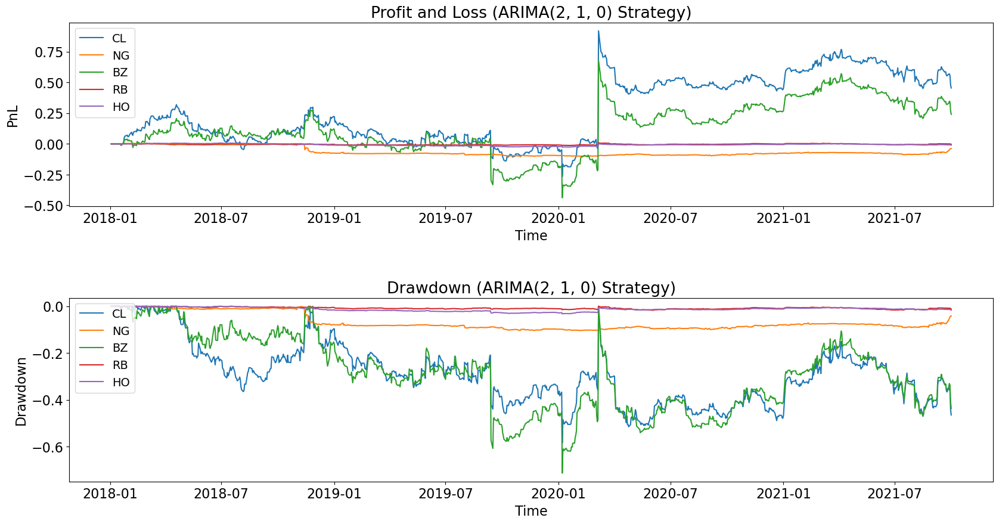

In [16]:
plt.rcParams.update({
    "font.size": 16,
    "legend.fontsize": 14
})

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(20,10))
fig.subplots_adjust(hspace=0.5)

for i in range(len(fuel_accounts)):
    axs[0].plot(fuel_accounts[i].curve(), label=fuel_futures[i])
    axs[0].legend()
    axs[0].title.set_text(f'Profit and Loss (ARIMA(2, 1, 0) Strategy)')
    axs[0].legend(loc=2)
    axs[0].set_ylabel('PnL')
    axs[0].set_xlabel('Time')
    
    axs[1].plot(fuel_accounts[i].drawdown(), label=fuel_futures[i])
    axs[1].legend()
    axs[1].title.set_text(f'Drawdown (ARIMA(2, 1, 0) Strategy)')
    axs[1].legend(loc=2)
    axs[1].set_ylabel('Drawdown')
    axs[1].set_xlabel('Time')
    
plt.show()

In [17]:
equity_accounts = run_arima_strategy(equity_futures_data, equity_futures, 2, 1, 0, 30)
equity_accounts

forecast: [-0.39196743]
forecast: [-0.13635096]
forecast: [-0.57471809]
forecast: [2.10096637]
forecast: [3.05454479]
forecast: [3.52263167]
forecast: [3.20902885]
forecast: [0.88882414]
forecast: [1.37260064]
forecast: [-0.11853476]
forecast: [1.7020177]
forecast: [-0.11149286]
forecast: [-1.3853443]
forecast: [0.45022059]
forecast: [-0.45902285]
forecast: [0.29897459]
forecast: [1.25975446]
forecast: [0.95544601]
forecast: [0.61338538]
forecast: [0.42268773]
forecast: [-0.57303742]
forecast: [0.5544835]
forecast: [0.6250787]
forecast: [0.34419396]
forecast: [-0.13330056]
forecast: [1.43506329]
forecast: [2.41184477]
forecast: [4.1322598]
forecast: [2.97065427]
forecast: [0.42816035]
forecast: [-1.0305155]
forecast: [1.76442912]
forecast: [-0.17124389]
forecast: [-0.71383142]
forecast: [-1.06014938]
forecast: [0.52905033]
forecast: [0.11545387]
forecast: [-0.08081811]
forecast: [0.01609967]
forecast: [0.47720019]
forecast: [0.18887852]
forecast: [0.10891131]
forecast: [0.50091866]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [0.65469004]
forecast: [3.22457769]
forecast: [-0.75092251]
forecast: [1.75427435]
forecast: [-0.12611477]
forecast: [0.56682875]
forecast: [-0.13011791]
forecast: [-1.03630344]
forecast: [0.77147322]
forecast: [1.36199082]
forecast: [1.10006058]
forecast: [2.71912638]
forecast: [1.20109508]
forecast: [0.6618817]
forecast: [1.90965447]
forecast: [-4.49368737]
forecast: [-1.49182717]
forecast: [-2.78657087]
forecast: [5.82777756]
forecast: [3.96159744]
forecast: [4.6066262]
forecast: [1.7328281]
forecast: [0.47511842]
forecast: [-0.04696068]
forecast: [0.6205121]
forecast: [0.52579302]
forecast: [-0.28117525]
forecast: [0.71228361]
forecast: [0.6826664]
forecast: [-1.62928198]
forecast: [-1.56888872]
forecast: [0.00488015]
forecast: [-0.13380085]
forecast: [-0.81256762]
forecast: [-0.61549491]
forecast: [1.79161458]
forecast: [0.68958491]
forecast: [-1.03250289]
forecast: [-0.81586304]
forecast: [-0.81971738]
forecast: [-1.86118021]
forecast: [-2.85138679]
forecast: [0.6151816

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-7.25724139]
forecast: [6.81331081]
forecast: [-5.70925124]
forecast: [6.5272166]
forecast: [-2.59879702]
forecast: [5.09044903]
forecast: [7.2627979]
forecast: [6.01959397]
forecast: [-10.81993469]
forecast: [-2.23512491]
forecast: [-14.19224856]
forecast: [-13.13265598]
forecast: [9.68854917]
forecast: [-1.3118985]
forecast: [10.84229701]
forecast: [4.45355725]
forecast: [10.90051983]
forecast: [4.34520989]
forecast: [0.56396912]
forecast: [13.19252804]
forecast: [10.94131807]
forecast: [8.73519673]
forecast: [7.7550486]
forecast: [-1.97299964]
forecast: [4.3061458]
forecast: [-7.22042007]
forecast: [-4.20893017]
forecast: [-2.4723768]
forecast: [-2.87358993]
forecast: [5.34168129]
forecast: [4.22758992]
forecast: [16.47538745]
forecast: [2.55426216]
forecast: [3.47356535]
forecast: [-0.02829146]
forecast: [4.26829276]
forecast: [9.70667363]
forecast: [3.65155455]
forecast: [2.85671236]
forecast: [-0.04487287]
forecast: [-0.13659731]
forecast: [-5.72588021]
forecast: [-3.0

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-8.03078147]
forecast: [-3.31289261]
forecast: [-4.4089869]
forecast: [8.86506257]
forecast: [-2.2091459]
forecast: [5.41930517]
forecast: [0.92594831]
forecast: [1.43974242]
forecast: [0.97974978]
forecast: [-3.12544937]
forecast: [4.02257858]
forecast: [4.16400792]
forecast: [2.38354629]
forecast: [7.24770648]
forecast: [3.12576]
forecast: [-0.41682033]
forecast: [7.22635819]
forecast: [-12.96288187]
forecast: [-1.79633978]
forecast: [-10.60493723]
forecast: [13.3390264]
forecast: [10.36607346]
forecast: [12.04936733]
forecast: [11.10623329]
forecast: [4.19265222]
forecast: [0.19792013]
forecast: [5.07881579]
forecast: [3.78742714]
forecast: [-4.89878165]
forecast: [-0.11725046]
forecast: [2.13578788]
forecast: [-5.01186089]
forecast: [-9.51746346]
forecast: [0.6885681]
forecast: [3.27384879]
forecast: [-4.27089908]
forecast: [-0.66201156]
forecast: [2.89301056]
forecast: [1.60649767]
forecast: [-4.74042402]
forecast: [-5.29614611]
forecast: [4.63120381]
forecast: [2.56514

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-0.58132793]
forecast: [0.03159762]
forecast: [-2.47241619]
forecast: [-1.70127692]
forecast: [2.17161663]
forecast: [-14.5662366]
forecast: [3.75777607]
forecast: [-5.12479105]
forecast: [32.4985572]
forecast: [-9.24709559]
forecast: [-20.27216533]
forecast: [3.57087246]
forecast: [0.31451523]
forecast: [3.73799476]
forecast: [0.00734187]
forecast: [2.66757673]
forecast: [2.22142232]
forecast: [0.98188046]
forecast: [-0.90909367]
forecast: [-2.29386337]
forecast: [4.69939003]
forecast: [3.50318968]
forecast: [6.9359096]
forecast: [-2.65420399]
forecast: [1.60504109]
forecast: [2.71354937]
forecast: [3.31842815]
forecast: [8.42261506]
forecast: [17.10071327]
forecast: [21.96840958]
forecast: [19.47617331]
forecast: [7.51282582]
forecast: [-0.17805344]
forecast: [5.31870536]
forecast: [-2.7243967]
forecast: [-0.47973146]
forecast: [-5.87496277]
forecast: [1.48785494]
forecast: [7.34645841]
forecast: [8.97365666]
forecast: [3.24982954]
forecast: [-0.63446304]
forecast: [0.1437

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.]
forecast: [0.]
forecast: [-32.00014856]
forecast: [-19.41389025]
forecast: [-18.28288624]
forecast: [-6.54076817]
forecast: [5.07868195]
forecast: [7.91560697]
forecast: [5.57999378]
forecast: [3.91101027]
forecast: [-0.03702241]
forecast: [-1.09834883]
forecast: [-8.8793211]
forecast: [1.78581509]
forecast: [5.127112]
forecast: [4.46855539]
forecast: [6.39706059]
forecast: [1.99151273]
forecast: [1.44247861e-25]
forecast: [1.30813942e-16]
forecast: [1.88290472e-25]
forecast: [-5.01888775e-42]
forecast: [7.65803718e-50]
forecast: [1.73966334e-33]
forecast: [4.13411878e-50]
forecast: [-2.86427592]
forecast: [-13.62263874]
forecast: [-15.36888029]
forecast: [-9.08979282]
forecast: [-6.44866448]
forecast: [-8.08596216]
forecast: [1.95655818]
forecast: [10.39264056]
forecast: [11.23120286]
forecast: [4.82619909]
forecast: [5.66615321]
forecast: [2.47730358]
forecast: [6.34868031]
forecast: [6.40772566]
forecast: [5.55801315]
forecast: [2.96936226]
forecast: [-0.29240571]
for

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [15.00002611]
forecast: [15.00005663]
forecast: [7.99994272]
forecast: [-3.11177814]
forecast: [1.5977065]
forecast: [2.07667956]
forecast: [-3.06041773]
forecast: [4.46176425]
forecast: [-3.84408031]
forecast: [0.43063782]
forecast: [5.37308026]
forecast: [-4.08658288]
forecast: [-3.83707913]
forecast: [4.71192104]
forecast: [-4.8968611]
forecast: [1.30633977]
forecast: [-0.59863995]
forecast: [1.32178195e-16]
forecast: [1.66134968e-24]
forecast: [2.76382468e-25]
forecast: [1.46483522e-33]
forecast: [7.76254076e-51]
forecast: [5.46676271e-41]
forecast: [3.0689713e-50]
forecast: [-0.87992126]
forecast: [1.05207275]
forecast: [-3.26233566]
forecast: [2.38158315]
forecast: [-3.92075648]
forecast: [0.98980563]
forecast: [-2.78841789]
forecast: [2.20122004]
forecast: [-7.18684043]
forecast: [-11.40514825]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [6.30771396]
forecast: [4.80105848]
forecast: [-1.12641197]
forecast: [-0.53141054]
forecast: [2.82428775]
forecast: [1.27156935]
forecast: [-4.11076133e-17]
forecast: [-4.49451447e-16]
forecast: [-3.1308667e-17]
forecast: [-9.3234451e-40]
forecast: [1.05894071e-33]
forecast: [-2.43572128e-33]
forecast: [-3.17205109]
forecast: [-0.08041976]
forecast: [-6.63381856]
forecast: [1.74803471]
forecast: [0.17177553]
forecast: [2.5841308]
forecast: [-3.06166016]
forecast: [-1.24116629]
forecast: [3.82707317]
forecast: [7.27837932]
forecast: [4.85387769]
forecast: [3.6802892]
forecast: [2.58203078]
forecast: [2.01703636]
forecast: [1.84955241]
forecast: [1.3302284]
forecast: [0.37197671]
forecast: [4.43860943e-18]
forecast: [-2.08109328e-17]
forecast: [1.77019978e-18]
forecast: [4.52615063e-48]
forecast: [-8.25922123e-35]
forecast: [8.93475127e-35]
forecast: [-3.45899981]
forecast: [-4.98751155]
forecast: [-0.94679869]
forecast: [2.87675825]
forecast: [2.68429151]
forecast: [1.3220045

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [19.00005315]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [11.08403819]
forecast: [11.81168273]
forecast: [3.40183472]
forecast: [2.94535634]
forecast: [-2.8672389]
forecast: [-0.49211642]
forecast: [0.16562306]
forecast: [-4.5392483]
forecast: [-21.26874379]
forecast: [-5.39646196]
forecast: [-15.24085467]
forecast: [-0.35909895]
forecast: [-7.28642478]
forecast: [-7.23889438]
forecast: [-13.26974832]
forecast: [0.6132901]
forecast: [1.89574872]
forecast: [7.04629696]
forecast: [-0.68489383]
forecast: [13.08069202]
forecast: [11.9160503]
forecast: [16.87377219]
forecast: [-0.52230369]
forecast: [-0.26873736]
forecast: [-1.7299925]
forecast: [1.56171924]
forecast: [2.37396924]
forecast: [-2.21742333]
forecast: [-1.34568766]
forecast: [-7.20593054]
forecast: [6.91968841]
forecast: [2.89308836]
forecast: [12.36866079]
forecast: [0.37392595]
forecast: [4.06194048]
forecast: [2.19462043]
forecast: [5.02898227]
forecast: [-3.10443518]
forecast: [0.17567784]
forecast: [-5.71143982]
forecast: [0.61342308]
forecast: [1.78893376]
forecast: [

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [18.00004351]
forecast: [12.03429032]
forecast: [13.42452439]
forecast: [0.03022387]
forecast: [1.3897257]
forecast: [0.94282908]
forecast: [-0.73968606]
forecast: [-3.14136337]
forecast: [-2.9614396]
forecast: [-2.3841631]
forecast: [-0.17445285]
forecast: [2.08532517]
forecast: [3.40323538]
forecast: [-0.2683367]
forecast: [-4.15021466]
forecast: [-2.80958623]
forecast: [-1.00680657]
forecast: [-0.10063005]
forecast: [-2.54056169]
forecast: [-2.02691894]
forecast: [-1.80399086]
forecast: [-1.11902107]
forecast: [-1.30522735]
forecast: [0.12436046]
forecast: [1.42626919]
forecast: [0.92171559]
forecast: [1.18509888]
forecast: [0.39640865]
forecast: [0.19752957]
forecast: [-0.70714879]
forecast: [-0.30582534]
forecast: [-3.28658425]
forecast: [-2.14341804]
forecast: [-3.21119656]
forecast: [-1.47626578]
forecast: [0.56298248]
forecast: [0.76982972]
forecast: [-1.23040729]
forecast: [-17.3782758]
forecast: [-8.0125242

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.]
forecast: [27.00011651]
forecast: [22.47216716]
forecast: [20.70882275]
forecast: [-3.81415245]
forecast: [-4.17844391]
forecast: [-2.49414204]
forecast: [4.15347293]
forecast: [5.2044686]
forecast: [-1.10590242]
forecast: [-0.52444915]
forecast: [-0.53573564]
forecast: [0.91690093]
forecast: [0.1290869]
forecast: [-3.15515585]
forecast: [-0.46580685]
forecast: [0.27982398]
forecast: [-0.78455315]
forecast: [-3.6792999]
forecast: [-7.06862286]
forecast: [-2.62184322]
forecast: [2.54589981]
forecast: [1.83789822]
forecast: [0.26129054]
forecast: [1.11971291]
forecast: [0.96204337]
forecast: [-2.97024803]
forecast: [-3.12596279]
forecast: [3.23948164]
forecast: [1.50379517]
forecast: [-0.5037061]
forecast: [0.45769635]
forecast: [1.51064888]
forecast: [-1.22164863]
forecast: [-3.73892119]
forecast: [-3.76247028]
forecast: [-2.04016886]
forecast: [-1.23444791]
forecast: [0.2843316]
forecast: [2.18800511]
forecast: [2.89935218]
forecast: [-2.41941402]
forecast: [2.57776477]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-7.01387331]
forecast: [-21.84411455]
forecast: [3.34864277]
forecast: [22.22498418]
forecast: [49.91778589]
forecast: [55.15675998]
forecast: [38.40851476]
forecast: [11.15030756]
forecast: [5.01191083]
forecast: [6.28459333]
forecast: [-1.46540137]
forecast: [-0.87011221]
forecast: [-1.29872769e-29]
forecast: [-1.07144229e-28]
forecast: [-3.74512323e-17]
forecast: [-6.50003311e-48]
forecast: [-8.99175077e-58]
forecast: [9.45430362e-46]
forecast: [26.3623126]
forecast: [16.87536417]
forecast: [24.44038536]
forecast: [-8.24016488]
forecast: [6.40692464]
forecast: [-8.99801371]
forecast: [-27.4884652]
forecast: [-21.1642161]
forecast: [-14.87408635]
forecast: [-14.52785269]
forecast: [11.25243917]
forecast: [9.31267673]
forecast: [6.6740062]
forecast: [5.33818191]
forecast: [-1.20855476]
forecast: [-6.25509918]
forecast: [-1.44506723]
forecast: [-8.78988542e-27]
forecast: [9.61112788e-17]
forecast: [4.82464655e-17]
forecast: [-1.22300089e-34]
forecast: [1.69508759e-44]
foreca

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [20.44013772]
forecast: [18.72912687]
forecast: [11.54662749]
forecast: [-12.64772279]
forecast: [-34.45281631]
forecast: [2.01758584]
forecast: [20.73430049]
forecast: [18.48559529]
forecast: [16.78708294]
forecast: [3.10816473]
forecast: [-1.24995179]
forecast: [-1.70209977e-17]
forecast: [-9.24545982e-17]
forecast: [1.76434003e-28]
forecast: [3.96955434e-33]
forecast: [9.93581586e-55]
forecast: [6.28618261e-57]
forecast: [-10.62500073]
forecast: [-59.57257202]
forecast: [-72.7554888]
forecast: [-51.88461066]
forecast: [-27.87630155]
forecast: [-18.03284567]
forecast: [11.19889439]
forecast: [42.92080237]
forecast: [42.71540148]
forecast: [22.43318166]
forecast: [21.54651223]
forecast: [6.4605465]
forecast: [30.63032471]
forecast: [25.16775796]
forecast: [19.54883998]
forecast: [8.47476151]
forecast: [0.24187415]
forecast: [6.34625356e-27]
forecast: [4.5956713e-16]
forecast: [-1.42902971e-17]
forecast: [2.3065996e-52]
forecast: [6.34675956e-33]
forecast: [-4.42067135e-43]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.]
forecast: [0.]
forecast: [36.00017964]
forecast: [265.28957482]
forecast: [-6.64311523]
forecast: [65.23000899]
forecast: [20.68519462]
forecast: [16.79939372]
forecast: [5.70329524]
forecast: [24.91233613]
forecast: [-15.06371568]
forecast: [3.61676051]
forecast: [13.52532089]
forecast: [-25.08851397]
forecast: [-0.03349833]
forecast: [2.58214001]
forecast: [-19.20051502]
forecast: [6.21579813]
forecast: [-5.52823223]
forecast: [7.80791504e-16]
forecast: [-2.54857956e-16]
forecast: [-3.75232879e-16]
forecast: [-4.2621656e-32]
forecast: [5.44709162e-33]
forecast: [4.57163855e-55]
forecast: [6.48362289]
forecast: [-1.27702867]
forecast: [-1.86151236]
forecast: [-4.77297753]
forecast: [2.85995264]
forecast: [-20.87461172]
forecast: [8.66813582]
forecast: [-13.11363443]
forecast: [-20.28371689]
forecast: [-32.58239749]
forecast: [-48.04735184]
forecast: [26.75232861]
forecast: [12.06347743]
forecast: [-3.99586382]
forecast: [4.03910806]
forecast: [11.63019539]
forecast: [8.

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [54.00049634]
forecast: [73.32544371]
forecast: [35.0396999]
forecast: [-18.20913646]
forecast: [-6.33880418]
forecast: [12.5487369]
forecast: [32.5788818]
forecast: [28.37839898]
forecast: [22.61880423]
forecast: [-6.94329875]
forecast: [0.54680424]
forecast: [1.17686881]
forecast: [-3.433365]
forecast: [-7.24560633]
forecast: [-9.54517843]
forecast: [-3.41102959]
forecast: [-0.26729497]
forecast: [4.74736343e-16]
forecast: [5.73926434e-17]
forecast: [-9.89034052e-18]
forecast: [2.02793179e-33]
forecast: [-2.1153581e-33]
forecast: [-1.9271693e-35]
forecast: [-5.91806833]
forecast: [-73.15659381]
forecast: [-82.86546107]
forecast: [-57.27477454]
forecast: [-5.07311741]
forecast: [-4.30998543]
forecast: [-17.75982465]
forecast: [2.06638723]
forecast: [-8.45221399]
forecast: [15.41545067]
forecast: [15.72110739]
forecast: [5.35741445]
forecast: [14.23455439]
forecast: [5.05321978]
forecast: [8.23626284]
forecast: [1.49372532]
forecast: [0.37001261]
forecast: [1.9

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [-3.68659432]
forecast: [27.6189999]
forecast: [21.60901103]
forecast: [-24.18715225]
forecast: [-3.60317667]
forecast: [-23.01235619]
forecast: [-17.29713758]
forecast: [-14.37634743]
forecast: [24.21476341]
forecast: [-16.84480757]
forecast: [11.01732264]
forecast: [-2.16222502]
forecast: [1.0366818]
forecast: [2.04233843e-16]
forecast: [-5.11267155e-27]
forecast: [-1.92310645e-31]
forecast: [8.24893922e-44]
forecast: [-7.11457888e-34]
forecast: [-1.9226068e-51]
forecast: [11.0694802]
forecast: [-48.69995047]
forecast: [-23.56387357]
forecast: [-13.14133245]
forecast: [-3.29032545]
forecast: [-3.60853955]
forecast: [-20.14127282]
forecast: [-17.99530872]
forecast: [17.03865534]
forecast: [-50.0605985]
forecast: [-2.61841238]
forecast: [-26.72637382]
forecast: [10.77367594]
forecast: [9.83874349]
forecast: [5.20088904]
forecast: [-1.55353311]
forecast: [-1.82267476]
forecast: [1.06412341e-16]
forecast: [-3.99776969e-30]
forecast: [-6.63406544e-17]
forecast: [-4.58381222e-33]

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [78.0023279]
forecast: [44.99414429]
forecast: [49.59383338]
forecast: [14.81546775]
forecast: [17.33607732]
forecast: [2.44309003]
forecast: [1.32011113]
forecast: [-0.35166482]
forecast: [-27.5012672]
forecast: [-110.20975745]
forecast: [-90.08870432]
forecast: [-17.03743843]
forecast: [-13.25018066]
forecast: [-28.18467926]
forecast: [-29.04992083]
forecast: [-40.73899192]
forecast: [-13.41247871]
forecast: [12.23435676]
forecast: [6.58024276]
forecast: [-16.59457543]
forecast: [46.22203297]
forecast: [54.94009768]
forecast: [44.93280317]
forecast: [0.16326783]
forecast: [-1.99995759]
forecast: [0.34797185]
forecast: [2.90541512]
forecast: [8.24493811]
forecast: [-4.53201274]
forecast: [-12.81324673]
forecast: [-23.21374139]
forecast: [33.82190535]
forecast: [28.46419627]
forecast: [48.89833452]
forecast: [0.51974902]
forecast: [10.29881056]
forecast: [8.7376234]
forecast: [18.62561211]
forecast: [-10.88540405]
forecast: [1.94576357]
forecast:

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [71.49947198]
forecast: [47.28568337]
forecast: [52.79118213]
forecast: [1.14954429]
forecast: [8.35373198]
forecast: [8.46565342]
forecast: [1.27135225]
forecast: [-9.36432845]
forecast: [-10.00863225]
forecast: [-8.83373402]
forecast: [-2.80255163]
forecast: [8.15606758]
forecast: [12.47494612]
forecast: [6.33730454]
forecast: [-17.01060345]
forecast: [-12.92243753]
forecast: [-11.25863297]
forecast: [-6.18367639]
forecast: [-9.35468051]
forecast: [-6.29848975]
forecast: [-6.91679536]
forecast: [-4.66548592]
forecast: [-4.05826445]
forecast: [-1.92458118]
forecast: [2.94509207]
forecast: [1.46547154]
forecast: [4.80891935]
forecast: [0.33901514]
forecast: [-0.35540912]
forecast: [-2.5]
forecast: [1.43256354]
forecast: [-9.23396292]
forecast: [-13.24223782]
forecast: [-12.11984557]
forecast: [-0.31229569]
forecast: [-12.31378183]
forecast: [9.22286249]
forecast: [-14.29198125]
forecast: [-74.78439383]
forecast: [-37.78066536]
forecast: [-4.76667003]
forecast: 

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [143.98032993]
forecast: [107.38500424]
forecast: [113.84966159]
forecast: [-19.18674518]
forecast: [-13.86408513]
forecast: [-3.29586456]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [24.08645563]
forecast: [14.93632943]
forecast: [-4.89837486]
forecast: [-19.04018196]
forecast: [4.71693355]
forecast: [12.43909253]
forecast: [0.18211204]
forecast: [-13.00132809]
forecast: [-12.68215603]
forecast: [-3.88762363]
forecast: [-9.07745197]
forecast: [-18.77167401]
forecast: [-18.79354887]
forecast: [-5.91796]
forecast: [5.33084529]
forecast: [5.7634652]
forecast: [1.13014943]
forecast: [6.80503462]
forecast: [-0.28444055]
forecast: [-6.28554472]
forecast: [-9.10676926]
forecast: [5.73558911]
forecast: [4.95998839]
forecast: [0.04777411]
forecast: [5.47838614]
forecast: [0.05977903]
forecast: [1.2790087]
forecast: [-7.11742517]
forecast: [-9.34939657]
forecast: [-17.06122109]
forecast: [5.46479604]
forecast: [-5.09507066]
forecast: [-7.05606191]
forecast: [23.03422123]
forecast: [-13.37151548]
forecast: [7.70624628]
forecast: [10.70337303]
forecast: [2.80270198]
forecast: [8.71556952]
forecast: [-2.06391497e-16]
forecast: [0.31917503]
forecast: [6.1402997]
forec

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


forecast: [-1.4770916]
forecast: [-0.84013232]
forecast: [-16.64462143]
forecast: [-15.77345391]
forecast: [-5.95692165]
forecast: [10.86614583]
forecast: [11.03309053]
forecast: [6.83040251]
forecast: [3.706195]
forecast: [4.81394679e-16]
forecast: [-5.0997862]
forecast: [-7.82610498]
forecast: [-8.14433406]
forecast: [-3.82229922]
forecast: [0.27173227]
forecast: [3.10351078]
forecast: [1.86577101]
forecast: [-7.94150125]
forecast: [-11.42501134]
forecast: [-7.16211649]
forecast: [-7.91856838]
forecast: [-6.60930086]
forecast: [3.68315817]
forecast: [13.70217603]
forecast: [14.89901617]
forecast: [13.72364364]
forecast: [16.19860773]
forecast: [6.21102484]
forecast: [12.51018708]
forecast: [10.92480851]
forecast: [16.52842827]
forecast: [8.01439577]
forecast: [4.76209634e-25]
forecast: [-2.27956973]
forecast: [13.4236053]
forecast: [6.84685684]
forecast: [13.84495313]
forecast: [2.95173046]
forecast: [-5.55517602]
forecast: [3.55993002]
forecast: [-2.3047509]
forecast: [2.02613484]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [2.88667729e-246]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [66.50027982]
forecast: [39.65058271]
forecast: [48.28899531]
forecast: [0.8792004]
forecast: [-1.47575173]
forecast: [-3.56108518]
forecast: [-3.64285262]
forecast: [-17.91474125]
forecast: [-38.0641104]
forecast: [-23.43959893]
forecast: [-26.75801143]
forecast: [-8.07543391]
forecast: [-15.17091428]
forecast: [-9.73136371]
forecast: [-24.02213536]
forecast: [-5.23786443]
forecast: [12.33079832]
forecast: [8.52109511]
forecast: [-11.29009213]
forecast: [25.17649187]
forecast: [29.73802241]
forecast: [35.61579313]
forecast: [5.95220388e-16]
forecast: [-1.07535887]
forecast: [-1.49432232]
forecast: [-2.06974749]
forecast: [2.71084177]
forecast: [0.19692486]
forecast: [1.26520623]
forecast: [-11.67337439]
forecast: [11.87936407]
forecast: [5.02203505]
forecast: [25.49198901]
forecast: [5.65253141]
forecast: [12.36600519]
forecast: [7.88818752]
forecast: [14.1456177]
forecast: [-1.0706132]
f

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [27.00011651]
forecast: [15.94207764]
forecast: [19.15694024]
forecast: [0.46208056]
forecast: [0.0500007]
forecast: [-3.0981981]
forecast: [-9.9931742]
forecast: [-3.66632568]
forecast: [-1.8373548]
forecast: [4.16888005]
forecast: [-0.36237777]
forecast: [2.18526445]
forecast: [-0.51096836]
forecast: [-6.89335118]
forecast: [-13.6879471]
forecast: [-7.05787039]
forecast: [3.3248991]
forecast: [-1.32241209]
forecast: [-3.62404607]
forecast: [-2.74844248]
forecast: [-0.26795877]
forecast: [0.16493532]
forecast: [-1.46482242e-16]
forecast: [0.43210351]
forecast: [0.16093921]
forecast: [-0.40751049]
forecast: [0.02380754]
forecast: [2.26640223]
forecast: [0.51066117]
forecast: [-1.49809198]
forecast: [-1.66926102]
forecast: [-2.13663448]
forecast: [-5.14041482]
forecast: [-6.06839308]
forecast: [-3.65070228]
forecast: [-2.40818515]
forecast: [5.5069806]
forecast: [-2.55249668]
forecast: [-6.07004564]
forecast: [-12.13279524]
forecast

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [13.59592173]
forecast: [16.52426799]
forecast: [33.59394361]
forecast: [2.52533457]
forecast: [15.06231928]
forecast: [-13.96596541]
forecast: [2.37043631]
forecast: [-10.03272549]
forecast: [-3.45515475]
forecast: [-11.04974586]
forecast: [-16.53349518]
forecast: [-9.62456791]
forecast: [-4.57639387]
forecast: [0.00404488]
forecast: [0.12941096]
forecast: [0.32407674]
forecast: [-3.47896113e-17]
forecast: [-0.48986287]
forecast: [5.27451756]
forecast: [7.02574231]
forecast: [7.80560658]
forecast: [1.24461876]
forecast: [0.29739234]
forecast: [1.7031512]
forecast: [-0.53752159]
forecast: [7.06821166]
forecast: [0.76523707]
forecast: [-7.88062596]
forecast: [-4.32715535]
forecast: [-10.54684699]
forecast: [-18.22391231]
forecast: [-10.59167044]
forecast: [-5.48789297]
forecast: [-13.59034594]
forecast: [-12.0213845]
forecast: [-5.00176334]
forecast: [-10.98469947]
forecast: [-9.94982757]
forecast: [-8.53922516]
forecast: [3.54982936e-16]
forecast: [0.29520193]
forecast: [1.38

/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
 

forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [0.]
forecast: [23.50008663]
forecast: [28.3578]
forecast: [14.2615122]
forecast: [-2.41120523]
forecast: [-5.00064741]
forecast: [-8.23159906]
forecast: [8.06876785]


/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/rds/general/user/zm520/home/anaconda3/envs/mlproject2/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


forecast: [16.7441633]
forecast: [13.39866738]
forecast: [11.2085828]
forecast: [-4.06653182]
forecast: [-0.04213057]
forecast: [-0.87518607]
forecast: [0.60558203]
forecast: [14.33562143]
forecast: [3.32391124]
forecast: [-4.11705235]
forecast: [-4.31395321]
forecast: [-7.24950683]
forecast: [-1.87474615]
forecast: [5.57749997]
forecast: [3.36231175]
forecast: [-1.13404287e-16]
forecast: [3.8507666]
forecast: [5.10218971]
forecast: [-2.18694031]
forecast: [-2.93134781]
forecast: [3.3527568]
forecast: [2.327324]
forecast: [3.95461479]
forecast: [16.71102749]
forecast: [15.11864755]
forecast: [8.30936083]
forecast: [-3.98139917]
forecast: [-5.68774663]
forecast: [3.55729535]
forecast: [-2.75075823]
forecast: [11.70002461]
forecast: [6.7359682]
forecast: [2.69609817]
forecast: [1.01392817]
forecast: [3.81649503]
forecast: [4.78817326]
forecast: [-0.45228991]
forecast: [4.27942926]
forecast: [-1.0878372e-16]
forecast: [-0.32828848]
forecast: [1.34713575]
forecast: [2.12282256]
forecast: [

[index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    0.194009
 2021-09-28    0.675467
 2021-09-29    0.207579
 2021-09-30    2.639162
 2021-10-01    0.398740
 Freq: B, Length: 978, dtype: float64
  Unweighted account curve; use object.stats() to see methods,
 index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    1.332513
 2021-09-28    2.078806
 2021-09-29    2.334073
 2021-09-30    6.113815
 2021-10-01   -0.104295
 Freq: B, Length: 978, dtype: float64
  Unweighted account curve; use object.stats() to see methods,
 index
 2018-01-03    0.000000
 2018-01-04    0.000000
 2018-01-05    0.000000
 2018-01-08    0.000000
 2018-01-09    0.000000
                 ...   
 2021-09-27    0.505371
 2021-09-28    0.385268
 2021-09-29    0.119330
 2021-09-30    0.864224
 2021-10-

### Fuel Statistics

In [18]:
fuel_account_statistics = pd.DataFrame(columns=fuel_futures)

for i in range(len(fuel_accounts)):
    
    fuel_account_statistics['STATISTICS'] = pd.Series(list(dict(fuel_accounts[i].percent.stats()[0]).keys()))

    fuel_account_statistics[fuel_futures[i]] = pd.Series([float(x) for x in list(dict(fuel_accounts[i].percent.stats()[0]).values())])
    
    print(round(fuel_accounts[i].curve().iloc[-1], 6))
            
account_statistics_rounded = fuel_account_statistics.round(decimals=6)
account_statistics_rounded

0.454755
-0.037533
0.240543
-0.003635
-0.010167


,CL,NG,BZ,RB,HO,STATISTICS
0,-0.217600,-0.044970,-0.333500,-0.004623,-0.008694,min
1,0.958300,0.011690,0.888800,0.020980,0.020460,max
2,-0.000654,0.000006,-0.000188,-0.000003,-0.000006,median
3,0.000465,-0.000038,0.000246,-0.000004,-0.000010,mean
4,0.037440,0.002103,0.036910,0.000907,0.000896,std
5,16.780000,-10.360000,13.250000,12.350000,11.040000,skew
6,0.119000,-0.009825,0.062960,-0.000952,-0.002661,ann_mean
7,0.599100,0.033650,0.590600,0.014520,0.014340,ann_std
8,0.198700,-0.292000,0.106600,-0.065540,-0.185500,sharpe
9,0.396100,-0.253400,0.173400,-0.113600,-0.282000,sortino


### Equity Statistics

In [21]:
equity_account_statistics = pd.DataFrame(columns=equity_futures)

for i in range(len(equity_accounts)):
    
    equity_account_statistics['STATISTICS'] = pd.Series(list(dict(equity_accounts[i].percent.stats()[0]).keys()))

    equity_account_statistics[equity_futures[i]] = pd.Series([float(x) for x in list(dict(equity_accounts[i].percent.stats()[0]).values())])
    
    print(round(equity_accounts[i].curve().iloc[-1], 6))
            
equity_account_statistics_rounded = equity_account_statistics.round(decimals=6)
equity_account_statistics_rounded

-11.970607
-43.449139
-22.506929
-35.662563
-50.080653


,ES,NQ,FX,DY,X,STATISTICS
0,-6.667000,-19.24000,-9.40600,-35.810000,-25.21000,min
1,4.037000,11.70000,2.80300,11.120000,12.85000,max
2,0.007201,0.04482,0.00000,0.000147,0.00000,median
3,-0.012240,-0.04443,-0.02301,-0.036460,-0.05121,mean
4,0.691700,2.28700,0.71780,2.711000,1.53300,std
5,-2.378000,-1.75400,-4.04300,-3.792000,-4.81700,skew
6,-3.133000,-11.37000,-5.89100,-9.335000,-13.11000,ann_mean
7,11.070000,36.60000,11.48000,43.380000,24.53000,ann_std
8,-0.283100,-0.31080,-0.51300,-0.215200,-0.53430,sharpe
9,-0.276700,-0.31460,-0.49430,-0.205500,-0.51760,sortino


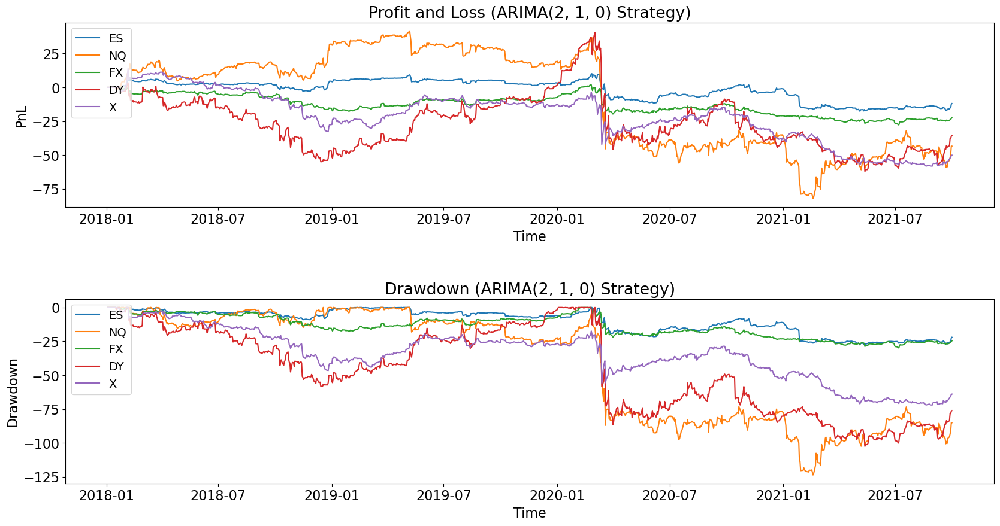

In [22]:
plt.rcParams.update({
    "font.size": 16,
    "legend.fontsize": 14
})

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(20,10))
fig.subplots_adjust(hspace=0.5)

for i in range(len(equity_accounts)):
    axs[0].plot(equity_accounts[i].curve(), label=equity_futures[i])
    axs[0].legend()
    axs[0].title.set_text(f'Profit and Loss (ARIMA(2, 1, 0) Strategy)')
    axs[0].legend(loc=2)
    axs[0].set_ylabel('PnL')
    axs[0].set_xlabel('Time')
    
    axs[1].plot(equity_accounts[i].drawdown(), label=equity_futures[i])
    axs[1].legend()
    axs[1].title.set_text(f'Drawdown (ARIMA(2, 1, 0) Strategy)')
    axs[1].legend(loc=2)
    axs[1].set_ylabel('Drawdown')
    axs[1].set_xlabel('Time')
    
plt.show()